# 0. Importation des librairies

In [1]:
import pandas as pd # package for high-performance, easy-to-use data structures and data analysis
import numpy as np # fundamental package for scientific computing with Python
import matplotlib
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import missingno as msno
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
import plotly.io as pio
pio.renderers.default = 'jupyterlab' # or 'notebook' or 'colab' or 'iframe'
# import cufflinks and offline mode
import cufflinks as cf
cf.go_offline()
import lightgbm as lgb
from sklearn.model_selection import KFold
import gc

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
import os
print(os.listdir("Data/"))

['sample_submission.csv', 'application_test.csv', 'POS_CASH_balance.csv', 'bureau.csv:Zone.Identifier', 'application_train.csv:Zone.Identifier', 'installments_payments.csv:Zone.Identifier', 'installments_payments.csv', 'bureau_balance.csv', 'previous_application.csv', 'bureau.csv', 'bureau_balance.csv:Zone.Identifier', 'sample_submission.csv:Zone.Identifier', 'credit_card_balance.csv', 'previous_application.csv:Zone.Identifier', 'application_train.csv', 'application_test.db', 'credit_card_balance.csv:Zone.Identifier', 'HomeCredit_columns_description.csv:Zone.Identifier', 'POS_CASH_balance.csv:Zone.Identifier', 'application_test.csv:Zone.Identifier', 'HomeCredit_columns_description.csv']


# 1. EDA

In [2]:
df_application_train = pd.read_csv('Data/application_train.csv')
df_application_test = pd.read_csv('Data/application_test.csv')
df_bureau = pd.read_csv('Data/bureau.csv')
df_bureau_balance = pd.read_csv('Data/bureau_balance.csv')
df_credit_card_balance = pd.read_csv('Data/credit_card_balance.csv')
df_installments_payments = pd.read_csv('Data/installments_payments.csv')
df_POS_CASH_balance = pd.read_csv('Data/POS_CASH_balance.csv')
df_previous_application = pd.read_csv('Data/previous_application.csv')

#df_HomeCredit_columns_description = pd.read_csv('Data/HomeCredit_columns_description.csv')
#df_sample_submission = pd.read_csv('Data/sample_submission.csv')

**Définition d'une fonction qui réduit la taille d'un DataFrame en modifiant le type des données**

In [3]:
import sys

def return_size(df):
    """Return size of dataframe in gigabytes"""
    return round(sys.getsizeof(df) / 1e9, 2)

def convert_types(df, print_info = False):
    
    original_memory = df.memory_usage().sum()
    
    # Iterate through each column
    for c in df:
        
        # Convert ids and booleans to integers
        if ('SK_ID' in c):
            df[c] = df[c].fillna(0).astype(np.int32)
            
        # Convert objects to category
        elif (df[c].dtype == 'object') and (df[c].nunique() < df.shape[0]):
            df[c] = df[c].astype('category')
        
        # Booleans mapped to integers
        elif set(df[c].unique()) == {0, 1}:
            df[c] = df[c].astype(bool)
        
        # Float64 to float32
        elif df[c].dtype == float:
            df[c] = df[c].astype(np.float32)
            
        # Int64 to int32
        elif df[c].dtype == int:
            df[c] = df[c].astype(np.int32)
        
    new_memory = df.memory_usage().sum()
    
    if print_info:
        print(f'Original Memory Usage: {round(original_memory / 1e9, 2)} gb.')
        print(f'New Memory Usage: {round(new_memory / 1e9, 2)} gb.')
        
    return df

## 1.1 Pré-Exploration des données : tailles, data types, en-têtes, etc.

In [5]:
print('Size of application_train data', df_application_train.shape)
print('Size of application_test data', df_application_test.shape)
print('Size of POS_CASH_balance data', df_POS_CASH_balance.shape)
print('Size of bureau_balance data', df_bureau_balance.shape)
print('Size of previous_application data', df_previous_application.shape)
print('Size of installments_payments data', df_installments_payments.shape)
print('Size of credit_card_balance data', df_credit_card_balance.shape)
print('Size of bureau data', df_bureau.shape)

Size of application_train data (307511, 122)
Size of application_test data (48744, 121)
Size of POS_CASH_balance data (10001358, 8)
Size of bureau_balance data (27299925, 3)
Size of previous_application data (1670214, 37)
Size of installments_payments data (13605401, 8)
Size of credit_card_balance data (3840312, 23)
Size of bureau data (1716428, 17)


In [6]:
df_application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
df_application_train.columns.values

array(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3',

In [8]:
df_POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [9]:
df_POS_CASH_balance.columns.values

array(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'], dtype=object)

In [10]:
df_bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [11]:
df_bureau_balance.columns.values

array(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype=object)

In [12]:
df_previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
df_previous_application.columns.values

array(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT',
       'AMT_GOODS_PRICE', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT',
       'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT',
       'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE',
       'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO',
       'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'SELLERPLACE_AREA',
       'NAME_SELLER_INDUSTRY', 'CNT_PAYMENT', 'NAME_YIELD_GROUP',
       'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'], dtype=object)

In [14]:
df_installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [15]:
df_installments_payments.columns.values

array(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'], dtype=object)

In [16]:
df_credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [17]:
df_credit_card_balance.columns.values

array(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE',
       'AMT_TOTAL_RECEIVABLE', 'CNT_DRAWINGS_ATM_CURRENT',
       'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT',
       'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM',
       'NAME_CONTRACT_STATUS', 'SK_DPD', 'SK_DPD_DEF'], dtype=object)

In [18]:
df_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [19]:
df_bureau.columns.values

array(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT',
       'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE',
       'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY'], dtype=object)

## 1.2 Valeurs manquantes

<AxesSubplot:>

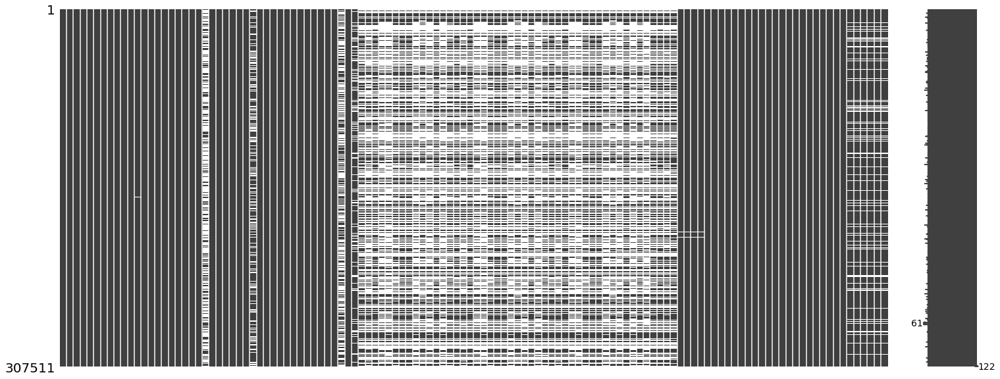

In [20]:
msno.matrix(df_application_train)

<AxesSubplot:>

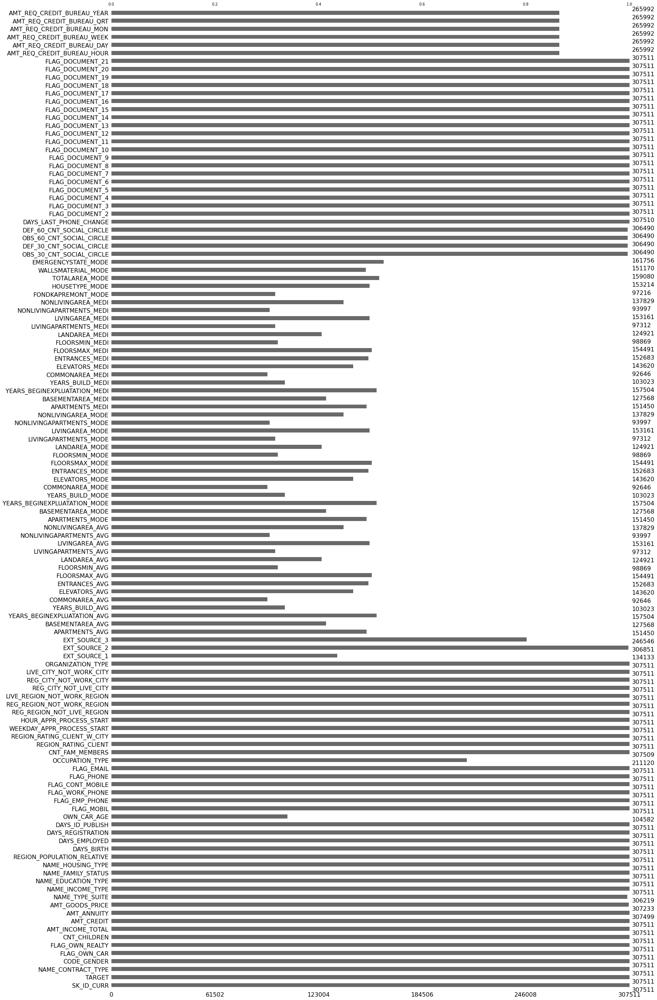

In [21]:
msno.bar(df_application_train)

<AxesSubplot:>

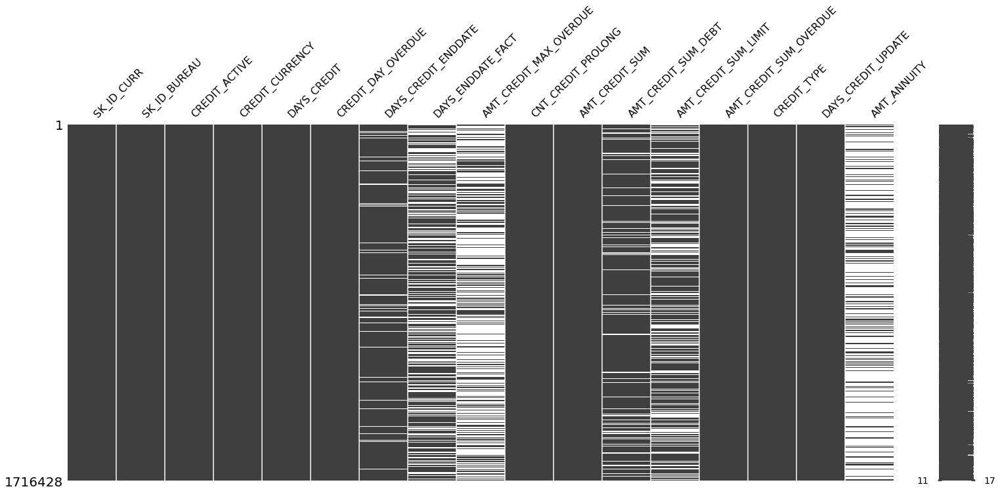

In [22]:
msno.matrix(df_bureau)

<AxesSubplot:>

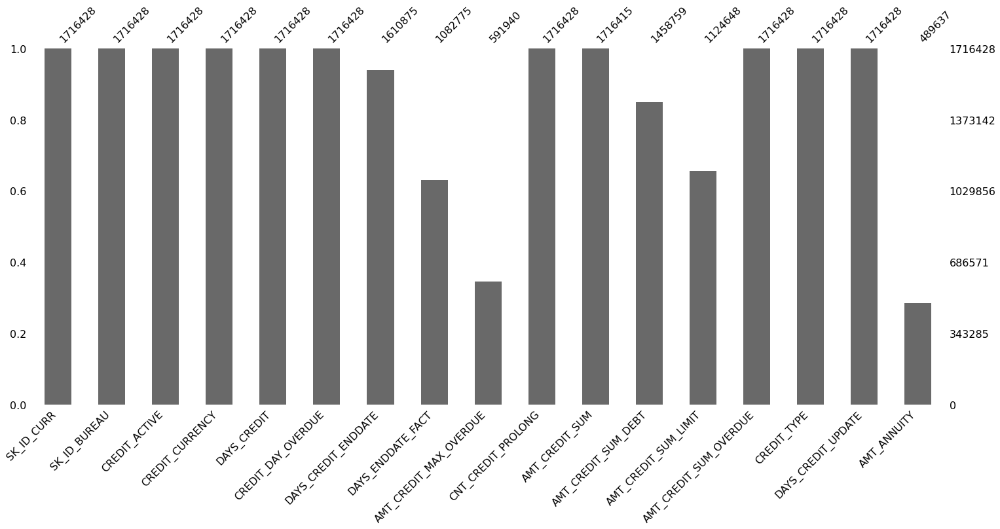

In [23]:
msno.bar(df_bureau)

<AxesSubplot:>

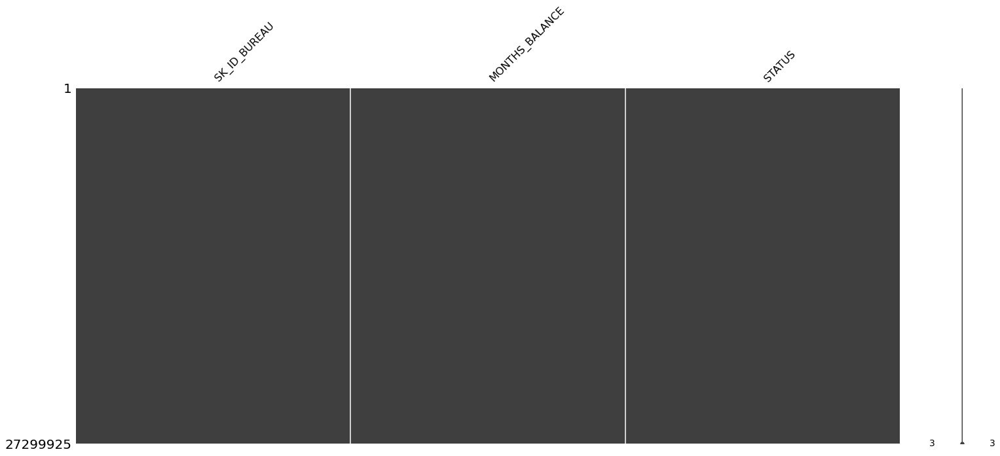

In [24]:
msno.matrix(df_bureau_balance)

<AxesSubplot:>

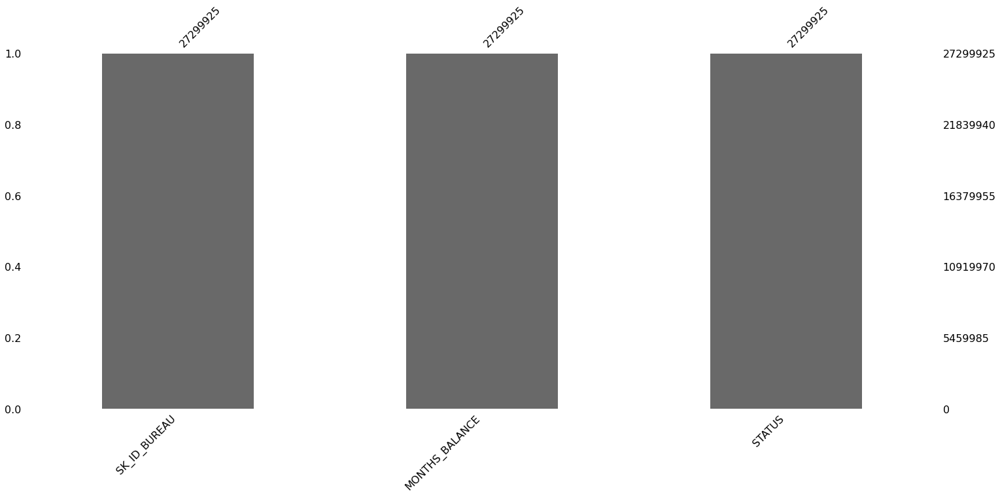

In [25]:
msno.bar(df_bureau_balance)

<AxesSubplot:>

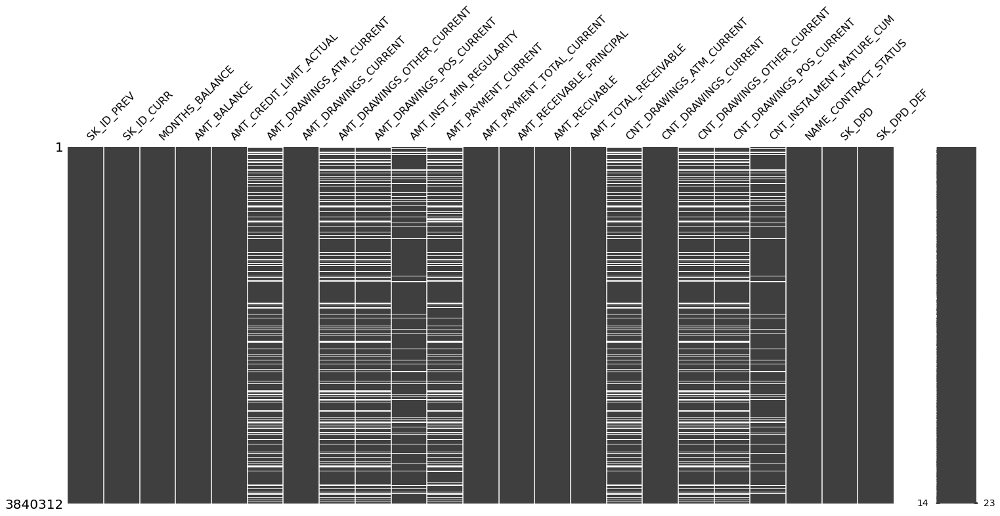

In [26]:
msno.matrix(df_credit_card_balance)

<AxesSubplot:>

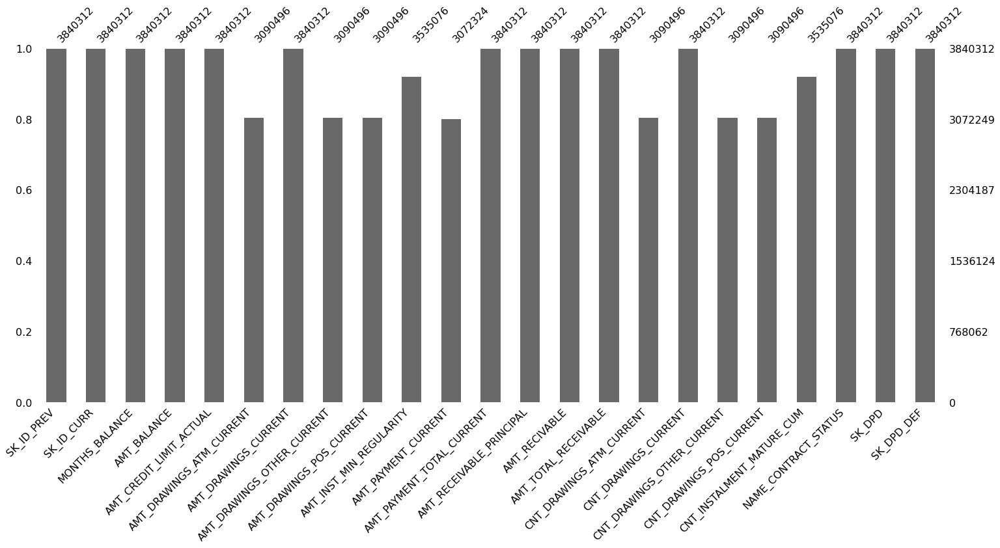

In [27]:
msno.bar(df_credit_card_balance)

<AxesSubplot:>

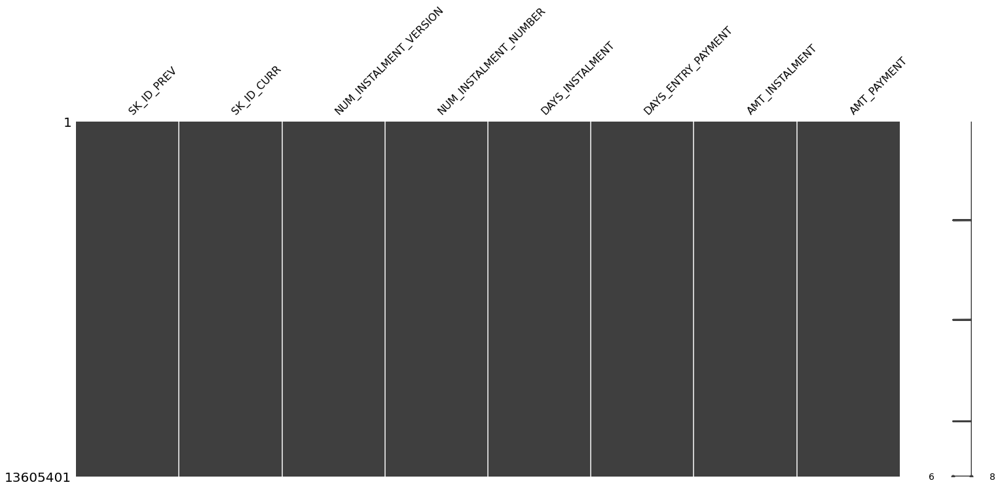

In [28]:
msno.matrix(df_installments_payments)

<AxesSubplot:>

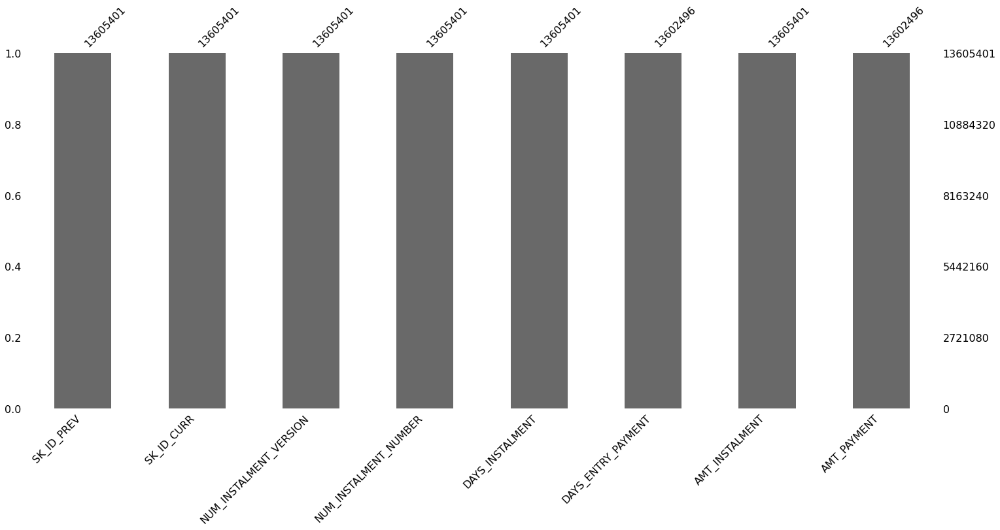

In [29]:
msno.bar(df_installments_payments)

<AxesSubplot:>

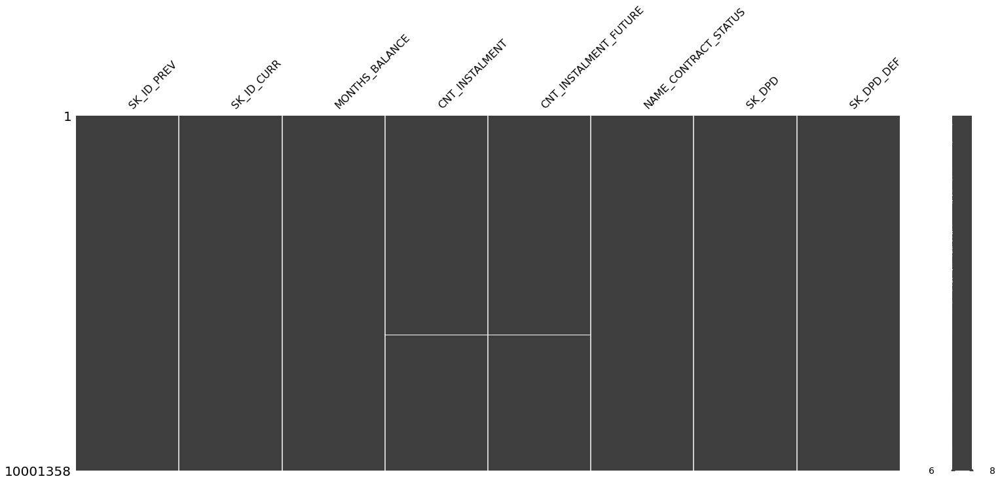

In [30]:
msno.matrix(df_POS_CASH_balance)

<AxesSubplot:>

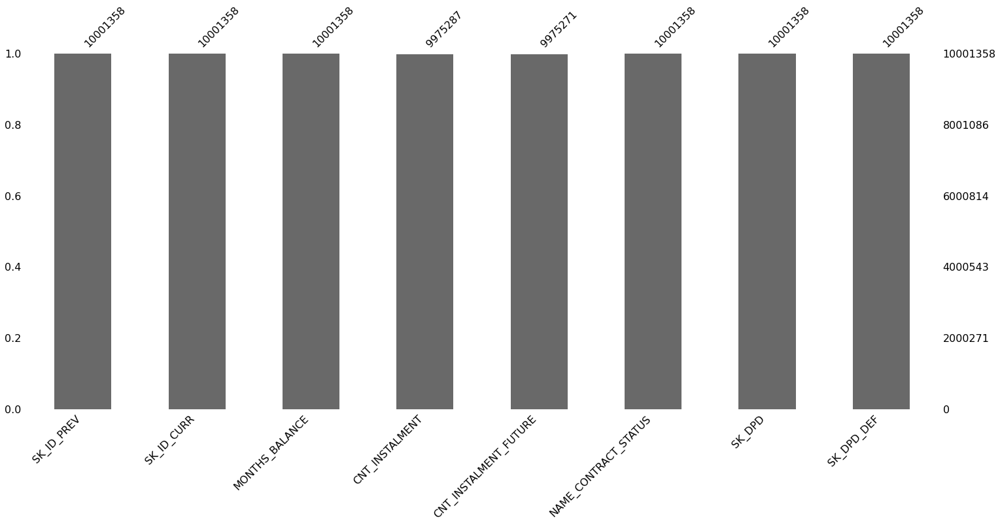

In [31]:
msno.bar(df_POS_CASH_balance)

<AxesSubplot:>

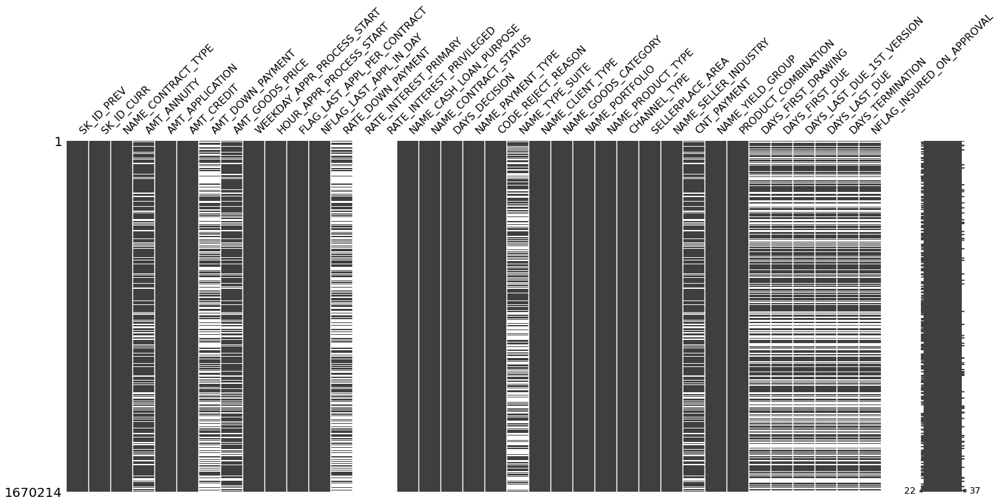

In [32]:
msno.matrix(df_previous_application)

<AxesSubplot:>

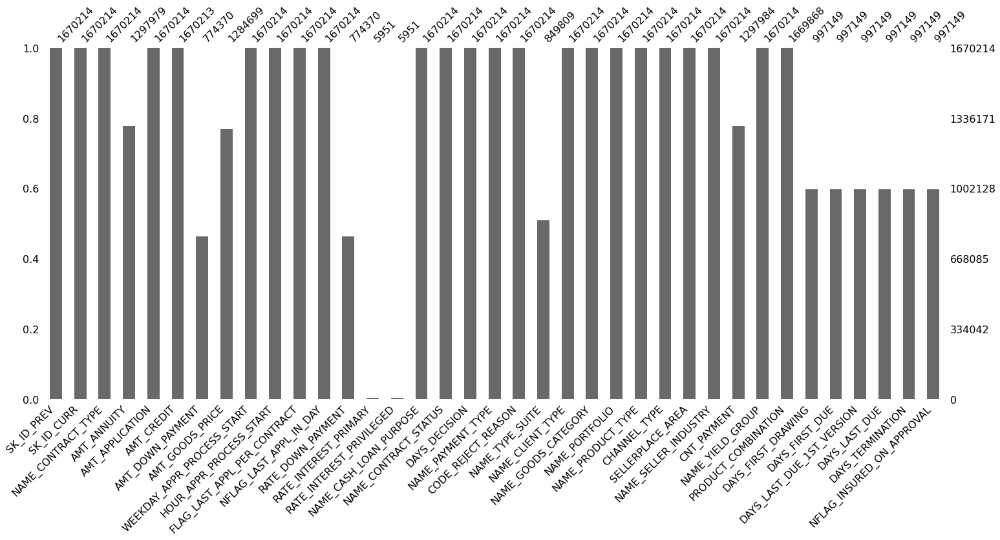

In [33]:
msno.bar(df_previous_application)

## 1.3 Exploration des données : distribution plot, bar plot, etc.

In [34]:
(df_application_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [35]:
df_application_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

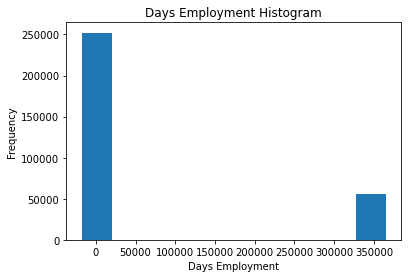

In [36]:
df_application_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

<Figure size 864x360 with 0 Axes>

Text(0.5, 1.0, 'Distribution of AMT_CREDIT')

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



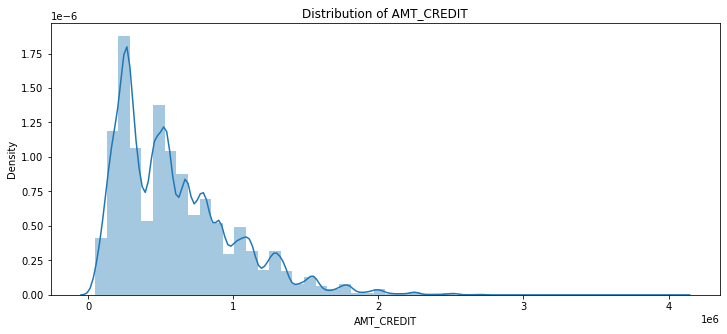

In [37]:
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_CREDIT")
ax = sns.distplot(df_application_train["AMT_CREDIT"])

<Figure size 864x360 with 0 Axes>

Text(0.5, 1.0, 'Distribution of AMT_INCOME_TOTAL')

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



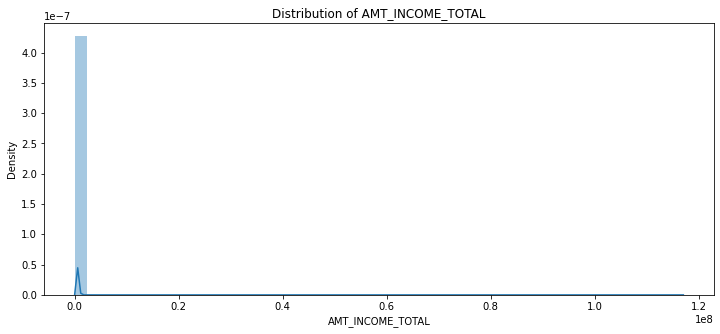

In [38]:
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_INCOME_TOTAL")
ax = sns.distplot(df_application_train["AMT_INCOME_TOTAL"].dropna())

<Figure size 864x360 with 0 Axes>

Text(0.5, 1.0, 'Distribution of AMT_GOODS_PRICE')

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



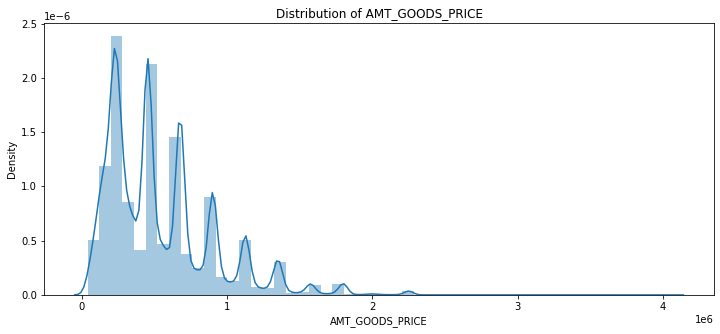

In [39]:
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_GOODS_PRICE")
ax = sns.distplot(df_application_train["AMT_GOODS_PRICE"].dropna())

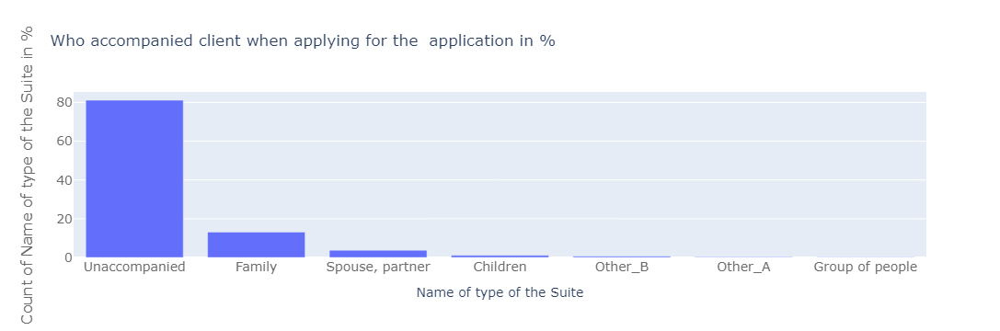

In [40]:
temp = df_application_train["NAME_TYPE_SUITE"].value_counts()
#print("Total number of states : ",len(temp))
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
)
data = [trace]
layout = go.Layout(
    title = "Who accompanied client when applying for the  application in % ",
    xaxis=dict(
        title='Name of type of the Suite',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of Name of type of the Suite in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
#fig.show()
py.iplot(fig)

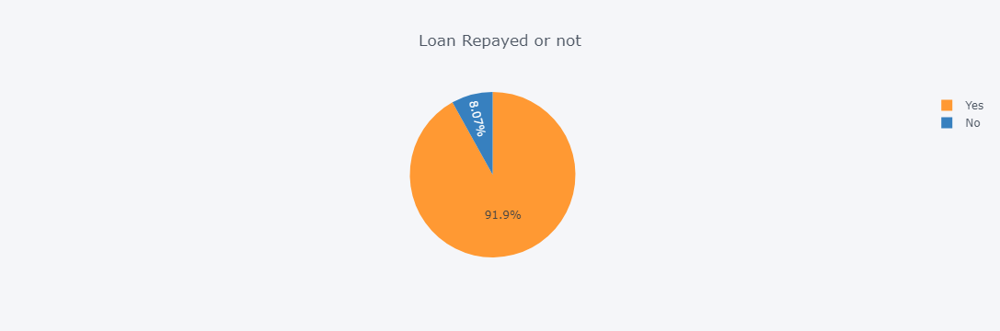

In [41]:
temp = df_application_train["TARGET"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df["labels"].replace([0, 1], ["Yes", "No"], inplace=True)
df.iplot(kind='pie', labels='labels', values='values', title='Loan Repayed or not')

**Les classes sont fortement déséquilibrées : 92% du training set n'a pas de difficulté à rembourser son crédit contre 8%.** 

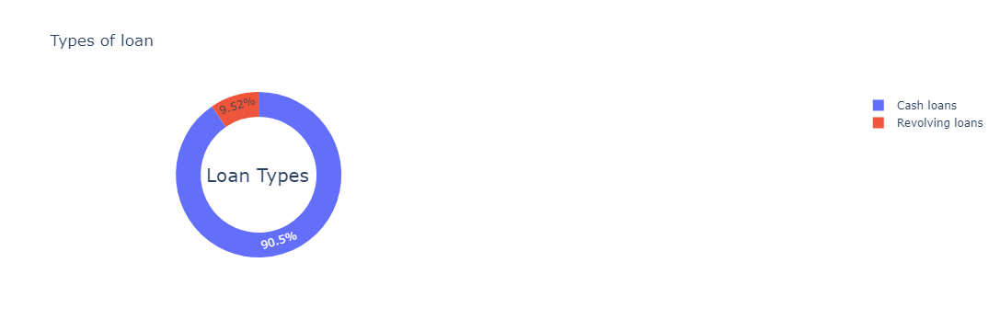

In [42]:
temp = df_application_train["NAME_CONTRACT_TYPE"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .48]},
      #"name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .7,
      "type": "pie"
    },
    
    ],
  "layout": {
        "title":"Types of loan",
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Loan Types",
                "x": 0.17,
                "y": 0.5
            }
            
        ]
    }
}
iplot(fig)

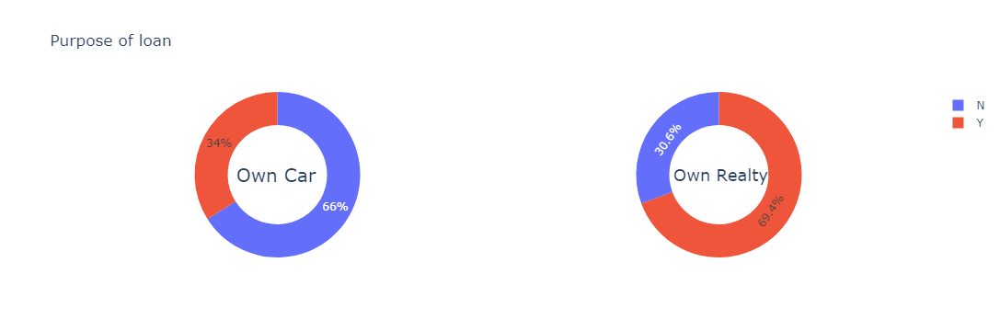

In [43]:
temp1 = df_application_train["FLAG_OWN_CAR"].value_counts()
temp2 = df_application_train["FLAG_OWN_REALTY"].value_counts()

fig = {
  "data": [
    {
      "values": temp1.values,
      "labels": temp1.index,
      "domain": {"x": [0, .48]},
      "name": "Own Car",
      "hoverinfo":"label+percent+name",
      "hole": .6,
      "type": "pie"
    },
    {
      "values": temp2.values,
      "labels": temp2.index,
      "textposition":"inside",
      "domain": {"x": [.52, 1]},
      "name": "Own Reality",
      "hoverinfo":"label+percent+name",
      "hole": .6,
      "type": "pie"
    }],
  "layout": {
        "title":"Purpose of loan",
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Own Car",
                "x": 0.19,
                "y": 0.5
            },
            {
                "font": {
                    "size": 18
                },
                "showarrow": False,
                "text": "Own Realty",
                "x": 0.82,
                "y": 0.5
            }
        ]
    }
}
iplot(fig)

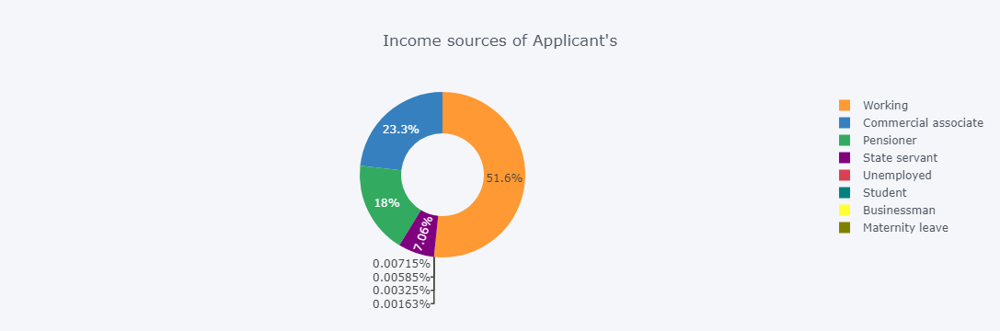

In [44]:
temp = df_application_train["NAME_INCOME_TYPE"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Income sources of Applicant\'s', hole = 0.5)

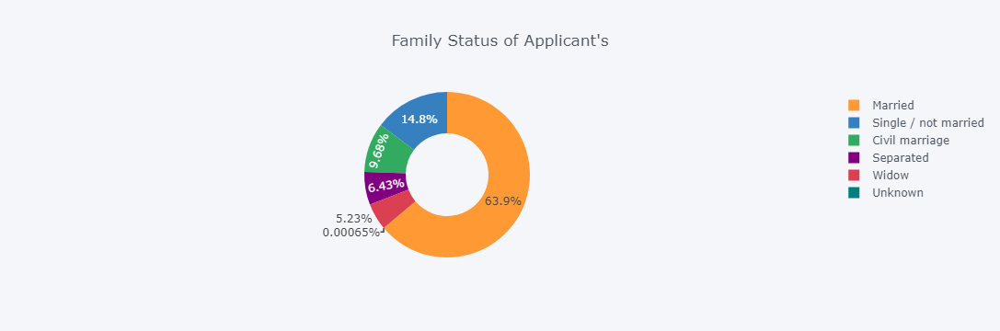

In [45]:
temp = df_application_train["NAME_FAMILY_STATUS"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Family Status of Applicant\'s', hole = 0.5)

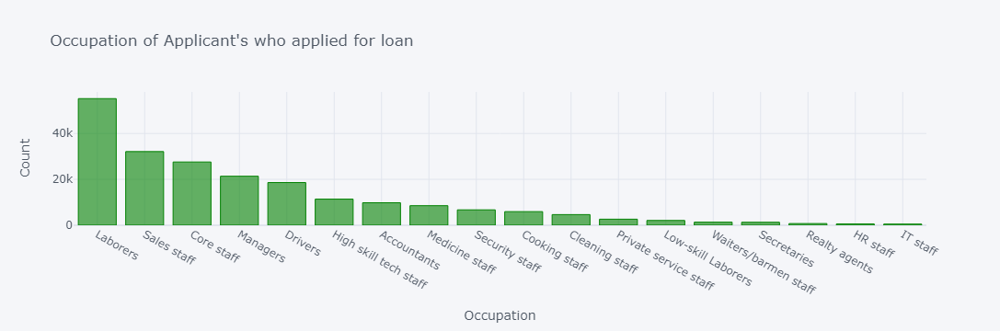

In [46]:
temp = df_application_train["OCCUPATION_TYPE"].value_counts()
temp.iplot(kind='bar', xTitle = 'Occupation', yTitle = "Count", title = 'Occupation of Applicant\'s who applied for loan', color = 'green')

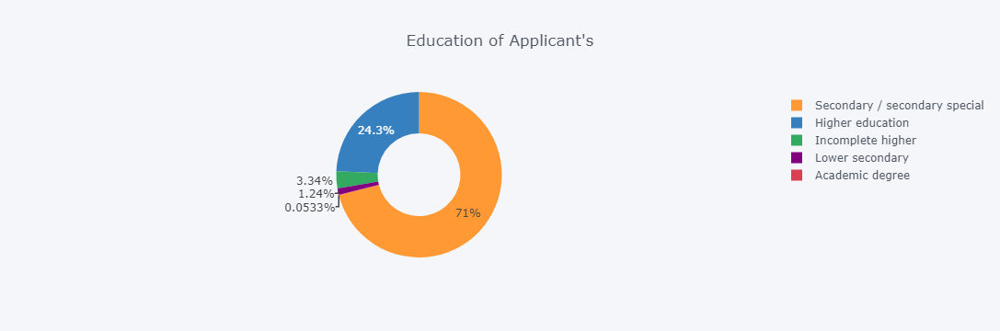

In [47]:
temp = df_application_train["NAME_EDUCATION_TYPE"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Education of Applicant\'s', hole = 0.5)

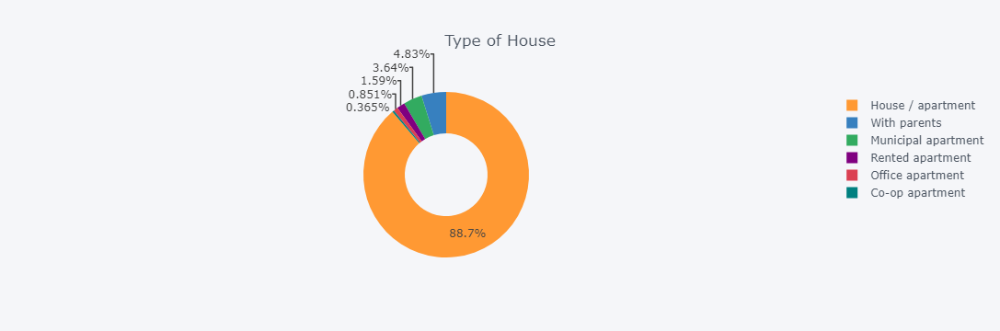

In [48]:
temp = df_application_train["NAME_HOUSING_TYPE"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Type of House', hole = 0.5)

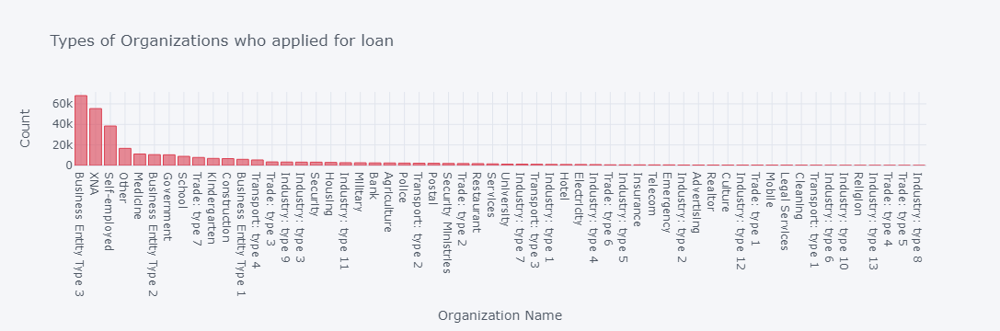

In [49]:
temp = df_application_train["ORGANIZATION_TYPE"].value_counts()
temp.iplot(kind='bar', xTitle = 'Organization Name', yTitle = "Count", title = 'Types of Organizations who applied for loan ', color = 'red')

## 1.4 Exploration en fonction du statut de remboursement du crédit

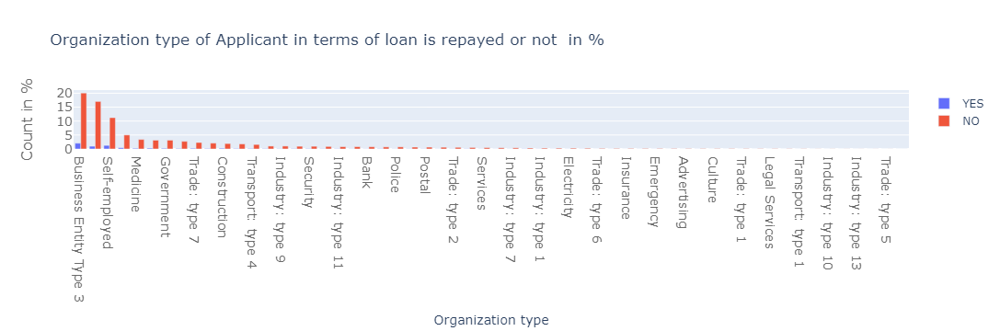

In [50]:
temp = df_application_train["ORGANIZATION_TYPE"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(df_application_train["TARGET"][df_application_train["ORGANIZATION_TYPE"]==val] == 1))
    temp_y0.append(np.sum(df_application_train["TARGET"][df_application_train["ORGANIZATION_TYPE"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Organization type of Applicant in terms of loan is repayed or not  in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Organization type',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

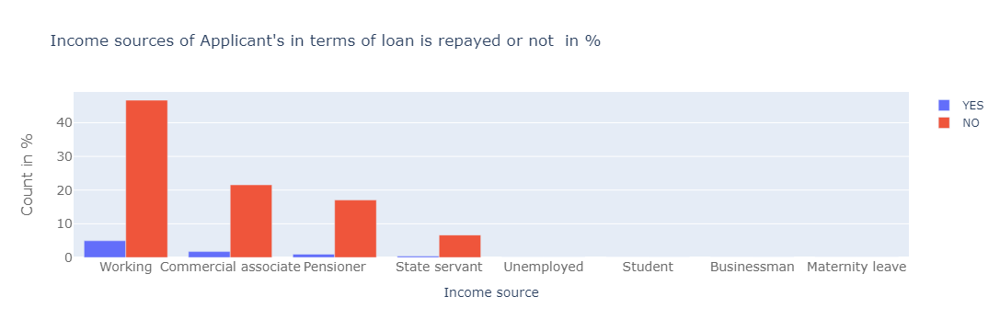

In [51]:
temp = df_application_train["NAME_INCOME_TYPE"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_INCOME_TYPE"]==val] == 1))
    temp_y0.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_INCOME_TYPE"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Income sources of Applicant's in terms of loan is repayed or not  in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Income source',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

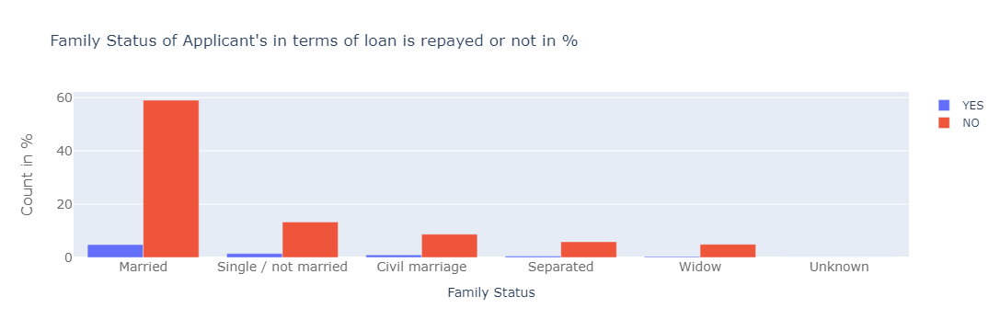

In [52]:
temp = df_application_train["NAME_FAMILY_STATUS"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_FAMILY_STATUS"]==val] == 1))
    temp_y0.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_FAMILY_STATUS"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Family Status of Applicant's in terms of loan is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Family Status',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

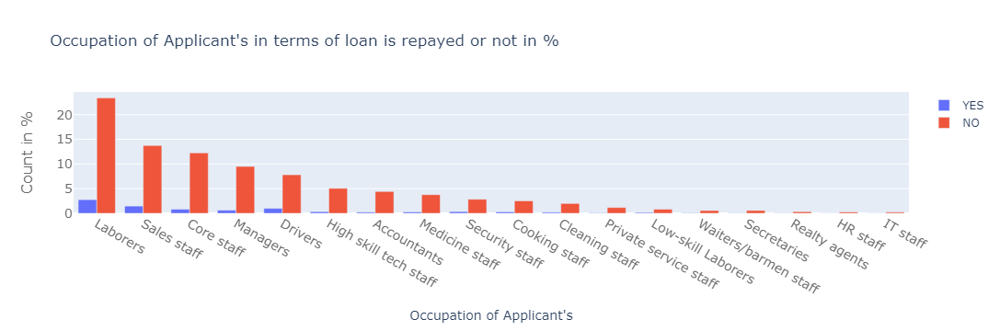

In [53]:
temp = df_application_train["OCCUPATION_TYPE"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(df_application_train["TARGET"][df_application_train["OCCUPATION_TYPE"]==val] == 1))
    temp_y0.append(np.sum(df_application_train["TARGET"][df_application_train["OCCUPATION_TYPE"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Occupation of Applicant's in terms of loan is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Occupation of Applicant\'s',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

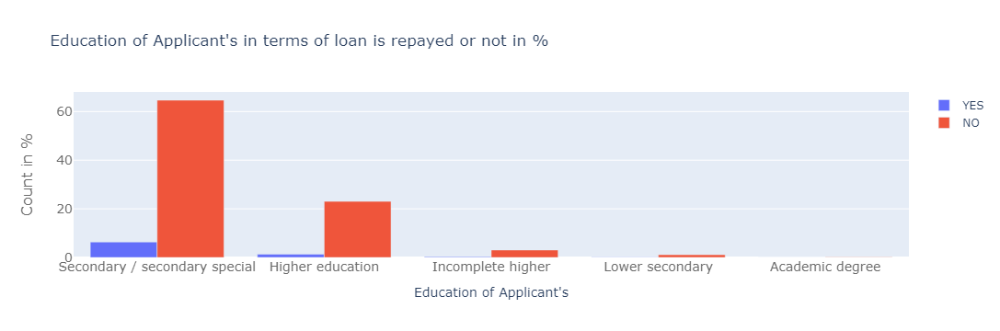

In [54]:
temp = df_application_train["NAME_EDUCATION_TYPE"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_EDUCATION_TYPE"]==val] == 1))
    temp_y0.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_EDUCATION_TYPE"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Education of Applicant's in terms of loan is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Education of Applicant\'s',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

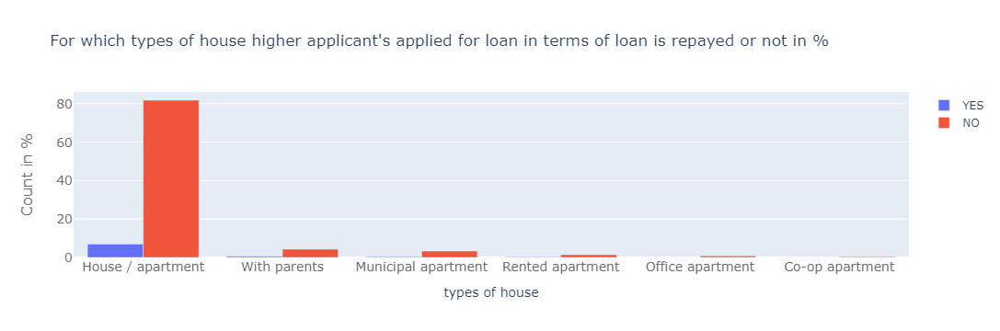

In [55]:
temp = df_application_train["NAME_HOUSING_TYPE"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_HOUSING_TYPE"]==val] == 1))
    temp_y0.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_HOUSING_TYPE"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "For which types of house higher applicant's applied for loan in terms of loan is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='types of house',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

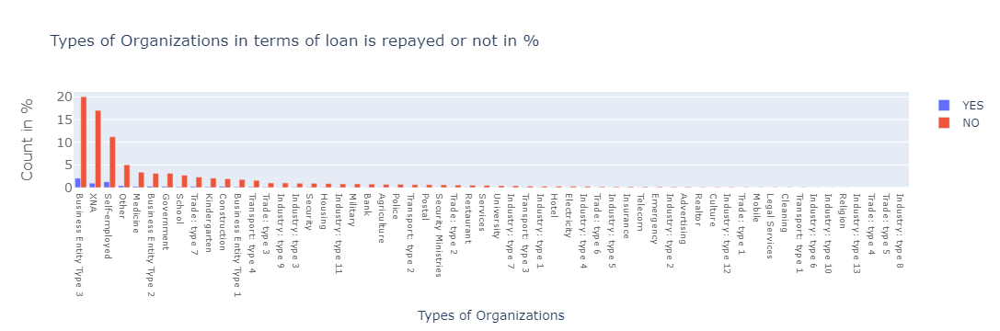

In [56]:
temp = df_application_train["ORGANIZATION_TYPE"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(df_application_train["TARGET"][df_application_train["ORGANIZATION_TYPE"]==val] == 1))
    temp_y0.append(np.sum(df_application_train["TARGET"][df_application_train["ORGANIZATION_TYPE"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Types of Organizations in terms of loan is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Types of Organizations',
        tickfont=dict(
            size=10,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

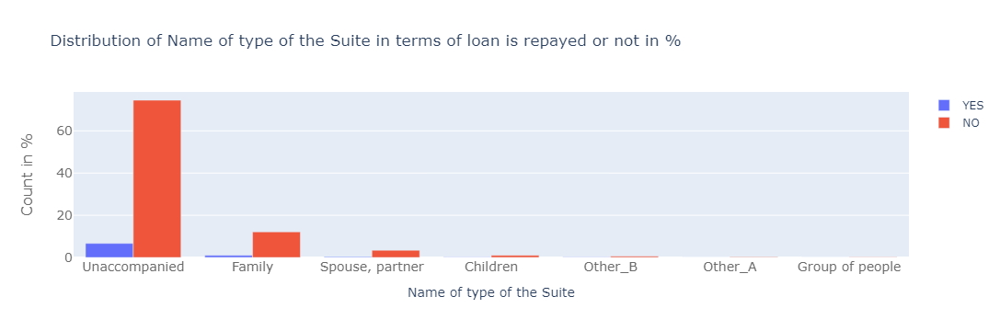

In [57]:
temp = df_application_train["NAME_TYPE_SUITE"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_TYPE_SUITE"]==val] == 1))
    temp_y0.append(np.sum(df_application_train["TARGET"][df_application_train["NAME_TYPE_SUITE"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Distribution of Name of type of the Suite in terms of loan is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Name of type of the Suite',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

## 1.5 Exploration des précédentes demandes de crédit

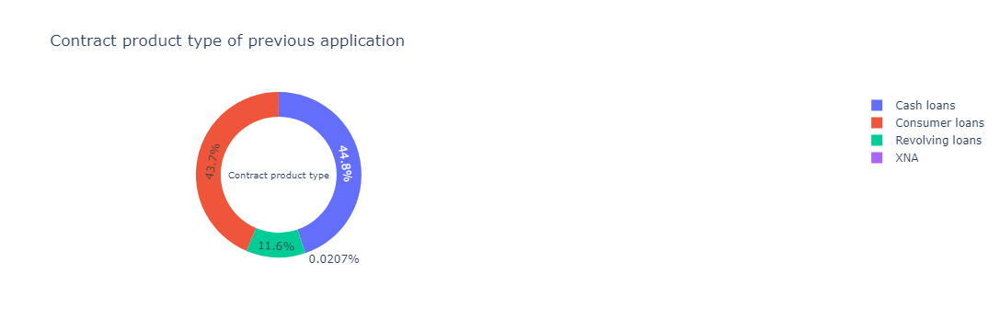

In [58]:
temp = df_previous_application["NAME_CONTRACT_TYPE"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .48]},
      #"name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .7,
      "type": "pie"
    },
    
    ],
  "layout": {
        "title":"Contract product type of previous application",
        "annotations": [
            {
                "font": {
                    "size": 10
                },
                "showarrow": False,
                "text": "Contract product type",
                "x": 0.17,
                "y": 0.5
            }
            
        ]
    }
}
iplot(fig, filename='donut')

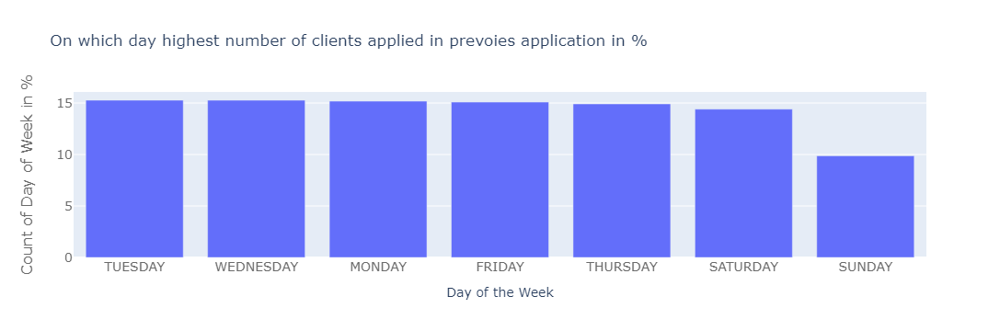

In [59]:
temp = df_previous_application["WEEKDAY_APPR_PROCESS_START"].value_counts()
#print("Total number of states : ",len(temp))
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
)
data = [trace]
layout = go.Layout(
    title = "On which day highest number of clients applied in prevoies application in % ",
    xaxis=dict(
        title='Day of the Week',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of Day of Week in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='schoolStateNames')

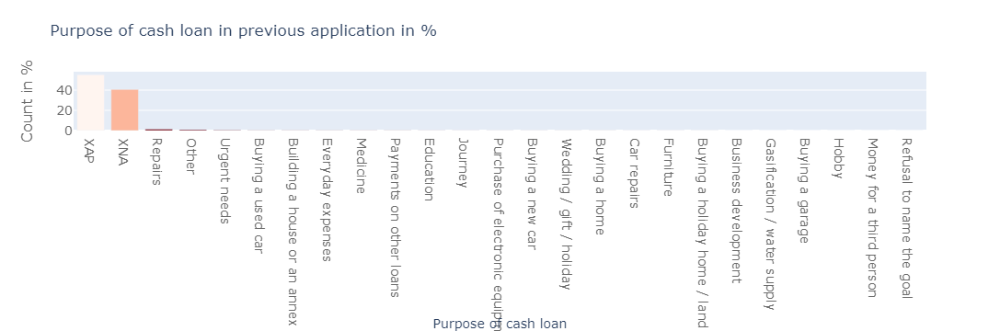

In [60]:
temp = df_previous_application["NAME_CASH_LOAN_PURPOSE"].value_counts()
#print("Total number of states : ",len(temp))
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
    marker=dict(
        color=(temp / temp.sum())*100,
        colorscale = 'Reds',
        reversescale = True
    ),
)
data = [trace]
layout = go.Layout(
    title = "Purpose of cash loan in previous application in % ",
    xaxis=dict(
        title='Purpose of cash loan',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

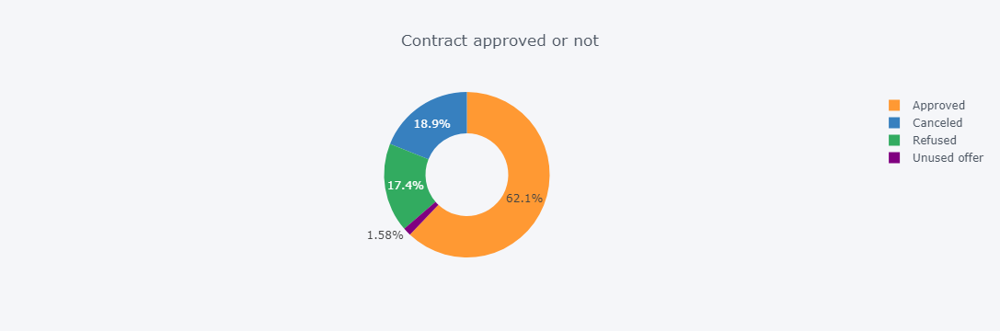

In [61]:
temp = df_previous_application["NAME_CONTRACT_STATUS"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Contract approved or not', hole = 0.5)

**1/3 des précédentes demandes de crédit sont refusées.**

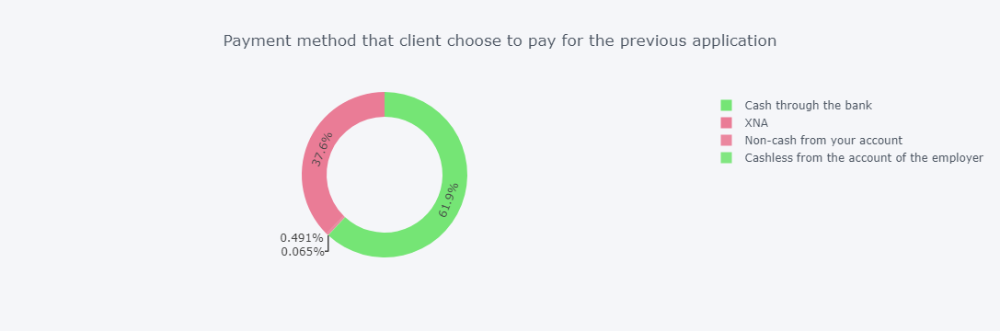

In [62]:
temp = df_previous_application["NAME_PAYMENT_TYPE"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Payment method that client choose to pay for the previous application', hole = 0.7,colors=['#75e575', '#ea7c96',])

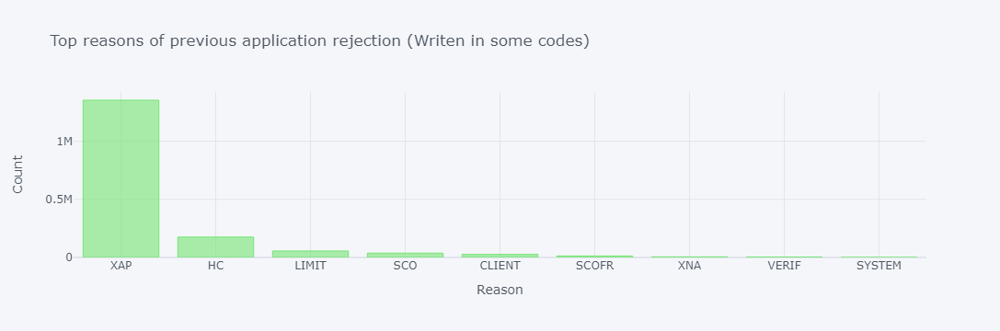

In [63]:
temp = df_previous_application["CODE_REJECT_REASON"].value_counts()
temp.iplot(kind='bar', xTitle = 'Reason', yTitle = "Count", title = 'Top reasons of previous application rejection (Writen in some codes)', colors=['#75e575'])

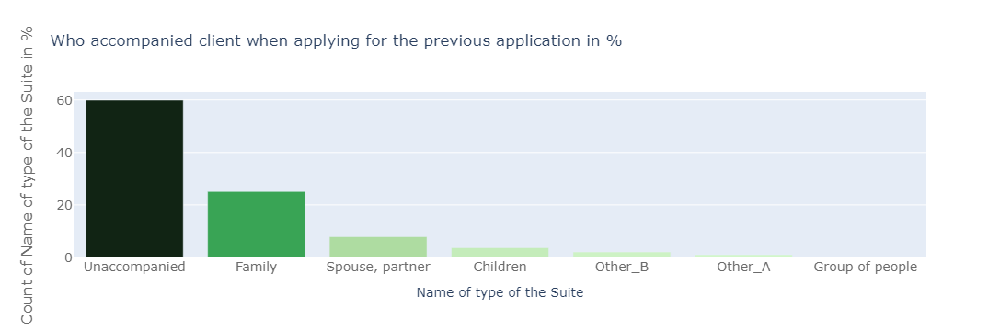

In [64]:
temp = df_previous_application["NAME_TYPE_SUITE"].value_counts()
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
    marker=dict(
        color=(temp / temp.sum())*100,
        colorscale = 'algae',
        #reversescale = True
    ),
)
data = [trace]
layout = go.Layout(
    title = "Who accompanied client when applying for the previous application in % ",
    xaxis=dict(
        title='Name of type of the Suite',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of Name of type of the Suite in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

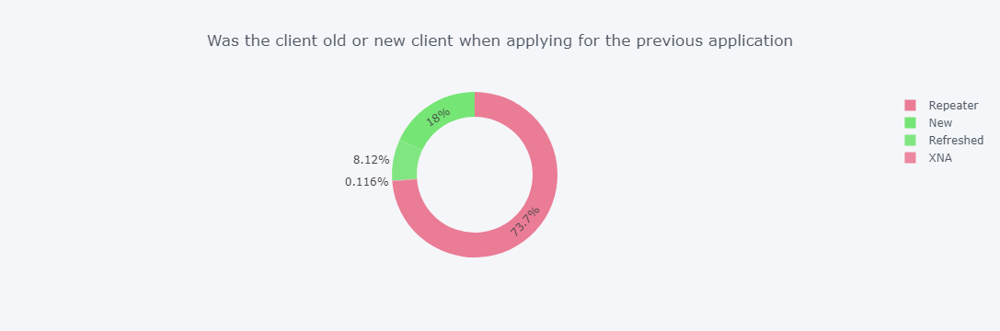

In [65]:
temp = df_previous_application["NAME_CLIENT_TYPE"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Was the client old or new client when applying for the previous application', hole = 0.7,colors=['#ea7c96','#75e575',])

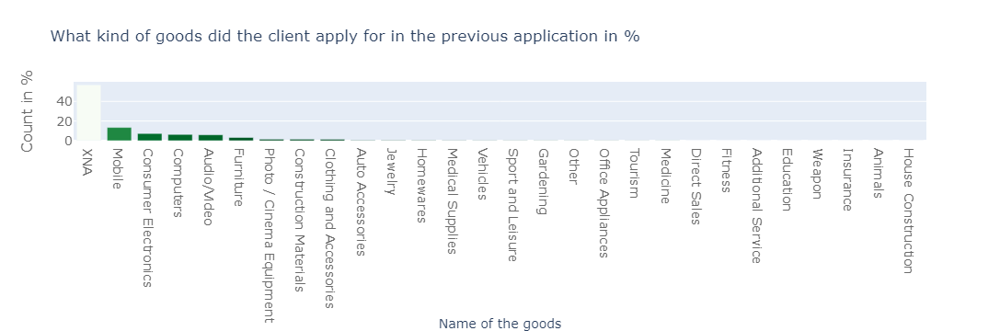

In [66]:
temp = df_previous_application["NAME_GOODS_CATEGORY"].value_counts()
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
    marker=dict(
        color=(temp / temp.sum())*100,
        colorscale = 'Greens',
        reversescale = True
    ),
)
data = [trace]
layout = go.Layout(
    title = "What kind of goods did the client apply for in the previous application in % ",
    xaxis=dict(
        title='Name of the goods',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

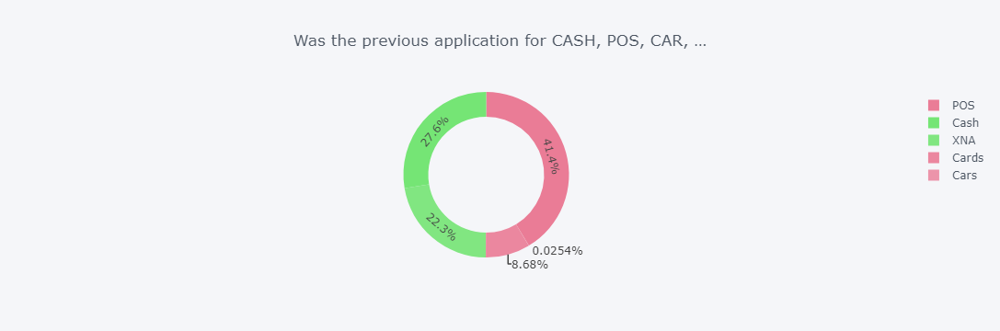

In [67]:
temp = df_previous_application["NAME_PORTFOLIO"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Was the previous application for CASH, POS, CAR, …', hole = 0.7,colors=['#ea7c96','#75e575',])

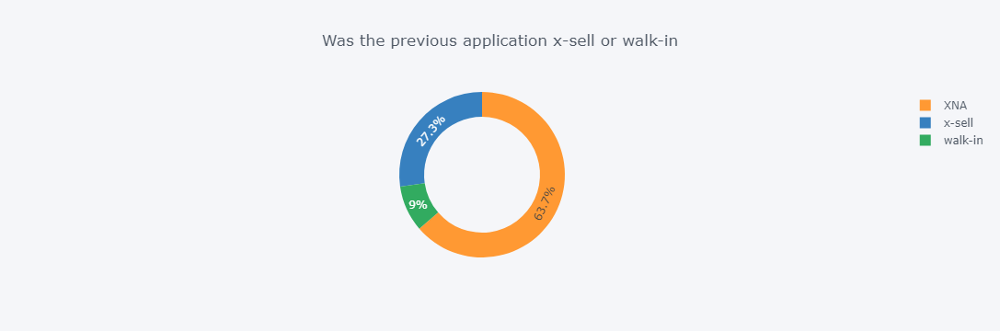

In [68]:
temp = df_previous_application["NAME_PRODUCT_TYPE"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Was the previous application x-sell or walk-in', hole = 0.7)

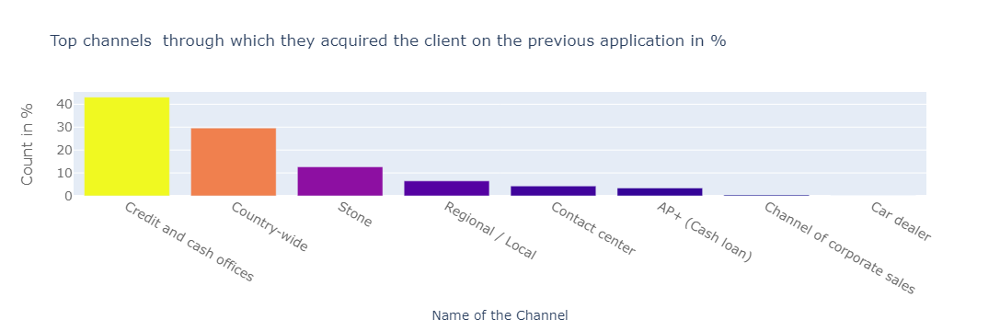

In [69]:
temp = df_previous_application["CHANNEL_TYPE"].value_counts()
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
    marker=dict(
        color=(temp / temp.sum())*100,
#         colorscale = 'Violet',
#         reversescale = True
    ),
)
data = [trace]
layout = go.Layout(
    title = "Top channels  through which they acquired the client on the previous application in % ",
    xaxis=dict(
        title='Name of the Channel',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

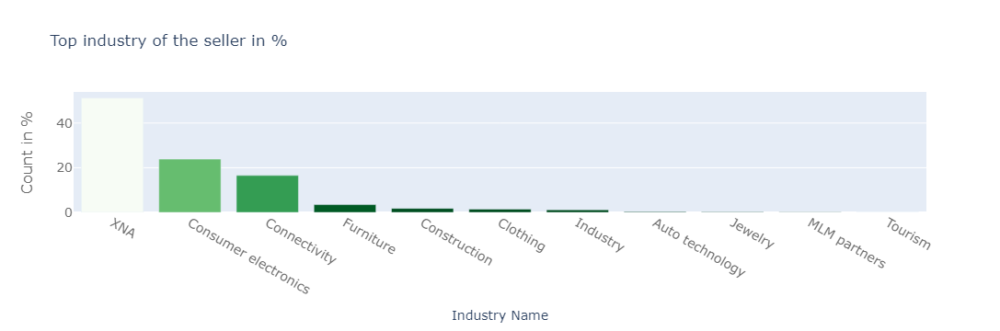

In [70]:
temp = df_previous_application["NAME_SELLER_INDUSTRY"].value_counts()
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
    marker=dict(
        color=(temp / temp.sum())*100,
        colorscale = 'Greens',
        reversescale = True
    ),
)
data = [trace]
layout = go.Layout(
    title = "Top industry of the seller in % ",
    xaxis=dict(
        title='Industry Name',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

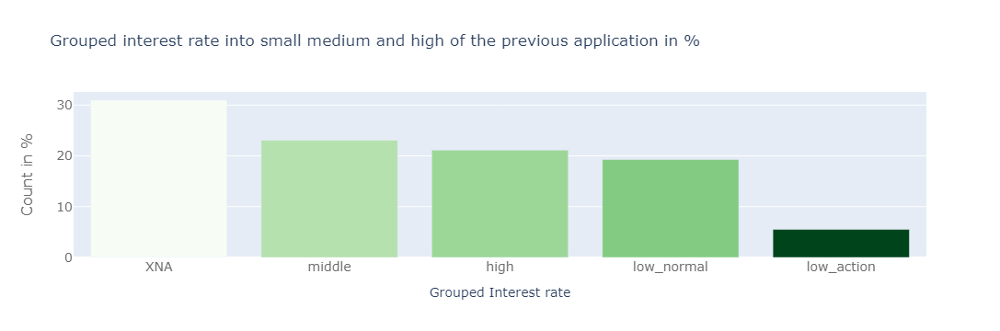

In [71]:
temp = df_previous_application["NAME_YIELD_GROUP"].value_counts()
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
    marker=dict(
        color=(temp / temp.sum())*100,
        colorscale = 'Greens',
        reversescale = True
    ),
)
data = [trace]
layout = go.Layout(
    title = "Grouped interest rate into small medium and high of the previous application in % ",
    xaxis=dict(
        title='Grouped Interest rate',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

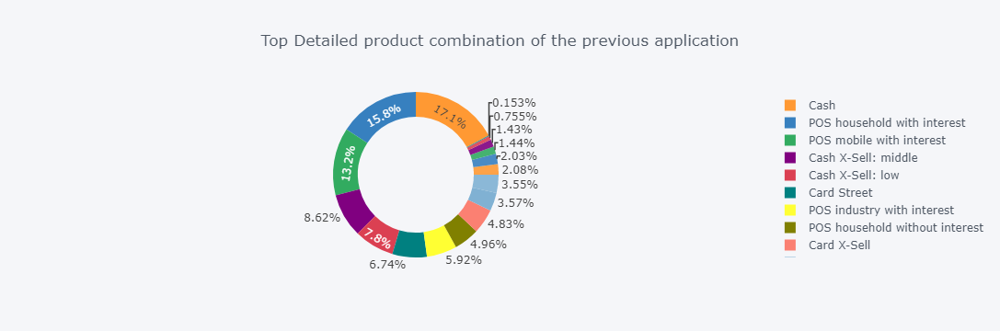

In [72]:
temp = df_previous_application["PRODUCT_COMBINATION"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Top Detailed product combination of the previous application', hole = 0.7)

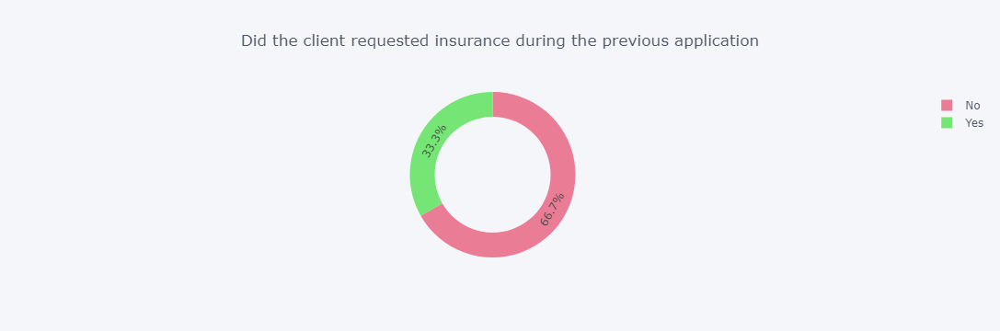

In [73]:
temp = df_previous_application["NFLAG_INSURED_ON_APPROVAL"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.replace([0, 1], ["No", "Yes"], inplace=True)
df.iplot(kind='pie',labels='labels',values='values', title='Did the client requested insurance during the previous application', hole = 0.7, colors=['#ea7c96','#75e575',])

## 1.6 Correlations de Pearson

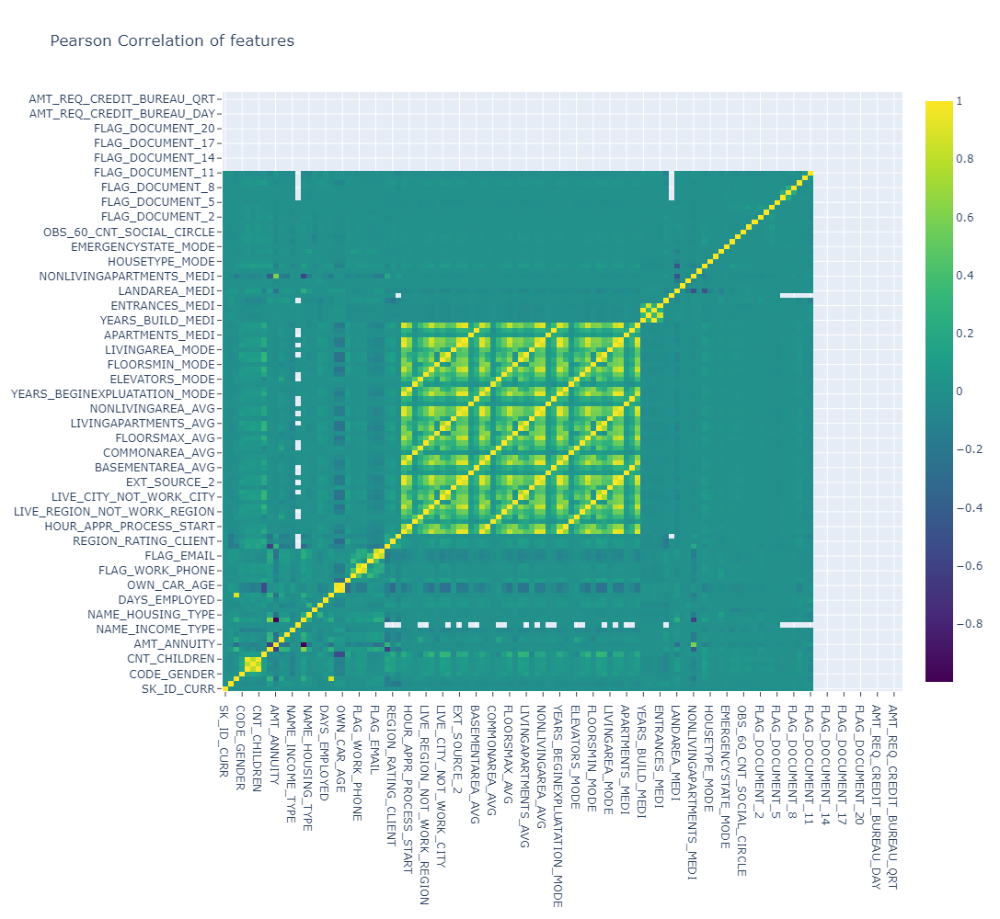

In [74]:
data = [
    go.Heatmap(
        z = df_application_train.corr().values,
        x = df_application_train.columns.values,
        y = df_application_train.columns.values,
        colorscale='Viridis',
        reversescale = False,
        opacity = 1.0)
]

layout = go.Layout(
    title='Pearson Correlation of features',
    xaxis = dict(ticks='outside'),#, nticks=36),
    yaxis = dict(ticks='outside' ),
    width = 1000, height = 1000)
#margin=dict(l=240,))

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='labelled-heatmap')

## 1.7 Encoding

In [75]:
from sklearn.preprocessing import LabelEncoder
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in df_application_train:
    if df_application_train[col].dtype == 'object' or df_application_train[col].dtype == 'category':
        # If 2 or fewer unique categories
        if len(list(df_application_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(df_application_train[col])
            # Transform both training and testing data
            df_application_train[col] = le.transform(df_application_train[col])
            df_application_test[col] = le.transform(df_application_test[col])
            
            # Keep track of how many columns were label encoded
            le_count += 1
            
print('%d columns were label encoded.' % le_count)

LabelEncoder()

LabelEncoder()

LabelEncoder()

3 columns were label encoded.


In [76]:
df_application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,M,0,1,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,F,0,0,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,1,M,1,1,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,F,0,1,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,M,0,1,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [77]:
df_application_train.shape

(307511, 122)

In [49]:
from sklearn.preprocessing import OneHotEncoder

def get_ohe(df, cat_col):
    temp_df = pd.DataFrame(data=ohe.transform(df[cat_col]), columns=ohe.get_feature_names_out())
    df.drop(columns=cat_col, axis=1, inplace=True)
    df = pd.concat([df, temp_df], axis=1) #.reset_index(drop=True)
    return df

In [78]:
ohe = OneHotEncoder(sparse=False)
cat_col = []
for col in df_application_train.columns:
    if df_application_train[col].dtype == 'object' or df_application_train[col].dtype == 'category':
        cat_col.append(col)
cat_col        
ohe.fit(df_application_train[cat_col])



df_application_train = get_ohe(df_application_train, cat_col)
df_application_test = get_ohe(df_application_test, cat_col)

# one-hot encoding of categorical variables
#df_application_train = pd.get_dummies(df_application_train)
#df_application_test = pd.get_dummies(df_application_test)

print('Training Features shape: ', df_application_train.shape)
print('Testing Features shape: ', df_application_test.shape)

['CODE_GENDER',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

OneHotEncoder(sparse=False)

Training Features shape:  (307511, 249)
Testing Features shape:  (48744, 248)


In [79]:
df_application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,WALLSMATERIAL_MODE_nan,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,EMERGENCYSTATE_MODE_nan
0,100002,1,0,0,1,0,202500.0,406597.5,24700.5,351000.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,100003,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,100004,0,1,1,1,0,67500.0,135000.0,6750.0,135000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,100006,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
4,100007,0,0,0,1,0,121500.0,513000.0,21865.5,513000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [80]:
'''train_labels = df_application_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
df_application_train, df_application_test = df_application_train.align(df_application_test, join = 'inner', axis = 1)

# Add the target back in
df_application_train['TARGET'] = train_labels

print('Training Features shape: ', df_application_train.shape)
print('Testing Features shape: ', df_application_test.shape)'''

"train_labels = df_application_train['TARGET']\n\n# Align the training and testing data, keep only columns present in both dataframes\ndf_application_train, df_application_test = df_application_train.align(df_application_test, join = 'inner', axis = 1)\n\n# Add the target back in\ndf_application_train['TARGET'] = train_labels\n\nprint('Training Features shape: ', df_application_train.shape)\nprint('Testing Features shape: ', df_application_test.shape)"

## 1.8 Correction d'anomalies et exploration de certaines corrélations

In [5]:
anom = df_application_train[df_application_train['DAYS_EMPLOYED'] == 365243]
non_anom = df_application_train[df_application_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


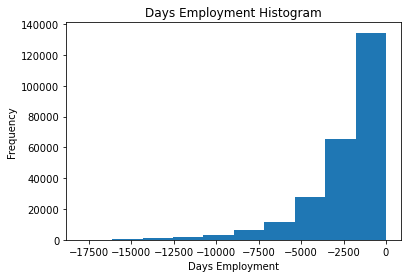

In [6]:
# Create an anomalous flag column
df_application_train['DAYS_EMPLOYED_ANOM'] = df_application_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
df_application_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

df_application_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [7]:
df_application_test['DAYS_EMPLOYED_ANOM'] = df_application_test["DAYS_EMPLOYED"] == 365243
df_application_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('There are %d anomalies in the test data out of %d entries' % (df_application_test["DAYS_EMPLOYED_ANOM"].sum(), len(df_application_test)))

There are 9274 anomalies in the test data out of 48744 entries


In [8]:
# Find the correlation of the positive days since birth and target
df_application_train['DAYS_BIRTH'] = abs(df_application_train['DAYS_BIRTH'])
df_application_test['DAYS_BIRTH'] = abs(df_application_test['DAYS_BIRTH'])

df_application_train['DAYS_BIRTH'].corr(df_application_train['TARGET'])

-0.07823930830982692

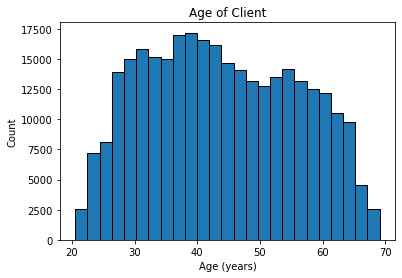

In [9]:
# Plot the distribution of ages in years
plt.hist(df_application_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

<Figure size 720x576 with 0 Axes>

<AxesSubplot:xlabel='DAYS_BIRTH', ylabel='Density'>

<AxesSubplot:xlabel='DAYS_BIRTH', ylabel='Density'>

Text(0.5, 0, 'Age (years)')

Text(0, 0.5, 'Density')

Text(0.5, 1.0, 'Distribution of Ages')

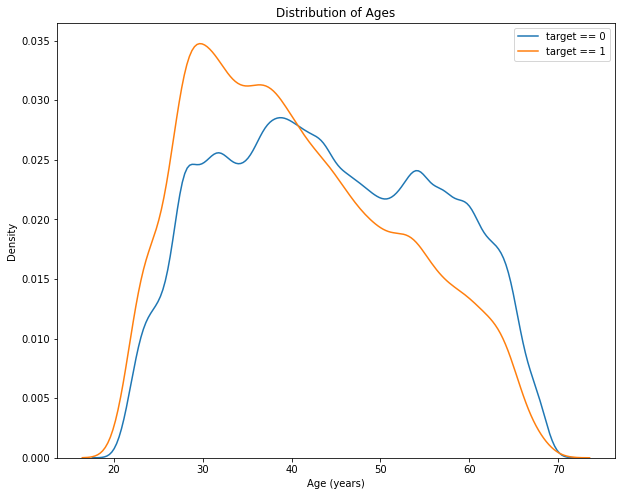

In [10]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages'); plt.legend()

In [11]:
# Age information into a separate dataframe
age_data = df_application_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [12]:
# Group by the bin and calculate averages
age_groups = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


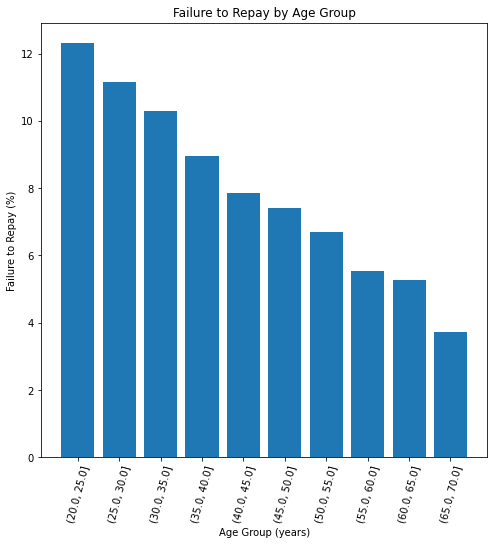

In [13]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

In [14]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = df_application_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,0.600610
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,0.091996
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,0.205478
DAYS_BIRTH,-0.078239,0.600610,0.091996,0.205478,1.000000


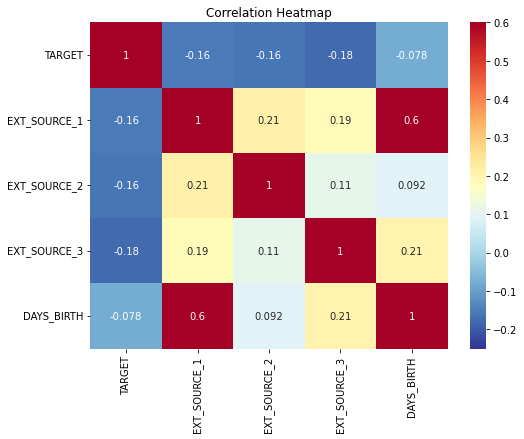

In [15]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

<Figure size 720x864 with 0 Axes>

<AxesSubplot:>

<AxesSubplot:xlabel='EXT_SOURCE_1', ylabel='Density'>

<AxesSubplot:xlabel='EXT_SOURCE_1', ylabel='Density'>

Text(0.5, 1.0, 'Distribution of EXT_SOURCE_1 by Target Value')

Text(0.5, 0, 'EXT_SOURCE_1')

Text(0, 0.5, 'Density')

<AxesSubplot:>

<AxesSubplot:xlabel='EXT_SOURCE_2', ylabel='Density'>

<AxesSubplot:xlabel='EXT_SOURCE_2', ylabel='Density'>

Text(0.5, 1.0, 'Distribution of EXT_SOURCE_2 by Target Value')

Text(0.5, 0, 'EXT_SOURCE_2')

Text(0, 0.5, 'Density')

<AxesSubplot:>

<AxesSubplot:xlabel='EXT_SOURCE_3', ylabel='Density'>

<AxesSubplot:xlabel='EXT_SOURCE_3', ylabel='Density'>

Text(0.5, 1.0, 'Distribution of EXT_SOURCE_3 by Target Value')

Text(0.5, 0, 'EXT_SOURCE_3')

Text(0, 0.5, 'Density')

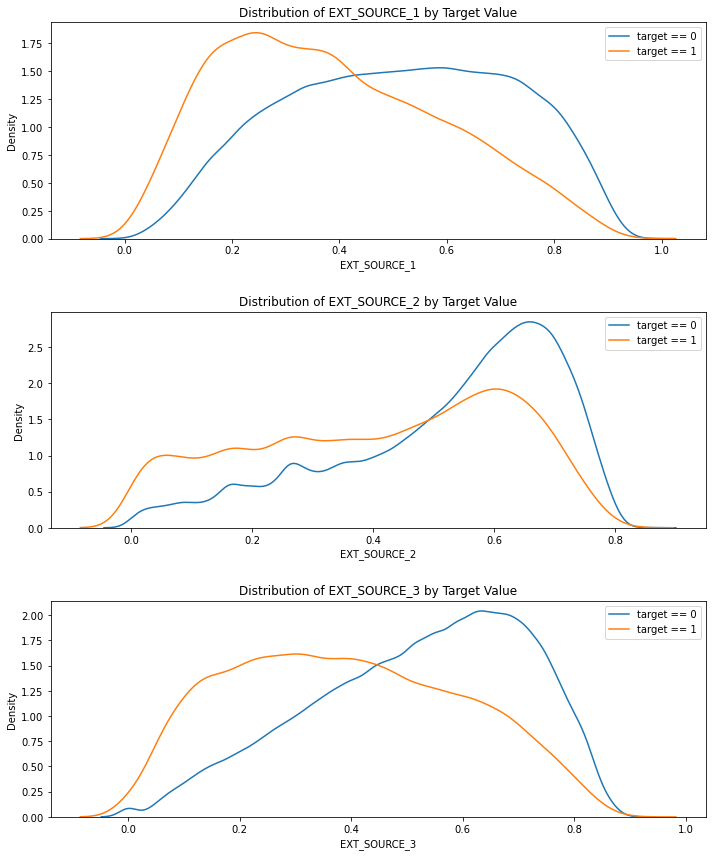

In [16]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 1, source], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density'); plt.legend()
    
plt.tight_layout(h_pad = 2.5)


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/seaborn/axisgrid.py:1209: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



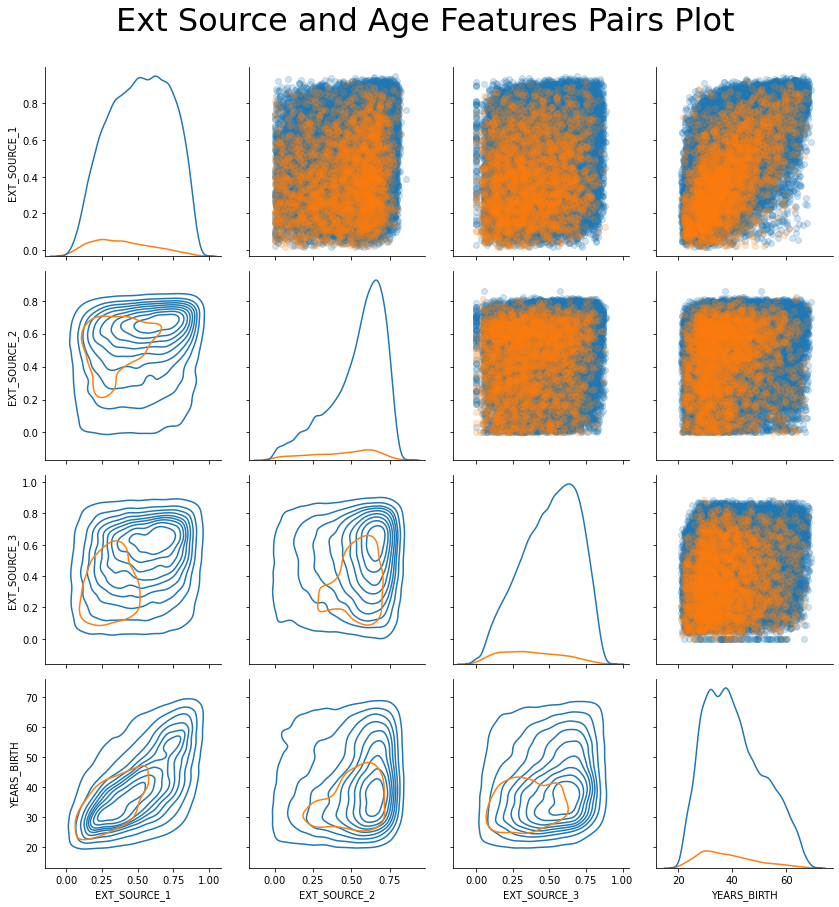

In [93]:
# Copy the data for plotting
plot_data = ext_data.drop(columns = ['DAYS_BIRTH']).copy()

# Add in the age of the client in years
plot_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']

# Drop na values and limit to first 100000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Function to calculate correlation coefficient between two columns
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                height = 20)

# Create the pairgrid object
grid = sns.PairGrid(data = plot_data, size = 3, diag_sharey=False,
                    hue = 'TARGET', 
                    vars = [x for x in list(plot_data.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid.map_upper(plt.scatter, alpha = 0.2)

# Diagonal is a histogram
grid.map_diag(sns.kdeplot)

# Bottom is density plot
grid.map_lower(sns.kdeplot)#, cmap = plt.cm.OrRd_r);

plt.suptitle('Ext Source and Age Features Pairs Plot', size = 32, y = 1.05);

## 1.9 Feature engineering (partie 1)

**Cette première partie était une tentative de feature engineering qui a mal tourné. En effet, le nombre total final de features était trop élevé et l'algorithme de LightGBM ne pouvait tourner, générant une faute mémoire et faisant planter le kernel...**

**La partie No 2 du feature engineering est celle qui a été retenu pour mon étude.**

In [94]:
'''# Make a new dataframe for polynomial features
poly_features = df_application_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET']]
poly_features_test = df_application_test[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]

# imputer for handling missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy = 'median')

poly_target = poly_features['TARGET']

poly_features = poly_features.drop(columns = ['TARGET'])

# Need to impute missing values
poly_features = imputer.fit_transform(poly_features)
poly_features_test = imputer.transform(poly_features_test)

from sklearn.preprocessing import PolynomialFeatures
                                  
# Create the polynomial object with specified degree
poly_transformer = PolynomialFeatures(degree = 3)'''

"# Make a new dataframe for polynomial features\npoly_features = df_application_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET']]\npoly_features_test = df_application_test[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]\n\n# imputer for handling missing values\nfrom sklearn.impute import SimpleImputer\nimputer = SimpleImputer(strategy = 'median')\n\npoly_target = poly_features['TARGET']\n\npoly_features = poly_features.drop(columns = ['TARGET'])\n\n# Need to impute missing values\npoly_features = imputer.fit_transform(poly_features)\npoly_features_test = imputer.transform(poly_features_test)\n\nfrom sklearn.preprocessing import PolynomialFeatures\n                                  \n# Create the polynomial object with specified degree\npoly_transformer = PolynomialFeatures(degree = 3)"

In [95]:
'''# Train the polynomial features
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
poly_features_test = poly_transformer.transform(poly_features_test)
print('Polynomial Features shape: ', poly_features.shape)'''

"# Train the polynomial features\npoly_transformer.fit(poly_features)\n\n# Transform the features\npoly_features = poly_transformer.transform(poly_features)\npoly_features_test = poly_transformer.transform(poly_features_test)\nprint('Polynomial Features shape: ', poly_features.shape)"

In [96]:
#poly_transformer.get_feature_names_out(input_features = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH'])[:15]

In [97]:
'''# Create a dataframe of the features 
poly_features = pd.DataFrame(poly_features, 
                             columns = poly_transformer.get_feature_names_out(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                               'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Add in the target
poly_features['TARGET'] = poly_target

# Find the correlations with the target
poly_corrs = poly_features.corr()['TARGET'].sort_values()

# Display most negative and most positive
print(poly_corrs.head(10))
print(poly_corrs.tail(5))'''

"# Create a dataframe of the features \npoly_features = pd.DataFrame(poly_features, \n                             columns = poly_transformer.get_feature_names_out(['EXT_SOURCE_1', 'EXT_SOURCE_2', \n                                                                               'EXT_SOURCE_3', 'DAYS_BIRTH']))\n\n# Add in the target\npoly_features['TARGET'] = poly_target\n\n# Find the correlations with the target\npoly_corrs = poly_features.corr()['TARGET'].sort_values()\n\n# Display most negative and most positive\nprint(poly_corrs.head(10))\nprint(poly_corrs.tail(5))"

In [98]:
'''# Put test features into dataframe
poly_features_test = pd.DataFrame(poly_features_test, 
                                  columns = poly_transformer.get_feature_names_out(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                                    'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Merge polynomial features into training dataframe
poly_features['SK_ID_CURR'] = df_application_train['SK_ID_CURR']
app_train_poly = df_application_train.merge(poly_features, on = 'SK_ID_CURR', how = 'left')

# Merge polnomial features into testing dataframe
poly_features_test['SK_ID_CURR'] = df_application_test['SK_ID_CURR']
app_test_poly = df_application_test.merge(poly_features_test, on = 'SK_ID_CURR', how = 'left')

# Align the dataframes
app_train_poly, app_test_poly = app_train_poly.align(app_test_poly, join = 'inner', axis = 1)

# Print out the new shapes
print('Training data with polynomial features shape: ', app_train_poly.shape)
print('Testing data with polynomial features shape:  ', app_test_poly.shape)'''

"# Put test features into dataframe\npoly_features_test = pd.DataFrame(poly_features_test, \n                                  columns = poly_transformer.get_feature_names_out(['EXT_SOURCE_1', 'EXT_SOURCE_2', \n                                                                                    'EXT_SOURCE_3', 'DAYS_BIRTH']))\n\n# Merge polynomial features into training dataframe\npoly_features['SK_ID_CURR'] = df_application_train['SK_ID_CURR']\napp_train_poly = df_application_train.merge(poly_features, on = 'SK_ID_CURR', how = 'left')\n\n# Merge polnomial features into testing dataframe\npoly_features_test['SK_ID_CURR'] = df_application_test['SK_ID_CURR']\napp_test_poly = df_application_test.merge(poly_features_test, on = 'SK_ID_CURR', how = 'left')\n\n# Align the dataframes\napp_train_poly, app_test_poly = app_train_poly.align(app_test_poly, join = 'inner', axis = 1)\n\n# Print out the new shapes\nprint('Training data with polynomial features shape: ', app_train_poly.shape)\nprint('Te

In [99]:
'''app_train_domain = df_application_train.copy()
app_test_domain = df_application_test.copy()

app_train_domain['CREDIT_INCOME_PERCENT'] = app_train_domain['AMT_CREDIT'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['ANNUITY_INCOME_PERCENT'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['CREDIT_TERM'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_CREDIT']
app_train_domain['DAYS_EMPLOYED_PERCENT'] = app_train_domain['DAYS_EMPLOYED'] / app_train_domain['DAYS_BIRTH']'''

"app_train_domain = df_application_train.copy()\napp_test_domain = df_application_test.copy()\n\napp_train_domain['CREDIT_INCOME_PERCENT'] = app_train_domain['AMT_CREDIT'] / app_train_domain['AMT_INCOME_TOTAL']\napp_train_domain['ANNUITY_INCOME_PERCENT'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_INCOME_TOTAL']\napp_train_domain['CREDIT_TERM'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_CREDIT']\napp_train_domain['DAYS_EMPLOYED_PERCENT'] = app_train_domain['DAYS_EMPLOYED'] / app_train_domain['DAYS_BIRTH']"

In [100]:
'''app_test_domain['CREDIT_INCOME_PERCENT'] = app_test_domain['AMT_CREDIT'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['ANNUITY_INCOME_PERCENT'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['CREDIT_TERM'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_CREDIT']
app_test_domain['DAYS_EMPLOYED_PERCENT'] = app_test_domain['DAYS_EMPLOYED'] / app_test_domain['DAYS_BIRTH']'''

"app_test_domain['CREDIT_INCOME_PERCENT'] = app_test_domain['AMT_CREDIT'] / app_test_domain['AMT_INCOME_TOTAL']\napp_test_domain['ANNUITY_INCOME_PERCENT'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_INCOME_TOTAL']\napp_test_domain['CREDIT_TERM'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_CREDIT']\napp_test_domain['DAYS_EMPLOYED_PERCENT'] = app_test_domain['DAYS_EMPLOYED'] / app_test_domain['DAYS_BIRTH']"

In [101]:
'''plt.figure(figsize = (12, 20))
# iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):
    
    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density'); plt.legend()
    
plt.tight_layout(h_pad = 2.5)'''

"plt.figure(figsize = (12, 20))\n# iterate through the new features\nfor i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):\n    \n    # create a new subplot for each source\n    plt.subplot(4, 1, i + 1)\n    # plot repaid loans\n    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')\n    # plot loans that were not repaid\n    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')\n    \n    # Label the plots\n    plt.title('Distribution of %s by Target Value' % feature)\n    plt.xlabel('%s' % feature); plt.ylabel('Density'); plt.legend()\n    \nplt.tight_layout(h_pad = 2.5)"

### 1.9.1 Bureau & bureau_balance

In [102]:
# Groupby the client id (SK_ID_CURR), count the number of previous loans, and rename the column
previous_loan_counts = df_bureau.groupby('SK_ID_CURR', as_index=False)['SK_ID_BUREAU'].count().rename(columns = {'SK_ID_BUREAU': 'previous_loan_counts'})
previous_loan_counts.head()

,SK_ID_CURR,previous_loan_counts
0,100001,7
1,100002,8
2,100003,4
3,100004,2
4,100005,3


In [103]:
df_application_train = df_application_train.merge(previous_loan_counts, on = 'SK_ID_CURR', how = 'left')

# Fill the missing values with 0 
df_application_train['previous_loan_counts'] = df_application_train['previous_loan_counts'].fillna(0)
df_application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,WALLSMATERIAL_MODE_nan,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,EMERGENCYSTATE_MODE_nan,DAYS_EMPLOYED_ANOM,previous_loan_counts
0,100002,1,0,0,1,0,202500.0,406597.5,24700.5,351000.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,False,8.0
1,100003,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,False,4.0
2,100004,0,1,1,1,0,67500.0,135000.0,6750.0,135000.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,False,2.0
3,100006,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0
4,100007,0,0,0,1,0,121500.0,513000.0,21865.5,513000.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,False,1.0


In [104]:
# Plots the disribution of a variable colored by value of the target
def kde_target(var_name, df):
    
    # Calculate the correlation coefficient between the new variable and the target
    corr = df['TARGET'].corr(df[var_name])
    
    # Calculate medians for repaid vs not repaid
    avg_repaid = df.loc[df['TARGET'] == 0, var_name].median()
    avg_not_repaid = df.loc[df['TARGET'] == 1, var_name].median()
    
    plt.figure(figsize = (12, 6))
    
    # Plot the distribution for target == 0 and target == 1
    sns.kdeplot(df.loc[df['TARGET'] == 0, var_name], label = 'TARGET == 0')
    sns.kdeplot(df.loc[df['TARGET'] == 1, var_name], label = 'TARGET == 1')
    
    # label the plot
    plt.xlabel(var_name); plt.ylabel('Density'); plt.title('%s Distribution' % var_name)
    plt.legend();
    
    # print out the correlation
    print('The correlation between %s and the TARGET is %0.4f' % (var_name, corr))
    # Print out average values
    print('Median value for loan that was not repaid = %0.4f' % avg_not_repaid)
    print('Median value for loan that was repaid =     %0.4f' % avg_repaid)

The correlation between previous_loan_counts and the TARGET is -0.0100
Median value for loan that was not repaid = 3.0000
Median value for loan that was repaid =     4.0000


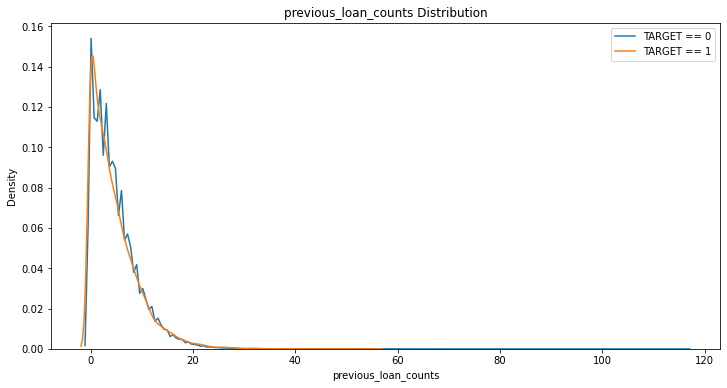

In [105]:
kde_target('previous_loan_counts', df_application_train)

In [106]:
# Group by the client id, calculate aggregation statistics
bureau_agg = df_bureau.drop(columns = ['SK_ID_BUREAU']).groupby('SK_ID_CURR', as_index = False).agg(['count', 'mean', 'max', 'min', 'sum']).reset_index()
bureau_agg.head()

SK_ID_CURR DAYS_CREDIT                               CREDIT_DAY_OVERDUE  \
                   count         mean  max   min   sum              count   
0     100001           7  -735.000000  -49 -1572 -5145                  7   
1     100002           8  -874.000000 -103 -1437 -6992                  8   
2     100003           4 -1400.750000 -606 -2586 -5603                  4   
3     100004           2  -867.000000 -408 -1326 -1734                  2   
4     100005           3  -190.666667  -62  -373  -572                  3   

                ... DAYS_CREDIT_UPDATE                               \
  mean max min  ...              count        mean  max   min   sum   
0  0.0   0   0  ...                  7  -93.142857   -6  -155  -652   
1  0.0   0   0  ...                  8 -499.875000   -7 -1185 -3999   
2  0.0   0   0  ...                  4 -816.000000  -43 -2131 -3264   
3  0.0   0   0  ...                  2 -532.000000 -382  -682 -1064   
4  0.0   0   0  ...                  3  -54.333333  -11  -121  -163   

  AMT_ANNUITY                                      
        count         mean      max  min      sum  
0           7  3545.357143  10822.5  0.0  24817.5  
1           7     0.000000      0.0  0.0      0.0  
2           0          NaN      NaN  NaN      0.0  
3           0          NaN      NaN  NaN      0.0  
4           3  1420.500000   4261.5  0.0   4261.5  

[5 rows x 61 columns]

In [107]:
# List of column names
columns = ['SK_ID_CURR']

# Iterate through the variables names
for var in bureau_agg.columns.levels[0]:
    # Skip the id name
    if var != 'SK_ID_CURR':
        
        # Iterate through the stat names
        for stat in bureau_agg.columns.levels[1][:-1]:
            # Make a new column name for the variable and stat
            columns.append('bureau_%s_%s' % (var, stat))

In [108]:
# Assign the list of columns names as the dataframe column names
bureau_agg.columns = columns
bureau_agg.head()

,SK_ID_CURR,bureau_DAYS_CREDIT_count,bureau_DAYS_CREDIT_mean,bureau_DAYS_CREDIT_max,bureau_DAYS_CREDIT_min,bureau_DAYS_CREDIT_sum,bureau_CREDIT_DAY_OVERDUE_count,bureau_CREDIT_DAY_OVERDUE_mean,bureau_CREDIT_DAY_OVERDUE_max,bureau_CREDIT_DAY_OVERDUE_min,...,bureau_DAYS_CREDIT_UPDATE_count,bureau_DAYS_CREDIT_UPDATE_mean,bureau_DAYS_CREDIT_UPDATE_max,bureau_DAYS_CREDIT_UPDATE_min,bureau_DAYS_CREDIT_UPDATE_sum,bureau_AMT_ANNUITY_count,bureau_AMT_ANNUITY_mean,bureau_AMT_ANNUITY_max,bureau_AMT_ANNUITY_min,bureau_AMT_ANNUITY_sum
0,100001,7,-735.000000,-49,-1572,-5145,7,0.0,0,0,...,7,-93.142857,-6,-155,-652,7,3545.357143,10822.5,0.0,24817.5
1,100002,8,-874.000000,-103,-1437,-6992,8,0.0,0,0,...,8,-499.875000,-7,-1185,-3999,7,0.000000,0.0,0.0,0.0
2,100003,4,-1400.750000,-606,-2586,-5603,4,0.0,0,0,...,4,-816.000000,-43,-2131,-3264,0,NaN,NaN,NaN,0.0
3,100004,2,-867.000000,-408,-1326,-1734,2,0.0,0,0,...,2,-532.000000,-382,-682,-1064,0,NaN,NaN,NaN,0.0
4,100005,3,-190.666667,-62,-373,-572,3,0.0,0,0,...,3,-54.333333,-11,-121,-163,3,1420.500000,4261.5,0.0,4261.5


In [109]:
# Merge with the training data
df_application_train = df_application_train.merge(bureau_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,bureau_DAYS_CREDIT_UPDATE_count,bureau_DAYS_CREDIT_UPDATE_mean,bureau_DAYS_CREDIT_UPDATE_max,bureau_DAYS_CREDIT_UPDATE_min,bureau_DAYS_CREDIT_UPDATE_sum,bureau_AMT_ANNUITY_count,bureau_AMT_ANNUITY_mean,bureau_AMT_ANNUITY_max,bureau_AMT_ANNUITY_min,bureau_AMT_ANNUITY_sum
0,100002,1,0,0,1,0,202500.0,406597.5,24700.5,351000.0,...,8.0,-499.875,-7.0,-1185.0,-3999.0,7.0,0.0,0.0,0.0,0.0
1,100003,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,...,4.0,-816.000,-43.0,-2131.0,-3264.0,0.0,NaN,NaN,NaN,0.0
2,100004,0,1,1,1,0,67500.0,135000.0,6750.0,135000.0,...,2.0,-532.000,-382.0,-682.0,-1064.0,0.0,NaN,NaN,NaN,0.0
3,100006,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,0,1,0,121500.0,513000.0,21865.5,513000.0,...,1.0,-783.000,-783.0,-783.0,-783.0,0.0,NaN,NaN,NaN,0.0


In [110]:
# List of new correlations
new_corrs = []

# Iterate through the columns 
for col in columns:
    # Calculate correlation with the target
    corr = df_application_train['TARGET'].corr(df_application_train[col])
    
    # Append the list as a tuple
    new_corrs.append((col, corr))

In [111]:
# Sort the correlations by the absolute value
# Make sure to reverse to put the largest values at the front of list
new_corrs = sorted(new_corrs, key = lambda x: abs(x[1]), reverse = True)
new_corrs[:15]

[('bureau_DAYS_CREDIT_mean', 0.08972896721998116),
 ('bureau_DAYS_CREDIT_min', 0.0752482510301037),
 ('bureau_DAYS_CREDIT_UPDATE_mean', 0.06892735266968673),
 ('bureau_DAYS_ENDDATE_FACT_min', 0.05588737984392085),
 ('bureau_DAYS_CREDIT_ENDDATE_sum', 0.053734895601020544),
 ('bureau_DAYS_ENDDATE_FACT_mean', 0.053199625857586336),
 ('bureau_DAYS_CREDIT_max', 0.049782054639973074),
 ('bureau_DAYS_ENDDATE_FACT_sum', 0.04885350261111597),
 ('bureau_DAYS_CREDIT_ENDDATE_mean', 0.046982754334835404),
 ('bureau_DAYS_CREDIT_UPDATE_min', 0.042863922470730204),
 ('bureau_DAYS_CREDIT_sum', 0.041999824814846765),
 ('bureau_DAYS_CREDIT_UPDATE_sum', 0.04140363535306015),
 ('bureau_DAYS_CREDIT_ENDDATE_max', 0.03658963469632896),
 ('bureau_DAYS_CREDIT_ENDDATE_min', 0.034281109921615996),
 ('bureau_DAYS_ENDDATE_FACT_count', -0.03049230665332553)]

The correlation between bureau_DAYS_CREDIT_mean and the TARGET is 0.0897
Median value for loan that was not repaid = -835.3333
Median value for loan that was repaid =     -1067.0000


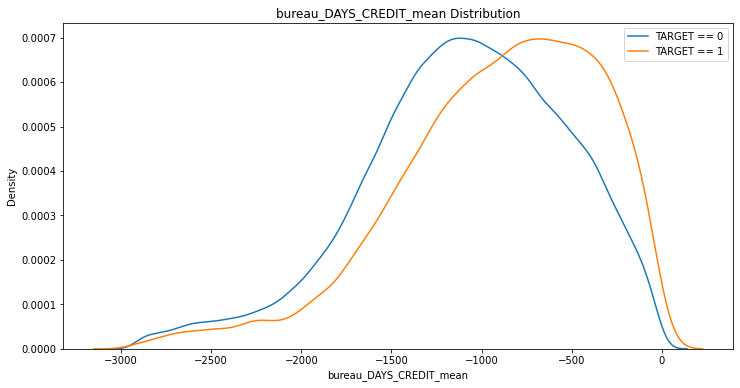

In [112]:
kde_target('bureau_DAYS_CREDIT_mean', df_application_train)

In [113]:
def agg_numeric(df, group_var, df_name):
    """Aggregates the numeric values in a dataframe. This can
    be used to create features for each instance of the grouping variable.
    
    Parameters
    --------
        df (dataframe): 
            the dataframe to calculate the statistics on
        group_var (string): 
            the variable by which to group df
        df_name (string): 
            the variable used to rename the columns
        
    Return
    --------
        agg (dataframe): 
            a dataframe with the statistics aggregated for 
            all numeric columns. Each instance of the grouping variable will have 
            the statistics (mean, min, max, sum; currently supported) calculated. 
            The columns are also renamed to keep track of features created.
    
    """
    # Remove id variables other than grouping variable
    for col in df:
        if col != group_var and 'SK_ID' in col:
            df = df.drop(columns = col)
            
    group_ids = df[group_var]
    numeric_df = df.select_dtypes('number')
    numeric_df[group_var] = group_ids

    # Group by the specified variable and calculate the statistics
    agg = numeric_df.groupby(group_var).agg(['count', 'mean', 'max', 'min', 'sum']).reset_index()

    # Need to create new column names
    columns = [group_var]

    # Iterate through the variables names
    for var in agg.columns.levels[0]:
        # Skip the grouping variable
        if var != group_var:
            # Iterate through the stat names
            for stat in agg.columns.levels[1][:-1]:
                # Make a new column name for the variable and stat
                columns.append('%s_%s_%s' % (df_name, var, stat))

    agg.columns = columns
    return agg

In [114]:
# Function to calculate correlations with the target for a dataframe
def target_corrs(df):

    # List of correlations
    corrs = []

    # Iterate through the columns 
    for col in df.columns:
        print(col)
        # Skip the target column
        if col != 'TARGET':
            # Calculate correlation with the target
            corr = df['TARGET'].corr(df[col])

            # Append the list as a tuple
            corrs.append((col, corr))
            
    # Sort by absolute magnitude of correlations
    corrs = sorted(corrs, key = lambda x: abs(x[1]), reverse = True)
    
    return corrs

In [115]:
categorical = pd.get_dummies(df_bureau.select_dtypes('object'))
categorical['SK_ID_CURR'] = df_bureau['SK_ID_CURR']
categorical.head()

,CREDIT_ACTIVE_Active,CREDIT_ACTIVE_Bad debt,CREDIT_ACTIVE_Closed,CREDIT_ACTIVE_Sold,CREDIT_CURRENCY_currency 1,CREDIT_CURRENCY_currency 2,CREDIT_CURRENCY_currency 3,CREDIT_CURRENCY_currency 4,CREDIT_TYPE_Another type of loan,CREDIT_TYPE_Car loan,...,CREDIT_TYPE_Loan for business development,CREDIT_TYPE_Loan for purchase of shares (margin lending),CREDIT_TYPE_Loan for the purchase of equipment,CREDIT_TYPE_Loan for working capital replenishment,CREDIT_TYPE_Microloan,CREDIT_TYPE_Mobile operator loan,CREDIT_TYPE_Mortgage,CREDIT_TYPE_Real estate loan,CREDIT_TYPE_Unknown type of loan,SK_ID_CURR
0,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,215354
1,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,215354
2,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,215354
3,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,215354
4,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,215354


In [116]:
categorical_grouped = categorical.groupby('SK_ID_CURR').agg(['sum', 'mean'])
categorical_grouped.head()

CREDIT_ACTIVE_Active           CREDIT_ACTIVE_Bad debt       \
                            sum      mean                    sum mean   
SK_ID_CURR                                                              
100001                        3  0.428571                      0  0.0   
100002                        2  0.250000                      0  0.0   
100003                        1  0.250000                      0  0.0   
100004                        0  0.000000                      0  0.0   
100005                        2  0.666667                      0  0.0   

           CREDIT_ACTIVE_Closed           CREDIT_ACTIVE_Sold       \
                            sum      mean                sum mean   
SK_ID_CURR                                                          
100001                        4  0.571429                  0  0.0   
100002                        6  0.750000                  0  0.0   
100003                        3  0.750000                  0  0.0   
100004                        2  1.000000                  0  0.0   
100005                        1  0.333333                  0  0.0   

           CREDIT_CURRENCY_currency 1       ... CREDIT_TYPE_Microloan       \
                                  sum mean  ...                   sum mean   
SK_ID_CURR                                  ...                              
100001                              7  1.0  ...                     0  0.0   
100002                              8  1.0  ...                     0  0.0   
100003                              4  1.0  ...                     0  0.0   
100004                              2  1.0  ...                     0  0.0   
100005                              3  1.0  ...                     0  0.0   

           CREDIT_TYPE_Mobile operator loan      CREDIT_TYPE_Mortgage       \
                                        sum mean                  sum mean   
SK_ID_CURR                                                                   
100001                                    0  0.0                    0  0.0   
100002                                    0  0.0                    0  0.0   
100003                                    0  0.0                    0  0.0   
100004                                    0  0.0                    0  0.0   
100005                                    0  0.0                    0  0.0   

           CREDIT_TYPE_Real estate loan      CREDIT_TYPE_Unknown type of loan  \
                                    sum mean                              sum   
SK_ID_CURR                                                                      
100001                                0  0.0                                0   
100002                                0  0.0                                0   
100003                                0  0.0                                0   
100004                                0  0.0                                0   
100005                                0  0.0                                0   

                 
           mean  
SK_ID_CURR       
100001      0.0  
100002      0.0  
100003      0.0  
100004      0.0  
100005      0.0  

[5 rows x 46 columns]

In [117]:
categorical_grouped.columns.levels[0][:10]

Index(['CREDIT_ACTIVE_Active', 'CREDIT_ACTIVE_Bad debt',
       'CREDIT_ACTIVE_Closed', 'CREDIT_ACTIVE_Sold',
       'CREDIT_CURRENCY_currency 1', 'CREDIT_CURRENCY_currency 2',
       'CREDIT_CURRENCY_currency 3', 'CREDIT_CURRENCY_currency 4',
       'CREDIT_TYPE_Another type of loan', 'CREDIT_TYPE_Car loan'],
      dtype='object')

In [118]:
categorical_grouped.columns.levels[1]

Index(['sum', 'mean'], dtype='object')

In [119]:
group_var = 'SK_ID_CURR'

# Need to create new column names
columns = []

# Iterate through the variables names
for var in categorical_grouped.columns.levels[0]:
    # Skip the grouping variable
    if var != group_var:
        # Iterate through the stat names
        for stat in ['count', 'count_norm']:
            # Make a new column name for the variable and stat
            columns.append('%s_%s' % (var, stat))

#  Rename the columns
categorical_grouped.columns = columns

categorical_grouped.head()

,CREDIT_ACTIVE_Active_count,CREDIT_ACTIVE_Active_count_norm,CREDIT_ACTIVE_Bad debt_count,CREDIT_ACTIVE_Bad debt_count_norm,CREDIT_ACTIVE_Closed_count,CREDIT_ACTIVE_Closed_count_norm,CREDIT_ACTIVE_Sold_count,CREDIT_ACTIVE_Sold_count_norm,CREDIT_CURRENCY_currency 1_count,CREDIT_CURRENCY_currency 1_count_norm,...,CREDIT_TYPE_Microloan_count,CREDIT_TYPE_Microloan_count_norm,CREDIT_TYPE_Mobile operator loan_count,CREDIT_TYPE_Mobile operator loan_count_norm,CREDIT_TYPE_Mortgage_count,CREDIT_TYPE_Mortgage_count_norm,CREDIT_TYPE_Real estate loan_count,CREDIT_TYPE_Real estate loan_count_norm,CREDIT_TYPE_Unknown type of loan_count,CREDIT_TYPE_Unknown type of loan_count_norm
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,3,0.428571,0,0.0,4,0.571429,0,0.0,7,1.0,...,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0
100002,2,0.250000,0,0.0,6,0.750000,0,0.0,8,1.0,...,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0
100003,1,0.250000,0,0.0,3,0.750000,0,0.0,4,1.0,...,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0
100004,0,0.000000,0,0.0,2,1.000000,0,0.0,2,1.0,...,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0
100005,2,0.666667,0,0.0,1,0.333333,0,0.0,3,1.0,...,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0


In [120]:
df_application_train = df_application_train.merge(categorical_grouped, left_on = 'SK_ID_CURR', right_index = True, how = 'left')
df_application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CREDIT_TYPE_Microloan_count,CREDIT_TYPE_Microloan_count_norm,CREDIT_TYPE_Mobile operator loan_count,CREDIT_TYPE_Mobile operator loan_count_norm,CREDIT_TYPE_Mortgage_count,CREDIT_TYPE_Mortgage_count_norm,CREDIT_TYPE_Real estate loan_count,CREDIT_TYPE_Real estate loan_count_norm,CREDIT_TYPE_Unknown type of loan_count,CREDIT_TYPE_Unknown type of loan_count_norm
0,100002,1,0,0,1,0,202500.0,406597.5,24700.5,351000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,100003,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,1,1,1,0,67500.0,135000.0,6750.0,135000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,0,1,0,121500.0,513000.0,21865.5,513000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [121]:
def count_categorical(df, group_var, df_name):
    """Computes counts and normalized counts for each observation
    of `group_var` of each unique category in every categorical variable
    
    Parameters
    --------
    df : dataframe 
        The dataframe to calculate the value counts for.
        
    group_var : string
        The variable by which to group the dataframe. For each unique
        value of this variable, the final dataframe will have one row
        
    df_name : string
        Variable added to the front of column names to keep track of columns

    
    Return
    --------
    categorical : dataframe
        A dataframe with counts and normalized counts of each unique category in every categorical variable
        with one row for every unique value of the `group_var`.
        
    """
    
    # Select the categorical columns
    categorical = pd.get_dummies(df.select_dtypes('object'))

    # Make sure to put the identifying id on the column
    categorical[group_var] = df[group_var]

    # Groupby the group var and calculate the sum and mean
    categorical = categorical.groupby(group_var).agg(['sum', 'mean'])
    
    column_names = []
    
    # Iterate through the columns in level 0
    for var in categorical.columns.levels[0]:
        # Iterate through the stats in level 1
        for stat in ['count', 'count_norm']:
            # Make a new column name
            column_names.append('%s_%s_%s' % (df_name, var, stat))
    
    categorical.columns = column_names
    
    return categorical

In [122]:
# Counts of each type of status for each previous loan
bureau_balance_counts = count_categorical(df_bureau_balance, group_var = 'SK_ID_BUREAU', df_name = 'df_bureau_balance')
bureau_balance_counts.head()

,df_bureau_balance_STATUS_0_count,df_bureau_balance_STATUS_0_count_norm,df_bureau_balance_STATUS_1_count,df_bureau_balance_STATUS_1_count_norm,df_bureau_balance_STATUS_2_count,df_bureau_balance_STATUS_2_count_norm,df_bureau_balance_STATUS_3_count,df_bureau_balance_STATUS_3_count_norm,df_bureau_balance_STATUS_4_count,df_bureau_balance_STATUS_4_count_norm,df_bureau_balance_STATUS_5_count,df_bureau_balance_STATUS_5_count_norm,df_bureau_balance_STATUS_C_count,df_bureau_balance_STATUS_C_count_norm,df_bureau_balance_STATUS_X_count,df_bureau_balance_STATUS_X_count_norm
SK_ID_BUREAU,,,,,,,,,,,,,,,,
5001709,0,0.000000,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,86,0.886598,11,0.113402
5001710,5,0.060241,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,48,0.578313,30,0.361446
5001711,3,0.750000,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.000000,1,0.250000
5001712,10,0.526316,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,9,0.473684,0,0.000000
5001713,0,0.000000,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.000000,22,1.000000


In [123]:
# Calculate value count statistics for each `SK_ID_CURR` 
bureau_balance_agg = agg_numeric(df_bureau_balance, group_var = 'SK_ID_BUREAU', df_name = 'df_bureau_balance')
bureau_balance_agg.head()

,SK_ID_BUREAU,df_bureau_balance_MONTHS_BALANCE_count,df_bureau_balance_MONTHS_BALANCE_mean,df_bureau_balance_MONTHS_BALANCE_max,df_bureau_balance_MONTHS_BALANCE_min,df_bureau_balance_MONTHS_BALANCE_sum
0,5001709,97,-48.0,0,-96,-4656
1,5001710,83,-41.0,0,-82,-3403
2,5001711,4,-1.5,0,-3,-6
3,5001712,19,-9.0,0,-18,-171
4,5001713,22,-10.5,0,-21,-231


In [124]:
# Dataframe grouped by the loan
bureau_by_loan = bureau_balance_agg.merge(bureau_balance_counts, right_index = True, left_on = 'SK_ID_BUREAU', how = 'outer')

# Merge to include the SK_ID_CURR
bureau_by_loan = bureau_by_loan.merge(df_bureau[['SK_ID_BUREAU', 'SK_ID_CURR']], on = 'SK_ID_BUREAU', how = 'left')

bureau_by_loan.head()

,SK_ID_BUREAU,df_bureau_balance_MONTHS_BALANCE_count,df_bureau_balance_MONTHS_BALANCE_mean,df_bureau_balance_MONTHS_BALANCE_max,df_bureau_balance_MONTHS_BALANCE_min,df_bureau_balance_MONTHS_BALANCE_sum,df_bureau_balance_STATUS_0_count,df_bureau_balance_STATUS_0_count_norm,df_bureau_balance_STATUS_1_count,df_bureau_balance_STATUS_1_count_norm,...,df_bureau_balance_STATUS_3_count_norm,df_bureau_balance_STATUS_4_count,df_bureau_balance_STATUS_4_count_norm,df_bureau_balance_STATUS_5_count,df_bureau_balance_STATUS_5_count_norm,df_bureau_balance_STATUS_C_count,df_bureau_balance_STATUS_C_count_norm,df_bureau_balance_STATUS_X_count,df_bureau_balance_STATUS_X_count_norm,SK_ID_CURR
0,5001709,97,-48.0,0,-96,-4656,0,0.000000,0,0.0,...,0.0,0,0.0,0,0.0,86,0.886598,11,0.113402,NaN
1,5001710,83,-41.0,0,-82,-3403,5,0.060241,0,0.0,...,0.0,0,0.0,0,0.0,48,0.578313,30,0.361446,162368.0
2,5001711,4,-1.5,0,-3,-6,3,0.750000,0,0.0,...,0.0,0,0.0,0,0.0,0,0.000000,1,0.250000,162368.0
3,5001712,19,-9.0,0,-18,-171,10,0.526316,0,0.0,...,0.0,0,0.0,0,0.0,9,0.473684,0,0.000000,162368.0
4,5001713,22,-10.5,0,-21,-231,0,0.000000,0,0.0,...,0.0,0,0.0,0,0.0,0,0.000000,22,1.000000,150635.0


In [125]:
bureau_balance_by_client = agg_numeric(bureau_by_loan.drop(columns = ['SK_ID_BUREAU']), group_var = 'SK_ID_CURR', df_name = 'client')
bureau_balance_by_client.head()

,SK_ID_CURR,client_df_bureau_balance_MONTHS_BALANCE_count_count,client_df_bureau_balance_MONTHS_BALANCE_count_mean,client_df_bureau_balance_MONTHS_BALANCE_count_max,client_df_bureau_balance_MONTHS_BALANCE_count_min,client_df_bureau_balance_MONTHS_BALANCE_count_sum,client_df_bureau_balance_MONTHS_BALANCE_mean_count,client_df_bureau_balance_MONTHS_BALANCE_mean_mean,client_df_bureau_balance_MONTHS_BALANCE_mean_max,client_df_bureau_balance_MONTHS_BALANCE_mean_min,...,client_df_bureau_balance_STATUS_X_count_count,client_df_bureau_balance_STATUS_X_count_mean,client_df_bureau_balance_STATUS_X_count_max,client_df_bureau_balance_STATUS_X_count_min,client_df_bureau_balance_STATUS_X_count_sum,client_df_bureau_balance_STATUS_X_count_norm_count,client_df_bureau_balance_STATUS_X_count_norm_mean,client_df_bureau_balance_STATUS_X_count_norm_max,client_df_bureau_balance_STATUS_X_count_norm_min,client_df_bureau_balance_STATUS_X_count_norm_sum
0,100001.0,7,24.571429,52,2,172,7,-11.785714,-0.5,-25.5,...,7,4.285714,9,0,30.0,7,0.214590,0.500000,0.0,1.502129
1,100002.0,8,13.750000,22,4,110,8,-21.875000,-1.5,-39.5,...,8,1.875000,3,0,15.0,8,0.161932,0.500000,0.0,1.295455
2,100005.0,3,7.000000,13,3,21,3,-3.000000,-1.0,-6.0,...,3,0.666667,1,0,2.0,3,0.136752,0.333333,0.0,0.410256
3,100010.0,2,36.000000,36,36,72,2,-46.000000,-19.5,-72.5,...,2,0.000000,0,0,0.0,2,0.000000,0.000000,0.0,0.000000
4,100013.0,4,57.500000,69,40,230,4,-28.250000,-19.5,-34.0,...,4,10.250000,40,0,41.0,4,0.254545,1.000000,0.0,1.018182


In [126]:
# Free up memory by deleting old objects
import gc
gc.enable()
del previous_loan_counts, df_application_train, df_bureau_balance, bureau_agg, bureau_balance_agg, bureau_balance_counts, bureau_by_loan, bureau_balance_by_client, df_bureau
gc.collect()

7321

In [1]:
# Read in new copies of all the dataframes
df_application_train = pd.read_csv('Data/application_train.csv')
df_application_test = pd.read_csv('Data/application_test.csv')
df_bureau = pd.read_csv('Data/bureau.csv')
df_bureau_balance = pd.read_csv('Data/bureau_balance.csv')

NameError: name 'pd' is not defined

In [128]:
bureau_counts = count_categorical(df_bureau, group_var = 'SK_ID_CURR', df_name = 'bureau')

In [ ]:
bureau_agg = agg_numeric(df_bureau.drop(columns = ['SK_ID_BUREAU']), group_var = 'SK_ID_CURR', df_name = 'bureau')

In [ ]:
bureau_balance_counts = count_categorical(df_bureau_balance, group_var = 'SK_ID_BUREAU', df_name = 'bureau_balance')

In [ ]:
bureau_balance_agg = agg_numeric(df_bureau_balance, group_var = 'SK_ID_BUREAU', df_name = 'bureau_balance')

In [ ]:
# Dataframe grouped by the loan
bureau_by_loan = bureau_balance_agg.merge(bureau_balance_counts, right_index = True, left_on = 'SK_ID_BUREAU', how = 'outer')

# Merge to include the SK_ID_CURR
bureau_by_loan = df_bureau[['SK_ID_BUREAU', 'SK_ID_CURR']].merge(bureau_by_loan, on = 'SK_ID_BUREAU', how = 'left')

# Aggregate the stats for each client
bureau_balance_by_client = agg_numeric(bureau_by_loan.drop(columns = ['SK_ID_BUREAU']), group_var = 'SK_ID_CURR', df_name = 'client')

In [ ]:
original_features = list(df_application_train.columns)
print('Original Number of Features: ', len(original_features))

#### 1.9.1.1 Jointure des données avec le train set

In [ ]:
# Merge with the value counts of bureau
df_application_train = df_application_train.merge(bureau_counts, on = 'SK_ID_CURR', how = 'left')

# Merge with the stats of bureau
df_application_train = df_application_train.merge(bureau_agg, on = 'SK_ID_CURR', how = 'left')

# Merge with the monthly information grouped by client
df_application_train = df_application_train.merge(bureau_balance_by_client, on = 'SK_ID_CURR', how = 'left')

In [ ]:
new_features = list(df_application_train.columns)
print('Number of features using previous loans from other institutions data: ', len(new_features))

In [ ]:
# Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [ ]:
missing_train = missing_values_table(df_application_train)
missing_train.head(50)

#### 1.9.1.2 Jointure des données avec le test set

In [ ]:
print('Shape of Testing Data: ', df_application_test.shape)

In [ ]:
# Merge with the value counts of bureau
df_application_test = df_application_test.merge(bureau_counts, on = 'SK_ID_CURR', how = 'left')

# Merge with the stats of bureau
df_application_test = df_application_test.merge(bureau_agg, on = 'SK_ID_CURR', how = 'left')

# Merge with the value counts of bureau balance
df_application_test = df_application_test.merge(bureau_balance_by_client, on = 'SK_ID_CURR', how = 'left')

In [ ]:
print('Shape of Testing Data: ', df_application_test.shape)

In [ ]:
train_labels = df_application_train['TARGET']

# Align the dataframes, this will remove the 'TARGET' column
df_application_train, df_application_test = df_application_train.align(df_application_test, join = 'inner', axis = 1)

df_application_train['TARGET'] = train_labels

In [ ]:
print('Training Data Shape: ', df_application_train.shape)
print('Testing Data Shape: ', df_application_test.shape)

In [ ]:
missing_test = missing_values_table(df_application_test)
missing_test.head(50)

In [ ]:
threshold = 60
missing_train_vars = list(missing_train.index[missing_train['% of Total Values'] >= threshold])
len(missing_train_vars)
missing_test_vars = list(missing_test.index[missing_test['% of Total Values'] >= threshold])
len(missing_test_vars)

In [ ]:
missing_columns = list(set(missing_test_vars + missing_train_vars))
print('There are {} columns with more than {} % missing in either the training or testing data.'.format(len(missing_columns), threshold))

In [ ]:
# Drop the missing columns
df_application_train = df_application_train.drop(columns = missing_columns)
df_application_test = df_application_test.drop(columns = missing_columns)

### 1.9.2 Colinéarité

In [ ]:
# Calculate all correlations in dataframe
corrs = df_application_train.corr()

# Set the threshold
threshold = 0.8

# Empty dictionary to hold correlated variables
above_threshold_vars = {}

# For each column, record the variables that are above the threshold
for col in corrs:
    above_threshold_vars[col] = list(corrs.index[corrs[col] > threshold])

In [ ]:
# Track columns to remove and columns already examined
cols_to_remove = []
cols_seen = []
cols_to_remove_pair = []

# Iterate through columns and correlated columns
for key, value in above_threshold_vars.items():
    # Keep track of columns already examined
    cols_seen.append(key)
    for x in value:
        if x == key:
            next
        else:
            # Only want to remove one in a pair
            if x not in cols_seen:
                cols_to_remove.append(x)
                cols_to_remove_pair.append(key)
            
cols_to_remove = list(set(cols_to_remove))
print('Number of columns to remove: ', len(cols_to_remove))

In [ ]:
df_application_train = df_application_train.drop(columns = cols_to_remove)
df_application_test = df_application_test.drop(columns = cols_to_remove)

In [ ]:
print('Training Corrs Removed Shape: ', df_application_train.shape)
print('Testing Corrs Removed Shape: ', df_application_test.shape)

In [ ]:
#train_corrs_removed.to_csv('train_bureau_corrs_removed.csv', index = False)
#test_corrs_removed.to_csv('test_bureau_corrs_removed.csv', index = False)

### 1.9.3 Traitement des autres fichiers 

In [17]:
def agg_numeric(df, parent_var, df_name):
    """
    Groups and aggregates the numeric values in a child dataframe
    by the parent variable.
    
    Parameters
    --------
        df (dataframe): 
            the child dataframe to calculate the statistics on
        parent_var (string): 
            the parent variable used for grouping and aggregating
        df_name (string): 
            the variable used to rename the columns
        
    Return
    --------
        agg (dataframe): 
            a dataframe with the statistics aggregated by the `parent_var` for 
            all numeric columns. Each observation of the parent variable will have 
            one row in the dataframe with the parent variable as the index. 
            The columns are also renamed using the `df_name`. Columns with all duplicate
            values are removed. 
    
    """
    
    # Remove id variables other than grouping variable
    for col in df:
        if col != parent_var and 'SK_ID' in col:
            df = df.drop(columns = col)
            
    # Only want the numeric variables
    parent_ids = df[parent_var].copy()
    numeric_df = df.select_dtypes('number').copy()
    numeric_df[parent_var] = parent_ids

    # Group by the specified variable and calculate the statistics
    agg = numeric_df.groupby(parent_var).agg(['count', 'mean', 'max', 'min', 'sum'])

    # Need to create new column names
    columns = []

    # Iterate through the variables names
    for var in agg.columns.levels[0]:
        if var != parent_var:
            # Iterate through the stat names
            for stat in agg.columns.levels[1]:
                # Make a new column name for the variable and stat
                columns.append('%s_%s_%s' % (df_name, var, stat))
    
    agg.columns = columns
    
    # Remove the columns with all redundant values
    _, idx = np.unique(agg, axis = 1, return_index=True)
    agg = agg.iloc[:, idx]
    
    return agg

In [18]:
def agg_categorical(df, parent_var, df_name):
    """
    Aggregates the categorical features in a child dataframe
    for each observation of the parent variable.
    
    Parameters
    --------
    df : dataframe 
        The dataframe to calculate the value counts for.
        
    parent_var : string
        The variable by which to group and aggregate the dataframe. For each unique
        value of this variable, the final dataframe will have one row
        
    df_name : string
        Variable added to the front of column names to keep track of columns

    
    Return
    --------
    categorical : dataframe
        A dataframe with aggregated statistics for each observation of the parent_var
        The columns are also renamed and columns with duplicate values are removed.
        
    """
    
    # Select the categorical columns
    categorical = pd.get_dummies(df.select_dtypes('category'))

    # Make sure to put the identifying id on the column
    categorical[parent_var] = df[parent_var]

    # Groupby the group var and calculate the sum and mean
    categorical = categorical.groupby(parent_var).agg(['sum', 'count', 'mean'])
    
    column_names = []
    
    # Iterate through the columns in level 0
    for var in categorical.columns.levels[0]:
        # Iterate through the stats in level 1
        for stat in ['sum', 'count', 'mean']:
            # Make a new column name
            column_names.append('%s_%s_%s' % (df_name, var, stat))
    
    categorical.columns = column_names
    
    # Remove duplicate columns by values
    _, idx = np.unique(categorical, axis = 1, return_index = True)
    categorical = categorical.iloc[:, idx]
    
    return categorical

In [19]:
df_previous_application = convert_types(df_previous_application, print_info=True)
df_installments_payments = convert_types(df_installments_payments, print_info = True)
df_application_train = convert_types(df_application_train, print_info=True)
df_application_test = convert_types(df_application_test, print_info=True)
df_POS_CASH_balance = convert_types(df_POS_CASH_balance, print_info=True)
df_credit_card_balance = convert_types(df_credit_card_balance, print_info = True)

Original Memory Usage: 0.49 gb.
New Memory Usage: 0.16 gb.
Original Memory Usage: 0.87 gb.
New Memory Usage: 0.44 gb.
Original Memory Usage: 0.3 gb.
New Memory Usage: 0.11 gb.
Original Memory Usage: 0.05 gb.
New Memory Usage: 0.02 gb.
Original Memory Usage: 0.64 gb.
New Memory Usage: 0.29 gb.
Original Memory Usage: 0.71 gb.
New Memory Usage: 0.34 gb.


In [20]:
# Calculate aggregate statistics for each numeric column
previous_agg = agg_numeric(df_previous_application, 'SK_ID_CURR', 'previous')
print('Previous aggregation shape: ', previous_agg.shape)
previous_agg.head()

Previous aggregation shape:  (338857, 80)


,previous_DAYS_DECISION_sum,previous_DAYS_DECISION_min,previous_DAYS_DECISION_mean,previous_DAYS_DECISION_max,previous_DAYS_FIRST_DUE_sum,previous_DAYS_FIRST_DUE_min,previous_DAYS_FIRST_DUE_mean,previous_DAYS_FIRST_DUE_max,previous_DAYS_LAST_DUE_sum,previous_DAYS_LAST_DUE_min,...,previous_DAYS_FIRST_DRAWING_min,previous_DAYS_FIRST_DRAWING_mean,previous_DAYS_FIRST_DRAWING_max,previous_DAYS_FIRST_DRAWING_sum,previous_RATE_INTEREST_PRIMARY_min,previous_RATE_INTEREST_PRIMARY_mean,previous_RATE_INTEREST_PRIMARY_max,previous_RATE_INTEREST_PRIVILEGED_min,previous_RATE_INTEREST_PRIVILEGED_mean,previous_RATE_INTEREST_PRIVILEGED_max
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,-1740,-1740,-1740.0,-1740,-1709.0,-1709.0,-1709.000000,-1709.0,-1619.0,-1619.0,...,365243.0,365243.0,365243.0,365243.0,NaN,NaN,NaN,NaN,NaN,NaN
100002,-606,-606,-606.0,-606,-565.0,-565.0,-565.000000,-565.0,-25.0,-25.0,...,365243.0,365243.0,365243.0,365243.0,NaN,NaN,NaN,NaN,NaN,NaN
100003,-3915,-2341,-1305.0,-746,-3823.0,-2310.0,-1274.333374,-716.0,-3163.0,-1980.0,...,365243.0,365243.0,365243.0,1095729.0,NaN,NaN,NaN,NaN,NaN,NaN
100004,-815,-815,-815.0,-815,-784.0,-784.0,-784.000000,-784.0,-724.0,-724.0,...,365243.0,365243.0,365243.0,365243.0,NaN,NaN,NaN,NaN,NaN,NaN
100005,-1072,-757,-536.0,-315,-706.0,-706.0,-706.000000,-706.0,-466.0,-466.0,...,365243.0,365243.0,365243.0,365243.0,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
# Calculate value counts for each categorical column
previous_counts = agg_categorical(df_previous_application, 'SK_ID_CURR', 'previous')
print('Previous counts shape: ', previous_counts.shape)
previous_counts.head()

Previous counts shape:  (338857, 285)


,previous_NAME_GOODS_CATEGORY_Animals_mean,previous_NAME_GOODS_CATEGORY_Animals_sum,previous_NAME_GOODS_CATEGORY_House Construction_mean,previous_NAME_GOODS_CATEGORY_House Construction_sum,previous_NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_mean,previous_NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_sum,previous_NAME_CASH_LOAN_PURPOSE_Money for a third person_mean,previous_NAME_CASH_LOAN_PURPOSE_Money for a third person_sum,previous_NAME_CASH_LOAN_PURPOSE_Hobby_mean,previous_NAME_CASH_LOAN_PURPOSE_Hobby_sum,...,previous_CODE_REJECT_REASON_XAP_mean,previous_FLAG_LAST_APPL_PER_CONTRACT_Y_mean,previous_NAME_PORTFOLIO_POS_sum,previous_NAME_CONTRACT_TYPE_Consumer loans_sum,previous_NAME_CASH_LOAN_PURPOSE_XAP_sum,previous_NAME_PRODUCT_TYPE_XNA_sum,previous_NAME_CONTRACT_STATUS_Approved_sum,previous_CODE_REJECT_REASON_XAP_sum,previous_FLAG_LAST_APPL_PER_CONTRACT_Y_sum,previous_NAME_CONTRACT_TYPE_Cash loans_count
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,...,1.0,1.0,1,1,1,1,1,1,1,1
100002,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,...,1.0,1.0,1,1,1,1,1,1,1,1
100003,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,...,1.0,1.0,2,2,2,2,3,3,3,3
100004,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,...,1.0,1.0,1,1,1,1,1,1,1,1
100005,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,...,1.0,1.0,1,1,1,2,1,2,2,2


In [22]:
# Merge in the previous information
df_application_train = df_application_train.merge(previous_counts, on ='SK_ID_CURR', how = 'left')
df_application_train = df_application_train.merge(previous_agg, on = 'SK_ID_CURR', how = 'left')

df_application_test = df_application_test.merge(previous_counts, on ='SK_ID_CURR', how = 'left')
df_application_test = df_application_test.merge(previous_agg, on = 'SK_ID_CURR', how = 'left')

# Remove variables to free memory
gc.enable()
del df_previous_application, previous_agg, previous_counts
gc.collect()

18534

In [23]:
# Function to calculate missing values by column# Funct 
def missing_values_table(df, print_info = False):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        if print_info:
            # Print some summary information
            print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
                "There are " + str(mis_val_table_ren_columns.shape[0]) +
                  " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [24]:
def remove_missing_columns(train, test, threshold = 60):
    # Calculate missing stats for train and test (remember to calculate a percent!)
    train_miss = pd.DataFrame(train.isnull().sum())
    train_miss['percent'] = 100 * train_miss[0] / len(train)
    
    test_miss = pd.DataFrame(test.isnull().sum())
    test_miss['percent'] = 100 * test_miss[0] / len(test)
    
    # list of missing columns for train and test
    missing_train_columns = list(train_miss.index[train_miss['percent'] >= threshold])
    missing_test_columns = list(test_miss.index[test_miss['percent'] >= threshold])
    
    # Combine the two lists together
    missing_columns = list(set(missing_train_columns + missing_test_columns))
    
    # Print information
    print('There are %d columns with greater than %d%% missing values.' % (len(missing_columns), threshold))
    
    # Drop the missing columns and return
    train = train.drop(columns = missing_columns)
    test = test.drop(columns = missing_columns)
    
    return train, test

In [25]:
df_application_train, df_application_test = remove_missing_columns(df_application_train, df_application_test)

There are 23 columns with greater than 60% missing values.


In [26]:
def aggregate_client(df, group_vars, df_names):
    """Aggregate a dataframe with data at the loan level 
    at the client level
    
    Args:
        df (dataframe): data at the loan level
        group_vars (list of two strings): grouping variables for the loan 
        and then the client (example ['SK_ID_PREV', 'SK_ID_CURR'])
        names (list of two strings): names to call the resulting columns
        (example ['cash', 'client'])
        
    Returns:
        df_client (dataframe): aggregated numeric stats at the client level. 
        Each client will have a single row with all the numeric data aggregated
    """
    
    # Aggregate the numeric columns
    df_agg = agg_numeric(df, parent_var = group_vars[0], df_name = df_names[0])
    
    # If there are categorical variables
    if any(df.dtypes == 'category'):
    
        # Count the categorical columns
        df_counts = agg_categorical(df, parent_var = group_vars[0], df_name = df_names[0])

        # Merge the numeric and categorical
        df_by_loan = df_counts.merge(df_agg, on = group_vars[0], how = 'outer')

        gc.enable()
        del df_agg, df_counts
        gc.collect()

        # Merge to get the client id in dataframe
        df_by_loan = df_by_loan.merge(df[[group_vars[0], group_vars[1]]], on = group_vars[0], how = 'left')

        # Remove the loan id
        df_by_loan = df_by_loan.drop(columns = [group_vars[0]])

        # Aggregate numeric stats by column
        df_by_client = agg_numeric(df_by_loan, parent_var = group_vars[1], df_name = df_names[1])

        
    # No categorical variables
    else:
        # Merge to get the client id in dataframe
        df_by_loan = df_agg.merge(df[[group_vars[0], group_vars[1]]], on = group_vars[0], how = 'left')
        
        gc.enable()
        del df_agg
        gc.collect()
        
        # Remove the loan id
        df_by_loan = df_by_loan.drop(columns = [group_vars[0]])
        
        # Aggregate numeric stats by column
        df_by_client = agg_numeric(df_by_loan, parent_var = group_vars[1], df_name = df_names[1])
        
    # Memory management
    gc.enable()
    del df, df_by_loan
    gc.collect()

    return df_by_client

In [27]:
cash_by_client = aggregate_client(df_POS_CASH_balance, group_vars = ['SK_ID_PREV', 'SK_ID_CURR'], df_names = ['cash', 'client'])
cash_by_client.head()

,client_cash_MONTHS_BALANCE_sum_sum,client_cash_MONTHS_BALANCE_min_sum,client_cash_MONTHS_BALANCE_mean_sum,client_cash_MONTHS_BALANCE_max_sum,client_cash_MONTHS_BALANCE_sum_min,client_cash_MONTHS_BALANCE_sum_mean,client_cash_MONTHS_BALANCE_sum_max,client_cash_MONTHS_BALANCE_min_min,client_cash_MONTHS_BALANCE_mean_min,client_cash_MONTHS_BALANCE_max_min,...,client_cash_CNT_INSTALMENT_FUTURE_max_sum,client_cash_NAME_CONTRACT_STATUS_Active_sum_sum,client_cash_CNT_INSTALMENT_min_sum,client_cash_CNT_INSTALMENT_mean_sum,client_cash_CNT_INSTALMENT_max_sum,client_cash_CNT_INSTALMENT_count_sum,client_cash_CNT_INSTALMENT_FUTURE_count_sum,client_cash_NAME_CONTRACT_STATUS_Active_count_sum,client_cash_CNT_INSTALMENT_FUTURE_sum_sum,client_cash_CNT_INSTALMENT_sum_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,-2887,-669,-653.0,-637,-378,-320.777778,-275,-96,-94.5,-93,...,28.0,32.0,36.0,36.000000,36.0,41,41,41,62.0,164.0
100002,-3610,-361,-190.0,-19,-190,-190.000000,-190,-19,-10.0,-1,...,456.0,361.0,456.0,456.000000,456.0,361,361,361,5415.0,8664.0
100003,-13240,-1348,-1226.0,-1104,-858,-472.857143,-172,-77,-71.5,-66,...,288.0,256.0,248.0,283.000000,288.0,272,272,272,1608.0,2840.0
100004,-408,-108,-102.0,-96,-102,-102.000000,-102,-27,-25.5,-24,...,16.0,12.0,12.0,15.000000,16.0,16,16,16,36.0,60.0
100005,-2420,-275,-220.0,-165,-220,-220.000000,-220,-25,-20.0,-15,...,132.0,99.0,99.0,128.699997,132.0,110,110,121,792.0,1287.0


In [28]:
print('Cash by Client Shape: ', cash_by_client.shape)
df_application_train = df_application_train.merge(cash_by_client, on = 'SK_ID_CURR', how = 'left')
df_application_test = df_application_test.merge(cash_by_client, on = 'SK_ID_CURR', how = 'left')

gc.enable()
del df_POS_CASH_balance, cash_by_client
gc.collect()

Cash by Client Shape:  (337252, 162)


0

In [29]:
df_application_train, df_application_test = remove_missing_columns(df_application_train, df_application_test)

There are 0 columns with greater than 60% missing values.


In [30]:
credit_by_client = aggregate_client(df_credit_card_balance, group_vars = ['SK_ID_PREV', 'SK_ID_CURR'], df_names = ['credit', 'client'])
credit_by_client.head()

,client_credit_MONTHS_BALANCE_sum_sum,client_credit_MONTHS_BALANCE_min_sum,client_credit_MONTHS_BALANCE_mean_sum,client_credit_MONTHS_BALANCE_sum_min,client_credit_MONTHS_BALANCE_sum_mean,client_credit_MONTHS_BALANCE_sum_max,client_credit_MONTHS_BALANCE_max_sum,client_credit_MONTHS_BALANCE_min_min,client_credit_MONTHS_BALANCE_min_mean,client_credit_MONTHS_BALANCE_min_max,...,client_credit_AMT_DRAWINGS_ATM_CURRENT_mean_max,client_credit_AMT_PAYMENT_CURRENT_mean_min,client_credit_AMT_PAYMENT_CURRENT_mean_mean,client_credit_AMT_PAYMENT_CURRENT_mean_max,client_credit_AMT_PAYMENT_CURRENT_max_min,client_credit_AMT_PAYMENT_CURRENT_max_mean,client_credit_AMT_PAYMENT_CURRENT_max_max,client_credit_AMT_DRAWINGS_ATM_CURRENT_max_min,client_credit_AMT_DRAWINGS_ATM_CURRENT_max_mean,client_credit_AMT_DRAWINGS_ATM_CURRENT_max_max
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100006,-126,-36,-21.0,-21,-21.0,-21,-6,-6,-6.0,-6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100011,-210826,-5550,-2849.0,-2849,-2849.0,-2849,-148,-75,-75.0,-75,...,2432.432373,4843.063965,4843.063965,4843.063965,55485.0,55485.0,55485.0,180000.0,180000.0,180000.0
100013,-446976,-9216,-4656.0,-4656,-4656.0,-4656,-96,-96,-96.0,-96,...,6350.000000,7168.346191,7168.346191,7168.346191,153675.0,153675.0,153675.0,157500.0,157500.0,157500.0
100021,-2890,-306,-170.0,-170,-170.0,-170,-34,-18,-18.0,-18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100023,-480,-88,-60.0,-60,-60.0,-60,-32,-11,-11.0,-11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
print('Credit by client shape: ', credit_by_client.shape)

df_application_train = df_application_train.merge(credit_by_client, on = 'SK_ID_CURR', how = 'left')
df_application_test = df_application_test.merge(credit_by_client, on = 'SK_ID_CURR', how = 'left')

gc.enable()
del df_credit_card_balance, credit_by_client
gc.collect()

Credit by client shape:  (103558, 376)


0

In [32]:
df_application_train, df_application_test = remove_missing_columns(df_application_train, df_application_test)

There are 376 columns with greater than 60% missing values.


In [33]:
installments_by_client = aggregate_client(df_installments_payments, group_vars = ['SK_ID_PREV', 'SK_ID_CURR'], df_names = ['installments', 'client'])
installments_by_client.head()

,client_installments_DAYS_ENTRY_PAYMENT_sum_sum,client_installments_DAYS_INSTALMENT_sum_sum,client_installments_DAYS_ENTRY_PAYMENT_min_sum,client_installments_DAYS_INSTALMENT_min_sum,client_installments_DAYS_ENTRY_PAYMENT_mean_sum,client_installments_DAYS_INSTALMENT_mean_sum,client_installments_DAYS_ENTRY_PAYMENT_max_sum,client_installments_DAYS_INSTALMENT_max_sum,client_installments_DAYS_INSTALMENT_sum_min,client_installments_DAYS_ENTRY_PAYMENT_sum_min,...,client_installments_AMT_PAYMENT_min_sum,client_installments_AMT_INSTALMENT_min_sum,client_installments_AMT_PAYMENT_sum_max,client_installments_AMT_INSTALMENT_sum_max,client_installments_AMT_PAYMENT_mean_sum,client_installments_AMT_INSTALMENT_mean_sum,client_installments_AMT_INSTALMENT_max_sum,client_installments_AMT_PAYMENT_max_sum,client_installments_AMT_PAYMENT_sum_sum,client_installments_AMT_INSTALMENT_sum_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,-52813.0,-52598.0,-15608.0,-15584.0,-15365.0,-15314.0,-15080.0,-15044.0,-8658.0,-8647.0,...,2.774678e+04,2.774678e+04,2.925090e+04,2.925090e+04,4.119593e+04,4.119593e+04,8.153775e+04,8.153775e+04,1.528387e+05,1.528387e+05
100002,-113867.0,-106495.0,-11153.0,-10735.0,-5993.0,-5605.0,-931.0,-475.0,-5605.0,-5993.0,...,1.757837e+05,1.757837e+05,2.196257e+05,2.196257e+05,2.196257e+05,2.196257e+05,1.008781e+06,1.008781e+06,4.172888e+06,4.172888e+06
100003,-367137.0,-365546.0,-37757.0,-37514.0,-34633.0,-34454.0,-31594.0,-31394.0,-25740.0,-25821.0,...,1.154108e+06,1.154108e+06,1.150977e+06,1.150977e+06,1.618865e+06,1.618865e+06,4.394102e+06,4.394102e+06,1.134881e+07,1.134881e+07
100004,-6855.0,-6786.0,-2385.0,-2352.0,-2285.0,-2262.0,-2181.0,-2172.0,-2262.0,-2285.0,...,1.607175e+04,1.607175e+04,2.128846e+04,2.128846e+04,2.128846e+04,2.128846e+04,3.172189e+04,3.172189e+04,6.386539e+04,6.386539e+04
100005,-49374.0,-47466.0,-6624.0,-6354.0,-5486.0,-5274.0,-4230.0,-4194.0,-5274.0,-5486.0,...,4.331880e+04,4.331880e+04,5.616184e+04,5.616184e+04,5.616184e+04,5.616184e+04,1.589062e+05,1.589062e+05,5.054566e+05,5.054566e+05


In [34]:
print('Installments by client shape: ', installments_by_client.shape)

df_application_train = df_application_train.merge(installments_by_client, on = 'SK_ID_CURR', how = 'left')
df_application_test = df_application_test.merge(installments_by_client, on = 'SK_ID_CURR', how = 'left')

gc.enable()
del df_installments_payments, installments_by_client
gc.collect()

Installments by client shape:  (339587, 106)


0

In [35]:
df_application_train, df_application_test = remove_missing_columns(df_application_train, df_application_test)

There are 0 columns with greater than 60% missing values.


In [36]:
print('Final Training Shape: ', df_application_train.shape)
print('Final Testing Shape: ', df_application_test.shape)

Final Training Shape:  (307511, 733)
Final Testing Shape:  (48744, 732)


In [37]:
print(f'Final training size: {return_size(df_application_train)}')
print(f'Final testing size: {return_size(df_application_test)}')

Final training size: 1.43
Final testing size: 0.23


In [38]:
cols_with_id = [x for x in df_application_train.columns if 'SK_ID_CURR' in x]
cols_with_bureau_id = [x for x in df_application_train.columns if 'SK_ID_BUREAU' in x]
cols_with_previous_id = [x for x in df_application_train.columns if 'SK_ID_PREV' in x]
print('There are %d columns that contain SK_ID_CURR' % len(cols_with_id))
print('There are %d columns that contain SK_ID_BUREAU' % len(cols_with_bureau_id))
print('There are %d columns that contain SK_ID_PREV' % len(cols_with_previous_id))

#df_application_train = df_application_train.drop(columns = cols_with_id)
#df_application_test = df_application_test.drop(columns = cols_with_id)
print('Training shape: ', df_application_train.shape)
print('Testing shape: ', df_application_test.shape)

There are 1 columns that contain SK_ID_CURR
There are 0 columns that contain SK_ID_BUREAU
There are 0 columns that contain SK_ID_PREV
Training shape:  (307511, 733)
Testing shape:  (48744, 732)


In [39]:
# Threshold for removing correlated variables
threshold = 0.9

# Absolute value correlation matrix
corr_matrix = df_application_train.corr().abs()

# Upper triangle of correlations
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.head()

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,client_installments_AMT_PAYMENT_min_sum,client_installments_AMT_INSTALMENT_min_sum,client_installments_AMT_PAYMENT_sum_max,client_installments_AMT_INSTALMENT_sum_max,client_installments_AMT_PAYMENT_mean_sum,client_installments_AMT_INSTALMENT_mean_sum,client_installments_AMT_INSTALMENT_max_sum,client_installments_AMT_PAYMENT_max_sum,client_installments_AMT_PAYMENT_sum_sum,client_installments_AMT_INSTALMENT_sum_sum
SK_ID_CURR,NaN,0.002108,0.001129,0.001820,0.000343,0.000433,0.000232,0.000849,0.001500,0.000084,...,0.001612,0.002338,0.003758,0.003358,0.002288,0.001964,0.000984,0.001037,0.002089,0.001712
TARGET,NaN,NaN,0.019187,0.003982,0.030369,0.012817,0.039645,0.037227,0.078239,0.074958,...,0.058401,0.037909,0.025457,0.018943,0.024289,0.019811,0.002752,0.002165,0.017293,0.014455
CNT_CHILDREN,NaN,NaN,NaN,0.012882,0.002145,0.021374,0.001827,0.025573,0.330938,0.061145,...,0.058858,0.055578,0.037900,0.036928,0.052385,0.051826,0.029306,0.029733,0.038164,0.037312
AMT_INCOME_TOTAL,NaN,NaN,NaN,NaN,0.156870,0.191657,0.159610,0.074796,0.027261,0.013005,...,0.070902,0.076813,0.093784,0.095496,0.087295,0.086862,0.061524,0.062034,0.057908,0.056323
AMT_CREDIT,NaN,NaN,NaN,NaN,NaN,0.770138,0.986968,0.099738,0.055436,0.091295,...,0.132218,0.127943,0.193658,0.190844,0.169028,0.163415,0.135096,0.135640,0.114184,0.108921


In [40]:
# Select columns with correlations above threshold
to_drop = [column for column in upper.columns if any(upper[column] >= threshold)]

print('There are %d columns to remove.' % (len(to_drop)))

There are 234 columns to remove.


In [41]:
df_application_train = df_application_train.drop(columns = to_drop)
df_application_test = df_application_test.drop(columns = to_drop)

print('Training shape: ', df_application_train.shape)
print('Testing shape: ', df_application_test.shape)

Training shape:  (307511, 499)
Testing shape:  (48744, 498)


In [51]:
from sklearn.preprocessing import OneHotEncoder
import gc

def model(features, test_features, encoding = 'ohe', n_folds = 5):
    
    """Train and test a light gradient boosting model using
    cross validation. 
    
    Parameters
    --------
        features (pd.DataFrame): 
            dataframe of training features to use 
            for training a model. Must include the TARGET column.
        test_features (pd.DataFrame): 
            dataframe of testing features to use
            for making predictions with the model. 
        encoding (str, default = 'ohe'): 
            method for encoding categorical variables. Either 'ohe' for one-hot encoding or 'le' for integer label encoding
            n_folds (int, default = 5): number of folds to use for cross validation
        
    Return
    --------
        submission (pd.DataFrame): 
            dataframe with `SK_ID_CURR` and `TARGET` probabilities
            predicted by the model.
        feature_importances (pd.DataFrame): 
            dataframe with the feature importances from the model.
        valid_metrics (pd.DataFrame): 
            dataframe with training and validation metrics (ROC AUC) for each fold and overall.
        
    """
    
    # Extract the ids
    train_ids = features['SK_ID_CURR']
    test_ids = test_features['SK_ID_CURR']
    
    # Extract the labels for training
    labels = features['TARGET']
    
    # Remove the ids and target
    features = features.drop(columns = ['SK_ID_CURR', 'TARGET'])
    test_features = test_features.drop(columns = ['SK_ID_CURR'])
    
    
    # One Hot Encoding
    if encoding == 'ohe':
        ohe = OneHotEncoder(sparse=False)
        cat_col = []
        for col in features.columns:
            if features[col].dtype == 'object' or features[col].dtype == 'category':
                cat_col.append(col)

        ohe.fit(features[cat_col])
        
        temp_df = pd.DataFrame(data=ohe.transform(features[cat_col]), columns=ohe.get_feature_names_out())
        features.drop(columns=cat_col, axis=1, inplace=True)
        features = pd.concat([features, temp_df], axis=1)
        
        temp_df = pd.DataFrame(data=ohe.transform(test_features[cat_col]), columns=ohe.get_feature_names_out())
        test_features.drop(columns=cat_col, axis=1, inplace=True)
        test_features = pd.concat([test_features, temp_df], axis=1)
        
        gc.enable()
        del temp_df
        gc.collect()
        
        # No categorical indices to record
        cat_indices = 'auto'
    
    # Integer label encoding
    elif encoding == 'le':
        
        # Create a label encoder
        label_encoder = LabelEncoder()
        
        # List for storing categorical indices
        cat_indices = []
        
        # Iterate through each column
        for i, col in enumerate(features):
            if features[col].dtype == 'object' or features[col].dtype == 'category':
                # Map the categorical features to integers
                features[col] = label_encoder.fit_transform(np.array(features[col].astype(str)).reshape((-1,)))
                test_features[col] = label_encoder.transform(np.array(test_features[col].astype(str)).reshape((-1,)))

                # Record the categorical indices
                cat_indices.append(i)
    
    # Catch error if label encoding scheme is not valid
    else:
        raise ValueError("Encoding must be either 'ohe' or 'le'")
        
    print('Training Data Shape: ', features.shape)
    print('Testing Data Shape: ', test_features.shape)
    
    # Extract feature names
    feature_names = list(features.columns)
    
    # Convert to np arrays
    features = np.array(features)
    test_features = np.array(test_features)
    
    # Create the kfold object
    k_fold = KFold(n_splits = n_folds, shuffle = True, random_state = 42)
    
    # Empty array for feature importances
    feature_importance_values = np.zeros(len(feature_names))
    
    # Empty array for test predictions
    test_predictions = np.zeros(test_features.shape[0])
    
    # Empty array for out of fold validation predictions
    out_of_fold = np.zeros(features.shape[0])
    
    # Lists for recording validation and training scores
    valid_scores = []
    train_scores = []
    
    # Iterate through each fold
    for train_indices, valid_indices in k_fold.split(features):
        
        # Training data for the fold
        train_features, train_labels = features[train_indices], labels[train_indices]
        # Validation data for the fold
        valid_features, valid_labels = features[valid_indices], labels[valid_indices]
        
        # Create the model
        model = lgb.LGBMClassifier(n_estimators=10000, objective = 'binary', 
                                   class_weight = 'balanced', learning_rate = 0.05, 
                                   reg_alpha = 0.1, reg_lambda = 0.1, 
                                   subsample = 0.8, n_jobs = -1, random_state = 42)#,
                                   #device = 'gpu',
                                   #gpu_platform_id = 0, gpu_device_id = 0)
        
        # Train the model
        model.fit(train_features, train_labels, eval_metric = 'auc',
                  eval_set = [(valid_features, valid_labels), (train_features, train_labels)],
                  eval_names = ['valid', 'train'], categorical_feature = cat_indices,
                  early_stopping_rounds = 100, verbose = 200)
        
        # Record the best iteration
        best_iteration = model.best_iteration_
        
        # Record the feature importances
        feature_importance_values += model.feature_importances_ / k_fold.n_splits
        
        # Make predictions
        test_predictions += model.predict_proba(test_features, num_iteration = best_iteration)[:, 1] / k_fold.n_splits
        
        # Record the out of fold predictions
        out_of_fold[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]
        
        # Record the best score
        valid_score = model.best_score_['valid']['auc']
        train_score = model.best_score_['train']['auc']
        
        valid_scores.append(valid_score)
        train_scores.append(train_score)
        
        # Clean up memory
        gc.enable()
        del model, train_features, valid_features
        gc.collect()
    '''    
    # Make the submission dataframe
    submission = pd.DataFrame({'SK_ID_CURR': test_ids, 'TARGET': test_predictions})
    '''
    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})
    
    # Overall validation score
    valid_auc = roc_auc_score(labels, out_of_fold)
    
    # Add the overall scores to the metrics
    valid_scores.append(valid_auc)
    train_scores.append(np.mean(train_scores))
    
    # Needed for creating dataframe of validation scores
    fold_names = list(range(n_folds))
    fold_names.append('overall')
    
    # Dataframe of validation scores
    metrics = pd.DataFrame({'fold': fold_names,
                            'train': train_scores,
                            'valid': valid_scores}) 
    
    #return submission, feature_importances, metrics
    return feature_importances, metrics

In [43]:
df_application_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,...,client_installments_AMT_INSTALMENT_max_mean,client_installments_AMT_PAYMENT_sum_min,client_installments_AMT_INSTALMENT_max_max,client_installments_AMT_PAYMENT_sum_mean,client_installments_AMT_PAYMENT_min_sum,client_installments_AMT_INSTALMENT_min_sum,client_installments_AMT_PAYMENT_sum_max,client_installments_AMT_PAYMENT_mean_sum,client_installments_AMT_INSTALMENT_max_sum,client_installments_AMT_PAYMENT_sum_sum
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,Unaccompanied,...,11648.250000,11945.025391,17397.900391,21834.097656,27746.775391,27746.775391,29250.900391,4.119593e+04,8.153775e+04,1.528387e+05
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,Unaccompanied,...,17656.244141,56161.843750,17656.244141,56161.843750,43318.800781,43318.800781,56161.843750,5.616184e+04,1.589062e+05,5.054566e+05
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,NaN,...,163548.781250,28453.320312,357347.750000,624271.500000,66875.265625,660164.250000,727811.500000,1.509736e+06,2.535006e+07,9.676208e+07
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,Unaccompanied,...,11368.276367,66975.476562,38988.539062,243950.359375,172044.312500,172044.312500,283724.468750,4.923107e+05,1.284615e+06,2.756639e+07
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,Unaccompanied,...,11100.599609,133204.046875,11100.599609,133204.046875,133169.406250,133169.406250,133204.046875,1.332040e+05,1.332072e+05,1.598448e+06


In [ ]:
labels = df_application_train['TARGET']
    
# Remove the ids and target
df_application_train = df_application_train.drop(columns = ['TARGET'])
df_application_test = df_application_test.drop(columns = ['SK_ID_CURR'])

#df_application_train = pd.get_dummies(df_application_train)
#df_application_test = pd.get_dummies(df_application_test)

# Align the dataframes by the columns
df_application_train, df_application_test = df_application_train.align(df_application_test, join = 'inner', axis = 1)

In [87]:
df_application_train['TARGET'] = labels

In [88]:
#df_application_train.to_csv("df_application_train.csv", index = False)

In [52]:
fi, metrics = model(df_application_train, df_application_test)

Training Data Shape:  (307511, 623)
Testing Data Shape:  (48744, 623)


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[200]	train's auc: 0.822527	train's binary_logloss: 0.523389	valid's auc: 0.775002	valid's binary_logloss: 0.543234
[400]	train's auc: 0.857117	train's binary_logloss: 0.485824	valid's auc: 0.776127	valid's binary_logloss: 0.519554


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[200]	train's auc: 0.822743	train's binary_logloss: 0.523277	valid's auc: 0.776934	valid's binary_logloss: 0.542921


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[200]	train's auc: 0.823093	train's binary_logloss: 0.522631	valid's auc: 0.775547	valid's binary_logloss: 0.541707


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



KeyboardInterrupt: 

"import pickle\n\nwith open('kxy_results.pickle', 'wb') as handle:\n    pickle.dump(results, handle)"

"# The trained model\npredictor = results['predictor']\n\n# Feature columns selected\nselected_variables = predictor.selected_variables"

'n_comp = df_application_train.shape[1]\n\npca = PCA(n_components=n_comp)\npca.fit(df_application_train)\n\n# Eboulis des valeurs propres\ndisplay_scree_plot(pca)\nplt.show()'

"from sklearn.feature_selection import SelectKBest, chi2\n\nX_new = SelectKBest(chi2, k=350).fit_transform(df_application_train.drop(columns = ['TARGET']), labels)"

## 2.0 Feature engineering (partie 2)

In [5]:
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import LabelEncoder

In [6]:
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if (df[col].dtype == 'object') or (df[col].dtype == 'category')]
    '''le = LabelEncoder()
    for col in categorical_columns:
        if df[col].nunique() <= 2:
            # Train on the training data
            le.fit(df[col])
            # Transform both training and testing data
            df[col] = le.transform(df[col])'''
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if (c not in original_columns)]
    return df, new_columns

In [7]:
def application_train_test(df_train, df_test, num_rows = None, nan_as_category = False, ohe=True):
    # Read data and merge
    #df = pd.read_csv('../input/application_train.csv', nrows= num_rows)
    #test_df = pd.read_csv('../input/application_test.csv', nrows= num_rows)
    print("Train samples: {}, Test samples: {}".format(len(df_train), len(df_test)))
    #df = df.append(test_df).reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df_train = df_train[df_train['CODE_GENDER'] != 'XNA']
    df_test = df_test[df_test['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df_train[bin_feature], uniques = pd.factorize(df_train[bin_feature])
        df_test[bin_feature], uniques = pd.factorize(df_test[bin_feature])
    if ohe:
        # Categorical features with One-Hot encode
        df_train, cat_cols = one_hot_encoder(df_train, nan_as_category)
        df_test, cat_cols = one_hot_encoder(df_test, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df_train['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    df_test['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df_train['DAYS_EMPLOYED_PERC'] = df_train['DAYS_EMPLOYED'] / df_train['DAYS_BIRTH']
    df_train['INCOME_CREDIT_PERC'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_CREDIT']
    df_train['INCOME_PER_PERSON'] = df_train['AMT_INCOME_TOTAL'] / df_train['CNT_FAM_MEMBERS']
    df_train['ANNUITY_INCOME_PERC'] = df_train['AMT_ANNUITY'] / df_train['AMT_INCOME_TOTAL']
    df_train['PAYMENT_RATE'] = df_train['AMT_ANNUITY'] / df_train['AMT_CREDIT']

    df_test['DAYS_EMPLOYED_PERC'] = df_test['DAYS_EMPLOYED'] / df_test['DAYS_BIRTH']
    df_test['INCOME_CREDIT_PERC'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_CREDIT']
    df_test['INCOME_PER_PERSON'] = df_test['AMT_INCOME_TOTAL'] / df_test['CNT_FAM_MEMBERS']
    df_test['ANNUITY_INCOME_PERC'] = df_test['AMT_ANNUITY'] / df_test['AMT_INCOME_TOTAL']
    df_test['PAYMENT_RATE'] = df_test['AMT_ANNUITY'] / df_test['AMT_CREDIT']
    return df_train, df_test

In [8]:
# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(bureau, bb, num_rows = None, nan_as_category = True, ohe=True):
    #bureau = pd.read_csv('../input/bureau.csv', nrows = num_rows)
    #bb = pd.read_csv('../input/bureau_balance.csv', nrows = num_rows)
    if ohe:
        bb, bb_cat = one_hot_encoder(bb, nan_as_category)
        bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    if ohe:
        for col in bb_cat:
            bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    gc.enable()
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    if ohe:
        for cat in bureau_cat: cat_aggregations[cat] = ['mean']
        for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    if ohe:
        active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    else:
        active = bureau[bureau['CREDIT_ACTIVE'] == 'Active']
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    gc.enable()
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    if ohe:
        closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    else:
        closed = bureau[bureau['CREDIT_ACTIVE'] == 'Closed']
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    gc.enable()
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

In [9]:
# Preprocess previous_applications.csv
def previous_applications(prev, num_rows = None, nan_as_category = True, ohe=True):
    #prev = pd.read_csv('../input/previous_application.csv', nrows = num_rows)
    if ohe:
        prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    if ohe:
        for cat in cat_cols:
            cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    if ohe:
        approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    else:
        approved = prev[prev['NAME_CONTRACT_STATUS'] == 'Approved']
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    if ohe:
        refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    else:
        refused = prev[prev['NAME_CONTRACT_STATUS'] == 'Refused']
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    gc.enable()
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

In [10]:
# Preprocess POS_CASH_balance.csv
def pos_cash(pos, num_rows = None, nan_as_category = True, ohe=True):
    #pos = pd.read_csv('../input/POS_CASH_balance.csv', nrows = num_rows)
    if ohe:
        pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    if ohe:
        for cat in cat_cols:
            aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    gc.enable()
    del pos
    gc.collect()
    return pos_agg

In [11]:
# Preprocess installments_payments.csv
def installments_payments(ins, num_rows = None, nan_as_category = True, ohe=True):
    #ins = pd.read_csv('../input/installments_payments.csv', nrows = num_rows)
    if ohe:
        ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    if ohe:
        for cat in cat_cols:
            aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    gc.enable()
    del ins
    gc.collect()
    return ins_agg

In [12]:
# Preprocess credit_card_balance.csv
def credit_card_balance(cc, num_rows = None, nan_as_category = True, ohe=True):
    #cc = pd.read_csv('../input/credit_card_balance.csv', nrows = num_rows)
    if ohe:
        cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    gc.enable()
    del cc
    gc.collect()
    return cc_agg

In [13]:
# Display/plot feature importance
def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances01.png')

In [14]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve

def generate_model_report(y_actual, y_proba):
    threshold = 0.51
    y_pred = np.where(y_proba >= threshold, 1, 0)
    acc = accuracy_score(y_actual, y_pred)
    precision = precision_score(y_actual, y_pred)
    recall = recall_score(y_actual, y_pred)
    f1 = f1_score(y_actual, y_pred)
    roc_auc = roc_auc_score(y_actual, y_proba)
    print("Accuracy: {}".format(acc))
    print("Precision: {}".format(precision))
    print("Recall: {}".format(recall))
    print("F1-score: {}".format(f1))
    print("ROC_AUC: {}".format(roc_auc))
    
    return pd.DataFrame({
        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "roc_auc": roc_auc
    }, index = [0])

In [15]:
test_params = {
    'colsample_bytree': 0.9688370510688287,
    'learning_rate': 0.02500695721490006,
    'max_depth': 8,
    'min_child_samples': 110,
    'min_child_weight': 75.75115884303472,
    'min_split_gain': 0.043211749034947206,
    'num_leaves': 22,
    'reg_alpha': 0.08669964175707583,
    'reg_lambda': 0.4342861522120322,
    'subsample': 0.6079549078176605,
    'subsample_for_bin': 300000
}

In [16]:
from sklearn.metrics import confusion_matrix

# LightGBM GBDT with KFold or Stratified KFold
# Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
def kfold_lightgbm(train_df, test_df, num_folds, stratified=True, debug=True):
    # Divide in training/validation and test data
    #train_df = df[df['TARGET'].notnull()]
    #test_df = df[df['TARGET'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    #del df
    #gc.collect()
    
    # Determine categorical features
    
    # List for storing categorical indices
    cat_indices = []

    # Iterate through each column
    for i, col in enumerate(train_df):
        if (train_df[col].dtype == 'category') or (train_df[col].dtype == 'object'):
            train_df[col] = train_df[col].astype('category')

            # Record the categorical indices
            cat_indices.append(i)
    
    
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=42)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=42)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    np_folds = np.ones(train_df.shape[0])

    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    Valid_y = []
    Y_pred = []
    Fold = []
    fold_importance_df = pd.DataFrame()
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = lgb.LGBMClassifier(
            n_jobs=8,
            #n_estimators=10000,#589,
            class_weight='balanced',
            verbose=-1,
            **best_params_2,
            #learning_rate=0.02,
            #num_leaves=34,
            #colsample_bytree=0.9497036,
            #subsample=0.8715623,
            #max_depth=8,
            #reg_alpha=0.041545473,
            #reg_lambda=0.0735294,
            #min_split_gain=0.0222415,
            #min_child_weight=39.3259775,
            metric="custom",
            
        )

        clf.fit(
            train_x, 
            train_y, 
            eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_names=['train', 'valid'],
            eval_metric=custom_metric,
            verbose=200,
            #early_stopping_rounds=200,
            categorical_feature='auto' #cat_indices
        )
        

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits
        
        threshold = 0.51
        y_pred = [1 if i >= threshold else 0 for i in oof_preds[valid_idx]]

        cf_matrix = confusion_matrix(valid_y, y_pred)
        
        plt.figure(n_fold)
        sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')
        plt.show()
                
        Valid_y.extend(valid_y)
        Y_pred.extend(oof_preds[valid_idx])   
        Fold.extend(np.ones((len(valid_y), 1))*(n_fold + 1))
        
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        generate_model_report(valid_y, oof_preds[valid_idx])
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()
        
    df_fold_proba = pd.DataFrame(Valid_y, index=np.arange(train_df.shape[0]), columns=["valid_y"])
    df_fold_proba = pd.concat([df_fold_proba, pd.DataFrame(Y_pred, index=np.arange(train_df.shape[0]), columns=["y_pred"])], axis=1)
    df_fold_proba = pd.concat([df_fold_proba, pd.DataFrame(Fold, index=np.arange(train_df.shape[0]), columns=["fold"])], axis=1)
    
    print('Full AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv('submission.csv', index= False)
    display_importances(feature_importance_df)
    return feature_importance_df, df_fold_proba

In [17]:
df_application_train, df_application_test = application_train_test(df_application_train, df_application_test, ohe=False)

bureau_agg = bureau_and_balance(df_bureau, df_bureau_balance, ohe=False)

prev_agg = previous_applications(df_previous_application, ohe=False)

pos_agg = pos_cash(df_POS_CASH_balance, ohe=False)

ins_agg = installments_payments(df_installments_payments, ohe=False)

cc_agg = credit_card_balance(df_credit_card_balance, ohe=False)

Train samples: 307511, Test samples: 48744


In [18]:
df_application_train = df_application_train.merge(bureau_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train = df_application_train.merge(ins_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train = df_application_train.merge(prev_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train = df_application_train.merge(pos_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train = df_application_train.merge(cc_agg, on = 'SK_ID_CURR', how = 'left')

df_application_test = df_application_test.merge(bureau_agg, on = 'SK_ID_CURR', how = 'left')
df_application_test = df_application_test.merge(ins_agg, on = 'SK_ID_CURR', how = 'left')
df_application_test = df_application_test.merge(prev_agg, on = 'SK_ID_CURR', how = 'left')
df_application_test = df_application_test.merge(pos_agg, on = 'SK_ID_CURR', how = 'left')
df_application_test = df_application_test.merge(cc_agg, on = 'SK_ID_CURR', how = 'left')

In [44]:
df_application_train.shape

(307507, 433)

In [81]:
'''import re
df_application_train = df_application_train.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
df_application_test = df_application_test.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))'''

"import re\ndf_application_train = df_application_train.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))\ndf_application_test = df_application_test.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))"

In [19]:
df_application_train.shape
df_application_test.shape

(307507, 433)

(48744, 432)

In [33]:
'''from imblearn.over_sampling import SMOTENC
from collections import Counter
from sklearn.impute import SimpleImputer

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
df_application_train = imp_median.fit_transform(df_application_train)'''

"from imblearn.over_sampling import SMOTENC\nfrom collections import Counter\nfrom sklearn.impute import SimpleImputer\n\nimp_median = SimpleImputer(missing_values=np.nan, strategy='median')\ndf_application_train = imp_median.fit_transform(df_application_train)"

In [34]:
'''categorical_indices = []

# Iterate through each column
for i, col in enumerate(df_application_train.drop('TARGET', axis=1)):
    if df_application_train.drop('TARGET', axis=1)[col].dtype == 'category':
        df_application_train.drop('TARGET', axis=1)[col] = df_application_train.drop('TARGET', axis=1)[col].astype('category')

        # Record the categorical indices
        categorical_indices.append(i)

# transform the dataset
oversample = SMOTENC(categorical_features=categorical_indices, random_state=42)
df_application_train, train_labels = oversample.fit_resample(df_application_train.drop('TARGET', axis=1), df_application_train['TARGET'])

# summarize the new class distribution
counter = Counter(train_labels)
print(counter)'''

"categorical_indices = []\n\n# Iterate through each column\nfor i, col in enumerate(df_application_train.drop('TARGET', axis=1)):\n    if df_application_train.drop('TARGET', axis=1)[col].dtype == 'category':\n        df_application_train.drop('TARGET', axis=1)[col] = df_application_train.drop('TARGET', axis=1)[col].astype('category')\n\n        # Record the categorical indices\n        categorical_indices.append(i)\n\n# transform the dataset\noversample = SMOTENC(categorical_features=categorical_indices, random_state=42)\ndf_application_train, train_labels = oversample.fit_resample(df_application_train.drop('TARGET', axis=1), df_application_train['TARGET'])\n\n# summarize the new class distribution\ncounter = Counter(train_labels)\nprint(counter)"

In [22]:
train_labels = df_application_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
df_application_train, df_application_test = df_application_train.align(df_application_test, join = 'inner', axis = 1)

# Add the target back in
df_application_train['TARGET'] = train_labels

In [20]:
df_application_train = convert_types(df_application_train, print_info=True)
df_application_test = convert_types(df_application_test, print_info=True)
gc.enable()
del df_bureau, df_bureau_balance, df_credit_card_balance, df_installments_payments, df_POS_CASH_balance, df_previous_application
gc.collect()

Original Memory Usage: 1.07 gb.
New Memory Usage: 0.49 gb.
Original Memory Usage: 0.17 gb.
New Memory Usage: 0.08 gb.


0

In [32]:
'''train = pd.get_dummies(df_application_train)
test = pd.get_dummies(df_application_test)

train_labels = train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
train, test = train.align(test, join = 'inner', axis = 1)

# Add the target back in
train['TARGET'] = train_labels'''

# 2. Modélisation

**Premiers essaies de modélisation avec les paramètres trouvé sur ce kernel : https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code**

Starting LightGBM. Train shape: (307507, 433), test shape: (48744, 432)


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's auc: 0.803656	train's binary_logloss: 0.550878	valid's auc: 0.769235	valid's binary_logloss: 0.561367
[400]	train's auc: 0.831467	train's binary_logloss: 0.516323	valid's auc: 0.778895	valid's binary_logloss: 0.535949
[600]	train's auc: 0.850871	train's binary_logloss: 0.4932	valid's auc: 0.781945	valid's binary_logloss: 0.520704
[800]	train's auc: 0.866414	train's binary_logloss: 0.474904	valid's auc: 0.783008	valid's binary_logloss: 0.509047
[1000]	train's auc: 0.879616	train's binary_logloss: 0.459018	valid's auc: 0.783028	valid's binary_logloss: 0.499033


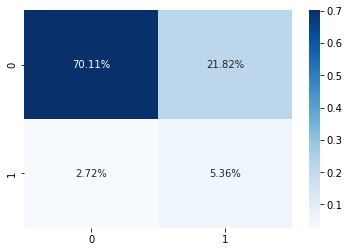

Fold  1 AUC : 0.783150


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's auc: 0.801396	train's binary_logloss: 0.553183	valid's auc: 0.77861	valid's binary_logloss: 0.561416
[400]	train's auc: 0.829445	train's binary_logloss: 0.519058	valid's auc: 0.788742	valid's binary_logloss: 0.535235
[600]	train's auc: 0.849212	train's binary_logloss: 0.495791	valid's auc: 0.791594	valid's binary_logloss: 0.519492
[800]	train's auc: 0.865289	train's binary_logloss: 0.477122	valid's auc: 0.792116	valid's binary_logloss: 0.507563
[1000]	train's auc: 0.878806	train's binary_logloss: 0.46084	valid's auc: 0.792179	valid's binary_logloss: 0.497129


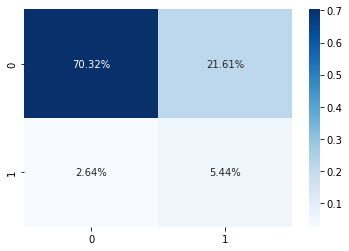

Fold  2 AUC : 0.792247


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's auc: 0.80374	train's binary_logloss: 0.551015	valid's auc: 0.771594	valid's binary_logloss: 0.560854
[400]	train's auc: 0.831323	train's binary_logloss: 0.516564	valid's auc: 0.78123	valid's binary_logloss: 0.535526
[600]	train's auc: 0.850847	train's binary_logloss: 0.49326	valid's auc: 0.784584	valid's binary_logloss: 0.520058
[800]	train's auc: 0.866853	train's binary_logloss: 0.474579	valid's auc: 0.785747	valid's binary_logloss: 0.508009
[1000]	train's auc: 0.880287	train's binary_logloss: 0.458266	valid's auc: 0.78602	valid's binary_logloss: 0.497633
[1200]	train's auc: 0.892022	train's binary_logloss: 0.443428	valid's auc: 0.78619	valid's binary_logloss: 0.487985
[1400]	train's auc: 0.902346	train's binary_logloss: 0.429784	valid's auc: 0.786304	valid's binary_logloss: 0.479053


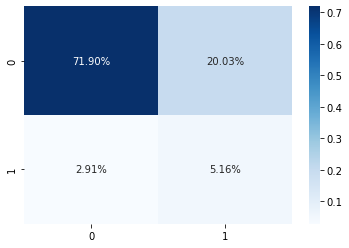

Fold  3 AUC : 0.786320


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's auc: 0.80238	train's binary_logloss: 0.552252	valid's auc: 0.775772	valid's binary_logloss: 0.55966
[400]	train's auc: 0.830268	train's binary_logloss: 0.517757	valid's auc: 0.785533	valid's binary_logloss: 0.533413
[600]	train's auc: 0.850271	train's binary_logloss: 0.494301	valid's auc: 0.788456	valid's binary_logloss: 0.51774
[800]	train's auc: 0.866415	train's binary_logloss: 0.475513	valid's auc: 0.789452	valid's binary_logloss: 0.505752
[1000]	train's auc: 0.880028	train's binary_logloss: 0.459183	valid's auc: 0.789529	valid's binary_logloss: 0.495596


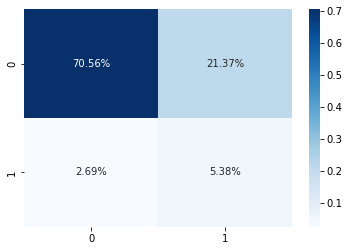

Fold  4 AUC : 0.789641


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's auc: 0.803603	train's binary_logloss: 0.550874	valid's auc: 0.769709	valid's binary_logloss: 0.560511
[400]	train's auc: 0.831505	train's binary_logloss: 0.516385	valid's auc: 0.779958	valid's binary_logloss: 0.53472
[600]	train's auc: 0.851039	train's binary_logloss: 0.493178	valid's auc: 0.782904	valid's binary_logloss: 0.519472
[800]	train's auc: 0.866615	train's binary_logloss: 0.474873	valid's auc: 0.783678	valid's binary_logloss: 0.507956
[1000]	train's auc: 0.879911	train's binary_logloss: 0.458713	valid's auc: 0.784094	valid's binary_logloss: 0.497746
[1200]	train's auc: 0.891836	train's binary_logloss: 0.443797	valid's auc: 0.78436	valid's binary_logloss: 0.488235
[1400]	train's auc: 0.90239	train's binary_logloss: 0.429895	valid's auc: 0.784535	valid's binary_logloss: 0.479278
[1600]	train's auc: 0.911667	train's binary_logloss: 0.417116	valid's auc: 0.784582	valid's binary_logloss: 0.471069


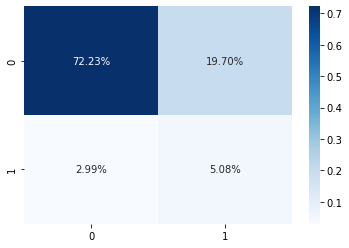

Fold  5 AUC : 0.784691
Full AUC score 0.786944


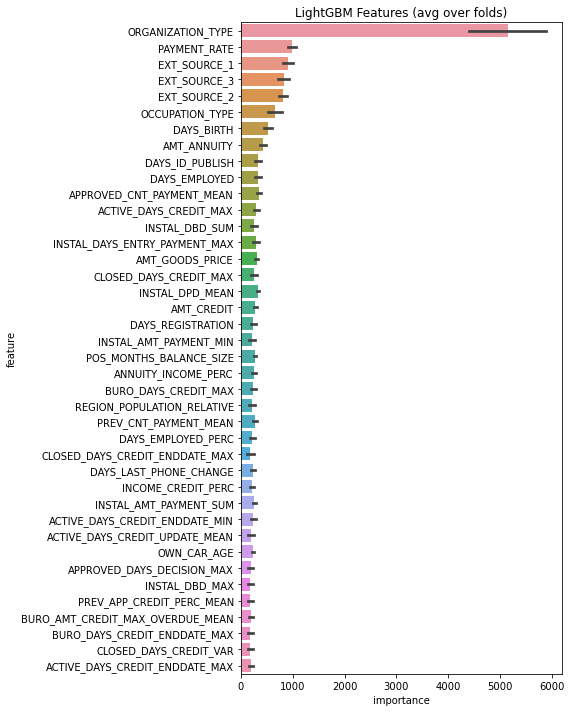

In [47]:
feat_imp, df_proba = kfold_lightgbm(df_application_train, df_application_test, 5)

**L'AUC obtenu est d'environ 0.79, donc assez proche de ce qu'on trouve sur internet pour ce type de feature engineering. Les features importances indique que les variables EXT_SOURCE_1, EXT_SOURCE_2 et EXT_SOURCE_3 sont importantes. Cependant, je vais les enlever plus tard du dataset afin de mettre en avant la transparence du modèle.** 

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'CC_SK_DPD_MAX', 'CC_SK_DPD_MEAN', 'CC_SK_DPD_SUM', 'CC_SK_DPD_VAR',
       'CC_SK_DPD_DEF_MIN', 'CC_SK_DPD_DEF_MAX', 'CC_SK_DPD_DEF_MEAN',
       'CC_SK_DPD_DEF_SUM', 'CC_SK_DPD_DEF_VAR', 'CC_COUNT'],
      dtype='object', length=433)

SK_ID_CURR               int32
TARGET                    bool
NAME_CONTRACT_TYPE    category
CODE_GENDER               bool
FLAG_OWN_CAR              bool
                        ...   
CC_SK_DPD_DEF_MAX      float32
CC_SK_DPD_DEF_MEAN     float32
CC_SK_DPD_DEF_SUM      float32
CC_SK_DPD_DEF_VAR      float32
CC_COUNT               float32
Length: 433, dtype: object

## 2.1 Essais avec encodage des variables catégorielles OHE

In [14]:
df_application_train_ohe = pd.read_csv('Data/application_train.csv')
df_application_test_ohe = pd.read_csv('Data/application_test.csv')
df_bureau = pd.read_csv('Data/bureau.csv')
df_bureau_balance = pd.read_csv('Data/bureau_balance.csv')
df_credit_card_balance = pd.read_csv('Data/credit_card_balance.csv')
df_installments_payments = pd.read_csv('Data/installments_payments.csv')
df_POS_CASH_balance = pd.read_csv('Data/POS_CASH_balance.csv')
df_previous_application = pd.read_csv('Data/previous_application.csv')

In [15]:
df_application_train_ohe, df_application_test_ohe = application_train_test(df_application_train_ohe, df_application_test_ohe, ohe=True)
bureau_agg = bureau_and_balance(df_bureau, df_bureau_balance, ohe=True)
prev_agg = previous_applications(df_previous_application, ohe=True)
pos_agg = pos_cash(df_POS_CASH_balance, ohe=True)
ins_agg = installments_payments(df_installments_payments, ohe=True)
cc_agg = credit_card_balance(df_credit_card_balance, ohe=True)

Train samples: 307511, Test samples: 48744


In [16]:
df_application_train_ohe = df_application_train_ohe.merge(bureau_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train_ohe = df_application_train_ohe.merge(ins_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train_ohe = df_application_train_ohe.merge(prev_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train_ohe = df_application_train_ohe.merge(pos_agg, on = 'SK_ID_CURR', how = 'left')
df_application_train_ohe = df_application_train_ohe.merge(cc_agg, on = 'SK_ID_CURR', how = 'left')

df_application_test_ohe = df_application_test_ohe.merge(bureau_agg, on = 'SK_ID_CURR', how = 'left')
df_application_test_ohe = df_application_test_ohe.merge(ins_agg, on = 'SK_ID_CURR', how = 'left')
df_application_test_ohe = df_application_test_ohe.merge(prev_agg, on = 'SK_ID_CURR', how = 'left')
df_application_test_ohe = df_application_test_ohe.merge(pos_agg, on = 'SK_ID_CURR', how = 'left')
df_application_test_ohe = df_application_test_ohe.merge(cc_agg, on = 'SK_ID_CURR', how = 'left')

In [17]:
train_labels = df_application_train_ohe['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
df_application_train_ohe, df_application_test_ohe = df_application_train_ohe.align(df_application_test_ohe, join = 'inner', axis = 1)

# Add the target back in
df_application_train_ohe['TARGET'] = train_labels

In [18]:
df_application_train_ohe = convert_types(df_application_train_ohe, print_info=True)
df_application_test_ohe = convert_types(df_application_test_ohe, print_info=True)
gc.enable()
del df_bureau, df_bureau_balance, df_credit_card_balance, df_installments_payments, df_POS_CASH_balance, df_previous_application
gc.collect()

Original Memory Usage: 1.67 gb.
New Memory Usage: 0.83 gb.
Original Memory Usage: 0.26 gb.
New Memory Usage: 0.13 gb.


0

In [19]:
import re
df_application_train_ohe = df_application_train_ohe.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
df_application_test_ohe = df_application_test_ohe.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

Starting LightGBM. Train shape: (307507, 798), test shape: (48744, 797)


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.801353	train's binary_logloss: 0.552616	valid's auc: 0.770643	valid's binary_logloss: 0.562555
[400]	train's auc: 0.827926	train's binary_logloss: 0.519691	valid's auc: 0.781042	valid's binary_logloss: 0.538132
[600]	train's auc: 0.845898	train's binary_logloss: 0.498405	valid's auc: 0.783833	valid's binary_logloss: 0.524138
[800]	train's auc: 0.860798	train's binary_logloss: 0.480974	valid's auc: 0.784956	valid's binary_logloss: 0.513018
[1000]	train's auc: 0.873609	train's binary_logloss: 0.465927	valid's auc: 0.785009	valid's binary_logloss: 0.503455
[1200]	train's auc: 0.885031	train's binary_logloss: 0.451939	valid's auc: 0.785048	valid's binary_logloss: 0.494622


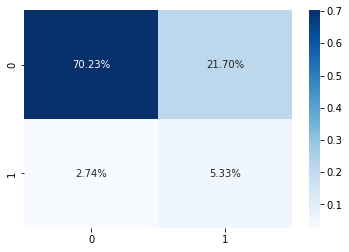

Fold  1 AUC : 0.785196


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.799281	train's binary_logloss: 0.554852	valid's auc: 0.780298	valid's binary_logloss: 0.561576
[400]	train's auc: 0.825593	train's binary_logloss: 0.522652	valid's auc: 0.791317	valid's binary_logloss: 0.53637
[600]	train's auc: 0.844251	train's binary_logloss: 0.500961	valid's auc: 0.794892	valid's binary_logloss: 0.521723
[800]	train's auc: 0.859598	train's binary_logloss: 0.483564	valid's auc: 0.795681	valid's binary_logloss: 0.510639
[1000]	train's auc: 0.872781	train's binary_logloss: 0.468116	valid's auc: 0.796029	valid's binary_logloss: 0.500912
[1200]	train's auc: 0.884183	train's binary_logloss: 0.454193	valid's auc: 0.795732	valid's binary_logloss: 0.492212


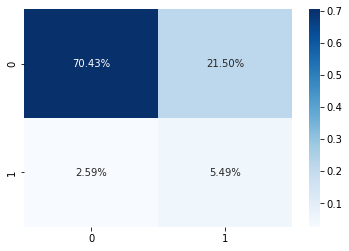

Fold  2 AUC : 0.796095


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.801792	train's binary_logloss: 0.552456	valid's auc: 0.771641	valid's binary_logloss: 0.56231
[400]	train's auc: 0.827793	train's binary_logloss: 0.519842	valid's auc: 0.781904	valid's binary_logloss: 0.537778
[600]	train's auc: 0.846075	train's binary_logloss: 0.498219	valid's auc: 0.785913	valid's binary_logloss: 0.523107
[800]	train's auc: 0.861185	train's binary_logloss: 0.480763	valid's auc: 0.786945	valid's binary_logloss: 0.511992
[1000]	train's auc: 0.874373	train's binary_logloss: 0.465118	valid's auc: 0.787558	valid's binary_logloss: 0.502067
[1200]	train's auc: 0.885841	train's binary_logloss: 0.451043	valid's auc: 0.787746	valid's binary_logloss: 0.493253


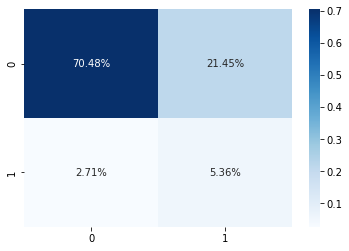

Fold  3 AUC : 0.787864


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.800184	train's binary_logloss: 0.553952	valid's auc: 0.776603	valid's binary_logloss: 0.559933
[400]	train's auc: 0.826679	train's binary_logloss: 0.52137	valid's auc: 0.786349	valid's binary_logloss: 0.535046
[600]	train's auc: 0.845186	train's binary_logloss: 0.499705	valid's auc: 0.789642	valid's binary_logloss: 0.520474
[800]	train's auc: 0.860491	train's binary_logloss: 0.482077	valid's auc: 0.790703	valid's binary_logloss: 0.50923
[1000]	train's auc: 0.873744	train's binary_logloss: 0.466492	valid's auc: 0.79083	valid's binary_logloss: 0.499459
[1200]	train's auc: 0.885496	train's binary_logloss: 0.45217	valid's auc: 0.791036	valid's binary_logloss: 0.490446
[1400]	train's auc: 0.895911	train's binary_logloss: 0.438893	valid's auc: 0.791133	valid's binary_logloss: 0.482004


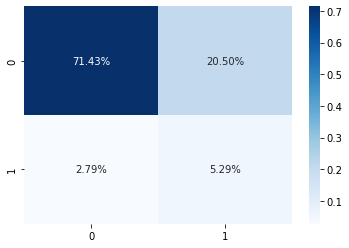

Fold  4 AUC : 0.791201


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:598: UserWarning:

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.801116	train's binary_logloss: 0.552732	valid's auc: 0.769869	valid's binary_logloss: 0.561227
[400]	train's auc: 0.827458	train's binary_logloss: 0.520047	valid's auc: 0.781851	valid's binary_logloss: 0.536154
[600]	train's auc: 0.846029	train's binary_logloss: 0.49826	valid's auc: 0.785773	valid's binary_logloss: 0.521412
[800]	train's auc: 0.861253	train's binary_logloss: 0.480646	valid's auc: 0.787201	valid's binary_logloss: 0.510082
[1000]	train's auc: 0.874258	train's binary_logloss: 0.465361	valid's auc: 0.787881	valid's binary_logloss: 0.500288
[1200]	train's auc: 0.885731	train's binary_logloss: 0.451244	valid's auc: 0.788449	valid's binary_logloss: 0.491195
[1400]	train's auc: 0.896072	train's binary_logloss: 0.438106	valid's auc: 0.788556	valid's binary_logloss: 0.482853
[1600]	train's auc: 0.90542	train's binary_logloss: 0.425782	valid'

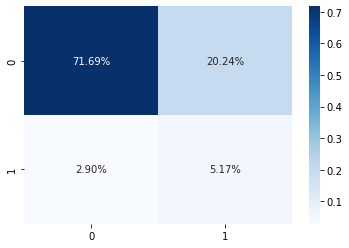

Fold  5 AUC : 0.788584
Full AUC score 0.789672


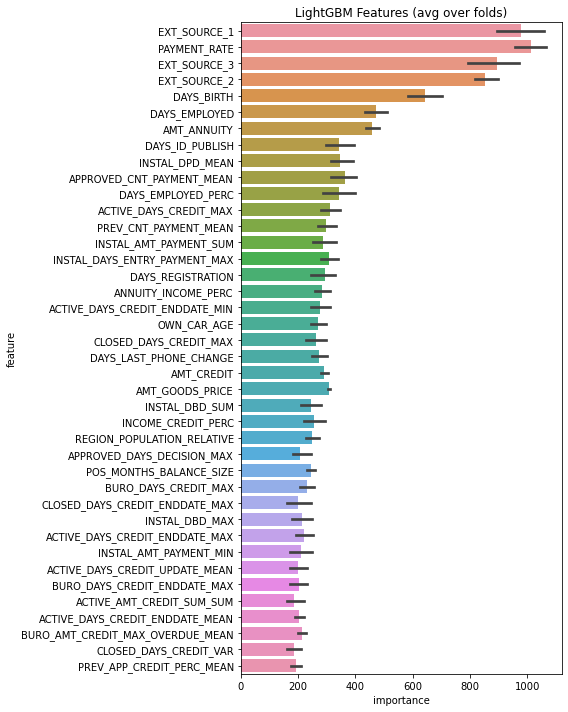

In [54]:
feat_imp_ohe, df_proba_ohe = kfold_lightgbm(df_application_train_ohe, df_application_test_ohe, 5)

**L'AUC obtenue est quasiment identique à celle obtenue sans encodage des variables catégorielles ce qui confirme l'efficacité de la méthode de lightGBM de gestion de ce type de variable.**

In [ ]:
feat_imp[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:400].to_csv('feat_imp_400_features.csv', index=False)

In [30]:
feat_imp[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False).loc[feat_imp[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)['importance'] == 0].to_csv('null_features.csv', index=True)

In [25]:
feat_null = pd.read_csv("null_features.csv")

In [26]:
df_application_train.drop(feat_null["feature"].to_list(), axis=1, inplace=True)
df_application_test.drop(feat_null["feature"].to_list(), axis=1, inplace=True)

In [27]:
df_application_train.shape

(307507, 640)

## 2.2 Sélection des variables : Boruta-Shap

**L'algorithm Boruta-Shap a été lancé une fois avec l'encodage OHE et une fois sans encodage des variables catégorielles. Les variables sélectionnées ont été sauvegardées dans un fichier selected_feats.csv**

In [18]:
import shap

In [20]:
from BorutaShap import BorutaShap

model = lgb.LGBMClassifier(
    n_jobs=8,
    n_estimators=10000,
    learning_rate=0.02,
    num_leaves=34,
    colsample_bytree=0.9497036,
    subsample=0.8715623,
    max_depth=8,
    reg_alpha=0.041545473,
    reg_lambda=0.0735294,
    min_split_gain=0.0222415,
    min_child_weight=39.3259775,
    silent=-1,
    verbose=-1,
    class_weight='balanced'
)

Feature_Selector = BorutaShap(model=model, importance_measure='shap', classification=True)

good_features = []
bad_features = []

folds = StratifiedKFold(n_splits= 2, shuffle=True, random_state=42)
feats = [f for f in df_application_train.columns if f not in ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]

for n_fold, (train_idx, valid_idx) in enumerate(folds.split(df_application_train[feats], df_application_train['TARGET'])):
    train_x, train_y = df_application_train[feats].iloc[train_idx], df_application_train['TARGET'].iloc[train_idx]
    valid_x, valid_y = df_application_train[feats].iloc[valid_idx], df_application_train['TARGET'].iloc[valid_idx]
        
    Feature_Selector.fit(X=train_x, y=train_y, n_trials=50, random_state=42, sample=False, verbose=True)
    good_features = good_features.append(Feature_Selector.accepted)
    
good_features = list(set(good_features))

Warning there are missing values in your data !


  0%|          | 0/50 [00:00<?, ?it/s]

[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nth

  0%|          | 0/50 [00:00<?, ?it/s]

[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nth

AttributeError: 'NoneType' object has no attribute 'append'

In [30]:
good_features = ['PAYMENT_RATE', 'ORGANIZATION_TYPE', 'AMT_GOODS_PRICE', 'CODE_GENDER', 'NAME_EDUCATION_TYPE', 'PAYMENT_RATE', 'ORGANIZATION_TYPE', 'CODE_GENDER']

In [33]:
good_features

['PAYMENT_RATE',
 'NAME_EDUCATION_TYPE',
 'ORGANIZATION_TYPE',
 'AMT_GOODS_PRICE',
 'CODE_GENDER']

In [32]:
good_features = list(set(good_features))

In [34]:
df_good_features = pd.DataFrame()

df_good_features["good_features_cat_feat"] = good_features

#df_good_features.to_csv("good_features_cat_feat.csv")

In [30]:
good_features = list(set(good_features))

In [32]:
df_good_features = pd.DataFrame()

df_good_features["good_features"] = good_features

In [37]:
#df_good_features.to_csv("good_features.csv")

In [20]:
df_good_features_cat_feat = pd.read_csv("good_features_cat_feat.csv")
df_good_features = pd.read_csv("good_features_2.csv")

In [39]:
df_good_features

,Unnamed: 0,good_features
0,0,INSTAL_AMT_PAYMENT_SUM
1,1,NAME_EDUCATION_TYPE_Highereducation
2,2,REGION_POPULATION_RELATIVE
3,3,AMT_CREDIT
4,4,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX
5,5,EXT_SOURCE_1
6,6,APPROVED_CNT_PAYMENT_MEAN
7,7,FLAG_DOCUMENT_3
8,8,PREV_APP_CREDIT_PERC_MIN
9,9,AMT_ANNUITY


**Par soucis de transparence vis-àvis du client, je supprime les variables EXT_SOURCE_1, EXT_SOURCE_2 et EXT_SOURCE_3.**

In [26]:
selection = df_good_features_cat_feat["good_features_cat_feat"].to_list() + df_good_features["good_features"].to_list()
selection.remove("EXT_SOURCE_1")
selection.remove("EXT_SOURCE_2")
selection.remove("EXT_SOURCE_3")
selection = list(set(selection))

In [39]:
pd.DataFrame(selection, columns=["selected_feats"]).to_csv("selected_feats.csv", index=False)

## 2.2 Interprétation du modèle : Shap

In [635]:
from sklearn.model_selection import train_test_split
feats = [f for f in df_application_train.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index', 
                                                             'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']]
'''
(train_idx_1, valid_idx_1), (train_idx_2, valid_idx_2), (train_idx_3, valid_idx_3), (train_idx_4, valid_idx_4), (train_idx_5, valid_idx_5) = folds.split(df_application_train[feats], df_application_train['TARGET'])
train_x_1, train_y_1 = df_application_train[feats].iloc[train_idx_1], df_application_train['TARGET'].iloc[train_idx_1]
valid_x_1, valid_y_1 = df_application_train[feats].iloc[valid_idx_1], df_application_train['TARGET'].iloc[valid_idx_1]
'''
X_train, X_valid, y_train, y_valid = train_test_split(df_application_train[feats], df_application_train['TARGET'], test_size=0.2, random_state=42, stratify=df_application_train['TARGET'])

"\n(train_idx_1, valid_idx_1), (train_idx_2, valid_idx_2), (train_idx_3, valid_idx_3), (train_idx_4, valid_idx_4), (train_idx_5, valid_idx_5) = folds.split(df_application_train[feats], df_application_train['TARGET'])\ntrain_x_1, train_y_1 = df_application_train[feats].iloc[train_idx_1], df_application_train['TARGET'].iloc[train_idx_1]\nvalid_x_1, valid_y_1 = df_application_train[feats].iloc[valid_idx_1], df_application_train['TARGET'].iloc[valid_idx_1]\n"

In [19]:
best_params = {
    'colsample_bytree': 0.9688370510688287,
    'learning_rate': 0.02500695721490006,
    'max_depth': 8,
    'min_child_samples': 110,
    'min_child_weight': 75.75115884303472,
    'min_split_gain': 0.043211749034947206,
    'num_leaves': 22,
    'reg_alpha': 0.08669964175707583,
    'reg_lambda': 0.4342861522120322,
    'subsample': 0.6079549078176605,
    'subsample_for_bin': 300000
}

In [20]:
best_params_2 = {
    'colsample_bytree': 0.6631510705723566,
    'learning_rate': 0.04735272775902267,
    'max_depth': 10,
    'min_child_samples': 340,
    'min_child_weight': 86.97039820395102,
    'min_split_gain': 0.7702693281471905,
    'num_leaves': 25,
    'reg_alpha': 0.9991238252395153,
    'reg_lambda': 0.40501023553562804,
    'subsample': 0.8994964451739526,
    'subsample_for_bin': 300000,
    'n_estimators': 701
}

In [39]:
import shap

df_selection = pd.read_csv('selected_feats.csv')
selection = df_selection["selected_feats"].tolist()

# LightGBM parameters found by Bayesian optimization
clf = lgb.LGBMClassifier(
    n_jobs=8,
    #n_estimators=10000,
    #learning_rate=0.02,
    #num_leaves=34,
    #colsample_bytree=0.9497036,
    #subsample=0.8715623,
    #max_depth=8,
    #reg_alpha=0.041545473,
    #reg_lambda=0.0735294,
    #min_split_gain=0.0222415,
    #min_child_weight=39.3259775,
    #silent=-1,
    #verbose=-1,
    #is_unbalance=True,
    class_weight='balanced',
    **best_params_2
)

clf.fit(
    df_application_train[selection], 
    df_application_train["TARGET"], 
    #eval_set=[(X_train[selection], y_train), (X_valid[selection], y_valid)], 
    #eval_names = ['train', 'valid'],
    #eval_metric = 'auc', 
    verbose=200, 
    #early_stopping_rounds=200, 
    categorical_feature='auto'#cat_indices
)

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


LGBMClassifier(class_weight='balanced', colsample_bytree=0.6631510705723566,
               learning_rate=0.04735272775902267, max_depth=10,
               min_child_samples=340, min_child_weight=86.97039820395102,
               min_split_gain=0.7702693281471905, n_estimators=701, n_jobs=8,
               num_leaves=25, reg_alpha=0.9991238252395153,
               reg_lambda=0.40501023553562804, subsample=0.8994964451739526,
               subsample_for_bin=300000)

In [40]:
lgb_explainer = shap.TreeExplainer(
    clf,
    feature_perturbation="tree_path_dependent",
)
lgb_explainer

In [41]:
%time shap_values = lgb_explainer.shap_values(df_application_test[selection])

CPU times: user 17.2 s, sys: 8.99 ms, total: 17.2 s
Wall time: 2.16 s


LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [802]:
df_application_test[selection].dtypes

ACTIVE_AMT_CREDIT_SUM_DEBT_MAX     float32
AMT_ANNUITY                        float32
AMT_CREDIT                         float32
AMT_GOODS_PRICE                    float32
ANNUITY_INCOME_PERC                float32
APPROVED_CNT_PAYMENT_MEAN          float32
CLOSED_DAYS_CREDIT_MAX             float32
CODE_GENDER                           bool
DAYS_BIRTH                           int32
DAYS_EMPLOYED                      float32
DAYS_ID_PUBLISH                      int32
FLAG_DOCUMENT_3                       bool
FLAG_OWN_CAR                          bool
INSTAL_AMT_PAYMENT_SUM             float32
INSTAL_DAYS_ENTRY_PAYMENT_MAX      float32
INSTAL_DPD_MEAN                    float32
NAME_EDUCATION_TYPE               category
NAME_FAMILY_STATUS                category
ORGANIZATION_TYPE                 category
OWN_CAR_AGE                        float32
PAYMENT_RATE                       float32
POS_MONTHS_BALANCE_SIZE            float32
PREV_APP_CREDIT_PERC_MIN           float32
PREV_CNT_PA

### 2.2.1 Exemples d'interprétation locale du modèle

**Ci-dessous, deux exemples d'interprétabilité locale du modèle qu'on pourra fournir sur le dashboard.**

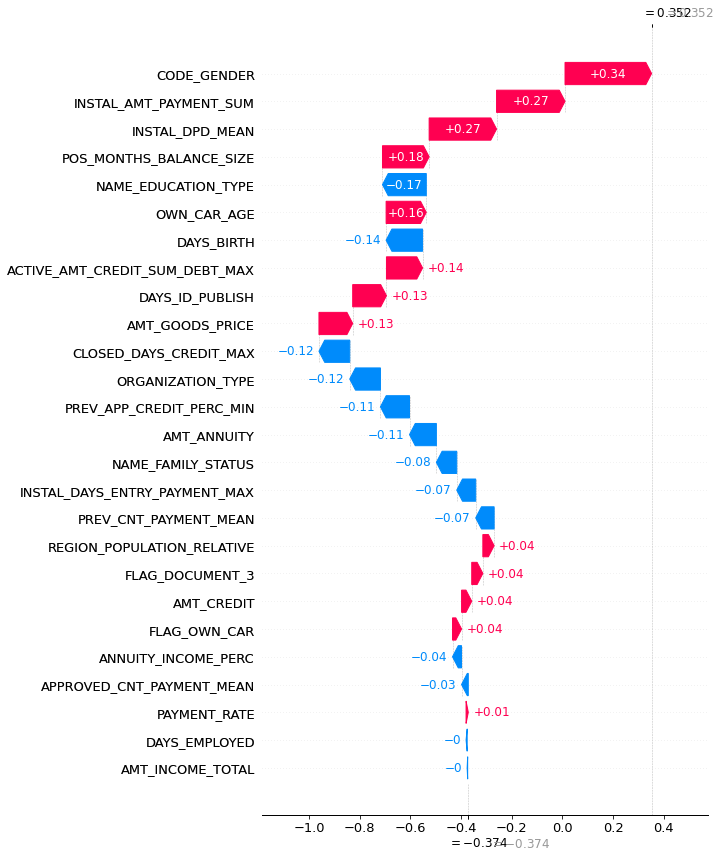

In [772]:
shap.plots._waterfall.waterfall_legacy(explainer.expected_value[1],
                                                     shap_values[1][df_application_test.reset_index().loc[
                                                         df_application_test.reset_index()["SK_ID_CURR"] == 100001].index[0]],
                                                     feature_names=selection, 
                                                     max_display=40)

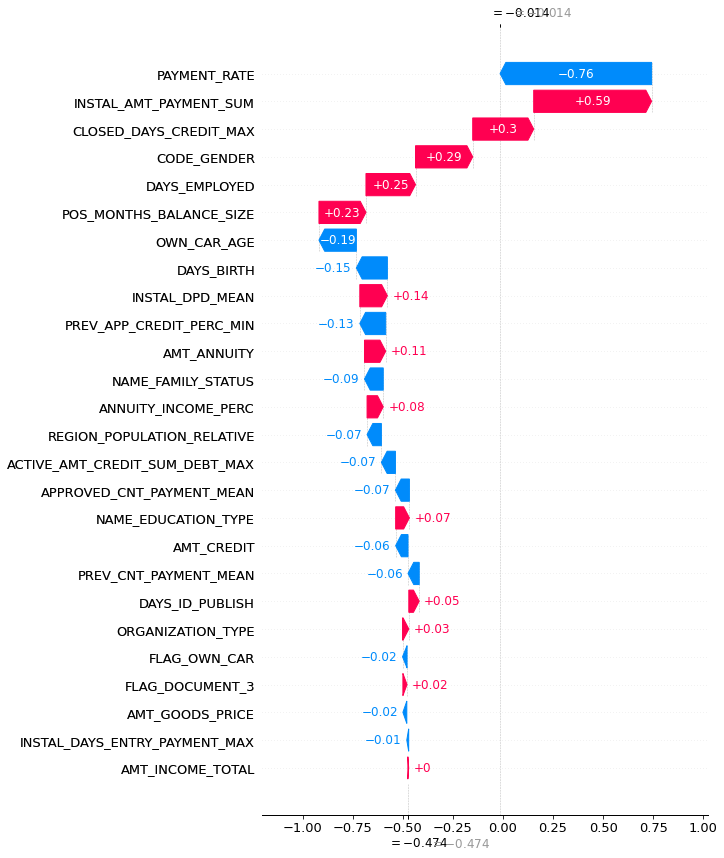

In [769]:
shap.plots._waterfall.waterfall_legacy(lgb_explainer.expected_value[1], shap_values[1][df_application_test[selection].reset_index().loc[df_application_test["SK_ID_CURR"] == 100141].index[0]], feature_names=selection, max_display=40)

In [42]:
'''import pickle

with open('shap_values_5k.pickle', 'wb') as handle:
    pickle.dump(shap_values, handle)

with open('shap_explainer_5k.pickle', 'wb') as handle:
    pickle.dump(lgb_explainer, handle)'''

In [782]:
'''import pickle

with open('model_pipeline_2.pickle', 'wb') as handle:
    pickle.dump(clf, handle)'''

### 2.2.2 Interprétation globale du modèle

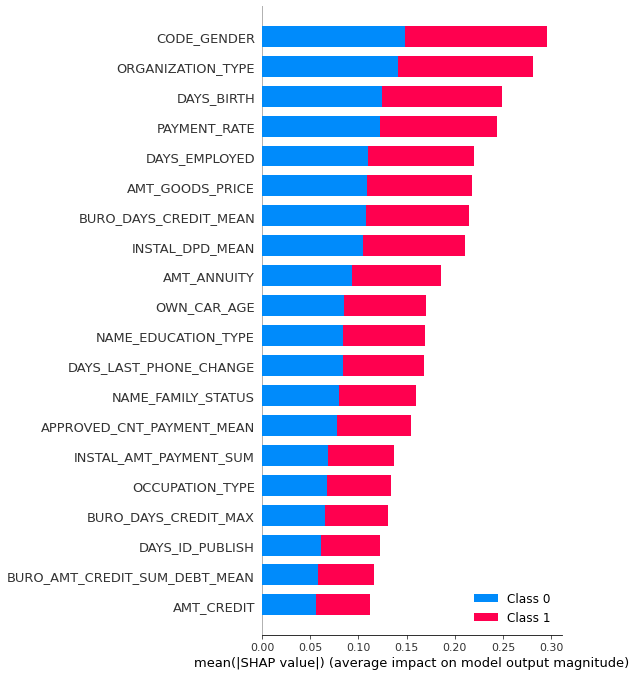

In [645]:
shap.summary_plot(shap_values, features=X_train, feature_names=X_train.columns, plot_type='bar')

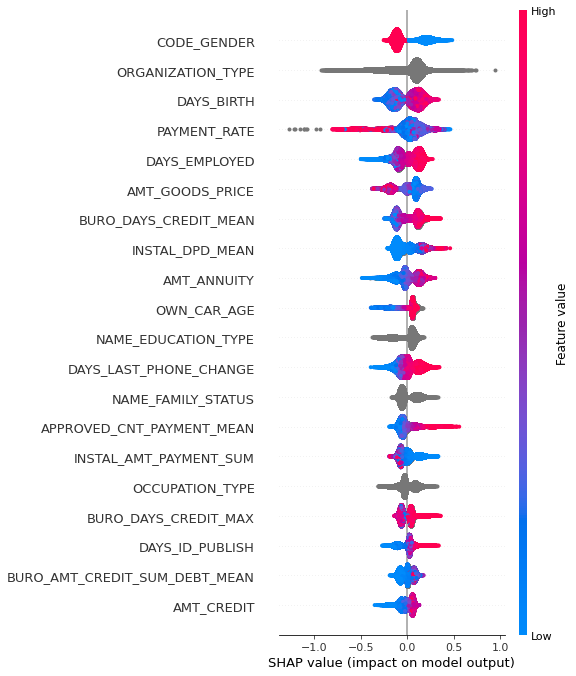

In [648]:
shap.summary_plot(shap_values[1], features=X_train, feature_names=X_train.columns)

Starting LightGBM. Train shape: (307507, 25), test shape: (48744, 24)
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.75881	train's binary_logloss: 0.596519	valid's auc: 0.722126	valid's binary_logloss: 0.604307
[400]	train's auc: 0.78429	train's binary_logloss: 0.569814	valid's auc: 0.729981	valid's binary_logloss: 0.584966
[600]	train's auc: 0.802306	train's binary_logloss: 0.552262	valid's auc: 0.732877	valid's binary_logloss: 0.573371
[800]	train's auc: 0.816834	train's binary_logloss: 0.538488	valid's auc: 0.733626	valid's binary_logloss: 0.56468
[1000]	train's auc: 0.829224	train's binary_logloss: 0.526556	valid's auc: 0.733954	valid's binary_logloss: 0.557195


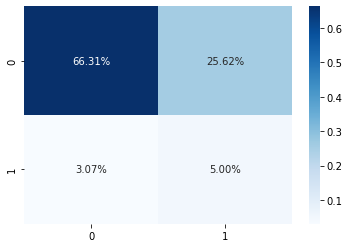

Fold  1 AUC : 0.733965
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.757999	train's binary_logloss: 0.597179	valid's auc: 0.726129	valid's binary_logloss: 0.605225
[400]	train's auc: 0.782959	train's binary_logloss: 0.570805	valid's auc: 0.73485	valid's binary_logloss: 0.585429
[600]	train's auc: 0.800633	train's binary_logloss: 0.553737	valid's auc: 0.737	valid's binary_logloss: 0.573968
[800]	train's auc: 0.815056	train's binary_logloss: 0.54019	valid's auc: 0.737699	valid's binary_logloss: 0.565113
[1000]	train's auc: 0.827499	train's binary_logloss: 0.528382	valid's auc: 0.738289	valid's binary_logloss: 0.557507
[1200]	train's auc: 0.838815	train's binary_logloss: 0.51726	valid's auc: 0.738384	valid's binary_logloss: 0.550545


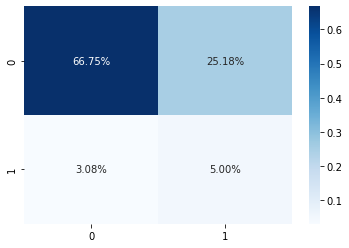

Fold  2 AUC : 0.738491
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.758738	train's binary_logloss: 0.596584	valid's auc: 0.720027	valid's binary_logloss: 0.604591
[400]	train's auc: 0.784537	train's binary_logloss: 0.569333	valid's auc: 0.729377	valid's binary_logloss: 0.584064
[600]	train's auc: 0.802947	train's binary_logloss: 0.551697	valid's auc: 0.731693	valid's binary_logloss: 0.572306
[800]	train's auc: 0.817364	train's binary_logloss: 0.538173	valid's auc: 0.732324	valid's binary_logloss: 0.563357
[1000]	train's auc: 0.829804	train's binary_logloss: 0.526167	valid's auc: 0.732314	valid's binary_logloss: 0.555789


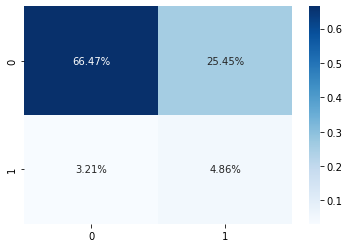

Fold  3 AUC : 0.732408
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.757864	train's binary_logloss: 0.597288	valid's auc: 0.723471	valid's binary_logloss: 0.603673
[400]	train's auc: 0.784463	train's binary_logloss: 0.56958	valid's auc: 0.731576	valid's binary_logloss: 0.582634
[600]	train's auc: 0.802578	train's binary_logloss: 0.551984	valid's auc: 0.734032	valid's binary_logloss: 0.570518
[800]	train's auc: 0.816881	train's binary_logloss: 0.538434	valid's auc: 0.734774	valid's binary_logloss: 0.561517
[1000]	train's auc: 0.82949	train's binary_logloss: 0.526404	valid's auc: 0.734665	valid's binary_logloss: 0.554043


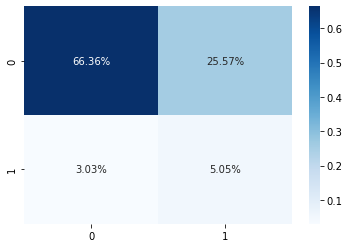

Fold  4 AUC : 0.734850
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
[200]	train's auc: 0.758992	train's binary_logloss: 0.596492	valid's auc: 0.724018	valid's binary_logloss: 0.60423
[400]	train's auc: 0.784151	train's binary_logloss: 0.569781	valid's auc: 0.731725	valid's binary_logloss: 0.584233
[600]	train's auc: 0.80152	train's binary_logloss: 0.552765	valid's auc: 0.7345	valid's binary_logloss: 0.572684
[800]	train's auc: 0.815979	train's binary_logloss: 0.539163	valid's auc: 0.735556	valid's binary_logloss: 0.563804
[1000]	train's auc: 0.828382	train's binary_logloss: 0.52708	valid's auc: 0.736264	valid's binary_logloss: 0.555958
[1200]	train's auc: 0.839739	train's binary_logloss: 0.51593	valid's auc: 0.736209	valid's binary_logloss: 0.548747


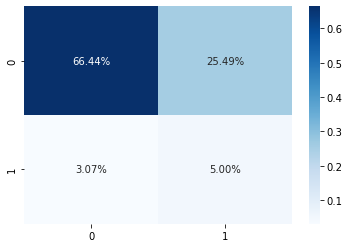

Fold  5 AUC : 0.736331
Full AUC score 0.735199


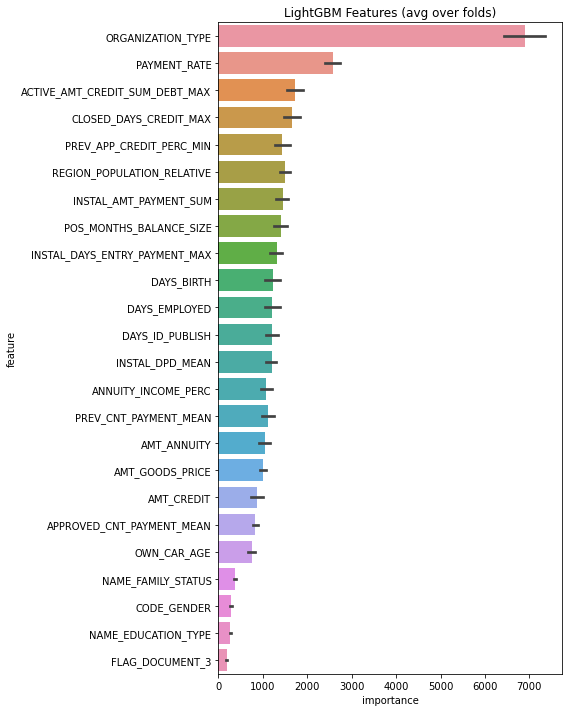

In [46]:
feat_imp_select_cat_feat, df_proba_select_cat_feat = kfold_lightgbm(df_application_train[selection + ["TARGET"]], df_application_test[selection], 5)

**En ne retenant que les variables sélectionnées par Boruta-Shap, et sans les EXT_SOURCE_x, l'AUC chute sensiblement pour tomber à environ 0.74. Comme nous l'avons vu, ce choix est délibéré étant donné que nous ne savons comment expliquer aux clients le calcul des variables EXT_SOURCE_x.**

In [43]:
'''import pickle

with open('Feature_Selector_borutashap.pickle', 'wb') as handle:
    pickle.dump(Feature_Selector, handle)'''

In [81]:
'''import pickle5 as pickle
from sklearn.feature_selection import RFECV

estimator = lgb.LGBMClassifier(
    nthread=8,
    n_estimators=10000,
    learning_rate=0.02,
    num_leaves=34,
    colsample_bytree=0.9497036,
    subsample=0.8715623,
    max_depth=8,
    reg_alpha=0.041545473,
    reg_lambda=0.0735294,
    min_split_gain=0.0222415,
    min_child_weight=39.3259775,
    verbose=-1,
    class_weight='balanced'
)

folds = StratifiedKFold(n_splits= 5, shuffle=True, random_state=42).split(X=df_application_train_ohe.drop("TARGET", axis=1), y=df_application_train_ohe["TARGET"])

selector = RFECV(estimator, step=50, min_features_to_select=50, cv=folds, n_jobs=1, scoring='roc_auc', verbose=1)
#selector.fit(df_application_train_ohe.drop("TARGET", axis=1), df_application_train_ohe["TARGET"])
selector.fit(df_application_train_ohe[selected_features], df_application_train_ohe["TARGET"])'''

Fitting estimator with 747 features.
Fitting estimator with 697 features.
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
Fitting estimator with 647 features.
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
Fitting estimator with 597 features.
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
Fitting estimator with 547 features.
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
Fitting estimator with 497 features.
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
Fitting estimator with 447 features.
[LightGBM] [Warning] num_threads is set with nthread=8, will be overridden by n_jobs=-1. Current value: num_threads=-1
Fitting estimator with 397 

RFECV(cv=<generator object _BaseKFold.split at 0x7f20cff58cd0>,
      estimator=LGBMClassifier(class_weight='balanced',
                               colsample_bytree=0.9497036, learning_rate=0.02,
                               max_depth=8, min_child_weight=39.3259775,
                               min_split_gain=0.0222415, n_estimators=10000,
                               nthread=8, num_leaves=34, reg_alpha=0.041545473,
                               reg_lambda=0.0735294, subsample=0.8715623,
                               verbose=-1),
      min_features_to_select=50, n_jobs=1, scoring='roc_auc', step=50,
      verbose=1)

In [68]:
selected_feats = pd.DataFrame({
    "feat": df_application_train_ohe.drop("TARGET", axis=1).columns.to_list(),
    "value": pd.Series(selector.support_)
})

In [77]:
selected_features = selected_feats[selected_feats["value"] == True]["feat"].to_list()

In [83]:
len(selected_features)

747

# 3. Fonction de coût métier

**Je réécris de manière optimisée la fonction confusion_matrix car l'implémentation de scikit-learn est trop lente.**

In [27]:
def confusion_matrix_2_numpy(y_true, y_pred, N=None):
    y_true = y_true.reshape(-1)
    y_pred = y_pred.reshape(-1) 
    if (N is None):
        N = max(max(y_true), max(y_pred)) + 1
    y = N * y_true + y_pred
    y = np.bincount(y, minlength=N*N)
    y = y.reshape(N, N)
    return y

**A l'aide de la fonction confusion_matrix optimisée, je définis une fonction de coût métier qui pondère les valeurs de vrais positifs, vrais négatifs, faux positifs et faux négatifs. Les poids sont ajustables par l'entreprise en fonction de ce qu'elle veut optimiser. La fonction de coût est normalisée et correspond à un gain, elle est donc à maximiser.**

In [28]:
from sklearn.metrics import confusion_matrix

TP_coef = 10
FP_coef = -1
TN_coef = 1
FN_coef = -10

threshold = 0.51

def custom_metric(y_true, y_pred):
    #y_pred = [1 if i >= threshold else 0 for i in y_pred]
    y_preds = np.where(y_pred >= threshold, 1, 0)
    tn, fp, fn, tp = confusion_matrix_2_numpy(np.array(y_true).astype(int), y_preds).ravel()
    gain = tp*TP_coef + fp*FP_coef + tn*TN_coef + fn*FN_coef
    best = (tn + fp)*TN_coef + (tp + fn)*TP_coef
    baseline = (tn + fp)*TN_coef + (tp + fn)*FN_coef
    score = (gain - baseline)/(best - baseline)
    is_higher_better = True
    
    return "custom_metric", score, is_higher_better

def custom_metric_threshold_search(y_true, y_pred, threshold):
    y_preds = np.where(y_pred >= threshold, 1, 0)
    tn, fp, fn, tp = confusion_matrix_2_numpy(np.array(y_true).astype(int), y_preds).ravel()
    gain = tp*TP_coef + fp*FP_coef + tn*TN_coef + fn*FN_coef
    best = (tn + fp)*TN_coef + (tp + fn)*TP_coef
    baseline = (tn + fp)*TN_coef + (tp + fn)*FN_coef
    score = (gain - baseline)/(best - baseline)
    
    return score

Starting LightGBM. Train shape: (307507, 30), test shape: (48744, 29)


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.429003	valid's custom_metric: 0.363807
[400]	train's custom_metric: 0.470539	valid's custom_metric: 0.368238
[600]	train's custom_metric: 0.502875	valid's custom_metric: 0.370796


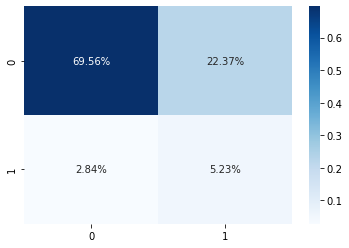

Fold  1 AUC : 0.774605


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.422402	valid's custom_metric: 0.392044
[400]	train's custom_metric: 0.462669	valid's custom_metric: 0.391601
[600]	train's custom_metric: 0.495916	valid's custom_metric: 0.392165


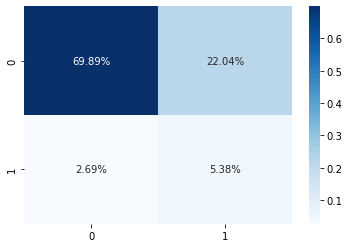

Fold  2 AUC : 0.783211


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.425332	valid's custom_metric: 0.372064
[400]	train's custom_metric: 0.467095	valid's custom_metric: 0.374602
[600]	train's custom_metric: 0.500911	valid's custom_metric: 0.371541


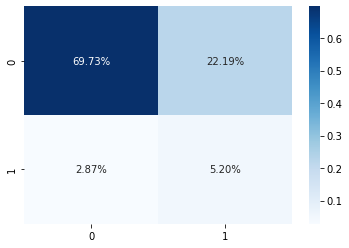

Fold  3 AUC : 0.775913


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.425604	valid's custom_metric: 0.374924
[400]	train's custom_metric: 0.464718	valid's custom_metric: 0.380665
[600]	train's custom_metric: 0.49852	valid's custom_metric: 0.380645


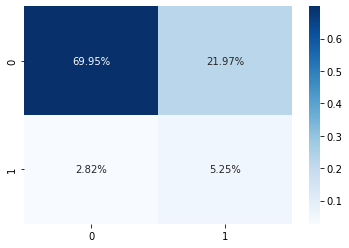

Fold  4 AUC : 0.778505


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.42779	valid's custom_metric: 0.364773
[400]	train's custom_metric: 0.468192	valid's custom_metric: 0.36578
[600]	train's custom_metric: 0.501923	valid's custom_metric: 0.359496


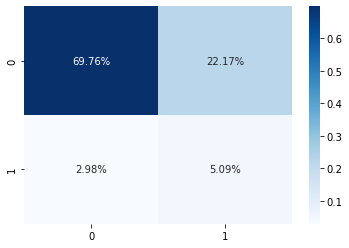

Fold  5 AUC : 0.774277
Full AUC score 0.777284


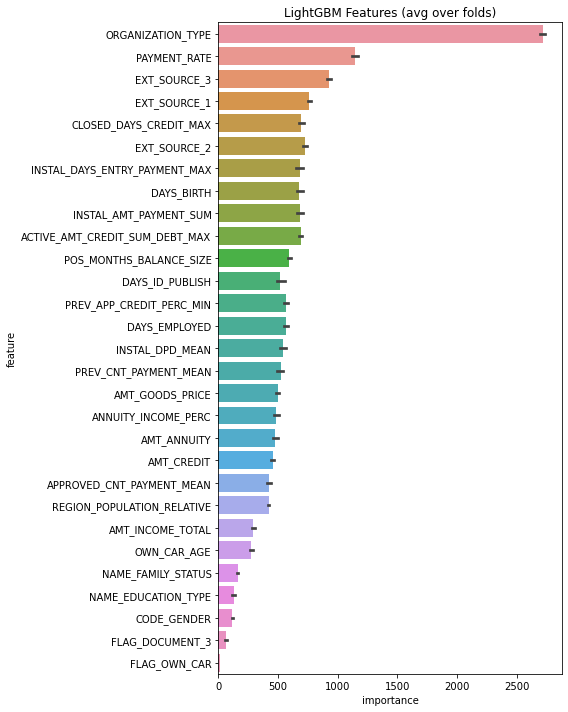

In [905]:
feat_imp_select_cat_feat_custom_metric, df_proba_select_cat_feat_custom_metric = kfold_lightgbm(df_application_train[selection + ["TARGET", "EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"]], df_application_test[selection + ["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"]], 5)

Starting LightGBM. Train shape: (307507, 27), test shape: (48744, 26)


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.36355	valid's custom_metric: 0.297583
[400]	train's custom_metric: 0.413615	valid's custom_metric: 0.300967
[600]	train's custom_metric: 0.451259	valid's custom_metric: 0.303927


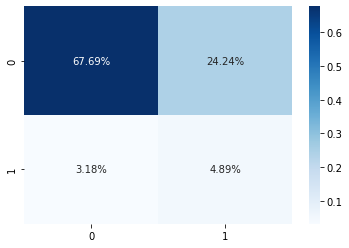

Fold  1 AUC : 0.736132


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.362528	valid's custom_metric: 0.307633
[400]	train's custom_metric: 0.410549	valid's custom_metric: 0.315488
[600]	train's custom_metric: 0.449486	valid's custom_metric: 0.317744


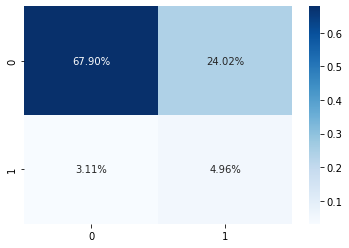

Fold  2 AUC : 0.741810


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.366808	valid's custom_metric: 0.290473
[400]	train's custom_metric: 0.414783	valid's custom_metric: 0.300403
[600]	train's custom_metric: 0.450564	valid's custom_metric: 0.299235


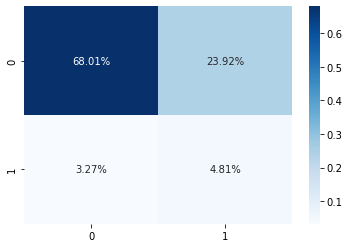

Fold  3 AUC : 0.734320


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.359476	valid's custom_metric: 0.301611
[400]	train's custom_metric: 0.408847	valid's custom_metric: 0.310252
[600]	train's custom_metric: 0.449003	valid's custom_metric: 0.310453


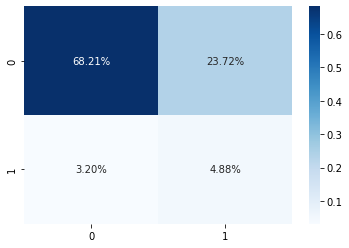

Fold  4 AUC : 0.739056


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.362437	valid's custom_metric: 0.296495
[400]	train's custom_metric: 0.410856	valid's custom_metric: 0.308117
[600]	train's custom_metric: 0.448938	valid's custom_metric: 0.309527


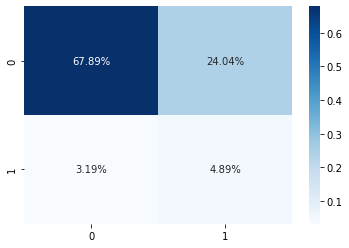

Fold  5 AUC : 0.737824
Full AUC score 0.737820


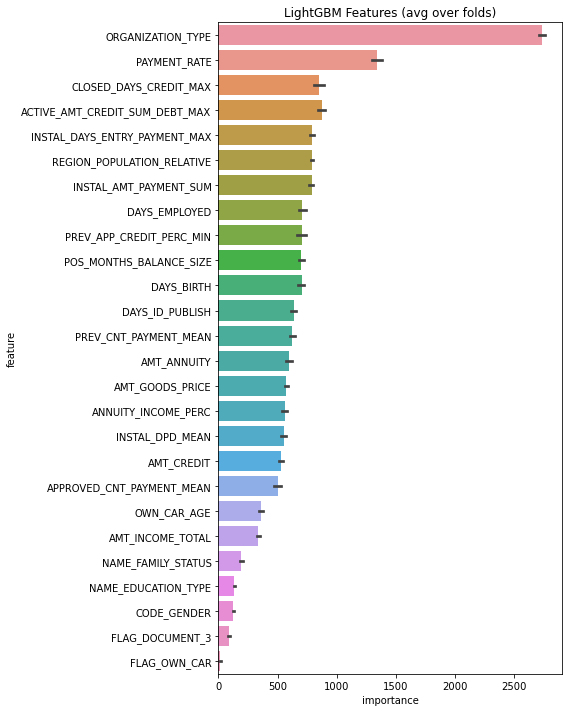

In [907]:
feat_imp_select_cat_feat_custom_metric_without_EXT, df_proba_select_cat_feat_custom_metric__without_EXT = kfold_lightgbm(df_application_train[selection + ["TARGET"]], df_application_test[selection], 5)

# 4. Recherche des hyperparamètres : Hyperopt

**Je définis une fonction qui va évaluer le modèle en fonction des hyperparamètres passés en arguments et qui retourne le score moyen sur les folds.**

**Je définis une autre fonction qui prends pour arguments les hyperparamètres et qui enregistre les résultats du modèle (1 - score) dans un fichier en fonction des hyperparamètres. C'est cette fonction dont on cherchera le minimum à l'aide de la fonction fmin.**

In [224]:
from hyperopt import hp, tpe, Trials
from hyperopt.fmin import fmin
import hyperopt
from hyperopt import STATUS_OK

from hyperopt.pyll.stochastic import sample
from hpsklearn import HyperoptEstimator, lightgbm_classification
import csv
from timeit import default_timer as timer

def lightgbm_cv(train_df, hyperparameters):
    # Cross validation model
    folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    # Create arrays and dataframes to store results
    scores = np.zeros(5)
    best_iterations = np.zeros(5)
    
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = lgb.LGBMClassifier(
            **hyperparameters,
            silent=-1,
            verbose=-1,
            n_jobs=8,
            class_weight='balanced',
            metric="custom",
            objective='binary'
        )

        clf.fit(
            train_x, 
            train_y, 
            eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_names=['train', 'valid'],
            eval_metric=custom_metric, 
            verbose=200,
            early_stopping_rounds=200,
            categorical_feature='auto'
        )
        print(clf.best_score_["valid"]["custom_metric"])
        scores[n_fold] = clf.best_score_["valid"]["custom_metric"]
        best_iterations[n_fold] = clf.best_iteration_
        
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()

    return np.mean(scores), np.max(best_iterations)

def objective(hyperparameters):
    """Objective function for Gradient Boosting Machine Hyperparameter Optimization.
       Writes a new line to `outfile` on every iteration"""
    
    # Keep track of evals
    global ITERATION
    
    ITERATION += 1
    
    # Using early stopping to find number of trees trained
    '''if 'n_estimators' in hyperparameters:
        del hyperparameters['n_estimators']'''
    
    '''# Retrieve the subsample
    subsample = hyperparameters['subsample']
    
    # Extract the boosting type and subsample to top level keys
    hyperparameters['boosting_type'] = hyperparameters['boosting_type']['boosting_type']
    hyperparameters['subsample'] = subsample'''
    
    # Make sure parameters that need to be integers are integers
    for parameter_name in ['num_leaves', 'subsample_for_bin', 'min_child_samples', 'max_depth']:
        hyperparameters[parameter_name] = int(hyperparameters[parameter_name])

    #train_set = lgb.Dataset(df_application_train[selection], label=df_application_train["TARGET"])
    
    start = timer()
    
    # Perform n_folds cross validation
    best_score, n_estimators = lightgbm_cv(
        df_application_train[selection + ["TARGET"]],
        hyperparameters
        #params,
        #train_set,
        #hyperparameters, 
        #train_set, 
        #num_boost_round = 10000,
        #nfold=5, 
        #stratified=True,
        #early_stopping_rounds=100, 
        #metrics=None,
        #seed=42,
        #feval=custom_metric_hyperopt
    )

    run_time = timer() - start
    
    # Extract the best score
    #best_score = cv_results['custom_metric_hyperopt-mean'][-1]
    
    # Loss must be minimized
    loss = 1 - best_score
    
    # Boosting rounds that returned the highest cv score
    #n_estimators = len(cv_results['custom_metric_hyperopt-mean'])
    
    # Add the number of estimators to the hyperparameters
    hyperparameters['n_estimators'] = n_estimators

    # Write to the csv file ('a' means append)
    of_connection = open(OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([loss, hyperparameters, ITERATION, run_time, best_score])
    of_connection.close()

    # Dictionary with information for evaluation
    return {'loss': loss, 'hyperparameters': hyperparameters, 'iteration': ITERATION,
            'train_time': run_time, 'status': STATUS_OK}

**Je définis ici l'espace de recherche des hyperparamètres. Le nombre d'arbre n'est pas un hyperparamètre car j'applique l'early stopping pour régulariser au mieux le modèle (en plus des paramètres de régularisation reg_alpha et reg_lambda)**

In [ ]:
space = {
    'subsample': hp.uniform('subsample', 0.5, 1),
    'num_leaves': hp.quniform('num_leaves', 20, 150, 1),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.5)),
    'subsample_for_bin': hp.quniform('subsample_for_bin', 20000, 300000, 20000),
    'min_child_samples': hp.quniform('min_child_samples', 20, 500, 5),
    'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0),
    #'n_estimators': hp.quniform('n_estimators', 1000, 25000, 1000),
    'n_estimators': 10000,
    'max_depth': hp.quniform('max_depth', 5, 10, 1),
    'min_split_gain': hp.uniform('min_split_gain', 0.01, 1),
    'min_child_weight': hp.uniform('min_child_weight', 10, 100)
}

**J'initie le fichier d'enregistrement des résultats.**

In [550]:
# Create the algorithm
tpe_algorithm = tpe.suggest

# Record results
trials = Trials()

# Create a file and open a connection
OUT_FILE = 'bayes_test_2_new_weights_and_selection.csv'
of_connection = open(OUT_FILE, 'w')
writer = csv.writer(of_connection)

ITERATION = 0

# Write column names
headers = ['loss', 'hyperparameters', 'iteration', 'runtime', 'score']
writer.writerow(headers)
of_connection.close()

46

**Je lance l'optimisation des hyperparamètres à proprement parler avec la fonction fmin.**

In [551]:
# Global variable
global  ITERATION

ITERATION = 0

# Run optimization
best = fmin(fn=objective, space=space, algo=tpe.suggest, trials=trials,
            max_evals = 1000)

best

  0%|                                                                          | 0/1000 [00:00<?, ?trial/s, best loss=?]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.56001	valid's custom_metric: 0.290232                                                    
0.2937361530715005                                                                                                      
  0%|                                                                          | 0/1000 [00:07<?, ?trial/s, best loss=?]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.564824	valid's custom_metric: 0.294018                                                   
0.2988519637462236                                                                                                      
  0%|                                                                          | 0/1000 [00:14<?, ?trial/s, best loss=?]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.568077	valid's custom_metric: 0.283001                                                   
[200]	train's custom_metric: 0.69218	valid's custom_metric: 0.273938                                                    
0.28618328298086604                                                                                                     
  0%|                                                                          | 0/1000 [00:23<?, ?trial/s, best loss=?]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.571788	valid's custom_metric: 0.299013                                                   
0.3011883182275932                                                                                                      
  0%|                                                                          | 0/1000 [00:30<?, ?trial/s, best loss=?]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.57286	valid's custom_metric: 0.287291                                                    
0.3016918429003021                                                                                                      
  0%|                                              | 1/1000 [00:36<10:12:43, 36.80s/trial, best loss: 0.703669687814703]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.444502	valid's custom_metric: 0.288278                                                   
0.2936555891238671                                                                                                      
  0%|                                              | 1/1000 [00:42<10:12:43, 36.80s/trial, best loss: 0.703669687814703]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.445423	valid's custom_metric: 0.303182                                                   
[200]	train's custom_metric: 0.533006	valid's custom_metric: 0.294199                                                   
0.30511581067472304                                                                                                     
  0%|                                              | 1/1000 [00:51<10:12:43, 36.80s/trial, best loss: 0.703669687814703]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.442477	valid's custom_metric: 0.278993                                                   
0.2873111782477341                                                                                                      
  0%|                                              | 1/1000 [00:58<10:12:43, 36.80s/trial, best loss: 0.703669687814703]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.444355	valid's custom_metric: 0.306647                                                   
[200]	train's custom_metric: 0.538756	valid's custom_metric: 0.294844                                                   
0.3097683786505539                                                                                                      
  0%|                                              | 1/1000 [01:07<10:12:43, 36.80s/trial, best loss: 0.703669687814703]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.443469	valid's custom_metric: 0.292931                                                   
0.29450151057401813                                                                                                     
  0%|                                             | 2/1000 [01:14<10:22:16, 37.41s/trial, best loss: 0.7019295065458208]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.271113	valid's custom_metric: 0.246566                                                   
[200]	train's custom_metric: 0.299909	valid's custom_metric: 0.262961                                                   
[300]	train's custom_metric: 0.319209	valid's custom_metric: 0.272649                                                   
[400]	train's custom_metric: 0.332231	valid's custom_metric: 0.276858                                                   
[500]	train's custom_metric: 0.342452	valid's custom_metric: 0.281913                                                   
[600]	train's custom_metric: 0.351475	valid's custom_metric: 0.285317                                                   
[700]	train's custom_metric: 0.363157	valid's custom_metric: 0.291984                                                   
[800]	train's custom_metric: 0.369935	valid's custom_metric: 0.296153                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.273147	valid's custom_metric: 0.255871                                                   
[200]	train's custom_metric: 0.299527	valid's custom_metric: 0.275025                                                   
[300]	train's custom_metric: 0.317372	valid's custom_metric: 0.285176                                                   
[400]	train's custom_metric: 0.332291	valid's custom_metric: 0.290876                                                   
[500]	train's custom_metric: 0.341873	valid's custom_metric: 0.296294                                                   
[600]	train's custom_metric: 0.351717	valid's custom_metric: 0.300665                                                   
[700]	train's custom_metric: 0.360906	valid's custom_metric: 0.304773                                                   
[800]	train's custom_metric: 0.369899	valid's custom_metric: 0.306405                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277034	valid's custom_metric: 0.251964                                                   
[200]	train's custom_metric: 0.300856	valid's custom_metric: 0.267674                                                   
[300]	train's custom_metric: 0.319426	valid's custom_metric: 0.277644                                                   
[400]	train's custom_metric: 0.332402	valid's custom_metric: 0.280403                                                   
[500]	train's custom_metric: 0.343797	valid's custom_metric: 0.281672                                                   
0.28273917421953676                                                                                                     
  0%|                                             | 2/1000 [02:56<10:22:16, 37.41s/trial, best loss: 0.7019295065458208]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.272351	valid's custom_metric: 0.244109                                                   
[200]	train's custom_metric: 0.296032	valid's custom_metric: 0.263364                                                   
[300]	train's custom_metric: 0.315055	valid's custom_metric: 0.274542                                                   
[400]	train's custom_metric: 0.328127	valid's custom_metric: 0.286123                                                   
[500]	train's custom_metric: 0.339512	valid's custom_metric: 0.292467                                                   
[600]	train's custom_metric: 0.349768	valid's custom_metric: 0.294481                                                   
[700]	train's custom_metric: 0.359466	valid's custom_metric: 0.297825                                                   
[800]	train's custom_metric: 0.368555	valid's custom_metric: 0.302155                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.274058	valid's custom_metric: 0.245579                                                   
[200]	train's custom_metric: 0.30002	valid's custom_metric: 0.26286                                                     
[300]	train's custom_metric: 0.317931	valid's custom_metric: 0.27289                                                    
[400]	train's custom_metric: 0.331168	valid's custom_metric: 0.280403                                                   
[500]	train's custom_metric: 0.34279	valid's custom_metric: 0.287452                                                    
[600]	train's custom_metric: 0.35217	valid's custom_metric: 0.290252                                                    
[700]	train's custom_metric: 0.360282	valid's custom_metric: 0.29575                                                    
[800]	train's custom_metric: 0.369255	valid's custom_metric: 0.297623                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378359	valid's custom_metric: 0.282598                                                   
[200]	train's custom_metric: 0.42641	valid's custom_metric: 0.29708                                                     
[300]	train's custom_metric: 0.463228	valid's custom_metric: 0.294804                                                   
0.29724068479355487                                                                                                     
  0%|▏                                           | 3/1000 [04:41<30:15:42, 109.27s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377513	valid's custom_metric: 0.291339                                                   
[200]	train's custom_metric: 0.429869	valid's custom_metric: 0.300141                                                   
[300]	train's custom_metric: 0.46215	valid's custom_metric: 0.304532                                                    
[400]	train's custom_metric: 0.492397	valid's custom_metric: 0.304653                                                   
0.307190332326284                                                                                                       
  0%|▏                                           | 3/1000 [04:56<30:15:42, 109.27s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381118	valid's custom_metric: 0.281732                                                   
[200]	train's custom_metric: 0.42788	valid's custom_metric: 0.29005                                                     
[300]	train's custom_metric: 0.465045	valid's custom_metric: 0.29279                                                    
[400]	train's custom_metric: 0.496652	valid's custom_metric: 0.291702                                                   
0.2942195367573011                                                                                                      
  0%|▏                                           | 3/1000 [05:12<30:15:42, 109.27s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37935	valid's custom_metric: 0.290816                                                    
[200]	train's custom_metric: 0.424517	valid's custom_metric: 0.306083                                                   
[300]	train's custom_metric: 0.463223	valid's custom_metric: 0.304411                                                   
0.3082980866062437                                                                                                      
  0%|▏                                           | 3/1000 [05:26<30:15:42, 109.27s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383036	valid's custom_metric: 0.288097                                                   
[200]	train's custom_metric: 0.428837	valid's custom_metric: 0.296052                                                   
[300]	train's custom_metric: 0.461516	valid's custom_metric: 0.300624                                                   
[400]	train's custom_metric: 0.492064	valid's custom_metric: 0.30292                                                    
[500]	train's custom_metric: 0.522296	valid's custom_metric: 0.301732                                                   
0.30569989929506547                                                                                                     
  0%|▏                                            | 4/1000 [05:46<26:41:15, 96.46s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.482145	valid's custom_metric: 0.294079                                                   
0.2969989929506546                                                                                                      
  0%|▏                                            | 4/1000 [05:53<26:41:15, 96.46s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.476727	valid's custom_metric: 0.298127                                                   
0.2992749244712991                                                                                                      
  0%|▏                                            | 4/1000 [06:01<26:41:15, 96.46s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.483605	valid's custom_metric: 0.287774                                                   
[200]	train's custom_metric: 0.580388	valid's custom_metric: 0.281652                                                   
0.28827794561933534                                                                                                     
  0%|▏                                            | 4/1000 [06:08<26:41:15, 96.46s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.477085	valid's custom_metric: 0.296858                                                   
[200]	train's custom_metric: 0.573369	valid's custom_metric: 0.296354                                                   
0.3012084592145015                                                                                                      
  0%|▏                                            | 4/1000 [06:17<26:41:15, 96.46s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.47853	valid's custom_metric: 0.290916                                                    
0.3003423967774421                                                                                                      
  0%|▏                                            | 5/1000 [06:24<20:51:09, 75.45s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369713	valid's custom_metric: 0.276475                                                   
[200]	train's custom_metric: 0.422487	valid's custom_metric: 0.29146                                                    
[300]	train's custom_metric: 0.462779	valid's custom_metric: 0.298066                                                   
[400]	train's custom_metric: 0.496254	valid's custom_metric: 0.299678                                                   
[500]	train's custom_metric: 0.525725	valid's custom_metric: 0.298046                                                   
0.3014501510574018                                                                                                      
  0%|▏                                            | 5/1000 [06:44<20:51:09, 75.45s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36853	valid's custom_metric: 0.286969                                                    
[200]	train's custom_metric: 0.423404	valid's custom_metric: 0.30574                                                    
[300]	train's custom_metric: 0.462981	valid's custom_metric: 0.307734                                                   
0.3091842900302115                                                                                                      
  0%|▏                                            | 5/1000 [06:58<20:51:09, 75.45s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373233	valid's custom_metric: 0.277825                                                   
[200]	train's custom_metric: 0.423812	valid's custom_metric: 0.288036                                                   
[300]	train's custom_metric: 0.464068	valid's custom_metric: 0.292004                                                   
[400]	train's custom_metric: 0.498867	valid's custom_metric: 0.29567                                                    
0.296797583081571                                                                                                       
  0%|▏                                            | 5/1000 [07:17<20:51:09, 75.45s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367417	valid's custom_metric: 0.279597                                                   
[200]	train's custom_metric: 0.418021	valid's custom_metric: 0.297362                                                   
[300]	train's custom_metric: 0.458998	valid's custom_metric: 0.301833                                                   
0.30527693856998994                                                                                                     
  0%|▏                                            | 5/1000 [07:32<20:51:09, 75.45s/trial, best loss: 0.6972930513595166]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371289	valid's custom_metric: 0.278429                                                   
[200]	train's custom_metric: 0.424814	valid's custom_metric: 0.289849                                                   
[300]	train's custom_metric: 0.465091	valid's custom_metric: 0.298147                                                   
[400]	train's custom_metric: 0.497618	valid's custom_metric: 0.30139                                                    
[500]	train's custom_metric: 0.527638	valid's custom_metric: 0.299496                                                   
0.3018932527693857                                                                                                      
  1%|▎                                             | 6/1000 [07:52<21:59:08, 79.63s/trial, best loss: 0.697079556898288]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.261989	valid's custom_metric: 0.234864                                                   
[200]	train's custom_metric: 0.295483	valid's custom_metric: 0.261652                                                   
[300]	train's custom_metric: 0.313218	valid's custom_metric: 0.273253                                                   
[400]	train's custom_metric: 0.326949	valid's custom_metric: 0.277563                                                   
[500]	train's custom_metric: 0.337281	valid's custom_metric: 0.280745                                                   
[600]	train's custom_metric: 0.345871	valid's custom_metric: 0.286888                                                   
[700]	train's custom_metric: 0.353983	valid's custom_metric: 0.289225                                                   
[800]	train's custom_metric: 0.360916	valid's custom_metric: 0.29279                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.260715	valid's custom_metric: 0.24004                                                    
[200]	train's custom_metric: 0.29427	valid's custom_metric: 0.268822                                                    
[300]	train's custom_metric: 0.311581	valid's custom_metric: 0.283162                                                   
[400]	train's custom_metric: 0.324663	valid's custom_metric: 0.288459                                                   
[500]	train's custom_metric: 0.334502	valid's custom_metric: 0.292085                                                   
[600]	train's custom_metric: 0.342442	valid's custom_metric: 0.299074                                                   
[700]	train's custom_metric: 0.351546	valid's custom_metric: 0.299557                                                   
0.301067472306143                                                                                                       
  1%|▎                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.264204	valid's custom_metric: 0.243283                                                   
[200]	train's custom_metric: 0.294517	valid's custom_metric: 0.264089                                                   
[300]	train's custom_metric: 0.314154	valid's custom_metric: 0.274945                                                   
[400]	train's custom_metric: 0.328001	valid's custom_metric: 0.279114                                                   
[500]	train's custom_metric: 0.338847	valid's custom_metric: 0.279134                                                   
[600]	train's custom_metric: 0.346672	valid's custom_metric: 0.283907                                                   
[700]	train's custom_metric: 0.356485	valid's custom_metric: 0.288781                                                   
0.2897683786505539                                                                                                      
  1%|▎                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.2578	valid's custom_metric: 0.234018                                                     
[200]	train's custom_metric: 0.290363	valid's custom_metric: 0.263726                                                   
[300]	train's custom_metric: 0.308177	valid's custom_metric: 0.276294                                                   
[400]	train's custom_metric: 0.322518	valid's custom_metric: 0.286808                                                   
[500]	train's custom_metric: 0.3336	valid's custom_metric: 0.289486                                                     
[600]	train's custom_metric: 0.341657	valid's custom_metric: 0.293394                                                   
[700]	train's custom_metric: 0.350383	valid's custom_metric: 0.297563                                                   
[800]	train's custom_metric: 0.358474	valid's custom_metric: 0.299778                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.261561	valid's custom_metric: 0.235388                                                   
[200]	train's custom_metric: 0.295196	valid's custom_metric: 0.25712                                                    
[300]	train's custom_metric: 0.312492	valid's custom_metric: 0.274441                                                   
[400]	train's custom_metric: 0.325433	valid's custom_metric: 0.280262                                                   
[500]	train's custom_metric: 0.335911	valid's custom_metric: 0.283605                                                   
[600]	train's custom_metric: 0.343167	valid's custom_metric: 0.287593                                                   
[700]	train's custom_metric: 0.352558	valid's custom_metric: 0.291923                                                   
[800]	train's custom_metric: 0.360886	valid's custom_metric: 0.293515                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320111	valid's custom_metric: 0.273696                                                   
[200]	train's custom_metric: 0.355418	valid's custom_metric: 0.286405                                                   
[300]	train's custom_metric: 0.381365	valid's custom_metric: 0.299033                                                   
[400]	train's custom_metric: 0.402583	valid's custom_metric: 0.301108                                                   
[500]	train's custom_metric: 0.421536	valid's custom_metric: 0.301289                                                   
[600]	train's custom_metric: 0.439703	valid's custom_metric: 0.301893                                                   
0.3036455186304129                                                                                                      
  1%|▎                                            | 7/1000 [11:39<33:04:07, 119.89s/trial, best loss: 0.697079556898288]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317341	valid's custom_metric: 0.283787                                                   
[200]	train's custom_metric: 0.352412	valid's custom_metric: 0.297885                                                   
[300]	train's custom_metric: 0.380161	valid's custom_metric: 0.30427                                                    
0.30511581067472304                                                                                                     
  1%|▎                                            | 7/1000 [11:52<33:04:07, 119.89s/trial, best loss: 0.697079556898288]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319904	valid's custom_metric: 0.274199                                                   
[200]	train's custom_metric: 0.358303	valid's custom_metric: 0.285962                                                   
[300]	train's custom_metric: 0.383721	valid's custom_metric: 0.292588                                                   
[400]	train's custom_metric: 0.404104	valid's custom_metric: 0.292185                                                   
0.2940584088620342                                                                                                      
  1%|▎                                            | 7/1000 [12:08<33:04:07, 119.89s/trial, best loss: 0.697079556898288]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317578	valid's custom_metric: 0.277523                                                   
[200]	train's custom_metric: 0.354189	valid's custom_metric: 0.29712                                                    
[300]	train's custom_metric: 0.379602	valid's custom_metric: 0.304189                                                   
[400]	train's custom_metric: 0.402261	valid's custom_metric: 0.308097                                                   
[500]	train's custom_metric: 0.420685	valid's custom_metric: 0.312508                                                   
[600]	train's custom_metric: 0.437749	valid's custom_metric: 0.313515                                                   
0.31421953675730113                                                                                                     
  1%|▎                                            | 7/1000 [12:32<33:04:07, 119.89s/trial, best loss: 0.697079556898288]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322387	valid's custom_metric: 0.276395                                                   
[200]	train's custom_metric: 0.355801	valid's custom_metric: 0.293716                                                   
[300]	train's custom_metric: 0.381672	valid's custom_metric: 0.299074                                                   
[400]	train's custom_metric: 0.403092	valid's custom_metric: 0.305358                                                   
[500]	train's custom_metric: 0.421385	valid's custom_metric: 0.307996                                                   
[600]	train's custom_metric: 0.436934	valid's custom_metric: 0.310493                                                   
[700]	train's custom_metric: 0.45216	valid's custom_metric: 0.305418                                                    
0.3104934541792548                                                                                                      
  1%|▎                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319884	valid's custom_metric: 0.26004                                                    
[200]	train's custom_metric: 0.352477	valid's custom_metric: 0.274018                                                   
[300]	train's custom_metric: 0.376516	valid's custom_metric: 0.286163                                                   
[400]	train's custom_metric: 0.392583	valid's custom_metric: 0.295227                                                   
[500]	train's custom_metric: 0.40708	valid's custom_metric: 0.299295                                                    
[600]	train's custom_metric: 0.418912	valid's custom_metric: 0.305116                                                   
[700]	train's custom_metric: 0.430755	valid's custom_metric: 0.303525                                                   
0.30576032225579053                                                                                                     
  1%|▎                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317306	valid's custom_metric: 0.275448                                                   
[200]	train's custom_metric: 0.351239	valid's custom_metric: 0.287633                                                   
[300]	train's custom_metric: 0.373353	valid's custom_metric: 0.297019                                                   
[400]	train's custom_metric: 0.391375	valid's custom_metric: 0.305458                                                   
[500]	train's custom_metric: 0.406057	valid's custom_metric: 0.307855                                                   
[600]	train's custom_metric: 0.419079	valid's custom_metric: 0.309809                                                   
[700]	train's custom_metric: 0.43352	valid's custom_metric: 0.311641                                                    
[800]	train's custom_metric: 0.443691	valid's custom_metric: 0.311782                                                   
0.3123665659617321              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320413	valid's custom_metric: 0.267633                                                   
[200]	train's custom_metric: 0.35358	valid's custom_metric: 0.276093                                                    
[300]	train's custom_metric: 0.375156	valid's custom_metric: 0.283041                                                   
[400]	train's custom_metric: 0.392981	valid's custom_metric: 0.287231                                                   
[500]	train's custom_metric: 0.409315	valid's custom_metric: 0.289768                                                   
[600]	train's custom_metric: 0.418731	valid's custom_metric: 0.292326                                                   
[700]	train's custom_metric: 0.431707	valid's custom_metric: 0.292085                                                   
[800]	train's custom_metric: 0.443424	valid's custom_metric: 0.296113                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317311	valid's custom_metric: 0.267956                                                   
[200]	train's custom_metric: 0.352991	valid's custom_metric: 0.287271                                                   
[300]	train's custom_metric: 0.373308	valid's custom_metric: 0.295891                                                   
[400]	train's custom_metric: 0.389899	valid's custom_metric: 0.299637                                                   
[500]	train's custom_metric: 0.405574	valid's custom_metric: 0.304733                                                   
[600]	train's custom_metric: 0.417462	valid's custom_metric: 0.305398                                                   
[700]	train's custom_metric: 0.430695	valid's custom_metric: 0.307231                                                   
[800]	train's custom_metric: 0.440282	valid's custom_metric: 0.306767                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321339	valid's custom_metric: 0.257644                                                   
[200]	train's custom_metric: 0.354074	valid's custom_metric: 0.279315                                                   
[300]	train's custom_metric: 0.376788	valid's custom_metric: 0.288278                                                   
[400]	train's custom_metric: 0.393087	valid's custom_metric: 0.294924                                                   
[500]	train's custom_metric: 0.408056	valid's custom_metric: 0.298228                                                   
[600]	train's custom_metric: 0.419945	valid's custom_metric: 0.302336                                                   
[700]	train's custom_metric: 0.432231	valid's custom_metric: 0.30721                                                    
[800]	train's custom_metric: 0.443117	valid's custom_metric: 0.304814                                                   
0.3083383685800604              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3528	valid's custom_metric: 0.260926                                                     
[200]	train's custom_metric: 0.393545	valid's custom_metric: 0.281007                                                   
[300]	train's custom_metric: 0.42001	valid's custom_metric: 0.291581                                                    
[400]	train's custom_metric: 0.439698	valid's custom_metric: 0.294663                                                   
[500]	train's custom_metric: 0.457729	valid's custom_metric: 0.296858                                                   
[600]	train's custom_metric: 0.473112	valid's custom_metric: 0.298953                                                   
[700]	train's custom_metric: 0.488499	valid's custom_metric: 0.299295                                                   
[800]	train's custom_metric: 0.501868	valid's custom_metric: 0.298731                                                   
0.30112789526686806             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350146	valid's custom_metric: 0.274622                                                   
[200]	train's custom_metric: 0.392059	valid's custom_metric: 0.295045                                                   
[300]	train's custom_metric: 0.418892	valid's custom_metric: 0.301067                                                   
[400]	train's custom_metric: 0.442362	valid's custom_metric: 0.305358                                                   
[500]	train's custom_metric: 0.459255	valid's custom_metric: 0.309768                                                   
0.3101510574018127                                                                                                      
  1%|▍                                           | 9/1000 [16:44<36:14:35, 131.66s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355247	valid's custom_metric: 0.263243                                                   
[200]	train's custom_metric: 0.395488	valid's custom_metric: 0.272205                                                   
[300]	train's custom_metric: 0.421344	valid's custom_metric: 0.282256                                                   
[400]	train's custom_metric: 0.445242	valid's custom_metric: 0.286888                                                   
[500]	train's custom_metric: 0.461974	valid's custom_metric: 0.287714                                                   
[600]	train's custom_metric: 0.479245	valid's custom_metric: 0.291883                                                   
[700]	train's custom_metric: 0.49289	valid's custom_metric: 0.292729                                                    
0.29385699899295065                                                                                                     
  1%|▍                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351793	valid's custom_metric: 0.269265                                                   
[200]	train's custom_metric: 0.393389	valid's custom_metric: 0.290796                                                   
[300]	train's custom_metric: 0.420735	valid's custom_metric: 0.30147                                                    
[400]	train's custom_metric: 0.439723	valid's custom_metric: 0.304975                                                   
[500]	train's custom_metric: 0.458827	valid's custom_metric: 0.307452                                                   
[600]	train's custom_metric: 0.476777	valid's custom_metric: 0.309144                                                   
0.30980866062437057                                                                                                     
  1%|▍                                           | 9/1000 [17:43<36:14:35, 131.66s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35432	valid's custom_metric: 0.263484                                                    
[200]	train's custom_metric: 0.394592	valid's custom_metric: 0.281833                                                   
[300]	train's custom_metric: 0.420045	valid's custom_metric: 0.289104                                                   
[400]	train's custom_metric: 0.444361	valid's custom_metric: 0.291863                                                   
[500]	train's custom_metric: 0.463036	valid's custom_metric: 0.297362                                                   
[600]	train's custom_metric: 0.479265	valid's custom_metric: 0.301732                                                   
[700]	train's custom_metric: 0.494924	valid's custom_metric: 0.30143                                                    
[800]	train's custom_metric: 0.507633	valid's custom_metric: 0.300463                                                   
0.3035448136958711              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42286	valid's custom_metric: 0.289829                                                    
[200]	train's custom_metric: 0.478313	valid's custom_metric: 0.301652                                                   
0.3017119838872105                                                                                                      
  1%|▍                                          | 10/1000 [18:45<38:53:15, 141.41s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.417895	valid's custom_metric: 0.30145                                                    
[200]	train's custom_metric: 0.480025	valid's custom_metric: 0.303787                                                   
[300]	train's custom_metric: 0.520428	valid's custom_metric: 0.303525                                                   
0.30662638469285                                                                                                        
  1%|▍                                          | 10/1000 [19:00<38:53:15, 141.41s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.423927	valid's custom_metric: 0.282538                                                   
[200]	train's custom_metric: 0.478459	valid's custom_metric: 0.290574                                                   
0.2943605236656596                                                                                                      
  1%|▍                                          | 10/1000 [19:11<38:53:15, 141.41s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419622	valid's custom_metric: 0.298973                                                   
[200]	train's custom_metric: 0.47792	valid's custom_metric: 0.301873                                                    
0.3036858006042296                                                                                                      
  1%|▍                                          | 10/1000 [19:22<38:53:15, 141.41s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.424154	valid's custom_metric: 0.29144                                                    
[200]	train's custom_metric: 0.475428	valid's custom_metric: 0.300302                                                   
[300]	train's custom_metric: 0.51923	valid's custom_metric: 0.30141                                                     
0.3045115810674723                                                                                                      
  1%|▍                                          | 11/1000 [19:36<32:27:32, 118.15s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29286	valid's custom_metric: 0.263303                                                    
[200]	train's custom_metric: 0.323499	valid's custom_metric: 0.277905                                                   
[300]	train's custom_metric: 0.34352	valid's custom_metric: 0.284854                                                    
[400]	train's custom_metric: 0.358353	valid's custom_metric: 0.294099                                                   
[500]	train's custom_metric: 0.371294	valid's custom_metric: 0.299033                                                   
[600]	train's custom_metric: 0.384496	valid's custom_metric: 0.29857                                                    
[700]	train's custom_metric: 0.395629	valid's custom_metric: 0.301974                                                   
0.30279959718026184                                                                                                     
  1%|▍                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288323	valid's custom_metric: 0.267996                                                   
[200]	train's custom_metric: 0.320116	valid's custom_metric: 0.284028                                                   
[300]	train's custom_metric: 0.340005	valid's custom_metric: 0.295025                                                   
[400]	train's custom_metric: 0.356697	valid's custom_metric: 0.300685                                                   
[500]	train's custom_metric: 0.371138	valid's custom_metric: 0.302296                                                   
[600]	train's custom_metric: 0.381939	valid's custom_metric: 0.30425                                                    
[700]	train's custom_metric: 0.392286	valid's custom_metric: 0.306365                                                   
[800]	train's custom_metric: 0.40282	valid's custom_metric: 0.30862                                                     
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291707	valid's custom_metric: 0.265982                                                   
[200]	train's custom_metric: 0.324512	valid's custom_metric: 0.278852                                                   
[300]	train's custom_metric: 0.345921	valid's custom_metric: 0.285438                                                   
[400]	train's custom_metric: 0.361445	valid's custom_metric: 0.292185                                                   
[500]	train's custom_metric: 0.374738	valid's custom_metric: 0.293635                                                   
0.29532729103726085                                                                                                     
  1%|▍                                          | 11/1000 [20:58<32:27:32, 118.15s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287346	valid's custom_metric: 0.258832                                                   
[200]	train's custom_metric: 0.320589	valid's custom_metric: 0.283666                                                   
[300]	train's custom_metric: 0.341626	valid's custom_metric: 0.294864                                                   
[400]	train's custom_metric: 0.357059	valid's custom_metric: 0.30006                                                    
[500]	train's custom_metric: 0.371062	valid's custom_metric: 0.305398                                                   
[600]	train's custom_metric: 0.383218	valid's custom_metric: 0.30862                                                    
0.30932527693857                                                                                                        
  1%|▍                                          | 11/1000 [21:23<32:27:32, 118.15s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289406	valid's custom_metric: 0.261208                                                   
[200]	train's custom_metric: 0.322009	valid's custom_metric: 0.280141                                                   
[300]	train's custom_metric: 0.342296	valid's custom_metric: 0.290433                                                   
[400]	train's custom_metric: 0.357029	valid's custom_metric: 0.29712                                                    
[500]	train's custom_metric: 0.369869	valid's custom_metric: 0.299275                                                   
[600]	train's custom_metric: 0.382014	valid's custom_metric: 0.301853                                                   
[700]	train's custom_metric: 0.392669	valid's custom_metric: 0.303706                                                   
[800]	train's custom_metric: 0.401757	valid's custom_metric: 0.306224                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.466939	valid's custom_metric: 0.276596                                                   
0.2823967774420947                                                                                                      
  1%|▌                                          | 12/1000 [22:04<34:27:41, 125.57s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.461611	valid's custom_metric: 0.28004                                                    
0.2915005035246727                                                                                                      
  1%|▌                                          | 12/1000 [22:10<34:27:41, 125.57s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.46715	valid's custom_metric: 0.268439                                                    
0.27494461228600203                                                                                                     
  1%|▌                                          | 12/1000 [22:17<34:27:41, 125.57s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.46715	valid's custom_metric: 0.282518                                                    
0.2894058408862034                                                                                                      
  1%|▌                                          | 12/1000 [22:23<34:27:41, 125.57s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.467039	valid's custom_metric: 0.275408                                                   
0.29144008056394766                                                                                                     
  1%|▌                                           | 13/1000 [22:29<26:31:36, 96.75s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.418615	valid's custom_metric: 0.279839                                                   
[200]	train's custom_metric: 0.490947	valid's custom_metric: 0.29434                                                    
[300]	train's custom_metric: 0.543902	valid's custom_metric: 0.296697                                                   
0.2975427995971803                                                                                                      
  1%|▌                                           | 13/1000 [22:44<26:31:36, 96.75s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419537	valid's custom_metric: 0.291078                                                   
[200]	train's custom_metric: 0.492684	valid's custom_metric: 0.299819                                                   
[300]	train's custom_metric: 0.546898	valid's custom_metric: 0.305116                                                   
[400]	train's custom_metric: 0.591546	valid's custom_metric: 0.304512                                                   
[500]	train's custom_metric: 0.631093	valid's custom_metric: 0.302135                                                   
0.30592145015105743                                                                                                     
  1%|▌                                           | 13/1000 [23:07<26:31:36, 96.75s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422155	valid's custom_metric: 0.273958                                                   
[200]	train's custom_metric: 0.491918	valid's custom_metric: 0.283807                                                   
[300]	train's custom_metric: 0.546027	valid's custom_metric: 0.290896                                                   
[400]	train's custom_metric: 0.593187	valid's custom_metric: 0.289426                                                   
0.2931923464249748                                                                                                      
  1%|▌                                           | 13/1000 [23:25<26:31:36, 96.75s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.41638	valid's custom_metric: 0.284592                                                    
[200]	train's custom_metric: 0.489914	valid's custom_metric: 0.300906                                                   
[300]	train's custom_metric: 0.545106	valid's custom_metric: 0.300121                                                   
[400]	train's custom_metric: 0.588303	valid's custom_metric: 0.297462                                                   
0.30259818731117827                                                                                                     
  1%|▌                                           | 13/1000 [23:43<26:31:36, 96.75s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.420629	valid's custom_metric: 0.283102                                                   
[200]	train's custom_metric: 0.493303	valid's custom_metric: 0.295629                                                   
[300]	train's custom_metric: 0.548097	valid's custom_metric: 0.296173                                                   
0.30074521651560926                                                                                                     
  1%|▌                                           | 14/1000 [23:57<25:49:05, 94.27s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37859	valid's custom_metric: 0.288338                                                    
[200]	train's custom_metric: 0.425982	valid's custom_metric: 0.297644                                                   
[300]	train's custom_metric: 0.456606	valid's custom_metric: 0.302175                                                   
0.3027391742195368                                                                                                      
  1%|▌                                           | 14/1000 [24:12<25:49:05, 94.27s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376007	valid's custom_metric: 0.294904                                                   
[200]	train's custom_metric: 0.426098	valid's custom_metric: 0.304814                                                   
[300]	train's custom_metric: 0.461002	valid's custom_metric: 0.306244                                                   
0.3077139979859013                                                                                                      
  1%|▌                                           | 14/1000 [24:26<25:49:05, 94.27s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379733	valid's custom_metric: 0.28139                                                    
[200]	train's custom_metric: 0.426249	valid's custom_metric: 0.285539                                                   
[300]	train's custom_metric: 0.45923	valid's custom_metric: 0.287795                                                    
0.2895266868076536                                                                                                      
  1%|▌                                           | 14/1000 [24:38<25:49:05, 94.27s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375352	valid's custom_metric: 0.294904                                                   
[200]	train's custom_metric: 0.425987	valid's custom_metric: 0.304209                                                   
[300]	train's custom_metric: 0.461908	valid's custom_metric: 0.308661                                                   
0.30928499496475326                                                                                                     
  1%|▌                                           | 14/1000 [24:52<25:49:05, 94.27s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379053	valid's custom_metric: 0.289607                                                   
[200]	train's custom_metric: 0.426823	valid's custom_metric: 0.295891                                                   
[300]	train's custom_metric: 0.459894	valid's custom_metric: 0.300121                                                   
[400]	train's custom_metric: 0.490544	valid's custom_metric: 0.302719                                                   
[500]	train's custom_metric: 0.512976	valid's custom_metric: 0.29861                                                    
0.3040281973816717                                                                                                      
  2%|▋                                           | 15/1000 [25:11<24:05:40, 88.06s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.521395	valid's custom_metric: 0.279738                                                   
0.28491440080563946                                                                                                     
  2%|▋                                           | 15/1000 [25:17<24:05:40, 88.06s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.518479	valid's custom_metric: 0.299879                                                   
0.30239677744209464                                                                                                     
  2%|▋                                           | 15/1000 [25:24<24:05:40, 88.06s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.519033	valid's custom_metric: 0.279335                                                   
0.2879154078549849                                                                                                      
  2%|▋                                           | 15/1000 [25:30<24:05:40, 88.06s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.517165	valid's custom_metric: 0.286103                                                   
0.29633434038267875                                                                                                     
  2%|▋                                           | 15/1000 [25:37<24:05:40, 88.06s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.529325	valid's custom_metric: 0.286264                                                   
0.2891238670694864                                                                                                      
  2%|▋                                           | 16/1000 [25:43<19:30:25, 71.37s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328444	valid's custom_metric: 0.26139                                                    
[200]	train's custom_metric: 0.365695	valid's custom_metric: 0.273857                                                   
[300]	train's custom_metric: 0.389502	valid's custom_metric: 0.284431                                                   
[400]	train's custom_metric: 0.412457	valid's custom_metric: 0.289325                                                   
[500]	train's custom_metric: 0.433958	valid's custom_metric: 0.294985                                                   
[600]	train's custom_metric: 0.452185	valid's custom_metric: 0.297382                                                   
[700]	train's custom_metric: 0.468968	valid's custom_metric: 0.30141                                                    
0.30205438066465257                                                                                                     
  2%|▋                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327019	valid's custom_metric: 0.266908                                                   
[200]	train's custom_metric: 0.362467	valid's custom_metric: 0.28433                                                    
[300]	train's custom_metric: 0.389335	valid's custom_metric: 0.293233                                                   
[400]	train's custom_metric: 0.409698	valid's custom_metric: 0.300584                                                   
[500]	train's custom_metric: 0.431289	valid's custom_metric: 0.302961                                                   
[600]	train's custom_metric: 0.450065	valid's custom_metric: 0.307513                                                   
[700]	train's custom_metric: 0.467402	valid's custom_metric: 0.308117                                                   
0.30880161127895267                                                                                                     
  2%|▋                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33285	valid's custom_metric: 0.260846                                                    
[200]	train's custom_metric: 0.367075	valid's custom_metric: 0.271903                                                   
[300]	train's custom_metric: 0.39351	valid's custom_metric: 0.279456                                                    
[400]	train's custom_metric: 0.41507	valid's custom_metric: 0.283364                                                    
[500]	train's custom_metric: 0.433384	valid's custom_metric: 0.285398                                                   
[600]	train's custom_metric: 0.452447	valid's custom_metric: 0.286022                                                   
[700]	train's custom_metric: 0.469874	valid's custom_metric: 0.291219                                                   
[800]	train's custom_metric: 0.485352	valid's custom_metric: 0.292467                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325639	valid's custom_metric: 0.259436                                                   
[200]	train's custom_metric: 0.360589	valid's custom_metric: 0.277059                                                   
[300]	train's custom_metric: 0.384612	valid's custom_metric: 0.288137                                                   
[400]	train's custom_metric: 0.4079	valid's custom_metric: 0.296516                                                     
[500]	train's custom_metric: 0.42999	valid's custom_metric: 0.304632                                                    
[600]	train's custom_metric: 0.450222	valid's custom_metric: 0.304894                                                   
[700]	train's custom_metric: 0.467724	valid's custom_metric: 0.309285                                                   
[800]	train's custom_metric: 0.48221	valid's custom_metric: 0.306465                                                    
0.3099093655589124              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330116	valid's custom_metric: 0.260806                                                   
[200]	train's custom_metric: 0.366581	valid's custom_metric: 0.275267                                                   
[300]	train's custom_metric: 0.391722	valid's custom_metric: 0.283484                                                   
[400]	train's custom_metric: 0.413766	valid's custom_metric: 0.290836                                                   
[500]	train's custom_metric: 0.434924	valid's custom_metric: 0.295549                                                   
[600]	train's custom_metric: 0.451365	valid's custom_metric: 0.298912                                                   
[700]	train's custom_metric: 0.468575	valid's custom_metric: 0.303867                                                   
[800]	train's custom_metric: 0.482155	valid's custom_metric: 0.305478                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.415267	valid's custom_metric: 0.296757                                                   
[200]	train's custom_metric: 0.488635	valid's custom_metric: 0.298892                                                   
[300]	train's custom_metric: 0.54636	valid's custom_metric: 0.297684                                                    
0.30255790533736154                                                                                                     
  2%|▋                                          | 17/1000 [28:45<27:34:33, 100.99s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.413308	valid's custom_metric: 0.301692                                                   
[200]	train's custom_metric: 0.487679	valid's custom_metric: 0.307815                                                   
0.3105135951661631                                                                                                      
  2%|▋                                          | 17/1000 [28:55<27:34:33, 100.99s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.418736	valid's custom_metric: 0.290111                                                   
[200]	train's custom_metric: 0.4921	valid's custom_metric: 0.289567                                                     
0.29333333333333333                                                                                                     
  2%|▋                                          | 17/1000 [29:05<27:34:33, 100.99s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.41355	valid's custom_metric: 0.301571                                                    
[200]	train's custom_metric: 0.486954	valid's custom_metric: 0.303968                                                   
0.3087210473313192                                                                                                      
  2%|▋                                          | 17/1000 [29:14<27:34:33, 100.99s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.414648	valid's custom_metric: 0.302175                                                   
[200]	train's custom_metric: 0.488248	valid's custom_metric: 0.300463                                                   
0.3062437059415911                                                                                                      
  2%|▊                                           | 18/1000 [29:23<23:19:55, 85.53s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379783	valid's custom_metric: 0.293776                                                   
[200]	train's custom_metric: 0.439189	valid's custom_metric: 0.297301                                                   
[300]	train's custom_metric: 0.483207	valid's custom_metric: 0.305639                                                   
0.3065458207452165                                                                                                      
  2%|▊                                           | 18/1000 [29:37<23:19:55, 85.53s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379995	valid's custom_metric: 0.298852                                                   
[200]	train's custom_metric: 0.438595	valid's custom_metric: 0.304028                                                   
[300]	train's custom_metric: 0.483399	valid's custom_metric: 0.31142                                                    
[400]	train's custom_metric: 0.524114	valid's custom_metric: 0.308399                                                   
0.3132930513595166                                                                                                      
  2%|▊                                           | 18/1000 [29:53<23:19:55, 85.53s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382533	valid's custom_metric: 0.286183                                                   
[200]	train's custom_metric: 0.441224	valid's custom_metric: 0.292407                                                   
[300]	train's custom_metric: 0.489859	valid's custom_metric: 0.29569                                                    
[400]	train's custom_metric: 0.528897	valid's custom_metric: 0.288681                                                   
0.29722054380664653                                                                                                     
  2%|▊                                           | 18/1000 [30:09<23:19:55, 85.53s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377865	valid's custom_metric: 0.298409                                                   
[200]	train's custom_metric: 0.4371	valid's custom_metric: 0.307069                                                     
0.3076535750251762                                                                                                      
  2%|▊                                           | 18/1000 [30:20<23:19:55, 85.53s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381702	valid's custom_metric: 0.291501                                                   
[200]	train's custom_metric: 0.438847	valid's custom_metric: 0.300423                                                   
0.3040281973816717                                                                                                      
  2%|▊                                           | 19/1000 [30:31<21:53:27, 80.33s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324396	valid's custom_metric: 0.27567                                                    
[200]	train's custom_metric: 0.36292	valid's custom_metric: 0.293414                                                    
[300]	train's custom_metric: 0.389718	valid's custom_metric: 0.298792                                                   
[400]	train's custom_metric: 0.413298	valid's custom_metric: 0.302457                                                   
[500]	train's custom_metric: 0.434738	valid's custom_metric: 0.300544                                                   
0.3024773413897281                                                                                                      
  2%|▊                                           | 19/1000 [30:50<21:53:27, 80.33s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32575	valid's custom_metric: 0.287875                                                    
[200]	train's custom_metric: 0.361923	valid's custom_metric: 0.304411                                                   
[300]	train's custom_metric: 0.391078	valid's custom_metric: 0.311279                                                   
[400]	train's custom_metric: 0.412805	valid's custom_metric: 0.313031                                                   
[500]	train's custom_metric: 0.431893	valid's custom_metric: 0.316737                                                   
[600]	train's custom_metric: 0.451722	valid's custom_metric: 0.313676                                                   
0.31716012084592143                                                                                                     
  2%|▊                                           | 19/1000 [31:12<21:53:27, 80.33s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325604	valid's custom_metric: 0.274985                                                   
[200]	train's custom_metric: 0.364738	valid's custom_metric: 0.284753                                                   
[300]	train's custom_metric: 0.39136	valid's custom_metric: 0.291702                                                    
[400]	train's custom_metric: 0.414209	valid's custom_metric: 0.294199                                                   
0.29568982880161127                                                                                                     
  2%|▊                                           | 19/1000 [31:29<21:53:27, 80.33s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32137	valid's custom_metric: 0.280342                                                    
[200]	train's custom_metric: 0.360388	valid's custom_metric: 0.293696                                                   
[300]	train's custom_metric: 0.386173	valid's custom_metric: 0.303182                                                   
[400]	train's custom_metric: 0.412543	valid's custom_metric: 0.307694                                                   
[500]	train's custom_metric: 0.432422	valid's custom_metric: 0.309225                                                   
[600]	train's custom_metric: 0.450876	valid's custom_metric: 0.310816                                                   
0.31206445115810677                                                                                                     
  2%|▊                                           | 19/1000 [31:54<21:53:27, 80.33s/trial, best loss: 0.6926445115810674]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32426	valid's custom_metric: 0.279597                                                    
[200]	train's custom_metric: 0.361057	valid's custom_metric: 0.294743                                                   
[300]	train's custom_metric: 0.388454	valid's custom_metric: 0.302578                                                   
[400]	train's custom_metric: 0.413092	valid's custom_metric: 0.306707                                                   
[500]	train's custom_metric: 0.432865	valid's custom_metric: 0.306566                                                   
[600]	train's custom_metric: 0.451188	valid's custom_metric: 0.308338                                                   
[700]	train's custom_metric: 0.468323	valid's custom_metric: 0.308479                                                   
[800]	train's custom_metric: 0.484023	valid's custom_metric: 0.309124                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32711	valid's custom_metric: 0.26995                                                     
[200]	train's custom_metric: 0.360997	valid's custom_metric: 0.289426                                                   
[300]	train's custom_metric: 0.3864	valid's custom_metric: 0.297946                                                     
[400]	train's custom_metric: 0.405217	valid's custom_metric: 0.299094                                                   
[500]	train's custom_metric: 0.422246	valid's custom_metric: 0.299496                                                   
0.30098690835850955                                                                                                     
  2%|▉                                           | 20/1000 [32:46<24:45:29, 90.95s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326863	valid's custom_metric: 0.284491                                                   
[200]	train's custom_metric: 0.358605	valid's custom_metric: 0.29716                                                    
[300]	train's custom_metric: 0.383993	valid's custom_metric: 0.30433                                                    
[400]	train's custom_metric: 0.403147	valid's custom_metric: 0.307815                                                   
[500]	train's custom_metric: 0.420322	valid's custom_metric: 0.310634                                                   
[600]	train's custom_metric: 0.435911	valid's custom_metric: 0.310171                                                   
0.3139375629405841                                                                                                      
  2%|▉                                           | 20/1000 [33:09<24:45:29, 90.95s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327261	valid's custom_metric: 0.274522                                                   
[200]	train's custom_metric: 0.364235	valid's custom_metric: 0.282497                                                   
[300]	train's custom_metric: 0.38925	valid's custom_metric: 0.286183                                                    
[400]	train's custom_metric: 0.407226	valid's custom_metric: 0.289486                                                   
[500]	train's custom_metric: 0.423434	valid's custom_metric: 0.291561                                                   
[600]	train's custom_metric: 0.440554	valid's custom_metric: 0.291682                                                   
[700]	train's custom_metric: 0.457724	valid's custom_metric: 0.28993                                                    
0.2946022155085599                                                                                                      
  2%|▉                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325906	valid's custom_metric: 0.277986                                                   
[200]	train's custom_metric: 0.360121	valid's custom_metric: 0.299557                                                   
[300]	train's custom_metric: 0.382931	valid's custom_metric: 0.301732                                                   
[400]	train's custom_metric: 0.400368	valid's custom_metric: 0.307915                                                   
[500]	train's custom_metric: 0.417759	valid's custom_metric: 0.308862                                                   
[600]	train's custom_metric: 0.435745	valid's custom_metric: 0.310614                                                   
[700]	train's custom_metric: 0.450629	valid's custom_metric: 0.31007                                                    
0.311742195367573                                                                                                       
  2%|▉                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328343	valid's custom_metric: 0.274058                                                   
[200]	train's custom_metric: 0.364355	valid's custom_metric: 0.290977                                                   
[300]	train's custom_metric: 0.38783	valid's custom_metric: 0.296274                                                    
[400]	train's custom_metric: 0.405247	valid's custom_metric: 0.301007                                                   
[500]	train's custom_metric: 0.42077	valid's custom_metric: 0.302477                                                    
[600]	train's custom_metric: 0.437684	valid's custom_metric: 0.301611                                                   
0.30541792547834845                                                                                                     
  2%|▉                                           | 21/1000 [34:27<27:09:30, 99.87s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276888	valid's custom_metric: 0.245861                                                   
[200]	train's custom_metric: 0.309225	valid's custom_metric: 0.264431                                                   
[300]	train's custom_metric: 0.326425	valid's custom_metric: 0.274502                                                   
[400]	train's custom_metric: 0.339678	valid's custom_metric: 0.280161                                                   
[500]	train's custom_metric: 0.350498	valid's custom_metric: 0.285156                                                   
[600]	train's custom_metric: 0.358318	valid's custom_metric: 0.292205                                                   
[700]	train's custom_metric: 0.366158	valid's custom_metric: 0.295911                                                   
[800]	train's custom_metric: 0.374461	valid's custom_metric: 0.296636                                                   
0.29774420946626384             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275237	valid's custom_metric: 0.25424                                                    
[200]	train's custom_metric: 0.307573	valid's custom_metric: 0.279013                                                   
[300]	train's custom_metric: 0.32573	valid's custom_metric: 0.286969                                                    
[400]	train's custom_metric: 0.336566	valid's custom_metric: 0.291319                                                   
[500]	train's custom_metric: 0.34854	valid's custom_metric: 0.295146                                                    
[600]	train's custom_metric: 0.358711	valid's custom_metric: 0.298691                                                   
[700]	train's custom_metric: 0.367633	valid's custom_metric: 0.302518                                                   
[800]	train's custom_metric: 0.3764	valid's custom_metric: 0.304753                                                     
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280242	valid's custom_metric: 0.251722                                                   
[200]	train's custom_metric: 0.312598	valid's custom_metric: 0.269245                                                   
[300]	train's custom_metric: 0.327452	valid's custom_metric: 0.278489                                                   
[400]	train's custom_metric: 0.341934	valid's custom_metric: 0.283666                                                   
[500]	train's custom_metric: 0.352165	valid's custom_metric: 0.287573                                                   
[600]	train's custom_metric: 0.363953	valid's custom_metric: 0.293817                                                   
[700]	train's custom_metric: 0.372069	valid's custom_metric: 0.291279                                                   
0.29526686807653574                                                                                                     
  2%|▉                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275201	valid's custom_metric: 0.249587                                                   
[200]	train's custom_metric: 0.305745	valid's custom_metric: 0.269789                                                   
[300]	train's custom_metric: 0.324199	valid's custom_metric: 0.28149                                                    
[400]	train's custom_metric: 0.337719	valid's custom_metric: 0.288419                                                   
[500]	train's custom_metric: 0.348197	valid's custom_metric: 0.295166                                                   
[600]	train's custom_metric: 0.356208	valid's custom_metric: 0.298187                                                   
[700]	train's custom_metric: 0.365332	valid's custom_metric: 0.300826                                                   
[800]	train's custom_metric: 0.372784	valid's custom_metric: 0.304854                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28069	valid's custom_metric: 0.245217                                                    
[200]	train's custom_metric: 0.310519	valid's custom_metric: 0.266445                                                   
[300]	train's custom_metric: 0.329139	valid's custom_metric: 0.276354                                                   
[400]	train's custom_metric: 0.342356	valid's custom_metric: 0.281108                                                   
[500]	train's custom_metric: 0.352266	valid's custom_metric: 0.287593                                                   
[600]	train's custom_metric: 0.360086	valid's custom_metric: 0.293736                                                   
[700]	train's custom_metric: 0.368922	valid's custom_metric: 0.29577                                                    
[800]	train's custom_metric: 0.375775	valid's custom_metric: 0.299577                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351541	valid's custom_metric: 0.277905                                                   
[200]	train's custom_metric: 0.39292	valid's custom_metric: 0.290473                                                    
[300]	train's custom_metric: 0.419748	valid's custom_metric: 0.297623                                                   
[400]	train's custom_metric: 0.44281	valid's custom_metric: 0.299517                                                    
[500]	train's custom_metric: 0.464758	valid's custom_metric: 0.304572                                                   
[600]	train's custom_metric: 0.486108	valid's custom_metric: 0.303263                                                   
[700]	train's custom_metric: 0.500428	valid's custom_metric: 0.30425                                                    
0.3058207452165156                                                                                                      
  2%|▉                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350775	valid's custom_metric: 0.288842                                                   
[200]	train's custom_metric: 0.391098	valid's custom_metric: 0.300201                                                   
[300]	train's custom_metric: 0.420629	valid's custom_metric: 0.305579                                                   
[400]	train's custom_metric: 0.443147	valid's custom_metric: 0.307835                                                   
[500]	train's custom_metric: 0.464627	valid's custom_metric: 0.308439                                                   
0.31071500503524674                                                                                                     
  2%|▉                                          | 22/1000 [38:15<33:40:22, 123.95s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353374	valid's custom_metric: 0.274985                                                   
[200]	train's custom_metric: 0.398026	valid's custom_metric: 0.285237                                                   
[300]	train's custom_metric: 0.426647	valid's custom_metric: 0.289225                                                   
[400]	train's custom_metric: 0.447724	valid's custom_metric: 0.293031                                                   
[500]	train's custom_metric: 0.469275	valid's custom_metric: 0.295791                                                   
[600]	train's custom_metric: 0.487779	valid's custom_metric: 0.294079                                                   
0.2962537764350453                                                                                                      
  2%|▉                                          | 22/1000 [38:37<33:40:22, 123.95s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349421	valid's custom_metric: 0.286344                                                   
[200]	train's custom_metric: 0.389527	valid's custom_metric: 0.295086                                                   
[300]	train's custom_metric: 0.415841	valid's custom_metric: 0.303364                                                   
[400]	train's custom_metric: 0.438515	valid's custom_metric: 0.305398                                                   
0.30694864048338366                                                                                                     
  2%|▉                                          | 22/1000 [38:54<33:40:22, 123.95s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352583	valid's custom_metric: 0.277059                                                   
[200]	train's custom_metric: 0.393449	valid's custom_metric: 0.29142                                                    
[300]	train's custom_metric: 0.424441	valid's custom_metric: 0.299053                                                   
[400]	train's custom_metric: 0.447049	valid's custom_metric: 0.29998                                                    
[500]	train's custom_metric: 0.465826	valid's custom_metric: 0.301913                                                   
0.3036455186304129                                                                                                      
  2%|▉                                          | 23/1000 [39:13<32:10:03, 118.53s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292457	valid's custom_metric: 0.252689                                                   
[200]	train's custom_metric: 0.323686	valid's custom_metric: 0.269728                                                   
[300]	train's custom_metric: 0.341344	valid's custom_metric: 0.279154                                                   
[400]	train's custom_metric: 0.356138	valid's custom_metric: 0.286828                                                   
[500]	train's custom_metric: 0.367684	valid's custom_metric: 0.294844                                                   
[600]	train's custom_metric: 0.377155	valid's custom_metric: 0.297825                                                   
[700]	train's custom_metric: 0.386626	valid's custom_metric: 0.297503                                                   
0.3000201409869084                                                                                                      
  2%|▉                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291586	valid's custom_metric: 0.264371                                                   
[200]	train's custom_metric: 0.319854	valid's custom_metric: 0.283243                                                   
[300]	train's custom_metric: 0.340272	valid's custom_metric: 0.292367                                                   
[400]	train's custom_metric: 0.353963	valid's custom_metric: 0.298207                                                   
[500]	train's custom_metric: 0.366732	valid's custom_metric: 0.302276                                                   
[600]	train's custom_metric: 0.377825	valid's custom_metric: 0.304673                                                   
[700]	train's custom_metric: 0.385745	valid's custom_metric: 0.307533                                                   
[800]	train's custom_metric: 0.39502	valid's custom_metric: 0.306908                                                    
0.3086807653575025              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290403	valid's custom_metric: 0.260242                                                   
[200]	train's custom_metric: 0.323389	valid's custom_metric: 0.277241                                                   
[300]	train's custom_metric: 0.342729	valid's custom_metric: 0.280745                                                   
[400]	train's custom_metric: 0.356687	valid's custom_metric: 0.285841                                                   
[500]	train's custom_metric: 0.369562	valid's custom_metric: 0.289285                                                   
[600]	train's custom_metric: 0.379914	valid's custom_metric: 0.289466                                                   
[700]	train's custom_metric: 0.389028	valid's custom_metric: 0.291501                                                   
[800]	train's custom_metric: 0.397271	valid's custom_metric: 0.292689                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287764	valid's custom_metric: 0.259919                                                   
[200]	train's custom_metric: 0.319416	valid's custom_metric: 0.280665                                                   
[300]	train's custom_metric: 0.337528	valid's custom_metric: 0.290614                                                   
[400]	train's custom_metric: 0.351944	valid's custom_metric: 0.298147                                                   
[500]	train's custom_metric: 0.363646	valid's custom_metric: 0.302316                                                   
[600]	train's custom_metric: 0.373917	valid's custom_metric: 0.303585                                                   
[700]	train's custom_metric: 0.383756	valid's custom_metric: 0.306848                                                   
0.3070493454179255                                                                                                      
  2%|▉                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291581	valid's custom_metric: 0.254743                                                   
[200]	train's custom_metric: 0.32428	valid's custom_metric: 0.275045                                                    
[300]	train's custom_metric: 0.341244	valid's custom_metric: 0.284552                                                   
[400]	train's custom_metric: 0.355594	valid's custom_metric: 0.291702                                                   
[500]	train's custom_metric: 0.36719	valid's custom_metric: 0.296999                                                    
[600]	train's custom_metric: 0.37711	valid's custom_metric: 0.300645                                                    
[700]	train's custom_metric: 0.386501	valid's custom_metric: 0.304451                                                   
0.30487411883182275                                                                                                     
  2%|█                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297845	valid's custom_metric: 0.254522                                                   
[200]	train's custom_metric: 0.331989	valid's custom_metric: 0.27289                                                    
[300]	train's custom_metric: 0.351621	valid's custom_metric: 0.28                                                       
[400]	train's custom_metric: 0.366309	valid's custom_metric: 0.287734                                                   
[500]	train's custom_metric: 0.38149	valid's custom_metric: 0.29136                                                     
[600]	train's custom_metric: 0.391682	valid's custom_metric: 0.296918                                                   
[700]	train's custom_metric: 0.401838	valid's custom_metric: 0.296475                                                   
0.2986102719033233                                                                                                      
  2%|█                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297719	valid's custom_metric: 0.263444                                                   
[200]	train's custom_metric: 0.331032	valid's custom_metric: 0.279295                                                   
[300]	train's custom_metric: 0.348917	valid's custom_metric: 0.289104                                                   
[400]	train's custom_metric: 0.364854	valid's custom_metric: 0.295891                                                   
[500]	train's custom_metric: 0.380307	valid's custom_metric: 0.300685                                                   
[600]	train's custom_metric: 0.393263	valid's custom_metric: 0.306042                                                   
[700]	train's custom_metric: 0.403958	valid's custom_metric: 0.310655                                                   
[800]	train's custom_metric: 0.415146	valid's custom_metric: 0.309285                                                   
0.3106545820745217              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300453	valid's custom_metric: 0.260463                                                   
[200]	train's custom_metric: 0.334572	valid's custom_metric: 0.273454                                                   
[300]	train's custom_metric: 0.353238	valid's custom_metric: 0.279275                                                   
[400]	train's custom_metric: 0.370196	valid's custom_metric: 0.281067                                                   
[500]	train's custom_metric: 0.384572	valid's custom_metric: 0.288419                                                   
[600]	train's custom_metric: 0.396556	valid's custom_metric: 0.289446                                                   
[700]	train's custom_metric: 0.408605	valid's custom_metric: 0.291259                                                   
[800]	train's custom_metric: 0.416687	valid's custom_metric: 0.292246                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297095	valid's custom_metric: 0.254381                                                   
[200]	train's custom_metric: 0.328686	valid's custom_metric: 0.276717                                                   
[300]	train's custom_metric: 0.348207	valid's custom_metric: 0.288439                                                   
[400]	train's custom_metric: 0.363248	valid's custom_metric: 0.295992                                                   
[500]	train's custom_metric: 0.377105	valid's custom_metric: 0.300483                                                   
[600]	train's custom_metric: 0.389602	valid's custom_metric: 0.302356                                                   
[700]	train's custom_metric: 0.401425	valid's custom_metric: 0.303283                                                   
0.30380664652567974                                                                                                     
  2%|█                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301183	valid's custom_metric: 0.24999                                                    
[200]	train's custom_metric: 0.333646	valid's custom_metric: 0.277039                                                   
[300]	train's custom_metric: 0.352961	valid's custom_metric: 0.280322                                                   
[400]	train's custom_metric: 0.367195	valid's custom_metric: 0.289144                                                   
[500]	train's custom_metric: 0.381385	valid's custom_metric: 0.296354                                                   
[600]	train's custom_metric: 0.392654	valid's custom_metric: 0.29851                                                    
[700]	train's custom_metric: 0.403882	valid's custom_metric: 0.300121                                                   
0.30243705941591137                                                                                                     
  2%|█                          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387311	valid's custom_metric: 0.285156                                                   
[200]	train's custom_metric: 0.446536	valid's custom_metric: 0.298912                                                   
[300]	train's custom_metric: 0.491737	valid's custom_metric: 0.298711                                                   
[400]	train's custom_metric: 0.525498	valid's custom_metric: 0.298248                                                   
0.3019335347432024                                                                                                      
  2%|█                                          | 25/1000 [44:31<36:24:34, 134.44s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386687	valid's custom_metric: 0.29857                                                    
[200]	train's custom_metric: 0.445287	valid's custom_metric: 0.309587                                                   
[300]	train's custom_metric: 0.490871	valid's custom_metric: 0.31007                                                    
0.3112185297079557                                                                                                      
  2%|█                                          | 25/1000 [44:44<36:24:34, 134.44s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387769	valid's custom_metric: 0.286123                                                   
[200]	train's custom_metric: 0.445619	valid's custom_metric: 0.292326                                                   
[300]	train's custom_metric: 0.492769	valid's custom_metric: 0.291883                                                   
[400]	train's custom_metric: 0.528953	valid's custom_metric: 0.292064                                                   
0.29633434038267875                                                                                                     
  2%|█                                          | 25/1000 [45:02<36:24:34, 134.44s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385811	valid's custom_metric: 0.291339                                                   
[200]	train's custom_metric: 0.446027	valid's custom_metric: 0.298751                                                   
[300]	train's custom_metric: 0.489955	valid's custom_metric: 0.299517                                                   
[400]	train's custom_metric: 0.524653	valid's custom_metric: 0.301088                                                   
[500]	train's custom_metric: 0.555488	valid's custom_metric: 0.301128                                                   
0.3052366565961732                                                                                                      
  2%|█                                          | 25/1000 [45:23<36:24:34, 134.44s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386878	valid's custom_metric: 0.281208                                                   
[200]	train's custom_metric: 0.446999	valid's custom_metric: 0.292548                                                   
[300]	train's custom_metric: 0.48784	valid's custom_metric: 0.299315                                                    
[400]	train's custom_metric: 0.522895	valid's custom_metric: 0.296354                                                   
0.302920443101712                                                                                                       
  3%|█                                          | 26/1000 [45:39<32:25:47, 119.86s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335916	valid's custom_metric: 0.273756                                                   
[200]	train's custom_metric: 0.373807	valid's custom_metric: 0.289023                                                   
[300]	train's custom_metric: 0.398394	valid's custom_metric: 0.298912                                                   
[400]	train's custom_metric: 0.42001	valid's custom_metric: 0.300987                                                    
[500]	train's custom_metric: 0.440222	valid's custom_metric: 0.299799                                                   
0.30294058408862035                                                                                                     
  3%|█                                          | 26/1000 [45:59<32:25:47, 119.86s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331999	valid's custom_metric: 0.280383                                                   
[200]	train's custom_metric: 0.369789	valid's custom_metric: 0.296858                                                   
[300]	train's custom_metric: 0.397578	valid's custom_metric: 0.304048                                                   
[400]	train's custom_metric: 0.420846	valid's custom_metric: 0.306747                                                   
[500]	train's custom_metric: 0.438021	valid's custom_metric: 0.312306                                                   
[600]	train's custom_metric: 0.455816	valid's custom_metric: 0.312628                                                   
0.31423967774420947                                                                                                     
  3%|█                                          | 26/1000 [46:23<32:25:47, 119.86s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336138	valid's custom_metric: 0.27426                                                    
[200]	train's custom_metric: 0.372457	valid's custom_metric: 0.286928                                                   
[300]	train's custom_metric: 0.40074	valid's custom_metric: 0.291158                                                    
[400]	train's custom_metric: 0.420725	valid's custom_metric: 0.293756                                                   
[500]	train's custom_metric: 0.440297	valid's custom_metric: 0.297382                                                   
[600]	train's custom_metric: 0.456294	valid's custom_metric: 0.297462                                                   
0.29905337361530715                                                                                                     
  3%|█                                          | 26/1000 [46:46<32:25:47, 119.86s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331934	valid's custom_metric: 0.280624                                                   
[200]	train's custom_metric: 0.369532	valid's custom_metric: 0.29851                                                    
[300]	train's custom_metric: 0.396944	valid's custom_metric: 0.305458                                                   
[400]	train's custom_metric: 0.417568	valid's custom_metric: 0.309909                                                   
[500]	train's custom_metric: 0.437392	valid's custom_metric: 0.312387                                                   
0.31436052366565964                                                                                                     
  3%|█                                          | 26/1000 [47:06<32:25:47, 119.86s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336853	valid's custom_metric: 0.277039                                                   
[200]	train's custom_metric: 0.371918	valid's custom_metric: 0.286546                                                   
[300]	train's custom_metric: 0.397875	valid's custom_metric: 0.298369                                                   
[400]	train's custom_metric: 0.421329	valid's custom_metric: 0.300141                                                   
[500]	train's custom_metric: 0.439245	valid's custom_metric: 0.307654                                                   
[600]	train's custom_metric: 0.455206	valid's custom_metric: 0.306062                                                   
0.3076535750251762                                                                                                      
  3%|█▏                                         | 27/1000 [47:29<31:33:03, 116.74s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38147	valid's custom_metric: 0.292367                                                    
[200]	train's custom_metric: 0.429325	valid's custom_metric: 0.298953                                                   
[300]	train's custom_metric: 0.469743	valid's custom_metric: 0.298993                                                   
0.30253776435045315                                                                                                     
  3%|█▏                                         | 27/1000 [47:42<31:33:03, 116.74s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376908	valid's custom_metric: 0.296636                                                   
[200]	train's custom_metric: 0.427704	valid's custom_metric: 0.30147                                                    
[300]	train's custom_metric: 0.467986	valid's custom_metric: 0.301732                                                   
0.3039274924471299                                                                                                      
  3%|█▏                                         | 27/1000 [47:55<31:33:03, 116.74s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378192	valid's custom_metric: 0.28717                                                    
[200]	train's custom_metric: 0.427654	valid's custom_metric: 0.290312                                                   
0.292245720040282                                                                                                       
  3%|█▏                                         | 27/1000 [48:04<31:33:03, 116.74s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376506	valid's custom_metric: 0.294179                                                   
[200]	train's custom_metric: 0.429914	valid's custom_metric: 0.303968                                                   
[300]	train's custom_metric: 0.471098	valid's custom_metric: 0.305921                                                   
[400]	train's custom_metric: 0.505952	valid's custom_metric: 0.303545                                                   
0.3064652567975831                                                                                                      
  3%|█▏                                         | 27/1000 [48:18<31:33:03, 116.74s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379355	valid's custom_metric: 0.292608                                                   
[200]	train's custom_metric: 0.431304	valid's custom_metric: 0.300624                                                   
[300]	train's custom_metric: 0.469718	valid's custom_metric: 0.302336                                                   
0.3049345417925478                                                                                                      
  3%|█▏                                         | 28/1000 [48:30<27:03:56, 100.24s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370952	valid's custom_metric: 0.283404                                                   
[200]	train's custom_metric: 0.424577	valid's custom_metric: 0.300463                                                   
[300]	train's custom_metric: 0.46424	valid's custom_metric: 0.302659                                                    
0.30511581067472304                                                                                                     
  3%|█▏                                         | 28/1000 [48:44<27:03:56, 100.24s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367452	valid's custom_metric: 0.291601                                                   
[200]	train's custom_metric: 0.422165	valid's custom_metric: 0.303505                                                   
[300]	train's custom_metric: 0.460171	valid's custom_metric: 0.306465                                                   
[400]	train's custom_metric: 0.493036	valid's custom_metric: 0.312004                                                   
[500]	train's custom_metric: 0.526203	valid's custom_metric: 0.310514                                                   
0.3144008056394763                                                                                                      
  3%|█▏                                         | 28/1000 [49:03<27:03:56, 100.24s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374345	valid's custom_metric: 0.277744                                                   
[200]	train's custom_metric: 0.424557	valid's custom_metric: 0.290292                                                   
[300]	train's custom_metric: 0.463721	valid's custom_metric: 0.292226                                                   
[400]	train's custom_metric: 0.500967	valid's custom_metric: 0.295065                                                   
[500]	train's custom_metric: 0.533615	valid's custom_metric: 0.295428                                                   
0.29726082578046326                                                                                                     
  3%|█▏                                         | 28/1000 [49:25<27:03:56, 100.24s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366078	valid's custom_metric: 0.291964                                                   
[200]	train's custom_metric: 0.422895	valid's custom_metric: 0.307754                                                   
[300]	train's custom_metric: 0.460911	valid's custom_metric: 0.311158                                                   
0.3127089627391742                                                                                                      
  3%|█▏                                         | 28/1000 [49:40<27:03:56, 100.24s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37213	valid's custom_metric: 0.284109                                                    
[200]	train's custom_metric: 0.422936	valid's custom_metric: 0.298147                                                   
[300]	train's custom_metric: 0.462336	valid's custom_metric: 0.301128                                                   
[400]	train's custom_metric: 0.495881	valid's custom_metric: 0.300383                                                   
0.30279959718026184                                                                                                     
  3%|█▎                                          | 29/1000 [49:57<25:57:03, 96.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370529	valid's custom_metric: 0.278207                                                   
[200]	train's custom_metric: 0.423273	valid's custom_metric: 0.297462                                                   
[300]	train's custom_metric: 0.465816	valid's custom_metric: 0.302397                                                   
[400]	train's custom_metric: 0.502075	valid's custom_metric: 0.304733                                                   
0.3057804632426989                                                                                                      
  3%|█▎                                          | 29/1000 [50:16<25:57:03, 96.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367951	valid's custom_metric: 0.28993                                                    
[200]	train's custom_metric: 0.422795	valid's custom_metric: 0.298953                                                   
[300]	train's custom_metric: 0.465785	valid's custom_metric: 0.308197                                                   
[400]	train's custom_metric: 0.500639	valid's custom_metric: 0.311521                                                   
[500]	train's custom_metric: 0.530992	valid's custom_metric: 0.314622                                                   
[600]	train's custom_metric: 0.560725	valid's custom_metric: 0.313333                                                   
0.31653575025176234                                                                                                     
  3%|█▎                                          | 29/1000 [50:39<25:57:03, 96.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372548	valid's custom_metric: 0.278731                                                   
[200]	train's custom_metric: 0.42498	valid's custom_metric: 0.289043                                                    
[300]	train's custom_metric: 0.46636	valid's custom_metric: 0.296254                                                    
[400]	train's custom_metric: 0.502925	valid's custom_metric: 0.297845                                                   
[500]	train's custom_metric: 0.536964	valid's custom_metric: 0.298167                                                   
0.3005840886203424                                                                                                      
  3%|█▎                                          | 29/1000 [51:01<25:57:03, 96.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367336	valid's custom_metric: 0.287372                                                   
[200]	train's custom_metric: 0.421823	valid's custom_metric: 0.300886                                                   
[300]	train's custom_metric: 0.466908	valid's custom_metric: 0.304955                                                   
[400]	train's custom_metric: 0.503092	valid's custom_metric: 0.304733                                                   
0.3070493454179255                                                                                                      
  3%|█▎                                          | 29/1000 [51:19<25:57:03, 96.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371908	valid's custom_metric: 0.28002                                                    
[200]	train's custom_metric: 0.423907	valid's custom_metric: 0.295851                                                   
[300]	train's custom_metric: 0.463721	valid's custom_metric: 0.306284                                                   
0.3073716012084592                                                                                                      
  3%|█▎                                          | 30/1000 [51:34<25:56:28, 96.28s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.444829	valid's custom_metric: 0.298127                                                   
[200]	train's custom_metric: 0.533308	valid's custom_metric: 0.294824                                                   
0.30308157099697886                                                                                                     
  3%|█▎                                          | 30/1000 [51:42<25:56:28, 96.28s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.442699	valid's custom_metric: 0.298127                                                   
[200]	train's custom_metric: 0.528797	valid's custom_metric: 0.302216                                                   
0.30513595166163143                                                                                                     
  3%|█▎                                          | 30/1000 [51:52<25:56:28, 96.28s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.448615	valid's custom_metric: 0.284532                                                   
0.28789526686807654                                                                                                     
  3%|█▎                                          | 30/1000 [52:00<25:56:28, 96.28s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.442069	valid's custom_metric: 0.299376                                                   
[200]	train's custom_metric: 0.533459	valid's custom_metric: 0.296878                                                   
0.30253776435045315                                                                                                     
  3%|█▎                                          | 30/1000 [52:08<25:56:28, 96.28s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.439783	valid's custom_metric: 0.301309                                                   
[200]	train's custom_metric: 0.533288	valid's custom_metric: 0.288318                                                   
0.30372608257804634                                                                                                     
  3%|█▎                                          | 31/1000 [52:17<21:37:18, 80.33s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.437649	valid's custom_metric: 0.29291                                                    
[200]	train's custom_metric: 0.502497	valid's custom_metric: 0.300242                                                   
0.30253776435045315                                                                                                     
  3%|█▎                                          | 31/1000 [52:26<21:37:18, 80.33s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.438615	valid's custom_metric: 0.300866                                                   
[200]	train's custom_metric: 0.506606	valid's custom_metric: 0.300745                                                   
[300]	train's custom_metric: 0.559663	valid's custom_metric: 0.29863                                                    
0.3065458207452165                                                                                                      
  3%|█▎                                          | 31/1000 [52:38<21:37:18, 80.33s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.444204	valid's custom_metric: 0.289003                                                   
[200]	train's custom_metric: 0.515614	valid's custom_metric: 0.293797                                                   
[300]	train's custom_metric: 0.563766	valid's custom_metric: 0.294804                                                   
[400]	train's custom_metric: 0.600926	valid's custom_metric: 0.293676                                                   
0.2977240684793555                                                                                                      
  3%|█▎                                          | 31/1000 [52:54<21:37:18, 80.33s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.437216	valid's custom_metric: 0.298771                                                   
[200]	train's custom_metric: 0.509033	valid's custom_metric: 0.29998                                                    
[300]	train's custom_metric: 0.557941	valid's custom_metric: 0.29861                                                    
0.30628398791540784                                                                                                     
  3%|█▎                                          | 31/1000 [53:06<21:37:18, 80.33s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.438736	valid's custom_metric: 0.292548                                                   
[200]	train's custom_metric: 0.508656	valid's custom_metric: 0.302316                                                   
[300]	train's custom_metric: 0.555358	valid's custom_metric: 0.294824                                                   
0.3051963746223565                                                                                                      
  3%|█▍                                          | 32/1000 [53:18<20:02:41, 74.55s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.264995	valid's custom_metric: 0.24147                                                    
[200]	train's custom_metric: 0.294209	valid's custom_metric: 0.264975                                                   
[300]	train's custom_metric: 0.311969	valid's custom_metric: 0.272991                                                   
[400]	train's custom_metric: 0.323948	valid's custom_metric: 0.279658                                                   
[500]	train's custom_metric: 0.333766	valid's custom_metric: 0.283303                                                   
[600]	train's custom_metric: 0.343711	valid's custom_metric: 0.287694                                                   
[700]	train's custom_metric: 0.352518	valid's custom_metric: 0.293776                                                   
[800]	train's custom_metric: 0.358328	valid's custom_metric: 0.297482                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.265509	valid's custom_metric: 0.250695                                                   
[200]	train's custom_metric: 0.294114	valid's custom_metric: 0.277704                                                   
[300]	train's custom_metric: 0.309275	valid's custom_metric: 0.28719                                                    
[400]	train's custom_metric: 0.322679	valid's custom_metric: 0.289809                                                   
[500]	train's custom_metric: 0.331777	valid's custom_metric: 0.297039                                                   
[600]	train's custom_metric: 0.34065	valid's custom_metric: 0.301289                                                    
0.3016112789526687                                                                                                      
  3%|█▍                                          | 32/1000 [54:18<20:02:41, 74.55s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.267165	valid's custom_metric: 0.251863                                                   
[200]	train's custom_metric: 0.29713	valid's custom_metric: 0.272407                                                    
[300]	train's custom_metric: 0.313877	valid's custom_metric: 0.279879                                                   
[400]	train's custom_metric: 0.32639	valid's custom_metric: 0.284028                                                    
[500]	train's custom_metric: 0.335982	valid's custom_metric: 0.28713                                                    
[600]	train's custom_metric: 0.345926	valid's custom_metric: 0.287875                                                   
[700]	train's custom_metric: 0.353263	valid's custom_metric: 0.288681                                                   
[800]	train's custom_metric: 0.360151	valid's custom_metric: 0.291138                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.26427	valid's custom_metric: 0.240665                                                    
[200]	train's custom_metric: 0.292497	valid's custom_metric: 0.265438                                                   
[300]	train's custom_metric: 0.309134	valid's custom_metric: 0.280302                                                   
[400]	train's custom_metric: 0.322241	valid's custom_metric: 0.287714                                                   
[500]	train's custom_metric: 0.332518	valid's custom_metric: 0.293958                                                   
[600]	train's custom_metric: 0.341284	valid's custom_metric: 0.297583                                                   
[700]	train's custom_metric: 0.348288	valid's custom_metric: 0.300926                                                   
[800]	train's custom_metric: 0.356284	valid's custom_metric: 0.30427                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.266022	valid's custom_metric: 0.23996                                                    
[200]	train's custom_metric: 0.295514	valid's custom_metric: 0.263505                                                   
[300]	train's custom_metric: 0.31284	valid's custom_metric: 0.275206                                                    
[400]	train's custom_metric: 0.324778	valid's custom_metric: 0.282437                                                   
[500]	train's custom_metric: 0.334753	valid's custom_metric: 0.287231                                                   
[600]	train's custom_metric: 0.342835	valid's custom_metric: 0.291863                                                   
[700]	train's custom_metric: 0.352256	valid's custom_metric: 0.295448                                                   
[800]	train's custom_metric: 0.358182	valid's custom_metric: 0.298792                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363056	valid's custom_metric: 0.285156                                                   
[200]	train's custom_metric: 0.409607	valid's custom_metric: 0.296475                                                   
[300]	train's custom_metric: 0.444532	valid's custom_metric: 0.301692                                                   
[400]	train's custom_metric: 0.476652	valid's custom_metric: 0.300947                                                   
0.3047935548841893                                                                                                      
  3%|█▍                                         | 33/1000 [56:35<28:40:04, 106.73s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361893	valid's custom_metric: 0.29422                                                    
[200]	train's custom_metric: 0.406974	valid's custom_metric: 0.309466                                                   
[300]	train's custom_metric: 0.442372	valid's custom_metric: 0.3143                                                     
[400]	train's custom_metric: 0.470785	valid's custom_metric: 0.313917                                                   
0.31603222557905336                                                                                                     
  3%|█▍                                         | 33/1000 [56:51<28:40:04, 106.73s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36433	valid's custom_metric: 0.277422                                                    
[200]	train's custom_metric: 0.411974	valid's custom_metric: 0.289245                                                   
[300]	train's custom_metric: 0.448384	valid's custom_metric: 0.292346                                                   
[400]	train's custom_metric: 0.47718	valid's custom_metric: 0.296717                                                    
[500]	train's custom_metric: 0.503409	valid's custom_metric: 0.298248                                                   
0.29987915407854987                                                                                                     
  3%|█▍                                         | 33/1000 [57:12<28:40:04, 106.73s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359355	valid's custom_metric: 0.29146                                                    
[200]	train's custom_metric: 0.405589	valid's custom_metric: 0.303021                                                   
[300]	train's custom_metric: 0.439622	valid's custom_metric: 0.307412                                                   
[400]	train's custom_metric: 0.4728	valid's custom_metric: 0.309265                                                     
0.31021148036253776                                                                                                     
  3%|█▍                                         | 33/1000 [57:29<28:40:04, 106.73s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360811	valid's custom_metric: 0.281732                                                   
[200]	train's custom_metric: 0.409431	valid's custom_metric: 0.298167                                                   
[300]	train's custom_metric: 0.443228	valid's custom_metric: 0.301108                                                   
[400]	train's custom_metric: 0.475247	valid's custom_metric: 0.303102                                                   
0.30769385699899293                                                                                                     
  3%|█▍                                         | 34/1000 [57:46<27:00:26, 100.65s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.440493	valid's custom_metric: 0.291964                                                   
[200]	train's custom_metric: 0.536249	valid's custom_metric: 0.285358                                                   
0.2988318227593152                                                                                                      
  3%|█▍                                         | 34/1000 [57:54<27:00:26, 100.65s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.438157	valid's custom_metric: 0.296475                                                   
[200]	train's custom_metric: 0.535942	valid's custom_metric: 0.295186                                                   
0.3012084592145015                                                                                                      
  3%|█▍                                         | 34/1000 [58:03<27:00:26, 100.65s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.443248	valid's custom_metric: 0.29289                                                    
0.2958912386706949                                                                                                      
  3%|█▍                                         | 34/1000 [58:10<27:00:26, 100.65s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.441279	valid's custom_metric: 0.293333                                                   
0.2990936555891239                                                                                                      
  3%|█▍                                         | 34/1000 [58:17<27:00:26, 100.65s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.441506	valid's custom_metric: 0.292105                                                   
[200]	train's custom_metric: 0.535242	valid's custom_metric: 0.289366                                                   
0.29570996978851966                                                                                                     
  4%|█▌                                          | 35/1000 [58:25<22:01:19, 82.16s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.408787	valid's custom_metric: 0.291501                                                   
[200]	train's custom_metric: 0.487155	valid's custom_metric: 0.301712                                                   
[300]	train's custom_metric: 0.54648	valid's custom_metric: 0.301954                                                    
0.3044310171198389                                                                                                      
  4%|█▌                                          | 35/1000 [58:39<22:01:19, 82.16s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.411984	valid's custom_metric: 0.298953                                                   
[200]	train's custom_metric: 0.48792	valid's custom_metric: 0.303726                                                    
[300]	train's custom_metric: 0.550906	valid's custom_metric: 0.309204                                                   
0.3106344410876133                                                                                                      
  4%|█▌                                          | 35/1000 [58:53<22:01:19, 82.16s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.411974	valid's custom_metric: 0.278248                                                   
[200]	train's custom_metric: 0.488615	valid's custom_metric: 0.292004                                                   
[300]	train's custom_metric: 0.55281	valid's custom_metric: 0.290977                                                    
0.2950855991943605                                                                                                      
  4%|█▌                                          | 35/1000 [59:07<22:01:19, 82.16s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.408565	valid's custom_metric: 0.294804                                                   
[200]	train's custom_metric: 0.489794	valid's custom_metric: 0.303142                                                   
[300]	train's custom_metric: 0.550876	valid's custom_metric: 0.300987                                                   
0.30501510574018126                                                                                                     
  4%|█▌                                          | 35/1000 [59:20<22:01:19, 82.16s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412462	valid's custom_metric: 0.296495                                                   
[200]	train's custom_metric: 0.487674	valid's custom_metric: 0.301511                                                   
[300]	train's custom_metric: 0.546928	valid's custom_metric: 0.304512                                                   
[400]	train's custom_metric: 0.596697	valid's custom_metric: 0.29859                                                    
0.305055387713998                                                                                                       
  4%|█▌                                          | 36/1000 [59:35<21:02:11, 78.56s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355846	valid's custom_metric: 0.284733                                                   
[200]	train's custom_metric: 0.397563	valid's custom_metric: 0.300101                                                   
[300]	train's custom_metric: 0.430982	valid's custom_metric: 0.300765                                                   
0.30531722054380667                                                                                                     
  4%|█▌                                          | 36/1000 [59:48<21:02:11, 78.56s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353973	valid's custom_metric: 0.294139                                                   
[200]	train's custom_metric: 0.397674	valid's custom_metric: 0.305559                                                   
[300]	train's custom_metric: 0.431249	valid's custom_metric: 0.304874                                                   
[400]	train's custom_metric: 0.457875	valid's custom_metric: 0.306747                                                   
[500]	train's custom_metric: 0.483207	valid's custom_metric: 0.307412                                                   
[600]	train's custom_metric: 0.505937	valid's custom_metric: 0.30576                                                    
0.3092648539778449                                                                                                      
  4%|█▌                                        | 36/1000 [1:00:09<21:02:11, 78.56s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359527	valid's custom_metric: 0.281309                                                   
[200]	train's custom_metric: 0.399028	valid's custom_metric: 0.287795                                                   
[300]	train's custom_metric: 0.432251	valid's custom_metric: 0.292165                                                   
0.29526686807653574                                                                                                     
  4%|█▌                                        | 36/1000 [1:00:23<21:02:11, 78.56s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352905	valid's custom_metric: 0.292004                                                   
[200]	train's custom_metric: 0.399361	valid's custom_metric: 0.305498                                                   
[300]	train's custom_metric: 0.431138	valid's custom_metric: 0.304975                                                   
[400]	train's custom_metric: 0.460493	valid's custom_metric: 0.30566                                                    
0.3086002014098691                                                                                                      
  4%|█▌                                        | 36/1000 [1:00:40<21:02:11, 78.56s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35502	valid's custom_metric: 0.289809                                                    
[200]	train's custom_metric: 0.399109	valid's custom_metric: 0.300282                                                   
[300]	train's custom_metric: 0.432769	valid's custom_metric: 0.304028                                                   
[400]	train's custom_metric: 0.459496	valid's custom_metric: 0.308056                                                   
0.3084592145015106                                                                                                      
  4%|█▌                                        | 37/1000 [1:00:56<21:09:09, 79.08s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304592	valid's custom_metric: 0.264532                                                   
[200]	train's custom_metric: 0.334547	valid's custom_metric: 0.279194                                                   
[300]	train's custom_metric: 0.357477	valid's custom_metric: 0.28854                                                    
[400]	train's custom_metric: 0.375614	valid's custom_metric: 0.298832                                                   
[500]	train's custom_metric: 0.392875	valid's custom_metric: 0.301128                                                   
[600]	train's custom_metric: 0.40638	valid's custom_metric: 0.300806                                                    
[700]	train's custom_metric: 0.421067	valid's custom_metric: 0.302316                                                   
[800]	train's custom_metric: 0.433983	valid's custom_metric: 0.302437                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301923	valid's custom_metric: 0.273776                                                   
[200]	train's custom_metric: 0.334844	valid's custom_metric: 0.291017                                                   
[300]	train's custom_metric: 0.355065	valid's custom_metric: 0.299517                                                   
[400]	train's custom_metric: 0.373394	valid's custom_metric: 0.301732                                                   
[500]	train's custom_metric: 0.389204	valid's custom_metric: 0.307271                                                   
[600]	train's custom_metric: 0.404335	valid's custom_metric: 0.310091                                                   
[700]	train's custom_metric: 0.417331	valid's custom_metric: 0.309366                                                   
0.3123262839879154                                                                                                      
  4%|█▌                         

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303092	valid's custom_metric: 0.266949                                                   
[200]	train's custom_metric: 0.336128	valid's custom_metric: 0.277664                                                   
[300]	train's custom_metric: 0.358535	valid's custom_metric: 0.284512                                                   
[400]	train's custom_metric: 0.37643	valid's custom_metric: 0.288681                                                    
[500]	train's custom_metric: 0.393489	valid's custom_metric: 0.292769                                                   
[600]	train's custom_metric: 0.406893	valid's custom_metric: 0.293555                                                   
0.29506545820745217                                                                                                     
  4%|█▌                                        | 37/1000 [1:02:18<21:09:09, 79.08s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299496	valid's custom_metric: 0.267392                                                   
[200]	train's custom_metric: 0.332004	valid's custom_metric: 0.284371                                                   
[300]	train's custom_metric: 0.355544	valid's custom_metric: 0.298711                                                   
[400]	train's custom_metric: 0.372654	valid's custom_metric: 0.301249                                                   
[500]	train's custom_metric: 0.388409	valid's custom_metric: 0.305539                                                   
[600]	train's custom_metric: 0.403746	valid's custom_metric: 0.307694                                                   
[700]	train's custom_metric: 0.416752	valid's custom_metric: 0.31005                                                    
0.3113997985901309                                                                                                      
  4%|█▌                         

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30362	valid's custom_metric: 0.262276                                                    
[200]	train's custom_metric: 0.334799	valid's custom_metric: 0.281853                                                   
[300]	train's custom_metric: 0.358862	valid's custom_metric: 0.290091                                                   
[400]	train's custom_metric: 0.376148	valid's custom_metric: 0.300765                                                   
[500]	train's custom_metric: 0.391032	valid's custom_metric: 0.302356                                                   
[600]	train's custom_metric: 0.404829	valid's custom_metric: 0.305982                                                   
[700]	train's custom_metric: 0.418897	valid's custom_metric: 0.306747                                                   
0.3082980866062437                                                                                                      
  4%|█▌                         

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368348	valid's custom_metric: 0.293575                                                   
[200]	train's custom_metric: 0.420942	valid's custom_metric: 0.296858                                                   
[300]	train's custom_metric: 0.46505	valid's custom_metric: 0.294985                                                    
0.3008056394763343                                                                                                      
  4%|█▌                                        | 38/1000 [1:03:24<25:40:10, 96.06s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368107	valid's custom_metric: 0.301289                                                   
[200]	train's custom_metric: 0.420836	valid's custom_metric: 0.307291                                                   
[300]	train's custom_metric: 0.464693	valid's custom_metric: 0.3086                                                     
0.30996978851963747                                                                                                     
  4%|█▌                                        | 38/1000 [1:03:36<25:40:10, 96.06s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372915	valid's custom_metric: 0.292709                                                   
[200]	train's custom_metric: 0.423605	valid's custom_metric: 0.295227                                                   
[300]	train's custom_metric: 0.467961	valid's custom_metric: 0.290675                                                   
0.2974622356495468                                                                                                      
  4%|█▌                                        | 38/1000 [1:03:46<25:40:10, 96.06s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368323	valid's custom_metric: 0.301208                                                   
[200]	train's custom_metric: 0.421752	valid's custom_metric: 0.303625                                                   
0.30934541792547837                                                                                                     
  4%|█▌                                        | 38/1000 [1:03:56<25:40:10, 96.06s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368595	valid's custom_metric: 0.299416                                                   
[200]	train's custom_metric: 0.420559	valid's custom_metric: 0.302296                                                   
0.3049144008056395                                                                                                      
  4%|█▋                                        | 39/1000 [1:04:06<22:18:47, 83.59s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.542362	valid's custom_metric: 0.282941                                                   
0.2893655589123867                                                                                                      
  4%|█▋                                        | 39/1000 [1:04:12<22:18:47, 83.59s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.538263	valid's custom_metric: 0.278046                                                   
0.30114803625377645                                                                                                     
  4%|█▋                                        | 39/1000 [1:04:18<22:18:47, 83.59s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.538545	valid's custom_metric: 0.269325                                                   
0.2760725075528701                                                                                                      
  4%|█▋                                        | 39/1000 [1:04:24<22:18:47, 83.59s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.533192	valid's custom_metric: 0.281067                                                   
0.2901913393756294                                                                                                      
  4%|█▋                                        | 39/1000 [1:04:29<22:18:47, 83.59s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.532054	valid's custom_metric: 0.285478                                                   
0.2927291037260826                                                                                                      
  4%|█▋                                        | 40/1000 [1:04:35<17:56:53, 67.31s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.451616	valid's custom_metric: 0.292064                                                   
[200]	train's custom_metric: 0.528066	valid's custom_metric: 0.286687                                                   
0.29260825780463245                                                                                                     
  4%|█▋                                        | 40/1000 [1:04:43<17:56:53, 67.31s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.452563	valid's custom_metric: 0.293978                                                   
[200]	train's custom_metric: 0.536375	valid's custom_metric: 0.297039                                                   
[300]	train's custom_metric: 0.599094	valid's custom_metric: 0.294683                                                   
0.30124874118831824                                                                                                     
  4%|█▋                                        | 40/1000 [1:04:55<17:56:53, 67.31s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.445257	valid's custom_metric: 0.28852                                                    
[200]	train's custom_metric: 0.529955	valid's custom_metric: 0.292226                                                   
[300]	train's custom_metric: 0.590504	valid's custom_metric: 0.284794                                                   
0.2939174219536757                                                                                                      
  4%|█▋                                        | 40/1000 [1:05:06<17:56:53, 67.31s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.449648	valid's custom_metric: 0.305096                                                   
0.30924471299093653                                                                                                     
  4%|█▋                                        | 40/1000 [1:05:12<17:56:53, 67.31s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.450695	valid's custom_metric: 0.288056                                                   
[200]	train's custom_metric: 0.537014	valid's custom_metric: 0.288157                                                   
0.295226586102719                                                                                                       
  4%|█▋                                        | 41/1000 [1:05:22<16:16:12, 61.08s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27078	valid's custom_metric: 0.239396                                                    
[200]	train's custom_metric: 0.307503	valid's custom_metric: 0.263424                                                   
[300]	train's custom_metric: 0.328535	valid's custom_metric: 0.273756                                                   
[400]	train's custom_metric: 0.341848	valid's custom_metric: 0.279738                                                   
[500]	train's custom_metric: 0.354763	valid's custom_metric: 0.283726                                                   
[600]	train's custom_metric: 0.365363	valid's custom_metric: 0.290373                                                   
[700]	train's custom_metric: 0.376485	valid's custom_metric: 0.294945                                                   
[800]	train's custom_metric: 0.386254	valid's custom_metric: 0.297704                                                   
0.29836858006042294             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.271516	valid's custom_metric: 0.246304                                                   
[200]	train's custom_metric: 0.304567	valid's custom_metric: 0.269547                                                   
[300]	train's custom_metric: 0.324794	valid's custom_metric: 0.279899                                                   
[400]	train's custom_metric: 0.340438	valid's custom_metric: 0.291843                                                   
[500]	train's custom_metric: 0.351007	valid's custom_metric: 0.296173                                                   
[600]	train's custom_metric: 0.362936	valid's custom_metric: 0.299537                                                   
[700]	train's custom_metric: 0.373117	valid's custom_metric: 0.301349                                                   
[800]	train's custom_metric: 0.384572	valid's custom_metric: 0.305599                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.274159	valid's custom_metric: 0.246062                                                   
[200]	train's custom_metric: 0.308409	valid's custom_metric: 0.266203                                                   
[300]	train's custom_metric: 0.329028	valid's custom_metric: 0.272487                                                   
[400]	train's custom_metric: 0.343278	valid's custom_metric: 0.276052                                                   
0.27818731117824774                                                                                                     
  4%|█▋                                        | 41/1000 [1:06:57<16:16:12, 61.08s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.270267	valid's custom_metric: 0.240624                                                   
[200]	train's custom_metric: 0.303535	valid's custom_metric: 0.267633                                                   
[300]	train's custom_metric: 0.323771	valid's custom_metric: 0.274945                                                   
[400]	train's custom_metric: 0.339713	valid's custom_metric: 0.288499                                                   
[500]	train's custom_metric: 0.352714	valid's custom_metric: 0.291843                                                   
[600]	train's custom_metric: 0.363615	valid's custom_metric: 0.295327                                                   
[700]	train's custom_metric: 0.373464	valid's custom_metric: 0.300725                                                   
[800]	train's custom_metric: 0.380821	valid's custom_metric: 0.304169                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.272372	valid's custom_metric: 0.239919                                                   
[200]	train's custom_metric: 0.306354	valid's custom_metric: 0.25994                                                    
[300]	train's custom_metric: 0.328459	valid's custom_metric: 0.275227                                                   
[400]	train's custom_metric: 0.342513	valid's custom_metric: 0.282356                                                   
[500]	train's custom_metric: 0.355448	valid's custom_metric: 0.287271                                                   
[600]	train's custom_metric: 0.366133	valid's custom_metric: 0.291319                                                   
[700]	train's custom_metric: 0.375569	valid's custom_metric: 0.295146                                                   
[800]	train's custom_metric: 0.384421	valid's custom_metric: 0.299053                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342351	valid's custom_metric: 0.280342                                                   
[200]	train's custom_metric: 0.382719	valid's custom_metric: 0.294663                                                   
[300]	train's custom_metric: 0.408892	valid's custom_metric: 0.297301                                                   
0.29943605236656595                                                                                                     
  4%|█▊                                        | 42/1000 [1:08:38<25:59:50, 97.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336249	valid's custom_metric: 0.290473                                                   
[200]	train's custom_metric: 0.376521	valid's custom_metric: 0.301934                                                   
[300]	train's custom_metric: 0.404748	valid's custom_metric: 0.309889                                                   
[400]	train's custom_metric: 0.429814	valid's custom_metric: 0.309265                                                   
0.3117019133937563                                                                                                      
  4%|█▊                                        | 42/1000 [1:08:54<25:59:50, 97.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340529	valid's custom_metric: 0.282195                                                   
[200]	train's custom_metric: 0.382246	valid's custom_metric: 0.291621                                                   
[300]	train's custom_metric: 0.410227	valid's custom_metric: 0.296677                                                   
[400]	train's custom_metric: 0.436415	valid's custom_metric: 0.296616                                                   
0.2990130916414904                                                                                                      
  4%|█▊                                        | 42/1000 [1:09:08<25:59:50, 97.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338228	valid's custom_metric: 0.292487                                                   
[200]	train's custom_metric: 0.377684	valid's custom_metric: 0.309245                                                   
[300]	train's custom_metric: 0.407392	valid's custom_metric: 0.312628                                                   
[400]	train's custom_metric: 0.432064	valid's custom_metric: 0.315327                                                   
[500]	train's custom_metric: 0.457966	valid's custom_metric: 0.316395                                                   
[600]	train's custom_metric: 0.480438	valid's custom_metric: 0.313434                                                   
0.31877139979859015                                                                                                     
  4%|█▊                                        | 42/1000 [1:09:29<25:59:50, 97.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341289	valid's custom_metric: 0.283666                                                   
[200]	train's custom_metric: 0.379637	valid's custom_metric: 0.303867                                                   
[300]	train's custom_metric: 0.407749	valid's custom_metric: 0.302336                                                   
0.30658610271903325                                                                                                     
  4%|█▊                                        | 43/1000 [1:09:41<24:16:00, 91.29s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389053	valid's custom_metric: 0.276818                                                   
[200]	train's custom_metric: 0.439859	valid's custom_metric: 0.296999                                                   
[300]	train's custom_metric: 0.476123	valid's custom_metric: 0.301712                                                   
0.3058610271903323                                                                                                      
  4%|█▊                                        | 43/1000 [1:09:56<24:16:00, 91.29s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389421	valid's custom_metric: 0.292185                                                   
[200]	train's custom_metric: 0.436898	valid's custom_metric: 0.303706                                                   
[300]	train's custom_metric: 0.477855	valid's custom_metric: 0.308499                                                   
[400]	train's custom_metric: 0.505287	valid's custom_metric: 0.308862                                                   
0.31186304128902315                                                                                                     
  4%|█▊                                        | 43/1000 [1:10:14<24:16:00, 91.29s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389426	valid's custom_metric: 0.278912                                                   
[200]	train's custom_metric: 0.4414	valid's custom_metric: 0.285478                                                     
[300]	train's custom_metric: 0.477422	valid's custom_metric: 0.290775                                                   
[400]	train's custom_metric: 0.508162	valid's custom_metric: 0.296657                                                   
0.2973212487411883                                                                                                      
  4%|█▊                                        | 43/1000 [1:10:32<24:16:00, 91.29s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384416	valid's custom_metric: 0.287593                                                   
[200]	train's custom_metric: 0.436526	valid's custom_metric: 0.299758                                                   
[300]	train's custom_metric: 0.472221	valid's custom_metric: 0.301349                                                   
[400]	train's custom_metric: 0.503978	valid's custom_metric: 0.302578                                                   
[500]	train's custom_metric: 0.532427	valid's custom_metric: 0.29996                                                    
0.30420946626384693                                                                                                     
  4%|█▊                                        | 43/1000 [1:10:51<24:16:00, 91.29s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389708	valid's custom_metric: 0.277362                                                   
[200]	train's custom_metric: 0.437538	valid's custom_metric: 0.294099                                                   
[300]	train's custom_metric: 0.474668	valid's custom_metric: 0.298912                                                   
[400]	train's custom_metric: 0.502674	valid's custom_metric: 0.304733                                                   
[500]	train's custom_metric: 0.530015	valid's custom_metric: 0.303283                                                   
0.306122860020141                                                                                                       
  4%|█▊                                        | 44/1000 [1:11:11<24:09:33, 90.98s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344884	valid's custom_metric: 0.27424                                                    
[200]	train's custom_metric: 0.3879	valid's custom_metric: 0.291299                                                     
[300]	train's custom_metric: 0.422865	valid's custom_metric: 0.298046                                                   
[400]	train's custom_metric: 0.453066	valid's custom_metric: 0.304008                                                   
[500]	train's custom_metric: 0.479189	valid's custom_metric: 0.304894                                                   
[600]	train's custom_metric: 0.503907	valid's custom_metric: 0.301833                                                   
0.3068882175226586                                                                                                      
  4%|█▊                                        | 44/1000 [1:11:35<24:09:33, 90.98s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341415	valid's custom_metric: 0.279174                                                   
[200]	train's custom_metric: 0.38715	valid's custom_metric: 0.297966                                                    
[300]	train's custom_metric: 0.422422	valid's custom_metric: 0.306022                                                   
[400]	train's custom_metric: 0.451108	valid's custom_metric: 0.30858                                                    
0.3106344410876133                                                                                                      
  4%|█▊                                        | 44/1000 [1:11:52<24:09:33, 90.98s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344945	valid's custom_metric: 0.27573                                                    
[200]	train's custom_metric: 0.389572	valid's custom_metric: 0.285398                                                   
[300]	train's custom_metric: 0.425378	valid's custom_metric: 0.287915                                                   
0.2907754279959718                                                                                                      
  4%|█▊                                        | 44/1000 [1:12:07<24:09:33, 90.98s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340403	valid's custom_metric: 0.269225                                                   
[200]	train's custom_metric: 0.386893	valid's custom_metric: 0.294522                                                   
[300]	train's custom_metric: 0.421244	valid's custom_metric: 0.301934                                                   
[400]	train's custom_metric: 0.451299	valid's custom_metric: 0.309567                                                   
[500]	train's custom_metric: 0.476631	valid's custom_metric: 0.309587                                                   
0.3108761329305136                                                                                                      
  4%|█▊                                        | 44/1000 [1:12:28<24:09:33, 90.98s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342956	valid's custom_metric: 0.272346                                                   
[200]	train's custom_metric: 0.386898	valid's custom_metric: 0.289849                                                   
[300]	train's custom_metric: 0.423268	valid's custom_metric: 0.296596                                                   
[400]	train's custom_metric: 0.454718	valid's custom_metric: 0.303323                                                   
[500]	train's custom_metric: 0.480191	valid's custom_metric: 0.302598                                                   
0.30477341389728096                                                                                                     
  4%|█▉                                        | 45/1000 [1:12:49<24:38:43, 92.90s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374945	valid's custom_metric: 0.279738                                                   
[200]	train's custom_metric: 0.42424	valid's custom_metric: 0.294763                                                    
[300]	train's custom_metric: 0.462482	valid's custom_metric: 0.297825                                                   
[400]	train's custom_metric: 0.498122	valid's custom_metric: 0.295609                                                   
0.29879154078549847                                                                                                     
  4%|█▉                                        | 45/1000 [1:13:04<24:38:43, 92.90s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372105	valid's custom_metric: 0.291319                                                   
[200]	train's custom_metric: 0.423892	valid's custom_metric: 0.306344                                                   
[300]	train's custom_metric: 0.461959	valid's custom_metric: 0.310272                                                   
[400]	train's custom_metric: 0.493721	valid's custom_metric: 0.311279                                                   
0.3136354481369587                                                                                                      
  4%|█▉                                        | 45/1000 [1:13:21<24:38:43, 92.90s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376954	valid's custom_metric: 0.280806                                                   
[200]	train's custom_metric: 0.425589	valid's custom_metric: 0.290211                                                   
[300]	train's custom_metric: 0.466984	valid's custom_metric: 0.292286                                                   
0.2936555891238671                                                                                                      
  4%|█▉                                        | 45/1000 [1:13:33<24:38:43, 92.90s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370982	valid's custom_metric: 0.294018                                                   
[200]	train's custom_metric: 0.424567	valid's custom_metric: 0.30433                                                    
0.306908358509567                                                                                                       
  4%|█▉                                        | 45/1000 [1:13:44<24:38:43, 92.90s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372608	valid's custom_metric: 0.282518                                                   
[200]	train's custom_metric: 0.424481	valid's custom_metric: 0.296012                                                   
[300]	train's custom_metric: 0.464481	valid's custom_metric: 0.3029                                                     
0.30535750251762334                                                                                                     
  5%|█▉                                        | 46/1000 [1:13:58<22:46:10, 85.92s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.443258	valid's custom_metric: 0.291641                                                   
[200]	train's custom_metric: 0.525282	valid's custom_metric: 0.294159                                                   
0.2980866062437059                                                                                                      
  5%|█▉                                        | 46/1000 [1:14:07<22:46:10, 85.92s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.44068	valid's custom_metric: 0.301329                                                    
[200]	train's custom_metric: 0.527457	valid's custom_metric: 0.29861                                                    
0.3081973816717019                                                                                                      
  5%|█▉                                        | 46/1000 [1:14:15<22:46:10, 85.92s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.440785	valid's custom_metric: 0.28711                                                    
[200]	train's custom_metric: 0.526365	valid's custom_metric: 0.288016                                                   
0.29152064451158105                                                                                                     
  5%|█▉                                        | 46/1000 [1:14:23<22:46:10, 85.92s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.44139	valid's custom_metric: 0.30002                                                     
[200]	train's custom_metric: 0.528736	valid's custom_metric: 0.296375                                                   
0.30515609264853977                                                                                                     
  5%|█▉                                        | 46/1000 [1:14:31<22:46:10, 85.92s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.441541	valid's custom_metric: 0.299557                                                   
[200]	train's custom_metric: 0.530791	valid's custom_metric: 0.30435                                                    
0.3081570996978852                                                                                                      
  5%|█▉                                        | 47/1000 [1:14:42<19:21:14, 73.11s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396722	valid's custom_metric: 0.274522                                                   
[200]	train's custom_metric: 0.448882	valid's custom_metric: 0.28862                                                    
[300]	train's custom_metric: 0.481903	valid's custom_metric: 0.295911                                                   
[400]	train's custom_metric: 0.510982	valid's custom_metric: 0.29434                                                    
0.2984894259818731                                                                                                      
  5%|█▉                                        | 47/1000 [1:14:58<19:21:14, 73.11s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394335	valid's custom_metric: 0.284814                                                   
[200]	train's custom_metric: 0.445957	valid's custom_metric: 0.303263                                                   
[300]	train's custom_metric: 0.481541	valid's custom_metric: 0.306989                                                   
[400]	train's custom_metric: 0.513439	valid's custom_metric: 0.308197                                                   
0.3097079556898288                                                                                                      
  5%|█▉                                        | 47/1000 [1:15:15<19:21:14, 73.11s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.399909	valid's custom_metric: 0.275549                                                   
[200]	train's custom_metric: 0.448484	valid's custom_metric: 0.283706                                                   
[300]	train's custom_metric: 0.484804	valid's custom_metric: 0.292024                                                   
[400]	train's custom_metric: 0.515831	valid's custom_metric: 0.297503                                                   
[500]	train's custom_metric: 0.539532	valid's custom_metric: 0.299617                                                   
[600]	train's custom_metric: 0.561143	valid's custom_metric: 0.296657                                                   
0.2996173212487412                                                                                                      
  5%|█▉                                        | 47/1000 [1:15:37<19:21:14, 73.11s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394446	valid's custom_metric: 0.284068                                                   
[200]	train's custom_metric: 0.44576	valid's custom_metric: 0.302497                                                    
[300]	train's custom_metric: 0.479275	valid's custom_metric: 0.302276                                                   
[400]	train's custom_metric: 0.509627	valid's custom_metric: 0.306908                                                   
[500]	train's custom_metric: 0.533771	valid's custom_metric: 0.30568                                                    
0.3089425981873112                                                                                                      
  5%|█▉                                        | 47/1000 [1:15:59<19:21:14, 73.11s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39792	valid's custom_metric: 0.277986                                                    
[200]	train's custom_metric: 0.447895	valid's custom_metric: 0.291722                                                   
[300]	train's custom_metric: 0.480413	valid's custom_metric: 0.302135                                                   
[400]	train's custom_metric: 0.50718	valid's custom_metric: 0.303948                                                    
0.3071299093655589                                                                                                      
  5%|██                                        | 48/1000 [1:16:17<21:03:44, 79.65s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301818	valid's custom_metric: 0.259215                                                   
[200]	train's custom_metric: 0.335836	valid's custom_metric: 0.274965                                                   
[300]	train's custom_metric: 0.356752	valid's custom_metric: 0.284411                                                   
[400]	train's custom_metric: 0.375267	valid's custom_metric: 0.291803                                                   
[500]	train's custom_metric: 0.388948	valid's custom_metric: 0.297805                                                   
[600]	train's custom_metric: 0.402241	valid's custom_metric: 0.300483                                                   
[700]	train's custom_metric: 0.414099	valid's custom_metric: 0.300665                                                   
0.30134944612286                                                                                                        
  5%|██                         

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300116	valid's custom_metric: 0.272487                                                   
[200]	train's custom_metric: 0.333082	valid's custom_metric: 0.285055                                                   
[300]	train's custom_metric: 0.355302	valid's custom_metric: 0.293756                                                   
[400]	train's custom_metric: 0.371793	valid's custom_metric: 0.301692                                                   
[500]	train's custom_metric: 0.386848	valid's custom_metric: 0.304008                                                   
[600]	train's custom_metric: 0.401259	valid's custom_metric: 0.307513                                                   
[700]	train's custom_metric: 0.412679	valid's custom_metric: 0.305599                                                   
0.3089425981873112                                                                                                      
  5%|██                         

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301551	valid's custom_metric: 0.264411                                                   
[200]	train's custom_metric: 0.338797	valid's custom_metric: 0.278228                                                   
[300]	train's custom_metric: 0.360604	valid's custom_metric: 0.282115                                                   
[400]	train's custom_metric: 0.376838	valid's custom_metric: 0.285317                                                   
[500]	train's custom_metric: 0.392392	valid's custom_metric: 0.286485                                                   
0.2889828801611279                                                                                                      
  5%|██                                        | 48/1000 [1:17:30<21:03:44, 79.65s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299391	valid's custom_metric: 0.265015                                                   
[200]	train's custom_metric: 0.33424	valid's custom_metric: 0.283646                                                    
[300]	train's custom_metric: 0.354874	valid's custom_metric: 0.292689                                                   
[400]	train's custom_metric: 0.372059	valid's custom_metric: 0.299436                                                   
[500]	train's custom_metric: 0.385982	valid's custom_metric: 0.307432                                                   
[600]	train's custom_metric: 0.399461	valid's custom_metric: 0.308741                                                   
[700]	train's custom_metric: 0.413031	valid's custom_metric: 0.312427                                                   
[800]	train's custom_metric: 0.424119	valid's custom_metric: 0.313192                                                   
0.31448136958710976             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305358	valid's custom_metric: 0.258087                                                   
[200]	train's custom_metric: 0.336128	valid's custom_metric: 0.279295                                                   
[300]	train's custom_metric: 0.355645	valid's custom_metric: 0.285438                                                   
[400]	train's custom_metric: 0.37287	valid's custom_metric: 0.29571                                                     
[500]	train's custom_metric: 0.387548	valid's custom_metric: 0.29857                                                    
[600]	train's custom_metric: 0.400594	valid's custom_metric: 0.302276                                                   
[700]	train's custom_metric: 0.412694	valid's custom_metric: 0.301289                                                   
0.30420946626384693                                                                                                     
  5%|██                         

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342392	valid's custom_metric: 0.286989                                                   
[200]	train's custom_metric: 0.382946	valid's custom_metric: 0.298751                                                   
[300]	train's custom_metric: 0.41364	valid's custom_metric: 0.303706                                                    
0.30580060422960725                                                                                                     
  5%|██                                        | 49/1000 [1:18:39<24:59:30, 94.61s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342195	valid's custom_metric: 0.291863                                                   
[200]	train's custom_metric: 0.380222	valid's custom_metric: 0.304129                                                   
[300]	train's custom_metric: 0.415206	valid's custom_metric: 0.308177                                                   
[400]	train's custom_metric: 0.438963	valid's custom_metric: 0.30997                                                    
0.31264853977844914                                                                                                     
  5%|██                                        | 49/1000 [1:18:55<24:59:30, 94.61s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344879	valid's custom_metric: 0.283122                                                   
[200]	train's custom_metric: 0.382996	valid's custom_metric: 0.287694                                                   
[300]	train's custom_metric: 0.411616	valid's custom_metric: 0.292105                                                   
[400]	train's custom_metric: 0.439577	valid's custom_metric: 0.295911                                                   
0.2980664652567976                                                                                                      
  5%|██                                        | 49/1000 [1:19:13<24:59:30, 94.61s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341697	valid's custom_metric: 0.291299                                                   
[200]	train's custom_metric: 0.380871	valid's custom_metric: 0.298771                                                   
[300]	train's custom_metric: 0.41214	valid's custom_metric: 0.306304                                                    
[400]	train's custom_metric: 0.438132	valid's custom_metric: 0.304371                                                   
[500]	train's custom_metric: 0.462941	valid's custom_metric: 0.307372                                                   
[600]	train's custom_metric: 0.484557	valid's custom_metric: 0.310373                                                   
[700]	train's custom_metric: 0.503162	valid's custom_metric: 0.309124                                                   
0.31097683786505537                                                                                                     
  5%|██                         

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343308	valid's custom_metric: 0.283223                                                   
[200]	train's custom_metric: 0.383293	valid's custom_metric: 0.294783                                                   
[300]	train's custom_metric: 0.414547	valid's custom_metric: 0.298812                                                   
0.30217522658610274                                                                                                     
  5%|██                                        | 50/1000 [1:19:53<24:20:12, 92.22s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.506586	valid's custom_metric: 0.294522                                                   
0.2978046324269889                                                                                                      
  5%|██                                        | 50/1000 [1:20:00<24:20:12, 92.22s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.510957	valid's custom_metric: 0.296717                                                   
[200]	train's custom_metric: 0.609305	valid's custom_metric: 0.288097                                                   
0.29840886203423966                                                                                                     
  5%|██                                        | 50/1000 [1:20:08<24:20:12, 92.22s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.513998	valid's custom_metric: 0.28282                                                    
0.287190332326284                                                                                                       
  5%|██                                        | 50/1000 [1:20:14<24:20:12, 92.22s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.51351	valid's custom_metric: 0.29424                                                     
[200]	train's custom_metric: 0.609134	valid's custom_metric: 0.286949                                                   
0.2963947633434038                                                                                                      
  5%|██                                        | 50/1000 [1:20:22<24:20:12, 92.22s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.506858	valid's custom_metric: 0.286103                                                   
0.2926283987915408                                                                                                      
  5%|██▏                                       | 51/1000 [1:20:30<19:57:12, 75.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.426526	valid's custom_metric: 0.290554                                                   
[200]	train's custom_metric: 0.513746	valid's custom_metric: 0.289245                                                   
0.2948439073514602                                                                                                      
  5%|██▏                                       | 51/1000 [1:20:38<19:57:12, 75.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.421465	valid's custom_metric: 0.294642                                                   
0.29818731117824776                                                                                                     
  5%|██▏                                       | 51/1000 [1:20:44<19:57:12, 75.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422095	valid's custom_metric: 0.285035                                                   
0.29103726082578046                                                                                                     
  5%|██▏                                       | 51/1000 [1:20:51<19:57:12, 75.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.427714	valid's custom_metric: 0.291138                                                   
0.29542799597180264                                                                                                     
  5%|██▏                                       | 51/1000 [1:20:57<19:57:12, 75.69s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.420755	valid's custom_metric: 0.282558                                                   
0.2876132930513595                                                                                                      
  5%|██▏                                       | 52/1000 [1:21:04<16:41:11, 63.37s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.707976	valid's custom_metric: 0.235227                                                   
0.2660825780463243                                                                                                      
  5%|██▏                                       | 52/1000 [1:21:10<16:41:11, 63.37s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.704471	valid's custom_metric: 0.244028                                                   
0.27806646525679757                                                                                                     
  5%|██▏                                       | 52/1000 [1:21:15<16:41:11, 63.37s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.70566	valid's custom_metric: 0.233736                                                    
0.27498489425981876                                                                                                     
  5%|██▏                                       | 52/1000 [1:21:20<16:41:11, 63.37s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.70573	valid's custom_metric: 0.233233                                                    
0.2700704934541793                                                                                                      
  5%|██▏                                       | 52/1000 [1:21:25<16:41:11, 63.37s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.70363	valid's custom_metric: 0.232588                                                    
0.2672306143001007                                                                                                      
  5%|██▏                                       | 53/1000 [1:21:30<13:43:26, 52.17s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362311	valid's custom_metric: 0.278872                                                   
[200]	train's custom_metric: 0.406294	valid's custom_metric: 0.295227                                                   
[300]	train's custom_metric: 0.43715	valid's custom_metric: 0.29855                                                     
0.30094662638469283                                                                                                     
  5%|██▏                                       | 53/1000 [1:21:44<13:43:26, 52.17s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363036	valid's custom_metric: 0.289225                                                   
[200]	train's custom_metric: 0.405403	valid's custom_metric: 0.305962                                                   
[300]	train's custom_metric: 0.43712	valid's custom_metric: 0.306828                                                    
0.30880161127895267                                                                                                     
  5%|██▏                                       | 53/1000 [1:21:56<13:43:26, 52.17s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365468	valid's custom_metric: 0.279597                                                   
[200]	train's custom_metric: 0.408207	valid's custom_metric: 0.286647                                                   
[300]	train's custom_metric: 0.437221	valid's custom_metric: 0.289265                                                   
[400]	train's custom_metric: 0.459849	valid's custom_metric: 0.291239                                                   
0.29389728096676737                                                                                                     
  5%|██▏                                       | 53/1000 [1:22:13<13:43:26, 52.17s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36431	valid's custom_metric: 0.294703                                                    
[200]	train's custom_metric: 0.406123	valid's custom_metric: 0.305921                                                   
[300]	train's custom_metric: 0.436224	valid's custom_metric: 0.303927                                                   
[400]	train's custom_metric: 0.46005	valid's custom_metric: 0.307633                                                    
[500]	train's custom_metric: 0.482029	valid's custom_metric: 0.305458                                                   
0.30942598187311177                                                                                                     
  5%|██▏                                       | 53/1000 [1:22:32<13:43:26, 52.17s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366415	valid's custom_metric: 0.284894                                                   
[200]	train's custom_metric: 0.408364	valid's custom_metric: 0.296354                                                   
[300]	train's custom_metric: 0.43568	valid's custom_metric: 0.303605                                                    
[400]	train's custom_metric: 0.461113	valid's custom_metric: 0.304794                                                   
0.30731117824773413                                                                                                     
  5%|██▎                                       | 54/1000 [1:22:49<15:48:19, 60.15s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385765	valid's custom_metric: 0.285982                                                   
[200]	train's custom_metric: 0.450242	valid's custom_metric: 0.302497                                                   
[300]	train's custom_metric: 0.499708	valid's custom_metric: 0.302538                                                   
0.30410876132930514                                                                                                     
  5%|██▎                                       | 54/1000 [1:23:02<15:48:19, 60.15s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384829	valid's custom_metric: 0.302095                                                   
[200]	train's custom_metric: 0.447976	valid's custom_metric: 0.316193                                                   
[300]	train's custom_metric: 0.498741	valid's custom_metric: 0.311843                                                   
0.316797583081571                                                                                                       
  5%|██▎                                       | 54/1000 [1:23:14<15:48:19, 60.15s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386908	valid's custom_metric: 0.285317                                                   
[200]	train's custom_metric: 0.449204	valid's custom_metric: 0.29434                                                    
[300]	train's custom_metric: 0.499099	valid's custom_metric: 0.291057                                                   
0.29434038267875123                                                                                                     
  5%|██▎                                       | 54/1000 [1:23:25<15:48:19, 60.15s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384819	valid's custom_metric: 0.297362                                                   
[200]	train's custom_metric: 0.449074	valid's custom_metric: 0.306083                                                   
[300]	train's custom_metric: 0.497588	valid's custom_metric: 0.307271                                                   
[400]	train's custom_metric: 0.542649	valid's custom_metric: 0.304189                                                   
0.3103726082578046                                                                                                      
  5%|██▎                                       | 54/1000 [1:23:42<15:48:19, 60.15s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385564	valid's custom_metric: 0.29148                                                    
[200]	train's custom_metric: 0.450624	valid's custom_metric: 0.302497                                                   
[300]	train's custom_metric: 0.498781	valid's custom_metric: 0.30141                                                    
0.305055387713998                                                                                                       
  6%|██▎                                       | 55/1000 [1:23:54<16:10:39, 61.63s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292331	valid's custom_metric: 0.255347                                                   
[200]	train's custom_metric: 0.324391	valid's custom_metric: 0.269204                                                   
[300]	train's custom_metric: 0.342739	valid's custom_metric: 0.279879                                                   
[400]	train's custom_metric: 0.356485	valid's custom_metric: 0.289668                                                   
[500]	train's custom_metric: 0.367674	valid's custom_metric: 0.295267                                                   
[600]	train's custom_metric: 0.378218	valid's custom_metric: 0.299758                                                   
[700]	train's custom_metric: 0.388635	valid's custom_metric: 0.300866                                                   
0.3018932527693857                                                                                                      
  6%|██▎                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292105	valid's custom_metric: 0.267573                                                   
[200]	train's custom_metric: 0.321999	valid's custom_metric: 0.285297                                                   
[300]	train's custom_metric: 0.339733	valid's custom_metric: 0.292628                                                   
[400]	train's custom_metric: 0.353756	valid's custom_metric: 0.299839                                                   
[500]	train's custom_metric: 0.364985	valid's custom_metric: 0.30288                                                    
[600]	train's custom_metric: 0.376903	valid's custom_metric: 0.305982                                                   
[700]	train's custom_metric: 0.38566	valid's custom_metric: 0.307875                                                    
[800]	train's custom_metric: 0.395116	valid's custom_metric: 0.310131                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291702	valid's custom_metric: 0.263948                                                   
[200]	train's custom_metric: 0.324653	valid's custom_metric: 0.28                                                       
[300]	train's custom_metric: 0.343248	valid's custom_metric: 0.284491                                                   
[400]	train's custom_metric: 0.358419	valid's custom_metric: 0.287613                                                   
[500]	train's custom_metric: 0.370982	valid's custom_metric: 0.290252                                                   
[600]	train's custom_metric: 0.380619	valid's custom_metric: 0.294945                                                   
[700]	train's custom_metric: 0.390096	valid's custom_metric: 0.297563                                                   
[800]	train's custom_metric: 0.39785	valid's custom_metric: 0.298167                                                    
0.2994763343403827              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290096	valid's custom_metric: 0.258429                                                   
[200]	train's custom_metric: 0.320252	valid's custom_metric: 0.278187                                                   
[300]	train's custom_metric: 0.337815	valid's custom_metric: 0.290151                                                   
[400]	train's custom_metric: 0.351782	valid's custom_metric: 0.298973                                                   
[500]	train's custom_metric: 0.364008	valid's custom_metric: 0.304431                                                   
[600]	train's custom_metric: 0.37434	valid's custom_metric: 0.306385                                                    
[700]	train's custom_metric: 0.384698	valid's custom_metric: 0.307291                                                   
0.30837865055387714                                                                                                     
  6%|██▎                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294627	valid's custom_metric: 0.255468                                                   
[200]	train's custom_metric: 0.324164	valid's custom_metric: 0.275307                                                   
[300]	train's custom_metric: 0.3429	valid's custom_metric: 0.283223                                                     
[400]	train's custom_metric: 0.357256	valid's custom_metric: 0.290393                                                   
[500]	train's custom_metric: 0.36863	valid's custom_metric: 0.29577                                                     
[600]	train's custom_metric: 0.378807	valid's custom_metric: 0.29994                                                    
[700]	train's custom_metric: 0.388545	valid's custom_metric: 0.301631                                                   
[800]	train's custom_metric: 0.395388	valid's custom_metric: 0.303625                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348283	valid's custom_metric: 0.27142                                                    
[200]	train's custom_metric: 0.38571	valid's custom_metric: 0.291883                                                    
[300]	train's custom_metric: 0.409879	valid's custom_metric: 0.29855                                                    
0.30046324269889224                                                                                                     
  6%|██▎                                       | 56/1000 [1:26:37<22:59:21, 87.67s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346616	valid's custom_metric: 0.286767                                                   
[200]	train's custom_metric: 0.384109	valid's custom_metric: 0.302397                                                   
[300]	train's custom_metric: 0.413761	valid's custom_metric: 0.304753                                                   
[400]	train's custom_metric: 0.434154	valid's custom_metric: 0.307392                                                   
[500]	train's custom_metric: 0.452296	valid's custom_metric: 0.309587                                                   
[600]	train's custom_metric: 0.46783	valid's custom_metric: 0.310534                                                    
[700]	train's custom_metric: 0.485952	valid's custom_metric: 0.312649                                                   
0.3137361530715005                                                                                                      
  6%|██▎                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347734	valid's custom_metric: 0.277543                                                   
[200]	train's custom_metric: 0.38647	valid's custom_metric: 0.283303                                                    
[300]	train's custom_metric: 0.413656	valid's custom_metric: 0.287069                                                   
[400]	train's custom_metric: 0.435136	valid's custom_metric: 0.289527                                                   
[500]	train's custom_metric: 0.452538	valid's custom_metric: 0.291883                                                   
[600]	train's custom_metric: 0.468625	valid's custom_metric: 0.293353                                                   
[700]	train's custom_metric: 0.48424	valid's custom_metric: 0.295408                                                    
[800]	train's custom_metric: 0.498041	valid's custom_metric: 0.292508                                                   
0.29673716012084594             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345398	valid's custom_metric: 0.285942                                                   
[200]	train's custom_metric: 0.382936	valid's custom_metric: 0.30292                                                    
[300]	train's custom_metric: 0.407603	valid's custom_metric: 0.306586                                                   
[400]	train's custom_metric: 0.429688	valid's custom_metric: 0.309305                                                   
[500]	train's custom_metric: 0.448298	valid's custom_metric: 0.310514                                                   
[600]	train's custom_metric: 0.464537	valid's custom_metric: 0.312951                                                   
[700]	train's custom_metric: 0.480624	valid's custom_metric: 0.312588                                                   
0.31458207452165154                                                                                                     
  6%|██▎                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349028	valid's custom_metric: 0.28002                                                    
[200]	train's custom_metric: 0.385826	valid's custom_metric: 0.2943                                                     
[300]	train's custom_metric: 0.411279	valid's custom_metric: 0.302316                                                   
[400]	train's custom_metric: 0.431782	valid's custom_metric: 0.305619                                                   
[500]	train's custom_metric: 0.449481	valid's custom_metric: 0.307553                                                   
0.3097683786505539                                                                                                      
  6%|██▍                                       | 57/1000 [1:28:19<25:11:10, 96.15s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334733	valid's custom_metric: 0.260665                                                   
[200]	train's custom_metric: 0.374537	valid's custom_metric: 0.274864                                                   
[300]	train's custom_metric: 0.400201	valid's custom_metric: 0.283021                                                   
[400]	train's custom_metric: 0.422734	valid's custom_metric: 0.29136                                                    
[500]	train's custom_metric: 0.441239	valid's custom_metric: 0.293656                                                   
[600]	train's custom_metric: 0.457004	valid's custom_metric: 0.296838                                                   
[700]	train's custom_metric: 0.47217	valid's custom_metric: 0.299859                                                    
[800]	train's custom_metric: 0.485826	valid's custom_metric: 0.299235                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334426	valid's custom_metric: 0.271158                                                   
[200]	train's custom_metric: 0.369723	valid's custom_metric: 0.287372                                                   
[300]	train's custom_metric: 0.39859	valid's custom_metric: 0.296838                                                    
[400]	train's custom_metric: 0.418404	valid's custom_metric: 0.301853                                                   
[500]	train's custom_metric: 0.438409	valid's custom_metric: 0.306203                                                   
[600]	train's custom_metric: 0.453872	valid's custom_metric: 0.308781                                                   
[700]	train's custom_metric: 0.470755	valid's custom_metric: 0.307432                                                   
0.30992950654582074                                                                                                     
  6%|██▍                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339345	valid's custom_metric: 0.263625                                                   
[200]	train's custom_metric: 0.37576	valid's custom_metric: 0.274139                                                    
[300]	train's custom_metric: 0.402508	valid's custom_metric: 0.280785                                                   
[400]	train's custom_metric: 0.424728	valid's custom_metric: 0.283464                                                   
[500]	train's custom_metric: 0.444436	valid's custom_metric: 0.286284                                                   
[600]	train's custom_metric: 0.462221	valid's custom_metric: 0.287976                                                   
[700]	train's custom_metric: 0.47495	valid's custom_metric: 0.29003                                                     
[800]	train's custom_metric: 0.489411	valid's custom_metric: 0.292226                                                   
0.2933937562940584              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335171	valid's custom_metric: 0.260624                                                   
[200]	train's custom_metric: 0.371777	valid's custom_metric: 0.278187                                                   
[300]	train's custom_metric: 0.397281	valid's custom_metric: 0.293273                                                   
[400]	train's custom_metric: 0.41922	valid's custom_metric: 0.297724                                                    
[500]	train's custom_metric: 0.437936	valid's custom_metric: 0.298026                                                   
0.3014098690835851                                                                                                      
  6%|██▍                                       | 57/1000 [1:30:22<25:11:10, 96.15s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337936	valid's custom_metric: 0.259839                                                   
[200]	train's custom_metric: 0.375	valid's custom_metric: 0.273253                                                      
[300]	train's custom_metric: 0.402518	valid's custom_metric: 0.280926                                                   
[400]	train's custom_metric: 0.423807	valid's custom_metric: 0.290554                                                   
[500]	train's custom_metric: 0.440337	valid's custom_metric: 0.29285                                                    
[600]	train's custom_metric: 0.456445	valid's custom_metric: 0.295045                                                   
[700]	train's custom_metric: 0.473263	valid's custom_metric: 0.298469                                                   
[800]	train's custom_metric: 0.486314	valid's custom_metric: 0.30147                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.45354	valid's custom_metric: 0.292508                                                    
[200]	train's custom_metric: 0.524053	valid's custom_metric: 0.296334                                                   
0.2984491440080564                                                                                                      
  6%|██▍                                      | 58/1000 [1:31:08<30:09:08, 115.23s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.451365	valid's custom_metric: 0.30145                                                    
[200]	train's custom_metric: 0.520599	valid's custom_metric: 0.301732                                                   
0.30725075528700907                                                                                                     
  6%|██▍                                      | 58/1000 [1:31:18<30:09:08, 115.23s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.456203	valid's custom_metric: 0.2828                                                     
[200]	train's custom_metric: 0.525932	valid's custom_metric: 0.293837                                                   
[300]	train's custom_metric: 0.578545	valid's custom_metric: 0.290836                                                   
0.2944612286002014                                                                                                      
  6%|██▍                                      | 58/1000 [1:31:29<30:09:08, 115.23s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.454577	valid's custom_metric: 0.297644                                                   
[200]	train's custom_metric: 0.527689	valid's custom_metric: 0.301571                                                   
0.3054380664652568                                                                                                      
  6%|██▍                                      | 58/1000 [1:31:39<30:09:08, 115.23s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.451984	valid's custom_metric: 0.295932                                                   
[200]	train's custom_metric: 0.519305	valid's custom_metric: 0.299094                                                   
0.30463242698892246                                                                                                     
  6%|██▍                                       | 59/1000 [1:31:49<25:01:50, 95.76s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376838	valid's custom_metric: 0.293857                                                   
[200]	train's custom_metric: 0.427356	valid's custom_metric: 0.301148                                                   
0.3032426988922457                                                                                                      
  6%|██▍                                       | 59/1000 [1:31:59<25:01:50, 95.76s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371012	valid's custom_metric: 0.29279                                                    
[200]	train's custom_metric: 0.4257	valid's custom_metric: 0.30427                                                      
[300]	train's custom_metric: 0.466057	valid's custom_metric: 0.307815                                                   
0.3086404833836858                                                                                                      
  6%|██▍                                       | 59/1000 [1:32:12<25:01:50, 95.76s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374723	valid's custom_metric: 0.283061                                                   
[200]	train's custom_metric: 0.427654	valid's custom_metric: 0.292508                                                   
[300]	train's custom_metric: 0.472059	valid's custom_metric: 0.28711                                                    
0.29278952668680763                                                                                                     
  6%|██▍                                       | 59/1000 [1:32:25<25:01:50, 95.76s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372175	valid's custom_metric: 0.300906                                                   
[200]	train's custom_metric: 0.42565	valid's custom_metric: 0.305458                                                    
[300]	train's custom_metric: 0.47006	valid's custom_metric: 0.304491                                                    
0.30747230614300103                                                                                                     
  6%|██▍                                       | 59/1000 [1:32:38<25:01:50, 95.76s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375428	valid's custom_metric: 0.28856                                                    
[200]	train's custom_metric: 0.428102	valid's custom_metric: 0.292548                                                   
[300]	train's custom_metric: 0.469743	valid's custom_metric: 0.292528                                                   
0.29705941591137963                                                                                                     
  6%|██▌                                       | 60/1000 [1:32:49<22:14:59, 85.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386435	valid's custom_metric: 0.288077                                                   
[200]	train's custom_metric: 0.438072	valid's custom_metric: 0.294663                                                   
[300]	train's custom_metric: 0.473177	valid's custom_metric: 0.295972                                                   
[400]	train's custom_metric: 0.505876	valid's custom_metric: 0.299033                                                   
[500]	train's custom_metric: 0.533454	valid's custom_metric: 0.30141                                                    
0.30253776435045315                                                                                                     
  6%|██▌                                       | 60/1000 [1:33:10<22:14:59, 85.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384839	valid's custom_metric: 0.29857                                                    
[200]	train's custom_metric: 0.436898	valid's custom_metric: 0.307855                                                   
[300]	train's custom_metric: 0.474844	valid's custom_metric: 0.306888                                                   
0.3119838872104733                                                                                                      
  6%|██▌                                       | 60/1000 [1:33:21<22:14:59, 85.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386556	valid's custom_metric: 0.286687                                                   
[200]	train's custom_metric: 0.439985	valid's custom_metric: 0.293676                                                   
[300]	train's custom_metric: 0.477976	valid's custom_metric: 0.295952                                                   
[400]	train's custom_metric: 0.509109	valid's custom_metric: 0.294461                                                   
0.29997985901309165                                                                                                     
  6%|██▌                                       | 60/1000 [1:33:38<22:14:59, 85.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382452	valid's custom_metric: 0.301511                                                   
[200]	train's custom_metric: 0.434899	valid's custom_metric: 0.309809                                                   
0.3110574018126888                                                                                                      
  6%|██▌                                       | 60/1000 [1:33:49<22:14:59, 85.21s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385468	valid's custom_metric: 0.28852                                                    
[200]	train's custom_metric: 0.435488	valid's custom_metric: 0.299799                                                   
[300]	train's custom_metric: 0.474124	valid's custom_metric: 0.302014                                                   
[400]	train's custom_metric: 0.509406	valid's custom_metric: 0.300947                                                   
0.3043101711983887                                                                                                      
  6%|██▌                                       | 61/1000 [1:34:03<21:21:12, 81.87s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319325	valid's custom_metric: 0.262377                                                   
[200]	train's custom_metric: 0.355765	valid's custom_metric: 0.280967                                                   
[300]	train's custom_metric: 0.384522	valid's custom_metric: 0.288943                                                   
[400]	train's custom_metric: 0.407362	valid's custom_metric: 0.296838                                                   
[500]	train's custom_metric: 0.42787	valid's custom_metric: 0.298852                                                    
[600]	train's custom_metric: 0.446309	valid's custom_metric: 0.300383                                                   
[700]	train's custom_metric: 0.465463	valid's custom_metric: 0.302377                                                   
[800]	train's custom_metric: 0.482638	valid's custom_metric: 0.303323                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319542	valid's custom_metric: 0.268701                                                   
[200]	train's custom_metric: 0.356687	valid's custom_metric: 0.288842                                                   
[300]	train's custom_metric: 0.383948	valid's custom_metric: 0.301148                                                   
[400]	train's custom_metric: 0.406249	valid's custom_metric: 0.305116                                                   
[500]	train's custom_metric: 0.428197	valid's custom_metric: 0.305035                                                   
0.30604229607250755                                                                                                     
  6%|██▌                                       | 61/1000 [1:35:12<21:21:12, 81.87s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319743	valid's custom_metric: 0.263182                                                   
[200]	train's custom_metric: 0.360292	valid's custom_metric: 0.275106                                                   
[300]	train's custom_metric: 0.38791	valid's custom_metric: 0.27857                                                     
[400]	train's custom_metric: 0.41143	valid's custom_metric: 0.286606                                                    
[500]	train's custom_metric: 0.431052	valid's custom_metric: 0.289466                                                   
[600]	train's custom_metric: 0.447719	valid's custom_metric: 0.288882                                                   
0.29085599194360523                                                                                                     
  6%|██▌                                       | 61/1000 [1:35:37<21:21:12, 81.87s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317925	valid's custom_metric: 0.262216                                                   
[200]	train's custom_metric: 0.354421	valid's custom_metric: 0.282195                                                   
[300]	train's custom_metric: 0.383751	valid's custom_metric: 0.297583                                                   
[400]	train's custom_metric: 0.406511	valid's custom_metric: 0.302759                                                   
[500]	train's custom_metric: 0.427271	valid's custom_metric: 0.305136                                                   
[600]	train's custom_metric: 0.447518	valid's custom_metric: 0.305801                                                   
0.3080765357502518                                                                                                      
  6%|██▌                                       | 61/1000 [1:36:03<21:21:12, 81.87s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320065	valid's custom_metric: 0.258046                                                   
[200]	train's custom_metric: 0.36143	valid's custom_metric: 0.273333                                                    
[300]	train's custom_metric: 0.385559	valid's custom_metric: 0.286969                                                   
[400]	train's custom_metric: 0.409547	valid's custom_metric: 0.294441                                                   
[500]	train's custom_metric: 0.428827	valid's custom_metric: 0.298933                                                   
[600]	train's custom_metric: 0.446707	valid's custom_metric: 0.30143                                                    
[700]	train's custom_metric: 0.465322	valid's custom_metric: 0.304955                                                   
[800]	train's custom_metric: 0.481556	valid's custom_metric: 0.306062                                                   
0.30749244712990936             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340186	valid's custom_metric: 0.27434                                                    
[200]	train's custom_metric: 0.37786	valid's custom_metric: 0.286284                                                    
[300]	train's custom_metric: 0.404824	valid's custom_metric: 0.295891                                                   
[400]	train's custom_metric: 0.426354	valid's custom_metric: 0.297664                                                   
[500]	train's custom_metric: 0.447336	valid's custom_metric: 0.298046                                                   
[600]	train's custom_metric: 0.46502	valid's custom_metric: 0.299396                                                    
[700]	train's custom_metric: 0.483278	valid's custom_metric: 0.30288                                                    
[800]	train's custom_metric: 0.496949	valid's custom_metric: 0.304068                                                   
0.304551863041289               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336239	valid's custom_metric: 0.279416                                                   
[200]	train's custom_metric: 0.373343	valid's custom_metric: 0.293696                                                   
[300]	train's custom_metric: 0.403429	valid's custom_metric: 0.303364                                                   
[400]	train's custom_metric: 0.427724	valid's custom_metric: 0.308419                                                   
[500]	train's custom_metric: 0.449794	valid's custom_metric: 0.308439                                                   
[600]	train's custom_metric: 0.465906	valid's custom_metric: 0.312588                                                   
[700]	train's custom_metric: 0.481385	valid's custom_metric: 0.314783                                                   
[800]	train's custom_metric: 0.497286	valid's custom_metric: 0.311863                                                   
0.31599194360523664             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337769	valid's custom_metric: 0.275126                                                   
[200]	train's custom_metric: 0.378077	valid's custom_metric: 0.280342                                                   
[300]	train's custom_metric: 0.408484	valid's custom_metric: 0.291903                                                   
[400]	train's custom_metric: 0.428746	valid's custom_metric: 0.298912                                                   
[500]	train's custom_metric: 0.448157	valid's custom_metric: 0.298812                                                   
0.2995568982880161                                                                                                      
  6%|██▌                                      | 62/1000 [1:37:57<26:55:25, 103.33s/trial, best loss: 0.6922296072507553]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33504	valid's custom_metric: 0.277482                                                    
[200]	train's custom_metric: 0.374738	valid's custom_metric: 0.289849                                                   
[300]	train's custom_metric: 0.403686	valid's custom_metric: 0.301712                                                   
[400]	train's custom_metric: 0.427664	valid's custom_metric: 0.306828                                                   
[500]	train's custom_metric: 0.446123	valid's custom_metric: 0.309144                                                   
[600]	train's custom_metric: 0.462784	valid's custom_metric: 0.311078                                                   
[700]	train's custom_metric: 0.481224	valid's custom_metric: 0.31146                                                    
[800]	train's custom_metric: 0.496284	valid's custom_metric: 0.311017                                                   
0.31405840886203423             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337457	valid's custom_metric: 0.27283                                                    
[200]	train's custom_metric: 0.378761	valid's custom_metric: 0.289386                                                   
[300]	train's custom_metric: 0.403847	valid's custom_metric: 0.296918                                                   
[400]	train's custom_metric: 0.428142	valid's custom_metric: 0.30141                                                    
[500]	train's custom_metric: 0.447497	valid's custom_metric: 0.304935                                                   
[600]	train's custom_metric: 0.463499	valid's custom_metric: 0.309043                                                   
[700]	train's custom_metric: 0.480136	valid's custom_metric: 0.310171                                                   
0.31150050352467273                                                                                                     
  6%|██▌                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338927	valid's custom_metric: 0.270574                                                   
[200]	train's custom_metric: 0.38211	valid's custom_metric: 0.287936                                                    
[300]	train's custom_metric: 0.411445	valid's custom_metric: 0.299215                                                   
[400]	train's custom_metric: 0.436571	valid's custom_metric: 0.30431                                                    
0.30594159113796576                                                                                                     
  6%|██▌                                      | 63/1000 [1:39:13<29:35:10, 113.67s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337236	valid's custom_metric: 0.283283                                                   
[200]	train's custom_metric: 0.377845	valid's custom_metric: 0.298812                                                   
[300]	train's custom_metric: 0.410564	valid's custom_metric: 0.306123                                                   
[400]	train's custom_metric: 0.436032	valid's custom_metric: 0.309386                                                   
[500]	train's custom_metric: 0.459617	valid's custom_metric: 0.312306                                                   
[600]	train's custom_metric: 0.476641	valid's custom_metric: 0.313656                                                   
0.3150654582074522                                                                                                      
  6%|██▌                                      | 63/1000 [1:39:39<29:35:10, 113.67s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338938	valid's custom_metric: 0.275891                                                   
[200]	train's custom_metric: 0.381712	valid's custom_metric: 0.285156                                                   
[300]	train's custom_metric: 0.411385	valid's custom_metric: 0.292367                                                   
[400]	train's custom_metric: 0.4372	valid's custom_metric: 0.296536                                                     
0.29881168177240686                                                                                                     
  6%|██▌                                      | 63/1000 [1:39:56<29:35:10, 113.67s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335886	valid's custom_metric: 0.276898                                                   
[200]	train's custom_metric: 0.376934	valid's custom_metric: 0.296536                                                   
[300]	train's custom_metric: 0.410206	valid's custom_metric: 0.301652                                                   
[400]	train's custom_metric: 0.435413	valid's custom_metric: 0.30576                                                    
[500]	train's custom_metric: 0.455227	valid's custom_metric: 0.30858                                                    
[600]	train's custom_metric: 0.476657	valid's custom_metric: 0.30566                                                    
0.30958710976837867                                                                                                     
  6%|██▌                                      | 63/1000 [1:40:18<29:35:10, 113.67s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338051	valid's custom_metric: 0.275126                                                   
[200]	train's custom_metric: 0.380509	valid's custom_metric: 0.288338                                                   
[300]	train's custom_metric: 0.409683	valid's custom_metric: 0.302377                                                   
[400]	train's custom_metric: 0.435624	valid's custom_metric: 0.307029                                                   
[500]	train's custom_metric: 0.457442	valid's custom_metric: 0.309527                                                   
0.3099899295065458                                                                                                      
  6%|██▌                                      | 64/1000 [1:40:38<28:46:19, 110.66s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305554	valid's custom_metric: 0.262276                                                   
[200]	train's custom_metric: 0.339854	valid's custom_metric: 0.272306                                                   
[300]	train's custom_metric: 0.36066	valid's custom_metric: 0.284089                                                    
[400]	train's custom_metric: 0.379406	valid's custom_metric: 0.291299                                                   
[500]	train's custom_metric: 0.396511	valid's custom_metric: 0.294663                                                   
[600]	train's custom_metric: 0.410916	valid's custom_metric: 0.298953                                                   
[700]	train's custom_metric: 0.426954	valid's custom_metric: 0.300443                                                   
[800]	train's custom_metric: 0.439899	valid's custom_metric: 0.300886                                                   
0.3026183282980866              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30495	valid's custom_metric: 0.269829                                                    
[200]	train's custom_metric: 0.335539	valid's custom_metric: 0.287049                                                   
[300]	train's custom_metric: 0.359491	valid's custom_metric: 0.294663                                                   
[400]	train's custom_metric: 0.379099	valid's custom_metric: 0.301531                                                   
[500]	train's custom_metric: 0.396339	valid's custom_metric: 0.307613                                                   
[600]	train's custom_metric: 0.409975	valid's custom_metric: 0.310191                                                   
[700]	train's custom_metric: 0.424179	valid's custom_metric: 0.311158                                                   
[800]	train's custom_metric: 0.436354	valid's custom_metric: 0.313454                                                   
0.31540785498489426             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309919	valid's custom_metric: 0.259859                                                   
[200]	train's custom_metric: 0.340841	valid's custom_metric: 0.273212                                                   
[300]	train's custom_metric: 0.363409	valid's custom_metric: 0.280665                                                   
[400]	train's custom_metric: 0.381516	valid's custom_metric: 0.284149                                                   
[500]	train's custom_metric: 0.39788	valid's custom_metric: 0.28993                                                     
[600]	train's custom_metric: 0.413092	valid's custom_metric: 0.292105                                                   
[700]	train's custom_metric: 0.427346	valid's custom_metric: 0.292709                                                   
[800]	train's custom_metric: 0.43858	valid's custom_metric: 0.292508                                                    
0.29454179254783486             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308303	valid's custom_metric: 0.262155                                                   
[200]	train's custom_metric: 0.335086	valid's custom_metric: 0.279396                                                   
[300]	train's custom_metric: 0.360393	valid's custom_metric: 0.28995                                                    
[400]	train's custom_metric: 0.378464	valid's custom_metric: 0.298832                                                   
[500]	train's custom_metric: 0.394245	valid's custom_metric: 0.304189                                                   
[600]	train's custom_metric: 0.409834	valid's custom_metric: 0.306022                                                   
[700]	train's custom_metric: 0.425191	valid's custom_metric: 0.311037                                                   
[800]	train's custom_metric: 0.436994	valid's custom_metric: 0.312608                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308419	valid's custom_metric: 0.257603                                                   
[200]	train's custom_metric: 0.339159	valid's custom_metric: 0.273051                                                   
[300]	train's custom_metric: 0.361682	valid's custom_metric: 0.282115                                                   
[400]	train's custom_metric: 0.380806	valid's custom_metric: 0.291923                                                   
[500]	train's custom_metric: 0.397679	valid's custom_metric: 0.294985                                                   
[600]	train's custom_metric: 0.412709	valid's custom_metric: 0.298187                                                   
[700]	train's custom_metric: 0.426682	valid's custom_metric: 0.302941                                                   
[800]	train's custom_metric: 0.439285	valid's custom_metric: 0.306083                                                   
0.30775427995971805             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33789	valid's custom_metric: 0.272367                                                    
[200]	train's custom_metric: 0.378394	valid's custom_metric: 0.287573                                                   
[300]	train's custom_metric: 0.409033	valid's custom_metric: 0.295408                                                   
[400]	train's custom_metric: 0.432377	valid's custom_metric: 0.297925                                                   
[500]	train's custom_metric: 0.454829	valid's custom_metric: 0.299134                                                   
[600]	train's custom_metric: 0.472377	valid's custom_metric: 0.302054                                                   
[700]	train's custom_metric: 0.487482	valid's custom_metric: 0.303303                                                   
[800]	train's custom_metric: 0.504134	valid's custom_metric: 0.300725                                                   
0.3033635448136959              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335282	valid's custom_metric: 0.280806                                                   
[200]	train's custom_metric: 0.376682	valid's custom_metric: 0.297623                                                   
[300]	train's custom_metric: 0.406183	valid's custom_metric: 0.308056                                                   
[400]	train's custom_metric: 0.43143	valid's custom_metric: 0.311279                                                    
[500]	train's custom_metric: 0.45291	valid's custom_metric: 0.312205                                                    
[600]	train's custom_metric: 0.471103	valid's custom_metric: 0.31426                                                    
[700]	train's custom_metric: 0.487427	valid's custom_metric: 0.312931                                                   
0.3168378650553877                                                                                                      
  6%|██▋                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340624	valid's custom_metric: 0.27148                                                    
[200]	train's custom_metric: 0.378278	valid's custom_metric: 0.278832                                                   
[300]	train's custom_metric: 0.409315	valid's custom_metric: 0.289023                                                   
[400]	train's custom_metric: 0.432185	valid's custom_metric: 0.29428                                                    
[500]	train's custom_metric: 0.453635	valid's custom_metric: 0.292205                                                   
0.2951057401812689                                                                                                      
  6%|██▋                                      | 65/1000 [1:44:40<32:52:11, 126.56s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333615	valid's custom_metric: 0.27146                                                    
[200]	train's custom_metric: 0.373082	valid's custom_metric: 0.298006                                                   
[300]	train's custom_metric: 0.405373	valid's custom_metric: 0.304914                                                   
[400]	train's custom_metric: 0.430181	valid's custom_metric: 0.306788                                                   
[500]	train's custom_metric: 0.450926	valid's custom_metric: 0.309225                                                   
[600]	train's custom_metric: 0.469496	valid's custom_metric: 0.309204                                                   
[700]	train's custom_metric: 0.487749	valid's custom_metric: 0.306848                                                   
0.3103726082578046                                                                                                      
  6%|██▋                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336944	valid's custom_metric: 0.269104                                                   
[200]	train's custom_metric: 0.378051	valid's custom_metric: 0.289567                                                   
[300]	train's custom_metric: 0.40422	valid's custom_metric: 0.301672                                                    
[400]	train's custom_metric: 0.430227	valid's custom_metric: 0.305257                                                   
[500]	train's custom_metric: 0.45215	valid's custom_metric: 0.306767                                                    
0.30827794561933536                                                                                                     
  7%|██▋                                      | 66/1000 [1:45:26<32:40:32, 125.94s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307835	valid's custom_metric: 0.265982                                                   
[200]	train's custom_metric: 0.345045	valid's custom_metric: 0.281027                                                   
[300]	train's custom_metric: 0.366808	valid's custom_metric: 0.2914                                                     
[400]	train's custom_metric: 0.385816	valid's custom_metric: 0.299215                                                   
0.30088620342396777                                                                                                     
  7%|██▋                                      | 66/1000 [1:45:45<32:40:32, 125.94s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307704	valid's custom_metric: 0.269567                                                   
[200]	train's custom_metric: 0.342069	valid's custom_metric: 0.286183                                                   
[300]	train's custom_metric: 0.363781	valid's custom_metric: 0.299154                                                   
[400]	train's custom_metric: 0.383912	valid's custom_metric: 0.303061                                                   
[500]	train's custom_metric: 0.400443	valid's custom_metric: 0.304713                                                   
[600]	train's custom_metric: 0.41638	valid's custom_metric: 0.308701                                                    
[700]	train's custom_metric: 0.430161	valid's custom_metric: 0.309849                                                   
[800]	train's custom_metric: 0.443011	valid's custom_metric: 0.311158                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311823	valid's custom_metric: 0.265901                                                   
[200]	train's custom_metric: 0.345866	valid's custom_metric: 0.282497                                                   
[300]	train's custom_metric: 0.368303	valid's custom_metric: 0.288197                                                   
[400]	train's custom_metric: 0.389381	valid's custom_metric: 0.292749                                                   
[500]	train's custom_metric: 0.406848	valid's custom_metric: 0.294522                                                   
[600]	train's custom_metric: 0.42143	valid's custom_metric: 0.298953                                                    
0.29967774420946625                                                                                                     
  7%|██▋                                      | 66/1000 [1:46:50<32:40:32, 125.94s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308419	valid's custom_metric: 0.267654                                                   
[200]	train's custom_metric: 0.340473	valid's custom_metric: 0.285055                                                   
[300]	train's custom_metric: 0.364532	valid's custom_metric: 0.295126                                                   
[400]	train's custom_metric: 0.381672	valid's custom_metric: 0.300222                                                   
[500]	train's custom_metric: 0.400982	valid's custom_metric: 0.303988                                                   
[600]	train's custom_metric: 0.416964	valid's custom_metric: 0.306485                                                   
[700]	train's custom_metric: 0.431047	valid's custom_metric: 0.307613                                                   
[800]	train's custom_metric: 0.443736	valid's custom_metric: 0.310151                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309184	valid's custom_metric: 0.258207                                                   
[200]	train's custom_metric: 0.343328	valid's custom_metric: 0.279255                                                   
[300]	train's custom_metric: 0.368278	valid's custom_metric: 0.292185                                                   
[400]	train's custom_metric: 0.385408	valid's custom_metric: 0.297039                                                   
[500]	train's custom_metric: 0.401984	valid's custom_metric: 0.301511                                                   
[600]	train's custom_metric: 0.418681	valid's custom_metric: 0.303424                                                   
0.3052970795568983                                                                                                      
  7%|██▋                                      | 67/1000 [1:47:53<34:13:11, 132.04s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303112	valid's custom_metric: 0.269406                                                   
[200]	train's custom_metric: 0.336032	valid's custom_metric: 0.283202                                                   
[300]	train's custom_metric: 0.356974	valid's custom_metric: 0.293857                                                   
[400]	train's custom_metric: 0.376093	valid's custom_metric: 0.299637                                                   
[500]	train's custom_metric: 0.391586	valid's custom_metric: 0.300926                                                   
[600]	train's custom_metric: 0.404663	valid's custom_metric: 0.303686                                                   
[700]	train's custom_metric: 0.417256	valid's custom_metric: 0.301148                                                   
0.30449144008056395                                                                                                     
  7%|██▋                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302236	valid's custom_metric: 0.275428                                                   
[200]	train's custom_metric: 0.335821	valid's custom_metric: 0.292367                                                   
[300]	train's custom_metric: 0.356088	valid's custom_metric: 0.301007                                                   
[400]	train's custom_metric: 0.374552	valid's custom_metric: 0.307573                                                   
[500]	train's custom_metric: 0.390287	valid's custom_metric: 0.312286                                                   
[600]	train's custom_metric: 0.404703	valid's custom_metric: 0.309668                                                   
0.3129707955689829                                                                                                      
  7%|██▋                                      | 67/1000 [1:48:41<34:13:11, 132.04s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306007	valid's custom_metric: 0.275851                                                   
[200]	train's custom_metric: 0.338434	valid's custom_metric: 0.281692                                                   
[300]	train's custom_metric: 0.360473	valid's custom_metric: 0.290433                                                   
[400]	train's custom_metric: 0.376541	valid's custom_metric: 0.291843                                                   
0.2926283987915408                                                                                                      
  7%|██▋                                      | 67/1000 [1:48:58<34:13:11, 132.04s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303676	valid's custom_metric: 0.270453                                                   
[200]	train's custom_metric: 0.334391	valid's custom_metric: 0.292346                                                   
[300]	train's custom_metric: 0.356057	valid's custom_metric: 0.302457                                                   
[400]	train's custom_metric: 0.373323	valid's custom_metric: 0.30852                                                    
[500]	train's custom_metric: 0.389018	valid's custom_metric: 0.307654                                                   
[600]	train's custom_metric: 0.403862	valid's custom_metric: 0.314441                                                   
[700]	train's custom_metric: 0.415383	valid's custom_metric: 0.313797                                                   
0.316012084592145                                                                                                       
  7%|██▋                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306213	valid's custom_metric: 0.269607                                                   
[200]	train's custom_metric: 0.33638	valid's custom_metric: 0.286324                                                    
[300]	train's custom_metric: 0.356722	valid's custom_metric: 0.298691                                                   
[400]	train's custom_metric: 0.375574	valid's custom_metric: 0.302699                                                   
[500]	train's custom_metric: 0.391012	valid's custom_metric: 0.304592                                                   
[600]	train's custom_metric: 0.404068	valid's custom_metric: 0.30576                                                    
0.3071500503524673                                                                                                      
  7%|██▊                                      | 68/1000 [1:49:46<32:43:53, 126.43s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329376	valid's custom_metric: 0.278248                                                   
[200]	train's custom_metric: 0.368117	valid's custom_metric: 0.293676                                                   
[300]	train's custom_metric: 0.398172	valid's custom_metric: 0.296878                                                   
0.30126888217522657                                                                                                     
  7%|██▊                                      | 68/1000 [1:49:59<32:43:53, 126.43s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330549	valid's custom_metric: 0.290413                                                   
[200]	train's custom_metric: 0.370327	valid's custom_metric: 0.301873                                                   
[300]	train's custom_metric: 0.397372	valid's custom_metric: 0.309507                                                   
[400]	train's custom_metric: 0.423318	valid's custom_metric: 0.309285                                                   
0.3125679758308157                                                                                                      
  7%|██▊                                      | 68/1000 [1:50:15<32:43:53, 126.43s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333439	valid's custom_metric: 0.278207                                                   
[200]	train's custom_metric: 0.372291	valid's custom_metric: 0.285579                                                   
[300]	train's custom_metric: 0.400096	valid's custom_metric: 0.293917                                                   
0.2950050352467271                                                                                                      
  7%|██▊                                      | 68/1000 [1:50:30<32:43:53, 126.43s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328751	valid's custom_metric: 0.285539                                                   
[200]	train's custom_metric: 0.366561	valid's custom_metric: 0.300785                                                   
[300]	train's custom_metric: 0.395574	valid's custom_metric: 0.309003                                                   
[400]	train's custom_metric: 0.41997	valid's custom_metric: 0.310332                                                    
0.3137764350453172                                                                                                      
  7%|██▊                                      | 68/1000 [1:50:46<32:43:53, 126.43s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332095	valid's custom_metric: 0.277986                                                   
[200]	train's custom_metric: 0.370358	valid's custom_metric: 0.29714                                                    
[300]	train's custom_metric: 0.395876	valid's custom_metric: 0.305237                                                   
[400]	train's custom_metric: 0.418489	valid's custom_metric: 0.30858                                                    
[500]	train's custom_metric: 0.439713	valid's custom_metric: 0.307855                                                   
0.30952668680765355                                                                                                     
  7%|██▊                                      | 69/1000 [1:51:06<29:05:42, 112.51s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32578	valid's custom_metric: 0.269849                                                    
[200]	train's custom_metric: 0.363656	valid's custom_metric: 0.286304                                                   
[300]	train's custom_metric: 0.392422	valid's custom_metric: 0.29573                                                    
[400]	train's custom_metric: 0.415665	valid's custom_metric: 0.302618                                                   
0.30439073514602216                                                                                                     
  7%|██▊                                      | 69/1000 [1:51:25<29:05:42, 112.51s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325614	valid's custom_metric: 0.282236                                                   
[200]	train's custom_metric: 0.362397	valid's custom_metric: 0.29853                                                    
[300]	train's custom_metric: 0.390544	valid's custom_metric: 0.305962                                                   
[400]	train's custom_metric: 0.413238	valid's custom_metric: 0.304512                                                   
0.3074320241691843                                                                                                      
  7%|██▊                                      | 69/1000 [1:51:40<29:05:42, 112.51s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326088	valid's custom_metric: 0.268882                                                   
[200]	train's custom_metric: 0.365604	valid's custom_metric: 0.28002                                                    
[300]	train's custom_metric: 0.394637	valid's custom_metric: 0.289366                                                   
[400]	train's custom_metric: 0.416475	valid's custom_metric: 0.292649                                                   
0.2934340382678751                                                                                                      
  7%|██▊                                      | 69/1000 [1:52:00<29:05:42, 112.51s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322482	valid's custom_metric: 0.2743                                                     
[200]	train's custom_metric: 0.361898	valid's custom_metric: 0.295287                                                   
[300]	train's custom_metric: 0.388822	valid's custom_metric: 0.306848                                                   
[400]	train's custom_metric: 0.411375	valid's custom_metric: 0.312165                                                   
[500]	train's custom_metric: 0.433701	valid's custom_metric: 0.311903                                                   
0.31345417925478347                                                                                                     
  7%|██▊                                      | 69/1000 [1:52:19<29:05:42, 112.51s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32498	valid's custom_metric: 0.267009                                                    
[200]	train's custom_metric: 0.362805	valid's custom_metric: 0.287936                                                   
[300]	train's custom_metric: 0.389748	valid's custom_metric: 0.296616                                                   
[400]	train's custom_metric: 0.412659	valid's custom_metric: 0.301954                                                   
[500]	train's custom_metric: 0.433605	valid's custom_metric: 0.305076                                                   
[600]	train's custom_metric: 0.450972	valid's custom_metric: 0.303948                                                   
0.30668680765357503                                                                                                     
  7%|██▊                                      | 70/1000 [1:52:42<27:44:35, 107.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371576	valid's custom_metric: 0.27708                                                    
[200]	train's custom_metric: 0.414396	valid's custom_metric: 0.292467                                                   
[300]	train's custom_metric: 0.444491	valid's custom_metric: 0.297301                                                   
[400]	train's custom_metric: 0.469179	valid's custom_metric: 0.301067                                                   
0.30203423967774423                                                                                                     
  7%|██▊                                      | 70/1000 [1:53:00<27:44:35, 107.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366319	valid's custom_metric: 0.287674                                                   
[200]	train's custom_metric: 0.408922	valid's custom_metric: 0.30292                                                    
[300]	train's custom_metric: 0.443439	valid's custom_metric: 0.305962                                                   
[400]	train's custom_metric: 0.470388	valid's custom_metric: 0.308842                                                   
0.3100906344410876                                                                                                      
  7%|██▊                                      | 70/1000 [1:53:16<27:44:35, 107.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371329	valid's custom_metric: 0.277301                                                   
[200]	train's custom_metric: 0.415373	valid's custom_metric: 0.284914                                                   
[300]	train's custom_metric: 0.445196	valid's custom_metric: 0.289285                                                   
[400]	train's custom_metric: 0.470891	valid's custom_metric: 0.291339                                                   
[500]	train's custom_metric: 0.491546	valid's custom_metric: 0.293132                                                   
[600]	train's custom_metric: 0.512608	valid's custom_metric: 0.29281                                                    
0.2961530715005035                                                                                                      
  7%|██▊                                      | 70/1000 [1:53:39<27:44:35, 107.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365851	valid's custom_metric: 0.28425                                                    
[200]	train's custom_metric: 0.41209	valid's custom_metric: 0.297503                                                    
[300]	train's custom_metric: 0.444597	valid's custom_metric: 0.304753                                                   
[400]	train's custom_metric: 0.468102	valid's custom_metric: 0.309909                                                   
[500]	train's custom_metric: 0.489809	valid's custom_metric: 0.312044                                                   
[600]	train's custom_metric: 0.508459	valid's custom_metric: 0.309305                                                   
0.3129909365558912                                                                                                      
  7%|██▊                                      | 70/1000 [1:54:02<27:44:35, 107.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367659	valid's custom_metric: 0.280564                                                   
[200]	train's custom_metric: 0.412105	valid's custom_metric: 0.295045                                                   
[300]	train's custom_metric: 0.443223	valid's custom_metric: 0.299637                                                   
[400]	train's custom_metric: 0.464653	valid's custom_metric: 0.305358                                                   
[500]	train's custom_metric: 0.485634	valid's custom_metric: 0.304975                                                   
0.30787512588116817                                                                                                     
  7%|██▉                                      | 71/1000 [1:54:21<27:07:58, 105.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347205	valid's custom_metric: 0.27144                                                    
[200]	train's custom_metric: 0.388691	valid's custom_metric: 0.290453                                                   
[300]	train's custom_metric: 0.423087	valid's custom_metric: 0.296858                                                   
0.298932527693857                                                                                                       
  7%|██▉                                      | 71/1000 [1:54:37<27:07:58, 105.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344139	valid's custom_metric: 0.278389                                                   
[200]	train's custom_metric: 0.38857	valid's custom_metric: 0.2971                                                      
[300]	train's custom_metric: 0.423449	valid's custom_metric: 0.30576                                                    
[400]	train's custom_metric: 0.451531	valid's custom_metric: 0.306828                                                   
[500]	train's custom_metric: 0.478117	valid's custom_metric: 0.310232                                                   
[600]	train's custom_metric: 0.49853	valid's custom_metric: 0.311782                                                    
0.3133534743202417                                                                                                      
  7%|██▉                                      | 71/1000 [1:55:03<27:07:58, 105.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34713	valid's custom_metric: 0.273494                                                    
[200]	train's custom_metric: 0.392447	valid's custom_metric: 0.285539                                                   
[300]	train's custom_metric: 0.427135	valid's custom_metric: 0.288842                                                   
0.29035246727089625                                                                                                     
  7%|██▉                                      | 71/1000 [1:55:17<27:07:58, 105.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343948	valid's custom_metric: 0.279154                                                   
[200]	train's custom_metric: 0.388761	valid's custom_metric: 0.293998                                                   
[300]	train's custom_metric: 0.423988	valid's custom_metric: 0.301531                                                   
[400]	train's custom_metric: 0.451511	valid's custom_metric: 0.306747                                                   
[500]	train's custom_metric: 0.476662	valid's custom_metric: 0.308318                                                   
[600]	train's custom_metric: 0.498862	valid's custom_metric: 0.309809                                                   
[700]	train's custom_metric: 0.52075	valid's custom_metric: 0.310675                                                    
0.31200402819738166                                                                                                     
  7%|██▉                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348338	valid's custom_metric: 0.268218                                                   
[200]	train's custom_metric: 0.392402	valid's custom_metric: 0.28721                                                    
[300]	train's custom_metric: 0.423635	valid's custom_metric: 0.295871                                                   
[400]	train's custom_metric: 0.454693	valid's custom_metric: 0.302175                                                   
[500]	train's custom_metric: 0.479783	valid's custom_metric: 0.301511                                                   
[600]	train's custom_metric: 0.501752	valid's custom_metric: 0.303444                                                   
0.30511581067472304                                                                                                     
  7%|██▉                                      | 72/1000 [1:56:13<27:37:10, 107.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320237	valid's custom_metric: 0.272528                                                   
[200]	train's custom_metric: 0.358434	valid's custom_metric: 0.289285                                                   
[300]	train's custom_metric: 0.382865	valid's custom_metric: 0.29712                                                    
[400]	train's custom_metric: 0.406062	valid's custom_metric: 0.302195                                                   
[500]	train's custom_metric: 0.425211	valid's custom_metric: 0.301188                                                   
0.304269889224572                                                                                                       
  7%|██▉                                      | 72/1000 [1:56:34<27:37:10, 107.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315896	valid's custom_metric: 0.280806                                                   
[200]	train's custom_metric: 0.355368	valid's custom_metric: 0.296495                                                   
[300]	train's custom_metric: 0.379637	valid's custom_metric: 0.302618                                                   
[400]	train's custom_metric: 0.401667	valid's custom_metric: 0.306949                                                   
[500]	train's custom_metric: 0.421853	valid's custom_metric: 0.310634                                                   
[600]	train's custom_metric: 0.4386	valid's custom_metric: 0.311339                                                     
[700]	train's custom_metric: 0.454773	valid's custom_metric: 0.312165                                                   
[800]	train's custom_metric: 0.469481	valid's custom_metric: 0.31291                                                    
0.31434038267875125             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320609	valid's custom_metric: 0.273212                                                   
[200]	train's custom_metric: 0.357563	valid's custom_metric: 0.284431                                                   
[300]	train's custom_metric: 0.3822	valid's custom_metric: 0.291722                                                     
[400]	train's custom_metric: 0.403731	valid's custom_metric: 0.293313                                                   
[500]	train's custom_metric: 0.423323	valid's custom_metric: 0.294542                                                   
[600]	train's custom_metric: 0.440166	valid's custom_metric: 0.29859                                                    
[700]	train's custom_metric: 0.455866	valid's custom_metric: 0.29861                                                    
[800]	train's custom_metric: 0.471395	valid's custom_metric: 0.298127                                                   
0.29973816717019136             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316959	valid's custom_metric: 0.27708                                                    
[200]	train's custom_metric: 0.35282	valid's custom_metric: 0.293394                                                    
[300]	train's custom_metric: 0.379416	valid's custom_metric: 0.304713                                                   
[400]	train's custom_metric: 0.401334	valid's custom_metric: 0.311722                                                   
[500]	train's custom_metric: 0.419975	valid's custom_metric: 0.315146                                                   
0.3164753272910373                                                                                                      
  7%|██▉                                      | 72/1000 [1:57:59<27:37:10, 107.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318439	valid's custom_metric: 0.270634                                                   
[200]	train's custom_metric: 0.354265	valid's custom_metric: 0.28139                                                    
[300]	train's custom_metric: 0.381088	valid's custom_metric: 0.297503                                                   
[400]	train's custom_metric: 0.402382	valid's custom_metric: 0.299557                                                   
[500]	train's custom_metric: 0.421944	valid's custom_metric: 0.303001                                                   
[600]	train's custom_metric: 0.439522	valid's custom_metric: 0.306042                                                   
[700]	train's custom_metric: 0.456027	valid's custom_metric: 0.305398                                                   
0.3070292044310171                                                                                                      
  7%|██▉                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283172	valid's custom_metric: 0.252447                                                   
[200]	train's custom_metric: 0.314708	valid's custom_metric: 0.265921                                                   
[300]	train's custom_metric: 0.33364	valid's custom_metric: 0.274763                                                    
[400]	train's custom_metric: 0.346949	valid's custom_metric: 0.283746                                                   
[500]	train's custom_metric: 0.36	valid's custom_metric: 0.29148                                                        
[600]	train's custom_metric: 0.371611	valid's custom_metric: 0.295146                                                   
[700]	train's custom_metric: 0.380962	valid's custom_metric: 0.297583                                                   
[800]	train's custom_metric: 0.390539	valid's custom_metric: 0.301027                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281435	valid's custom_metric: 0.261793                                                   
[200]	train's custom_metric: 0.310705	valid's custom_metric: 0.279698                                                   
[300]	train's custom_metric: 0.331868	valid's custom_metric: 0.286546                                                   
[400]	train's custom_metric: 0.34576	valid's custom_metric: 0.295005                                                    
[500]	train's custom_metric: 0.359204	valid's custom_metric: 0.298369                                                   
[600]	train's custom_metric: 0.370856	valid's custom_metric: 0.299899                                                   
[700]	train's custom_metric: 0.382024	valid's custom_metric: 0.303706                                                   
[800]	train's custom_metric: 0.391339	valid's custom_metric: 0.30864                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287503	valid's custom_metric: 0.258812                                                   
[200]	train's custom_metric: 0.314753	valid's custom_metric: 0.270695                                                   
[300]	train's custom_metric: 0.334124	valid's custom_metric: 0.27716                                                    
[400]	train's custom_metric: 0.348545	valid's custom_metric: 0.280826                                                   
[500]	train's custom_metric: 0.361974	valid's custom_metric: 0.282759                                                   
[600]	train's custom_metric: 0.374174	valid's custom_metric: 0.283988                                                   
0.2856596173212487                                                                                                      
  7%|██▉                                      | 73/1000 [2:00:04<29:28:41, 114.48s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282195	valid's custom_metric: 0.248802                                                   
[200]	train's custom_metric: 0.308348	valid's custom_metric: 0.266062                                                   
[300]	train's custom_metric: 0.329622	valid's custom_metric: 0.285317                                                   
[400]	train's custom_metric: 0.345498	valid's custom_metric: 0.293293                                                   
[500]	train's custom_metric: 0.357155	valid's custom_metric: 0.301309                                                   
[600]	train's custom_metric: 0.368082	valid's custom_metric: 0.304189                                                   
[700]	train's custom_metric: 0.379819	valid's custom_metric: 0.30578                                                    
[800]	train's custom_metric: 0.390217	valid's custom_metric: 0.306183                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287367	valid's custom_metric: 0.251501                                                   
[200]	train's custom_metric: 0.312019	valid's custom_metric: 0.265942                                                   
[300]	train's custom_metric: 0.332447	valid's custom_metric: 0.278832                                                   
[400]	train's custom_metric: 0.347362	valid's custom_metric: 0.287795                                                   
[500]	train's custom_metric: 0.360836	valid's custom_metric: 0.289386                                                   
[600]	train's custom_metric: 0.371324	valid's custom_metric: 0.294743                                                   
[700]	train's custom_metric: 0.382085	valid's custom_metric: 0.30145                                                    
[800]	train's custom_metric: 0.392105	valid's custom_metric: 0.305599                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321838	valid's custom_metric: 0.269406                                                   
[200]	train's custom_metric: 0.357744	valid's custom_metric: 0.280383                                                   
[300]	train's custom_metric: 0.385086	valid's custom_metric: 0.287251                                                   
[400]	train's custom_metric: 0.40709	valid's custom_metric: 0.295166                                                    
[500]	train's custom_metric: 0.426576	valid's custom_metric: 0.299476                                                   
[600]	train's custom_metric: 0.443404	valid's custom_metric: 0.301752                                                   
[700]	train's custom_metric: 0.459396	valid's custom_metric: 0.30286                                                    
[800]	train's custom_metric: 0.474149	valid's custom_metric: 0.305277                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321752	valid's custom_metric: 0.279597                                                   
[200]	train's custom_metric: 0.357417	valid's custom_metric: 0.291299                                                   
[300]	train's custom_metric: 0.381662	valid's custom_metric: 0.298651                                                   
[400]	train's custom_metric: 0.403323	valid's custom_metric: 0.305257                                                   
[500]	train's custom_metric: 0.423323	valid's custom_metric: 0.30854                                                    
[600]	train's custom_metric: 0.44147	valid's custom_metric: 0.310816                                                    
[700]	train's custom_metric: 0.457291	valid's custom_metric: 0.310735                                                   
0.3126082578046324                                                                                                      
  7%|███                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327336	valid's custom_metric: 0.264653                                                   
[200]	train's custom_metric: 0.361259	valid's custom_metric: 0.274199                                                   
[300]	train's custom_metric: 0.385861	valid's custom_metric: 0.280262                                                   
[400]	train's custom_metric: 0.406883	valid's custom_metric: 0.287754                                                   
[500]	train's custom_metric: 0.426173	valid's custom_metric: 0.290816                                                   
[600]	train's custom_metric: 0.441883	valid's custom_metric: 0.293857                                                   
[700]	train's custom_metric: 0.45786	valid's custom_metric: 0.294582                                                    
0.29671701913393755                                                                                                     
  7%|███                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321188	valid's custom_metric: 0.269668                                                   
[200]	train's custom_metric: 0.354728	valid's custom_metric: 0.28566                                                    
[300]	train's custom_metric: 0.379839	valid's custom_metric: 0.298087                                                   
[400]	train's custom_metric: 0.402769	valid's custom_metric: 0.302638                                                   
[500]	train's custom_metric: 0.423505	valid's custom_metric: 0.305237                                                   
[600]	train's custom_metric: 0.441853	valid's custom_metric: 0.30862                                                    
[700]	train's custom_metric: 0.457593	valid's custom_metric: 0.310896                                                   
[800]	train's custom_metric: 0.47284	valid's custom_metric: 0.311339                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325257	valid's custom_metric: 0.264451                                                   
[200]	train's custom_metric: 0.35858	valid's custom_metric: 0.282941                                                    
[300]	train's custom_metric: 0.384159	valid's custom_metric: 0.288862                                                   
[400]	train's custom_metric: 0.406128	valid's custom_metric: 0.296898                                                   
[500]	train's custom_metric: 0.42641	valid's custom_metric: 0.301934                                                    
[600]	train's custom_metric: 0.44354	valid's custom_metric: 0.301027                                                    
[700]	train's custom_metric: 0.459023	valid's custom_metric: 0.303082                                                   
[800]	train's custom_metric: 0.472351	valid's custom_metric: 0.303142                                                   
0.3042900302114804              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364496	valid's custom_metric: 0.27714                                                    
[200]	train's custom_metric: 0.415337	valid's custom_metric: 0.289829                                                   
[300]	train's custom_metric: 0.455524	valid's custom_metric: 0.296717                                                   
[400]	train's custom_metric: 0.488943	valid's custom_metric: 0.298792                                                   
[500]	train's custom_metric: 0.51782	valid's custom_metric: 0.30139                                                     
[600]	train's custom_metric: 0.541495	valid's custom_metric: 0.300785                                                   
0.30342396777442093                                                                                                     
  8%|███                                      | 75/1000 [2:04:49<37:41:00, 146.66s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362895	valid's custom_metric: 0.290373                                                   
[200]	train's custom_metric: 0.412583	valid's custom_metric: 0.302497                                                   
[300]	train's custom_metric: 0.453651	valid's custom_metric: 0.312044                                                   
[400]	train's custom_metric: 0.485856	valid's custom_metric: 0.311641                                                   
0.3132124874118832                                                                                                      
  8%|███                                      | 75/1000 [2:05:05<37:41:00, 146.66s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36857	valid's custom_metric: 0.27432                                                     
[200]	train's custom_metric: 0.417422	valid's custom_metric: 0.286586                                                   
[300]	train's custom_metric: 0.454899	valid's custom_metric: 0.292548                                                   
[400]	train's custom_metric: 0.488197	valid's custom_metric: 0.297885                                                   
[500]	train's custom_metric: 0.518056	valid's custom_metric: 0.292649                                                   
0.2997985901309164                                                                                                      
  8%|███                                      | 75/1000 [2:05:25<37:41:00, 146.66s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358892	valid's custom_metric: 0.285277                                                   
[200]	train's custom_metric: 0.412608	valid's custom_metric: 0.299275                                                   
[300]	train's custom_metric: 0.453676	valid's custom_metric: 0.305317                                                   
[400]	train's custom_metric: 0.484209	valid's custom_metric: 0.304008                                                   
0.3086404833836858                                                                                                      
  8%|███                                      | 75/1000 [2:05:43<37:41:00, 146.66s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36507	valid's custom_metric: 0.27861                                                     
[200]	train's custom_metric: 0.413353	valid's custom_metric: 0.297825                                                   
[300]	train's custom_metric: 0.451923	valid's custom_metric: 0.299376                                                   
[400]	train's custom_metric: 0.485982	valid's custom_metric: 0.304632                                                   
[500]	train's custom_metric: 0.514904	valid's custom_metric: 0.305156                                                   
0.30682779456193354                                                                                                     
  8%|███                                      | 76/1000 [2:06:04<34:05:51, 132.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290015	valid's custom_metric: 0.254582                                                   
[200]	train's custom_metric: 0.319416	valid's custom_metric: 0.269063                                                   
[300]	train's custom_metric: 0.339723	valid's custom_metric: 0.27716                                                    
[400]	train's custom_metric: 0.355504	valid's custom_metric: 0.28568                                                    
[500]	train's custom_metric: 0.368958	valid's custom_metric: 0.290937                                                   
[600]	train's custom_metric: 0.383036	valid's custom_metric: 0.29575                                                    
[700]	train's custom_metric: 0.393489	valid's custom_metric: 0.297482                                                   
0.2977240684793555                                                                                                      
  8%|███                        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291707	valid's custom_metric: 0.262095                                                   
[200]	train's custom_metric: 0.318082	valid's custom_metric: 0.277764                                                   
[300]	train's custom_metric: 0.34145	valid's custom_metric: 0.285478                                                    
[400]	train's custom_metric: 0.355277	valid's custom_metric: 0.292649                                                   
[500]	train's custom_metric: 0.368822	valid's custom_metric: 0.29851                                                    
[600]	train's custom_metric: 0.380826	valid's custom_metric: 0.302598                                                   
[700]	train's custom_metric: 0.393348	valid's custom_metric: 0.304109                                                   
[800]	train's custom_metric: 0.403953	valid's custom_metric: 0.304814                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29641	valid's custom_metric: 0.256475                                                    
[200]	train's custom_metric: 0.321163	valid's custom_metric: 0.270997                                                   
[300]	train's custom_metric: 0.342462	valid's custom_metric: 0.27426                                                    
[400]	train's custom_metric: 0.357976	valid's custom_metric: 0.280262                                                   
[500]	train's custom_metric: 0.372563	valid's custom_metric: 0.283726                                                   
[600]	train's custom_metric: 0.385665	valid's custom_metric: 0.283323                                                   
[700]	train's custom_metric: 0.397019	valid's custom_metric: 0.286767                                                   
[800]	train's custom_metric: 0.406178	valid's custom_metric: 0.291581                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29213	valid's custom_metric: 0.253233                                                    
[200]	train's custom_metric: 0.318711	valid's custom_metric: 0.273293                                                   
[300]	train's custom_metric: 0.337044	valid's custom_metric: 0.279315                                                   
[400]	train's custom_metric: 0.354451	valid's custom_metric: 0.289104                                                   
[500]	train's custom_metric: 0.367558	valid's custom_metric: 0.298006                                                   
[600]	train's custom_metric: 0.379683	valid's custom_metric: 0.301088                                                   
[700]	train's custom_metric: 0.39138	valid's custom_metric: 0.30431                                                     
[800]	train's custom_metric: 0.402447	valid's custom_metric: 0.305962                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296057	valid's custom_metric: 0.250453                                                   
[200]	train's custom_metric: 0.321138	valid's custom_metric: 0.264713                                                   
[300]	train's custom_metric: 0.341078	valid's custom_metric: 0.276959                                                   
[400]	train's custom_metric: 0.357659	valid's custom_metric: 0.281913                                                   
[500]	train's custom_metric: 0.369985	valid's custom_metric: 0.289688                                                   
[600]	train's custom_metric: 0.382482	valid's custom_metric: 0.289829                                                   
[700]	train's custom_metric: 0.39427	valid's custom_metric: 0.296798                                                    
[800]	train's custom_metric: 0.404371	valid's custom_metric: 0.300926                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402563	valid's custom_metric: 0.282659                                                   
[200]	train's custom_metric: 0.468555	valid's custom_metric: 0.296818                                                   
[300]	train's custom_metric: 0.513781	valid's custom_metric: 0.301611                                                   
[400]	train's custom_metric: 0.549114	valid's custom_metric: 0.301813                                                   
0.30334340382678754                                                                                                     
  8%|███▏                                     | 77/1000 [2:09:45<39:37:06, 154.52s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.400921	valid's custom_metric: 0.294904                                                   
[200]	train's custom_metric: 0.467356	valid's custom_metric: 0.303102                                                   
[300]	train's custom_metric: 0.512392	valid's custom_metric: 0.30852                                                    
[400]	train's custom_metric: 0.54998	valid's custom_metric: 0.313615                                                    
[500]	train's custom_metric: 0.592714	valid's custom_metric: 0.31144                                                    
0.31484390735146023                                                                                                     
  8%|███▏                                     | 77/1000 [2:10:07<39:37:06, 154.52s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.405554	valid's custom_metric: 0.2828                                                     
[200]	train's custom_metric: 0.469507	valid's custom_metric: 0.293897                                                   
0.29724068479355487                                                                                                     
  8%|███▏                                     | 77/1000 [2:10:19<39:37:06, 154.52s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.401203	valid's custom_metric: 0.292326                                                   
[200]	train's custom_metric: 0.46494	valid's custom_metric: 0.304451                                                    
[300]	train's custom_metric: 0.515519	valid's custom_metric: 0.305962                                                   
0.30787512588116817                                                                                                     
  8%|███▏                                     | 77/1000 [2:10:32<39:37:06, 154.52s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402694	valid's custom_metric: 0.286224                                                   
[200]	train's custom_metric: 0.470272	valid's custom_metric: 0.298731                                                   
[300]	train's custom_metric: 0.515312	valid's custom_metric: 0.301934                                                   
[400]	train's custom_metric: 0.558016	valid's custom_metric: 0.306103                                                   
0.3080765357502518                                                                                                      
  8%|███▏                                     | 78/1000 [2:10:50<33:57:25, 132.59s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331606	valid's custom_metric: 0.269748                                                   
[200]	train's custom_metric: 0.371662	valid's custom_metric: 0.28574                                                    
[300]	train's custom_metric: 0.400544	valid's custom_metric: 0.299053                                                   
[400]	train's custom_metric: 0.423857	valid's custom_metric: 0.300121                                                   
0.30153071500503525                                                                                                     
  8%|███▏                                     | 78/1000 [2:11:07<33:57:25, 132.59s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330911	valid's custom_metric: 0.276536                                                   
[200]	train's custom_metric: 0.36925	valid's custom_metric: 0.296999                                                    
[300]	train's custom_metric: 0.398409	valid's custom_metric: 0.302981                                                   
[400]	train's custom_metric: 0.424869	valid's custom_metric: 0.307472                                                   
[500]	train's custom_metric: 0.447422	valid's custom_metric: 0.308802                                                   
0.3100503524672709                                                                                                      
  8%|███▏                                     | 78/1000 [2:11:28<33:57:25, 132.59s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33149	valid's custom_metric: 0.271621                                                    
[200]	train's custom_metric: 0.37067	valid's custom_metric: 0.280564                                                    
[300]	train's custom_metric: 0.402241	valid's custom_metric: 0.287774                                                   
[400]	train's custom_metric: 0.425408	valid's custom_metric: 0.291017                                                   
[500]	train's custom_metric: 0.449144	valid's custom_metric: 0.293051                                                   
[600]	train's custom_metric: 0.469461	valid's custom_metric: 0.296294                                                   
[700]	train's custom_metric: 0.487246	valid's custom_metric: 0.296878                                                   
[800]	train's custom_metric: 0.50283	valid's custom_metric: 0.295871                                                    
0.2987311178247734              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328706	valid's custom_metric: 0.276153                                                   
[200]	train's custom_metric: 0.369361	valid's custom_metric: 0.290796                                                   
[300]	train's custom_metric: 0.397936	valid's custom_metric: 0.301994                                                   
[400]	train's custom_metric: 0.423484	valid's custom_metric: 0.306405                                                   
[500]	train's custom_metric: 0.444522	valid's custom_metric: 0.310332                                                   
[600]	train's custom_metric: 0.463585	valid's custom_metric: 0.309768                                                   
0.31137965760322256                                                                                                     
  8%|███▏                                     | 78/1000 [2:12:24<33:57:25, 132.59s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330564	valid's custom_metric: 0.266727                                                   
[200]	train's custom_metric: 0.371772	valid's custom_metric: 0.283787                                                   
[300]	train's custom_metric: 0.401526	valid's custom_metric: 0.293756                                                   
[400]	train's custom_metric: 0.427684	valid's custom_metric: 0.302538                                                   
[500]	train's custom_metric: 0.447613	valid's custom_metric: 0.305438                                                   
0.3063645518630413                                                                                                      
  8%|███▏                                     | 79/1000 [2:12:46<32:38:17, 127.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361143	valid's custom_metric: 0.269043                                                   
[200]	train's custom_metric: 0.407603	valid's custom_metric: 0.288177                                                   
[300]	train's custom_metric: 0.446012	valid's custom_metric: 0.292588                                                   
[400]	train's custom_metric: 0.476188	valid's custom_metric: 0.297503                                                   
[500]	train's custom_metric: 0.502362	valid's custom_metric: 0.297865                                                   
[600]	train's custom_metric: 0.526586	valid's custom_metric: 0.297261                                                   
0.2996374622356495                                                                                                      
  8%|███▏                                     | 79/1000 [2:13:10<32:38:17, 127.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357497	valid's custom_metric: 0.278066                                                   
[200]	train's custom_metric: 0.4072	valid's custom_metric: 0.296657                                                     
[300]	train's custom_metric: 0.445106	valid's custom_metric: 0.305861                                                   
[400]	train's custom_metric: 0.474975	valid's custom_metric: 0.305458                                                   
[500]	train's custom_metric: 0.503439	valid's custom_metric: 0.307291                                                   
[600]	train's custom_metric: 0.528036	valid's custom_metric: 0.310453                                                   
[700]	train's custom_metric: 0.550987	valid's custom_metric: 0.309466                                                   
0.31045317220543805                                                                                                     
  8%|███▏                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361621	valid's custom_metric: 0.270735                                                   
[200]	train's custom_metric: 0.408122	valid's custom_metric: 0.279496                                                   
[300]	train's custom_metric: 0.447573	valid's custom_metric: 0.286707                                                   
[400]	train's custom_metric: 0.477951	valid's custom_metric: 0.290332                                                   
[500]	train's custom_metric: 0.505287	valid's custom_metric: 0.293535                                                   
[600]	train's custom_metric: 0.528142	valid's custom_metric: 0.292024                                                   
0.29452165156092647                                                                                                     
  8%|███▏                                     | 79/1000 [2:14:05<32:38:17, 127.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359305	valid's custom_metric: 0.281954                                                   
[200]	train's custom_metric: 0.405504	valid's custom_metric: 0.297885                                                   
[300]	train's custom_metric: 0.443469	valid's custom_metric: 0.301027                                                   
[400]	train's custom_metric: 0.475645	valid's custom_metric: 0.306626                                                   
[500]	train's custom_metric: 0.501017	valid's custom_metric: 0.308036                                                   
[600]	train's custom_metric: 0.524215	valid's custom_metric: 0.308298                                                   
0.31035246727089627                                                                                                     
  8%|███▏                                     | 79/1000 [2:14:30<32:38:17, 127.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363424	valid's custom_metric: 0.268056                                                   
[200]	train's custom_metric: 0.40854	valid's custom_metric: 0.28433                                                     
[300]	train's custom_metric: 0.44497	valid's custom_metric: 0.29426                                                     
[400]	train's custom_metric: 0.478167	valid's custom_metric: 0.299496                                                   
[500]	train's custom_metric: 0.503917	valid's custom_metric: 0.300967                                                   
[600]	train's custom_metric: 0.526647	valid's custom_metric: 0.302175                                                   
[700]	train's custom_metric: 0.548766	valid's custom_metric: 0.304089                                                   
[800]	train's custom_metric: 0.570418	valid's custom_metric: 0.304149                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317865	valid's custom_metric: 0.273313                                                   
[200]	train's custom_metric: 0.352704	valid's custom_metric: 0.292367                                                   
[300]	train's custom_metric: 0.377346	valid's custom_metric: 0.299134                                                   
[400]	train's custom_metric: 0.396259	valid's custom_metric: 0.303565                                                   
[500]	train's custom_metric: 0.414849	valid's custom_metric: 0.299235                                                   
0.30408862034239675                                                                                                     
  8%|███▎                                     | 80/1000 [2:15:25<33:35:24, 131.44s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318902	valid's custom_metric: 0.286546                                                   
[200]	train's custom_metric: 0.351193	valid's custom_metric: 0.301732                                                   
[300]	train's custom_metric: 0.376576	valid's custom_metric: 0.306989                                                   
[400]	train's custom_metric: 0.395584	valid's custom_metric: 0.308238                                                   
0.3105135951661631                                                                                                      
  8%|███▎                                     | 80/1000 [2:15:42<33:35:24, 131.44s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319728	valid's custom_metric: 0.276717                                                   
[200]	train's custom_metric: 0.35351	valid's custom_metric: 0.283867                                                    
[300]	train's custom_metric: 0.376707	valid's custom_metric: 0.292044                                                   
[400]	train's custom_metric: 0.397548	valid's custom_metric: 0.292649                                                   
0.2939174219536757                                                                                                      
  8%|███▎                                     | 80/1000 [2:15:58<33:35:24, 131.44s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314129	valid's custom_metric: 0.279396                                                   
[200]	train's custom_metric: 0.349658	valid's custom_metric: 0.300987                                                   
[300]	train's custom_metric: 0.373781	valid's custom_metric: 0.304552                                                   
[400]	train's custom_metric: 0.39433	valid's custom_metric: 0.309245                                                    
[500]	train's custom_metric: 0.412216	valid's custom_metric: 0.312749                                                   
[600]	train's custom_metric: 0.429461	valid's custom_metric: 0.309708                                                   
0.3128700906344411                                                                                                      
  8%|███▎                                     | 80/1000 [2:16:21<33:35:24, 131.44s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317971	valid's custom_metric: 0.27863                                                    
[200]	train's custom_metric: 0.351339	valid's custom_metric: 0.295166                                                   
[300]	train's custom_metric: 0.377356	valid's custom_metric: 0.304109                                                   
[400]	train's custom_metric: 0.395428	valid's custom_metric: 0.308963                                                   
[500]	train's custom_metric: 0.411601	valid's custom_metric: 0.305458                                                   
0.3100302114803625                                                                                                      
  8%|███▎                                     | 81/1000 [2:16:41<30:41:03, 120.20s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318122	valid's custom_metric: 0.27285                                                    
[200]	train's custom_metric: 0.353968	valid's custom_metric: 0.287492                                                   
[300]	train's custom_metric: 0.37993	valid's custom_metric: 0.296596                                                    
[400]	train's custom_metric: 0.401183	valid's custom_metric: 0.298228                                                   
[500]	train's custom_metric: 0.419023	valid's custom_metric: 0.301309                                                   
0.30205438066465257                                                                                                     
  8%|███▎                                     | 81/1000 [2:17:03<30:41:03, 120.20s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318187	valid's custom_metric: 0.279537                                                   
[200]	train's custom_metric: 0.35144	valid's custom_metric: 0.296959                                                    
[300]	train's custom_metric: 0.377699	valid's custom_metric: 0.305861                                                   
[400]	train's custom_metric: 0.399058	valid's custom_metric: 0.310433                                                   
0.31190332326283987                                                                                                     
  8%|███▎                                     | 81/1000 [2:17:21<30:41:03, 120.20s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318882	valid's custom_metric: 0.278792                                                   
[200]	train's custom_metric: 0.355816	valid's custom_metric: 0.284189                                                   
[300]	train's custom_metric: 0.383016	valid's custom_metric: 0.290352                                                   
[400]	train's custom_metric: 0.403525	valid's custom_metric: 0.29138                                                    
[500]	train's custom_metric: 0.421178	valid's custom_metric: 0.292689                                                   
[600]	train's custom_metric: 0.438268	valid's custom_metric: 0.293031                                                   
0.2955891238670695                                                                                                      
  8%|███▎                                     | 81/1000 [2:17:46<30:41:03, 120.20s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314381	valid's custom_metric: 0.271863                                                   
[200]	train's custom_metric: 0.350327	valid's custom_metric: 0.295166                                                   
[300]	train's custom_metric: 0.376777	valid's custom_metric: 0.303424                                                   
[400]	train's custom_metric: 0.39788	valid's custom_metric: 0.310232                                                    
[500]	train's custom_metric: 0.417578	valid's custom_metric: 0.31007                                                    
0.3122054380664653                                                                                                      
  8%|███▎                                     | 81/1000 [2:18:06<30:41:03, 120.20s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316954	valid's custom_metric: 0.269084                                                   
[200]	train's custom_metric: 0.352618	valid's custom_metric: 0.29281                                                    
[300]	train's custom_metric: 0.378268	valid's custom_metric: 0.297301                                                   
[400]	train's custom_metric: 0.400363	valid's custom_metric: 0.305639                                                   
[500]	train's custom_metric: 0.417623	valid's custom_metric: 0.305982                                                   
[600]	train's custom_metric: 0.433293	valid's custom_metric: 0.309507                                                   
[700]	train's custom_metric: 0.449688	valid's custom_metric: 0.312628                                                   
[800]	train's custom_metric: 0.463409	valid's custom_metric: 0.31001                                                    
0.31307150050352467             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31066	valid's custom_metric: 0.261269                                                    
[200]	train's custom_metric: 0.347221	valid's custom_metric: 0.274602                                                   
[300]	train's custom_metric: 0.368691	valid's custom_metric: 0.283162                                                   
[400]	train's custom_metric: 0.386893	valid's custom_metric: 0.293555                                                   
[500]	train's custom_metric: 0.406007	valid's custom_metric: 0.29716                                                    
[600]	train's custom_metric: 0.418933	valid's custom_metric: 0.301934                                                   
[700]	train's custom_metric: 0.433802	valid's custom_metric: 0.30137                                                    
0.3028600201409869                                                                                                      
  8%|███▎                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309426	valid's custom_metric: 0.269668                                                   
[200]	train's custom_metric: 0.344099	valid's custom_metric: 0.283364                                                   
[300]	train's custom_metric: 0.366183	valid's custom_metric: 0.296556                                                   
[400]	train's custom_metric: 0.384874	valid's custom_metric: 0.299154                                                   
[500]	train's custom_metric: 0.402618	valid's custom_metric: 0.30286                                                    
[600]	train's custom_metric: 0.417482	valid's custom_metric: 0.306949                                                   
[700]	train's custom_metric: 0.431193	valid's custom_metric: 0.30862                                                    
0.3097482376636455                                                                                                      
  8%|███▎                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313228	valid's custom_metric: 0.26145                                                    
[200]	train's custom_metric: 0.346999	valid's custom_metric: 0.273998                                                   
[300]	train's custom_metric: 0.369673	valid's custom_metric: 0.283021                                                   
[400]	train's custom_metric: 0.38854	valid's custom_metric: 0.286304                                                    
[500]	train's custom_metric: 0.405937	valid's custom_metric: 0.28721                                                    
[600]	train's custom_metric: 0.420921	valid's custom_metric: 0.289305                                                   
[700]	train's custom_metric: 0.434794	valid's custom_metric: 0.291843                                                   
[800]	train's custom_metric: 0.446002	valid's custom_metric: 0.293132                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309406	valid's custom_metric: 0.259174                                                   
[200]	train's custom_metric: 0.341495	valid's custom_metric: 0.278832                                                   
[300]	train's custom_metric: 0.367004	valid's custom_metric: 0.290534                                                   
[400]	train's custom_metric: 0.385725	valid's custom_metric: 0.297503                                                   
[500]	train's custom_metric: 0.403102	valid's custom_metric: 0.304008                                                   
[600]	train's custom_metric: 0.418474	valid's custom_metric: 0.305337                                                   
[700]	train's custom_metric: 0.432633	valid's custom_metric: 0.307311                                                   
[800]	train's custom_metric: 0.44507	valid's custom_metric: 0.304753                                                    
0.3080966767371601              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311108	valid's custom_metric: 0.259194                                                   
[200]	train's custom_metric: 0.346641	valid's custom_metric: 0.273152                                                   
[300]	train's custom_metric: 0.3693	valid's custom_metric: 0.283666                                                     
[400]	train's custom_metric: 0.388424	valid's custom_metric: 0.288117                                                   
[500]	train's custom_metric: 0.403933	valid's custom_metric: 0.294864                                                   
[600]	train's custom_metric: 0.418001	valid's custom_metric: 0.302095                                                   
[700]	train's custom_metric: 0.431354	valid's custom_metric: 0.303706                                                   
[800]	train's custom_metric: 0.44422	valid's custom_metric: 0.305035                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362638	valid's custom_metric: 0.280363                                                   
[200]	train's custom_metric: 0.410549	valid's custom_metric: 0.294179                                                   
[300]	train's custom_metric: 0.446823	valid's custom_metric: 0.299134                                                   
0.30104733131923467                                                                                                     
  8%|███▍                                     | 83/1000 [2:21:34<33:41:36, 132.28s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357417	valid's custom_metric: 0.287996                                                   
[200]	train's custom_metric: 0.408077	valid's custom_metric: 0.303364                                                   
[300]	train's custom_metric: 0.447875	valid's custom_metric: 0.305237                                                   
[400]	train's custom_metric: 0.476239	valid's custom_metric: 0.307694                                                   
[500]	train's custom_metric: 0.503726	valid's custom_metric: 0.30997                                                    
[600]	train's custom_metric: 0.52493	valid's custom_metric: 0.309748                                                    
0.3133736153071501                                                                                                      
  8%|███▍                                     | 83/1000 [2:22:00<33:41:36, 132.28s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364381	valid's custom_metric: 0.276657                                                   
[200]	train's custom_metric: 0.409486	valid's custom_metric: 0.289063                                                   
[300]	train's custom_metric: 0.44787	valid's custom_metric: 0.295005                                                    
[400]	train's custom_metric: 0.478318	valid's custom_metric: 0.294683                                                   
[500]	train's custom_metric: 0.503318	valid's custom_metric: 0.296616                                                   
[600]	train's custom_metric: 0.528862	valid's custom_metric: 0.298993                                                   
[700]	train's custom_metric: 0.549753	valid's custom_metric: 0.300342                                                   
0.30267875125881166                                                                                                     
  8%|███▍                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360775	valid's custom_metric: 0.286002                                                   
[200]	train's custom_metric: 0.407956	valid's custom_metric: 0.306203                                                   
[300]	train's custom_metric: 0.444265	valid's custom_metric: 0.310151                                                   
[400]	train's custom_metric: 0.474189	valid's custom_metric: 0.310091                                                   
0.31341389728096675                                                                                                     
  8%|███▍                                     | 83/1000 [2:22:45<33:41:36, 132.28s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363837	valid's custom_metric: 0.27994                                                    
[200]	train's custom_metric: 0.411641	valid's custom_metric: 0.294663                                                   
[300]	train's custom_metric: 0.449033	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.477321	valid's custom_metric: 0.306647                                                   
[500]	train's custom_metric: 0.497568	valid's custom_metric: 0.306163                                                   
0.3077744209466264                                                                                                      
  8%|███▍                                     | 84/1000 [2:23:05<31:33:32, 124.03s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419809	valid's custom_metric: 0.292467                                                   
[200]	train's custom_metric: 0.493671	valid's custom_metric: 0.304008                                                   
[300]	train's custom_metric: 0.545579	valid's custom_metric: 0.301652                                                   
0.3049345417925478                                                                                                      
  8%|███▍                                     | 84/1000 [2:23:17<31:33:32, 124.03s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.417815	valid's custom_metric: 0.302075                                                   
[200]	train's custom_metric: 0.490715	valid's custom_metric: 0.305317                                                   
[300]	train's custom_metric: 0.548907	valid's custom_metric: 0.309809                                                   
[400]	train's custom_metric: 0.599496	valid's custom_metric: 0.304794                                                   
0.3114400805639476                                                                                                      
  8%|███▍                                     | 84/1000 [2:23:33<31:33:32, 124.03s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.420312	valid's custom_metric: 0.28568                                                    
[200]	train's custom_metric: 0.496536	valid's custom_metric: 0.293333                                                   
[300]	train's custom_metric: 0.550453	valid's custom_metric: 0.289345                                                   
0.2948640483383686                                                                                                      
  8%|███▍                                     | 84/1000 [2:23:47<31:33:32, 124.03s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.415997	valid's custom_metric: 0.298328                                                   
[200]	train's custom_metric: 0.492226	valid's custom_metric: 0.303706                                                   
0.30658610271903325                                                                                                     
  8%|███▍                                     | 84/1000 [2:23:57<31:33:32, 124.03s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.416475	valid's custom_metric: 0.290272                                                   
[200]	train's custom_metric: 0.492261	valid's custom_metric: 0.297946                                                   
0.3009264853977845                                                                                                      
  8%|███▍                                     | 85/1000 [2:24:08<26:53:24, 105.80s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29138	valid's custom_metric: 0.25567                                                     
[200]	train's custom_metric: 0.328379	valid's custom_metric: 0.275468                                                   
[300]	train's custom_metric: 0.35149	valid's custom_metric: 0.284491                                                    
[400]	train's custom_metric: 0.365926	valid's custom_metric: 0.287492                                                   
[500]	train's custom_metric: 0.381546	valid's custom_metric: 0.296495                                                   
[600]	train's custom_metric: 0.393953	valid's custom_metric: 0.297261                                                   
0.29877139979859013                                                                                                     
  8%|███▍                                     | 85/1000 [2:24:32<26:53:24, 105.80s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29359	valid's custom_metric: 0.268298                                                    
[200]	train's custom_metric: 0.327044	valid's custom_metric: 0.282739                                                   
[300]	train's custom_metric: 0.348102	valid's custom_metric: 0.296939                                                   
[400]	train's custom_metric: 0.36505	valid's custom_metric: 0.298207                                                    
[500]	train's custom_metric: 0.379562	valid's custom_metric: 0.302981                                                   
[600]	train's custom_metric: 0.393182	valid's custom_metric: 0.304371                                                   
[700]	train's custom_metric: 0.405544	valid's custom_metric: 0.306163                                                   
[800]	train's custom_metric: 0.417326	valid's custom_metric: 0.307251                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292774	valid's custom_metric: 0.26137                                                    
[200]	train's custom_metric: 0.329149	valid's custom_metric: 0.277442                                                   
[300]	train's custom_metric: 0.34933	valid's custom_metric: 0.281047                                                    
[400]	train's custom_metric: 0.368666	valid's custom_metric: 0.28852                                                    
[500]	train's custom_metric: 0.383686	valid's custom_metric: 0.289204                                                   
[600]	train's custom_metric: 0.398303	valid's custom_metric: 0.29285                                                    
[700]	train's custom_metric: 0.409542	valid's custom_metric: 0.293152                                                   
0.2940584088620342                                                                                                      
  8%|███▍                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287769	valid's custom_metric: 0.255347                                                   
[200]	train's custom_metric: 0.325272	valid's custom_metric: 0.279597                                                   
[300]	train's custom_metric: 0.348051	valid's custom_metric: 0.292004                                                   
[400]	train's custom_metric: 0.364174	valid's custom_metric: 0.298993                                                   
[500]	train's custom_metric: 0.379854	valid's custom_metric: 0.306203                                                   
[600]	train's custom_metric: 0.393917	valid's custom_metric: 0.306385                                                   
0.3077744209466264                                                                                                      
  8%|███▍                                     | 85/1000 [2:26:06<26:53:24, 105.80s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294396	valid's custom_metric: 0.255589                                                   
[200]	train's custom_metric: 0.327654	valid's custom_metric: 0.274663                                                   
[300]	train's custom_metric: 0.348318	valid's custom_metric: 0.288661                                                   
[400]	train's custom_metric: 0.364804	valid's custom_metric: 0.29422                                                    
[500]	train's custom_metric: 0.379728	valid's custom_metric: 0.299678                                                   
[600]	train's custom_metric: 0.393127	valid's custom_metric: 0.30429                                                    
[700]	train's custom_metric: 0.405282	valid's custom_metric: 0.30574                                                    
[800]	train's custom_metric: 0.417618	valid's custom_metric: 0.306606                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361611	valid's custom_metric: 0.284209                                                   
[200]	train's custom_metric: 0.408298	valid's custom_metric: 0.298006                                                   
[300]	train's custom_metric: 0.447739	valid's custom_metric: 0.304491                                                   
[400]	train's custom_metric: 0.476501	valid's custom_metric: 0.305418                                                   
[500]	train's custom_metric: 0.505111	valid's custom_metric: 0.301954                                                   
0.30668680765357503                                                                                                     
  9%|███▌                                     | 86/1000 [2:27:03<30:34:57, 120.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357256	valid's custom_metric: 0.29577                                                    
[200]	train's custom_metric: 0.406581	valid's custom_metric: 0.305176                                                   
[300]	train's custom_metric: 0.444124	valid's custom_metric: 0.30566                                                    
[400]	train's custom_metric: 0.476475	valid's custom_metric: 0.308399                                                   
[500]	train's custom_metric: 0.503666	valid's custom_metric: 0.30572                                                    
0.3092648539778449                                                                                                      
  9%|███▌                                     | 86/1000 [2:27:21<30:34:57, 120.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360453	valid's custom_metric: 0.277644                                                   
[200]	train's custom_metric: 0.410332	valid's custom_metric: 0.291239                                                   
[300]	train's custom_metric: 0.448278	valid's custom_metric: 0.290252                                                   
0.2935347432024169                                                                                                      
  9%|███▌                                     | 86/1000 [2:27:36<30:34:57, 120.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356949	valid's custom_metric: 0.288479                                                   
[200]	train's custom_metric: 0.407528	valid's custom_metric: 0.305539                                                   
[300]	train's custom_metric: 0.445665	valid's custom_metric: 0.304854                                                   
0.3078147029204431                                                                                                      
  9%|███▌                                     | 86/1000 [2:27:49<30:34:57, 120.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359829	valid's custom_metric: 0.282719                                                   
[200]	train's custom_metric: 0.409799	valid's custom_metric: 0.302115                                                   
[300]	train's custom_metric: 0.447301	valid's custom_metric: 0.301813                                                   
0.30435045317220544                                                                                                     
  9%|███▌                                     | 87/1000 [2:28:02<27:25:13, 108.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378127	valid's custom_metric: 0.288258                                                   
[200]	train's custom_metric: 0.437845	valid's custom_metric: 0.298912                                                   
[300]	train's custom_metric: 0.481405	valid's custom_metric: 0.303122                                                   
0.3048136958710977                                                                                                      
  9%|███▌                                     | 87/1000 [2:28:16<27:25:13, 108.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376566	valid's custom_metric: 0.299396                                                   
[200]	train's custom_metric: 0.434008	valid's custom_metric: 0.309366                                                   
[300]	train's custom_metric: 0.479688	valid's custom_metric: 0.313615                                                   
[400]	train's custom_metric: 0.518741	valid's custom_metric: 0.311138                                                   
0.31516616314199397                                                                                                     
  9%|███▌                                     | 87/1000 [2:28:31<27:25:13, 108.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37789	valid's custom_metric: 0.282739                                                    
[200]	train's custom_metric: 0.437276	valid's custom_metric: 0.291098                                                   
[300]	train's custom_metric: 0.481959	valid's custom_metric: 0.295509                                                   
[400]	train's custom_metric: 0.518011	valid's custom_metric: 0.295045                                                   
0.2990130916414904                                                                                                      
  9%|███▌                                     | 87/1000 [2:28:48<27:25:13, 108.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375911	valid's custom_metric: 0.297261                                                   
[200]	train's custom_metric: 0.436722	valid's custom_metric: 0.305438                                                   
[300]	train's custom_metric: 0.480655	valid's custom_metric: 0.305076                                                   
0.30797583081570995                                                                                                     
  9%|███▌                                     | 87/1000 [2:29:02<27:25:13, 108.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377346	valid's custom_metric: 0.287472                                                   
[200]	train's custom_metric: 0.435629	valid's custom_metric: 0.301088                                                   
[300]	train's custom_metric: 0.477966	valid's custom_metric: 0.298006                                                   
0.302920443101712                                                                                                       
  9%|███▋                                      | 88/1000 [2:29:14<24:38:59, 97.30s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323807	valid's custom_metric: 0.263746                                                   
[200]	train's custom_metric: 0.360831	valid's custom_metric: 0.272749                                                   
[300]	train's custom_metric: 0.385232	valid's custom_metric: 0.278127                                                   
[400]	train's custom_metric: 0.403761	valid's custom_metric: 0.290554                                                   
[500]	train's custom_metric: 0.420811	valid's custom_metric: 0.295408                                                   
[600]	train's custom_metric: 0.434557	valid's custom_metric: 0.298993                                                   
[700]	train's custom_metric: 0.447447	valid's custom_metric: 0.301349                                                   
[800]	train's custom_metric: 0.459663	valid's custom_metric: 0.301732                                                   
0.30249748237663643             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326067	valid's custom_metric: 0.27291                                                    
[200]	train's custom_metric: 0.360443	valid's custom_metric: 0.286747                                                   
[300]	train's custom_metric: 0.384481	valid's custom_metric: 0.298449                                                   
[400]	train's custom_metric: 0.40359	valid's custom_metric: 0.304894                                                    
[500]	train's custom_metric: 0.419924	valid's custom_metric: 0.308419                                                   
[600]	train's custom_metric: 0.43435	valid's custom_metric: 0.31146                                                     
[700]	train's custom_metric: 0.448907	valid's custom_metric: 0.308338                                                   
0.3129103726082578                                                                                                      
  9%|███▋                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327523	valid's custom_metric: 0.263142                                                   
[200]	train's custom_metric: 0.363218	valid's custom_metric: 0.278348                                                   
[300]	train's custom_metric: 0.387145	valid's custom_metric: 0.284371                                                   
[400]	train's custom_metric: 0.404773	valid's custom_metric: 0.287331                                                   
0.28924471299093657                                                                                                     
  9%|███▋                                      | 88/1000 [2:30:31<24:38:59, 97.30s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322764	valid's custom_metric: 0.264632                                                   
[200]	train's custom_metric: 0.359099	valid's custom_metric: 0.284874                                                   
[300]	train's custom_metric: 0.38216	valid's custom_metric: 0.295106                                                    
[400]	train's custom_metric: 0.400358	valid's custom_metric: 0.297623                                                   
[500]	train's custom_metric: 0.4164	valid's custom_metric: 0.302397                                                     
[600]	train's custom_metric: 0.430287	valid's custom_metric: 0.303927                                                   
[700]	train's custom_metric: 0.444783	valid's custom_metric: 0.306203                                                   
[800]	train's custom_metric: 0.456329	valid's custom_metric: 0.307069                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327422	valid's custom_metric: 0.259315                                                   
[200]	train's custom_metric: 0.362618	valid's custom_metric: 0.279658                                                   
[300]	train's custom_metric: 0.386994	valid's custom_metric: 0.284874                                                   
[400]	train's custom_metric: 0.404668	valid's custom_metric: 0.287553                                                   
[500]	train's custom_metric: 0.421702	valid's custom_metric: 0.293494                                                   
[600]	train's custom_metric: 0.435358	valid's custom_metric: 0.298671                                                   
[700]	train's custom_metric: 0.448761	valid's custom_metric: 0.300967                                                   
[800]	train's custom_metric: 0.459235	valid's custom_metric: 0.302679                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289919	valid's custom_metric: 0.260222                                                   
[200]	train's custom_metric: 0.324089	valid's custom_metric: 0.273938                                                   
[300]	train's custom_metric: 0.344184	valid's custom_metric: 0.282779                                                   
[400]	train's custom_metric: 0.359698	valid's custom_metric: 0.289587                                                   
[500]	train's custom_metric: 0.372578	valid's custom_metric: 0.296375                                                   
[600]	train's custom_metric: 0.385488	valid's custom_metric: 0.300201                                                   
[700]	train's custom_metric: 0.396113	valid's custom_metric: 0.301712                                                   
0.30294058408862035                                                                                                     
  9%|███▋                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290222	valid's custom_metric: 0.269607                                                   
[200]	train's custom_metric: 0.321843	valid's custom_metric: 0.282598                                                   
[300]	train's custom_metric: 0.341782	valid's custom_metric: 0.295327                                                   
[400]	train's custom_metric: 0.357236	valid's custom_metric: 0.299557                                                   
[500]	train's custom_metric: 0.371918	valid's custom_metric: 0.305619                                                   
[600]	train's custom_metric: 0.383479	valid's custom_metric: 0.308157                                                   
[700]	train's custom_metric: 0.395091	valid's custom_metric: 0.310735                                                   
[800]	train's custom_metric: 0.405539	valid's custom_metric: 0.311017                                                   
0.3114400805639476              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291213	valid's custom_metric: 0.263243                                                   
[200]	train's custom_metric: 0.322593	valid's custom_metric: 0.278953                                                   
[300]	train's custom_metric: 0.344924	valid's custom_metric: 0.284471                                                   
[400]	train's custom_metric: 0.36221	valid's custom_metric: 0.287855                                                    
0.2899093655589124                                                                                                      
  9%|███▋                                     | 89/1000 [2:33:13<29:40:24, 117.26s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288127	valid's custom_metric: 0.259778                                                   
[200]	train's custom_metric: 0.320332	valid's custom_metric: 0.280161                                                   
[300]	train's custom_metric: 0.341344	valid's custom_metric: 0.293172                                                   
[400]	train's custom_metric: 0.356249	valid's custom_metric: 0.302276                                                   
[500]	train's custom_metric: 0.371823	valid's custom_metric: 0.306727                                                   
[600]	train's custom_metric: 0.383333	valid's custom_metric: 0.308197                                                   
[700]	train's custom_metric: 0.395307	valid's custom_metric: 0.310534                                                   
0.3113997985901309                                                                                                      
  9%|███▋                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290287	valid's custom_metric: 0.253817                                                   
[200]	train's custom_metric: 0.324582	valid's custom_metric: 0.27716                                                    
[300]	train's custom_metric: 0.342326	valid's custom_metric: 0.287734                                                   
[400]	train's custom_metric: 0.358983	valid's custom_metric: 0.296556                                                   
[500]	train's custom_metric: 0.372729	valid's custom_metric: 0.3                                                        
[600]	train's custom_metric: 0.38428	valid's custom_metric: 0.301511                                                    
[700]	train's custom_metric: 0.396375	valid's custom_metric: 0.30282                                                    
0.3039274924471299                                                                                                      
  9%|███▋                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327372	valid's custom_metric: 0.269768                                                   
[200]	train's custom_metric: 0.361944	valid's custom_metric: 0.284552                                                   
[300]	train's custom_metric: 0.388343	valid's custom_metric: 0.289708                                                   
[400]	train's custom_metric: 0.411918	valid's custom_metric: 0.297744                                                   
[500]	train's custom_metric: 0.431777	valid's custom_metric: 0.29859                                                    
[600]	train's custom_metric: 0.44852	valid's custom_metric: 0.300846                                                    
[700]	train's custom_metric: 0.4657	valid's custom_metric: 0.301833                                                     
0.3032628398791541                                                                                                      
  9%|███▋                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322392	valid's custom_metric: 0.279557                                                   
[200]	train's custom_metric: 0.362452	valid's custom_metric: 0.298228                                                   
[300]	train's custom_metric: 0.387769	valid's custom_metric: 0.302296                                                   
[400]	train's custom_metric: 0.40995	valid's custom_metric: 0.309547                                                    
[500]	train's custom_metric: 0.431596	valid's custom_metric: 0.307875                                                   
0.309889224572004                                                                                                       
  9%|███▋                                     | 90/1000 [2:34:56<30:36:20, 121.08s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326495	valid's custom_metric: 0.267875                                                   
[200]	train's custom_metric: 0.363389	valid's custom_metric: 0.279637                                                   
[300]	train's custom_metric: 0.391259	valid's custom_metric: 0.286264                                                   
[400]	train's custom_metric: 0.413802	valid's custom_metric: 0.291098                                                   
[500]	train's custom_metric: 0.432855	valid's custom_metric: 0.295186                                                   
[600]	train's custom_metric: 0.450327	valid's custom_metric: 0.297382                                                   
[700]	train's custom_metric: 0.468077	valid's custom_metric: 0.298993                                                   
[800]	train's custom_metric: 0.482659	valid's custom_metric: 0.300141                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322779	valid's custom_metric: 0.273293                                                   
[200]	train's custom_metric: 0.359043	valid's custom_metric: 0.293776                                                   
[300]	train's custom_metric: 0.385524	valid's custom_metric: 0.30002                                                    
[400]	train's custom_metric: 0.408666	valid's custom_metric: 0.304632                                                   
[500]	train's custom_metric: 0.430428	valid's custom_metric: 0.309829                                                   
0.3109365558912387                                                                                                      
  9%|███▋                                     | 90/1000 [2:35:52<30:36:20, 121.08s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325785	valid's custom_metric: 0.267613                                                   
[200]	train's custom_metric: 0.363046	valid's custom_metric: 0.284592                                                   
[300]	train's custom_metric: 0.390589	valid's custom_metric: 0.295227                                                   
[400]	train's custom_metric: 0.412941	valid's custom_metric: 0.30149                                                    
[500]	train's custom_metric: 0.432377	valid's custom_metric: 0.306385                                                   
[600]	train's custom_metric: 0.449778	valid's custom_metric: 0.306062                                                   
0.3063846928499496                                                                                                      
  9%|███▋                                     | 91/1000 [2:36:15<30:59:11, 122.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431143	valid's custom_metric: 0.297241                                                   
[200]	train's custom_metric: 0.491224	valid's custom_metric: 0.300584                                                   
0.30565961732124874                                                                                                     
  9%|███▋                                     | 91/1000 [2:36:25<30:59:11, 122.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.43211	valid's custom_metric: 0.306928                                                    
[200]	train's custom_metric: 0.496163	valid's custom_metric: 0.304209                                                   
0.3099496475327291                                                                                                      
  9%|███▋                                     | 91/1000 [2:36:33<30:59:11, 122.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.433278	valid's custom_metric: 0.288379                                                   
[200]	train's custom_metric: 0.496405	valid's custom_metric: 0.295146                                                   
[300]	train's custom_metric: 0.547387	valid's custom_metric: 0.291521                                                   
0.2969385699899295                                                                                                      
  9%|███▋                                     | 91/1000 [2:36:45<30:59:11, 122.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42995	valid's custom_metric: 0.30002                                                     
[200]	train's custom_metric: 0.497009	valid's custom_metric: 0.305539                                                   
0.30620342396777445                                                                                                     
  9%|███▋                                     | 91/1000 [2:36:56<30:59:11, 122.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431808	valid's custom_metric: 0.292024                                                   
[200]	train's custom_metric: 0.496581	valid's custom_metric: 0.296918                                                   
[300]	train's custom_metric: 0.552326	valid's custom_metric: 0.300483                                                   
0.30294058408862035                                                                                                     
  9%|███▊                                     | 92/1000 [2:37:09<25:45:44, 102.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33351	valid's custom_metric: 0.26574                                                     
[200]	train's custom_metric: 0.372759	valid's custom_metric: 0.27573                                                    
[300]	train's custom_metric: 0.399023	valid's custom_metric: 0.281672                                                   
[400]	train's custom_metric: 0.420796	valid's custom_metric: 0.290091                                                   
[500]	train's custom_metric: 0.438051	valid's custom_metric: 0.295811                                                   
[600]	train's custom_metric: 0.454527	valid's custom_metric: 0.299597                                                   
[700]	train's custom_metric: 0.471108	valid's custom_metric: 0.301571                                                   
[800]	train's custom_metric: 0.486531	valid's custom_metric: 0.303041                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333384	valid's custom_metric: 0.276777                                                   
[200]	train's custom_metric: 0.369043	valid's custom_metric: 0.28574                                                    
[300]	train's custom_metric: 0.396621	valid's custom_metric: 0.297039                                                   
[400]	train's custom_metric: 0.418172	valid's custom_metric: 0.300463                                                   
[500]	train's custom_metric: 0.437905	valid's custom_metric: 0.304552                                                   
[600]	train's custom_metric: 0.455096	valid's custom_metric: 0.307593                                                   
[700]	train's custom_metric: 0.473706	valid's custom_metric: 0.308943                                                   
[800]	train's custom_metric: 0.487623	valid's custom_metric: 0.310634                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338953	valid's custom_metric: 0.265015                                                   
[200]	train's custom_metric: 0.374109	valid's custom_metric: 0.277462                                                   
[300]	train's custom_metric: 0.399854	valid's custom_metric: 0.282518                                                   
[400]	train's custom_metric: 0.421782	valid's custom_metric: 0.283927                                                   
[500]	train's custom_metric: 0.443056	valid's custom_metric: 0.287855                                                   
[600]	train's custom_metric: 0.460619	valid's custom_metric: 0.288318                                                   
0.2895468277945619                                                                                                      
  9%|███▊                                     | 92/1000 [2:39:10<25:45:44, 102.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33358	valid's custom_metric: 0.262296                                                    
[200]	train's custom_metric: 0.367694	valid's custom_metric: 0.279033                                                   
[300]	train's custom_metric: 0.3936	valid's custom_metric: 0.292467                                                     
[400]	train's custom_metric: 0.416143	valid's custom_metric: 0.299094                                                   
[500]	train's custom_metric: 0.435101	valid's custom_metric: 0.301329                                                   
[600]	train's custom_metric: 0.452387	valid's custom_metric: 0.305317                                                   
[700]	train's custom_metric: 0.46785	valid's custom_metric: 0.306324                                                    
[800]	train's custom_metric: 0.481979	valid's custom_metric: 0.307513                                                   
0.3083585095669688              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336818	valid's custom_metric: 0.262095                                                   
[200]	train's custom_metric: 0.372553	valid's custom_metric: 0.27424                                                    
[300]	train's custom_metric: 0.398046	valid's custom_metric: 0.280665                                                   
[400]	train's custom_metric: 0.420629	valid's custom_metric: 0.28711                                                    
[500]	train's custom_metric: 0.44068	valid's custom_metric: 0.292447                                                    
[600]	train's custom_metric: 0.457019	valid's custom_metric: 0.297684                                                   
[700]	train's custom_metric: 0.473545	valid's custom_metric: 0.302175                                                   
[800]	train's custom_metric: 0.485519	valid's custom_metric: 0.301108                                                   
0.3022356495468278              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325166	valid's custom_metric: 0.273454                                                   
[200]	train's custom_metric: 0.362905	valid's custom_metric: 0.291883                                                   
[300]	train's custom_metric: 0.38993	valid's custom_metric: 0.299819                                                    
[400]	train's custom_metric: 0.410695	valid's custom_metric: 0.300322                                                   
0.30243705941591137                                                                                                     
  9%|███▊                                     | 93/1000 [2:40:32<32:10:16, 127.69s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324481	valid's custom_metric: 0.281551                                                   
[200]	train's custom_metric: 0.360413	valid's custom_metric: 0.300926                                                   
[300]	train's custom_metric: 0.387825	valid's custom_metric: 0.30719                                                    
[400]	train's custom_metric: 0.409597	valid's custom_metric: 0.308922                                                   
0.3097482376636455                                                                                                      
  9%|███▊                                     | 93/1000 [2:40:48<32:10:16, 127.69s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326531	valid's custom_metric: 0.275811                                                   
[200]	train's custom_metric: 0.362936	valid's custom_metric: 0.284512                                                   
[300]	train's custom_metric: 0.391047	valid's custom_metric: 0.288842                                                   
[400]	train's custom_metric: 0.41076	valid's custom_metric: 0.292971                                                    
[500]	train's custom_metric: 0.431712	valid's custom_metric: 0.295468                                                   
[600]	train's custom_metric: 0.449602	valid's custom_metric: 0.299396                                                   
[700]	train's custom_metric: 0.464864	valid's custom_metric: 0.299678                                                   
0.30122860020140985                                                                                                     
  9%|███▊                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320665	valid's custom_metric: 0.2743                                                     
[200]	train's custom_metric: 0.358993	valid's custom_metric: 0.296737                                                   
[300]	train's custom_metric: 0.386042	valid's custom_metric: 0.304794                                                   
[400]	train's custom_metric: 0.408298	valid's custom_metric: 0.303968                                                   
0.30656596173212486                                                                                                     
  9%|███▊                                     | 93/1000 [2:41:33<32:10:16, 127.69s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325715	valid's custom_metric: 0.272568                                                   
[200]	train's custom_metric: 0.362533	valid's custom_metric: 0.288902                                                   
[300]	train's custom_metric: 0.388157	valid's custom_metric: 0.295327                                                   
[400]	train's custom_metric: 0.410634	valid's custom_metric: 0.303948                                                   
[500]	train's custom_metric: 0.42851	valid's custom_metric: 0.305277                                                    
[600]	train's custom_metric: 0.444547	valid's custom_metric: 0.307372                                                   
[700]	train's custom_metric: 0.459104	valid's custom_metric: 0.305599                                                   
0.3085599194360524                                                                                                      
  9%|███▊                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334194	valid's custom_metric: 0.272649                                                   
[200]	train's custom_metric: 0.380222	valid's custom_metric: 0.288459                                                   
[300]	train's custom_metric: 0.410428	valid's custom_metric: 0.296234                                                   
[400]	train's custom_metric: 0.437341	valid's custom_metric: 0.299255                                                   
[500]	train's custom_metric: 0.459814	valid's custom_metric: 0.301208                                                   
0.30163141993957704                                                                                                     
  9%|███▊                                     | 94/1000 [2:42:22<30:12:58, 120.06s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334058	valid's custom_metric: 0.276798                                                   
[200]	train's custom_metric: 0.376662	valid's custom_metric: 0.298409                                                   
[300]	train's custom_metric: 0.408041	valid's custom_metric: 0.304048                                                   
[400]	train's custom_metric: 0.43362	valid's custom_metric: 0.304109                                                    
[500]	train's custom_metric: 0.456193	valid's custom_metric: 0.308016                                                   
[600]	train's custom_metric: 0.475196	valid's custom_metric: 0.306083                                                   
0.3080161127895267                                                                                                      
  9%|███▊                                     | 94/1000 [2:42:45<30:12:58, 120.06s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33572	valid's custom_metric: 0.270534                                                    
[200]	train's custom_metric: 0.378938	valid's custom_metric: 0.278912                                                   
[300]	train's custom_metric: 0.411143	valid's custom_metric: 0.286788                                                   
[400]	train's custom_metric: 0.434718	valid's custom_metric: 0.291078                                                   
[500]	train's custom_metric: 0.458933	valid's custom_metric: 0.292105                                                   
[600]	train's custom_metric: 0.479315	valid's custom_metric: 0.297442                                                   
[700]	train's custom_metric: 0.498117	valid's custom_metric: 0.294824                                                   
0.2974420946626385                                                                                                      
  9%|███▊                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330685	valid's custom_metric: 0.27434                                                    
[200]	train's custom_metric: 0.374265	valid's custom_metric: 0.296495                                                   
[300]	train's custom_metric: 0.409114	valid's custom_metric: 0.301148                                                   
[400]	train's custom_metric: 0.434517	valid's custom_metric: 0.303082                                                   
[500]	train's custom_metric: 0.459371	valid's custom_metric: 0.304693                                                   
[600]	train's custom_metric: 0.479743	valid's custom_metric: 0.304632                                                   
0.3075327291037261                                                                                                      
  9%|███▊                                     | 94/1000 [2:43:39<30:12:58, 120.06s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333011	valid's custom_metric: 0.27426                                                    
[200]	train's custom_metric: 0.375488	valid's custom_metric: 0.288862                                                   
[300]	train's custom_metric: 0.405554	valid's custom_metric: 0.295871                                                   
[400]	train's custom_metric: 0.43141	valid's custom_metric: 0.300222                                                    
[500]	train's custom_metric: 0.455811	valid's custom_metric: 0.302518                                                   
[600]	train's custom_metric: 0.475856	valid's custom_metric: 0.306626                                                   
[700]	train's custom_metric: 0.496777	valid's custom_metric: 0.303968                                                   
0.30662638469285                                                                                                        
 10%|███▉                       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397105	valid's custom_metric: 0.295166                                                   
[200]	train's custom_metric: 0.462744	valid's custom_metric: 0.299799                                                   
[300]	train's custom_metric: 0.513061	valid's custom_metric: 0.29998                                                    
0.30279959718026184                                                                                                     
 10%|███▉                                     | 95/1000 [2:44:21<30:50:19, 122.67s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395634	valid's custom_metric: 0.296193                                                   
[200]	train's custom_metric: 0.460232	valid's custom_metric: 0.310554                                                   
0.3115609264853978                                                                                                      
 10%|███▉                                     | 95/1000 [2:44:31<30:50:19, 122.67s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397306	valid's custom_metric: 0.285962                                                   
[200]	train's custom_metric: 0.463847	valid's custom_metric: 0.295327                                                   
[300]	train's custom_metric: 0.511521	valid's custom_metric: 0.295227                                                   
[400]	train's custom_metric: 0.554577	valid's custom_metric: 0.290896                                                   
0.2963947633434038                                                                                                      
 10%|███▉                                     | 95/1000 [2:44:48<30:50:19, 122.67s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397266	valid's custom_metric: 0.306928                                                   
[200]	train's custom_metric: 0.46431	valid's custom_metric: 0.309728                                                    
0.3128499496475327                                                                                                      
 10%|███▉                                     | 95/1000 [2:44:59<30:50:19, 122.67s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395569	valid's custom_metric: 0.293837                                                   
[200]	train's custom_metric: 0.461183	valid's custom_metric: 0.302054                                                   
[300]	train's custom_metric: 0.509849	valid's custom_metric: 0.300141                                                   
0.30501510574018126                                                                                                     
 10%|███▉                                     | 96/1000 [2:45:11<26:24:01, 105.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.445307	valid's custom_metric: 0.291219                                                   
[200]	train's custom_metric: 0.511073	valid's custom_metric: 0.293958                                                   
0.297583081570997                                                                                                       
 10%|███▉                                     | 96/1000 [2:45:22<26:24:01, 105.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.445302	valid's custom_metric: 0.301571                                                   
[200]	train's custom_metric: 0.514396	valid's custom_metric: 0.307553                                                   
[300]	train's custom_metric: 0.559904	valid's custom_metric: 0.30147                                                    
0.3100302114803625                                                                                                      
 10%|███▉                                     | 96/1000 [2:45:34<26:24:01, 105.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.44998	valid's custom_metric: 0.281772                                                    
[200]	train's custom_metric: 0.513776	valid's custom_metric: 0.290634                                                   
[300]	train's custom_metric: 0.566687	valid's custom_metric: 0.290413                                                   
0.29395770392749243                                                                                                     
 10%|███▉                                     | 96/1000 [2:45:47<26:24:01, 105.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.441813	valid's custom_metric: 0.295609                                                   
[200]	train's custom_metric: 0.510579	valid's custom_metric: 0.301772                                                   
[300]	train's custom_metric: 0.563182	valid's custom_metric: 0.299235                                                   
0.3043101711983887                                                                                                      
 10%|███▉                                     | 96/1000 [2:46:00<26:24:01, 105.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.447397	valid's custom_metric: 0.29138                                                    
[200]	train's custom_metric: 0.510579	valid's custom_metric: 0.298167                                                   
[300]	train's custom_metric: 0.562125	valid's custom_metric: 0.300564                                                   
0.301852970795569                                                                                                       
 10%|████                                      | 97/1000 [2:46:14<23:09:35, 92.33s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.409637	valid's custom_metric: 0.284874                                                   
[200]	train's custom_metric: 0.462538	valid's custom_metric: 0.299698                                                   
[300]	train's custom_metric: 0.500196	valid's custom_metric: 0.301229                                                   
[400]	train's custom_metric: 0.528817	valid's custom_metric: 0.299275                                                   
0.3033836858006042                                                                                                      
 10%|████                                      | 97/1000 [2:46:30<23:09:35, 92.33s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.406501	valid's custom_metric: 0.295629                                                   
[200]	train's custom_metric: 0.459381	valid's custom_metric: 0.298228                                                   
[300]	train's custom_metric: 0.501647	valid's custom_metric: 0.301631                                                   
[400]	train's custom_metric: 0.532452	valid's custom_metric: 0.300201                                                   
0.30396777442094663                                                                                                     
 10%|████                                      | 97/1000 [2:46:48<23:09:35, 92.33s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412256	valid's custom_metric: 0.279074                                                   
[200]	train's custom_metric: 0.46144	valid's custom_metric: 0.288278                                                    
0.2924874118831823                                                                                                      
 10%|████                                      | 97/1000 [2:46:59<23:09:35, 92.33s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.407392	valid's custom_metric: 0.289587                                                   
[200]	train's custom_metric: 0.459371	valid's custom_metric: 0.302054                                                   
[300]	train's custom_metric: 0.499023	valid's custom_metric: 0.303585                                                   
[400]	train's custom_metric: 0.528862	valid's custom_metric: 0.30006                                                    
0.3065458207452165                                                                                                      
 10%|████                                      | 97/1000 [2:47:15<23:09:35, 92.33s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410498	valid's custom_metric: 0.289366                                                   
[200]	train's custom_metric: 0.463726	valid's custom_metric: 0.295166                                                   
[300]	train's custom_metric: 0.497946	valid's custom_metric: 0.298832                                                   
0.29971802618328297                                                                                                     
 10%|████                                      | 98/1000 [2:47:28<21:44:48, 86.79s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279683	valid's custom_metric: 0.245176                                                   
[200]	train's custom_metric: 0.317362	valid's custom_metric: 0.266626                                                   
[300]	train's custom_metric: 0.338635	valid's custom_metric: 0.278449                                                   
[400]	train's custom_metric: 0.353787	valid's custom_metric: 0.284713                                                   
[500]	train's custom_metric: 0.369436	valid's custom_metric: 0.287533                                                   
[600]	train's custom_metric: 0.38141	valid's custom_metric: 0.292226                                                    
[700]	train's custom_metric: 0.392029	valid's custom_metric: 0.295529                                                   
[800]	train's custom_metric: 0.402588	valid's custom_metric: 0.296959                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277795	valid's custom_metric: 0.247231                                                   
[200]	train's custom_metric: 0.316551	valid's custom_metric: 0.27005                                                    
[300]	train's custom_metric: 0.337714	valid's custom_metric: 0.280544                                                   
[400]	train's custom_metric: 0.352165	valid's custom_metric: 0.289869                                                   
[500]	train's custom_metric: 0.365352	valid's custom_metric: 0.297825                                                   
[600]	train's custom_metric: 0.3793	valid's custom_metric: 0.302981                                                     
[700]	train's custom_metric: 0.391052	valid's custom_metric: 0.305478                                                   
[800]	train's custom_metric: 0.402261	valid's custom_metric: 0.304733                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280826	valid's custom_metric: 0.249204                                                   
[200]	train's custom_metric: 0.317432	valid's custom_metric: 0.269366                                                   
[300]	train's custom_metric: 0.339204	valid's custom_metric: 0.274804                                                   
[400]	train's custom_metric: 0.357216	valid's custom_metric: 0.277583                                                   
[500]	train's custom_metric: 0.371093	valid's custom_metric: 0.282578                                                   
[600]	train's custom_metric: 0.383404	valid's custom_metric: 0.284411                                                   
[700]	train's custom_metric: 0.395554	valid's custom_metric: 0.286365                                                   
[800]	train's custom_metric: 0.407276	valid's custom_metric: 0.290211                                                   
0.2909164149043303              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276964	valid's custom_metric: 0.242256                                                   
[200]	train's custom_metric: 0.31352	valid's custom_metric: 0.270735                                                    
[300]	train's custom_metric: 0.335015	valid's custom_metric: 0.281913                                                   
[400]	train's custom_metric: 0.354648	valid's custom_metric: 0.289909                                                   
[500]	train's custom_metric: 0.366606	valid's custom_metric: 0.296576                                                   
[600]	train's custom_metric: 0.378842	valid's custom_metric: 0.299899                                                   
[700]	train's custom_metric: 0.38923	valid's custom_metric: 0.302397                                                    
[800]	train's custom_metric: 0.401259	valid's custom_metric: 0.305237                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276908	valid's custom_metric: 0.241531                                                   
[200]	train's custom_metric: 0.315368	valid's custom_metric: 0.266586                                                   
[300]	train's custom_metric: 0.336883	valid's custom_metric: 0.278651                                                   
[400]	train's custom_metric: 0.352946	valid's custom_metric: 0.286707                                                   
[500]	train's custom_metric: 0.366002	valid's custom_metric: 0.290373                                                   
[600]	train's custom_metric: 0.37933	valid's custom_metric: 0.293958                                                    
[700]	train's custom_metric: 0.390509	valid's custom_metric: 0.296012                                                   
[800]	train's custom_metric: 0.400076	valid's custom_metric: 0.302135                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.44636	valid's custom_metric: 0.293152                                                    
[200]	train's custom_metric: 0.524894	valid's custom_metric: 0.294038                                                   
0.29856998992950656                                                                                                     
 10%|████                                     | 99/1000 [2:50:57<30:07:51, 120.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.443575	valid's custom_metric: 0.29853                                                    
[200]	train's custom_metric: 0.525332	valid's custom_metric: 0.298369                                                   
0.3048136958710977                                                                                                      
 10%|████                                     | 99/1000 [2:51:06<30:07:51, 120.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.445091	valid's custom_metric: 0.297442                                                   
[200]	train's custom_metric: 0.526833	valid's custom_metric: 0.291057                                                   
0.2990735146022155                                                                                                      
 10%|████                                     | 99/1000 [2:51:16<30:07:51, 120.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.441969	valid's custom_metric: 0.297422                                                   
[200]	train's custom_metric: 0.524496	valid's custom_metric: 0.300665                                                   
0.30644511581067474                                                                                                     
 10%|████                                     | 99/1000 [2:51:25<30:07:51, 120.39s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.447291	valid's custom_metric: 0.299275                                                   
[200]	train's custom_metric: 0.521934	valid's custom_metric: 0.298691                                                   
0.3038872104733132                                                                                                      
 10%|████                                     | 100/1000 [2:51:34<24:36:43, 98.45s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300473	valid's custom_metric: 0.266667                                                   
[200]	train's custom_metric: 0.334799	valid's custom_metric: 0.281712                                                   
[300]	train's custom_metric: 0.356128	valid's custom_metric: 0.291641                                                   
[400]	train's custom_metric: 0.372669	valid's custom_metric: 0.296999                                                   
[500]	train's custom_metric: 0.388635	valid's custom_metric: 0.300866                                                   
[600]	train's custom_metric: 0.404386	valid's custom_metric: 0.300926                                                   
0.3022356495468278                                                                                                      
 10%|████                                     | 100/1000 [2:51:56<24:36:43, 98.45s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300403	valid's custom_metric: 0.271883                                                   
[200]	train's custom_metric: 0.333308	valid's custom_metric: 0.290574                                                   
[300]	train's custom_metric: 0.355373	valid's custom_metric: 0.297442                                                   
[400]	train's custom_metric: 0.373298	valid's custom_metric: 0.304894                                                   
[500]	train's custom_metric: 0.388711	valid's custom_metric: 0.305297                                                   
[600]	train's custom_metric: 0.402407	valid's custom_metric: 0.308419                                                   
0.3097079556898288                                                                                                      
 10%|████                                     | 100/1000 [2:52:21<24:36:43, 98.45s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303797	valid's custom_metric: 0.268177                                                   
[200]	train's custom_metric: 0.335317	valid's custom_metric: 0.281309                                                   
[300]	train's custom_metric: 0.357039	valid's custom_metric: 0.287774                                                   
[400]	train's custom_metric: 0.375146	valid's custom_metric: 0.290574                                                   
0.2936354481369587                                                                                                      
 10%|████                                     | 100/1000 [2:52:38<24:36:43, 98.45s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298172	valid's custom_metric: 0.264612                                                   
[200]	train's custom_metric: 0.33428	valid's custom_metric: 0.28425                                                     
[300]	train's custom_metric: 0.353837	valid's custom_metric: 0.296757                                                   
[400]	train's custom_metric: 0.369436	valid's custom_metric: 0.302719                                                   
[500]	train's custom_metric: 0.385403	valid's custom_metric: 0.304995                                                   
[600]	train's custom_metric: 0.402508	valid's custom_metric: 0.306385                                                   
[700]	train's custom_metric: 0.414799	valid's custom_metric: 0.308963                                                   
[800]	train's custom_metric: 0.426188	valid's custom_metric: 0.310574                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303162	valid's custom_metric: 0.263766                                                   
[200]	train's custom_metric: 0.334537	valid's custom_metric: 0.285478                                                   
[300]	train's custom_metric: 0.355866	valid's custom_metric: 0.293938                                                   
[400]	train's custom_metric: 0.374129	valid's custom_metric: 0.300665                                                   
[500]	train's custom_metric: 0.390332	valid's custom_metric: 0.302638                                                   
[600]	train's custom_metric: 0.403676	valid's custom_metric: 0.304512                                                   
[700]	train's custom_metric: 0.415735	valid's custom_metric: 0.306707                                                   
[800]	train's custom_metric: 0.428313	valid's custom_metric: 0.307815                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.442085	valid's custom_metric: 0.284048                                                   
0.2879959718026183                                                                                                      
 10%|████                                    | 101/1000 [2:53:53<27:12:37, 108.96s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.439053	valid's custom_metric: 0.302195                                                   
0.3086404833836858                                                                                                      
 10%|████                                    | 101/1000 [2:54:00<27:12:37, 108.96s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.447684	valid's custom_metric: 0.283001                                                   
0.2850151057401813                                                                                                      
 10%|████                                    | 101/1000 [2:54:06<27:12:37, 108.96s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.444894	valid's custom_metric: 0.283364                                                   
0.2938368580060423                                                                                                      
 10%|████                                    | 101/1000 [2:54:12<27:12:37, 108.96s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.445972	valid's custom_metric: 0.279114                                                   
0.28725075528700905                                                                                                     
 10%|████▏                                    | 102/1000 [2:54:17<21:16:56, 85.32s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.542266	valid's custom_metric: 0.284914                                                   
0.28622356495468276                                                                                                     
 10%|████▏                                    | 102/1000 [2:54:23<21:16:56, 85.32s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.541813	valid's custom_metric: 0.296898                                                   
0.29997985901309165                                                                                                     
 10%|████▏                                    | 102/1000 [2:54:31<21:16:56, 85.32s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.545378	valid's custom_metric: 0.279456                                                   
0.2872306143001007                                                                                                      
 10%|████▏                                    | 102/1000 [2:54:37<21:16:56, 85.32s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.541168	valid's custom_metric: 0.286485                                                   
0.2966968781470292                                                                                                      
 10%|████▏                                    | 102/1000 [2:54:43<21:16:56, 85.32s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.535564	valid's custom_metric: 0.295025                                                   
0.3016112789526687                                                                                                      
 10%|████▏                                    | 103/1000 [2:54:50<17:19:29, 69.53s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313635	valid's custom_metric: 0.260685                                                   
[200]	train's custom_metric: 0.350534	valid's custom_metric: 0.273817                                                   
[300]	train's custom_metric: 0.374537	valid's custom_metric: 0.282981                                                   
[400]	train's custom_metric: 0.395549	valid's custom_metric: 0.289225                                                   
[500]	train's custom_metric: 0.412563	valid's custom_metric: 0.293776                                                   
[600]	train's custom_metric: 0.429361	valid's custom_metric: 0.297402                                                   
[700]	train's custom_metric: 0.444723	valid's custom_metric: 0.298328                                                   
0.2993756294058409                                                                                                      
 10%|████▏                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31074	valid's custom_metric: 0.269627                                                    
[200]	train's custom_metric: 0.347699	valid's custom_metric: 0.284673                                                   
[300]	train's custom_metric: 0.372271	valid's custom_metric: 0.29426                                                    
[400]	train's custom_metric: 0.391888	valid's custom_metric: 0.301349                                                   
[500]	train's custom_metric: 0.408787	valid's custom_metric: 0.303384                                                   
[600]	train's custom_metric: 0.426536	valid's custom_metric: 0.308922                                                   
[700]	train's custom_metric: 0.441516	valid's custom_metric: 0.312568                                                   
[800]	train's custom_metric: 0.45712	valid's custom_metric: 0.311521                                                    
0.31419939577039274             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317261	valid's custom_metric: 0.262679                                                   
[200]	train's custom_metric: 0.351767	valid's custom_metric: 0.273978                                                   
[300]	train's custom_metric: 0.376022	valid's custom_metric: 0.281128                                                   
[400]	train's custom_metric: 0.396007	valid's custom_metric: 0.283666                                                   
[500]	train's custom_metric: 0.413082	valid's custom_metric: 0.287372                                                   
[600]	train's custom_metric: 0.429225	valid's custom_metric: 0.289809                                                   
[700]	train's custom_metric: 0.444124	valid's custom_metric: 0.292367                                                   
[800]	train's custom_metric: 0.456954	valid's custom_metric: 0.295509                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312009	valid's custom_metric: 0.258348                                                   
[200]	train's custom_metric: 0.346349	valid's custom_metric: 0.278167                                                   
[300]	train's custom_metric: 0.370488	valid's custom_metric: 0.29144                                                    
[400]	train's custom_metric: 0.391873	valid's custom_metric: 0.297563                                                   
[500]	train's custom_metric: 0.411566	valid's custom_metric: 0.300926                                                   
0.30342396777442093                                                                                                     
 10%|████▏                                    | 103/1000 [2:56:59<17:19:29, 69.53s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315232	valid's custom_metric: 0.255549                                                   
[200]	train's custom_metric: 0.350136	valid's custom_metric: 0.275488                                                   
[300]	train's custom_metric: 0.374204	valid's custom_metric: 0.284089                                                   
[400]	train's custom_metric: 0.394184	valid's custom_metric: 0.291782                                                   
[500]	train's custom_metric: 0.413293	valid's custom_metric: 0.296959                                                   
[600]	train's custom_metric: 0.430317	valid's custom_metric: 0.301249                                                   
[700]	train's custom_metric: 0.445206	valid's custom_metric: 0.301652                                                   
0.3027593152064451                                                                                                      
 10%|████▎                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375957	valid's custom_metric: 0.279496                                                   
[200]	train's custom_metric: 0.421062	valid's custom_metric: 0.295509                                                   
[300]	train's custom_metric: 0.454572	valid's custom_metric: 0.301249                                                   
[400]	train's custom_metric: 0.478756	valid's custom_metric: 0.300443                                                   
0.3027190332326284                                                                                                      
 10%|████▎                                    | 104/1000 [2:57:48<24:04:42, 96.74s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373097	valid's custom_metric: 0.288077                                                   
[200]	train's custom_metric: 0.42065	valid's custom_metric: 0.302276                                                    
[300]	train's custom_metric: 0.455211	valid's custom_metric: 0.308218                                                   
[400]	train's custom_metric: 0.48001	valid's custom_metric: 0.310111                                                    
[500]	train's custom_metric: 0.49995	valid's custom_metric: 0.312286                                                    
0.31331319234642496                                                                                                     
 10%|████▎                                    | 104/1000 [2:58:11<24:04:42, 96.74s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378112	valid's custom_metric: 0.275166                                                   
[200]	train's custom_metric: 0.425544	valid's custom_metric: 0.285035                                                   
[300]	train's custom_metric: 0.453515	valid's custom_metric: 0.291299                                                   
[400]	train's custom_metric: 0.481314	valid's custom_metric: 0.291863                                                   
[500]	train's custom_metric: 0.502739	valid's custom_metric: 0.293374                                                   
[600]	train's custom_metric: 0.521304	valid's custom_metric: 0.292689                                                   
0.2962739174219537                                                                                                      
 10%|████▎                                    | 104/1000 [2:58:34<24:04:42, 96.74s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372286	valid's custom_metric: 0.293817                                                   
[200]	train's custom_metric: 0.418505	valid's custom_metric: 0.30286                                                    
[300]	train's custom_metric: 0.451027	valid's custom_metric: 0.304411                                                   
0.3079556898288016                                                                                                      
 10%|████▎                                    | 104/1000 [2:58:48<24:04:42, 96.74s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376918	valid's custom_metric: 0.277261                                                   
[200]	train's custom_metric: 0.421767	valid's custom_metric: 0.297221                                                   
[300]	train's custom_metric: 0.451702	valid's custom_metric: 0.301853                                                   
[400]	train's custom_metric: 0.477039	valid's custom_metric: 0.306344                                                   
[500]	train's custom_metric: 0.49717	valid's custom_metric: 0.307351                                                    
0.3079154078549849                                                                                                      
 10%|████▎                                    | 105/1000 [2:59:09<24:13:49, 97.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349275	valid's custom_metric: 0.277482                                                   
[200]	train's custom_metric: 0.397845	valid's custom_metric: 0.295206                                                   
[300]	train's custom_metric: 0.435352	valid's custom_metric: 0.299758                                                   
0.3013293051359517                                                                                                      
 10%|████▎                                    | 105/1000 [2:59:24<24:13:49, 97.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350831	valid's custom_metric: 0.289768                                                   
[200]	train's custom_metric: 0.395826	valid's custom_metric: 0.304431                                                   
[300]	train's custom_metric: 0.432356	valid's custom_metric: 0.311098                                                   
[400]	train's custom_metric: 0.462931	valid's custom_metric: 0.31434                                                    
[500]	train's custom_metric: 0.486526	valid's custom_metric: 0.315932                                                   
[600]	train's custom_metric: 0.511259	valid's custom_metric: 0.31712                                                    
0.3181671701913394                                                                                                      
 10%|████▎                                    | 105/1000 [2:59:49<24:13:49, 97.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353399	valid's custom_metric: 0.273676                                                   
[200]	train's custom_metric: 0.400368	valid's custom_metric: 0.284854                                                   
[300]	train's custom_metric: 0.434844	valid's custom_metric: 0.290735                                                   
[400]	train's custom_metric: 0.465081	valid's custom_metric: 0.293897                                                   
[500]	train's custom_metric: 0.491626	valid's custom_metric: 0.294481                                                   
0.29776435045317223                                                                                                     
 10%|████▎                                    | 105/1000 [3:00:10<24:13:49, 97.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346677	valid's custom_metric: 0.286808                                                   
[200]	train's custom_metric: 0.396475	valid's custom_metric: 0.300685                                                   
[300]	train's custom_metric: 0.433867	valid's custom_metric: 0.304794                                                   
[400]	train's custom_metric: 0.464995	valid's custom_metric: 0.308882                                                   
[500]	train's custom_metric: 0.49208	valid's custom_metric: 0.307936                                                    
0.31059415911379656                                                                                                     
 10%|████▎                                    | 105/1000 [3:00:31<24:13:49, 97.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352286	valid's custom_metric: 0.281994                                                   
[200]	train's custom_metric: 0.397729	valid's custom_metric: 0.29712                                                    
[300]	train's custom_metric: 0.43573	valid's custom_metric: 0.304512                                                    
[400]	train's custom_metric: 0.465604	valid's custom_metric: 0.309285                                                   
0.30992950654582074                                                                                                     
 11%|████▎                                    | 106/1000 [3:00:50<24:24:41, 98.30s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30221	valid's custom_metric: 0.264129                                                    
[200]	train's custom_metric: 0.337397	valid's custom_metric: 0.27712                                                    
[300]	train's custom_metric: 0.360665	valid's custom_metric: 0.28719                                                    
[400]	train's custom_metric: 0.378273	valid's custom_metric: 0.291601                                                   
[500]	train's custom_metric: 0.39643	valid's custom_metric: 0.298006                                                    
[600]	train's custom_metric: 0.411576	valid's custom_metric: 0.29853                                                    
[700]	train's custom_metric: 0.424361	valid's custom_metric: 0.298711                                                   
[800]	train's custom_metric: 0.436923	valid's custom_metric: 0.301833                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301224	valid's custom_metric: 0.275972                                                   
[200]	train's custom_metric: 0.336083	valid's custom_metric: 0.289889                                                   
[300]	train's custom_metric: 0.356168	valid's custom_metric: 0.301188                                                   
[400]	train's custom_metric: 0.374577	valid's custom_metric: 0.305539                                                   
[500]	train's custom_metric: 0.392709	valid's custom_metric: 0.310735                                                   
0.3112789526686808                                                                                                      
 11%|████▎                                    | 106/1000 [3:01:48<24:24:41, 98.30s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302719	valid's custom_metric: 0.2657                                                     
[200]	train's custom_metric: 0.3386	valid's custom_metric: 0.281631                                                     
[300]	train's custom_metric: 0.362387	valid's custom_metric: 0.280826                                                   
[400]	train's custom_metric: 0.382115	valid's custom_metric: 0.288036                                                   
[500]	train's custom_metric: 0.397296	valid's custom_metric: 0.293736                                                   
[600]	train's custom_metric: 0.410403	valid's custom_metric: 0.294119                                                   
0.296294058408862                                                                                                       
 11%|████▎                                    | 106/1000 [3:02:14<24:24:41, 98.30s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299602	valid's custom_metric: 0.263082                                                   
[200]	train's custom_metric: 0.335166	valid's custom_metric: 0.288056                                                   
[300]	train's custom_metric: 0.3572	valid's custom_metric: 0.295327                                                     
[400]	train's custom_metric: 0.376848	valid's custom_metric: 0.300121                                                   
[500]	train's custom_metric: 0.392805	valid's custom_metric: 0.303968                                                   
[600]	train's custom_metric: 0.408288	valid's custom_metric: 0.308499                                                   
[700]	train's custom_metric: 0.420972	valid's custom_metric: 0.309084                                                   
[800]	train's custom_metric: 0.433933	valid's custom_metric: 0.30858                                                    
0.3107754279959718              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303605	valid's custom_metric: 0.259396                                                   
[200]	train's custom_metric: 0.337779	valid's custom_metric: 0.27996                                                    
[300]	train's custom_metric: 0.358147	valid's custom_metric: 0.289587                                                   
[400]	train's custom_metric: 0.377558	valid's custom_metric: 0.294663                                                   
[500]	train's custom_metric: 0.394134	valid's custom_metric: 0.298912                                                   
[600]	train's custom_metric: 0.408137	valid's custom_metric: 0.303223                                                   
[700]	train's custom_metric: 0.421349	valid's custom_metric: 0.305156                                                   
[800]	train's custom_metric: 0.433625	valid's custom_metric: 0.30425                                                    
0.30608257804632427             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341153	valid's custom_metric: 0.27146                                                    
[200]	train's custom_metric: 0.377915	valid's custom_metric: 0.286143                                                   
[300]	train's custom_metric: 0.403434	valid's custom_metric: 0.29434                                                    
[400]	train's custom_metric: 0.422644	valid's custom_metric: 0.297402                                                   
[500]	train's custom_metric: 0.441022	valid's custom_metric: 0.295106                                                   
0.29867069486404835                                                                                                     
 11%|████▎                                   | 107/1000 [3:03:35<27:58:11, 112.76s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33924	valid's custom_metric: 0.281813                                                    
[200]	train's custom_metric: 0.375161	valid's custom_metric: 0.299134                                                   
[300]	train's custom_metric: 0.402231	valid's custom_metric: 0.303001                                                   
[400]	train's custom_metric: 0.422759	valid's custom_metric: 0.307795                                                   
[500]	train's custom_metric: 0.44065	valid's custom_metric: 0.307492                                                    
[600]	train's custom_metric: 0.455529	valid's custom_metric: 0.309003                                                   
[700]	train's custom_metric: 0.471621	valid's custom_metric: 0.307633                                                   
0.3112789526686808                                                                                                      
 11%|████▎                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342402	valid's custom_metric: 0.272749                                                   
[200]	train's custom_metric: 0.378273	valid's custom_metric: 0.284632                                                   
[300]	train's custom_metric: 0.402613	valid's custom_metric: 0.290493                                                   
[400]	train's custom_metric: 0.422492	valid's custom_metric: 0.294985                                                   
[500]	train's custom_metric: 0.438625	valid's custom_metric: 0.295468                                                   
0.2971802618328298                                                                                                      
 11%|████▎                                   | 107/1000 [3:04:21<27:58:11, 112.76s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339864	valid's custom_metric: 0.280886                                                   
[200]	train's custom_metric: 0.374602	valid's custom_metric: 0.296898                                                   
[300]	train's custom_metric: 0.400287	valid's custom_metric: 0.302739                                                   
[400]	train's custom_metric: 0.421012	valid's custom_metric: 0.305921                                                   
[500]	train's custom_metric: 0.435282	valid's custom_metric: 0.309426                                                   
0.3107351460221551                                                                                                      
 11%|████▎                                   | 107/1000 [3:04:41<27:58:11, 112.76s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340368	valid's custom_metric: 0.273374                                                   
[200]	train's custom_metric: 0.376037	valid's custom_metric: 0.28713                                                    
[300]	train's custom_metric: 0.402271	valid's custom_metric: 0.296455                                                   
[400]	train's custom_metric: 0.42288	valid's custom_metric: 0.299577                                                    
[500]	train's custom_metric: 0.438716	valid's custom_metric: 0.303364                                                   
[600]	train's custom_metric: 0.453212	valid's custom_metric: 0.306788                                                   
[700]	train's custom_metric: 0.466073	valid's custom_metric: 0.308238                                                   
0.30944612286002016                                                                                                     
 11%|████▎                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341138	valid's custom_metric: 0.271823                                                   
[200]	train's custom_metric: 0.381979	valid's custom_metric: 0.27853                                                    
[300]	train's custom_metric: 0.413077	valid's custom_metric: 0.290131                                                   
[400]	train's custom_metric: 0.438545	valid's custom_metric: 0.296918                                                   
[500]	train's custom_metric: 0.462976	valid's custom_metric: 0.298409                                                   
0.29987915407854987                                                                                                     
 11%|████▎                                   | 108/1000 [3:05:32<27:58:43, 112.92s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339708	valid's custom_metric: 0.279577                                                   
[200]	train's custom_metric: 0.380665	valid's custom_metric: 0.291098                                                   
[300]	train's custom_metric: 0.410947	valid's custom_metric: 0.298167                                                   
[400]	train's custom_metric: 0.436808	valid's custom_metric: 0.30566                                                    
[500]	train's custom_metric: 0.459768	valid's custom_metric: 0.309789                                                   
[600]	train's custom_metric: 0.48214	valid's custom_metric: 0.311823                                                    
[700]	train's custom_metric: 0.502261	valid's custom_metric: 0.313212                                                   
0.3142799597180262                                                                                                      
 11%|████▎                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344275	valid's custom_metric: 0.268882                                                   
[200]	train's custom_metric: 0.38213	valid's custom_metric: 0.277724                                                    
[300]	train's custom_metric: 0.413031	valid's custom_metric: 0.286002                                                   
[400]	train's custom_metric: 0.440992	valid's custom_metric: 0.292226                                                   
[500]	train's custom_metric: 0.464507	valid's custom_metric: 0.294421                                                   
[600]	train's custom_metric: 0.484043	valid's custom_metric: 0.296737                                                   
[700]	train's custom_metric: 0.503273	valid's custom_metric: 0.296616                                                   
0.29852970795568984                                                                                                     
 11%|████▎                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34217	valid's custom_metric: 0.273394                                                    
[200]	train's custom_metric: 0.378771	valid's custom_metric: 0.28854                                                    
[300]	train's custom_metric: 0.408258	valid's custom_metric: 0.297603                                                   
[400]	train's custom_metric: 0.436647	valid's custom_metric: 0.299517                                                   
[500]	train's custom_metric: 0.460081	valid's custom_metric: 0.305116                                                   
[600]	train's custom_metric: 0.48003	valid's custom_metric: 0.306747                                                    
[700]	train's custom_metric: 0.500232	valid's custom_metric: 0.307069                                                   
[800]	train's custom_metric: 0.517941	valid's custom_metric: 0.308238                                                   
0.3094864048338369              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344199	valid's custom_metric: 0.269627                                                   
[200]	train's custom_metric: 0.382432	valid's custom_metric: 0.280926                                                   
[300]	train's custom_metric: 0.41137	valid's custom_metric: 0.289909                                                    
[400]	train's custom_metric: 0.438253	valid's custom_metric: 0.298066                                                   
[500]	train's custom_metric: 0.465488	valid's custom_metric: 0.30004                                                    
0.3018932527693857                                                                                                      
 11%|████▎                                   | 109/1000 [3:07:26<29:44:07, 120.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312588	valid's custom_metric: 0.263968                                                   
[200]	train's custom_metric: 0.345156	valid's custom_metric: 0.273152                                                   
[300]	train's custom_metric: 0.368021	valid's custom_metric: 0.281692                                                   
[400]	train's custom_metric: 0.386974	valid's custom_metric: 0.286526                                                   
[500]	train's custom_metric: 0.401803	valid's custom_metric: 0.294038                                                   
[600]	train's custom_metric: 0.415836	valid's custom_metric: 0.295327                                                   
[700]	train's custom_metric: 0.429683	valid's custom_metric: 0.301148                                                   
[800]	train's custom_metric: 0.44361	valid's custom_metric: 0.300081                                                    
0.30114803625377645             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309854	valid's custom_metric: 0.270735                                                   
[200]	train's custom_metric: 0.344215	valid's custom_metric: 0.284773                                                   
[300]	train's custom_metric: 0.364748	valid's custom_metric: 0.29289                                                    
[400]	train's custom_metric: 0.38286	valid's custom_metric: 0.299335                                                    
[500]	train's custom_metric: 0.400091	valid's custom_metric: 0.303827                                                   
[600]	train's custom_metric: 0.41569	valid's custom_metric: 0.308177                                                    
[700]	train's custom_metric: 0.429562	valid's custom_metric: 0.311984                                                   
[800]	train's custom_metric: 0.44071	valid's custom_metric: 0.313454                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314114	valid's custom_metric: 0.263766                                                   
[200]	train's custom_metric: 0.344547	valid's custom_metric: 0.276113                                                   
[300]	train's custom_metric: 0.366249	valid's custom_metric: 0.281229                                                   
[400]	train's custom_metric: 0.385564	valid's custom_metric: 0.286002                                                   
[500]	train's custom_metric: 0.402674	valid's custom_metric: 0.288741                                                   
[600]	train's custom_metric: 0.417845	valid's custom_metric: 0.291521                                                   
0.29202416918429003                                                                                                     
 11%|████▎                                   | 109/1000 [3:08:59<29:44:07, 120.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309507	valid's custom_metric: 0.262216                                                   
[200]	train's custom_metric: 0.342009	valid's custom_metric: 0.278953                                                   
[300]	train's custom_metric: 0.364355	valid's custom_metric: 0.289889                                                   
[400]	train's custom_metric: 0.383313	valid's custom_metric: 0.296395                                                   
[500]	train's custom_metric: 0.400242	valid's custom_metric: 0.301289                                                   
[600]	train's custom_metric: 0.416138	valid's custom_metric: 0.303968                                                   
[700]	train's custom_metric: 0.428892	valid's custom_metric: 0.306989                                                   
[800]	train's custom_metric: 0.441606	valid's custom_metric: 0.308157                                                   
0.31045317220543805             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314068	valid's custom_metric: 0.259114                                                   
[200]	train's custom_metric: 0.344552	valid's custom_metric: 0.273756                                                   
[300]	train's custom_metric: 0.366551	valid's custom_metric: 0.285136                                                   
[400]	train's custom_metric: 0.386717	valid's custom_metric: 0.29138                                                    
[500]	train's custom_metric: 0.4022	valid's custom_metric: 0.297966                                                     
[600]	train's custom_metric: 0.415201	valid's custom_metric: 0.302195                                                   
[700]	train's custom_metric: 0.429804	valid's custom_metric: 0.302779                                                   
[800]	train's custom_metric: 0.44212	valid's custom_metric: 0.303102                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331762	valid's custom_metric: 0.26149                                                    
[200]	train's custom_metric: 0.366052	valid's custom_metric: 0.271138                                                   
[300]	train's custom_metric: 0.390096	valid's custom_metric: 0.280242                                                   
[400]	train's custom_metric: 0.410091	valid's custom_metric: 0.287069                                                   
[500]	train's custom_metric: 0.429184	valid's custom_metric: 0.292548                                                   
[600]	train's custom_metric: 0.444708	valid's custom_metric: 0.295126                                                   
[700]	train's custom_metric: 0.457291	valid's custom_metric: 0.299476                                                   
[800]	train's custom_metric: 0.470579	valid's custom_metric: 0.298912                                                   
0.2997583081570997              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332981	valid's custom_metric: 0.270191                                                   
[200]	train's custom_metric: 0.364663	valid's custom_metric: 0.282095                                                   
[300]	train's custom_metric: 0.388147	valid's custom_metric: 0.291017                                                   
[400]	train's custom_metric: 0.408273	valid's custom_metric: 0.294038                                                   
[500]	train's custom_metric: 0.426445	valid's custom_metric: 0.299758                                                   
[600]	train's custom_metric: 0.442769	valid's custom_metric: 0.304451                                                   
[700]	train's custom_metric: 0.457085	valid's custom_metric: 0.30578                                                    
[800]	train's custom_metric: 0.471702	valid's custom_metric: 0.307956                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336093	valid's custom_metric: 0.26427                                                    
[200]	train's custom_metric: 0.366687	valid's custom_metric: 0.274864                                                   
[300]	train's custom_metric: 0.391934	valid's custom_metric: 0.276113                                                   
[400]	train's custom_metric: 0.411073	valid's custom_metric: 0.284471                                                   
[500]	train's custom_metric: 0.429834	valid's custom_metric: 0.286848                                                   
[600]	train's custom_metric: 0.444361	valid's custom_metric: 0.290272                                                   
[700]	train's custom_metric: 0.459597	valid's custom_metric: 0.289104                                                   
0.29158106747230617                                                                                                     
 11%|████▍                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331918	valid's custom_metric: 0.258973                                                   
[200]	train's custom_metric: 0.36359	valid's custom_metric: 0.280081                                                    
[300]	train's custom_metric: 0.387508	valid's custom_metric: 0.289406                                                   
[400]	train's custom_metric: 0.408605	valid's custom_metric: 0.296032                                                   
[500]	train's custom_metric: 0.426853	valid's custom_metric: 0.301652                                                   
[600]	train's custom_metric: 0.442951	valid's custom_metric: 0.3028                                                     
0.3042900302114804                                                                                                      
 11%|████▍                                   | 110/1000 [3:12:30<33:52:02, 136.99s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336042	valid's custom_metric: 0.257241                                                   
[200]	train's custom_metric: 0.366772	valid's custom_metric: 0.269285                                                   
[300]	train's custom_metric: 0.391128	valid's custom_metric: 0.277422                                                   
[400]	train's custom_metric: 0.411239	valid's custom_metric: 0.285861                                                   
[500]	train's custom_metric: 0.428953	valid's custom_metric: 0.294381                                                   
[600]	train's custom_metric: 0.442784	valid's custom_metric: 0.296918                                                   
[700]	train's custom_metric: 0.457689	valid's custom_metric: 0.302075                                                   
[800]	train's custom_metric: 0.471244	valid's custom_metric: 0.303384                                                   
0.30386706948640485             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.448278	valid's custom_metric: 0.29859                                                    
[200]	train's custom_metric: 0.538409	valid's custom_metric: 0.294199                                                   
0.30114803625377645                                                                                                     
 11%|████▍                                   | 111/1000 [3:13:13<35:39:35, 144.40s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.45067	valid's custom_metric: 0.301088                                                    
[200]	train's custom_metric: 0.540589	valid's custom_metric: 0.302336                                                   
0.30696878147029205                                                                                                     
 11%|████▍                                   | 111/1000 [3:13:22<35:39:35, 144.40s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.451128	valid's custom_metric: 0.288882                                                   
[200]	train's custom_metric: 0.544919	valid's custom_metric: 0.28576                                                    
0.2923867069486405                                                                                                      
 11%|████▍                                   | 111/1000 [3:13:31<35:39:35, 144.40s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.447976	valid's custom_metric: 0.301974                                                   
[200]	train's custom_metric: 0.543288	valid's custom_metric: 0.294441                                                   
0.30511581067472304                                                                                                     
 11%|████▍                                   | 111/1000 [3:13:39<35:39:35, 144.40s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.450363	valid's custom_metric: 0.298308                                                   
[200]	train's custom_metric: 0.542875	valid's custom_metric: 0.297664                                                   
0.30094662638469283                                                                                                     
 11%|████▍                                   | 112/1000 [3:13:50<28:18:42, 114.78s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379668	valid's custom_metric: 0.275952                                                   
[200]	train's custom_metric: 0.426979	valid's custom_metric: 0.288359                                                   
[300]	train's custom_metric: 0.459914	valid's custom_metric: 0.295166                                                   
[400]	train's custom_metric: 0.487936	valid's custom_metric: 0.296133                                                   
[500]	train's custom_metric: 0.510775	valid's custom_metric: 0.298812                                                   
0.29929506545820744                                                                                                     
 11%|████▍                                   | 112/1000 [3:14:14<28:18:42, 114.78s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377377	valid's custom_metric: 0.283343                                                   
[200]	train's custom_metric: 0.423318	valid's custom_metric: 0.29853                                                    
[300]	train's custom_metric: 0.459728	valid's custom_metric: 0.305478                                                   
[400]	train's custom_metric: 0.487135	valid's custom_metric: 0.309789                                                   
[500]	train's custom_metric: 0.513167	valid's custom_metric: 0.310211                                                   
[600]	train's custom_metric: 0.533746	valid's custom_metric: 0.30719                                                    
0.3115407854984894                                                                                                      
 11%|████▍                                   | 112/1000 [3:14:39<28:18:42, 114.78s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38208	valid's custom_metric: 0.272689                                                    
[200]	train's custom_metric: 0.42712	valid's custom_metric: 0.284914                                                    
[300]	train's custom_metric: 0.462674	valid's custom_metric: 0.286304                                                   
[400]	train's custom_metric: 0.490695	valid's custom_metric: 0.289869                                                   
[500]	train's custom_metric: 0.514844	valid's custom_metric: 0.294179                                                   
[600]	train's custom_metric: 0.536742	valid's custom_metric: 0.293998                                                   
0.2950453172205438                                                                                                      
 11%|████▍                                   | 112/1000 [3:15:04<28:18:42, 114.78s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378016	valid's custom_metric: 0.277362                                                   
[200]	train's custom_metric: 0.421969	valid's custom_metric: 0.293172                                                   
[300]	train's custom_metric: 0.456908	valid's custom_metric: 0.30137                                                    
[400]	train's custom_metric: 0.485529	valid's custom_metric: 0.304028                                                   
[500]	train's custom_metric: 0.509924	valid's custom_metric: 0.305096                                                   
[600]	train's custom_metric: 0.529325	valid's custom_metric: 0.30713                                                    
[700]	train's custom_metric: 0.547568	valid's custom_metric: 0.308117                                                   
[800]	train's custom_metric: 0.564824	valid's custom_metric: 0.306344                                                   
0.3087411883182276              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379003	valid's custom_metric: 0.271219                                                   
[200]	train's custom_metric: 0.42643	valid's custom_metric: 0.28143                                                     
[300]	train's custom_metric: 0.458489	valid's custom_metric: 0.290715                                                   
[400]	train's custom_metric: 0.485977	valid's custom_metric: 0.296999                                                   
[500]	train's custom_metric: 0.508787	valid's custom_metric: 0.302477                                                   
[600]	train's custom_metric: 0.529441	valid's custom_metric: 0.3057                                                     
[700]	train's custom_metric: 0.548031	valid's custom_metric: 0.306183                                                   
0.3080161127895267                                                                                                      
 11%|████▌                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378706	valid's custom_metric: 0.279476                                                   
[200]	train's custom_metric: 0.429678	valid's custom_metric: 0.2971                                                     
[300]	train's custom_metric: 0.463666	valid's custom_metric: 0.298973                                                   
[400]	train's custom_metric: 0.491506	valid's custom_metric: 0.300725                                                   
[500]	train's custom_metric: 0.515599	valid's custom_metric: 0.300222                                                   
0.30143001007049347                                                                                                     
 11%|████▌                                   | 113/1000 [3:16:29<30:05:19, 122.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380624	valid's custom_metric: 0.293434                                                   
[200]	train's custom_metric: 0.427069	valid's custom_metric: 0.302276                                                   
[300]	train's custom_metric: 0.460468	valid's custom_metric: 0.303021                                                   
0.3055991943605237                                                                                                      
 11%|████▌                                   | 113/1000 [3:16:42<30:05:19, 122.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380826	valid's custom_metric: 0.279114                                                   
[200]	train's custom_metric: 0.431898	valid's custom_metric: 0.292085                                                   
[300]	train's custom_metric: 0.466354	valid's custom_metric: 0.294079                                                   
0.2953474320241692                                                                                                      
 11%|████▌                                   | 113/1000 [3:16:55<30:05:19, 122.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378152	valid's custom_metric: 0.289748                                                   
[200]	train's custom_metric: 0.427598	valid's custom_metric: 0.303202                                                   
[300]	train's custom_metric: 0.464179	valid's custom_metric: 0.303364                                                   
0.3077139979859013                                                                                                      
 11%|████▌                                   | 113/1000 [3:17:07<30:05:19, 122.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382185	valid's custom_metric: 0.2828                                                     
[200]	train's custom_metric: 0.428741	valid's custom_metric: 0.296657                                                   
[300]	train's custom_metric: 0.460977	valid's custom_metric: 0.29994                                                    
[400]	train's custom_metric: 0.486949	valid's custom_metric: 0.303122                                                   
[500]	train's custom_metric: 0.510987	valid's custom_metric: 0.302236                                                   
0.3043303121852971                                                                                                      
 11%|████▌                                   | 114/1000 [3:17:26<26:42:15, 108.50s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331631	valid's custom_metric: 0.266103                                                   
[200]	train's custom_metric: 0.365247	valid's custom_metric: 0.285639                                                   
[300]	train's custom_metric: 0.388263	valid's custom_metric: 0.294602                                                   
[400]	train's custom_metric: 0.405488	valid's custom_metric: 0.301007                                                   
[500]	train's custom_metric: 0.422568	valid's custom_metric: 0.302115                                                   
[600]	train's custom_metric: 0.437085	valid's custom_metric: 0.301088                                                   
0.3027391742195368                                                                                                      
 11%|████▌                                   | 114/1000 [3:17:48<26:42:15, 108.50s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328212	valid's custom_metric: 0.277644                                                   
[200]	train's custom_metric: 0.362936	valid's custom_metric: 0.295609                                                   
[300]	train's custom_metric: 0.384194	valid's custom_metric: 0.304834                                                   
[400]	train's custom_metric: 0.405196	valid's custom_metric: 0.310312                                                   
0.3112789526686808                                                                                                      
 11%|████▌                                   | 114/1000 [3:18:05<26:42:15, 108.50s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330972	valid's custom_metric: 0.269345                                                   
[200]	train's custom_metric: 0.366173	valid's custom_metric: 0.279658                                                   
[300]	train's custom_metric: 0.388882	valid's custom_metric: 0.286143                                                   
[400]	train's custom_metric: 0.409038	valid's custom_metric: 0.290574                                                   
[500]	train's custom_metric: 0.425086	valid's custom_metric: 0.2943                                                     
0.29546827794561936                                                                                                     
 11%|████▌                                   | 114/1000 [3:18:25<26:42:15, 108.50s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327981	valid's custom_metric: 0.273575                                                   
[200]	train's custom_metric: 0.36216	valid's custom_metric: 0.293072                                                    
[300]	train's custom_metric: 0.384864	valid's custom_metric: 0.300725                                                   
[400]	train's custom_metric: 0.404119	valid's custom_metric: 0.303887                                                   
[500]	train's custom_metric: 0.419612	valid's custom_metric: 0.306123                                                   
[600]	train's custom_metric: 0.432931	valid's custom_metric: 0.310272                                                   
0.31202416918429005                                                                                                     
 11%|████▌                                   | 114/1000 [3:18:51<26:42:15, 108.50s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333197	valid's custom_metric: 0.270171                                                   
[200]	train's custom_metric: 0.367759	valid's custom_metric: 0.283505                                                   
[300]	train's custom_metric: 0.389013	valid's custom_metric: 0.294119                                                   
[400]	train's custom_metric: 0.40717	valid's custom_metric: 0.300463                                                    
[500]	train's custom_metric: 0.419975	valid's custom_metric: 0.303505                                                   
[600]	train's custom_metric: 0.433907	valid's custom_metric: 0.3029                                                     
0.305619335347432                                                                                                       
 12%|████▌                                   | 115/1000 [3:19:13<26:34:54, 108.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363419	valid's custom_metric: 0.285196                                                   
[200]	train's custom_metric: 0.414773	valid's custom_metric: 0.296354                                                   
[300]	train's custom_metric: 0.448484	valid's custom_metric: 0.29863                                                    
[400]	train's custom_metric: 0.482613	valid's custom_metric: 0.301229                                                   
[500]	train's custom_metric: 0.510151	valid's custom_metric: 0.303766                                                   
[600]	train's custom_metric: 0.533323	valid's custom_metric: 0.300161                                                   
0.305055387713998                                                                                                       
 12%|████▌                                   | 115/1000 [3:19:36<26:34:54, 108.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363424	valid's custom_metric: 0.295529                                                   
[200]	train's custom_metric: 0.412125	valid's custom_metric: 0.303646                                                   
[300]	train's custom_metric: 0.448379	valid's custom_metric: 0.304391                                                   
0.3068479355488419                                                                                                      
 12%|████▌                                   | 115/1000 [3:19:49<26:34:54, 108.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366269	valid's custom_metric: 0.276556                                                   
[200]	train's custom_metric: 0.417437	valid's custom_metric: 0.290272                                                   
[300]	train's custom_metric: 0.455398	valid's custom_metric: 0.291742                                                   
[400]	train's custom_metric: 0.485443	valid's custom_metric: 0.294824                                                   
[500]	train's custom_metric: 0.51495	valid's custom_metric: 0.299416                                                    
[600]	train's custom_metric: 0.540926	valid's custom_metric: 0.294038                                                   
0.3002416918429003                                                                                                      
 12%|████▌                                   | 115/1000 [3:20:12<26:34:54, 108.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360564	valid's custom_metric: 0.293152                                                   
[200]	train's custom_metric: 0.414753	valid's custom_metric: 0.304955                                                   
[300]	train's custom_metric: 0.451309	valid's custom_metric: 0.307654                                                   
[400]	train's custom_metric: 0.481647	valid's custom_metric: 0.307472                                                   
0.3115407854984894                                                                                                      
 12%|████▌                                   | 115/1000 [3:20:30<26:34:54, 108.13s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360458	valid's custom_metric: 0.289345                                                   
[200]	train's custom_metric: 0.415161	valid's custom_metric: 0.302437                                                   
[300]	train's custom_metric: 0.451219	valid's custom_metric: 0.306244                                                   
0.3067673716012085                                                                                                      
 12%|████▋                                   | 116/1000 [3:20:45<25:18:52, 103.09s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361521	valid's custom_metric: 0.278912                                                   
[200]	train's custom_metric: 0.412845	valid's custom_metric: 0.292568                                                   
[300]	train's custom_metric: 0.451571	valid's custom_metric: 0.297261                                                   
[400]	train's custom_metric: 0.485504	valid's custom_metric: 0.302135                                                   
[500]	train's custom_metric: 0.51211	valid's custom_metric: 0.302115                                                    
0.30517623363544816                                                                                                     
 12%|████▋                                   | 116/1000 [3:21:06<25:18:52, 103.09s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363117	valid's custom_metric: 0.287271                                                   
[200]	train's custom_metric: 0.413595	valid's custom_metric: 0.30002                                                    
[300]	train's custom_metric: 0.452059	valid's custom_metric: 0.303847                                                   
[400]	train's custom_metric: 0.483238	valid's custom_metric: 0.309567                                                   
[500]	train's custom_metric: 0.51208	valid's custom_metric: 0.30854                                                     
0.3112588116817724                                                                                                      
 12%|████▋                                   | 116/1000 [3:21:27<25:18:52, 103.09s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364461	valid's custom_metric: 0.277644                                                   
[200]	train's custom_metric: 0.414265	valid's custom_metric: 0.286647                                                   
[300]	train's custom_metric: 0.453389	valid's custom_metric: 0.289245                                                   
[400]	train's custom_metric: 0.485997	valid's custom_metric: 0.292931                                                   
[500]	train's custom_metric: 0.514874	valid's custom_metric: 0.294461                                                   
[600]	train's custom_metric: 0.541944	valid's custom_metric: 0.29281                                                    
0.29760322255790533                                                                                                     
 12%|████▋                                   | 116/1000 [3:21:51<25:18:52, 103.09s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360151	valid's custom_metric: 0.283444                                                   
[200]	train's custom_metric: 0.410428	valid's custom_metric: 0.300504                                                   
[300]	train's custom_metric: 0.45148	valid's custom_metric: 0.303122                                                    
[400]	train's custom_metric: 0.485443	valid's custom_metric: 0.309204                                                   
[500]	train's custom_metric: 0.515076	valid's custom_metric: 0.306203                                                   
0.3102316213494461                                                                                                      
 12%|████▋                                   | 116/1000 [3:22:13<25:18:52, 103.09s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362296	valid's custom_metric: 0.278792                                                   
[200]	train's custom_metric: 0.413686	valid's custom_metric: 0.294119                                                   
[300]	train's custom_metric: 0.45212	valid's custom_metric: 0.301067                                                    
[400]	train's custom_metric: 0.484864	valid's custom_metric: 0.301813                                                   
0.30279959718026184                                                                                                     
 12%|████▋                                   | 117/1000 [3:22:31<25:33:05, 104.17s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344305	valid's custom_metric: 0.280705                                                   
[200]	train's custom_metric: 0.388847	valid's custom_metric: 0.293072                                                   
[300]	train's custom_metric: 0.42074	valid's custom_metric: 0.299053                                                    
[400]	train's custom_metric: 0.448822	valid's custom_metric: 0.301229                                                   
[500]	train's custom_metric: 0.473001	valid's custom_metric: 0.30578                                                    
0.30642497482376635                                                                                                     
 12%|████▋                                   | 117/1000 [3:22:54<25:33:05, 104.17s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345015	valid's custom_metric: 0.286808                                                   
[200]	train's custom_metric: 0.388248	valid's custom_metric: 0.307573                                                   
[300]	train's custom_metric: 0.421475	valid's custom_metric: 0.306062                                                   
0.3096273917421954                                                                                                      
 12%|████▋                                   | 117/1000 [3:23:08<25:33:05, 104.17s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343585	valid's custom_metric: 0.277704                                                   
[200]	train's custom_metric: 0.390413	valid's custom_metric: 0.292004                                                   
[300]	train's custom_metric: 0.4222	valid's custom_metric: 0.293575                                                     
[400]	train's custom_metric: 0.449154	valid's custom_metric: 0.296354                                                   
[500]	train's custom_metric: 0.472271	valid's custom_metric: 0.296918                                                   
0.2978247734138973                                                                                                      
 12%|████▋                                   | 117/1000 [3:23:30<25:33:05, 104.17s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34073	valid's custom_metric: 0.284653                                                    
[200]	train's custom_metric: 0.383887	valid's custom_metric: 0.302739                                                   
[300]	train's custom_metric: 0.418051	valid's custom_metric: 0.303766                                                   
[400]	train's custom_metric: 0.444829	valid's custom_metric: 0.307392                                                   
[500]	train's custom_metric: 0.466788	valid's custom_metric: 0.308077                                                   
[600]	train's custom_metric: 0.490186	valid's custom_metric: 0.306606                                                   
0.30980866062437057                                                                                                     
 12%|████▋                                   | 117/1000 [3:23:53<25:33:05, 104.17s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345378	valid's custom_metric: 0.282719                                                   
[200]	train's custom_metric: 0.386717	valid's custom_metric: 0.302356                                                   
[300]	train's custom_metric: 0.41863	valid's custom_metric: 0.301571                                                    
0.304833836858006                                                                                                       
 12%|████▋                                   | 118/1000 [3:24:06<24:50:51, 101.42s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305287	valid's custom_metric: 0.267069                                                   
[200]	train's custom_metric: 0.338218	valid's custom_metric: 0.28004                                                    
[300]	train's custom_metric: 0.36073	valid's custom_metric: 0.292246                                                    
[400]	train's custom_metric: 0.380524	valid's custom_metric: 0.300121                                                   
[500]	train's custom_metric: 0.396163	valid's custom_metric: 0.303525                                                   
0.3048539778449144                                                                                                      
 12%|████▋                                   | 118/1000 [3:24:27<24:50:51, 101.42s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303258	valid's custom_metric: 0.274622                                                   
[200]	train's custom_metric: 0.335911	valid's custom_metric: 0.287895                                                   
[300]	train's custom_metric: 0.359451	valid's custom_metric: 0.29712                                                    
[400]	train's custom_metric: 0.377467	valid's custom_metric: 0.30147                                                    
[500]	train's custom_metric: 0.394446	valid's custom_metric: 0.306365                                                   
[600]	train's custom_metric: 0.409089	valid's custom_metric: 0.307835                                                   
[700]	train's custom_metric: 0.42219	valid's custom_metric: 0.307835                                                    
[800]	train's custom_metric: 0.433842	valid's custom_metric: 0.306667                                                   
0.30886203423967773             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30505	valid's custom_metric: 0.269748                                                    
[200]	train's custom_metric: 0.340151	valid's custom_metric: 0.281551                                                   
[300]	train's custom_metric: 0.361702	valid's custom_metric: 0.286767                                                   
[400]	train's custom_metric: 0.382472	valid's custom_metric: 0.290252                                                   
[500]	train's custom_metric: 0.39862	valid's custom_metric: 0.2943                                                      
[600]	train's custom_metric: 0.412246	valid's custom_metric: 0.294985                                                   
0.29542799597180264                                                                                                     
 12%|████▋                                   | 118/1000 [3:25:22<24:50:51, 101.42s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302669	valid's custom_metric: 0.266163                                                   
[200]	train's custom_metric: 0.336244	valid's custom_metric: 0.287573                                                   
[300]	train's custom_metric: 0.359043	valid's custom_metric: 0.29863                                                    
[400]	train's custom_metric: 0.377628	valid's custom_metric: 0.304733                                                   
[500]	train's custom_metric: 0.395498	valid's custom_metric: 0.306606                                                   
[600]	train's custom_metric: 0.411264	valid's custom_metric: 0.306788                                                   
[700]	train's custom_metric: 0.423852	valid's custom_metric: 0.307694                                                   
[800]	train's custom_metric: 0.43714	valid's custom_metric: 0.309386                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303711	valid's custom_metric: 0.26427                                                    
[200]	train's custom_metric: 0.338157	valid's custom_metric: 0.280725                                                   
[300]	train's custom_metric: 0.361304	valid's custom_metric: 0.290514                                                   
[400]	train's custom_metric: 0.380136	valid's custom_metric: 0.296375                                                   
[500]	train's custom_metric: 0.394678	valid's custom_metric: 0.300645                                                   
[600]	train's custom_metric: 0.411707	valid's custom_metric: 0.30292                                                    
[700]	train's custom_metric: 0.425015	valid's custom_metric: 0.304209                                                   
[800]	train's custom_metric: 0.437457	valid's custom_metric: 0.304572                                                   
0.3047935548841893              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329642	valid's custom_metric: 0.278087                                                   
[200]	train's custom_metric: 0.365237	valid's custom_metric: 0.296999                                                   
[300]	train's custom_metric: 0.393499	valid's custom_metric: 0.300886                                                   
[400]	train's custom_metric: 0.416289	valid's custom_metric: 0.30141                                                    
0.3034038267875126                                                                                                      
 12%|████▊                                   | 119/1000 [3:26:45<27:44:42, 113.37s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328736	valid's custom_metric: 0.2886                                                     
[200]	train's custom_metric: 0.364809	valid's custom_metric: 0.303505                                                   
[300]	train's custom_metric: 0.390705	valid's custom_metric: 0.308781                                                   
[400]	train's custom_metric: 0.415086	valid's custom_metric: 0.310413                                                   
[500]	train's custom_metric: 0.43429	valid's custom_metric: 0.313635                                                    
[600]	train's custom_metric: 0.455358	valid's custom_metric: 0.313555                                                   
[700]	train's custom_metric: 0.474778	valid's custom_metric: 0.315045                                                   
0.3155488418932528                                                                                                      
 12%|████▊                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330045	valid's custom_metric: 0.278993                                                   
[200]	train's custom_metric: 0.367059	valid's custom_metric: 0.287291                                                   
[300]	train's custom_metric: 0.394456	valid's custom_metric: 0.289849                                                   
[400]	train's custom_metric: 0.417095	valid's custom_metric: 0.296294                                                   
[500]	train's custom_metric: 0.436803	valid's custom_metric: 0.29575                                                    
0.2977039274924471                                                                                                      
 12%|████▊                                   | 119/1000 [3:27:32<27:44:42, 113.37s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324884	valid's custom_metric: 0.284753                                                   
[200]	train's custom_metric: 0.364637	valid's custom_metric: 0.303424                                                   
[300]	train's custom_metric: 0.393293	valid's custom_metric: 0.308439                                                   
0.30980866062437057                                                                                                     
 12%|████▊                                   | 119/1000 [3:27:46<27:44:42, 113.37s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329018	valid's custom_metric: 0.279899                                                   
[200]	train's custom_metric: 0.365045	valid's custom_metric: 0.297583                                                   
[300]	train's custom_metric: 0.392246	valid's custom_metric: 0.305539                                                   
[400]	train's custom_metric: 0.416747	valid's custom_metric: 0.306606                                                   
[500]	train's custom_metric: 0.435015	valid's custom_metric: 0.3086                                                     
0.3092245720040282                                                                                                      
 12%|████▊                                   | 120/1000 [3:28:05<26:32:33, 108.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390347	valid's custom_metric: 0.295891                                                   
[200]	train's custom_metric: 0.440262	valid's custom_metric: 0.300926                                                   
0.3027391742195368                                                                                                      
 12%|████▊                                   | 120/1000 [3:28:15<26:32:33, 108.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39072	valid's custom_metric: 0.294642                                                    
[200]	train's custom_metric: 0.44425	valid's custom_metric: 0.30566                                                     
[300]	train's custom_metric: 0.478842	valid's custom_metric: 0.303948                                                   
0.308539778449144                                                                                                       
 12%|████▊                                   | 120/1000 [3:28:28<26:32:33, 108.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390569	valid's custom_metric: 0.283484                                                   
[200]	train's custom_metric: 0.443756	valid's custom_metric: 0.296234                                                   
[300]	train's custom_metric: 0.483092	valid's custom_metric: 0.296596                                                   
0.29879154078549847                                                                                                     
 12%|████▊                                   | 120/1000 [3:28:42<26:32:33, 108.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390534	valid's custom_metric: 0.299778                                                   
[200]	train's custom_metric: 0.443061	valid's custom_metric: 0.309144                                                   
[300]	train's custom_metric: 0.47853	valid's custom_metric: 0.309627                                                    
0.31327291037260824                                                                                                     
 12%|████▊                                   | 120/1000 [3:28:56<26:32:33, 108.58s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389864	valid's custom_metric: 0.296455                                                   
[200]	train's custom_metric: 0.441269	valid's custom_metric: 0.30574                                                    
[300]	train's custom_metric: 0.483902	valid's custom_metric: 0.306445                                                   
0.3080563947633434                                                                                                      
 12%|████▉                                    | 121/1000 [3:29:07<23:07:46, 94.73s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395876	valid's custom_metric: 0.296777                                                   
[200]	train's custom_metric: 0.463862	valid's custom_metric: 0.298066                                                   
[300]	train's custom_metric: 0.513726	valid's custom_metric: 0.30139                                                    
0.30453172205438067                                                                                                     
 12%|████▉                                    | 121/1000 [3:29:21<23:07:46, 94.73s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395206	valid's custom_metric: 0.303444                                                   
[200]	train's custom_metric: 0.461954	valid's custom_metric: 0.306183                                                   
[300]	train's custom_metric: 0.513555	valid's custom_metric: 0.305881                                                   
0.3092648539778449                                                                                                      
 12%|████▉                                    | 121/1000 [3:29:33<23:07:46, 94.73s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.399366	valid's custom_metric: 0.290111                                                   
0.2948036253776435                                                                                                      
 12%|████▉                                    | 121/1000 [3:29:41<23:07:46, 94.73s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394184	valid's custom_metric: 0.299557                                                   
[200]	train's custom_metric: 0.461898	valid's custom_metric: 0.306042                                                   
0.3087411883182276                                                                                                      
 12%|████▉                                    | 121/1000 [3:29:51<23:07:46, 94.73s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394789	valid's custom_metric: 0.296294                                                   
[200]	train's custom_metric: 0.460393	valid's custom_metric: 0.29998                                                    
[300]	train's custom_metric: 0.515629	valid's custom_metric: 0.299778                                                   
0.3041893252769386                                                                                                      
 12%|█████                                    | 122/1000 [3:30:05<20:21:21, 83.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291284	valid's custom_metric: 0.257644                                                   
[200]	train's custom_metric: 0.321526	valid's custom_metric: 0.277301                                                   
[300]	train's custom_metric: 0.338842	valid's custom_metric: 0.286022                                                   
[400]	train's custom_metric: 0.354668	valid's custom_metric: 0.29718                                                    
[500]	train's custom_metric: 0.367075	valid's custom_metric: 0.299396                                                   
[600]	train's custom_metric: 0.379668	valid's custom_metric: 0.304209                                                   
0.3044108761329305                                                                                                      
 12%|█████                                    | 122/1000 [3:30:30<20:21:21, 83.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288721	valid's custom_metric: 0.270715                                                   
[200]	train's custom_metric: 0.317397	valid's custom_metric: 0.282497                                                   
[300]	train's custom_metric: 0.337503	valid's custom_metric: 0.294139                                                   
[400]	train's custom_metric: 0.352613	valid's custom_metric: 0.303343                                                   
[500]	train's custom_metric: 0.366762	valid's custom_metric: 0.306828                                                   
[600]	train's custom_metric: 0.379627	valid's custom_metric: 0.304612                                                   
0.3071701913393756                                                                                                      
 12%|█████                                    | 122/1000 [3:30:52<20:21:21, 83.46s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290393	valid's custom_metric: 0.261752                                                   
[200]	train's custom_metric: 0.321984	valid's custom_metric: 0.278429                                                   
[300]	train's custom_metric: 0.342417	valid's custom_metric: 0.286385                                                   
[400]	train's custom_metric: 0.35993	valid's custom_metric: 0.288157                                                    
[500]	train's custom_metric: 0.37288	valid's custom_metric: 0.293555                                                    
[600]	train's custom_metric: 0.384612	valid's custom_metric: 0.293474                                                   
[700]	train's custom_metric: 0.393419	valid's custom_metric: 0.293696                                                   
0.29564954682779454                                                                                                     
 12%|█████                      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287311	valid's custom_metric: 0.261833                                                   
[200]	train's custom_metric: 0.318303	valid's custom_metric: 0.280665                                                   
[300]	train's custom_metric: 0.338333	valid's custom_metric: 0.290876                                                   
[400]	train's custom_metric: 0.353207	valid's custom_metric: 0.298993                                                   
[500]	train's custom_metric: 0.364889	valid's custom_metric: 0.30282                                                    
[600]	train's custom_metric: 0.377482	valid's custom_metric: 0.307452                                                   
[700]	train's custom_metric: 0.388268	valid's custom_metric: 0.309305                                                   
[800]	train's custom_metric: 0.398359	valid's custom_metric: 0.309426                                                   
0.31113796576032227             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291526	valid's custom_metric: 0.258731                                                   
[200]	train's custom_metric: 0.321959	valid's custom_metric: 0.276395                                                   
[300]	train's custom_metric: 0.33924	valid's custom_metric: 0.2886                                                      
[400]	train's custom_metric: 0.352739	valid's custom_metric: 0.291057                                                   
[500]	train's custom_metric: 0.368263	valid's custom_metric: 0.298187                                                   
[600]	train's custom_metric: 0.378857	valid's custom_metric: 0.302236                                                   
[700]	train's custom_metric: 0.389416	valid's custom_metric: 0.305881                                                   
[800]	train's custom_metric: 0.399496	valid's custom_metric: 0.307472                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.45502	valid's custom_metric: 0.283927                                                    
[200]	train's custom_metric: 0.52503	valid's custom_metric: 0.2943                                                      
0.29673716012084594                                                                                                     
 12%|█████                                    | 123/1000 [3:32:34<24:19:32, 99.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.452367	valid's custom_metric: 0.303061                                                   
[200]	train's custom_metric: 0.532462	valid's custom_metric: 0.305337                                                   
[300]	train's custom_metric: 0.587311	valid's custom_metric: 0.307714                                                   
0.309889224572004                                                                                                       
 12%|█████                                    | 123/1000 [3:32:50<24:19:32, 99.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.458353	valid's custom_metric: 0.280423                                                   
[200]	train's custom_metric: 0.531259	valid's custom_metric: 0.288681                                                   
[300]	train's custom_metric: 0.589491	valid's custom_metric: 0.285378                                                   
0.28998992950654584                                                                                                     
 12%|█████                                    | 123/1000 [3:33:04<24:19:32, 99.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.452306	valid's custom_metric: 0.297825                                                   
[200]	train's custom_metric: 0.529864	valid's custom_metric: 0.299557                                                   
0.30225579053373614                                                                                                     
 12%|█████                                    | 123/1000 [3:33:15<24:19:32, 99.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.454386	valid's custom_metric: 0.292064                                                   
[200]	train's custom_metric: 0.52932	valid's custom_metric: 0.298711                                                    
0.30108761329305134                                                                                                     
 12%|█████                                    | 124/1000 [3:33:26<21:38:26, 88.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37147	valid's custom_metric: 0.284431                                                    
[200]	train's custom_metric: 0.422105	valid's custom_metric: 0.294179                                                   
[300]	train's custom_metric: 0.457815	valid's custom_metric: 0.301229                                                   
[400]	train's custom_metric: 0.486767	valid's custom_metric: 0.29855                                                    
0.3025780463242699                                                                                                      
 12%|█████                                    | 124/1000 [3:33:43<21:38:26, 88.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369567	valid's custom_metric: 0.289245                                                   
[200]	train's custom_metric: 0.418444	valid's custom_metric: 0.304451                                                   
[300]	train's custom_metric: 0.456808	valid's custom_metric: 0.3086                                                     
[400]	train's custom_metric: 0.488766	valid's custom_metric: 0.314441                                                   
[500]	train's custom_metric: 0.511964	valid's custom_metric: 0.308157                                                   
0.31486404833836856                                                                                                     
 12%|█████                                    | 124/1000 [3:34:03<21:38:26, 88.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373419	valid's custom_metric: 0.276455                                                   
[200]	train's custom_metric: 0.425181	valid's custom_metric: 0.28717                                                    
[300]	train's custom_metric: 0.460453	valid's custom_metric: 0.294562                                                   
[400]	train's custom_metric: 0.488374	valid's custom_metric: 0.294542                                                   
0.2966565961732125                                                                                                      
 12%|█████                                    | 124/1000 [3:34:23<21:38:26, 88.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366365	valid's custom_metric: 0.285277                                                   
[200]	train's custom_metric: 0.418867	valid's custom_metric: 0.301692                                                   
[300]	train's custom_metric: 0.456858	valid's custom_metric: 0.31001                                                    
[400]	train's custom_metric: 0.484632	valid's custom_metric: 0.309325                                                   
0.3103726082578046                                                                                                      
 12%|█████                                    | 124/1000 [3:34:39<21:38:26, 88.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372351	valid's custom_metric: 0.277462                                                   
[200]	train's custom_metric: 0.419502	valid's custom_metric: 0.290574                                                   
[300]	train's custom_metric: 0.455101	valid's custom_metric: 0.296354                                                   
[400]	train's custom_metric: 0.480493	valid's custom_metric: 0.300967                                                   
[500]	train's custom_metric: 0.50571	valid's custom_metric: 0.301954                                                    
[600]	train's custom_metric: 0.530368	valid's custom_metric: 0.300222                                                   
0.3044712990936556                                                                                                      
 12%|█████▏                                   | 125/1000 [3:35:02<22:08:54, 91.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403595	valid's custom_metric: 0.296657                                                   
[200]	train's custom_metric: 0.477236	valid's custom_metric: 0.301511                                                   
0.3060221550855992                                                                                                      
 12%|█████▏                                   | 125/1000 [3:35:13<22:08:54, 91.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.40149	valid's custom_metric: 0.302216                                                    
[200]	train's custom_metric: 0.47567	valid's custom_metric: 0.309869                                                    
0.3124269889224572                                                                                                      
 12%|█████▏                                   | 125/1000 [3:35:24<22:08:54, 91.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403933	valid's custom_metric: 0.286707                                                   
[200]	train's custom_metric: 0.475926	valid's custom_metric: 0.291601                                                   
[300]	train's custom_metric: 0.535398	valid's custom_metric: 0.289708                                                   
0.2973212487411883                                                                                                      
 12%|█████▏                                   | 125/1000 [3:35:37<22:08:54, 91.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.401078	valid's custom_metric: 0.293998                                                   
[200]	train's custom_metric: 0.476395	valid's custom_metric: 0.303827                                                   
[300]	train's custom_metric: 0.535206	valid's custom_metric: 0.302759                                                   
0.3071500503524673                                                                                                      
 12%|█████▏                                   | 125/1000 [3:35:50<22:08:54, 91.12s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.401566	valid's custom_metric: 0.297019                                                   
[200]	train's custom_metric: 0.472724	valid's custom_metric: 0.306888                                                   
0.30775427995971805                                                                                                     
 13%|█████▏                                   | 126/1000 [3:36:01<19:45:48, 81.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364753	valid's custom_metric: 0.279074                                                   
[200]	train's custom_metric: 0.411762	valid's custom_metric: 0.293394                                                   
[300]	train's custom_metric: 0.448374	valid's custom_metric: 0.297905                                                   
[400]	train's custom_metric: 0.472568	valid's custom_metric: 0.298288                                                   
0.3007250755287009                                                                                                      
 13%|█████▏                                   | 126/1000 [3:36:18<19:45:48, 81.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365322	valid's custom_metric: 0.287049                                                   
[200]	train's custom_metric: 0.411793	valid's custom_metric: 0.305156                                                   
[300]	train's custom_metric: 0.447397	valid's custom_metric: 0.30852                                                    
[400]	train's custom_metric: 0.475504	valid's custom_metric: 0.310514                                                   
0.3110372608257805                                                                                                      
 13%|█████▏                                   | 126/1000 [3:36:38<19:45:48, 81.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369849	valid's custom_metric: 0.272387                                                   
[200]	train's custom_metric: 0.416667	valid's custom_metric: 0.285015                                                   
[300]	train's custom_metric: 0.446717	valid's custom_metric: 0.287553                                                   
[400]	train's custom_metric: 0.475962	valid's custom_metric: 0.290453                                                   
[500]	train's custom_metric: 0.501878	valid's custom_metric: 0.292326                                                   
0.2947029204431017                                                                                                      
 13%|█████▏                                   | 126/1000 [3:36:59<19:45:48, 81.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363046	valid's custom_metric: 0.289406                                                   
[200]	train's custom_metric: 0.409522	valid's custom_metric: 0.302075                                                   
[300]	train's custom_metric: 0.446113	valid's custom_metric: 0.301712                                                   
[400]	train's custom_metric: 0.475217	valid's custom_metric: 0.307795                                                   
[500]	train's custom_metric: 0.501309	valid's custom_metric: 0.307593                                                   
0.3100100704934542                                                                                                      
 13%|█████▏                                   | 126/1000 [3:37:21<19:45:48, 81.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365725	valid's custom_metric: 0.281752                                                   
[200]	train's custom_metric: 0.411556	valid's custom_metric: 0.297543                                                   
[300]	train's custom_metric: 0.446848	valid's custom_metric: 0.30433                                                    
[400]	train's custom_metric: 0.472075	valid's custom_metric: 0.304713                                                   
0.30789526686807656                                                                                                     
 13%|█████▏                                   | 127/1000 [3:37:39<20:55:48, 86.31s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296143	valid's custom_metric: 0.264693                                                   
[200]	train's custom_metric: 0.326052	valid's custom_metric: 0.282256                                                   
[300]	train's custom_metric: 0.34431	valid's custom_metric: 0.290091                                                    
[400]	train's custom_metric: 0.361198	valid's custom_metric: 0.29708                                                    
[500]	train's custom_metric: 0.375383	valid's custom_metric: 0.299577                                                   
0.2997583081570997                                                                                                      
 13%|█████▏                                   | 127/1000 [3:38:01<20:55:48, 86.31s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293454	valid's custom_metric: 0.274139                                                   
[200]	train's custom_metric: 0.323802	valid's custom_metric: 0.292407                                                   
[300]	train's custom_metric: 0.343973	valid's custom_metric: 0.299315                                                   
[400]	train's custom_metric: 0.359763	valid's custom_metric: 0.303968                                                   
[500]	train's custom_metric: 0.372004	valid's custom_metric: 0.305639                                                   
[600]	train's custom_metric: 0.384028	valid's custom_metric: 0.309023                                                   
0.31047331319234645                                                                                                     
 13%|█████▏                                   | 127/1000 [3:38:26<20:55:48, 86.31s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294809	valid's custom_metric: 0.268681                                                   
[200]	train's custom_metric: 0.326425	valid's custom_metric: 0.283666                                                   
[300]	train's custom_metric: 0.346269	valid's custom_metric: 0.290252                                                   
[400]	train's custom_metric: 0.363686	valid's custom_metric: 0.291541                                                   
[500]	train's custom_metric: 0.375488	valid's custom_metric: 0.292306                                                   
[600]	train's custom_metric: 0.387075	valid's custom_metric: 0.291702                                                   
0.29297079556898287                                                                                                     
 13%|█████▏                                   | 127/1000 [3:38:48<20:55:48, 86.31s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290086	valid's custom_metric: 0.263202                                                   
[200]	train's custom_metric: 0.321984	valid's custom_metric: 0.288036                                                   
[300]	train's custom_metric: 0.34214	valid's custom_metric: 0.301088                                                    
[400]	train's custom_metric: 0.35859	valid's custom_metric: 0.303666                                                    
[500]	train's custom_metric: 0.370962	valid's custom_metric: 0.305196                                                   
0.3076334340382679                                                                                                      
 13%|█████▏                                   | 127/1000 [3:39:08<20:55:48, 86.31s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294114	valid's custom_metric: 0.26713                                                    
[200]	train's custom_metric: 0.325725	valid's custom_metric: 0.283505                                                   
[300]	train's custom_metric: 0.344003	valid's custom_metric: 0.290856                                                   
[400]	train's custom_metric: 0.358993	valid's custom_metric: 0.299114                                                   
[500]	train's custom_metric: 0.372684	valid's custom_metric: 0.304491                                                   
[600]	train's custom_metric: 0.385534	valid's custom_metric: 0.306485                                                   
0.30745216515609264                                                                                                     
 13%|█████▏                                   | 128/1000 [3:39:31<22:48:31, 94.17s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322759	valid's custom_metric: 0.26709                                                    
[200]	train's custom_metric: 0.360488	valid's custom_metric: 0.282417                                                   
[300]	train's custom_metric: 0.388092	valid's custom_metric: 0.291581                                                   
[400]	train's custom_metric: 0.411606	valid's custom_metric: 0.299174                                                   
[500]	train's custom_metric: 0.431788	valid's custom_metric: 0.302578                                                   
[600]	train's custom_metric: 0.449703	valid's custom_metric: 0.302961                                                   
0.30384692849949646                                                                                                     
 13%|█████▏                                   | 128/1000 [3:39:57<22:48:31, 94.17s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324693	valid's custom_metric: 0.276838                                                   
[200]	train's custom_metric: 0.360126	valid's custom_metric: 0.288479                                                   
[300]	train's custom_metric: 0.385257	valid's custom_metric: 0.301793                                                   
[400]	train's custom_metric: 0.40788	valid's custom_metric: 0.307976                                                    
[500]	train's custom_metric: 0.428731	valid's custom_metric: 0.311601                                                   
[600]	train's custom_metric: 0.446994	valid's custom_metric: 0.31287                                                    
0.31385699899295066                                                                                                     
 13%|█████▏                                   | 128/1000 [3:40:22<22:48:31, 94.17s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327402	valid's custom_metric: 0.270252                                                   
[200]	train's custom_metric: 0.364179	valid's custom_metric: 0.27998                                                    
[300]	train's custom_metric: 0.391742	valid's custom_metric: 0.281934                                                   
[400]	train's custom_metric: 0.412427	valid's custom_metric: 0.286828                                                   
[500]	train's custom_metric: 0.432578	valid's custom_metric: 0.290473                                                   
[600]	train's custom_metric: 0.449658	valid's custom_metric: 0.291682                                                   
[700]	train's custom_metric: 0.467341	valid's custom_metric: 0.293837                                                   
[800]	train's custom_metric: 0.48353	valid's custom_metric: 0.293857                                                    
0.295730110775428               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32292	valid's custom_metric: 0.270735                                                    
[200]	train's custom_metric: 0.359673	valid's custom_metric: 0.286385                                                   
[300]	train's custom_metric: 0.38423	valid's custom_metric: 0.296979                                                    
[400]	train's custom_metric: 0.407397	valid's custom_metric: 0.303303                                                   
[500]	train's custom_metric: 0.427205	valid's custom_metric: 0.306163                                                   
[600]	train's custom_metric: 0.445529	valid's custom_metric: 0.308741                                                   
[700]	train's custom_metric: 0.463137	valid's custom_metric: 0.310232                                                   
[800]	train's custom_metric: 0.480317	valid's custom_metric: 0.310453                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325609	valid's custom_metric: 0.262477                                                   
[200]	train's custom_metric: 0.362175	valid's custom_metric: 0.280665                                                   
[300]	train's custom_metric: 0.388751	valid's custom_metric: 0.291319                                                   
[400]	train's custom_metric: 0.411908	valid's custom_metric: 0.294642                                                   
[500]	train's custom_metric: 0.431647	valid's custom_metric: 0.300504                                                   
[600]	train's custom_metric: 0.450926	valid's custom_metric: 0.301712                                                   
[700]	train's custom_metric: 0.466475	valid's custom_metric: 0.304028                                                   
[800]	train's custom_metric: 0.481073	valid's custom_metric: 0.305055                                                   
0.3057401812688822              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387497	valid's custom_metric: 0.296818                                                   
[200]	train's custom_metric: 0.440785	valid's custom_metric: 0.298852                                                   
0.3020946626384693                                                                                                      
 13%|█████▏                                  | 129/1000 [3:42:11<26:53:31, 111.15s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384517	valid's custom_metric: 0.305116                                                   
[200]	train's custom_metric: 0.436818	valid's custom_metric: 0.311722                                                   
0.3122255790533736                                                                                                      
 13%|█████▏                                  | 129/1000 [3:42:20<26:53:31, 111.15s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387195	valid's custom_metric: 0.287674                                                   
[200]	train's custom_metric: 0.43999	valid's custom_metric: 0.290957                                                    
[300]	train's custom_metric: 0.485383	valid's custom_metric: 0.294119                                                   
0.29430010070493456                                                                                                     
 13%|█████▏                                  | 129/1000 [3:42:32<26:53:31, 111.15s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38292	valid's custom_metric: 0.299758                                                    
[200]	train's custom_metric: 0.440297	valid's custom_metric: 0.311098                                                   
0.3116817724068479                                                                                                      
 13%|█████▏                                  | 129/1000 [3:42:43<26:53:31, 111.15s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389607	valid's custom_metric: 0.296375                                                   
[200]	train's custom_metric: 0.442518	valid's custom_metric: 0.306365                                                   
0.30747230614300103                                                                                                     
 13%|█████▎                                   | 130/1000 [3:42:54<22:34:23, 93.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.563167	valid's custom_metric: 0.286264                                                   
0.2945619335347432                                                                                                      
 13%|█████▎                                   | 130/1000 [3:43:01<22:34:23, 93.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.564914	valid's custom_metric: 0.285579                                                   
0.2993957703927492                                                                                                      
 13%|█████▎                                   | 130/1000 [3:43:07<22:34:23, 93.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.580206	valid's custom_metric: 0.283263                                                   
0.2864249748237664                                                                                                      
 13%|█████▎                                   | 130/1000 [3:43:14<22:34:23, 93.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.565926	valid's custom_metric: 0.291279                                                   
0.30032225579053373                                                                                                     
 13%|█████▎                                   | 130/1000 [3:43:21<22:34:23, 93.41s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.571959	valid's custom_metric: 0.284149                                                   
0.2915005035246727                                                                                                      
 13%|█████▎                                   | 131/1000 [3:43:28<18:12:23, 75.42s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339809	valid's custom_metric: 0.277865                                                   
[200]	train's custom_metric: 0.376662	valid's custom_metric: 0.294381                                                   
[300]	train's custom_metric: 0.400604	valid's custom_metric: 0.300403                                                   
[400]	train's custom_metric: 0.421964	valid's custom_metric: 0.301208                                                   
[500]	train's custom_metric: 0.440695	valid's custom_metric: 0.303726                                                   
[600]	train's custom_metric: 0.458348	valid's custom_metric: 0.30427                                                    
0.30670694864048337                                                                                                     
 13%|█████▎                                   | 131/1000 [3:43:52<18:12:23, 75.42s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337679	valid's custom_metric: 0.291742                                                   
[200]	train's custom_metric: 0.371581	valid's custom_metric: 0.301692                                                   
[300]	train's custom_metric: 0.400675	valid's custom_metric: 0.306707                                                   
[400]	train's custom_metric: 0.424471	valid's custom_metric: 0.309648                                                   
0.3104934541792548                                                                                                      
 13%|█████▎                                   | 131/1000 [3:44:10<18:12:23, 75.42s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340287	valid's custom_metric: 0.278973                                                   
[200]	train's custom_metric: 0.376687	valid's custom_metric: 0.291601                                                   
[300]	train's custom_metric: 0.403192	valid's custom_metric: 0.29148                                                    
[400]	train's custom_metric: 0.425171	valid's custom_metric: 0.294844                                                   
[500]	train's custom_metric: 0.443303	valid's custom_metric: 0.297684                                                   
0.2983484390735146                                                                                                      
 13%|█████▎                                   | 131/1000 [3:44:31<18:12:23, 75.42s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336017	valid's custom_metric: 0.28288                                                    
[200]	train's custom_metric: 0.37211	valid's custom_metric: 0.298167                                                    
[300]	train's custom_metric: 0.397558	valid's custom_metric: 0.303585                                                   
[400]	train's custom_metric: 0.419466	valid's custom_metric: 0.304834                                                   
[500]	train's custom_metric: 0.438993	valid's custom_metric: 0.306002                                                   
0.3072910372608258                                                                                                      
 13%|█████▎                                   | 131/1000 [3:44:53<18:12:23, 75.42s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339809	valid's custom_metric: 0.28147                                                    
[200]	train's custom_metric: 0.373273	valid's custom_metric: 0.297341                                                   
[300]	train's custom_metric: 0.398787	valid's custom_metric: 0.303625                                                   
[400]	train's custom_metric: 0.419879	valid's custom_metric: 0.307009                                                   
[500]	train's custom_metric: 0.440116	valid's custom_metric: 0.305962                                                   
0.3092245720040282                                                                                                      
 13%|█████▍                                   | 132/1000 [3:45:11<20:14:07, 83.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367568	valid's custom_metric: 0.275025                                                   
[200]	train's custom_metric: 0.411349	valid's custom_metric: 0.290211                                                   
[300]	train's custom_metric: 0.440232	valid's custom_metric: 0.2972                                                     
[400]	train's custom_metric: 0.466198	valid's custom_metric: 0.29851                                                    
0.2996173212487412                                                                                                      
 13%|█████▍                                   | 132/1000 [3:45:27<20:14:07, 83.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364023	valid's custom_metric: 0.281692                                                   
[200]	train's custom_metric: 0.407115	valid's custom_metric: 0.29712                                                    
[300]	train's custom_metric: 0.438746	valid's custom_metric: 0.303907                                                   
[400]	train's custom_metric: 0.463867	valid's custom_metric: 0.306626                                                   
[500]	train's custom_metric: 0.485181	valid's custom_metric: 0.308117                                                   
0.30980866062437057                                                                                                     
 13%|█████▍                                   | 132/1000 [3:45:48<20:14:07, 83.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367442	valid's custom_metric: 0.271339                                                   
[200]	train's custom_metric: 0.410438	valid's custom_metric: 0.281793                                                   
[300]	train's custom_metric: 0.442598	valid's custom_metric: 0.28717                                                    
[400]	train's custom_metric: 0.465639	valid's custom_metric: 0.292467                                                   
[500]	train's custom_metric: 0.489215	valid's custom_metric: 0.295448                                                   
[600]	train's custom_metric: 0.507669	valid's custom_metric: 0.296818                                                   
[700]	train's custom_metric: 0.530206	valid's custom_metric: 0.29422                                                    
0.2981067472306143                                                                                                      
 13%|█████▍                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361299	valid's custom_metric: 0.277885                                                   
[200]	train's custom_metric: 0.406596	valid's custom_metric: 0.289587                                                   
[300]	train's custom_metric: 0.437064	valid's custom_metric: 0.296918                                                   
[400]	train's custom_metric: 0.462664	valid's custom_metric: 0.302417                                                   
0.30408862034239675                                                                                                     
 13%|█████▍                                   | 132/1000 [3:46:33<20:14:07, 83.93s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366687	valid's custom_metric: 0.272185                                                   
[200]	train's custom_metric: 0.410358	valid's custom_metric: 0.287895                                                   
[300]	train's custom_metric: 0.440186	valid's custom_metric: 0.296697                                                   
[400]	train's custom_metric: 0.46501	valid's custom_metric: 0.303263                                                    
[500]	train's custom_metric: 0.487014	valid's custom_metric: 0.304733                                                   
[600]	train's custom_metric: 0.503419	valid's custom_metric: 0.304451                                                   
0.3075730110775428                                                                                                      
 13%|█████▍                                   | 133/1000 [3:46:59<21:55:37, 91.05s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333751	valid's custom_metric: 0.27718                                                    
[200]	train's custom_metric: 0.371762	valid's custom_metric: 0.290352                                                   
[300]	train's custom_metric: 0.402644	valid's custom_metric: 0.295972                                                   
[400]	train's custom_metric: 0.426717	valid's custom_metric: 0.301047                                                   
[500]	train's custom_metric: 0.449109	valid's custom_metric: 0.299859                                                   
0.30231621349446125                                                                                                     
 13%|█████▍                                   | 133/1000 [3:47:18<21:55:37, 91.05s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330227	valid's custom_metric: 0.284894                                                   
[200]	train's custom_metric: 0.370312	valid's custom_metric: 0.304894                                                   
[300]	train's custom_metric: 0.399804	valid's custom_metric: 0.302216                                                   
0.30489425981873114                                                                                                     
 13%|█████▍                                   | 133/1000 [3:47:30<21:55:37, 91.05s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334486	valid's custom_metric: 0.276193                                                   
[200]	train's custom_metric: 0.375926	valid's custom_metric: 0.28149                                                    
[300]	train's custom_metric: 0.404325	valid's custom_metric: 0.287956                                                   
[400]	train's custom_metric: 0.428132	valid's custom_metric: 0.289708                                                   
[500]	train's custom_metric: 0.448338	valid's custom_metric: 0.29144                                                    
[600]	train's custom_metric: 0.47005	valid's custom_metric: 0.293494                                                    
0.2948237663645519                                                                                                      
 13%|█████▍                                   | 133/1000 [3:47:55<21:55:37, 91.05s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327553	valid's custom_metric: 0.28292                                                    
[200]	train's custom_metric: 0.370504	valid's custom_metric: 0.299698                                                   
[300]	train's custom_metric: 0.400906	valid's custom_metric: 0.305438                                                   
[400]	train's custom_metric: 0.425196	valid's custom_metric: 0.304431                                                   
0.30644511581067474                                                                                                     
 13%|█████▍                                   | 133/1000 [3:48:12<21:55:37, 91.05s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331385	valid's custom_metric: 0.277382                                                   
[200]	train's custom_metric: 0.371425	valid's custom_metric: 0.293353                                                   
[300]	train's custom_metric: 0.400952	valid's custom_metric: 0.299335                                                   
[400]	train's custom_metric: 0.426782	valid's custom_metric: 0.302679                                                   
0.304269889224572                                                                                                       
 13%|█████▍                                   | 134/1000 [3:48:29<21:51:29, 90.87s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.441898	valid's custom_metric: 0.289345                                                   
[200]	train's custom_metric: 0.50715	valid's custom_metric: 0.292729                                                    
[300]	train's custom_metric: 0.556541	valid's custom_metric: 0.295307                                                   
0.2974219536757301                                                                                                      
 13%|█████▍                                   | 134/1000 [3:48:44<21:51:29, 90.87s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.440206	valid's custom_metric: 0.300161                                                   
[200]	train's custom_metric: 0.506385	valid's custom_metric: 0.306425                                                   
0.3081772406847936                                                                                                      
 13%|█████▍                                   | 134/1000 [3:48:55<21:51:29, 90.87s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.438323	valid's custom_metric: 0.28578                                                    
[200]	train's custom_metric: 0.510352	valid's custom_metric: 0.296032                                                   
0.29671701913393755                                                                                                     
 13%|█████▍                                   | 134/1000 [3:49:07<21:51:29, 90.87s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.43637	valid's custom_metric: 0.297946                                                    
[200]	train's custom_metric: 0.507749	valid's custom_metric: 0.30288                                                    
[300]	train's custom_metric: 0.554622	valid's custom_metric: 0.304632                                                   
0.30696878147029205                                                                                                     
 13%|█████▍                                   | 134/1000 [3:49:21<21:51:29, 90.87s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.440791	valid's custom_metric: 0.295791                                                   
[200]	train's custom_metric: 0.508162	valid's custom_metric: 0.296697                                                   
[300]	train's custom_metric: 0.559642	valid's custom_metric: 0.297603                                                   
0.3015508559919436                                                                                                      
 14%|█████▌                                   | 135/1000 [3:49:35<19:59:59, 83.24s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275468	valid's custom_metric: 0.251601                                                   
[200]	train's custom_metric: 0.308016	valid's custom_metric: 0.266203                                                   
[300]	train's custom_metric: 0.32785	valid's custom_metric: 0.27718                                                     
[400]	train's custom_metric: 0.341506	valid's custom_metric: 0.282397                                                   
[500]	train's custom_metric: 0.353983	valid's custom_metric: 0.290111                                                   
[600]	train's custom_metric: 0.364965	valid's custom_metric: 0.296274                                                   
[700]	train's custom_metric: 0.374587	valid's custom_metric: 0.297422                                                   
[800]	train's custom_metric: 0.382991	valid's custom_metric: 0.301027                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.274496	valid's custom_metric: 0.251198                                                   
[200]	train's custom_metric: 0.303706	valid's custom_metric: 0.2772                                                     
[300]	train's custom_metric: 0.324416	valid's custom_metric: 0.282497                                                   
[400]	train's custom_metric: 0.338973	valid's custom_metric: 0.291581                                                   
[500]	train's custom_metric: 0.350796	valid's custom_metric: 0.299718                                                   
[600]	train's custom_metric: 0.360166	valid's custom_metric: 0.301329                                                   
[700]	train's custom_metric: 0.369174	valid's custom_metric: 0.306244                                                   
[800]	train's custom_metric: 0.380096	valid's custom_metric: 0.307251                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279763	valid's custom_metric: 0.252266                                                   
[200]	train's custom_metric: 0.308817	valid's custom_metric: 0.274884                                                   
[300]	train's custom_metric: 0.328494	valid's custom_metric: 0.278147                                                   
[400]	train's custom_metric: 0.341556	valid's custom_metric: 0.286506                                                   
0.286908358509567                                                                                                       
 14%|█████▌                                   | 135/1000 [3:51:06<19:59:59, 83.24s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.273595	valid's custom_metric: 0.244431                                                   
[200]	train's custom_metric: 0.304799	valid's custom_metric: 0.269768                                                   
[300]	train's custom_metric: 0.324094	valid's custom_metric: 0.281974                                                   
[400]	train's custom_metric: 0.338827	valid's custom_metric: 0.291863                                                   
[500]	train's custom_metric: 0.350448	valid's custom_metric: 0.296818                                                   
[600]	train's custom_metric: 0.360327	valid's custom_metric: 0.29998                                                    
[700]	train's custom_metric: 0.370559	valid's custom_metric: 0.302719                                                   
[800]	train's custom_metric: 0.378837	valid's custom_metric: 0.306203                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275373	valid's custom_metric: 0.245519                                                   
[200]	train's custom_metric: 0.308228	valid's custom_metric: 0.26709                                                    
[300]	train's custom_metric: 0.327956	valid's custom_metric: 0.279537                                                   
[400]	train's custom_metric: 0.341173	valid's custom_metric: 0.285035                                                   
[500]	train's custom_metric: 0.352372	valid's custom_metric: 0.288419                                                   
[600]	train's custom_metric: 0.363313	valid's custom_metric: 0.295952                                                   
[700]	train's custom_metric: 0.372462	valid's custom_metric: 0.298449                                                   
[800]	train's custom_metric: 0.38072	valid's custom_metric: 0.304914                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32069	valid's custom_metric: 0.260282                                                    
[200]	train's custom_metric: 0.358248	valid's custom_metric: 0.273797                                                   
[300]	train's custom_metric: 0.382608	valid's custom_metric: 0.282578                                                   
[400]	train's custom_metric: 0.403656	valid's custom_metric: 0.289104                                                   
[500]	train's custom_metric: 0.418575	valid's custom_metric: 0.294421                                                   
[600]	train's custom_metric: 0.433228	valid's custom_metric: 0.296798                                                   
[700]	train's custom_metric: 0.449637	valid's custom_metric: 0.29714                                                    
0.29840886203423966                                                                                                     
 14%|█████▍                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319708	valid's custom_metric: 0.270534                                                   
[200]	train's custom_metric: 0.35779	valid's custom_metric: 0.284914                                                    
[300]	train's custom_metric: 0.381984	valid's custom_metric: 0.293575                                                   
[400]	train's custom_metric: 0.400811	valid's custom_metric: 0.299174                                                   
[500]	train's custom_metric: 0.418293	valid's custom_metric: 0.303243                                                   
[600]	train's custom_metric: 0.433364	valid's custom_metric: 0.307492                                                   
[700]	train's custom_metric: 0.448384	valid's custom_metric: 0.307492                                                   
0.30797583081570995                                                                                                     
 14%|█████▍                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322346	valid's custom_metric: 0.261108                                                   
[200]	train's custom_metric: 0.361415	valid's custom_metric: 0.27428                                                    
[300]	train's custom_metric: 0.386818	valid's custom_metric: 0.280342                                                   
[400]	train's custom_metric: 0.40644	valid's custom_metric: 0.280181                                                    
[500]	train's custom_metric: 0.425337	valid's custom_metric: 0.288157                                                   
[600]	train's custom_metric: 0.439763	valid's custom_metric: 0.290735                                                   
[700]	train's custom_metric: 0.453172	valid's custom_metric: 0.290332                                                   
0.29168177240684795                                                                                                     
 14%|█████▍                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321198	valid's custom_metric: 0.259053                                                   
[200]	train's custom_metric: 0.356405	valid's custom_metric: 0.280866                                                   
[300]	train's custom_metric: 0.380619	valid's custom_metric: 0.294381                                                   
[400]	train's custom_metric: 0.399743	valid's custom_metric: 0.297422                                                   
[500]	train's custom_metric: 0.41636	valid's custom_metric: 0.301672                                                    
[600]	train's custom_metric: 0.431702	valid's custom_metric: 0.303746                                                   
[700]	train's custom_metric: 0.446813	valid's custom_metric: 0.30572                                                    
[800]	train's custom_metric: 0.458691	valid's custom_metric: 0.308177                                                   
0.30966767371601206             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324295	valid's custom_metric: 0.256516                                                   
[200]	train's custom_metric: 0.361485	valid's custom_metric: 0.275368                                                   
[300]	train's custom_metric: 0.385317	valid's custom_metric: 0.286747                                                   
[400]	train's custom_metric: 0.404184	valid's custom_metric: 0.292125                                                   
[500]	train's custom_metric: 0.421445	valid's custom_metric: 0.295629                                                   
[600]	train's custom_metric: 0.436571	valid's custom_metric: 0.299476                                                   
[700]	train's custom_metric: 0.449587	valid's custom_metric: 0.29861                                                    
0.30136958710976836                                                                                                     
 14%|█████▍                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353353	valid's custom_metric: 0.273434                                                   
[200]	train's custom_metric: 0.396425	valid's custom_metric: 0.282941                                                   
[300]	train's custom_metric: 0.431682	valid's custom_metric: 0.295408                                                   
[400]	train's custom_metric: 0.459552	valid's custom_metric: 0.297261                                                   
[500]	train's custom_metric: 0.485498	valid's custom_metric: 0.301511                                                   
[600]	train's custom_metric: 0.506571	valid's custom_metric: 0.30147                                                    
0.3028801611278953                                                                                                      
 14%|█████▍                                  | 137/1000 [3:55:13<28:40:24, 119.61s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350574	valid's custom_metric: 0.281732                                                   
[200]	train's custom_metric: 0.39506	valid's custom_metric: 0.293917                                                    
[300]	train's custom_metric: 0.429491	valid's custom_metric: 0.303646                                                   
[400]	train's custom_metric: 0.457618	valid's custom_metric: 0.307412                                                   
[500]	train's custom_metric: 0.484778	valid's custom_metric: 0.312931                                                   
[600]	train's custom_metric: 0.506893	valid's custom_metric: 0.313958                                                   
0.3145619335347432                                                                                                      
 14%|█████▍                                  | 137/1000 [3:55:38<28:40:24, 119.61s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354572	valid's custom_metric: 0.275529                                                   
[200]	train's custom_metric: 0.399466	valid's custom_metric: 0.284673                                                   
[300]	train's custom_metric: 0.434678	valid's custom_metric: 0.288117                                                   
[400]	train's custom_metric: 0.461073	valid's custom_metric: 0.294703                                                   
[500]	train's custom_metric: 0.484849	valid's custom_metric: 0.295891                                                   
[600]	train's custom_metric: 0.507367	valid's custom_metric: 0.299577                                                   
[700]	train's custom_metric: 0.527014	valid's custom_metric: 0.299678                                                   
0.30074521651560926                                                                                                     
 14%|█████▍                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350488	valid's custom_metric: 0.276677                                                   
[200]	train's custom_metric: 0.393781	valid's custom_metric: 0.29285                                                    
[300]	train's custom_metric: 0.428958	valid's custom_metric: 0.305277                                                   
[400]	train's custom_metric: 0.457961	valid's custom_metric: 0.3086                                                     
[500]	train's custom_metric: 0.483369	valid's custom_metric: 0.310614                                                   
[600]	train's custom_metric: 0.505373	valid's custom_metric: 0.307513                                                   
0.31152064451158107                                                                                                     
 14%|█████▍                                  | 137/1000 [3:56:32<28:40:24, 119.61s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354074	valid's custom_metric: 0.270332                                                   
[200]	train's custom_metric: 0.399008	valid's custom_metric: 0.285962                                                   
[300]	train's custom_metric: 0.433298	valid's custom_metric: 0.295247                                                   
[400]	train's custom_metric: 0.461445	valid's custom_metric: 0.298469                                                   
[500]	train's custom_metric: 0.486808	valid's custom_metric: 0.301108                                                   
[600]	train's custom_metric: 0.507729	valid's custom_metric: 0.302477                                                   
[700]	train's custom_metric: 0.526516	valid's custom_metric: 0.305156                                                   
0.3054984894259819                                                                                                      
 14%|█████▌                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335403	valid's custom_metric: 0.267774                                                   
[200]	train's custom_metric: 0.376138	valid's custom_metric: 0.283142                                                   
[300]	train's custom_metric: 0.401702	valid's custom_metric: 0.296616                                                   
[400]	train's custom_metric: 0.42506	valid's custom_metric: 0.30145                                                     
0.3022356495468278                                                                                                      
 14%|█████▌                                  | 138/1000 [3:57:22<29:44:35, 124.22s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334562	valid's custom_metric: 0.279819                                                   
[200]	train's custom_metric: 0.373933	valid's custom_metric: 0.298187                                                   
[300]	train's custom_metric: 0.40071	valid's custom_metric: 0.307613                                                    
[400]	train's custom_metric: 0.425227	valid's custom_metric: 0.312689                                                   
0.314380664652568                                                                                                       
 14%|█████▌                                  | 138/1000 [3:57:41<29:44:35, 124.22s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336208	valid's custom_metric: 0.270977                                                   
[200]	train's custom_metric: 0.375745	valid's custom_metric: 0.278268                                                   
[300]	train's custom_metric: 0.401727	valid's custom_metric: 0.282518                                                   
[400]	train's custom_metric: 0.425483	valid's custom_metric: 0.290393                                                   
[500]	train's custom_metric: 0.445468	valid's custom_metric: 0.29567                                                    
[600]	train's custom_metric: 0.461672	valid's custom_metric: 0.295891                                                   
[700]	train's custom_metric: 0.478787	valid's custom_metric: 0.297764                                                   
0.299496475327291                                                                                                       
 14%|█████▌                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333389	valid's custom_metric: 0.27142                                                    
[200]	train's custom_metric: 0.370493	valid's custom_metric: 0.289849                                                   
[300]	train's custom_metric: 0.398555	valid's custom_metric: 0.297281                                                   
[400]	train's custom_metric: 0.420408	valid's custom_metric: 0.301712                                                   
[500]	train's custom_metric: 0.442231	valid's custom_metric: 0.305156                                                   
[600]	train's custom_metric: 0.459894	valid's custom_metric: 0.308499                                                   
[700]	train's custom_metric: 0.479481	valid's custom_metric: 0.308701                                                   
0.3111983887210473                                                                                                      
 14%|█████▌                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335785	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.376626	valid's custom_metric: 0.281591                                                   
[300]	train's custom_metric: 0.404451	valid's custom_metric: 0.29575                                                    
[400]	train's custom_metric: 0.427477	valid's custom_metric: 0.304632                                                   
[500]	train's custom_metric: 0.446596	valid's custom_metric: 0.306183                                                   
[600]	train's custom_metric: 0.461908	valid's custom_metric: 0.306264                                                   
0.3081570996978852                                                                                                      
 14%|█████▌                                  | 139/1000 [3:59:01<29:15:22, 122.33s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304602	valid's custom_metric: 0.25857                                                    
[200]	train's custom_metric: 0.335745	valid's custom_metric: 0.271339                                                   
[300]	train's custom_metric: 0.356123	valid's custom_metric: 0.283948                                                   
[400]	train's custom_metric: 0.371707	valid's custom_metric: 0.289225                                                   
[500]	train's custom_metric: 0.385796	valid's custom_metric: 0.293857                                                   
[600]	train's custom_metric: 0.398061	valid's custom_metric: 0.299376                                                   
[700]	train's custom_metric: 0.408922	valid's custom_metric: 0.301853                                                   
0.3024773413897281                                                                                                      
 14%|█████▌                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302296	valid's custom_metric: 0.270332                                                   
[200]	train's custom_metric: 0.334441	valid's custom_metric: 0.286083                                                   
[300]	train's custom_metric: 0.353414	valid's custom_metric: 0.294844                                                   
[400]	train's custom_metric: 0.367286	valid's custom_metric: 0.303726                                                   
[500]	train's custom_metric: 0.384542	valid's custom_metric: 0.306788                                                   
[600]	train's custom_metric: 0.396445	valid's custom_metric: 0.30999                                                    
[700]	train's custom_metric: 0.40713	valid's custom_metric: 0.313474                                                    
[800]	train's custom_metric: 0.418006	valid's custom_metric: 0.314763                                                   
0.3149244712990937              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305206	valid's custom_metric: 0.262316                                                   
[200]	train's custom_metric: 0.336777	valid's custom_metric: 0.27575                                                    
[300]	train's custom_metric: 0.356536	valid's custom_metric: 0.282135                                                   
[400]	train's custom_metric: 0.373102	valid's custom_metric: 0.28572                                                    
[500]	train's custom_metric: 0.386762	valid's custom_metric: 0.289688                                                   
[600]	train's custom_metric: 0.400257	valid's custom_metric: 0.292064                                                   
[700]	train's custom_metric: 0.410383	valid's custom_metric: 0.295267                                                   
[800]	train's custom_metric: 0.419819	valid's custom_metric: 0.295589                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302523	valid's custom_metric: 0.263162                                                   
[200]	train's custom_metric: 0.333202	valid's custom_metric: 0.281833                                                   
[300]	train's custom_metric: 0.352704	valid's custom_metric: 0.28858                                                    
[400]	train's custom_metric: 0.367392	valid's custom_metric: 0.295569                                                   
[500]	train's custom_metric: 0.380423	valid's custom_metric: 0.300806                                                   
[600]	train's custom_metric: 0.393812	valid's custom_metric: 0.304975                                                   
[700]	train's custom_metric: 0.404778	valid's custom_metric: 0.306788                                                   
0.3072708962739174                                                                                                      
 14%|█████▌                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307291	valid's custom_metric: 0.256697                                                   
[200]	train's custom_metric: 0.337115	valid's custom_metric: 0.278469                                                   
[300]	train's custom_metric: 0.357613	valid's custom_metric: 0.286949                                                   
[400]	train's custom_metric: 0.371964	valid's custom_metric: 0.292568                                                   
[500]	train's custom_metric: 0.385921	valid's custom_metric: 0.300322                                                   
[600]	train's custom_metric: 0.397155	valid's custom_metric: 0.3028                                                     
[700]	train's custom_metric: 0.408273	valid's custom_metric: 0.306002                                                   
[800]	train's custom_metric: 0.417039	valid's custom_metric: 0.306667                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346138	valid's custom_metric: 0.272085                                                   
[200]	train's custom_metric: 0.393006	valid's custom_metric: 0.292649                                                   
[300]	train's custom_metric: 0.428968	valid's custom_metric: 0.30284                                                    
[400]	train's custom_metric: 0.459426	valid's custom_metric: 0.301913                                                   
[500]	train's custom_metric: 0.487568	valid's custom_metric: 0.304773                                                   
[600]	train's custom_metric: 0.509104	valid's custom_metric: 0.3086                                                     
0.30876132930513595                                                                                                     
 14%|█████▌                                  | 140/1000 [4:02:04<31:40:39, 132.60s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348051	valid's custom_metric: 0.285861                                                   
[200]	train's custom_metric: 0.39146	valid's custom_metric: 0.302598                                                    
[300]	train's custom_metric: 0.427115	valid's custom_metric: 0.30993                                                    
[400]	train's custom_metric: 0.456918	valid's custom_metric: 0.310232                                                   
0.3133534743202417                                                                                                      
 14%|█████▌                                  | 140/1000 [4:02:23<31:40:39, 132.60s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348364	valid's custom_metric: 0.27567                                                    
[200]	train's custom_metric: 0.396873	valid's custom_metric: 0.282236                                                   
[300]	train's custom_metric: 0.42996	valid's custom_metric: 0.291964                                                    
[400]	train's custom_metric: 0.458092	valid's custom_metric: 0.293353                                                   
[500]	train's custom_metric: 0.486692	valid's custom_metric: 0.296012                                                   
[600]	train's custom_metric: 0.509008	valid's custom_metric: 0.300725                                                   
[700]	train's custom_metric: 0.531052	valid's custom_metric: 0.295408                                                   
0.30086606243705943                                                                                                     
 14%|█████▌                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344965	valid's custom_metric: 0.279275                                                   
[200]	train's custom_metric: 0.391752	valid's custom_metric: 0.301954                                                   
[300]	train's custom_metric: 0.429169	valid's custom_metric: 0.303927                                                   
[400]	train's custom_metric: 0.456878	valid's custom_metric: 0.306183                                                   
[500]	train's custom_metric: 0.482951	valid's custom_metric: 0.306808                                                   
[600]	train's custom_metric: 0.505055	valid's custom_metric: 0.306526                                                   
0.3099899295065458                                                                                                      
 14%|█████▌                                  | 140/1000 [4:03:14<31:40:39, 132.60s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345488	valid's custom_metric: 0.272749                                                   
[200]	train's custom_metric: 0.392664	valid's custom_metric: 0.293313                                                   
[300]	train's custom_metric: 0.428389	valid's custom_metric: 0.301752                                                   
[400]	train's custom_metric: 0.457941	valid's custom_metric: 0.306143                                                   
[500]	train's custom_metric: 0.480816	valid's custom_metric: 0.307533                                                   
0.30878147029204434                                                                                                     
 14%|█████▋                                  | 141/1000 [4:03:36<30:34:28, 128.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34932	valid's custom_metric: 0.278046                                                    
[200]	train's custom_metric: 0.397774	valid's custom_metric: 0.293535                                                   
[300]	train's custom_metric: 0.435886	valid's custom_metric: 0.298228                                                   
[400]	train's custom_metric: 0.466158	valid's custom_metric: 0.298228                                                   
0.3001007049345418                                                                                                      
 14%|█████▋                                  | 141/1000 [4:03:53<30:34:28, 128.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348585	valid's custom_metric: 0.283223                                                   
[200]	train's custom_metric: 0.397372	valid's custom_metric: 0.305096                                                   
[300]	train's custom_metric: 0.432925	valid's custom_metric: 0.308761                                                   
[400]	train's custom_metric: 0.463565	valid's custom_metric: 0.307613                                                   
[500]	train's custom_metric: 0.487533	valid's custom_metric: 0.308278                                                   
0.31083585095669686                                                                                                     
 14%|█████▋                                  | 141/1000 [4:04:13<30:34:28, 128.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353983	valid's custom_metric: 0.276052                                                   
[200]	train's custom_metric: 0.399592	valid's custom_metric: 0.28715                                                    
[300]	train's custom_metric: 0.434481	valid's custom_metric: 0.287835                                                   
0.28868076535750253                                                                                                     
 14%|█████▋                                  | 141/1000 [4:04:27<30:34:28, 128.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348233	valid's custom_metric: 0.277885                                                   
[200]	train's custom_metric: 0.394446	valid's custom_metric: 0.298087                                                   
[300]	train's custom_metric: 0.432457	valid's custom_metric: 0.303202                                                   
[400]	train's custom_metric: 0.461893	valid's custom_metric: 0.304713                                                   
[500]	train's custom_metric: 0.486989	valid's custom_metric: 0.307714                                                   
0.3083383685800604                                                                                                      
 14%|█████▋                                  | 141/1000 [4:04:50<30:34:28, 128.14s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349144	valid's custom_metric: 0.282558                                                   
[200]	train's custom_metric: 0.396616	valid's custom_metric: 0.293474                                                   
[300]	train's custom_metric: 0.433092	valid's custom_metric: 0.302377                                                   
[400]	train's custom_metric: 0.463202	valid's custom_metric: 0.306647                                                   
0.3079556898288016                                                                                                      
 14%|█████▋                                  | 142/1000 [4:05:09<28:03:21, 117.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410398	valid's custom_metric: 0.28862                                                    
[200]	train's custom_metric: 0.484446	valid's custom_metric: 0.297402                                                   
[300]	train's custom_metric: 0.540005	valid's custom_metric: 0.301934                                                   
[400]	train's custom_metric: 0.585217	valid's custom_metric: 0.304914                                                   
[500]	train's custom_metric: 0.624814	valid's custom_metric: 0.297966                                                   
0.30513595166163143                                                                                                     
 14%|█████▋                                  | 142/1000 [4:05:28<28:03:21, 117.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410675	valid's custom_metric: 0.302638                                                   
[200]	train's custom_metric: 0.484693	valid's custom_metric: 0.312145                                                   
[300]	train's custom_metric: 0.538847	valid's custom_metric: 0.312246                                                   
[400]	train's custom_metric: 0.583379	valid's custom_metric: 0.308258                                                   
0.31472306143001005                                                                                                     
 14%|█████▋                                  | 142/1000 [4:05:44<28:03:21, 117.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.413953	valid's custom_metric: 0.28864                                                    
[200]	train's custom_metric: 0.486254	valid's custom_metric: 0.292367                                                   
0.2940382678751259                                                                                                      
 14%|█████▋                                  | 142/1000 [4:05:56<28:03:21, 117.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.409154	valid's custom_metric: 0.292528                                                   
[200]	train's custom_metric: 0.484602	valid's custom_metric: 0.299275                                                   
0.3017321248741188                                                                                                      
 14%|█████▋                                  | 142/1000 [4:06:08<28:03:21, 117.72s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.411571	valid's custom_metric: 0.288399                                                   
[200]	train's custom_metric: 0.485242	valid's custom_metric: 0.297382                                                   
[300]	train's custom_metric: 0.539305	valid's custom_metric: 0.298409                                                   
0.30032225579053373                                                                                                     
 14%|█████▋                                  | 143/1000 [4:06:23<24:54:25, 104.63s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366939	valid's custom_metric: 0.283545                                                   
[200]	train's custom_metric: 0.421062	valid's custom_metric: 0.298449                                                   
[300]	train's custom_metric: 0.463454	valid's custom_metric: 0.300483                                                   
0.3034038267875126                                                                                                      
 14%|█████▋                                  | 143/1000 [4:06:38<24:54:25, 104.63s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36567	valid's custom_metric: 0.297664                                                    
[200]	train's custom_metric: 0.419265	valid's custom_metric: 0.30721                                                    
[300]	train's custom_metric: 0.462936	valid's custom_metric: 0.313696                                                   
[400]	train's custom_metric: 0.497336	valid's custom_metric: 0.313333                                                   
0.31488418932527695                                                                                                     
 14%|█████▋                                  | 143/1000 [4:06:53<24:54:25, 104.63s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368026	valid's custom_metric: 0.281148                                                   
[200]	train's custom_metric: 0.421838	valid's custom_metric: 0.286606                                                   
[300]	train's custom_metric: 0.46292	valid's custom_metric: 0.287492                                                    
[400]	train's custom_metric: 0.498605	valid's custom_metric: 0.289869                                                   
0.29099697885196374                                                                                                     
 14%|█████▋                                  | 143/1000 [4:07:11<24:54:25, 104.63s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364607	valid's custom_metric: 0.292548                                                   
[200]	train's custom_metric: 0.418877	valid's custom_metric: 0.306667                                                   
[300]	train's custom_metric: 0.460735	valid's custom_metric: 0.309386                                                   
[400]	train's custom_metric: 0.49568	valid's custom_metric: 0.308177                                                    
0.31041289023162133                                                                                                     
 14%|█████▋                                  | 143/1000 [4:07:28<24:54:25, 104.63s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367261	valid's custom_metric: 0.288278                                                   
[200]	train's custom_metric: 0.42007	valid's custom_metric: 0.300242                                                    
[300]	train's custom_metric: 0.460267	valid's custom_metric: 0.305096                                                   
[400]	train's custom_metric: 0.49427	valid's custom_metric: 0.301873                                                    
0.3067673716012085                                                                                                      
 14%|█████▉                                   | 144/1000 [4:07:44<23:11:46, 97.55s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.550881	valid's custom_metric: 0.293293                                                   
0.29512588116817723                                                                                                     
 14%|█████▉                                   | 144/1000 [4:07:51<23:11:46, 97.55s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.549809	valid's custom_metric: 0.297986                                                   
0.30249748237663643                                                                                                     
 14%|█████▉                                   | 144/1000 [4:07:58<23:11:46, 97.55s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.548182	valid's custom_metric: 0.282679                                                   
0.2882376636455186                                                                                                      
 14%|█████▉                                   | 144/1000 [4:08:05<23:11:46, 97.55s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.554889	valid's custom_metric: 0.297019                                                   
0.3031218529707956                                                                                                      
 14%|█████▉                                   | 144/1000 [4:08:12<23:11:46, 97.55s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.552004	valid's custom_metric: 0.28995                                                    
0.29506545820745217                                                                                                     
 14%|█████▉                                   | 145/1000 [4:08:19<18:43:34, 78.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344859	valid's custom_metric: 0.273635                                                   
[200]	train's custom_metric: 0.389678	valid's custom_metric: 0.289789                                                   
[300]	train's custom_metric: 0.422931	valid's custom_metric: 0.296052                                                   
[400]	train's custom_metric: 0.451566	valid's custom_metric: 0.29857                                                    
[500]	train's custom_metric: 0.477649	valid's custom_metric: 0.304391                                                   
[600]	train's custom_metric: 0.500186	valid's custom_metric: 0.304612                                                   
0.30511581067472304                                                                                                     
 14%|█████▉                                   | 145/1000 [4:08:43<18:43:34, 78.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341118	valid's custom_metric: 0.284209                                                   
[200]	train's custom_metric: 0.385468	valid's custom_metric: 0.299718                                                   
[300]	train's custom_metric: 0.42075	valid's custom_metric: 0.306385                                                    
[400]	train's custom_metric: 0.450166	valid's custom_metric: 0.309567                                                   
[500]	train's custom_metric: 0.474104	valid's custom_metric: 0.311501                                                   
0.3136555891238671                                                                                                      
 14%|█████▉                                   | 145/1000 [4:09:05<18:43:34, 78.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346788	valid's custom_metric: 0.273917                                                   
[200]	train's custom_metric: 0.388499	valid's custom_metric: 0.283021                                                   
[300]	train's custom_metric: 0.422885	valid's custom_metric: 0.292205                                                   
[400]	train's custom_metric: 0.45067	valid's custom_metric: 0.295831                                                    
[500]	train's custom_metric: 0.474889	valid's custom_metric: 0.297905                                                   
[600]	train's custom_metric: 0.498293	valid's custom_metric: 0.297885                                                   
[700]	train's custom_metric: 0.520322	valid's custom_metric: 0.298671                                                   
0.3005438066465257                                                                                                      
 14%|█████▉                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341344	valid's custom_metric: 0.278973                                                   
[200]	train's custom_metric: 0.382946	valid's custom_metric: 0.297321                                                   
[300]	train's custom_metric: 0.418051	valid's custom_metric: 0.303343                                                   
[400]	train's custom_metric: 0.446657	valid's custom_metric: 0.306707                                                   
0.3101510574018127                                                                                                      
 14%|█████▉                                   | 145/1000 [4:09:51<18:43:34, 78.85s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343998	valid's custom_metric: 0.274179                                                   
[200]	train's custom_metric: 0.388238	valid's custom_metric: 0.291017                                                   
[300]	train's custom_metric: 0.422281	valid's custom_metric: 0.300322                                                   
[400]	train's custom_metric: 0.450035	valid's custom_metric: 0.303988                                                   
[500]	train's custom_metric: 0.472734	valid's custom_metric: 0.307754                                                   
[600]	train's custom_metric: 0.495302	valid's custom_metric: 0.31005                                                    
0.3122255790533736                                                                                                      
 15%|█████▉                                   | 146/1000 [4:10:16<21:24:11, 90.22s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345806	valid's custom_metric: 0.276516                                                   
[200]	train's custom_metric: 0.392029	valid's custom_metric: 0.288902                                                   
[300]	train's custom_metric: 0.425091	valid's custom_metric: 0.296213                                                   
[400]	train's custom_metric: 0.455161	valid's custom_metric: 0.298912                                                   
0.300281973816717                                                                                                       
 15%|█████▉                                   | 146/1000 [4:10:33<21:24:11, 90.22s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344169	valid's custom_metric: 0.282437                                                   
[200]	train's custom_metric: 0.388202	valid's custom_metric: 0.295891                                                   
[300]	train's custom_metric: 0.422412	valid's custom_metric: 0.308902                                                   
[400]	train's custom_metric: 0.450171	valid's custom_metric: 0.310695                                                   
[500]	train's custom_metric: 0.474723	valid's custom_metric: 0.309245                                                   
0.31307150050352467                                                                                                     
 15%|█████▉                                   | 146/1000 [4:10:55<21:24:11, 90.22s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34859	valid's custom_metric: 0.274461                                                    
[200]	train's custom_metric: 0.389572	valid's custom_metric: 0.283223                                                   
[300]	train's custom_metric: 0.424814	valid's custom_metric: 0.29142                                                    
[400]	train's custom_metric: 0.452654	valid's custom_metric: 0.295871                                                   
[500]	train's custom_metric: 0.479622	valid's custom_metric: 0.294904                                                   
[600]	train's custom_metric: 0.501334	valid's custom_metric: 0.296375                                                   
[700]	train's custom_metric: 0.523197	valid's custom_metric: 0.296495                                                   
0.29814702920443104                                                                                                     
 15%|█████▉                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343132	valid's custom_metric: 0.276818                                                   
[200]	train's custom_metric: 0.3879	valid's custom_metric: 0.296495                                                     
[300]	train's custom_metric: 0.420624	valid's custom_metric: 0.304673                                                   
[400]	train's custom_metric: 0.45076	valid's custom_metric: 0.311017                                                    
[500]	train's custom_metric: 0.476581	valid's custom_metric: 0.310796                                                   
0.31238670694864046                                                                                                     
 15%|█████▉                                   | 146/1000 [4:11:45<21:24:11, 90.22s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346037	valid's custom_metric: 0.274058                                                   
[200]	train's custom_metric: 0.388092	valid's custom_metric: 0.293635                                                   
[300]	train's custom_metric: 0.423026	valid's custom_metric: 0.30145                                                    
[400]	train's custom_metric: 0.450418	valid's custom_metric: 0.302598                                                   
[500]	train's custom_metric: 0.474688	valid's custom_metric: 0.304874                                                   
[600]	train's custom_metric: 0.49716	valid's custom_metric: 0.305579                                                    
0.30731117824773413                                                                                                     
 15%|██████                                   | 147/1000 [4:12:11<23:07:48, 97.62s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342699	valid's custom_metric: 0.275891                                                   
[200]	train's custom_metric: 0.387991	valid's custom_metric: 0.2943                                                     
[300]	train's custom_metric: 0.422346	valid's custom_metric: 0.304089                                                   
[400]	train's custom_metric: 0.450851	valid's custom_metric: 0.304169                                                   
0.3061631419939577                                                                                                      
 15%|██████                                   | 147/1000 [4:12:28<23:07:48, 97.62s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34212	valid's custom_metric: 0.2886                                                      
[200]	train's custom_metric: 0.384945	valid's custom_metric: 0.302497                                                   
[300]	train's custom_metric: 0.419366	valid's custom_metric: 0.312286                                                   
0.31303121852970794                                                                                                     
 15%|██████                                   | 147/1000 [4:12:43<23:07:48, 97.62s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347009	valid's custom_metric: 0.275972                                                   
[200]	train's custom_metric: 0.390478	valid's custom_metric: 0.287553                                                   
[300]	train's custom_metric: 0.42358	valid's custom_metric: 0.289829                                                    
[400]	train's custom_metric: 0.450076	valid's custom_metric: 0.292931                                                   
[500]	train's custom_metric: 0.474955	valid's custom_metric: 0.293575                                                   
[600]	train's custom_metric: 0.498872	valid's custom_metric: 0.293434                                                   
0.2962739174219537                                                                                                      
 15%|██████                                   | 147/1000 [4:13:07<23:07:48, 97.62s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342356	valid's custom_metric: 0.281168                                                   
[200]	train's custom_metric: 0.386767	valid's custom_metric: 0.299275                                                   
[300]	train's custom_metric: 0.42077	valid's custom_metric: 0.303625                                                    
[400]	train's custom_metric: 0.449668	valid's custom_metric: 0.303948                                                   
0.3070090634441088                                                                                                      
 15%|██████                                   | 147/1000 [4:13:23<23:07:48, 97.62s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341249	valid's custom_metric: 0.273857                                                   
[200]	train's custom_metric: 0.3872	valid's custom_metric: 0.296798                                                     
[300]	train's custom_metric: 0.421203	valid's custom_metric: 0.305035                                                   
[400]	train's custom_metric: 0.448771	valid's custom_metric: 0.305801                                                   
[500]	train's custom_metric: 0.473364	valid's custom_metric: 0.309547                                                   
0.311178247734139                                                                                                       
 15%|██████                                   | 148/1000 [4:13:45<22:52:01, 96.62s/trial, best loss: 0.6908680765357502]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312261	valid's custom_metric: 0.265076                                                   
[200]	train's custom_metric: 0.347855	valid's custom_metric: 0.281752                                                   
[300]	train's custom_metric: 0.372014	valid's custom_metric: 0.291299                                                   
[400]	train's custom_metric: 0.392367	valid's custom_metric: 0.298046                                                   
[500]	train's custom_metric: 0.410317	valid's custom_metric: 0.303223                                                   
[600]	train's custom_metric: 0.425886	valid's custom_metric: 0.303766                                                   
[700]	train's custom_metric: 0.442603	valid's custom_metric: 0.304169                                                   
[800]	train's custom_metric: 0.456888	valid's custom_metric: 0.305519                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308746	valid's custom_metric: 0.275005                                                   
[200]	train's custom_metric: 0.345785	valid's custom_metric: 0.288278                                                   
[300]	train's custom_metric: 0.367835	valid's custom_metric: 0.296193                                                   
[400]	train's custom_metric: 0.389668	valid's custom_metric: 0.302437                                                   
[500]	train's custom_metric: 0.408142	valid's custom_metric: 0.307533                                                   
[600]	train's custom_metric: 0.42357	valid's custom_metric: 0.311742                                                    
[700]	train's custom_metric: 0.438026	valid's custom_metric: 0.312286                                                   
0.31345417925478347                                                                                                     
 15%|██████                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312905	valid's custom_metric: 0.266928                                                   
[200]	train's custom_metric: 0.350035	valid's custom_metric: 0.282719                                                   
[300]	train's custom_metric: 0.374597	valid's custom_metric: 0.283585                                                   
[400]	train's custom_metric: 0.395171	valid's custom_metric: 0.290977                                                   
[500]	train's custom_metric: 0.410609	valid's custom_metric: 0.293273                                                   
[600]	train's custom_metric: 0.427407	valid's custom_metric: 0.296435                                                   
[700]	train's custom_metric: 0.440992	valid's custom_metric: 0.296173                                                   
[800]	train's custom_metric: 0.454209	valid's custom_metric: 0.29714                                                    
0.29973816717019136             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310081	valid's custom_metric: 0.269063                                                   
[200]	train's custom_metric: 0.345312	valid's custom_metric: 0.287231                                                   
[300]	train's custom_metric: 0.368701	valid's custom_metric: 0.297059                                                   
[400]	train's custom_metric: 0.3878	valid's custom_metric: 0.30284                                                      
[500]	train's custom_metric: 0.406415	valid's custom_metric: 0.307593                                                   
[600]	train's custom_metric: 0.423983	valid's custom_metric: 0.311501                                                   
[700]	train's custom_metric: 0.440131	valid's custom_metric: 0.311944                                                   
[800]	train's custom_metric: 0.454104	valid's custom_metric: 0.308781                                                   
0.3131117824773414              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312815	valid's custom_metric: 0.260645                                                   
[200]	train's custom_metric: 0.349708	valid's custom_metric: 0.279517                                                   
[300]	train's custom_metric: 0.371163	valid's custom_metric: 0.292427                                                   
[400]	train's custom_metric: 0.391742	valid's custom_metric: 0.298651                                                   
[500]	train's custom_metric: 0.412029	valid's custom_metric: 0.30431                                                    
[600]	train's custom_metric: 0.426974	valid's custom_metric: 0.307412                                                   
[700]	train's custom_metric: 0.443907	valid's custom_metric: 0.310232                                                   
[800]	train's custom_metric: 0.456732	valid's custom_metric: 0.311641                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.266269	valid's custom_metric: 0.242417                                                   
[200]	train's custom_metric: 0.298651	valid's custom_metric: 0.261551                                                   
[300]	train's custom_metric: 0.317633	valid's custom_metric: 0.273857                                                   
[400]	train's custom_metric: 0.330378	valid's custom_metric: 0.282316                                                   
[500]	train's custom_metric: 0.340443	valid's custom_metric: 0.28709                                                    
[600]	train's custom_metric: 0.349819	valid's custom_metric: 0.293192                                                   
[700]	train's custom_metric: 0.358922	valid's custom_metric: 0.298792                                                   
[800]	train's custom_metric: 0.367115	valid's custom_metric: 0.301188                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.267739	valid's custom_metric: 0.248963                                                   
[200]	train's custom_metric: 0.296229	valid's custom_metric: 0.274743                                                   
[300]	train's custom_metric: 0.31363	valid's custom_metric: 0.282477                                                    
[400]	train's custom_metric: 0.328082	valid's custom_metric: 0.289507                                                   
[500]	train's custom_metric: 0.339592	valid's custom_metric: 0.296798                                                   
[600]	train's custom_metric: 0.347991	valid's custom_metric: 0.298429                                                   
[700]	train's custom_metric: 0.356893	valid's custom_metric: 0.303505                                                   
[800]	train's custom_metric: 0.365383	valid's custom_metric: 0.305801                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.272457	valid's custom_metric: 0.250272                                                   
[200]	train's custom_metric: 0.298862	valid's custom_metric: 0.26717                                                    
[300]	train's custom_metric: 0.318127	valid's custom_metric: 0.276616                                                   
[400]	train's custom_metric: 0.331133	valid's custom_metric: 0.283565                                                   
[500]	train's custom_metric: 0.341878	valid's custom_metric: 0.284008                                                   
[600]	train's custom_metric: 0.352518	valid's custom_metric: 0.289305                                                   
[700]	train's custom_metric: 0.36215	valid's custom_metric: 0.288117                                                    
0.28944612286002014                                                                                                     
 15%|█████▉                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.266687	valid's custom_metric: 0.239154                                                   
[200]	train's custom_metric: 0.294577	valid's custom_metric: 0.265418                                                   
[300]	train's custom_metric: 0.312996	valid's custom_metric: 0.280121                                                   
[400]	train's custom_metric: 0.32788	valid's custom_metric: 0.286667                                                    
[500]	train's custom_metric: 0.339783	valid's custom_metric: 0.293092                                                   
[600]	train's custom_metric: 0.348691	valid's custom_metric: 0.297865                                                   
[700]	train's custom_metric: 0.356475	valid's custom_metric: 0.302236                                                   
[800]	train's custom_metric: 0.364637	valid's custom_metric: 0.305096                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.269441	valid's custom_metric: 0.243565                                                   
[200]	train's custom_metric: 0.298454	valid's custom_metric: 0.264733                                                   
[300]	train's custom_metric: 0.316531	valid's custom_metric: 0.271521                                                   
[400]	train's custom_metric: 0.33074	valid's custom_metric: 0.284371                                                    
[500]	train's custom_metric: 0.341501	valid's custom_metric: 0.291682                                                   
[600]	train's custom_metric: 0.350876	valid's custom_metric: 0.295388                                                   
[700]	train's custom_metric: 0.358676	valid's custom_metric: 0.297382                                                   
[800]	train's custom_metric: 0.366934	valid's custom_metric: 0.300081                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32431	valid's custom_metric: 0.269527                                                    
[200]	train's custom_metric: 0.360398	valid's custom_metric: 0.289567                                                   
[300]	train's custom_metric: 0.387936	valid's custom_metric: 0.298469                                                   
[400]	train's custom_metric: 0.409486	valid's custom_metric: 0.298328                                                   
[500]	train's custom_metric: 0.431707	valid's custom_metric: 0.298348                                                   
0.30217522658610274                                                                                                     
 15%|██████                                  | 150/1000 [4:20:26<34:41:58, 146.96s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32067	valid's custom_metric: 0.278147                                                    
[200]	train's custom_metric: 0.356934	valid's custom_metric: 0.302115                                                   
[300]	train's custom_metric: 0.386153	valid's custom_metric: 0.307009                                                   
[400]	train's custom_metric: 0.40862	valid's custom_metric: 0.310091                                                    
[500]	train's custom_metric: 0.429114	valid's custom_metric: 0.310916                                                   
[600]	train's custom_metric: 0.446989	valid's custom_metric: 0.314421                                                   
0.316233635448137                                                                                                       
 15%|██████                                  | 150/1000 [4:20:51<34:41:58, 146.96s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324789	valid's custom_metric: 0.273152                                                   
[200]	train's custom_metric: 0.362402	valid's custom_metric: 0.285841                                                   
[300]	train's custom_metric: 0.390629	valid's custom_metric: 0.288278                                                   
[400]	train's custom_metric: 0.411662	valid's custom_metric: 0.292205                                                   
[500]	train's custom_metric: 0.430393	valid's custom_metric: 0.292548                                                   
0.29425981873111784                                                                                                     
 15%|██████                                  | 150/1000 [4:21:12<34:41:58, 146.96s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318303	valid's custom_metric: 0.272528                                                   
[200]	train's custom_metric: 0.35712	valid's custom_metric: 0.292044                                                    
[300]	train's custom_metric: 0.385579	valid's custom_metric: 0.302759                                                   
[400]	train's custom_metric: 0.408802	valid's custom_metric: 0.309406                                                   
[500]	train's custom_metric: 0.428051	valid's custom_metric: 0.309426                                                   
[600]	train's custom_metric: 0.445196	valid's custom_metric: 0.310272                                                   
[700]	train's custom_metric: 0.463444	valid's custom_metric: 0.311843                                                   
[800]	train's custom_metric: 0.479678	valid's custom_metric: 0.313273                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321712	valid's custom_metric: 0.269366                                                   
[200]	train's custom_metric: 0.359265	valid's custom_metric: 0.288399                                                   
[300]	train's custom_metric: 0.386576	valid's custom_metric: 0.301571                                                   
[400]	train's custom_metric: 0.406349	valid's custom_metric: 0.304572                                                   
[500]	train's custom_metric: 0.427085	valid's custom_metric: 0.306788                                                   
0.3077945619335347                                                                                                      
 15%|██████                                  | 151/1000 [4:22:05<32:36:53, 138.30s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301511	valid's custom_metric: 0.261652                                                   
[200]	train's custom_metric: 0.33642	valid's custom_metric: 0.275307                                                    
[300]	train's custom_metric: 0.358761	valid's custom_metric: 0.283263                                                   
[400]	train's custom_metric: 0.376475	valid's custom_metric: 0.293172                                                   
[500]	train's custom_metric: 0.393243	valid's custom_metric: 0.297402                                                   
[600]	train's custom_metric: 0.407321	valid's custom_metric: 0.298389                                                   
[700]	train's custom_metric: 0.421742	valid's custom_metric: 0.300665                                                   
[800]	train's custom_metric: 0.434894	valid's custom_metric: 0.301994                                                   
0.3022759315206445              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296591	valid's custom_metric: 0.266667                                                   
[200]	train's custom_metric: 0.333797	valid's custom_metric: 0.286425                                                   
[300]	train's custom_metric: 0.354698	valid's custom_metric: 0.297321                                                   
[400]	train's custom_metric: 0.372784	valid's custom_metric: 0.30286                                                    
[500]	train's custom_metric: 0.390312	valid's custom_metric: 0.30719                                                    
[600]	train's custom_metric: 0.402689	valid's custom_metric: 0.30997                                                    
[700]	train's custom_metric: 0.417231	valid's custom_metric: 0.312467                                                   
0.31496475327291035                                                                                                     
 15%|██████                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302246	valid's custom_metric: 0.261732                                                   
[200]	train's custom_metric: 0.337452	valid's custom_metric: 0.280524                                                   
[300]	train's custom_metric: 0.359164	valid's custom_metric: 0.282699                                                   
[400]	train's custom_metric: 0.377553	valid's custom_metric: 0.28719                                                    
[500]	train's custom_metric: 0.392795	valid's custom_metric: 0.291138                                                   
[600]	train's custom_metric: 0.406828	valid's custom_metric: 0.292608                                                   
[700]	train's custom_metric: 0.420619	valid's custom_metric: 0.294179                                                   
0.2957502517623364                                                                                                      
 15%|██████                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300217	valid's custom_metric: 0.264471                                                   
[200]	train's custom_metric: 0.333278	valid's custom_metric: 0.2829                                                     
[300]	train's custom_metric: 0.356833	valid's custom_metric: 0.295166                                                   
[400]	train's custom_metric: 0.374275	valid's custom_metric: 0.300141                                                   
[500]	train's custom_metric: 0.388661	valid's custom_metric: 0.305559                                                   
[600]	train's custom_metric: 0.403051	valid's custom_metric: 0.307231                                                   
[700]	train's custom_metric: 0.417513	valid's custom_metric: 0.30864                                                    
[800]	train's custom_metric: 0.431188	valid's custom_metric: 0.307875                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300901	valid's custom_metric: 0.25567                                                    
[200]	train's custom_metric: 0.335992	valid's custom_metric: 0.27428                                                    
[300]	train's custom_metric: 0.359139	valid's custom_metric: 0.288137                                                   
[400]	train's custom_metric: 0.377266	valid's custom_metric: 0.294864                                                   
[500]	train's custom_metric: 0.390785	valid's custom_metric: 0.298792                                                   
[600]	train's custom_metric: 0.404804	valid's custom_metric: 0.304955                                                   
[700]	train's custom_metric: 0.418555	valid's custom_metric: 0.304512                                                   
[800]	train's custom_metric: 0.430831	valid's custom_metric: 0.308016                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323359	valid's custom_metric: 0.269789                                                   
[200]	train's custom_metric: 0.360519	valid's custom_metric: 0.280524                                                   
[300]	train's custom_metric: 0.388273	valid's custom_metric: 0.291541                                                   
[400]	train's custom_metric: 0.410488	valid's custom_metric: 0.297402                                                   
[500]	train's custom_metric: 0.432301	valid's custom_metric: 0.30145                                                    
0.30239677744209464                                                                                                     
 15%|██████                                  | 152/1000 [4:25:14<34:36:30, 146.92s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321198	valid's custom_metric: 0.28006                                                    
[200]	train's custom_metric: 0.358922	valid's custom_metric: 0.292246                                                   
[300]	train's custom_metric: 0.385801	valid's custom_metric: 0.303444                                                   
[400]	train's custom_metric: 0.408953	valid's custom_metric: 0.308399                                                   
[500]	train's custom_metric: 0.430096	valid's custom_metric: 0.310957                                                   
[600]	train's custom_metric: 0.447744	valid's custom_metric: 0.314522                                                   
[700]	train's custom_metric: 0.464708	valid's custom_metric: 0.313152                                                   
0.3158710976837865                                                                                                      
 15%|██████                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324209	valid's custom_metric: 0.272608                                                   
[200]	train's custom_metric: 0.362895	valid's custom_metric: 0.283686                                                   
[300]	train's custom_metric: 0.389542	valid's custom_metric: 0.285881                                                   
[400]	train's custom_metric: 0.413147	valid's custom_metric: 0.29279                                                    
[500]	train's custom_metric: 0.432321	valid's custom_metric: 0.294179                                                   
[600]	train's custom_metric: 0.44924	valid's custom_metric: 0.295287                                                    
[700]	train's custom_metric: 0.466707	valid's custom_metric: 0.297664                                                   
[800]	train's custom_metric: 0.483384	valid's custom_metric: 0.298651                                                   
0.30020140986908356             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32144	valid's custom_metric: 0.27422                                                     
[200]	train's custom_metric: 0.356984	valid's custom_metric: 0.290292                                                   
[300]	train's custom_metric: 0.384507	valid's custom_metric: 0.300624                                                   
[400]	train's custom_metric: 0.408756	valid's custom_metric: 0.305055                                                   
[500]	train's custom_metric: 0.429401	valid's custom_metric: 0.311702                                                   
[600]	train's custom_metric: 0.447533	valid's custom_metric: 0.312125                                                   
0.3139375629405841                                                                                                      
 15%|██████                                  | 152/1000 [4:26:38<34:36:30, 146.92s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323807	valid's custom_metric: 0.269164                                                   
[200]	train's custom_metric: 0.361601	valid's custom_metric: 0.285237                                                   
[300]	train's custom_metric: 0.387296	valid's custom_metric: 0.297059                                                   
[400]	train's custom_metric: 0.411611	valid's custom_metric: 0.300725                                                   
[500]	train's custom_metric: 0.431606	valid's custom_metric: 0.304733                                                   
[600]	train's custom_metric: 0.449023	valid's custom_metric: 0.307714                                                   
[700]	train's custom_metric: 0.464572	valid's custom_metric: 0.308016                                                   
0.3096475327291037                                                                                                      
 15%|██████                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310881	valid's custom_metric: 0.266244                                                   
[200]	train's custom_metric: 0.345358	valid's custom_metric: 0.279658                                                   
[300]	train's custom_metric: 0.368902	valid's custom_metric: 0.289124                                                   
[400]	train's custom_metric: 0.38934	valid's custom_metric: 0.295408                                                    
[500]	train's custom_metric: 0.408182	valid's custom_metric: 0.295206                                                   
0.29748237663645516                                                                                                     
 15%|██████                                  | 153/1000 [4:27:27<33:37:28, 142.91s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310076	valid's custom_metric: 0.274965                                                   
[200]	train's custom_metric: 0.345206	valid's custom_metric: 0.292407                                                   
[300]	train's custom_metric: 0.367558	valid's custom_metric: 0.300222                                                   
[400]	train's custom_metric: 0.387618	valid's custom_metric: 0.306747                                                   
[500]	train's custom_metric: 0.405166	valid's custom_metric: 0.309627                                                   
[600]	train's custom_metric: 0.421621	valid's custom_metric: 0.31146                                                    
[700]	train's custom_metric: 0.436596	valid's custom_metric: 0.310735                                                   
0.3119436052366566                                                                                                      
 15%|██████                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313197	valid's custom_metric: 0.26862                                                    
[200]	train's custom_metric: 0.348741	valid's custom_metric: 0.283726                                                   
[300]	train's custom_metric: 0.371284	valid's custom_metric: 0.286324                                                   
[400]	train's custom_metric: 0.391546	valid's custom_metric: 0.292508                                                   
[500]	train's custom_metric: 0.408726	valid's custom_metric: 0.294179                                                   
0.29544813695871097                                                                                                     
 15%|██████                                  | 153/1000 [4:28:14<33:37:28, 142.91s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311188	valid's custom_metric: 0.26709                                                    
[200]	train's custom_metric: 0.34144	valid's custom_metric: 0.285559                                                    
[300]	train's custom_metric: 0.367331	valid's custom_metric: 0.297704                                                   
[400]	train's custom_metric: 0.387457	valid's custom_metric: 0.303907                                                   
[500]	train's custom_metric: 0.405629	valid's custom_metric: 0.307472                                                   
[600]	train's custom_metric: 0.421913	valid's custom_metric: 0.308479                                                   
[700]	train's custom_metric: 0.437231	valid's custom_metric: 0.308661                                                   
0.30978851963746223                                                                                                     
 15%|██████                     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312603	valid's custom_metric: 0.264975                                                   
[200]	train's custom_metric: 0.346405	valid's custom_metric: 0.280463                                                   
[300]	train's custom_metric: 0.370453	valid's custom_metric: 0.292951                                                   
[400]	train's custom_metric: 0.390549	valid's custom_metric: 0.299738                                                   
[500]	train's custom_metric: 0.409658	valid's custom_metric: 0.30721                                                    
0.3077139979859013                                                                                                      
 15%|██████▏                                 | 154/1000 [4:29:06<32:00:10, 136.18s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.270055	valid's custom_metric: 0.245317                                                   
[200]	train's custom_metric: 0.297835	valid's custom_metric: 0.264935                                                   
[300]	train's custom_metric: 0.316969	valid's custom_metric: 0.27426                                                    
[400]	train's custom_metric: 0.32926	valid's custom_metric: 0.281752                                                    
[500]	train's custom_metric: 0.339401	valid's custom_metric: 0.285277                                                   
[600]	train's custom_metric: 0.35066	valid's custom_metric: 0.287613                                                    
[700]	train's custom_metric: 0.359109	valid's custom_metric: 0.291541                                                   
[800]	train's custom_metric: 0.366556	valid's custom_metric: 0.29567                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.267729	valid's custom_metric: 0.251057                                                   
[200]	train's custom_metric: 0.295554	valid's custom_metric: 0.271903                                                   
[300]	train's custom_metric: 0.313248	valid's custom_metric: 0.280624                                                   
[400]	train's custom_metric: 0.326138	valid's custom_metric: 0.288701                                                   
[500]	train's custom_metric: 0.337925	valid's custom_metric: 0.294441                                                   
[600]	train's custom_metric: 0.346848	valid's custom_metric: 0.299617                                                   
[700]	train's custom_metric: 0.356329	valid's custom_metric: 0.302216                                                   
[800]	train's custom_metric: 0.363827	valid's custom_metric: 0.307271                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.273771	valid's custom_metric: 0.254381                                                   
[200]	train's custom_metric: 0.299074	valid's custom_metric: 0.267815                                                   
[300]	train's custom_metric: 0.316782	valid's custom_metric: 0.277986                                                   
[400]	train's custom_metric: 0.329829	valid's custom_metric: 0.281551                                                   
[500]	train's custom_metric: 0.339522	valid's custom_metric: 0.284411                                                   
[600]	train's custom_metric: 0.350065	valid's custom_metric: 0.2828                                                     
0.2867069486404834                                                                                                      
 15%|██████▏                                 | 154/1000 [4:30:46<32:00:10, 136.18s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.269089	valid's custom_metric: 0.244431                                                   
[200]	train's custom_metric: 0.295358	valid's custom_metric: 0.265337                                                   
[300]	train's custom_metric: 0.311073	valid's custom_metric: 0.279919                                                   
[400]	train's custom_metric: 0.326667	valid's custom_metric: 0.287533                                                   
[500]	train's custom_metric: 0.339169	valid's custom_metric: 0.295327                                                   
[600]	train's custom_metric: 0.347966	valid's custom_metric: 0.296798                                                   
[700]	train's custom_metric: 0.35636	valid's custom_metric: 0.30423                                                     
[800]	train's custom_metric: 0.364738	valid's custom_metric: 0.306687                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.271848	valid's custom_metric: 0.243001                                                   
[200]	train's custom_metric: 0.296848	valid's custom_metric: 0.260524                                                   
[300]	train's custom_metric: 0.315478	valid's custom_metric: 0.271501                                                   
[400]	train's custom_metric: 0.328625	valid's custom_metric: 0.279174                                                   
[500]	train's custom_metric: 0.34065	valid's custom_metric: 0.28711                                                     
[600]	train's custom_metric: 0.349708	valid's custom_metric: 0.28862                                                    
[700]	train's custom_metric: 0.35933	valid's custom_metric: 0.291078                                                    
[800]	train's custom_metric: 0.366143	valid's custom_metric: 0.294904                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283348	valid's custom_metric: 0.250574                                                   
[200]	train's custom_metric: 0.317175	valid's custom_metric: 0.270796                                                   
[300]	train's custom_metric: 0.336229	valid's custom_metric: 0.277442                                                   
[400]	train's custom_metric: 0.351732	valid's custom_metric: 0.286888                                                   
[500]	train's custom_metric: 0.365685	valid's custom_metric: 0.292487                                                   
[600]	train's custom_metric: 0.377019	valid's custom_metric: 0.296173                                                   
[700]	train's custom_metric: 0.388701	valid's custom_metric: 0.298389                                                   
[800]	train's custom_metric: 0.399305	valid's custom_metric: 0.302014                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283691	valid's custom_metric: 0.264089                                                   
[200]	train's custom_metric: 0.313963	valid's custom_metric: 0.281027                                                   
[300]	train's custom_metric: 0.334783	valid's custom_metric: 0.289466                                                   
[400]	train's custom_metric: 0.348781	valid's custom_metric: 0.299597                                                   
[500]	train's custom_metric: 0.361994	valid's custom_metric: 0.303364                                                   
[600]	train's custom_metric: 0.374068	valid's custom_metric: 0.303303                                                   
[700]	train's custom_metric: 0.38502	valid's custom_metric: 0.307231                                                    
[800]	train's custom_metric: 0.396344	valid's custom_metric: 0.309023                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288369	valid's custom_metric: 0.257543                                                   
[200]	train's custom_metric: 0.318343	valid's custom_metric: 0.273152                                                   
[300]	train's custom_metric: 0.33779	valid's custom_metric: 0.279235                                                    
[400]	train's custom_metric: 0.353182	valid's custom_metric: 0.28143                                                    
[500]	train's custom_metric: 0.368943	valid's custom_metric: 0.284552                                                   
[600]	train's custom_metric: 0.379844	valid's custom_metric: 0.286848                                                   
[700]	train's custom_metric: 0.390126	valid's custom_metric: 0.288842                                                   
[800]	train's custom_metric: 0.400695	valid's custom_metric: 0.29136                                                    
0.2923665659617321              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285247	valid's custom_metric: 0.253112                                                   
[200]	train's custom_metric: 0.313736	valid's custom_metric: 0.274622                                                   
[300]	train's custom_metric: 0.335141	valid's custom_metric: 0.285801                                                   
[400]	train's custom_metric: 0.350811	valid's custom_metric: 0.295791                                                   
[500]	train's custom_metric: 0.362664	valid's custom_metric: 0.300765                                                   
[600]	train's custom_metric: 0.373797	valid's custom_metric: 0.302679                                                   
[700]	train's custom_metric: 0.385111	valid's custom_metric: 0.30572                                                    
[800]	train's custom_metric: 0.396641	valid's custom_metric: 0.306828                                                   
0.30785498489425983             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287518	valid's custom_metric: 0.24997                                                    
[200]	train's custom_metric: 0.316687	valid's custom_metric: 0.268258                                                   
[300]	train's custom_metric: 0.336803	valid's custom_metric: 0.280987                                                   
[400]	train's custom_metric: 0.351334	valid's custom_metric: 0.285358                                                   
[500]	train's custom_metric: 0.364456	valid's custom_metric: 0.290735                                                   
[600]	train's custom_metric: 0.376949	valid's custom_metric: 0.298912                                                   
[700]	train's custom_metric: 0.387518	valid's custom_metric: 0.299799                                                   
[800]	train's custom_metric: 0.398817	valid's custom_metric: 0.306928                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312155	valid's custom_metric: 0.267452                                                   
[200]	train's custom_metric: 0.346687	valid's custom_metric: 0.279919                                                   
[300]	train's custom_metric: 0.371329	valid's custom_metric: 0.288097                                                   
[400]	train's custom_metric: 0.390896	valid's custom_metric: 0.296576                                                   
[500]	train's custom_metric: 0.40932	valid's custom_metric: 0.297684                                                    
0.29957703927492446                                                                                                     
 16%|██████▏                                 | 156/1000 [4:35:45<38:08:12, 162.67s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309738	valid's custom_metric: 0.275227                                                   
[200]	train's custom_metric: 0.345498	valid's custom_metric: 0.293515                                                   
[300]	train's custom_metric: 0.368187	valid's custom_metric: 0.303061                                                   
[400]	train's custom_metric: 0.390594	valid's custom_metric: 0.303807                                                   
[500]	train's custom_metric: 0.408288	valid's custom_metric: 0.308419                                                   
0.3097683786505539                                                                                                      
 16%|██████▏                                 | 156/1000 [4:36:07<38:08:12, 162.67s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313293	valid's custom_metric: 0.269668                                                   
[200]	train's custom_metric: 0.347613	valid's custom_metric: 0.281088                                                   
[300]	train's custom_metric: 0.372054	valid's custom_metric: 0.28566                                                    
[400]	train's custom_metric: 0.392296	valid's custom_metric: 0.291279                                                   
[500]	train's custom_metric: 0.412331	valid's custom_metric: 0.295952                                                   
[600]	train's custom_metric: 0.425796	valid's custom_metric: 0.29434                                                    
0.29687814702920445                                                                                                     
 16%|██████▏                                 | 156/1000 [4:36:30<38:08:12, 162.67s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310337	valid's custom_metric: 0.271984                                                   
[200]	train's custom_metric: 0.344789	valid's custom_metric: 0.286989                                                   
[300]	train's custom_metric: 0.367492	valid's custom_metric: 0.297946                                                   
[400]	train's custom_metric: 0.389129	valid's custom_metric: 0.301752                                                   
[500]	train's custom_metric: 0.404547	valid's custom_metric: 0.307392                                                   
[600]	train's custom_metric: 0.423484	valid's custom_metric: 0.309426                                                   
[700]	train's custom_metric: 0.438122	valid's custom_metric: 0.312145                                                   
[800]	train's custom_metric: 0.450896	valid's custom_metric: 0.310413                                                   
0.31214501510574016             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313872	valid's custom_metric: 0.263464                                                   
[200]	train's custom_metric: 0.346244	valid's custom_metric: 0.280624                                                   
[300]	train's custom_metric: 0.370957	valid's custom_metric: 0.293152                                                   
[400]	train's custom_metric: 0.391742	valid's custom_metric: 0.301752                                                   
[500]	train's custom_metric: 0.410126	valid's custom_metric: 0.306747                                                   
[600]	train's custom_metric: 0.425171	valid's custom_metric: 0.310755                                                   
[700]	train's custom_metric: 0.439663	valid's custom_metric: 0.310211                                                   
0.31075528700906346                                                                                                     
 16%|██████▎                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284733	valid's custom_metric: 0.254783                                                   
[200]	train's custom_metric: 0.318943	valid's custom_metric: 0.271923                                                   
[300]	train's custom_metric: 0.336747	valid's custom_metric: 0.283444                                                   
[400]	train's custom_metric: 0.353746	valid's custom_metric: 0.289063                                                   
[500]	train's custom_metric: 0.366611	valid's custom_metric: 0.295549                                                   
[600]	train's custom_metric: 0.377367	valid's custom_metric: 0.302296                                                   
[700]	train's custom_metric: 0.388515	valid's custom_metric: 0.303102                                                   
[800]	train's custom_metric: 0.398177	valid's custom_metric: 0.303867                                                   
0.30525679758308155             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282644	valid's custom_metric: 0.26435                                                    
[200]	train's custom_metric: 0.314033	valid's custom_metric: 0.281269                                                   
[300]	train's custom_metric: 0.335126	valid's custom_metric: 0.292669                                                   
[400]	train's custom_metric: 0.349124	valid's custom_metric: 0.298771                                                   
[500]	train's custom_metric: 0.363051	valid's custom_metric: 0.302075                                                   
[600]	train's custom_metric: 0.374376	valid's custom_metric: 0.305539                                                   
[700]	train's custom_metric: 0.385388	valid's custom_metric: 0.309124                                                   
[800]	train's custom_metric: 0.395332	valid's custom_metric: 0.31138                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286183	valid's custom_metric: 0.259778                                                   
[200]	train's custom_metric: 0.317578	valid's custom_metric: 0.276133                                                   
[300]	train's custom_metric: 0.33923	valid's custom_metric: 0.284673                                                    
[400]	train's custom_metric: 0.35426	valid's custom_metric: 0.283686                                                    
[500]	train's custom_metric: 0.368353	valid's custom_metric: 0.28862                                                    
[600]	train's custom_metric: 0.378797	valid's custom_metric: 0.291621                                                   
[700]	train's custom_metric: 0.389904	valid's custom_metric: 0.292568                                                   
0.29452165156092647                                                                                                     
 16%|██████▎                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284723	valid's custom_metric: 0.257986                                                   
[200]	train's custom_metric: 0.313197	valid's custom_metric: 0.276395                                                   
[300]	train's custom_metric: 0.335453	valid's custom_metric: 0.28864                                                    
[400]	train's custom_metric: 0.349225	valid's custom_metric: 0.294038                                                   
[500]	train's custom_metric: 0.362231	valid's custom_metric: 0.296737                                                   
[600]	train's custom_metric: 0.373907	valid's custom_metric: 0.303545                                                   
[700]	train's custom_metric: 0.385277	valid's custom_metric: 0.305942                                                   
[800]	train's custom_metric: 0.396591	valid's custom_metric: 0.307956                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287457	valid's custom_metric: 0.250373                                                   
[200]	train's custom_metric: 0.316647	valid's custom_metric: 0.270232                                                   
[300]	train's custom_metric: 0.33577	valid's custom_metric: 0.281672                                                    
[400]	train's custom_metric: 0.3507	valid's custom_metric: 0.288902                                                     
[500]	train's custom_metric: 0.363328	valid's custom_metric: 0.295871                                                   
[600]	train's custom_metric: 0.374552	valid's custom_metric: 0.299215                                                   
[700]	train's custom_metric: 0.386244	valid's custom_metric: 0.304089                                                   
[800]	train's custom_metric: 0.397155	valid's custom_metric: 0.306405                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298474	valid's custom_metric: 0.253293                                                   
[200]	train's custom_metric: 0.331722	valid's custom_metric: 0.270131                                                   
[300]	train's custom_metric: 0.353993	valid's custom_metric: 0.281309                                                   
[400]	train's custom_metric: 0.372276	valid's custom_metric: 0.286143                                                   
[500]	train's custom_metric: 0.386395	valid's custom_metric: 0.293233                                                   
[600]	train's custom_metric: 0.40001	valid's custom_metric: 0.295287                                                    
[700]	train's custom_metric: 0.412961	valid's custom_metric: 0.296455                                                   
[800]	train's custom_metric: 0.42572	valid's custom_metric: 0.297966                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297915	valid's custom_metric: 0.261672                                                   
[200]	train's custom_metric: 0.328046	valid's custom_metric: 0.279678                                                   
[300]	train's custom_metric: 0.351893	valid's custom_metric: 0.28425                                                    
[400]	train's custom_metric: 0.368877	valid's custom_metric: 0.296314                                                   
[500]	train's custom_metric: 0.383459	valid's custom_metric: 0.303404                                                   
[600]	train's custom_metric: 0.397472	valid's custom_metric: 0.305881                                                   
[700]	train's custom_metric: 0.410992	valid's custom_metric: 0.306626                                                   
[800]	train's custom_metric: 0.423021	valid's custom_metric: 0.307835                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305428	valid's custom_metric: 0.261531                                                   
[200]	train's custom_metric: 0.333751	valid's custom_metric: 0.274743                                                   
[300]	train's custom_metric: 0.356148	valid's custom_metric: 0.278792                                                   
[400]	train's custom_metric: 0.373333	valid's custom_metric: 0.283787                                                   
[500]	train's custom_metric: 0.387674	valid's custom_metric: 0.284975                                                   
[600]	train's custom_metric: 0.401203	valid's custom_metric: 0.287553                                                   
[700]	train's custom_metric: 0.414622	valid's custom_metric: 0.288399                                                   
[800]	train's custom_metric: 0.427059	valid's custom_metric: 0.291843                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298374	valid's custom_metric: 0.253353                                                   
[200]	train's custom_metric: 0.330725	valid's custom_metric: 0.273555                                                   
[300]	train's custom_metric: 0.350685	valid's custom_metric: 0.282316                                                   
[400]	train's custom_metric: 0.367951	valid's custom_metric: 0.293313                                                   
[500]	train's custom_metric: 0.382593	valid's custom_metric: 0.297321                                                   
[600]	train's custom_metric: 0.397382	valid's custom_metric: 0.302377                                                   
[700]	train's custom_metric: 0.409567	valid's custom_metric: 0.303525                                                   
0.30420946626384693                                                                                                     
 16%|██████▎                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300856	valid's custom_metric: 0.255488                                                   
[200]	train's custom_metric: 0.330675	valid's custom_metric: 0.269446                                                   
[300]	train's custom_metric: 0.353897	valid's custom_metric: 0.278792                                                   
[400]	train's custom_metric: 0.370222	valid's custom_metric: 0.286606                                                   
[500]	train's custom_metric: 0.386475	valid's custom_metric: 0.2914                                                     
[600]	train's custom_metric: 0.400222	valid's custom_metric: 0.294965                                                   
[700]	train's custom_metric: 0.412835	valid's custom_metric: 0.299376                                                   
[800]	train's custom_metric: 0.426662	valid's custom_metric: 0.300222                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276516	valid's custom_metric: 0.252991                                                   
[200]	train's custom_metric: 0.307936	valid's custom_metric: 0.271501                                                   
[300]	train's custom_metric: 0.324517	valid's custom_metric: 0.278651                                                   
[400]	train's custom_metric: 0.338464	valid's custom_metric: 0.286203                                                   
[500]	train's custom_metric: 0.350337	valid's custom_metric: 0.295368                                                   
[600]	train's custom_metric: 0.361375	valid's custom_metric: 0.299033                                                   
[700]	train's custom_metric: 0.369814	valid's custom_metric: 0.302437                                                   
[800]	train's custom_metric: 0.377326	valid's custom_metric: 0.303041                                                   
0.30449144008056395             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276979	valid's custom_metric: 0.259839                                                   
[200]	train's custom_metric: 0.306017	valid's custom_metric: 0.28288                                                    
[300]	train's custom_metric: 0.322548	valid's custom_metric: 0.289466                                                   
[400]	train's custom_metric: 0.336083	valid's custom_metric: 0.298006                                                   
[500]	train's custom_metric: 0.348515	valid's custom_metric: 0.300443                                                   
[600]	train's custom_metric: 0.358877	valid's custom_metric: 0.30574                                                    
[700]	train's custom_metric: 0.368585	valid's custom_metric: 0.307855                                                   
0.30827794561933536                                                                                                     
 16%|██████▎                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27637	valid's custom_metric: 0.260967                                                    
[200]	train's custom_metric: 0.306969	valid's custom_metric: 0.274562                                                   
[300]	train's custom_metric: 0.32641	valid's custom_metric: 0.27998                                                     
[400]	train's custom_metric: 0.338953	valid's custom_metric: 0.286163                                                   
[500]	train's custom_metric: 0.351475	valid's custom_metric: 0.287976                                                   
[600]	train's custom_metric: 0.361586	valid's custom_metric: 0.291702                                                   
[700]	train's custom_metric: 0.371133	valid's custom_metric: 0.29426                                                    
[800]	train's custom_metric: 0.379396	valid's custom_metric: 0.296113                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.273792	valid's custom_metric: 0.249607                                                   
[200]	train's custom_metric: 0.305196	valid's custom_metric: 0.27571                                                    
[300]	train's custom_metric: 0.322845	valid's custom_metric: 0.287472                                                   
[400]	train's custom_metric: 0.339094	valid's custom_metric: 0.294904                                                   
[500]	train's custom_metric: 0.347875	valid's custom_metric: 0.300906                                                   
[600]	train's custom_metric: 0.35712	valid's custom_metric: 0.306385                                                    
[700]	train's custom_metric: 0.365806	valid's custom_metric: 0.309265                                                   
[800]	train's custom_metric: 0.374431	valid's custom_metric: 0.310111                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27786	valid's custom_metric: 0.252447                                                    
[200]	train's custom_metric: 0.307593	valid's custom_metric: 0.272628                                                   
[300]	train's custom_metric: 0.325589	valid's custom_metric: 0.281168                                                   
[400]	train's custom_metric: 0.338464	valid's custom_metric: 0.289627                                                   
[500]	train's custom_metric: 0.348802	valid's custom_metric: 0.292306                                                   
[600]	train's custom_metric: 0.359079	valid's custom_metric: 0.299758                                                   
[700]	train's custom_metric: 0.368832	valid's custom_metric: 0.30427                                                    
[800]	train's custom_metric: 0.377301	valid's custom_metric: 0.30721                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373812	valid's custom_metric: 0.28149                                                    
[200]	train's custom_metric: 0.433917	valid's custom_metric: 0.300745                                                   
[300]	train's custom_metric: 0.47785	valid's custom_metric: 0.303525                                                    
[400]	train's custom_metric: 0.515957	valid's custom_metric: 0.301692                                                   
0.3049546827794562                                                                                                      
 16%|██████▍                                 | 160/1000 [4:46:36<39:08:09, 167.73s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374335	valid's custom_metric: 0.292991                                                   
[200]	train's custom_metric: 0.431793	valid's custom_metric: 0.309909                                                   
[300]	train's custom_metric: 0.476183	valid's custom_metric: 0.312528                                                   
[400]	train's custom_metric: 0.511727	valid's custom_metric: 0.314904                                                   
0.316012084592145                                                                                                       
 16%|██████▍                                 | 160/1000 [4:46:54<39:08:09, 167.73s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377039	valid's custom_metric: 0.280302                                                   
[200]	train's custom_metric: 0.434048	valid's custom_metric: 0.288661                                                   
[300]	train's custom_metric: 0.477462	valid's custom_metric: 0.290433                                                   
0.2933937562940584                                                                                                      
 16%|██████▍                                 | 160/1000 [4:47:08<39:08:09, 167.73s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372674	valid's custom_metric: 0.285861                                                   
[200]	train's custom_metric: 0.432175	valid's custom_metric: 0.30578                                                    
[300]	train's custom_metric: 0.476928	valid's custom_metric: 0.307271                                                   
[400]	train's custom_metric: 0.510141	valid's custom_metric: 0.31003                                                    
0.3118026183282981                                                                                                      
 16%|██████▍                                 | 160/1000 [4:47:26<39:08:09, 167.73s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374899	valid's custom_metric: 0.284773                                                   
[200]	train's custom_metric: 0.431702	valid's custom_metric: 0.30139                                                    
[300]	train's custom_metric: 0.47716	valid's custom_metric: 0.302356                                                    
0.30555891238670696                                                                                                     
 16%|██████▍                                 | 161/1000 [4:47:39<32:54:35, 141.21s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322155	valid's custom_metric: 0.268379                                                   
[200]	train's custom_metric: 0.358192	valid's custom_metric: 0.284391                                                   
[300]	train's custom_metric: 0.382382	valid's custom_metric: 0.291078                                                   
[400]	train's custom_metric: 0.405579	valid's custom_metric: 0.295811                                                   
[500]	train's custom_metric: 0.425458	valid's custom_metric: 0.300645                                                   
[600]	train's custom_metric: 0.443117	valid's custom_metric: 0.298792                                                   
0.30153071500503525                                                                                                     
 16%|██████▍                                 | 161/1000 [4:48:02<32:54:35, 141.21s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319028	valid's custom_metric: 0.283041                                                   
[200]	train's custom_metric: 0.357422	valid's custom_metric: 0.294058                                                   
[300]	train's custom_metric: 0.381828	valid's custom_metric: 0.303746                                                   
[400]	train's custom_metric: 0.40501	valid's custom_metric: 0.309003                                                    
[500]	train's custom_metric: 0.424053	valid's custom_metric: 0.309728                                                   
[600]	train's custom_metric: 0.44221	valid's custom_metric: 0.313555                                                    
[700]	train's custom_metric: 0.458157	valid's custom_metric: 0.313192                                                   
0.3149043303121853                                                                                                      
 16%|██████▍                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32279	valid's custom_metric: 0.268681                                                    
[200]	train's custom_metric: 0.360156	valid's custom_metric: 0.279678                                                   
[300]	train's custom_metric: 0.385222	valid's custom_metric: 0.287291                                                   
[400]	train's custom_metric: 0.406712	valid's custom_metric: 0.291319                                                   
[500]	train's custom_metric: 0.426148	valid's custom_metric: 0.293454                                                   
[600]	train's custom_metric: 0.44429	valid's custom_metric: 0.298348                                                    
[700]	train's custom_metric: 0.460745	valid's custom_metric: 0.296012                                                   
0.2990735146022155                                                                                                      
 16%|██████▍                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319572	valid's custom_metric: 0.271964                                                   
[200]	train's custom_metric: 0.354456	valid's custom_metric: 0.288983                                                   
[300]	train's custom_metric: 0.380378	valid's custom_metric: 0.298308                                                   
[400]	train's custom_metric: 0.402961	valid's custom_metric: 0.303605                                                   
[500]	train's custom_metric: 0.423656	valid's custom_metric: 0.307311                                                   
0.30920443101711986                                                                                                     
 16%|██████▍                                 | 161/1000 [4:49:20<32:54:35, 141.21s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324416	valid's custom_metric: 0.268258                                                   
[200]	train's custom_metric: 0.358761	valid's custom_metric: 0.283988                                                   
[300]	train's custom_metric: 0.383731	valid's custom_metric: 0.288781                                                   
[400]	train's custom_metric: 0.406395	valid's custom_metric: 0.298046                                                   
[500]	train's custom_metric: 0.426511	valid's custom_metric: 0.299839                                                   
[600]	train's custom_metric: 0.442769	valid's custom_metric: 0.302054                                                   
[700]	train's custom_metric: 0.458172	valid's custom_metric: 0.302236                                                   
[800]	train's custom_metric: 0.472548	valid's custom_metric: 0.303404                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293001	valid's custom_metric: 0.263505                                                   
[200]	train's custom_metric: 0.325096	valid's custom_metric: 0.279537                                                   
[300]	train's custom_metric: 0.344441	valid's custom_metric: 0.286969                                                   
[400]	train's custom_metric: 0.359904	valid's custom_metric: 0.294038                                                   
[500]	train's custom_metric: 0.373147	valid's custom_metric: 0.300342                                                   
[600]	train's custom_metric: 0.385614	valid's custom_metric: 0.301289                                                   
[700]	train's custom_metric: 0.396893	valid's custom_metric: 0.303766                                                   
0.30449144008056395                                                                                                     
 16%|██████▍                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293268	valid's custom_metric: 0.271762                                                   
[200]	train's custom_metric: 0.321803	valid's custom_metric: 0.289245                                                   
[300]	train's custom_metric: 0.342779	valid's custom_metric: 0.297784                                                   
[400]	train's custom_metric: 0.358187	valid's custom_metric: 0.303223                                                   
[500]	train's custom_metric: 0.370509	valid's custom_metric: 0.309627                                                   
[600]	train's custom_metric: 0.383535	valid's custom_metric: 0.31136                                                    
0.3123464249748238                                                                                                      
 16%|██████▍                                 | 162/1000 [4:50:50<32:37:41, 140.17s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29493	valid's custom_metric: 0.26576                                                     
[200]	train's custom_metric: 0.323409	valid's custom_metric: 0.278409                                                   
[300]	train's custom_metric: 0.344285	valid's custom_metric: 0.285478                                                   
[400]	train's custom_metric: 0.35923	valid's custom_metric: 0.292145                                                    
[500]	train's custom_metric: 0.373575	valid's custom_metric: 0.291017                                                   
0.2921450151057402                                                                                                      
 16%|██████▍                                 | 162/1000 [4:51:08<32:37:41, 140.17s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289194	valid's custom_metric: 0.256939                                                   
[200]	train's custom_metric: 0.321017	valid's custom_metric: 0.283424                                                   
[300]	train's custom_metric: 0.340921	valid's custom_metric: 0.293031                                                   
[400]	train's custom_metric: 0.355141	valid's custom_metric: 0.301027                                                   
[500]	train's custom_metric: 0.368943	valid's custom_metric: 0.305398                                                   
[600]	train's custom_metric: 0.380247	valid's custom_metric: 0.30713                                                    
[700]	train's custom_metric: 0.393056	valid's custom_metric: 0.306626                                                   
0.30827794561933536                                                                                                     
 16%|██████▍                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293369	valid's custom_metric: 0.25851                                                    
[200]	train's custom_metric: 0.32432	valid's custom_metric: 0.279819                                                    
[300]	train's custom_metric: 0.343419	valid's custom_metric: 0.289486                                                   
[400]	train's custom_metric: 0.359804	valid's custom_metric: 0.299557                                                   
[500]	train's custom_metric: 0.373787	valid's custom_metric: 0.306244                                                   
[600]	train's custom_metric: 0.384386	valid's custom_metric: 0.310473                                                   
[700]	train's custom_metric: 0.395916	valid's custom_metric: 0.311843                                                   
[800]	train's custom_metric: 0.406843	valid's custom_metric: 0.309849                                                   
0.31240684793554885             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281923	valid's custom_metric: 0.246949                                                   
[200]	train's custom_metric: 0.316974	valid's custom_metric: 0.268238                                                   
[300]	train's custom_metric: 0.33783	valid's custom_metric: 0.275106                                                    
[400]	train's custom_metric: 0.354491	valid's custom_metric: 0.282175                                                   
[500]	train's custom_metric: 0.367291	valid's custom_metric: 0.288963                                                   
[600]	train's custom_metric: 0.378041	valid's custom_metric: 0.297523                                                   
[700]	train's custom_metric: 0.387749	valid's custom_metric: 0.296435                                                   
[800]	train's custom_metric: 0.39785	valid's custom_metric: 0.30004                                                     
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283429	valid's custom_metric: 0.255972                                                   
[200]	train's custom_metric: 0.314517	valid's custom_metric: 0.27718                                                    
[300]	train's custom_metric: 0.334058	valid's custom_metric: 0.28568                                                    
[400]	train's custom_metric: 0.350237	valid's custom_metric: 0.293273                                                   
[500]	train's custom_metric: 0.364325	valid's custom_metric: 0.296093                                                   
[600]	train's custom_metric: 0.375035	valid's custom_metric: 0.299194                                                   
[700]	train's custom_metric: 0.3864	valid's custom_metric: 0.302699                                                     
[800]	train's custom_metric: 0.397644	valid's custom_metric: 0.306163                                                   
0.3071500503524673              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287492	valid's custom_metric: 0.253051                                                   
[200]	train's custom_metric: 0.318031	valid's custom_metric: 0.268721                                                   
[300]	train's custom_metric: 0.337739	valid's custom_metric: 0.276838                                                   
[400]	train's custom_metric: 0.353162	valid's custom_metric: 0.283666                                                   
[500]	train's custom_metric: 0.36649	valid's custom_metric: 0.284773                                                    
[600]	train's custom_metric: 0.38003	valid's custom_metric: 0.287915                                                    
[700]	train's custom_metric: 0.390433	valid's custom_metric: 0.290896                                                   
[800]	train's custom_metric: 0.400504	valid's custom_metric: 0.290534                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278182	valid's custom_metric: 0.245921                                                   
[200]	train's custom_metric: 0.311188	valid's custom_metric: 0.271017                                                   
[300]	train's custom_metric: 0.333479	valid's custom_metric: 0.281611                                                   
[400]	train's custom_metric: 0.35	valid's custom_metric: 0.288822                                                       
[500]	train's custom_metric: 0.36283	valid's custom_metric: 0.295126                                                    
[600]	train's custom_metric: 0.374074	valid's custom_metric: 0.298187                                                   
[700]	train's custom_metric: 0.38572	valid's custom_metric: 0.304653                                                    
[800]	train's custom_metric: 0.396224	valid's custom_metric: 0.30862                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278907	valid's custom_metric: 0.243404                                                   
[200]	train's custom_metric: 0.314683	valid's custom_metric: 0.266747                                                   
[300]	train's custom_metric: 0.335851	valid's custom_metric: 0.277261                                                   
[400]	train's custom_metric: 0.352311	valid's custom_metric: 0.28429                                                    
[500]	train's custom_metric: 0.364361	valid's custom_metric: 0.289184                                                   
[600]	train's custom_metric: 0.376138	valid's custom_metric: 0.296334                                                   
[700]	train's custom_metric: 0.386767	valid's custom_metric: 0.29996                                                    
[800]	train's custom_metric: 0.397608	valid's custom_metric: 0.304068                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30139	valid's custom_metric: 0.257946                                                    
[200]	train's custom_metric: 0.335368	valid's custom_metric: 0.27428                                                    
[300]	train's custom_metric: 0.354834	valid's custom_metric: 0.281954                                                   
[400]	train's custom_metric: 0.368681	valid's custom_metric: 0.28713                                                    
[500]	train's custom_metric: 0.380498	valid's custom_metric: 0.294099                                                   
[600]	train's custom_metric: 0.391012	valid's custom_metric: 0.298409                                                   
[700]	train's custom_metric: 0.401687	valid's custom_metric: 0.303585                                                   
[800]	train's custom_metric: 0.41146	valid's custom_metric: 0.301793                                                    
0.30515609264853977             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303454	valid's custom_metric: 0.261752                                                   
[200]	train's custom_metric: 0.33434	valid's custom_metric: 0.284471                                                    
[300]	train's custom_metric: 0.352925	valid's custom_metric: 0.290514                                                   
[400]	train's custom_metric: 0.365992	valid's custom_metric: 0.298771                                                   
[500]	train's custom_metric: 0.377925	valid's custom_metric: 0.30284                                                    
[600]	train's custom_metric: 0.39209	valid's custom_metric: 0.304028                                                    
[700]	train's custom_metric: 0.402447	valid's custom_metric: 0.309285                                                   
[800]	train's custom_metric: 0.410327	valid's custom_metric: 0.310876                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308812	valid's custom_metric: 0.259376                                                   
[200]	train's custom_metric: 0.336918	valid's custom_metric: 0.276717                                                   
[300]	train's custom_metric: 0.355866	valid's custom_metric: 0.279496                                                   
[400]	train's custom_metric: 0.369844	valid's custom_metric: 0.281128                                                   
[500]	train's custom_metric: 0.383736	valid's custom_metric: 0.286928                                                   
[600]	train's custom_metric: 0.395695	valid's custom_metric: 0.287654                                                   
[700]	train's custom_metric: 0.405473	valid's custom_metric: 0.292165                                                   
[800]	train's custom_metric: 0.412709	valid's custom_metric: 0.293273                                                   
0.2950050352467271              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303333	valid's custom_metric: 0.258771                                                   
[200]	train's custom_metric: 0.332346	valid's custom_metric: 0.276113                                                   
[300]	train's custom_metric: 0.35136	valid's custom_metric: 0.289547                                                    
[400]	train's custom_metric: 0.366571	valid's custom_metric: 0.292568                                                   
[500]	train's custom_metric: 0.380176	valid's custom_metric: 0.299255                                                   
[600]	train's custom_metric: 0.390096	valid's custom_metric: 0.303303                                                   
0.30394763343403824                                                                                                     
 16%|██████▌                                 | 164/1000 [4:57:15<35:29:59, 152.87s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308006	valid's custom_metric: 0.252044                                                   
[200]	train's custom_metric: 0.335987	valid's custom_metric: 0.269909                                                   
[300]	train's custom_metric: 0.356823	valid's custom_metric: 0.27712                                                    
[400]	train's custom_metric: 0.370352	valid's custom_metric: 0.28284                                                    
[500]	train's custom_metric: 0.382266	valid's custom_metric: 0.288802                                                   
[600]	train's custom_metric: 0.391455	valid's custom_metric: 0.293575                                                   
[700]	train's custom_metric: 0.401093	valid's custom_metric: 0.298792                                                   
[800]	train's custom_metric: 0.411022	valid's custom_metric: 0.304209                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329688	valid's custom_metric: 0.273817                                                   
[200]	train's custom_metric: 0.368066	valid's custom_metric: 0.286747                                                   
[300]	train's custom_metric: 0.395826	valid's custom_metric: 0.295952                                                   
[400]	train's custom_metric: 0.422064	valid's custom_metric: 0.299235                                                   
[500]	train's custom_metric: 0.445242	valid's custom_metric: 0.302497                                                   
[600]	train's custom_metric: 0.463792	valid's custom_metric: 0.302538                                                   
0.3048539778449144                                                                                                      
 16%|██████▌                                 | 165/1000 [4:58:19<35:55:26, 154.88s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326883	valid's custom_metric: 0.281349                                                   
[200]	train's custom_metric: 0.36577	valid's custom_metric: 0.296113                                                    
[300]	train's custom_metric: 0.395438	valid's custom_metric: 0.305257                                                   
[400]	train's custom_metric: 0.419894	valid's custom_metric: 0.308902                                                   
[500]	train's custom_metric: 0.442407	valid's custom_metric: 0.312346                                                   
[600]	train's custom_metric: 0.461108	valid's custom_metric: 0.314179                                                   
[700]	train's custom_metric: 0.478832	valid's custom_metric: 0.31422                                                    
0.31550855991943605                                                                                                     
 16%|██████▌                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332865	valid's custom_metric: 0.277644                                                   
[200]	train's custom_metric: 0.370498	valid's custom_metric: 0.282679                                                   
[300]	train's custom_metric: 0.399396	valid's custom_metric: 0.288701                                                   
[400]	train's custom_metric: 0.422719	valid's custom_metric: 0.294522                                                   
[500]	train's custom_metric: 0.443887	valid's custom_metric: 0.294542                                                   
0.2953675730110775                                                                                                      
 16%|██████▌                                 | 165/1000 [4:59:08<35:55:26, 154.88s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326113	valid's custom_metric: 0.27859                                                    
[200]	train's custom_metric: 0.363404	valid's custom_metric: 0.299637                                                   
[300]	train's custom_metric: 0.393927	valid's custom_metric: 0.305055                                                   
[400]	train's custom_metric: 0.419663	valid's custom_metric: 0.309466                                                   
[500]	train's custom_metric: 0.441556	valid's custom_metric: 0.307251                                                   
0.31083585095669686                                                                                                     
 16%|██████▌                                 | 165/1000 [4:59:28<35:55:26, 154.88s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329587	valid's custom_metric: 0.273051                                                   
[200]	train's custom_metric: 0.369653	valid's custom_metric: 0.287029                                                   
[300]	train's custom_metric: 0.398494	valid's custom_metric: 0.297321                                                   
[400]	train's custom_metric: 0.421767	valid's custom_metric: 0.3028                                                     
[500]	train's custom_metric: 0.443444	valid's custom_metric: 0.303323                                                   
[600]	train's custom_metric: 0.461984	valid's custom_metric: 0.307553                                                   
[700]	train's custom_metric: 0.48005	valid's custom_metric: 0.306163                                                    
0.3097079556898288                                                                                                      
 17%|██████▋                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332689	valid's custom_metric: 0.282356                                                   
[200]	train's custom_metric: 0.369542	valid's custom_metric: 0.295529                                                   
[300]	train's custom_metric: 0.402145	valid's custom_metric: 0.299758                                                   
[400]	train's custom_metric: 0.428887	valid's custom_metric: 0.300161                                                   
0.30084592145015104                                                                                                     
 17%|██████▋                                 | 166/1000 [5:00:10<33:25:08, 144.25s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330106	valid's custom_metric: 0.291279                                                   
[200]	train's custom_metric: 0.370136	valid's custom_metric: 0.303525                                                   
[300]	train's custom_metric: 0.401158	valid's custom_metric: 0.310957                                                   
[400]	train's custom_metric: 0.425534	valid's custom_metric: 0.311219                                                   
0.3130110775427996                                                                                                      
 17%|██████▋                                 | 166/1000 [5:00:26<33:25:08, 144.25s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332226	valid's custom_metric: 0.283867                                                   
[200]	train's custom_metric: 0.373832	valid's custom_metric: 0.289587                                                   
[300]	train's custom_metric: 0.4022	valid's custom_metric: 0.294622                                                     
[400]	train's custom_metric: 0.426576	valid's custom_metric: 0.295468                                                   
[500]	train's custom_metric: 0.448177	valid's custom_metric: 0.295368                                                   
0.29822759315206443                                                                                                     
 17%|██████▋                                 | 166/1000 [5:00:45<33:25:08, 144.25s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329824	valid's custom_metric: 0.281833                                                   
[200]	train's custom_metric: 0.371213	valid's custom_metric: 0.299799                                                   
[300]	train's custom_metric: 0.402946	valid's custom_metric: 0.30576                                                    
[400]	train's custom_metric: 0.426702	valid's custom_metric: 0.308983                                                   
[500]	train's custom_metric: 0.448338	valid's custom_metric: 0.308741                                                   
0.31230614300100706                                                                                                     
 17%|██████▋                                 | 166/1000 [5:01:05<33:25:08, 144.25s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332195	valid's custom_metric: 0.277543                                                   
[200]	train's custom_metric: 0.369648	valid's custom_metric: 0.299718                                                   
[300]	train's custom_metric: 0.402125	valid's custom_metric: 0.307069                                                   
[400]	train's custom_metric: 0.424189	valid's custom_metric: 0.30864                                                    
0.31071500503524674                                                                                                     
 17%|██████▋                                 | 167/1000 [5:01:21<29:23:21, 127.01s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380791	valid's custom_metric: 0.285076                                                   
[200]	train's custom_metric: 0.440856	valid's custom_metric: 0.298832                                                   
[300]	train's custom_metric: 0.486425	valid's custom_metric: 0.300282                                                   
0.3017321248741188                                                                                                      
 17%|██████▋                                 | 167/1000 [5:01:34<29:23:21, 127.01s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377578	valid's custom_metric: 0.295408                                                   
[200]	train's custom_metric: 0.436939	valid's custom_metric: 0.309547                                                   
[300]	train's custom_metric: 0.481521	valid's custom_metric: 0.311944                                                   
[400]	train's custom_metric: 0.51709	valid's custom_metric: 0.310816                                                    
0.31482376636455184                                                                                                     
 17%|██████▋                                 | 167/1000 [5:01:51<29:23:21, 127.01s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384668	valid's custom_metric: 0.279678                                                   
[200]	train's custom_metric: 0.441304	valid's custom_metric: 0.292407                                                   
[300]	train's custom_metric: 0.486959	valid's custom_metric: 0.294945                                                   
0.2981067472306143                                                                                                      
 17%|██████▋                                 | 167/1000 [5:02:05<29:23:21, 127.01s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377311	valid's custom_metric: 0.292145                                                   
[200]	train's custom_metric: 0.440549	valid's custom_metric: 0.305881                                                   
[300]	train's custom_metric: 0.484904	valid's custom_metric: 0.306727                                                   
0.3100906344410876                                                                                                      
 17%|██████▋                                 | 167/1000 [5:02:18<29:23:21, 127.01s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37996	valid's custom_metric: 0.289728                                                    
[200]	train's custom_metric: 0.43994	valid's custom_metric: 0.300685                                                    
[300]	train's custom_metric: 0.483233	valid's custom_metric: 0.306969                                                   
0.30902316213494463                                                                                                     
 17%|██████▋                                 | 168/1000 [5:02:32<25:26:28, 110.08s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313323	valid's custom_metric: 0.260725                                                   
[200]	train's custom_metric: 0.350025	valid's custom_metric: 0.27283                                                    
[300]	train's custom_metric: 0.373812	valid's custom_metric: 0.283686                                                   
[400]	train's custom_metric: 0.393902	valid's custom_metric: 0.291339                                                   
[500]	train's custom_metric: 0.409476	valid's custom_metric: 0.293917                                                   
[600]	train's custom_metric: 0.425639	valid's custom_metric: 0.298026                                                   
[700]	train's custom_metric: 0.442543	valid's custom_metric: 0.297462                                                   
0.2991137965760322                                                                                                      
 17%|██████▋                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310282	valid's custom_metric: 0.269527                                                   
[200]	train's custom_metric: 0.347946	valid's custom_metric: 0.285317                                                   
[300]	train's custom_metric: 0.370992	valid's custom_metric: 0.298308                                                   
[400]	train's custom_metric: 0.390498	valid's custom_metric: 0.302095                                                   
[500]	train's custom_metric: 0.408434	valid's custom_metric: 0.307875                                                   
[600]	train's custom_metric: 0.425468	valid's custom_metric: 0.309245                                                   
[700]	train's custom_metric: 0.440972	valid's custom_metric: 0.311601                                                   
0.3132527693856999                                                                                                      
 17%|██████▋                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312598	valid's custom_metric: 0.260987                                                   
[200]	train's custom_metric: 0.352523	valid's custom_metric: 0.274139                                                   
[300]	train's custom_metric: 0.376334	valid's custom_metric: 0.280906                                                   
[400]	train's custom_metric: 0.395624	valid's custom_metric: 0.28292                                                    
[500]	train's custom_metric: 0.413142	valid's custom_metric: 0.28423                                                    
[600]	train's custom_metric: 0.427991	valid's custom_metric: 0.288842                                                   
0.28910372608257806                                                                                                     
 17%|██████▋                                 | 168/1000 [5:03:56<25:26:28, 110.08s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311888	valid's custom_metric: 0.260342                                                   
[200]	train's custom_metric: 0.347633	valid's custom_metric: 0.282477                                                   
[300]	train's custom_metric: 0.371767	valid's custom_metric: 0.291541                                                   
[400]	train's custom_metric: 0.390554	valid's custom_metric: 0.298892                                                   
[500]	train's custom_metric: 0.408787	valid's custom_metric: 0.302336                                                   
[600]	train's custom_metric: 0.425151	valid's custom_metric: 0.30713                                                    
[700]	train's custom_metric: 0.439914	valid's custom_metric: 0.309627                                                   
[800]	train's custom_metric: 0.453907	valid's custom_metric: 0.31142                                                    
0.31327291037260824             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314703	valid's custom_metric: 0.257704                                                   
[200]	train's custom_metric: 0.350222	valid's custom_metric: 0.278812                                                   
[300]	train's custom_metric: 0.374199	valid's custom_metric: 0.288117                                                   
[400]	train's custom_metric: 0.39433	valid's custom_metric: 0.295488                                                    
[500]	train's custom_metric: 0.411032	valid's custom_metric: 0.301188                                                   
[600]	train's custom_metric: 0.42647	valid's custom_metric: 0.305458                                                    
[700]	train's custom_metric: 0.442795	valid's custom_metric: 0.306707                                                   
[800]	train's custom_metric: 0.455544	valid's custom_metric: 0.308459                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286999	valid's custom_metric: 0.253958                                                   
[200]	train's custom_metric: 0.321833	valid's custom_metric: 0.266042                                                   
[300]	train's custom_metric: 0.341057	valid's custom_metric: 0.278671                                                   
[400]	train's custom_metric: 0.357306	valid's custom_metric: 0.285942                                                   
[500]	train's custom_metric: 0.371692	valid's custom_metric: 0.29007                                                    
[600]	train's custom_metric: 0.384794	valid's custom_metric: 0.293051                                                   
[700]	train's custom_metric: 0.395992	valid's custom_metric: 0.29571                                                    
[800]	train's custom_metric: 0.405383	valid's custom_metric: 0.29716                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288862	valid's custom_metric: 0.259879                                                   
[200]	train's custom_metric: 0.317054	valid's custom_metric: 0.277543                                                   
[300]	train's custom_metric: 0.340091	valid's custom_metric: 0.287351                                                   
[400]	train's custom_metric: 0.354471	valid's custom_metric: 0.295811                                                   
[500]	train's custom_metric: 0.368449	valid's custom_metric: 0.299315                                                   
[600]	train's custom_metric: 0.380896	valid's custom_metric: 0.304028                                                   
[700]	train's custom_metric: 0.39284	valid's custom_metric: 0.306747                                                    
[800]	train's custom_metric: 0.402941	valid's custom_metric: 0.306747                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293167	valid's custom_metric: 0.256556                                                   
[200]	train's custom_metric: 0.321551	valid's custom_metric: 0.272306                                                   
[300]	train's custom_metric: 0.344164	valid's custom_metric: 0.282316                                                   
[400]	train's custom_metric: 0.359567	valid's custom_metric: 0.282457                                                   
0.28481369587109767                                                                                                     
 17%|██████▊                                 | 169/1000 [5:07:03<28:27:05, 123.26s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286883	valid's custom_metric: 0.252387                                                   
[200]	train's custom_metric: 0.317397	valid's custom_metric: 0.270916                                                   
[300]	train's custom_metric: 0.337412	valid's custom_metric: 0.279215                                                   
[400]	train's custom_metric: 0.354063	valid's custom_metric: 0.289366                                                   
[500]	train's custom_metric: 0.367367	valid's custom_metric: 0.293555                                                   
[600]	train's custom_metric: 0.37935	valid's custom_metric: 0.300423                                                    
[700]	train's custom_metric: 0.391208	valid's custom_metric: 0.304068                                                   
[800]	train's custom_metric: 0.402583	valid's custom_metric: 0.304794                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290121	valid's custom_metric: 0.245116                                                   
[200]	train's custom_metric: 0.322372	valid's custom_metric: 0.26292                                                    
[300]	train's custom_metric: 0.342105	valid's custom_metric: 0.277341                                                   
[400]	train's custom_metric: 0.356314	valid's custom_metric: 0.284068                                                   
[500]	train's custom_metric: 0.370171	valid's custom_metric: 0.288922                                                   
[600]	train's custom_metric: 0.382085	valid's custom_metric: 0.293978                                                   
[700]	train's custom_metric: 0.394104	valid's custom_metric: 0.29718                                                    
[800]	train's custom_metric: 0.403771	valid's custom_metric: 0.30145                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317936	valid's custom_metric: 0.266767                                                   
[200]	train's custom_metric: 0.355811	valid's custom_metric: 0.283766                                                   
[300]	train's custom_metric: 0.379315	valid's custom_metric: 0.292085                                                   
[400]	train's custom_metric: 0.401687	valid's custom_metric: 0.298993                                                   
[500]	train's custom_metric: 0.424295	valid's custom_metric: 0.299114                                                   
0.30076535750251765                                                                                                     
 17%|██████▊                                 | 170/1000 [5:08:55<34:16:47, 148.68s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315851	valid's custom_metric: 0.279376                                                   
[200]	train's custom_metric: 0.354547	valid's custom_metric: 0.296757                                                   
[300]	train's custom_metric: 0.378968	valid's custom_metric: 0.303001                                                   
[400]	train's custom_metric: 0.402477	valid's custom_metric: 0.305579                                                   
[500]	train's custom_metric: 0.421284	valid's custom_metric: 0.308016                                                   
0.3091238670694864                                                                                                      
 17%|██████▊                                 | 170/1000 [5:09:15<34:16:47, 148.68s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319461	valid's custom_metric: 0.27144                                                    
[200]	train's custom_metric: 0.355287	valid's custom_metric: 0.281229                                                   
[300]	train's custom_metric: 0.380574	valid's custom_metric: 0.283122                                                   
[400]	train's custom_metric: 0.403399	valid's custom_metric: 0.289345                                                   
[500]	train's custom_metric: 0.423933	valid's custom_metric: 0.289164                                                   
0.2899295065458207                                                                                                      
 17%|██████▊                                 | 170/1000 [5:09:34<34:16:47, 148.68s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315161	valid's custom_metric: 0.272064                                                   
[200]	train's custom_metric: 0.351118	valid's custom_metric: 0.286868                                                   
[300]	train's custom_metric: 0.37714	valid's custom_metric: 0.300383                                                    
[400]	train's custom_metric: 0.399285	valid's custom_metric: 0.306123                                                   
[500]	train's custom_metric: 0.421375	valid's custom_metric: 0.311823                                                   
[600]	train's custom_metric: 0.439446	valid's custom_metric: 0.309466                                                   
0.31230614300100706                                                                                                     
 17%|██████▊                                 | 170/1000 [5:09:58<34:16:47, 148.68s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317613	valid's custom_metric: 0.263726                                                   
[200]	train's custom_metric: 0.354814	valid's custom_metric: 0.283787                                                   
[300]	train's custom_metric: 0.380881	valid's custom_metric: 0.299053                                                   
[400]	train's custom_metric: 0.402795	valid's custom_metric: 0.303706                                                   
[500]	train's custom_metric: 0.422784	valid's custom_metric: 0.306224                                                   
[600]	train's custom_metric: 0.440227	valid's custom_metric: 0.307633                                                   
[700]	train's custom_metric: 0.457135	valid's custom_metric: 0.309245                                                   
[800]	train's custom_metric: 0.471571	valid's custom_metric: 0.307331                                                   
0.31035246727089627             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311571	valid's custom_metric: 0.255871                                                   
[200]	train's custom_metric: 0.346667	valid's custom_metric: 0.27569                                                    
[300]	train's custom_metric: 0.367497	valid's custom_metric: 0.27996                                                    
[400]	train's custom_metric: 0.383595	valid's custom_metric: 0.285619                                                   
[500]	train's custom_metric: 0.396737	valid's custom_metric: 0.291722                                                   
[600]	train's custom_metric: 0.408595	valid's custom_metric: 0.296354                                                   
[700]	train's custom_metric: 0.421984	valid's custom_metric: 0.297684                                                   
[800]	train's custom_metric: 0.433409	valid's custom_metric: 0.295791                                                   
0.29816717019133937             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310685	valid's custom_metric: 0.267936                                                   
[200]	train's custom_metric: 0.346304	valid's custom_metric: 0.286969                                                   
[300]	train's custom_metric: 0.366198	valid's custom_metric: 0.294683                                                   
[400]	train's custom_metric: 0.383041	valid's custom_metric: 0.298912                                                   
[500]	train's custom_metric: 0.3986	valid's custom_metric: 0.301873                                                     
[600]	train's custom_metric: 0.411616	valid's custom_metric: 0.307513                                                   
[700]	train's custom_metric: 0.423721	valid's custom_metric: 0.308298                                                   
0.3097482376636455                                                                                                      
 17%|██████▊                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312407	valid's custom_metric: 0.26147                                                    
[200]	train's custom_metric: 0.350045	valid's custom_metric: 0.274139                                                   
[300]	train's custom_metric: 0.370896	valid's custom_metric: 0.277845                                                   
[400]	train's custom_metric: 0.386108	valid's custom_metric: 0.282054                                                   
[500]	train's custom_metric: 0.400413	valid's custom_metric: 0.28574                                                    
[600]	train's custom_metric: 0.412351	valid's custom_metric: 0.286002                                                   
0.2871701913393756                                                                                                      
 17%|██████▊                                 | 171/1000 [5:11:51<31:50:01, 138.24s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309789	valid's custom_metric: 0.259396                                                   
[200]	train's custom_metric: 0.3457	valid's custom_metric: 0.282779                                                     
[300]	train's custom_metric: 0.367195	valid's custom_metric: 0.294099                                                   
[400]	train's custom_metric: 0.382764	valid's custom_metric: 0.30292                                                    
[500]	train's custom_metric: 0.397649	valid's custom_metric: 0.304794                                                   
[600]	train's custom_metric: 0.409632	valid's custom_metric: 0.307029                                                   
0.30900302114803624                                                                                                     
 17%|██████▊                                 | 171/1000 [5:12:16<31:50:01, 138.24s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316067	valid's custom_metric: 0.254602                                                   
[200]	train's custom_metric: 0.35213	valid's custom_metric: 0.278389                                                    
[300]	train's custom_metric: 0.370257	valid's custom_metric: 0.285881                                                   
[400]	train's custom_metric: 0.386365	valid's custom_metric: 0.291017                                                   
[500]	train's custom_metric: 0.400342	valid's custom_metric: 0.297966                                                   
[600]	train's custom_metric: 0.413374	valid's custom_metric: 0.297784                                                   
0.30126888217522657                                                                                                     
 17%|██████▉                                 | 172/1000 [5:12:41<31:26:40, 136.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306148	valid's custom_metric: 0.266566                                                   
[200]	train's custom_metric: 0.34221	valid's custom_metric: 0.279597                                                    
[300]	train's custom_metric: 0.365453	valid's custom_metric: 0.290091                                                   
[400]	train's custom_metric: 0.385045	valid's custom_metric: 0.29575                                                    
[500]	train's custom_metric: 0.402905	valid's custom_metric: 0.298912                                                   
0.3001611278952669                                                                                                      
 17%|██████▉                                 | 172/1000 [5:13:03<31:26:40, 136.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304829	valid's custom_metric: 0.270091                                                   
[200]	train's custom_metric: 0.338948	valid's custom_metric: 0.286183                                                   
[300]	train's custom_metric: 0.364295	valid's custom_metric: 0.298429                                                   
[400]	train's custom_metric: 0.383127	valid's custom_metric: 0.303484                                                   
[500]	train's custom_metric: 0.399899	valid's custom_metric: 0.307331                                                   
[600]	train's custom_metric: 0.415992	valid's custom_metric: 0.309909                                                   
0.3107955689828802                                                                                                      
 17%|██████▉                                 | 172/1000 [5:13:29<31:26:40, 136.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307226	valid's custom_metric: 0.267553                                                   
[200]	train's custom_metric: 0.342216	valid's custom_metric: 0.281289                                                   
[300]	train's custom_metric: 0.366516	valid's custom_metric: 0.285116                                                   
[400]	train's custom_metric: 0.387205	valid's custom_metric: 0.285579                                                   
0.28600201409869086                                                                                                     
 17%|██████▉                                 | 172/1000 [5:13:45<31:26:40, 136.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301138	valid's custom_metric: 0.263082                                                   
[200]	train's custom_metric: 0.341621	valid's custom_metric: 0.284592                                                   
[300]	train's custom_metric: 0.363313	valid's custom_metric: 0.295065                                                   
[400]	train's custom_metric: 0.382638	valid's custom_metric: 0.299819                                                   
[500]	train's custom_metric: 0.400342	valid's custom_metric: 0.307331                                                   
[600]	train's custom_metric: 0.416385	valid's custom_metric: 0.307351                                                   
0.3096475327291037                                                                                                      
 17%|██████▉                                 | 172/1000 [5:14:09<31:26:40, 136.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306329	valid's custom_metric: 0.257543                                                   
[200]	train's custom_metric: 0.341928	valid's custom_metric: 0.27851                                                    
[300]	train's custom_metric: 0.364502	valid's custom_metric: 0.291621                                                   
[400]	train's custom_metric: 0.384512	valid's custom_metric: 0.296939                                                   
[500]	train's custom_metric: 0.400645	valid's custom_metric: 0.297563                                                   
[600]	train's custom_metric: 0.417125	valid's custom_metric: 0.3029                                                     
[700]	train's custom_metric: 0.431324	valid's custom_metric: 0.304794                                                   
0.30606243705941594                                                                                                     
 17%|██████▉                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34353	valid's custom_metric: 0.271299                                                    
[200]	train's custom_metric: 0.386163	valid's custom_metric: 0.289688                                                   
[300]	train's custom_metric: 0.419829	valid's custom_metric: 0.295327                                                   
[400]	train's custom_metric: 0.446631	valid's custom_metric: 0.300423                                                   
[500]	train's custom_metric: 0.471596	valid's custom_metric: 0.303585                                                   
0.3048136958710977                                                                                                      
 17%|██████▉                                 | 173/1000 [5:15:00<30:03:28, 130.84s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340091	valid's custom_metric: 0.284008                                                   
[200]	train's custom_metric: 0.385217	valid's custom_metric: 0.304451                                                   
[300]	train's custom_metric: 0.41785	valid's custom_metric: 0.307996                                                    
[400]	train's custom_metric: 0.445352	valid's custom_metric: 0.309265                                                   
[500]	train's custom_metric: 0.469013	valid's custom_metric: 0.310916                                                   
0.31319234642497484                                                                                                     
 17%|██████▉                                 | 173/1000 [5:15:21<30:03:28, 130.84s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344864	valid's custom_metric: 0.276979                                                   
[200]	train's custom_metric: 0.385891	valid's custom_metric: 0.284411                                                   
[300]	train's custom_metric: 0.417865	valid's custom_metric: 0.291279                                                   
0.2935347432024169                                                                                                      
 17%|██████▉                                 | 173/1000 [5:15:36<30:03:28, 130.84s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339663	valid's custom_metric: 0.280705                                                   
[200]	train's custom_metric: 0.383953	valid's custom_metric: 0.302054                                                   
[300]	train's custom_metric: 0.416893	valid's custom_metric: 0.306324                                                   
[400]	train's custom_metric: 0.445408	valid's custom_metric: 0.306022                                                   
0.3088418932527694                                                                                                      
 17%|██████▉                                 | 173/1000 [5:15:51<30:03:28, 130.84s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342482	valid's custom_metric: 0.274542                                                   
[200]	train's custom_metric: 0.387069	valid's custom_metric: 0.294542                                                   
[300]	train's custom_metric: 0.417734	valid's custom_metric: 0.303686                                                   
[400]	train's custom_metric: 0.44427	valid's custom_metric: 0.304048                                                    
[500]	train's custom_metric: 0.467598	valid's custom_metric: 0.308499                                                   
0.30968781470292045                                                                                                     
 17%|██████▉                                 | 174/1000 [5:16:13<27:34:15, 120.16s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.259104	valid's custom_metric: 0.238369                                                   
[200]	train's custom_metric: 0.289527	valid's custom_metric: 0.262417                                                   
[300]	train's custom_metric: 0.3072	valid's custom_metric: 0.26993                                                      
[400]	train's custom_metric: 0.318877	valid's custom_metric: 0.277261                                                   
[500]	train's custom_metric: 0.327724	valid's custom_metric: 0.281893                                                   
[600]	train's custom_metric: 0.33721	valid's custom_metric: 0.286163                                                    
[700]	train's custom_metric: 0.345322	valid's custom_metric: 0.289507                                                   
[800]	train's custom_metric: 0.35137	valid's custom_metric: 0.294038                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.258948	valid's custom_metric: 0.243726                                                   
[200]	train's custom_metric: 0.289159	valid's custom_metric: 0.273212                                                   
[300]	train's custom_metric: 0.306198	valid's custom_metric: 0.284048                                                   
[400]	train's custom_metric: 0.31782	valid's custom_metric: 0.290534                                                    
[500]	train's custom_metric: 0.327986	valid's custom_metric: 0.296113                                                   
[600]	train's custom_metric: 0.335775	valid's custom_metric: 0.299919                                                   
[700]	train's custom_metric: 0.343212	valid's custom_metric: 0.299456                                                   
0.29991943605236654                                                                                                     
 17%|██████▉                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.262351	valid's custom_metric: 0.250252                                                   
[200]	train's custom_metric: 0.291823	valid's custom_metric: 0.269345                                                   
[300]	train's custom_metric: 0.308338	valid's custom_metric: 0.27575                                                    
[400]	train's custom_metric: 0.320418	valid's custom_metric: 0.277623                                                   
[500]	train's custom_metric: 0.330942	valid's custom_metric: 0.282276                                                   
[600]	train's custom_metric: 0.338515	valid's custom_metric: 0.286586                                                   
[700]	train's custom_metric: 0.346531	valid's custom_metric: 0.289225                                                   
[800]	train's custom_metric: 0.353409	valid's custom_metric: 0.29148                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.258661	valid's custom_metric: 0.236757                                                   
[200]	train's custom_metric: 0.28637	valid's custom_metric: 0.263746                                                    
[300]	train's custom_metric: 0.301566	valid's custom_metric: 0.277341                                                   
[400]	train's custom_metric: 0.316042	valid's custom_metric: 0.285942                                                   
[500]	train's custom_metric: 0.326254	valid's custom_metric: 0.291057                                                   
[600]	train's custom_metric: 0.33433	valid's custom_metric: 0.295811                                                    
[700]	train's custom_metric: 0.34136	valid's custom_metric: 0.299859                                                    
[800]	train's custom_metric: 0.349542	valid's custom_metric: 0.30429                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.258766	valid's custom_metric: 0.236878                                                   
[200]	train's custom_metric: 0.290227	valid's custom_metric: 0.262195                                                   
[300]	train's custom_metric: 0.307941	valid's custom_metric: 0.272649                                                   
[400]	train's custom_metric: 0.318459	valid's custom_metric: 0.278812                                                   
[500]	train's custom_metric: 0.329089	valid's custom_metric: 0.286808                                                   
[600]	train's custom_metric: 0.337064	valid's custom_metric: 0.288419                                                   
[700]	train's custom_metric: 0.346274	valid's custom_metric: 0.292226                                                   
[800]	train's custom_metric: 0.352351	valid's custom_metric: 0.295146                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381057	valid's custom_metric: 0.278933                                                   
[200]	train's custom_metric: 0.443862	valid's custom_metric: 0.295267                                                   
[300]	train's custom_metric: 0.490947	valid's custom_metric: 0.301067                                                   
[400]	train's custom_metric: 0.527684	valid's custom_metric: 0.303182                                                   
0.30473313192346424                                                                                                     
 18%|███████                                 | 175/1000 [5:19:40<32:10:54, 140.43s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383041	valid's custom_metric: 0.29281                                                    
[200]	train's custom_metric: 0.440035	valid's custom_metric: 0.307251                                                   
[300]	train's custom_metric: 0.489914	valid's custom_metric: 0.31005                                                    
[400]	train's custom_metric: 0.529094	valid's custom_metric: 0.312387                                                   
0.31510574018126886                                                                                                     
 18%|███████                                 | 175/1000 [5:19:58<32:10:54, 140.43s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382966	valid's custom_metric: 0.287049                                                   
[200]	train's custom_metric: 0.443293	valid's custom_metric: 0.28993                                                    
[300]	train's custom_metric: 0.488706	valid's custom_metric: 0.292548                                                   
0.29476334340382676                                                                                                     
 18%|███████                                 | 175/1000 [5:20:13<32:10:54, 140.43s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378787	valid's custom_metric: 0.288439                                                   
[200]	train's custom_metric: 0.444869	valid's custom_metric: 0.304411                                                   
[300]	train's custom_metric: 0.492855	valid's custom_metric: 0.30566                                                    
0.3080563947633434                                                                                                      
 18%|███████                                 | 175/1000 [5:20:26<32:10:54, 140.43s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380428	valid's custom_metric: 0.289285                                                   
[200]	train's custom_metric: 0.445257	valid's custom_metric: 0.300141                                                   
[300]	train's custom_metric: 0.489355	valid's custom_metric: 0.300947                                                   
[400]	train's custom_metric: 0.526757	valid's custom_metric: 0.303787                                                   
[500]	train's custom_metric: 0.559209	valid's custom_metric: 0.303243                                                   
0.3056797583081571                                                                                                      
 18%|███████                                 | 176/1000 [5:20:46<28:19:01, 123.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312538	valid's custom_metric: 0.266002                                                   
[200]	train's custom_metric: 0.34643	valid's custom_metric: 0.280826                                                    
[300]	train's custom_metric: 0.368902	valid's custom_metric: 0.292326                                                   
[400]	train's custom_metric: 0.389778	valid's custom_metric: 0.299658                                                   
[500]	train's custom_metric: 0.406284	valid's custom_metric: 0.301329                                                   
[600]	train's custom_metric: 0.422936	valid's custom_metric: 0.302216                                                   
0.30348439073514605                                                                                                     
 18%|███████                                 | 176/1000 [5:21:10<28:19:01, 123.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309154	valid's custom_metric: 0.279899                                                   
[200]	train's custom_metric: 0.342236	valid's custom_metric: 0.293857                                                   
[300]	train's custom_metric: 0.368167	valid's custom_metric: 0.302618                                                   
[400]	train's custom_metric: 0.386556	valid's custom_metric: 0.303827                                                   
[500]	train's custom_metric: 0.403575	valid's custom_metric: 0.306465                                                   
[600]	train's custom_metric: 0.418182	valid's custom_metric: 0.308721                                                   
[700]	train's custom_metric: 0.431566	valid's custom_metric: 0.309627                                                   
[800]	train's custom_metric: 0.44648	valid's custom_metric: 0.310755                                                    
0.31196374622356493             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313343	valid's custom_metric: 0.279436                                                   
[200]	train's custom_metric: 0.346788	valid's custom_metric: 0.285156                                                   
[300]	train's custom_metric: 0.371823	valid's custom_metric: 0.288882                                                   
[400]	train's custom_metric: 0.390921	valid's custom_metric: 0.28993                                                    
0.29202416918429003                                                                                                     
 18%|███████                                 | 176/1000 [5:21:58<28:19:01, 123.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307009	valid's custom_metric: 0.275287                                                   
[200]	train's custom_metric: 0.345191	valid's custom_metric: 0.294703                                                   
[300]	train's custom_metric: 0.367835	valid's custom_metric: 0.302638                                                   
[400]	train's custom_metric: 0.388238	valid's custom_metric: 0.308862                                                   
[500]	train's custom_metric: 0.404401	valid's custom_metric: 0.307835                                                   
[600]	train's custom_metric: 0.418253	valid's custom_metric: 0.308862                                                   
0.3110574018126888                                                                                                      
 18%|███████                                 | 176/1000 [5:22:21<28:19:01, 123.72s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312492	valid's custom_metric: 0.2714                                                     
[200]	train's custom_metric: 0.346979	valid's custom_metric: 0.289607                                                   
[300]	train's custom_metric: 0.369124	valid's custom_metric: 0.297805                                                   
[400]	train's custom_metric: 0.387286	valid's custom_metric: 0.306062                                                   
[500]	train's custom_metric: 0.403651	valid's custom_metric: 0.30574                                                    
[600]	train's custom_metric: 0.418781	valid's custom_metric: 0.307895                                                   
0.3099899295065458                                                                                                      
 18%|███████                                 | 177/1000 [5:22:44<27:52:46, 121.95s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.435257	valid's custom_metric: 0.281752                                                   
[200]	train's custom_metric: 0.503102	valid's custom_metric: 0.297482                                                   
0.3                                                                                                                     
 18%|███████                                 | 177/1000 [5:22:56<27:52:46, 121.95s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.434512	valid's custom_metric: 0.295287                                                   
[200]	train's custom_metric: 0.502538	valid's custom_metric: 0.308499                                                   
[300]	train's custom_metric: 0.55208	valid's custom_metric: 0.306244                                                    
0.30932527693857                                                                                                        
 18%|███████                                 | 177/1000 [5:23:08<27:52:46, 121.95s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.436178	valid's custom_metric: 0.277784                                                   
[200]	train's custom_metric: 0.502331	valid's custom_metric: 0.285035                                                   
[300]	train's custom_metric: 0.550791	valid's custom_metric: 0.290876                                                   
[400]	train's custom_metric: 0.590539	valid's custom_metric: 0.286566                                                   
0.2914803625377643                                                                                                      
 18%|███████                                 | 177/1000 [5:23:24<27:52:46, 121.95s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431994	valid's custom_metric: 0.296334                                                   
[200]	train's custom_metric: 0.504018	valid's custom_metric: 0.303263                                                   
[300]	train's custom_metric: 0.548927	valid's custom_metric: 0.304391                                                   
0.3077744209466264                                                                                                      
 18%|███████                                 | 177/1000 [5:23:39<27:52:46, 121.95s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.434285	valid's custom_metric: 0.284935                                                   
[200]	train's custom_metric: 0.503912	valid's custom_metric: 0.297784                                                   
[300]	train's custom_metric: 0.550091	valid's custom_metric: 0.300866                                                   
0.30342396777442093                                                                                                     
 18%|███████                                 | 178/1000 [5:23:54<24:16:34, 106.32s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30358	valid's custom_metric: 0.26288                                                     
[200]	train's custom_metric: 0.33569	valid's custom_metric: 0.28709                                                     
[300]	train's custom_metric: 0.356088	valid's custom_metric: 0.292427                                                   
[400]	train's custom_metric: 0.373414	valid's custom_metric: 0.298993                                                   
[500]	train's custom_metric: 0.389204	valid's custom_metric: 0.299376                                                   
[600]	train's custom_metric: 0.403384	valid's custom_metric: 0.301652                                                   
[700]	train's custom_metric: 0.415639	valid's custom_metric: 0.301994                                                   
0.3029607250755287                                                                                                      
 18%|███████                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298817	valid's custom_metric: 0.276516                                                   
[200]	train's custom_metric: 0.332271	valid's custom_metric: 0.29003                                                    
[300]	train's custom_metric: 0.35503	valid's custom_metric: 0.300725                                                    
[400]	train's custom_metric: 0.373776	valid's custom_metric: 0.307895                                                   
[500]	train's custom_metric: 0.389315	valid's custom_metric: 0.309104                                                   
[600]	train's custom_metric: 0.402251	valid's custom_metric: 0.314864                                                   
[700]	train's custom_metric: 0.414894	valid's custom_metric: 0.314199                                                   
[800]	train's custom_metric: 0.426908	valid's custom_metric: 0.315952                                                   
0.3167573011077543              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304552	valid's custom_metric: 0.272689                                                   
[200]	train's custom_metric: 0.332815	valid's custom_metric: 0.283605                                                   
[300]	train's custom_metric: 0.35854	valid's custom_metric: 0.285458                                                    
[400]	train's custom_metric: 0.376576	valid's custom_metric: 0.291944                                                   
[500]	train's custom_metric: 0.389245	valid's custom_metric: 0.292528                                                   
[600]	train's custom_metric: 0.401541	valid's custom_metric: 0.2971                                                     
[700]	train's custom_metric: 0.414189	valid's custom_metric: 0.29855                                                    
0.29931520644511583                                                                                                     
 18%|███████                    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29857	valid's custom_metric: 0.266465                                                    
[200]	train's custom_metric: 0.332069	valid's custom_metric: 0.288238                                                   
[300]	train's custom_metric: 0.352764	valid's custom_metric: 0.296999                                                   
[400]	train's custom_metric: 0.370358	valid's custom_metric: 0.302618                                                   
[500]	train's custom_metric: 0.38713	valid's custom_metric: 0.30574                                                     
[600]	train's custom_metric: 0.400901	valid's custom_metric: 0.309567                                                   
[700]	train's custom_metric: 0.41354	valid's custom_metric: 0.31281                                                     
[800]	train's custom_metric: 0.423953	valid's custom_metric: 0.313938                                                   
0.31462235649546827             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301682	valid's custom_metric: 0.261128                                                   
[200]	train's custom_metric: 0.33497	valid's custom_metric: 0.285337                                                    
[300]	train's custom_metric: 0.353983	valid's custom_metric: 0.293233                                                   
[400]	train's custom_metric: 0.372971	valid's custom_metric: 0.301833                                                   
[500]	train's custom_metric: 0.387754	valid's custom_metric: 0.304773                                                   
[600]	train's custom_metric: 0.400549	valid's custom_metric: 0.307432                                                   
[700]	train's custom_metric: 0.414602	valid's custom_metric: 0.309446                                                   
[800]	train's custom_metric: 0.424653	valid's custom_metric: 0.310111                                                   
0.3122054380664653              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284245	valid's custom_metric: 0.253172                                                   
[200]	train's custom_metric: 0.31576	valid's custom_metric: 0.270131                                                    
[300]	train's custom_metric: 0.334033	valid's custom_metric: 0.278006                                                   
[400]	train's custom_metric: 0.349366	valid's custom_metric: 0.284713                                                   
[500]	train's custom_metric: 0.360065	valid's custom_metric: 0.289386                                                   
[600]	train's custom_metric: 0.368449	valid's custom_metric: 0.293837                                                   
[700]	train's custom_metric: 0.378293	valid's custom_metric: 0.297382                                                   
[800]	train's custom_metric: 0.386556	valid's custom_metric: 0.299235                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284355	valid's custom_metric: 0.259114                                                   
[200]	train's custom_metric: 0.315005	valid's custom_metric: 0.280665                                                   
[300]	train's custom_metric: 0.332306	valid's custom_metric: 0.292266                                                   
[400]	train's custom_metric: 0.345846	valid's custom_metric: 0.295448                                                   
[500]	train's custom_metric: 0.357497	valid's custom_metric: 0.301289                                                   
[600]	train's custom_metric: 0.368147	valid's custom_metric: 0.303001                                                   
[700]	train's custom_metric: 0.376198	valid's custom_metric: 0.303867                                                   
[800]	train's custom_metric: 0.385111	valid's custom_metric: 0.308117                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285257	valid's custom_metric: 0.257261                                                   
[200]	train's custom_metric: 0.315262	valid's custom_metric: 0.275972                                                   
[300]	train's custom_metric: 0.333389	valid's custom_metric: 0.281793                                                   
[400]	train's custom_metric: 0.346445	valid's custom_metric: 0.283787                                                   
[500]	train's custom_metric: 0.358323	valid's custom_metric: 0.287452                                                   
[600]	train's custom_metric: 0.369456	valid's custom_metric: 0.288016                                                   
0.2910574018126888                                                                                                      
 18%|███████▏                                | 179/1000 [5:27:53<26:58:16, 118.27s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281188	valid's custom_metric: 0.254481                                                   
[200]	train's custom_metric: 0.313112	valid's custom_metric: 0.274401                                                   
[300]	train's custom_metric: 0.331551	valid's custom_metric: 0.289829                                                   
[400]	train's custom_metric: 0.344824	valid's custom_metric: 0.296636                                                   
[500]	train's custom_metric: 0.355594	valid's custom_metric: 0.300403                                                   
[600]	train's custom_metric: 0.364683	valid's custom_metric: 0.303907                                                   
[700]	train's custom_metric: 0.374879	valid's custom_metric: 0.30435                                                    
[800]	train's custom_metric: 0.382976	valid's custom_metric: 0.305982                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287729	valid's custom_metric: 0.251319                                                   
[200]	train's custom_metric: 0.319149	valid's custom_metric: 0.271198                                                   
[300]	train's custom_metric: 0.335735	valid's custom_metric: 0.279154                                                   
[400]	train's custom_metric: 0.348857	valid's custom_metric: 0.286163                                                   
[500]	train's custom_metric: 0.358112	valid's custom_metric: 0.29144                                                    
[600]	train's custom_metric: 0.369184	valid's custom_metric: 0.296012                                                   
[700]	train's custom_metric: 0.377467	valid's custom_metric: 0.300222                                                   
[800]	train's custom_metric: 0.385816	valid's custom_metric: 0.301611                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296234	valid's custom_metric: 0.257382                                                   
[200]	train's custom_metric: 0.330574	valid's custom_metric: 0.271964                                                   
[300]	train's custom_metric: 0.353097	valid's custom_metric: 0.285277                                                   
[400]	train's custom_metric: 0.370232	valid's custom_metric: 0.291702                                                   
[500]	train's custom_metric: 0.385745	valid's custom_metric: 0.297281                                                   
[600]	train's custom_metric: 0.401037	valid's custom_metric: 0.299033                                                   
[700]	train's custom_metric: 0.414265	valid's custom_metric: 0.302175                                                   
[800]	train's custom_metric: 0.427618	valid's custom_metric: 0.303384                                                   
0.3044310171198389              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29863	valid's custom_metric: 0.27146                                                     
[200]	train's custom_metric: 0.331853	valid's custom_metric: 0.288036                                                   
[300]	train's custom_metric: 0.35288	valid's custom_metric: 0.296616                                                    
[400]	train's custom_metric: 0.368595	valid's custom_metric: 0.300302                                                   
[500]	train's custom_metric: 0.383862	valid's custom_metric: 0.303766                                                   
[600]	train's custom_metric: 0.398983	valid's custom_metric: 0.30717                                                    
[700]	train's custom_metric: 0.410101	valid's custom_metric: 0.308882                                                   
[800]	train's custom_metric: 0.422598	valid's custom_metric: 0.306526                                                   
0.3099899295065458              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30005	valid's custom_metric: 0.26286                                                     
[200]	train's custom_metric: 0.334617	valid's custom_metric: 0.277623                                                   
[300]	train's custom_metric: 0.35576	valid's custom_metric: 0.283968                                                    
[400]	train's custom_metric: 0.374381	valid's custom_metric: 0.287009                                                   
[500]	train's custom_metric: 0.389522	valid's custom_metric: 0.288842                                                   
[600]	train's custom_metric: 0.404587	valid's custom_metric: 0.291662                                                   
0.29297079556898287                                                                                                     
 18%|███████▏                                | 180/1000 [5:30:39<30:24:26, 133.50s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296737	valid's custom_metric: 0.259899                                                   
[200]	train's custom_metric: 0.328877	valid's custom_metric: 0.279577                                                   
[300]	train's custom_metric: 0.352085	valid's custom_metric: 0.290554                                                   
[400]	train's custom_metric: 0.369663	valid's custom_metric: 0.298449                                                   
[500]	train's custom_metric: 0.384577	valid's custom_metric: 0.301974                                                   
[600]	train's custom_metric: 0.398948	valid's custom_metric: 0.30862                                                    
[700]	train's custom_metric: 0.412815	valid's custom_metric: 0.306747                                                   
0.30982880161127896                                                                                                     
 18%|███████▏                   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302538	valid's custom_metric: 0.258046                                                   
[200]	train's custom_metric: 0.332115	valid's custom_metric: 0.274824                                                   
[300]	train's custom_metric: 0.353061	valid's custom_metric: 0.286324                                                   
[400]	train's custom_metric: 0.371224	valid's custom_metric: 0.292165                                                   
[500]	train's custom_metric: 0.386687	valid's custom_metric: 0.299194                                                   
[600]	train's custom_metric: 0.401531	valid's custom_metric: 0.305277                                                   
[700]	train's custom_metric: 0.41425	valid's custom_metric: 0.306969                                                    
0.3083987915407855                                                                                                      
 18%|███████▏                   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342346	valid's custom_metric: 0.274522                                                   
[200]	train's custom_metric: 0.388333	valid's custom_metric: 0.292769                                                   
[300]	train's custom_metric: 0.422533	valid's custom_metric: 0.299758                                                   
0.3016112789526687                                                                                                      
 18%|███████▏                                | 181/1000 [5:31:49<31:12:44, 137.20s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342588	valid's custom_metric: 0.280201                                                   
[200]	train's custom_metric: 0.387115	valid's custom_metric: 0.298187                                                   
[300]	train's custom_metric: 0.419104	valid's custom_metric: 0.304773                                                   
[400]	train's custom_metric: 0.446969	valid's custom_metric: 0.308016                                                   
[500]	train's custom_metric: 0.473389	valid's custom_metric: 0.310151                                                   
0.3111983887210473                                                                                                      
 18%|███████▏                                | 181/1000 [5:32:11<31:12:44, 137.20s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345076	valid's custom_metric: 0.275347                                                   
[200]	train's custom_metric: 0.390186	valid's custom_metric: 0.284713                                                   
[300]	train's custom_metric: 0.422638	valid's custom_metric: 0.289245                                                   
[400]	train's custom_metric: 0.448872	valid's custom_metric: 0.293313                                                   
[500]	train's custom_metric: 0.474114	valid's custom_metric: 0.296838                                                   
[600]	train's custom_metric: 0.49578	valid's custom_metric: 0.295972                                                    
0.29764350453172206                                                                                                     
 18%|███████▏                                | 181/1000 [5:32:35<31:12:44, 137.20s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339461	valid's custom_metric: 0.275005                                                   
[200]	train's custom_metric: 0.384935	valid's custom_metric: 0.292246                                                   
[300]	train's custom_metric: 0.419945	valid's custom_metric: 0.30143                                                    
[400]	train's custom_metric: 0.45076	valid's custom_metric: 0.304814                                                    
[500]	train's custom_metric: 0.475262	valid's custom_metric: 0.308902                                                   
[600]	train's custom_metric: 0.495579	valid's custom_metric: 0.30862                                                    
0.3102316213494461                                                                                                      
 18%|███████▏                                | 181/1000 [5:33:00<31:12:44, 137.20s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345373	valid's custom_metric: 0.271883                                                   
[200]	train's custom_metric: 0.389018	valid's custom_metric: 0.290413                                                   
[300]	train's custom_metric: 0.422331	valid's custom_metric: 0.30143                                                    
[400]	train's custom_metric: 0.451153	valid's custom_metric: 0.302054                                                   
0.30463242698892246                                                                                                     
 18%|███████▎                                | 182/1000 [5:33:19<28:56:31, 127.37s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288449	valid's custom_metric: 0.251279                                                   
[200]	train's custom_metric: 0.325453	valid's custom_metric: 0.268177                                                   
[300]	train's custom_metric: 0.345005	valid's custom_metric: 0.280101                                                   
[400]	train's custom_metric: 0.359285	valid's custom_metric: 0.287029                                                   
[500]	train's custom_metric: 0.373736	valid's custom_metric: 0.290594                                                   
[600]	train's custom_metric: 0.383948	valid's custom_metric: 0.296717                                                   
[700]	train's custom_metric: 0.393691	valid's custom_metric: 0.297825                                                   
[800]	train's custom_metric: 0.402684	valid's custom_metric: 0.299275                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288666	valid's custom_metric: 0.260765                                                   
[200]	train's custom_metric: 0.324008	valid's custom_metric: 0.278288                                                   
[300]	train's custom_metric: 0.343263	valid's custom_metric: 0.289869                                                   
[400]	train's custom_metric: 0.358258	valid's custom_metric: 0.296959                                                   
[500]	train's custom_metric: 0.370826	valid's custom_metric: 0.296455                                                   
[600]	train's custom_metric: 0.381788	valid's custom_metric: 0.301148                                                   
[700]	train's custom_metric: 0.39218	valid's custom_metric: 0.303243                                                    
[800]	train's custom_metric: 0.402709	valid's custom_metric: 0.306606                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290926	valid's custom_metric: 0.254723                                                   
[200]	train's custom_metric: 0.326158	valid's custom_metric: 0.274804                                                   
[300]	train's custom_metric: 0.347049	valid's custom_metric: 0.277221                                                   
[400]	train's custom_metric: 0.361828	valid's custom_metric: 0.282659                                                   
[500]	train's custom_metric: 0.37433	valid's custom_metric: 0.285881                                                    
[600]	train's custom_metric: 0.386329	valid's custom_metric: 0.287915                                                   
[700]	train's custom_metric: 0.398212	valid's custom_metric: 0.289144                                                   
[800]	train's custom_metric: 0.40785	valid's custom_metric: 0.291662                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287568	valid's custom_metric: 0.247875                                                   
[200]	train's custom_metric: 0.321772	valid's custom_metric: 0.274381                                                   
[300]	train's custom_metric: 0.341173	valid's custom_metric: 0.284451                                                   
[400]	train's custom_metric: 0.356576	valid's custom_metric: 0.293333                                                   
[500]	train's custom_metric: 0.368661	valid's custom_metric: 0.298167                                                   
[600]	train's custom_metric: 0.379542	valid's custom_metric: 0.301752                                                   
0.30245720040281976                                                                                                     
 18%|███████▎                                | 182/1000 [5:35:31<28:56:31, 127.37s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293248	valid's custom_metric: 0.249043                                                   
[200]	train's custom_metric: 0.325544	valid's custom_metric: 0.270937                                                   
[300]	train's custom_metric: 0.346636	valid's custom_metric: 0.278953                                                   
[400]	train's custom_metric: 0.363061	valid's custom_metric: 0.284773                                                   
[500]	train's custom_metric: 0.374773	valid's custom_metric: 0.290796                                                   
[600]	train's custom_metric: 0.38721	valid's custom_metric: 0.29575                                                     
[700]	train's custom_metric: 0.396793	valid's custom_metric: 0.299053                                                   
[800]	train's custom_metric: 0.404955	valid's custom_metric: 0.300947                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.418565	valid's custom_metric: 0.291883                                                   
0.29464249748237664                                                                                                     
 18%|███████▎                                | 183/1000 [5:36:17<31:53:51, 140.55s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.411334	valid's custom_metric: 0.304592                                                   
0.30592145015105743                                                                                                     
 18%|███████▎                                | 183/1000 [5:36:24<31:53:51, 140.55s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.41355	valid's custom_metric: 0.280604                                                    
[200]	train's custom_metric: 0.478857	valid's custom_metric: 0.277241                                                   
0.286686807653575                                                                                                       
 18%|███████▎                                | 183/1000 [5:36:33<31:53:51, 140.55s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.421954	valid's custom_metric: 0.30004                                                    
[200]	train's custom_metric: 0.492402	valid's custom_metric: 0.294119                                                   
0.30632426988922457                                                                                                     
 18%|███████▎                                | 183/1000 [5:36:41<31:53:51, 140.55s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.411883	valid's custom_metric: 0.297301                                                   
0.30279959718026184                                                                                                     
 18%|███████▎                                | 184/1000 [5:36:47<24:48:55, 109.48s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306939	valid's custom_metric: 0.2628                                                     
[200]	train's custom_metric: 0.343097	valid's custom_metric: 0.277362                                                   
[300]	train's custom_metric: 0.366722	valid's custom_metric: 0.283223                                                   
[400]	train's custom_metric: 0.386284	valid's custom_metric: 0.296455                                                   
[500]	train's custom_metric: 0.403917	valid's custom_metric: 0.296274                                                   
0.29701913393756296                                                                                                     
 18%|███████▎                                | 184/1000 [5:37:07<24:48:55, 109.48s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301742	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.340151	valid's custom_metric: 0.291178                                                   
[300]	train's custom_metric: 0.364834	valid's custom_metric: 0.302618                                                   
[400]	train's custom_metric: 0.385368	valid's custom_metric: 0.305821                                                   
[500]	train's custom_metric: 0.401657	valid's custom_metric: 0.308661                                                   
[600]	train's custom_metric: 0.417316	valid's custom_metric: 0.305519                                                   
0.30916414904330314                                                                                                     
 18%|███████▎                                | 184/1000 [5:37:31<24:48:55, 109.48s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305846	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.343766	valid's custom_metric: 0.280947                                                   
[300]	train's custom_metric: 0.369109	valid's custom_metric: 0.286949                                                   
[400]	train's custom_metric: 0.389637	valid's custom_metric: 0.292649                                                   
[500]	train's custom_metric: 0.405871	valid's custom_metric: 0.292226                                                   
[600]	train's custom_metric: 0.421224	valid's custom_metric: 0.292367                                                   
0.293595166163142                                                                                                       
 18%|███████▎                                | 184/1000 [5:37:55<24:48:55, 109.48s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300765	valid's custom_metric: 0.262175                                                   
[200]	train's custom_metric: 0.340967	valid's custom_metric: 0.285921                                                   
[300]	train's custom_metric: 0.36423	valid's custom_metric: 0.296314                                                    
[400]	train's custom_metric: 0.38423	valid's custom_metric: 0.300342                                                    
[500]	train's custom_metric: 0.403444	valid's custom_metric: 0.307694                                                   
0.30942598187311177                                                                                                     
 18%|███████▎                                | 184/1000 [5:38:17<24:48:55, 109.48s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306198	valid's custom_metric: 0.26149                                                    
[200]	train's custom_metric: 0.341667	valid's custom_metric: 0.285901                                                   
[300]	train's custom_metric: 0.365589	valid's custom_metric: 0.295609                                                   
[400]	train's custom_metric: 0.385373	valid's custom_metric: 0.301229                                                   
[500]	train's custom_metric: 0.40362	valid's custom_metric: 0.303766                                                    
[600]	train's custom_metric: 0.41928	valid's custom_metric: 0.303082                                                    
0.30580060422960725                                                                                                     
 18%|███████▍                                | 185/1000 [5:38:41<25:03:10, 110.66s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30433	valid's custom_metric: 0.254763                                                    
[200]	train's custom_metric: 0.339648	valid's custom_metric: 0.272649                                                   
[300]	train's custom_metric: 0.365363	valid's custom_metric: 0.281591                                                   
[400]	train's custom_metric: 0.384099	valid's custom_metric: 0.291138                                                   
[500]	train's custom_metric: 0.400091	valid's custom_metric: 0.29289                                                    
[600]	train's custom_metric: 0.41568	valid's custom_metric: 0.297583                                                    
[700]	train's custom_metric: 0.430453	valid's custom_metric: 0.298248                                                   
0.2991137965760322                                                                                                      
 18%|███████▍                   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306702	valid's custom_metric: 0.262497                                                   
[200]	train's custom_metric: 0.339507	valid's custom_metric: 0.28284                                                    
[300]	train's custom_metric: 0.363958	valid's custom_metric: 0.292407                                                   
[400]	train's custom_metric: 0.384401	valid's custom_metric: 0.297946                                                   
[500]	train's custom_metric: 0.399466	valid's custom_metric: 0.303927                                                   
[600]	train's custom_metric: 0.416908	valid's custom_metric: 0.305458                                                   
[700]	train's custom_metric: 0.430297	valid's custom_metric: 0.30709                                                    
0.3076334340382679                                                                                                      
 18%|███████▍                   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310645	valid's custom_metric: 0.25863                                                    
[200]	train's custom_metric: 0.343892	valid's custom_metric: 0.273736                                                   
[300]	train's custom_metric: 0.367049	valid's custom_metric: 0.279496                                                   
[400]	train's custom_metric: 0.387286	valid's custom_metric: 0.282518                                                   
[500]	train's custom_metric: 0.403263	valid's custom_metric: 0.285498                                                   
[600]	train's custom_metric: 0.418505	valid's custom_metric: 0.286586                                                   
0.2876132930513595                                                                                                      
 18%|███████▍                                | 185/1000 [5:40:07<25:03:10, 110.66s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305519	valid's custom_metric: 0.254441                                                   
[200]	train's custom_metric: 0.339794	valid's custom_metric: 0.269688                                                   
[300]	train's custom_metric: 0.362492	valid's custom_metric: 0.286042                                                   
[400]	train's custom_metric: 0.381677	valid's custom_metric: 0.294179                                                   
[500]	train's custom_metric: 0.398157	valid's custom_metric: 0.298268                                                   
[600]	train's custom_metric: 0.413771	valid's custom_metric: 0.301148                                                   
[700]	train's custom_metric: 0.430096	valid's custom_metric: 0.304089                                                   
[800]	train's custom_metric: 0.443912	valid's custom_metric: 0.302095                                                   
0.305619335347432               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308595	valid's custom_metric: 0.253051                                                   
[200]	train's custom_metric: 0.341636	valid's custom_metric: 0.271843                                                   
[300]	train's custom_metric: 0.366923	valid's custom_metric: 0.281652                                                   
[400]	train's custom_metric: 0.385448	valid's custom_metric: 0.2914                                                     
[500]	train's custom_metric: 0.402779	valid's custom_metric: 0.294622                                                   
[600]	train's custom_metric: 0.416747	valid's custom_metric: 0.29861                                                    
[700]	train's custom_metric: 0.431626	valid's custom_metric: 0.302256                                                   
[800]	train's custom_metric: 0.445096	valid's custom_metric: 0.302115                                                   
0.304833836858006               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330222	valid's custom_metric: 0.269406                                                   
[200]	train's custom_metric: 0.367286	valid's custom_metric: 0.284713                                                   
[300]	train's custom_metric: 0.394748	valid's custom_metric: 0.295005                                                   
[400]	train's custom_metric: 0.418625	valid's custom_metric: 0.300725                                                   
[500]	train's custom_metric: 0.440906	valid's custom_metric: 0.300443                                                   
[600]	train's custom_metric: 0.460468	valid's custom_metric: 0.300403                                                   
[700]	train's custom_metric: 0.476843	valid's custom_metric: 0.300181                                                   
0.30163141993957704                                                                                                     
 19%|███████▍                   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327034	valid's custom_metric: 0.276576                                                   
[200]	train's custom_metric: 0.36716	valid's custom_metric: 0.293817                                                    
[300]	train's custom_metric: 0.393802	valid's custom_metric: 0.301873                                                   
[400]	train's custom_metric: 0.417185	valid's custom_metric: 0.307492                                                   
[500]	train's custom_metric: 0.437669	valid's custom_metric: 0.309648                                                   
[600]	train's custom_metric: 0.456415	valid's custom_metric: 0.312226                                                   
0.31268882175226587                                                                                                     
 19%|███████▍                                | 186/1000 [5:42:09<28:02:52, 124.04s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331108	valid's custom_metric: 0.27287                                                    
[200]	train's custom_metric: 0.369899	valid's custom_metric: 0.28137                                                    
[300]	train's custom_metric: 0.397195	valid's custom_metric: 0.285096                                                   
[400]	train's custom_metric: 0.420826	valid's custom_metric: 0.289325                                                   
[500]	train's custom_metric: 0.440675	valid's custom_metric: 0.293172                                                   
[600]	train's custom_metric: 0.458585	valid's custom_metric: 0.296334                                                   
[700]	train's custom_metric: 0.475947	valid's custom_metric: 0.298812                                                   
[800]	train's custom_metric: 0.492593	valid's custom_metric: 0.29851                                                    
0.30022155085599195             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328202	valid's custom_metric: 0.274562                                                   
[200]	train's custom_metric: 0.36644	valid's custom_metric: 0.293676                                                    
[300]	train's custom_metric: 0.393802	valid's custom_metric: 0.300604                                                   
[400]	train's custom_metric: 0.415614	valid's custom_metric: 0.307956                                                   
[500]	train's custom_metric: 0.436375	valid's custom_metric: 0.310332                                                   
[600]	train's custom_metric: 0.454658	valid's custom_metric: 0.310352                                                   
0.31319234642497484                                                                                                     
 19%|███████▍                                | 186/1000 [5:43:06<28:02:52, 124.04s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331093	valid's custom_metric: 0.269909                                                   
[200]	train's custom_metric: 0.370634	valid's custom_metric: 0.283666                                                   
[300]	train's custom_metric: 0.397195	valid's custom_metric: 0.294985                                                   
[400]	train's custom_metric: 0.420156	valid's custom_metric: 0.304008                                                   
[500]	train's custom_metric: 0.439275	valid's custom_metric: 0.306083                                                   
[600]	train's custom_metric: 0.455443	valid's custom_metric: 0.310433                                                   
[700]	train's custom_metric: 0.472266	valid's custom_metric: 0.309567                                                   
0.3123262839879154                                                                                                      
 19%|███████▍                   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.464512	valid's custom_metric: 0.279094                                                   
0.28586102719033235                                                                                                     
 19%|███████▍                                | 187/1000 [5:43:39<28:51:52, 127.81s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.463585	valid's custom_metric: 0.28566                                                    
0.2943202416918429                                                                                                      
 19%|███████▍                                | 187/1000 [5:43:45<28:51:52, 127.81s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.467633	valid's custom_metric: 0.277019                                                   
0.2842296072507553                                                                                                      
 19%|███████▍                                | 187/1000 [5:43:51<28:51:52, 127.81s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.464567	valid's custom_metric: 0.290896                                                   
0.29490433031218527                                                                                                     
 19%|███████▍                                | 187/1000 [5:43:56<28:51:52, 127.81s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.464209	valid's custom_metric: 0.291178                                                   
0.2952064451158107                                                                                                      
 19%|███████▋                                 | 188/1000 [5:44:02<22:08:33, 98.17s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335816	valid's custom_metric: 0.27281                                                    
[200]	train's custom_metric: 0.377069	valid's custom_metric: 0.290695                                                   
[300]	train's custom_metric: 0.408122	valid's custom_metric: 0.301047                                                   
[400]	train's custom_metric: 0.435947	valid's custom_metric: 0.303303                                                   
[500]	train's custom_metric: 0.458197	valid's custom_metric: 0.304169                                                   
[600]	train's custom_metric: 0.478701	valid's custom_metric: 0.306767                                                   
[700]	train's custom_metric: 0.49852	valid's custom_metric: 0.30715                                                     
[800]	train's custom_metric: 0.516304	valid's custom_metric: 0.306546                                                   
0.30866062437059416             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336511	valid's custom_metric: 0.283323                                                   
[200]	train's custom_metric: 0.376908	valid's custom_metric: 0.30137                                                    
[300]	train's custom_metric: 0.409436	valid's custom_metric: 0.308681                                                   
[400]	train's custom_metric: 0.435453	valid's custom_metric: 0.308399                                                   
[500]	train's custom_metric: 0.458479	valid's custom_metric: 0.311843                                                   
[600]	train's custom_metric: 0.478973	valid's custom_metric: 0.315811                                                   
[700]	train's custom_metric: 0.497784	valid's custom_metric: 0.314683                                                   
0.3168982880161128                                                                                                      
 19%|███████▋                   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337729	valid's custom_metric: 0.271883                                                   
[200]	train's custom_metric: 0.379391	valid's custom_metric: 0.279476                                                   
[300]	train's custom_metric: 0.410821	valid's custom_metric: 0.292145                                                   
[400]	train's custom_metric: 0.434955	valid's custom_metric: 0.294461                                                   
[500]	train's custom_metric: 0.459058	valid's custom_metric: 0.297442                                                   
[600]	train's custom_metric: 0.480076	valid's custom_metric: 0.298429                                                   
[700]	train's custom_metric: 0.499617	valid's custom_metric: 0.296918                                                   
0.2990936555891239                                                                                                      
 19%|███████▋                   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332316	valid's custom_metric: 0.279416                                                   
[200]	train's custom_metric: 0.376264	valid's custom_metric: 0.298248                                                   
[300]	train's custom_metric: 0.409411	valid's custom_metric: 0.307754                                                   
[400]	train's custom_metric: 0.434335	valid's custom_metric: 0.312608                                                   
[500]	train's custom_metric: 0.457845	valid's custom_metric: 0.313938                                                   
0.3158710976837865                                                                                                      
 19%|███████▋                                 | 188/1000 [5:45:52<22:08:33, 98.17s/trial, best loss: 0.6905699899295066]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335262	valid's custom_metric: 0.27146                                                    
[200]	train's custom_metric: 0.37857	valid's custom_metric: 0.289768                                                    
[300]	train's custom_metric: 0.410121	valid's custom_metric: 0.300665                                                   
[400]	train's custom_metric: 0.437497	valid's custom_metric: 0.306304                                                   
0.3075125881168177                                                                                                      
 19%|███████▋                                 | 189/1000 [5:46:11<24:13:59, 107.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328797	valid's custom_metric: 0.281591                                                   
[200]	train's custom_metric: 0.363152	valid's custom_metric: 0.293857                                                   
[300]	train's custom_metric: 0.390921	valid's custom_metric: 0.299215                                                   
0.30259818731117827                                                                                                     
 19%|███████▋                                 | 189/1000 [5:46:25<24:13:59, 107.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328933	valid's custom_metric: 0.286707                                                   
[200]	train's custom_metric: 0.364386	valid's custom_metric: 0.30286                                                    
[300]	train's custom_metric: 0.391541	valid's custom_metric: 0.306405                                                   
[400]	train's custom_metric: 0.412246	valid's custom_metric: 0.30721                                                    
[500]	train's custom_metric: 0.433948	valid's custom_metric: 0.307351                                                   
0.30942598187311177                                                                                                     
 19%|███████▋                                 | 189/1000 [5:46:45<24:13:59, 107.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331984	valid's custom_metric: 0.278147                                                   
[200]	train's custom_metric: 0.367654	valid's custom_metric: 0.291057                                                   
[300]	train's custom_metric: 0.396747	valid's custom_metric: 0.290352                                                   
0.29409869083585094                                                                                                     
 19%|███████▋                                 | 189/1000 [5:46:58<24:13:59, 107.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326732	valid's custom_metric: 0.284008                                                   
[200]	train's custom_metric: 0.364794	valid's custom_metric: 0.302961                                                   
[300]	train's custom_metric: 0.39215	valid's custom_metric: 0.303202                                                    
[400]	train's custom_metric: 0.413499	valid's custom_metric: 0.306888                                                   
[500]	train's custom_metric: 0.433218	valid's custom_metric: 0.308056                                                   
[600]	train's custom_metric: 0.453278	valid's custom_metric: 0.305901                                                   
0.30978851963746223                                                                                                     
 19%|███████▋                                 | 189/1000 [5:47:20<24:13:59, 107.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328716	valid's custom_metric: 0.28006                                                    
[200]	train's custom_metric: 0.364023	valid's custom_metric: 0.30006                                                    
[300]	train's custom_metric: 0.391652	valid's custom_metric: 0.301309                                                   
0.30439073514602216                                                                                                     
 19%|███████▊                                 | 190/1000 [5:47:34<22:31:51, 100.14s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355826	valid's custom_metric: 0.291581                                                   
[200]	train's custom_metric: 0.405463	valid's custom_metric: 0.300302                                                   
[300]	train's custom_metric: 0.440851	valid's custom_metric: 0.301672                                                   
[400]	train's custom_metric: 0.47292	valid's custom_metric: 0.305156                                                    
[500]	train's custom_metric: 0.502487	valid's custom_metric: 0.300383                                                   
0.3071299093655589                                                                                                      
 19%|███████▊                                 | 190/1000 [5:47:53<22:31:51, 100.14s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352805	valid's custom_metric: 0.291923                                                   
[200]	train's custom_metric: 0.401697	valid's custom_metric: 0.308238                                                   
[300]	train's custom_metric: 0.438706	valid's custom_metric: 0.309164                                                   
[400]	train's custom_metric: 0.471088	valid's custom_metric: 0.30854                                                    
[500]	train's custom_metric: 0.501193	valid's custom_metric: 0.310514                                                   
[600]	train's custom_metric: 0.528359	valid's custom_metric: 0.307311                                                   
0.3110574018126888                                                                                                      
 19%|███████▊                                 | 190/1000 [5:48:15<22:31:51, 100.14s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358827	valid's custom_metric: 0.282618                                                   
[200]	train's custom_metric: 0.40792	valid's custom_metric: 0.286667                                                    
[300]	train's custom_metric: 0.443293	valid's custom_metric: 0.295186                                                   
[400]	train's custom_metric: 0.475252	valid's custom_metric: 0.294642                                                   
0.2960322255790534                                                                                                      
 19%|███████▊                                 | 190/1000 [5:48:30<22:31:51, 100.14s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351078	valid's custom_metric: 0.287895                                                   
[200]	train's custom_metric: 0.402956	valid's custom_metric: 0.302216                                                   
[300]	train's custom_metric: 0.440423	valid's custom_metric: 0.303847                                                   
[400]	train's custom_metric: 0.472256	valid's custom_metric: 0.302135                                                   
0.3052165156092648                                                                                                      
 19%|███████▊                                 | 190/1000 [5:48:46<22:31:51, 100.14s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353006	valid's custom_metric: 0.286405                                                   
[200]	train's custom_metric: 0.402513	valid's custom_metric: 0.300765                                                   
[300]	train's custom_metric: 0.4393	valid's custom_metric: 0.304995                                                     
0.30666666666666664                                                                                                     
 19%|████████                                  | 191/1000 [5:49:00<21:33:19, 95.92s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387407	valid's custom_metric: 0.294441                                                   
[200]	train's custom_metric: 0.440574	valid's custom_metric: 0.299456                                                   
0.30104733131923467                                                                                                     
 19%|████████                                  | 191/1000 [5:49:10<21:33:19, 95.92s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3857	valid's custom_metric: 0.299637                                                     
[200]	train's custom_metric: 0.440962	valid's custom_metric: 0.30572                                                    
0.30902316213494463                                                                                                     
 19%|████████                                  | 191/1000 [5:49:20<21:33:19, 95.92s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386556	valid's custom_metric: 0.294179                                                   
[200]	train's custom_metric: 0.442946	valid's custom_metric: 0.291923                                                   
0.29560926485397787                                                                                                     
 19%|████████                                  | 191/1000 [5:49:29<21:33:19, 95.92s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38077	valid's custom_metric: 0.30137                                                     
[200]	train's custom_metric: 0.439215	valid's custom_metric: 0.307533                                                   
0.3087210473313192                                                                                                      
 19%|████████                                  | 191/1000 [5:49:40<21:33:19, 95.92s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384884	valid's custom_metric: 0.291702                                                   
[200]	train's custom_metric: 0.441113	valid's custom_metric: 0.297019                                                   
[300]	train's custom_metric: 0.48358	valid's custom_metric: 0.29851                                                     
0.3006646525679758                                                                                                      
 19%|████████                                  | 192/1000 [5:49:52<18:35:38, 82.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37286	valid's custom_metric: 0.287009                                                    
[200]	train's custom_metric: 0.415785	valid's custom_metric: 0.300604                                                   
[300]	train's custom_metric: 0.449517	valid's custom_metric: 0.300322                                                   
0.30241691842900303                                                                                                     
 19%|████████                                  | 192/1000 [5:50:05<18:35:38, 82.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370015	valid's custom_metric: 0.296717                                                   
[200]	train's custom_metric: 0.418212	valid's custom_metric: 0.309547                                                   
[300]	train's custom_metric: 0.448716	valid's custom_metric: 0.31148                                                    
[400]	train's custom_metric: 0.476858	valid's custom_metric: 0.309789                                                   
[500]	train's custom_metric: 0.500725	valid's custom_metric: 0.308318                                                   
0.3141389728096677                                                                                                      
 19%|████████                                  | 192/1000 [5:50:25<18:35:38, 82.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374189	valid's custom_metric: 0.273756                                                   
[200]	train's custom_metric: 0.421536	valid's custom_metric: 0.290111                                                   
[300]	train's custom_metric: 0.452633	valid's custom_metric: 0.290433                                                   
0.29415911379657605                                                                                                     
 19%|████████                                  | 192/1000 [5:50:38<18:35:38, 82.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371219	valid's custom_metric: 0.292427                                                   
[200]	train's custom_metric: 0.415926	valid's custom_metric: 0.305035                                                   
0.3070090634441088                                                                                                      
 19%|████████                                  | 192/1000 [5:50:49<18:35:38, 82.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373454	valid's custom_metric: 0.286788                                                   
[200]	train's custom_metric: 0.415665	valid's custom_metric: 0.296757                                                   
[300]	train's custom_metric: 0.44785	valid's custom_metric: 0.304169                                                    
0.3057200402819738                                                                                                      
 19%|████████                                  | 193/1000 [5:51:03<17:46:15, 79.28s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307291	valid's custom_metric: 0.269426                                                   
[200]	train's custom_metric: 0.336254	valid's custom_metric: 0.282961                                                   
[300]	train's custom_metric: 0.357558	valid's custom_metric: 0.296616                                                   
[400]	train's custom_metric: 0.374839	valid's custom_metric: 0.300685                                                   
[500]	train's custom_metric: 0.390937	valid's custom_metric: 0.302397                                                   
[600]	train's custom_metric: 0.403822	valid's custom_metric: 0.300141                                                   
0.30386706948640485                                                                                                     
 19%|████████                                  | 193/1000 [5:51:26<17:46:15, 79.28s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302779	valid's custom_metric: 0.278087                                                   
[200]	train's custom_metric: 0.335932	valid's custom_metric: 0.296052                                                   
[300]	train's custom_metric: 0.356944	valid's custom_metric: 0.300725                                                   
[400]	train's custom_metric: 0.37503	valid's custom_metric: 0.304572                                                    
0.3061631419939577                                                                                                      
 19%|████████                                  | 193/1000 [5:51:43<17:46:15, 79.28s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306475	valid's custom_metric: 0.273172                                                   
[200]	train's custom_metric: 0.33644	valid's custom_metric: 0.285619                                                    
[300]	train's custom_metric: 0.359174	valid's custom_metric: 0.289104                                                   
[400]	train's custom_metric: 0.375579	valid's custom_metric: 0.291662                                                   
0.293313192346425                                                                                                       
 19%|████████                                  | 193/1000 [5:51:59<17:46:15, 79.28s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300352	valid's custom_metric: 0.272608                                                   
[200]	train's custom_metric: 0.333494	valid's custom_metric: 0.290816                                                   
[300]	train's custom_metric: 0.352508	valid's custom_metric: 0.300463                                                   
[400]	train's custom_metric: 0.37002	valid's custom_metric: 0.303686                                                    
[500]	train's custom_metric: 0.385252	valid's custom_metric: 0.30997                                                    
[600]	train's custom_metric: 0.40072	valid's custom_metric: 0.311037                                                    
[700]	train's custom_metric: 0.412931	valid's custom_metric: 0.310977                                                   
[800]	train's custom_metric: 0.425322	valid's custom_metric: 0.311702                                                   
0.3137562940584089              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305493	valid's custom_metric: 0.271662                                                   
[200]	train's custom_metric: 0.338192	valid's custom_metric: 0.291299                                                   
[300]	train's custom_metric: 0.359849	valid's custom_metric: 0.298953                                                   
[400]	train's custom_metric: 0.374547	valid's custom_metric: 0.305337                                                   
[500]	train's custom_metric: 0.390765	valid's custom_metric: 0.306264                                                   
0.3082980866062437                                                                                                      
 19%|████████▏                                 | 194/1000 [5:52:50<19:37:28, 87.65s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344199	valid's custom_metric: 0.273535                                                   
[200]	train's custom_metric: 0.390559	valid's custom_metric: 0.289708                                                   
[300]	train's custom_metric: 0.422659	valid's custom_metric: 0.300363                                                   
[400]	train's custom_metric: 0.452588	valid's custom_metric: 0.302578                                                   
[500]	train's custom_metric: 0.477613	valid's custom_metric: 0.299658                                                   
0.30435045317220544                                                                                                     
 19%|████████▏                                 | 194/1000 [5:53:11<19:37:28, 87.65s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345151	valid's custom_metric: 0.281168                                                   
[200]	train's custom_metric: 0.389653	valid's custom_metric: 0.293132                                                   
[300]	train's custom_metric: 0.423646	valid's custom_metric: 0.306224                                                   
[400]	train's custom_metric: 0.450025	valid's custom_metric: 0.307432                                                   
0.30978851963746223                                                                                                     
 19%|████████▏                                 | 194/1000 [5:53:28<19:37:28, 87.65s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346314	valid's custom_metric: 0.277261                                                   
[200]	train's custom_metric: 0.390937	valid's custom_metric: 0.285881                                                   
[300]	train's custom_metric: 0.423152	valid's custom_metric: 0.292367                                                   
[400]	train's custom_metric: 0.450035	valid's custom_metric: 0.293011                                                   
0.294944612286002                                                                                                       
 19%|████████▏                                 | 194/1000 [5:53:46<19:37:28, 87.65s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342387	valid's custom_metric: 0.279859                                                   
[200]	train's custom_metric: 0.386803	valid's custom_metric: 0.295932                                                   
[300]	train's custom_metric: 0.424255	valid's custom_metric: 0.30284                                                    
[400]	train's custom_metric: 0.451908	valid's custom_metric: 0.303766                                                   
[500]	train's custom_metric: 0.476853	valid's custom_metric: 0.305035                                                   
0.30592145015105743                                                                                                     
 19%|████████▏                                 | 194/1000 [5:54:07<19:37:28, 87.65s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345081	valid's custom_metric: 0.275368                                                   
[200]	train's custom_metric: 0.388691	valid's custom_metric: 0.291762                                                   
[300]	train's custom_metric: 0.422281	valid's custom_metric: 0.300544                                                   
[400]	train's custom_metric: 0.451979	valid's custom_metric: 0.302397                                                   
[500]	train's custom_metric: 0.476934	valid's custom_metric: 0.303867                                                   
[600]	train's custom_metric: 0.498676	valid's custom_metric: 0.303384                                                   
0.30576032225579053                                                                                                     
 20%|████████▏                                 | 195/1000 [5:54:34<20:39:47, 92.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378807	valid's custom_metric: 0.286002                                                   
[200]	train's custom_metric: 0.430166	valid's custom_metric: 0.297261                                                   
[300]	train's custom_metric: 0.468162	valid's custom_metric: 0.29571                                                    
0.2992346424974824                                                                                                      
 20%|████████▏                                 | 195/1000 [5:54:46<20:39:47, 92.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37638	valid's custom_metric: 0.289104                                                    
[200]	train's custom_metric: 0.42995	valid's custom_metric: 0.303686                                                    
[300]	train's custom_metric: 0.466989	valid's custom_metric: 0.306304                                                   
[400]	train's custom_metric: 0.500554	valid's custom_metric: 0.307311                                                   
0.31099697885196376                                                                                                     
 20%|████████▏                                 | 195/1000 [5:55:02<20:39:47, 92.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381873	valid's custom_metric: 0.278328                                                   
[200]	train's custom_metric: 0.433394	valid's custom_metric: 0.289889                                                   
[300]	train's custom_metric: 0.47217	valid's custom_metric: 0.294179                                                    
[400]	train's custom_metric: 0.501083	valid's custom_metric: 0.298006                                                   
[500]	train's custom_metric: 0.526606	valid's custom_metric: 0.296254                                                   
0.29943605236656595                                                                                                     
 20%|████████▏                                 | 195/1000 [5:55:22<20:39:47, 92.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377875	valid's custom_metric: 0.291944                                                   
[200]	train's custom_metric: 0.428298	valid's custom_metric: 0.300785                                                   
[300]	train's custom_metric: 0.466662	valid's custom_metric: 0.302276                                                   
[400]	train's custom_metric: 0.49571	valid's custom_metric: 0.305821                                                    
0.30708962739174217                                                                                                     
 20%|████████▏                                 | 195/1000 [5:55:38<20:39:47, 92.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382155	valid's custom_metric: 0.285942                                                   
[200]	train's custom_metric: 0.431697	valid's custom_metric: 0.299194                                                   
[300]	train's custom_metric: 0.467367	valid's custom_metric: 0.306949                                                   
[400]	train's custom_metric: 0.493761	valid's custom_metric: 0.305277                                                   
0.30827794561933536                                                                                                     
 20%|████████▏                                 | 196/1000 [5:55:54<19:49:06, 88.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.426727	valid's custom_metric: 0.293293                                                   
[200]	train's custom_metric: 0.505876	valid's custom_metric: 0.302014                                                   
[300]	train's custom_metric: 0.561939	valid's custom_metric: 0.30292                                                    
0.3060221550855992                                                                                                      
 20%|████████▏                                 | 196/1000 [5:56:07<19:49:06, 88.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.426581	valid's custom_metric: 0.302175                                                   
[200]	train's custom_metric: 0.506652	valid's custom_metric: 0.304995                                                   
0.3077139979859013                                                                                                      
 20%|████████▏                                 | 196/1000 [5:56:18<19:49:06, 88.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.429612	valid's custom_metric: 0.284834                                                   
[200]	train's custom_metric: 0.509673	valid's custom_metric: 0.289406                                                   
0.2937361530715005                                                                                                      
 20%|████████▏                                 | 196/1000 [5:56:29<19:49:06, 88.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.427487	valid's custom_metric: 0.299456                                                   
[200]	train's custom_metric: 0.503892	valid's custom_metric: 0.30574                                                    
[300]	train's custom_metric: 0.566219	valid's custom_metric: 0.301027                                                   
0.30761329305135954                                                                                                     
 20%|████████▏                                 | 196/1000 [5:56:43<19:49:06, 88.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.426269	valid's custom_metric: 0.29432                                                    
[200]	train's custom_metric: 0.506244	valid's custom_metric: 0.296294                                                   
0.30332326283987915                                                                                                     
 20%|████████▎                                 | 197/1000 [5:56:53<17:48:22, 79.83s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342175	valid's custom_metric: 0.279134                                                   
[200]	train's custom_metric: 0.382734	valid's custom_metric: 0.294723                                                   
[300]	train's custom_metric: 0.413197	valid's custom_metric: 0.300302                                                   
[400]	train's custom_metric: 0.4421	valid's custom_metric: 0.301692                                                     
[500]	train's custom_metric: 0.466762	valid's custom_metric: 0.302236                                                   
0.3039274924471299                                                                                                      
 20%|████████▎                                 | 197/1000 [5:57:13<17:48:22, 79.83s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339703	valid's custom_metric: 0.28572                                                    
[200]	train's custom_metric: 0.382024	valid's custom_metric: 0.304089                                                   
[300]	train's custom_metric: 0.413152	valid's custom_metric: 0.307996                                                   
[400]	train's custom_metric: 0.440206	valid's custom_metric: 0.310312                                                   
[500]	train's custom_metric: 0.462407	valid's custom_metric: 0.310413                                                   
[600]	train's custom_metric: 0.480388	valid's custom_metric: 0.315347                                                   
[700]	train's custom_metric: 0.502165	valid's custom_metric: 0.316536                                                   
[800]	train's custom_metric: 0.521944	valid's custom_metric: 0.316959                                                   
0.3186908358509567              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33929	valid's custom_metric: 0.27434                                                     
[200]	train's custom_metric: 0.383404	valid's custom_metric: 0.283887                                                   
[300]	train's custom_metric: 0.4164	valid's custom_metric: 0.289084                                                     
[400]	train's custom_metric: 0.440262	valid's custom_metric: 0.288862                                                   
0.29085599194360523                                                                                                     
 20%|████████▎                                 | 197/1000 [5:58:01<17:48:22, 79.83s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338122	valid's custom_metric: 0.282679                                                   
[200]	train's custom_metric: 0.380156	valid's custom_metric: 0.296798                                                   
[300]	train's custom_metric: 0.412427	valid's custom_metric: 0.305237                                                   
[400]	train's custom_metric: 0.439089	valid's custom_metric: 0.309386                                                   
[500]	train's custom_metric: 0.460876	valid's custom_metric: 0.30997                                                    
0.31178247734138975                                                                                                     
 20%|████████▎                                 | 197/1000 [5:58:22<17:48:22, 79.83s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339668	valid's custom_metric: 0.273152                                                   
[200]	train's custom_metric: 0.381244	valid's custom_metric: 0.2886                                                     
[300]	train's custom_metric: 0.413399	valid's custom_metric: 0.300101                                                   
[400]	train's custom_metric: 0.439703	valid's custom_metric: 0.304874                                                   
[500]	train's custom_metric: 0.461183	valid's custom_metric: 0.305398                                                   
[600]	train's custom_metric: 0.482795	valid's custom_metric: 0.304028                                                   
[700]	train's custom_metric: 0.502331	valid's custom_metric: 0.306949                                                   
0.30797583081570995                                                                                                     
 20%|████████▎                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390493	valid's custom_metric: 0.291621                                                   
[200]	train's custom_metric: 0.451239	valid's custom_metric: 0.295509                                                   
[300]	train's custom_metric: 0.502961	valid's custom_metric: 0.296153                                                   
[400]	train's custom_metric: 0.546093	valid's custom_metric: 0.298348                                                   
0.30114803625377645                                                                                                     
 20%|████████▎                                 | 198/1000 [5:59:09<20:22:29, 91.46s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389849	valid's custom_metric: 0.306868                                                   
[200]	train's custom_metric: 0.452039	valid's custom_metric: 0.307895                                                   
[300]	train's custom_metric: 0.502095	valid's custom_metric: 0.310413                                                   
[400]	train's custom_metric: 0.544371	valid's custom_metric: 0.304773                                                   
0.31186304128902315                                                                                                     
 20%|████████▎                                 | 198/1000 [5:59:24<20:22:29, 91.46s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39211	valid's custom_metric: 0.291017                                                    
[200]	train's custom_metric: 0.456485	valid's custom_metric: 0.295428                                                   
0.2967573011077543                                                                                                      
 20%|████████▎                                 | 198/1000 [5:59:34<20:22:29, 91.46s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389209	valid's custom_metric: 0.3029                                                     
[200]	train's custom_metric: 0.451224	valid's custom_metric: 0.30141                                                    
0.3071500503524673                                                                                                      
 20%|████████▎                                 | 198/1000 [5:59:43<20:22:29, 91.46s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389089	valid's custom_metric: 0.29569                                                    
[200]	train's custom_metric: 0.45211	valid's custom_metric: 0.299074                                                    
0.3023564954682779                                                                                                      
 20%|████████▎                                 | 199/1000 [5:59:52<18:17:39, 82.22s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386546	valid's custom_metric: 0.288842                                                   
[200]	train's custom_metric: 0.437558	valid's custom_metric: 0.293635                                                   
0.2958308157099698                                                                                                      
 20%|████████▎                                 | 199/1000 [6:00:03<18:17:39, 82.22s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387538	valid's custom_metric: 0.299033                                                   
[200]	train's custom_metric: 0.436818	valid's custom_metric: 0.307351                                                   
[300]	train's custom_metric: 0.47714	valid's custom_metric: 0.310453                                                    
0.3145216515609265                                                                                                      
 20%|████████▎                                 | 199/1000 [6:00:16<18:17:39, 82.22s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389572	valid's custom_metric: 0.283243                                                   
[200]	train's custom_metric: 0.437694	valid's custom_metric: 0.293837                                                   
[300]	train's custom_metric: 0.475342	valid's custom_metric: 0.295791                                                   
0.2964149043303122                                                                                                      
 20%|████████▎                                 | 199/1000 [6:00:28<18:17:39, 82.22s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38573	valid's custom_metric: 0.299617                                                    
[200]	train's custom_metric: 0.435891	valid's custom_metric: 0.303968                                                   
[300]	train's custom_metric: 0.474849	valid's custom_metric: 0.308278                                                   
0.31164149043303124                                                                                                     
 20%|████████▎                                 | 199/1000 [6:00:40<18:17:39, 82.22s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385801	valid's custom_metric: 0.291178                                                   
[200]	train's custom_metric: 0.436999	valid's custom_metric: 0.302216                                                   
[300]	train's custom_metric: 0.4757	valid's custom_metric: 0.303766                                                     
[400]	train's custom_metric: 0.505901	valid's custom_metric: 0.305418                                                   
[500]	train's custom_metric: 0.534129	valid's custom_metric: 0.30578                                                    
0.30686807653575027                                                                                                     
 20%|████████▍                                 | 200/1000 [6:01:02<17:24:36, 78.35s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288671	valid's custom_metric: 0.258792                                                   
[200]	train's custom_metric: 0.321818	valid's custom_metric: 0.275186                                                   
[300]	train's custom_metric: 0.341813	valid's custom_metric: 0.284491                                                   
[400]	train's custom_metric: 0.358751	valid's custom_metric: 0.291501                                                   
[500]	train's custom_metric: 0.371712	valid's custom_metric: 0.298651                                                   
[600]	train's custom_metric: 0.383127	valid's custom_metric: 0.30139                                                    
[700]	train's custom_metric: 0.395599	valid's custom_metric: 0.300564                                                   
0.30217522658610274                                                                                                     
 20%|████████▍                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288162	valid's custom_metric: 0.264612                                                   
[200]	train's custom_metric: 0.320312	valid's custom_metric: 0.282054                                                   
[300]	train's custom_metric: 0.341521	valid's custom_metric: 0.291521                                                   
[400]	train's custom_metric: 0.357351	valid's custom_metric: 0.300161                                                   
[500]	train's custom_metric: 0.371012	valid's custom_metric: 0.303142                                                   
0.304833836858006                                                                                                       
 20%|████████▍                                 | 200/1000 [6:01:51<17:24:36, 78.35s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290096	valid's custom_metric: 0.263847                                                   
[200]	train's custom_metric: 0.323802	valid's custom_metric: 0.274562                                                   
[300]	train's custom_metric: 0.343172	valid's custom_metric: 0.28425                                                    
[400]	train's custom_metric: 0.357749	valid's custom_metric: 0.28719                                                    
[500]	train's custom_metric: 0.373852	valid's custom_metric: 0.292991                                                   
[600]	train's custom_metric: 0.385131	valid's custom_metric: 0.293112                                                   
[700]	train's custom_metric: 0.396067	valid's custom_metric: 0.293092                                                   
[800]	train's custom_metric: 0.408243	valid's custom_metric: 0.2943                                                     
0.29542799597180264             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28435	valid's custom_metric: 0.258268                                                    
[200]	train's custom_metric: 0.318459	valid's custom_metric: 0.279416                                                   
[300]	train's custom_metric: 0.340206	valid's custom_metric: 0.292729                                                   
[400]	train's custom_metric: 0.355121	valid's custom_metric: 0.300765                                                   
[500]	train's custom_metric: 0.369507	valid's custom_metric: 0.309809                                                   
[600]	train's custom_metric: 0.382356	valid's custom_metric: 0.309345                                                   
0.3101309164149043                                                                                                      
 20%|████████▍                                 | 200/1000 [6:02:44<17:24:36, 78.35s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288414	valid's custom_metric: 0.256697                                                   
[200]	train's custom_metric: 0.321269	valid's custom_metric: 0.275488                                                   
[300]	train's custom_metric: 0.341662	valid's custom_metric: 0.28856                                                    
[400]	train's custom_metric: 0.357915	valid's custom_metric: 0.296254                                                   
[500]	train's custom_metric: 0.371823	valid's custom_metric: 0.30006                                                    
[600]	train's custom_metric: 0.381581	valid's custom_metric: 0.303263                                                   
[700]	train's custom_metric: 0.393676	valid's custom_metric: 0.306868                                                   
[800]	train's custom_metric: 0.404366	valid's custom_metric: 0.30852                                                    
0.30876132930513595             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295302	valid's custom_metric: 0.258288                                                   
[200]	train's custom_metric: 0.330519	valid's custom_metric: 0.274401                                                   
[300]	train's custom_metric: 0.351415	valid's custom_metric: 0.282699                                                   
[400]	train's custom_metric: 0.370493	valid's custom_metric: 0.289607                                                   
[500]	train's custom_metric: 0.3857	valid's custom_metric: 0.293072                                                     
[600]	train's custom_metric: 0.399748	valid's custom_metric: 0.299094                                                   
[700]	train's custom_metric: 0.413469	valid's custom_metric: 0.300967                                                   
0.30191339375629406                                                                                                     
 20%|████████▍                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295549	valid's custom_metric: 0.266304                                                   
[200]	train's custom_metric: 0.328676	valid's custom_metric: 0.282276                                                   
[300]	train's custom_metric: 0.351541	valid's custom_metric: 0.291621                                                   
[400]	train's custom_metric: 0.367185	valid's custom_metric: 0.296354                                                   
[500]	train's custom_metric: 0.383353	valid's custom_metric: 0.299819                                                   
[600]	train's custom_metric: 0.397417	valid's custom_metric: 0.30284                                                    
[700]	train's custom_metric: 0.410559	valid's custom_metric: 0.303424                                                   
[800]	train's custom_metric: 0.422684	valid's custom_metric: 0.305478                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29643	valid's custom_metric: 0.258872                                                    
[200]	train's custom_metric: 0.3307	valid's custom_metric: 0.276737                                                     
[300]	train's custom_metric: 0.353117	valid's custom_metric: 0.280564                                                   
[400]	train's custom_metric: 0.371249	valid's custom_metric: 0.285921                                                   
[500]	train's custom_metric: 0.387845	valid's custom_metric: 0.288177                                                   
[600]	train's custom_metric: 0.402105	valid's custom_metric: 0.291762                                                   
[700]	train's custom_metric: 0.416219	valid's custom_metric: 0.29432                                                    
[800]	train's custom_metric: 0.427266	valid's custom_metric: 0.295106                                                   
0.2967774420946626              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294673	valid's custom_metric: 0.255408                                                   
[200]	train's custom_metric: 0.326561	valid's custom_metric: 0.278308                                                   
[300]	train's custom_metric: 0.350851	valid's custom_metric: 0.292085                                                   
[400]	train's custom_metric: 0.368968	valid's custom_metric: 0.299255                                                   
[500]	train's custom_metric: 0.383756	valid's custom_metric: 0.30576                                                    
[600]	train's custom_metric: 0.397503	valid's custom_metric: 0.307633                                                   
[700]	train's custom_metric: 0.411224	valid's custom_metric: 0.310091                                                   
0.3119838872104733                                                                                                      
 20%|████████▍                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298192	valid's custom_metric: 0.253917                                                   
[200]	train's custom_metric: 0.329738	valid's custom_metric: 0.274522                                                   
[300]	train's custom_metric: 0.351032	valid's custom_metric: 0.283102                                                   
[400]	train's custom_metric: 0.369733	valid's custom_metric: 0.291501                                                   
[500]	train's custom_metric: 0.384909	valid's custom_metric: 0.299376                                                   
[600]	train's custom_metric: 0.400775	valid's custom_metric: 0.303303                                                   
[700]	train's custom_metric: 0.414084	valid's custom_metric: 0.304169                                                   
[800]	train's custom_metric: 0.427603	valid's custom_metric: 0.305579                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389079	valid's custom_metric: 0.277543                                                   
[200]	train's custom_metric: 0.435574	valid's custom_metric: 0.292749                                                   
[300]	train's custom_metric: 0.46927	valid's custom_metric: 0.300624                                                    
[400]	train's custom_metric: 0.492548	valid's custom_metric: 0.299738                                                   
0.3019536757301108                                                                                                      
 20%|████████▎                                | 202/1000 [6:06:24<26:13:35, 118.31s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388112	valid's custom_metric: 0.290816                                                   
[200]	train's custom_metric: 0.433107	valid's custom_metric: 0.303948                                                   
[300]	train's custom_metric: 0.470992	valid's custom_metric: 0.309869                                                   
[400]	train's custom_metric: 0.499184	valid's custom_metric: 0.311118                                                   
[500]	train's custom_metric: 0.523348	valid's custom_metric: 0.309043                                                   
0.3136555891238671                                                                                                      
 20%|████████▎                                | 202/1000 [6:06:43<26:13:35, 118.31s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388082	valid's custom_metric: 0.281853                                                   
[200]	train's custom_metric: 0.434345	valid's custom_metric: 0.289668                                                   
[300]	train's custom_metric: 0.467251	valid's custom_metric: 0.293192                                                   
[400]	train's custom_metric: 0.493243	valid's custom_metric: 0.292085                                                   
0.29546827794561936                                                                                                     
 20%|████████▎                                | 202/1000 [6:07:00<26:13:35, 118.31s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383927	valid's custom_metric: 0.288761                                                   
[200]	train's custom_metric: 0.430735	valid's custom_metric: 0.300383                                                   
[300]	train's custom_metric: 0.464617	valid's custom_metric: 0.302719                                                   
[400]	train's custom_metric: 0.492583	valid's custom_metric: 0.301853                                                   
0.30477341389728096                                                                                                     
 20%|████████▎                                | 202/1000 [6:07:18<26:13:35, 118.31s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389416	valid's custom_metric: 0.283223                                                   
[200]	train's custom_metric: 0.437246	valid's custom_metric: 0.298268                                                   
[300]	train's custom_metric: 0.468056	valid's custom_metric: 0.301349                                                   
0.3031419939577039                                                                                                      
 20%|████████▎                                | 203/1000 [6:07:33<23:57:18, 108.20s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339058	valid's custom_metric: 0.279376                                                   
[200]	train's custom_metric: 0.37863	valid's custom_metric: 0.295549                                                    
[300]	train's custom_metric: 0.412024	valid's custom_metric: 0.301108                                                   
[400]	train's custom_metric: 0.437865	valid's custom_metric: 0.302961                                                   
[500]	train's custom_metric: 0.463499	valid's custom_metric: 0.303464                                                   
0.3063846928499496                                                                                                      
 20%|████████▎                                | 203/1000 [6:07:53<23:57:18, 108.20s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336062	valid's custom_metric: 0.294441                                                   
[200]	train's custom_metric: 0.38003	valid's custom_metric: 0.306727                                                    
[300]	train's custom_metric: 0.409648	valid's custom_metric: 0.308802                                                   
[400]	train's custom_metric: 0.436425	valid's custom_metric: 0.311501                                                   
[500]	train's custom_metric: 0.460312	valid's custom_metric: 0.310191                                                   
0.31395770392749245                                                                                                     
 20%|████████▎                                | 203/1000 [6:08:12<23:57:18, 108.20s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339154	valid's custom_metric: 0.277744                                                   
[200]	train's custom_metric: 0.381621	valid's custom_metric: 0.287029                                                   
[300]	train's custom_metric: 0.415342	valid's custom_metric: 0.291017                                                   
[400]	train's custom_metric: 0.440539	valid's custom_metric: 0.28864                                                    
0.2923867069486405                                                                                                      
 20%|████████▎                                | 203/1000 [6:08:29<23:57:18, 108.20s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336234	valid's custom_metric: 0.284431                                                   
[200]	train's custom_metric: 0.377397	valid's custom_metric: 0.298449                                                   
[300]	train's custom_metric: 0.410282	valid's custom_metric: 0.30429                                                    
[400]	train's custom_metric: 0.43648	valid's custom_metric: 0.307472                                                    
0.30932527693857                                                                                                        
 20%|████████▎                                | 203/1000 [6:08:45<23:57:18, 108.20s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338142	valid's custom_metric: 0.279053                                                   
[200]	train's custom_metric: 0.380065	valid's custom_metric: 0.296375                                                   
[300]	train's custom_metric: 0.411798	valid's custom_metric: 0.301289                                                   
[400]	train's custom_metric: 0.436264	valid's custom_metric: 0.304471                                                   
[500]	train's custom_metric: 0.460191	valid's custom_metric: 0.306868                                                   
[600]	train's custom_metric: 0.483343	valid's custom_metric: 0.308379                                                   
[700]	train's custom_metric: 0.50503	valid's custom_metric: 0.304874                                                    
0.30992950654582074                                                                                                     
 20%|████████▎                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386365	valid's custom_metric: 0.273897                                                   
[200]	train's custom_metric: 0.435262	valid's custom_metric: 0.290373                                                   
[300]	train's custom_metric: 0.467654	valid's custom_metric: 0.299416                                                   
[400]	train's custom_metric: 0.494426	valid's custom_metric: 0.300967                                                   
[500]	train's custom_metric: 0.516782	valid's custom_metric: 0.300544                                                   
[600]	train's custom_metric: 0.536626	valid's custom_metric: 0.303505                                                   
0.304551863041289                                                                                                       
 20%|████████▎                                | 204/1000 [6:09:38<23:20:43, 105.58s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382815	valid's custom_metric: 0.289587                                                   
[200]	train's custom_metric: 0.430629	valid's custom_metric: 0.308056                                                   
[300]	train's custom_metric: 0.466772	valid's custom_metric: 0.313535                                                   
[400]	train's custom_metric: 0.493535	valid's custom_metric: 0.315166                                                   
[500]	train's custom_metric: 0.515911	valid's custom_metric: 0.315448                                                   
0.31671701913393757                                                                                                     
 20%|████████▎                                | 204/1000 [6:09:59<23:20:43, 105.58s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387407	valid's custom_metric: 0.275307                                                   
[200]	train's custom_metric: 0.434421	valid's custom_metric: 0.284914                                                   
[300]	train's custom_metric: 0.470186	valid's custom_metric: 0.292326                                                   
[400]	train's custom_metric: 0.49862	valid's custom_metric: 0.292286                                                    
0.29468277945619337                                                                                                     
 20%|████████▎                                | 204/1000 [6:10:16<23:20:43, 105.58s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381425	valid's custom_metric: 0.282558                                                   
[200]	train's custom_metric: 0.429748	valid's custom_metric: 0.297543                                                   
[300]	train's custom_metric: 0.464013	valid's custom_metric: 0.306224                                                   
[400]	train's custom_metric: 0.493943	valid's custom_metric: 0.30715                                                    
[500]	train's custom_metric: 0.516732	valid's custom_metric: 0.307613                                                   
0.30932527693857                                                                                                        
 20%|████████▎                                | 204/1000 [6:10:37<23:20:43, 105.58s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386108	valid's custom_metric: 0.277865                                                   
[200]	train's custom_metric: 0.434079	valid's custom_metric: 0.291319                                                   
[300]	train's custom_metric: 0.466913	valid's custom_metric: 0.299215                                                   
[400]	train's custom_metric: 0.491888	valid's custom_metric: 0.303948                                                   
[500]	train's custom_metric: 0.515826	valid's custom_metric: 0.303505                                                   
[600]	train's custom_metric: 0.535025	valid's custom_metric: 0.306103                                                   
[700]	train's custom_metric: 0.556944	valid's custom_metric: 0.305378                                                   
0.30775427995971805                                                                                                     
 20%|████████▍                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353212	valid's custom_metric: 0.277603                                                   
[200]	train's custom_metric: 0.40148	valid's custom_metric: 0.291641                                                    
[300]	train's custom_metric: 0.441274	valid's custom_metric: 0.299476                                                   
[400]	train's custom_metric: 0.472528	valid's custom_metric: 0.302377                                                   
[500]	train's custom_metric: 0.500599	valid's custom_metric: 0.301309                                                   
0.3038267875125881                                                                                                      
 20%|████████▍                                | 205/1000 [6:11:26<23:47:23, 107.73s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353006	valid's custom_metric: 0.291057                                                   
[200]	train's custom_metric: 0.403187	valid's custom_metric: 0.303525                                                   
[300]	train's custom_metric: 0.442618	valid's custom_metric: 0.308862                                                   
[400]	train's custom_metric: 0.471908	valid's custom_metric: 0.308862                                                   
[500]	train's custom_metric: 0.50006	valid's custom_metric: 0.311601                                                    
0.3129909365558912                                                                                                      
 20%|████████▍                                | 205/1000 [6:11:47<23:47:23, 107.73s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359134	valid's custom_metric: 0.278792                                                   
[200]	train's custom_metric: 0.408323	valid's custom_metric: 0.287855                                                   
[300]	train's custom_metric: 0.444491	valid's custom_metric: 0.294783                                                   
0.29850956696878145                                                                                                     
 20%|████████▍                                | 205/1000 [6:12:02<23:47:23, 107.73s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350287	valid's custom_metric: 0.284814                                                   
[200]	train's custom_metric: 0.401913	valid's custom_metric: 0.296375                                                   
[300]	train's custom_metric: 0.440005	valid's custom_metric: 0.304854                                                   
[400]	train's custom_metric: 0.471354	valid's custom_metric: 0.306324                                                   
[500]	train's custom_metric: 0.499632	valid's custom_metric: 0.307029                                                   
0.3101309164149043                                                                                                      
 20%|████████▍                                | 205/1000 [6:12:23<23:47:23, 107.73s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355871	valid's custom_metric: 0.28143                                                    
[200]	train's custom_metric: 0.402623	valid's custom_metric: 0.293736                                                   
[300]	train's custom_metric: 0.442815	valid's custom_metric: 0.302659                                                   
[400]	train's custom_metric: 0.472749	valid's custom_metric: 0.30713                                                    
0.3084592145015106                                                                                                      
 21%|████████▍                                | 206/1000 [6:12:42<23:01:10, 104.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.47077	valid's custom_metric: 0.29283                                                     
0.29701913393756296                                                                                                     
 21%|████████▍                                | 206/1000 [6:12:49<23:01:10, 104.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.470015	valid's custom_metric: 0.288862                                                   
[200]	train's custom_metric: 0.56714	valid's custom_metric: 0.285337                                                    
0.2942195367573011                                                                                                      
 21%|████████▍                                | 206/1000 [6:12:58<23:01:10, 104.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.476329	valid's custom_metric: 0.285237                                                   
0.2897079556898288                                                                                                      
 21%|████████▍                                | 206/1000 [6:13:05<23:01:10, 104.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.476868	valid's custom_metric: 0.289607                                                   
0.2975226586102719                                                                                                      
 21%|████████▍                                | 206/1000 [6:13:11<23:01:10, 104.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.474829	valid's custom_metric: 0.290413                                                   
0.29840886203423966                                                                                                     
 21%|████████▋                                 | 207/1000 [6:13:18<18:28:37, 83.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320841	valid's custom_metric: 0.260101                                                   
[200]	train's custom_metric: 0.361979	valid's custom_metric: 0.27571                                                    
[300]	train's custom_metric: 0.388026	valid's custom_metric: 0.284008                                                   
[400]	train's custom_metric: 0.410045	valid's custom_metric: 0.291319                                                   
[500]	train's custom_metric: 0.429622	valid's custom_metric: 0.293535                                                   
[600]	train's custom_metric: 0.448097	valid's custom_metric: 0.296536                                                   
[700]	train's custom_metric: 0.464391	valid's custom_metric: 0.299033                                                   
[800]	train's custom_metric: 0.479235	valid's custom_metric: 0.300745                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321173	valid's custom_metric: 0.264733                                                   
[200]	train's custom_metric: 0.359814	valid's custom_metric: 0.28572                                                    
[300]	train's custom_metric: 0.386621	valid's custom_metric: 0.296939                                                   
[400]	train's custom_metric: 0.407226	valid's custom_metric: 0.301551                                                   
[500]	train's custom_metric: 0.426591	valid's custom_metric: 0.305801                                                   
[600]	train's custom_metric: 0.443912	valid's custom_metric: 0.307533                                                   
[700]	train's custom_metric: 0.461511	valid's custom_metric: 0.307291                                                   
0.3080966767371601                                                                                                      
 21%|████████▋                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326219	valid's custom_metric: 0.264733                                                   
[200]	train's custom_metric: 0.362316	valid's custom_metric: 0.27426                                                    
[300]	train's custom_metric: 0.389013	valid's custom_metric: 0.277482                                                   
[400]	train's custom_metric: 0.411289	valid's custom_metric: 0.28288                                                    
[500]	train's custom_metric: 0.431153	valid's custom_metric: 0.286284                                                   
[600]	train's custom_metric: 0.44862	valid's custom_metric: 0.288822                                                    
[700]	train's custom_metric: 0.464894	valid's custom_metric: 0.290755                                                   
0.29218529707955687                                                                                                     
 21%|████████▋                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320363	valid's custom_metric: 0.258691                                                   
[200]	train's custom_metric: 0.356158	valid's custom_metric: 0.278369                                                   
[300]	train's custom_metric: 0.38279	valid's custom_metric: 0.289345                                                    
[400]	train's custom_metric: 0.405186	valid's custom_metric: 0.29863                                                    
[500]	train's custom_metric: 0.425498	valid's custom_metric: 0.301672                                                   
[600]	train's custom_metric: 0.443731	valid's custom_metric: 0.302397                                                   
[700]	train's custom_metric: 0.461465	valid's custom_metric: 0.30574                                                    
[800]	train's custom_metric: 0.47863	valid's custom_metric: 0.306244                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32353	valid's custom_metric: 0.257664                                                    
[200]	train's custom_metric: 0.36208	valid's custom_metric: 0.272306                                                    
[300]	train's custom_metric: 0.388968	valid's custom_metric: 0.284653                                                   
[400]	train's custom_metric: 0.411138	valid's custom_metric: 0.288842                                                   
[500]	train's custom_metric: 0.430136	valid's custom_metric: 0.29422                                                    
[600]	train's custom_metric: 0.448721	valid's custom_metric: 0.297321                                                   
[700]	train's custom_metric: 0.465619	valid's custom_metric: 0.301309                                                   
[800]	train's custom_metric: 0.481188	valid's custom_metric: 0.301027                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31497	valid's custom_metric: 0.266647                                                    
[200]	train's custom_metric: 0.348298	valid's custom_metric: 0.283827                                                   
[300]	train's custom_metric: 0.372623	valid's custom_metric: 0.295791                                                   
[400]	train's custom_metric: 0.394582	valid's custom_metric: 0.298248                                                   
[500]	train's custom_metric: 0.412991	valid's custom_metric: 0.301793                                                   
[600]	train's custom_metric: 0.429426	valid's custom_metric: 0.30286                                                    
[700]	train's custom_metric: 0.445337	valid's custom_metric: 0.303726                                                   
0.3058207452165156                                                                                                      
 21%|████████▌                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311395	valid's custom_metric: 0.278207                                                   
[200]	train's custom_metric: 0.345896	valid's custom_metric: 0.293233                                                   
[300]	train's custom_metric: 0.37136	valid's custom_metric: 0.302175                                                    
[400]	train's custom_metric: 0.391606	valid's custom_metric: 0.306707                                                   
[500]	train's custom_metric: 0.411032	valid's custom_metric: 0.309184                                                   
0.311460221550856                                                                                                       
 21%|████████▌                                | 208/1000 [6:17:05<24:46:30, 112.61s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31568	valid's custom_metric: 0.271098                                                    
[200]	train's custom_metric: 0.349018	valid's custom_metric: 0.284874                                                   
[300]	train's custom_metric: 0.374612	valid's custom_metric: 0.291782                                                   
[400]	train's custom_metric: 0.396027	valid's custom_metric: 0.295811                                                   
[500]	train's custom_metric: 0.41287	valid's custom_metric: 0.298328                                                    
0.3003021148036254                                                                                                      
 21%|████████▌                                | 208/1000 [6:17:27<24:46:30, 112.61s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312049	valid's custom_metric: 0.271702                                                   
[200]	train's custom_metric: 0.348092	valid's custom_metric: 0.290896                                                   
[300]	train's custom_metric: 0.370337	valid's custom_metric: 0.301229                                                   
[400]	train's custom_metric: 0.389783	valid's custom_metric: 0.307069                                                   
[500]	train's custom_metric: 0.408787	valid's custom_metric: 0.308983                                                   
[600]	train's custom_metric: 0.425639	valid's custom_metric: 0.308922                                                   
[700]	train's custom_metric: 0.440393	valid's custom_metric: 0.310876                                                   
0.3125679758308157                                                                                                      
 21%|████████▌                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313464	valid's custom_metric: 0.264632                                                   
[200]	train's custom_metric: 0.349058	valid's custom_metric: 0.282598                                                   
[300]	train's custom_metric: 0.371908	valid's custom_metric: 0.294602                                                   
[400]	train's custom_metric: 0.391873	valid's custom_metric: 0.30137                                                    
[500]	train's custom_metric: 0.409693	valid's custom_metric: 0.30711                                                    
[600]	train's custom_metric: 0.427296	valid's custom_metric: 0.307351                                                   
[700]	train's custom_metric: 0.440211	valid's custom_metric: 0.308157                                                   
[800]	train's custom_metric: 0.454174	valid's custom_metric: 0.309547                                                   
0.3105135951661631              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332271	valid's custom_metric: 0.263968                                                   
[200]	train's custom_metric: 0.374099	valid's custom_metric: 0.279859                                                   
[300]	train's custom_metric: 0.403716	valid's custom_metric: 0.28997                                                    
[400]	train's custom_metric: 0.428338	valid's custom_metric: 0.296777                                                   
[500]	train's custom_metric: 0.450685	valid's custom_metric: 0.296636                                                   
[600]	train's custom_metric: 0.465987	valid's custom_metric: 0.296959                                                   
[700]	train's custom_metric: 0.483948	valid's custom_metric: 0.295368                                                   
0.29814702920443104                                                                                                     
 21%|████████▌                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328238	valid's custom_metric: 0.269265                                                   
[200]	train's custom_metric: 0.372669	valid's custom_metric: 0.286506                                                   
[300]	train's custom_metric: 0.402674	valid's custom_metric: 0.292447                                                   
[400]	train's custom_metric: 0.426818	valid's custom_metric: 0.301148                                                   
[500]	train's custom_metric: 0.445715	valid's custom_metric: 0.300785                                                   
0.3019939577039275                                                                                                      
 21%|████████▌                                | 209/1000 [6:19:15<25:39:26, 116.77s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332432	valid's custom_metric: 0.264089                                                   
[200]	train's custom_metric: 0.37783	valid's custom_metric: 0.276999                                                    
[300]	train's custom_metric: 0.406959	valid's custom_metric: 0.285358                                                   
[400]	train's custom_metric: 0.431138	valid's custom_metric: 0.286546                                                   
0.28817724068479356                                                                                                     
 21%|████████▌                                | 209/1000 [6:19:35<25:39:26, 116.77s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33213	valid's custom_metric: 0.262417                                                    
[200]	train's custom_metric: 0.372598	valid's custom_metric: 0.280544                                                   
[300]	train's custom_metric: 0.402981	valid's custom_metric: 0.298248                                                   
[400]	train's custom_metric: 0.426163	valid's custom_metric: 0.29859                                                    
[500]	train's custom_metric: 0.447477	valid's custom_metric: 0.302135                                                   
[600]	train's custom_metric: 0.467175	valid's custom_metric: 0.302356                                                   
0.3044108761329305                                                                                                      
 21%|████████▌                                | 209/1000 [6:20:00<25:39:26, 116.77s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330841	valid's custom_metric: 0.262759                                                   
[200]	train's custom_metric: 0.375745	valid's custom_metric: 0.284673                                                   
[300]	train's custom_metric: 0.40361	valid's custom_metric: 0.291501                                                    
[400]	train's custom_metric: 0.426813	valid's custom_metric: 0.296717                                                   
[500]	train's custom_metric: 0.448474	valid's custom_metric: 0.298207                                                   
[600]	train's custom_metric: 0.467085	valid's custom_metric: 0.299496                                                   
[700]	train's custom_metric: 0.482588	valid's custom_metric: 0.300685                                                   
[800]	train's custom_metric: 0.495081	valid's custom_metric: 0.300604                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42993	valid's custom_metric: 0.288218                                                    
[200]	train's custom_metric: 0.505624	valid's custom_metric: 0.293756                                                   
0.29774420946626384                                                                                                     
 21%|████████▌                                | 210/1000 [6:20:49<26:44:35, 121.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.427271	valid's custom_metric: 0.298489                                                   
[200]	train's custom_metric: 0.503852	valid's custom_metric: 0.308097                                                   
[300]	train's custom_metric: 0.564597	valid's custom_metric: 0.305096                                                   
0.3107754279959718                                                                                                      
 21%|████████▌                                | 210/1000 [6:21:03<26:44:35, 121.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431556	valid's custom_metric: 0.287533                                                   
[200]	train's custom_metric: 0.507059	valid's custom_metric: 0.291118                                                   
[300]	train's custom_metric: 0.566873	valid's custom_metric: 0.295408                                                   
0.29607250755287007                                                                                                     
 21%|████████▌                                | 210/1000 [6:21:18<26:44:35, 121.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.425211	valid's custom_metric: 0.297966                                                   
[200]	train's custom_metric: 0.506828	valid's custom_metric: 0.30435                                                    
[300]	train's custom_metric: 0.560755	valid's custom_metric: 0.305458                                                   
0.3075327291037261                                                                                                      
 21%|████████▌                                | 210/1000 [6:21:33<26:44:35, 121.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.429678	valid's custom_metric: 0.288721                                                   
[200]	train's custom_metric: 0.506339	valid's custom_metric: 0.300322                                                   
[300]	train's custom_metric: 0.559043	valid's custom_metric: 0.298691                                                   
0.30187311178247733                                                                                                     
 21%|████████▋                                | 211/1000 [6:21:46<23:12:33, 105.90s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352301	valid's custom_metric: 0.268318                                                   
[200]	train's custom_metric: 0.385831	valid's custom_metric: 0.279114                                                   
[300]	train's custom_metric: 0.413066	valid's custom_metric: 0.292528                                                   
[400]	train's custom_metric: 0.429023	valid's custom_metric: 0.299295                                                   
[500]	train's custom_metric: 0.447175	valid's custom_metric: 0.301732                                                   
[600]	train's custom_metric: 0.461828	valid's custom_metric: 0.302155                                                   
0.304551863041289                                                                                                       
 21%|████████▋                                | 211/1000 [6:22:10<23:12:33, 105.90s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348948	valid's custom_metric: 0.28137                                                    
[200]	train's custom_metric: 0.383061	valid's custom_metric: 0.298751                                                   
[300]	train's custom_metric: 0.406984	valid's custom_metric: 0.300322                                                   
[400]	train's custom_metric: 0.429194	valid's custom_metric: 0.306828                                                   
[500]	train's custom_metric: 0.447855	valid's custom_metric: 0.309547                                                   
[600]	train's custom_metric: 0.461294	valid's custom_metric: 0.309889                                                   
0.31109768378650554                                                                                                     
 21%|████████▋                                | 211/1000 [6:22:35<23:12:33, 105.90s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352991	valid's custom_metric: 0.26856                                                    
[200]	train's custom_metric: 0.385242	valid's custom_metric: 0.278147                                                   
[300]	train's custom_metric: 0.411959	valid's custom_metric: 0.281531                                                   
[400]	train's custom_metric: 0.433837	valid's custom_metric: 0.29005                                                    
[500]	train's custom_metric: 0.450141	valid's custom_metric: 0.291944                                                   
0.2936555891238671                                                                                                      
 21%|████████▋                                | 211/1000 [6:22:55<23:12:33, 105.90s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348454	valid's custom_metric: 0.279899                                                   
[200]	train's custom_metric: 0.381878	valid's custom_metric: 0.293112                                                   
[300]	train's custom_metric: 0.406999	valid's custom_metric: 0.297946                                                   
[400]	train's custom_metric: 0.425906	valid's custom_metric: 0.304612                                                   
[500]	train's custom_metric: 0.445453	valid's custom_metric: 0.306828                                                   
[600]	train's custom_metric: 0.460086	valid's custom_metric: 0.310796                                                   
[700]	train's custom_metric: 0.47423	valid's custom_metric: 0.309789                                                    
0.31192346424974826                                                                                                     
 21%|████████▋                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351521	valid's custom_metric: 0.27142                                                    
[200]	train's custom_metric: 0.3871	valid's custom_metric: 0.285901                                                     
[300]	train's custom_metric: 0.410831	valid's custom_metric: 0.291944                                                   
[400]	train's custom_metric: 0.429391	valid's custom_metric: 0.302638                                                   
[500]	train's custom_metric: 0.447638	valid's custom_metric: 0.30711                                                    
[600]	train's custom_metric: 0.460222	valid's custom_metric: 0.305639                                                   
0.3080161127895267                                                                                                      
 21%|████████▋                                | 212/1000 [6:23:47<24:07:22, 110.21s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316918	valid's custom_metric: 0.276354                                                   
[200]	train's custom_metric: 0.349854	valid's custom_metric: 0.290957                                                   
[300]	train's custom_metric: 0.376284	valid's custom_metric: 0.299738                                                   
[400]	train's custom_metric: 0.396777	valid's custom_metric: 0.302216                                                   
[500]	train's custom_metric: 0.41352	valid's custom_metric: 0.307795                                                    
[600]	train's custom_metric: 0.430876	valid's custom_metric: 0.306788                                                   
0.3085800604229607                                                                                                      
 21%|████████▋                                | 212/1000 [6:24:09<24:07:22, 110.21s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314048	valid's custom_metric: 0.285337                                                   
[200]	train's custom_metric: 0.349199	valid's custom_metric: 0.297281                                                   
[300]	train's custom_metric: 0.3729	valid's custom_metric: 0.303545                                                     
[400]	train's custom_metric: 0.392623	valid's custom_metric: 0.307593                                                   
[500]	train's custom_metric: 0.411833	valid's custom_metric: 0.310393                                                   
[600]	train's custom_metric: 0.42851	valid's custom_metric: 0.310574                                                    
0.31289023162134944                                                                                                     
 21%|████████▋                                | 212/1000 [6:24:34<24:07:22, 110.21s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316143	valid's custom_metric: 0.278671                                                   
[200]	train's custom_metric: 0.351062	valid's custom_metric: 0.283545                                                   
[300]	train's custom_metric: 0.377044	valid's custom_metric: 0.287573                                                   
0.2916414904330312                                                                                                      
 21%|████████▋                                | 212/1000 [6:24:48<24:07:22, 110.21s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313726	valid's custom_metric: 0.279698                                                   
[200]	train's custom_metric: 0.347991	valid's custom_metric: 0.297925                                                   
[300]	train's custom_metric: 0.37138	valid's custom_metric: 0.304552                                                    
[400]	train's custom_metric: 0.391636	valid's custom_metric: 0.308298                                                   
[500]	train's custom_metric: 0.410363	valid's custom_metric: 0.306546                                                   
0.30914400805639475                                                                                                     
 21%|████████▋                                | 212/1000 [6:25:06<24:07:22, 110.21s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31507	valid's custom_metric: 0.27718                                                     
[200]	train's custom_metric: 0.348917	valid's custom_metric: 0.293394                                                   
[300]	train's custom_metric: 0.37426	valid's custom_metric: 0.301229                                                    
[400]	train's custom_metric: 0.39499	valid's custom_metric: 0.301289                                                    
0.30489425981873114                                                                                                     
 21%|████████▋                                | 213/1000 [6:25:24<23:14:08, 106.29s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3086	valid's custom_metric: 0.262578                                                     
[200]	train's custom_metric: 0.339648	valid's custom_metric: 0.274562                                                   
[300]	train's custom_metric: 0.358374	valid's custom_metric: 0.28137                                                    
[400]	train's custom_metric: 0.373323	valid's custom_metric: 0.288137                                                   
[500]	train's custom_metric: 0.385514	valid's custom_metric: 0.294904                                                   
[600]	train's custom_metric: 0.39646	valid's custom_metric: 0.298711                                                    
[700]	train's custom_metric: 0.408026	valid's custom_metric: 0.301994                                                   
0.30269889224572005                                                                                                     
 21%|████████▋                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307608	valid's custom_metric: 0.267694                                                   
[200]	train's custom_metric: 0.339914	valid's custom_metric: 0.285337                                                   
[300]	train's custom_metric: 0.359552	valid's custom_metric: 0.291964                                                   
[400]	train's custom_metric: 0.372739	valid's custom_metric: 0.299597                                                   
[500]	train's custom_metric: 0.386309	valid's custom_metric: 0.302779                                                   
[600]	train's custom_metric: 0.397674	valid's custom_metric: 0.308117                                                   
[700]	train's custom_metric: 0.408852	valid's custom_metric: 0.309567                                                   
[800]	train's custom_metric: 0.417271	valid's custom_metric: 0.309486                                                   
0.3109164149043303              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311531	valid's custom_metric: 0.259718                                                   
[200]	train's custom_metric: 0.341078	valid's custom_metric: 0.276012                                                   
[300]	train's custom_metric: 0.359653	valid's custom_metric: 0.281208                                                   
[400]	train's custom_metric: 0.375544	valid's custom_metric: 0.284612                                                   
[500]	train's custom_metric: 0.389869	valid's custom_metric: 0.288016                                                   
[600]	train's custom_metric: 0.402508	valid's custom_metric: 0.29146                                                    
[700]	train's custom_metric: 0.411047	valid's custom_metric: 0.293797                                                   
0.2944612286002014                                                                                                      
 21%|████████▋                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305806	valid's custom_metric: 0.258107                                                   
[200]	train's custom_metric: 0.338444	valid's custom_metric: 0.277341                                                   
[300]	train's custom_metric: 0.354743	valid's custom_metric: 0.292145                                                   
[400]	train's custom_metric: 0.370574	valid's custom_metric: 0.296697                                                   
[500]	train's custom_metric: 0.383963	valid's custom_metric: 0.300363                                                   
[600]	train's custom_metric: 0.396118	valid's custom_metric: 0.306788                                                   
[700]	train's custom_metric: 0.407638	valid's custom_metric: 0.308177                                                   
[800]	train's custom_metric: 0.4171	valid's custom_metric: 0.31146                                                      
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311506	valid's custom_metric: 0.256052                                                   
[200]	train's custom_metric: 0.341742	valid's custom_metric: 0.272306                                                   
[300]	train's custom_metric: 0.361672	valid's custom_metric: 0.280745                                                   
[400]	train's custom_metric: 0.376677	valid's custom_metric: 0.288016                                                   
[500]	train's custom_metric: 0.387724	valid's custom_metric: 0.293233                                                   
[600]	train's custom_metric: 0.399265	valid's custom_metric: 0.294924                                                   
[700]	train's custom_metric: 0.408333	valid's custom_metric: 0.303122                                                   
[800]	train's custom_metric: 0.417613	valid's custom_metric: 0.305398                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336022	valid's custom_metric: 0.273656                                                   
[200]	train's custom_metric: 0.380352	valid's custom_metric: 0.291641                                                   
[300]	train's custom_metric: 0.410796	valid's custom_metric: 0.297402                                                   
[400]	train's custom_metric: 0.438822	valid's custom_metric: 0.299919                                                   
[500]	train's custom_metric: 0.462341	valid's custom_metric: 0.301591                                                   
[600]	train's custom_metric: 0.483157	valid's custom_metric: 0.302296                                                   
[700]	train's custom_metric: 0.504104	valid's custom_metric: 0.303404                                                   
0.3046727089627392                                                                                                      
 21%|████████▊                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334713	valid's custom_metric: 0.280504                                                   
[200]	train's custom_metric: 0.379275	valid's custom_metric: 0.301631                                                   
[300]	train's custom_metric: 0.408258	valid's custom_metric: 0.309345                                                   
[400]	train's custom_metric: 0.433993	valid's custom_metric: 0.312266                                                   
[500]	train's custom_metric: 0.458922	valid's custom_metric: 0.31283                                                    
0.3151863041289023                                                                                                      
 21%|████████▊                                | 214/1000 [6:29:15<28:14:22, 129.34s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339955	valid's custom_metric: 0.272729                                                   
[200]	train's custom_metric: 0.378459	valid's custom_metric: 0.283646                                                   
[300]	train's custom_metric: 0.411818	valid's custom_metric: 0.291521                                                   
[400]	train's custom_metric: 0.438812	valid's custom_metric: 0.295972                                                   
[500]	train's custom_metric: 0.463238	valid's custom_metric: 0.297664                                                   
0.29929506545820744                                                                                                     
 21%|████████▊                                | 214/1000 [6:29:36<28:14:22, 129.34s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333802	valid's custom_metric: 0.280866                                                   
[200]	train's custom_metric: 0.375745	valid's custom_metric: 0.297341                                                   
[300]	train's custom_metric: 0.409768	valid's custom_metric: 0.305539                                                   
[400]	train's custom_metric: 0.43577	valid's custom_metric: 0.307714                                                    
0.30932527693857                                                                                                        
 21%|████████▊                                | 214/1000 [6:29:53<28:14:22, 129.34s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338283	valid's custom_metric: 0.270977                                                   
[200]	train's custom_metric: 0.379607	valid's custom_metric: 0.290111                                                   
[300]	train's custom_metric: 0.410388	valid's custom_metric: 0.302135                                                   
[400]	train's custom_metric: 0.438006	valid's custom_metric: 0.30715                                                    
[500]	train's custom_metric: 0.460655	valid's custom_metric: 0.307069                                                   
[600]	train's custom_metric: 0.481254	valid's custom_metric: 0.31005                                                    
0.31095669687814703                                                                                                     
 22%|████████▊                                | 215/1000 [6:30:18<27:00:20, 123.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378072	valid's custom_metric: 0.275891                                                   
[200]	train's custom_metric: 0.430257	valid's custom_metric: 0.295368                                                   
[300]	train's custom_metric: 0.471601	valid's custom_metric: 0.298147                                                   
[400]	train's custom_metric: 0.506465	valid's custom_metric: 0.299557                                                   
0.3014501510574018                                                                                                      
 22%|████████▊                                | 215/1000 [6:30:35<27:00:20, 123.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37501	valid's custom_metric: 0.285136                                                    
[200]	train's custom_metric: 0.430806	valid's custom_metric: 0.300624                                                   
[300]	train's custom_metric: 0.471108	valid's custom_metric: 0.302739                                                   
[400]	train's custom_metric: 0.505745	valid's custom_metric: 0.30572                                                    
0.3081973816717019                                                                                                      
 22%|████████▊                                | 215/1000 [6:30:54<27:00:20, 123.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378459	valid's custom_metric: 0.274159                                                   
[200]	train's custom_metric: 0.43578	valid's custom_metric: 0.287452                                                    
[300]	train's custom_metric: 0.472845	valid's custom_metric: 0.291621                                                   
[400]	train's custom_metric: 0.507654	valid's custom_metric: 0.295106                                                   
0.2967774420946626                                                                                                      
 22%|████████▊                                | 215/1000 [6:31:12<27:00:20, 123.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37221	valid's custom_metric: 0.282276                                                    
[200]	train's custom_metric: 0.427845	valid's custom_metric: 0.30286                                                    
[300]	train's custom_metric: 0.471662	valid's custom_metric: 0.302558                                                   
0.305840886203424                                                                                                       
 22%|████████▊                                | 215/1000 [6:31:25<27:00:20, 123.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376093	valid's custom_metric: 0.279617                                                   
[200]	train's custom_metric: 0.432548	valid's custom_metric: 0.296032                                                   
[300]	train's custom_metric: 0.472472	valid's custom_metric: 0.302095                                                   
[400]	train's custom_metric: 0.506903	valid's custom_metric: 0.302155                                                   
0.30420946626384693                                                                                                     
 22%|████████▊                                | 216/1000 [6:31:41<24:16:37, 111.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422145	valid's custom_metric: 0.295871                                                   
[200]	train's custom_metric: 0.493756	valid's custom_metric: 0.302397                                                   
[300]	train's custom_metric: 0.544431	valid's custom_metric: 0.296073                                                   
0.3035448136958711                                                                                                      
 22%|████████▊                                | 216/1000 [6:31:54<24:16:37, 111.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419572	valid's custom_metric: 0.308177                                                   
[200]	train's custom_metric: 0.490816	valid's custom_metric: 0.310252                                                   
0.3136555891238671                                                                                                      
 22%|████████▊                                | 216/1000 [6:32:05<24:16:37, 111.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419648	valid's custom_metric: 0.29287                                                    
[200]	train's custom_metric: 0.49429	valid's custom_metric: 0.293192                                                    
0.2966968781470292                                                                                                      
 22%|████████▊                                | 216/1000 [6:32:14<24:16:37, 111.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.416601	valid's custom_metric: 0.301813                                                   
[200]	train's custom_metric: 0.489446	valid's custom_metric: 0.303424                                                   
[300]	train's custom_metric: 0.55071	valid's custom_metric: 0.299033                                                    
0.30590130916414904                                                                                                     
 22%|████████▊                                | 216/1000 [6:32:26<24:16:37, 111.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.418842	valid's custom_metric: 0.302659                                                   
[200]	train's custom_metric: 0.489955	valid's custom_metric: 0.304089                                                   
0.3071500503524673                                                                                                      
 22%|█████████                                 | 217/1000 [6:32:37<20:38:08, 94.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279109	valid's custom_metric: 0.245116                                                   
[200]	train's custom_metric: 0.3179	valid's custom_metric: 0.27144                                                      
[300]	train's custom_metric: 0.337669	valid's custom_metric: 0.280806                                                   
[400]	train's custom_metric: 0.353605	valid's custom_metric: 0.286788                                                   
[500]	train's custom_metric: 0.36709	valid's custom_metric: 0.290393                                                    
[600]	train's custom_metric: 0.379965	valid's custom_metric: 0.295106                                                   
[700]	train's custom_metric: 0.391244	valid's custom_metric: 0.297482                                                   
[800]	train's custom_metric: 0.399819	valid's custom_metric: 0.299698                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279945	valid's custom_metric: 0.249426                                                   
[200]	train's custom_metric: 0.314642	valid's custom_metric: 0.272125                                                   
[300]	train's custom_metric: 0.337754	valid's custom_metric: 0.281853                                                   
[400]	train's custom_metric: 0.353716	valid's custom_metric: 0.28995                                                    
[500]	train's custom_metric: 0.367613	valid's custom_metric: 0.295549                                                   
[600]	train's custom_metric: 0.379461	valid's custom_metric: 0.30002                                                    
[700]	train's custom_metric: 0.391793	valid's custom_metric: 0.306405                                                   
[800]	train's custom_metric: 0.402583	valid's custom_metric: 0.309124                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281556	valid's custom_metric: 0.24995                                                    
[200]	train's custom_metric: 0.315972	valid's custom_metric: 0.269708                                                   
[300]	train's custom_metric: 0.33792	valid's custom_metric: 0.276556                                                    
[400]	train's custom_metric: 0.35424	valid's custom_metric: 0.279053                                                    
0.2819939577039275                                                                                                      
 22%|█████████                                 | 217/1000 [6:34:21<20:38:08, 94.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278993	valid's custom_metric: 0.244431                                                   
[200]	train's custom_metric: 0.312608	valid's custom_metric: 0.26576                                                    
[300]	train's custom_metric: 0.332784	valid's custom_metric: 0.278792                                                   
[400]	train's custom_metric: 0.351067	valid's custom_metric: 0.291762                                                   
[500]	train's custom_metric: 0.365076	valid's custom_metric: 0.298369                                                   
[600]	train's custom_metric: 0.378147	valid's custom_metric: 0.301269                                                   
[700]	train's custom_metric: 0.389935	valid's custom_metric: 0.302477                                                   
[800]	train's custom_metric: 0.400171	valid's custom_metric: 0.305257                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279743	valid's custom_metric: 0.244552                                                   
[200]	train's custom_metric: 0.315297	valid's custom_metric: 0.263283                                                   
[300]	train's custom_metric: 0.336017	valid's custom_metric: 0.278469                                                   
[400]	train's custom_metric: 0.353822	valid's custom_metric: 0.281873                                                   
[500]	train's custom_metric: 0.367417	valid's custom_metric: 0.287795                                                   
[600]	train's custom_metric: 0.379063	valid's custom_metric: 0.291803                                                   
[700]	train's custom_metric: 0.390307	valid's custom_metric: 0.295005                                                   
[800]	train's custom_metric: 0.400539	valid's custom_metric: 0.300181                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370881	valid's custom_metric: 0.291964                                                   
[200]	train's custom_metric: 0.416949	valid's custom_metric: 0.299174                                                   
0.30074521651560926                                                                                                     
 22%|████████▉                                | 218/1000 [6:35:58<26:53:01, 123.76s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368359	valid's custom_metric: 0.29855                                                    
[200]	train's custom_metric: 0.41507	valid's custom_metric: 0.312689                                                    
[300]	train's custom_metric: 0.451536	valid's custom_metric: 0.312769                                                   
0.31341389728096675                                                                                                     
 22%|████████▉                                | 218/1000 [6:36:12<26:53:01, 123.76s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368132	valid's custom_metric: 0.288439                                                   
[200]	train's custom_metric: 0.41424	valid's custom_metric: 0.295549                                                    
0.29722054380664653                                                                                                     
 22%|████████▉                                | 218/1000 [6:36:22<26:53:01, 123.76s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366777	valid's custom_metric: 0.298187                                                   
[200]	train's custom_metric: 0.413072	valid's custom_metric: 0.303142                                                   
[300]	train's custom_metric: 0.452029	valid's custom_metric: 0.304512                                                   
0.30799597180261834                                                                                                     
 22%|████████▉                                | 218/1000 [6:36:34<26:53:01, 123.76s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368792	valid's custom_metric: 0.293353                                                   
[200]	train's custom_metric: 0.413565	valid's custom_metric: 0.30578                                                    
[300]	train's custom_metric: 0.45006	valid's custom_metric: 0.303646                                                    
0.3063645518630413                                                                                                      
 22%|████████▉                                | 219/1000 [6:36:46<22:35:46, 104.16s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326037	valid's custom_metric: 0.276395                                                   
[200]	train's custom_metric: 0.362724	valid's custom_metric: 0.295549                                                   
[300]	train's custom_metric: 0.390926	valid's custom_metric: 0.298671                                                   
[400]	train's custom_metric: 0.410811	valid's custom_metric: 0.301349                                                   
[500]	train's custom_metric: 0.430675	valid's custom_metric: 0.302195                                                   
0.30420946626384693                                                                                                     
 22%|████████▉                                | 219/1000 [6:37:07<22:35:46, 104.16s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32424	valid's custom_metric: 0.288822                                                    
[200]	train's custom_metric: 0.362497	valid's custom_metric: 0.304189                                                   
[300]	train's custom_metric: 0.389713	valid's custom_metric: 0.30856                                                    
[400]	train's custom_metric: 0.40927	valid's custom_metric: 0.31432                                                     
[500]	train's custom_metric: 0.427442	valid's custom_metric: 0.316677                                                   
0.3172809667673716                                                                                                      
 22%|████████▉                                | 219/1000 [6:37:26<22:35:46, 104.16s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327724	valid's custom_metric: 0.276375                                                   
[200]	train's custom_metric: 0.365816	valid's custom_metric: 0.289587                                                   
[300]	train's custom_metric: 0.39288	valid's custom_metric: 0.294663                                                    
0.2947230614300101                                                                                                      
 22%|████████▉                                | 219/1000 [6:37:40<22:35:46, 104.16s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323429	valid's custom_metric: 0.284955                                                   
[200]	train's custom_metric: 0.361118	valid's custom_metric: 0.305982                                                   
[300]	train's custom_metric: 0.388545	valid's custom_metric: 0.310997                                                   
[400]	train's custom_metric: 0.410378	valid's custom_metric: 0.311581                                                   
[500]	train's custom_metric: 0.42923	valid's custom_metric: 0.313454                                                    
[600]	train's custom_metric: 0.447915	valid's custom_metric: 0.311319                                                   
0.314159113796576                                                                                                       
 22%|████████▉                                | 219/1000 [6:38:02<22:35:46, 104.16s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32857	valid's custom_metric: 0.280181                                                    
[200]	train's custom_metric: 0.365785	valid's custom_metric: 0.296415                                                   
[300]	train's custom_metric: 0.389975	valid's custom_metric: 0.305539                                                   
[400]	train's custom_metric: 0.410806	valid's custom_metric: 0.30721                                                    
[500]	train's custom_metric: 0.429703	valid's custom_metric: 0.308902                                                   
0.3106344410876133                                                                                                      
 22%|█████████                                | 220/1000 [6:38:20<21:55:02, 101.16s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344572	valid's custom_metric: 0.265015                                                   
[200]	train's custom_metric: 0.379446	valid's custom_metric: 0.277684                                                   
[300]	train's custom_metric: 0.404366	valid's custom_metric: 0.290332                                                   
[400]	train's custom_metric: 0.422578	valid's custom_metric: 0.296536                                                   
[500]	train's custom_metric: 0.438051	valid's custom_metric: 0.300363                                                   
[600]	train's custom_metric: 0.45209	valid's custom_metric: 0.301329                                                    
0.30243705941591137                                                                                                     
 22%|█████████                                | 220/1000 [6:38:45<21:55:02, 101.16s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342402	valid's custom_metric: 0.277221                                                   
[200]	train's custom_metric: 0.378197	valid's custom_metric: 0.29289                                                    
[300]	train's custom_metric: 0.401551	valid's custom_metric: 0.300282                                                   
[400]	train's custom_metric: 0.42067	valid's custom_metric: 0.306667                                                    
[500]	train's custom_metric: 0.437931	valid's custom_metric: 0.30995                                                    
[600]	train's custom_metric: 0.451969	valid's custom_metric: 0.31007                                                    
[700]	train's custom_metric: 0.467991	valid's custom_metric: 0.310171                                                   
[800]	train's custom_metric: 0.479577	valid's custom_metric: 0.311883                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345947	valid's custom_metric: 0.264048                                                   
[200]	train's custom_metric: 0.380826	valid's custom_metric: 0.277543                                                   
[300]	train's custom_metric: 0.404874	valid's custom_metric: 0.285458                                                   
[400]	train's custom_metric: 0.425232	valid's custom_metric: 0.286365                                                   
[500]	train's custom_metric: 0.441636	valid's custom_metric: 0.292266                                                   
[600]	train's custom_metric: 0.455373	valid's custom_metric: 0.29575                                                    
[700]	train's custom_metric: 0.467115	valid's custom_metric: 0.294945                                                   
0.2957502517623364                                                                                                      
 22%|█████████                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341108	valid's custom_metric: 0.268117                                                   
[200]	train's custom_metric: 0.377467	valid's custom_metric: 0.284572                                                   
[300]	train's custom_metric: 0.399874	valid's custom_metric: 0.290715                                                   
[400]	train's custom_metric: 0.418661	valid's custom_metric: 0.298187                                                   
[500]	train's custom_metric: 0.435242	valid's custom_metric: 0.305559                                                   
[600]	train's custom_metric: 0.451138	valid's custom_metric: 0.305982                                                   
[700]	train's custom_metric: 0.464355	valid's custom_metric: 0.306647                                                   
[800]	train's custom_metric: 0.476183	valid's custom_metric: 0.307714                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346526	valid's custom_metric: 0.264773                                                   
[200]	train's custom_metric: 0.381501	valid's custom_metric: 0.282598                                                   
[300]	train's custom_metric: 0.402986	valid's custom_metric: 0.289325                                                   
[400]	train's custom_metric: 0.422795	valid's custom_metric: 0.29281                                                    
[500]	train's custom_metric: 0.438283	valid's custom_metric: 0.296939                                                   
[600]	train's custom_metric: 0.451969	valid's custom_metric: 0.300846                                                   
[700]	train's custom_metric: 0.464577	valid's custom_metric: 0.303343                                                   
0.30555891238670696                                                                                                     
 22%|█████████                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362915	valid's custom_metric: 0.275307                                                   
[200]	train's custom_metric: 0.40928	valid's custom_metric: 0.286606                                                    
[300]	train's custom_metric: 0.447291	valid's custom_metric: 0.296536                                                   
[400]	train's custom_metric: 0.479023	valid's custom_metric: 0.298248                                                   
[500]	train's custom_metric: 0.507553	valid's custom_metric: 0.300141                                                   
0.3017321248741188                                                                                                      
 22%|█████████                                | 221/1000 [6:41:22<25:39:24, 118.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360408	valid's custom_metric: 0.28284                                                    
[200]	train's custom_metric: 0.409728	valid's custom_metric: 0.296939                                                   
[300]	train's custom_metric: 0.445267	valid's custom_metric: 0.307311                                                   
[400]	train's custom_metric: 0.478912	valid's custom_metric: 0.309567                                                   
[500]	train's custom_metric: 0.505735	valid's custom_metric: 0.310232                                                   
0.31178247734138975                                                                                                     
 22%|█████████                                | 221/1000 [6:41:42<25:39:24, 118.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364315	valid's custom_metric: 0.27567                                                    
[200]	train's custom_metric: 0.412261	valid's custom_metric: 0.279496                                                   
[300]	train's custom_metric: 0.447895	valid's custom_metric: 0.286083                                                   
[400]	train's custom_metric: 0.479033	valid's custom_metric: 0.29279                                                    
[500]	train's custom_metric: 0.506133	valid's custom_metric: 0.295368                                                   
[600]	train's custom_metric: 0.532508	valid's custom_metric: 0.294924                                                   
0.29734138972809665                                                                                                     
 22%|█████████                                | 221/1000 [6:42:06<25:39:24, 118.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359204	valid's custom_metric: 0.277885                                                   
[200]	train's custom_metric: 0.406848	valid's custom_metric: 0.295146                                                   
[300]	train's custom_metric: 0.446898	valid's custom_metric: 0.301833                                                   
[400]	train's custom_metric: 0.476435	valid's custom_metric: 0.305619                                                   
[500]	train's custom_metric: 0.503348	valid's custom_metric: 0.306928                                                   
0.309607250755287                                                                                                       
 22%|█████████                                | 221/1000 [6:42:29<25:39:24, 118.57s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361737	valid's custom_metric: 0.276012                                                   
[200]	train's custom_metric: 0.409844	valid's custom_metric: 0.290655                                                   
[300]	train's custom_metric: 0.446979	valid's custom_metric: 0.300161                                                   
[400]	train's custom_metric: 0.476742	valid's custom_metric: 0.304794                                                   
[500]	train's custom_metric: 0.505222	valid's custom_metric: 0.305035                                                   
[600]	train's custom_metric: 0.530559	valid's custom_metric: 0.305176                                                   
0.30823766364551863                                                                                                     
 22%|█████████                                | 222/1000 [6:42:54<25:20:19, 117.25s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317417	valid's custom_metric: 0.262054                                                   
[200]	train's custom_metric: 0.352356	valid's custom_metric: 0.278066                                                   
[300]	train's custom_metric: 0.379879	valid's custom_metric: 0.287734                                                   
[400]	train's custom_metric: 0.402774	valid's custom_metric: 0.296354                                                   
[500]	train's custom_metric: 0.420856	valid's custom_metric: 0.298248                                                   
[600]	train's custom_metric: 0.437845	valid's custom_metric: 0.299033                                                   
0.3006847935548842                                                                                                      
 22%|█████████                                | 222/1000 [6:43:21<25:20:19, 117.25s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316541	valid's custom_metric: 0.274562                                                   
[200]	train's custom_metric: 0.352241	valid's custom_metric: 0.2886                                                     
[300]	train's custom_metric: 0.378056	valid's custom_metric: 0.297059                                                   
[400]	train's custom_metric: 0.398615	valid's custom_metric: 0.303545                                                   
[500]	train's custom_metric: 0.41784	valid's custom_metric: 0.303746                                                    
[600]	train's custom_metric: 0.434985	valid's custom_metric: 0.307069                                                   
[700]	train's custom_metric: 0.453207	valid's custom_metric: 0.306344                                                   
[800]	train's custom_metric: 0.468243	valid's custom_metric: 0.308419                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319899	valid's custom_metric: 0.266828                                                   
[200]	train's custom_metric: 0.35577	valid's custom_metric: 0.276818                                                    
[300]	train's custom_metric: 0.382518	valid's custom_metric: 0.28435                                                    
[400]	train's custom_metric: 0.40435	valid's custom_metric: 0.286385                                                    
[500]	train's custom_metric: 0.422659	valid's custom_metric: 0.291742                                                   
[600]	train's custom_metric: 0.440942	valid's custom_metric: 0.294381                                                   
[700]	train's custom_metric: 0.455634	valid's custom_metric: 0.294985                                                   
[800]	train's custom_metric: 0.471823	valid's custom_metric: 0.297724                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316828	valid's custom_metric: 0.262417                                                   
[200]	train's custom_metric: 0.35146	valid's custom_metric: 0.281873                                                    
[300]	train's custom_metric: 0.376495	valid's custom_metric: 0.296979                                                   
[400]	train's custom_metric: 0.399129	valid's custom_metric: 0.304592                                                   
[500]	train's custom_metric: 0.418666	valid's custom_metric: 0.305861                                                   
[600]	train's custom_metric: 0.438207	valid's custom_metric: 0.307633                                                   
[700]	train's custom_metric: 0.455755	valid's custom_metric: 0.306767                                                   
0.30928499496475326                                                                                                     
 22%|█████████                  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320252	valid's custom_metric: 0.259778                                                   
[200]	train's custom_metric: 0.353177	valid's custom_metric: 0.27565                                                    
[300]	train's custom_metric: 0.380765	valid's custom_metric: 0.285881                                                   
[400]	train's custom_metric: 0.400987	valid's custom_metric: 0.292588                                                   
[500]	train's custom_metric: 0.420272	valid's custom_metric: 0.298892                                                   
[600]	train's custom_metric: 0.438036	valid's custom_metric: 0.303706                                                   
[700]	train's custom_metric: 0.454909	valid's custom_metric: 0.304471                                                   
0.30632426988922457                                                                                                     
 22%|█████████▏                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325997	valid's custom_metric: 0.263243                                                   
[200]	train's custom_metric: 0.365604	valid's custom_metric: 0.281088                                                   
[300]	train's custom_metric: 0.391153	valid's custom_metric: 0.285619                                                   
[400]	train's custom_metric: 0.412961	valid's custom_metric: 0.294844                                                   
[500]	train's custom_metric: 0.432427	valid's custom_metric: 0.295468                                                   
[600]	train's custom_metric: 0.447649	valid's custom_metric: 0.296415                                                   
[700]	train's custom_metric: 0.462064	valid's custom_metric: 0.299537                                                   
[800]	train's custom_metric: 0.474834	valid's custom_metric: 0.298046                                                   
0.3004431017119839              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322951	valid's custom_metric: 0.271319                                                   
[200]	train's custom_metric: 0.362367	valid's custom_metric: 0.291964                                                   
[300]	train's custom_metric: 0.389668	valid's custom_metric: 0.29863                                                    
[400]	train's custom_metric: 0.411918	valid's custom_metric: 0.305217                                                   
[500]	train's custom_metric: 0.43136	valid's custom_metric: 0.306969                                                    
0.3079355488418932                                                                                                      
 22%|█████████▏                               | 223/1000 [6:46:35<28:25:59, 131.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328061	valid's custom_metric: 0.269486                                                   
[200]	train's custom_metric: 0.367689	valid's custom_metric: 0.276677                                                   
[300]	train's custom_metric: 0.394642	valid's custom_metric: 0.287936                                                   
[400]	train's custom_metric: 0.415876	valid's custom_metric: 0.289406                                                   
[500]	train's custom_metric: 0.433112	valid's custom_metric: 0.289869                                                   
0.2916012084592145                                                                                                      
 22%|█████████▏                               | 223/1000 [6:46:58<28:25:59, 131.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324033	valid's custom_metric: 0.264753                                                   
[200]	train's custom_metric: 0.363328	valid's custom_metric: 0.291279                                                   
[300]	train's custom_metric: 0.388142	valid's custom_metric: 0.299617                                                   
[400]	train's custom_metric: 0.412362	valid's custom_metric: 0.303867                                                   
[500]	train's custom_metric: 0.431193	valid's custom_metric: 0.308338                                                   
[600]	train's custom_metric: 0.44856	valid's custom_metric: 0.307392                                                    
0.30862034239677744                                                                                                     
 22%|█████████▏                               | 223/1000 [6:47:22<28:25:59, 131.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327049	valid's custom_metric: 0.263404                                                   
[200]	train's custom_metric: 0.367638	valid's custom_metric: 0.284129                                                   
[300]	train's custom_metric: 0.391843	valid's custom_metric: 0.292487                                                   
[400]	train's custom_metric: 0.412573	valid's custom_metric: 0.298751                                                   
[500]	train's custom_metric: 0.430463	valid's custom_metric: 0.301772                                                   
[600]	train's custom_metric: 0.445942	valid's custom_metric: 0.301188                                                   
0.30358509566968783                                                                                                     
 22%|█████████▏                               | 224/1000 [6:47:48<28:11:09, 130.76s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332805	valid's custom_metric: 0.275287                                                   
[200]	train's custom_metric: 0.375604	valid's custom_metric: 0.295106                                                   
[300]	train's custom_metric: 0.40497	valid's custom_metric: 0.298973                                                    
[400]	train's custom_metric: 0.429642	valid's custom_metric: 0.300222                                                   
[500]	train's custom_metric: 0.452205	valid's custom_metric: 0.302216                                                   
0.3053776435045317                                                                                                      
 22%|█████████▏                               | 224/1000 [6:48:08<28:11:09, 130.76s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331219	valid's custom_metric: 0.287674                                                   
[200]	train's custom_metric: 0.371103	valid's custom_metric: 0.303263                                                   
[300]	train's custom_metric: 0.402528	valid's custom_metric: 0.307815                                                   
[400]	train's custom_metric: 0.428439	valid's custom_metric: 0.313736                                                   
[500]	train's custom_metric: 0.448333	valid's custom_metric: 0.313132                                                   
0.314944612286002                                                                                                       
 22%|█████████▏                               | 224/1000 [6:48:28<28:11:09, 130.76s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335801	valid's custom_metric: 0.280081                                                   
[200]	train's custom_metric: 0.375821	valid's custom_metric: 0.287049                                                   
[300]	train's custom_metric: 0.405957	valid's custom_metric: 0.290675                                                   
[400]	train's custom_metric: 0.430096	valid's custom_metric: 0.292588                                                   
[500]	train's custom_metric: 0.451727	valid's custom_metric: 0.293535                                                   
[600]	train's custom_metric: 0.471954	valid's custom_metric: 0.297019                                                   
[700]	train's custom_metric: 0.491868	valid's custom_metric: 0.298852                                                   
0.2997985901309164                                                                                                      
 22%|█████████▏                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331626	valid's custom_metric: 0.284773                                                   
[200]	train's custom_metric: 0.37141	valid's custom_metric: 0.295932                                                    
[300]	train's custom_metric: 0.400196	valid's custom_metric: 0.303666                                                   
[400]	train's custom_metric: 0.425171	valid's custom_metric: 0.306989                                                   
[500]	train's custom_metric: 0.447236	valid's custom_metric: 0.308419                                                   
[600]	train's custom_metric: 0.46782	valid's custom_metric: 0.308157                                                    
0.31152064451158107                                                                                                     
 22%|█████████▏                               | 224/1000 [6:49:19<28:11:09, 130.76s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333177	valid's custom_metric: 0.279355                                                   
[200]	train's custom_metric: 0.372769	valid's custom_metric: 0.293273                                                   
[300]	train's custom_metric: 0.402115	valid's custom_metric: 0.306365                                                   
[400]	train's custom_metric: 0.427925	valid's custom_metric: 0.306506                                                   
0.3098489425981873                                                                                                      
 22%|█████████▏                               | 225/1000 [6:49:37<26:44:21, 124.21s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293822	valid's custom_metric: 0.251662                                                   
[200]	train's custom_metric: 0.329728	valid's custom_metric: 0.272185                                                   
[300]	train's custom_metric: 0.350086	valid's custom_metric: 0.278288                                                   
[400]	train's custom_metric: 0.366501	valid's custom_metric: 0.288238                                                   
[500]	train's custom_metric: 0.382618	valid's custom_metric: 0.292769                                                   
[600]	train's custom_metric: 0.39499	valid's custom_metric: 0.297563                                                    
[700]	train's custom_metric: 0.409335	valid's custom_metric: 0.300262                                                   
0.30143001007049347                                                                                                     
 22%|█████████▏                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294562	valid's custom_metric: 0.265136                                                   
[200]	train's custom_metric: 0.327059	valid's custom_metric: 0.282497                                                   
[300]	train's custom_metric: 0.349527	valid's custom_metric: 0.291098                                                   
[400]	train's custom_metric: 0.365519	valid's custom_metric: 0.300363                                                   
[500]	train's custom_metric: 0.380181	valid's custom_metric: 0.303102                                                   
[600]	train's custom_metric: 0.393087	valid's custom_metric: 0.307251                                                   
[700]	train's custom_metric: 0.405232	valid's custom_metric: 0.30719                                                    
0.3074118831822759                                                                                                      
 22%|█████████▏                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296999	valid's custom_metric: 0.25575                                                    
[200]	train's custom_metric: 0.330292	valid's custom_metric: 0.275106                                                   
[300]	train's custom_metric: 0.353489	valid's custom_metric: 0.280403                                                   
[400]	train's custom_metric: 0.369965	valid's custom_metric: 0.286324                                                   
[500]	train's custom_metric: 0.383857	valid's custom_metric: 0.287553                                                   
[600]	train's custom_metric: 0.397503	valid's custom_metric: 0.290292                                                   
[700]	train's custom_metric: 0.410342	valid's custom_metric: 0.296354                                                   
0.2967573011077543                                                                                                      
 22%|█████████▏                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293973	valid's custom_metric: 0.251782                                                   
[200]	train's custom_metric: 0.325534	valid's custom_metric: 0.277281                                                   
[300]	train's custom_metric: 0.348872	valid's custom_metric: 0.287875                                                   
[400]	train's custom_metric: 0.363912	valid's custom_metric: 0.294139                                                   
[500]	train's custom_metric: 0.379738	valid's custom_metric: 0.298872                                                   
[600]	train's custom_metric: 0.393489	valid's custom_metric: 0.303021                                                   
[700]	train's custom_metric: 0.406707	valid's custom_metric: 0.305458                                                   
[800]	train's custom_metric: 0.418102	valid's custom_metric: 0.307472                                                   
0.30980866062437057             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295725	valid's custom_metric: 0.251138                                                   
[200]	train's custom_metric: 0.327618	valid's custom_metric: 0.26862                                                    
[300]	train's custom_metric: 0.351098	valid's custom_metric: 0.278489                                                   
[400]	train's custom_metric: 0.367286	valid's custom_metric: 0.289184                                                   
[500]	train's custom_metric: 0.381873	valid's custom_metric: 0.296435                                                   
[600]	train's custom_metric: 0.394436	valid's custom_metric: 0.29857                                                    
[700]	train's custom_metric: 0.40649	valid's custom_metric: 0.300886                                                    
0.30243705941591137                                                                                                     
 23%|█████████▎                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356032	valid's custom_metric: 0.276375                                                   
[200]	train's custom_metric: 0.403343	valid's custom_metric: 0.29426                                                    
[300]	train's custom_metric: 0.438696	valid's custom_metric: 0.303122                                                   
[400]	train's custom_metric: 0.471395	valid's custom_metric: 0.304048                                                   
[500]	train's custom_metric: 0.500081	valid's custom_metric: 0.300947                                                   
0.30535750251762334                                                                                                     
 23%|█████████▎                               | 226/1000 [6:52:27<28:21:32, 131.90s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353263	valid's custom_metric: 0.287613                                                   
[200]	train's custom_metric: 0.401762	valid's custom_metric: 0.300141                                                   
[300]	train's custom_metric: 0.437548	valid's custom_metric: 0.308902                                                   
[400]	train's custom_metric: 0.470564	valid's custom_metric: 0.309446                                                   
0.31178247734138975                                                                                                     
 23%|█████████▎                               | 226/1000 [6:52:43<28:21:32, 131.90s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359038	valid's custom_metric: 0.276475                                                   
[200]	train's custom_metric: 0.405091	valid's custom_metric: 0.290131                                                   
[300]	train's custom_metric: 0.442195	valid's custom_metric: 0.290796                                                   
[400]	train's custom_metric: 0.472971	valid's custom_metric: 0.293253                                                   
0.2944209466263847                                                                                                      
 23%|█████████▎                               | 226/1000 [6:53:00<28:21:32, 131.90s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351888	valid's custom_metric: 0.283444                                                   
[200]	train's custom_metric: 0.401495	valid's custom_metric: 0.300886                                                   
[300]	train's custom_metric: 0.43928	valid's custom_metric: 0.304512                                                    
0.3071701913393756                                                                                                      
 23%|█████████▎                               | 226/1000 [6:53:15<28:21:32, 131.90s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352739	valid's custom_metric: 0.275791                                                   
[200]	train's custom_metric: 0.401329	valid's custom_metric: 0.294683                                                   
[300]	train's custom_metric: 0.440232	valid's custom_metric: 0.307412                                                   
[400]	train's custom_metric: 0.469824	valid's custom_metric: 0.310393                                                   
[500]	train's custom_metric: 0.497588	valid's custom_metric: 0.307835                                                   
0.310896273917422                                                                                                       
 23%|█████████▎                               | 227/1000 [6:53:35<25:29:30, 118.72s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310942	valid's custom_metric: 0.266747                                                   
[200]	train's custom_metric: 0.347739	valid's custom_metric: 0.282155                                                   
[300]	train's custom_metric: 0.372815	valid's custom_metric: 0.293474                                                   
[400]	train's custom_metric: 0.392925	valid's custom_metric: 0.298308                                                   
0.29933534743202417                                                                                                     
 23%|█████████▎                               | 227/1000 [6:53:53<25:29:30, 118.72s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31216	valid's custom_metric: 0.276737                                                    
[200]	train's custom_metric: 0.34789	valid's custom_metric: 0.293152                                                    
[300]	train's custom_metric: 0.369673	valid's custom_metric: 0.302155                                                   
[400]	train's custom_metric: 0.39072	valid's custom_metric: 0.306626                                                    
[500]	train's custom_metric: 0.407855	valid's custom_metric: 0.311017                                                   
[600]	train's custom_metric: 0.423716	valid's custom_metric: 0.316052                                                   
0.3166968781470292                                                                                                      
 23%|█████████▎                               | 227/1000 [6:54:18<25:29:30, 118.72s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314104	valid's custom_metric: 0.273293                                                   
[200]	train's custom_metric: 0.347477	valid's custom_metric: 0.284371                                                   
[300]	train's custom_metric: 0.372689	valid's custom_metric: 0.291259                                                   
[400]	train's custom_metric: 0.390483	valid's custom_metric: 0.295005                                                   
[500]	train's custom_metric: 0.408983	valid's custom_metric: 0.295468                                                   
0.29895266868076537                                                                                                     
 23%|█████████▎                               | 227/1000 [6:54:38<25:29:30, 118.72s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308072	valid's custom_metric: 0.266022                                                   
[200]	train's custom_metric: 0.346385	valid's custom_metric: 0.288258                                                   
[300]	train's custom_metric: 0.368117	valid's custom_metric: 0.300282                                                   
[400]	train's custom_metric: 0.388046	valid's custom_metric: 0.307069                                                   
[500]	train's custom_metric: 0.408258	valid's custom_metric: 0.307472                                                   
0.30928499496475326                                                                                                     
 23%|█████████▎                               | 227/1000 [6:54:59<25:29:30, 118.72s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313122	valid's custom_metric: 0.272548                                                   
[200]	train's custom_metric: 0.347679	valid's custom_metric: 0.289124                                                   
[300]	train's custom_metric: 0.371365	valid's custom_metric: 0.300665                                                   
[400]	train's custom_metric: 0.390755	valid's custom_metric: 0.303364                                                   
[500]	train's custom_metric: 0.408651	valid's custom_metric: 0.305156                                                   
[600]	train's custom_metric: 0.424134	valid's custom_metric: 0.306626                                                   
0.30747230614300103                                                                                                     
 23%|█████████▎                               | 228/1000 [6:55:24<24:51:21, 115.91s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.413857	valid's custom_metric: 0.28997                                                    
[200]	train's custom_metric: 0.487462	valid's custom_metric: 0.300745                                                   
[300]	train's custom_metric: 0.540468	valid's custom_metric: 0.303061                                                   
0.30396777442094663                                                                                                     
 23%|█████████▎                               | 228/1000 [6:55:38<24:51:21, 115.91s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.409884	valid's custom_metric: 0.300463                                                   
[200]	train's custom_metric: 0.484668	valid's custom_metric: 0.309265                                                   
[300]	train's custom_metric: 0.539345	valid's custom_metric: 0.310796                                                   
0.3129707955689829                                                                                                      
 23%|█████████▎                               | 228/1000 [6:55:50<24:51:21, 115.91s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.415111	valid's custom_metric: 0.286808                                                   
[200]	train's custom_metric: 0.487508	valid's custom_metric: 0.292226                                                   
[300]	train's custom_metric: 0.540277	valid's custom_metric: 0.294361                                                   
0.2963544813695871                                                                                                      
 23%|█████████▎                               | 228/1000 [6:56:03<24:51:21, 115.91s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410841	valid's custom_metric: 0.296435                                                   
[200]	train's custom_metric: 0.482533	valid's custom_metric: 0.304914                                                   
[300]	train's custom_metric: 0.539632	valid's custom_metric: 0.303907                                                   
0.307190332326284                                                                                                       
 23%|█████████▎                               | 228/1000 [6:56:15<24:51:21, 115.91s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412362	valid's custom_metric: 0.291219                                                   
[200]	train's custom_metric: 0.485947	valid's custom_metric: 0.300826                                                   
[300]	train's custom_metric: 0.538983	valid's custom_metric: 0.301007                                                   
0.3046928499496475                                                                                                      
 23%|█████████▍                               | 229/1000 [6:56:28<21:30:47, 100.45s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.432513	valid's custom_metric: 0.282659                                                   
[200]	train's custom_metric: 0.499773	valid's custom_metric: 0.298369                                                   
[300]	train's custom_metric: 0.548635	valid's custom_metric: 0.297885                                                   
[400]	train's custom_metric: 0.590161	valid's custom_metric: 0.296173                                                   
0.3007250755287009                                                                                                      
 23%|█████████▍                               | 229/1000 [6:56:45<21:30:47, 100.45s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.428666	valid's custom_metric: 0.293474                                                   
[200]	train's custom_metric: 0.500206	valid's custom_metric: 0.305297                                                   
0.3062437059415911                                                                                                      
 23%|█████████▍                               | 229/1000 [6:56:56<21:30:47, 100.45s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.433414	valid's custom_metric: 0.282276                                                   
[200]	train's custom_metric: 0.506219	valid's custom_metric: 0.288439                                                   
0.2914803625377643                                                                                                      
 23%|█████████▍                               | 229/1000 [6:57:08<21:30:47, 100.45s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.430171	valid's custom_metric: 0.292185                                                   
[200]	train's custom_metric: 0.501334	valid's custom_metric: 0.300725                                                   
[300]	train's custom_metric: 0.553731	valid's custom_metric: 0.306304                                                   
[400]	train's custom_metric: 0.596274	valid's custom_metric: 0.302276                                                   
0.30706948640483384                                                                                                     
 23%|█████████▍                               | 229/1000 [6:57:24<21:30:47, 100.45s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.4328	valid's custom_metric: 0.288842                                                     
[200]	train's custom_metric: 0.501546	valid's custom_metric: 0.30139                                                    
[300]	train's custom_metric: 0.550932	valid's custom_metric: 0.300101                                                   
0.30308157099697886                                                                                                     
 23%|█████████▋                                | 230/1000 [6:57:36<19:23:37, 90.67s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.428187	valid's custom_metric: 0.292407                                                   
[200]	train's custom_metric: 0.492135	valid's custom_metric: 0.297261                                                   
[300]	train's custom_metric: 0.53281	valid's custom_metric: 0.300866                                                    
0.30229607250755286                                                                                                     
 23%|█████████▋                                | 230/1000 [6:57:49<19:23:37, 90.67s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.429361	valid's custom_metric: 0.300342                                                   
[200]	train's custom_metric: 0.488968	valid's custom_metric: 0.309426                                                   
[300]	train's custom_metric: 0.539728	valid's custom_metric: 0.311702                                                   
[400]	train's custom_metric: 0.577477	valid's custom_metric: 0.312286                                                   
0.3141792547834844                                                                                                      
 23%|█████████▋                                | 230/1000 [6:58:08<19:23:37, 90.67s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42993	valid's custom_metric: 0.28149                                                     
[200]	train's custom_metric: 0.491067	valid's custom_metric: 0.29146                                                    
[300]	train's custom_metric: 0.535438	valid's custom_metric: 0.290413                                                   
0.29438066465256796                                                                                                     
 23%|█████████▋                                | 230/1000 [6:58:21<19:23:37, 90.67s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.424406	valid's custom_metric: 0.293172                                                   
[200]	train's custom_metric: 0.489975	valid's custom_metric: 0.299637                                                   
0.3040684793554884                                                                                                      
 23%|█████████▋                                | 230/1000 [6:58:32<19:23:37, 90.67s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.427382	valid's custom_metric: 0.29289                                                    
[200]	train's custom_metric: 0.487644	valid's custom_metric: 0.297019                                                   
[300]	train's custom_metric: 0.53285	valid's custom_metric: 0.298228                                                    
0.29879154078549847                                                                                                     
 23%|█████████▋                                | 231/1000 [6:58:44<17:54:57, 83.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356037	valid's custom_metric: 0.279537                                                   
[200]	train's custom_metric: 0.405619	valid's custom_metric: 0.296012                                                   
[300]	train's custom_metric: 0.441722	valid's custom_metric: 0.301027                                                   
[400]	train's custom_metric: 0.470534	valid's custom_metric: 0.302477                                                   
[500]	train's custom_metric: 0.493691	valid's custom_metric: 0.303646                                                   
0.3042900302114804                                                                                                      
 23%|█████████▋                                | 231/1000 [6:59:05<17:54:57, 83.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355655	valid's custom_metric: 0.293575                                                   
[200]	train's custom_metric: 0.402024	valid's custom_metric: 0.305297                                                   
[300]	train's custom_metric: 0.439038	valid's custom_metric: 0.309547                                                   
[400]	train's custom_metric: 0.467231	valid's custom_metric: 0.309708                                                   
0.3128700906344411                                                                                                      
 23%|█████████▋                                | 231/1000 [6:59:21<17:54:57, 83.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356365	valid's custom_metric: 0.279899                                                   
[200]	train's custom_metric: 0.407321	valid's custom_metric: 0.288661                                                   
[300]	train's custom_metric: 0.442236	valid's custom_metric: 0.291601                                                   
[400]	train's custom_metric: 0.469698	valid's custom_metric: 0.29289                                                    
[500]	train's custom_metric: 0.496062	valid's custom_metric: 0.293414                                                   
0.29546827794561936                                                                                                     
 23%|█████████▋                                | 231/1000 [6:59:42<17:54:57, 83.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354446	valid's custom_metric: 0.286566                                                   
[200]	train's custom_metric: 0.401672	valid's custom_metric: 0.304431                                                   
[300]	train's custom_metric: 0.437316	valid's custom_metric: 0.303927                                                   
0.3075327291037261                                                                                                      
 23%|█████████▋                                | 231/1000 [6:59:55<17:54:57, 83.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355262	valid's custom_metric: 0.28427                                                    
[200]	train's custom_metric: 0.402205	valid's custom_metric: 0.302659                                                   
[300]	train's custom_metric: 0.437417	valid's custom_metric: 0.307855                                                   
[400]	train's custom_metric: 0.465463	valid's custom_metric: 0.309889                                                   
0.31152064451158107                                                                                                     
 23%|█████████▋                                | 232/1000 [7:00:13<18:11:32, 85.28s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29281	valid's custom_metric: 0.255629                                                    
[200]	train's custom_metric: 0.323827	valid's custom_metric: 0.272286                                                   
[300]	train's custom_metric: 0.34506	valid's custom_metric: 0.285881                                                    
[400]	train's custom_metric: 0.361198	valid's custom_metric: 0.290916                                                   
[500]	train's custom_metric: 0.372039	valid's custom_metric: 0.297422                                                   
[600]	train's custom_metric: 0.384194	valid's custom_metric: 0.300302                                                   
0.30259818731117827                                                                                                     
 23%|█████████▋                                | 232/1000 [7:00:38<18:11:32, 85.28s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291566	valid's custom_metric: 0.270715                                                   
[200]	train's custom_metric: 0.325312	valid's custom_metric: 0.282256                                                   
[300]	train's custom_metric: 0.342467	valid's custom_metric: 0.291219                                                   
[400]	train's custom_metric: 0.357326	valid's custom_metric: 0.298449                                                   
[500]	train's custom_metric: 0.371923	valid's custom_metric: 0.305378                                                   
[600]	train's custom_metric: 0.384713	valid's custom_metric: 0.30572                                                    
[700]	train's custom_metric: 0.395916	valid's custom_metric: 0.306022                                                   
0.30803625377643506                                                                                                     
 23%|█████████▋                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294023	valid's custom_metric: 0.262779                                                   
[200]	train's custom_metric: 0.326596	valid's custom_metric: 0.275972                                                   
[300]	train's custom_metric: 0.347049	valid's custom_metric: 0.281772                                                   
[400]	train's custom_metric: 0.361324	valid's custom_metric: 0.286103                                                   
[500]	train's custom_metric: 0.376093	valid's custom_metric: 0.285921                                                   
[600]	train's custom_metric: 0.38934	valid's custom_metric: 0.290433                                                    
[700]	train's custom_metric: 0.399678	valid's custom_metric: 0.292608                                                   
[800]	train's custom_metric: 0.409668	valid's custom_metric: 0.291903                                                   
0.29411883182275933             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290337	valid's custom_metric: 0.258973                                                   
[200]	train's custom_metric: 0.321309	valid's custom_metric: 0.278731                                                   
[300]	train's custom_metric: 0.343036	valid's custom_metric: 0.289124                                                   
[400]	train's custom_metric: 0.358555	valid's custom_metric: 0.29569                                                    
[500]	train's custom_metric: 0.372986	valid's custom_metric: 0.303726                                                   
[600]	train's custom_metric: 0.384245	valid's custom_metric: 0.306506                                                   
[700]	train's custom_metric: 0.394532	valid's custom_metric: 0.307049                                                   
0.3085599194360524                                                                                                      
 23%|█████████▋                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295146	valid's custom_metric: 0.254844                                                   
[200]	train's custom_metric: 0.327125	valid's custom_metric: 0.277341                                                   
[300]	train's custom_metric: 0.344809	valid's custom_metric: 0.286163                                                   
[400]	train's custom_metric: 0.361772	valid's custom_metric: 0.2943                                                     
[500]	train's custom_metric: 0.375121	valid's custom_metric: 0.300383                                                   
[600]	train's custom_metric: 0.387931	valid's custom_metric: 0.303424                                                   
[700]	train's custom_metric: 0.397905	valid's custom_metric: 0.305519                                                   
[800]	train's custom_metric: 0.405836	valid's custom_metric: 0.307311                                                   
0.30787512588116817             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294698	valid's custom_metric: 0.257845                                                   
[200]	train's custom_metric: 0.325272	valid's custom_metric: 0.270171                                                   
[300]	train's custom_metric: 0.346415	valid's custom_metric: 0.278771                                                   
[400]	train's custom_metric: 0.363308	valid's custom_metric: 0.286526                                                   
[500]	train's custom_metric: 0.377452	valid's custom_metric: 0.291944                                                   
[600]	train's custom_metric: 0.390856	valid's custom_metric: 0.296153                                                   
[700]	train's custom_metric: 0.403681	valid's custom_metric: 0.298973                                                   
[800]	train's custom_metric: 0.416259	valid's custom_metric: 0.302739                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293646	valid's custom_metric: 0.267774                                                   
[200]	train's custom_metric: 0.322568	valid's custom_metric: 0.281611                                                   
[300]	train's custom_metric: 0.344134	valid's custom_metric: 0.293696                                                   
[400]	train's custom_metric: 0.360801	valid's custom_metric: 0.297321                                                   
[500]	train's custom_metric: 0.375831	valid's custom_metric: 0.300081                                                   
[600]	train's custom_metric: 0.39	valid's custom_metric: 0.304129                                                       
0.3054984894259819                                                                                                      
 23%|█████████▌                               | 233/1000 [7:03:36<21:49:57, 102.47s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301344	valid's custom_metric: 0.261893                                                   
[200]	train's custom_metric: 0.327422	valid's custom_metric: 0.272628                                                   
[300]	train's custom_metric: 0.348907	valid's custom_metric: 0.280161                                                   
[400]	train's custom_metric: 0.365559	valid's custom_metric: 0.28423                                                    
[500]	train's custom_metric: 0.380504	valid's custom_metric: 0.286949                                                   
[600]	train's custom_metric: 0.393248	valid's custom_metric: 0.29136                                                    
[700]	train's custom_metric: 0.405735	valid's custom_metric: 0.293011                                                   
[800]	train's custom_metric: 0.416606	valid's custom_metric: 0.295267                                                   
0.29619335347432024             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29432	valid's custom_metric: 0.255045                                                    
[200]	train's custom_metric: 0.321647	valid's custom_metric: 0.274542                                                   
[300]	train's custom_metric: 0.345383	valid's custom_metric: 0.287613                                                   
[400]	train's custom_metric: 0.361918	valid's custom_metric: 0.294542                                                   
[500]	train's custom_metric: 0.375745	valid's custom_metric: 0.298792                                                   
[600]	train's custom_metric: 0.388313	valid's custom_metric: 0.299678                                                   
[700]	train's custom_metric: 0.401269	valid's custom_metric: 0.303625                                                   
[800]	train's custom_metric: 0.411455	valid's custom_metric: 0.30286                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299607	valid's custom_metric: 0.255992                                                   
[200]	train's custom_metric: 0.325926	valid's custom_metric: 0.267492                                                   
[300]	train's custom_metric: 0.345816	valid's custom_metric: 0.27863                                                    
[400]	train's custom_metric: 0.363238	valid's custom_metric: 0.289668                                                   
[500]	train's custom_metric: 0.37787	valid's custom_metric: 0.29573                                                     
[600]	train's custom_metric: 0.390992	valid's custom_metric: 0.29716                                                    
[700]	train's custom_metric: 0.404642	valid's custom_metric: 0.303746                                                   
[800]	train's custom_metric: 0.415302	valid's custom_metric: 0.305317                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356823	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.397618	valid's custom_metric: 0.285458                                                   
[300]	train's custom_metric: 0.426208	valid's custom_metric: 0.29575                                                    
[400]	train's custom_metric: 0.449366	valid's custom_metric: 0.298771                                                   
[500]	train's custom_metric: 0.468248	valid's custom_metric: 0.303666                                                   
[600]	train's custom_metric: 0.488001	valid's custom_metric: 0.30286                                                    
0.3054984894259819                                                                                                      
 23%|█████████▌                               | 234/1000 [7:06:04<26:59:25, 126.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352467	valid's custom_metric: 0.276677                                                   
[200]	train's custom_metric: 0.393565	valid's custom_metric: 0.295267                                                   
[300]	train's custom_metric: 0.422306	valid's custom_metric: 0.298469                                                   
[400]	train's custom_metric: 0.447029	valid's custom_metric: 0.30566                                                    
0.30775427995971805                                                                                                     
 23%|█████████▌                               | 234/1000 [7:06:22<26:59:25, 126.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354018	valid's custom_metric: 0.266848                                                   
[200]	train's custom_metric: 0.394768	valid's custom_metric: 0.278852                                                   
[300]	train's custom_metric: 0.425579	valid's custom_metric: 0.284834                                                   
[400]	train's custom_metric: 0.449879	valid's custom_metric: 0.290232                                                   
[500]	train's custom_metric: 0.468943	valid's custom_metric: 0.29432                                                    
0.294944612286002                                                                                                       
 23%|█████████▌                               | 234/1000 [7:06:46<26:59:25, 126.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350569	valid's custom_metric: 0.274864                                                   
[200]	train's custom_metric: 0.393001	valid's custom_metric: 0.291742                                                   
[300]	train's custom_metric: 0.41997	valid's custom_metric: 0.298812                                                    
[400]	train's custom_metric: 0.44424	valid's custom_metric: 0.303404                                                    
[500]	train's custom_metric: 0.46435	valid's custom_metric: 0.30852                                                     
[600]	train's custom_metric: 0.481495	valid's custom_metric: 0.307875                                                   
0.3102719033232628                                                                                                      
 23%|█████████▌                               | 234/1000 [7:07:10<26:59:25, 126.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353515	valid's custom_metric: 0.274361                                                   
[200]	train's custom_metric: 0.398077	valid's custom_metric: 0.28852                                                    
[300]	train's custom_metric: 0.425755	valid's custom_metric: 0.293535                                                   
[400]	train's custom_metric: 0.450383	valid's custom_metric: 0.298933                                                   
[500]	train's custom_metric: 0.469637	valid's custom_metric: 0.300785                                                   
[600]	train's custom_metric: 0.486757	valid's custom_metric: 0.306747                                                   
[700]	train's custom_metric: 0.504189	valid's custom_metric: 0.306848                                                   
0.3070493454179255                                                                                                      
 24%|█████████▋                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.400574	valid's custom_metric: 0.294683                                                   
[200]	train's custom_metric: 0.464456	valid's custom_metric: 0.301692                                                   
[300]	train's custom_metric: 0.513248	valid's custom_metric: 0.300282                                                   
0.3033031218529708                                                                                                      
 24%|█████████▋                               | 235/1000 [7:07:50<26:24:39, 124.29s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397236	valid's custom_metric: 0.299194                                                   
[200]	train's custom_metric: 0.463912	valid's custom_metric: 0.307553                                                   
[300]	train's custom_metric: 0.511324	valid's custom_metric: 0.311803                                                   
[400]	train's custom_metric: 0.554577	valid's custom_metric: 0.312226                                                   
0.3139174219536757                                                                                                      
 24%|█████████▋                               | 235/1000 [7:08:06<26:24:39, 124.29s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.401319	valid's custom_metric: 0.28719                                                    
[200]	train's custom_metric: 0.465191	valid's custom_metric: 0.299758                                                   
[300]	train's custom_metric: 0.516153	valid's custom_metric: 0.292427                                                   
0.2997583081570997                                                                                                      
 24%|█████████▋                               | 235/1000 [7:08:17<26:24:39, 124.29s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395488	valid's custom_metric: 0.29994                                                    
[200]	train's custom_metric: 0.462402	valid's custom_metric: 0.306485                                                   
0.31007049345417925                                                                                                     
 24%|█████████▋                               | 235/1000 [7:08:27<26:24:39, 124.29s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.398585	valid's custom_metric: 0.287311                                                   
[200]	train's custom_metric: 0.464562	valid's custom_metric: 0.301571                                                   
[300]	train's custom_metric: 0.514003	valid's custom_metric: 0.299215                                                   
0.30308157099697886                                                                                                     
 24%|█████████▋                               | 236/1000 [7:08:40<22:26:07, 105.72s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29357	valid's custom_metric: 0.258912                                                    
[200]	train's custom_metric: 0.326934	valid's custom_metric: 0.272487                                                   
[300]	train's custom_metric: 0.347266	valid's custom_metric: 0.281289                                                   
[400]	train's custom_metric: 0.363681	valid's custom_metric: 0.289547                                                   
[500]	train's custom_metric: 0.379552	valid's custom_metric: 0.295287                                                   
[600]	train's custom_metric: 0.393288	valid's custom_metric: 0.300363                                                   
[700]	train's custom_metric: 0.407029	valid's custom_metric: 0.29998                                                    
[800]	train's custom_metric: 0.419355	valid's custom_metric: 0.299879                                                   
0.30112789526686806             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29288	valid's custom_metric: 0.270232                                                    
[200]	train's custom_metric: 0.325816	valid's custom_metric: 0.281954                                                   
[300]	train's custom_metric: 0.346002	valid's custom_metric: 0.290796                                                   
[400]	train's custom_metric: 0.363545	valid's custom_metric: 0.299476                                                   
[500]	train's custom_metric: 0.378263	valid's custom_metric: 0.305237                                                   
[600]	train's custom_metric: 0.392981	valid's custom_metric: 0.306989                                                   
[700]	train's custom_metric: 0.404763	valid's custom_metric: 0.311118                                                   
[800]	train's custom_metric: 0.415916	valid's custom_metric: 0.313192                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297744	valid's custom_metric: 0.258228                                                   
[200]	train's custom_metric: 0.330201	valid's custom_metric: 0.272024                                                   
[300]	train's custom_metric: 0.35072	valid's custom_metric: 0.283505                                                    
[400]	train's custom_metric: 0.368484	valid's custom_metric: 0.287593                                                   
[500]	train's custom_metric: 0.383001	valid's custom_metric: 0.290574                                                   
[600]	train's custom_metric: 0.396299	valid's custom_metric: 0.291098                                                   
[700]	train's custom_metric: 0.408625	valid's custom_metric: 0.293656                                                   
[800]	train's custom_metric: 0.418973	valid's custom_metric: 0.293635                                                   
0.2943605236656596              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296027	valid's custom_metric: 0.258751                                                   
[200]	train's custom_metric: 0.32219	valid's custom_metric: 0.279053                                                    
[300]	train's custom_metric: 0.346138	valid's custom_metric: 0.291279                                                   
[400]	train's custom_metric: 0.364783	valid's custom_metric: 0.298429                                                   
[500]	train's custom_metric: 0.378172	valid's custom_metric: 0.30286                                                    
[600]	train's custom_metric: 0.392024	valid's custom_metric: 0.305317                                                   
[700]	train's custom_metric: 0.404794	valid's custom_metric: 0.30566                                                    
[800]	train's custom_metric: 0.416893	valid's custom_metric: 0.309567                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29925	valid's custom_metric: 0.257543                                                    
[200]	train's custom_metric: 0.326752	valid's custom_metric: 0.271883                                                   
[300]	train's custom_metric: 0.348082	valid's custom_metric: 0.284048                                                   
[400]	train's custom_metric: 0.365121	valid's custom_metric: 0.290816                                                   
[500]	train's custom_metric: 0.37856	valid's custom_metric: 0.296073                                                    
[600]	train's custom_metric: 0.393338	valid's custom_metric: 0.300765                                                   
[700]	train's custom_metric: 0.405554	valid's custom_metric: 0.303686                                                   
[800]	train's custom_metric: 0.416793	valid's custom_metric: 0.306727                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36434	valid's custom_metric: 0.280342                                                    
[200]	train's custom_metric: 0.415831	valid's custom_metric: 0.294683                                                   
[300]	train's custom_metric: 0.453152	valid's custom_metric: 0.29716                                                    
[400]	train's custom_metric: 0.484859	valid's custom_metric: 0.299033                                                   
[500]	train's custom_metric: 0.508963	valid's custom_metric: 0.300141                                                   
0.3029607250755287                                                                                                      
 24%|█████████▋                               | 237/1000 [7:11:59<27:05:13, 127.80s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362835	valid's custom_metric: 0.293736                                                   
[200]	train's custom_metric: 0.41429	valid's custom_metric: 0.30719                                                     
[300]	train's custom_metric: 0.453359	valid's custom_metric: 0.308218                                                   
[400]	train's custom_metric: 0.48357	valid's custom_metric: 0.310131                                                    
0.31369587109768376                                                                                                     
 24%|█████████▋                               | 237/1000 [7:12:16<27:05:13, 127.80s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365383	valid's custom_metric: 0.283605                                                   
[200]	train's custom_metric: 0.417508	valid's custom_metric: 0.287976                                                   
[300]	train's custom_metric: 0.455388	valid's custom_metric: 0.293313                                                   
0.2957502517623364                                                                                                      
 24%|█████████▋                               | 237/1000 [7:12:30<27:05:13, 127.80s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359859	valid's custom_metric: 0.287392                                                   
[200]	train's custom_metric: 0.41423	valid's custom_metric: 0.301128                                                    
[300]	train's custom_metric: 0.451641	valid's custom_metric: 0.30427                                                    
[400]	train's custom_metric: 0.484235	valid's custom_metric: 0.304008                                                   
[500]	train's custom_metric: 0.512699	valid's custom_metric: 0.304129                                                   
0.3079154078549849                                                                                                      
 24%|█████████▋                               | 237/1000 [7:12:52<27:05:13, 127.80s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364909	valid's custom_metric: 0.280201                                                   
[200]	train's custom_metric: 0.414527	valid's custom_metric: 0.297805                                                   
[300]	train's custom_metric: 0.451757	valid's custom_metric: 0.302316                                                   
[400]	train's custom_metric: 0.481319	valid's custom_metric: 0.308298                                                   
[500]	train's custom_metric: 0.508922	valid's custom_metric: 0.306183                                                   
0.3087210473313192                                                                                                      
 24%|█████████▊                               | 238/1000 [7:13:13<24:53:26, 117.59s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305977	valid's custom_metric: 0.267654                                                   
[200]	train's custom_metric: 0.338897	valid's custom_metric: 0.284653                                                   
[300]	train's custom_metric: 0.359084	valid's custom_metric: 0.296052                                                   
[400]	train's custom_metric: 0.376571	valid's custom_metric: 0.300141                                                   
[500]	train's custom_metric: 0.39292	valid's custom_metric: 0.300302                                                    
[600]	train's custom_metric: 0.406672	valid's custom_metric: 0.304391                                                   
[700]	train's custom_metric: 0.419028	valid's custom_metric: 0.305156                                                   
[800]	train's custom_metric: 0.430529	valid's custom_metric: 0.305539                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305886	valid's custom_metric: 0.282195                                                   
[200]	train's custom_metric: 0.335735	valid's custom_metric: 0.296757                                                   
[300]	train's custom_metric: 0.358197	valid's custom_metric: 0.303464                                                   
[400]	train's custom_metric: 0.375866	valid's custom_metric: 0.306928                                                   
[500]	train's custom_metric: 0.390287	valid's custom_metric: 0.312044                                                   
[600]	train's custom_metric: 0.404154	valid's custom_metric: 0.31001                                                    
0.3129103726082578                                                                                                      
 24%|█████████▊                               | 238/1000 [7:14:07<24:53:26, 117.59s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306687	valid's custom_metric: 0.272508                                                   
[200]	train's custom_metric: 0.339844	valid's custom_metric: 0.285156                                                   
[300]	train's custom_metric: 0.361088	valid's custom_metric: 0.289547                                                   
[400]	train's custom_metric: 0.378993	valid's custom_metric: 0.296153                                                   
[500]	train's custom_metric: 0.392976	valid's custom_metric: 0.296636                                                   
0.29840886203423966                                                                                                     
 24%|█████████▊                               | 238/1000 [7:14:27<24:53:26, 117.59s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300453	valid's custom_metric: 0.271078                                                   
[200]	train's custom_metric: 0.337105	valid's custom_metric: 0.290655                                                   
[300]	train's custom_metric: 0.35648	valid's custom_metric: 0.301349                                                    
[400]	train's custom_metric: 0.373892	valid's custom_metric: 0.303202                                                   
[500]	train's custom_metric: 0.389768	valid's custom_metric: 0.306143                                                   
[600]	train's custom_metric: 0.404512	valid's custom_metric: 0.308983                                                   
[700]	train's custom_metric: 0.41712	valid's custom_metric: 0.307936                                                    
0.30992950654582074                                                                                                     
 24%|█████████▊                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305629	valid's custom_metric: 0.269104                                                   
[200]	train's custom_metric: 0.337669	valid's custom_metric: 0.284532                                                   
[300]	train's custom_metric: 0.359134	valid's custom_metric: 0.298046                                                   
[400]	train's custom_metric: 0.374517	valid's custom_metric: 0.304814                                                   
[500]	train's custom_metric: 0.390796	valid's custom_metric: 0.309305                                                   
0.3097079556898288                                                                                                      
 24%|█████████▊                               | 239/1000 [7:15:14<25:04:36, 118.63s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33209	valid's custom_metric: 0.268419                                                    
[200]	train's custom_metric: 0.372266	valid's custom_metric: 0.282679                                                   
[300]	train's custom_metric: 0.402613	valid's custom_metric: 0.290473                                                   
[400]	train's custom_metric: 0.428771	valid's custom_metric: 0.296979                                                   
[500]	train's custom_metric: 0.450544	valid's custom_metric: 0.300282                                                   
[600]	train's custom_metric: 0.47209	valid's custom_metric: 0.302236                                                    
[700]	train's custom_metric: 0.490866	valid's custom_metric: 0.303182                                                   
[800]	train's custom_metric: 0.509517	valid's custom_metric: 0.303847                                                   
0.3054380664652568              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330529	valid's custom_metric: 0.270735                                                   
[200]	train's custom_metric: 0.370282	valid's custom_metric: 0.288097                                                   
[300]	train's custom_metric: 0.401737	valid's custom_metric: 0.298771                                                   
[400]	train's custom_metric: 0.426793	valid's custom_metric: 0.303565                                                   
[500]	train's custom_metric: 0.449844	valid's custom_metric: 0.304068                                                   
[600]	train's custom_metric: 0.470161	valid's custom_metric: 0.306002                                                   
0.3083585095669688                                                                                                      
 24%|█████████▊                               | 239/1000 [7:16:15<25:04:36, 118.63s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333374	valid's custom_metric: 0.268077                                                   
[200]	train's custom_metric: 0.376133	valid's custom_metric: 0.279678                                                   
[300]	train's custom_metric: 0.405191	valid's custom_metric: 0.282659                                                   
[400]	train's custom_metric: 0.432583	valid's custom_metric: 0.286022                                                   
[500]	train's custom_metric: 0.452568	valid's custom_metric: 0.289345                                                   
[600]	train's custom_metric: 0.472019	valid's custom_metric: 0.296898                                                   
[700]	train's custom_metric: 0.4922	valid's custom_metric: 0.297503                                                     
[800]	train's custom_metric: 0.510398	valid's custom_metric: 0.296032                                                   
0.2987311178247734              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33142	valid's custom_metric: 0.266606                                                    
[200]	train's custom_metric: 0.372024	valid's custom_metric: 0.282679                                                   
[300]	train's custom_metric: 0.401193	valid's custom_metric: 0.2971                                                     
[400]	train's custom_metric: 0.427382	valid's custom_metric: 0.303525                                                   
[500]	train's custom_metric: 0.450267	valid's custom_metric: 0.300806                                                   
0.30463242698892246                                                                                                     
 24%|█████████▊                               | 239/1000 [7:17:09<25:04:36, 118.63s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331516	valid's custom_metric: 0.257019                                                   
[200]	train's custom_metric: 0.374275	valid's custom_metric: 0.279738                                                   
[300]	train's custom_metric: 0.402825	valid's custom_metric: 0.290091                                                   
[400]	train's custom_metric: 0.426742	valid's custom_metric: 0.298973                                                   
[500]	train's custom_metric: 0.449794	valid's custom_metric: 0.29998                                                    
[600]	train's custom_metric: 0.471158	valid's custom_metric: 0.302236                                                   
[700]	train's custom_metric: 0.490609	valid's custom_metric: 0.303625                                                   
[800]	train's custom_metric: 0.506626	valid's custom_metric: 0.304512                                                   
0.3070493454179255              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.495423	valid's custom_metric: 0.281813                                                   
0.29196374622356497                                                                                                     
 24%|█████████▊                               | 240/1000 [7:17:48<26:53:35, 127.39s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.493792	valid's custom_metric: 0.280685                                                   
0.2932729103726083                                                                                                      
 24%|█████████▊                               | 240/1000 [7:17:53<26:53:35, 127.39s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.494778	valid's custom_metric: 0.277764                                                   
0.28584088620342396                                                                                                     
 24%|█████████▊                               | 240/1000 [7:17:58<26:53:35, 127.39s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.493172	valid's custom_metric: 0.287956                                                   
0.2984894259818731                                                                                                      
 24%|█████████▊                               | 240/1000 [7:18:05<26:53:35, 127.39s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.491657	valid's custom_metric: 0.279355                                                   
0.29103726082578046                                                                                                     
 24%|██████████                                | 241/1000 [7:18:11<20:38:15, 97.89s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349653	valid's custom_metric: 0.275529                                                   
[200]	train's custom_metric: 0.397744	valid's custom_metric: 0.287855                                                   
[300]	train's custom_metric: 0.434768	valid's custom_metric: 0.297482                                                   
[400]	train's custom_metric: 0.465111	valid's custom_metric: 0.298006                                                   
0.300281973816717                                                                                                       
 24%|██████████                                | 241/1000 [7:18:28<20:38:15, 97.89s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34854	valid's custom_metric: 0.280564                                                    
[200]	train's custom_metric: 0.396083	valid's custom_metric: 0.300262                                                   
[300]	train's custom_metric: 0.432472	valid's custom_metric: 0.308761                                                   
[400]	train's custom_metric: 0.462261	valid's custom_metric: 0.307956                                                   
[500]	train's custom_metric: 0.487241	valid's custom_metric: 0.306626                                                   
[600]	train's custom_metric: 0.509441	valid's custom_metric: 0.309245                                                   
0.3107754279959718                                                                                                      
 24%|██████████                                | 241/1000 [7:18:55<20:38:15, 97.89s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351717	valid's custom_metric: 0.276999                                                   
[200]	train's custom_metric: 0.399517	valid's custom_metric: 0.290252                                                   
[300]	train's custom_metric: 0.435347	valid's custom_metric: 0.292528                                                   
[400]	train's custom_metric: 0.463434	valid's custom_metric: 0.29857                                                    
[500]	train's custom_metric: 0.493051	valid's custom_metric: 0.297623                                                   
0.29957703927492446                                                                                                     
 24%|██████████                                | 241/1000 [7:19:15<20:38:15, 97.89s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349557	valid's custom_metric: 0.278026                                                   
[200]	train's custom_metric: 0.394582	valid's custom_metric: 0.29855                                                    
[300]	train's custom_metric: 0.431586	valid's custom_metric: 0.305176                                                   
[400]	train's custom_metric: 0.463464	valid's custom_metric: 0.306546                                                   
0.30799597180261834                                                                                                     
 24%|██████████                                | 241/1000 [7:19:32<20:38:15, 97.89s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351047	valid's custom_metric: 0.276354                                                   
[200]	train's custom_metric: 0.397779	valid's custom_metric: 0.29573                                                    
[300]	train's custom_metric: 0.434164	valid's custom_metric: 0.303364                                                   
[400]	train's custom_metric: 0.46364	valid's custom_metric: 0.303424                                                    
0.3049949647532729                                                                                                      
 24%|██████████▏                               | 242/1000 [7:19:49<20:39:37, 98.12s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.246208	valid's custom_metric: 0.221027                                                   
[200]	train's custom_metric: 0.282513	valid's custom_metric: 0.255146                                                   
[300]	train's custom_metric: 0.30279	valid's custom_metric: 0.267432                                                    
[400]	train's custom_metric: 0.315191	valid's custom_metric: 0.274743                                                   
[500]	train's custom_metric: 0.324204	valid's custom_metric: 0.27851                                                    
[600]	train's custom_metric: 0.331626	valid's custom_metric: 0.283082                                                   
[700]	train's custom_metric: 0.338671	valid's custom_metric: 0.284552                                                   
[800]	train's custom_metric: 0.346687	valid's custom_metric: 0.289265                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.246314	valid's custom_metric: 0.232467                                                   
[200]	train's custom_metric: 0.280695	valid's custom_metric: 0.259799                                                   
[300]	train's custom_metric: 0.298832	valid's custom_metric: 0.273434                                                   
[400]	train's custom_metric: 0.311631	valid's custom_metric: 0.282578                                                   
[500]	train's custom_metric: 0.319597	valid's custom_metric: 0.284471                                                   
[600]	train's custom_metric: 0.329381	valid's custom_metric: 0.290554                                                   
[700]	train's custom_metric: 0.337588	valid's custom_metric: 0.294965                                                   
[800]	train's custom_metric: 0.344199	valid's custom_metric: 0.297644                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.248454	valid's custom_metric: 0.238469                                                   
[200]	train's custom_metric: 0.281641	valid's custom_metric: 0.263102                                                   
[300]	train's custom_metric: 0.298565	valid's custom_metric: 0.271843                                                   
[400]	train's custom_metric: 0.313585	valid's custom_metric: 0.275992                                                   
[500]	train's custom_metric: 0.323505	valid's custom_metric: 0.276838                                                   
0.28002014098690836                                                                                                     
 24%|██████████▏                               | 242/1000 [7:21:57<20:39:37, 98.12s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.242367	valid's custom_metric: 0.223807                                                   
[200]	train's custom_metric: 0.278026	valid's custom_metric: 0.252346                                                   
[300]	train's custom_metric: 0.295403	valid's custom_metric: 0.268298                                                   
[400]	train's custom_metric: 0.310916	valid's custom_metric: 0.276234                                                   
[500]	train's custom_metric: 0.3222	valid's custom_metric: 0.286224                                                     
[600]	train's custom_metric: 0.330262	valid's custom_metric: 0.291098                                                   
[700]	train's custom_metric: 0.337064	valid's custom_metric: 0.293092                                                   
[800]	train's custom_metric: 0.344159	valid's custom_metric: 0.299597                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.242628	valid's custom_metric: 0.221833                                                   
[200]	train's custom_metric: 0.279884	valid's custom_metric: 0.255327                                                   
[300]	train's custom_metric: 0.298625	valid's custom_metric: 0.268479                                                   
[400]	train's custom_metric: 0.312412	valid's custom_metric: 0.274119                                                   
[500]	train's custom_metric: 0.323807	valid's custom_metric: 0.279215                                                   
[600]	train's custom_metric: 0.331777	valid's custom_metric: 0.286163                                                   
[700]	train's custom_metric: 0.338721	valid's custom_metric: 0.288419                                                   
[800]	train's custom_metric: 0.34715	valid's custom_metric: 0.290373                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299617	valid's custom_metric: 0.267331                                                   
[200]	train's custom_metric: 0.329562	valid's custom_metric: 0.284491                                                   
[300]	train's custom_metric: 0.348595	valid's custom_metric: 0.290775                                                   
[400]	train's custom_metric: 0.365156	valid's custom_metric: 0.299718                                                   
[500]	train's custom_metric: 0.379824	valid's custom_metric: 0.300262                                                   
[600]	train's custom_metric: 0.391596	valid's custom_metric: 0.303404                                                   
0.3038872104733132                                                                                                      
 24%|█████████▉                               | 243/1000 [7:24:11<29:15:01, 139.10s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295982	valid's custom_metric: 0.273998                                                   
[200]	train's custom_metric: 0.327936	valid's custom_metric: 0.28995                                                    
[300]	train's custom_metric: 0.348036	valid's custom_metric: 0.29708                                                    
[400]	train's custom_metric: 0.366078	valid's custom_metric: 0.303082                                                   
[500]	train's custom_metric: 0.380211	valid's custom_metric: 0.307412                                                   
[600]	train's custom_metric: 0.392306	valid's custom_metric: 0.309768                                                   
[700]	train's custom_metric: 0.403701	valid's custom_metric: 0.312306                                                   
[800]	train's custom_metric: 0.414053	valid's custom_metric: 0.316717                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298666	valid's custom_metric: 0.268218                                                   
[200]	train's custom_metric: 0.330977	valid's custom_metric: 0.283988                                                   
[300]	train's custom_metric: 0.350846	valid's custom_metric: 0.287251                                                   
[400]	train's custom_metric: 0.369396	valid's custom_metric: 0.290695                                                   
0.2929103726082578                                                                                                      
 24%|█████████▉                               | 243/1000 [7:25:01<29:15:01, 139.10s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295514	valid's custom_metric: 0.264914                                                   
[200]	train's custom_metric: 0.326395	valid's custom_metric: 0.287069                                                   
[300]	train's custom_metric: 0.346183	valid's custom_metric: 0.293857                                                   
[400]	train's custom_metric: 0.363192	valid's custom_metric: 0.302538                                                   
[500]	train's custom_metric: 0.377004	valid's custom_metric: 0.306667                                                   
[600]	train's custom_metric: 0.390972	valid's custom_metric: 0.30719                                                    
0.30841893252769387                                                                                                     
 24%|█████████▉                               | 243/1000 [7:25:25<29:15:01, 139.10s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297644	valid's custom_metric: 0.264371                                                   
[200]	train's custom_metric: 0.330227	valid's custom_metric: 0.278812                                                   
[300]	train's custom_metric: 0.34996	valid's custom_metric: 0.292588                                                    
[400]	train's custom_metric: 0.367382	valid's custom_metric: 0.298892                                                   
[500]	train's custom_metric: 0.381319	valid's custom_metric: 0.305639                                                   
[600]	train's custom_metric: 0.394159	valid's custom_metric: 0.307412                                                   
[700]	train's custom_metric: 0.404778	valid's custom_metric: 0.306385                                                   
0.3089425981873112                                                                                                      
 24%|██████████                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354033	valid's custom_metric: 0.27851                                                    
[200]	train's custom_metric: 0.398555	valid's custom_metric: 0.295025                                                   
[300]	train's custom_metric: 0.429199	valid's custom_metric: 0.29714                                                    
0.2990735146022155                                                                                                      
 24%|██████████                               | 244/1000 [7:26:05<28:26:07, 135.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354124	valid's custom_metric: 0.29138                                                    
[200]	train's custom_metric: 0.400201	valid's custom_metric: 0.303948                                                   
[300]	train's custom_metric: 0.433922	valid's custom_metric: 0.306566                                                   
[400]	train's custom_metric: 0.458399	valid's custom_metric: 0.308419                                                   
[500]	train's custom_metric: 0.484899	valid's custom_metric: 0.30997                                                    
0.31186304128902315                                                                                                     
 24%|██████████                               | 244/1000 [7:26:26<28:26:07, 135.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35644	valid's custom_metric: 0.278933                                                    
[200]	train's custom_metric: 0.401959	valid's custom_metric: 0.285035                                                   
[300]	train's custom_metric: 0.436385	valid's custom_metric: 0.286989                                                   
[400]	train's custom_metric: 0.463625	valid's custom_metric: 0.289507                                                   
[500]	train's custom_metric: 0.486158	valid's custom_metric: 0.291118                                                   
0.2936757301107754                                                                                                      
 24%|██████████                               | 244/1000 [7:26:48<28:26:07, 135.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354119	valid's custom_metric: 0.287774                                                   
[200]	train's custom_metric: 0.396888	valid's custom_metric: 0.301128                                                   
[300]	train's custom_metric: 0.43073	valid's custom_metric: 0.310916                                                    
[400]	train's custom_metric: 0.458454	valid's custom_metric: 0.311239                                                   
0.311742195367573                                                                                                       
 24%|██████████                               | 244/1000 [7:27:04<28:26:07, 135.41s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355277	valid's custom_metric: 0.280866                                                   
[200]	train's custom_metric: 0.398258	valid's custom_metric: 0.301329                                                   
[300]	train's custom_metric: 0.429476	valid's custom_metric: 0.308077                                                   
[400]	train's custom_metric: 0.458001	valid's custom_metric: 0.305498                                                   
0.3099093655589124                                                                                                      
 24%|██████████                               | 245/1000 [7:27:22<25:34:32, 121.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343132	valid's custom_metric: 0.275126                                                   
[200]	train's custom_metric: 0.391334	valid's custom_metric: 0.293132                                                   
[300]	train's custom_metric: 0.425594	valid's custom_metric: 0.297664                                                   
[400]	train's custom_metric: 0.454179	valid's custom_metric: 0.300544                                                   
[500]	train's custom_metric: 0.481843	valid's custom_metric: 0.300483                                                   
0.30318227593152064                                                                                                     
 24%|██████████                               | 245/1000 [7:27:44<25:34:32, 121.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34506	valid's custom_metric: 0.28854                                                     
[200]	train's custom_metric: 0.389683	valid's custom_metric: 0.303323                                                   
[300]	train's custom_metric: 0.423686	valid's custom_metric: 0.306465                                                   
[400]	train's custom_metric: 0.453545	valid's custom_metric: 0.31001                                                    
0.3119436052366566                                                                                                      
 24%|██████████                               | 245/1000 [7:28:02<25:34:32, 121.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347029	valid's custom_metric: 0.27573                                                    
[200]	train's custom_metric: 0.392679	valid's custom_metric: 0.283525                                                   
[300]	train's custom_metric: 0.426178	valid's custom_metric: 0.291561                                                   
[400]	train's custom_metric: 0.45565	valid's custom_metric: 0.294683                                                    
0.29595166163141995                                                                                                     
 24%|██████████                               | 245/1000 [7:28:21<25:34:32, 121.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342528	valid's custom_metric: 0.283686                                                   
[200]	train's custom_metric: 0.386405	valid's custom_metric: 0.298228                                                   
[300]	train's custom_metric: 0.421722	valid's custom_metric: 0.302739                                                   
[400]	train's custom_metric: 0.451279	valid's custom_metric: 0.30576                                                    
0.30666666666666664                                                                                                     
 24%|██████████                               | 245/1000 [7:28:39<25:34:32, 121.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344396	valid's custom_metric: 0.273897                                                   
[200]	train's custom_metric: 0.388686	valid's custom_metric: 0.29428                                                    
[300]	train's custom_metric: 0.426737	valid's custom_metric: 0.307049                                                   
[400]	train's custom_metric: 0.454622	valid's custom_metric: 0.305378                                                   
0.3083987915407855                                                                                                      
 25%|██████████                               | 246/1000 [7:28:56<23:48:23, 113.66s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330342	valid's custom_metric: 0.260947                                                   
[200]	train's custom_metric: 0.368938	valid's custom_metric: 0.275408                                                   
[300]	train's custom_metric: 0.395554	valid's custom_metric: 0.287613                                                   
[400]	train's custom_metric: 0.418958	valid's custom_metric: 0.293736                                                   
[500]	train's custom_metric: 0.436823	valid's custom_metric: 0.297321                                                   
[600]	train's custom_metric: 0.45427	valid's custom_metric: 0.296354                                                    
0.2980866062437059                                                                                                      
 25%|██████████                               | 246/1000 [7:29:21<23:48:23, 113.66s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326883	valid's custom_metric: 0.272246                                                   
[200]	train's custom_metric: 0.365801	valid's custom_metric: 0.288399                                                   
[300]	train's custom_metric: 0.394199	valid's custom_metric: 0.300785                                                   
[400]	train's custom_metric: 0.41495	valid's custom_metric: 0.302296                                                    
[500]	train's custom_metric: 0.436324	valid's custom_metric: 0.306928                                                   
[600]	train's custom_metric: 0.452014	valid's custom_metric: 0.306808                                                   
[700]	train's custom_metric: 0.469114	valid's custom_metric: 0.309607                                                   
[800]	train's custom_metric: 0.484235	valid's custom_metric: 0.311138                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330458	valid's custom_metric: 0.266224                                                   
[200]	train's custom_metric: 0.36863	valid's custom_metric: 0.276677                                                    
[300]	train's custom_metric: 0.398152	valid's custom_metric: 0.279799                                                   
[400]	train's custom_metric: 0.420665	valid's custom_metric: 0.28429                                                    
[500]	train's custom_metric: 0.439718	valid's custom_metric: 0.286365                                                   
[600]	train's custom_metric: 0.454522	valid's custom_metric: 0.288761                                                   
[700]	train's custom_metric: 0.469874	valid's custom_metric: 0.288439                                                   
[800]	train's custom_metric: 0.485096	valid's custom_metric: 0.290171                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329557	valid's custom_metric: 0.263525                                                   
[200]	train's custom_metric: 0.367825	valid's custom_metric: 0.281752                                                   
[300]	train's custom_metric: 0.393635	valid's custom_metric: 0.291138                                                   
[400]	train's custom_metric: 0.41496	valid's custom_metric: 0.300463                                                    
[500]	train's custom_metric: 0.435106	valid's custom_metric: 0.304471                                                   
[600]	train's custom_metric: 0.452835	valid's custom_metric: 0.308399                                                   
[700]	train's custom_metric: 0.468258	valid's custom_metric: 0.307694                                                   
0.3112789526686808                                                                                                      
 25%|██████████                 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33427	valid's custom_metric: 0.258751                                                    
[200]	train's custom_metric: 0.369008	valid's custom_metric: 0.277301                                                   
[300]	train's custom_metric: 0.396908	valid's custom_metric: 0.288741                                                   
[400]	train's custom_metric: 0.417165	valid's custom_metric: 0.294079                                                   
[500]	train's custom_metric: 0.436435	valid's custom_metric: 0.295791                                                   
[600]	train's custom_metric: 0.452895	valid's custom_metric: 0.303525                                                   
0.30449144008056395                                                                                                     
 25%|██████████▏                              | 247/1000 [7:31:39<26:53:48, 128.59s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318882	valid's custom_metric: 0.264773                                                   
[200]	train's custom_metric: 0.34923	valid's custom_metric: 0.27863                                                     
[300]	train's custom_metric: 0.370222	valid's custom_metric: 0.284169                                                   
[400]	train's custom_metric: 0.388092	valid's custom_metric: 0.295005                                                   
[500]	train's custom_metric: 0.401118	valid's custom_metric: 0.300121                                                   
[600]	train's custom_metric: 0.415463	valid's custom_metric: 0.300564                                                   
0.30229607250755286                                                                                                     
 25%|██████████▏                              | 247/1000 [7:32:02<26:53:48, 128.59s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317694	valid's custom_metric: 0.27573                                                    
[200]	train's custom_metric: 0.349355	valid's custom_metric: 0.287492                                                   
[300]	train's custom_metric: 0.368343	valid's custom_metric: 0.296918                                                   
[400]	train's custom_metric: 0.386002	valid's custom_metric: 0.301934                                                   
[500]	train's custom_metric: 0.402346	valid's custom_metric: 0.303384                                                   
[600]	train's custom_metric: 0.413882	valid's custom_metric: 0.307472                                                   
[700]	train's custom_metric: 0.427085	valid's custom_metric: 0.307452                                                   
0.30978851963746223                                                                                                     
 25%|██████████▏                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320705	valid's custom_metric: 0.26423                                                    
[200]	train's custom_metric: 0.350151	valid's custom_metric: 0.27716                                                    
[300]	train's custom_metric: 0.369658	valid's custom_metric: 0.280926                                                   
[400]	train's custom_metric: 0.388938	valid's custom_metric: 0.284109                                                   
[500]	train's custom_metric: 0.40286	valid's custom_metric: 0.288359                                                    
[600]	train's custom_metric: 0.415972	valid's custom_metric: 0.288197                                                   
0.2897885196374622                                                                                                      
 25%|██████████▏                              | 247/1000 [7:32:54<26:53:48, 128.59s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315509	valid's custom_metric: 0.266928                                                   
[200]	train's custom_metric: 0.348525	valid's custom_metric: 0.285438                                                   
[300]	train's custom_metric: 0.369149	valid's custom_metric: 0.296798                                                   
[400]	train's custom_metric: 0.386188	valid's custom_metric: 0.302397                                                   
[500]	train's custom_metric: 0.400347	valid's custom_metric: 0.308439                                                   
[600]	train's custom_metric: 0.411707	valid's custom_metric: 0.308258                                                   
0.30914400805639475                                                                                                     
 25%|██████████▏                              | 247/1000 [7:33:18<26:53:48, 128.59s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320217	valid's custom_metric: 0.259376                                                   
[200]	train's custom_metric: 0.352145	valid's custom_metric: 0.275509                                                   
[300]	train's custom_metric: 0.371722	valid's custom_metric: 0.284693                                                   
[400]	train's custom_metric: 0.387941	valid's custom_metric: 0.292226                                                   
[500]	train's custom_metric: 0.401944	valid's custom_metric: 0.298792                                                   
[600]	train's custom_metric: 0.415101	valid's custom_metric: 0.303061                                                   
[700]	train's custom_metric: 0.425403	valid's custom_metric: 0.304512                                                   
[800]	train's custom_metric: 0.434184	valid's custom_metric: 0.305176                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323077	valid's custom_metric: 0.270916                                                   
[200]	train's custom_metric: 0.356611	valid's custom_metric: 0.290856                                                   
[300]	train's custom_metric: 0.377442	valid's custom_metric: 0.297563                                                   
[400]	train's custom_metric: 0.397487	valid's custom_metric: 0.298489                                                   
0.29877139979859013                                                                                                     
 25%|██████████▏                              | 248/1000 [7:34:09<27:15:30, 130.49s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321088	valid's custom_metric: 0.284491                                                   
[200]	train's custom_metric: 0.351923	valid's custom_metric: 0.297704                                                   
[300]	train's custom_metric: 0.37501	valid's custom_metric: 0.304592                                                    
[400]	train's custom_metric: 0.394708	valid's custom_metric: 0.3086                                                     
[500]	train's custom_metric: 0.409794	valid's custom_metric: 0.308963                                                   
0.3099093655589124                                                                                                      
 25%|██████████▏                              | 248/1000 [7:34:29<27:15:30, 130.49s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324335	valid's custom_metric: 0.275952                                                   
[200]	train's custom_metric: 0.356843	valid's custom_metric: 0.285982                                                   
[300]	train's custom_metric: 0.379189	valid's custom_metric: 0.290514                                                   
[400]	train's custom_metric: 0.396284	valid's custom_metric: 0.29142                                                    
[500]	train's custom_metric: 0.409456	valid's custom_metric: 0.293797                                                   
0.29568982880161127                                                                                                     
 25%|██████████▏                              | 248/1000 [7:34:50<27:15:30, 130.49s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319663	valid's custom_metric: 0.281611                                                   
[200]	train's custom_metric: 0.353927	valid's custom_metric: 0.30004                                                    
[300]	train's custom_metric: 0.375569	valid's custom_metric: 0.307936                                                   
[400]	train's custom_metric: 0.392638	valid's custom_metric: 0.312407                                                   
[500]	train's custom_metric: 0.41076	valid's custom_metric: 0.311521                                                    
[600]	train's custom_metric: 0.425982	valid's custom_metric: 0.31434                                                    
0.3145619335347432                                                                                                      
 25%|██████████▏                              | 248/1000 [7:35:15<27:15:30, 130.49s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324013	valid's custom_metric: 0.27283                                                    
[200]	train's custom_metric: 0.356435	valid's custom_metric: 0.288479                                                   
[300]	train's custom_metric: 0.377165	valid's custom_metric: 0.297603                                                   
[400]	train's custom_metric: 0.393288	valid's custom_metric: 0.302497                                                   
[500]	train's custom_metric: 0.406128	valid's custom_metric: 0.304854                                                   
[600]	train's custom_metric: 0.421193	valid's custom_metric: 0.304451                                                   
0.3068882175226586                                                                                                      
 25%|██████████▏                              | 249/1000 [7:35:38<25:34:46, 122.62s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396193	valid's custom_metric: 0.276153                                                   
[200]	train's custom_metric: 0.452241	valid's custom_metric: 0.296314                                                   
[300]	train's custom_metric: 0.48861	valid's custom_metric: 0.299839                                                    
[400]	train's custom_metric: 0.518595	valid's custom_metric: 0.300141                                                   
0.30453172205438067                                                                                                     
 25%|██████████▏                              | 249/1000 [7:35:56<25:34:46, 122.62s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394713	valid's custom_metric: 0.285821                                                   
[200]	train's custom_metric: 0.448983	valid's custom_metric: 0.299577                                                   
[300]	train's custom_metric: 0.48784	valid's custom_metric: 0.309043                                                    
0.31017119838872104                                                                                                     
 25%|██████████▏                              | 249/1000 [7:36:13<25:34:46, 122.62s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.399446	valid's custom_metric: 0.277644                                                   
[200]	train's custom_metric: 0.452573	valid's custom_metric: 0.28717                                                    
[300]	train's custom_metric: 0.489945	valid's custom_metric: 0.292568                                                   
[400]	train's custom_metric: 0.520035	valid's custom_metric: 0.293797                                                   
0.295226586102719                                                                                                       
 25%|██████████▏                              | 249/1000 [7:36:33<25:34:46, 122.62s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.391949	valid's custom_metric: 0.283102                                                   
[200]	train's custom_metric: 0.449537	valid's custom_metric: 0.299094                                                   
[300]	train's custom_metric: 0.487684	valid's custom_metric: 0.302054                                                   
[400]	train's custom_metric: 0.515816	valid's custom_metric: 0.305921                                                   
[500]	train's custom_metric: 0.54208	valid's custom_metric: 0.309829                                                    
[600]	train's custom_metric: 0.565473	valid's custom_metric: 0.303867                                                   
0.3111178247734139                                                                                                      
 25%|██████████▏                              | 249/1000 [7:36:59<25:34:46, 122.62s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39785	valid's custom_metric: 0.274038                                                    
[200]	train's custom_metric: 0.449955	valid's custom_metric: 0.293917                                                   
[300]	train's custom_metric: 0.486098	valid's custom_metric: 0.30006                                                    
[400]	train's custom_metric: 0.516324	valid's custom_metric: 0.299839                                                   
0.3017925478348439                                                                                                      
 25%|██████████▎                              | 250/1000 [7:37:18<24:06:55, 115.75s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327271	valid's custom_metric: 0.270574                                                   
[200]	train's custom_metric: 0.368036	valid's custom_metric: 0.282236                                                   
[300]	train's custom_metric: 0.398736	valid's custom_metric: 0.291903                                                   
[400]	train's custom_metric: 0.424567	valid's custom_metric: 0.298389                                                   
[500]	train's custom_metric: 0.445791	valid's custom_metric: 0.298792                                                   
[600]	train's custom_metric: 0.465161	valid's custom_metric: 0.300604                                                   
[700]	train's custom_metric: 0.482472	valid's custom_metric: 0.30145                                                    
[800]	train's custom_metric: 0.49996	valid's custom_metric: 0.300926                                                    
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325373	valid's custom_metric: 0.270715                                                   
[200]	train's custom_metric: 0.366224	valid's custom_metric: 0.295549                                                   
[300]	train's custom_metric: 0.396501	valid's custom_metric: 0.302961                                                   
[400]	train's custom_metric: 0.420987	valid's custom_metric: 0.305358                                                   
[500]	train's custom_metric: 0.44146	valid's custom_metric: 0.308077                                                    
[600]	train's custom_metric: 0.461526	valid's custom_metric: 0.309225                                                   
[700]	train's custom_metric: 0.47923	valid's custom_metric: 0.308077                                                    
0.31150050352467273                                                                                                     
 25%|██████████▎                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329043	valid's custom_metric: 0.266526                                                   
[200]	train's custom_metric: 0.370524	valid's custom_metric: 0.28286                                                    
[300]	train's custom_metric: 0.399773	valid's custom_metric: 0.290312                                                   
[400]	train's custom_metric: 0.425206	valid's custom_metric: 0.291057                                                   
[500]	train's custom_metric: 0.444537	valid's custom_metric: 0.29285                                                    
[600]	train's custom_metric: 0.463948	valid's custom_metric: 0.296818                                                   
[700]	train's custom_metric: 0.481657	valid's custom_metric: 0.294743                                                   
0.29812688821752265                                                                                                     
 25%|██████████▎                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326883	valid's custom_metric: 0.271239                                                   
[200]	train's custom_metric: 0.365755	valid's custom_metric: 0.290876                                                   
[300]	train's custom_metric: 0.396108	valid's custom_metric: 0.298711                                                   
[400]	train's custom_metric: 0.421309	valid's custom_metric: 0.303847                                                   
[500]	train's custom_metric: 0.444149	valid's custom_metric: 0.304431                                                   
[600]	train's custom_metric: 0.462664	valid's custom_metric: 0.305297                                                   
0.30666666666666664                                                                                                     
 25%|██████████▎                              | 250/1000 [7:39:16<24:06:55, 115.75s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324663	valid's custom_metric: 0.265498                                                   
[200]	train's custom_metric: 0.365906	valid's custom_metric: 0.285015                                                   
[300]	train's custom_metric: 0.396732	valid's custom_metric: 0.294159                                                   
[400]	train's custom_metric: 0.421193	valid's custom_metric: 0.301652                                                   
[500]	train's custom_metric: 0.443202	valid's custom_metric: 0.303343                                                   
[600]	train's custom_metric: 0.462603	valid's custom_metric: 0.305478                                                   
[700]	train's custom_metric: 0.481274	valid's custom_metric: 0.305317                                                   
0.306908358509567                                                                                                       
 25%|██████████▎                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279879	valid's custom_metric: 0.253736                                                   
[200]	train's custom_metric: 0.311934	valid's custom_metric: 0.268077                                                   
[300]	train's custom_metric: 0.330076	valid's custom_metric: 0.279194                                                   
[400]	train's custom_metric: 0.344673	valid's custom_metric: 0.285015                                                   
[500]	train's custom_metric: 0.357774	valid's custom_metric: 0.294723                                                   
[600]	train's custom_metric: 0.36864	valid's custom_metric: 0.296314                                                    
[700]	train's custom_metric: 0.378691	valid's custom_metric: 0.297543                                                   
[800]	train's custom_metric: 0.388439	valid's custom_metric: 0.302457                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278177	valid's custom_metric: 0.260785                                                   
[200]	train's custom_metric: 0.309648	valid's custom_metric: 0.282216                                                   
[300]	train's custom_metric: 0.328036	valid's custom_metric: 0.288258                                                   
[400]	train's custom_metric: 0.3429	valid's custom_metric: 0.298147                                                     
[500]	train's custom_metric: 0.354461	valid's custom_metric: 0.298691                                                   
0.30062437059415914                                                                                                     
 25%|██████████▎                              | 251/1000 [7:40:39<25:57:09, 124.74s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282301	valid's custom_metric: 0.258933                                                   
[200]	train's custom_metric: 0.313585	valid's custom_metric: 0.275992                                                   
[300]	train's custom_metric: 0.330785	valid's custom_metric: 0.282558                                                   
[400]	train's custom_metric: 0.345785	valid's custom_metric: 0.284512                                                   
[500]	train's custom_metric: 0.35934	valid's custom_metric: 0.288479                                                    
[600]	train's custom_metric: 0.369718	valid's custom_metric: 0.287613                                                   
[700]	train's custom_metric: 0.38148	valid's custom_metric: 0.290534                                                    
[800]	train's custom_metric: 0.389718	valid's custom_metric: 0.292326                                                   
0.29307150050352465             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27861	valid's custom_metric: 0.251057                                                    
[200]	train's custom_metric: 0.306083	valid's custom_metric: 0.2714                                                     
[300]	train's custom_metric: 0.326944	valid's custom_metric: 0.285881                                                   
[400]	train's custom_metric: 0.342986	valid's custom_metric: 0.293494                                                   
[500]	train's custom_metric: 0.354089	valid's custom_metric: 0.298228                                                   
[600]	train's custom_metric: 0.364789	valid's custom_metric: 0.303525                                                   
[700]	train's custom_metric: 0.374859	valid's custom_metric: 0.304129                                                   
[800]	train's custom_metric: 0.385488	valid's custom_metric: 0.305821                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281511	valid's custom_metric: 0.250675                                                   
[200]	train's custom_metric: 0.312956	valid's custom_metric: 0.269748                                                   
[300]	train's custom_metric: 0.331108	valid's custom_metric: 0.279114                                                   
[400]	train's custom_metric: 0.345211	valid's custom_metric: 0.288499                                                   
[500]	train's custom_metric: 0.356027	valid's custom_metric: 0.29285                                                    
[600]	train's custom_metric: 0.367457	valid's custom_metric: 0.296596                                                   
[700]	train's custom_metric: 0.376777	valid's custom_metric: 0.303464                                                   
[800]	train's custom_metric: 0.385831	valid's custom_metric: 0.306062                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287603	valid's custom_metric: 0.249708                                                   
[200]	train's custom_metric: 0.317321	valid's custom_metric: 0.268379                                                   
[300]	train's custom_metric: 0.340378	valid's custom_metric: 0.276798                                                   
[400]	train's custom_metric: 0.355121	valid's custom_metric: 0.279295                                                   
[500]	train's custom_metric: 0.368167	valid's custom_metric: 0.286506                                                   
[600]	train's custom_metric: 0.380081	valid's custom_metric: 0.292205                                                   
[700]	train's custom_metric: 0.391163	valid's custom_metric: 0.295891                                                   
[800]	train's custom_metric: 0.400091	valid's custom_metric: 0.300201                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288318	valid's custom_metric: 0.257784                                                   
[200]	train's custom_metric: 0.318263	valid's custom_metric: 0.278771                                                   
[300]	train's custom_metric: 0.338968	valid's custom_metric: 0.286848                                                   
[400]	train's custom_metric: 0.354099	valid's custom_metric: 0.293635                                                   
[500]	train's custom_metric: 0.365015	valid's custom_metric: 0.299658                                                   
[600]	train's custom_metric: 0.376314	valid's custom_metric: 0.300624                                                   
[700]	train's custom_metric: 0.389582	valid's custom_metric: 0.304149                                                   
[800]	train's custom_metric: 0.398545	valid's custom_metric: 0.307432                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294018	valid's custom_metric: 0.259094                                                   
[200]	train's custom_metric: 0.320967	valid's custom_metric: 0.272568                                                   
[300]	train's custom_metric: 0.340947	valid's custom_metric: 0.275932                                                   
[400]	train's custom_metric: 0.355876	valid's custom_metric: 0.281148                                                   
[500]	train's custom_metric: 0.369174	valid's custom_metric: 0.282377                                                   
[600]	train's custom_metric: 0.380544	valid's custom_metric: 0.286908                                                   
[700]	train's custom_metric: 0.391883	valid's custom_metric: 0.288238                                                   
[800]	train's custom_metric: 0.401823	valid's custom_metric: 0.290796                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288016	valid's custom_metric: 0.250655                                                   
[200]	train's custom_metric: 0.317568	valid's custom_metric: 0.269829                                                   
[300]	train's custom_metric: 0.336813	valid's custom_metric: 0.280363                                                   
[400]	train's custom_metric: 0.351672	valid's custom_metric: 0.295005                                                   
[500]	train's custom_metric: 0.364194	valid's custom_metric: 0.294421                                                   
0.2966364551863041                                                                                                      
 25%|██████████▎                              | 252/1000 [7:44:34<28:15:32, 136.01s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293258	valid's custom_metric: 0.252286                                                   
[200]	train's custom_metric: 0.317523	valid's custom_metric: 0.267513                                                   
[300]	train's custom_metric: 0.338353	valid's custom_metric: 0.274965                                                   
[400]	train's custom_metric: 0.354542	valid's custom_metric: 0.283061                                                   
[500]	train's custom_metric: 0.367754	valid's custom_metric: 0.287392                                                   
[600]	train's custom_metric: 0.378656	valid's custom_metric: 0.290171                                                   
[700]	train's custom_metric: 0.390428	valid's custom_metric: 0.295408                                                   
[800]	train's custom_metric: 0.400322	valid's custom_metric: 0.297845                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329879	valid's custom_metric: 0.276636                                                   
[200]	train's custom_metric: 0.367326	valid's custom_metric: 0.295327                                                   
[300]	train's custom_metric: 0.39788	valid's custom_metric: 0.301692                                                    
[400]	train's custom_metric: 0.422281	valid's custom_metric: 0.304411                                                   
[500]	train's custom_metric: 0.44282	valid's custom_metric: 0.304713                                                    
[600]	train's custom_metric: 0.462679	valid's custom_metric: 0.306546                                                   
[700]	train's custom_metric: 0.481581	valid's custom_metric: 0.306949                                                   
[800]	train's custom_metric: 0.500141	valid's custom_metric: 0.305418                                                   
0.3086404833836858              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330282	valid's custom_metric: 0.288963                                                   
[200]	train's custom_metric: 0.369189	valid's custom_metric: 0.302457                                                   
[300]	train's custom_metric: 0.396616	valid's custom_metric: 0.306566                                                   
0.3089627391742195                                                                                                      
 25%|██████████▎                              | 253/1000 [7:46:05<30:35:41, 147.45s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333756	valid's custom_metric: 0.277865                                                   
[200]	train's custom_metric: 0.371536	valid's custom_metric: 0.291057                                                   
[300]	train's custom_metric: 0.399265	valid's custom_metric: 0.295911                                                   
[400]	train's custom_metric: 0.422684	valid's custom_metric: 0.297482                                                   
[500]	train's custom_metric: 0.444033	valid's custom_metric: 0.295327                                                   
[600]	train's custom_metric: 0.463651	valid's custom_metric: 0.29571                                                    
0.29826787512588115                                                                                                     
 25%|██████████▎                              | 253/1000 [7:46:28<30:35:41, 147.45s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330463	valid's custom_metric: 0.285055                                                   
[200]	train's custom_metric: 0.367251	valid's custom_metric: 0.301329                                                   
[300]	train's custom_metric: 0.394834	valid's custom_metric: 0.30852                                                    
[400]	train's custom_metric: 0.422075	valid's custom_metric: 0.310151                                                   
0.3116817724068479                                                                                                      
 25%|██████████▎                              | 253/1000 [7:46:45<30:35:41, 147.45s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328933	valid's custom_metric: 0.284814                                                   
[200]	train's custom_metric: 0.366878	valid's custom_metric: 0.296959                                                   
[300]	train's custom_metric: 0.395191	valid's custom_metric: 0.304471                                                   
[400]	train's custom_metric: 0.419592	valid's custom_metric: 0.308419                                                   
[500]	train's custom_metric: 0.440816	valid's custom_metric: 0.310775                                                   
[600]	train's custom_metric: 0.460735	valid's custom_metric: 0.307654                                                   
0.31206445115810677                                                                                                     
 25%|██████████▍                              | 254/1000 [7:47:08<28:05:54, 135.60s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.546682	valid's custom_metric: 0.288963                                                   
0.29309164149043304                                                                                                     
 25%|██████████▍                              | 254/1000 [7:47:15<28:05:54, 135.60s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.537699	valid's custom_metric: 0.302659                                                   
0.3070493454179255                                                                                                      
 25%|██████████▍                              | 254/1000 [7:47:23<28:05:54, 135.60s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.546823	valid's custom_metric: 0.280121                                                   
0.28882175226586104                                                                                                     
 25%|██████████▍                              | 254/1000 [7:47:31<28:05:54, 135.60s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.543761	valid's custom_metric: 0.297442                                                   
0.30012084592145016                                                                                                     
 25%|██████████▍                              | 254/1000 [7:47:38<28:05:54, 135.60s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.54353	valid's custom_metric: 0.293132                                                    
0.2953675730110775                                                                                                      
 26%|██████████▍                              | 255/1000 [7:47:46<21:58:00, 106.15s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329406	valid's custom_metric: 0.267472                                                   
[200]	train's custom_metric: 0.371687	valid's custom_metric: 0.280463                                                   
[300]	train's custom_metric: 0.399149	valid's custom_metric: 0.291279                                                   
[400]	train's custom_metric: 0.421893	valid's custom_metric: 0.298711                                                   
[500]	train's custom_metric: 0.444189	valid's custom_metric: 0.298348                                                   
[600]	train's custom_metric: 0.463323	valid's custom_metric: 0.298087                                                   
0.3001611278952669                                                                                                      
 26%|██████████▍                              | 255/1000 [7:48:11<21:58:00, 106.15s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328746	valid's custom_metric: 0.274542                                                   
[200]	train's custom_metric: 0.368409	valid's custom_metric: 0.291621                                                   
[300]	train's custom_metric: 0.396878	valid's custom_metric: 0.3029                                                     
[400]	train's custom_metric: 0.419557	valid's custom_metric: 0.305398                                                   
[500]	train's custom_metric: 0.441219	valid's custom_metric: 0.309768                                                   
[600]	train's custom_metric: 0.460901	valid's custom_metric: 0.31007                                                    
[700]	train's custom_metric: 0.479431	valid's custom_metric: 0.314058                                                   
0.3160725075528701                                                                                                      
 26%|██████████▍                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333092	valid's custom_metric: 0.269345                                                   
[200]	train's custom_metric: 0.372256	valid's custom_metric: 0.279819                                                   
[300]	train's custom_metric: 0.400141	valid's custom_metric: 0.284975                                                   
[400]	train's custom_metric: 0.424778	valid's custom_metric: 0.289708                                                   
[500]	train's custom_metric: 0.444622	valid's custom_metric: 0.290816                                                   
0.29282980866062436                                                                                                     
 26%|██████████▍                              | 255/1000 [7:49:03<21:58:00, 106.15s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328147	valid's custom_metric: 0.272064                                                   
[200]	train's custom_metric: 0.36924	valid's custom_metric: 0.28721                                                     
[300]	train's custom_metric: 0.396601	valid's custom_metric: 0.298409                                                   
[400]	train's custom_metric: 0.420715	valid's custom_metric: 0.30282                                                    
[500]	train's custom_metric: 0.443011	valid's custom_metric: 0.304109                                                   
[600]	train's custom_metric: 0.461908	valid's custom_metric: 0.30578                                                    
[700]	train's custom_metric: 0.478268	valid's custom_metric: 0.306707                                                   
[800]	train's custom_metric: 0.493389	valid's custom_metric: 0.309829                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330896	valid's custom_metric: 0.263847                                                   
[200]	train's custom_metric: 0.372145	valid's custom_metric: 0.284089                                                   
[300]	train's custom_metric: 0.399557	valid's custom_metric: 0.291782                                                   
[400]	train's custom_metric: 0.421274	valid's custom_metric: 0.29851                                                    
[500]	train's custom_metric: 0.44221	valid's custom_metric: 0.301128                                                    
[600]	train's custom_metric: 0.459884	valid's custom_metric: 0.304673                                                   
[700]	train's custom_metric: 0.476375	valid's custom_metric: 0.303424                                                   
0.3073716012084592                                                                                                      
 26%|██████████▍                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36362	valid's custom_metric: 0.282659                                                    
[200]	train's custom_metric: 0.412774	valid's custom_metric: 0.297281                                                   
[300]	train's custom_metric: 0.446984	valid's custom_metric: 0.300645                                                   
[400]	train's custom_metric: 0.47638	valid's custom_metric: 0.300785                                                    
0.30294058408862035                                                                                                     
 26%|██████████▍                              | 256/1000 [7:50:26<24:15:01, 117.34s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361883	valid's custom_metric: 0.290755                                                   
[200]	train's custom_metric: 0.40993	valid's custom_metric: 0.305519                                                    
[300]	train's custom_metric: 0.443852	valid's custom_metric: 0.310816                                                   
[400]	train's custom_metric: 0.469109	valid's custom_metric: 0.311259                                                   
0.31516616314199397                                                                                                     
 26%|██████████▍                              | 256/1000 [7:50:44<24:15:01, 117.34s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366047	valid's custom_metric: 0.279174                                                   
[200]	train's custom_metric: 0.415388	valid's custom_metric: 0.291299                                                   
[300]	train's custom_metric: 0.449451	valid's custom_metric: 0.293877                                                   
0.29633434038267875                                                                                                     
 26%|██████████▍                              | 256/1000 [7:50:57<24:15:01, 117.34s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360755	valid's custom_metric: 0.290997                                                   
[200]	train's custom_metric: 0.406918	valid's custom_metric: 0.301752                                                   
[300]	train's custom_metric: 0.441913	valid's custom_metric: 0.309345                                                   
[400]	train's custom_metric: 0.469668	valid's custom_metric: 0.305176                                                   
0.3093655589123867                                                                                                      
 26%|██████████▍                              | 256/1000 [7:51:12<24:15:01, 117.34s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365025	valid's custom_metric: 0.283525                                                   
[200]	train's custom_metric: 0.412331	valid's custom_metric: 0.300463                                                   
[300]	train's custom_metric: 0.444854	valid's custom_metric: 0.308016                                                   
[400]	train's custom_metric: 0.472779	valid's custom_metric: 0.309325                                                   
0.3106344410876133                                                                                                      
 26%|██████████▌                              | 257/1000 [7:51:31<22:01:02, 106.68s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317644	valid's custom_metric: 0.265277                                                   
[200]	train's custom_metric: 0.354058	valid's custom_metric: 0.280403                                                   
[300]	train's custom_metric: 0.380645	valid's custom_metric: 0.288781                                                   
[400]	train's custom_metric: 0.401657	valid's custom_metric: 0.29567                                                    
[500]	train's custom_metric: 0.421959	valid's custom_metric: 0.301007                                                   
[600]	train's custom_metric: 0.439924	valid's custom_metric: 0.298792                                                   
0.30205438066465257                                                                                                     
 26%|██████████▌                              | 257/1000 [7:51:55<22:01:02, 106.68s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317528	valid's custom_metric: 0.276677                                                   
[200]	train's custom_metric: 0.351878	valid's custom_metric: 0.29289                                                    
[300]	train's custom_metric: 0.376616	valid's custom_metric: 0.303041                                                   
[400]	train's custom_metric: 0.398494	valid's custom_metric: 0.307613                                                   
[500]	train's custom_metric: 0.418328	valid's custom_metric: 0.309245                                                   
[600]	train's custom_metric: 0.434904	valid's custom_metric: 0.310292                                                   
0.31186304128902315                                                                                                     
 26%|██████████▌                              | 257/1000 [7:52:19<22:01:02, 106.68s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320005	valid's custom_metric: 0.268318                                                   
[200]	train's custom_metric: 0.353369	valid's custom_metric: 0.281591                                                   
[300]	train's custom_metric: 0.38003	valid's custom_metric: 0.285337                                                    
[400]	train's custom_metric: 0.401616	valid's custom_metric: 0.290856                                                   
[500]	train's custom_metric: 0.419532	valid's custom_metric: 0.295307                                                   
[600]	train's custom_metric: 0.437286	valid's custom_metric: 0.296415                                                   
0.29790533736153074                                                                                                     
 26%|██████████▌                              | 257/1000 [7:52:43<22:01:02, 106.68s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316647	valid's custom_metric: 0.269245                                                   
[200]	train's custom_metric: 0.348847	valid's custom_metric: 0.290977                                                   
[300]	train's custom_metric: 0.376636	valid's custom_metric: 0.303021                                                   
[400]	train's custom_metric: 0.396838	valid's custom_metric: 0.305861                                                   
[500]	train's custom_metric: 0.41785	valid's custom_metric: 0.310393                                                    
[600]	train's custom_metric: 0.435242	valid's custom_metric: 0.312064                                                   
0.313091641490433                                                                                                       
 26%|██████████▌                              | 257/1000 [7:53:08<22:01:02, 106.68s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318852	valid's custom_metric: 0.266667                                                   
[200]	train's custom_metric: 0.352699	valid's custom_metric: 0.281511                                                   
[300]	train's custom_metric: 0.377185	valid's custom_metric: 0.293817                                                   
[400]	train's custom_metric: 0.398283	valid's custom_metric: 0.299819                                                   
[500]	train's custom_metric: 0.418464	valid's custom_metric: 0.304532                                                   
[600]	train's custom_metric: 0.436823	valid's custom_metric: 0.305156                                                   
[700]	train's custom_metric: 0.451883	valid's custom_metric: 0.309789                                                   
[800]	train's custom_metric: 0.465252	valid's custom_metric: 0.311521                                                   
0.31178247734138975             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345921	valid's custom_metric: 0.274159                                                   
[200]	train's custom_metric: 0.389909	valid's custom_metric: 0.290775                                                   
[300]	train's custom_metric: 0.425136	valid's custom_metric: 0.297724                                                   
[400]	train's custom_metric: 0.453797	valid's custom_metric: 0.299839                                                   
[500]	train's custom_metric: 0.478066	valid's custom_metric: 0.300483                                                   
0.30249748237663643                                                                                                     
 26%|██████████▌                              | 258/1000 [7:54:04<23:27:29, 113.81s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342195	valid's custom_metric: 0.284169                                                   
[200]	train's custom_metric: 0.386309	valid's custom_metric: 0.29718                                                    
[300]	train's custom_metric: 0.419597	valid's custom_metric: 0.305116                                                   
[400]	train's custom_metric: 0.449532	valid's custom_metric: 0.310171                                                   
[500]	train's custom_metric: 0.473197	valid's custom_metric: 0.312951                                                   
[600]	train's custom_metric: 0.495025	valid's custom_metric: 0.312306                                                   
0.3141188318227593                                                                                                      
 26%|██████████▌                              | 258/1000 [7:54:27<23:27:29, 113.81s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345347	valid's custom_metric: 0.27434                                                    
[200]	train's custom_metric: 0.389335	valid's custom_metric: 0.286062                                                   
[300]	train's custom_metric: 0.421546	valid's custom_metric: 0.290574                                                   
[400]	train's custom_metric: 0.451334	valid's custom_metric: 0.296657                                                   
[500]	train's custom_metric: 0.475176	valid's custom_metric: 0.300967                                                   
[600]	train's custom_metric: 0.497019	valid's custom_metric: 0.299094                                                   
0.3020946626384693                                                                                                      
 26%|██████████▌                              | 258/1000 [7:54:51<23:27:29, 113.81s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340775	valid's custom_metric: 0.277664                                                   
[200]	train's custom_metric: 0.384361	valid's custom_metric: 0.296697                                                   
[300]	train's custom_metric: 0.420831	valid's custom_metric: 0.302941                                                   
[400]	train's custom_metric: 0.449622	valid's custom_metric: 0.305398                                                   
[500]	train's custom_metric: 0.471571	valid's custom_metric: 0.306485                                                   
0.3093655589123867                                                                                                      
 26%|██████████▌                              | 258/1000 [7:55:13<23:27:29, 113.81s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344698	valid's custom_metric: 0.274804                                                   
[200]	train's custom_metric: 0.388147	valid's custom_metric: 0.292487                                                   
[300]	train's custom_metric: 0.420821	valid's custom_metric: 0.301893                                                   
[400]	train's custom_metric: 0.449476	valid's custom_metric: 0.306224                                                   
0.3072910372608258                                                                                                      
 26%|██████████▌                              | 259/1000 [7:55:33<23:16:44, 113.10s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309013	valid's custom_metric: 0.26995                                                    
[200]	train's custom_metric: 0.345594	valid's custom_metric: 0.277321                                                   
[300]	train's custom_metric: 0.369824	valid's custom_metric: 0.287553                                                   
[400]	train's custom_metric: 0.38929	valid's custom_metric: 0.292427                                                    
[500]	train's custom_metric: 0.406893	valid's custom_metric: 0.299496                                                   
[600]	train's custom_metric: 0.421939	valid's custom_metric: 0.299456                                                   
0.3021148036253776                                                                                                      
 26%|██████████▌                              | 259/1000 [7:55:58<23:16:44, 113.10s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311062	valid's custom_metric: 0.273575                                                   
[200]	train's custom_metric: 0.343857	valid's custom_metric: 0.28856                                                    
[300]	train's custom_metric: 0.366848	valid's custom_metric: 0.296616                                                   
[400]	train's custom_metric: 0.388061	valid's custom_metric: 0.301934                                                   
[500]	train's custom_metric: 0.405861	valid's custom_metric: 0.306224                                                   
[600]	train's custom_metric: 0.419824	valid's custom_metric: 0.309909                                                   
[700]	train's custom_metric: 0.436234	valid's custom_metric: 0.311279                                                   
[800]	train's custom_metric: 0.449597	valid's custom_metric: 0.314461                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313902	valid's custom_metric: 0.266143                                                   
[200]	train's custom_metric: 0.34648	valid's custom_metric: 0.279919                                                    
[300]	train's custom_metric: 0.371959	valid's custom_metric: 0.286445                                                   
[400]	train's custom_metric: 0.391475	valid's custom_metric: 0.286586                                                   
[500]	train's custom_metric: 0.408132	valid's custom_metric: 0.292991                                                   
[600]	train's custom_metric: 0.424134	valid's custom_metric: 0.291722                                                   
0.2937361530715005                                                                                                      
 26%|██████████▌                              | 259/1000 [7:57:02<23:16:44, 113.10s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310136	valid's custom_metric: 0.264048                                                   
[200]	train's custom_metric: 0.341631	valid's custom_metric: 0.283847                                                   
[300]	train's custom_metric: 0.365544	valid's custom_metric: 0.295529                                                   
[400]	train's custom_metric: 0.387644	valid's custom_metric: 0.302175                                                   
[500]	train's custom_metric: 0.40505	valid's custom_metric: 0.306123                                                    
[600]	train's custom_metric: 0.42289	valid's custom_metric: 0.307754                                                    
[700]	train's custom_metric: 0.438031	valid's custom_metric: 0.309648                                                   
[800]	train's custom_metric: 0.450554	valid's custom_metric: 0.310977                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312936	valid's custom_metric: 0.263605                                                   
[200]	train's custom_metric: 0.345811	valid's custom_metric: 0.279154                                                   
[300]	train's custom_metric: 0.369053	valid's custom_metric: 0.289184                                                   
[400]	train's custom_metric: 0.389869	valid's custom_metric: 0.29712                                                    
[500]	train's custom_metric: 0.406495	valid's custom_metric: 0.299577                                                   
[600]	train's custom_metric: 0.421334	valid's custom_metric: 0.302638                                                   
[700]	train's custom_metric: 0.436999	valid's custom_metric: 0.305559                                                   
0.306122860020141                                                                                                       
 26%|██████████▋                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315498	valid's custom_metric: 0.269366                                                   
[200]	train's custom_metric: 0.350564	valid's custom_metric: 0.283887                                                   
[300]	train's custom_metric: 0.376052	valid's custom_metric: 0.29565                                                    
[400]	train's custom_metric: 0.39708	valid's custom_metric: 0.300645                                                    
[500]	train's custom_metric: 0.415942	valid's custom_metric: 0.302336                                                   
[600]	train's custom_metric: 0.432397	valid's custom_metric: 0.304794                                                   
0.3061631419939577                                                                                                      
 26%|██████████▋                              | 260/1000 [7:58:34<25:54:20, 126.03s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311319	valid's custom_metric: 0.27857                                                    
[200]	train's custom_metric: 0.348298	valid's custom_metric: 0.293897                                                   
[300]	train's custom_metric: 0.375055	valid's custom_metric: 0.302618                                                   
[400]	train's custom_metric: 0.396556	valid's custom_metric: 0.308077                                                   
[500]	train's custom_metric: 0.413852	valid's custom_metric: 0.312528                                                   
[600]	train's custom_metric: 0.431178	valid's custom_metric: 0.314683                                                   
[700]	train's custom_metric: 0.445378	valid's custom_metric: 0.31716                                                    
[800]	train's custom_metric: 0.458953	valid's custom_metric: 0.315629                                                   
0.31927492447129907             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317432	valid's custom_metric: 0.270937                                                   
[200]	train's custom_metric: 0.350383	valid's custom_metric: 0.283726                                                   
[300]	train's custom_metric: 0.37565	valid's custom_metric: 0.288822                                                    
[400]	train's custom_metric: 0.396022	valid's custom_metric: 0.293756                                                   
[500]	train's custom_metric: 0.413223	valid's custom_metric: 0.295871                                                   
[600]	train's custom_metric: 0.430609	valid's custom_metric: 0.298671                                                   
[700]	train's custom_metric: 0.445816	valid's custom_metric: 0.299718                                                   
0.3007250755287009                                                                                                      
 26%|██████████▋                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313726	valid's custom_metric: 0.271722                                                   
[200]	train's custom_metric: 0.348142	valid's custom_metric: 0.289507                                                   
[300]	train's custom_metric: 0.37282	valid's custom_metric: 0.302095                                                    
[400]	train's custom_metric: 0.393218	valid's custom_metric: 0.306022                                                   
[500]	train's custom_metric: 0.412291	valid's custom_metric: 0.306546                                                   
0.3073716012084592                                                                                                      
 26%|██████████▋                              | 260/1000 [7:59:54<25:54:20, 126.03s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315378	valid's custom_metric: 0.266969                                                   
[200]	train's custom_metric: 0.350614	valid's custom_metric: 0.283847                                                   
[300]	train's custom_metric: 0.374532	valid's custom_metric: 0.294018                                                   
[400]	train's custom_metric: 0.395947	valid's custom_metric: 0.302034                                                   
[500]	train's custom_metric: 0.414854	valid's custom_metric: 0.304693                                                   
[600]	train's custom_metric: 0.430937	valid's custom_metric: 0.306405                                                   
0.30880161127895267                                                                                                     
 26%|██████████▋                              | 261/1000 [8:00:18<26:03:37, 126.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315282	valid's custom_metric: 0.269426                                                   
[200]	train's custom_metric: 0.353726	valid's custom_metric: 0.288338                                                   
[300]	train's custom_metric: 0.379884	valid's custom_metric: 0.300987                                                   
[400]	train's custom_metric: 0.401636	valid's custom_metric: 0.303585                                                   
[500]	train's custom_metric: 0.420846	valid's custom_metric: 0.305418                                                   
[600]	train's custom_metric: 0.437649	valid's custom_metric: 0.306264                                                   
0.30666666666666664                                                                                                     
 26%|██████████▋                              | 261/1000 [8:00:42<26:03:37, 126.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313484	valid's custom_metric: 0.278167                                                   
[200]	train's custom_metric: 0.35213	valid's custom_metric: 0.292951                                                    
[300]	train's custom_metric: 0.376561	valid's custom_metric: 0.302034                                                   
[400]	train's custom_metric: 0.400388	valid's custom_metric: 0.307593                                                   
[500]	train's custom_metric: 0.418877	valid's custom_metric: 0.311541                                                   
[600]	train's custom_metric: 0.434914	valid's custom_metric: 0.315549                                                   
0.31579053373615307                                                                                                     
 26%|██████████▋                              | 261/1000 [8:01:08<26:03:37, 126.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31719	valid's custom_metric: 0.267855                                                    
[200]	train's custom_metric: 0.354572	valid's custom_metric: 0.279255                                                   
[300]	train's custom_metric: 0.381455	valid's custom_metric: 0.28854                                                    
[400]	train's custom_metric: 0.401581	valid's custom_metric: 0.293374                                                   
[500]	train's custom_metric: 0.420035	valid's custom_metric: 0.29718                                                    
[600]	train's custom_metric: 0.437674	valid's custom_metric: 0.295972                                                   
0.2971802618328298                                                                                                      
 26%|██████████▋                              | 261/1000 [8:01:32<26:03:37, 126.95s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314209	valid's custom_metric: 0.272326                                                   
[200]	train's custom_metric: 0.349537	valid's custom_metric: 0.292205                                                   
[300]	train's custom_metric: 0.376365	valid's custom_metric: 0.302699                                                   
[400]	train's custom_metric: 0.39927	valid's custom_metric: 0.306908                                                    
[500]	train's custom_metric: 0.419043	valid's custom_metric: 0.310433                                                   
[600]	train's custom_metric: 0.436964	valid's custom_metric: 0.311118                                                   
[700]	train's custom_metric: 0.451964	valid's custom_metric: 0.311017                                                   
[800]	train's custom_metric: 0.466994	valid's custom_metric: 0.312326                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315901	valid's custom_metric: 0.266224                                                   
[200]	train's custom_metric: 0.352956	valid's custom_metric: 0.283907                                                   
[300]	train's custom_metric: 0.377764	valid's custom_metric: 0.295851                                                   
[400]	train's custom_metric: 0.398268	valid's custom_metric: 0.301108                                                   
[500]	train's custom_metric: 0.419773	valid's custom_metric: 0.306123                                                   
[600]	train's custom_metric: 0.437311	valid's custom_metric: 0.305599                                                   
[700]	train's custom_metric: 0.452271	valid's custom_metric: 0.307855                                                   
0.30878147029204434                                                                                                     
 26%|██████████▋                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310468	valid's custom_metric: 0.270272                                                   
[200]	train's custom_metric: 0.342286	valid's custom_metric: 0.287714                                                   
[300]	train's custom_metric: 0.364043	valid's custom_metric: 0.298228                                                   
[400]	train's custom_metric: 0.381047	valid's custom_metric: 0.301732                                                   
[500]	train's custom_metric: 0.396395	valid's custom_metric: 0.300242                                                   
0.302134944612286                                                                                                       
 26%|██████████▋                              | 262/1000 [8:02:53<26:35:24, 129.71s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305775	valid's custom_metric: 0.280101                                                   
[200]	train's custom_metric: 0.338651	valid's custom_metric: 0.294381                                                   
[300]	train's custom_metric: 0.360363	valid's custom_metric: 0.305015                                                   
[400]	train's custom_metric: 0.37925	valid's custom_metric: 0.310514                                                    
[500]	train's custom_metric: 0.395524	valid's custom_metric: 0.311722                                                   
[600]	train's custom_metric: 0.409411	valid's custom_metric: 0.313192                                                   
[700]	train's custom_metric: 0.421903	valid's custom_metric: 0.313756                                                   
[800]	train's custom_metric: 0.43645	valid's custom_metric: 0.316657                                                    
0.31693856998992953             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31074	valid's custom_metric: 0.276073                                                    
[200]	train's custom_metric: 0.34213	valid's custom_metric: 0.285881                                                    
[300]	train's custom_metric: 0.364708	valid's custom_metric: 0.286626                                                   
[400]	train's custom_metric: 0.38288	valid's custom_metric: 0.293434                                                    
0.2936757301107754                                                                                                      
 26%|██████████▋                              | 262/1000 [8:03:42<26:35:24, 129.71s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303746	valid's custom_metric: 0.274844                                                   
[200]	train's custom_metric: 0.341123	valid's custom_metric: 0.294381                                                   
[300]	train's custom_metric: 0.361893	valid's custom_metric: 0.302779                                                   
[400]	train's custom_metric: 0.378484	valid's custom_metric: 0.304471                                                   
[500]	train's custom_metric: 0.395967	valid's custom_metric: 0.305116                                                   
[600]	train's custom_metric: 0.410816	valid's custom_metric: 0.305881                                                   
[700]	train's custom_metric: 0.42282	valid's custom_metric: 0.308479                                                    
[800]	train's custom_metric: 0.435106	valid's custom_metric: 0.307069                                                   
0.3102719033232628              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309496	valid's custom_metric: 0.270433                                                   
[200]	train's custom_metric: 0.341415	valid's custom_metric: 0.287009                                                   
[300]	train's custom_metric: 0.360378	valid's custom_metric: 0.299255                                                   
[400]	train's custom_metric: 0.378882	valid's custom_metric: 0.301309                                                   
[500]	train's custom_metric: 0.39435	valid's custom_metric: 0.30576                                                     
[600]	train's custom_metric: 0.41006	valid's custom_metric: 0.307815                                                    
[700]	train's custom_metric: 0.422941	valid's custom_metric: 0.309909                                                   
[800]	train's custom_metric: 0.436757	valid's custom_metric: 0.309889                                                   
0.31083585095669686             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326647	valid's custom_metric: 0.276516                                                   
[200]	train's custom_metric: 0.364421	valid's custom_metric: 0.293353                                                   
[300]	train's custom_metric: 0.395015	valid's custom_metric: 0.300524                                                   
[400]	train's custom_metric: 0.418298	valid's custom_metric: 0.301994                                                   
[500]	train's custom_metric: 0.439894	valid's custom_metric: 0.304773                                                   
[600]	train's custom_metric: 0.456511	valid's custom_metric: 0.306949                                                   
[700]	train's custom_metric: 0.476239	valid's custom_metric: 0.30711                                                    
0.30930513595166165                                                                                                     
 26%|██████████▊                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325383	valid's custom_metric: 0.287754                                                   
[200]	train's custom_metric: 0.363359	valid's custom_metric: 0.302518                                                   
[300]	train's custom_metric: 0.392689	valid's custom_metric: 0.305821                                                   
[400]	train's custom_metric: 0.41721	valid's custom_metric: 0.308802                                                    
[500]	train's custom_metric: 0.438701	valid's custom_metric: 0.31279                                                    
[600]	train's custom_metric: 0.458922	valid's custom_metric: 0.316636                                                   
[700]	train's custom_metric: 0.477085	valid's custom_metric: 0.316596                                                   
0.31720040281973816                                                                                                     
 26%|██████████▊                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331672	valid's custom_metric: 0.276455                                                   
[200]	train's custom_metric: 0.368721	valid's custom_metric: 0.28999                                                    
[300]	train's custom_metric: 0.397044	valid's custom_metric: 0.294401                                                   
[400]	train's custom_metric: 0.419567	valid's custom_metric: 0.294461                                                   
0.29687814702920445                                                                                                     
 26%|██████████▊                              | 263/1000 [8:05:57<26:33:03, 129.69s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325811	valid's custom_metric: 0.282578                                                   
[200]	train's custom_metric: 0.365267	valid's custom_metric: 0.300081                                                   
[300]	train's custom_metric: 0.39292	valid's custom_metric: 0.308661                                                    
[400]	train's custom_metric: 0.417236	valid's custom_metric: 0.313011                                                   
[500]	train's custom_metric: 0.438353	valid's custom_metric: 0.313152                                                   
0.3155689828801611                                                                                                      
 26%|██████████▊                              | 263/1000 [8:06:17<26:33:03, 129.69s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326742	valid's custom_metric: 0.27577                                                    
[200]	train's custom_metric: 0.365579	valid's custom_metric: 0.292367                                                   
[300]	train's custom_metric: 0.393369	valid's custom_metric: 0.302719                                                   
[400]	train's custom_metric: 0.418545	valid's custom_metric: 0.306647                                                   
[500]	train's custom_metric: 0.438107	valid's custom_metric: 0.307936                                                   
0.3081570996978852                                                                                                      
 26%|██████████▊                              | 264/1000 [8:06:36<25:27:16, 124.51s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337296	valid's custom_metric: 0.276818                                                   
[200]	train's custom_metric: 0.377437	valid's custom_metric: 0.296677                                                   
[300]	train's custom_metric: 0.409532	valid's custom_metric: 0.302457                                                   
[400]	train's custom_metric: 0.434481	valid's custom_metric: 0.303807                                                   
0.3049949647532729                                                                                                      
 26%|██████████▊                              | 264/1000 [8:06:54<25:27:16, 124.51s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335136	valid's custom_metric: 0.290755                                                   
[200]	train's custom_metric: 0.376808	valid's custom_metric: 0.307613                                                   
[300]	train's custom_metric: 0.408323	valid's custom_metric: 0.312508                                                   
0.31436052366565964                                                                                                     
 26%|██████████▊                              | 264/1000 [8:07:09<25:27:16, 124.51s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339859	valid's custom_metric: 0.280262                                                   
[200]	train's custom_metric: 0.381702	valid's custom_metric: 0.290413                                                   
[300]	train's custom_metric: 0.41007	valid's custom_metric: 0.293192                                                    
[400]	train's custom_metric: 0.435252	valid's custom_metric: 0.294199                                                   
0.296012084592145                                                                                                       
 26%|██████████▊                              | 264/1000 [8:07:26<25:27:16, 124.51s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334164	valid's custom_metric: 0.286526                                                   
[200]	train's custom_metric: 0.375952	valid's custom_metric: 0.299899                                                   
[300]	train's custom_metric: 0.407165	valid's custom_metric: 0.30433                                                    
[400]	train's custom_metric: 0.434099	valid's custom_metric: 0.306304                                                   
[500]	train's custom_metric: 0.456541	valid's custom_metric: 0.306928                                                   
0.31031218529707955                                                                                                     
 26%|██████████▊                              | 264/1000 [8:07:48<25:27:16, 124.51s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336239	valid's custom_metric: 0.276979                                                   
[200]	train's custom_metric: 0.374522	valid's custom_metric: 0.295992                                                   
[300]	train's custom_metric: 0.407487	valid's custom_metric: 0.302981                                                   
[400]	train's custom_metric: 0.434391	valid's custom_metric: 0.309849                                                   
[500]	train's custom_metric: 0.457709	valid's custom_metric: 0.309627                                                   
0.3099093655589124                                                                                                      
 26%|██████████▊                              | 265/1000 [8:08:06<23:18:22, 114.15s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328233	valid's custom_metric: 0.270816                                                   
[200]	train's custom_metric: 0.368761	valid's custom_metric: 0.287513                                                   
[300]	train's custom_metric: 0.398701	valid's custom_metric: 0.297784                                                   
[400]	train's custom_metric: 0.423298	valid's custom_metric: 0.300242                                                   
[500]	train's custom_metric: 0.444436	valid's custom_metric: 0.302457                                                   
[600]	train's custom_metric: 0.46504	valid's custom_metric: 0.306022                                                    
[700]	train's custom_metric: 0.481944	valid's custom_metric: 0.305015                                                   
0.3067875125881168                                                                                                      
 26%|██████████▊                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327568	valid's custom_metric: 0.2857                                                     
[200]	train's custom_metric: 0.369532	valid's custom_metric: 0.299154                                                   
[300]	train's custom_metric: 0.396163	valid's custom_metric: 0.3086                                                     
[400]	train's custom_metric: 0.419794	valid's custom_metric: 0.310393                                                   
[500]	train's custom_metric: 0.441067	valid's custom_metric: 0.313333                                                   
[600]	train's custom_metric: 0.463182	valid's custom_metric: 0.314502                                                   
0.3158710976837865                                                                                                      
 26%|██████████▊                              | 265/1000 [8:08:57<23:18:22, 114.15s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329028	valid's custom_metric: 0.275509                                                   
[200]	train's custom_metric: 0.369159	valid's custom_metric: 0.286103                                                   
[300]	train's custom_metric: 0.398681	valid's custom_metric: 0.290614                                                   
[400]	train's custom_metric: 0.423041	valid's custom_metric: 0.294783                                                   
[500]	train's custom_metric: 0.443394	valid's custom_metric: 0.295972                                                   
[600]	train's custom_metric: 0.464038	valid's custom_metric: 0.296495                                                   
0.29802618328298086                                                                                                     
 26%|██████████▊                              | 265/1000 [8:09:21<23:18:22, 114.15s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325166	valid's custom_metric: 0.275388                                                   
[200]	train's custom_metric: 0.365483	valid's custom_metric: 0.299194                                                   
[300]	train's custom_metric: 0.393535	valid's custom_metric: 0.303827                                                   
[400]	train's custom_metric: 0.419361	valid's custom_metric: 0.307251                                                   
[500]	train's custom_metric: 0.44148	valid's custom_metric: 0.310473                                                    
[600]	train's custom_metric: 0.461672	valid's custom_metric: 0.311057                                                   
[700]	train's custom_metric: 0.479486	valid's custom_metric: 0.310554                                                   
0.3127492447129909                                                                                                      
 26%|██████████▊                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326762	valid's custom_metric: 0.271722                                                   
[200]	train's custom_metric: 0.369522	valid's custom_metric: 0.287795                                                   
[300]	train's custom_metric: 0.39718	valid's custom_metric: 0.301833                                                    
[400]	train's custom_metric: 0.421042	valid's custom_metric: 0.306123                                                   
[500]	train's custom_metric: 0.443832	valid's custom_metric: 0.309225                                                   
[600]	train's custom_metric: 0.461934	valid's custom_metric: 0.307492                                                   
0.31216515609264855                                                                                                     
 27%|██████████▉                              | 266/1000 [8:10:13<24:02:44, 117.93s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328797	valid's custom_metric: 0.276032                                                   
[200]	train's custom_metric: 0.369975	valid's custom_metric: 0.290191                                                   
[300]	train's custom_metric: 0.399094	valid's custom_metric: 0.297422                                                   
[400]	train's custom_metric: 0.424763	valid's custom_metric: 0.298449                                                   
[500]	train's custom_metric: 0.448892	valid's custom_metric: 0.299778                                                   
[600]	train's custom_metric: 0.467231	valid's custom_metric: 0.3                                                        
[700]	train's custom_metric: 0.487518	valid's custom_metric: 0.300947                                                   
0.3028801611278953                                                                                                      
 27%|██████████▉                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328993	valid's custom_metric: 0.28709                                                    
[200]	train's custom_metric: 0.368107	valid's custom_metric: 0.303787                                                   
[300]	train's custom_metric: 0.398862	valid's custom_metric: 0.308902                                                   
[400]	train's custom_metric: 0.424285	valid's custom_metric: 0.31142                                                    
[500]	train's custom_metric: 0.445826	valid's custom_metric: 0.313212                                                   
[600]	train's custom_metric: 0.463066	valid's custom_metric: 0.314924                                                   
[700]	train's custom_metric: 0.483756	valid's custom_metric: 0.315126                                                   
0.315730110775428                                                                                                       
 27%|██████████▉                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333182	valid's custom_metric: 0.274441                                                   
[200]	train's custom_metric: 0.372779	valid's custom_metric: 0.28854                                                    
[300]	train's custom_metric: 0.402784	valid's custom_metric: 0.291017                                                   
[400]	train's custom_metric: 0.42503	valid's custom_metric: 0.295609                                                    
[500]	train's custom_metric: 0.447034	valid's custom_metric: 0.296657                                                   
[600]	train's custom_metric: 0.467684	valid's custom_metric: 0.295206                                                   
0.2988721047331319                                                                                                      
 27%|██████████▉                              | 266/1000 [8:11:28<24:02:44, 117.93s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328454	valid's custom_metric: 0.27863                                                    
[200]	train's custom_metric: 0.369799	valid's custom_metric: 0.300483                                                   
[300]	train's custom_metric: 0.399728	valid's custom_metric: 0.310393                                                   
[400]	train's custom_metric: 0.426007	valid's custom_metric: 0.310796                                                   
[500]	train's custom_metric: 0.445483	valid's custom_metric: 0.308419                                                   
0.31361530715005037                                                                                                     
 27%|██████████▉                              | 266/1000 [8:11:48<24:02:44, 117.93s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328973	valid's custom_metric: 0.274642                                                   
[200]	train's custom_metric: 0.368716	valid's custom_metric: 0.291843                                                   
[300]	train's custom_metric: 0.398716	valid's custom_metric: 0.304129                                                   
[400]	train's custom_metric: 0.424325	valid's custom_metric: 0.309547                                                   
[500]	train's custom_metric: 0.445806	valid's custom_metric: 0.311601                                                   
[600]	train's custom_metric: 0.464914	valid's custom_metric: 0.310816                                                   
0.31434038267875125                                                                                                     
 27%|██████████▉                              | 267/1000 [8:12:11<24:02:30, 118.08s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303731	valid's custom_metric: 0.268056                                                   
[200]	train's custom_metric: 0.335347	valid's custom_metric: 0.288137                                                   
[300]	train's custom_metric: 0.356712	valid's custom_metric: 0.296717                                                   
[400]	train's custom_metric: 0.373706	valid's custom_metric: 0.298489                                                   
0.30086606243705943                                                                                                     
 27%|██████████▉                              | 267/1000 [8:12:29<24:02:30, 118.08s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304965	valid's custom_metric: 0.278046                                                   
[200]	train's custom_metric: 0.334109	valid's custom_metric: 0.294723                                                   
[300]	train's custom_metric: 0.353993	valid's custom_metric: 0.301591                                                   
[400]	train's custom_metric: 0.370987	valid's custom_metric: 0.307311                                                   
[500]	train's custom_metric: 0.385237	valid's custom_metric: 0.3086                                                     
0.3109164149043303                                                                                                      
 27%|██████████▉                              | 267/1000 [8:12:50<24:02:30, 118.08s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304028	valid's custom_metric: 0.273172                                                   
[200]	train's custom_metric: 0.336732	valid's custom_metric: 0.280524                                                   
[300]	train's custom_metric: 0.357931	valid's custom_metric: 0.28572                                                    
[400]	train's custom_metric: 0.374557	valid's custom_metric: 0.292044                                                   
[500]	train's custom_metric: 0.390307	valid's custom_metric: 0.292608                                                   
[600]	train's custom_metric: 0.403082	valid's custom_metric: 0.297885                                                   
[700]	train's custom_metric: 0.415725	valid's custom_metric: 0.29575                                                    
0.29788519637462235                                                                                                     
 27%|██████████▉                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300549	valid's custom_metric: 0.270675                                                   
[200]	train's custom_metric: 0.334763	valid's custom_metric: 0.293394                                                   
[300]	train's custom_metric: 0.354043	valid's custom_metric: 0.303746                                                   
[400]	train's custom_metric: 0.369678	valid's custom_metric: 0.308983                                                   
[500]	train's custom_metric: 0.386354	valid's custom_metric: 0.311037                                                   
[600]	train's custom_metric: 0.399632	valid's custom_metric: 0.311219                                                   
0.31355488418932526                                                                                                     
 27%|██████████▉                              | 267/1000 [8:13:40<24:02:30, 118.08s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305106	valid's custom_metric: 0.272326                                                   
[200]	train's custom_metric: 0.335252	valid's custom_metric: 0.290796                                                   
[300]	train's custom_metric: 0.354517	valid's custom_metric: 0.298248                                                   
[400]	train's custom_metric: 0.372689	valid's custom_metric: 0.303706                                                   
[500]	train's custom_metric: 0.386853	valid's custom_metric: 0.307553                                                   
[600]	train's custom_metric: 0.40065	valid's custom_metric: 0.306365                                                    
[700]	train's custom_metric: 0.414355	valid's custom_metric: 0.307069                                                   
[800]	train's custom_metric: 0.425307	valid's custom_metric: 0.30999                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31639	valid's custom_metric: 0.26854                                                     
[200]	train's custom_metric: 0.352452	valid's custom_metric: 0.286908                                                   
[300]	train's custom_metric: 0.37427	valid's custom_metric: 0.297482                                                    
[400]	train's custom_metric: 0.396052	valid's custom_metric: 0.300705                                                   
[500]	train's custom_metric: 0.412966	valid's custom_metric: 0.301088                                                   
0.30249748237663643                                                                                                     
 27%|██████████▉                              | 268/1000 [8:14:34<24:16:26, 119.38s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315091	valid's custom_metric: 0.275509                                                   
[200]	train's custom_metric: 0.348218	valid's custom_metric: 0.294824                                                   
[300]	train's custom_metric: 0.373444	valid's custom_metric: 0.298691                                                   
[400]	train's custom_metric: 0.394476	valid's custom_metric: 0.306163                                                   
[500]	train's custom_metric: 0.412941	valid's custom_metric: 0.30856                                                    
[600]	train's custom_metric: 0.429824	valid's custom_metric: 0.309507                                                   
[700]	train's custom_metric: 0.445065	valid's custom_metric: 0.312004                                                   
[800]	train's custom_metric: 0.459748	valid's custom_metric: 0.312568                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314018	valid's custom_metric: 0.273353                                                   
[200]	train's custom_metric: 0.35138	valid's custom_metric: 0.283182                                                    
[300]	train's custom_metric: 0.378263	valid's custom_metric: 0.29434                                                    
[400]	train's custom_metric: 0.397115	valid's custom_metric: 0.29567                                                    
0.2990735146022155                                                                                                      
 27%|██████████▉                              | 268/1000 [8:15:24<24:16:26, 119.38s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310891	valid's custom_metric: 0.274038                                                   
[200]	train's custom_metric: 0.34783	valid's custom_metric: 0.290856                                                    
[300]	train's custom_metric: 0.370529	valid's custom_metric: 0.303444                                                   
[400]	train's custom_metric: 0.393625	valid's custom_metric: 0.307452                                                   
[500]	train's custom_metric: 0.41144	valid's custom_metric: 0.309345                                                    
[600]	train's custom_metric: 0.428364	valid's custom_metric: 0.309043                                                   
0.31252769385699897                                                                                                     
 27%|██████████▉                              | 268/1000 [8:15:49<24:16:26, 119.38s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312769	valid's custom_metric: 0.269688                                                   
[200]	train's custom_metric: 0.348802	valid's custom_metric: 0.291944                                                   
[300]	train's custom_metric: 0.37495	valid's custom_metric: 0.297925                                                    
[400]	train's custom_metric: 0.395166	valid's custom_metric: 0.305639                                                   
[500]	train's custom_metric: 0.412623	valid's custom_metric: 0.30858                                                    
[600]	train's custom_metric: 0.426903	valid's custom_metric: 0.309627                                                   
0.3127089627391742                                                                                                      
 27%|███████████                              | 269/1000 [8:16:15<24:19:51, 119.82s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33715	valid's custom_metric: 0.282014                                                    
[200]	train's custom_metric: 0.376405	valid's custom_metric: 0.296959                                                   
[300]	train's custom_metric: 0.408605	valid's custom_metric: 0.300342                                                   
[400]	train's custom_metric: 0.435725	valid's custom_metric: 0.304995                                                   
0.3060221550855992                                                                                                      
 27%|███████████                              | 269/1000 [8:16:32<24:19:51, 119.82s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336903	valid's custom_metric: 0.296213                                                   
[200]	train's custom_metric: 0.37567	valid's custom_metric: 0.309829                                                    
0.3105135951661631                                                                                                      
 27%|███████████                              | 269/1000 [8:16:43<24:19:51, 119.82s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335534	valid's custom_metric: 0.278651                                                   
[200]	train's custom_metric: 0.378912	valid's custom_metric: 0.289265                                                   
[300]	train's custom_metric: 0.406057	valid's custom_metric: 0.291903                                                   
[400]	train's custom_metric: 0.431601	valid's custom_metric: 0.296757                                                   
0.29774420946626384                                                                                                     
 27%|███████████                              | 269/1000 [8:17:01<24:19:51, 119.82s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336319	valid's custom_metric: 0.289003                                                   
[200]	train's custom_metric: 0.37569	valid's custom_metric: 0.301571                                                    
[300]	train's custom_metric: 0.408036	valid's custom_metric: 0.309486                                                   
[400]	train's custom_metric: 0.432024	valid's custom_metric: 0.310292                                                   
0.3128700906344411                                                                                                      
 27%|███████████                              | 269/1000 [8:17:18<24:19:51, 119.82s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336863	valid's custom_metric: 0.28574                                                    
[200]	train's custom_metric: 0.376742	valid's custom_metric: 0.300201                                                   
[300]	train's custom_metric: 0.406002	valid's custom_metric: 0.307654                                                   
0.3081570996978852                                                                                                      
 27%|███████████                              | 270/1000 [8:17:33<21:45:19, 107.29s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321264	valid's custom_metric: 0.269144                                                   
[200]	train's custom_metric: 0.360645	valid's custom_metric: 0.283444                                                   
[300]	train's custom_metric: 0.387019	valid's custom_metric: 0.291803                                                   
[400]	train's custom_metric: 0.409658	valid's custom_metric: 0.298852                                                   
[500]	train's custom_metric: 0.430886	valid's custom_metric: 0.298933                                                   
[600]	train's custom_metric: 0.447754	valid's custom_metric: 0.301027                                                   
[700]	train's custom_metric: 0.46427	valid's custom_metric: 0.303303                                                    
0.3041893252769386                                                                                                      
 27%|███████████                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320106	valid's custom_metric: 0.273716                                                   
[200]	train's custom_metric: 0.358218	valid's custom_metric: 0.286586                                                   
[300]	train's custom_metric: 0.385262	valid's custom_metric: 0.300524                                                   
[400]	train's custom_metric: 0.408691	valid's custom_metric: 0.305116                                                   
[500]	train's custom_metric: 0.428902	valid's custom_metric: 0.308922                                                   
[600]	train's custom_metric: 0.444864	valid's custom_metric: 0.310735                                                   
[700]	train's custom_metric: 0.462664	valid's custom_metric: 0.313877                                                   
[800]	train's custom_metric: 0.477795	valid's custom_metric: 0.316113                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321828	valid's custom_metric: 0.267533                                                   
[200]	train's custom_metric: 0.363167	valid's custom_metric: 0.278469                                                   
[300]	train's custom_metric: 0.388917	valid's custom_metric: 0.284512                                                   
[400]	train's custom_metric: 0.412714	valid's custom_metric: 0.286425                                                   
[500]	train's custom_metric: 0.428706	valid's custom_metric: 0.2886                                                     
0.28934541792547835                                                                                                     
 27%|███████████                              | 270/1000 [8:19:03<21:45:19, 107.29s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320277	valid's custom_metric: 0.270977                                                   
[200]	train's custom_metric: 0.357573	valid's custom_metric: 0.289104                                                   
[300]	train's custom_metric: 0.38281	valid's custom_metric: 0.298792                                                    
[400]	train's custom_metric: 0.404859	valid's custom_metric: 0.303364                                                   
[500]	train's custom_metric: 0.425916	valid's custom_metric: 0.308862                                                   
[600]	train's custom_metric: 0.444189	valid's custom_metric: 0.306888                                                   
0.30892245720040284                                                                                                     
 27%|███████████                              | 270/1000 [8:19:28<21:45:19, 107.29s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323308	valid's custom_metric: 0.266828                                                   
[200]	train's custom_metric: 0.359371	valid's custom_metric: 0.285378                                                   
[300]	train's custom_metric: 0.386093	valid's custom_metric: 0.293293                                                   
[400]	train's custom_metric: 0.410005	valid's custom_metric: 0.301994                                                   
[500]	train's custom_metric: 0.428917	valid's custom_metric: 0.301974                                                   
[600]	train's custom_metric: 0.447513	valid's custom_metric: 0.306667                                                   
[700]	train's custom_metric: 0.464053	valid's custom_metric: 0.305881                                                   
0.3079556898288016                                                                                                      
 27%|███████████                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33148	valid's custom_metric: 0.2743                                                      
[200]	train's custom_metric: 0.371571	valid's custom_metric: 0.290292                                                   
[300]	train's custom_metric: 0.401606	valid's custom_metric: 0.300705                                                   
[400]	train's custom_metric: 0.427075	valid's custom_metric: 0.304068                                                   
[500]	train's custom_metric: 0.450358	valid's custom_metric: 0.303021                                                   
0.3070292044310171                                                                                                      
 27%|███████████                              | 271/1000 [8:20:17<23:54:33, 118.07s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331334	valid's custom_metric: 0.286284                                                   
[200]	train's custom_metric: 0.370932	valid's custom_metric: 0.302115                                                   
[300]	train's custom_metric: 0.401722	valid's custom_metric: 0.307956                                                   
[400]	train's custom_metric: 0.426848	valid's custom_metric: 0.31144                                                    
0.3116012084592145                                                                                                      
 27%|███████████                              | 271/1000 [8:20:36<23:54:33, 118.07s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334547	valid's custom_metric: 0.277281                                                   
[200]	train's custom_metric: 0.375237	valid's custom_metric: 0.285337                                                   
[300]	train's custom_metric: 0.405498	valid's custom_metric: 0.292951                                                   
[400]	train's custom_metric: 0.42856	valid's custom_metric: 0.295227                                                    
[500]	train's custom_metric: 0.450237	valid's custom_metric: 0.297321                                                   
[600]	train's custom_metric: 0.468877	valid's custom_metric: 0.297704                                                   
0.2996173212487412                                                                                                      
 27%|███████████                              | 271/1000 [8:21:02<23:54:33, 118.07s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329023	valid's custom_metric: 0.283041                                                   
[200]	train's custom_metric: 0.371697	valid's custom_metric: 0.29716                                                    
[300]	train's custom_metric: 0.401888	valid's custom_metric: 0.306727                                                   
[400]	train's custom_metric: 0.427679	valid's custom_metric: 0.310735                                                   
[500]	train's custom_metric: 0.449028	valid's custom_metric: 0.307492                                                   
0.3107351460221551                                                                                                      
 27%|███████████                              | 271/1000 [8:21:21<23:54:33, 118.07s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331103	valid's custom_metric: 0.271662                                                   
[200]	train's custom_metric: 0.37077	valid's custom_metric: 0.291339                                                    
[300]	train's custom_metric: 0.403877	valid's custom_metric: 0.298429                                                   
[400]	train's custom_metric: 0.427664	valid's custom_metric: 0.30576                                                    
[500]	train's custom_metric: 0.44861	valid's custom_metric: 0.306969                                                    
[600]	train's custom_metric: 0.468087	valid's custom_metric: 0.305035                                                   
0.30866062437059416                                                                                                     
 27%|███████████▏                             | 272/1000 [8:21:45<23:19:47, 115.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37361	valid's custom_metric: 0.292931                                                    
[200]	train's custom_metric: 0.434124	valid's custom_metric: 0.300181                                                   
[300]	train's custom_metric: 0.47789	valid's custom_metric: 0.303766                                                    
[400]	train's custom_metric: 0.514114	valid's custom_metric: 0.306485                                                   
[500]	train's custom_metric: 0.544995	valid's custom_metric: 0.305378                                                   
0.30769385699899293                                                                                                     
 27%|███████████▏                             | 272/1000 [8:22:07<23:19:47, 115.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374663	valid's custom_metric: 0.300121                                                   
[200]	train's custom_metric: 0.431923	valid's custom_metric: 0.312548                                                   
[300]	train's custom_metric: 0.471475	valid's custom_metric: 0.317724                                                   
0.31782477341389725                                                                                                     
 27%|███████████▏                             | 272/1000 [8:22:22<23:19:47, 115.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375856	valid's custom_metric: 0.289245                                                   
[200]	train's custom_metric: 0.43286	valid's custom_metric: 0.293756                                                    
[300]	train's custom_metric: 0.478117	valid's custom_metric: 0.295831                                                   
[400]	train's custom_metric: 0.515916	valid's custom_metric: 0.297543                                                   
0.29871097683786507                                                                                                     
 27%|███████████▏                             | 272/1000 [8:22:40<23:19:47, 115.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372135	valid's custom_metric: 0.300725                                                   
[200]	train's custom_metric: 0.427764	valid's custom_metric: 0.306002                                                   
[300]	train's custom_metric: 0.472487	valid's custom_metric: 0.310151                                                   
[400]	train's custom_metric: 0.512316	valid's custom_metric: 0.308117                                                   
0.3121852970795569                                                                                                      
 27%|███████████▏                             | 272/1000 [8:22:56<23:19:47, 115.37s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372513	valid's custom_metric: 0.290695                                                   
[200]	train's custom_metric: 0.431344	valid's custom_metric: 0.303041                                                   
[300]	train's custom_metric: 0.473545	valid's custom_metric: 0.301551                                                   
0.30668680765357503                                                                                                     
 27%|███████████▏                             | 273/1000 [8:23:10<21:26:35, 106.18s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300257	valid's custom_metric: 0.263323                                                   
[200]	train's custom_metric: 0.334421	valid's custom_metric: 0.281349                                                   
[300]	train's custom_metric: 0.355841	valid's custom_metric: 0.292306                                                   
[400]	train's custom_metric: 0.37147	valid's custom_metric: 0.298228                                                    
[500]	train's custom_metric: 0.388318	valid's custom_metric: 0.301148                                                   
0.3030010070493454                                                                                                      
 27%|███████████▏                             | 273/1000 [8:23:30<21:26:35, 106.18s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298464	valid's custom_metric: 0.271057                                                   
[200]	train's custom_metric: 0.330297	valid's custom_metric: 0.293092                                                   
[300]	train's custom_metric: 0.351445	valid's custom_metric: 0.302538                                                   
[400]	train's custom_metric: 0.369834	valid's custom_metric: 0.30856                                                    
[500]	train's custom_metric: 0.384522	valid's custom_metric: 0.30852                                                    
0.3100302114803625                                                                                                      
 27%|███████████▏                             | 273/1000 [8:23:49<21:26:35, 106.18s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303147	valid's custom_metric: 0.270574                                                   
[200]	train's custom_metric: 0.33506	valid's custom_metric: 0.282236                                                    
[300]	train's custom_metric: 0.35498	valid's custom_metric: 0.286868                                                    
[400]	train's custom_metric: 0.37352	valid's custom_metric: 0.290232                                                    
[500]	train's custom_metric: 0.388978	valid's custom_metric: 0.292951                                                   
[600]	train's custom_metric: 0.401994	valid's custom_metric: 0.294119                                                   
[700]	train's custom_metric: 0.414013	valid's custom_metric: 0.294381                                                   
0.2966565961732125                                                                                                      
 27%|███████████▏               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297377	valid's custom_metric: 0.266123                                                   
[200]	train's custom_metric: 0.332462	valid's custom_metric: 0.288338                                                   
[300]	train's custom_metric: 0.35501	valid's custom_metric: 0.30292                                                     
[400]	train's custom_metric: 0.370504	valid's custom_metric: 0.309063                                                   
[500]	train's custom_metric: 0.386435	valid's custom_metric: 0.312951                                                   
0.3137965760322256                                                                                                      
 27%|███████████▏                             | 273/1000 [8:24:38<21:26:35, 106.18s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299325	valid's custom_metric: 0.260745                                                   
[200]	train's custom_metric: 0.331541	valid's custom_metric: 0.281934                                                   
[300]	train's custom_metric: 0.353474	valid's custom_metric: 0.293494                                                   
[400]	train's custom_metric: 0.370252	valid's custom_metric: 0.299557                                                   
[500]	train's custom_metric: 0.384965	valid's custom_metric: 0.301934                                                   
[600]	train's custom_metric: 0.39782	valid's custom_metric: 0.306264                                                    
[700]	train's custom_metric: 0.410791	valid's custom_metric: 0.307936                                                   
[800]	train's custom_metric: 0.422004	valid's custom_metric: 0.309768                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340065	valid's custom_metric: 0.278872                                                   
[200]	train's custom_metric: 0.385398	valid's custom_metric: 0.294683                                                   
[300]	train's custom_metric: 0.418122	valid's custom_metric: 0.299819                                                   
[400]	train's custom_metric: 0.446591	valid's custom_metric: 0.298308                                                   
0.30191339375629406                                                                                                     
 27%|███████████▏                             | 274/1000 [8:25:34<22:45:44, 112.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340025	valid's custom_metric: 0.28709                                                    
[200]	train's custom_metric: 0.383661	valid's custom_metric: 0.303847                                                   
[300]	train's custom_metric: 0.417543	valid's custom_metric: 0.309043                                                   
[400]	train's custom_metric: 0.443364	valid's custom_metric: 0.310634                                                   
[500]	train's custom_metric: 0.467085	valid's custom_metric: 0.314481                                                   
0.31536757301107754                                                                                                     
 27%|███████████▏                             | 274/1000 [8:25:55<22:45:44, 112.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344496	valid's custom_metric: 0.283102                                                   
[200]	train's custom_metric: 0.387457	valid's custom_metric: 0.288902                                                   
[300]	train's custom_metric: 0.419149	valid's custom_metric: 0.292669                                                   
[400]	train's custom_metric: 0.446858	valid's custom_metric: 0.298348                                                   
[500]	train's custom_metric: 0.470901	valid's custom_metric: 0.29851                                                    
0.29991943605236654                                                                                                     
 27%|███████████▏                             | 274/1000 [8:26:17<22:45:44, 112.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33785	valid's custom_metric: 0.289708                                                    
[200]	train's custom_metric: 0.382784	valid's custom_metric: 0.301732                                                   
[300]	train's custom_metric: 0.418233	valid's custom_metric: 0.310191                                                   
[400]	train's custom_metric: 0.446838	valid's custom_metric: 0.312226                                                   
0.31357502517623365                                                                                                     
 27%|███████████▏                             | 274/1000 [8:26:35<22:45:44, 112.87s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341576	valid's custom_metric: 0.279053                                                   
[200]	train's custom_metric: 0.382644	valid's custom_metric: 0.293958                                                   
[300]	train's custom_metric: 0.418172	valid's custom_metric: 0.302598                                                   
[400]	train's custom_metric: 0.443444	valid's custom_metric: 0.306888                                                   
[500]	train's custom_metric: 0.4693	valid's custom_metric: 0.307311                                                     
0.31041289023162133                                                                                                     
 28%|███████████▎                             | 275/1000 [8:26:56<21:47:53, 108.24s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286737	valid's custom_metric: 0.259315                                                   
[200]	train's custom_metric: 0.320136	valid's custom_metric: 0.279114                                                   
[300]	train's custom_metric: 0.336803	valid's custom_metric: 0.286969                                                   
[400]	train's custom_metric: 0.353399	valid's custom_metric: 0.293917                                                   
[500]	train's custom_metric: 0.366012	valid's custom_metric: 0.299053                                                   
[600]	train's custom_metric: 0.375141	valid's custom_metric: 0.30145                                                    
[700]	train's custom_metric: 0.386037	valid's custom_metric: 0.30282                                                    
0.3041691842900302                                                                                                      
 28%|███████████▎               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288656	valid's custom_metric: 0.265821                                                   
[200]	train's custom_metric: 0.316183	valid's custom_metric: 0.284874                                                   
[300]	train's custom_metric: 0.335831	valid's custom_metric: 0.293635                                                   
[400]	train's custom_metric: 0.352004	valid's custom_metric: 0.298228                                                   
[500]	train's custom_metric: 0.363439	valid's custom_metric: 0.30282                                                    
[600]	train's custom_metric: 0.375715	valid's custom_metric: 0.306224                                                   
[700]	train's custom_metric: 0.385942	valid's custom_metric: 0.307774                                                   
[800]	train's custom_metric: 0.394063	valid's custom_metric: 0.312346                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289129	valid's custom_metric: 0.263968                                                   
[200]	train's custom_metric: 0.318515	valid's custom_metric: 0.280806                                                   
[300]	train's custom_metric: 0.337936	valid's custom_metric: 0.282679                                                   
[400]	train's custom_metric: 0.353666	valid's custom_metric: 0.287291                                                   
[500]	train's custom_metric: 0.367009	valid's custom_metric: 0.294119                                                   
[600]	train's custom_metric: 0.377296	valid's custom_metric: 0.294945                                                   
0.29605236656596173                                                                                                     
 28%|███████████▎                             | 275/1000 [8:28:25<21:47:53, 108.24s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284068	valid's custom_metric: 0.25994                                                    
[200]	train's custom_metric: 0.316828	valid's custom_metric: 0.282296                                                   
[300]	train's custom_metric: 0.335393	valid's custom_metric: 0.293958                                                   
[400]	train's custom_metric: 0.350468	valid's custom_metric: 0.305821                                                   
[500]	train's custom_metric: 0.362372	valid's custom_metric: 0.308902                                                   
[600]	train's custom_metric: 0.373072	valid's custom_metric: 0.309144                                                   
0.31045317220543805                                                                                                     
 28%|███████████▎                             | 275/1000 [8:28:48<21:47:53, 108.24s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288766	valid's custom_metric: 0.257382                                                   
[200]	train's custom_metric: 0.318912	valid's custom_metric: 0.27716                                                    
[300]	train's custom_metric: 0.337855	valid's custom_metric: 0.29136                                                    
[400]	train's custom_metric: 0.352382	valid's custom_metric: 0.294159                                                   
[500]	train's custom_metric: 0.364839	valid's custom_metric: 0.301611                                                   
[600]	train's custom_metric: 0.374809	valid's custom_metric: 0.304189                                                   
[700]	train's custom_metric: 0.386425	valid's custom_metric: 0.303867                                                   
[800]	train's custom_metric: 0.395393	valid's custom_metric: 0.306506                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308938	valid's custom_metric: 0.264471                                                   
[200]	train's custom_metric: 0.341712	valid's custom_metric: 0.280947                                                   
[300]	train's custom_metric: 0.365282	valid's custom_metric: 0.289829                                                   
[400]	train's custom_metric: 0.384441	valid's custom_metric: 0.297865                                                   
[500]	train's custom_metric: 0.401687	valid's custom_metric: 0.302759                                                   
[600]	train's custom_metric: 0.416994	valid's custom_metric: 0.301873                                                   
0.3044712990936556                                                                                                      
 28%|███████████▎                             | 276/1000 [8:29:46<24:03:21, 119.62s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303837	valid's custom_metric: 0.274642                                                   
[200]	train's custom_metric: 0.33935	valid's custom_metric: 0.295569                                                    
[300]	train's custom_metric: 0.361143	valid's custom_metric: 0.301813                                                   
[400]	train's custom_metric: 0.382019	valid's custom_metric: 0.310695                                                   
[500]	train's custom_metric: 0.400554	valid's custom_metric: 0.30999                                                    
[600]	train's custom_metric: 0.414446	valid's custom_metric: 0.311601                                                   
[700]	train's custom_metric: 0.42929	valid's custom_metric: 0.316153                                                    
[800]	train's custom_metric: 0.442422	valid's custom_metric: 0.314542                                                   
0.3172608257804632              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308313	valid's custom_metric: 0.267372                                                   
[200]	train's custom_metric: 0.343293	valid's custom_metric: 0.283061                                                   
[300]	train's custom_metric: 0.366858	valid's custom_metric: 0.286928                                                   
[400]	train's custom_metric: 0.385831	valid's custom_metric: 0.291702                                                   
[500]	train's custom_metric: 0.401777	valid's custom_metric: 0.292467                                                   
0.29293051359516614                                                                                                     
 28%|███████████▎                             | 276/1000 [8:30:41<24:03:21, 119.62s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305881	valid's custom_metric: 0.270272                                                   
[200]	train's custom_metric: 0.341984	valid's custom_metric: 0.289325                                                   
[300]	train's custom_metric: 0.364043	valid's custom_metric: 0.29577                                                    
[400]	train's custom_metric: 0.381949	valid's custom_metric: 0.302377                                                   
[500]	train's custom_metric: 0.40004	valid's custom_metric: 0.307694                                                    
[600]	train's custom_metric: 0.41357	valid's custom_metric: 0.306969                                                    
0.3091238670694864                                                                                                      
 28%|███████████▎                             | 276/1000 [8:31:05<24:03:21, 119.62s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306143	valid's custom_metric: 0.263323                                                   
[200]	train's custom_metric: 0.342689	valid's custom_metric: 0.284874                                                   
[300]	train's custom_metric: 0.36498	valid's custom_metric: 0.293112                                                    
[400]	train's custom_metric: 0.382477	valid's custom_metric: 0.300443                                                   
[500]	train's custom_metric: 0.398822	valid's custom_metric: 0.302518                                                   
[600]	train's custom_metric: 0.414708	valid's custom_metric: 0.306788                                                   
[700]	train's custom_metric: 0.427221	valid's custom_metric: 0.306083                                                   
0.3072910372608258                                                                                                      
 28%|███████████▎               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332246	valid's custom_metric: 0.281088                                                   
[200]	train's custom_metric: 0.369089	valid's custom_metric: 0.293716                                                   
[300]	train's custom_metric: 0.399406	valid's custom_metric: 0.300645                                                   
0.3017925478348439                                                                                                      
 28%|███████████▎                             | 277/1000 [8:31:46<24:40:23, 122.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329909	valid's custom_metric: 0.292608                                                   
[200]	train's custom_metric: 0.367125	valid's custom_metric: 0.306324                                                   
[300]	train's custom_metric: 0.395015	valid's custom_metric: 0.311561                                                   
[400]	train's custom_metric: 0.419557	valid's custom_metric: 0.314421                                                   
0.3154279959718026                                                                                                      
 28%|███████████▎                             | 277/1000 [8:32:03<24:40:23, 122.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330755	valid's custom_metric: 0.276798                                                   
[200]	train's custom_metric: 0.369335	valid's custom_metric: 0.289587                                                   
[300]	train's custom_metric: 0.398087	valid's custom_metric: 0.290715                                                   
[400]	train's custom_metric: 0.420881	valid's custom_metric: 0.297845                                                   
[500]	train's custom_metric: 0.442301	valid's custom_metric: 0.297523                                                   
0.2988519637462236                                                                                                      
 28%|███████████▎                             | 277/1000 [8:32:22<24:40:23, 122.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327195	valid's custom_metric: 0.286928                                                   
[200]	train's custom_metric: 0.365665	valid's custom_metric: 0.303988                                                   
[300]	train's custom_metric: 0.39572	valid's custom_metric: 0.309325                                                    
0.3112990936555891                                                                                                      
 28%|███████████▎                             | 277/1000 [8:32:35<24:40:23, 122.85s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330962	valid's custom_metric: 0.279255                                                   
[200]	train's custom_metric: 0.368499	valid's custom_metric: 0.295227                                                   
[300]	train's custom_metric: 0.395791	valid's custom_metric: 0.304693                                                   
[400]	train's custom_metric: 0.419829	valid's custom_metric: 0.304149                                                   
0.30569989929506547                                                                                                     
 28%|███████████▍                             | 278/1000 [8:32:52<22:02:15, 109.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322583	valid's custom_metric: 0.274945                                                   
[200]	train's custom_metric: 0.360881	valid's custom_metric: 0.289789                                                   
[300]	train's custom_metric: 0.387724	valid's custom_metric: 0.299134                                                   
[400]	train's custom_metric: 0.413948	valid's custom_metric: 0.301531                                                   
[500]	train's custom_metric: 0.431878	valid's custom_metric: 0.305136                                                   
[600]	train's custom_metric: 0.44935	valid's custom_metric: 0.305901                                                    
0.3073313192346425                                                                                                      
 28%|███████████▍                             | 278/1000 [8:33:15<22:02:15, 109.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323137	valid's custom_metric: 0.282115                                                   
[200]	train's custom_metric: 0.361339	valid's custom_metric: 0.298771                                                   
[300]	train's custom_metric: 0.387553	valid's custom_metric: 0.306062                                                   
[400]	train's custom_metric: 0.411521	valid's custom_metric: 0.311843                                                   
[500]	train's custom_metric: 0.429814	valid's custom_metric: 0.313414                                                   
0.3161127895266868                                                                                                      
 28%|███████████▍                             | 278/1000 [8:33:36<22:02:15, 109.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325217	valid's custom_metric: 0.275408                                                   
[200]	train's custom_metric: 0.362815	valid's custom_metric: 0.285136                                                   
[300]	train's custom_metric: 0.393137	valid's custom_metric: 0.293595                                                   
[400]	train's custom_metric: 0.413656	valid's custom_metric: 0.293595                                                   
0.2961127895266868                                                                                                      
 28%|███████████▍                             | 278/1000 [8:33:53<22:02:15, 109.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319527	valid's custom_metric: 0.279436                                                   
[200]	train's custom_metric: 0.359884	valid's custom_metric: 0.2972                                                     
[300]	train's custom_metric: 0.386591	valid's custom_metric: 0.305076                                                   
[400]	train's custom_metric: 0.409401	valid's custom_metric: 0.308399                                                   
[500]	train's custom_metric: 0.430342	valid's custom_metric: 0.309607                                                   
[600]	train's custom_metric: 0.449008	valid's custom_metric: 0.310574                                                   
[700]	train's custom_metric: 0.46423	valid's custom_metric: 0.312588                                                    
0.31434038267875125                                                                                                     
 28%|███████████▍               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324456	valid's custom_metric: 0.271964                                                   
[200]	train's custom_metric: 0.361052	valid's custom_metric: 0.28425                                                    
[300]	train's custom_metric: 0.387583	valid's custom_metric: 0.299819                                                   
[400]	train's custom_metric: 0.411631	valid's custom_metric: 0.302598                                                   
[500]	train's custom_metric: 0.431923	valid's custom_metric: 0.303968                                                   
[600]	train's custom_metric: 0.449431	valid's custom_metric: 0.305176                                                   
[700]	train's custom_metric: 0.465514	valid's custom_metric: 0.303867                                                   
0.30614300100704933                                                                                                     
 28%|███████████▍               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32792	valid's custom_metric: 0.271299                                                    
[200]	train's custom_metric: 0.367754	valid's custom_metric: 0.286908                                                   
[300]	train's custom_metric: 0.39639	valid's custom_metric: 0.29424                                                     
[400]	train's custom_metric: 0.419824	valid's custom_metric: 0.298429                                                   
[500]	train's custom_metric: 0.443726	valid's custom_metric: 0.300926                                                   
0.30267875125881166                                                                                                     
 28%|███████████▍                             | 279/1000 [8:35:10<22:20:16, 111.53s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327689	valid's custom_metric: 0.275791                                                   
[200]	train's custom_metric: 0.365977	valid's custom_metric: 0.291923                                                   
[300]	train's custom_metric: 0.394975	valid's custom_metric: 0.301611                                                   
[400]	train's custom_metric: 0.418696	valid's custom_metric: 0.307654                                                   
[500]	train's custom_metric: 0.442165	valid's custom_metric: 0.311279                                                   
[600]	train's custom_metric: 0.462593	valid's custom_metric: 0.31291                                                    
0.313091641490433                                                                                                       
 28%|███████████▍                             | 279/1000 [8:35:35<22:20:16, 111.53s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330206	valid's custom_metric: 0.271078                                                   
[200]	train's custom_metric: 0.36932	valid's custom_metric: 0.281934                                                    
[300]	train's custom_metric: 0.397518	valid's custom_metric: 0.288077                                                   
[400]	train's custom_metric: 0.42364	valid's custom_metric: 0.289748                                                    
[500]	train's custom_metric: 0.443152	valid's custom_metric: 0.292085                                                   
[600]	train's custom_metric: 0.462125	valid's custom_metric: 0.29426                                                    
[700]	train's custom_metric: 0.481631	valid's custom_metric: 0.296435                                                   
[800]	train's custom_metric: 0.498958	valid's custom_metric: 0.296173                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325932	valid's custom_metric: 0.270473                                                   
[200]	train's custom_metric: 0.364663	valid's custom_metric: 0.2886                                                     
[300]	train's custom_metric: 0.391475	valid's custom_metric: 0.297382                                                   
[400]	train's custom_metric: 0.417462	valid's custom_metric: 0.303223                                                   
[500]	train's custom_metric: 0.442724	valid's custom_metric: 0.307593                                                   
[600]	train's custom_metric: 0.46362	valid's custom_metric: 0.31136                                                     
[700]	train's custom_metric: 0.482533	valid's custom_metric: 0.310393                                                   
0.31172205438066464                                                                                                     
 28%|███████████▍               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329975	valid's custom_metric: 0.267251                                                   
[200]	train's custom_metric: 0.368615	valid's custom_metric: 0.283444                                                   
[300]	train's custom_metric: 0.396616	valid's custom_metric: 0.293454                                                   
[400]	train's custom_metric: 0.420292	valid's custom_metric: 0.300624                                                   
[500]	train's custom_metric: 0.444084	valid's custom_metric: 0.301672                                                   
[600]	train's custom_metric: 0.463575	valid's custom_metric: 0.306143                                                   
[700]	train's custom_metric: 0.482779	valid's custom_metric: 0.304773                                                   
[800]	train's custom_metric: 0.500639	valid's custom_metric: 0.304673                                                   
0.3070292044310171              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355559	valid's custom_metric: 0.278812                                                   
[200]	train's custom_metric: 0.404391	valid's custom_metric: 0.296636                                                   
[300]	train's custom_metric: 0.444315	valid's custom_metric: 0.29994                                                    
[400]	train's custom_metric: 0.475488	valid's custom_metric: 0.303404                                                   
[500]	train's custom_metric: 0.503787	valid's custom_metric: 0.302195                                                   
0.3041691842900302                                                                                                      
 28%|███████████▍                             | 280/1000 [8:37:32<24:22:30, 121.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356062	valid's custom_metric: 0.29432                                                    
[200]	train's custom_metric: 0.403963	valid's custom_metric: 0.30717                                                    
[300]	train's custom_metric: 0.441828	valid's custom_metric: 0.310373                                                   
[400]	train's custom_metric: 0.473756	valid's custom_metric: 0.315549                                                   
0.3176435045317221                                                                                                      
 28%|███████████▍                             | 280/1000 [8:37:51<24:22:30, 121.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355791	valid's custom_metric: 0.279174                                                   
[200]	train's custom_metric: 0.405604	valid's custom_metric: 0.289486                                                   
[300]	train's custom_metric: 0.443721	valid's custom_metric: 0.292628                                                   
[400]	train's custom_metric: 0.475493	valid's custom_metric: 0.293716                                                   
0.2958912386706949                                                                                                      
 28%|███████████▍                             | 280/1000 [8:38:08<24:22:30, 121.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353147	valid's custom_metric: 0.289889                                                   
[200]	train's custom_metric: 0.406173	valid's custom_metric: 0.302961                                                   
[300]	train's custom_metric: 0.443147	valid's custom_metric: 0.307815                                                   
[400]	train's custom_metric: 0.474441	valid's custom_metric: 0.31138                                                    
0.31188318227593154                                                                                                     
 28%|███████████▍                             | 280/1000 [8:38:27<24:22:30, 121.88s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356742	valid's custom_metric: 0.281692                                                   
[200]	train's custom_metric: 0.404215	valid's custom_metric: 0.298167                                                   
[300]	train's custom_metric: 0.44067	valid's custom_metric: 0.305237                                                    
[400]	train's custom_metric: 0.473701	valid's custom_metric: 0.300745                                                   
0.30608257804632427                                                                                                     
 28%|███████████▌                             | 281/1000 [8:38:43<22:23:29, 112.11s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287986	valid's custom_metric: 0.254622                                                   
[200]	train's custom_metric: 0.322966	valid's custom_metric: 0.270111                                                   
[300]	train's custom_metric: 0.343041	valid's custom_metric: 0.276516                                                   
[400]	train's custom_metric: 0.361319	valid's custom_metric: 0.286405                                                   
[500]	train's custom_metric: 0.375035	valid's custom_metric: 0.291742                                                   
[600]	train's custom_metric: 0.387351	valid's custom_metric: 0.296959                                                   
[700]	train's custom_metric: 0.400211	valid's custom_metric: 0.3                                                        
[800]	train's custom_metric: 0.411777	valid's custom_metric: 0.302175                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288051	valid's custom_metric: 0.260866                                                   
[200]	train's custom_metric: 0.321173	valid's custom_metric: 0.277905                                                   
[300]	train's custom_metric: 0.344129	valid's custom_metric: 0.290655                                                   
[400]	train's custom_metric: 0.358545	valid's custom_metric: 0.297362                                                   
[500]	train's custom_metric: 0.371365	valid's custom_metric: 0.299215                                                   
[600]	train's custom_metric: 0.384305	valid's custom_metric: 0.303424                                                   
[700]	train's custom_metric: 0.396908	valid's custom_metric: 0.305901                                                   
[800]	train's custom_metric: 0.408545	valid's custom_metric: 0.307271                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29494	valid's custom_metric: 0.256838                                                    
[200]	train's custom_metric: 0.324079	valid's custom_metric: 0.271823                                                   
[300]	train's custom_metric: 0.344496	valid's custom_metric: 0.277905                                                   
[400]	train's custom_metric: 0.358867	valid's custom_metric: 0.281108                                                   
[500]	train's custom_metric: 0.373993	valid's custom_metric: 0.288238                                                   
[600]	train's custom_metric: 0.388016	valid's custom_metric: 0.290091                                                   
[700]	train's custom_metric: 0.398998	valid's custom_metric: 0.294844                                                   
[800]	train's custom_metric: 0.411138	valid's custom_metric: 0.293837                                                   
0.29585095669687816             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288842	valid's custom_metric: 0.25279                                                    
[200]	train's custom_metric: 0.320937	valid's custom_metric: 0.273414                                                   
[300]	train's custom_metric: 0.343001	valid's custom_metric: 0.288963                                                   
[400]	train's custom_metric: 0.358016	valid's custom_metric: 0.294743                                                   
[500]	train's custom_metric: 0.371435	valid's custom_metric: 0.298912                                                   
[600]	train's custom_metric: 0.383998	valid's custom_metric: 0.303041                                                   
[700]	train's custom_metric: 0.397175	valid's custom_metric: 0.307553                                                   
[800]	train's custom_metric: 0.408469	valid's custom_metric: 0.310151                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292266	valid's custom_metric: 0.248218                                                   
[200]	train's custom_metric: 0.321747	valid's custom_metric: 0.268338                                                   
[300]	train's custom_metric: 0.345106	valid's custom_metric: 0.282115                                                   
[400]	train's custom_metric: 0.362402	valid's custom_metric: 0.290755                                                   
[500]	train's custom_metric: 0.374678	valid's custom_metric: 0.291722                                                   
[600]	train's custom_metric: 0.385055	valid's custom_metric: 0.300342                                                   
[700]	train's custom_metric: 0.397659	valid's custom_metric: 0.303263                                                   
[800]	train's custom_metric: 0.410347	valid's custom_metric: 0.304572                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291677	valid's custom_metric: 0.255791                                                   
[200]	train's custom_metric: 0.32505	valid's custom_metric: 0.276213                                                    
[300]	train's custom_metric: 0.344733	valid's custom_metric: 0.287251                                                   
[400]	train's custom_metric: 0.361964	valid's custom_metric: 0.293958                                                   
[500]	train's custom_metric: 0.375307	valid's custom_metric: 0.296234                                                   
[600]	train's custom_metric: 0.388374	valid's custom_metric: 0.299436                                                   
[700]	train's custom_metric: 0.401475	valid's custom_metric: 0.299637                                                   
[800]	train's custom_metric: 0.412835	valid's custom_metric: 0.302296                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290171	valid's custom_metric: 0.265982                                                   
[200]	train's custom_metric: 0.322598	valid's custom_metric: 0.28137                                                    
[300]	train's custom_metric: 0.343162	valid's custom_metric: 0.29142                                                    
[400]	train's custom_metric: 0.360121	valid's custom_metric: 0.300504                                                   
[500]	train's custom_metric: 0.374048	valid's custom_metric: 0.303746                                                   
[600]	train's custom_metric: 0.386722	valid's custom_metric: 0.305801                                                   
[700]	train's custom_metric: 0.398993	valid's custom_metric: 0.310292                                                   
[800]	train's custom_metric: 0.410982	valid's custom_metric: 0.311641                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293177	valid's custom_metric: 0.263283                                                   
[200]	train's custom_metric: 0.327709	valid's custom_metric: 0.278308                                                   
[300]	train's custom_metric: 0.347558	valid's custom_metric: 0.284512                                                   
[400]	train's custom_metric: 0.363842	valid's custom_metric: 0.289063                                                   
[500]	train's custom_metric: 0.379124	valid's custom_metric: 0.29144                                                    
[600]	train's custom_metric: 0.392764	valid's custom_metric: 0.293374                                                   
[700]	train's custom_metric: 0.402865	valid's custom_metric: 0.296133                                                   
0.2969385699899295                                                                                                      
 28%|███████████▌               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291712	valid's custom_metric: 0.258872                                                   
[200]	train's custom_metric: 0.322533	valid's custom_metric: 0.279597                                                   
[300]	train's custom_metric: 0.341813	valid's custom_metric: 0.290332                                                   
[400]	train's custom_metric: 0.358494	valid's custom_metric: 0.296636                                                   
[500]	train's custom_metric: 0.374627	valid's custom_metric: 0.302216                                                   
[600]	train's custom_metric: 0.386067	valid's custom_metric: 0.305277                                                   
[700]	train's custom_metric: 0.39993	valid's custom_metric: 0.307432                                                    
[800]	train's custom_metric: 0.411264	valid's custom_metric: 0.309889                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29214	valid's custom_metric: 0.256354                                                    
[200]	train's custom_metric: 0.324683	valid's custom_metric: 0.275428                                                   
[300]	train's custom_metric: 0.344476	valid's custom_metric: 0.286788                                                   
[400]	train's custom_metric: 0.360156	valid's custom_metric: 0.293313                                                   
[500]	train's custom_metric: 0.373771	valid's custom_metric: 0.298389                                                   
[600]	train's custom_metric: 0.386239	valid's custom_metric: 0.300745                                                   
[700]	train's custom_metric: 0.398651	valid's custom_metric: 0.301591                                                   
[800]	train's custom_metric: 0.410901	valid's custom_metric: 0.304632                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375237	valid's custom_metric: 0.290916                                                   
[200]	train's custom_metric: 0.43147	valid's custom_metric: 0.299134                                                    
[300]	train's custom_metric: 0.474396	valid's custom_metric: 0.297966                                                   
0.3006847935548842                                                                                                      
 28%|███████████▌                             | 283/1000 [8:45:04<29:33:46, 148.43s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370529	valid's custom_metric: 0.299919                                                   
[200]	train's custom_metric: 0.428635	valid's custom_metric: 0.310433                                                   
[300]	train's custom_metric: 0.471178	valid's custom_metric: 0.311541                                                   
0.3151460221550856                                                                                                      
 28%|███████████▌                             | 283/1000 [8:45:16<29:33:46, 148.43s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376657	valid's custom_metric: 0.283041                                                   
[200]	train's custom_metric: 0.429466	valid's custom_metric: 0.294844                                                   
[300]	train's custom_metric: 0.472598	valid's custom_metric: 0.295871                                                   
[400]	train's custom_metric: 0.51065	valid's custom_metric: 0.290977                                                    
0.29798590130916414                                                                                                     
 28%|███████████▌                             | 283/1000 [8:45:32<29:33:46, 148.43s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37351	valid's custom_metric: 0.299134                                                    
[200]	train's custom_metric: 0.427024	valid's custom_metric: 0.311299                                                   
[300]	train's custom_metric: 0.470619	valid's custom_metric: 0.307492                                                   
0.3124672708962739                                                                                                      
 28%|███████████▌                             | 283/1000 [8:45:44<29:33:46, 148.43s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37285	valid's custom_metric: 0.293917                                                    
[200]	train's custom_metric: 0.429819	valid's custom_metric: 0.304733                                                   
[300]	train's custom_metric: 0.473117	valid's custom_metric: 0.306365                                                   
0.30878147029204434                                                                                                     
 28%|███████████▋                             | 284/1000 [8:45:57<24:30:02, 123.19s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3022	valid's custom_metric: 0.270856                                                     
[200]	train's custom_metric: 0.332638	valid's custom_metric: 0.283807                                                   
[300]	train's custom_metric: 0.35429	valid's custom_metric: 0.293978                                                    
[400]	train's custom_metric: 0.371012	valid's custom_metric: 0.299738                                                   
[500]	train's custom_metric: 0.38575	valid's custom_metric: 0.299235                                                    
0.3002416918429003                                                                                                      
 28%|███████████▋                             | 284/1000 [8:46:15<24:30:02, 123.19s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30137	valid's custom_metric: 0.278671                                                    
[200]	train's custom_metric: 0.332593	valid's custom_metric: 0.296173                                                   
[300]	train's custom_metric: 0.353298	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.371178	valid's custom_metric: 0.30852                                                    
[500]	train's custom_metric: 0.384814	valid's custom_metric: 0.308077                                                   
0.31035246727089627                                                                                                     
 28%|███████████▋                             | 284/1000 [8:46:36<24:30:02, 123.19s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305831	valid's custom_metric: 0.272689                                                   
[200]	train's custom_metric: 0.33578	valid's custom_metric: 0.283505                                                    
[300]	train's custom_metric: 0.354612	valid's custom_metric: 0.285619                                                   
[400]	train's custom_metric: 0.372865	valid's custom_metric: 0.287452                                                   
0.2894259818731118                                                                                                      
 28%|███████████▋                             | 284/1000 [8:46:53<24:30:02, 123.19s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298238	valid's custom_metric: 0.272044                                                   
[200]	train's custom_metric: 0.329703	valid's custom_metric: 0.290655                                                   
[300]	train's custom_metric: 0.350206	valid's custom_metric: 0.299154                                                   
[400]	train's custom_metric: 0.367739	valid's custom_metric: 0.306344                                                   
[500]	train's custom_metric: 0.382779	valid's custom_metric: 0.309466                                                   
[600]	train's custom_metric: 0.394572	valid's custom_metric: 0.309386                                                   
0.3107955689828802                                                                                                      
 28%|███████████▋                             | 284/1000 [8:47:15<24:30:02, 123.19s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302779	valid's custom_metric: 0.265619                                                   
[200]	train's custom_metric: 0.334703	valid's custom_metric: 0.286042                                                   
[300]	train's custom_metric: 0.353182	valid's custom_metric: 0.298107                                                   
[400]	train's custom_metric: 0.36934	valid's custom_metric: 0.303867                                                    
[500]	train's custom_metric: 0.38351	valid's custom_metric: 0.305639                                                    
[600]	train's custom_metric: 0.396329	valid's custom_metric: 0.306344                                                   
[700]	train's custom_metric: 0.408671	valid's custom_metric: 0.305801                                                   
0.30803625377643506                                                                                                     
 28%|███████████▋               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304658	valid's custom_metric: 0.259577                                                   
[200]	train's custom_metric: 0.341344	valid's custom_metric: 0.274159                                                   
[300]	train's custom_metric: 0.366088	valid's custom_metric: 0.284431                                                   
[400]	train's custom_metric: 0.384814	valid's custom_metric: 0.291158                                                   
[500]	train's custom_metric: 0.402397	valid's custom_metric: 0.29575                                                    
[600]	train's custom_metric: 0.417679	valid's custom_metric: 0.297925                                                   
0.2981067472306143                                                                                                      
 28%|███████████▋                             | 285/1000 [8:48:06<23:16:01, 117.15s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302613	valid's custom_metric: 0.265378                                                   
[200]	train's custom_metric: 0.338736	valid's custom_metric: 0.28141                                                    
[300]	train's custom_metric: 0.362256	valid's custom_metric: 0.297241                                                   
[400]	train's custom_metric: 0.381727	valid's custom_metric: 0.303807                                                   
[500]	train's custom_metric: 0.399637	valid's custom_metric: 0.305297                                                   
[600]	train's custom_metric: 0.414653	valid's custom_metric: 0.307593                                                   
[700]	train's custom_metric: 0.429783	valid's custom_metric: 0.311198                                                   
[800]	train's custom_metric: 0.444124	valid's custom_metric: 0.311219                                                   
0.3134944612286002              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306752	valid's custom_metric: 0.26435                                                    
[200]	train's custom_metric: 0.343802	valid's custom_metric: 0.27712                                                    
[300]	train's custom_metric: 0.368172	valid's custom_metric: 0.278308                                                   
[400]	train's custom_metric: 0.386601	valid's custom_metric: 0.283666                                                   
[500]	train's custom_metric: 0.405519	valid's custom_metric: 0.285438                                                   
[600]	train's custom_metric: 0.420937	valid's custom_metric: 0.288983                                                   
[700]	train's custom_metric: 0.434854	valid's custom_metric: 0.291057                                                   
0.29234642497482377                                                                                                     
 28%|███████████▋               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302231	valid's custom_metric: 0.262397                                                   
[200]	train's custom_metric: 0.336672	valid's custom_metric: 0.277442                                                   
[300]	train's custom_metric: 0.362845	valid's custom_metric: 0.293031                                                   
[400]	train's custom_metric: 0.382281	valid's custom_metric: 0.301329                                                   
[500]	train's custom_metric: 0.399723	valid's custom_metric: 0.306143                                                   
[600]	train's custom_metric: 0.415111	valid's custom_metric: 0.309507                                                   
[700]	train's custom_metric: 0.431546	valid's custom_metric: 0.311118                                                   
0.3115609264853978                                                                                                      
 28%|███████████▋               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306198	valid's custom_metric: 0.256636                                                   
[200]	train's custom_metric: 0.340992	valid's custom_metric: 0.273233                                                   
[300]	train's custom_metric: 0.364768	valid's custom_metric: 0.283202                                                   
[400]	train's custom_metric: 0.384376	valid's custom_metric: 0.292508                                                   
[500]	train's custom_metric: 0.401289	valid's custom_metric: 0.298409                                                   
[600]	train's custom_metric: 0.417513	valid's custom_metric: 0.300262                                                   
[700]	train's custom_metric: 0.432518	valid's custom_metric: 0.303867                                                   
[800]	train's custom_metric: 0.446591	valid's custom_metric: 0.304451                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335796	valid's custom_metric: 0.272467                                                   
[200]	train's custom_metric: 0.377075	valid's custom_metric: 0.285237                                                   
[300]	train's custom_metric: 0.406208	valid's custom_metric: 0.296254                                                   
[400]	train's custom_metric: 0.433635	valid's custom_metric: 0.301954                                                   
[500]	train's custom_metric: 0.456259	valid's custom_metric: 0.304653                                                   
[600]	train's custom_metric: 0.476551	valid's custom_metric: 0.303364                                                   
0.3054783484390735                                                                                                      
 29%|███████████▋                             | 286/1000 [8:50:46<25:47:34, 130.05s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333323	valid's custom_metric: 0.27996                                                    
[200]	train's custom_metric: 0.373223	valid's custom_metric: 0.295368                                                   
[300]	train's custom_metric: 0.404099	valid's custom_metric: 0.304189                                                   
[400]	train's custom_metric: 0.431319	valid's custom_metric: 0.308359                                                   
[500]	train's custom_metric: 0.454587	valid's custom_metric: 0.312165                                                   
[600]	train's custom_metric: 0.4729	valid's custom_metric: 0.311923                                                     
[700]	train's custom_metric: 0.492034	valid's custom_metric: 0.31428                                                    
0.3155287009063444                                                                                                      
 29%|███████████▋               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339406	valid's custom_metric: 0.273374                                                   
[200]	train's custom_metric: 0.376722	valid's custom_metric: 0.285015                                                   
[300]	train's custom_metric: 0.408359	valid's custom_metric: 0.289406                                                   
[400]	train's custom_metric: 0.433716	valid's custom_metric: 0.295448                                                   
[500]	train's custom_metric: 0.454597	valid's custom_metric: 0.294179                                                   
[600]	train's custom_metric: 0.475302	valid's custom_metric: 0.296073                                                   
[700]	train's custom_metric: 0.494602	valid's custom_metric: 0.29569                                                    
0.2980060422960725                                                                                                      
 29%|███████████▋               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33077	valid's custom_metric: 0.278389                                                    
[200]	train's custom_metric: 0.372467	valid's custom_metric: 0.299617                                                   
[300]	train's custom_metric: 0.401944	valid's custom_metric: 0.304955                                                   
[400]	train's custom_metric: 0.429089	valid's custom_metric: 0.30993                                                    
[500]	train's custom_metric: 0.451234	valid's custom_metric: 0.30997                                                    
0.3129707955689829                                                                                                      
 29%|███████████▋                             | 286/1000 [8:52:02<25:47:34, 130.05s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335624	valid's custom_metric: 0.273938                                                   
[200]	train's custom_metric: 0.376712	valid's custom_metric: 0.286848                                                   
[300]	train's custom_metric: 0.405524	valid's custom_metric: 0.302135                                                   
[400]	train's custom_metric: 0.432019	valid's custom_metric: 0.307593                                                   
[500]	train's custom_metric: 0.453107	valid's custom_metric: 0.306526                                                   
[600]	train's custom_metric: 0.473686	valid's custom_metric: 0.306928                                                   
0.30876132930513595                                                                                                     
 29%|███████████▊                             | 287/1000 [8:52:25<25:29:22, 128.70s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355005	valid's custom_metric: 0.272346                                                   
[200]	train's custom_metric: 0.396264	valid's custom_metric: 0.290312                                                   
[300]	train's custom_metric: 0.424748	valid's custom_metric: 0.296052                                                   
[400]	train's custom_metric: 0.448303	valid's custom_metric: 0.299255                                                   
0.30100704934541794                                                                                                     
 29%|███████████▊                             | 287/1000 [8:52:44<25:29:22, 128.70s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34996	valid's custom_metric: 0.28431                                                     
[200]	train's custom_metric: 0.395373	valid's custom_metric: 0.296234                                                   
[300]	train's custom_metric: 0.424089	valid's custom_metric: 0.305015                                                   
[400]	train's custom_metric: 0.448212	valid's custom_metric: 0.308459                                                   
[500]	train's custom_metric: 0.46862	valid's custom_metric: 0.309567                                                    
0.3101913393756294                                                                                                      
 29%|███████████▊                             | 287/1000 [8:53:06<25:29:22, 128.70s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354728	valid's custom_metric: 0.273333                                                   
[200]	train's custom_metric: 0.399199	valid's custom_metric: 0.28425                                                    
[300]	train's custom_metric: 0.430997	valid's custom_metric: 0.291682                                                   
[400]	train's custom_metric: 0.450785	valid's custom_metric: 0.29138                                                    
[500]	train's custom_metric: 0.470504	valid's custom_metric: 0.29567                                                    
[600]	train's custom_metric: 0.489859	valid's custom_metric: 0.296193                                                   
0.2971399798590131                                                                                                      
 29%|███████████▊                             | 287/1000 [8:53:29<25:29:22, 128.70s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351838	valid's custom_metric: 0.28288                                                    
[200]	train's custom_metric: 0.394099	valid's custom_metric: 0.299194                                                   
[300]	train's custom_metric: 0.423424	valid's custom_metric: 0.307915                                                   
[400]	train's custom_metric: 0.446073	valid's custom_metric: 0.307795                                                   
0.3107955689828802                                                                                                      
 29%|███████████▊                             | 287/1000 [8:53:46<25:29:22, 128.70s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353922	valid's custom_metric: 0.274924                                                   
[200]	train's custom_metric: 0.394683	valid's custom_metric: 0.287311                                                   
[300]	train's custom_metric: 0.42507	valid's custom_metric: 0.293092                                                    
[400]	train's custom_metric: 0.44709	valid's custom_metric: 0.301229                                                    
[500]	train's custom_metric: 0.465015	valid's custom_metric: 0.301833                                                   
[600]	train's custom_metric: 0.480639	valid's custom_metric: 0.304955                                                   
[700]	train's custom_metric: 0.49646	valid's custom_metric: 0.307432                                                    
0.30944612286002016                                                                                                     
 29%|███████████▊               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388258	valid's custom_metric: 0.289084                                                   
[200]	train's custom_metric: 0.452039	valid's custom_metric: 0.301631                                                   
0.30380664652567974                                                                                                     
 29%|███████████▊                             | 288/1000 [8:54:26<24:17:40, 122.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385524	valid's custom_metric: 0.302316                                                   
[200]	train's custom_metric: 0.449275	valid's custom_metric: 0.31283                                                    
[300]	train's custom_metric: 0.497603	valid's custom_metric: 0.318228                                                   
[400]	train's custom_metric: 0.536707	valid's custom_metric: 0.313595                                                   
0.31852970795568986                                                                                                     
 29%|███████████▊                             | 288/1000 [8:54:41<24:17:40, 122.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388072	valid's custom_metric: 0.283927                                                   
[200]	train's custom_metric: 0.452306	valid's custom_metric: 0.296697                                                   
0.29716012084592147                                                                                                     
 29%|███████████▊                             | 288/1000 [8:54:53<24:17:40, 122.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385584	valid's custom_metric: 0.297885                                                   
[200]	train's custom_metric: 0.451022	valid's custom_metric: 0.305337                                                   
[300]	train's custom_metric: 0.497331	valid's custom_metric: 0.308399                                                   
0.3093655589123867                                                                                                      
 29%|███████████▊                             | 288/1000 [8:55:07<24:17:40, 122.84s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385901	valid's custom_metric: 0.288137                                                   
[200]	train's custom_metric: 0.451239	valid's custom_metric: 0.303787                                                   
[300]	train's custom_metric: 0.497618	valid's custom_metric: 0.304491                                                   
0.3072306143001007                                                                                                      
 29%|███████████▊                             | 289/1000 [8:55:20<20:49:59, 105.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350715	valid's custom_metric: 0.288197                                                   
[200]	train's custom_metric: 0.398661	valid's custom_metric: 0.303182                                                   
[300]	train's custom_metric: 0.433499	valid's custom_metric: 0.303364                                                   
[400]	train's custom_metric: 0.466284	valid's custom_metric: 0.305519                                                   
0.30932527693857                                                                                                        
 29%|███████████▊                             | 289/1000 [8:55:37<20:49:59, 105.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350906	valid's custom_metric: 0.297603                                                   
[200]	train's custom_metric: 0.396838	valid's custom_metric: 0.310352                                                   
[300]	train's custom_metric: 0.43139	valid's custom_metric: 0.313494                                                    
[400]	train's custom_metric: 0.462664	valid's custom_metric: 0.315811                                                   
0.31691842900302114                                                                                                     
 29%|███████████▊                             | 289/1000 [8:55:55<20:49:59, 105.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352296	valid's custom_metric: 0.288137                                                   
[200]	train's custom_metric: 0.397165	valid's custom_metric: 0.297644                                                   
0.29971802618328297                                                                                                     
 29%|███████████▊                             | 289/1000 [8:56:05<20:49:59, 105.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349058	valid's custom_metric: 0.296254                                                   
[200]	train's custom_metric: 0.396032	valid's custom_metric: 0.312125                                                   
[300]	train's custom_metric: 0.431944	valid's custom_metric: 0.313494                                                   
[400]	train's custom_metric: 0.461385	valid's custom_metric: 0.310171                                                   
0.31502517623363546                                                                                                     
 29%|███████████▊                             | 289/1000 [8:56:21<20:49:59, 105.48s/trial, best loss: 0.690392749244713]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348218	valid's custom_metric: 0.28578                                                    
[200]	train's custom_metric: 0.394914	valid's custom_metric: 0.299597                                                   
[300]	train's custom_metric: 0.427558	valid's custom_metric: 0.303948                                                   
[400]	train's custom_metric: 0.458897	valid's custom_metric: 0.303343                                                   
0.3070493454179255                                                                                                      
 29%|███████████▉                             | 290/1000 [8:56:37<19:07:34, 96.98s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352321	valid's custom_metric: 0.291319                                                   
[200]	train's custom_metric: 0.39994	valid's custom_metric: 0.299738                                                    
[300]	train's custom_metric: 0.436707	valid's custom_metric: 0.303927                                                   
[400]	train's custom_metric: 0.470952	valid's custom_metric: 0.300524                                                   
0.3040483383685801                                                                                                      
 29%|███████████▉                             | 290/1000 [8:56:51<19:07:34, 96.98s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352044	valid's custom_metric: 0.305076                                                   
[200]	train's custom_metric: 0.397835	valid's custom_metric: 0.311561                                                   
[300]	train's custom_metric: 0.433469	valid's custom_metric: 0.31148                                                    
0.3142598187311178                                                                                                      
 29%|███████████▉                             | 290/1000 [8:57:04<19:07:34, 96.98s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356203	valid's custom_metric: 0.287895                                                   
[200]	train's custom_metric: 0.40143	valid's custom_metric: 0.294663                                                    
[300]	train's custom_metric: 0.434985	valid's custom_metric: 0.291501                                                   
0.2964954682779456                                                                                                      
 29%|███████████▉                             | 290/1000 [8:57:16<19:07:34, 96.98s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348802	valid's custom_metric: 0.295388                                                   
[200]	train's custom_metric: 0.395589	valid's custom_metric: 0.306425                                                   
[300]	train's custom_metric: 0.431752	valid's custom_metric: 0.310091                                                   
[400]	train's custom_metric: 0.465232	valid's custom_metric: 0.308922                                                   
0.31085599194360525                                                                                                     
 29%|███████████▉                             | 290/1000 [8:57:30<19:07:34, 96.98s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351128	valid's custom_metric: 0.297885                                                   
[200]	train's custom_metric: 0.396616	valid's custom_metric: 0.302377                                                   
[300]	train's custom_metric: 0.432291	valid's custom_metric: 0.307714                                                   
0.30775427995971805                                                                                                     
 29%|███████████▉                             | 291/1000 [8:57:44<17:20:30, 88.05s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369678	valid's custom_metric: 0.294602                                                   
[200]	train's custom_metric: 0.422291	valid's custom_metric: 0.301309                                                   
[300]	train's custom_metric: 0.464713	valid's custom_metric: 0.302256                                                   
[400]	train's custom_metric: 0.502961	valid's custom_metric: 0.299456                                                   
0.30632426988922457                                                                                                     
 29%|███████████▉                             | 291/1000 [8:57:59<17:20:30, 88.05s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365549	valid's custom_metric: 0.30139                                                    
[200]	train's custom_metric: 0.419376	valid's custom_metric: 0.305116                                                   
[300]	train's custom_metric: 0.463681	valid's custom_metric: 0.305378                                                   
0.3094662638469285                                                                                                      
 29%|███████████▉                             | 291/1000 [8:58:11<17:20:30, 88.05s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370081	valid's custom_metric: 0.29285                                                    
[200]	train's custom_metric: 0.423963	valid's custom_metric: 0.293958                                                   
0.29812688821752265                                                                                                     
 29%|███████████▉                             | 291/1000 [8:58:20<17:20:30, 88.05s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368917	valid's custom_metric: 0.306626                                                   
[200]	train's custom_metric: 0.419839	valid's custom_metric: 0.305619                                                   
0.311460221550856                                                                                                       
 29%|███████████▉                             | 291/1000 [8:58:29<17:20:30, 88.05s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366777	valid's custom_metric: 0.298832                                                   
[200]	train's custom_metric: 0.420836	valid's custom_metric: 0.300624                                                   
0.30604229607250755                                                                                                     
 29%|███████████▉                             | 292/1000 [8:58:39<15:22:25, 78.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371828	valid's custom_metric: 0.293313                                                   
[200]	train's custom_metric: 0.428273	valid's custom_metric: 0.300322                                                   
[300]	train's custom_metric: 0.471017	valid's custom_metric: 0.301873                                                   
0.30322255790533736                                                                                                     
 29%|███████████▉                             | 292/1000 [8:58:51<15:22:25, 78.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369048	valid's custom_metric: 0.302739                                                   
[200]	train's custom_metric: 0.422724	valid's custom_metric: 0.306103                                                   
[300]	train's custom_metric: 0.468359	valid's custom_metric: 0.310393                                                   
0.3112990936555891                                                                                                      
 29%|███████████▉                             | 292/1000 [8:59:04<15:22:25, 78.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369778	valid's custom_metric: 0.28862                                                    
[200]	train's custom_metric: 0.427336	valid's custom_metric: 0.290896                                                   
0.2955287009063444                                                                                                      
 29%|███████████▉                             | 292/1000 [8:59:12<15:22:25, 78.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369909	valid's custom_metric: 0.299053                                                   
[200]	train's custom_metric: 0.424778	valid's custom_metric: 0.301833                                                   
0.30710976837865056                                                                                                     
 29%|███████████▉                             | 292/1000 [8:59:21<15:22:25, 78.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365952	valid's custom_metric: 0.298107                                                   
[200]	train's custom_metric: 0.421863	valid's custom_metric: 0.302477                                                   
[300]	train's custom_metric: 0.46645	valid's custom_metric: 0.310916                                                    
0.31216515609264855                                                                                                     
 29%|████████████                             | 293/1000 [8:59:35<14:03:32, 71.59s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364627	valid's custom_metric: 0.288741                                                   
[200]	train's custom_metric: 0.415131	valid's custom_metric: 0.300866                                                   
[300]	train's custom_metric: 0.457664	valid's custom_metric: 0.306727                                                   
[400]	train's custom_metric: 0.494637	valid's custom_metric: 0.306002                                                   
0.3080765357502518                                                                                                      
 29%|████████████                             | 293/1000 [8:59:52<14:03:32, 71.59s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363494	valid's custom_metric: 0.300363                                                   
[200]	train's custom_metric: 0.418852	valid's custom_metric: 0.310252                                                   
[300]	train's custom_metric: 0.460574	valid's custom_metric: 0.312286                                                   
0.31617321248741187                                                                                                     
 29%|████████████                             | 293/1000 [9:00:06<14:03:32, 71.59s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36571	valid's custom_metric: 0.284109                                                    
[200]	train's custom_metric: 0.418187	valid's custom_metric: 0.292508                                                   
[300]	train's custom_metric: 0.459084	valid's custom_metric: 0.289849                                                   
0.2953877139979859                                                                                                      
 29%|████████████                             | 293/1000 [9:00:19<14:03:32, 71.59s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363248	valid's custom_metric: 0.296052                                                   
[200]	train's custom_metric: 0.419255	valid's custom_metric: 0.307895                                                   
[300]	train's custom_metric: 0.459265	valid's custom_metric: 0.311662                                                   
0.312809667673716                                                                                                       
 29%|████████████                             | 293/1000 [9:00:33<14:03:32, 71.59s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363122	valid's custom_metric: 0.294018                                                   
[200]	train's custom_metric: 0.416521	valid's custom_metric: 0.304653                                                   
[300]	train's custom_metric: 0.460604	valid's custom_metric: 0.303464                                                   
0.3085800604229607                                                                                                      
 29%|████████████                             | 294/1000 [9:00:45<13:56:22, 71.08s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349884	valid's custom_metric: 0.292024                                                   
[200]	train's custom_metric: 0.394089	valid's custom_metric: 0.302759                                                   
[300]	train's custom_metric: 0.430801	valid's custom_metric: 0.3028                                                     
[400]	train's custom_metric: 0.460222	valid's custom_metric: 0.303323                                                   
[500]	train's custom_metric: 0.487684	valid's custom_metric: 0.308137                                                   
[600]	train's custom_metric: 0.511385	valid's custom_metric: 0.305015                                                   
0.3103726082578046                                                                                                      
 29%|████████████                             | 294/1000 [9:01:06<13:56:22, 71.08s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350504	valid's custom_metric: 0.298409                                                   
[200]	train's custom_metric: 0.395685	valid's custom_metric: 0.306687                                                   
[300]	train's custom_metric: 0.428792	valid's custom_metric: 0.310997                                                   
[400]	train's custom_metric: 0.459366	valid's custom_metric: 0.31422                                                    
0.31707955689828804                                                                                                     
 29%|████████████                             | 294/1000 [9:01:22<13:56:22, 71.08s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352039	valid's custom_metric: 0.2886                                                     
[200]	train's custom_metric: 0.394768	valid's custom_metric: 0.292528                                                   
[300]	train's custom_metric: 0.429607	valid's custom_metric: 0.295891                                                   
0.2980664652567976                                                                                                      
 29%|████████████                             | 294/1000 [9:01:35<13:56:22, 71.08s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348379	valid's custom_metric: 0.29853                                                    
[200]	train's custom_metric: 0.393671	valid's custom_metric: 0.305297                                                   
[300]	train's custom_metric: 0.429154	valid's custom_metric: 0.305841                                                   
0.3084793554884189                                                                                                      
 29%|████████████                             | 294/1000 [9:01:47<13:56:22, 71.08s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349678	valid's custom_metric: 0.289164                                                   
[200]	train's custom_metric: 0.393228	valid's custom_metric: 0.301591                                                   
[300]	train's custom_metric: 0.426606	valid's custom_metric: 0.304592                                                   
[400]	train's custom_metric: 0.458746	valid's custom_metric: 0.301994                                                   
0.30590130916414904                                                                                                     
 30%|████████████                             | 295/1000 [9:02:02<14:16:31, 72.90s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347684	valid's custom_metric: 0.284471                                                   
[200]	train's custom_metric: 0.392044	valid's custom_metric: 0.297503                                                   
[300]	train's custom_metric: 0.426727	valid's custom_metric: 0.304733                                                   
[400]	train's custom_metric: 0.455478	valid's custom_metric: 0.303021                                                   
0.30555891238670696                                                                                                     
 30%|████████████                             | 295/1000 [9:02:18<14:16:31, 72.90s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345091	valid's custom_metric: 0.294562                                                   
[200]	train's custom_metric: 0.392115	valid's custom_metric: 0.310594                                                   
[300]	train's custom_metric: 0.425131	valid's custom_metric: 0.311762                                                   
0.3159315206445116                                                                                                      
 30%|████████████                             | 295/1000 [9:02:30<14:16:31, 72.90s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349481	valid's custom_metric: 0.283384                                                   
[200]	train's custom_metric: 0.393348	valid's custom_metric: 0.295287                                                   
[300]	train's custom_metric: 0.427477	valid's custom_metric: 0.292548                                                   
[400]	train's custom_metric: 0.45636	valid's custom_metric: 0.29573                                                     
0.2976636455186304                                                                                                      
 30%|████████████                             | 295/1000 [9:02:46<14:16:31, 72.90s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345559	valid's custom_metric: 0.291762                                                   
[200]	train's custom_metric: 0.391903	valid's custom_metric: 0.308177                                                   
[300]	train's custom_metric: 0.427538	valid's custom_metric: 0.307855                                                   
0.3100906344410876                                                                                                      
 30%|████████████                             | 295/1000 [9:02:57<14:16:31, 72.90s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344849	valid's custom_metric: 0.289869                                                   
[200]	train's custom_metric: 0.392412	valid's custom_metric: 0.304794                                                   
[300]	train's custom_metric: 0.425534	valid's custom_metric: 0.304693                                                   
0.30686807653575027                                                                                                     
 30%|████████████▏                            | 296/1000 [9:03:12<14:02:22, 71.79s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386042	valid's custom_metric: 0.298348                                                   
[200]	train's custom_metric: 0.447301	valid's custom_metric: 0.298006                                                   
0.302920443101712                                                                                                       
 30%|████████████▏                            | 296/1000 [9:03:20<14:02:22, 71.79s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381047	valid's custom_metric: 0.298389                                                   
[200]	train's custom_metric: 0.44351	valid's custom_metric: 0.305035                                                    
0.3076535750251762                                                                                                      
 30%|████████████▏                            | 296/1000 [9:03:31<14:02:22, 71.79s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387316	valid's custom_metric: 0.287231                                                   
[200]	train's custom_metric: 0.445488	valid's custom_metric: 0.290614                                                   
0.29144008056394766                                                                                                     
 30%|████████████▏                            | 296/1000 [9:03:40<14:02:22, 71.79s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382976	valid's custom_metric: 0.297523                                                   
[200]	train's custom_metric: 0.443525	valid's custom_metric: 0.303887                                                   
[300]	train's custom_metric: 0.496682	valid's custom_metric: 0.301148                                                   
0.3062638469284995                                                                                                      
 30%|████████████▏                            | 296/1000 [9:03:51<14:02:22, 71.79s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38286	valid's custom_metric: 0.29569                                                     
[200]	train's custom_metric: 0.444567	valid's custom_metric: 0.299537                                                   
0.30020140986908356                                                                                                     
 30%|████████████▏                            | 297/1000 [9:04:01<12:43:31, 65.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385337	valid's custom_metric: 0.291662                                                   
[200]	train's custom_metric: 0.452981	valid's custom_metric: 0.292165                                                   
0.2969184290030211                                                                                                      
 30%|████████████▏                            | 297/1000 [9:04:10<12:43:31, 65.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38424	valid's custom_metric: 0.302034                                                    
0.3076737160120846                                                                                                      
 30%|████████████▏                            | 297/1000 [9:04:17<12:43:31, 65.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390559	valid's custom_metric: 0.28423                                                    
0.29041289023162137                                                                                                     
 30%|████████████▏                            | 297/1000 [9:04:24<12:43:31, 65.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388152	valid's custom_metric: 0.300504                                                   
[200]	train's custom_metric: 0.452261	valid's custom_metric: 0.300584                                                   
0.30525679758308155                                                                                                     
 30%|████████████▏                            | 297/1000 [9:04:32<12:43:31, 65.17s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388555	valid's custom_metric: 0.299114                                                   
[200]	train's custom_metric: 0.45282	valid's custom_metric: 0.302014                                                    
0.3045720040281974                                                                                                      
 30%|████████████▏                            | 298/1000 [9:04:42<11:18:10, 57.96s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380634	valid's custom_metric: 0.292306                                                   
[200]	train's custom_metric: 0.440413	valid's custom_metric: 0.294159                                                   
0.29828801611278954                                                                                                     
 30%|████████████▏                            | 298/1000 [9:04:51<11:18:10, 57.96s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375866	valid's custom_metric: 0.302014                                                   
[200]	train's custom_metric: 0.43791	valid's custom_metric: 0.300222                                                    
0.30410876132930514                                                                                                     
 30%|████████████▏                            | 298/1000 [9:05:01<11:18:10, 57.96s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380735	valid's custom_metric: 0.285257                                                   
[200]	train's custom_metric: 0.442694	valid's custom_metric: 0.288399                                                   
0.29158106747230617                                                                                                     
 30%|████████████▏                            | 298/1000 [9:05:10<11:18:10, 57.96s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376722	valid's custom_metric: 0.296918                                                   
[200]	train's custom_metric: 0.438515	valid's custom_metric: 0.301269                                                   
0.30531722054380667                                                                                                     
 30%|████████████▏                            | 298/1000 [9:05:19<11:18:10, 57.96s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377316	valid's custom_metric: 0.294401                                                   
[200]	train's custom_metric: 0.439542	valid's custom_metric: 0.297684                                                   
0.30008056394763344                                                                                                     
 30%|████████████▎                            | 299/1000 [9:05:27<10:30:56, 54.00s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341022	valid's custom_metric: 0.282981                                                   
[200]	train's custom_metric: 0.382981	valid's custom_metric: 0.296314                                                   
[300]	train's custom_metric: 0.417644	valid's custom_metric: 0.301531                                                   
[400]	train's custom_metric: 0.442961	valid's custom_metric: 0.303464                                                   
0.3045115810674723                                                                                                      
 30%|████████████▎                            | 299/1000 [9:05:45<10:30:56, 54.00s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338197	valid's custom_metric: 0.294743                                                   
[200]	train's custom_metric: 0.382689	valid's custom_metric: 0.306183                                                   
[300]	train's custom_metric: 0.413736	valid's custom_metric: 0.309164                                                   
[400]	train's custom_metric: 0.44212	valid's custom_metric: 0.315609                                                    
[500]	train's custom_metric: 0.466244	valid's custom_metric: 0.318328                                                   
[600]	train's custom_metric: 0.487427	valid's custom_metric: 0.321551                                                   
0.32259818731117823                                                                                                     
 30%|████████████▎                            | 299/1000 [9:06:09<10:30:56, 54.00s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340191	valid's custom_metric: 0.280604                                                   
[200]	train's custom_metric: 0.386017	valid's custom_metric: 0.292649                                                   
[300]	train's custom_metric: 0.416128	valid's custom_metric: 0.298912                                                   
0.3001611278952669                                                                                                      
 30%|████████████▎                            | 299/1000 [9:06:24<10:30:56, 54.00s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337392	valid's custom_metric: 0.29007                                                    
[200]	train's custom_metric: 0.382623	valid's custom_metric: 0.304512                                                   
[300]	train's custom_metric: 0.415252	valid's custom_metric: 0.311239                                                   
[400]	train's custom_metric: 0.443424	valid's custom_metric: 0.313313                                                   
0.31639476334340383                                                                                                     
 30%|████████████▎                            | 299/1000 [9:06:40<10:30:56, 54.00s/trial, best loss: 0.6903927492447129]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339396	valid's custom_metric: 0.284693                                                   
[200]	train's custom_metric: 0.38218	valid's custom_metric: 0.299476                                                    
[300]	train's custom_metric: 0.413338	valid's custom_metric: 0.303525                                                   
[400]	train's custom_metric: 0.441762	valid's custom_metric: 0.305076                                                   
0.30642497482376635                                                                                                     
 30%|████████████▎                            | 300/1000 [9:06:56<12:32:23, 64.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397568	valid's custom_metric: 0.291984                                                   
[200]	train's custom_metric: 0.464653	valid's custom_metric: 0.298268                                                   
0.2991137965760322                                                                                                      
 30%|████████████▎                            | 300/1000 [9:07:07<12:32:23, 64.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.398364	valid's custom_metric: 0.300645                                                   
[200]	train's custom_metric: 0.461823	valid's custom_metric: 0.301652                                                   
0.306404833836858                                                                                                       
 30%|████████████▎                            | 300/1000 [9:07:17<12:32:23, 64.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.398273	valid's custom_metric: 0.287976                                                   
[200]	train's custom_metric: 0.465609	valid's custom_metric: 0.288218                                                   
0.29409869083585094                                                                                                     
 30%|████████████▎                            | 300/1000 [9:07:27<12:32:23, 64.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397472	valid's custom_metric: 0.299537                                                   
[200]	train's custom_metric: 0.46352	valid's custom_metric: 0.304149                                                    
0.3068479355488419                                                                                                      
 30%|████████████▎                            | 300/1000 [9:07:37<12:32:23, 64.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396098	valid's custom_metric: 0.299053                                                   
[200]	train's custom_metric: 0.463766	valid's custom_metric: 0.306284                                                   
[300]	train's custom_metric: 0.516662	valid's custom_metric: 0.302316                                                   
0.3075730110775428                                                                                                      
 30%|████████████▎                            | 301/1000 [9:07:48<11:48:09, 60.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363978	valid's custom_metric: 0.294099                                                   
[200]	train's custom_metric: 0.416334	valid's custom_metric: 0.301752                                                   
0.3046727089627392                                                                                                      
 30%|████████████▎                            | 301/1000 [9:07:59<11:48:09, 60.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361002	valid's custom_metric: 0.296556                                                   
[200]	train's custom_metric: 0.417004	valid's custom_metric: 0.307815                                                   
[300]	train's custom_metric: 0.458817	valid's custom_metric: 0.312608                                                   
[400]	train's custom_metric: 0.491803	valid's custom_metric: 0.315851                                                   
0.31877139979859015                                                                                                     
 30%|████████████▎                            | 301/1000 [9:08:15<11:48:09, 60.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364673	valid's custom_metric: 0.282316                                                   
[200]	train's custom_metric: 0.418701	valid's custom_metric: 0.294159                                                   
0.2947432024169184                                                                                                      
 30%|████████████▎                            | 301/1000 [9:08:26<11:48:09, 60.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364361	valid's custom_metric: 0.296213                                                   
[200]	train's custom_metric: 0.416581	valid's custom_metric: 0.306324                                                   
[300]	train's custom_metric: 0.456944	valid's custom_metric: 0.306949                                                   
[400]	train's custom_metric: 0.493308	valid's custom_metric: 0.303384                                                   
0.3097482376636455                                                                                                      
 30%|████████████▎                            | 301/1000 [9:08:41<11:48:09, 60.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362996	valid's custom_metric: 0.290091                                                   
[200]	train's custom_metric: 0.415665	valid's custom_metric: 0.307452                                                   
[300]	train's custom_metric: 0.457075	valid's custom_metric: 0.308842                                                   
0.310110775427996                                                                                                       
 30%|████████████▍                            | 302/1000 [9:08:53<12:00:30, 61.93s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393988	valid's custom_metric: 0.295065                                                   
[200]	train's custom_metric: 0.457492	valid's custom_metric: 0.29996                                                    
0.30332326283987915                                                                                                     
 30%|████████████▍                            | 302/1000 [9:09:03<12:00:30, 61.93s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39066	valid's custom_metric: 0.308298                                                    
[200]	train's custom_metric: 0.457246	valid's custom_metric: 0.311662                                                   
[300]	train's custom_metric: 0.507674	valid's custom_metric: 0.311158                                                   
0.3141389728096677                                                                                                      
 30%|████████████▍                            | 302/1000 [9:09:15<12:00:30, 61.93s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395861	valid's custom_metric: 0.286586                                                   
[200]	train's custom_metric: 0.460937	valid's custom_metric: 0.292286                                                   
0.2948640483383686                                                                                                      
 30%|████████████▍                            | 302/1000 [9:09:25<12:00:30, 61.93s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.391173	valid's custom_metric: 0.299114                                                   
[200]	train's custom_metric: 0.458489	valid's custom_metric: 0.306405                                                   
[300]	train's custom_metric: 0.511616	valid's custom_metric: 0.305901                                                   
0.3107754279959718                                                                                                      
 30%|████████████▍                            | 302/1000 [9:09:37<12:00:30, 61.93s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392966	valid's custom_metric: 0.295569                                                   
[200]	train's custom_metric: 0.45716	valid's custom_metric: 0.30149                                                     
0.30334340382678754                                                                                                     
 30%|████████████▍                            | 303/1000 [9:09:48<11:34:05, 59.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364743	valid's custom_metric: 0.291017                                                   
[200]	train's custom_metric: 0.418922	valid's custom_metric: 0.300866                                                   
[300]	train's custom_metric: 0.457623	valid's custom_metric: 0.301551                                                   
0.30356495468277944                                                                                                     
 30%|████████████▍                            | 303/1000 [9:10:00<11:34:05, 59.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364058	valid's custom_metric: 0.29714                                                    
[200]	train's custom_metric: 0.416908	valid's custom_metric: 0.308943                                                   
[300]	train's custom_metric: 0.453555	valid's custom_metric: 0.310151                                                   
[400]	train's custom_metric: 0.488535	valid's custom_metric: 0.310735                                                   
[500]	train's custom_metric: 0.520901	valid's custom_metric: 0.304592                                                   
0.31214501510574016                                                                                                     
 30%|████████████▍                            | 303/1000 [9:10:19<11:34:05, 59.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363605	valid's custom_metric: 0.287996                                                   
[200]	train's custom_metric: 0.416979	valid's custom_metric: 0.294099                                                   
[300]	train's custom_metric: 0.455428	valid's custom_metric: 0.294421                                                   
0.29685800604229606                                                                                                     
 30%|████████████▍                            | 303/1000 [9:10:32<11:34:05, 59.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362321	valid's custom_metric: 0.295327                                                   
[200]	train's custom_metric: 0.415937	valid's custom_metric: 0.304431                                                   
[300]	train's custom_metric: 0.455378	valid's custom_metric: 0.306949                                                   
[400]	train's custom_metric: 0.49214	valid's custom_metric: 0.305458                                                    
0.3097079556898288                                                                                                      
 30%|████████████▍                            | 303/1000 [9:10:49<11:34:05, 59.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366123	valid's custom_metric: 0.2914                                                     
[200]	train's custom_metric: 0.417558	valid's custom_metric: 0.299154                                                   
[300]	train's custom_metric: 0.456833	valid's custom_metric: 0.299698                                                   
0.3036455186304129                                                                                                      
 30%|████████████▍                            | 304/1000 [9:11:02<12:24:33, 64.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366445	valid's custom_metric: 0.294622                                                   
[200]	train's custom_metric: 0.420675	valid's custom_metric: 0.301229                                                   
[300]	train's custom_metric: 0.460267	valid's custom_metric: 0.299295                                                   
0.30263846928499494                                                                                                     
 30%|████████████▍                            | 304/1000 [9:11:13<12:24:33, 64.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367628	valid's custom_metric: 0.30572                                                    
[200]	train's custom_metric: 0.419063	valid's custom_metric: 0.312064                                                   
[300]	train's custom_metric: 0.458696	valid's custom_metric: 0.310574                                                   
0.3126082578046324                                                                                                      
 30%|████████████▍                            | 304/1000 [9:11:24<12:24:33, 64.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369703	valid's custom_metric: 0.28993                                                    
[200]	train's custom_metric: 0.419537	valid's custom_metric: 0.294924                                                   
0.29661631419939577                                                                                                     
 30%|████████████▍                            | 304/1000 [9:11:35<12:24:33, 64.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366979	valid's custom_metric: 0.301531                                                   
[200]	train's custom_metric: 0.419013	valid's custom_metric: 0.309144                                                   
0.31214501510574016                                                                                                     
 30%|████████████▍                            | 304/1000 [9:11:43<12:24:33, 64.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36433	valid's custom_metric: 0.303867                                                    
[200]	train's custom_metric: 0.416203	valid's custom_metric: 0.306506                                                   
[300]	train's custom_metric: 0.459446	valid's custom_metric: 0.302941                                                   
0.30775427995971805                                                                                                     
 30%|████████████▌                            | 305/1000 [9:11:54<11:41:49, 60.59s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356279	valid's custom_metric: 0.284914                                                   
[200]	train's custom_metric: 0.402704	valid's custom_metric: 0.298066                                                   
[300]	train's custom_metric: 0.440997	valid's custom_metric: 0.299597                                                   
[400]	train's custom_metric: 0.471641	valid's custom_metric: 0.303223                                                   
0.30511581067472304                                                                                                     
 30%|████████████▌                            | 305/1000 [9:12:12<11:41:49, 60.59s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351475	valid's custom_metric: 0.297764                                                   
[200]	train's custom_metric: 0.399507	valid's custom_metric: 0.308137                                                   
[300]	train's custom_metric: 0.43644	valid's custom_metric: 0.305861                                                    
0.31083585095669686                                                                                                     
 30%|████████████▌                            | 305/1000 [9:12:25<11:41:49, 60.59s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355443	valid's custom_metric: 0.281168                                                   
[200]	train's custom_metric: 0.40505	valid's custom_metric: 0.289607                                                    
[300]	train's custom_metric: 0.440785	valid's custom_metric: 0.29289                                                    
[400]	train's custom_metric: 0.470871	valid's custom_metric: 0.291319                                                   
0.296012084592145                                                                                                       
 30%|████████████▌                            | 305/1000 [9:12:41<11:41:49, 60.59s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352553	valid's custom_metric: 0.292226                                                   
[200]	train's custom_metric: 0.402729	valid's custom_metric: 0.307573                                                   
[300]	train's custom_metric: 0.440352	valid's custom_metric: 0.307956                                                   
[400]	train's custom_metric: 0.469134	valid's custom_metric: 0.31007                                                    
[500]	train's custom_metric: 0.499084	valid's custom_metric: 0.309144                                                   
0.3106344410876133                                                                                                      
 30%|████████████▌                            | 305/1000 [9:12:59<11:41:49, 60.59s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352497	valid's custom_metric: 0.286083                                                   
[200]	train's custom_metric: 0.402311	valid's custom_metric: 0.29998                                                    
[300]	train's custom_metric: 0.438605	valid's custom_metric: 0.305458                                                   
[400]	train's custom_metric: 0.470423	valid's custom_metric: 0.308097                                                   
0.310110775427996                                                                                                       
 31%|████████████▌                            | 306/1000 [9:13:17<12:56:35, 67.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.425745	valid's custom_metric: 0.294804                                                   
[200]	train's custom_metric: 0.507276	valid's custom_metric: 0.295811                                                   
0.3003021148036254                                                                                                      
 31%|████████████▌                            | 306/1000 [9:13:28<12:56:35, 67.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.423787	valid's custom_metric: 0.30717                                                    
0.3105135951661631                                                                                                      
 31%|████████████▌                            | 306/1000 [9:13:35<12:56:35, 67.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.426828	valid's custom_metric: 0.286767                                                   
[200]	train's custom_metric: 0.512543	valid's custom_metric: 0.285418                                                   
0.289607250755287                                                                                                       
 31%|████████████▌                            | 306/1000 [9:13:44<12:56:35, 67.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.425076	valid's custom_metric: 0.305478                                                   
[200]	train's custom_metric: 0.507825	valid's custom_metric: 0.301853                                                   
0.306122860020141                                                                                                       
 31%|████████████▌                            | 306/1000 [9:13:55<12:56:35, 67.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.4271	valid's custom_metric: 0.296717                                                     
[200]	train's custom_metric: 0.508726	valid's custom_metric: 0.292709                                                   
0.30100704934541794                                                                                                     
 31%|████████████▌                            | 307/1000 [9:14:04<11:46:57, 61.21s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379678	valid's custom_metric: 0.292346                                                   
[200]	train's custom_metric: 0.439587	valid's custom_metric: 0.305841                                                   
0.3067673716012085                                                                                                      
 31%|████████████▌                            | 307/1000 [9:14:15<11:46:57, 61.21s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378917	valid's custom_metric: 0.302256                                                   
[200]	train's custom_metric: 0.43712	valid's custom_metric: 0.311198                                                    
[300]	train's custom_metric: 0.480458	valid's custom_metric: 0.317241                                                   
0.3187915407854985                                                                                                      
 31%|████████████▌                            | 307/1000 [9:14:29<11:46:57, 61.21s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381143	valid's custom_metric: 0.28709                                                    
[200]	train's custom_metric: 0.440267	valid's custom_metric: 0.295629                                                   
[300]	train's custom_metric: 0.483338	valid's custom_metric: 0.296516                                                   
0.3011077542799597                                                                                                      
 31%|████████████▌                            | 307/1000 [9:14:41<11:46:57, 61.21s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381495	valid's custom_metric: 0.291601                                                   
[200]	train's custom_metric: 0.440096	valid's custom_metric: 0.307412                                                   
[300]	train's custom_metric: 0.484688	valid's custom_metric: 0.305559                                                   
0.30934541792547837                                                                                                     
 31%|████████████▌                            | 307/1000 [9:14:54<11:46:57, 61.21s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381178	valid's custom_metric: 0.292286                                                   
[200]	train's custom_metric: 0.438696	valid's custom_metric: 0.304451                                                   
[300]	train's custom_metric: 0.483298	valid's custom_metric: 0.304894                                                   
0.3072708962739174                                                                                                      
 31%|████████████▋                            | 308/1000 [9:15:07<11:50:09, 61.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370096	valid's custom_metric: 0.295589                                                   
[200]	train's custom_metric: 0.430378	valid's custom_metric: 0.299778                                                   
[300]	train's custom_metric: 0.474794	valid's custom_metric: 0.305821                                                   
[400]	train's custom_metric: 0.51072	valid's custom_metric: 0.304955                                                    
0.30710976837865056                                                                                                     
 31%|████████████▋                            | 308/1000 [9:15:22<11:50:09, 61.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371047	valid's custom_metric: 0.302477                                                   
[200]	train's custom_metric: 0.425856	valid's custom_metric: 0.314562                                                   
[300]	train's custom_metric: 0.469361	valid's custom_metric: 0.313474                                                   
0.3176233635448137                                                                                                      
 31%|████████████▋                            | 308/1000 [9:15:35<11:50:09, 61.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376274	valid's custom_metric: 0.283243                                                   
[200]	train's custom_metric: 0.430065	valid's custom_metric: 0.294904                                                   
[300]	train's custom_metric: 0.472281	valid's custom_metric: 0.296455                                                   
0.29877139979859013                                                                                                     
 31%|████████████▋                            | 308/1000 [9:15:48<11:50:09, 61.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367905	valid's custom_metric: 0.292749                                                   
[200]	train's custom_metric: 0.426828	valid's custom_metric: 0.306788                                                   
[300]	train's custom_metric: 0.468671	valid's custom_metric: 0.308097                                                   
[400]	train's custom_metric: 0.507553	valid's custom_metric: 0.305942                                                   
0.30952668680765355                                                                                                     
 31%|████████████▋                            | 308/1000 [9:16:03<11:50:09, 61.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370222	valid's custom_metric: 0.292044                                                   
[200]	train's custom_metric: 0.428792	valid's custom_metric: 0.306062                                                   
[300]	train's custom_metric: 0.470911	valid's custom_metric: 0.306848                                                   
[400]	train's custom_metric: 0.512216	valid's custom_metric: 0.303001                                                   
0.3077744209466264                                                                                                      
 31%|████████████▋                            | 309/1000 [9:16:18<12:24:09, 64.62s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370685	valid's custom_metric: 0.288439                                                   
[200]	train's custom_metric: 0.42567	valid's custom_metric: 0.297845                                                    
[300]	train's custom_metric: 0.467649	valid's custom_metric: 0.300101                                                   
0.3023564954682779                                                                                                      
 31%|████████████▋                            | 309/1000 [9:16:30<12:24:09, 64.62s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368011	valid's custom_metric: 0.299436                                                   
[200]	train's custom_metric: 0.420942	valid's custom_metric: 0.309325                                                   
[300]	train's custom_metric: 0.463938	valid's custom_metric: 0.312628                                                   
0.31540785498489426                                                                                                     
 31%|████████████▋                            | 309/1000 [9:16:43<12:24:09, 64.62s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373177	valid's custom_metric: 0.287513                                                   
[200]	train's custom_metric: 0.424174	valid's custom_metric: 0.289567                                                   
0.29182275931520646                                                                                                     
 31%|████████████▋                            | 309/1000 [9:16:52<12:24:09, 64.62s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367533	valid's custom_metric: 0.299355                                                   
[200]	train's custom_metric: 0.421762	valid's custom_metric: 0.307654                                                   
[300]	train's custom_metric: 0.467281	valid's custom_metric: 0.308822                                                   
[400]	train's custom_metric: 0.506158	valid's custom_metric: 0.306747                                                   
0.31083585095669686                                                                                                     
 31%|████████████▋                            | 309/1000 [9:17:08<12:24:09, 64.62s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370428	valid's custom_metric: 0.293353                                                   
[200]	train's custom_metric: 0.420594	valid's custom_metric: 0.304471                                                   
[300]	train's custom_metric: 0.46568	valid's custom_metric: 0.306022                                                    
0.30761329305135954                                                                                                     
 31%|████████████▋                            | 310/1000 [9:17:22<12:18:50, 64.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360826	valid's custom_metric: 0.277784                                                   
[200]	train's custom_metric: 0.413565	valid's custom_metric: 0.294502                                                   
[300]	train's custom_metric: 0.451601	valid's custom_metric: 0.299557                                                   
[400]	train's custom_metric: 0.484361	valid's custom_metric: 0.300383                                                   
0.3015911379657603                                                                                                      
 31%|████████████▋                            | 310/1000 [9:17:40<12:18:50, 64.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358298	valid's custom_metric: 0.291158                                                   
[200]	train's custom_metric: 0.409013	valid's custom_metric: 0.306606                                                   
[300]	train's custom_metric: 0.447417	valid's custom_metric: 0.312407                                                   
[400]	train's custom_metric: 0.479215	valid's custom_metric: 0.313253                                                   
0.31560926485397783                                                                                                     
 31%|████████████▋                            | 310/1000 [9:17:57<12:18:50, 64.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360438	valid's custom_metric: 0.281994                                                   
[200]	train's custom_metric: 0.411918	valid's custom_metric: 0.289789                                                   
[300]	train's custom_metric: 0.45144	valid's custom_metric: 0.296616                                                    
0.2979456193353474                                                                                                      
 31%|████████████▋                            | 310/1000 [9:18:11<12:18:50, 64.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356022	valid's custom_metric: 0.293857                                                   
[200]	train's custom_metric: 0.405982	valid's custom_metric: 0.307231                                                   
[300]	train's custom_metric: 0.444502	valid's custom_metric: 0.310393                                                   
[400]	train's custom_metric: 0.478615	valid's custom_metric: 0.31136                                                    
0.31278952668680765                                                                                                     
 31%|████████████▋                            | 310/1000 [9:18:27<12:18:50, 64.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358006	valid's custom_metric: 0.283565                                                   
[200]	train's custom_metric: 0.410856	valid's custom_metric: 0.297925                                                   
[300]	train's custom_metric: 0.448026	valid's custom_metric: 0.304431                                                   
[400]	train's custom_metric: 0.480524	valid's custom_metric: 0.303041                                                   
0.30630412890231623                                                                                                     
 31%|████████████▊                            | 311/1000 [9:18:42<13:14:21, 69.18s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339325	valid's custom_metric: 0.283706                                                   
[200]	train's custom_metric: 0.379144	valid's custom_metric: 0.298771                                                   
[300]	train's custom_metric: 0.410091	valid's custom_metric: 0.297704                                                   
0.3002618328298087                                                                                                      
 31%|████████████▊                            | 311/1000 [9:18:56<13:14:21, 69.18s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336133	valid's custom_metric: 0.293072                                                   
[200]	train's custom_metric: 0.377316	valid's custom_metric: 0.306989                                                   
[300]	train's custom_metric: 0.409194	valid's custom_metric: 0.311198                                                   
[400]	train's custom_metric: 0.436581	valid's custom_metric: 0.313474                                                   
[500]	train's custom_metric: 0.460393	valid's custom_metric: 0.314804                                                   
0.31671701913393757                                                                                                     
 31%|████████████▊                            | 311/1000 [9:19:16<13:14:21, 69.18s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339255	valid's custom_metric: 0.278812                                                   
[200]	train's custom_metric: 0.380866	valid's custom_metric: 0.289486                                                   
[300]	train's custom_metric: 0.409124	valid's custom_metric: 0.292588                                                   
0.2936958710976838                                                                                                      
 31%|████████████▊                            | 311/1000 [9:19:30<13:14:21, 69.18s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335403	valid's custom_metric: 0.288298                                                   
[200]	train's custom_metric: 0.374869	valid's custom_metric: 0.30574                                                    
[300]	train's custom_metric: 0.408535	valid's custom_metric: 0.309184                                                   
[400]	train's custom_metric: 0.43433	valid's custom_metric: 0.313112                                                    
[500]	train's custom_metric: 0.457321	valid's custom_metric: 0.310715                                                   
0.3145619335347432                                                                                                      
 31%|████████████▊                            | 311/1000 [9:19:50<13:14:21, 69.18s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337271	valid's custom_metric: 0.284693                                                   
[200]	train's custom_metric: 0.378102	valid's custom_metric: 0.299376                                                   
[300]	train's custom_metric: 0.408137	valid's custom_metric: 0.303545                                                   
[400]	train's custom_metric: 0.434209	valid's custom_metric: 0.301652                                                   
0.3050755287009063                                                                                                      
 31%|████████████▊                            | 312/1000 [9:20:05<13:59:35, 73.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35144	valid's custom_metric: 0.282417                                                    
[200]	train's custom_metric: 0.401516	valid's custom_metric: 0.294622                                                   
[300]	train's custom_metric: 0.439053	valid's custom_metric: 0.296012                                                   
[400]	train's custom_metric: 0.471682	valid's custom_metric: 0.29571                                                    
0.30122860020140985                                                                                                     
 31%|████████████▊                            | 312/1000 [9:20:22<13:59:35, 73.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35069	valid's custom_metric: 0.294763                                                    
[200]	train's custom_metric: 0.400448	valid's custom_metric: 0.306566                                                   
[300]	train's custom_metric: 0.436123	valid's custom_metric: 0.308882                                                   
[400]	train's custom_metric: 0.468268	valid's custom_metric: 0.311641                                                   
[500]	train's custom_metric: 0.496148	valid's custom_metric: 0.309305                                                   
0.31240684793554885                                                                                                     
 31%|████████████▊                            | 312/1000 [9:20:44<13:59:35, 73.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354758	valid's custom_metric: 0.278167                                                   
[200]	train's custom_metric: 0.402915	valid's custom_metric: 0.291621                                                   
[300]	train's custom_metric: 0.439955	valid's custom_metric: 0.291702                                                   
[400]	train's custom_metric: 0.469965	valid's custom_metric: 0.293776                                                   
[500]	train's custom_metric: 0.49779	valid's custom_metric: 0.292286                                                    
0.29623363544813697                                                                                                     
 31%|████████████▊                            | 312/1000 [9:21:03<13:59:35, 73.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351113	valid's custom_metric: 0.292145                                                   
[200]	train's custom_metric: 0.399335	valid's custom_metric: 0.303525                                                   
0.3062437059415911                                                                                                      
 31%|████████████▊                            | 312/1000 [9:21:15<13:59:35, 73.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352382	valid's custom_metric: 0.279436                                                   
[200]	train's custom_metric: 0.402447	valid's custom_metric: 0.29855                                                    
[300]	train's custom_metric: 0.437739	valid's custom_metric: 0.299476                                                   
[400]	train's custom_metric: 0.466576	valid's custom_metric: 0.303162                                                   
[500]	train's custom_metric: 0.497543	valid's custom_metric: 0.300201                                                   
0.30535750251762334                                                                                                     
 31%|████████████▊                            | 313/1000 [9:21:34<14:53:49, 78.06s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335458	valid's custom_metric: 0.2828                                                     
[200]	train's custom_metric: 0.376052	valid's custom_metric: 0.298046                                                   
[300]	train's custom_metric: 0.408182	valid's custom_metric: 0.300423                                                   
[400]	train's custom_metric: 0.432508	valid's custom_metric: 0.306586                                                   
[500]	train's custom_metric: 0.456586	valid's custom_metric: 0.304673                                                   
0.30851963746223565                                                                                                     
 31%|████████████▊                            | 313/1000 [9:21:57<14:53:49, 78.06s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334245	valid's custom_metric: 0.291923                                                   
[200]	train's custom_metric: 0.378273	valid's custom_metric: 0.303001                                                   
[300]	train's custom_metric: 0.405121	valid's custom_metric: 0.306647                                                   
[400]	train's custom_metric: 0.42922	valid's custom_metric: 0.309547                                                    
[500]	train's custom_metric: 0.451093	valid's custom_metric: 0.312407                                                   
[600]	train's custom_metric: 0.472241	valid's custom_metric: 0.313031                                                   
[700]	train's custom_metric: 0.493167	valid's custom_metric: 0.310352                                                   
0.31486404833836856                                                                                                     
 31%|████████████▊              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34075	valid's custom_metric: 0.278248                                                    
[200]	train's custom_metric: 0.380126	valid's custom_metric: 0.285297                                                   
[300]	train's custom_metric: 0.408862	valid's custom_metric: 0.289567                                                   
[400]	train's custom_metric: 0.432558	valid's custom_metric: 0.289043                                                   
[500]	train's custom_metric: 0.456042	valid's custom_metric: 0.292246                                                   
[600]	train's custom_metric: 0.479028	valid's custom_metric: 0.292508                                                   
[700]	train's custom_metric: 0.49721	valid's custom_metric: 0.289144                                                    
0.2934340382678751                                                                                                      
 31%|████████████▊              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336128	valid's custom_metric: 0.288177                                                   
[200]	train's custom_metric: 0.374632	valid's custom_metric: 0.303988                                                   
[300]	train's custom_metric: 0.406032	valid's custom_metric: 0.309527                                                   
[400]	train's custom_metric: 0.430715	valid's custom_metric: 0.308902                                                   
0.31137965760322256                                                                                                     
 31%|████████████▊                            | 313/1000 [9:23:04<14:53:49, 78.06s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337351	valid's custom_metric: 0.283505                                                   
[200]	train's custom_metric: 0.377306	valid's custom_metric: 0.299819                                                   
[300]	train's custom_metric: 0.407286	valid's custom_metric: 0.303807                                                   
[400]	train's custom_metric: 0.432503	valid's custom_metric: 0.305015                                                   
[500]	train's custom_metric: 0.455811	valid's custom_metric: 0.307774                                                   
[600]	train's custom_metric: 0.477704	valid's custom_metric: 0.303968                                                   
0.30841893252769387                                                                                                     
 31%|████████████▊                            | 314/1000 [9:23:25<16:45:48, 87.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318077	valid's custom_metric: 0.274642                                                   
[200]	train's custom_metric: 0.352437	valid's custom_metric: 0.292125                                                   
[300]	train's custom_metric: 0.37786	valid's custom_metric: 0.295468                                                    
[400]	train's custom_metric: 0.398686	valid's custom_metric: 0.301128                                                   
[500]	train's custom_metric: 0.415252	valid's custom_metric: 0.302518                                                   
0.30372608257804634                                                                                                     
 31%|████████████▊                            | 314/1000 [9:23:44<16:45:48, 87.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319376	valid's custom_metric: 0.290836                                                   
[200]	train's custom_metric: 0.350871	valid's custom_metric: 0.302679                                                   
[300]	train's custom_metric: 0.374386	valid's custom_metric: 0.307271                                                   
[400]	train's custom_metric: 0.395166	valid's custom_metric: 0.308399                                                   
[500]	train's custom_metric: 0.414653	valid's custom_metric: 0.311098                                                   
[600]	train's custom_metric: 0.429184	valid's custom_metric: 0.312548                                                   
0.3136555891238671                                                                                                      
 31%|████████████▊                            | 314/1000 [9:24:08<16:45:48, 87.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317175	valid's custom_metric: 0.277543                                                   
[200]	train's custom_metric: 0.353212	valid's custom_metric: 0.291903                                                   
[300]	train's custom_metric: 0.378036	valid's custom_metric: 0.296536                                                   
[400]	train's custom_metric: 0.399794	valid's custom_metric: 0.294965                                                   
0.2976636455186304                                                                                                      
 31%|████████████▊                            | 314/1000 [9:24:23<16:45:48, 87.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313575	valid's custom_metric: 0.282195                                                   
[200]	train's custom_metric: 0.349104	valid's custom_metric: 0.301752                                                   
[300]	train's custom_metric: 0.373696	valid's custom_metric: 0.306465                                                   
[400]	train's custom_metric: 0.395222	valid's custom_metric: 0.311581                                                   
[500]	train's custom_metric: 0.413263	valid's custom_metric: 0.312588                                                   
[600]	train's custom_metric: 0.430378	valid's custom_metric: 0.310876                                                   
0.3140382678751259                                                                                                      
 31%|████████████▊                            | 314/1000 [9:24:45<16:45:48, 87.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315715	valid's custom_metric: 0.273011                                                   
[200]	train's custom_metric: 0.352633	valid's custom_metric: 0.297583                                                   
[300]	train's custom_metric: 0.3764	valid's custom_metric: 0.304149                                                     
[400]	train's custom_metric: 0.395982	valid's custom_metric: 0.306163                                                   
[500]	train's custom_metric: 0.412684	valid's custom_metric: 0.307412                                                   
[600]	train's custom_metric: 0.429834	valid's custom_metric: 0.307654                                                   
[700]	train's custom_metric: 0.445695	valid's custom_metric: 0.30711                                                    
0.3100906344410876                                                                                                      
 32%|████████████▉              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376994	valid's custom_metric: 0.284068                                                   
[200]	train's custom_metric: 0.432382	valid's custom_metric: 0.292568                                                   
[300]	train's custom_metric: 0.477784	valid's custom_metric: 0.299678                                                   
[400]	train's custom_metric: 0.514642	valid's custom_metric: 0.299295                                                   
0.3015508559919436                                                                                                      
 32%|████████████▉                            | 315/1000 [9:25:27<17:45:14, 93.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370529	valid's custom_metric: 0.294058                                                   
[200]	train's custom_metric: 0.4278	valid's custom_metric: 0.310091                                                     
[300]	train's custom_metric: 0.471908	valid's custom_metric: 0.310735                                                   
[400]	train's custom_metric: 0.507638	valid's custom_metric: 0.308862                                                   
0.31313192346424973                                                                                                     
 32%|████████████▉                            | 315/1000 [9:25:43<17:45:14, 93.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37427	valid's custom_metric: 0.278731                                                    
[200]	train's custom_metric: 0.430473	valid's custom_metric: 0.287895                                                   
[300]	train's custom_metric: 0.474688	valid's custom_metric: 0.290997                                                   
[400]	train's custom_metric: 0.513978	valid's custom_metric: 0.292649                                                   
[500]	train's custom_metric: 0.548484	valid's custom_metric: 0.291621                                                   
0.2941792547834844                                                                                                      
 32%|████████████▉                            | 315/1000 [9:26:03<17:45:14, 93.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369965	valid's custom_metric: 0.290957                                                   
[200]	train's custom_metric: 0.431742	valid's custom_metric: 0.299839                                                   
[300]	train's custom_metric: 0.475287	valid's custom_metric: 0.301833                                                   
0.30535750251762334                                                                                                     
 32%|████████████▉                            | 315/1000 [9:26:18<17:45:14, 93.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372251	valid's custom_metric: 0.290675                                                   
[200]	train's custom_metric: 0.428686	valid's custom_metric: 0.299074                                                   
[300]	train's custom_metric: 0.474164	valid's custom_metric: 0.30006                                                    
[400]	train's custom_metric: 0.510196	valid's custom_metric: 0.305015                                                   
[500]	train's custom_metric: 0.544683	valid's custom_metric: 0.299799                                                   
0.30555891238670696                                                                                                     
 32%|████████████▉                            | 316/1000 [9:26:38<17:19:54, 91.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.497608	valid's custom_metric: 0.294542                                                   
[200]	train's custom_metric: 0.584451	valid's custom_metric: 0.289627                                                   
0.29818731117824776                                                                                                     
 32%|████████████▉                            | 316/1000 [9:26:46<17:19:54, 91.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.500811	valid's custom_metric: 0.302961                                                   
[200]	train's custom_metric: 0.591999	valid's custom_metric: 0.30006                                                    
0.3053776435045317                                                                                                      
 32%|████████████▉                            | 316/1000 [9:26:55<17:19:54, 91.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.497105	valid's custom_metric: 0.288238                                                   
0.29103726082578046                                                                                                     
 32%|████████████▉                            | 316/1000 [9:27:02<17:19:54, 91.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.498887	valid's custom_metric: 0.30433                                                    
[200]	train's custom_metric: 0.588933	valid's custom_metric: 0.297402                                                   
0.306122860020141                                                                                                       
 32%|████████████▉                            | 316/1000 [9:27:12<17:19:54, 91.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.497784	valid's custom_metric: 0.298651                                                   
[200]	train's custom_metric: 0.590791	valid's custom_metric: 0.293535                                                   
0.3011077542799597                                                                                                      
 32%|████████████▉                            | 317/1000 [9:27:22<14:38:23, 77.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.413902	valid's custom_metric: 0.282216                                                   
[200]	train's custom_metric: 0.481959	valid's custom_metric: 0.294421                                                   
[300]	train's custom_metric: 0.527553	valid's custom_metric: 0.295589                                                   
0.29915407854984893                                                                                                     
 32%|████████████▉                            | 317/1000 [9:27:36<14:38:23, 77.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.411032	valid's custom_metric: 0.29279                                                    
[200]	train's custom_metric: 0.480886	valid's custom_metric: 0.309204                                                   
[300]	train's custom_metric: 0.533575	valid's custom_metric: 0.309164                                                   
0.3107955689828802                                                                                                      
 32%|████████████▉                            | 317/1000 [9:27:50<14:38:23, 77.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.416944	valid's custom_metric: 0.278993                                                   
[200]	train's custom_metric: 0.485025	valid's custom_metric: 0.287754                                                   
[300]	train's custom_metric: 0.53637	valid's custom_metric: 0.290272                                                    
[400]	train's custom_metric: 0.575141	valid's custom_metric: 0.292044                                                   
0.2930513595166163                                                                                                      
 32%|████████████▉                            | 317/1000 [9:28:09<14:38:23, 77.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.411118	valid's custom_metric: 0.293474                                                   
[200]	train's custom_metric: 0.481254	valid's custom_metric: 0.299678                                                   
[300]	train's custom_metric: 0.526098	valid's custom_metric: 0.30286                                                    
[400]	train's custom_metric: 0.564904	valid's custom_metric: 0.301088                                                   
0.3049949647532729                                                                                                      
 32%|████████████▉                            | 317/1000 [9:28:26<14:38:23, 77.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.415237	valid's custom_metric: 0.282578                                                   
[200]	train's custom_metric: 0.481823	valid's custom_metric: 0.297644                                                   
[300]	train's custom_metric: 0.528464	valid's custom_metric: 0.299819                                                   
0.30283987915407856                                                                                                     
 32%|█████████████                            | 318/1000 [9:28:42<14:46:22, 77.98s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363797	valid's custom_metric: 0.291501                                                   
[200]	train's custom_metric: 0.418127	valid's custom_metric: 0.302417                                                   
[300]	train's custom_metric: 0.459119	valid's custom_metric: 0.303444                                                   
[400]	train's custom_metric: 0.493308	valid's custom_metric: 0.301934                                                   
0.3067875125881168                                                                                                      
 32%|█████████████                            | 318/1000 [9:28:58<14:46:22, 77.98s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361702	valid's custom_metric: 0.297845                                                   
[200]	train's custom_metric: 0.41359	valid's custom_metric: 0.313474                                                    
[300]	train's custom_metric: 0.454688	valid's custom_metric: 0.313253                                                   
[400]	train's custom_metric: 0.491279	valid's custom_metric: 0.314018                                                   
0.31603222557905336                                                                                                     
 32%|█████████████                            | 318/1000 [9:29:14<14:46:22, 77.98s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367044	valid's custom_metric: 0.284632                                                   
[200]	train's custom_metric: 0.416727	valid's custom_metric: 0.290836                                                   
[300]	train's custom_metric: 0.457503	valid's custom_metric: 0.294179                                                   
[400]	train's custom_metric: 0.492059	valid's custom_metric: 0.296073                                                   
0.2979657603222558                                                                                                      
 32%|█████████████                            | 318/1000 [9:29:32<14:46:22, 77.98s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362271	valid's custom_metric: 0.292749                                                   
[200]	train's custom_metric: 0.416626	valid's custom_metric: 0.30721                                                    
[300]	train's custom_metric: 0.455136	valid's custom_metric: 0.307231                                                   
0.3118429003021148                                                                                                      
 32%|█████████████                            | 318/1000 [9:29:45<14:46:22, 77.98s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362709	valid's custom_metric: 0.288278                                                   
[200]	train's custom_metric: 0.413087	valid's custom_metric: 0.299174                                                   
[300]	train's custom_metric: 0.454043	valid's custom_metric: 0.297583                                                   
0.30032225579053373                                                                                                     
 32%|█████████████                            | 319/1000 [9:29:58<14:39:04, 77.45s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392573	valid's custom_metric: 0.286002                                                   
[200]	train's custom_metric: 0.458651	valid's custom_metric: 0.293112                                                   
[300]	train's custom_metric: 0.508001	valid's custom_metric: 0.298167                                                   
[400]	train's custom_metric: 0.549114	valid's custom_metric: 0.296959                                                   
0.300281973816717                                                                                                       
 32%|█████████████                            | 319/1000 [9:30:14<14:39:04, 77.45s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388429	valid's custom_metric: 0.295247                                                   
[200]	train's custom_metric: 0.452492	valid's custom_metric: 0.311843                                                   
[300]	train's custom_metric: 0.504189	valid's custom_metric: 0.30717                                                    
0.3132527693856999                                                                                                      
 32%|█████████████                            | 319/1000 [9:30:26<14:39:04, 77.45s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392941	valid's custom_metric: 0.290796                                                   
[200]	train's custom_metric: 0.456435	valid's custom_metric: 0.29573                                                    
0.29973816717019136                                                                                                     
 32%|█████████████                            | 319/1000 [9:30:36<14:39:04, 77.45s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389839	valid's custom_metric: 0.296435                                                   
[200]	train's custom_metric: 0.456485	valid's custom_metric: 0.303746                                                   
[300]	train's custom_metric: 0.506994	valid's custom_metric: 0.305821                                                   
0.3079355488418932                                                                                                      
 32%|█████████████                            | 319/1000 [9:30:49<14:39:04, 77.45s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392362	valid's custom_metric: 0.294723                                                   
[200]	train's custom_metric: 0.455896	valid's custom_metric: 0.303686                                                   
[300]	train's custom_metric: 0.505096	valid's custom_metric: 0.302195                                                   
0.3065055387713998                                                                                                      
 32%|█████████████                            | 320/1000 [9:31:03<13:54:29, 73.63s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.433253	valid's custom_metric: 0.296979                                                   
[200]	train's custom_metric: 0.514597	valid's custom_metric: 0.294642                                                   
0.30245720040281976                                                                                                     
 32%|█████████████                            | 320/1000 [9:31:12<13:54:29, 73.63s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.425106	valid's custom_metric: 0.305257                                                   
[200]	train's custom_metric: 0.511908	valid's custom_metric: 0.301148                                                   
0.3087210473313192                                                                                                      
 32%|█████████████                            | 320/1000 [9:31:20<13:54:29, 73.63s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.430972	valid's custom_metric: 0.285579                                                   
[200]	train's custom_metric: 0.516798	valid's custom_metric: 0.285982                                                   
0.291178247734139                                                                                                       
 32%|█████████████                            | 320/1000 [9:31:29<13:54:29, 73.63s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.429884	valid's custom_metric: 0.301672                                                   
0.3028801611278953                                                                                                      
 32%|█████████████                            | 320/1000 [9:31:36<13:54:29, 73.63s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.429733	valid's custom_metric: 0.296375                                                   
[200]	train's custom_metric: 0.511928	valid's custom_metric: 0.30137                                                    
0.30424974823766365                                                                                                     
 32%|█████████████▏                           | 321/1000 [9:31:47<12:12:48, 64.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361631	valid's custom_metric: 0.288258                                                   
[200]	train's custom_metric: 0.413797	valid's custom_metric: 0.298348                                                   
0.2990936555891239                                                                                                      
 32%|█████████████▏                           | 321/1000 [9:31:56<12:12:48, 64.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359814	valid's custom_metric: 0.297422                                                   
[200]	train's custom_metric: 0.411631	valid's custom_metric: 0.310937                                                   
[300]	train's custom_metric: 0.451123	valid's custom_metric: 0.316878                                                   
[400]	train's custom_metric: 0.484874	valid's custom_metric: 0.317966                                                   
0.320785498489426                                                                                                       
 32%|█████████████▏                           | 321/1000 [9:32:13<12:12:48, 64.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363092	valid's custom_metric: 0.286928                                                   
[200]	train's custom_metric: 0.413202	valid's custom_metric: 0.288399                                                   
[300]	train's custom_metric: 0.451138	valid's custom_metric: 0.291581                                                   
[400]	train's custom_metric: 0.486636	valid's custom_metric: 0.291138                                                   
0.2957703927492447                                                                                                      
 32%|█████████████▏                           | 321/1000 [9:32:29<12:12:48, 64.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359199	valid's custom_metric: 0.299859                                                   
[200]	train's custom_metric: 0.408197	valid's custom_metric: 0.310312                                                   
[300]	train's custom_metric: 0.44645	valid's custom_metric: 0.305458                                                    
0.3113192346424975                                                                                                      
 32%|█████████████▏                           | 321/1000 [9:32:41<12:12:48, 64.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361027	valid's custom_metric: 0.292528                                                   
[200]	train's custom_metric: 0.409245	valid's custom_metric: 0.304048                                                   
[300]	train's custom_metric: 0.448218	valid's custom_metric: 0.304169                                                   
0.30745216515609264                                                                                                     
 32%|█████████████▏                           | 322/1000 [9:32:52<12:14:25, 64.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.401354	valid's custom_metric: 0.295126                                                   
[200]	train's custom_metric: 0.470312	valid's custom_metric: 0.304129                                                   
0.305619335347432                                                                                                       
 32%|█████████████▏                           | 322/1000 [9:33:02<12:14:25, 64.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.401158	valid's custom_metric: 0.306727                                                   
[200]	train's custom_metric: 0.46925	valid's custom_metric: 0.308922                                                    
0.31172205438066464                                                                                                     
 32%|█████████████▏                           | 322/1000 [9:33:12<12:14:25, 64.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402991	valid's custom_metric: 0.289285                                                   
[200]	train's custom_metric: 0.471576	valid's custom_metric: 0.296395                                                   
[300]	train's custom_metric: 0.527069	valid's custom_metric: 0.293031                                                   
0.29933534743202417                                                                                                     
 32%|█████████████▏                           | 322/1000 [9:33:23<12:14:25, 64.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402533	valid's custom_metric: 0.305055                                                   
[200]	train's custom_metric: 0.468288	valid's custom_metric: 0.307492                                                   
0.30978851963746223                                                                                                     
 32%|█████████████▏                           | 322/1000 [9:33:33<12:14:25, 64.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402558	valid's custom_metric: 0.296254                                                   
[200]	train's custom_metric: 0.470619	valid's custom_metric: 0.299799                                                   
[300]	train's custom_metric: 0.529209	valid's custom_metric: 0.303948                                                   
[400]	train's custom_metric: 0.576657	valid's custom_metric: 0.294159                                                   
0.3046727089627392                                                                                                      
 32%|█████████████▏                           | 323/1000 [9:33:49<11:43:58, 62.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.409038	valid's custom_metric: 0.302095                                                   
0.3041691842900302                                                                                                      
 32%|█████████████▏                           | 323/1000 [9:33:56<11:43:58, 62.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.406682	valid's custom_metric: 0.300222                                                   
[200]	train's custom_metric: 0.479164	valid's custom_metric: 0.306506                                                   
0.3080161127895267                                                                                                      
 32%|█████████████▏                           | 323/1000 [9:34:06<11:43:58, 62.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.41069	valid's custom_metric: 0.285257                                                    
[200]	train's custom_metric: 0.483197	valid's custom_metric: 0.289849                                                   
0.2903121852970796                                                                                                      
 32%|█████████████▏                           | 323/1000 [9:34:16<11:43:58, 62.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.404648	valid's custom_metric: 0.301752                                                   
[200]	train's custom_metric: 0.481138	valid's custom_metric: 0.295347                                                   
0.30320241691842903                                                                                                     
 32%|█████████████▏                           | 323/1000 [9:34:24<11:43:58, 62.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.408197	valid's custom_metric: 0.299698                                                   
[200]	train's custom_metric: 0.48141	valid's custom_metric: 0.29573                                                     
0.30376636455186307                                                                                                     
 32%|█████████████▎                           | 324/1000 [9:34:33<10:43:44, 57.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335086	valid's custom_metric: 0.291299                                                   
[200]	train's custom_metric: 0.372442	valid's custom_metric: 0.30429                                                    
[300]	train's custom_metric: 0.399703	valid's custom_metric: 0.303746                                                   
0.3056394763343404                                                                                                      
 32%|█████████████▎                           | 324/1000 [9:34:47<10:43:44, 57.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335368	valid's custom_metric: 0.29575                                                    
[200]	train's custom_metric: 0.373681	valid's custom_metric: 0.307311                                                   
[300]	train's custom_metric: 0.403988	valid's custom_metric: 0.309426                                                   
[400]	train's custom_metric: 0.428238	valid's custom_metric: 0.309527                                                   
[500]	train's custom_metric: 0.449517	valid's custom_metric: 0.312226                                                   
0.31409869083585096                                                                                                     
 32%|█████████████▎                           | 324/1000 [9:35:09<10:43:44, 57.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336762	valid's custom_metric: 0.286586                                                   
[200]	train's custom_metric: 0.376616	valid's custom_metric: 0.294824                                                   
[300]	train's custom_metric: 0.403897	valid's custom_metric: 0.295206                                                   
0.2985498489425982                                                                                                      
 32%|█████████████▎                           | 324/1000 [9:35:22<10:43:44, 57.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33281	valid's custom_metric: 0.296113                                                    
[200]	train's custom_metric: 0.369104	valid's custom_metric: 0.305055                                                   
[300]	train's custom_metric: 0.400121	valid's custom_metric: 0.307492                                                   
[400]	train's custom_metric: 0.424547	valid's custom_metric: 0.311682                                                   
[500]	train's custom_metric: 0.446954	valid's custom_metric: 0.308379                                                   
0.3129909365558912                                                                                                      
 32%|█████████████▎                           | 324/1000 [9:35:39<10:43:44, 57.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33507	valid's custom_metric: 0.283968                                                    
[200]	train's custom_metric: 0.374225	valid's custom_metric: 0.299235                                                   
[300]	train's custom_metric: 0.404295	valid's custom_metric: 0.302497                                                   
[400]	train's custom_metric: 0.427271	valid's custom_metric: 0.30711                                                    
[500]	train's custom_metric: 0.451037	valid's custom_metric: 0.305317                                                   
0.3077945619335347                                                                                                      
 32%|█████████████▎                           | 325/1000 [9:35:57<12:13:27, 65.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369048	valid's custom_metric: 0.293797                                                   
[200]	train's custom_metric: 0.424038	valid's custom_metric: 0.295811                                                   
0.29953675730110774                                                                                                     
 32%|█████████████▎                           | 325/1000 [9:36:08<12:13:27, 65.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369567	valid's custom_metric: 0.303464                                                   
[200]	train's custom_metric: 0.421269	valid's custom_metric: 0.310594                                                   
[300]	train's custom_metric: 0.464819	valid's custom_metric: 0.314542                                                   
[400]	train's custom_metric: 0.50279	valid's custom_metric: 0.309547                                                    
0.31605236656596175                                                                                                     
 32%|█████████████▎                           | 325/1000 [9:36:23<12:13:27, 65.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373953	valid's custom_metric: 0.29003                                                    
[200]	train's custom_metric: 0.423625	valid's custom_metric: 0.298348                                                   
[300]	train's custom_metric: 0.467306	valid's custom_metric: 0.296052                                                   
0.3011883182275932                                                                                                      
 32%|█████████████▎                           | 325/1000 [9:36:36<12:13:27, 65.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366294	valid's custom_metric: 0.29998                                                    
[200]	train's custom_metric: 0.421173	valid's custom_metric: 0.30995                                                    
0.31172205438066464                                                                                                     
 32%|█████████████▎                           | 325/1000 [9:36:47<12:13:27, 65.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367633	valid's custom_metric: 0.295468                                                   
[200]	train's custom_metric: 0.421657	valid's custom_metric: 0.307351                                                   
[300]	train's custom_metric: 0.463726	valid's custom_metric: 0.303464                                                   
0.3082175226586103                                                                                                      
 33%|█████████████▎                           | 326/1000 [9:36:59<12:01:08, 64.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359144	valid's custom_metric: 0.281551                                                   
[200]	train's custom_metric: 0.411158	valid's custom_metric: 0.300846                                                   
[300]	train's custom_metric: 0.451289	valid's custom_metric: 0.300242                                                   
[400]	train's custom_metric: 0.484809	valid's custom_metric: 0.303807                                                   
0.3065458207452165                                                                                                      
 33%|█████████████▎                           | 326/1000 [9:37:17<12:01:08, 64.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357674	valid's custom_metric: 0.292064                                                   
[200]	train's custom_metric: 0.409355	valid's custom_metric: 0.309043                                                   
[300]	train's custom_metric: 0.449617	valid's custom_metric: 0.314804                                                   
0.3154682779456193                                                                                                      
 33%|█████████████▎                           | 326/1000 [9:37:31<12:01:08, 64.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363333	valid's custom_metric: 0.281269                                                   
[200]	train's custom_metric: 0.412311	valid's custom_metric: 0.291742                                                   
[300]	train's custom_metric: 0.450463	valid's custom_metric: 0.290695                                                   
0.2922860020140987                                                                                                      
 33%|█████████████▎                           | 326/1000 [9:37:44<12:01:08, 64.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356556	valid's custom_metric: 0.290816                                                   
[200]	train's custom_metric: 0.409335	valid's custom_metric: 0.303706                                                   
[300]	train's custom_metric: 0.448228	valid's custom_metric: 0.307452                                                   
[400]	train's custom_metric: 0.482236	valid's custom_metric: 0.307875                                                   
0.31230614300100706                                                                                                     
 33%|█████████████▎                           | 326/1000 [9:38:01<12:01:08, 64.20s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359557	valid's custom_metric: 0.285015                                                   
[200]	train's custom_metric: 0.407628	valid's custom_metric: 0.300363                                                   
[300]	train's custom_metric: 0.447034	valid's custom_metric: 0.306908                                                   
[400]	train's custom_metric: 0.476702	valid's custom_metric: 0.305237                                                   
0.3080563947633434                                                                                                      
 33%|█████████████▍                           | 327/1000 [9:38:18<12:48:13, 68.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.438656	valid's custom_metric: 0.287392                                                   
[200]	train's custom_metric: 0.505982	valid's custom_metric: 0.299859                                                   
[300]	train's custom_metric: 0.551793	valid's custom_metric: 0.293958                                                   
0.2998590130916415                                                                                                      
 33%|█████████████▍                           | 327/1000 [9:38:30<12:48:13, 68.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.436294	valid's custom_metric: 0.29567                                                    
[200]	train's custom_metric: 0.508197	valid's custom_metric: 0.30572                                                    
0.3079355488418932                                                                                                      
 33%|█████████████▍                           | 327/1000 [9:38:42<12:48:13, 68.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.442387	valid's custom_metric: 0.28427                                                    
[200]	train's custom_metric: 0.507774	valid's custom_metric: 0.288379                                                   
[300]	train's custom_metric: 0.558424	valid's custom_metric: 0.289527                                                   
0.2915005035246727                                                                                                      
 33%|█████████████▍                           | 327/1000 [9:38:55<12:48:13, 68.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.435937	valid's custom_metric: 0.293172                                                   
[200]	train's custom_metric: 0.507351	valid's custom_metric: 0.297966                                                   
[300]	train's custom_metric: 0.557064	valid's custom_metric: 0.304814                                                   
[400]	train's custom_metric: 0.594653	valid's custom_metric: 0.301873                                                   
0.3072306143001007                                                                                                      
 33%|█████████████▍                           | 327/1000 [9:39:12<12:48:13, 68.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.438399	valid's custom_metric: 0.286949                                                   
[200]	train's custom_metric: 0.504844	valid's custom_metric: 0.300483                                                   
[300]	train's custom_metric: 0.550544	valid's custom_metric: 0.300403                                                   
0.3032829808660624                                                                                                      
 33%|█████████████▍                           | 328/1000 [9:39:26<12:46:14, 68.41s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35569	valid's custom_metric: 0.281128                                                    
[200]	train's custom_metric: 0.404602	valid's custom_metric: 0.292709                                                   
[300]	train's custom_metric: 0.44426	valid's custom_metric: 0.299637                                                    
[400]	train's custom_metric: 0.477004	valid's custom_metric: 0.29994                                                    
0.3029607250755287                                                                                                      
 33%|█████████████▍                           | 328/1000 [9:39:44<12:46:14, 68.41s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354099	valid's custom_metric: 0.287231                                                   
[200]	train's custom_metric: 0.403933	valid's custom_metric: 0.303605                                                   
[300]	train's custom_metric: 0.442125	valid's custom_metric: 0.311742                                                   
[400]	train's custom_metric: 0.472598	valid's custom_metric: 0.312346                                                   
0.3138972809667674                                                                                                      
 33%|█████████████▍                           | 328/1000 [9:40:04<12:46:14, 68.41s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35573	valid's custom_metric: 0.279013                                                    
[200]	train's custom_metric: 0.406888	valid's custom_metric: 0.286647                                                   
[300]	train's custom_metric: 0.442664	valid's custom_metric: 0.288399                                                   
0.2907754279959718                                                                                                      
 33%|█████████████▍                           | 328/1000 [9:40:18<12:46:14, 68.41s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352271	valid's custom_metric: 0.28423                                                    
[200]	train's custom_metric: 0.400594	valid's custom_metric: 0.304532                                                   
[300]	train's custom_metric: 0.441606	valid's custom_metric: 0.307392                                                   
[400]	train's custom_metric: 0.474325	valid's custom_metric: 0.308278                                                   
0.3104934541792548                                                                                                      
 33%|█████████████▍                           | 328/1000 [9:40:34<12:46:14, 68.41s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354879	valid's custom_metric: 0.281813                                                   
[200]	train's custom_metric: 0.405811	valid's custom_metric: 0.297925                                                   
[300]	train's custom_metric: 0.444245	valid's custom_metric: 0.305055                                                   
0.3080765357502518                                                                                                      
 33%|█████████████▍                           | 329/1000 [9:40:49<13:34:59, 72.88s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384003	valid's custom_metric: 0.288701                                                   
[200]	train's custom_metric: 0.442749	valid's custom_metric: 0.301954                                                   
[300]	train's custom_metric: 0.489658	valid's custom_metric: 0.306324                                                   
[400]	train's custom_metric: 0.525428	valid's custom_metric: 0.306526                                                   
[500]	train's custom_metric: 0.560483	valid's custom_metric: 0.305881                                                   
0.3097482376636455                                                                                                      
 33%|█████████████▍                           | 329/1000 [9:41:10<13:34:59, 72.88s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380791	valid's custom_metric: 0.293474                                                   
[200]	train's custom_metric: 0.440378	valid's custom_metric: 0.309869                                                   
[300]	train's custom_metric: 0.488545	valid's custom_metric: 0.31289                                                    
[400]	train's custom_metric: 0.528374	valid's custom_metric: 0.316193                                                   
[500]	train's custom_metric: 0.566173	valid's custom_metric: 0.311742                                                   
0.31796576032225576                                                                                                     
 33%|█████████████▍                           | 329/1000 [9:41:30<13:34:59, 72.88s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384804	valid's custom_metric: 0.283968                                                   
[200]	train's custom_metric: 0.4443	valid's custom_metric: 0.29005                                                      
[300]	train's custom_metric: 0.490131	valid's custom_metric: 0.293031                                                   
[400]	train's custom_metric: 0.530947	valid's custom_metric: 0.293474                                                   
[500]	train's custom_metric: 0.565685	valid's custom_metric: 0.294804                                                   
0.2985498489425982                                                                                                      
 33%|█████████████▍                           | 329/1000 [9:41:52<13:34:59, 72.88s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378978	valid's custom_metric: 0.292508                                                   
[200]	train's custom_metric: 0.442014	valid's custom_metric: 0.305881                                                   
[300]	train's custom_metric: 0.489164	valid's custom_metric: 0.305176                                                   
0.30968781470292045                                                                                                     
 33%|█████████████▍                           | 329/1000 [9:42:05<13:34:59, 72.88s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381093	valid's custom_metric: 0.286344                                                   
[200]	train's custom_metric: 0.442638	valid's custom_metric: 0.297744                                                   
[300]	train's custom_metric: 0.48788	valid's custom_metric: 0.303988                                                    
[400]	train's custom_metric: 0.528202	valid's custom_metric: 0.304169                                                   
0.3060020140986908                                                                                                      
 33%|█████████████▌                           | 330/1000 [9:42:24<14:45:48, 79.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335488	valid's custom_metric: 0.284371                                                   
[200]	train's custom_metric: 0.371818	valid's custom_metric: 0.301249                                                   
[300]	train's custom_metric: 0.401279	valid's custom_metric: 0.305982                                                   
[400]	train's custom_metric: 0.42435	valid's custom_metric: 0.307412                                                    
[500]	train's custom_metric: 0.447825	valid's custom_metric: 0.309265                                                   
0.31055387713997984                                                                                                     
 33%|█████████████▌                           | 330/1000 [9:42:42<14:45:48, 79.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33072	valid's custom_metric: 0.293273                                                    
[200]	train's custom_metric: 0.36713	valid's custom_metric: 0.307774                                                    
[300]	train's custom_metric: 0.395584	valid's custom_metric: 0.312548                                                   
[400]	train's custom_metric: 0.42217	valid's custom_metric: 0.311923                                                    
0.3163544813695871                                                                                                      
 33%|█████████████▌                           | 330/1000 [9:42:59<14:45:48, 79.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332941	valid's custom_metric: 0.280685                                                   
[200]	train's custom_metric: 0.373283	valid's custom_metric: 0.292971                                                   
[300]	train's custom_metric: 0.401254	valid's custom_metric: 0.295025                                                   
[400]	train's custom_metric: 0.424104	valid's custom_metric: 0.294562                                                   
0.2979254783484391                                                                                                      
 33%|█████████████▌                           | 330/1000 [9:43:15<14:45:48, 79.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330886	valid's custom_metric: 0.287956                                                   
[200]	train's custom_metric: 0.370539	valid's custom_metric: 0.302618                                                   
[300]	train's custom_metric: 0.400514	valid's custom_metric: 0.30578                                                    
[400]	train's custom_metric: 0.422518	valid's custom_metric: 0.302175                                                   
0.308539778449144                                                                                                       
 33%|█████████████▌                           | 330/1000 [9:43:31<14:45:48, 79.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334008	valid's custom_metric: 0.280564                                                   
[200]	train's custom_metric: 0.370725	valid's custom_metric: 0.301188                                                   
[300]	train's custom_metric: 0.398781	valid's custom_metric: 0.30286                                                    
[400]	train's custom_metric: 0.422623	valid's custom_metric: 0.304914                                                   
[500]	train's custom_metric: 0.44499	valid's custom_metric: 0.304773                                                    
0.3075528700906344                                                                                                      
 33%|█████████████▌                           | 331/1000 [9:43:50<15:08:53, 81.52s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359783	valid's custom_metric: 0.280403                                                   
[200]	train's custom_metric: 0.414627	valid's custom_metric: 0.292971                                                   
[300]	train's custom_metric: 0.455217	valid's custom_metric: 0.297986                                                   
[400]	train's custom_metric: 0.488484	valid's custom_metric: 0.29712                                                    
0.2993554884189325                                                                                                      
 33%|█████████████▌                           | 331/1000 [9:44:07<15:08:53, 81.52s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360665	valid's custom_metric: 0.289587                                                   
[200]	train's custom_metric: 0.413092	valid's custom_metric: 0.306687                                                   
[300]	train's custom_metric: 0.454275	valid's custom_metric: 0.310816                                                   
0.3120845921450151                                                                                                      
 33%|█████████████▌                           | 331/1000 [9:44:21<15:08:53, 81.52s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365428	valid's custom_metric: 0.279879                                                   
[200]	train's custom_metric: 0.416188	valid's custom_metric: 0.29281                                                    
[300]	train's custom_metric: 0.456616	valid's custom_metric: 0.294481                                                   
0.29778449144008057                                                                                                     
 33%|█████████████▌                           | 331/1000 [9:44:34<15:08:53, 81.52s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359637	valid's custom_metric: 0.289708                                                   
[200]	train's custom_metric: 0.412971	valid's custom_metric: 0.30137                                                    
[300]	train's custom_metric: 0.456677	valid's custom_metric: 0.306022                                                   
0.31085599194360525                                                                                                     
 33%|█████████████▌                           | 331/1000 [9:44:48<15:08:53, 81.52s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361531	valid's custom_metric: 0.281511                                                   
[200]	train's custom_metric: 0.412588	valid's custom_metric: 0.304975                                                   
[300]	train's custom_metric: 0.453162	valid's custom_metric: 0.306506                                                   
0.30920443101711986                                                                                                     
 33%|█████████████▌                           | 332/1000 [9:45:01<14:31:12, 78.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367467	valid's custom_metric: 0.287412                                                   
[200]	train's custom_metric: 0.420217	valid's custom_metric: 0.301571                                                   
[300]	train's custom_metric: 0.460695	valid's custom_metric: 0.302276                                                   
0.30414904330312187                                                                                                     
 33%|█████████████▌                           | 332/1000 [9:45:15<14:31:12, 78.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366007	valid's custom_metric: 0.294361                                                   
[200]	train's custom_metric: 0.420443	valid's custom_metric: 0.306949                                                   
[300]	train's custom_metric: 0.461732	valid's custom_metric: 0.311299                                                   
[400]	train's custom_metric: 0.496944	valid's custom_metric: 0.311319                                                   
0.3174219536757301                                                                                                      
 33%|█████████████▌                           | 332/1000 [9:45:34<14:31:12, 78.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37065	valid's custom_metric: 0.286062                                                    
[200]	train's custom_metric: 0.422251	valid's custom_metric: 0.294622                                                   
[300]	train's custom_metric: 0.46426	valid's custom_metric: 0.298953                                                    
[400]	train's custom_metric: 0.499215	valid's custom_metric: 0.298912                                                   
0.3004431017119839                                                                                                      
 33%|█████████████▌                           | 332/1000 [9:45:49<14:31:12, 78.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365413	valid's custom_metric: 0.293817                                                   
[200]	train's custom_metric: 0.421078	valid's custom_metric: 0.302135                                                   
[300]	train's custom_metric: 0.462694	valid's custom_metric: 0.306506                                                   
[400]	train's custom_metric: 0.497331	valid's custom_metric: 0.307734                                                   
0.3080765357502518                                                                                                      
 33%|█████████████▌                           | 332/1000 [9:46:04<14:31:12, 78.25s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365896	valid's custom_metric: 0.288278                                                   
[200]	train's custom_metric: 0.421848	valid's custom_metric: 0.302598                                                   
[300]	train's custom_metric: 0.461923	valid's custom_metric: 0.306526                                                   
0.3080966767371601                                                                                                      
 33%|█████████████▋                           | 333/1000 [9:46:18<14:24:54, 77.80s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332407	valid's custom_metric: 0.278872                                                   
[200]	train's custom_metric: 0.37364	valid's custom_metric: 0.292226                                                    
[300]	train's custom_metric: 0.404401	valid's custom_metric: 0.302417                                                   
0.30283987915407856                                                                                                     
 33%|█████████████▋                           | 333/1000 [9:46:33<14:24:54, 77.80s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331143	valid's custom_metric: 0.285639                                                   
[200]	train's custom_metric: 0.373535	valid's custom_metric: 0.302981                                                   
[300]	train's custom_metric: 0.403268	valid's custom_metric: 0.307291                                                   
[400]	train's custom_metric: 0.426893	valid's custom_metric: 0.308741                                                   
[500]	train's custom_metric: 0.449557	valid's custom_metric: 0.313172                                                   
[600]	train's custom_metric: 0.470297	valid's custom_metric: 0.312326                                                   
0.31472306143001005                                                                                                     
 33%|█████████████▋                           | 333/1000 [9:46:57<14:24:54, 77.80s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336541	valid's custom_metric: 0.281551                                                   
[200]	train's custom_metric: 0.376083	valid's custom_metric: 0.288419                                                   
[300]	train's custom_metric: 0.407085	valid's custom_metric: 0.293515                                                   
[400]	train's custom_metric: 0.428404	valid's custom_metric: 0.296798                                                   
0.29802618328298086                                                                                                     
 33%|█████████████▋                           | 333/1000 [9:47:15<14:24:54, 77.80s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328238	valid's custom_metric: 0.27863                                                    
[200]	train's custom_metric: 0.371475	valid's custom_metric: 0.302679                                                   
[300]	train's custom_metric: 0.401722	valid's custom_metric: 0.307573                                                   
[400]	train's custom_metric: 0.427976	valid's custom_metric: 0.308117                                                   
0.3095065458207452                                                                                                      
 33%|█████████████▋                           | 333/1000 [9:47:31<14:24:54, 77.80s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330191	valid's custom_metric: 0.274361                                                   
[200]	train's custom_metric: 0.372155	valid's custom_metric: 0.288681                                                   
[300]	train's custom_metric: 0.403137	valid's custom_metric: 0.297261                                                   
[400]	train's custom_metric: 0.428646	valid's custom_metric: 0.305539                                                   
[500]	train's custom_metric: 0.448353	valid's custom_metric: 0.306163                                                   
[600]	train's custom_metric: 0.468726	valid's custom_metric: 0.306848                                                   
0.30892245720040284                                                                                                     
 33%|█████████████▋                           | 334/1000 [9:47:55<15:28:03, 83.61s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383842	valid's custom_metric: 0.293595                                                   
[200]	train's custom_metric: 0.447674	valid's custom_metric: 0.299436                                                   
[300]	train's custom_metric: 0.494985	valid's custom_metric: 0.303545                                                   
0.3060221550855992                                                                                                      
 33%|█████████████▋                           | 334/1000 [9:48:09<15:28:03, 83.61s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382487	valid's custom_metric: 0.302276                                                   
[200]	train's custom_metric: 0.44216	valid's custom_metric: 0.309789                                                    
0.31206445115810677                                                                                                     
 33%|█████████████▋                           | 334/1000 [9:48:20<15:28:03, 83.61s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385665	valid's custom_metric: 0.286727                                                   
[200]	train's custom_metric: 0.444391	valid's custom_metric: 0.289164                                                   
0.2920040281973817                                                                                                      
 33%|█████████████▋                           | 334/1000 [9:48:30<15:28:03, 83.61s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383857	valid's custom_metric: 0.301229                                                   
[200]	train's custom_metric: 0.446561	valid's custom_metric: 0.307875                                                   
[300]	train's custom_metric: 0.494013	valid's custom_metric: 0.308479                                                   
0.30932527693857                                                                                                        
 33%|█████████████▋                           | 334/1000 [9:48:42<15:28:03, 83.61s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384899	valid's custom_metric: 0.298711                                                   
[200]	train's custom_metric: 0.445206	valid's custom_metric: 0.303646                                                   
[300]	train's custom_metric: 0.492638	valid's custom_metric: 0.301047                                                   
0.305337361530715                                                                                                       
 34%|█████████████▋                           | 335/1000 [9:48:54<14:06:41, 76.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369965	valid's custom_metric: 0.294763                                                   
[200]	train's custom_metric: 0.423097	valid's custom_metric: 0.302276                                                   
[300]	train's custom_metric: 0.466752	valid's custom_metric: 0.304773                                                   
[400]	train's custom_metric: 0.505111	valid's custom_metric: 0.30286                                                    
0.3054783484390735                                                                                                      
 34%|█████████████▋                           | 335/1000 [9:49:09<14:06:41, 76.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367029	valid's custom_metric: 0.303706                                                   
[200]	train's custom_metric: 0.42077	valid's custom_metric: 0.31279                                                     
[300]	train's custom_metric: 0.465136	valid's custom_metric: 0.315972                                                   
[400]	train's custom_metric: 0.503077	valid's custom_metric: 0.308902                                                   
0.3169989929506546                                                                                                      
 34%|█████████████▋                           | 335/1000 [9:49:23<14:06:41, 76.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370262	valid's custom_metric: 0.289305                                                   
[200]	train's custom_metric: 0.425458	valid's custom_metric: 0.293615                                                   
[300]	train's custom_metric: 0.471093	valid's custom_metric: 0.296073                                                   
[400]	train's custom_metric: 0.506692	valid's custom_metric: 0.291903                                                   
0.29659617321248744                                                                                                     
 34%|█████████████▋                           | 335/1000 [9:49:38<14:06:41, 76.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36935	valid's custom_metric: 0.299537                                                    
[200]	train's custom_metric: 0.422009	valid's custom_metric: 0.309829                                                   
[300]	train's custom_metric: 0.465438	valid's custom_metric: 0.311803                                                   
0.31252769385699897                                                                                                     
 34%|█████████████▋                           | 335/1000 [9:49:51<14:06:41, 76.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369018	valid's custom_metric: 0.29575                                                    
[200]	train's custom_metric: 0.424431	valid's custom_metric: 0.301873                                                   
0.30632426988922457                                                                                                     
 34%|█████████████▊                           | 336/1000 [9:50:01<13:31:57, 73.37s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336591	valid's custom_metric: 0.28282                                                    
[200]	train's custom_metric: 0.379945	valid's custom_metric: 0.296213                                                   
[300]	train's custom_metric: 0.411047	valid's custom_metric: 0.299215                                                   
0.3005438066465257                                                                                                      
 34%|█████████████▊                           | 336/1000 [9:50:15<13:31:57, 73.37s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336178	valid's custom_metric: 0.293011                                                   
[200]	train's custom_metric: 0.377412	valid's custom_metric: 0.305982                                                   
[300]	train's custom_metric: 0.407548	valid's custom_metric: 0.311239                                                   
[400]	train's custom_metric: 0.434361	valid's custom_metric: 0.311098                                                   
0.31202416918429005                                                                                                     
 34%|█████████████▊                           | 336/1000 [9:50:30<13:31:57, 73.37s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338011	valid's custom_metric: 0.281148                                                   
[200]	train's custom_metric: 0.379068	valid's custom_metric: 0.291944                                                   
[300]	train's custom_metric: 0.409517	valid's custom_metric: 0.29434                                                    
0.297079556898288                                                                                                       
 34%|█████████████▊                           | 336/1000 [9:50:43<13:31:57, 73.37s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335841	valid's custom_metric: 0.28862                                                    
[200]	train's custom_metric: 0.375911	valid's custom_metric: 0.302095                                                   
[300]	train's custom_metric: 0.40855	valid's custom_metric: 0.30995                                                     
[400]	train's custom_metric: 0.434738	valid's custom_metric: 0.308419                                                   
0.31216515609264855                                                                                                     
 34%|█████████████▊                           | 336/1000 [9:50:58<13:31:57, 73.37s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33646	valid's custom_metric: 0.283323                                                    
[200]	train's custom_metric: 0.379763	valid's custom_metric: 0.298328                                                   
[300]	train's custom_metric: 0.410916	valid's custom_metric: 0.306647                                                   
[400]	train's custom_metric: 0.436833	valid's custom_metric: 0.306163                                                   
[500]	train's custom_metric: 0.460549	valid's custom_metric: 0.307049                                                   
0.31021148036253776                                                                                                     
 34%|█████████████▊                           | 337/1000 [9:51:19<13:45:56, 74.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.495076	valid's custom_metric: 0.289668                                                   
[200]	train's custom_metric: 0.58496	valid's custom_metric: 0.293353                                                    
0.29526686807653574                                                                                                     
 34%|█████████████▊                           | 337/1000 [9:51:29<13:45:56, 74.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.498182	valid's custom_metric: 0.300181                                                   
[200]	train's custom_metric: 0.590413	valid's custom_metric: 0.30286                                                    
[300]	train's custom_metric: 0.651994	valid's custom_metric: 0.295448                                                   
0.30531722054380667                                                                                                     
 34%|█████████████▊                           | 337/1000 [9:51:41<13:45:56, 74.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.493933	valid's custom_metric: 0.286667                                                   
[200]	train's custom_metric: 0.582568	valid's custom_metric: 0.282417                                                   
0.28880161127895265                                                                                                     
 34%|█████████████▊                           | 337/1000 [9:51:51<13:45:56, 74.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.494169	valid's custom_metric: 0.298167                                                   
[200]	train's custom_metric: 0.583056	valid's custom_metric: 0.298308                                                   
0.3034441087613293                                                                                                      
 34%|█████████████▊                           | 337/1000 [9:52:01<13:45:56, 74.75s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.492593	valid's custom_metric: 0.294804                                                   
[200]	train's custom_metric: 0.582729	valid's custom_metric: 0.299577                                                   
[300]	train's custom_metric: 0.649179	valid's custom_metric: 0.294018                                                   
0.30134944612286                                                                                                        
 34%|█████████████▊                           | 338/1000 [9:52:14<12:40:15, 68.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355972	valid's custom_metric: 0.280826                                                   
[200]	train's custom_metric: 0.405181	valid's custom_metric: 0.297583                                                   
[300]	train's custom_metric: 0.443953	valid's custom_metric: 0.300947                                                   
[400]	train's custom_metric: 0.475015	valid's custom_metric: 0.298872                                                   
0.3027391742195368                                                                                                      
 34%|█████████████▊                           | 338/1000 [9:52:30<12:40:15, 68.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356818	valid's custom_metric: 0.296616                                                   
[200]	train's custom_metric: 0.405826	valid's custom_metric: 0.302377                                                   
[300]	train's custom_metric: 0.444366	valid's custom_metric: 0.305619                                                   
[400]	train's custom_metric: 0.473263	valid's custom_metric: 0.311722                                                   
0.31200402819738166                                                                                                     
 34%|█████████████▊                           | 338/1000 [9:52:49<12:40:15, 68.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355932	valid's custom_metric: 0.276636                                                   
[200]	train's custom_metric: 0.408328	valid's custom_metric: 0.290836                                                   
[300]	train's custom_metric: 0.443842	valid's custom_metric: 0.296274                                                   
[400]	train's custom_metric: 0.474355	valid's custom_metric: 0.295549                                                   
0.2978046324269889                                                                                                      
 34%|█████████████▊                           | 338/1000 [9:53:05<12:40:15, 68.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353545	valid's custom_metric: 0.287452                                                   
[200]	train's custom_metric: 0.404481	valid's custom_metric: 0.299074                                                   
[300]	train's custom_metric: 0.444033	valid's custom_metric: 0.30429                                                    
[400]	train's custom_metric: 0.475267	valid's custom_metric: 0.306324                                                   
0.3072708962739174                                                                                                      
 34%|█████████████▊                           | 338/1000 [9:53:23<12:40:15, 68.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357392	valid's custom_metric: 0.282558                                                   
[200]	train's custom_metric: 0.40715	valid's custom_metric: 0.298691                                                    
[300]	train's custom_metric: 0.443741	valid's custom_metric: 0.303746                                                   
[400]	train's custom_metric: 0.475453	valid's custom_metric: 0.30711                                                    
[500]	train's custom_metric: 0.501158	valid's custom_metric: 0.302578                                                   
0.30710976837865056                                                                                                     
 34%|█████████████▉                           | 339/1000 [9:53:42<13:41:16, 74.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369189	valid's custom_metric: 0.285801                                                   
[200]	train's custom_metric: 0.424325	valid's custom_metric: 0.299114                                                   
[300]	train's custom_metric: 0.46638	valid's custom_metric: 0.303041                                                    
[400]	train's custom_metric: 0.502563	valid's custom_metric: 0.306022                                                   
0.3071299093655589                                                                                                      
 34%|█████████████▉                           | 339/1000 [9:53:59<13:41:16, 74.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368102	valid's custom_metric: 0.294622                                                   
[200]	train's custom_metric: 0.422115	valid's custom_metric: 0.305921                                                   
[300]	train's custom_metric: 0.467075	valid's custom_metric: 0.309668                                                   
[400]	train's custom_metric: 0.500126	valid's custom_metric: 0.314783                                                   
[500]	train's custom_metric: 0.532261	valid's custom_metric: 0.313293                                                   
0.316515609264854                                                                                                       
 34%|█████████████▉                           | 339/1000 [9:54:18<13:41:16, 74.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37216	valid's custom_metric: 0.283122                                                    
[200]	train's custom_metric: 0.425785	valid's custom_metric: 0.290473                                                   
[300]	train's custom_metric: 0.467291	valid's custom_metric: 0.292044                                                   
[400]	train's custom_metric: 0.502784	valid's custom_metric: 0.289909                                                   
0.29385699899295065                                                                                                     
 34%|█████████████▉                           | 339/1000 [9:54:34<13:41:16, 74.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366143	valid's custom_metric: 0.294804                                                   
[200]	train's custom_metric: 0.422986	valid's custom_metric: 0.306969                                                   
[300]	train's custom_metric: 0.465363	valid's custom_metric: 0.310131                                                   
[400]	train's custom_metric: 0.502412	valid's custom_metric: 0.307452                                                   
0.31099697885196376                                                                                                     
 34%|█████████████▉                           | 339/1000 [9:54:50<13:41:16, 74.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367936	valid's custom_metric: 0.285579                                                   
[200]	train's custom_metric: 0.422533	valid's custom_metric: 0.30145                                                    
[300]	train's custom_metric: 0.467971	valid's custom_metric: 0.300282                                                   
[400]	train's custom_metric: 0.504225	valid's custom_metric: 0.29994                                                    
0.30231621349446125                                                                                                     
 34%|█████████████▉                           | 340/1000 [9:55:06<14:10:39, 77.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323892	valid's custom_metric: 0.275307                                                   
[200]	train's custom_metric: 0.358374	valid's custom_metric: 0.290151                                                   
[300]	train's custom_metric: 0.384909	valid's custom_metric: 0.298771                                                   
[400]	train's custom_metric: 0.409763	valid's custom_metric: 0.297925                                                   
[500]	train's custom_metric: 0.428092	valid's custom_metric: 0.301793                                                   
[600]	train's custom_metric: 0.447075	valid's custom_metric: 0.300584                                                   
0.30298086606243707                                                                                                     
 34%|█████████████▉                           | 340/1000 [9:55:29<14:10:39, 77.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320987	valid's custom_metric: 0.28139                                                    
[200]	train's custom_metric: 0.356858	valid's custom_metric: 0.29861                                                    
[300]	train's custom_metric: 0.384899	valid's custom_metric: 0.30715                                                    
[400]	train's custom_metric: 0.407185	valid's custom_metric: 0.309889                                                   
[500]	train's custom_metric: 0.42568	valid's custom_metric: 0.311037                                                    
[600]	train's custom_metric: 0.444693	valid's custom_metric: 0.310211                                                   
0.3116012084592145                                                                                                      
 34%|█████████████▉                           | 340/1000 [9:55:52<14:10:39, 77.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322281	valid's custom_metric: 0.274119                                                   
[200]	train's custom_metric: 0.360806	valid's custom_metric: 0.284935                                                   
[300]	train's custom_metric: 0.386878	valid's custom_metric: 0.290937                                                   
[400]	train's custom_metric: 0.408238	valid's custom_metric: 0.293837                                                   
[500]	train's custom_metric: 0.427095	valid's custom_metric: 0.293615                                                   
[600]	train's custom_metric: 0.444904	valid's custom_metric: 0.297684                                                   
[700]	train's custom_metric: 0.460121	valid's custom_metric: 0.296979                                                   
0.2987512588116818                                                                                                      
 34%|█████████████▉             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319033	valid's custom_metric: 0.278046                                                   
[200]	train's custom_metric: 0.358192	valid's custom_metric: 0.293676                                                   
[300]	train's custom_metric: 0.382855	valid's custom_metric: 0.306606                                                   
[400]	train's custom_metric: 0.406435	valid's custom_metric: 0.308419                                                   
[500]	train's custom_metric: 0.427593	valid's custom_metric: 0.310755                                                   
[600]	train's custom_metric: 0.44575	valid's custom_metric: 0.310937                                                    
0.31172205438066464                                                                                                     
 34%|█████████████▉                           | 340/1000 [9:56:42<14:10:39, 77.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322936	valid's custom_metric: 0.272689                                                   
[200]	train's custom_metric: 0.35993	valid's custom_metric: 0.292568                                                    
[300]	train's custom_metric: 0.387699	valid's custom_metric: 0.300987                                                   
[400]	train's custom_metric: 0.40999	valid's custom_metric: 0.308117                                                    
[500]	train's custom_metric: 0.428872	valid's custom_metric: 0.310957                                                   
0.3142598187311178                                                                                                      
 34%|█████████████▉                           | 341/1000 [9:57:03<16:21:13, 89.34s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394496	valid's custom_metric: 0.290574                                                   
[200]	train's custom_metric: 0.460222	valid's custom_metric: 0.299617                                                   
[300]	train's custom_metric: 0.510785	valid's custom_metric: 0.29996                                                    
[400]	train's custom_metric: 0.556309	valid's custom_metric: 0.296354                                                   
0.301852970795569                                                                                                       
 34%|█████████████▉                           | 341/1000 [9:57:18<16:21:13, 89.34s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394285	valid's custom_metric: 0.301208                                                   
[200]	train's custom_metric: 0.459048	valid's custom_metric: 0.310433                                                   
0.3129909365558912                                                                                                      
 34%|█████████████▉                           | 341/1000 [9:57:29<16:21:13, 89.34s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395015	valid's custom_metric: 0.28282                                                    
[200]	train's custom_metric: 0.460111	valid's custom_metric: 0.292487                                                   
[300]	train's custom_metric: 0.512659	valid's custom_metric: 0.296375                                                   
[400]	train's custom_metric: 0.559834	valid's custom_metric: 0.292769                                                   
0.2984491440080564                                                                                                      
 34%|█████████████▉                           | 341/1000 [9:57:45<16:21:13, 89.34s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.391078	valid's custom_metric: 0.29144                                                    
[200]	train's custom_metric: 0.458842	valid's custom_metric: 0.304733                                                   
[300]	train's custom_metric: 0.511546	valid's custom_metric: 0.304209                                                   
0.30787512588116817                                                                                                     
 34%|█████████████▉                           | 341/1000 [9:57:58<16:21:13, 89.34s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393313	valid's custom_metric: 0.285297                                                   
[200]	train's custom_metric: 0.461928	valid's custom_metric: 0.299275                                                   
[300]	train's custom_metric: 0.511375	valid's custom_metric: 0.300564                                                   
0.3038872104733132                                                                                                      
 34%|██████████████                           | 342/1000 [9:58:11<15:10:29, 83.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38067	valid's custom_metric: 0.293776                                                    
[200]	train's custom_metric: 0.438907	valid's custom_metric: 0.300826                                                   
[300]	train's custom_metric: 0.483429	valid's custom_metric: 0.302699                                                   
0.30555891238670696                                                                                                     
 34%|██████████████                           | 342/1000 [9:58:23<15:10:29, 83.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37569	valid's custom_metric: 0.305821                                                    
[200]	train's custom_metric: 0.435801	valid's custom_metric: 0.311501                                                   
0.3147633434038268                                                                                                      
 34%|██████████████                           | 342/1000 [9:58:34<15:10:29, 83.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380332	valid's custom_metric: 0.285841                                                   
[200]	train's custom_metric: 0.438293	valid's custom_metric: 0.287996                                                   
[300]	train's custom_metric: 0.484335	valid's custom_metric: 0.2886                                                     
0.29220543806646526                                                                                                     
 34%|██████████████                           | 342/1000 [9:58:47<15:10:29, 83.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375574	valid's custom_metric: 0.305337                                                   
[200]	train's custom_metric: 0.434038	valid's custom_metric: 0.304189                                                   
0.30928499496475326                                                                                                     
 34%|██████████████                           | 342/1000 [9:58:56<15:10:29, 83.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376294	valid's custom_metric: 0.297221                                                   
[200]	train's custom_metric: 0.434134	valid's custom_metric: 0.303384                                                   
0.30749244712990936                                                                                                     
 34%|██████████████                           | 343/1000 [9:59:07<13:40:17, 74.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37067	valid's custom_metric: 0.296596                                                    
[200]	train's custom_metric: 0.421314	valid's custom_metric: 0.297966                                                   
[300]	train's custom_metric: 0.461813	valid's custom_metric: 0.298006                                                   
0.30225579053373614                                                                                                     
 34%|██████████████                           | 343/1000 [9:59:20<13:40:17, 74.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365498	valid's custom_metric: 0.303243                                                   
[200]	train's custom_metric: 0.416954	valid's custom_metric: 0.306747                                                   
[300]	train's custom_metric: 0.459094	valid's custom_metric: 0.306203                                                   
0.311742195367573                                                                                                       
 34%|██████████████                           | 343/1000 [9:59:31<13:40:17, 74.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368036	valid's custom_metric: 0.289587                                                   
[200]	train's custom_metric: 0.417659	valid's custom_metric: 0.292004                                                   
0.2963746223564955                                                                                                      
 34%|██████████████                           | 343/1000 [9:59:40<13:40:17, 74.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364355	valid's custom_metric: 0.30858                                                    
[200]	train's custom_metric: 0.418751	valid's custom_metric: 0.310816                                                   
[300]	train's custom_metric: 0.460483	valid's custom_metric: 0.309204                                                   
0.31460221550855993                                                                                                     
 34%|██████████████                           | 343/1000 [9:59:52<13:40:17, 74.91s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364512	valid's custom_metric: 0.296455                                                   
[200]	train's custom_metric: 0.41636	valid's custom_metric: 0.299456                                                    
0.302134944612286                                                                                                       
 34%|█████████████▊                          | 344/1000 [10:00:03<12:36:30, 69.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354189	valid's custom_metric: 0.273776                                                   
[200]	train's custom_metric: 0.40068	valid's custom_metric: 0.289768                                                    
[300]	train's custom_metric: 0.432956	valid's custom_metric: 0.294018                                                   
[400]	train's custom_metric: 0.460347	valid's custom_metric: 0.298228                                                   
[500]	train's custom_metric: 0.484063	valid's custom_metric: 0.300947                                                   
[600]	train's custom_metric: 0.50566	valid's custom_metric: 0.302497                                                    
[700]	train's custom_metric: 0.524079	valid's custom_metric: 0.304713                                                   
0.3058811681772407                                                                                                      
 34%|█████████████▊             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354144	valid's custom_metric: 0.286344                                                   
[200]	train's custom_metric: 0.397694	valid's custom_metric: 0.301309                                                   
[300]	train's custom_metric: 0.43353	valid's custom_metric: 0.308016                                                    
[400]	train's custom_metric: 0.464043	valid's custom_metric: 0.309063                                                   
0.31045317220543805                                                                                                     
 34%|█████████████▊                          | 344/1000 [10:00:50<12:36:30, 69.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357497	valid's custom_metric: 0.27575                                                    
[200]	train's custom_metric: 0.402795	valid's custom_metric: 0.282719                                                   
[300]	train's custom_metric: 0.434104	valid's custom_metric: 0.292145                                                   
[400]	train's custom_metric: 0.461747	valid's custom_metric: 0.295932                                                   
[500]	train's custom_metric: 0.486772	valid's custom_metric: 0.297241                                                   
0.29881168177240686                                                                                                     
 34%|█████████████▊                          | 344/1000 [10:01:10<12:36:30, 69.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351143	valid's custom_metric: 0.282014                                                   
[200]	train's custom_metric: 0.39636	valid's custom_metric: 0.293756                                                    
[300]	train's custom_metric: 0.43219	valid's custom_metric: 0.305982                                                    
[400]	train's custom_metric: 0.459507	valid's custom_metric: 0.309507                                                   
[500]	train's custom_metric: 0.483766	valid's custom_metric: 0.310775                                                   
0.31264853977844914                                                                                                     
 34%|█████████████▊                          | 344/1000 [10:01:31<12:36:30, 69.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3536	valid's custom_metric: 0.276818                                                     
[200]	train's custom_metric: 0.40068	valid's custom_metric: 0.293736                                                    
[300]	train's custom_metric: 0.432895	valid's custom_metric: 0.303283                                                   
[400]	train's custom_metric: 0.45997	valid's custom_metric: 0.30856                                                     
[500]	train's custom_metric: 0.484225	valid's custom_metric: 0.308016                                                   
0.31158106747230613                                                                                                     
 34%|█████████████▊                          | 345/1000 [10:01:52<14:45:29, 81.11s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396168	valid's custom_metric: 0.294099                                                   
[200]	train's custom_metric: 0.464139	valid's custom_metric: 0.298933                                                   
0.3011883182275932                                                                                                      
 34%|█████████████▊                          | 345/1000 [10:02:02<14:45:29, 81.11s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394914	valid's custom_metric: 0.303666                                                   
[200]	train's custom_metric: 0.460559	valid's custom_metric: 0.310856                                                   
[300]	train's custom_metric: 0.516782	valid's custom_metric: 0.310433                                                   
0.3137965760322256                                                                                                      
 34%|█████████████▊                          | 345/1000 [10:02:15<14:45:29, 81.11s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.400574	valid's custom_metric: 0.286284                                                   
[200]	train's custom_metric: 0.46708	valid's custom_metric: 0.294018                                                    
0.2969385699899295                                                                                                      
 34%|█████████████▊                          | 345/1000 [10:02:26<14:45:29, 81.11s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396344	valid's custom_metric: 0.296455                                                   
[200]	train's custom_metric: 0.465634	valid's custom_metric: 0.300141                                                   
0.30420946626384693                                                                                                     
 34%|█████████████▊                          | 345/1000 [10:02:36<14:45:29, 81.11s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396692	valid's custom_metric: 0.302659                                                   
[200]	train's custom_metric: 0.462664	valid's custom_metric: 0.299053                                                   
0.30497482376636453                                                                                                     
 35%|█████████████▊                          | 346/1000 [10:02:45<13:13:27, 72.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345614	valid's custom_metric: 0.276193                                                   
[200]	train's custom_metric: 0.391621	valid's custom_metric: 0.293152                                                   
[300]	train's custom_metric: 0.427231	valid's custom_metric: 0.299718                                                   
[400]	train's custom_metric: 0.455906	valid's custom_metric: 0.302195                                                   
[500]	train's custom_metric: 0.481219	valid's custom_metric: 0.305297                                                   
0.3067673716012085                                                                                                      
 35%|█████████████▊                          | 346/1000 [10:03:06<13:13:27, 72.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346319	valid's custom_metric: 0.289184                                                   
[200]	train's custom_metric: 0.390947	valid's custom_metric: 0.304048                                                   
[300]	train's custom_metric: 0.425488	valid's custom_metric: 0.309849                                                   
0.3124672708962739                                                                                                      
 35%|█████████████▊                          | 346/1000 [10:03:22<13:13:27, 72.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348202	valid's custom_metric: 0.278731                                                   
[200]	train's custom_metric: 0.395126	valid's custom_metric: 0.288842                                                   
[300]	train's custom_metric: 0.427754	valid's custom_metric: 0.296314                                                   
[400]	train's custom_metric: 0.454517	valid's custom_metric: 0.298731                                                   
0.3000402819738167                                                                                                      
 35%|█████████████▊                          | 346/1000 [10:03:40<13:13:27, 72.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342356	valid's custom_metric: 0.286445                                                   
[200]	train's custom_metric: 0.389844	valid's custom_metric: 0.300161                                                   
[300]	train's custom_metric: 0.425413	valid's custom_metric: 0.307492                                                   
0.3079556898288016                                                                                                      
 35%|█████████████▊                          | 346/1000 [10:03:54<13:13:27, 72.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347422	valid's custom_metric: 0.278852                                                   
[200]	train's custom_metric: 0.394602	valid's custom_metric: 0.294502                                                   
[300]	train's custom_metric: 0.427986	valid's custom_metric: 0.303384                                                   
[400]	train's custom_metric: 0.455544	valid's custom_metric: 0.305378                                                   
[500]	train's custom_metric: 0.480398	valid's custom_metric: 0.303565                                                   
0.30725075528700907                                                                                                     
 35%|█████████████▉                          | 347/1000 [10:04:15<14:06:01, 77.74s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393661	valid's custom_metric: 0.29422                                                    
[200]	train's custom_metric: 0.459023	valid's custom_metric: 0.300665                                                   
[300]	train's custom_metric: 0.507452	valid's custom_metric: 0.302175                                                   
[400]	train's custom_metric: 0.546732	valid's custom_metric: 0.302961                                                   
0.30398791540785497                                                                                                     
 35%|█████████████▉                          | 347/1000 [10:04:30<14:06:01, 77.74s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395101	valid's custom_metric: 0.29863                                                    
[200]	train's custom_metric: 0.459587	valid's custom_metric: 0.311078                                                   
[300]	train's custom_metric: 0.506772	valid's custom_metric: 0.310151                                                   
0.31264853977844914                                                                                                     
 35%|█████████████▉                          | 347/1000 [10:04:45<14:06:01, 77.74s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39353	valid's custom_metric: 0.288661                                                    
[200]	train's custom_metric: 0.457714	valid's custom_metric: 0.297523                                                   
[300]	train's custom_metric: 0.507014	valid's custom_metric: 0.29432                                                    
0.29856998992950656                                                                                                     
 35%|█████████████▉                          | 347/1000 [10:04:57<14:06:01, 77.74s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392064	valid's custom_metric: 0.302759                                                   
[200]	train's custom_metric: 0.457684	valid's custom_metric: 0.312346                                                   
[300]	train's custom_metric: 0.506616	valid's custom_metric: 0.307553                                                   
0.31524672708962737                                                                                                     
 35%|█████████████▉                          | 347/1000 [10:05:09<14:06:01, 77.74s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394829	valid's custom_metric: 0.297059                                                   
[200]	train's custom_metric: 0.460438	valid's custom_metric: 0.303323                                                   
[300]	train's custom_metric: 0.510488	valid's custom_metric: 0.300765                                                   
0.3056797583081571                                                                                                      
 35%|█████████████▉                          | 348/1000 [10:05:21<13:29:04, 74.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363197	valid's custom_metric: 0.284068                                                   
[200]	train's custom_metric: 0.417457	valid's custom_metric: 0.298933                                                   
[300]	train's custom_metric: 0.45995	valid's custom_metric: 0.304612                                                    
[400]	train's custom_metric: 0.494456	valid's custom_metric: 0.300947                                                   
0.3056797583081571                                                                                                      
 35%|█████████████▉                          | 348/1000 [10:05:37<13:29:04, 74.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362447	valid's custom_metric: 0.296697                                                   
[200]	train's custom_metric: 0.415559	valid's custom_metric: 0.311339                                                   
[300]	train's custom_metric: 0.456893	valid's custom_metric: 0.309829                                                   
0.31395770392749245                                                                                                     
 35%|█████████████▉                          | 348/1000 [10:05:49<13:29:04, 74.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367754	valid's custom_metric: 0.282779                                                   
[200]	train's custom_metric: 0.420604	valid's custom_metric: 0.29714                                                    
[300]	train's custom_metric: 0.459869	valid's custom_metric: 0.296918                                                   
[400]	train's custom_metric: 0.495242	valid's custom_metric: 0.295146                                                   
0.29993957703927493                                                                                                     
 35%|█████████████▉                          | 348/1000 [10:06:06<13:29:04, 74.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36138	valid's custom_metric: 0.291299                                                    
[200]	train's custom_metric: 0.418515	valid's custom_metric: 0.300443                                                   
[300]	train's custom_metric: 0.458253	valid's custom_metric: 0.30566                                                    
0.3087411883182276                                                                                                      
 35%|█████████████▉                          | 348/1000 [10:06:19<13:29:04, 74.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3628	valid's custom_metric: 0.285257                                                     
[200]	train's custom_metric: 0.41645	valid's custom_metric: 0.302779                                                    
[300]	train's custom_metric: 0.457029	valid's custom_metric: 0.302477                                                   
0.30668680765357503                                                                                                     
 35%|█████████████▉                          | 349/1000 [10:06:32<13:13:50, 73.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332568	valid's custom_metric: 0.281853                                                   
[200]	train's custom_metric: 0.369255	valid's custom_metric: 0.298127                                                   
[300]	train's custom_metric: 0.396344	valid's custom_metric: 0.302457                                                   
[400]	train's custom_metric: 0.418993	valid's custom_metric: 0.303565                                                   
[500]	train's custom_metric: 0.441631	valid's custom_metric: 0.302538                                                   
[600]	train's custom_metric: 0.460665	valid's custom_metric: 0.306405                                                   
[700]	train's custom_metric: 0.479109	valid's custom_metric: 0.30284                                                    
0.30773413897280966                                                                                                     
 35%|█████████████▉             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329038	valid's custom_metric: 0.290493                                                   
[200]	train's custom_metric: 0.367538	valid's custom_metric: 0.306264                                                   
[300]	train's custom_metric: 0.393117	valid's custom_metric: 0.310554                                                   
[400]	train's custom_metric: 0.416803	valid's custom_metric: 0.314199                                                   
[500]	train's custom_metric: 0.438061	valid's custom_metric: 0.313756                                                   
0.316233635448137                                                                                                       
 35%|█████████████▉                          | 349/1000 [10:07:15<13:13:50, 73.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332865	valid's custom_metric: 0.282075                                                   
[200]	train's custom_metric: 0.371742	valid's custom_metric: 0.291702                                                   
[300]	train's custom_metric: 0.39792	valid's custom_metric: 0.29146                                                     
0.2934340382678751                                                                                                      
 35%|█████████████▉                          | 349/1000 [10:07:27<13:13:50, 73.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328359	valid's custom_metric: 0.28997                                                    
[200]	train's custom_metric: 0.365292	valid's custom_metric: 0.304834                                                   
[300]	train's custom_metric: 0.393988	valid's custom_metric: 0.31146                                                    
0.31371601208459216                                                                                                     
 35%|█████████████▉                          | 349/1000 [10:07:41<13:13:50, 73.16s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328293	valid's custom_metric: 0.285055                                                   
[200]	train's custom_metric: 0.367694	valid's custom_metric: 0.296697                                                   
[300]	train's custom_metric: 0.393751	valid's custom_metric: 0.304512                                                   
[400]	train's custom_metric: 0.418172	valid's custom_metric: 0.304572                                                   
[500]	train's custom_metric: 0.439527	valid's custom_metric: 0.306244                                                   
[600]	train's custom_metric: 0.460982	valid's custom_metric: 0.309607                                                   
[700]	train's custom_metric: 0.480982	valid's custom_metric: 0.307855                                                   
0.3096273917421954                                                                                                      
 35%|██████████████             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365861	valid's custom_metric: 0.277019                                                   
[200]	train's custom_metric: 0.419134	valid's custom_metric: 0.296959                                                   
[300]	train's custom_metric: 0.461506	valid's custom_metric: 0.300846                                                   
[400]	train's custom_metric: 0.493963	valid's custom_metric: 0.299396                                                   
0.3027593152064451                                                                                                      
 35%|██████████████                          | 350/1000 [10:08:21<14:19:15, 79.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365519	valid's custom_metric: 0.293374                                                   
[200]	train's custom_metric: 0.418605	valid's custom_metric: 0.303867                                                   
[300]	train's custom_metric: 0.458283	valid's custom_metric: 0.303565                                                   
[400]	train's custom_metric: 0.492326	valid's custom_metric: 0.307069                                                   
0.31017119838872104                                                                                                     
 35%|██████████████                          | 350/1000 [10:08:40<14:19:15, 79.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368082	valid's custom_metric: 0.280443                                                   
[200]	train's custom_metric: 0.420176	valid's custom_metric: 0.286304                                                   
[300]	train's custom_metric: 0.460987	valid's custom_metric: 0.290977                                                   
[400]	train's custom_metric: 0.491757	valid's custom_metric: 0.291823                                                   
[500]	train's custom_metric: 0.523872	valid's custom_metric: 0.293092                                                   
0.2943605236656596                                                                                                      
 35%|██████████████                          | 350/1000 [10:09:02<14:19:15, 79.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365352	valid's custom_metric: 0.282195                                                   
[200]	train's custom_metric: 0.417966	valid's custom_metric: 0.301027                                                   
[300]	train's custom_metric: 0.458993	valid's custom_metric: 0.303948                                                   
[400]	train's custom_metric: 0.49208	valid's custom_metric: 0.306848                                                    
[500]	train's custom_metric: 0.520775	valid's custom_metric: 0.308036                                                   
0.3096475327291037                                                                                                      
 35%|██████████████                          | 350/1000 [10:09:23<14:19:15, 79.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368661	valid's custom_metric: 0.284773                                                   
[200]	train's custom_metric: 0.419919	valid's custom_metric: 0.298751                                                   
[300]	train's custom_metric: 0.461244	valid's custom_metric: 0.302679                                                   
[400]	train's custom_metric: 0.491294	valid's custom_metric: 0.304471                                                   
0.3068479355488419                                                                                                      
 35%|██████████████                          | 351/1000 [10:09:41<15:12:09, 84.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32215	valid's custom_metric: 0.268439                                                    
[200]	train's custom_metric: 0.357638	valid's custom_metric: 0.288318                                                   
[300]	train's custom_metric: 0.383182	valid's custom_metric: 0.298691                                                   
[400]	train's custom_metric: 0.405685	valid's custom_metric: 0.299094                                                   
[500]	train's custom_metric: 0.426198	valid's custom_metric: 0.29994                                                    
0.3024773413897281                                                                                                      
 35%|██████████████                          | 351/1000 [10:10:01<15:12:09, 84.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319184	valid's custom_metric: 0.280081                                                   
[200]	train's custom_metric: 0.35573	valid's custom_metric: 0.297946                                                    
[300]	train's custom_metric: 0.383348	valid's custom_metric: 0.301934                                                   
[400]	train's custom_metric: 0.403726	valid's custom_metric: 0.309063                                                   
[500]	train's custom_metric: 0.423409	valid's custom_metric: 0.313817                                                   
[600]	train's custom_metric: 0.440368	valid's custom_metric: 0.310695                                                   
0.3141792547834844                                                                                                      
 35%|██████████████                          | 351/1000 [10:10:23<15:12:09, 84.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31997	valid's custom_metric: 0.27718                                                     
[200]	train's custom_metric: 0.357835	valid's custom_metric: 0.283746                                                   
[300]	train's custom_metric: 0.385992	valid's custom_metric: 0.289023                                                   
[400]	train's custom_metric: 0.406939	valid's custom_metric: 0.289366                                                   
0.2923867069486405                                                                                                      
 35%|██████████████                          | 351/1000 [10:10:39<15:12:09, 84.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315403	valid's custom_metric: 0.27287                                                    
[200]	train's custom_metric: 0.355237	valid's custom_metric: 0.296495                                                   
[300]	train's custom_metric: 0.381697	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.405564	valid's custom_metric: 0.308258                                                   
[500]	train's custom_metric: 0.424491	valid's custom_metric: 0.31007                                                    
[600]	train's custom_metric: 0.441631	valid's custom_metric: 0.309728                                                   
0.31238670694864046                                                                                                     
 35%|██████████████                          | 351/1000 [10:11:04<15:12:09, 84.33s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318107	valid's custom_metric: 0.271984                                                   
[200]	train's custom_metric: 0.356385	valid's custom_metric: 0.289003                                                   
[300]	train's custom_metric: 0.382115	valid's custom_metric: 0.298832                                                   
[400]	train's custom_metric: 0.405619	valid's custom_metric: 0.305418                                                   
[500]	train's custom_metric: 0.425005	valid's custom_metric: 0.308882                                                   
[600]	train's custom_metric: 0.44282	valid's custom_metric: 0.30711                                                     
0.3093655589123867                                                                                                      
 35%|██████████████                          | 352/1000 [10:11:28<16:23:16, 91.04s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328384	valid's custom_metric: 0.269909                                                   
[200]	train's custom_metric: 0.371067	valid's custom_metric: 0.286969                                                   
[300]	train's custom_metric: 0.39863	valid's custom_metric: 0.297905                                                    
[400]	train's custom_metric: 0.423328	valid's custom_metric: 0.299215                                                   
0.29977844914400803                                                                                                     
 35%|██████████████                          | 352/1000 [10:11:44<16:23:16, 91.04s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327523	valid's custom_metric: 0.282034                                                   
[200]	train's custom_metric: 0.367427	valid's custom_metric: 0.298812                                                   
[300]	train's custom_metric: 0.399063	valid's custom_metric: 0.301913                                                   
[400]	train's custom_metric: 0.423776	valid's custom_metric: 0.308016                                                   
[500]	train's custom_metric: 0.445675	valid's custom_metric: 0.306626                                                   
0.30944612286002016                                                                                                     
 35%|██████████████                          | 352/1000 [10:12:04<16:23:16, 91.04s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329345	valid's custom_metric: 0.275186                                                   
[200]	train's custom_metric: 0.371339	valid's custom_metric: 0.280141                                                   
[300]	train's custom_metric: 0.402356	valid's custom_metric: 0.288077                                                   
[400]	train's custom_metric: 0.425383	valid's custom_metric: 0.288802                                                   
[500]	train's custom_metric: 0.445332	valid's custom_metric: 0.292205                                                   
[600]	train's custom_metric: 0.464124	valid's custom_metric: 0.2914                                                     
0.2937361530715005                                                                                                      
 35%|██████████████                          | 352/1000 [10:12:28<16:23:16, 91.04s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32568	valid's custom_metric: 0.270252                                                    
[200]	train's custom_metric: 0.365388	valid's custom_metric: 0.29289                                                    
[300]	train's custom_metric: 0.396727	valid's custom_metric: 0.300886                                                   
[400]	train's custom_metric: 0.422492	valid's custom_metric: 0.304431                                                   
[500]	train's custom_metric: 0.445645	valid's custom_metric: 0.30566                                                    
0.30785498489425983                                                                                                     
 35%|██████████████                          | 352/1000 [10:12:49<16:23:16, 91.04s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329753	valid's custom_metric: 0.272407                                                   
[200]	train's custom_metric: 0.372226	valid's custom_metric: 0.289204                                                   
[300]	train's custom_metric: 0.400312	valid's custom_metric: 0.297744                                                   
[400]	train's custom_metric: 0.425222	valid's custom_metric: 0.301249                                                   
[500]	train's custom_metric: 0.447724	valid's custom_metric: 0.300947                                                   
0.3042900302114804                                                                                                      
 35%|██████████████                          | 353/1000 [10:13:10<16:58:20, 94.44s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373449	valid's custom_metric: 0.297523                                                   
[200]	train's custom_metric: 0.430977	valid's custom_metric: 0.300665                                                   
[300]	train's custom_metric: 0.477739	valid's custom_metric: 0.300504                                                   
[400]	train's custom_metric: 0.51791	valid's custom_metric: 0.303766                                                    
0.30694864048338366                                                                                                     
 35%|██████████████                          | 353/1000 [10:13:28<16:58:20, 94.44s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373892	valid's custom_metric: 0.300403                                                   
[200]	train's custom_metric: 0.428449	valid's custom_metric: 0.309547                                                   
0.31150050352467273                                                                                                     
 35%|██████████████                          | 353/1000 [10:13:39<16:58:20, 94.44s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378827	valid's custom_metric: 0.29142                                                    
[200]	train's custom_metric: 0.433192	valid's custom_metric: 0.297764                                                   
0.30012084592145016                                                                                                     
 35%|██████████████                          | 353/1000 [10:13:49<16:58:20, 94.44s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372185	valid's custom_metric: 0.304209                                                   
[200]	train's custom_metric: 0.431682	valid's custom_metric: 0.309668                                                   
[300]	train's custom_metric: 0.474849	valid's custom_metric: 0.307351                                                   
0.31202416918429005                                                                                                     
 35%|██████████████                          | 353/1000 [10:14:02<16:58:20, 94.44s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375448	valid's custom_metric: 0.299899                                                   
[200]	train's custom_metric: 0.430619	valid's custom_metric: 0.304149                                                   
0.3062437059415911                                                                                                      
 35%|██████████████▏                         | 354/1000 [10:14:11<15:08:44, 84.40s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362613	valid's custom_metric: 0.274723                                                   
[200]	train's custom_metric: 0.411923	valid's custom_metric: 0.283102                                                   
[300]	train's custom_metric: 0.445146	valid's custom_metric: 0.297241                                                   
[400]	train's custom_metric: 0.477618	valid's custom_metric: 0.297946                                                   
[500]	train's custom_metric: 0.503822	valid's custom_metric: 0.299376                                                   
0.30070493454179253                                                                                                     
 35%|██████████████▏                         | 354/1000 [10:14:33<15:08:44, 84.40s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360957	valid's custom_metric: 0.281027                                                   
[200]	train's custom_metric: 0.408197	valid's custom_metric: 0.293575                                                   
[300]	train's custom_metric: 0.444945	valid's custom_metric: 0.305438                                                   
[400]	train's custom_metric: 0.476163	valid's custom_metric: 0.309345                                                   
[500]	train's custom_metric: 0.501934	valid's custom_metric: 0.311541                                                   
0.313877139979859                                                                                                       
 35%|██████████████▏                         | 354/1000 [10:14:54<15:08:44, 84.40s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363877	valid's custom_metric: 0.276596                                                   
[200]	train's custom_metric: 0.412432	valid's custom_metric: 0.285297                                                   
[300]	train's custom_metric: 0.449381	valid's custom_metric: 0.290856                                                   
[400]	train's custom_metric: 0.478656	valid's custom_metric: 0.296858                                                   
[500]	train's custom_metric: 0.505639	valid's custom_metric: 0.3                                                        
[600]	train's custom_metric: 0.529532	valid's custom_metric: 0.301229                                                   
0.30191339375629406                                                                                                     
 35%|██████████████▏                         | 354/1000 [10:15:21<15:08:44, 84.40s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359592	valid's custom_metric: 0.276939                                                   
[200]	train's custom_metric: 0.406994	valid's custom_metric: 0.297462                                                   
[300]	train's custom_metric: 0.444592	valid's custom_metric: 0.303847                                                   
[400]	train's custom_metric: 0.473318	valid's custom_metric: 0.306022                                                   
[500]	train's custom_metric: 0.501959	valid's custom_metric: 0.307754                                                   
0.3084390735146022                                                                                                      
 35%|██████████████▏                         | 354/1000 [10:15:43<15:08:44, 84.40s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363288	valid's custom_metric: 0.274924                                                   
[200]	train's custom_metric: 0.412372	valid's custom_metric: 0.28566                                                    
[300]	train's custom_metric: 0.447956	valid's custom_metric: 0.295065                                                   
[400]	train's custom_metric: 0.477946	valid's custom_metric: 0.3                                                        
[500]	train's custom_metric: 0.503751	valid's custom_metric: 0.300564                                                   
[600]	train's custom_metric: 0.526415	valid's custom_metric: 0.303927                                                   
0.30527693856998994                                                                                                     
 36%|██████████████▏                         | 355/1000 [10:16:10<16:58:55, 94.78s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329215	valid's custom_metric: 0.28147                                                    
[200]	train's custom_metric: 0.365549	valid's custom_metric: 0.297503                                                   
[300]	train's custom_metric: 0.392981	valid's custom_metric: 0.297664                                                   
0.30094662638469283                                                                                                     
 36%|██████████████▏                         | 355/1000 [10:16:22<16:58:55, 94.78s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325413	valid's custom_metric: 0.292407                                                   
[200]	train's custom_metric: 0.363963	valid's custom_metric: 0.302195                                                   
[300]	train's custom_metric: 0.390292	valid's custom_metric: 0.308197                                                   
[400]	train's custom_metric: 0.412472	valid's custom_metric: 0.306808                                                   
0.309889224572004                                                                                                       
 36%|██████████████▏                         | 355/1000 [10:16:38<16:58:55, 94.78s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329406	valid's custom_metric: 0.28286                                                    
[200]	train's custom_metric: 0.365342	valid's custom_metric: 0.293394                                                   
[300]	train's custom_metric: 0.39292	valid's custom_metric: 0.295408                                                    
[400]	train's custom_metric: 0.413399	valid's custom_metric: 0.297623                                                   
[500]	train's custom_metric: 0.433862	valid's custom_metric: 0.298207                                                   
0.2996374622356495                                                                                                      
 36%|██████████████▏                         | 355/1000 [10:16:56<16:58:55, 94.78s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32646	valid's custom_metric: 0.282699                                                    
[200]	train's custom_metric: 0.361138	valid's custom_metric: 0.30006                                                    
[300]	train's custom_metric: 0.389431	valid's custom_metric: 0.308338                                                   
[400]	train's custom_metric: 0.411757	valid's custom_metric: 0.310655                                                   
[500]	train's custom_metric: 0.433197	valid's custom_metric: 0.308399                                                   
0.3106545820745217                                                                                                      
 36%|██████████████▏                         | 355/1000 [10:17:14<16:58:55, 94.78s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326465	valid's custom_metric: 0.287251                                                   
[200]	train's custom_metric: 0.365549	valid's custom_metric: 0.299718                                                   
[300]	train's custom_metric: 0.39075	valid's custom_metric: 0.307694                                                    
[400]	train's custom_metric: 0.41364	valid's custom_metric: 0.308077                                                    
[500]	train's custom_metric: 0.432885	valid's custom_metric: 0.30852                                                    
0.3120443101711984                                                                                                      
 36%|██████████████▏                         | 356/1000 [10:17:34<16:20:07, 91.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321178	valid's custom_metric: 0.275005                                                   
[200]	train's custom_metric: 0.358545	valid's custom_metric: 0.296032                                                   
[300]	train's custom_metric: 0.386047	valid's custom_metric: 0.299456                                                   
[400]	train's custom_metric: 0.40787	valid's custom_metric: 0.302175                                                    
[500]	train's custom_metric: 0.430297	valid's custom_metric: 0.303766                                                   
[600]	train's custom_metric: 0.448494	valid's custom_metric: 0.305539                                                   
0.3073716012084592                                                                                                      
 36%|██████████████▏                         | 356/1000 [10:17:57<16:20:07, 91.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320791	valid's custom_metric: 0.285498                                                   
[200]	train's custom_metric: 0.358741	valid's custom_metric: 0.302578                                                   
[300]	train's custom_metric: 0.38424	valid's custom_metric: 0.308842                                                    
[400]	train's custom_metric: 0.405655	valid's custom_metric: 0.311803                                                   
[500]	train's custom_metric: 0.425217	valid's custom_metric: 0.315307                                                   
[600]	train's custom_metric: 0.445282	valid's custom_metric: 0.315025                                                   
0.31691842900302114                                                                                                     
 36%|██████████████▏                         | 356/1000 [10:18:19<16:20:07, 91.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323646	valid's custom_metric: 0.278731                                                   
[200]	train's custom_metric: 0.361828	valid's custom_metric: 0.282276                                                   
[300]	train's custom_metric: 0.387769	valid's custom_metric: 0.287835                                                   
[400]	train's custom_metric: 0.406903	valid's custom_metric: 0.286707                                                   
0.2908358509566969                                                                                                      
 36%|██████████████▏                         | 356/1000 [10:18:34<16:20:07, 91.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321944	valid's custom_metric: 0.283605                                                   
[200]	train's custom_metric: 0.358651	valid's custom_metric: 0.302095                                                   
[300]	train's custom_metric: 0.382905	valid's custom_metric: 0.309587                                                   
[400]	train's custom_metric: 0.40506	valid's custom_metric: 0.313716                                                    
[500]	train's custom_metric: 0.424733	valid's custom_metric: 0.314783                                                   
0.318147029204431                                                                                                       
 36%|██████████████▏                         | 356/1000 [10:18:55<16:20:07, 91.32s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325272	valid's custom_metric: 0.274381                                                   
[200]	train's custom_metric: 0.359723	valid's custom_metric: 0.291541                                                   
[300]	train's custom_metric: 0.386727	valid's custom_metric: 0.301752                                                   
[400]	train's custom_metric: 0.407855	valid's custom_metric: 0.305861                                                   
[500]	train's custom_metric: 0.42637	valid's custom_metric: 0.310896                                                    
[600]	train's custom_metric: 0.444849	valid's custom_metric: 0.309124                                                   
0.3110372608257805                                                                                                      
 36%|██████████████▎                         | 357/1000 [10:19:19<17:03:25, 95.50s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339255	valid's custom_metric: 0.280665                                                   
[200]	train's custom_metric: 0.381782	valid's custom_metric: 0.298852                                                   
[300]	train's custom_metric: 0.410675	valid's custom_metric: 0.298953                                                   
0.3021953675730111                                                                                                      
 36%|██████████████▎                         | 357/1000 [10:19:33<17:03:25, 95.50s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338364	valid's custom_metric: 0.29005                                                    
[200]	train's custom_metric: 0.378132	valid's custom_metric: 0.305982                                                   
[300]	train's custom_metric: 0.41137	valid's custom_metric: 0.309688                                                    
[400]	train's custom_metric: 0.438046	valid's custom_metric: 0.311682                                                   
[500]	train's custom_metric: 0.462034	valid's custom_metric: 0.315488                                                   
[600]	train's custom_metric: 0.484527	valid's custom_metric: 0.310413                                                   
0.315730110775428                                                                                                       
 36%|██████████████▎                         | 357/1000 [10:19:55<17:03:25, 95.50s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341757	valid's custom_metric: 0.279899                                                   
[200]	train's custom_metric: 0.384537	valid's custom_metric: 0.286465                                                   
[300]	train's custom_metric: 0.413338	valid's custom_metric: 0.290856                                                   
[400]	train's custom_metric: 0.442563	valid's custom_metric: 0.294642                                                   
0.2963947633434038                                                                                                      
 36%|██████████████▎                         | 357/1000 [10:20:12<17:03:25, 95.50s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337633	valid's custom_metric: 0.286143                                                   
[200]	train's custom_metric: 0.379783	valid's custom_metric: 0.305498                                                   
[300]	train's custom_metric: 0.411254	valid's custom_metric: 0.311339                                                   
[400]	train's custom_metric: 0.43786	valid's custom_metric: 0.30997                                                     
0.31385699899295066                                                                                                     
 36%|██████████████▎                         | 357/1000 [10:20:28<17:03:25, 95.50s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337936	valid's custom_metric: 0.282236                                                   
[200]	train's custom_metric: 0.380937	valid's custom_metric: 0.2943                                                     
[300]	train's custom_metric: 0.413867	valid's custom_metric: 0.304189                                                   
[400]	train's custom_metric: 0.440821	valid's custom_metric: 0.306888                                                   
0.3085599194360524                                                                                                      
 36%|██████████████▎                         | 358/1000 [10:20:46<16:36:11, 93.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38715	valid's custom_metric: 0.283102                                                    
[200]	train's custom_metric: 0.448182	valid's custom_metric: 0.298993                                                   
[300]	train's custom_metric: 0.491682	valid's custom_metric: 0.298207                                                   
0.301852970795569                                                                                                       
 36%|██████████████▎                         | 358/1000 [10:21:01<16:36:11, 93.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386188	valid's custom_metric: 0.291138                                                   
[200]	train's custom_metric: 0.448404	valid's custom_metric: 0.305055                                                   
[300]	train's custom_metric: 0.493228	valid's custom_metric: 0.307754                                                   
0.3107351460221551                                                                                                      
 36%|██████████████▎                         | 358/1000 [10:21:16<16:36:11, 93.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390735	valid's custom_metric: 0.27146                                                    
[200]	train's custom_metric: 0.449023	valid's custom_metric: 0.283706                                                   
[300]	train's custom_metric: 0.496556	valid's custom_metric: 0.291098                                                   
[400]	train's custom_metric: 0.534028	valid's custom_metric: 0.294481                                                   
0.29671701913393755                                                                                                     
 36%|██████████████▎                         | 358/1000 [10:21:35<16:36:11, 93.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386813	valid's custom_metric: 0.283283                                                   
[200]	train's custom_metric: 0.447397	valid's custom_metric: 0.302195                                                   
[300]	train's custom_metric: 0.492699	valid's custom_metric: 0.304411                                                   
0.30662638469285                                                                                                        
 36%|██████████████▎                         | 358/1000 [10:21:50<16:36:11, 93.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388615	valid's custom_metric: 0.280141                                                   
[200]	train's custom_metric: 0.448192	valid's custom_metric: 0.297019                                                   
[300]	train's custom_metric: 0.494376	valid's custom_metric: 0.305519                                                   
0.3061027190332326                                                                                                      
 36%|██████████████▎                         | 359/1000 [10:22:06<15:51:46, 89.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350695	valid's custom_metric: 0.281732                                                   
[200]	train's custom_metric: 0.397321	valid's custom_metric: 0.3                                                        
[300]	train's custom_metric: 0.433268	valid's custom_metric: 0.301833                                                   
[400]	train's custom_metric: 0.461848	valid's custom_metric: 0.303927                                                   
0.3071299093655589                                                                                                      
 36%|██████████████▎                         | 359/1000 [10:22:24<15:51:46, 89.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349431	valid's custom_metric: 0.298832                                                   
[200]	train's custom_metric: 0.396163	valid's custom_metric: 0.309587                                                   
[300]	train's custom_metric: 0.430509	valid's custom_metric: 0.315106                                                   
[400]	train's custom_metric: 0.461606	valid's custom_metric: 0.318066                                                   
[500]	train's custom_metric: 0.486626	valid's custom_metric: 0.319013                                                   
0.3210070493454179                                                                                                      
 36%|██████████████▎                         | 359/1000 [10:22:44<15:51:46, 89.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352351	valid's custom_metric: 0.280282                                                   
[200]	train's custom_metric: 0.399265	valid's custom_metric: 0.292346                                                   
[300]	train's custom_metric: 0.435765	valid's custom_metric: 0.294079                                                   
[400]	train's custom_metric: 0.46362	valid's custom_metric: 0.294099                                                    
[500]	train's custom_metric: 0.490584	valid's custom_metric: 0.292004                                                   
0.2962134944612286                                                                                                      
 36%|██████████████▎                         | 359/1000 [10:23:02<15:51:46, 89.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348011	valid's custom_metric: 0.289909                                                   
[200]	train's custom_metric: 0.394642	valid's custom_metric: 0.307291                                                   
[300]	train's custom_metric: 0.430634	valid's custom_metric: 0.311339                                                   
[400]	train's custom_metric: 0.461143	valid's custom_metric: 0.309063                                                   
0.31268882175226587                                                                                                     
 36%|██████████████▎                         | 359/1000 [10:23:17<15:51:46, 89.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348832	valid's custom_metric: 0.280161                                                   
[200]	train's custom_metric: 0.396108	valid's custom_metric: 0.296636                                                   
[300]	train's custom_metric: 0.43136	valid's custom_metric: 0.300564                                                    
[400]	train's custom_metric: 0.458938	valid's custom_metric: 0.301289                                                   
0.30439073514602216                                                                                                     
 36%|██████████████▍                         | 360/1000 [10:23:34<15:47:23, 88.82s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329189	valid's custom_metric: 0.271541                                                   
[200]	train's custom_metric: 0.369703	valid's custom_metric: 0.283847                                                   
[300]	train's custom_metric: 0.398122	valid's custom_metric: 0.296415                                                   
[400]	train's custom_metric: 0.422472	valid's custom_metric: 0.299577                                                   
[500]	train's custom_metric: 0.441969	valid's custom_metric: 0.300725                                                   
0.3020745216515609                                                                                                      
 36%|██████████████▍                         | 360/1000 [10:23:55<15:47:23, 88.82s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327432	valid's custom_metric: 0.277462                                                   
[200]	train's custom_metric: 0.365191	valid's custom_metric: 0.295851                                                   
[300]	train's custom_metric: 0.394139	valid's custom_metric: 0.306244                                                   
[400]	train's custom_metric: 0.418474	valid's custom_metric: 0.310614                                                   
[500]	train's custom_metric: 0.439406	valid's custom_metric: 0.312226                                                   
0.31343403826787514                                                                                                     
 36%|██████████████▍                         | 360/1000 [10:24:18<15:47:23, 88.82s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330796	valid's custom_metric: 0.271662                                                   
[200]	train's custom_metric: 0.369783	valid's custom_metric: 0.284955                                                   
[300]	train's custom_metric: 0.398374	valid's custom_metric: 0.291198                                                   
[400]	train's custom_metric: 0.420932	valid's custom_metric: 0.292306                                                   
[500]	train's custom_metric: 0.441314	valid's custom_metric: 0.296254                                                   
[600]	train's custom_metric: 0.462644	valid's custom_metric: 0.298369                                                   
[700]	train's custom_metric: 0.480745	valid's custom_metric: 0.298187                                                   
0.29929506545820744                                                                                                     
 36%|██████████████▍            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32435	valid's custom_metric: 0.275347                                                    
[200]	train's custom_metric: 0.366465	valid's custom_metric: 0.291823                                                   
[300]	train's custom_metric: 0.393359	valid's custom_metric: 0.30002                                                    
[400]	train's custom_metric: 0.41781	valid's custom_metric: 0.305156                                                    
[500]	train's custom_metric: 0.442125	valid's custom_metric: 0.306163                                                   
[600]	train's custom_metric: 0.460524	valid's custom_metric: 0.309164                                                   
[700]	train's custom_metric: 0.476596	valid's custom_metric: 0.310413                                                   
[800]	train's custom_metric: 0.492548	valid's custom_metric: 0.310473                                                   
0.3126283987915408              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326158	valid's custom_metric: 0.268399                                                   
[200]	train's custom_metric: 0.367346	valid's custom_metric: 0.289527                                                   
[300]	train's custom_metric: 0.394532	valid's custom_metric: 0.299033                                                   
[400]	train's custom_metric: 0.419698	valid's custom_metric: 0.304632                                                   
[500]	train's custom_metric: 0.441465	valid's custom_metric: 0.307936                                                   
0.3089828801611279                                                                                                      
 36%|██████████████▍                         | 361/1000 [10:25:38<17:36:36, 99.21s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319642	valid's custom_metric: 0.263021                                                   
[200]	train's custom_metric: 0.357311	valid's custom_metric: 0.27567                                                    
[300]	train's custom_metric: 0.382915	valid's custom_metric: 0.28711                                                    
[400]	train's custom_metric: 0.404577	valid's custom_metric: 0.294562                                                   
[500]	train's custom_metric: 0.423625	valid's custom_metric: 0.298872                                                   
[600]	train's custom_metric: 0.440287	valid's custom_metric: 0.299738                                                   
[700]	train's custom_metric: 0.457276	valid's custom_metric: 0.298409                                                   
[800]	train's custom_metric: 0.471495	valid's custom_metric: 0.300222                                                   
0.3022759315206445              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317628	valid's custom_metric: 0.271823                                                   
[200]	train's custom_metric: 0.355131	valid's custom_metric: 0.288056                                                   
[300]	train's custom_metric: 0.380846	valid's custom_metric: 0.297261                                                   
[400]	train's custom_metric: 0.402548	valid's custom_metric: 0.303303                                                   
[500]	train's custom_metric: 0.422956	valid's custom_metric: 0.307251                                                   
[600]	train's custom_metric: 0.438691	valid's custom_metric: 0.309285                                                   
[700]	train's custom_metric: 0.454829	valid's custom_metric: 0.312588                                                   
0.31347432024169186                                                                                                     
 36%|██████████████▍            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321767	valid's custom_metric: 0.264048                                                   
[200]	train's custom_metric: 0.360972	valid's custom_metric: 0.276234                                                   
[300]	train's custom_metric: 0.38356	valid's custom_metric: 0.278147                                                    
[400]	train's custom_metric: 0.405554	valid's custom_metric: 0.284028                                                   
[500]	train's custom_metric: 0.423953	valid's custom_metric: 0.287654                                                   
[600]	train's custom_metric: 0.442296	valid's custom_metric: 0.289345                                                   
0.2900906344410876                                                                                                      
 36%|██████████████▍                         | 361/1000 [10:27:08<17:36:36, 99.21s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318484	valid's custom_metric: 0.266868                                                   
[200]	train's custom_metric: 0.355156	valid's custom_metric: 0.281732                                                   
[300]	train's custom_metric: 0.380775	valid's custom_metric: 0.293434                                                   
[400]	train's custom_metric: 0.402462	valid's custom_metric: 0.3028                                                     
[500]	train's custom_metric: 0.421103	valid's custom_metric: 0.303927                                                   
0.30580060422960725                                                                                                     
 36%|██████████████▍                         | 361/1000 [10:27:29<17:36:36, 99.21s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319904	valid's custom_metric: 0.258046                                                   
[200]	train's custom_metric: 0.359199	valid's custom_metric: 0.277684                                                   
[300]	train's custom_metric: 0.384985	valid's custom_metric: 0.287875                                                   
[400]	train's custom_metric: 0.406213	valid's custom_metric: 0.297825                                                   
[500]	train's custom_metric: 0.42357	valid's custom_metric: 0.303283                                                    
[600]	train's custom_metric: 0.441712	valid's custom_metric: 0.30568                                                    
[700]	train's custom_metric: 0.458535	valid's custom_metric: 0.306526                                                   
[800]	train's custom_metric: 0.472744	valid's custom_metric: 0.307815                                                   
0.30799597180261834             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.479496	valid's custom_metric: 0.294099                                                   
0.30020140986908356                                                                                                     
 36%|██████████████                         | 362/1000 [10:28:11<20:03:52, 113.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.479361	valid's custom_metric: 0.301652                                                   
[200]	train's custom_metric: 0.594794	valid's custom_metric: 0.296878                                                   
0.30294058408862035                                                                                                     
 36%|██████████████                         | 362/1000 [10:28:19<20:03:52, 113.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.486027	valid's custom_metric: 0.291501                                                   
0.294662638469285                                                                                                       
 36%|██████████████                         | 362/1000 [10:28:27<20:03:52, 113.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.482558	valid's custom_metric: 0.297684                                                   
0.305840886203424                                                                                                       
 36%|██████████████                         | 362/1000 [10:28:34<20:03:52, 113.22s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.480584	valid's custom_metric: 0.295891                                                   
0.2961127895266868                                                                                                      
 36%|██████████████▌                         | 363/1000 [10:28:41<16:01:10, 90.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361984	valid's custom_metric: 0.291964                                                   
[200]	train's custom_metric: 0.416123	valid's custom_metric: 0.295045                                                   
0.2995166163141994                                                                                                      
 36%|██████████████▌                         | 363/1000 [10:28:50<16:01:10, 90.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358787	valid's custom_metric: 0.295911                                                   
[200]	train's custom_metric: 0.410791	valid's custom_metric: 0.307996                                                   
[300]	train's custom_metric: 0.451858	valid's custom_metric: 0.308721                                                   
[400]	train's custom_metric: 0.488424	valid's custom_metric: 0.311702                                                   
[500]	train's custom_metric: 0.520045	valid's custom_metric: 0.307956                                                   
0.3126082578046324                                                                                                      
 36%|██████████████▌                         | 363/1000 [10:29:08<16:01:10, 90.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365866	valid's custom_metric: 0.287795                                                   
[200]	train's custom_metric: 0.416128	valid's custom_metric: 0.293313                                                   
[300]	train's custom_metric: 0.456078	valid's custom_metric: 0.295831                                                   
0.29804632426988925                                                                                                     
 36%|██████████████▌                         | 363/1000 [10:29:21<16:01:10, 90.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362669	valid's custom_metric: 0.30288                                                    
[200]	train's custom_metric: 0.414094	valid's custom_metric: 0.308036                                                   
0.311460221550856                                                                                                       
 36%|██████████████▌                         | 363/1000 [10:29:30<16:01:10, 90.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362301	valid's custom_metric: 0.290554                                                   
[200]	train's custom_metric: 0.414416	valid's custom_metric: 0.301611                                                   
[300]	train's custom_metric: 0.452185	valid's custom_metric: 0.301229                                                   
[400]	train's custom_metric: 0.487694	valid's custom_metric: 0.301772                                                   
0.304269889224572                                                                                                       
 36%|██████████████▌                         | 364/1000 [10:29:48<14:43:29, 83.35s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31788	valid's custom_metric: 0.270916                                                    
[200]	train's custom_metric: 0.355272	valid's custom_metric: 0.283303                                                   
[300]	train's custom_metric: 0.379668	valid's custom_metric: 0.296073                                                   
[400]	train's custom_metric: 0.400544	valid's custom_metric: 0.303585                                                   
[500]	train's custom_metric: 0.42002	valid's custom_metric: 0.301229                                                    
0.3048136958710977                                                                                                      
 36%|██████████████▌                         | 364/1000 [10:30:07<14:43:29, 83.35s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317931	valid's custom_metric: 0.279174                                                   
[200]	train's custom_metric: 0.353218	valid's custom_metric: 0.295911                                                   
[300]	train's custom_metric: 0.378182	valid's custom_metric: 0.304109                                                   
[400]	train's custom_metric: 0.400675	valid's custom_metric: 0.309426                                                   
[500]	train's custom_metric: 0.419889	valid's custom_metric: 0.313676                                                   
[600]	train's custom_metric: 0.436007	valid's custom_metric: 0.314018                                                   
0.3150855991943605                                                                                                      
 36%|██████████████▌                         | 364/1000 [10:30:32<14:43:29, 83.35s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317679	valid's custom_metric: 0.27287                                                    
[200]	train's custom_metric: 0.353852	valid's custom_metric: 0.284854                                                   
[300]	train's custom_metric: 0.378958	valid's custom_metric: 0.291621                                                   
[400]	train's custom_metric: 0.402185	valid's custom_metric: 0.295529                                                   
0.2975226586102719                                                                                                      
 36%|██████████████▌                         | 364/1000 [10:30:49<14:43:29, 83.35s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313404	valid's custom_metric: 0.274502                                                   
[200]	train's custom_metric: 0.350861	valid's custom_metric: 0.292931                                                   
[300]	train's custom_metric: 0.376606	valid's custom_metric: 0.302719                                                   
[400]	train's custom_metric: 0.398585	valid's custom_metric: 0.306828                                                   
[500]	train's custom_metric: 0.418842	valid's custom_metric: 0.309627                                                   
0.30992950654582074                                                                                                     
 36%|██████████████▌                         | 364/1000 [10:31:11<14:43:29, 83.35s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318364	valid's custom_metric: 0.274945                                                   
[200]	train's custom_metric: 0.354587	valid's custom_metric: 0.29136                                                    
[300]	train's custom_metric: 0.381289	valid's custom_metric: 0.303223                                                   
[400]	train's custom_metric: 0.401062	valid's custom_metric: 0.307855                                                   
[500]	train's custom_metric: 0.418988	valid's custom_metric: 0.30999                                                    
[600]	train's custom_metric: 0.434778	valid's custom_metric: 0.313353                                                   
0.3147633434038268                                                                                                      
 36%|██████████████▌                         | 365/1000 [10:31:36<16:01:36, 90.86s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342457	valid's custom_metric: 0.268721                                                   
[200]	train's custom_metric: 0.381178	valid's custom_metric: 0.283001                                                   
[300]	train's custom_metric: 0.412518	valid's custom_metric: 0.293998                                                   
[400]	train's custom_metric: 0.438278	valid's custom_metric: 0.300725                                                   
[500]	train's custom_metric: 0.461687	valid's custom_metric: 0.300604                                                   
[600]	train's custom_metric: 0.482341	valid's custom_metric: 0.302034                                                   
[700]	train's custom_metric: 0.500201	valid's custom_metric: 0.303686                                                   
[800]	train's custom_metric: 0.514084	valid's custom_metric: 0.302457                                                   
0.30475327291037263             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338137	valid's custom_metric: 0.278248                                                   
[200]	train's custom_metric: 0.37857	valid's custom_metric: 0.295368                                                    
[300]	train's custom_metric: 0.409401	valid's custom_metric: 0.301853                                                   
[400]	train's custom_metric: 0.435342	valid's custom_metric: 0.309466                                                   
[500]	train's custom_metric: 0.459139	valid's custom_metric: 0.310574                                                   
[600]	train's custom_metric: 0.480967	valid's custom_metric: 0.312105                                                   
[700]	train's custom_metric: 0.497815	valid's custom_metric: 0.313333                                                   
[800]	train's custom_metric: 0.512784	valid's custom_metric: 0.310171                                                   
0.31409869083585096             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343902	valid's custom_metric: 0.272125                                                   
[200]	train's custom_metric: 0.383228	valid's custom_metric: 0.285962                                                   
[300]	train's custom_metric: 0.414013	valid's custom_metric: 0.288741                                                   
[400]	train's custom_metric: 0.440277	valid's custom_metric: 0.293192                                                   
[500]	train's custom_metric: 0.46	valid's custom_metric: 0.297261                                                       
[600]	train's custom_metric: 0.479406	valid's custom_metric: 0.29577                                                    
0.29788519637462235                                                                                                     
 36%|██████████████▌                         | 365/1000 [10:33:04<16:01:36, 90.86s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340393	valid's custom_metric: 0.272729                                                   
[200]	train's custom_metric: 0.378726	valid's custom_metric: 0.289849                                                   
[300]	train's custom_metric: 0.409376	valid's custom_metric: 0.298993                                                   
[400]	train's custom_metric: 0.436626	valid's custom_metric: 0.304532                                                   
[500]	train's custom_metric: 0.458147	valid's custom_metric: 0.306908                                                   
[600]	train's custom_metric: 0.476798	valid's custom_metric: 0.308802                                                   
[700]	train's custom_metric: 0.497276	valid's custom_metric: 0.306667                                                   
0.3088418932527694                                                                                                      
 36%|██████████████▌            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341581	valid's custom_metric: 0.265035                                                   
[200]	train's custom_metric: 0.382533	valid's custom_metric: 0.283323                                                   
[300]	train's custom_metric: 0.412573	valid's custom_metric: 0.292971                                                   
[400]	train's custom_metric: 0.438922	valid's custom_metric: 0.295569                                                   
[500]	train's custom_metric: 0.461485	valid's custom_metric: 0.300201                                                   
[600]	train's custom_metric: 0.480791	valid's custom_metric: 0.304914                                                   
0.30525679758308155                                                                                                     
 37%|██████████████▎                        | 366/1000 [10:34:00<18:48:22, 106.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387719	valid's custom_metric: 0.29569                                                    
[200]	train's custom_metric: 0.451193	valid's custom_metric: 0.300463                                                   
0.3005438066465257                                                                                                      
 37%|██████████████▎                        | 366/1000 [10:34:11<18:48:22, 106.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385488	valid's custom_metric: 0.30711                                                    
[200]	train's custom_metric: 0.44993	valid's custom_metric: 0.30852                                                     
0.31188318227593154                                                                                                     
 37%|██████████████▎                        | 366/1000 [10:34:20<18:48:22, 106.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393656	valid's custom_metric: 0.287573                                                   
[200]	train's custom_metric: 0.456606	valid's custom_metric: 0.288701                                                   
0.29234642497482377                                                                                                     
 37%|██████████████▎                        | 366/1000 [10:34:29<18:48:22, 106.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388565	valid's custom_metric: 0.304129                                                   
[200]	train's custom_metric: 0.450121	valid's custom_metric: 0.302216                                                   
0.30787512588116817                                                                                                     
 37%|██████████████▎                        | 366/1000 [10:34:39<18:48:22, 106.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390524	valid's custom_metric: 0.296556                                                   
[200]	train's custom_metric: 0.453066	valid's custom_metric: 0.301007                                                   
0.3057401812688822                                                                                                      
 37%|██████████████▋                         | 367/1000 [10:34:50<15:45:09, 89.59s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339068	valid's custom_metric: 0.268741                                                   
[200]	train's custom_metric: 0.389119	valid's custom_metric: 0.286908                                                   
[300]	train's custom_metric: 0.418716	valid's custom_metric: 0.293313                                                   
[400]	train's custom_metric: 0.446808	valid's custom_metric: 0.296838                                                   
[500]	train's custom_metric: 0.471208	valid's custom_metric: 0.300524                                                   
[600]	train's custom_metric: 0.494728	valid's custom_metric: 0.301752                                                   
[700]	train's custom_metric: 0.514874	valid's custom_metric: 0.300081                                                   
0.30384692849949646                                                                                                     
 37%|██████████████▋            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337981	valid's custom_metric: 0.271923                                                   
[200]	train's custom_metric: 0.383152	valid's custom_metric: 0.293031                                                   
[300]	train's custom_metric: 0.419728	valid's custom_metric: 0.30137                                                    
[400]	train's custom_metric: 0.446012	valid's custom_metric: 0.30139                                                    
0.3058811681772407                                                                                                      
 37%|██████████████▋                         | 367/1000 [10:35:38<15:45:09, 89.59s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343066	valid's custom_metric: 0.265035                                                   
[200]	train's custom_metric: 0.387064	valid's custom_metric: 0.277523                                                   
[300]	train's custom_metric: 0.421168	valid's custom_metric: 0.284089                                                   
[400]	train's custom_metric: 0.447875	valid's custom_metric: 0.286788                                                   
[500]	train's custom_metric: 0.472377	valid's custom_metric: 0.290534                                                   
[600]	train's custom_metric: 0.49572	valid's custom_metric: 0.289648                                                    
0.29375629405840886                                                                                                     
 37%|██████████████▋                         | 367/1000 [10:36:04<15:45:09, 89.59s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336652	valid's custom_metric: 0.268077                                                   
[200]	train's custom_metric: 0.382508	valid's custom_metric: 0.292548                                                   
[300]	train's custom_metric: 0.415982	valid's custom_metric: 0.300282                                                   
[400]	train's custom_metric: 0.446244	valid's custom_metric: 0.302054                                                   
[500]	train's custom_metric: 0.469597	valid's custom_metric: 0.302518                                                   
[600]	train's custom_metric: 0.494517	valid's custom_metric: 0.306324                                                   
[700]	train's custom_metric: 0.513399	valid's custom_metric: 0.303565                                                   
0.30670694864048337                                                                                                     
 37%|██████████████▋            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338505	valid's custom_metric: 0.269809                                                   
[200]	train's custom_metric: 0.383927	valid's custom_metric: 0.289547                                                   
[300]	train's custom_metric: 0.419164	valid's custom_metric: 0.299215                                                   
[400]	train's custom_metric: 0.44638	valid's custom_metric: 0.306506                                                    
[500]	train's custom_metric: 0.471843	valid's custom_metric: 0.302356                                                   
0.3074118831822759                                                                                                      
 37%|██████████████▋                         | 368/1000 [10:36:52<17:26:51, 99.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332644	valid's custom_metric: 0.275247                                                   
[200]	train's custom_metric: 0.371808	valid's custom_metric: 0.290312                                                   
[300]	train's custom_metric: 0.399179	valid's custom_metric: 0.296878                                                   
[400]	train's custom_metric: 0.425227	valid's custom_metric: 0.300181                                                   
[500]	train's custom_metric: 0.447628	valid's custom_metric: 0.299718                                                   
0.3025780463242699                                                                                                      
 37%|██████████████▋                         | 368/1000 [10:37:12<17:26:51, 99.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329768	valid's custom_metric: 0.284451                                                   
[200]	train's custom_metric: 0.370201	valid's custom_metric: 0.30137                                                    
[300]	train's custom_metric: 0.399627	valid's custom_metric: 0.307351                                                   
[400]	train's custom_metric: 0.42429	valid's custom_metric: 0.31148                                                     
[500]	train's custom_metric: 0.444743	valid's custom_metric: 0.312226                                                   
0.3159718026183283                                                                                                      
 37%|██████████████▋                         | 368/1000 [10:37:33<17:26:51, 99.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332135	valid's custom_metric: 0.273837                                                   
[200]	train's custom_metric: 0.37212	valid's custom_metric: 0.284653                                                    
[300]	train's custom_metric: 0.400932	valid's custom_metric: 0.289486                                                   
[400]	train's custom_metric: 0.424824	valid's custom_metric: 0.295589                                                   
[500]	train's custom_metric: 0.44506	valid's custom_metric: 0.296838                                                    
0.29877139979859013                                                                                                     
 37%|██████████████▋                         | 368/1000 [10:37:53<17:26:51, 99.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32788	valid's custom_metric: 0.276858                                                    
[200]	train's custom_metric: 0.368389	valid's custom_metric: 0.297684                                                   
[300]	train's custom_metric: 0.395151	valid's custom_metric: 0.301974                                                   
[400]	train's custom_metric: 0.421536	valid's custom_metric: 0.306284                                                   
[500]	train's custom_metric: 0.444839	valid's custom_metric: 0.308701                                                   
[600]	train's custom_metric: 0.464119	valid's custom_metric: 0.311118                                                   
[700]	train's custom_metric: 0.478983	valid's custom_metric: 0.309728                                                   
0.31250755287009063                                                                                                     
 37%|██████████████▋            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331934	valid's custom_metric: 0.276475                                                   
[200]	train's custom_metric: 0.371188	valid's custom_metric: 0.292145                                                   
[300]	train's custom_metric: 0.398615	valid's custom_metric: 0.300181                                                   
[400]	train's custom_metric: 0.4229	valid's custom_metric: 0.303565                                                     
[500]	train's custom_metric: 0.442276	valid's custom_metric: 0.307815                                                   
0.3086807653575025                                                                                                      
 37%|██████████████▍                        | 369/1000 [10:38:42<17:58:28, 102.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370695	valid's custom_metric: 0.289728                                                   
[200]	train's custom_metric: 0.424481	valid's custom_metric: 0.300342                                                   
[300]	train's custom_metric: 0.467135	valid's custom_metric: 0.306949                                                   
[400]	train's custom_metric: 0.500901	valid's custom_metric: 0.304874                                                   
0.3079556898288016                                                                                                      
 37%|██████████████▍                        | 369/1000 [10:38:57<17:58:28, 102.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366868	valid's custom_metric: 0.296314                                                   
[200]	train's custom_metric: 0.423177	valid's custom_metric: 0.309184                                                   
[300]	train's custom_metric: 0.464909	valid's custom_metric: 0.315307                                                   
[400]	train's custom_metric: 0.500327	valid's custom_metric: 0.313897                                                   
0.3168982880161128                                                                                                      
 37%|██████████████▍                        | 369/1000 [10:39:15<17:58:28, 102.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370438	valid's custom_metric: 0.281611                                                   
[200]	train's custom_metric: 0.426581	valid's custom_metric: 0.291138                                                   
[300]	train's custom_metric: 0.469119	valid's custom_metric: 0.291078                                                   
0.29278952668680763                                                                                                     
 37%|██████████████▍                        | 369/1000 [10:39:27<17:58:28, 102.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367356	valid's custom_metric: 0.294038                                                   
[200]	train's custom_metric: 0.423006	valid's custom_metric: 0.30568                                                    
[300]	train's custom_metric: 0.467694	valid's custom_metric: 0.309809                                                   
0.3104934541792548                                                                                                      
 37%|██████████████▍                        | 369/1000 [10:39:42<17:58:28, 102.55s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368585	valid's custom_metric: 0.286324                                                   
[200]	train's custom_metric: 0.423711	valid's custom_metric: 0.302497                                                   
[300]	train's custom_metric: 0.466012	valid's custom_metric: 0.306767                                                   
[400]	train's custom_metric: 0.501662	valid's custom_metric: 0.305982                                                   
0.30942598187311177                                                                                                     
 37%|██████████████▊                         | 370/1000 [10:40:00<16:40:44, 95.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355876	valid's custom_metric: 0.2771                                                     
[200]	train's custom_metric: 0.407961	valid's custom_metric: 0.293575                                                   
[300]	train's custom_metric: 0.447654	valid's custom_metric: 0.300926                                                   
[400]	train's custom_metric: 0.481611	valid's custom_metric: 0.30282                                                    
0.30396777442094663                                                                                                     
 37%|██████████████▊                         | 370/1000 [10:40:19<16:40:44, 95.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360126	valid's custom_metric: 0.293595                                                   
[200]	train's custom_metric: 0.409532	valid's custom_metric: 0.307271                                                   
[300]	train's custom_metric: 0.448238	valid's custom_metric: 0.307815                                                   
[400]	train's custom_metric: 0.480222	valid's custom_metric: 0.308056                                                   
0.3126283987915408                                                                                                      
 37%|██████████████▊                         | 370/1000 [10:40:37<16:40:44, 95.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360509	valid's custom_metric: 0.27853                                                    
[200]	train's custom_metric: 0.410055	valid's custom_metric: 0.293776                                                   
[300]	train's custom_metric: 0.45007	valid's custom_metric: 0.293494                                                    
[400]	train's custom_metric: 0.479451	valid's custom_metric: 0.292145                                                   
[500]	train's custom_metric: 0.509441	valid's custom_metric: 0.292024                                                   
0.29685800604229606                                                                                                     
 37%|██████████████▊                         | 370/1000 [10:40:58<16:40:44, 95.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355831	valid's custom_metric: 0.282054                                                   
[200]	train's custom_metric: 0.406712	valid's custom_metric: 0.300443                                                   
[300]	train's custom_metric: 0.447724	valid's custom_metric: 0.304975                                                   
[400]	train's custom_metric: 0.480025	valid's custom_metric: 0.309043                                                   
[500]	train's custom_metric: 0.50851	valid's custom_metric: 0.30423                                                     
0.30996978851963747                                                                                                     
 37%|██████████████▊                         | 370/1000 [10:41:18<16:40:44, 95.31s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360126	valid's custom_metric: 0.277503                                                   
[200]	train's custom_metric: 0.410438	valid's custom_metric: 0.298087                                                   
[300]	train's custom_metric: 0.448172	valid's custom_metric: 0.306788                                                   
[400]	train's custom_metric: 0.481188	valid's custom_metric: 0.305317                                                   
0.3081973816717019                                                                                                      
 37%|██████████████▊                         | 371/1000 [10:41:36<16:40:25, 95.43s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33002	valid's custom_metric: 0.285055                                                    
[200]	train's custom_metric: 0.367281	valid's custom_metric: 0.303766                                                   
[300]	train's custom_metric: 0.394879	valid's custom_metric: 0.306445                                                   
0.307190332326284                                                                                                       
 37%|██████████████▊                         | 371/1000 [10:41:49<16:40:25, 95.43s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325831	valid's custom_metric: 0.29428                                                    
[200]	train's custom_metric: 0.365352	valid's custom_metric: 0.306284                                                   
[300]	train's custom_metric: 0.39136	valid's custom_metric: 0.309486                                                    
[400]	train's custom_metric: 0.415322	valid's custom_metric: 0.310171                                                   
0.31186304128902315                                                                                                     
 37%|██████████████▊                         | 371/1000 [10:42:04<16:40:25, 95.43s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332281	valid's custom_metric: 0.281289                                                   
[200]	train's custom_metric: 0.368776	valid's custom_metric: 0.286606                                                   
[300]	train's custom_metric: 0.393278	valid's custom_metric: 0.292346                                                   
[400]	train's custom_metric: 0.415388	valid's custom_metric: 0.294058                                                   
0.29579053373615305                                                                                                     
 37%|██████████████▊                         | 371/1000 [10:42:21<16:40:25, 95.43s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327654	valid's custom_metric: 0.290332                                                   
[200]	train's custom_metric: 0.363308	valid's custom_metric: 0.304794                                                   
[300]	train's custom_metric: 0.389194	valid's custom_metric: 0.308479                                                   
[400]	train's custom_metric: 0.412769	valid's custom_metric: 0.309789                                                   
[500]	train's custom_metric: 0.433323	valid's custom_metric: 0.311923                                                   
0.3123665659617321                                                                                                      
 37%|██████████████▊                         | 371/1000 [10:42:42<16:40:25, 95.43s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329174	valid's custom_metric: 0.286928                                                   
[200]	train's custom_metric: 0.364955	valid's custom_metric: 0.302356                                                   
[300]	train's custom_metric: 0.389426	valid's custom_metric: 0.308157                                                   
[400]	train's custom_metric: 0.414547	valid's custom_metric: 0.307714                                                   
[500]	train's custom_metric: 0.434491	valid's custom_metric: 0.307573                                                   
0.3100100704934542                                                                                                      
 37%|██████████████▉                         | 372/1000 [10:43:00<16:04:21, 92.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.481657	valid's custom_metric: 0.292447                                                   
[200]	train's custom_metric: 0.579496	valid's custom_metric: 0.287915                                                   
0.29722054380664653                                                                                                     
 37%|██████████████▉                         | 372/1000 [10:43:09<16:04:21, 92.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.473983	valid's custom_metric: 0.309144                                                   
[200]	train's custom_metric: 0.578313	valid's custom_metric: 0.303162                                                   
0.313595166163142                                                                                                       
 37%|██████████████▉                         | 372/1000 [10:43:17<16:04:21, 92.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.483167	valid's custom_metric: 0.289627                                                   
[200]	train's custom_metric: 0.582296	valid's custom_metric: 0.289748                                                   
0.29716012084592147                                                                                                     
 37%|██████████████▉                         | 372/1000 [10:43:26<16:04:21, 92.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.481067	valid's custom_metric: 0.298691                                                   
[200]	train's custom_metric: 0.579149	valid's custom_metric: 0.300242                                                   
0.30555891238670696                                                                                                     
 37%|██████████████▉                         | 372/1000 [10:43:35<16:04:21, 92.14s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.481229	valid's custom_metric: 0.294582                                                   
0.2957502517623364                                                                                                      
 37%|██████████████▉                         | 373/1000 [10:43:43<13:26:36, 77.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364632	valid's custom_metric: 0.278449                                                   
[200]	train's custom_metric: 0.417241	valid's custom_metric: 0.294361                                                   
[300]	train's custom_metric: 0.456329	valid's custom_metric: 0.304975                                                   
[400]	train's custom_metric: 0.490967	valid's custom_metric: 0.304371                                                   
0.30694864048338366                                                                                                     
 37%|██████████████▉                         | 373/1000 [10:44:01<13:26:36, 77.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361934	valid's custom_metric: 0.292205                                                   
[200]	train's custom_metric: 0.414894	valid's custom_metric: 0.305176                                                   
[300]	train's custom_metric: 0.452236	valid's custom_metric: 0.310856                                                   
[400]	train's custom_metric: 0.486853	valid's custom_metric: 0.314058                                                   
[500]	train's custom_metric: 0.516913	valid's custom_metric: 0.315065                                                   
0.31615307150050354                                                                                                     
 37%|██████████████▉                         | 373/1000 [10:44:23<13:26:36, 77.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364451	valid's custom_metric: 0.281813                                                   
[200]	train's custom_metric: 0.416777	valid's custom_metric: 0.290413                                                   
[300]	train's custom_metric: 0.455977	valid's custom_metric: 0.292326                                                   
[400]	train's custom_metric: 0.490866	valid's custom_metric: 0.296576                                                   
[500]	train's custom_metric: 0.521667	valid's custom_metric: 0.292024                                                   
0.29804632426988925                                                                                                     
 37%|██████████████▉                         | 373/1000 [10:44:42<13:26:36, 77.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360534	valid's custom_metric: 0.289084                                                   
[200]	train's custom_metric: 0.411873	valid's custom_metric: 0.302739                                                   
[300]	train's custom_metric: 0.453711	valid's custom_metric: 0.301591                                                   
0.3059818731117825                                                                                                      
 37%|██████████████▉                         | 373/1000 [10:44:56<13:26:36, 77.19s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361516	valid's custom_metric: 0.283867                                                   
[200]	train's custom_metric: 0.414033	valid's custom_metric: 0.300665                                                   
[300]	train's custom_metric: 0.454794	valid's custom_metric: 0.307392                                                   
[400]	train's custom_metric: 0.486541	valid's custom_metric: 0.307291                                                   
0.31021148036253776                                                                                                     
 37%|██████████████▉                         | 374/1000 [10:45:13<14:05:14, 81.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.448127	valid's custom_metric: 0.292387                                                   
[200]	train's custom_metric: 0.530886	valid's custom_metric: 0.296576                                                   
0.3014098690835851                                                                                                      
 37%|██████████████▉                         | 374/1000 [10:45:22<14:05:14, 81.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.446979	valid's custom_metric: 0.306647                                                   
[200]	train's custom_metric: 0.524728	valid's custom_metric: 0.312125                                                   
0.31667673716012085                                                                                                     
 37%|██████████████▉                         | 374/1000 [10:45:34<14:05:14, 81.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.45	valid's custom_metric: 0.294602                                                       
[200]	train's custom_metric: 0.536027	valid's custom_metric: 0.293978                                                   
0.297865055387714                                                                                                       
 37%|██████████████▉                         | 374/1000 [10:45:44<14:05:14, 81.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.447115	valid's custom_metric: 0.307432                                                   
[200]	train's custom_metric: 0.532412	valid's custom_metric: 0.311178                                                   
0.3132527693856999                                                                                                      
 37%|██████████████▉                         | 374/1000 [10:45:56<14:05:14, 81.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.446863	valid's custom_metric: 0.295025                                                   
[200]	train's custom_metric: 0.533394	valid's custom_metric: 0.300383                                                   
[300]	train's custom_metric: 0.59214	valid's custom_metric: 0.30147                                                     
0.30604229607250755                                                                                                     
 38%|███████████████                         | 375/1000 [10:46:11<12:53:39, 74.27s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284068	valid's custom_metric: 0.253756                                                   
[200]	train's custom_metric: 0.316259	valid's custom_metric: 0.27291                                                    
[300]	train's custom_metric: 0.335443	valid's custom_metric: 0.28282                                                    
[400]	train's custom_metric: 0.350926	valid's custom_metric: 0.291762                                                   
[500]	train's custom_metric: 0.364809	valid's custom_metric: 0.296717                                                   
[600]	train's custom_metric: 0.375322	valid's custom_metric: 0.301551                                                   
0.3019536757301108                                                                                                      
 38%|███████████████                         | 375/1000 [10:46:38<12:53:39, 74.27s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283892	valid's custom_metric: 0.262276                                                   
[200]	train's custom_metric: 0.315624	valid's custom_metric: 0.280745                                                   
[300]	train's custom_metric: 0.334622	valid's custom_metric: 0.293112                                                   
[400]	train's custom_metric: 0.349048	valid's custom_metric: 0.300363                                                   
[500]	train's custom_metric: 0.36208	valid's custom_metric: 0.302377                                                    
[600]	train's custom_metric: 0.373293	valid's custom_metric: 0.305478                                                   
[700]	train's custom_metric: 0.384184	valid's custom_metric: 0.307231                                                   
[800]	train's custom_metric: 0.394642	valid's custom_metric: 0.308701                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286687	valid's custom_metric: 0.258771                                                   
[200]	train's custom_metric: 0.317936	valid's custom_metric: 0.276959                                                   
[300]	train's custom_metric: 0.337714	valid's custom_metric: 0.283021                                                   
[400]	train's custom_metric: 0.352387	valid's custom_metric: 0.286667                                                   
[500]	train's custom_metric: 0.366782	valid's custom_metric: 0.289446                                                   
[600]	train's custom_metric: 0.378127	valid's custom_metric: 0.29432                                                    
[700]	train's custom_metric: 0.389839	valid's custom_metric: 0.29571                                                    
0.29683786505538773                                                                                                     
 38%|███████████████            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282014	valid's custom_metric: 0.252649                                                   
[200]	train's custom_metric: 0.312135	valid's custom_metric: 0.279376                                                   
[300]	train's custom_metric: 0.332508	valid's custom_metric: 0.289406                                                   
[400]	train's custom_metric: 0.348897	valid's custom_metric: 0.29716                                                    
[500]	train's custom_metric: 0.361868	valid's custom_metric: 0.30433                                                    
[600]	train's custom_metric: 0.373132	valid's custom_metric: 0.30719                                                    
[700]	train's custom_metric: 0.384824	valid's custom_metric: 0.31007                                                    
[800]	train's custom_metric: 0.394592	valid's custom_metric: 0.311279                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287845	valid's custom_metric: 0.253394                                                   
[200]	train's custom_metric: 0.314622	valid's custom_metric: 0.271057                                                   
[300]	train's custom_metric: 0.33503	valid's custom_metric: 0.283061                                                    
[400]	train's custom_metric: 0.351098	valid's custom_metric: 0.292044                                                   
[500]	train's custom_metric: 0.364063	valid's custom_metric: 0.296113                                                   
[600]	train's custom_metric: 0.375609	valid's custom_metric: 0.301772                                                   
[700]	train's custom_metric: 0.386727	valid's custom_metric: 0.302578                                                   
[800]	train's custom_metric: 0.397281	valid's custom_metric: 0.304149                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.428429	valid's custom_metric: 0.292447                                                   
0.294662638469285                                                                                                       
 38%|██████████████▋                        | 376/1000 [10:49:02<17:31:17, 101.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.427009	valid's custom_metric: 0.300463                                                   
0.30590130916414904                                                                                                     
 38%|██████████████▋                        | 376/1000 [10:49:09<17:31:17, 101.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42934	valid's custom_metric: 0.285398                                                    
[200]	train's custom_metric: 0.515257	valid's custom_metric: 0.27855                                                    
0.2868277945619335                                                                                                      
 38%|██████████████▋                        | 376/1000 [10:49:17<17:31:17, 101.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.430302	valid's custom_metric: 0.302779                                                   
0.30439073514602216                                                                                                     
 38%|██████████████▋                        | 376/1000 [10:49:23<17:31:17, 101.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.426052	valid's custom_metric: 0.296777                                                   
[200]	train's custom_metric: 0.512205	valid's custom_metric: 0.294602                                                   
0.3021148036253776                                                                                                      
 38%|███████████████                         | 377/1000 [10:49:31<14:08:14, 81.69s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332734	valid's custom_metric: 0.274542                                                   
[200]	train's custom_metric: 0.372462	valid's custom_metric: 0.293656                                                   
[300]	train's custom_metric: 0.402497	valid's custom_metric: 0.29718                                                    
[400]	train's custom_metric: 0.425332	valid's custom_metric: 0.300544                                                   
0.30100704934541794                                                                                                     
 38%|███████████████                         | 377/1000 [10:49:50<14:08:14, 81.69s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331591	valid's custom_metric: 0.2828                                                     
[200]	train's custom_metric: 0.371349	valid's custom_metric: 0.301551                                                   
[300]	train's custom_metric: 0.404199	valid's custom_metric: 0.306566                                                   
[400]	train's custom_metric: 0.428605	valid's custom_metric: 0.310232                                                   
[500]	train's custom_metric: 0.451994	valid's custom_metric: 0.31281                                                    
[600]	train's custom_metric: 0.469773	valid's custom_metric: 0.313414                                                   
[700]	train's custom_metric: 0.488847	valid's custom_metric: 0.315307                                                   
0.31639476334340383                                                                                                     
 38%|███████████████            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333087	valid's custom_metric: 0.272709                                                   
[200]	train's custom_metric: 0.376304	valid's custom_metric: 0.284451                                                   
[300]	train's custom_metric: 0.404557	valid's custom_metric: 0.288862                                                   
[400]	train's custom_metric: 0.428343	valid's custom_metric: 0.294058                                                   
[500]	train's custom_metric: 0.450146	valid's custom_metric: 0.29565                                                    
[600]	train's custom_metric: 0.469552	valid's custom_metric: 0.291722                                                   
0.2963746223564955                                                                                                      
 38%|███████████████                         | 377/1000 [10:50:41<14:08:14, 81.69s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329894	valid's custom_metric: 0.28004                                                    
[200]	train's custom_metric: 0.370765	valid's custom_metric: 0.295589                                                   
[300]	train's custom_metric: 0.401229	valid's custom_metric: 0.302719                                                   
[400]	train's custom_metric: 0.426767	valid's custom_metric: 0.304149                                                   
[500]	train's custom_metric: 0.449315	valid's custom_metric: 0.307009                                                   
0.30878147029204434                                                                                                     
 38%|███████████████                         | 377/1000 [10:51:01<14:08:14, 81.69s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331153	valid's custom_metric: 0.273595                                                   
[200]	train's custom_metric: 0.372749	valid's custom_metric: 0.291259                                                   
[300]	train's custom_metric: 0.40355	valid's custom_metric: 0.304532                                                    
[400]	train's custom_metric: 0.428449	valid's custom_metric: 0.306767                                                   
[500]	train's custom_metric: 0.452251	valid's custom_metric: 0.30852                                                    
0.3100302114803625                                                                                                      
 38%|███████████████                         | 378/1000 [10:51:21<15:35:25, 90.23s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362054	valid's custom_metric: 0.264834                                                   
[200]	train's custom_metric: 0.406173	valid's custom_metric: 0.278147                                                   
[300]	train's custom_metric: 0.441093	valid's custom_metric: 0.288842                                                   
[400]	train's custom_metric: 0.471798	valid's custom_metric: 0.295529                                                   
[500]	train's custom_metric: 0.496485	valid's custom_metric: 0.296858                                                   
[600]	train's custom_metric: 0.517367	valid's custom_metric: 0.296052                                                   
0.29750251762336355                                                                                                     
 38%|███████████████                         | 378/1000 [10:51:48<15:35:25, 90.23s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362865	valid's custom_metric: 0.274703                                                   
[200]	train's custom_metric: 0.407573	valid's custom_metric: 0.290171                                                   
[300]	train's custom_metric: 0.44214	valid's custom_metric: 0.30004                                                     
[400]	train's custom_metric: 0.471284	valid's custom_metric: 0.30292                                                    
[500]	train's custom_metric: 0.496888	valid's custom_metric: 0.30431                                                    
[600]	train's custom_metric: 0.519315	valid's custom_metric: 0.305438                                                   
[700]	train's custom_metric: 0.539758	valid's custom_metric: 0.306425                                                   
0.3079556898288016                                                                                                      
 38%|███████████████            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366767	valid's custom_metric: 0.26433                                                    
[200]	train's custom_metric: 0.410453	valid's custom_metric: 0.272508                                                   
[300]	train's custom_metric: 0.445504	valid's custom_metric: 0.280282                                                   
[400]	train's custom_metric: 0.472523	valid's custom_metric: 0.284169                                                   
[500]	train's custom_metric: 0.499935	valid's custom_metric: 0.290413                                                   
[600]	train's custom_metric: 0.52077	valid's custom_metric: 0.289305                                                    
0.29196374622356497                                                                                                     
 38%|███████████████                         | 378/1000 [10:52:48<15:35:25, 90.23s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361999	valid's custom_metric: 0.267432                                                   
[200]	train's custom_metric: 0.406339	valid's custom_metric: 0.285821                                                   
[300]	train's custom_metric: 0.439325	valid's custom_metric: 0.298107                                                   
[400]	train's custom_metric: 0.467553	valid's custom_metric: 0.300262                                                   
[500]	train's custom_metric: 0.494683	valid's custom_metric: 0.301511                                                   
[600]	train's custom_metric: 0.515876	valid's custom_metric: 0.302256                                                   
[700]	train's custom_metric: 0.534809	valid's custom_metric: 0.307593                                                   
[800]	train's custom_metric: 0.555302	valid's custom_metric: 0.306647                                                   
0.3081973816717019              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362165	valid's custom_metric: 0.265821                                                   
[200]	train's custom_metric: 0.407941	valid's custom_metric: 0.277845                                                   
[300]	train's custom_metric: 0.443308	valid's custom_metric: 0.288499                                                   
[400]	train's custom_metric: 0.472019	valid's custom_metric: 0.291319                                                   
[500]	train's custom_metric: 0.497175	valid's custom_metric: 0.297503                                                   
[600]	train's custom_metric: 0.517961	valid's custom_metric: 0.299215                                                   
[700]	train's custom_metric: 0.537266	valid's custom_metric: 0.299899                                                   
[800]	train's custom_metric: 0.556057	valid's custom_metric: 0.300846                                                   
0.3032628398791541              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42357	valid's custom_metric: 0.288439                                                    
[200]	train's custom_metric: 0.497336	valid's custom_metric: 0.303927                                                   
[300]	train's custom_metric: 0.552714	valid's custom_metric: 0.303787                                                   
0.30648539778449146                                                                                                     
 38%|██████████████▊                        | 379/1000 [10:54:13<19:07:01, 110.82s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.420252	valid's custom_metric: 0.296838                                                   
[200]	train's custom_metric: 0.494919	valid's custom_metric: 0.312508                                                   
[300]	train's custom_metric: 0.547175	valid's custom_metric: 0.308701                                                   
0.31250755287009063                                                                                                     
 38%|██████████████▊                        | 379/1000 [10:54:25<19:07:01, 110.82s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.424043	valid's custom_metric: 0.292326                                                   
[200]	train's custom_metric: 0.500569	valid's custom_metric: 0.296818                                                   
[300]	train's custom_metric: 0.556672	valid's custom_metric: 0.294099                                                   
0.2989728096676737                                                                                                      
 38%|██████████████▊                        | 379/1000 [10:54:37<19:07:01, 110.82s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.421294	valid's custom_metric: 0.301047                                                   
[200]	train's custom_metric: 0.495524	valid's custom_metric: 0.305096                                                   
0.30759315206445115                                                                                                     
 38%|██████████████▊                        | 379/1000 [10:54:48<19:07:01, 110.82s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.423746	valid's custom_metric: 0.292286                                                   
[200]	train's custom_metric: 0.498298	valid's custom_metric: 0.300524                                                   
[300]	train's custom_metric: 0.546259	valid's custom_metric: 0.302135                                                   
0.302920443101712                                                                                                       
 38%|███████████████▏                        | 380/1000 [10:55:00<16:27:08, 95.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282231	valid's custom_metric: 0.254945                                                   
[200]	train's custom_metric: 0.313092	valid's custom_metric: 0.273857                                                   
[300]	train's custom_metric: 0.331762	valid's custom_metric: 0.280342                                                   
[400]	train's custom_metric: 0.345418	valid's custom_metric: 0.291219                                                   
[500]	train's custom_metric: 0.356949	valid's custom_metric: 0.295347                                                   
[600]	train's custom_metric: 0.367709	valid's custom_metric: 0.299658                                                   
[700]	train's custom_metric: 0.37787	valid's custom_metric: 0.302276                                                    
0.3029003021148036                                                                                                      
 38%|███████████████▏           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281818	valid's custom_metric: 0.265156                                                   
[200]	train's custom_metric: 0.31069	valid's custom_metric: 0.285277                                                    
[300]	train's custom_metric: 0.330358	valid's custom_metric: 0.294502                                                   
[400]	train's custom_metric: 0.344114	valid's custom_metric: 0.299758                                                   
[500]	train's custom_metric: 0.357644	valid's custom_metric: 0.305035                                                   
[600]	train's custom_metric: 0.367734	valid's custom_metric: 0.308359                                                   
[700]	train's custom_metric: 0.377246	valid's custom_metric: 0.307714                                                   
0.3098489425981873                                                                                                      
 38%|███████████████▏           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283595	valid's custom_metric: 0.263404                                                   
[200]	train's custom_metric: 0.315005	valid's custom_metric: 0.278832                                                   
[300]	train's custom_metric: 0.332664	valid's custom_metric: 0.283343                                                   
[400]	train's custom_metric: 0.347226	valid's custom_metric: 0.288318                                                   
[500]	train's custom_metric: 0.359285	valid's custom_metric: 0.293958                                                   
[600]	train's custom_metric: 0.370055	valid's custom_metric: 0.295227                                                   
[700]	train's custom_metric: 0.378535	valid's custom_metric: 0.296798                                                   
[800]	train's custom_metric: 0.388172	valid's custom_metric: 0.295609                                                   
0.2986908358509567              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279159	valid's custom_metric: 0.256133                                                   
[200]	train's custom_metric: 0.309542	valid's custom_metric: 0.277221                                                   
[300]	train's custom_metric: 0.329028	valid's custom_metric: 0.292145                                                   
[400]	train's custom_metric: 0.343832	valid's custom_metric: 0.297503                                                   
[500]	train's custom_metric: 0.354914	valid's custom_metric: 0.303907                                                   
[600]	train's custom_metric: 0.365942	valid's custom_metric: 0.306526                                                   
[700]	train's custom_metric: 0.376349	valid's custom_metric: 0.309668                                                   
[800]	train's custom_metric: 0.385564	valid's custom_metric: 0.310977                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283177	valid's custom_metric: 0.254381                                                   
[200]	train's custom_metric: 0.315443	valid's custom_metric: 0.276113                                                   
[300]	train's custom_metric: 0.333459	valid's custom_metric: 0.284028                                                   
[400]	train's custom_metric: 0.347185	valid's custom_metric: 0.293011                                                   
[500]	train's custom_metric: 0.357372	valid's custom_metric: 0.300483                                                   
[600]	train's custom_metric: 0.370121	valid's custom_metric: 0.304149                                                   
[700]	train's custom_metric: 0.379783	valid's custom_metric: 0.305337                                                   
[800]	train's custom_metric: 0.387346	valid's custom_metric: 0.30862                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357019	valid's custom_metric: 0.286526                                                   
[200]	train's custom_metric: 0.405876	valid's custom_metric: 0.299718                                                   
[300]	train's custom_metric: 0.442497	valid's custom_metric: 0.301934                                                   
[400]	train's custom_metric: 0.47571	valid's custom_metric: 0.303464                                                    
0.30634441087613296                                                                                                     
 38%|██████████████▊                        | 381/1000 [10:57:57<19:47:22, 115.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353338	valid's custom_metric: 0.295992                                                   
[200]	train's custom_metric: 0.403258	valid's custom_metric: 0.308379                                                   
[300]	train's custom_metric: 0.441219	valid's custom_metric: 0.311561                                                   
[400]	train's custom_metric: 0.471863	valid's custom_metric: 0.313112                                                   
[500]	train's custom_metric: 0.501254	valid's custom_metric: 0.312427                                                   
0.3164954682779456                                                                                                      
 38%|██████████████▊                        | 381/1000 [10:58:16<19:47:22, 115.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356329	valid's custom_metric: 0.281269                                                   
[200]	train's custom_metric: 0.404703	valid's custom_metric: 0.293897                                                   
[300]	train's custom_metric: 0.443253	valid's custom_metric: 0.296475                                                   
[400]	train's custom_metric: 0.478565	valid's custom_metric: 0.294522                                                   
0.2988519637462236                                                                                                      
 38%|██████████████▊                        | 381/1000 [10:58:31<19:47:22, 115.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351757	valid's custom_metric: 0.29424                                                    
[200]	train's custom_metric: 0.402996	valid's custom_metric: 0.311319                                                   
[300]	train's custom_metric: 0.440262	valid's custom_metric: 0.310312                                                   
0.3137764350453172                                                                                                      
 38%|██████████████▊                        | 381/1000 [10:58:42<19:47:22, 115.09s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352492	valid's custom_metric: 0.286183                                                   
[200]	train's custom_metric: 0.401808	valid's custom_metric: 0.302679                                                   
[300]	train's custom_metric: 0.439935	valid's custom_metric: 0.307714                                                   
[400]	train's custom_metric: 0.474134	valid's custom_metric: 0.304733                                                   
0.30862034239677744                                                                                                     
 38%|██████████████▉                        | 382/1000 [10:58:58<17:47:28, 103.64s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349678	valid's custom_metric: 0.279738                                                   
[200]	train's custom_metric: 0.398968	valid's custom_metric: 0.294562                                                   
[300]	train's custom_metric: 0.437019	valid's custom_metric: 0.302477                                                   
[400]	train's custom_metric: 0.46855	valid's custom_metric: 0.304894                                                    
0.3077139979859013                                                                                                      
 38%|██████████████▉                        | 382/1000 [10:59:15<17:47:28, 103.64s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352729	valid's custom_metric: 0.291339                                                   
[200]	train's custom_metric: 0.400695	valid's custom_metric: 0.306224                                                   
[300]	train's custom_metric: 0.438323	valid's custom_metric: 0.306707                                                   
0.3084592145015106                                                                                                      
 38%|██████████████▉                        | 382/1000 [10:59:28<17:47:28, 103.64s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353434	valid's custom_metric: 0.279577                                                   
[200]	train's custom_metric: 0.404038	valid's custom_metric: 0.294139                                                   
[300]	train's custom_metric: 0.439587	valid's custom_metric: 0.292447                                                   
0.29506545820745217                                                                                                     
 38%|██████████████▉                        | 382/1000 [10:59:41<17:47:28, 103.64s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348696	valid's custom_metric: 0.287009                                                   
[200]	train's custom_metric: 0.39784	valid's custom_metric: 0.302115                                                    
[300]	train's custom_metric: 0.43577	valid's custom_metric: 0.306606                                                    
[400]	train's custom_metric: 0.467145	valid's custom_metric: 0.309809                                                   
0.31123867069486405                                                                                                     
 38%|██████████████▉                        | 382/1000 [10:59:59<17:47:28, 103.64s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353233	valid's custom_metric: 0.278328                                                   
[200]	train's custom_metric: 0.400463	valid's custom_metric: 0.299074                                                   
[300]	train's custom_metric: 0.437276	valid's custom_metric: 0.306163                                                   
[400]	train's custom_metric: 0.468585	valid's custom_metric: 0.306425                                                   
[500]	train's custom_metric: 0.495055	valid's custom_metric: 0.306989                                                   
0.3089627391742195                                                                                                      
 38%|███████████████▎                        | 383/1000 [11:00:21<16:42:11, 97.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370418	valid's custom_metric: 0.283907                                                   
[200]	train's custom_metric: 0.427749	valid's custom_metric: 0.300987                                                   
[300]	train's custom_metric: 0.470373	valid's custom_metric: 0.306163                                                   
[400]	train's custom_metric: 0.508756	valid's custom_metric: 0.302638                                                   
0.3062638469284995                                                                                                      
 38%|███████████████▎                        | 383/1000 [11:00:36<16:42:11, 97.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371954	valid's custom_metric: 0.294038                                                   
[200]	train's custom_metric: 0.427412	valid's custom_metric: 0.311198                                                   
[300]	train's custom_metric: 0.469839	valid's custom_metric: 0.311158                                                   
0.3142598187311178                                                                                                      
 38%|███████████████▎                        | 383/1000 [11:00:49<16:42:11, 97.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374592	valid's custom_metric: 0.285942                                                   
[200]	train's custom_metric: 0.429789	valid's custom_metric: 0.290755                                                   
[300]	train's custom_metric: 0.471581	valid's custom_metric: 0.292528                                                   
[400]	train's custom_metric: 0.507367	valid's custom_metric: 0.29432                                                    
0.2953675730110775                                                                                                      
 38%|███████████████▎                        | 383/1000 [11:01:08<16:42:11, 97.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369255	valid's custom_metric: 0.288983                                                   
[200]	train's custom_metric: 0.430413	valid's custom_metric: 0.303021                                                   
[300]	train's custom_metric: 0.472754	valid's custom_metric: 0.306425                                                   
[400]	train's custom_metric: 0.506727	valid's custom_metric: 0.308177                                                   
0.31035246727089627                                                                                                     
 38%|███████████████▎                        | 383/1000 [11:01:25<16:42:11, 97.46s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37077	valid's custom_metric: 0.28566                                                     
[200]	train's custom_metric: 0.428404	valid's custom_metric: 0.303525                                                   
[300]	train's custom_metric: 0.469139	valid's custom_metric: 0.303484                                                   
0.30672708962739176                                                                                                     
 38%|███████████████▎                        | 384/1000 [11:01:39<15:42:06, 91.76s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352503	valid's custom_metric: 0.271863                                                   
[200]	train's custom_metric: 0.399683	valid's custom_metric: 0.290675                                                   
[300]	train's custom_metric: 0.432885	valid's custom_metric: 0.299839                                                   
[400]	train's custom_metric: 0.461581	valid's custom_metric: 0.300443                                                   
[500]	train's custom_metric: 0.486198	valid's custom_metric: 0.303666                                                   
[600]	train's custom_metric: 0.508313	valid's custom_metric: 0.304491                                                   
[700]	train's custom_metric: 0.526284	valid's custom_metric: 0.303122                                                   
0.30642497482376635                                                                                                     
 38%|███████████████▎           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350604	valid's custom_metric: 0.28864                                                    
[200]	train's custom_metric: 0.396999	valid's custom_metric: 0.295891                                                   
[300]	train's custom_metric: 0.429955	valid's custom_metric: 0.306526                                                   
[400]	train's custom_metric: 0.459617	valid's custom_metric: 0.309728                                                   
[500]	train's custom_metric: 0.484637	valid's custom_metric: 0.310352                                                   
[600]	train's custom_metric: 0.505488	valid's custom_metric: 0.309809                                                   
0.3114400805639476                                                                                                      
 38%|███████████████▎                        | 384/1000 [11:02:31<15:42:06, 91.76s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354658	valid's custom_metric: 0.273454                                                   
[200]	train's custom_metric: 0.398253	valid's custom_metric: 0.283061                                                   
[300]	train's custom_metric: 0.433031	valid's custom_metric: 0.290514                                                   
[400]	train's custom_metric: 0.460065	valid's custom_metric: 0.294179                                                   
[500]	train's custom_metric: 0.484456	valid's custom_metric: 0.295609                                                   
[600]	train's custom_metric: 0.5071	valid's custom_metric: 0.295206                                                     
[700]	train's custom_metric: 0.529305	valid's custom_metric: 0.293353                                                   
0.2975629405840886                                                                                                      
 38%|███████████████▎           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351823	valid's custom_metric: 0.277845                                                   
[200]	train's custom_metric: 0.394461	valid's custom_metric: 0.293615                                                   
[300]	train's custom_metric: 0.429864	valid's custom_metric: 0.300222                                                   
[400]	train's custom_metric: 0.459104	valid's custom_metric: 0.305035                                                   
[500]	train's custom_metric: 0.484945	valid's custom_metric: 0.30715                                                    
[600]	train's custom_metric: 0.506863	valid's custom_metric: 0.308459                                                   
0.3102920443101712                                                                                                      
 38%|███████████████▎                        | 384/1000 [11:03:24<15:42:06, 91.76s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352457	valid's custom_metric: 0.273253                                                   
[200]	train's custom_metric: 0.397331	valid's custom_metric: 0.29007                                                    
[300]	train's custom_metric: 0.431949	valid's custom_metric: 0.298026                                                   
[400]	train's custom_metric: 0.460524	valid's custom_metric: 0.304471                                                   
[500]	train's custom_metric: 0.48356	valid's custom_metric: 0.310796                                                    
0.31176233635448136                                                                                                     
 38%|███████████████                        | 385/1000 [11:03:48<17:32:55, 102.72s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314869	valid's custom_metric: 0.264653                                                   
[200]	train's custom_metric: 0.350418	valid's custom_metric: 0.281551                                                   
[300]	train's custom_metric: 0.377311	valid's custom_metric: 0.291501                                                   
[400]	train's custom_metric: 0.398323	valid's custom_metric: 0.296576                                                   
[500]	train's custom_metric: 0.41933	valid's custom_metric: 0.302699                                                    
[600]	train's custom_metric: 0.436586	valid's custom_metric: 0.302336                                                   
0.30398791540785497                                                                                                     
 38%|███████████████                        | 385/1000 [11:04:12<17:32:55, 102.72s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312346	valid's custom_metric: 0.27434                                                    
[200]	train's custom_metric: 0.348066	valid's custom_metric: 0.290191                                                   
[300]	train's custom_metric: 0.376344	valid's custom_metric: 0.303364                                                   
[400]	train's custom_metric: 0.395055	valid's custom_metric: 0.308499                                                   
[500]	train's custom_metric: 0.415151	valid's custom_metric: 0.310534                                                   
[600]	train's custom_metric: 0.431365	valid's custom_metric: 0.313233                                                   
[700]	train's custom_metric: 0.446611	valid's custom_metric: 0.314844                                                   
0.3163746223564955                                                                                                      
 38%|███████████████            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317704	valid's custom_metric: 0.272346                                                   
[200]	train's custom_metric: 0.3536	valid's custom_metric: 0.279174                                                     
[300]	train's custom_metric: 0.378877	valid's custom_metric: 0.286727                                                   
[400]	train's custom_metric: 0.398912	valid's custom_metric: 0.291641                                                   
[500]	train's custom_metric: 0.41858	valid's custom_metric: 0.294723                                                    
[600]	train's custom_metric: 0.434602	valid's custom_metric: 0.299315                                                   
[700]	train's custom_metric: 0.450549	valid's custom_metric: 0.297543                                                   
0.2998992950654582                                                                                                      
 38%|███████████████            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313595	valid's custom_metric: 0.270937                                                   
[200]	train's custom_metric: 0.34864	valid's custom_metric: 0.28715                                                     
[300]	train's custom_metric: 0.37504	valid's custom_metric: 0.298872                                                    
[400]	train's custom_metric: 0.395816	valid's custom_metric: 0.305398                                                   
[500]	train's custom_metric: 0.416682	valid's custom_metric: 0.308439                                                   
[600]	train's custom_metric: 0.432412	valid's custom_metric: 0.311299                                                   
[700]	train's custom_metric: 0.448766	valid's custom_metric: 0.314965                                                   
[800]	train's custom_metric: 0.463333	valid's custom_metric: 0.31428                                                    
0.31599194360523664             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31499	valid's custom_metric: 0.262659                                                    
[200]	train's custom_metric: 0.350831	valid's custom_metric: 0.286163                                                   
[300]	train's custom_metric: 0.376047	valid's custom_metric: 0.296576                                                   
[400]	train's custom_metric: 0.396349	valid's custom_metric: 0.297462                                                   
[500]	train's custom_metric: 0.417754	valid's custom_metric: 0.301893                                                   
[600]	train's custom_metric: 0.434733	valid's custom_metric: 0.30423                                                    
[700]	train's custom_metric: 0.449602	valid's custom_metric: 0.305639                                                   
[800]	train's custom_metric: 0.462412	valid's custom_metric: 0.305055                                                   
0.30710976837865056             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38502	valid's custom_metric: 0.295045                                                    
[200]	train's custom_metric: 0.447603	valid's custom_metric: 0.299899                                                   
[300]	train's custom_metric: 0.493182	valid's custom_metric: 0.297442                                                   
0.30138972809667675                                                                                                     
 39%|███████████████                        | 386/1000 [11:06:23<19:37:38, 115.08s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38138	valid's custom_metric: 0.295509                                                    
[200]	train's custom_metric: 0.441959	valid's custom_metric: 0.303847                                                   
[300]	train's custom_metric: 0.490957	valid's custom_metric: 0.306183                                                   
[400]	train's custom_metric: 0.531173	valid's custom_metric: 0.305116                                                   
0.30825780463242697                                                                                                     
 39%|███████████████                        | 386/1000 [11:06:39<19:37:38, 115.08s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386848	valid's custom_metric: 0.286506                                                   
[200]	train's custom_metric: 0.444637	valid's custom_metric: 0.29138                                                    
[300]	train's custom_metric: 0.493338	valid's custom_metric: 0.289104                                                   
0.2939778449144008                                                                                                      
 39%|███████████████                        | 386/1000 [11:06:51<19:37:38, 115.08s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385055	valid's custom_metric: 0.307573                                                   
[200]	train's custom_metric: 0.444789	valid's custom_metric: 0.31003                                                    
0.3127492447129909                                                                                                      
 39%|███████████████                        | 386/1000 [11:06:59<19:37:38, 115.08s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383046	valid's custom_metric: 0.296294                                                   
[200]	train's custom_metric: 0.441526	valid's custom_metric: 0.295952                                                   
0.3015911379657603                                                                                                      
 39%|███████████████▍                        | 387/1000 [11:07:09<16:39:05, 97.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337895	valid's custom_metric: 0.283001                                                   
[200]	train's custom_metric: 0.378238	valid's custom_metric: 0.298369                                                   
[300]	train's custom_metric: 0.406163	valid's custom_metric: 0.306828                                                   
[400]	train's custom_metric: 0.433248	valid's custom_metric: 0.303384                                                   
0.30682779456193354                                                                                                     
 39%|███████████████▍                        | 387/1000 [11:07:24<16:39:05, 97.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334864	valid's custom_metric: 0.287956                                                   
[200]	train's custom_metric: 0.375368	valid's custom_metric: 0.305035                                                   
[300]	train's custom_metric: 0.404975	valid's custom_metric: 0.30568                                                    
0.30797583081570995                                                                                                     
 39%|███████████████▍                        | 387/1000 [11:07:35<16:39:05, 97.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339507	valid's custom_metric: 0.285297                                                   
[200]	train's custom_metric: 0.379179	valid's custom_metric: 0.290554                                                   
[300]	train's custom_metric: 0.407462	valid's custom_metric: 0.297362                                                   
[400]	train's custom_metric: 0.431546	valid's custom_metric: 0.296274                                                   
[500]	train's custom_metric: 0.456621	valid's custom_metric: 0.295629                                                   
0.2995568982880161                                                                                                      
 39%|███████████████▍                        | 387/1000 [11:07:55<16:39:05, 97.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332422	valid's custom_metric: 0.295448                                                   
[200]	train's custom_metric: 0.37357	valid's custom_metric: 0.307009                                                    
[300]	train's custom_metric: 0.404245	valid's custom_metric: 0.310473                                                   
[400]	train's custom_metric: 0.429048	valid's custom_metric: 0.309144                                                   
0.31137965760322256                                                                                                     
 39%|███████████████▍                        | 387/1000 [11:08:11<16:39:05, 97.79s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337513	valid's custom_metric: 0.288157                                                   
[200]	train's custom_metric: 0.378046	valid's custom_metric: 0.300322                                                   
[300]	train's custom_metric: 0.406057	valid's custom_metric: 0.305639                                                   
0.30696878147029205                                                                                                     
 39%|███████████████▌                        | 388/1000 [11:08:24<15:28:53, 91.07s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354406	valid's custom_metric: 0.27428                                                    
[200]	train's custom_metric: 0.402754	valid's custom_metric: 0.292205                                                   
[300]	train's custom_metric: 0.442044	valid's custom_metric: 0.302195                                                   
[400]	train's custom_metric: 0.474678	valid's custom_metric: 0.305378                                                   
[500]	train's custom_metric: 0.500811	valid's custom_metric: 0.304874                                                   
0.30662638469285                                                                                                        
 39%|███████████████▌                        | 388/1000 [11:08:45<15:28:53, 91.07s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351732	valid's custom_metric: 0.283726                                                   
[200]	train's custom_metric: 0.4028	valid's custom_metric: 0.301007                                                     
[300]	train's custom_metric: 0.43856	valid's custom_metric: 0.306526                                                    
[400]	train's custom_metric: 0.469935	valid's custom_metric: 0.30858                                                    
[500]	train's custom_metric: 0.499154	valid's custom_metric: 0.308983                                                   
[600]	train's custom_metric: 0.5236	valid's custom_metric: 0.310453                                                     
0.3112588116817724                                                                                                      
 39%|███████████████▌                        | 388/1000 [11:09:08<15:28:53, 91.07s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356375	valid's custom_metric: 0.275952                                                   
[200]	train's custom_metric: 0.40569	valid's custom_metric: 0.281672                                                    
[300]	train's custom_metric: 0.442276	valid's custom_metric: 0.292205                                                   
[400]	train's custom_metric: 0.473223	valid's custom_metric: 0.291923                                                   
0.29430010070493456                                                                                                     
 39%|███████████████▌                        | 388/1000 [11:09:24<15:28:53, 91.07s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350569	valid's custom_metric: 0.279658                                                   
[200]	train's custom_metric: 0.400564	valid's custom_metric: 0.297543                                                   
[300]	train's custom_metric: 0.438112	valid's custom_metric: 0.302981                                                   
[400]	train's custom_metric: 0.47065	valid's custom_metric: 0.305498                                                    
[500]	train's custom_metric: 0.49923	valid's custom_metric: 0.308802                                                    
0.30966767371601206                                                                                                     
 39%|███████████████▌                        | 388/1000 [11:09:47<15:28:53, 91.07s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355065	valid's custom_metric: 0.28145                                                    
[200]	train's custom_metric: 0.402367	valid's custom_metric: 0.293273                                                   
[300]	train's custom_metric: 0.441465	valid's custom_metric: 0.29996                                                    
[400]	train's custom_metric: 0.472795	valid's custom_metric: 0.30284                                                    
[500]	train's custom_metric: 0.501284	valid's custom_metric: 0.303787                                                   
0.3059818731117825                                                                                                      
 39%|███████████████▌                        | 389/1000 [11:10:08<16:07:19, 94.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.417075	valid's custom_metric: 0.290755                                                   
[200]	train's custom_metric: 0.490549	valid's custom_metric: 0.301168                                                   
0.30269889224572005                                                                                                     
 39%|███████████████▌                        | 389/1000 [11:10:20<16:07:19, 94.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.414517	valid's custom_metric: 0.301772                                                   
[200]	train's custom_metric: 0.48856	valid's custom_metric: 0.313112                                                    
0.31347432024169186                                                                                                     
 39%|███████████████▌                        | 389/1000 [11:10:32<16:07:19, 94.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.416999	valid's custom_metric: 0.293817                                                   
[200]	train's custom_metric: 0.491737	valid's custom_metric: 0.294361                                                   
0.296515609264854                                                                                                       
 39%|███████████████▌                        | 389/1000 [11:10:41<16:07:19, 94.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412316	valid's custom_metric: 0.298107                                                   
[200]	train's custom_metric: 0.48935	valid's custom_metric: 0.303061                                                    
[300]	train's custom_metric: 0.546173	valid's custom_metric: 0.306405                                                   
0.30769385699899293                                                                                                     
 39%|███████████████▌                        | 389/1000 [11:10:56<16:07:19, 94.99s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412956	valid's custom_metric: 0.288781                                                   
[200]	train's custom_metric: 0.490665	valid's custom_metric: 0.302457                                                   
[300]	train's custom_metric: 0.545785	valid's custom_metric: 0.304653                                                   
0.3089425981873112                                                                                                      
 39%|███████████████▌                        | 390/1000 [11:11:10<14:25:10, 85.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384023	valid's custom_metric: 0.294522                                                   
[200]	train's custom_metric: 0.44427	valid's custom_metric: 0.299658                                                    
[300]	train's custom_metric: 0.491113	valid's custom_metric: 0.305317                                                   
0.30539778449144006                                                                                                     
 39%|███████████████▌                        | 390/1000 [11:11:25<14:25:10, 85.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384693	valid's custom_metric: 0.297805                                                   
[200]	train's custom_metric: 0.445932	valid's custom_metric: 0.30427                                                    
[300]	train's custom_metric: 0.489718	valid's custom_metric: 0.305982                                                   
[400]	train's custom_metric: 0.531636	valid's custom_metric: 0.302195                                                   
0.3088418932527694                                                                                                      
 39%|███████████████▌                        | 390/1000 [11:11:41<14:25:10, 85.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386883	valid's custom_metric: 0.287895                                                   
[200]	train's custom_metric: 0.445529	valid's custom_metric: 0.29432                                                    
[300]	train's custom_metric: 0.494461	valid's custom_metric: 0.293353                                                   
0.29724068479355487                                                                                                     
 39%|███████████████▌                        | 390/1000 [11:11:54<14:25:10, 85.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38149	valid's custom_metric: 0.297704                                                    
[200]	train's custom_metric: 0.443978	valid's custom_metric: 0.305478                                                   
0.3083585095669688                                                                                                      
 39%|███████████████▌                        | 390/1000 [11:12:05<14:25:10, 85.10s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384708	valid's custom_metric: 0.295267                                                   
[200]	train's custom_metric: 0.447684	valid's custom_metric: 0.303948                                                   
[300]	train's custom_metric: 0.491652	valid's custom_metric: 0.305579                                                   
0.3079355488418932                                                                                                      
 39%|███████████████▋                        | 391/1000 [11:12:17<13:27:37, 79.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325524	valid's custom_metric: 0.278026                                                   
[200]	train's custom_metric: 0.3636	valid's custom_metric: 0.295488                                                     
[300]	train's custom_metric: 0.389366	valid's custom_metric: 0.301752                                                   
[400]	train's custom_metric: 0.414179	valid's custom_metric: 0.302679                                                   
[500]	train's custom_metric: 0.435418	valid's custom_metric: 0.303565                                                   
[600]	train's custom_metric: 0.451959	valid's custom_metric: 0.302719                                                   
0.30473313192346424                                                                                                     
 39%|███████████████▋                        | 391/1000 [11:12:40<13:27:37, 79.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32215	valid's custom_metric: 0.286224                                                    
[200]	train's custom_metric: 0.359517	valid's custom_metric: 0.3029                                                     
[300]	train's custom_metric: 0.387558	valid's custom_metric: 0.311923                                                   
[400]	train's custom_metric: 0.411652	valid's custom_metric: 0.310171                                                   
0.31331319234642496                                                                                                     
 39%|███████████████▋                        | 391/1000 [11:12:55<13:27:37, 79.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326254	valid's custom_metric: 0.279013                                                   
[200]	train's custom_metric: 0.363318	valid's custom_metric: 0.284854                                                   
[300]	train's custom_metric: 0.391279	valid's custom_metric: 0.294884                                                   
[400]	train's custom_metric: 0.415453	valid's custom_metric: 0.294522                                                   
[500]	train's custom_metric: 0.435589	valid's custom_metric: 0.296918                                                   
[600]	train's custom_metric: 0.454627	valid's custom_metric: 0.297966                                                   
0.29881168177240686                                                                                                     
 39%|███████████████▋                        | 391/1000 [11:13:18<13:27:37, 79.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324114	valid's custom_metric: 0.283364                                                   
[200]	train's custom_metric: 0.361299	valid's custom_metric: 0.304451                                                   
[300]	train's custom_metric: 0.388122	valid's custom_metric: 0.309889                                                   
[400]	train's custom_metric: 0.411012	valid's custom_metric: 0.312205                                                   
[500]	train's custom_metric: 0.431556	valid's custom_metric: 0.312669                                                   
0.31421953675730113                                                                                                     
 39%|███████████████▋                        | 391/1000 [11:13:37<13:27:37, 79.57s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325287	valid's custom_metric: 0.273555                                                   
[200]	train's custom_metric: 0.360937	valid's custom_metric: 0.292286                                                   
[300]	train's custom_metric: 0.387432	valid's custom_metric: 0.304632                                                   
[400]	train's custom_metric: 0.41004	valid's custom_metric: 0.309063                                                    
[500]	train's custom_metric: 0.431259	valid's custom_metric: 0.310292                                                   
0.3123665659617321                                                                                                      
 39%|███████████████▋                        | 392/1000 [11:13:58<14:31:34, 86.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315851	valid's custom_metric: 0.268681                                                   
[200]	train's custom_metric: 0.352019	valid's custom_metric: 0.28576                                                    
[300]	train's custom_metric: 0.377221	valid's custom_metric: 0.295549                                                   
[400]	train's custom_metric: 0.399723	valid's custom_metric: 0.301007                                                   
[500]	train's custom_metric: 0.416697	valid's custom_metric: 0.301611                                                   
0.3035246727089627                                                                                                      
 39%|███████████████▋                        | 392/1000 [11:14:19<14:31:34, 86.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315624	valid's custom_metric: 0.281732                                                   
[200]	train's custom_metric: 0.350131	valid's custom_metric: 0.296838                                                   
[300]	train's custom_metric: 0.376163	valid's custom_metric: 0.303948                                                   
[400]	train's custom_metric: 0.396641	valid's custom_metric: 0.308781                                                   
[500]	train's custom_metric: 0.415101	valid's custom_metric: 0.308983                                                   
[600]	train's custom_metric: 0.431586	valid's custom_metric: 0.309406                                                   
0.3111178247734139                                                                                                      
 39%|███████████████▋                        | 392/1000 [11:14:43<14:31:34, 86.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317976	valid's custom_metric: 0.274381                                                   
[200]	train's custom_metric: 0.353268	valid's custom_metric: 0.286687                                                   
[300]	train's custom_metric: 0.379985	valid's custom_metric: 0.288218                                                   
[400]	train's custom_metric: 0.399794	valid's custom_metric: 0.28854                                                    
0.291742195367573                                                                                                       
 39%|███████████████▋                        | 392/1000 [11:15:01<14:31:34, 86.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313983	valid's custom_metric: 0.274924                                                   
[200]	train's custom_metric: 0.351057	valid's custom_metric: 0.296314                                                   
[300]	train's custom_metric: 0.374592	valid's custom_metric: 0.306626                                                   
[400]	train's custom_metric: 0.397296	valid's custom_metric: 0.310493                                                   
0.31158106747230613                                                                                                     
 39%|███████████████▋                        | 392/1000 [11:15:18<14:31:34, 86.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31782	valid's custom_metric: 0.278026                                                    
[200]	train's custom_metric: 0.349849	valid's custom_metric: 0.293353                                                   
[300]	train's custom_metric: 0.377613	valid's custom_metric: 0.297482                                                   
[400]	train's custom_metric: 0.397236	valid's custom_metric: 0.303122                                                   
[500]	train's custom_metric: 0.415267	valid's custom_metric: 0.303323                                                   
0.3047129909365559                                                                                                      
 39%|███████████████▋                        | 393/1000 [11:15:38<15:12:58, 90.24s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326108	valid's custom_metric: 0.27426                                                    
[200]	train's custom_metric: 0.363474	valid's custom_metric: 0.292024                                                   
[300]	train's custom_metric: 0.39291	valid's custom_metric: 0.295509                                                    
[400]	train's custom_metric: 0.417492	valid's custom_metric: 0.300624                                                   
0.3015911379657603                                                                                                      
 39%|███████████████▋                        | 393/1000 [11:15:57<15:12:58, 90.24s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326541	valid's custom_metric: 0.283766                                                   
[200]	train's custom_metric: 0.364612	valid's custom_metric: 0.302256                                                   
[300]	train's custom_metric: 0.391591	valid's custom_metric: 0.308298                                                   
[400]	train's custom_metric: 0.416027	valid's custom_metric: 0.311057                                                   
[500]	train's custom_metric: 0.436727	valid's custom_metric: 0.310534                                                   
0.31341389728096675                                                                                                     
 39%|███████████████▋                        | 393/1000 [11:16:16<15:12:58, 90.24s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329058	valid's custom_metric: 0.275287                                                   
[200]	train's custom_metric: 0.36864	valid's custom_metric: 0.287392                                                    
[300]	train's custom_metric: 0.396596	valid's custom_metric: 0.293434                                                   
[400]	train's custom_metric: 0.419084	valid's custom_metric: 0.295448                                                   
[500]	train's custom_metric: 0.439426	valid's custom_metric: 0.296435                                                   
0.296797583081571                                                                                                       
 39%|███████████████▋                        | 393/1000 [11:16:35<15:12:58, 90.24s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324698	valid's custom_metric: 0.280262                                                   
[200]	train's custom_metric: 0.362362	valid's custom_metric: 0.297503                                                   
[300]	train's custom_metric: 0.39147	valid's custom_metric: 0.305176                                                    
[400]	train's custom_metric: 0.416193	valid's custom_metric: 0.310715                                                   
[500]	train's custom_metric: 0.436354	valid's custom_metric: 0.306083                                                   
0.31099697885196376                                                                                                     
 39%|███████████████▋                        | 393/1000 [11:16:54<15:12:58, 90.24s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326944	valid's custom_metric: 0.275327                                                   
[200]	train's custom_metric: 0.365916	valid's custom_metric: 0.288701                                                   
[300]	train's custom_metric: 0.393238	valid's custom_metric: 0.302941                                                   
[400]	train's custom_metric: 0.416571	valid's custom_metric: 0.308278                                                   
[500]	train's custom_metric: 0.435957	valid's custom_metric: 0.309728                                                   
0.3126283987915408                                                                                                      
 39%|███████████████▊                        | 394/1000 [11:17:15<15:31:31, 92.23s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311224	valid's custom_metric: 0.259617                                                   
[200]	train's custom_metric: 0.350811	valid's custom_metric: 0.278167                                                   
[300]	train's custom_metric: 0.376324	valid's custom_metric: 0.286103                                                   
[400]	train's custom_metric: 0.399048	valid's custom_metric: 0.294481                                                   
[500]	train's custom_metric: 0.418207	valid's custom_metric: 0.298268                                                   
[600]	train's custom_metric: 0.435504	valid's custom_metric: 0.299476                                                   
[700]	train's custom_metric: 0.451234	valid's custom_metric: 0.299658                                                   
0.3011883182275932                                                                                                      
 39%|███████████████▊           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309864	valid's custom_metric: 0.265196                                                   
[200]	train's custom_metric: 0.349607	valid's custom_metric: 0.284089                                                   
[300]	train's custom_metric: 0.373615	valid's custom_metric: 0.299033                                                   
[400]	train's custom_metric: 0.395705	valid's custom_metric: 0.301088                                                   
[500]	train's custom_metric: 0.41351	valid's custom_metric: 0.303666                                                    
[600]	train's custom_metric: 0.430317	valid's custom_metric: 0.304089                                                   
[700]	train's custom_metric: 0.446516	valid's custom_metric: 0.305801                                                   
0.30652567975830813                                                                                                     
 39%|███████████████▊           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311838	valid's custom_metric: 0.266727                                                   
[200]	train's custom_metric: 0.351213	valid's custom_metric: 0.274381                                                   
[300]	train's custom_metric: 0.378172	valid's custom_metric: 0.279194                                                   
[400]	train's custom_metric: 0.400106	valid's custom_metric: 0.282638                                                   
[500]	train's custom_metric: 0.419396	valid's custom_metric: 0.285337                                                   
0.28777442094662636                                                                                                     
 39%|███████████████▊                        | 394/1000 [11:18:37<15:31:31, 92.23s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309507	valid's custom_metric: 0.255952                                                   
[200]	train's custom_metric: 0.345816	valid's custom_metric: 0.284169                                                   
[300]	train's custom_metric: 0.372513	valid's custom_metric: 0.296596                                                   
[400]	train's custom_metric: 0.395836	valid's custom_metric: 0.302779                                                   
[500]	train's custom_metric: 0.414693	valid's custom_metric: 0.308137                                                   
[600]	train's custom_metric: 0.433852	valid's custom_metric: 0.309084                                                   
[700]	train's custom_metric: 0.451264	valid's custom_metric: 0.309184                                                   
[800]	train's custom_metric: 0.466334	valid's custom_metric: 0.309325                                                   
0.3117019133937563              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309522	valid's custom_metric: 0.258973                                                   
[200]	train's custom_metric: 0.348056	valid's custom_metric: 0.278852                                                   
[300]	train's custom_metric: 0.373766	valid's custom_metric: 0.285458                                                   
[400]	train's custom_metric: 0.397331	valid's custom_metric: 0.295005                                                   
[500]	train's custom_metric: 0.418429	valid's custom_metric: 0.302175                                                   
[600]	train's custom_metric: 0.435141	valid's custom_metric: 0.304693                                                   
[700]	train's custom_metric: 0.450045	valid's custom_metric: 0.306264                                                   
0.30749244712990936                                                                                                     
 40%|███████████████▍           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365423	valid's custom_metric: 0.271984                                                   
[200]	train's custom_metric: 0.417075	valid's custom_metric: 0.287452                                                   
[300]	train's custom_metric: 0.452981	valid's custom_metric: 0.295851                                                   
[400]	train's custom_metric: 0.482447	valid's custom_metric: 0.298449                                                   
[500]	train's custom_metric: 0.50857	valid's custom_metric: 0.299758                                                    
0.3015508559919436                                                                                                      
 40%|███████████████▍                       | 395/1000 [11:20:00<18:04:46, 107.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36353	valid's custom_metric: 0.280846                                                    
[200]	train's custom_metric: 0.412392	valid's custom_metric: 0.296576                                                   
[300]	train's custom_metric: 0.450921	valid's custom_metric: 0.301349                                                   
[400]	train's custom_metric: 0.484149	valid's custom_metric: 0.30578                                                    
[500]	train's custom_metric: 0.510957	valid's custom_metric: 0.309104                                                   
[600]	train's custom_metric: 0.535866	valid's custom_metric: 0.308298                                                   
0.3097683786505539                                                                                                      
 40%|███████████████▍                       | 395/1000 [11:20:26<18:04:46, 107.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367528	valid's custom_metric: 0.272266                                                   
[200]	train's custom_metric: 0.416954	valid's custom_metric: 0.281833                                                   
[300]	train's custom_metric: 0.454733	valid's custom_metric: 0.285398                                                   
[400]	train's custom_metric: 0.483792	valid's custom_metric: 0.288721                                                   
[500]	train's custom_metric: 0.513676	valid's custom_metric: 0.292971                                                   
[600]	train's custom_metric: 0.539068	valid's custom_metric: 0.294703                                                   
0.296797583081571                                                                                                       
 40%|███████████████▍                       | 395/1000 [11:20:54<18:04:46, 107.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362759	valid's custom_metric: 0.280242                                                   
[200]	train's custom_metric: 0.410947	valid's custom_metric: 0.297462                                                   
[300]	train's custom_metric: 0.450876	valid's custom_metric: 0.306062                                                   
[400]	train's custom_metric: 0.482774	valid's custom_metric: 0.305398                                                   
0.30731117824773413                                                                                                     
 40%|███████████████▍                       | 395/1000 [11:21:12<18:04:46, 107.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368253	valid's custom_metric: 0.27001                                                    
[200]	train's custom_metric: 0.416168	valid's custom_metric: 0.292306                                                   
[300]	train's custom_metric: 0.452029	valid's custom_metric: 0.302175                                                   
[400]	train's custom_metric: 0.482825	valid's custom_metric: 0.301772                                                   
[500]	train's custom_metric: 0.508031	valid's custom_metric: 0.301611                                                   
0.3046727089627392                                                                                                      
 40%|███████████████▍                       | 396/1000 [11:21:34<18:26:01, 109.87s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30218	valid's custom_metric: 0.259799                                                    
[200]	train's custom_metric: 0.331848	valid's custom_metric: 0.271964                                                   
[300]	train's custom_metric: 0.35287	valid's custom_metric: 0.278449                                                    
[400]	train's custom_metric: 0.369265	valid's custom_metric: 0.285519                                                   
[500]	train's custom_metric: 0.384612	valid's custom_metric: 0.290715                                                   
[600]	train's custom_metric: 0.399179	valid's custom_metric: 0.295327                                                   
[700]	train's custom_metric: 0.412236	valid's custom_metric: 0.297845                                                   
[800]	train's custom_metric: 0.42426	valid's custom_metric: 0.298792                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302281	valid's custom_metric: 0.269023                                                   
[200]	train's custom_metric: 0.329607	valid's custom_metric: 0.2857                                                     
[300]	train's custom_metric: 0.353419	valid's custom_metric: 0.291138                                                   
[400]	train's custom_metric: 0.369491	valid's custom_metric: 0.295549                                                   
[500]	train's custom_metric: 0.38424	valid's custom_metric: 0.301309                                                    
[600]	train's custom_metric: 0.398112	valid's custom_metric: 0.303726                                                   
[700]	train's custom_metric: 0.411118	valid's custom_metric: 0.305921                                                   
[800]	train's custom_metric: 0.422568	valid's custom_metric: 0.30719                                                    
0.30735146022155085             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308212	valid's custom_metric: 0.262538                                                   
[200]	train's custom_metric: 0.334935	valid's custom_metric: 0.27136                                                    
[300]	train's custom_metric: 0.355141	valid's custom_metric: 0.276415                                                   
[400]	train's custom_metric: 0.371793	valid's custom_metric: 0.278026                                                   
[500]	train's custom_metric: 0.38712	valid's custom_metric: 0.283827                                                    
[600]	train's custom_metric: 0.401314	valid's custom_metric: 0.286022                                                   
[700]	train's custom_metric: 0.416057	valid's custom_metric: 0.287029                                                   
[800]	train's custom_metric: 0.426954	valid's custom_metric: 0.291057                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302664	valid's custom_metric: 0.258066                                                   
[200]	train's custom_metric: 0.329074	valid's custom_metric: 0.270312                                                   
[300]	train's custom_metric: 0.351551	valid's custom_metric: 0.282216                                                   
[400]	train's custom_metric: 0.367931	valid's custom_metric: 0.290151                                                   
[500]	train's custom_metric: 0.383132	valid's custom_metric: 0.296858                                                   
0.298932527693857                                                                                                       
 40%|███████████████▍                       | 396/1000 [11:23:47<18:26:01, 109.87s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309104	valid's custom_metric: 0.256898                                                   
[200]	train's custom_metric: 0.331088	valid's custom_metric: 0.272145                                                   
[300]	train's custom_metric: 0.354466	valid's custom_metric: 0.279597                                                   
[400]	train's custom_metric: 0.371354	valid's custom_metric: 0.283787                                                   
[500]	train's custom_metric: 0.386944	valid's custom_metric: 0.291299                                                   
[600]	train's custom_metric: 0.399612	valid's custom_metric: 0.294139                                                   
[700]	train's custom_metric: 0.412779	valid's custom_metric: 0.296777                                                   
[800]	train's custom_metric: 0.425388	valid's custom_metric: 0.300886                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308837	valid's custom_metric: 0.269164                                                   
[200]	train's custom_metric: 0.341334	valid's custom_metric: 0.28425                                                    
[300]	train's custom_metric: 0.364799	valid's custom_metric: 0.293494                                                   
[400]	train's custom_metric: 0.382991	valid's custom_metric: 0.299335                                                   
[500]	train's custom_metric: 0.399708	valid's custom_metric: 0.299114                                                   
0.3013293051359517                                                                                                      
 40%|███████████████▍                       | 397/1000 [11:24:49<21:39:27, 129.30s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305272	valid's custom_metric: 0.277905                                                   
[200]	train's custom_metric: 0.338389	valid's custom_metric: 0.295468                                                   
[300]	train's custom_metric: 0.362326	valid's custom_metric: 0.301732                                                   
[400]	train's custom_metric: 0.381959	valid's custom_metric: 0.304975                                                   
[500]	train's custom_metric: 0.398046	valid's custom_metric: 0.309607                                                   
[600]	train's custom_metric: 0.411244	valid's custom_metric: 0.313112                                                   
[700]	train's custom_metric: 0.426868	valid's custom_metric: 0.314703                                                   
[800]	train's custom_metric: 0.439275	valid's custom_metric: 0.312467                                                   
0.31516616314199397             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309068	valid's custom_metric: 0.273172                                                   
[200]	train's custom_metric: 0.34211	valid's custom_metric: 0.282256                                                    
[300]	train's custom_metric: 0.364305	valid's custom_metric: 0.286083                                                   
[400]	train's custom_metric: 0.383364	valid's custom_metric: 0.292185                                                   
[500]	train's custom_metric: 0.397815	valid's custom_metric: 0.294522                                                   
[600]	train's custom_metric: 0.413056	valid's custom_metric: 0.295388                                                   
0.29683786505538773                                                                                                     
 40%|███████████████▍                       | 397/1000 [11:25:42<21:39:27, 129.30s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303897	valid's custom_metric: 0.269567                                                   
[200]	train's custom_metric: 0.338817	valid's custom_metric: 0.291118                                                   
[300]	train's custom_metric: 0.360222	valid's custom_metric: 0.30004                                                    
[400]	train's custom_metric: 0.37929	valid's custom_metric: 0.304894                                                    
[500]	train's custom_metric: 0.397326	valid's custom_metric: 0.308077                                                   
[600]	train's custom_metric: 0.410619	valid's custom_metric: 0.308419                                                   
0.30934541792547837                                                                                                     
 40%|███████████████▍                       | 397/1000 [11:26:06<21:39:27, 129.30s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307487	valid's custom_metric: 0.264632                                                   
[200]	train's custom_metric: 0.342019	valid's custom_metric: 0.286143                                                   
[300]	train's custom_metric: 0.362931	valid's custom_metric: 0.297805                                                   
[400]	train's custom_metric: 0.38291	valid's custom_metric: 0.304955                                                    
[500]	train's custom_metric: 0.399471	valid's custom_metric: 0.308197                                                   
[600]	train's custom_metric: 0.413238	valid's custom_metric: 0.307231                                                   
[700]	train's custom_metric: 0.427749	valid's custom_metric: 0.310393                                                   
[800]	train's custom_metric: 0.438248	valid's custom_metric: 0.310816                                                   
0.3123262839879154              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280443	valid's custom_metric: 0.254743                                                   
[200]	train's custom_metric: 0.311415	valid's custom_metric: 0.273877                                                   
[300]	train's custom_metric: 0.329199	valid's custom_metric: 0.283666                                                   
[400]	train's custom_metric: 0.344154	valid's custom_metric: 0.286203                                                   
[500]	train's custom_metric: 0.356833	valid's custom_metric: 0.293253                                                   
[600]	train's custom_metric: 0.367704	valid's custom_metric: 0.296576                                                   
[700]	train's custom_metric: 0.376113	valid's custom_metric: 0.299396                                                   
0.3008056394763343                                                                                                      
 40%|███████████████▌           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280096	valid's custom_metric: 0.264894                                                   
[200]	train's custom_metric: 0.311697	valid's custom_metric: 0.284008                                                   
[300]	train's custom_metric: 0.328988	valid's custom_metric: 0.291138                                                   
[400]	train's custom_metric: 0.342392	valid's custom_metric: 0.299235                                                   
[500]	train's custom_metric: 0.355977	valid's custom_metric: 0.300504                                                   
[600]	train's custom_metric: 0.366808	valid's custom_metric: 0.305237                                                   
[700]	train's custom_metric: 0.375136	valid's custom_metric: 0.307895                                                   
[800]	train's custom_metric: 0.3829	valid's custom_metric: 0.307875                                                     
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281712	valid's custom_metric: 0.262538                                                   
[200]	train's custom_metric: 0.312291	valid's custom_metric: 0.274683                                                   
[300]	train's custom_metric: 0.331224	valid's custom_metric: 0.2771                                                     
[400]	train's custom_metric: 0.346304	valid's custom_metric: 0.285055                                                   
[500]	train's custom_metric: 0.358142	valid's custom_metric: 0.287633                                                   
[600]	train's custom_metric: 0.369537	valid's custom_metric: 0.289627                                                   
0.29079556898288017                                                                                                     
 40%|███████████████▌                       | 398/1000 [11:28:06<21:37:06, 129.28s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276536	valid's custom_metric: 0.254018                                                   
[200]	train's custom_metric: 0.309748	valid's custom_metric: 0.278026                                                   
[300]	train's custom_metric: 0.327981	valid's custom_metric: 0.29281                                                    
[400]	train's custom_metric: 0.341949	valid's custom_metric: 0.295569                                                   
[500]	train's custom_metric: 0.353998	valid's custom_metric: 0.302618                                                   
[600]	train's custom_metric: 0.364718	valid's custom_metric: 0.306526                                                   
[700]	train's custom_metric: 0.374617	valid's custom_metric: 0.30715                                                    
0.3083182275931521                                                                                                      
 40%|███████████████▌           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279648	valid's custom_metric: 0.253494                                                   
[200]	train's custom_metric: 0.312462	valid's custom_metric: 0.276274                                                   
[300]	train's custom_metric: 0.330962	valid's custom_metric: 0.286566                                                   
[400]	train's custom_metric: 0.343988	valid's custom_metric: 0.294139                                                   
[500]	train's custom_metric: 0.355398	valid's custom_metric: 0.297039                                                   
[600]	train's custom_metric: 0.366485	valid's custom_metric: 0.30002                                                    
[700]	train's custom_metric: 0.375312	valid's custom_metric: 0.303202                                                   
[800]	train's custom_metric: 0.384074	valid's custom_metric: 0.305559                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.458298	valid's custom_metric: 0.289587                                                   
[200]	train's custom_metric: 0.522694	valid's custom_metric: 0.298892                                                   
[300]	train's custom_metric: 0.573132	valid's custom_metric: 0.297261                                                   
0.30167170191339376                                                                                                     
 40%|███████████████▌                       | 399/1000 [11:29:24<22:44:54, 136.26s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.45931	valid's custom_metric: 0.296415                                                    
[200]	train's custom_metric: 0.532981	valid's custom_metric: 0.309366                                                   
[300]	train's custom_metric: 0.581012	valid's custom_metric: 0.313575                                                   
0.31450151057401815                                                                                                     
 40%|███████████████▌                       | 399/1000 [11:29:39<22:44:54, 136.26s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.459768	valid's custom_metric: 0.286163                                                   
[200]	train's custom_metric: 0.528706	valid's custom_metric: 0.290655                                                   
0.29490433031218527                                                                                                     
 40%|███████████████▌                       | 399/1000 [11:29:50<22:44:54, 136.26s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.456823	valid's custom_metric: 0.292508                                                   
[200]	train's custom_metric: 0.531339	valid's custom_metric: 0.300967                                                   
[300]	train's custom_metric: 0.573026	valid's custom_metric: 0.300846                                                   
0.30658610271903325                                                                                                     
 40%|███████████████▌                       | 399/1000 [11:30:03<22:44:54, 136.26s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.459129	valid's custom_metric: 0.288036                                                   
[200]	train's custom_metric: 0.528212	valid's custom_metric: 0.30141                                                    
[300]	train's custom_metric: 0.576662	valid's custom_metric: 0.299799                                                   
0.30267875125881166                                                                                                     
 40%|███████████████▌                       | 400/1000 [11:30:17<19:14:55, 115.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359824	valid's custom_metric: 0.285196                                                   
[200]	train's custom_metric: 0.40708	valid's custom_metric: 0.30427                                                     
[300]	train's custom_metric: 0.446798	valid's custom_metric: 0.308218                                                   
[400]	train's custom_metric: 0.479416	valid's custom_metric: 0.306083                                                   
0.30928499496475326                                                                                                     
 40%|███████████████▌                       | 400/1000 [11:30:34<19:14:55, 115.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355509	valid's custom_metric: 0.292729                                                   
[200]	train's custom_metric: 0.407986	valid's custom_metric: 0.307069                                                   
[300]	train's custom_metric: 0.445846	valid's custom_metric: 0.311863                                                   
[400]	train's custom_metric: 0.478958	valid's custom_metric: 0.315932                                                   
[500]	train's custom_metric: 0.509627	valid's custom_metric: 0.318348                                                   
[600]	train's custom_metric: 0.537628	valid's custom_metric: 0.314461                                                   
0.31965760322255793                                                                                                     
 40%|███████████████▌                       | 400/1000 [11:30:56<19:14:55, 115.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360363	valid's custom_metric: 0.274401                                                   
[200]	train's custom_metric: 0.409753	valid's custom_metric: 0.286727                                                   
[300]	train's custom_metric: 0.449058	valid's custom_metric: 0.291239                                                   
0.29351460221550857                                                                                                     
 40%|███████████████▌                       | 400/1000 [11:31:10<19:14:55, 115.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353575	valid's custom_metric: 0.292346                                                   
[200]	train's custom_metric: 0.408026	valid's custom_metric: 0.303605                                                   
[300]	train's custom_metric: 0.445972	valid's custom_metric: 0.307251                                                   
[400]	train's custom_metric: 0.477784	valid's custom_metric: 0.312185                                                   
0.3124269889224572                                                                                                      
 40%|███████████████▌                       | 400/1000 [11:31:29<19:14:55, 115.49s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3571	valid's custom_metric: 0.285116                                                     
[200]	train's custom_metric: 0.405911	valid's custom_metric: 0.305358                                                   
[300]	train's custom_metric: 0.445942	valid's custom_metric: 0.307049                                                   
[400]	train's custom_metric: 0.479849	valid's custom_metric: 0.308741                                                   
0.31069486404833835                                                                                                     
 40%|███████████████▋                       | 401/1000 [11:31:46<17:53:27, 107.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310967	valid's custom_metric: 0.266808                                                   
[200]	train's custom_metric: 0.344537	valid's custom_metric: 0.281289                                                   
[300]	train's custom_metric: 0.368263	valid's custom_metric: 0.288157                                                   
[400]	train's custom_metric: 0.386757	valid's custom_metric: 0.297341                                                   
[500]	train's custom_metric: 0.405232	valid's custom_metric: 0.29855                                                    
0.29991943605236654                                                                                                     
 40%|███████████████▋                       | 401/1000 [11:32:08<17:53:27, 107.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307991	valid's custom_metric: 0.275106                                                   
[200]	train's custom_metric: 0.343394	valid's custom_metric: 0.293414                                                   
[300]	train's custom_metric: 0.366173	valid's custom_metric: 0.305639                                                   
[400]	train's custom_metric: 0.38644	valid's custom_metric: 0.309849                                                    
[500]	train's custom_metric: 0.403892	valid's custom_metric: 0.313031                                                   
[600]	train's custom_metric: 0.419894	valid's custom_metric: 0.312991                                                   
0.313877139979859                                                                                                       
 40%|███████████████▋                       | 401/1000 [11:32:31<17:53:27, 107.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309894	valid's custom_metric: 0.269909                                                   
[200]	train's custom_metric: 0.344839	valid's custom_metric: 0.281148                                                   
[300]	train's custom_metric: 0.369698	valid's custom_metric: 0.288137                                                   
[400]	train's custom_metric: 0.389058	valid's custom_metric: 0.292447                                                   
[500]	train's custom_metric: 0.405322	valid's custom_metric: 0.29565                                                    
[600]	train's custom_metric: 0.420262	valid's custom_metric: 0.299456                                                   
0.3005236656596173                                                                                                      
 40%|███████████████▋                       | 401/1000 [11:32:57<17:53:27, 107.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30576	valid's custom_metric: 0.270272                                                    
[200]	train's custom_metric: 0.342628	valid's custom_metric: 0.287351                                                   
[300]	train's custom_metric: 0.365176	valid's custom_metric: 0.300161                                                   
[400]	train's custom_metric: 0.384894	valid's custom_metric: 0.307835                                                   
[500]	train's custom_metric: 0.401808	valid's custom_metric: 0.309366                                                   
[600]	train's custom_metric: 0.418177	valid's custom_metric: 0.309607                                                   
0.31202416918429005                                                                                                     
 40%|███████████████▋                       | 401/1000 [11:33:22<17:53:27, 107.53s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309663	valid's custom_metric: 0.267452                                                   
[200]	train's custom_metric: 0.344345	valid's custom_metric: 0.284491                                                   
[300]	train's custom_metric: 0.366521	valid's custom_metric: 0.296717                                                   
[400]	train's custom_metric: 0.38716	valid's custom_metric: 0.304854                                                    
[500]	train's custom_metric: 0.403046	valid's custom_metric: 0.306324                                                   
[600]	train's custom_metric: 0.41713	valid's custom_metric: 0.309386                                                    
[700]	train's custom_metric: 0.431425	valid's custom_metric: 0.30997                                                    
0.3110574018126888                                                                                                      
 40%|███████████████▋           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304612	valid's custom_metric: 0.266244                                                   
[200]	train's custom_metric: 0.337457	valid's custom_metric: 0.285539                                                   
[300]	train's custom_metric: 0.362331	valid's custom_metric: 0.293756                                                   
[400]	train's custom_metric: 0.378172	valid's custom_metric: 0.298912                                                   
[500]	train's custom_metric: 0.393787	valid's custom_metric: 0.302216                                                   
0.3032829808660624                                                                                                      
 40%|███████████████▋                       | 402/1000 [11:34:08<18:35:55, 111.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300413	valid's custom_metric: 0.275086                                                   
[200]	train's custom_metric: 0.338459	valid's custom_metric: 0.292125                                                   
[300]	train's custom_metric: 0.359099	valid's custom_metric: 0.302417                                                   
[400]	train's custom_metric: 0.378595	valid's custom_metric: 0.309466                                                   
[500]	train's custom_metric: 0.394416	valid's custom_metric: 0.310312                                                   
[600]	train's custom_metric: 0.407316	valid's custom_metric: 0.312326                                                   
[700]	train's custom_metric: 0.420483	valid's custom_metric: 0.312649                                                   
0.3156898288016113                                                                                                      
 40%|███████████████▋           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304481	valid's custom_metric: 0.2714                                                     
[200]	train's custom_metric: 0.33781	valid's custom_metric: 0.285176                                                    
[300]	train's custom_metric: 0.363766	valid's custom_metric: 0.291581                                                   
[400]	train's custom_metric: 0.381521	valid's custom_metric: 0.293112                                                   
[500]	train's custom_metric: 0.396108	valid's custom_metric: 0.295025                                                   
0.2960322255790534                                                                                                      
 40%|███████████████▋                       | 402/1000 [11:34:58<18:35:55, 111.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301259	valid's custom_metric: 0.269003                                                   
[200]	train's custom_metric: 0.336163	valid's custom_metric: 0.290433                                                   
[300]	train's custom_metric: 0.357205	valid's custom_metric: 0.299819                                                   
[400]	train's custom_metric: 0.376662	valid's custom_metric: 0.308056                                                   
[500]	train's custom_metric: 0.393973	valid's custom_metric: 0.310211                                                   
[600]	train's custom_metric: 0.40641	valid's custom_metric: 0.311541                                                    
[700]	train's custom_metric: 0.420217	valid's custom_metric: 0.310413                                                   
0.3137562940584089                                                                                                      
 40%|███████████████▋           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304975	valid's custom_metric: 0.266647                                                   
[200]	train's custom_metric: 0.337679	valid's custom_metric: 0.285398                                                   
[300]	train's custom_metric: 0.359043	valid's custom_metric: 0.297543                                                   
[400]	train's custom_metric: 0.377608	valid's custom_metric: 0.29718                                                    
[500]	train's custom_metric: 0.393303	valid's custom_metric: 0.302679                                                   
[600]	train's custom_metric: 0.406541	valid's custom_metric: 0.307432                                                   
0.3080765357502518                                                                                                      
 40%|███████████████▋                       | 403/1000 [11:35:49<18:59:53, 114.56s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279426	valid's custom_metric: 0.253595                                                   
[200]	train's custom_metric: 0.310594	valid's custom_metric: 0.268822                                                   
[300]	train's custom_metric: 0.330292	valid's custom_metric: 0.280987                                                   
[400]	train's custom_metric: 0.344361	valid's custom_metric: 0.28574                                                    
[500]	train's custom_metric: 0.355639	valid's custom_metric: 0.295388                                                   
[600]	train's custom_metric: 0.366329	valid's custom_metric: 0.300423                                                   
[700]	train's custom_metric: 0.37718	valid's custom_metric: 0.301672                                                    
0.3028801611278953                                                                                                      
 40%|███████████████▋           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278731	valid's custom_metric: 0.258429                                                   
[200]	train's custom_metric: 0.307925	valid's custom_metric: 0.283223                                                   
[300]	train's custom_metric: 0.326465	valid's custom_metric: 0.291178                                                   
[400]	train's custom_metric: 0.341249	valid's custom_metric: 0.295086                                                   
[500]	train's custom_metric: 0.354114	valid's custom_metric: 0.299174                                                   
[600]	train's custom_metric: 0.364542	valid's custom_metric: 0.30292                                                    
[700]	train's custom_metric: 0.37355	valid's custom_metric: 0.306747                                                    
[800]	train's custom_metric: 0.38221	valid's custom_metric: 0.30864                                                     
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282276	valid's custom_metric: 0.259174                                                   
[200]	train's custom_metric: 0.311717	valid's custom_metric: 0.27857                                                    
[300]	train's custom_metric: 0.331571	valid's custom_metric: 0.28145                                                    
[400]	train's custom_metric: 0.345735	valid's custom_metric: 0.286405                                                   
[500]	train's custom_metric: 0.35853	valid's custom_metric: 0.289084                                                    
[600]	train's custom_metric: 0.368218	valid's custom_metric: 0.289728                                                   
[700]	train's custom_metric: 0.379255	valid's custom_metric: 0.293051                                                   
[800]	train's custom_metric: 0.387976	valid's custom_metric: 0.294562                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276702	valid's custom_metric: 0.254179                                                   
[200]	train's custom_metric: 0.307482	valid's custom_metric: 0.276254                                                   
[300]	train's custom_metric: 0.328152	valid's custom_metric: 0.287331                                                   
[400]	train's custom_metric: 0.342704	valid's custom_metric: 0.294844                                                   
[500]	train's custom_metric: 0.353771	valid's custom_metric: 0.304733                                                   
[600]	train's custom_metric: 0.362427	valid's custom_metric: 0.306465                                                   
[700]	train's custom_metric: 0.371893	valid's custom_metric: 0.309023                                                   
[800]	train's custom_metric: 0.381752	valid's custom_metric: 0.309345                                                   
0.3098489425981873              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282341	valid's custom_metric: 0.252649                                                   
[200]	train's custom_metric: 0.311168	valid's custom_metric: 0.272226                                                   
[300]	train's custom_metric: 0.329824	valid's custom_metric: 0.282759                                                   
[400]	train's custom_metric: 0.343756	valid's custom_metric: 0.289768                                                   
[500]	train's custom_metric: 0.35501	valid's custom_metric: 0.296959                                                    
[600]	train's custom_metric: 0.366339	valid's custom_metric: 0.298066                                                   
[700]	train's custom_metric: 0.375171	valid's custom_metric: 0.30145                                                    
[800]	train's custom_metric: 0.383202	valid's custom_metric: 0.306707                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298731	valid's custom_metric: 0.260403                                                   
[200]	train's custom_metric: 0.331178	valid's custom_metric: 0.275267                                                   
[300]	train's custom_metric: 0.351475	valid's custom_metric: 0.285801                                                   
[400]	train's custom_metric: 0.369592	valid's custom_metric: 0.292064                                                   
[500]	train's custom_metric: 0.383389	valid's custom_metric: 0.30006                                                    
[600]	train's custom_metric: 0.397382	valid's custom_metric: 0.301047                                                   
[700]	train's custom_metric: 0.410403	valid's custom_metric: 0.302437                                                   
[800]	train's custom_metric: 0.421898	valid's custom_metric: 0.30425                                                    
0.3047935548841893              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298253	valid's custom_metric: 0.270655                                                   
[200]	train's custom_metric: 0.328907	valid's custom_metric: 0.288963                                                   
[300]	train's custom_metric: 0.34995	valid's custom_metric: 0.296455                                                    
[400]	train's custom_metric: 0.369527	valid's custom_metric: 0.302477                                                   
[500]	train's custom_metric: 0.382422	valid's custom_metric: 0.305942                                                   
[600]	train's custom_metric: 0.395191	valid's custom_metric: 0.30997                                                    
[700]	train's custom_metric: 0.407256	valid's custom_metric: 0.31146                                                    
[800]	train's custom_metric: 0.4207	valid's custom_metric: 0.310715                                                     
0.31307150050352467             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298706	valid's custom_metric: 0.261954                                                   
[200]	train's custom_metric: 0.331596	valid's custom_metric: 0.273051                                                   
[300]	train's custom_metric: 0.353011	valid's custom_metric: 0.28145                                                    
[400]	train's custom_metric: 0.370136	valid's custom_metric: 0.286687                                                   
[500]	train's custom_metric: 0.385277	valid's custom_metric: 0.291138                                                   
[600]	train's custom_metric: 0.398842	valid's custom_metric: 0.293817                                                   
[700]	train's custom_metric: 0.409557	valid's custom_metric: 0.297603                                                   
[800]	train's custom_metric: 0.420227	valid's custom_metric: 0.297422                                                   
0.29856998992950656             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29781	valid's custom_metric: 0.26427                                                     
[200]	train's custom_metric: 0.330342	valid's custom_metric: 0.284491                                                   
[300]	train's custom_metric: 0.350876	valid's custom_metric: 0.293797                                                   
[400]	train's custom_metric: 0.366762	valid's custom_metric: 0.301349                                                   
[500]	train's custom_metric: 0.381707	valid's custom_metric: 0.30425                                                    
[600]	train's custom_metric: 0.396284	valid's custom_metric: 0.30568                                                    
[700]	train's custom_metric: 0.409713	valid's custom_metric: 0.309366                                                   
[800]	train's custom_metric: 0.420252	valid's custom_metric: 0.311863                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299446	valid's custom_metric: 0.260544                                                   
[200]	train's custom_metric: 0.329028	valid's custom_metric: 0.278228                                                   
[300]	train's custom_metric: 0.350916	valid's custom_metric: 0.291198                                                   
[400]	train's custom_metric: 0.368177	valid's custom_metric: 0.29851                                                    
[500]	train's custom_metric: 0.381198	valid's custom_metric: 0.305096                                                   
[600]	train's custom_metric: 0.395509	valid's custom_metric: 0.307795                                                   
[700]	train's custom_metric: 0.409698	valid's custom_metric: 0.309003                                                   
[800]	train's custom_metric: 0.421908	valid's custom_metric: 0.309446                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311616	valid's custom_metric: 0.263283                                                   
[200]	train's custom_metric: 0.346002	valid's custom_metric: 0.279053                                                   
[300]	train's custom_metric: 0.369018	valid's custom_metric: 0.294642                                                   
[400]	train's custom_metric: 0.390337	valid's custom_metric: 0.300242                                                   
[500]	train's custom_metric: 0.408897	valid's custom_metric: 0.301188                                                   
0.3029003021148036                                                                                                      
 40%|███████████████▊                       | 405/1000 [11:41:53<23:41:52, 143.38s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308993	valid's custom_metric: 0.277503                                                   
[200]	train's custom_metric: 0.346219	valid's custom_metric: 0.29144                                                    
[300]	train's custom_metric: 0.369134	valid's custom_metric: 0.300765                                                   
[400]	train's custom_metric: 0.389622	valid's custom_metric: 0.306465                                                   
[500]	train's custom_metric: 0.407135	valid's custom_metric: 0.311279                                                   
[600]	train's custom_metric: 0.423177	valid's custom_metric: 0.312185                                                   
[700]	train's custom_metric: 0.437039	valid's custom_metric: 0.313374                                                   
[800]	train's custom_metric: 0.45007	valid's custom_metric: 0.314884                                                    
0.3152870090634441              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310544	valid's custom_metric: 0.270171                                                   
[200]	train's custom_metric: 0.347659	valid's custom_metric: 0.282981                                                   
[300]	train's custom_metric: 0.37281	valid's custom_metric: 0.284451                                                    
[400]	train's custom_metric: 0.391067	valid's custom_metric: 0.291017                                                   
[500]	train's custom_metric: 0.409124	valid's custom_metric: 0.292749                                                   
0.2934340382678751                                                                                                      
 40%|███████████████▊                       | 405/1000 [11:42:45<23:41:52, 143.38s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30923	valid's custom_metric: 0.269567                                                    
[200]	train's custom_metric: 0.344814	valid's custom_metric: 0.288077                                                   
[300]	train's custom_metric: 0.367905	valid's custom_metric: 0.298489                                                   
[400]	train's custom_metric: 0.387085	valid's custom_metric: 0.3057                                                     
[500]	train's custom_metric: 0.405232	valid's custom_metric: 0.309426                                                   
[600]	train's custom_metric: 0.421611	valid's custom_metric: 0.312306                                                   
[700]	train's custom_metric: 0.436304	valid's custom_metric: 0.312004                                                   
0.313877139979859                                                                                                       
 40%|███████████████▊           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310992	valid's custom_metric: 0.262699                                                   
[200]	train's custom_metric: 0.34854	valid's custom_metric: 0.282679                                                    
[300]	train's custom_metric: 0.368575	valid's custom_metric: 0.294119                                                   
[400]	train's custom_metric: 0.389854	valid's custom_metric: 0.303827                                                   
[500]	train's custom_metric: 0.408112	valid's custom_metric: 0.305841                                                   
0.3075125881168177                                                                                                      
 41%|███████████████▊                       | 406/1000 [11:43:36<22:46:18, 138.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312694	valid's custom_metric: 0.272649                                                   
[200]	train's custom_metric: 0.351299	valid's custom_metric: 0.285942                                                   
[300]	train's custom_metric: 0.37495	valid's custom_metric: 0.298308                                                    
[400]	train's custom_metric: 0.397175	valid's custom_metric: 0.299678                                                   
0.3002618328298087                                                                                                      
 41%|███████████████▊                       | 406/1000 [11:43:52<22:46:18, 138.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314355	valid's custom_metric: 0.280826                                                   
[200]	train's custom_metric: 0.35067	valid's custom_metric: 0.298852                                                    
[300]	train's custom_metric: 0.375599	valid's custom_metric: 0.303625                                                   
[400]	train's custom_metric: 0.396526	valid's custom_metric: 0.308399                                                   
[500]	train's custom_metric: 0.413429	valid's custom_metric: 0.309627                                                   
[600]	train's custom_metric: 0.430418	valid's custom_metric: 0.31287                                                    
0.31409869083585096                                                                                                     
 41%|███████████████▊                       | 406/1000 [11:44:17<22:46:18, 138.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31712	valid's custom_metric: 0.27432                                                     
[200]	train's custom_metric: 0.354008	valid's custom_metric: 0.280725                                                   
[300]	train's custom_metric: 0.377855	valid's custom_metric: 0.288097                                                   
[400]	train's custom_metric: 0.398515	valid's custom_metric: 0.291742                                                   
[500]	train's custom_metric: 0.414874	valid's custom_metric: 0.293353                                                   
[600]	train's custom_metric: 0.430468	valid's custom_metric: 0.295227                                                   
[700]	train's custom_metric: 0.445529	valid's custom_metric: 0.296254                                                   
[800]	train's custom_metric: 0.459673	valid's custom_metric: 0.295126                                                   
0.2974622356495468              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3122	valid's custom_metric: 0.275106                                                     
[200]	train's custom_metric: 0.348998	valid's custom_metric: 0.296032                                                   
[300]	train's custom_metric: 0.37354	valid's custom_metric: 0.306244                                                    
[400]	train's custom_metric: 0.393862	valid's custom_metric: 0.308983                                                   
[500]	train's custom_metric: 0.41213	valid's custom_metric: 0.310655                                                    
0.31206445115810677                                                                                                     
 41%|███████████████▊                       | 406/1000 [11:45:06<22:46:18, 138.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315161	valid's custom_metric: 0.270836                                                   
[200]	train's custom_metric: 0.350116	valid's custom_metric: 0.287251                                                   
[300]	train's custom_metric: 0.375201	valid's custom_metric: 0.300201                                                   
[400]	train's custom_metric: 0.396224	valid's custom_metric: 0.304491                                                   
[500]	train's custom_metric: 0.413938	valid's custom_metric: 0.306687                                                   
[600]	train's custom_metric: 0.430222	valid's custom_metric: 0.306586                                                   
0.30920443101711986                                                                                                     
 41%|███████████████▊                       | 407/1000 [11:45:30<21:30:35, 130.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303031	valid's custom_metric: 0.267815                                                   
[200]	train's custom_metric: 0.335579	valid's custom_metric: 0.283807                                                   
[300]	train's custom_metric: 0.35719	valid's custom_metric: 0.293575                                                    
[400]	train's custom_metric: 0.37503	valid's custom_metric: 0.295509                                                    
[500]	train's custom_metric: 0.389144	valid's custom_metric: 0.299416                                                   
[600]	train's custom_metric: 0.403137	valid's custom_metric: 0.298671                                                   
0.30163141993957704                                                                                                     
 41%|███████████████▊                       | 407/1000 [11:45:54<21:30:35, 130.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300952	valid's custom_metric: 0.27434                                                    
[200]	train's custom_metric: 0.333807	valid's custom_metric: 0.295932                                                   
[300]	train's custom_metric: 0.356042	valid's custom_metric: 0.299577                                                   
[400]	train's custom_metric: 0.371898	valid's custom_metric: 0.304391                                                   
[500]	train's custom_metric: 0.388157	valid's custom_metric: 0.307754                                                   
[600]	train's custom_metric: 0.401224	valid's custom_metric: 0.309587                                                   
[700]	train's custom_metric: 0.41503	valid's custom_metric: 0.309124                                                    
0.3105337361530715                                                                                                      
 41%|███████████████▊           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302593	valid's custom_metric: 0.270957                                                   
[200]	train's custom_metric: 0.335932	valid's custom_metric: 0.279335                                                   
[300]	train's custom_metric: 0.359074	valid's custom_metric: 0.286344                                                   
[400]	train's custom_metric: 0.376213	valid's custom_metric: 0.293696                                                   
[500]	train's custom_metric: 0.390564	valid's custom_metric: 0.295005                                                   
[600]	train's custom_metric: 0.403454	valid's custom_metric: 0.300806                                                   
[700]	train's custom_metric: 0.415589	valid's custom_metric: 0.300906                                                   
0.3017119838872105                                                                                                      
 41%|███████████████▊           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30077	valid's custom_metric: 0.272145                                                    
[200]	train's custom_metric: 0.332774	valid's custom_metric: 0.29136                                                    
[300]	train's custom_metric: 0.354215	valid's custom_metric: 0.298469                                                   
[400]	train's custom_metric: 0.371717	valid's custom_metric: 0.306767                                                   
[500]	train's custom_metric: 0.387014	valid's custom_metric: 0.307956                                                   
0.31083585095669686                                                                                                     
 41%|███████████████▊                       | 407/1000 [11:47:09<21:30:35, 130.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303343	valid's custom_metric: 0.263706                                                   
[200]	train's custom_metric: 0.336062	valid's custom_metric: 0.283646                                                   
[300]	train's custom_metric: 0.356032	valid's custom_metric: 0.294703                                                   
[400]	train's custom_metric: 0.374708	valid's custom_metric: 0.299094                                                   
[500]	train's custom_metric: 0.389668	valid's custom_metric: 0.305418                                                   
[600]	train's custom_metric: 0.402704	valid's custom_metric: 0.306425                                                   
0.30837865055387714                                                                                                     
 41%|███████████████▉                       | 408/1000 [11:47:35<21:11:17, 128.85s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296284	valid's custom_metric: 0.259617                                                   
[200]	train's custom_metric: 0.329683	valid's custom_metric: 0.273555                                                   
[300]	train's custom_metric: 0.348701	valid's custom_metric: 0.280685                                                   
[400]	train's custom_metric: 0.366944	valid's custom_metric: 0.292226                                                   
[500]	train's custom_metric: 0.383595	valid's custom_metric: 0.293635                                                   
[600]	train's custom_metric: 0.394935	valid's custom_metric: 0.299074                                                   
[700]	train's custom_metric: 0.410232	valid's custom_metric: 0.30006                                                    
0.30126888217522657                                                                                                     
 41%|███████████████▉           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296073	valid's custom_metric: 0.267069                                                   
[200]	train's custom_metric: 0.327175	valid's custom_metric: 0.284431                                                   
[300]	train's custom_metric: 0.348162	valid's custom_metric: 0.290796                                                   
[400]	train's custom_metric: 0.365665	valid's custom_metric: 0.299899                                                   
[500]	train's custom_metric: 0.380866	valid's custom_metric: 0.302135                                                   
[600]	train's custom_metric: 0.393812	valid's custom_metric: 0.306344                                                   
[700]	train's custom_metric: 0.406893	valid's custom_metric: 0.308137                                                   
[800]	train's custom_metric: 0.417749	valid's custom_metric: 0.309809                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298031	valid's custom_metric: 0.259275                                                   
[200]	train's custom_metric: 0.33072	valid's custom_metric: 0.276234                                                    
[300]	train's custom_metric: 0.351083	valid's custom_metric: 0.280624                                                   
[400]	train's custom_metric: 0.370529	valid's custom_metric: 0.285478                                                   
[500]	train's custom_metric: 0.38503	valid's custom_metric: 0.28862                                                     
[600]	train's custom_metric: 0.398646	valid's custom_metric: 0.291621                                                   
[700]	train's custom_metric: 0.411581	valid's custom_metric: 0.293394                                                   
0.29409869083585094                                                                                                     
 41%|███████████████▉           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294496	valid's custom_metric: 0.257764                                                   
[200]	train's custom_metric: 0.323756	valid's custom_metric: 0.277744                                                   
[300]	train's custom_metric: 0.34711	valid's custom_metric: 0.294441                                                    
[400]	train's custom_metric: 0.365821	valid's custom_metric: 0.297825                                                   
[500]	train's custom_metric: 0.379179	valid's custom_metric: 0.302195                                                   
[600]	train's custom_metric: 0.393419	valid's custom_metric: 0.306103                                                   
[700]	train's custom_metric: 0.407014	valid's custom_metric: 0.308802                                                   
[800]	train's custom_metric: 0.419119	valid's custom_metric: 0.308056                                                   
0.31055387713997984             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298419	valid's custom_metric: 0.258127                                                   
[200]	train's custom_metric: 0.328998	valid's custom_metric: 0.272588                                                   
[300]	train's custom_metric: 0.349491	valid's custom_metric: 0.284169                                                   
[400]	train's custom_metric: 0.3672	valid's custom_metric: 0.292951                                                     
[500]	train's custom_metric: 0.382482	valid's custom_metric: 0.297241                                                   
[600]	train's custom_metric: 0.394355	valid's custom_metric: 0.301269                                                   
[700]	train's custom_metric: 0.408731	valid's custom_metric: 0.302538                                                   
[800]	train's custom_metric: 0.421843	valid's custom_metric: 0.30431                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31852	valid's custom_metric: 0.275629                                                    
[200]	train's custom_metric: 0.354708	valid's custom_metric: 0.288338                                                   
[300]	train's custom_metric: 0.379839	valid's custom_metric: 0.297482                                                   
[400]	train's custom_metric: 0.401375	valid's custom_metric: 0.300705                                                   
[500]	train's custom_metric: 0.419023	valid's custom_metric: 0.302961                                                   
[600]	train's custom_metric: 0.436848	valid's custom_metric: 0.304552                                                   
[700]	train's custom_metric: 0.453218	valid's custom_metric: 0.306163                                                   
[800]	train's custom_metric: 0.467925	valid's custom_metric: 0.305096                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316334	valid's custom_metric: 0.284995                                                   
[200]	train's custom_metric: 0.351551	valid's custom_metric: 0.298248                                                   
[300]	train's custom_metric: 0.37712	valid's custom_metric: 0.303666                                                    
[400]	train's custom_metric: 0.398776	valid's custom_metric: 0.308741                                                   
[500]	train's custom_metric: 0.416007	valid's custom_metric: 0.310655                                                   
[600]	train's custom_metric: 0.433323	valid's custom_metric: 0.312548                                                   
0.31361530715005037                                                                                                     
 41%|███████████████▉                       | 409/1000 [11:51:16<22:49:34, 139.04s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316244	valid's custom_metric: 0.267331                                                   
[200]	train's custom_metric: 0.351777	valid's custom_metric: 0.282296                                                   
[300]	train's custom_metric: 0.379416	valid's custom_metric: 0.291239                                                   
[400]	train's custom_metric: 0.400237	valid's custom_metric: 0.297422                                                   
0.2980664652567976                                                                                                      
 41%|███████████████▉                       | 409/1000 [11:51:34<22:49:34, 139.04s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313877	valid's custom_metric: 0.275891                                                   
[200]	train's custom_metric: 0.350262	valid's custom_metric: 0.293353                                                   
[300]	train's custom_metric: 0.373218	valid's custom_metric: 0.299899                                                   
[400]	train's custom_metric: 0.396279	valid's custom_metric: 0.307231                                                   
[500]	train's custom_metric: 0.418162	valid's custom_metric: 0.312064                                                   
[600]	train's custom_metric: 0.43359	valid's custom_metric: 0.314502                                                    
0.31560926485397783                                                                                                     
 41%|███████████████▉                       | 409/1000 [11:52:00<22:49:34, 139.04s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31646	valid's custom_metric: 0.270695                                                    
[200]	train's custom_metric: 0.35354	valid's custom_metric: 0.291702                                                    
[300]	train's custom_metric: 0.377865	valid's custom_metric: 0.300906                                                   
[400]	train's custom_metric: 0.398474	valid's custom_metric: 0.305539                                                   
[500]	train's custom_metric: 0.417039	valid's custom_metric: 0.306788                                                   
[600]	train's custom_metric: 0.432956	valid's custom_metric: 0.307251                                                   
0.30966767371601206                                                                                                     
 41%|███████████████▉                       | 410/1000 [11:52:24<22:11:19, 135.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312659	valid's custom_metric: 0.266244                                                   
[200]	train's custom_metric: 0.345519	valid's custom_metric: 0.280463                                                   
[300]	train's custom_metric: 0.370816	valid's custom_metric: 0.291541                                                   
[400]	train's custom_metric: 0.393897	valid's custom_metric: 0.299154                                                   
[500]	train's custom_metric: 0.413933	valid's custom_metric: 0.29855                                                    
[600]	train's custom_metric: 0.429391	valid's custom_metric: 0.299919                                                   
0.3013091641490433                                                                                                      
 41%|███████████████▉                       | 410/1000 [11:52:48<22:11:19, 135.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310463	valid's custom_metric: 0.276979                                                   
[200]	train's custom_metric: 0.346118	valid's custom_metric: 0.295448                                                   
[300]	train's custom_metric: 0.371395	valid's custom_metric: 0.303142                                                   
[400]	train's custom_metric: 0.392664	valid's custom_metric: 0.308862                                                   
[500]	train's custom_metric: 0.410222	valid's custom_metric: 0.307452                                                   
0.31021148036253776                                                                                                     
 41%|███████████████▉                       | 410/1000 [11:53:07<22:11:19, 135.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313449	valid's custom_metric: 0.269426                                                   
[200]	train's custom_metric: 0.348681	valid's custom_metric: 0.282739                                                   
[300]	train's custom_metric: 0.37289	valid's custom_metric: 0.286203                                                    
[400]	train's custom_metric: 0.394099	valid's custom_metric: 0.294663                                                   
[500]	train's custom_metric: 0.411118	valid's custom_metric: 0.294018                                                   
[600]	train's custom_metric: 0.426274	valid's custom_metric: 0.297704                                                   
[700]	train's custom_metric: 0.442452	valid's custom_metric: 0.296798                                                   
[800]	train's custom_metric: 0.454366	valid's custom_metric: 0.298912                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310569	valid's custom_metric: 0.270796                                                   
[200]	train's custom_metric: 0.345111	valid's custom_metric: 0.293011                                                   
[300]	train's custom_metric: 0.369053	valid's custom_metric: 0.303082                                                   
[400]	train's custom_metric: 0.390997	valid's custom_metric: 0.303263                                                   
[500]	train's custom_metric: 0.409864	valid's custom_metric: 0.308862                                                   
[600]	train's custom_metric: 0.425836	valid's custom_metric: 0.311682                                                   
0.3124269889224572                                                                                                      
 41%|███████████████▉                       | 410/1000 [11:54:09<22:11:19, 135.39s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31213	valid's custom_metric: 0.267049                                                    
[200]	train's custom_metric: 0.346551	valid's custom_metric: 0.289345                                                   
[300]	train's custom_metric: 0.372759	valid's custom_metric: 0.297039                                                   
[400]	train's custom_metric: 0.391244	valid's custom_metric: 0.303646                                                   
[500]	train's custom_metric: 0.409325	valid's custom_metric: 0.307795                                                   
[600]	train's custom_metric: 0.425488	valid's custom_metric: 0.30713                                                    
0.3083182275931521                                                                                                      
 41%|████████████████                       | 411/1000 [11:54:32<21:45:45, 133.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304204	valid's custom_metric: 0.270373                                                   
[200]	train's custom_metric: 0.33502	valid's custom_metric: 0.287311                                                    
[300]	train's custom_metric: 0.355106	valid's custom_metric: 0.295206                                                   
[400]	train's custom_metric: 0.373595	valid's custom_metric: 0.298469                                                   
[500]	train's custom_metric: 0.389542	valid's custom_metric: 0.302518                                                   
[600]	train's custom_metric: 0.403409	valid's custom_metric: 0.3028                                                     
[700]	train's custom_metric: 0.416722	valid's custom_metric: 0.304169                                                   
[800]	train's custom_metric: 0.428892	valid's custom_metric: 0.305559                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305272	valid's custom_metric: 0.280101                                                   
[200]	train's custom_metric: 0.334834	valid's custom_metric: 0.297825                                                   
[300]	train's custom_metric: 0.355493	valid's custom_metric: 0.306707                                                   
[400]	train's custom_metric: 0.372739	valid's custom_metric: 0.309063                                                   
[500]	train's custom_metric: 0.385896	valid's custom_metric: 0.312367                                                   
[600]	train's custom_metric: 0.401007	valid's custom_metric: 0.314018                                                   
[700]	train's custom_metric: 0.4143	valid's custom_metric: 0.314985                                                     
0.316797583081571                                                                                                       
 41%|████████████████           

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306062	valid's custom_metric: 0.273555                                                   
[200]	train's custom_metric: 0.336697	valid's custom_metric: 0.286042                                                   
[300]	train's custom_metric: 0.358545	valid's custom_metric: 0.289668                                                   
[400]	train's custom_metric: 0.376153	valid's custom_metric: 0.295791                                                   
[500]	train's custom_metric: 0.388953	valid's custom_metric: 0.291903                                                   
0.29579053373615305                                                                                                     
 41%|████████████████                       | 411/1000 [11:55:54<21:45:45, 133.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301047	valid's custom_metric: 0.274441                                                   
[200]	train's custom_metric: 0.33281	valid's custom_metric: 0.294783                                                    
[300]	train's custom_metric: 0.351752	valid's custom_metric: 0.304149                                                   
[400]	train's custom_metric: 0.371158	valid's custom_metric: 0.30856                                                    
[500]	train's custom_metric: 0.387865	valid's custom_metric: 0.310655                                                   
0.31268882175226587                                                                                                     
 41%|████████████████                       | 411/1000 [11:56:14<21:45:45, 133.01s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30357	valid's custom_metric: 0.268943                                                    
[200]	train's custom_metric: 0.333429	valid's custom_metric: 0.289345                                                   
[300]	train's custom_metric: 0.354476	valid's custom_metric: 0.29859                                                    
[400]	train's custom_metric: 0.372815	valid's custom_metric: 0.30572                                                    
[500]	train's custom_metric: 0.386576	valid's custom_metric: 0.307855                                                   
[600]	train's custom_metric: 0.399532	valid's custom_metric: 0.310735                                                   
0.31152064451158107                                                                                                     
 41%|████████████████                       | 412/1000 [11:56:38<21:22:41, 130.89s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.44074	valid's custom_metric: 0.278127                                                    
0.28360523665659615                                                                                                     
 41%|████████████████                       | 412/1000 [11:56:43<21:22:41, 130.89s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.43779	valid's custom_metric: 0.296193                                                    
0.3033635448136959                                                                                                      
 41%|████████████████                       | 412/1000 [11:56:48<21:22:41, 130.89s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.445655	valid's custom_metric: 0.279275                                                   
0.2808257804632427                                                                                                      
 41%|████████████████                       | 412/1000 [11:56:54<21:22:41, 130.89s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.446319	valid's custom_metric: 0.283847                                                   
0.29041289023162137                                                                                                     
 41%|████████████████                       | 412/1000 [11:56:59<21:22:41, 130.89s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.443041	valid's custom_metric: 0.278912                                                   
0.2865458207452165                                                                                                      
 41%|████████████████▌                       | 413/1000 [11:57:05<16:16:59, 99.86s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317442	valid's custom_metric: 0.272729                                                   
[200]	train's custom_metric: 0.349763	valid's custom_metric: 0.287009                                                   
[300]	train's custom_metric: 0.373333	valid's custom_metric: 0.295911                                                   
[400]	train's custom_metric: 0.393343	valid's custom_metric: 0.294159                                                   
[500]	train's custom_metric: 0.411808	valid's custom_metric: 0.298006                                                   
[600]	train's custom_metric: 0.427362	valid's custom_metric: 0.301672                                                   
[700]	train's custom_metric: 0.443726	valid's custom_metric: 0.297905                                                   
0.301852970795569                                                                                                       
 41%|████████████████▌          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315373	valid's custom_metric: 0.284874                                                   
[200]	train's custom_metric: 0.34851	valid's custom_metric: 0.299879                                                    
[300]	train's custom_metric: 0.373429	valid's custom_metric: 0.308238                                                   
0.3104934541792548                                                                                                      
 41%|████████████████▌                       | 413/1000 [11:57:43<16:16:59, 99.86s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318676	valid's custom_metric: 0.282095                                                   
[200]	train's custom_metric: 0.352024	valid's custom_metric: 0.288781                                                   
[300]	train's custom_metric: 0.375836	valid's custom_metric: 0.292024                                                   
[400]	train's custom_metric: 0.39578	valid's custom_metric: 0.296576                                                    
[500]	train's custom_metric: 0.413535	valid's custom_metric: 0.294079                                                   
0.29701913393756296                                                                                                     
 41%|████████████████▌                       | 413/1000 [11:58:01<16:16:59, 99.86s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312749	valid's custom_metric: 0.279658                                                   
[200]	train's custom_metric: 0.345997	valid's custom_metric: 0.297724                                                   
[300]	train's custom_metric: 0.369829	valid's custom_metric: 0.309225                                                   
[400]	train's custom_metric: 0.390725	valid's custom_metric: 0.31148                                                    
[500]	train's custom_metric: 0.410211	valid's custom_metric: 0.311098                                                   
[600]	train's custom_metric: 0.425514	valid's custom_metric: 0.315831                                                   
0.3170996978851964                                                                                                      
 41%|████████████████▌                       | 413/1000 [11:58:25<16:16:59, 99.86s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316606	valid's custom_metric: 0.27708                                                    
[200]	train's custom_metric: 0.349552	valid's custom_metric: 0.29422                                                    
[300]	train's custom_metric: 0.373575	valid's custom_metric: 0.300765                                                   
[400]	train's custom_metric: 0.394562	valid's custom_metric: 0.303323                                                   
[500]	train's custom_metric: 0.412256	valid's custom_metric: 0.307513                                                   
[600]	train's custom_metric: 0.427991	valid's custom_metric: 0.307593                                                   
0.3092245720040282                                                                                                      
 41%|████████████████▏                      | 414/1000 [11:58:49<16:26:35, 101.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324577	valid's custom_metric: 0.276113                                                   
[200]	train's custom_metric: 0.362447	valid's custom_metric: 0.292346                                                   
[300]	train's custom_metric: 0.389104	valid's custom_metric: 0.301148                                                   
[400]	train's custom_metric: 0.41279	valid's custom_metric: 0.298953                                                    
0.3028801611278953                                                                                                      
 41%|████████████████▏                      | 414/1000 [11:59:05<16:26:35, 101.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326203	valid's custom_metric: 0.287452                                                   
[200]	train's custom_metric: 0.361969	valid's custom_metric: 0.306465                                                   
[300]	train's custom_metric: 0.388394	valid's custom_metric: 0.311501                                                   
[400]	train's custom_metric: 0.410272	valid's custom_metric: 0.312931                                                   
0.31478348439073517                                                                                                     
 41%|████████████████▏                      | 414/1000 [11:59:22<16:26:35, 101.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327508	valid's custom_metric: 0.280987                                                   
[200]	train's custom_metric: 0.36498	valid's custom_metric: 0.29001                                                     
[300]	train's custom_metric: 0.391596	valid's custom_metric: 0.296576                                                   
[400]	train's custom_metric: 0.412915	valid's custom_metric: 0.299154                                                   
[500]	train's custom_metric: 0.433635	valid's custom_metric: 0.299355                                                   
0.30086606243705943                                                                                                     
 41%|████████████████▏                      | 414/1000 [11:59:42<16:26:35, 101.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324839	valid's custom_metric: 0.283988                                                   
[200]	train's custom_metric: 0.361707	valid's custom_metric: 0.300785                                                   
[300]	train's custom_metric: 0.387749	valid's custom_metric: 0.307513                                                   
[400]	train's custom_metric: 0.411621	valid's custom_metric: 0.309486                                                   
[500]	train's custom_metric: 0.431274	valid's custom_metric: 0.310453                                                   
[600]	train's custom_metric: 0.450932	valid's custom_metric: 0.310453                                                   
0.3122860020140987                                                                                                      
 41%|████████████████▏                      | 414/1000 [12:00:04<16:26:35, 101.02s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323897	valid's custom_metric: 0.276334                                                   
[200]	train's custom_metric: 0.361354	valid's custom_metric: 0.293072                                                   
[300]	train's custom_metric: 0.388263	valid's custom_metric: 0.303404                                                   
[400]	train's custom_metric: 0.411324	valid's custom_metric: 0.302497                                                   
0.30503524672708965                                                                                                     
 42%|████████████████▌                       | 415/1000 [12:00:20<15:56:18, 98.08s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317195	valid's custom_metric: 0.272971                                                   
[200]	train's custom_metric: 0.351596	valid's custom_metric: 0.289184                                                   
[300]	train's custom_metric: 0.377417	valid's custom_metric: 0.299033                                                   
[400]	train's custom_metric: 0.395987	valid's custom_metric: 0.301732                                                   
0.30245720040281976                                                                                                     
 42%|████████████████▌                       | 415/1000 [12:00:37<15:56:18, 98.08s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317115	valid's custom_metric: 0.277543                                                   
[200]	train's custom_metric: 0.351047	valid's custom_metric: 0.300141                                                   
[300]	train's custom_metric: 0.375201	valid's custom_metric: 0.307714                                                   
[400]	train's custom_metric: 0.39576	valid's custom_metric: 0.311198                                                    
[500]	train's custom_metric: 0.41501	valid's custom_metric: 0.313817                                                    
[600]	train's custom_metric: 0.431219	valid's custom_metric: 0.315811                                                   
[700]	train's custom_metric: 0.446692	valid's custom_metric: 0.316878                                                   
0.3182074521651561                                                                                                      
 42%|████████████████▌          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319008	valid's custom_metric: 0.277946                                                   
[200]	train's custom_metric: 0.353545	valid's custom_metric: 0.287412                                                   
[300]	train's custom_metric: 0.37717	valid's custom_metric: 0.291239                                                    
[400]	train's custom_metric: 0.397392	valid's custom_metric: 0.291581                                                   
0.2936354481369587                                                                                                      
 42%|████████████████▌                       | 415/1000 [12:01:23<15:56:18, 98.08s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312513	valid's custom_metric: 0.281631                                                   
[200]	train's custom_metric: 0.351994	valid's custom_metric: 0.295347                                                   
[300]	train's custom_metric: 0.375156	valid's custom_metric: 0.307573                                                   
[400]	train's custom_metric: 0.39782	valid's custom_metric: 0.312004                                                    
[500]	train's custom_metric: 0.416621	valid's custom_metric: 0.310493                                                   
0.31327291037260824                                                                                                     
 42%|████████████████▌                       | 415/1000 [12:01:43<15:56:18, 98.08s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316551	valid's custom_metric: 0.272346                                                   
[200]	train's custom_metric: 0.352528	valid's custom_metric: 0.291702                                                   
[300]	train's custom_metric: 0.377306	valid's custom_metric: 0.302336                                                   
[400]	train's custom_metric: 0.397044	valid's custom_metric: 0.303646                                                   
0.3060020140986908                                                                                                      
 42%|████████████████▋                       | 416/1000 [12:02:00<15:59:30, 98.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315106	valid's custom_metric: 0.273494                                                   
[200]	train's custom_metric: 0.345468	valid's custom_metric: 0.289466                                                   
[300]	train's custom_metric: 0.368751	valid's custom_metric: 0.299738                                                   
[400]	train's custom_metric: 0.386823	valid's custom_metric: 0.303142                                                   
[500]	train's custom_metric: 0.402895	valid's custom_metric: 0.305861                                                   
[600]	train's custom_metric: 0.418419	valid's custom_metric: 0.308802                                                   
[700]	train's custom_metric: 0.433404	valid's custom_metric: 0.308218                                                   
0.3095065458207452                                                                                                      
 42%|████████████████▋          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312216	valid's custom_metric: 0.285821                                                   
[200]	train's custom_metric: 0.345896	valid's custom_metric: 0.301188                                                   
[300]	train's custom_metric: 0.367578	valid's custom_metric: 0.305639                                                   
[400]	train's custom_metric: 0.384839	valid's custom_metric: 0.308781                                                   
[500]	train's custom_metric: 0.40211	valid's custom_metric: 0.312024                                                    
[600]	train's custom_metric: 0.419577	valid's custom_metric: 0.313434                                                   
0.3153877139979859                                                                                                      
 42%|████████████████▋                       | 416/1000 [12:02:49<15:59:30, 98.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313167	valid's custom_metric: 0.278268                                                   
[200]	train's custom_metric: 0.347367	valid's custom_metric: 0.29005                                                    
[300]	train's custom_metric: 0.370277	valid's custom_metric: 0.293112                                                   
[400]	train's custom_metric: 0.388182	valid's custom_metric: 0.292185                                                   
0.29556898288016115                                                                                                     
 42%|████████████████▋                       | 416/1000 [12:03:05<15:59:30, 98.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309345	valid's custom_metric: 0.278671                                                   
[200]	train's custom_metric: 0.343364	valid's custom_metric: 0.298731                                                   
[300]	train's custom_metric: 0.365992	valid's custom_metric: 0.303766                                                   
[400]	train's custom_metric: 0.385428	valid's custom_metric: 0.308963                                                   
[500]	train's custom_metric: 0.403333	valid's custom_metric: 0.309204                                                   
0.31059415911379656                                                                                                     
 42%|████████████████▋                       | 416/1000 [12:03:23<15:59:30, 98.58s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313218	valid's custom_metric: 0.274542                                                   
[200]	train's custom_metric: 0.344738	valid's custom_metric: 0.290594                                                   
[300]	train's custom_metric: 0.368766	valid's custom_metric: 0.302075                                                   
[400]	train's custom_metric: 0.386596	valid's custom_metric: 0.305136                                                   
[500]	train's custom_metric: 0.401803	valid's custom_metric: 0.307351                                                   
0.3075528700906344                                                                                                      
 42%|████████████████▋                       | 417/1000 [12:03:43<16:11:23, 99.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327311	valid's custom_metric: 0.277905                                                   
[200]	train's custom_metric: 0.363177	valid's custom_metric: 0.297019                                                   
[300]	train's custom_metric: 0.390957	valid's custom_metric: 0.302316                                                   
[400]	train's custom_metric: 0.413605	valid's custom_metric: 0.302497                                                   
0.3054582074521652                                                                                                      
 42%|████████████████▋                       | 417/1000 [12:04:01<16:11:23, 99.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323515	valid's custom_metric: 0.290091                                                   
[200]	train's custom_metric: 0.361027	valid's custom_metric: 0.306062                                                   
[300]	train's custom_metric: 0.387754	valid's custom_metric: 0.312105                                                   
[400]	train's custom_metric: 0.410418	valid's custom_metric: 0.312407                                                   
[500]	train's custom_metric: 0.431158	valid's custom_metric: 0.316858                                                   
[600]	train's custom_metric: 0.45213	valid's custom_metric: 0.316878                                                    
[700]	train's custom_metric: 0.470614	valid's custom_metric: 0.321047                                                   
[800]	train's custom_metric: 0.486641	valid's custom_metric: 0.316898                                                   
0.32122860020140986             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328353	valid's custom_metric: 0.277684                                                   
[200]	train's custom_metric: 0.365383	valid's custom_metric: 0.288298                                                   
[300]	train's custom_metric: 0.392377	valid's custom_metric: 0.294904                                                   
[400]	train's custom_metric: 0.414134	valid's custom_metric: 0.298409                                                   
0.3006847935548842                                                                                                      
 42%|████████████████▋                       | 417/1000 [12:04:46<16:11:23, 99.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324728	valid's custom_metric: 0.288862                                                   
[200]	train's custom_metric: 0.359733	valid's custom_metric: 0.299597                                                   
[300]	train's custom_metric: 0.388666	valid's custom_metric: 0.308379                                                   
[400]	train's custom_metric: 0.409637	valid's custom_metric: 0.313172                                                   
[500]	train's custom_metric: 0.431526	valid's custom_metric: 0.314179                                                   
[600]	train's custom_metric: 0.451098	valid's custom_metric: 0.311984                                                   
0.31421953675730113                                                                                                     
 42%|████████████████▋                       | 417/1000 [12:05:08<16:11:23, 99.97s/trial, best loss: 0.6899818731117825]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325408	valid's custom_metric: 0.277986                                                   
[200]	train's custom_metric: 0.361108	valid's custom_metric: 0.297301                                                   
[300]	train's custom_metric: 0.388414	valid's custom_metric: 0.305519                                                   
[400]	train's custom_metric: 0.410242	valid's custom_metric: 0.307412                                                   
[500]	train's custom_metric: 0.430725	valid's custom_metric: 0.309003                                                   
[600]	train's custom_metric: 0.449386	valid's custom_metric: 0.31007                                                    
[700]	train's custom_metric: 0.465332	valid's custom_metric: 0.308802                                                   
0.31083585095669686                                                                                                     
 42%|████████████████▎          

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367568	valid's custom_metric: 0.287291                                                   
[200]	train's custom_metric: 0.421173	valid's custom_metric: 0.301772                                                   
[300]	train's custom_metric: 0.460519	valid's custom_metric: 0.298308                                                   
0.3039073514602216                                                                                                      
 42%|████████████████▎                      | 418/1000 [12:05:46<16:40:42, 103.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363343	valid's custom_metric: 0.297744                                                   
[200]	train's custom_metric: 0.419567	valid's custom_metric: 0.30713                                                    
[300]	train's custom_metric: 0.460267	valid's custom_metric: 0.3086                                                     
0.31033232628398794                                                                                                     
 42%|████████████████▎                      | 418/1000 [12:06:00<16:40:42, 103.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368389	valid's custom_metric: 0.285498                                                   
[200]	train's custom_metric: 0.420514	valid's custom_metric: 0.294743                                                   
0.2976837865055388                                                                                                      
 42%|████████████████▎                      | 418/1000 [12:06:12<16:40:42, 103.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364763	valid's custom_metric: 0.294864                                                   
[200]	train's custom_metric: 0.419179	valid's custom_metric: 0.306969                                                   
[300]	train's custom_metric: 0.461415	valid's custom_metric: 0.310514                                                   
[400]	train's custom_metric: 0.495806	valid's custom_metric: 0.316113                                                   
[500]	train's custom_metric: 0.530186	valid's custom_metric: 0.311037                                                   
0.31627391742195365                                                                                                     
 42%|████████████████▎                      | 418/1000 [12:06:29<16:40:42, 103.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365675	valid's custom_metric: 0.287694                                                   
[200]	train's custom_metric: 0.418469	valid's custom_metric: 0.303343                                                   
[300]	train's custom_metric: 0.457508	valid's custom_metric: 0.301067                                                   
0.30376636455186307                                                                                                     
 42%|████████████████▊                       | 419/1000 [12:06:42<14:56:42, 92.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363177	valid's custom_metric: 0.286163                                                   
[200]	train's custom_metric: 0.416208	valid's custom_metric: 0.297442                                                   
[300]	train's custom_metric: 0.457598	valid's custom_metric: 0.303343                                                   
0.3045720040281974                                                                                                      
 42%|████████████████▊                       | 419/1000 [12:06:56<14:56:42, 92.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363102	valid's custom_metric: 0.293293                                                   
[200]	train's custom_metric: 0.4164	valid's custom_metric: 0.306828                                                     
[300]	train's custom_metric: 0.455584	valid's custom_metric: 0.313978                                                   
[400]	train's custom_metric: 0.489622	valid's custom_metric: 0.311501                                                   
0.3139778449144008                                                                                                      
 42%|████████████████▊                       | 419/1000 [12:07:11<14:56:42, 92.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364547	valid's custom_metric: 0.279114                                                   
[200]	train's custom_metric: 0.417719	valid's custom_metric: 0.290634                                                   
[300]	train's custom_metric: 0.456304	valid's custom_metric: 0.289124                                                   
0.29254783484390734                                                                                                     
 42%|████████████████▊                       | 419/1000 [12:07:24<14:56:42, 92.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361692	valid's custom_metric: 0.291742                                                   
[200]	train's custom_metric: 0.415891	valid's custom_metric: 0.302296                                                   
0.3038267875125881                                                                                                      
 42%|████████████████▊                       | 419/1000 [12:07:34<14:56:42, 92.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363127	valid's custom_metric: 0.289768                                                   
[200]	train's custom_metric: 0.416596	valid's custom_metric: 0.30284                                                    
[300]	train's custom_metric: 0.456173	valid's custom_metric: 0.303001                                                   
0.3043101711983887                                                                                                      
 42%|████████████████▊                       | 420/1000 [12:07:48<13:40:37, 84.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359698	valid's custom_metric: 0.280544                                                   
[200]	train's custom_metric: 0.40855	valid's custom_metric: 0.295146                                                    
[300]	train's custom_metric: 0.450247	valid's custom_metric: 0.303726                                                   
[400]	train's custom_metric: 0.481772	valid's custom_metric: 0.302739                                                   
0.30511581067472304                                                                                                     
 42%|████████████████▊                       | 420/1000 [12:08:04<13:40:37, 84.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357971	valid's custom_metric: 0.293716                                                   
[200]	train's custom_metric: 0.407437	valid's custom_metric: 0.306264                                                   
[300]	train's custom_metric: 0.446234	valid's custom_metric: 0.312628                                                   
[400]	train's custom_metric: 0.47928	valid's custom_metric: 0.315065                                                    
[500]	train's custom_metric: 0.512497	valid's custom_metric: 0.315791                                                   
0.31730110775427994                                                                                                     
 42%|████████████████▊                       | 420/1000 [12:08:24<13:40:37, 84.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359169	valid's custom_metric: 0.283424                                                   
[200]	train's custom_metric: 0.410307	valid's custom_metric: 0.29138                                                    
[300]	train's custom_metric: 0.449194	valid's custom_metric: 0.29003                                                    
0.2931520644511581                                                                                                      
 42%|████████████████▊                       | 420/1000 [12:08:37<13:40:37, 84.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358228	valid's custom_metric: 0.289265                                                   
[200]	train's custom_metric: 0.407654	valid's custom_metric: 0.303787                                                   
[300]	train's custom_metric: 0.447009	valid's custom_metric: 0.300524                                                   
0.3075730110775428                                                                                                      
 42%|████████████████▊                       | 420/1000 [12:08:50<13:40:37, 84.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360443	valid's custom_metric: 0.284653                                                   
[200]	train's custom_metric: 0.412664	valid's custom_metric: 0.300463                                                   
[300]	train's custom_metric: 0.448298	valid's custom_metric: 0.30423                                                    
[400]	train's custom_metric: 0.481128	valid's custom_metric: 0.303927                                                   
0.3077744209466264                                                                                                      
 42%|████████████████▊                       | 421/1000 [12:09:06<13:19:11, 82.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346808	valid's custom_metric: 0.29422                                                    
[200]	train's custom_metric: 0.390619	valid's custom_metric: 0.298872                                                   
[300]	train's custom_metric: 0.423676	valid's custom_metric: 0.301672                                                   
0.3039073514602216                                                                                                      
 42%|████████████████▊                       | 421/1000 [12:09:20<13:19:11, 82.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345811	valid's custom_metric: 0.293515                                                   
[200]	train's custom_metric: 0.391002	valid's custom_metric: 0.310111                                                   
[300]	train's custom_metric: 0.42137	valid's custom_metric: 0.315549                                                    
[400]	train's custom_metric: 0.450695	valid's custom_metric: 0.316838                                                   
0.3194159113796576                                                                                                      
 42%|████████████████▊                       | 421/1000 [12:09:37<13:19:11, 82.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350186	valid's custom_metric: 0.289124                                                   
[200]	train's custom_metric: 0.394048	valid's custom_metric: 0.291803                                                   
[300]	train's custom_metric: 0.425775	valid's custom_metric: 0.291742                                                   
0.29440080563947635                                                                                                     
 42%|████████████████▊                       | 421/1000 [12:09:51<13:19:11, 82.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347402	valid's custom_metric: 0.295831                                                   
[200]	train's custom_metric: 0.389376	valid's custom_metric: 0.308902                                                   
[300]	train's custom_metric: 0.424648	valid's custom_metric: 0.313877                                                   
0.3159315206445116                                                                                                      
 42%|████████████████▊                       | 421/1000 [12:10:04<13:19:11, 82.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346314	valid's custom_metric: 0.289184                                                   
[200]	train's custom_metric: 0.388892	valid's custom_metric: 0.30288                                                    
[300]	train's custom_metric: 0.422558	valid's custom_metric: 0.304109                                                   
0.3073917421953676                                                                                                      
 42%|████████████████▉                       | 422/1000 [12:10:18<12:44:57, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388051	valid's custom_metric: 0.296012                                                   
[200]	train's custom_metric: 0.454607	valid's custom_metric: 0.301893                                                   
[300]	train's custom_metric: 0.500418	valid's custom_metric: 0.303948                                                   
[400]	train's custom_metric: 0.540589	valid's custom_metric: 0.304834                                                   
0.3083987915407855                                                                                                      
 42%|████████████████▉                       | 422/1000 [12:10:35<12:44:57, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387054	valid's custom_metric: 0.297966                                                   
[200]	train's custom_metric: 0.449084	valid's custom_metric: 0.30999                                                    
[300]	train's custom_metric: 0.496928	valid's custom_metric: 0.312105                                                   
0.3155287009063444                                                                                                      
 42%|████████████████▉                       | 422/1000 [12:10:48<12:44:57, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390851	valid's custom_metric: 0.288943                                                   
[200]	train's custom_metric: 0.452759	valid's custom_metric: 0.294562                                                   
[300]	train's custom_metric: 0.498429	valid's custom_metric: 0.296274                                                   
[400]	train's custom_metric: 0.543212	valid's custom_metric: 0.294441                                                   
0.2980664652567976                                                                                                      
 42%|████████████████▉                       | 422/1000 [12:11:05<12:44:57, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386677	valid's custom_metric: 0.301813                                                   
[200]	train's custom_metric: 0.451455	valid's custom_metric: 0.307231                                                   
0.3092648539778449                                                                                                      
 42%|████████████████▉                       | 422/1000 [12:11:14<12:44:57, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385634	valid's custom_metric: 0.29285                                                    
[200]	train's custom_metric: 0.450765	valid's custom_metric: 0.304955                                                   
[300]	train's custom_metric: 0.498016	valid's custom_metric: 0.309285                                                   
[400]	train's custom_metric: 0.544527	valid's custom_metric: 0.309789                                                   
0.31186304128902315                                                                                                     
 42%|████████████████▉                       | 423/1000 [12:11:31<12:26:01, 77.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35354	valid's custom_metric: 0.285539                                                    
[200]	train's custom_metric: 0.40361	valid's custom_metric: 0.298711                                                    
[300]	train's custom_metric: 0.440267	valid's custom_metric: 0.302598                                                   
[400]	train's custom_metric: 0.471621	valid's custom_metric: 0.305619                                                   
0.3075730110775428                                                                                                      
 42%|████████████████▉                       | 423/1000 [12:11:48<12:26:01, 77.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353348	valid's custom_metric: 0.300846                                                   
[200]	train's custom_metric: 0.401687	valid's custom_metric: 0.309084                                                   
[300]	train's custom_metric: 0.437497	valid's custom_metric: 0.313192                                                   
0.3147029204431017                                                                                                      
 42%|████████████████▉                       | 423/1000 [12:12:03<12:26:01, 77.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357749	valid's custom_metric: 0.285942                                                   
[200]	train's custom_metric: 0.403746	valid's custom_metric: 0.299275                                                   
[300]	train's custom_metric: 0.440025	valid's custom_metric: 0.301793                                                   
0.3044511581067472                                                                                                      
 42%|████████████████▉                       | 423/1000 [12:12:16<12:26:01, 77.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352246	valid's custom_metric: 0.293817                                                   
[200]	train's custom_metric: 0.400433	valid's custom_metric: 0.309648                                                   
[300]	train's custom_metric: 0.437684	valid's custom_metric: 0.311118                                                   
0.31355488418932526                                                                                                     
 42%|████████████████▉                       | 423/1000 [12:12:30<12:26:01, 77.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353212	valid's custom_metric: 0.287996                                                   
[200]	train's custom_metric: 0.402623	valid's custom_metric: 0.304209                                                   
[300]	train's custom_metric: 0.438827	valid's custom_metric: 0.306647                                                   
0.3075125881168177                                                                                                      
 42%|████████████████▉                       | 424/1000 [12:12:44<12:11:13, 76.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385549	valid's custom_metric: 0.297644                                                   
[200]	train's custom_metric: 0.443248	valid's custom_metric: 0.299315                                                   
[300]	train's custom_metric: 0.490297	valid's custom_metric: 0.297281                                                   
0.3048539778449144                                                                                                      
 42%|████████████████▉                       | 424/1000 [12:12:57<12:11:13, 76.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38354	valid's custom_metric: 0.304773                                                    
[200]	train's custom_metric: 0.44566	valid's custom_metric: 0.313555                                                    
[300]	train's custom_metric: 0.490065	valid's custom_metric: 0.311501                                                   
0.31496475327291035                                                                                                     
 42%|████████████████▉                       | 424/1000 [12:13:09<12:11:13, 76.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386526	valid's custom_metric: 0.294743                                                   
0.2973816717019134                                                                                                      
 42%|████████████████▉                       | 424/1000 [12:13:17<12:11:13, 76.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386793	valid's custom_metric: 0.305176                                                   
[200]	train's custom_metric: 0.448021	valid's custom_metric: 0.305942                                                   
0.3098489425981873                                                                                                      
 42%|████████████████▉                       | 424/1000 [12:13:26<12:11:13, 76.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385126	valid's custom_metric: 0.296415                                                   
[200]	train's custom_metric: 0.443379	valid's custom_metric: 0.303686                                                   
0.3044310171198389                                                                                                      
 42%|█████████████████                       | 425/1000 [12:13:37<11:02:32, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.406752	valid's custom_metric: 0.296314                                                   
[200]	train's custom_metric: 0.47217	valid's custom_metric: 0.299074                                                    
0.30149043303121853                                                                                                     
 42%|█████████████████                       | 425/1000 [12:13:47<11:02:32, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402503	valid's custom_metric: 0.298348                                                   
[200]	train's custom_metric: 0.47077	valid's custom_metric: 0.304552                                                    
0.309607250755287                                                                                                       
 42%|█████████████████                       | 425/1000 [12:13:57<11:02:32, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410091	valid's custom_metric: 0.287654                                                   
[200]	train's custom_metric: 0.476299	valid's custom_metric: 0.288459                                                   
[300]	train's custom_metric: 0.528958	valid's custom_metric: 0.285337                                                   
0.291742195367573                                                                                                       
 42%|█████████████████                       | 425/1000 [12:14:10<11:02:32, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.405413	valid's custom_metric: 0.304693                                                   
[200]	train's custom_metric: 0.47359	valid's custom_metric: 0.305136                                                    
0.31031218529707955                                                                                                     
 42%|█████████████████                       | 425/1000 [12:14:19<11:02:32, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.405347	valid's custom_metric: 0.304914                                                   
[200]	train's custom_metric: 0.47435	valid's custom_metric: 0.298167                                                    
0.3080765357502518                                                                                                      
 43%|█████████████████                       | 426/1000 [12:14:28<10:11:06, 63.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360292	valid's custom_metric: 0.30002                                                    
[200]	train's custom_metric: 0.410161	valid's custom_metric: 0.302135                                                   
0.3040483383685801                                                                                                      
 43%|█████████████████                       | 426/1000 [12:14:38<10:11:06, 63.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361234	valid's custom_metric: 0.300121                                                   
[200]	train's custom_metric: 0.409179	valid's custom_metric: 0.307553                                                   
0.3114199395770393                                                                                                      
 43%|█████████████████                       | 426/1000 [12:14:48<10:11:06, 63.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362508	valid's custom_metric: 0.286022                                                   
[200]	train's custom_metric: 0.410262	valid's custom_metric: 0.294522                                                   
[300]	train's custom_metric: 0.450519	valid's custom_metric: 0.296153                                                   
[400]	train's custom_metric: 0.484406	valid's custom_metric: 0.295468                                                   
0.29790533736153074                                                                                                     
 43%|█████████████████                       | 426/1000 [12:15:04<10:11:06, 63.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359889	valid's custom_metric: 0.296636                                                   
[200]	train's custom_metric: 0.408721	valid's custom_metric: 0.305478                                                   
[300]	train's custom_metric: 0.449361	valid's custom_metric: 0.308359                                                   
[400]	train's custom_metric: 0.483087	valid's custom_metric: 0.305196                                                   
0.3099899295065458                                                                                                      
 43%|█████████████████                       | 426/1000 [12:15:21<10:11:06, 63.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363359	valid's custom_metric: 0.297543                                                   
[200]	train's custom_metric: 0.409602	valid's custom_metric: 0.307654                                                   
[300]	train's custom_metric: 0.445222	valid's custom_metric: 0.305257                                                   
0.30841893252769387                                                                                                     
 43%|█████████████████                       | 427/1000 [12:15:32<10:08:49, 63.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375201	valid's custom_metric: 0.29148                                                    
[200]	train's custom_metric: 0.431878	valid's custom_metric: 0.295468                                                   
[300]	train's custom_metric: 0.471641	valid's custom_metric: 0.297402                                                   
[400]	train's custom_metric: 0.510725	valid's custom_metric: 0.296858                                                   
0.3017119838872105                                                                                                      
 43%|█████████████████                       | 427/1000 [12:15:49<10:08:49, 63.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371561	valid's custom_metric: 0.30284                                                    
[200]	train's custom_metric: 0.42851	valid's custom_metric: 0.313051                                                    
[300]	train's custom_metric: 0.472659	valid's custom_metric: 0.313333                                                   
[400]	train's custom_metric: 0.513066	valid's custom_metric: 0.309345                                                   
0.316515609264854                                                                                                       
 43%|█████████████████                       | 427/1000 [12:16:06<10:08:49, 63.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379144	valid's custom_metric: 0.290473                                                   
[200]	train's custom_metric: 0.431762	valid's custom_metric: 0.292246                                                   
[300]	train's custom_metric: 0.476939	valid's custom_metric: 0.294401                                                   
0.2976837865055388                                                                                                      
 43%|█████████████████                       | 427/1000 [12:16:19<10:08:49, 63.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375166	valid's custom_metric: 0.296516                                                   
[200]	train's custom_metric: 0.433051	valid's custom_metric: 0.304713                                                   
0.307190332326284                                                                                                       
 43%|█████████████████                       | 427/1000 [12:16:28<10:08:49, 63.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373399	valid's custom_metric: 0.300584                                                   
[200]	train's custom_metric: 0.429144	valid's custom_metric: 0.304834                                                   
0.3084592145015106                                                                                                      
 43%|█████████████████                       | 428/1000 [12:16:39<10:18:20, 64.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37353	valid's custom_metric: 0.286969                                                    
[200]	train's custom_metric: 0.433505	valid's custom_metric: 0.298308                                                   
[300]	train's custom_metric: 0.474305	valid's custom_metric: 0.301833                                                   
[400]	train's custom_metric: 0.51429	valid's custom_metric: 0.303766                                                    
0.3054582074521652                                                                                                      
 43%|█████████████████                       | 428/1000 [12:16:56<10:18:20, 64.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373328	valid's custom_metric: 0.297905                                                   
[200]	train's custom_metric: 0.430916	valid's custom_metric: 0.311581                                                   
[300]	train's custom_metric: 0.473973	valid's custom_metric: 0.312024                                                   
0.31512588116817725                                                                                                     
 43%|█████████████████                       | 428/1000 [12:17:10<10:18:20, 64.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376682	valid's custom_metric: 0.288399                                                   
[200]	train's custom_metric: 0.432633	valid's custom_metric: 0.294743                                                   
0.29687814702920445                                                                                                     
 43%|█████████████████                       | 428/1000 [12:17:20<10:18:20, 64.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373006	valid's custom_metric: 0.295428                                                   
[200]	train's custom_metric: 0.431601	valid's custom_metric: 0.306203                                                   
[300]	train's custom_metric: 0.47499	valid's custom_metric: 0.305639                                                    
0.3099496475327291                                                                                                      
 43%|█████████████████                       | 428/1000 [12:17:32<10:18:20, 64.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371928	valid's custom_metric: 0.291561                                                   
[200]	train's custom_metric: 0.428862	valid's custom_metric: 0.303766                                                   
[300]	train's custom_metric: 0.473953	valid's custom_metric: 0.308137                                                   
[400]	train's custom_metric: 0.51	valid's custom_metric: 0.304371                                                       
0.31067472306143                                                                                                        
 43%|█████████████████▏                      | 429/1000 [12:17:49<10:31:02, 66.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385932	valid's custom_metric: 0.292447                                                   
[200]	train's custom_metric: 0.447759	valid's custom_metric: 0.298107                                                   
[300]	train's custom_metric: 0.496626	valid's custom_metric: 0.296898                                                   
[400]	train's custom_metric: 0.534285	valid's custom_metric: 0.298006                                                   
0.3011077542799597                                                                                                      
 43%|█████████████████▏                      | 429/1000 [12:18:04<10:31:02, 66.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383147	valid's custom_metric: 0.303948                                                   
[200]	train's custom_metric: 0.446913	valid's custom_metric: 0.310171                                                   
[300]	train's custom_metric: 0.493792	valid's custom_metric: 0.311702                                                   
0.3153272910372608                                                                                                      
 43%|█████████████████▏                      | 429/1000 [12:18:17<10:31:02, 66.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388157	valid's custom_metric: 0.289285                                                   
[200]	train's custom_metric: 0.446556	valid's custom_metric: 0.290836                                                   
[300]	train's custom_metric: 0.49422	valid's custom_metric: 0.292467                                                    
[400]	train's custom_metric: 0.539089	valid's custom_metric: 0.29144                                                    
0.2948439073514602                                                                                                      
 43%|█████████████████▏                      | 429/1000 [12:18:32<10:31:02, 66.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385161	valid's custom_metric: 0.300322                                                   
[200]	train's custom_metric: 0.445775	valid's custom_metric: 0.304874                                                   
0.30954682779456194                                                                                                     
 43%|█████████████████▏                      | 429/1000 [12:18:42<10:31:02, 66.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381868	valid's custom_metric: 0.297019                                                   
[200]	train's custom_metric: 0.445992	valid's custom_metric: 0.303948                                                   
[300]	train's custom_metric: 0.492216	valid's custom_metric: 0.302075                                                   
0.30648539778449146                                                                                                     
 43%|█████████████████▏                      | 430/1000 [12:18:54<10:26:57, 66.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334416	valid's custom_metric: 0.281631                                                   
[200]	train's custom_metric: 0.376027	valid's custom_metric: 0.300081                                                   
[300]	train's custom_metric: 0.405816	valid's custom_metric: 0.303464                                                   
[400]	train's custom_metric: 0.430932	valid's custom_metric: 0.302336                                                   
0.30475327291037263                                                                                                     
 43%|█████████████████▏                      | 430/1000 [12:19:09<10:26:57, 66.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335428	valid's custom_metric: 0.292729                                                   
[200]	train's custom_metric: 0.376148	valid's custom_metric: 0.303424                                                   
[300]	train's custom_metric: 0.404713	valid's custom_metric: 0.309809                                                   
[400]	train's custom_metric: 0.429814	valid's custom_metric: 0.310151                                                   
[500]	train's custom_metric: 0.450564	valid's custom_metric: 0.311339                                                   
[600]	train's custom_metric: 0.471782	valid's custom_metric: 0.314965                                                   
[700]	train's custom_metric: 0.492271	valid's custom_metric: 0.308781                                                   
0.31496475327291035                                                                                                     
 43%|█████████████████▏         

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338927	valid's custom_metric: 0.278671                                                   
[200]	train's custom_metric: 0.379678	valid's custom_metric: 0.292608                                                   
[300]	train's custom_metric: 0.40785	valid's custom_metric: 0.292427                                                    
0.293031218529708                                                                                                       
 43%|█████████████████▏                      | 430/1000 [12:19:45<10:26:57, 66.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335327	valid's custom_metric: 0.287251                                                   
[200]	train's custom_metric: 0.37576	valid's custom_metric: 0.304935                                                    
[300]	train's custom_metric: 0.405252	valid's custom_metric: 0.310252                                                   
[400]	train's custom_metric: 0.429089	valid's custom_metric: 0.311722                                                   
[500]	train's custom_metric: 0.452961	valid's custom_metric: 0.31144                                                    
0.3136354481369587                                                                                                      
 43%|█████████████████▏                      | 430/1000 [12:20:06<10:26:57, 66.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331974	valid's custom_metric: 0.284733                                                   
[200]	train's custom_metric: 0.373117	valid's custom_metric: 0.30288                                                    
[300]	train's custom_metric: 0.405292	valid's custom_metric: 0.304995                                                   
[400]	train's custom_metric: 0.429471	valid's custom_metric: 0.302095                                                   
0.30686807653575027                                                                                                     
 43%|█████████████████▏                      | 431/1000 [12:20:22<11:28:22, 72.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389345	valid's custom_metric: 0.293776                                                   
[200]	train's custom_metric: 0.451158	valid's custom_metric: 0.300725                                                   
0.3030614300100705                                                                                                      
 43%|█████████████████▏                      | 431/1000 [12:20:33<11:28:22, 72.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385146	valid's custom_metric: 0.300544                                                   
[200]	train's custom_metric: 0.448152	valid's custom_metric: 0.312749                                                   
[300]	train's custom_metric: 0.494703	valid's custom_metric: 0.315589                                                   
[400]	train's custom_metric: 0.534074	valid's custom_metric: 0.313212                                                   
0.3167371601208459                                                                                                      
 43%|█████████████████▏                      | 431/1000 [12:20:49<11:28:22, 72.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388459	valid's custom_metric: 0.287835                                                   
[200]	train's custom_metric: 0.451475	valid's custom_metric: 0.293515                                                   
[300]	train's custom_metric: 0.498283	valid's custom_metric: 0.297221                                                   
0.2974219536757301                                                                                                      
 43%|█████████████████▏                      | 431/1000 [12:21:01<11:28:22, 72.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386073	valid's custom_metric: 0.298953                                                   
[200]	train's custom_metric: 0.450086	valid's custom_metric: 0.306022                                                   
[300]	train's custom_metric: 0.497915	valid's custom_metric: 0.306828                                                   
0.30954682779456194                                                                                                     
 43%|█████████████████▏                      | 431/1000 [12:21:15<11:28:22, 72.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386168	valid's custom_metric: 0.295227                                                   
[200]	train's custom_metric: 0.450282	valid's custom_metric: 0.305156                                                   
0.30680765357502515                                                                                                     
 43%|█████████████████▎                      | 432/1000 [12:21:25<10:59:15, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383278	valid's custom_metric: 0.290876                                                   
[200]	train's custom_metric: 0.444355	valid's custom_metric: 0.301712                                                   
[300]	train's custom_metric: 0.492885	valid's custom_metric: 0.301913                                                   
[400]	train's custom_metric: 0.532059	valid's custom_metric: 0.307613                                                   
0.3089828801611279                                                                                                      
 43%|█████████████████▎                      | 432/1000 [12:21:43<10:59:15, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379663	valid's custom_metric: 0.296052                                                   
[200]	train's custom_metric: 0.444703	valid's custom_metric: 0.305901                                                   
[300]	train's custom_metric: 0.490554	valid's custom_metric: 0.31287                                                    
[400]	train's custom_metric: 0.533399	valid's custom_metric: 0.306143                                                   
0.3137764350453172                                                                                                      
 43%|█████████████████▎                      | 432/1000 [12:21:58<10:59:15, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385307	valid's custom_metric: 0.282316                                                   
[200]	train's custom_metric: 0.445136	valid's custom_metric: 0.29005                                                    
[300]	train's custom_metric: 0.494109	valid's custom_metric: 0.290735                                                   
0.29411883182275933                                                                                                     
 43%|█████████████████▎                      | 432/1000 [12:22:12<10:59:15, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382518	valid's custom_metric: 0.296314                                                   
[200]	train's custom_metric: 0.445222	valid's custom_metric: 0.306687                                                   
[300]	train's custom_metric: 0.492628	valid's custom_metric: 0.308802                                                   
0.3110775427995972                                                                                                      
 43%|█████████████████▎                      | 432/1000 [12:22:26<10:59:15, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382981	valid's custom_metric: 0.292165                                                   
[200]	train's custom_metric: 0.44351	valid's custom_metric: 0.302941                                                    
[300]	train's custom_metric: 0.490498	valid's custom_metric: 0.300201                                                   
0.3069284994964753                                                                                                      
 43%|█████████████████▎                      | 433/1000 [12:22:39<11:09:24, 70.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348036	valid's custom_metric: 0.284673                                                   
[200]	train's custom_metric: 0.394547	valid's custom_metric: 0.300584                                                   
[300]	train's custom_metric: 0.429728	valid's custom_metric: 0.301531                                                   
[400]	train's custom_metric: 0.457009	valid's custom_metric: 0.304431                                                   
[500]	train's custom_metric: 0.483328	valid's custom_metric: 0.302216                                                   
0.30497482376636453                                                                                                     
 43%|█████████████████▎                      | 433/1000 [12:22:57<11:09:24, 70.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34567	valid's custom_metric: 0.290111                                                    
[200]	train's custom_metric: 0.391687	valid's custom_metric: 0.306485                                                   
0.30902316213494463                                                                                                     
 43%|█████████████████▎                      | 433/1000 [12:23:07<11:09:24, 70.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350645	valid's custom_metric: 0.280584                                                   
[200]	train's custom_metric: 0.395735	valid's custom_metric: 0.293817                                                   
[300]	train's custom_metric: 0.428933	valid's custom_metric: 0.293333                                                   
0.2971399798590131                                                                                                      
 43%|█████████████████▎                      | 433/1000 [12:23:22<11:09:24, 70.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347326	valid's custom_metric: 0.291601                                                   
[200]	train's custom_metric: 0.392236	valid's custom_metric: 0.30566                                                    
[300]	train's custom_metric: 0.427417	valid's custom_metric: 0.306445                                                   
[400]	train's custom_metric: 0.458812	valid's custom_metric: 0.309789                                                   
[500]	train's custom_metric: 0.486782	valid's custom_metric: 0.308681                                                   
0.31148036253776434                                                                                                     
 43%|█████████████████▎                      | 433/1000 [12:23:40<11:09:24, 70.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345534	valid's custom_metric: 0.280544                                                   
[200]	train's custom_metric: 0.391279	valid's custom_metric: 0.303787                                                   
[300]	train's custom_metric: 0.424985	valid's custom_metric: 0.307714                                                   
[400]	train's custom_metric: 0.454854	valid's custom_metric: 0.306828                                                   
0.31055387713997984                                                                                                     
 43%|█████████████████▎                      | 434/1000 [12:23:58<11:32:50, 73.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.427059	valid's custom_metric: 0.301692                                                   
[200]	train's custom_metric: 0.510247	valid's custom_metric: 0.295992                                                   
0.30501510574018126                                                                                                     
 43%|█████████████████▎                      | 434/1000 [12:24:08<11:32:50, 73.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.428943	valid's custom_metric: 0.30435                                                    
[200]	train's custom_metric: 0.508066	valid's custom_metric: 0.303666                                                   
0.3081973816717019                                                                                                      
 43%|█████████████████▎                      | 434/1000 [12:24:17<11:32:50, 73.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.430821	valid's custom_metric: 0.288359                                                   
[200]	train's custom_metric: 0.511344	valid's custom_metric: 0.288922                                                   
0.29371601208459214                                                                                                     
 43%|█████████████████▎                      | 434/1000 [12:24:26<11:32:50, 73.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.427764	valid's custom_metric: 0.296536                                                   
0.3027190332326284                                                                                                      
 43%|█████████████████▎                      | 434/1000 [12:24:33<11:32:50, 73.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42856	valid's custom_metric: 0.299376                                                    
[200]	train's custom_metric: 0.509053	valid's custom_metric: 0.304431                                                   
[300]	train's custom_metric: 0.571641	valid's custom_metric: 0.302538                                                   
0.3052165156092648                                                                                                      
 44%|█████████████████▍                      | 435/1000 [12:24:45<10:17:44, 65.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345901	valid's custom_metric: 0.294441                                                   
[200]	train's custom_metric: 0.385639	valid's custom_metric: 0.299698                                                   
[300]	train's custom_metric: 0.418187	valid's custom_metric: 0.304693                                                   
[400]	train's custom_metric: 0.4493	valid's custom_metric: 0.30145                                                      
0.3054582074521652                                                                                                      
 44%|█████████████████▍                      | 435/1000 [12:25:00<10:17:44, 65.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343127	valid's custom_metric: 0.298066                                                   
[200]	train's custom_metric: 0.384894	valid's custom_metric: 0.307533                                                   
[300]	train's custom_metric: 0.417024	valid's custom_metric: 0.314139                                                   
[400]	train's custom_metric: 0.445277	valid's custom_metric: 0.312649                                                   
0.3153474320241692                                                                                                      
 44%|█████████████████▍                      | 435/1000 [12:25:15<10:17:44, 65.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346012	valid's custom_metric: 0.288077                                                   
[200]	train's custom_metric: 0.389778	valid's custom_metric: 0.297503                                                   
[300]	train's custom_metric: 0.420498	valid's custom_metric: 0.298489                                                   
[400]	train's custom_metric: 0.44712	valid's custom_metric: 0.29144                                                     
0.3005438066465257                                                                                                      
 44%|█████████████████▍                      | 435/1000 [12:25:30<10:17:44, 65.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342699	valid's custom_metric: 0.296012                                                   
[200]	train's custom_metric: 0.383036	valid's custom_metric: 0.303787                                                   
0.30666666666666664                                                                                                     
 44%|█████████████████▍                      | 435/1000 [12:25:41<10:17:44, 65.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344809	valid's custom_metric: 0.297261                                                   
[200]	train's custom_metric: 0.388887	valid's custom_metric: 0.306788                                                   
[300]	train's custom_metric: 0.418439	valid's custom_metric: 0.306385                                                   
0.3091238670694864                                                                                                      
 44%|█████████████████▍                      | 436/1000 [12:25:54<10:25:38, 66.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353318	valid's custom_metric: 0.28997                                                    
[200]	train's custom_metric: 0.394809	valid's custom_metric: 0.300201                                                   
[300]	train's custom_metric: 0.431798	valid's custom_metric: 0.303565                                                   
[400]	train's custom_metric: 0.462664	valid's custom_metric: 0.304612                                                   
[500]	train's custom_metric: 0.489748	valid's custom_metric: 0.304673                                                   
0.30590130916414904                                                                                                     
 44%|█████████████████▍                      | 436/1000 [12:26:13<10:25:38, 66.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351586	valid's custom_metric: 0.29718                                                    
[200]	train's custom_metric: 0.395619	valid's custom_metric: 0.310352                                                   
0.3129103726082578                                                                                                      
 44%|█████████████████▍                      | 436/1000 [12:26:24<10:25:38, 66.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350227	valid's custom_metric: 0.279658                                                   
[200]	train's custom_metric: 0.396652	valid's custom_metric: 0.289063                                                   
[300]	train's custom_metric: 0.431168	valid's custom_metric: 0.293776                                                   
[400]	train's custom_metric: 0.459275	valid's custom_metric: 0.290131                                                   
0.29488418932527694                                                                                                     
 44%|█████████████████▍                      | 436/1000 [12:26:40<10:25:38, 66.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348228	valid's custom_metric: 0.294844                                                   
[200]	train's custom_metric: 0.393419	valid's custom_metric: 0.309809                                                   
[300]	train's custom_metric: 0.429003	valid's custom_metric: 0.312669                                                   
0.3147029204431017                                                                                                      
 44%|█████████████████▍                      | 436/1000 [12:26:55<10:25:38, 66.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349295	valid's custom_metric: 0.286506                                                   
[200]	train's custom_metric: 0.393243	valid's custom_metric: 0.300765                                                   
[300]	train's custom_metric: 0.427115	valid's custom_metric: 0.303706                                                   
0.30731117824773413                                                                                                     
 44%|█████████████████▍                      | 437/1000 [12:27:09<10:46:28, 68.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368751	valid's custom_metric: 0.283364                                                   
[200]	train's custom_metric: 0.426395	valid's custom_metric: 0.299074                                                   
[300]	train's custom_metric: 0.46494	valid's custom_metric: 0.299799                                                    
[400]	train's custom_metric: 0.500176	valid's custom_metric: 0.301208                                                   
0.3042900302114804                                                                                                      
 44%|█████████████████▍                      | 437/1000 [12:27:25<10:46:28, 68.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367679	valid's custom_metric: 0.294763                                                   
[200]	train's custom_metric: 0.421647	valid's custom_metric: 0.305237                                                   
[300]	train's custom_metric: 0.46357	valid's custom_metric: 0.309164                                                    
[400]	train's custom_metric: 0.496511	valid's custom_metric: 0.309305                                                   
[500]	train's custom_metric: 0.526198	valid's custom_metric: 0.310816                                                   
0.3133534743202417                                                                                                      
 44%|█████████████████▍                      | 437/1000 [12:27:46<10:46:28, 68.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372135	valid's custom_metric: 0.282437                                                   
[200]	train's custom_metric: 0.423132	valid's custom_metric: 0.29291                                                    
[300]	train's custom_metric: 0.463897	valid's custom_metric: 0.291601                                                   
0.29526686807653574                                                                                                     
 44%|█████████████████▍                      | 437/1000 [12:27:59<10:46:28, 68.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367684	valid's custom_metric: 0.292185                                                   
[200]	train's custom_metric: 0.424496	valid's custom_metric: 0.305076                                                   
[300]	train's custom_metric: 0.464401	valid's custom_metric: 0.307472                                                   
[400]	train's custom_metric: 0.498872	valid's custom_metric: 0.305156                                                   
0.3101913393756294                                                                                                      
 44%|█████████████████▍                      | 437/1000 [12:28:16<10:46:28, 68.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369053	valid's custom_metric: 0.283323                                                   
[200]	train's custom_metric: 0.42078	valid's custom_metric: 0.29853                                                     
[300]	train's custom_metric: 0.462447	valid's custom_metric: 0.300886                                                   
0.30277945619335345                                                                                                     
 44%|█████████████████▌                      | 438/1000 [12:28:30<11:21:13, 72.73s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370579	valid's custom_metric: 0.289204                                                   
[200]	train's custom_metric: 0.425932	valid's custom_metric: 0.301893                                                   
[300]	train's custom_metric: 0.470025	valid's custom_metric: 0.30141                                                    
0.30463242698892246                                                                                                     
 44%|█████████████████▌                      | 438/1000 [12:28:42<11:21:13, 72.73s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368792	valid's custom_metric: 0.298228                                                   
[200]	train's custom_metric: 0.424426	valid's custom_metric: 0.307915                                                   
[300]	train's custom_metric: 0.468897	valid's custom_metric: 0.30997                                                    
0.3122255790533736                                                                                                      
 44%|█████████████████▌                      | 438/1000 [12:28:56<11:21:13, 72.73s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371702	valid's custom_metric: 0.287936                                                   
[200]	train's custom_metric: 0.428303	valid's custom_metric: 0.293313                                                   
[300]	train's custom_metric: 0.469617	valid's custom_metric: 0.296939                                                   
[400]	train's custom_metric: 0.510065	valid's custom_metric: 0.29577                                                    
0.2997583081570997                                                                                                      
 44%|█████████████████▌                      | 438/1000 [12:29:12<11:21:13, 72.73s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370836	valid's custom_metric: 0.293434                                                   
[200]	train's custom_metric: 0.427573	valid's custom_metric: 0.308117                                                   
[300]	train's custom_metric: 0.469174	valid's custom_metric: 0.311017                                                   
0.31423967774420947                                                                                                     
 44%|█████████████████▌                      | 438/1000 [12:29:26<11:21:13, 72.73s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36997	valid's custom_metric: 0.296616                                                    
[200]	train's custom_metric: 0.425267	valid's custom_metric: 0.301168                                                   
0.30576032225579053                                                                                                     
 44%|█████████████████▌                      | 439/1000 [12:29:36<11:01:07, 70.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347563	valid's custom_metric: 0.288983                                                   
[200]	train's custom_metric: 0.387306	valid's custom_metric: 0.302397                                                   
0.30410876132930514                                                                                                     
 44%|█████████████████▌                      | 439/1000 [12:29:47<11:01:07, 70.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345549	valid's custom_metric: 0.303827                                                   
[200]	train's custom_metric: 0.388686	valid's custom_metric: 0.311541                                                   
[300]	train's custom_metric: 0.420514	valid's custom_metric: 0.314381                                                   
[400]	train's custom_metric: 0.450564	valid's custom_metric: 0.316314                                                   
0.3182880161127895                                                                                                      
 44%|█████████████████▌                      | 439/1000 [12:30:04<11:01:07, 70.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346365	valid's custom_metric: 0.286284                                                   
[200]	train's custom_metric: 0.38996	valid's custom_metric: 0.292729                                                    
0.2961127895266868                                                                                                      
 44%|█████████████████▌                      | 439/1000 [12:30:14<11:01:07, 70.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343746	valid's custom_metric: 0.295347                                                   
[200]	train's custom_metric: 0.385428	valid's custom_metric: 0.309164                                                   
[300]	train's custom_metric: 0.42	valid's custom_metric: 0.311299                                                       
[400]	train's custom_metric: 0.45075	valid's custom_metric: 0.311641                                                    
0.31381671701913394                                                                                                     
 44%|█████████████████▌                      | 439/1000 [12:30:30<11:01:07, 70.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343691	valid's custom_metric: 0.288157                                                   
[200]	train's custom_metric: 0.389396	valid's custom_metric: 0.298771                                                   
[300]	train's custom_metric: 0.421455	valid's custom_metric: 0.302739                                                   
[400]	train's custom_metric: 0.451042	valid's custom_metric: 0.30429                                                    
[500]	train's custom_metric: 0.475957	valid's custom_metric: 0.307351                                                   
0.308821752265861                                                                                                       
 44%|█████████████████▌                      | 440/1000 [12:30:50<11:07:51, 71.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346113	valid's custom_metric: 0.285579                                                   
[200]	train's custom_metric: 0.389864	valid's custom_metric: 0.298147                                                   
[300]	train's custom_metric: 0.424945	valid's custom_metric: 0.300121                                                   
[400]	train's custom_metric: 0.455247	valid's custom_metric: 0.30427                                                    
[500]	train's custom_metric: 0.48137	valid's custom_metric: 0.301692                                                    
0.3047129909365559                                                                                                      
 44%|█████████████████▌                      | 440/1000 [12:31:09<11:07:51, 71.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343776	valid's custom_metric: 0.289869                                                   
[200]	train's custom_metric: 0.388701	valid's custom_metric: 0.305015                                                   
[300]	train's custom_metric: 0.421657	valid's custom_metric: 0.302981                                                   
0.30620342396777445                                                                                                     
 44%|█████████████████▌                      | 440/1000 [12:31:21<11:07:51, 71.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343253	valid's custom_metric: 0.278107                                                   
[200]	train's custom_metric: 0.393273	valid's custom_metric: 0.290896                                                   
[300]	train's custom_metric: 0.426636	valid's custom_metric: 0.291198                                                   
[400]	train's custom_metric: 0.453001	valid's custom_metric: 0.291883                                                   
[500]	train's custom_metric: 0.478328	valid's custom_metric: 0.292467                                                   
0.2948439073514602                                                                                                      
 44%|█████████████████▌                      | 440/1000 [12:31:43<11:07:51, 71.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342739	valid's custom_metric: 0.292064                                                   
[200]	train's custom_metric: 0.388122	valid's custom_metric: 0.305196                                                   
[300]	train's custom_metric: 0.420937	valid's custom_metric: 0.309164                                                   
[400]	train's custom_metric: 0.449814	valid's custom_metric: 0.309285                                                   
0.311742195367573                                                                                                       
 44%|█████████████████▌                      | 440/1000 [12:32:00<11:07:51, 71.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343771	valid's custom_metric: 0.287432                                                   
[200]	train's custom_metric: 0.388137	valid's custom_metric: 0.301511                                                   
[300]	train's custom_metric: 0.420347	valid's custom_metric: 0.299376                                                   
[400]	train's custom_metric: 0.449396	valid's custom_metric: 0.304451                                                   
[500]	train's custom_metric: 0.476259	valid's custom_metric: 0.305821                                                   
0.3068479355488419                                                                                                      
 44%|█████████████████▋                      | 441/1000 [12:32:21<12:01:40, 77.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332709	valid's custom_metric: 0.275488                                                   
[200]	train's custom_metric: 0.368001	valid's custom_metric: 0.294139                                                   
[300]	train's custom_metric: 0.391803	valid's custom_metric: 0.295629                                                   
[400]	train's custom_metric: 0.411913	valid's custom_metric: 0.298409                                                   
[500]	train's custom_metric: 0.429527	valid's custom_metric: 0.299114                                                   
0.3004229607250755                                                                                                      
 44%|█████████████████▋                      | 441/1000 [12:32:41<12:01:40, 77.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329648	valid's custom_metric: 0.289768                                                   
[200]	train's custom_metric: 0.363419	valid's custom_metric: 0.29863                                                    
[300]	train's custom_metric: 0.389975	valid's custom_metric: 0.304995                                                   
[400]	train's custom_metric: 0.409814	valid's custom_metric: 0.312044                                                   
[500]	train's custom_metric: 0.427432	valid's custom_metric: 0.30995                                                    
0.31214501510574016                                                                                                     
 44%|█████████████████▋                      | 441/1000 [12:32:59<12:01:40, 77.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334023	valid's custom_metric: 0.276153                                                   
[200]	train's custom_metric: 0.369084	valid's custom_metric: 0.290252                                                   
[300]	train's custom_metric: 0.391788	valid's custom_metric: 0.291561                                                   
[400]	train's custom_metric: 0.411883	valid's custom_metric: 0.298288                                                   
[500]	train's custom_metric: 0.427513	valid's custom_metric: 0.297684                                                   
0.29828801611278954                                                                                                     
 44%|█████████████████▋                      | 441/1000 [12:33:17<12:01:40, 77.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331309	valid's custom_metric: 0.283625                                                   
[200]	train's custom_metric: 0.364315	valid's custom_metric: 0.304532                                                   
[300]	train's custom_metric: 0.389008	valid's custom_metric: 0.307694                                                   
[400]	train's custom_metric: 0.410655	valid's custom_metric: 0.311742                                                   
[500]	train's custom_metric: 0.427075	valid's custom_metric: 0.311641                                                   
[600]	train's custom_metric: 0.444335	valid's custom_metric: 0.30997                                                    
0.31355488418932526                                                                                                     
 44%|█████████████████▋                      | 441/1000 [12:33:40<12:01:40, 77.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332779	valid's custom_metric: 0.281954                                                   
[200]	train's custom_metric: 0.367019	valid's custom_metric: 0.293454                                                   
[300]	train's custom_metric: 0.390302	valid's custom_metric: 0.297784                                                   
[400]	train's custom_metric: 0.409763	valid's custom_metric: 0.30137                                                    
[500]	train's custom_metric: 0.426601	valid's custom_metric: 0.305619                                                   
[600]	train's custom_metric: 0.442578	valid's custom_metric: 0.304028                                                   
0.30783484390735144                                                                                                     
 44%|█████████████████▋                      | 442/1000 [12:34:02<13:06:08, 84.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431908	valid's custom_metric: 0.296576                                                   
[200]	train's custom_metric: 0.514708	valid's custom_metric: 0.298026                                                   
0.30112789526686806                                                                                                     
 44%|█████████████████▋                      | 442/1000 [12:34:11<13:06:08, 84.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.430181	valid's custom_metric: 0.305841                                                   
[200]	train's custom_metric: 0.514597	valid's custom_metric: 0.304371                                                   
0.3087411883182276                                                                                                      
 44%|█████████████████▋                      | 442/1000 [12:34:21<13:06:08, 84.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431395	valid's custom_metric: 0.290312                                                   
[200]	train's custom_metric: 0.514391	valid's custom_metric: 0.291541                                                   
0.294944612286002                                                                                                       
 44%|█████████████████▋                      | 442/1000 [12:34:31<13:06:08, 84.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431405	valid's custom_metric: 0.302155                                                   
[200]	train's custom_metric: 0.51575	valid's custom_metric: 0.302336                                                    
0.3070090634441088                                                                                                      
 44%|█████████████████▋                      | 442/1000 [12:34:39<13:06:08, 84.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.430932	valid's custom_metric: 0.302659                                                   
[200]	train's custom_metric: 0.512397	valid's custom_metric: 0.301511                                                   
0.30644511581067474                                                                                                     
 44%|█████████████████▋                      | 443/1000 [12:34:48<11:17:30, 72.98s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381682	valid's custom_metric: 0.293978                                                   
[200]	train's custom_metric: 0.443973	valid's custom_metric: 0.299557                                                   
[300]	train's custom_metric: 0.488082	valid's custom_metric: 0.300926                                                   
[400]	train's custom_metric: 0.533379	valid's custom_metric: 0.299295                                                   
0.30308157099697886                                                                                                     
 44%|█████████████████▋                      | 443/1000 [12:35:04<11:17:30, 72.98s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379265	valid's custom_metric: 0.30435                                                    
[200]	train's custom_metric: 0.441727	valid's custom_metric: 0.309426                                                   
[300]	train's custom_metric: 0.489104	valid's custom_metric: 0.310433                                                   
0.3132930513595166                                                                                                      
 44%|█████████████████▋                      | 443/1000 [12:35:16<11:17:30, 72.98s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383938	valid's custom_metric: 0.291098                                                   
[200]	train's custom_metric: 0.444713	valid's custom_metric: 0.299496                                                   
0.3006445115810675                                                                                                      
 44%|█████████████████▋                      | 443/1000 [12:35:26<11:17:30, 72.98s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379381	valid's custom_metric: 0.29863                                                    
[200]	train's custom_metric: 0.441375	valid's custom_metric: 0.30147                                                    
[300]	train's custom_metric: 0.490287	valid's custom_metric: 0.304874                                                   
0.3078147029204431                                                                                                      
 44%|█████████████████▋                      | 443/1000 [12:35:40<11:17:30, 72.98s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377049	valid's custom_metric: 0.298389                                                   
[200]	train's custom_metric: 0.436113	valid's custom_metric: 0.301712                                                   
0.3054783484390735                                                                                                      
 44%|█████████████████▊                      | 444/1000 [12:35:50<10:45:21, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389079	valid's custom_metric: 0.301994                                                   
[200]	train's custom_metric: 0.451596	valid's custom_metric: 0.303041                                                   
[300]	train's custom_metric: 0.501244	valid's custom_metric: 0.30139                                                    
0.30775427995971805                                                                                                     
 44%|█████████████████▊                      | 444/1000 [12:36:03<10:45:21, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387301	valid's custom_metric: 0.305901                                                   
[200]	train's custom_metric: 0.448021	valid's custom_metric: 0.30854                                                    
[300]	train's custom_metric: 0.496264	valid's custom_metric: 0.307936                                                   
0.3116012084592145                                                                                                      
 44%|█████████████████▊                      | 444/1000 [12:36:15<10:45:21, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390589	valid's custom_metric: 0.291259                                                   
[200]	train's custom_metric: 0.450861	valid's custom_metric: 0.291903                                                   
0.29993957703927493                                                                                                     
 44%|█████████████████▊                      | 444/1000 [12:36:23<10:45:21, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383369	valid's custom_metric: 0.305055                                                   
[200]	train's custom_metric: 0.446596	valid's custom_metric: 0.303283                                                   
0.3093655589123867                                                                                                      
 44%|█████████████████▊                      | 444/1000 [12:36:31<10:45:21, 69.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386037	valid's custom_metric: 0.297402                                                   
[200]	train's custom_metric: 0.447608	valid's custom_metric: 0.300624                                                   
[300]	train's custom_metric: 0.499637	valid's custom_metric: 0.295086                                                   
0.3034038267875126                                                                                                      
 44%|██████████████████▏                      | 445/1000 [12:36:43<9:57:54, 64.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.436737	valid's custom_metric: 0.298248                                                   
[200]	train's custom_metric: 0.519068	valid's custom_metric: 0.304209                                                   
0.30489425981873114                                                                                                     
 44%|██████████████████▏                      | 445/1000 [12:36:53<9:57:54, 64.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.436294	valid's custom_metric: 0.308016                                                   
[200]	train's custom_metric: 0.518948	valid's custom_metric: 0.307271                                                   
0.31196374622356493                                                                                                     
 44%|██████████████████▏                      | 445/1000 [12:37:03<9:57:54, 64.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.435277	valid's custom_metric: 0.293253                                                   
[200]	train's custom_metric: 0.5186	valid's custom_metric: 0.291581                                                     
0.29842900302114805                                                                                                     
 44%|██████████████████▏                      | 445/1000 [12:37:12<9:57:54, 64.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.4329	valid's custom_metric: 0.297764                                                     
[200]	train's custom_metric: 0.520332	valid's custom_metric: 0.297905                                                   
0.30217522658610274                                                                                                     
 44%|██████████████████▏                      | 445/1000 [12:37:22<9:57:54, 64.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.434648	valid's custom_metric: 0.296697                                                   
0.3014501510574018                                                                                                      
 45%|██████████████████▎                      | 446/1000 [12:37:29<9:05:14, 59.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313938	valid's custom_metric: 0.275146                                                   
[200]	train's custom_metric: 0.347981	valid's custom_metric: 0.290493                                                   
[300]	train's custom_metric: 0.370196	valid's custom_metric: 0.297764                                                   
[400]	train's custom_metric: 0.390504	valid's custom_metric: 0.300806                                                   
[500]	train's custom_metric: 0.409502	valid's custom_metric: 0.303142                                                   
0.30487411883182275                                                                                                     
 45%|██████████████████▎                      | 446/1000 [12:37:49<9:05:14, 59.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313907	valid's custom_metric: 0.283968                                                   
[200]	train's custom_metric: 0.347346	valid's custom_metric: 0.302477                                                   
[300]	train's custom_metric: 0.372825	valid's custom_metric: 0.312185                                                   
[400]	train's custom_metric: 0.389481	valid's custom_metric: 0.312004                                                   
0.31395770392749245                                                                                                     
 45%|██████████████████▎                      | 446/1000 [12:38:05<9:05:14, 59.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316062	valid's custom_metric: 0.276153                                                   
[200]	train's custom_metric: 0.351254	valid's custom_metric: 0.289688                                                   
[300]	train's custom_metric: 0.375745	valid's custom_metric: 0.293998                                                   
[400]	train's custom_metric: 0.392598	valid's custom_metric: 0.293233                                                   
0.2957502517623364                                                                                                      
 45%|██████████████████▎                      | 446/1000 [12:38:21<9:05:14, 59.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312477	valid's custom_metric: 0.276818                                                   
[200]	train's custom_metric: 0.347311	valid's custom_metric: 0.293837                                                   
[300]	train's custom_metric: 0.371536	valid's custom_metric: 0.304109                                                   
[400]	train's custom_metric: 0.390106	valid's custom_metric: 0.308036                                                   
[500]	train's custom_metric: 0.410352	valid's custom_metric: 0.311682                                                   
[600]	train's custom_metric: 0.426692	valid's custom_metric: 0.307734                                                   
0.31240684793554885                                                                                                     
 45%|██████████████████▎                      | 446/1000 [12:38:42<9:05:14, 59.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313691	valid's custom_metric: 0.27432                                                    
[200]	train's custom_metric: 0.34649	valid's custom_metric: 0.292226                                                    
[300]	train's custom_metric: 0.370267	valid's custom_metric: 0.300645                                                   
[400]	train's custom_metric: 0.390413	valid's custom_metric: 0.306526                                                   
[500]	train's custom_metric: 0.407437	valid's custom_metric: 0.307835                                                   
[600]	train's custom_metric: 0.423595	valid's custom_metric: 0.307754                                                   
0.3096273917421954                                                                                                      
 45%|█████████████████▉                      | 447/1000 [12:39:06<10:48:54, 70.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37434	valid's custom_metric: 0.293877                                                    
[200]	train's custom_metric: 0.429154	valid's custom_metric: 0.297966                                                   
[300]	train's custom_metric: 0.471047	valid's custom_metric: 0.297966                                                   
[400]	train's custom_metric: 0.509466	valid's custom_metric: 0.300101                                                   
0.30439073514602216                                                                                                     
 45%|█████████████████▉                      | 447/1000 [12:39:22<10:48:54, 70.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369507	valid's custom_metric: 0.30292                                                    
[200]	train's custom_metric: 0.427588	valid's custom_metric: 0.315126                                                   
[300]	train's custom_metric: 0.470373	valid's custom_metric: 0.316596                                                   
[400]	train's custom_metric: 0.510322	valid's custom_metric: 0.317543                                                   
0.32006042296072507                                                                                                     
 45%|█████████████████▉                      | 447/1000 [12:39:38<10:48:54, 70.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375247	valid's custom_metric: 0.287412                                                   
[200]	train's custom_metric: 0.430262	valid's custom_metric: 0.29279                                                    
0.29750251762336355                                                                                                     
 45%|█████████████████▉                      | 447/1000 [12:39:48<10:48:54, 70.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371707	valid's custom_metric: 0.294401                                                   
[200]	train's custom_metric: 0.428228	valid's custom_metric: 0.304935                                                   
[300]	train's custom_metric: 0.474149	valid's custom_metric: 0.301007                                                   
0.30555891238670696                                                                                                     
 45%|█████████████████▉                      | 447/1000 [12:40:02<10:48:54, 70.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374063	valid's custom_metric: 0.296354                                                   
[200]	train's custom_metric: 0.427759	valid's custom_metric: 0.302054                                                   
0.3059818731117825                                                                                                      
 45%|█████████████████▉                      | 448/1000 [12:40:11<10:32:40, 68.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42352	valid's custom_metric: 0.288681                                                    
[200]	train's custom_metric: 0.498207	valid's custom_metric: 0.296415                                                   
0.30050352467270897                                                                                                     
 45%|█████████████████▉                      | 448/1000 [12:40:21<10:32:40, 68.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422019	valid's custom_metric: 0.298006                                                   
[200]	train's custom_metric: 0.498625	valid's custom_metric: 0.308459                                                   
0.30944612286002016                                                                                                     
 45%|█████████████████▉                      | 448/1000 [12:40:33<10:32:40, 68.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.424084	valid's custom_metric: 0.283021                                                   
[200]	train's custom_metric: 0.495932	valid's custom_metric: 0.293978                                                   
[300]	train's custom_metric: 0.555257	valid's custom_metric: 0.289587                                                   
0.29448136958710974                                                                                                     
 45%|█████████████████▉                      | 448/1000 [12:40:45<10:32:40, 68.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419189	valid's custom_metric: 0.296193                                                   
[200]	train's custom_metric: 0.49643	valid's custom_metric: 0.305116                                                    
[300]	train's custom_metric: 0.548444	valid's custom_metric: 0.304572                                                   
[400]	train's custom_metric: 0.59435	valid's custom_metric: 0.305881                                                    
0.3079355488418932                                                                                                      
 45%|█████████████████▉                      | 448/1000 [12:41:02<10:32:40, 68.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422719	valid's custom_metric: 0.289386                                                   
[200]	train's custom_metric: 0.496999	valid's custom_metric: 0.300262                                                   
[300]	train's custom_metric: 0.550126	valid's custom_metric: 0.301833                                                   
0.3061027190332326                                                                                                      
 45%|█████████████████▉                      | 449/1000 [12:41:17<10:23:17, 67.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369119	valid's custom_metric: 0.288701                                                   
[200]	train's custom_metric: 0.425252	valid's custom_metric: 0.295206                                                   
[300]	train's custom_metric: 0.468182	valid's custom_metric: 0.300846                                                   
[400]	train's custom_metric: 0.505926	valid's custom_metric: 0.300222                                                   
[500]	train's custom_metric: 0.5357	valid's custom_metric: 0.294361                                                     
0.3032426988922457                                                                                                      
 45%|█████████████████▉                      | 449/1000 [12:41:36<10:23:17, 67.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366073	valid's custom_metric: 0.299617                                                   
[200]	train's custom_metric: 0.421259	valid's custom_metric: 0.305921                                                   
[300]	train's custom_metric: 0.464335	valid's custom_metric: 0.3114                                                     
[400]	train's custom_metric: 0.49995	valid's custom_metric: 0.305599                                                    
0.31192346424974826                                                                                                     
 45%|█████████████████▉                      | 449/1000 [12:41:52<10:23:17, 67.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371631	valid's custom_metric: 0.280584                                                   
[200]	train's custom_metric: 0.427588	valid's custom_metric: 0.291621                                                   
[300]	train's custom_metric: 0.464512	valid's custom_metric: 0.291158                                                   
[400]	train's custom_metric: 0.501415	valid's custom_metric: 0.290614                                                   
0.29323262839879155                                                                                                     
 45%|█████████████████▉                      | 449/1000 [12:42:07<10:23:17, 67.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365201	valid's custom_metric: 0.298107                                                   
[200]	train's custom_metric: 0.423615	valid's custom_metric: 0.305418                                                   
[300]	train's custom_metric: 0.467432	valid's custom_metric: 0.308318                                                   
0.3112588116817724                                                                                                      
 45%|█████████████████▉                      | 449/1000 [12:42:22<10:23:17, 67.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369345	valid's custom_metric: 0.289043                                                   
[200]	train's custom_metric: 0.424617	valid's custom_metric: 0.302377                                                   
[300]	train's custom_metric: 0.466939	valid's custom_metric: 0.300926                                                   
0.3038267875125881                                                                                                      
 45%|██████████████████                      | 450/1000 [12:42:34<10:48:50, 70.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387931	valid's custom_metric: 0.287049                                                   
[200]	train's custom_metric: 0.45494	valid's custom_metric: 0.300745                                                    
[300]	train's custom_metric: 0.501168	valid's custom_metric: 0.300705                                                   
[400]	train's custom_metric: 0.54213	valid's custom_metric: 0.300242                                                    
0.30517623363544816                                                                                                     
 45%|██████████████████                      | 450/1000 [12:42:50<10:48:50, 70.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386762	valid's custom_metric: 0.300826                                                   
[200]	train's custom_metric: 0.450242	valid's custom_metric: 0.308741                                                   
[300]	train's custom_metric: 0.499854	valid's custom_metric: 0.306224                                                   
0.3120845921450151                                                                                                      
 45%|██████████████████                      | 450/1000 [12:43:02<10:48:50, 70.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389074	valid's custom_metric: 0.286365                                                   
[200]	train's custom_metric: 0.454063	valid's custom_metric: 0.297321                                                   
[300]	train's custom_metric: 0.500775	valid's custom_metric: 0.295025                                                   
0.29818731117824776                                                                                                     
 45%|██████████████████                      | 450/1000 [12:43:14<10:48:50, 70.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387744	valid's custom_metric: 0.299799                                                   
[200]	train's custom_metric: 0.45219	valid's custom_metric: 0.306405                                                    
0.310110775427996                                                                                                       
 45%|██████████████████                      | 450/1000 [12:43:23<10:48:50, 70.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388892	valid's custom_metric: 0.294884                                                   
[200]	train's custom_metric: 0.451712	valid's custom_metric: 0.305297                                                   
[300]	train's custom_metric: 0.500639	valid's custom_metric: 0.306183                                                   
0.30725075528700907                                                                                                     
 45%|██████████████████                      | 451/1000 [12:43:36<10:23:50, 68.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.459844	valid's custom_metric: 0.30433                                                    
[200]	train's custom_metric: 0.556793	valid's custom_metric: 0.285418                                                   
0.30594159113796576                                                                                                     
 45%|██████████████████                      | 451/1000 [12:43:44<10:23:50, 68.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.457875	valid's custom_metric: 0.306344                                                   
[200]	train's custom_metric: 0.555539	valid's custom_metric: 0.302719                                                   
0.30827794561933536                                                                                                     
 45%|██████████████████                      | 451/1000 [12:43:52<10:23:50, 68.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.46351	valid's custom_metric: 0.286667                                                    
[200]	train's custom_metric: 0.562165	valid's custom_metric: 0.284512                                                   
0.2907754279959718                                                                                                      
 45%|██████████████████                      | 451/1000 [12:44:02<10:23:50, 68.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.45782	valid's custom_metric: 0.295126                                                    
0.3026183282980866                                                                                                      
 45%|██████████████████                      | 451/1000 [12:44:09<10:23:50, 68.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.461229	valid's custom_metric: 0.299074                                                   
[200]	train's custom_metric: 0.559396	valid's custom_metric: 0.293172                                                   
0.30201409869083584                                                                                                     
 45%|██████████████████▌                      | 452/1000 [12:44:17<9:07:12, 59.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361898	valid's custom_metric: 0.295206                                                   
[200]	train's custom_metric: 0.414995	valid's custom_metric: 0.297623                                                   
0.30138972809667675                                                                                                     
 45%|██████████████████▌                      | 452/1000 [12:44:25<9:07:12, 59.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360287	valid's custom_metric: 0.3                                                        
[200]	train's custom_metric: 0.410549	valid's custom_metric: 0.306365                                                   
[300]	train's custom_metric: 0.448308	valid's custom_metric: 0.314038                                                   
0.3150855991943605                                                                                                      
 45%|██████████████████▌                      | 452/1000 [12:44:40<9:07:12, 59.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362971	valid's custom_metric: 0.292427                                                   
[200]	train's custom_metric: 0.412513	valid's custom_metric: 0.295529                                                   
[300]	train's custom_metric: 0.450015	valid's custom_metric: 0.300765                                                   
[400]	train's custom_metric: 0.484854	valid's custom_metric: 0.295005                                                   
0.3023363544813696                                                                                                      
 45%|██████████████████▌                      | 452/1000 [12:44:55<9:07:12, 59.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359361	valid's custom_metric: 0.296939                                                   
[200]	train's custom_metric: 0.409703	valid's custom_metric: 0.306485                                                   
0.30876132930513595                                                                                                     
 45%|██████████████████▌                      | 452/1000 [12:45:06<9:07:12, 59.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359945	valid's custom_metric: 0.292266                                                   
[200]	train's custom_metric: 0.410428	valid's custom_metric: 0.305921                                                   
[300]	train's custom_metric: 0.45067	valid's custom_metric: 0.305559                                                    
0.3085599194360524                                                                                                      
 45%|██████████████████▌                      | 453/1000 [12:45:19<9:11:53, 60.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31779	valid's custom_metric: 0.278187                                                    
[200]	train's custom_metric: 0.349058	valid's custom_metric: 0.291299                                                   
[300]	train's custom_metric: 0.37352	valid's custom_metric: 0.291823                                                    
[400]	train's custom_metric: 0.3929	valid's custom_metric: 0.295811                                                     
0.29667673716012083                                                                                                     
 45%|██████████████████▌                      | 453/1000 [12:45:35<9:11:53, 60.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313575	valid's custom_metric: 0.283625                                                   
[200]	train's custom_metric: 0.347986	valid's custom_metric: 0.299658                                                   
[300]	train's custom_metric: 0.371682	valid's custom_metric: 0.306586                                                   
[400]	train's custom_metric: 0.391621	valid's custom_metric: 0.310796                                                   
[500]	train's custom_metric: 0.410025	valid's custom_metric: 0.313092                                                   
[600]	train's custom_metric: 0.423761	valid's custom_metric: 0.313998                                                   
[700]	train's custom_metric: 0.43925	valid's custom_metric: 0.316475                                                    
0.31736153071500506                                                                                                     
 45%|██████████████████▌        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319134	valid's custom_metric: 0.283988                                                   
[200]	train's custom_metric: 0.351531	valid's custom_metric: 0.292246                                                   
[300]	train's custom_metric: 0.37363	valid's custom_metric: 0.296536                                                    
[400]	train's custom_metric: 0.393318	valid's custom_metric: 0.295609                                                   
0.2975629405840886                                                                                                      
 45%|██████████████████▌                      | 453/1000 [12:46:18<9:11:53, 60.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314718	valid's custom_metric: 0.283424                                                   
[200]	train's custom_metric: 0.346712	valid's custom_metric: 0.301511                                                   
[300]	train's custom_metric: 0.368917	valid's custom_metric: 0.310655                                                   
[400]	train's custom_metric: 0.390589	valid's custom_metric: 0.312951                                                   
[500]	train's custom_metric: 0.407256	valid's custom_metric: 0.313696                                                   
0.3144008056394763                                                                                                      
 45%|██████████████████▌                      | 453/1000 [12:46:39<9:11:53, 60.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315589	valid's custom_metric: 0.277644                                                   
[200]	train's custom_metric: 0.347674	valid's custom_metric: 0.290876                                                   
[300]	train's custom_metric: 0.371939	valid's custom_metric: 0.300987                                                   
[400]	train's custom_metric: 0.388701	valid's custom_metric: 0.308056                                                   
0.30876132930513595                                                                                                     
 45%|██████████████████▏                     | 454/1000 [12:46:56<10:50:38, 71.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333635	valid's custom_metric: 0.283807                                                   
[200]	train's custom_metric: 0.37219	valid's custom_metric: 0.297644                                                    
[300]	train's custom_metric: 0.400211	valid's custom_metric: 0.301913                                                   
[400]	train's custom_metric: 0.427417	valid's custom_metric: 0.304068                                                   
[500]	train's custom_metric: 0.449738	valid's custom_metric: 0.302195                                                   
0.3060221550855992                                                                                                      
 45%|██████████████████▏                     | 454/1000 [12:47:15<10:50:38, 71.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331002	valid's custom_metric: 0.291863                                                   
[200]	train's custom_metric: 0.371158	valid's custom_metric: 0.303545                                                   
[300]	train's custom_metric: 0.398696	valid's custom_metric: 0.309305                                                   
[400]	train's custom_metric: 0.421566	valid's custom_metric: 0.314965                                                   
[500]	train's custom_metric: 0.444411	valid's custom_metric: 0.317241                                                   
[600]	train's custom_metric: 0.465015	valid's custom_metric: 0.318933                                                   
[700]	train's custom_metric: 0.48427	valid's custom_metric: 0.313756                                                    
0.31965760322255793                                                                                                     
 45%|██████████████████▏        

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336793	valid's custom_metric: 0.28286                                                    
[200]	train's custom_metric: 0.375403	valid's custom_metric: 0.289285                                                   
[300]	train's custom_metric: 0.403369	valid's custom_metric: 0.295307                                                   
[400]	train's custom_metric: 0.425539	valid's custom_metric: 0.292669                                                   
0.29661631419939577                                                                                                     
 45%|██████████████████▏                     | 454/1000 [12:47:55<10:50:38, 71.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331591	valid's custom_metric: 0.289204                                                   
[200]	train's custom_metric: 0.36998	valid's custom_metric: 0.307976                                                    
[300]	train's custom_metric: 0.399597	valid's custom_metric: 0.30566                                                    
[400]	train's custom_metric: 0.422533	valid's custom_metric: 0.30852                                                    
[500]	train's custom_metric: 0.445363	valid's custom_metric: 0.310735                                                   
0.31214501510574016                                                                                                     
 45%|██████████████████▏                     | 454/1000 [12:48:16<10:50:38, 71.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331516	valid's custom_metric: 0.282477                                                   
[200]	train's custom_metric: 0.371309	valid's custom_metric: 0.29857                                                    
[300]	train's custom_metric: 0.39933	valid's custom_metric: 0.302538                                                    
[400]	train's custom_metric: 0.423434	valid's custom_metric: 0.307432                                                   
[500]	train's custom_metric: 0.445493	valid's custom_metric: 0.30858                                                    
0.3095065458207452                                                                                                      
 46%|██████████████████▏                     | 455/1000 [12:48:37<12:09:20, 80.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.391244	valid's custom_metric: 0.293072                                                   
[200]	train's custom_metric: 0.458142	valid's custom_metric: 0.300967                                                   
[300]	train's custom_metric: 0.504919	valid's custom_metric: 0.304935                                                   
[400]	train's custom_metric: 0.546495	valid's custom_metric: 0.303867                                                   
0.3076737160120846                                                                                                      
 46%|██████████████████▏                     | 455/1000 [12:48:52<12:09:20, 80.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389275	valid's custom_metric: 0.302095                                                   
[200]	train's custom_metric: 0.452754	valid's custom_metric: 0.312185                                                   
[300]	train's custom_metric: 0.505473	valid's custom_metric: 0.311601                                                   
[400]	train's custom_metric: 0.546974	valid's custom_metric: 0.310131                                                   
0.314380664652568                                                                                                       
 46%|██████████████████▏                     | 455/1000 [12:49:07<12:09:20, 80.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39352	valid's custom_metric: 0.290755                                                    
[200]	train's custom_metric: 0.45859	valid's custom_metric: 0.295005                                                    
[300]	train's custom_metric: 0.506928	valid's custom_metric: 0.292709                                                   
0.29724068479355487                                                                                                     
 46%|██████████████████▏                     | 455/1000 [12:49:19<12:09:20, 80.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388364	valid's custom_metric: 0.302054                                                   
[200]	train's custom_metric: 0.454955	valid's custom_metric: 0.310735                                                   
[300]	train's custom_metric: 0.505645	valid's custom_metric: 0.307432                                                   
0.31230614300100706                                                                                                     
 46%|██████████████████▏                     | 455/1000 [12:49:32<12:09:20, 80.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388439	valid's custom_metric: 0.293797                                                   
[200]	train's custom_metric: 0.452835	valid's custom_metric: 0.305378                                                   
[300]	train's custom_metric: 0.503711	valid's custom_metric: 0.303343                                                   
0.30825780463242697                                                                                                     
 46%|██████████████████▏                     | 456/1000 [12:49:44<11:33:53, 76.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375262	valid's custom_metric: 0.282296                                                   
[200]	train's custom_metric: 0.430106	valid's custom_metric: 0.297805                                                   
[300]	train's custom_metric: 0.476994	valid's custom_metric: 0.300926                                                   
[400]	train's custom_metric: 0.513318	valid's custom_metric: 0.302618                                                   
0.3065458207452165                                                                                                      
 46%|██████████████████▏                     | 456/1000 [12:50:03<11:33:53, 76.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372709	valid's custom_metric: 0.295086                                                   
[200]	train's custom_metric: 0.43003	valid's custom_metric: 0.306586                                                    
[300]	train's custom_metric: 0.475383	valid's custom_metric: 0.307573                                                   
0.3095065458207452                                                                                                      
 46%|██████████████████▏                     | 456/1000 [12:50:16<11:33:53, 76.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375403	valid's custom_metric: 0.277221                                                   
[200]	train's custom_metric: 0.431677	valid's custom_metric: 0.287069                                                   
[300]	train's custom_metric: 0.477261	valid's custom_metric: 0.289748                                                   
0.2921248741188318                                                                                                      
 46%|██████████████████▏                     | 456/1000 [12:50:29<11:33:53, 76.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372205	valid's custom_metric: 0.290594                                                   
[200]	train's custom_metric: 0.431949	valid's custom_metric: 0.30572                                                    
[300]	train's custom_metric: 0.477266	valid's custom_metric: 0.309225                                                   
[400]	train's custom_metric: 0.515498	valid's custom_metric: 0.311098                                                   
0.3126082578046324                                                                                                      
 46%|██████████████████▏                     | 456/1000 [12:50:47<11:33:53, 76.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.374753	valid's custom_metric: 0.286526                                                   
[200]	train's custom_metric: 0.430282	valid's custom_metric: 0.301934                                                   
[300]	train's custom_metric: 0.474104	valid's custom_metric: 0.304673                                                   
[400]	train's custom_metric: 0.514159	valid's custom_metric: 0.305076                                                   
0.30906344410876135                                                                                                     
 46%|██████████████████▎                     | 457/1000 [12:51:05<11:44:16, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370745	valid's custom_metric: 0.293374                                                   
[200]	train's custom_metric: 0.426611	valid's custom_metric: 0.298348                                                   
[300]	train's custom_metric: 0.468429	valid's custom_metric: 0.301188                                                   
[400]	train's custom_metric: 0.50713	valid's custom_metric: 0.301652                                                    
0.3049546827794562                                                                                                      
 46%|██████████████████▎                     | 457/1000 [12:51:22<11:44:16, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367724	valid's custom_metric: 0.303142                                                   
[200]	train's custom_metric: 0.421908	valid's custom_metric: 0.309688                                                   
[300]	train's custom_metric: 0.466913	valid's custom_metric: 0.308399                                                   
0.31186304128902315                                                                                                     
 46%|██████████████████▎                     | 457/1000 [12:51:33<11:44:16, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373912	valid's custom_metric: 0.288419                                                   
[200]	train's custom_metric: 0.42715	valid's custom_metric: 0.296455                                                    
[300]	train's custom_metric: 0.469376	valid's custom_metric: 0.294058                                                   
0.2990936555891239                                                                                                      
 46%|██████████████████▎                     | 457/1000 [12:51:45<11:44:16, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370257	valid's custom_metric: 0.297966                                                   
[200]	train's custom_metric: 0.425378	valid's custom_metric: 0.302195                                                   
0.3059617321248741                                                                                                      
 46%|██████████████████▎                     | 457/1000 [12:51:55<11:44:16, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3671	valid's custom_metric: 0.299597                                                     
[200]	train's custom_metric: 0.422477	valid's custom_metric: 0.304794                                                   
[300]	train's custom_metric: 0.468031	valid's custom_metric: 0.304814                                                   
0.3084390735146022                                                                                                      
 46%|██████████████████▎                     | 458/1000 [12:52:08<11:02:08, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367825	valid's custom_metric: 0.292447                                                   
[200]	train's custom_metric: 0.420015	valid's custom_metric: 0.300544                                                   
[300]	train's custom_metric: 0.458192	valid's custom_metric: 0.307029                                                   
[400]	train's custom_metric: 0.494199	valid's custom_metric: 0.304794                                                   
0.3086404833836858                                                                                                      
 46%|██████████████████▎                     | 458/1000 [12:52:26<11:02:08, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364094	valid's custom_metric: 0.296032                                                   
[200]	train's custom_metric: 0.415181	valid's custom_metric: 0.3114                                                     
[300]	train's custom_metric: 0.457185	valid's custom_metric: 0.310453                                                   
0.31423967774420947                                                                                                     
 46%|██████████████████▎                     | 458/1000 [12:52:38<11:02:08, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365775	valid's custom_metric: 0.286788                                                   
[200]	train's custom_metric: 0.419834	valid's custom_metric: 0.293978                                                   
[300]	train's custom_metric: 0.459904	valid's custom_metric: 0.297321                                                   
[400]	train's custom_metric: 0.495388	valid's custom_metric: 0.294441                                                   
0.29931520644511583                                                                                                     
 46%|██████████████████▎                     | 458/1000 [12:52:55<11:02:08, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364642	valid's custom_metric: 0.294421                                                   
[200]	train's custom_metric: 0.415559	valid's custom_metric: 0.305841                                                   
[300]	train's custom_metric: 0.455363	valid's custom_metric: 0.307976                                                   
0.31158106747230613                                                                                                     
 46%|██████████████████▎                     | 458/1000 [12:53:07<11:02:08, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365473	valid's custom_metric: 0.289426                                                   
[200]	train's custom_metric: 0.418651	valid's custom_metric: 0.302638                                                   
[300]	train's custom_metric: 0.457281	valid's custom_metric: 0.305901                                                   
0.3079154078549849                                                                                                      
 46%|██████████████████▎                     | 459/1000 [12:53:22<11:02:05, 73.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321022	valid's custom_metric: 0.279617                                                   
[200]	train's custom_metric: 0.35571	valid's custom_metric: 0.297543                                                    
[300]	train's custom_metric: 0.380901	valid's custom_metric: 0.299013                                                   
[400]	train's custom_metric: 0.402523	valid's custom_metric: 0.299295                                                   
0.3019939577039275                                                                                                      
 46%|██████████████████▎                     | 459/1000 [12:53:37<11:02:05, 73.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317568	valid's custom_metric: 0.288741                                                   
[200]	train's custom_metric: 0.354955	valid's custom_metric: 0.299597                                                   
[300]	train's custom_metric: 0.377719	valid's custom_metric: 0.307915                                                   
[400]	train's custom_metric: 0.397714	valid's custom_metric: 0.312548                                                   
0.31343403826787514                                                                                                     
 46%|██████████████████▎                     | 459/1000 [12:53:55<11:02:05, 73.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319325	valid's custom_metric: 0.276616                                                   
[200]	train's custom_metric: 0.356067	valid's custom_metric: 0.285498                                                   
[300]	train's custom_metric: 0.378963	valid's custom_metric: 0.286989                                                   
[400]	train's custom_metric: 0.399225	valid's custom_metric: 0.290614                                                   
[500]	train's custom_metric: 0.417805	valid's custom_metric: 0.293394                                                   
0.29542799597180264                                                                                                     
 46%|██████████████████▎                     | 459/1000 [12:54:17<11:02:05, 73.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318701	valid's custom_metric: 0.281732                                                   
[200]	train's custom_metric: 0.351687	valid's custom_metric: 0.298308                                                   
[300]	train's custom_metric: 0.377412	valid's custom_metric: 0.308922                                                   
[400]	train's custom_metric: 0.39717	valid's custom_metric: 0.309668                                                    
[500]	train's custom_metric: 0.416652	valid's custom_metric: 0.31005                                                    
0.3131520644511581                                                                                                      
 46%|██████████████████▎                     | 459/1000 [12:54:37<11:02:05, 73.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320156	valid's custom_metric: 0.277946                                                   
[200]	train's custom_metric: 0.353605	valid's custom_metric: 0.294663                                                   
[300]	train's custom_metric: 0.377533	valid's custom_metric: 0.303887                                                   
[400]	train's custom_metric: 0.396818	valid's custom_metric: 0.307795                                                   
[500]	train's custom_metric: 0.415498	valid's custom_metric: 0.306485                                                   
[600]	train's custom_metric: 0.433333	valid's custom_metric: 0.309688                                                   
0.3107955689828802                                                                                                      
 46%|██████████████████▍                     | 460/1000 [12:55:03<12:14:31, 81.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.478077	valid's custom_metric: 0.292165                                                   
0.2977039274924471                                                                                                      
 46%|██████████████████▍                     | 460/1000 [12:55:09<12:14:31, 81.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.471324	valid's custom_metric: 0.297623                                                   
0.3032628398791541                                                                                                      
 46%|██████████████████▍                     | 460/1000 [12:55:15<12:14:31, 81.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.480806	valid's custom_metric: 0.275106                                                   
0.2858207452165156                                                                                                      
 46%|██████████████████▍                     | 460/1000 [12:55:22<12:14:31, 81.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.477392	valid's custom_metric: 0.289084                                                   
0.2920040281973817                                                                                                      
 46%|██████████████████▍                     | 460/1000 [12:55:27<12:14:31, 81.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.480574	valid's custom_metric: 0.28566                                                    
0.2937361530715005                                                                                                      
 46%|██████████████████▉                      | 461/1000 [12:55:33<9:56:00, 66.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354733	valid's custom_metric: 0.277523                                                   
[200]	train's custom_metric: 0.407523	valid's custom_metric: 0.298066                                                   
0.2988922457200403                                                                                                      
 46%|██████████████████▉                      | 461/1000 [12:55:45<9:56:00, 66.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352991	valid's custom_metric: 0.291662                                                   
[200]	train's custom_metric: 0.405292	valid's custom_metric: 0.303887                                                   
[300]	train's custom_metric: 0.442432	valid's custom_metric: 0.312568                                                   
[400]	train's custom_metric: 0.475826	valid's custom_metric: 0.318288                                                   
[500]	train's custom_metric: 0.502009	valid's custom_metric: 0.314945                                                   
0.31863041289023164                                                                                                     
 46%|██████████████████▉                      | 461/1000 [12:56:05<9:56:00, 66.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36147	valid's custom_metric: 0.283142                                                    
[200]	train's custom_metric: 0.409965	valid's custom_metric: 0.292649                                                   
[300]	train's custom_metric: 0.447085	valid's custom_metric: 0.295166                                                   
[400]	train's custom_metric: 0.479194	valid's custom_metric: 0.296556                                                   
[500]	train's custom_metric: 0.506742	valid's custom_metric: 0.294804                                                   
0.2980664652567976                                                                                                      
 46%|██████████████████▉                      | 461/1000 [12:56:24<9:56:00, 66.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354778	valid's custom_metric: 0.290191                                                   
[200]	train's custom_metric: 0.40435	valid's custom_metric: 0.303545                                                    
[300]	train's custom_metric: 0.44425	valid's custom_metric: 0.310554                                                    
[400]	train's custom_metric: 0.477392	valid's custom_metric: 0.310534                                                   
0.31196374622356493                                                                                                     
 46%|██████████████████▉                      | 461/1000 [12:56:40<9:56:00, 66.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35709	valid's custom_metric: 0.281168                                                    
[200]	train's custom_metric: 0.407875	valid's custom_metric: 0.294985                                                   
[300]	train's custom_metric: 0.444814	valid's custom_metric: 0.302377                                                   
[400]	train's custom_metric: 0.474325	valid's custom_metric: 0.305076                                                   
[500]	train's custom_metric: 0.502744	valid's custom_metric: 0.306465                                                   
[600]	train's custom_metric: 0.529909	valid's custom_metric: 0.304008                                                   
0.30978851963746223                                                                                                     
 46%|██████████████████▍                     | 462/1000 [12:57:03<10:58:42, 73.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358922	valid's custom_metric: 0.282236                                                   
[200]	train's custom_metric: 0.411692	valid's custom_metric: 0.297885                                                   
[300]	train's custom_metric: 0.448701	valid's custom_metric: 0.302175                                                   
[400]	train's custom_metric: 0.482623	valid's custom_metric: 0.303182                                                   
0.304551863041289                                                                                                       
 46%|██████████████████▍                     | 462/1000 [12:57:21<10:58:42, 73.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360765	valid's custom_metric: 0.293474                                                   
[200]	train's custom_metric: 0.410796	valid's custom_metric: 0.30568                                                    
[300]	train's custom_metric: 0.447905	valid's custom_metric: 0.310232                                                   
[400]	train's custom_metric: 0.479532	valid's custom_metric: 0.312991                                                   
0.31599194360523664                                                                                                     
 46%|██████████████████▍                     | 462/1000 [12:57:39<10:58:42, 73.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360191	valid's custom_metric: 0.280081                                                   
[200]	train's custom_metric: 0.412397	valid's custom_metric: 0.293736                                                   
0.2950050352467271                                                                                                      
 46%|██████████████████▍                     | 462/1000 [12:57:50<10:58:42, 73.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359899	valid's custom_metric: 0.294864                                                   
[200]	train's custom_metric: 0.410191	valid's custom_metric: 0.308016                                                   
[300]	train's custom_metric: 0.449889	valid's custom_metric: 0.310916                                                   
0.3123665659617321                                                                                                      
 46%|██████████████████▍                     | 462/1000 [12:58:03<10:58:42, 73.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359179	valid's custom_metric: 0.285217                                                   
[200]	train's custom_metric: 0.410025	valid's custom_metric: 0.304955                                                   
[300]	train's custom_metric: 0.449018	valid's custom_metric: 0.304089                                                   
0.30775427995971805                                                                                                     
 46%|██████████████████▌                     | 463/1000 [12:58:16<10:56:04, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351188	valid's custom_metric: 0.282518                                                   
[200]	train's custom_metric: 0.399577	valid's custom_metric: 0.298892                                                   
[300]	train's custom_metric: 0.436793	valid's custom_metric: 0.297644                                                   
0.3005236656596173                                                                                                      
 46%|██████████████████▌                     | 463/1000 [12:58:28<10:56:04, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347613	valid's custom_metric: 0.297059                                                   
[200]	train's custom_metric: 0.395347	valid's custom_metric: 0.306808                                                   
[300]	train's custom_metric: 0.43219	valid's custom_metric: 0.310916                                                    
[400]	train's custom_metric: 0.463112	valid's custom_metric: 0.312004                                                   
0.3137764350453172                                                                                                      
 46%|██████████████████▌                     | 463/1000 [12:58:45<10:56:04, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351198	valid's custom_metric: 0.282095                                                   
[200]	train's custom_metric: 0.397019	valid's custom_metric: 0.290211                                                   
[300]	train's custom_metric: 0.433011	valid's custom_metric: 0.293635                                                   
[400]	train's custom_metric: 0.464204	valid's custom_metric: 0.295428                                                   
[500]	train's custom_metric: 0.492815	valid's custom_metric: 0.293676                                                   
0.29711983887210475                                                                                                     
 46%|██████████████████▌                     | 463/1000 [12:59:05<10:56:04, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348948	valid's custom_metric: 0.290796                                                   
[200]	train's custom_metric: 0.396445	valid's custom_metric: 0.306949                                                   
[300]	train's custom_metric: 0.433902	valid's custom_metric: 0.31005                                                    
[400]	train's custom_metric: 0.464819	valid's custom_metric: 0.310534                                                   
[500]	train's custom_metric: 0.492014	valid's custom_metric: 0.312306                                                   
0.3138368580060423                                                                                                      
 46%|██████████████████▌                     | 463/1000 [12:59:25<10:56:04, 73.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350549	valid's custom_metric: 0.288097                                                   
[200]	train's custom_metric: 0.398399	valid's custom_metric: 0.303223                                                   
[300]	train's custom_metric: 0.431979	valid's custom_metric: 0.304572                                                   
0.3066465256797583                                                                                                      
 46%|██████████████████▌                     | 464/1000 [12:59:39<11:20:41, 76.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.471621	valid's custom_metric: 0.294602                                                   
[200]	train's custom_metric: 0.551616	valid's custom_metric: 0.300564                                                   
[300]	train's custom_metric: 0.603172	valid's custom_metric: 0.296516                                                   
0.3022759315206445                                                                                                      
 46%|██████████████████▌                     | 464/1000 [12:59:51<11:20:41, 76.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.479124	valid's custom_metric: 0.303545                                                   
[200]	train's custom_metric: 0.55646	valid's custom_metric: 0.306566                                                    
0.3077744209466264                                                                                                      
 46%|██████████████████▌                     | 464/1000 [13:00:03<11:20:41, 76.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.477971	valid's custom_metric: 0.291923                                                   
[200]	train's custom_metric: 0.560131	valid's custom_metric: 0.291883                                                   
0.29554884189325276                                                                                                     
 46%|██████████████████▌                     | 464/1000 [13:00:14<11:20:41, 76.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.47502	valid's custom_metric: 0.298026                                                    
[200]	train's custom_metric: 0.551818	valid's custom_metric: 0.30286                                                    
0.30555891238670696                                                                                                     
 46%|██████████████████▌                     | 464/1000 [13:00:25<11:20:41, 76.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.475368	valid's custom_metric: 0.293857                                                   
[200]	train's custom_metric: 0.549305	valid's custom_metric: 0.300705                                                   
0.3019939577039275                                                                                                      
 46%|██████████████████▌                     | 465/1000 [13:00:36<10:26:43, 70.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.391188	valid's custom_metric: 0.288661                                                   
[200]	train's custom_metric: 0.453812	valid's custom_metric: 0.295932                                                   
[300]	train's custom_metric: 0.509361	valid's custom_metric: 0.29291                                                    
0.29659617321248744                                                                                                     
 46%|██████████████████▌                     | 465/1000 [13:00:49<10:26:43, 70.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389164	valid's custom_metric: 0.29994                                                    
[200]	train's custom_metric: 0.455916	valid's custom_metric: 0.309688                                                   
[300]	train's custom_metric: 0.506581	valid's custom_metric: 0.31142                                                    
0.3142799597180262                                                                                                      
 46%|██████████████████▌                     | 465/1000 [13:01:04<10:26:43, 70.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.391032	valid's custom_metric: 0.285015                                                   
[200]	train's custom_metric: 0.456113	valid's custom_metric: 0.293716                                                   
0.29585095669687816                                                                                                     
 46%|██████████████████▌                     | 465/1000 [13:01:16<10:26:43, 70.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388263	valid's custom_metric: 0.297583                                                   
[200]	train's custom_metric: 0.454763	valid's custom_metric: 0.304612                                                   
[300]	train's custom_metric: 0.507699	valid's custom_metric: 0.302518                                                   
0.30590130916414904                                                                                                     
 46%|██████████████████▌                     | 465/1000 [13:01:28<10:26:43, 70.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390609	valid's custom_metric: 0.292548                                                   
[200]	train's custom_metric: 0.455715	valid's custom_metric: 0.302739                                                   
[300]	train's custom_metric: 0.50923	valid's custom_metric: 0.301833                                                    
0.304269889224572                                                                                                       
 47%|██████████████████▋                     | 466/1000 [13:01:41<10:11:38, 68.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394658	valid's custom_metric: 0.298892                                                   
[200]	train's custom_metric: 0.462457	valid's custom_metric: 0.304109                                                   
[300]	train's custom_metric: 0.513706	valid's custom_metric: 0.30002                                                    
0.3070292044310171                                                                                                      
 47%|██████████████████▋                     | 466/1000 [13:01:53<10:11:38, 68.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393328	valid's custom_metric: 0.299879                                                   
[200]	train's custom_metric: 0.461042	valid's custom_metric: 0.301692                                                   
0.30463242698892246                                                                                                     
 47%|██████████████████▋                     | 466/1000 [13:02:03<10:11:38, 68.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394079	valid's custom_metric: 0.288741                                                   
0.29282980866062436                                                                                                     
 47%|██████████████████▋                     | 466/1000 [13:02:10<10:11:38, 68.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392754	valid's custom_metric: 0.303021                                                   
[200]	train's custom_metric: 0.459079	valid's custom_metric: 0.297503                                                   
0.30628398791540784                                                                                                     
 47%|██████████████████▋                     | 466/1000 [13:02:21<10:11:38, 68.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392855	valid's custom_metric: 0.300403                                                   
[200]	train's custom_metric: 0.458711	valid's custom_metric: 0.303686                                                   
0.30789526686807656                                                                                                     
 47%|███████████████████▏                     | 467/1000 [13:02:30<9:18:02, 62.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337508	valid's custom_metric: 0.274602                                                   
[200]	train's custom_metric: 0.379194	valid's custom_metric: 0.289688                                                   
[300]	train's custom_metric: 0.41002	valid's custom_metric: 0.296798                                                    
0.2993554884189325                                                                                                      
 47%|███████████████████▏                     | 467/1000 [13:02:44<9:18:02, 62.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33577	valid's custom_metric: 0.281772                                                    
[200]	train's custom_metric: 0.375302	valid's custom_metric: 0.301007                                                   
[300]	train's custom_metric: 0.409522	valid's custom_metric: 0.310111                                                   
[400]	train's custom_metric: 0.4343	valid's custom_metric: 0.317221                                                     
[500]	train's custom_metric: 0.457054	valid's custom_metric: 0.316012                                                   
0.3190735146022155                                                                                                      
 47%|███████████████████▏                     | 467/1000 [13:03:05<9:18:02, 62.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339169	valid's custom_metric: 0.273333                                                   
[200]	train's custom_metric: 0.380725	valid's custom_metric: 0.284673                                                   
[300]	train's custom_metric: 0.411883	valid's custom_metric: 0.290433                                                   
[400]	train's custom_metric: 0.438338	valid's custom_metric: 0.295368                                                   
[500]	train's custom_metric: 0.46291	valid's custom_metric: 0.296455                                                    
[600]	train's custom_metric: 0.484079	valid's custom_metric: 0.296838                                                   
0.2986102719033233                                                                                                      
 47%|███████████████████▏                     | 467/1000 [13:03:30<9:18:02, 62.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336873	valid's custom_metric: 0.280685                                                   
[200]	train's custom_metric: 0.378107	valid's custom_metric: 0.298348                                                   
[300]	train's custom_metric: 0.409602	valid's custom_metric: 0.306344                                                   
[400]	train's custom_metric: 0.436485	valid's custom_metric: 0.310413                                                   
[500]	train's custom_metric: 0.458741	valid's custom_metric: 0.314602                                                   
0.31464249748237666                                                                                                     
 47%|███████████████████▏                     | 467/1000 [13:03:53<9:18:02, 62.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336908	valid's custom_metric: 0.270171                                                   
[200]	train's custom_metric: 0.378313	valid's custom_metric: 0.288983                                                   
[300]	train's custom_metric: 0.408605	valid's custom_metric: 0.301652                                                   
[400]	train's custom_metric: 0.434275	valid's custom_metric: 0.306606                                                   
0.30934541792547837                                                                                                     
 47%|██████████████████▋                     | 468/1000 [13:04:12<11:01:16, 74.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.519904	valid's custom_metric: 0.290755                                                   
0.2958308157099698                                                                                                      
 47%|██████████████████▋                     | 468/1000 [13:04:19<11:01:16, 74.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.5164	valid's custom_metric: 0.293857                                                     
0.3028801611278953                                                                                                      
 47%|██████████████████▋                     | 468/1000 [13:04:25<11:01:16, 74.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.518746	valid's custom_metric: 0.288036                                                   
0.29035246727089625                                                                                                     
 47%|██████████████████▋                     | 468/1000 [13:04:32<11:01:16, 74.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.519058	valid's custom_metric: 0.296475                                                   
0.2992749244712991                                                                                                      
 47%|██████████████████▋                     | 468/1000 [13:04:40<11:01:16, 74.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.520428	valid's custom_metric: 0.290796                                                   
0.29852970795568984                                                                                                     
 47%|███████████████████▏                     | 469/1000 [13:04:47<9:14:39, 62.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318056	valid's custom_metric: 0.275529                                                   
[200]	train's custom_metric: 0.351037	valid's custom_metric: 0.292467                                                   
[300]	train's custom_metric: 0.374733	valid's custom_metric: 0.302216                                                   
[400]	train's custom_metric: 0.392593	valid's custom_metric: 0.301793                                                   
[500]	train's custom_metric: 0.40926	valid's custom_metric: 0.304995                                                    
0.30708962739174217                                                                                                     
 47%|███████████████████▏                     | 469/1000 [13:05:08<9:14:39, 62.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315589	valid's custom_metric: 0.287895                                                   
[200]	train's custom_metric: 0.350685	valid's custom_metric: 0.300906                                                   
[300]	train's custom_metric: 0.374058	valid's custom_metric: 0.305901                                                   
[400]	train's custom_metric: 0.393424	valid's custom_metric: 0.307593                                                   
[500]	train's custom_metric: 0.40928	valid's custom_metric: 0.31005                                                     
[600]	train's custom_metric: 0.425232	valid's custom_metric: 0.312226                                                   
[700]	train's custom_metric: 0.441641	valid's custom_metric: 0.313776                                                   
0.3155488418932528                                                                                                      
 47%|███████████████████▏       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316621	valid's custom_metric: 0.275629                                                   
[200]	train's custom_metric: 0.35144	valid's custom_metric: 0.286747                                                    
[300]	train's custom_metric: 0.373293	valid's custom_metric: 0.292367                                                   
[400]	train's custom_metric: 0.391843	valid's custom_metric: 0.295529                                                   
[500]	train's custom_metric: 0.409577	valid's custom_metric: 0.295267                                                   
[600]	train's custom_metric: 0.42503	valid's custom_metric: 0.295952                                                    
0.29828801611278954                                                                                                     
 47%|███████████████████▏                     | 469/1000 [13:05:59<9:14:39, 62.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31291	valid's custom_metric: 0.280967                                                    
[200]	train's custom_metric: 0.348092	valid's custom_metric: 0.299033                                                   
[300]	train's custom_metric: 0.369854	valid's custom_metric: 0.305217                                                   
[400]	train's custom_metric: 0.390765	valid's custom_metric: 0.309466                                                   
0.3119838872104733                                                                                                      
 47%|███████████████████▏                     | 469/1000 [13:06:17<9:14:39, 62.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314481	valid's custom_metric: 0.275307                                                   
[200]	train's custom_metric: 0.347699	valid's custom_metric: 0.297462                                                   
[300]	train's custom_metric: 0.370826	valid's custom_metric: 0.303283                                                   
[400]	train's custom_metric: 0.389894	valid's custom_metric: 0.304894                                                   
[500]	train's custom_metric: 0.408021	valid's custom_metric: 0.305841                                                   
[600]	train's custom_metric: 0.423172	valid's custom_metric: 0.306949                                                   
0.3079355488418932                                                                                                      
 47%|██████████████████▊                     | 470/1000 [13:06:39<11:24:52, 77.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387905	valid's custom_metric: 0.297543                                                   
[200]	train's custom_metric: 0.446344	valid's custom_metric: 0.298087                                                   
0.29981873111782475                                                                                                     
 47%|██████████████████▊                     | 470/1000 [13:06:47<11:24:52, 77.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386989	valid's custom_metric: 0.302135                                                   
[200]	train's custom_metric: 0.447523	valid's custom_metric: 0.30854                                                    
[300]	train's custom_metric: 0.495982	valid's custom_metric: 0.304814                                                   
0.3124874118831823                                                                                                      
 47%|██████████████████▊                     | 470/1000 [13:06:59<11:24:52, 77.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390383	valid's custom_metric: 0.286788                                                   
[200]	train's custom_metric: 0.447598	valid's custom_metric: 0.295529                                                   
0.30100704934541794                                                                                                     
 47%|██████████████████▊                     | 470/1000 [13:07:08<11:24:52, 77.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385665	valid's custom_metric: 0.303001                                                   
[200]	train's custom_metric: 0.446954	valid's custom_metric: 0.305519                                                   
0.3080765357502518                                                                                                      
 47%|██████████████████▊                     | 470/1000 [13:07:19<11:24:52, 77.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382905	valid's custom_metric: 0.301591                                                   
[200]	train's custom_metric: 0.447372	valid's custom_metric: 0.303867                                                   
[300]	train's custom_metric: 0.495035	valid's custom_metric: 0.301289                                                   
0.30630412890231623                                                                                                     
 47%|██████████████████▊                     | 471/1000 [13:07:31<10:16:22, 69.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284255	valid's custom_metric: 0.253837                                                   
[200]	train's custom_metric: 0.314401	valid's custom_metric: 0.267351                                                   
[300]	train's custom_metric: 0.333998	valid's custom_metric: 0.277301                                                   
[400]	train's custom_metric: 0.346737	valid's custom_metric: 0.282961                                                   
[500]	train's custom_metric: 0.360065	valid's custom_metric: 0.289547                                                   
[600]	train's custom_metric: 0.371727	valid's custom_metric: 0.293333                                                   
[700]	train's custom_metric: 0.382805	valid's custom_metric: 0.296898                                                   
[800]	train's custom_metric: 0.393419	valid's custom_metric: 0.298651                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282654	valid's custom_metric: 0.261551                                                   
[200]	train's custom_metric: 0.312095	valid's custom_metric: 0.279879                                                   
[300]	train's custom_metric: 0.33214	valid's custom_metric: 0.287915                                                    
[400]	train's custom_metric: 0.346526	valid's custom_metric: 0.294804                                                   
[500]	train's custom_metric: 0.359512	valid's custom_metric: 0.299114                                                   
[600]	train's custom_metric: 0.371133	valid's custom_metric: 0.303142                                                   
[700]	train's custom_metric: 0.381586	valid's custom_metric: 0.307633                                                   
[800]	train's custom_metric: 0.392462	valid's custom_metric: 0.310473                                                   
0.3113997985901309              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289446	valid's custom_metric: 0.252528                                                   
[200]	train's custom_metric: 0.316647	valid's custom_metric: 0.27426                                                    
[300]	train's custom_metric: 0.334602	valid's custom_metric: 0.278066                                                   
[400]	train's custom_metric: 0.350332	valid's custom_metric: 0.282296                                                   
[500]	train's custom_metric: 0.363238	valid's custom_metric: 0.284411                                                   
[600]	train's custom_metric: 0.375453	valid's custom_metric: 0.288338                                                   
[700]	train's custom_metric: 0.386349	valid's custom_metric: 0.291762                                                   
[800]	train's custom_metric: 0.394582	valid's custom_metric: 0.292266                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282331	valid's custom_metric: 0.250715                                                   
[200]	train's custom_metric: 0.309884	valid's custom_metric: 0.271299                                                   
[300]	train's custom_metric: 0.329537	valid's custom_metric: 0.282095                                                   
[400]	train's custom_metric: 0.346616	valid's custom_metric: 0.292447                                                   
[500]	train's custom_metric: 0.35931	valid's custom_metric: 0.2943                                                      
[600]	train's custom_metric: 0.370911	valid's custom_metric: 0.297925                                                   
[700]	train's custom_metric: 0.381506	valid's custom_metric: 0.303001                                                   
[800]	train's custom_metric: 0.391903	valid's custom_metric: 0.305901                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288656	valid's custom_metric: 0.2514                                                     
[200]	train's custom_metric: 0.313872	valid's custom_metric: 0.266385                                                   
[300]	train's custom_metric: 0.334094	valid's custom_metric: 0.27994                                                    
[400]	train's custom_metric: 0.349048	valid's custom_metric: 0.287069                                                   
[500]	train's custom_metric: 0.362256	valid's custom_metric: 0.291219                                                   
[600]	train's custom_metric: 0.373469	valid's custom_metric: 0.295891                                                   
[700]	train's custom_metric: 0.383988	valid's custom_metric: 0.300463                                                   
[800]	train's custom_metric: 0.393938	valid's custom_metric: 0.30435                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343892	valid's custom_metric: 0.277301                                                   
[200]	train's custom_metric: 0.386692	valid's custom_metric: 0.294864                                                   
[300]	train's custom_metric: 0.420222	valid's custom_metric: 0.299658                                                   
[400]	train's custom_metric: 0.446566	valid's custom_metric: 0.302155                                                   
[500]	train's custom_metric: 0.470191	valid's custom_metric: 0.29996                                                    
0.3029003021148036                                                                                                      
 47%|██████████████████▍                    | 472/1000 [13:10:59<15:26:31, 105.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340629	valid's custom_metric: 0.289748                                                   
[200]	train's custom_metric: 0.387367	valid's custom_metric: 0.306224                                                   
[300]	train's custom_metric: 0.418943	valid's custom_metric: 0.310393                                                   
[400]	train's custom_metric: 0.444834	valid's custom_metric: 0.314703                                                   
[500]	train's custom_metric: 0.469053	valid's custom_metric: 0.311339                                                   
0.31498489425981874                                                                                                     
 47%|██████████████████▍                    | 472/1000 [13:11:18<15:26:31, 105.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345277	valid's custom_metric: 0.283323                                                   
[200]	train's custom_metric: 0.388973	valid's custom_metric: 0.293172                                                   
[300]	train's custom_metric: 0.420831	valid's custom_metric: 0.292971                                                   
0.2939778449144008                                                                                                      
 47%|██████████████████▍                    | 472/1000 [13:11:30<15:26:31, 105.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341546	valid's custom_metric: 0.284693                                                   
[200]	train's custom_metric: 0.386158	valid's custom_metric: 0.300483                                                   
[300]	train's custom_metric: 0.420665	valid's custom_metric: 0.306667                                                   
[400]	train's custom_metric: 0.447523	valid's custom_metric: 0.31005                                                    
[500]	train's custom_metric: 0.469043	valid's custom_metric: 0.308721                                                   
0.3109365558912387                                                                                                      
 47%|██████████████████▍                    | 472/1000 [13:11:49<15:26:31, 105.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343948	valid's custom_metric: 0.278268                                                   
[200]	train's custom_metric: 0.385322	valid's custom_metric: 0.295267                                                   
[300]	train's custom_metric: 0.419612	valid's custom_metric: 0.304773                                                   
[400]	train's custom_metric: 0.445529	valid's custom_metric: 0.304794                                                   
[500]	train's custom_metric: 0.468489	valid's custom_metric: 0.304109                                                   
0.30634441087613296                                                                                                     
 47%|██████████████████▍                    | 473/1000 [13:12:09<14:44:39, 100.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343731	valid's custom_metric: 0.285035                                                   
[200]	train's custom_metric: 0.389955	valid's custom_metric: 0.299678                                                   
[300]	train's custom_metric: 0.423605	valid's custom_metric: 0.301631                                                   
[400]	train's custom_metric: 0.453374	valid's custom_metric: 0.301772                                                   
0.3041691842900302                                                                                                      
 47%|██████████████████▍                    | 473/1000 [13:12:27<14:44:39, 100.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343429	valid's custom_metric: 0.294642                                                   
[200]	train's custom_metric: 0.385861	valid's custom_metric: 0.306707                                                   
[300]	train's custom_metric: 0.420972	valid's custom_metric: 0.306727                                                   
[400]	train's custom_metric: 0.449456	valid's custom_metric: 0.306425                                                   
0.30944612286002016                                                                                                     
 47%|██████████████████▍                    | 473/1000 [13:12:42<14:44:39, 100.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345458	valid's custom_metric: 0.276334                                                   
[200]	train's custom_metric: 0.390302	valid's custom_metric: 0.286928                                                   
[300]	train's custom_metric: 0.421999	valid's custom_metric: 0.292105                                                   
[400]	train's custom_metric: 0.451974	valid's custom_metric: 0.290534                                                   
0.29430010070493456                                                                                                     
 47%|██████████████████▍                    | 473/1000 [13:12:58<14:44:39, 100.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344637	valid's custom_metric: 0.289607                                                   
[200]	train's custom_metric: 0.386516	valid's custom_metric: 0.303505                                                   
[300]	train's custom_metric: 0.418605	valid's custom_metric: 0.310876                                                   
[400]	train's custom_metric: 0.449743	valid's custom_metric: 0.303706                                                   
0.31162134944612285                                                                                                     
 47%|██████████████████▍                    | 473/1000 [13:13:13<14:44:39, 100.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344607	valid's custom_metric: 0.283545                                                   
[200]	train's custom_metric: 0.388892	valid's custom_metric: 0.300322                                                   
[300]	train's custom_metric: 0.422638	valid's custom_metric: 0.301853                                                   
0.30531722054380667                                                                                                     
 47%|██████████████████▉                     | 474/1000 [13:13:26<13:41:32, 93.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347049	valid's custom_metric: 0.28856                                                    
[200]	train's custom_metric: 0.393575	valid's custom_metric: 0.301249                                                   
0.30279959718026184                                                                                                     
 47%|██████████████████▉                     | 474/1000 [13:13:37<13:41:32, 93.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344859	valid's custom_metric: 0.297925                                                   
[200]	train's custom_metric: 0.389642	valid's custom_metric: 0.308882                                                   
[300]	train's custom_metric: 0.42281	valid's custom_metric: 0.313253                                                    
[400]	train's custom_metric: 0.455161	valid's custom_metric: 0.314723                                                   
0.3169989929506546                                                                                                      
 47%|██████████████████▉                     | 474/1000 [13:13:54<13:41:32, 93.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348902	valid's custom_metric: 0.286123                                                   
[200]	train's custom_metric: 0.391898	valid's custom_metric: 0.290695                                                   
[300]	train's custom_metric: 0.4264	valid's custom_metric: 0.293233                                                     
[400]	train's custom_metric: 0.452558	valid's custom_metric: 0.295307                                                   
0.29804632426988925                                                                                                     
 47%|██████████████████▉                     | 474/1000 [13:14:10<13:41:32, 93.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34422	valid's custom_metric: 0.29573                                                     
[200]	train's custom_metric: 0.390242	valid's custom_metric: 0.308842                                                   
0.3097280966767372                                                                                                      
 47%|██████████████████▉                     | 474/1000 [13:14:20<13:41:32, 93.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345901	valid's custom_metric: 0.29144                                                    
[200]	train's custom_metric: 0.388127	valid's custom_metric: 0.305076                                                   
[300]	train's custom_metric: 0.421108	valid's custom_metric: 0.309768                                                   
[400]	train's custom_metric: 0.452548	valid's custom_metric: 0.30864                                                    
0.31289023162134944                                                                                                     
 48%|███████████████████                     | 475/1000 [13:14:37<12:38:44, 86.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.41279	valid's custom_metric: 0.293333                                                    
[200]	train's custom_metric: 0.484461	valid's custom_metric: 0.296495                                                   
0.30070493454179253                                                                                                     
 48%|███████████████████                     | 475/1000 [13:14:48<12:38:44, 86.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.409607	valid's custom_metric: 0.304089                                                   
[200]	train's custom_metric: 0.483807	valid's custom_metric: 0.309668                                                   
0.3111983887210473                                                                                                      
 48%|███████████████████                     | 475/1000 [13:14:58<12:38:44, 86.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.415458	valid's custom_metric: 0.288822                                                   
[200]	train's custom_metric: 0.488167	valid's custom_metric: 0.291098                                                   
0.2939375629405841                                                                                                      
 48%|███████████████████                     | 475/1000 [13:15:07<12:38:44, 86.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410705	valid's custom_metric: 0.298288                                                   
[200]	train's custom_metric: 0.484295	valid's custom_metric: 0.300806                                                   
[300]	train's custom_metric: 0.540926	valid's custom_metric: 0.297442                                                   
0.30541792547834845                                                                                                     
 48%|███████████████████                     | 475/1000 [13:15:20<12:38:44, 86.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410519	valid's custom_metric: 0.296334                                                   
[200]	train's custom_metric: 0.48502	valid's custom_metric: 0.302437                                                    
[300]	train's custom_metric: 0.540282	valid's custom_metric: 0.298046                                                   
0.30318227593152064                                                                                                     
 48%|███████████████████                     | 476/1000 [13:15:34<11:19:37, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364154	valid's custom_metric: 0.287533                                                   
[200]	train's custom_metric: 0.420242	valid's custom_metric: 0.295791                                                   
[300]	train's custom_metric: 0.462966	valid's custom_metric: 0.300483                                                   
[400]	train's custom_metric: 0.496788	valid's custom_metric: 0.302195                                                   
[500]	train's custom_metric: 0.528177	valid's custom_metric: 0.299235                                                   
0.3046727089627392                                                                                                      
 48%|███████████████████                     | 476/1000 [13:15:54<11:19:37, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36362	valid's custom_metric: 0.292649                                                    
[200]	train's custom_metric: 0.420428	valid's custom_metric: 0.308862                                                   
[300]	train's custom_metric: 0.458822	valid's custom_metric: 0.311883                                                   
0.3127291037260826                                                                                                      
 48%|███████████████████                     | 476/1000 [13:16:08<11:19:37, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366707	valid's custom_metric: 0.279698                                                   
[200]	train's custom_metric: 0.421506	valid's custom_metric: 0.2914                                                     
0.2950050352467271                                                                                                      
 48%|███████████████████                     | 476/1000 [13:16:19<11:19:37, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365055	valid's custom_metric: 0.294562                                                   
[200]	train's custom_metric: 0.421007	valid's custom_metric: 0.307533                                                   
[300]	train's custom_metric: 0.461521	valid's custom_metric: 0.307754                                                   
0.31067472306143                                                                                                        
 48%|███████████████████                     | 476/1000 [13:16:34<11:19:37, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365579	valid's custom_metric: 0.283182                                                   
[200]	train's custom_metric: 0.421224	valid's custom_metric: 0.30288                                                    
[300]	train's custom_metric: 0.461339	valid's custom_metric: 0.305096                                                   
0.30696878147029205                                                                                                     
 48%|███████████████████                     | 477/1000 [13:16:49<11:11:49, 77.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363656	valid's custom_metric: 0.292951                                                   
[200]	train's custom_metric: 0.417739	valid's custom_metric: 0.296576                                                   
[300]	train's custom_metric: 0.455886	valid's custom_metric: 0.302256                                                   
[400]	train's custom_metric: 0.48926	valid's custom_metric: 0.303887                                                    
0.30525679758308155                                                                                                     
 48%|███████████████████                     | 477/1000 [13:17:05<11:11:49, 77.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365438	valid's custom_metric: 0.299879                                                   
[200]	train's custom_metric: 0.415222	valid's custom_metric: 0.309708                                                   
[300]	train's custom_metric: 0.454431	valid's custom_metric: 0.310836                                                   
[400]	train's custom_metric: 0.488726	valid's custom_metric: 0.314038                                                   
0.3160725075528701                                                                                                      
 48%|███████████████████                     | 477/1000 [13:17:22<11:11:49, 77.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367442	valid's custom_metric: 0.287895                                                   
[200]	train's custom_metric: 0.41863	valid's custom_metric: 0.29279                                                     
0.296012084592145                                                                                                       
 48%|███████████████████                     | 477/1000 [13:17:32<11:11:49, 77.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36351	valid's custom_metric: 0.301793                                                    
[200]	train's custom_metric: 0.418716	valid's custom_metric: 0.309849                                                   
[300]	train's custom_metric: 0.457497	valid's custom_metric: 0.310091                                                   
[400]	train's custom_metric: 0.493273	valid's custom_metric: 0.307996                                                   
0.31252769385699897                                                                                                     
 48%|███████████████████                     | 477/1000 [13:17:48<11:11:49, 77.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363958	valid's custom_metric: 0.289809                                                   
[200]	train's custom_metric: 0.41642	valid's custom_metric: 0.302115                                                    
[300]	train's custom_metric: 0.459038	valid's custom_metric: 0.300544                                                   
0.3052165156092648                                                                                                      
 48%|███████████████████                     | 478/1000 [13:18:01<10:57:43, 75.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369819	valid's custom_metric: 0.279577                                                   
[200]	train's custom_metric: 0.420942	valid's custom_metric: 0.296073                                                   
[300]	train's custom_metric: 0.461032	valid's custom_metric: 0.296435                                                   
0.299214501510574                                                                                                       
 48%|███████████████████                     | 478/1000 [13:18:15<10:57:43, 75.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368303	valid's custom_metric: 0.287855                                                   
[200]	train's custom_metric: 0.418469	valid's custom_metric: 0.304512                                                   
[300]	train's custom_metric: 0.460876	valid's custom_metric: 0.309104                                                   
[400]	train's custom_metric: 0.492351	valid's custom_metric: 0.310916                                                   
0.31327291037260824                                                                                                     
 48%|███████████████████                     | 478/1000 [13:18:34<10:57:43, 75.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369149	valid's custom_metric: 0.276677                                                   
[200]	train's custom_metric: 0.422417	valid's custom_metric: 0.289869                                                   
[300]	train's custom_metric: 0.461606	valid's custom_metric: 0.296455                                                   
[400]	train's custom_metric: 0.494104	valid's custom_metric: 0.299215                                                   
0.3015508559919436                                                                                                      
 48%|███████████████████                     | 478/1000 [13:18:52<10:57:43, 75.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366203	valid's custom_metric: 0.287492                                                   
[200]	train's custom_metric: 0.419265	valid's custom_metric: 0.302034                                                   
[300]	train's custom_metric: 0.45863	valid's custom_metric: 0.308077                                                    
0.31095669687814703                                                                                                     
 48%|███████████████████                     | 478/1000 [13:19:06<10:57:43, 75.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369557	valid's custom_metric: 0.281652                                                   
[200]	train's custom_metric: 0.420947	valid's custom_metric: 0.297301                                                   
[300]	train's custom_metric: 0.460156	valid's custom_metric: 0.302558                                                   
[400]	train's custom_metric: 0.49078	valid's custom_metric: 0.306606                                                    
0.30880161127895267                                                                                                     
 48%|███████████████████▏                    | 479/1000 [13:19:23<11:13:01, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322689	valid's custom_metric: 0.273676                                                   
[200]	train's custom_metric: 0.358927	valid's custom_metric: 0.29003                                                    
[300]	train's custom_metric: 0.384799	valid's custom_metric: 0.300463                                                   
0.30112789526686806                                                                                                     
 48%|███████████████████▏                    | 479/1000 [13:19:38<11:13:01, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322407	valid's custom_metric: 0.287774                                                   
[200]	train's custom_metric: 0.357669	valid's custom_metric: 0.29996                                                    
[300]	train's custom_metric: 0.382946	valid's custom_metric: 0.307774                                                   
[400]	train's custom_metric: 0.406546	valid's custom_metric: 0.31283                                                    
[500]	train's custom_metric: 0.426304	valid's custom_metric: 0.314159                                                   
[600]	train's custom_metric: 0.44352	valid's custom_metric: 0.313555                                                    
0.31619335347432026                                                                                                     
 48%|███████████████████▏                    | 479/1000 [13:20:01<11:13:01, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326073	valid's custom_metric: 0.283303                                                   
[200]	train's custom_metric: 0.361707	valid's custom_metric: 0.287936                                                   
[300]	train's custom_metric: 0.387105	valid's custom_metric: 0.295488                                                   
[400]	train's custom_metric: 0.408379	valid's custom_metric: 0.297422                                                   
[500]	train's custom_metric: 0.428364	valid's custom_metric: 0.298469                                                   
[600]	train's custom_metric: 0.446475	valid's custom_metric: 0.30004                                                    
0.30048338368580063                                                                                                     
 48%|███████████████████▏                    | 479/1000 [13:20:25<11:13:01, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324043	valid's custom_metric: 0.283505                                                   
[200]	train's custom_metric: 0.356878	valid's custom_metric: 0.300483                                                   
[300]	train's custom_metric: 0.383882	valid's custom_metric: 0.306888                                                   
[400]	train's custom_metric: 0.407467	valid's custom_metric: 0.309245                                                   
0.3098489425981873                                                                                                      
 48%|███████████████████▏                    | 479/1000 [13:20:41<11:13:01, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322271	valid's custom_metric: 0.279174                                                   
[200]	train's custom_metric: 0.359003	valid's custom_metric: 0.295025                                                   
[300]	train's custom_metric: 0.385222	valid's custom_metric: 0.305438                                                   
[400]	train's custom_metric: 0.407251	valid's custom_metric: 0.306264                                                   
0.3079355488418932                                                                                                      
 48%|███████████████████▏                    | 480/1000 [13:20:58<11:56:18, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33647	valid's custom_metric: 0.281047                                                    
[200]	train's custom_metric: 0.378338	valid's custom_metric: 0.299355                                                   
[300]	train's custom_metric: 0.411113	valid's custom_metric: 0.300745                                                   
0.3043101711983887                                                                                                      
 48%|███████████████████▏                    | 480/1000 [13:21:11<11:56:18, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335796	valid's custom_metric: 0.295166                                                   
[200]	train's custom_metric: 0.376606	valid's custom_metric: 0.307412                                                   
[300]	train's custom_metric: 0.406591	valid's custom_metric: 0.311037                                                   
[400]	train's custom_metric: 0.432961	valid's custom_metric: 0.314703                                                   
0.3153474320241692                                                                                                      
 48%|███████████████████▏                    | 480/1000 [13:21:29<11:56:18, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336848	valid's custom_metric: 0.279557                                                   
[200]	train's custom_metric: 0.381913	valid's custom_metric: 0.29148                                                    
[300]	train's custom_metric: 0.41221	valid's custom_metric: 0.297362                                                    
[400]	train's custom_metric: 0.437266	valid's custom_metric: 0.297664                                                   
0.3008056394763343                                                                                                      
 48%|███████████████████▏                    | 480/1000 [13:21:45<11:56:18, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334773	valid's custom_metric: 0.290111                                                   
[200]	train's custom_metric: 0.375534	valid's custom_metric: 0.306526                                                   
[300]	train's custom_metric: 0.406148	valid's custom_metric: 0.308419                                                   
[400]	train's custom_metric: 0.432236	valid's custom_metric: 0.312447                                                   
0.3132527693856999                                                                                                      
 48%|███████████████████▏                    | 480/1000 [13:22:02<11:56:18, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335247	valid's custom_metric: 0.283303                                                   
[200]	train's custom_metric: 0.379411	valid's custom_metric: 0.299255                                                   
[300]	train's custom_metric: 0.40932	valid's custom_metric: 0.30576                                                     
[400]	train's custom_metric: 0.436626	valid's custom_metric: 0.306445                                                   
[500]	train's custom_metric: 0.46007	valid's custom_metric: 0.308399                                                    
0.30940584088620343                                                                                                     
 48%|███████████████████▏                    | 481/1000 [13:22:25<12:06:05, 83.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.586002	valid's custom_metric: 0.266344                                                   
0.28348439073514603                                                                                                     
 48%|███████████████████▏                    | 481/1000 [13:22:30<12:06:05, 83.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.581088	valid's custom_metric: 0.27567                                                    
0.2932729103726083                                                                                                      
 48%|███████████████████▏                    | 481/1000 [13:22:35<12:06:05, 83.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.588837	valid's custom_metric: 0.253454                                                   
0.27556898288016113                                                                                                     
 48%|███████████████████▏                    | 481/1000 [13:22:41<12:06:05, 83.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.586415	valid's custom_metric: 0.274441                                                   
0.2870292044310171                                                                                                      
 48%|███████████████████▏                    | 481/1000 [13:22:47<12:06:05, 83.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.578107	valid's custom_metric: 0.266163                                                   
0.28455186304128904                                                                                                     
 48%|███████████████████▊                     | 482/1000 [13:22:52<9:38:24, 67.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351757	valid's custom_metric: 0.274361                                                   
[200]	train's custom_metric: 0.396863	valid's custom_metric: 0.288238                                                   
[300]	train's custom_metric: 0.431767	valid's custom_metric: 0.299738                                                   
[400]	train's custom_metric: 0.462306	valid's custom_metric: 0.30425                                                    
[500]	train's custom_metric: 0.486339	valid's custom_metric: 0.306022                                                   
0.30721047331319234                                                                                                     
 48%|███████████████████▊                     | 482/1000 [13:23:14<9:38:24, 67.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347558	valid's custom_metric: 0.285861                                                   
[200]	train's custom_metric: 0.394909	valid's custom_metric: 0.30002                                                    
[300]	train's custom_metric: 0.431959	valid's custom_metric: 0.304935                                                   
[400]	train's custom_metric: 0.460171	valid's custom_metric: 0.306989                                                   
[500]	train's custom_metric: 0.485589	valid's custom_metric: 0.309063                                                   
0.3100302114803625                                                                                                      
 48%|███████████████████▊                     | 482/1000 [13:23:35<9:38:24, 67.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351249	valid's custom_metric: 0.275408                                                   
[200]	train's custom_metric: 0.398862	valid's custom_metric: 0.283384                                                   
[300]	train's custom_metric: 0.432417	valid's custom_metric: 0.288761                                                   
[400]	train's custom_metric: 0.460791	valid's custom_metric: 0.294179                                                   
[500]	train's custom_metric: 0.487306	valid's custom_metric: 0.293595                                                   
0.29609264853977846                                                                                                     
 48%|███████████████████▊                     | 482/1000 [13:23:55<9:38:24, 67.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34851	valid's custom_metric: 0.281511                                                    
[200]	train's custom_metric: 0.393817	valid's custom_metric: 0.300846                                                   
[300]	train's custom_metric: 0.427482	valid's custom_metric: 0.301732                                                   
[400]	train's custom_metric: 0.456037	valid's custom_metric: 0.305116                                                   
[500]	train's custom_metric: 0.481516	valid's custom_metric: 0.30431                                                    
0.3058207452165156                                                                                                      
 48%|███████████████████▊                     | 482/1000 [13:24:16<9:38:24, 67.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350987	valid's custom_metric: 0.277503                                                   
[200]	train's custom_metric: 0.395176	valid's custom_metric: 0.298671                                                   
[300]	train's custom_metric: 0.43146	valid's custom_metric: 0.303625                                                    
[400]	train's custom_metric: 0.460252	valid's custom_metric: 0.308399                                                   
0.30851963746223565                                                                                                     
 48%|███████████████████▎                    | 483/1000 [13:24:36<11:11:11, 77.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367925	valid's custom_metric: 0.287573                                                   
[200]	train's custom_metric: 0.420196	valid's custom_metric: 0.301229                                                   
0.30400805639476336                                                                                                     
 48%|███████████████████▎                    | 483/1000 [13:24:47<11:11:11, 77.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364134	valid's custom_metric: 0.295468                                                   
[200]	train's custom_metric: 0.41786	valid's custom_metric: 0.311178                                                    
[300]	train's custom_metric: 0.456868	valid's custom_metric: 0.311823                                                   
0.31526686807653576                                                                                                     
 48%|███████████████████▎                    | 483/1000 [13:25:00<11:11:11, 77.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366858	valid's custom_metric: 0.284491                                                   
[200]	train's custom_metric: 0.421178	valid's custom_metric: 0.297059                                                   
[300]	train's custom_metric: 0.461989	valid's custom_metric: 0.293656                                                   
0.29804632426988925                                                                                                     
 48%|███████████████████▎                    | 483/1000 [13:25:13<11:11:11, 77.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364768	valid's custom_metric: 0.294481                                                   
[200]	train's custom_metric: 0.419703	valid's custom_metric: 0.306848                                                   
[300]	train's custom_metric: 0.460378	valid's custom_metric: 0.306304                                                   
0.3068479355488419                                                                                                      
 48%|███████████████████▎                    | 483/1000 [13:25:25<11:11:11, 77.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363389	valid's custom_metric: 0.287513                                                   
[200]	train's custom_metric: 0.418328	valid's custom_metric: 0.301249                                                   
[300]	train's custom_metric: 0.459179	valid's custom_metric: 0.306828                                                   
[400]	train's custom_metric: 0.495463	valid's custom_metric: 0.304391                                                   
0.30783484390735144                                                                                                     
 48%|███████████████████▎                    | 484/1000 [13:25:40<10:36:09, 73.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.418122	valid's custom_metric: 0.299436                                                   
[200]	train's custom_metric: 0.493092	valid's custom_metric: 0.298953                                                   
0.30191339375629406                                                                                                     
 48%|███████████████████▎                    | 484/1000 [13:25:51<10:36:09, 73.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.415076	valid's custom_metric: 0.305458                                                   
[200]	train's custom_metric: 0.489466	valid's custom_metric: 0.30576                                                    
0.31095669687814703                                                                                                     
 48%|███████████████████▎                    | 484/1000 [13:26:00<10:36:09, 73.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.414265	valid's custom_metric: 0.290352                                                   
0.29240684793554883                                                                                                     
 48%|███████████████████▎                    | 484/1000 [13:26:08<10:36:09, 73.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.413439	valid's custom_metric: 0.303102                                                   
[200]	train's custom_metric: 0.491334	valid's custom_metric: 0.308238                                                   
0.3106344410876133                                                                                                      
 48%|███████████████████▎                    | 484/1000 [13:26:18<10:36:09, 73.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.414285	valid's custom_metric: 0.300403                                                   
[200]	train's custom_metric: 0.492024	valid's custom_metric: 0.299537                                                   
0.30396777442094663                                                                                                     
 48%|███████████████████▉                     | 485/1000 [13:26:28<9:25:53, 65.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381601	valid's custom_metric: 0.295287                                                   
[200]	train's custom_metric: 0.439658	valid's custom_metric: 0.300906                                                   
[300]	train's custom_metric: 0.487769	valid's custom_metric: 0.304632                                                   
[400]	train's custom_metric: 0.52997	valid's custom_metric: 0.29994                                                     
0.3063645518630413                                                                                                      
 48%|███████████████████▉                     | 485/1000 [13:26:42<9:25:53, 65.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377931	valid's custom_metric: 0.305096                                                   
[200]	train's custom_metric: 0.437261	valid's custom_metric: 0.30862                                                    
0.3110372608257805                                                                                                      
 48%|███████████████████▉                     | 485/1000 [13:26:51<9:25:53, 65.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384753	valid's custom_metric: 0.289426                                                   
[200]	train's custom_metric: 0.440876	valid's custom_metric: 0.294401                                                   
0.29750251762336355                                                                                                     
 48%|███████████████████▉                     | 485/1000 [13:27:02<9:25:53, 65.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377931	valid's custom_metric: 0.302618                                                   
[200]	train's custom_metric: 0.439058	valid's custom_metric: 0.305821                                                   
0.308821752265861                                                                                                       
 48%|███████████████████▉                     | 485/1000 [13:27:11<9:25:53, 65.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378671	valid's custom_metric: 0.293494                                                   
[200]	train's custom_metric: 0.43861	valid's custom_metric: 0.302618                                                    
[300]	train's custom_metric: 0.486193	valid's custom_metric: 0.302377                                                   
0.3049144008056395                                                                                                      
 49%|███████████████████▉                     | 486/1000 [13:27:23<8:58:01, 62.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311475	valid's custom_metric: 0.269708                                                   
[200]	train's custom_metric: 0.34352	valid's custom_metric: 0.283706                                                    
[300]	train's custom_metric: 0.367296	valid's custom_metric: 0.298489                                                   
[400]	train's custom_metric: 0.388922	valid's custom_metric: 0.298933                                                   
[500]	train's custom_metric: 0.405529	valid's custom_metric: 0.301289                                                   
[600]	train's custom_metric: 0.419834	valid's custom_metric: 0.301732                                                   
0.30322255790533736                                                                                                     
 49%|███████████████████▉                     | 486/1000 [13:27:47<8:58:01, 62.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31071	valid's custom_metric: 0.28141                                                     
[200]	train's custom_metric: 0.343338	valid's custom_metric: 0.29567                                                    
[300]	train's custom_metric: 0.368021	valid's custom_metric: 0.303706                                                   
[400]	train's custom_metric: 0.386249	valid's custom_metric: 0.303444                                                   
[500]	train's custom_metric: 0.402694	valid's custom_metric: 0.305921                                                   
[600]	train's custom_metric: 0.417613	valid's custom_metric: 0.309789                                                   
[700]	train's custom_metric: 0.4314	valid's custom_metric: 0.309507                                                     
0.31162134944612285                                                                                                     
 49%|███████████████████▉       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311898	valid's custom_metric: 0.272568                                                   
[200]	train's custom_metric: 0.346012	valid's custom_metric: 0.284713                                                   
[300]	train's custom_metric: 0.371712	valid's custom_metric: 0.288479                                                   
[400]	train's custom_metric: 0.389305	valid's custom_metric: 0.293555                                                   
[500]	train's custom_metric: 0.407004	valid's custom_metric: 0.29577                                                    
0.2979254783484391                                                                                                      
 49%|███████████████████▉                     | 486/1000 [13:28:37<8:58:01, 62.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307145	valid's custom_metric: 0.272105                                                   
[200]	train's custom_metric: 0.343973	valid's custom_metric: 0.296073                                                   
[300]	train's custom_metric: 0.36578	valid's custom_metric: 0.304733                                                    
[400]	train's custom_metric: 0.386767	valid's custom_metric: 0.305478                                                   
0.3076334340382679                                                                                                      
 49%|███████████████████▉                     | 486/1000 [13:28:53<8:58:01, 62.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310952	valid's custom_metric: 0.273454                                                   
[200]	train's custom_metric: 0.344381	valid's custom_metric: 0.291601                                                   
[300]	train's custom_metric: 0.36863	valid's custom_metric: 0.300222                                                    
[400]	train's custom_metric: 0.386027	valid's custom_metric: 0.305962                                                   
[500]	train's custom_metric: 0.40357	valid's custom_metric: 0.307553                                                    
[600]	train's custom_metric: 0.418802	valid's custom_metric: 0.310433                                                   
[700]	train's custom_metric: 0.432346	valid's custom_metric: 0.309426                                                   
0.31240684793554885                                                                                                     
 49%|███████████████████▍       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.459537	valid's custom_metric: 0.288661                                                   
[200]	train's custom_metric: 0.542593	valid's custom_metric: 0.294663                                                   
0.29971802618328297                                                                                                     
 49%|███████████████████▍                    | 487/1000 [13:29:32<11:16:52, 79.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.461495	valid's custom_metric: 0.307513                                                   
[200]	train's custom_metric: 0.545156	valid's custom_metric: 0.306566                                                   
0.31289023162134944                                                                                                     
 49%|███████████████████▍                    | 487/1000 [13:29:42<11:16:52, 79.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.46137	valid's custom_metric: 0.285217                                                    
[200]	train's custom_metric: 0.540237	valid's custom_metric: 0.289164                                                   
0.29347432024169184                                                                                                     
 49%|███████████████████▍                    | 487/1000 [13:29:51<11:16:52, 79.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.455987	valid's custom_metric: 0.300604                                                   
[200]	train's custom_metric: 0.5407	valid's custom_metric: 0.301128                                                     
0.30453172205438067                                                                                                     
 49%|███████████████████▍                    | 487/1000 [13:30:01<11:16:52, 79.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.459899	valid's custom_metric: 0.297704                                                   
[200]	train's custom_metric: 0.541747	valid's custom_metric: 0.303122                                                   
0.30386706948640485                                                                                                     
 49%|███████████████████▌                    | 488/1000 [13:30:13<10:07:53, 71.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410166	valid's custom_metric: 0.289345                                                   
[200]	train's custom_metric: 0.481188	valid's custom_metric: 0.298167                                                   
[300]	train's custom_metric: 0.531772	valid's custom_metric: 0.297241                                                   
0.30094662638469283                                                                                                     
 49%|███████████████████▌                    | 488/1000 [13:30:25<10:07:53, 71.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410403	valid's custom_metric: 0.301007                                                   
[200]	train's custom_metric: 0.481485	valid's custom_metric: 0.310695                                                   
[300]	train's custom_metric: 0.534743	valid's custom_metric: 0.310675                                                   
0.3136555891238671                                                                                                      
 49%|███████████████████▌                    | 488/1000 [13:30:39<10:07:53, 71.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.414663	valid's custom_metric: 0.286203                                                   
[200]	train's custom_metric: 0.484532	valid's custom_metric: 0.287956                                                   
0.2910775427995972                                                                                                      
 49%|███████████████████▌                    | 488/1000 [13:30:48<10:07:53, 71.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.409914	valid's custom_metric: 0.299799                                                   
[200]	train's custom_metric: 0.483656	valid's custom_metric: 0.304914                                                   
[300]	train's custom_metric: 0.538097	valid's custom_metric: 0.307996                                                   
0.3085599194360524                                                                                                      
 49%|███████████████████▌                    | 488/1000 [13:31:02<10:07:53, 71.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.408983	valid's custom_metric: 0.293696                                                   
[200]	train's custom_metric: 0.481571	valid's custom_metric: 0.302256                                                   
[300]	train's custom_metric: 0.532684	valid's custom_metric: 0.300906                                                   
0.30449144008056395                                                                                                     
 49%|████████████████████                     | 489/1000 [13:31:14<9:39:31, 68.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.428218	valid's custom_metric: 0.285821                                                   
[200]	train's custom_metric: 0.51354	valid's custom_metric: 0.285176                                                    
[300]	train's custom_metric: 0.580332	valid's custom_metric: 0.276173                                                   
0.29129909365558915                                                                                                     
 49%|████████████████████                     | 489/1000 [13:31:25<9:39:31, 68.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.425297	valid's custom_metric: 0.292508                                                   
0.3004431017119839                                                                                                      
 49%|████████████████████                     | 489/1000 [13:31:31<9:39:31, 68.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.4278	valid's custom_metric: 0.281309                                                     
0.2853575025176234                                                                                                      
 49%|████████████████████                     | 489/1000 [13:31:37<9:39:31, 68.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.430252	valid's custom_metric: 0.287734                                                   
0.296012084592145                                                                                                       
 49%|████████████████████                     | 489/1000 [13:31:43<9:39:31, 68.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.429894	valid's custom_metric: 0.296354                                                   
[200]	train's custom_metric: 0.517951	valid's custom_metric: 0.289366                                                   
0.2995166163141994                                                                                                      
 49%|████████████████████                     | 490/1000 [13:31:51<8:20:11, 58.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35784	valid's custom_metric: 0.269909                                                    
[200]	train's custom_metric: 0.405911	valid's custom_metric: 0.285559                                                   
[300]	train's custom_metric: 0.440866	valid's custom_metric: 0.293776                                                   
[400]	train's custom_metric: 0.472326	valid's custom_metric: 0.300403                                                   
[500]	train's custom_metric: 0.499486	valid's custom_metric: 0.298268                                                   
0.3022356495468278                                                                                                      
 49%|████████████████████                     | 490/1000 [13:32:13<8:20:11, 58.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355287	valid's custom_metric: 0.279738                                                   
[200]	train's custom_metric: 0.402709	valid's custom_metric: 0.296979                                                   
[300]	train's custom_metric: 0.44067	valid's custom_metric: 0.305076                                                    
[400]	train's custom_metric: 0.470846	valid's custom_metric: 0.308983                                                   
[500]	train's custom_metric: 0.49925	valid's custom_metric: 0.310634                                                    
[600]	train's custom_metric: 0.523036	valid's custom_metric: 0.311279                                                   
0.31347432024169186                                                                                                     
 49%|████████████████████                     | 490/1000 [13:32:40<8:20:11, 58.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358263	valid's custom_metric: 0.272105                                                   
[200]	train's custom_metric: 0.403379	valid's custom_metric: 0.278953                                                   
[300]	train's custom_metric: 0.440705	valid's custom_metric: 0.29291                                                    
[400]	train's custom_metric: 0.471883	valid's custom_metric: 0.297503                                                   
[500]	train's custom_metric: 0.498787	valid's custom_metric: 0.29855                                                    
0.3006847935548842                                                                                                      
 49%|████████████████████                     | 490/1000 [13:33:02<8:20:11, 58.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357231	valid's custom_metric: 0.276093                                                   
[200]	train's custom_metric: 0.401138	valid's custom_metric: 0.293132                                                   
[300]	train's custom_metric: 0.438338	valid's custom_metric: 0.296395                                                   
[400]	train's custom_metric: 0.469607	valid's custom_metric: 0.302558                                                   
[500]	train's custom_metric: 0.49644	valid's custom_metric: 0.303807                                                    
0.3058207452165156                                                                                                      
 49%|████████████████████                     | 490/1000 [13:33:24<8:20:11, 58.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357367	valid's custom_metric: 0.269527                                                   
[200]	train's custom_metric: 0.405005	valid's custom_metric: 0.283384                                                   
[300]	train's custom_metric: 0.440398	valid's custom_metric: 0.292971                                                   
[400]	train's custom_metric: 0.471823	valid's custom_metric: 0.299658                                                   
[500]	train's custom_metric: 0.498827	valid's custom_metric: 0.301974                                                   
[600]	train's custom_metric: 0.52208	valid's custom_metric: 0.303484                                                    
[700]	train's custom_metric: 0.545645	valid's custom_metric: 0.302276                                                   
0.3046122860020141                                                                                                      
 49%|███████████████████▋       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371128	valid's custom_metric: 0.284109                                                   
[200]	train's custom_metric: 0.429668	valid's custom_metric: 0.296375                                                   
[300]	train's custom_metric: 0.475181	valid's custom_metric: 0.296858                                                   
[400]	train's custom_metric: 0.510227	valid's custom_metric: 0.294723                                                   
0.3001611278952669                                                                                                      
 49%|███████████████████▋                    | 491/1000 [13:34:09<10:57:32, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373243	valid's custom_metric: 0.294763                                                   
[200]	train's custom_metric: 0.428792	valid's custom_metric: 0.307311                                                   
[300]	train's custom_metric: 0.472377	valid's custom_metric: 0.307835                                                   
0.31045317220543805                                                                                                     
 49%|███████████████████▋                    | 491/1000 [13:34:24<10:57:32, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377885	valid's custom_metric: 0.277684                                                   
[200]	train's custom_metric: 0.43285	valid's custom_metric: 0.287553                                                    
[300]	train's custom_metric: 0.476531	valid's custom_metric: 0.293172                                                   
[400]	train's custom_metric: 0.513701	valid's custom_metric: 0.292387                                                   
[500]	train's custom_metric: 0.543359	valid's custom_metric: 0.293434                                                   
0.2964149043303122                                                                                                      
 49%|███████████████████▋                    | 491/1000 [13:34:45<10:57:32, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372054	valid's custom_metric: 0.293072                                                   
[200]	train's custom_metric: 0.430166	valid's custom_metric: 0.308117                                                   
[300]	train's custom_metric: 0.474592	valid's custom_metric: 0.312004                                                   
[400]	train's custom_metric: 0.513379	valid's custom_metric: 0.306586                                                   
0.31252769385699897                                                                                                     
 49%|███████████████████▋                    | 491/1000 [13:35:01<10:57:32, 77.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373404	valid's custom_metric: 0.279617                                                   
[200]	train's custom_metric: 0.431777	valid's custom_metric: 0.292286                                                   
[300]	train's custom_metric: 0.474099	valid's custom_metric: 0.297664                                                   
[400]	train's custom_metric: 0.510937	valid's custom_metric: 0.301611                                                   
0.30348439073514605                                                                                                     
 49%|███████████████████▋                    | 492/1000 [13:35:18<11:16:56, 79.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284215	valid's custom_metric: 0.251762                                                   
[200]	train's custom_metric: 0.318781	valid's custom_metric: 0.26997                                                    
[300]	train's custom_metric: 0.338187	valid's custom_metric: 0.280262                                                   
[400]	train's custom_metric: 0.35351	valid's custom_metric: 0.285841                                                    
[500]	train's custom_metric: 0.368117	valid's custom_metric: 0.292286                                                   
[600]	train's custom_metric: 0.379502	valid's custom_metric: 0.298268                                                   
[700]	train's custom_metric: 0.389794	valid's custom_metric: 0.299577                                                   
[800]	train's custom_metric: 0.401375	valid's custom_metric: 0.302659                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284169	valid's custom_metric: 0.261631                                                   
[200]	train's custom_metric: 0.315352	valid's custom_metric: 0.280947                                                   
[300]	train's custom_metric: 0.334773	valid's custom_metric: 0.288218                                                   
[400]	train's custom_metric: 0.351088	valid's custom_metric: 0.298872                                                   
[500]	train's custom_metric: 0.363338	valid's custom_metric: 0.301531                                                   
[600]	train's custom_metric: 0.376521	valid's custom_metric: 0.304089                                                   
[700]	train's custom_metric: 0.387513	valid's custom_metric: 0.306546                                                   
[800]	train's custom_metric: 0.397296	valid's custom_metric: 0.309386                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288963	valid's custom_metric: 0.259134                                                   
[200]	train's custom_metric: 0.320982	valid's custom_metric: 0.275408                                                   
[300]	train's custom_metric: 0.33864	valid's custom_metric: 0.278671                                                    
[400]	train's custom_metric: 0.354648	valid's custom_metric: 0.28282                                                    
[500]	train's custom_metric: 0.369194	valid's custom_metric: 0.288741                                                   
[600]	train's custom_metric: 0.381657	valid's custom_metric: 0.28997                                                    
[700]	train's custom_metric: 0.391692	valid's custom_metric: 0.292346                                                   
[800]	train's custom_metric: 0.400957	valid's custom_metric: 0.294642                                                   
0.2952467270896274              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284718	valid's custom_metric: 0.250091                                                   
[200]	train's custom_metric: 0.31358	valid's custom_metric: 0.271239                                                    
[300]	train's custom_metric: 0.336002	valid's custom_metric: 0.286667                                                   
[400]	train's custom_metric: 0.352709	valid's custom_metric: 0.293736                                                   
[500]	train's custom_metric: 0.365292	valid's custom_metric: 0.298127                                                   
[600]	train's custom_metric: 0.37636	valid's custom_metric: 0.302739                                                    
[700]	train's custom_metric: 0.387825	valid's custom_metric: 0.307049                                                   
[800]	train's custom_metric: 0.398625	valid's custom_metric: 0.307351                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288902	valid's custom_metric: 0.247372                                                   
[200]	train's custom_metric: 0.316516	valid's custom_metric: 0.265176                                                   
[300]	train's custom_metric: 0.33721	valid's custom_metric: 0.280322                                                    
[400]	train's custom_metric: 0.354043	valid's custom_metric: 0.288943                                                   
[500]	train's custom_metric: 0.366949	valid's custom_metric: 0.294139                                                   
[600]	train's custom_metric: 0.377931	valid's custom_metric: 0.299315                                                   
[700]	train's custom_metric: 0.388751	valid's custom_metric: 0.301249                                                   
[800]	train's custom_metric: 0.399849	valid's custom_metric: 0.307472                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419225	valid's custom_metric: 0.289869                                                   
[200]	train's custom_metric: 0.49506	valid's custom_metric: 0.299275                                                    
0.30138972809667675                                                                                                     
 49%|███████████████████▏                   | 493/1000 [13:38:48<16:15:17, 115.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.417492	valid's custom_metric: 0.300302                                                   
[200]	train's custom_metric: 0.498399	valid's custom_metric: 0.311521                                                   
[300]	train's custom_metric: 0.555579	valid's custom_metric: 0.31281                                                    
0.31736153071500506                                                                                                     
 49%|███████████████████▏                   | 493/1000 [13:39:01<16:15:17, 115.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.423353	valid's custom_metric: 0.292266                                                   
[200]	train's custom_metric: 0.500327	valid's custom_metric: 0.293716                                                   
0.296515609264854                                                                                                       
 49%|███████████████████▏                   | 493/1000 [13:39:11<16:15:17, 115.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.420186	valid's custom_metric: 0.295025                                                   
[200]	train's custom_metric: 0.497966	valid's custom_metric: 0.302034                                                   
0.30308157099697886                                                                                                     
 49%|███████████████████▏                   | 493/1000 [13:39:22<16:15:17, 115.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419834	valid's custom_metric: 0.293374                                                   
[200]	train's custom_metric: 0.498359	valid's custom_metric: 0.303061                                                   
[300]	train's custom_metric: 0.555846	valid's custom_metric: 0.302759                                                   
0.3045115810674723                                                                                                      
 49%|███████████████████▊                    | 494/1000 [13:39:37<13:56:26, 99.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340076	valid's custom_metric: 0.273132                                                   
[200]	train's custom_metric: 0.385297	valid's custom_metric: 0.294018                                                   
[300]	train's custom_metric: 0.416979	valid's custom_metric: 0.296898                                                   
[400]	train's custom_metric: 0.444164	valid's custom_metric: 0.29851                                                    
[500]	train's custom_metric: 0.46712	valid's custom_metric: 0.299658                                                    
[600]	train's custom_metric: 0.486143	valid's custom_metric: 0.30002                                                    
[700]	train's custom_metric: 0.50791	valid's custom_metric: 0.30145                                                     
0.30201409869083584                                                                                                     
 49%|███████████████████▊       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340619	valid's custom_metric: 0.288983                                                   
[200]	train's custom_metric: 0.383313	valid's custom_metric: 0.303625                                                   
[300]	train's custom_metric: 0.41643	valid's custom_metric: 0.305176                                                    
0.3081570996978852                                                                                                      
 49%|███████████████████▊                    | 494/1000 [13:40:18<13:56:26, 99.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340534	valid's custom_metric: 0.275368                                                   
[200]	train's custom_metric: 0.385645	valid's custom_metric: 0.292367                                                   
[300]	train's custom_metric: 0.416772	valid's custom_metric: 0.293857                                                   
0.2961732124874119                                                                                                      
 49%|███████████████████▊                    | 494/1000 [13:40:32<13:56:26, 99.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337351	valid's custom_metric: 0.287754                                                   
[200]	train's custom_metric: 0.381798	valid's custom_metric: 0.300383                                                   
[300]	train's custom_metric: 0.415509	valid's custom_metric: 0.31007                                                    
[400]	train's custom_metric: 0.443157	valid's custom_metric: 0.310534                                                   
0.3124672708962739                                                                                                      
 49%|███████████████████▊                    | 494/1000 [13:40:48<13:56:26, 99.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33863	valid's custom_metric: 0.274743                                                    
[200]	train's custom_metric: 0.381969	valid's custom_metric: 0.296274                                                   
[300]	train's custom_metric: 0.416198	valid's custom_metric: 0.304733                                                   
[400]	train's custom_metric: 0.442362	valid's custom_metric: 0.306606                                                   
0.3084390735146022                                                                                                      
 50%|███████████████████▊                    | 495/1000 [13:41:04<13:23:27, 95.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.267004	valid's custom_metric: 0.243867                                                   
[200]	train's custom_metric: 0.301057	valid's custom_metric: 0.265478                                                   
[300]	train's custom_metric: 0.321083	valid's custom_metric: 0.271299                                                   
[400]	train's custom_metric: 0.332543	valid's custom_metric: 0.279859                                                   
[500]	train's custom_metric: 0.344366	valid's custom_metric: 0.283948                                                   
[600]	train's custom_metric: 0.35282	valid's custom_metric: 0.289406                                                    
[700]	train's custom_metric: 0.361626	valid's custom_metric: 0.295992                                                   
[800]	train's custom_metric: 0.371501	valid's custom_metric: 0.297241                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.267236	valid's custom_metric: 0.243162                                                   
[200]	train's custom_metric: 0.298897	valid's custom_metric: 0.273676                                                   
[300]	train's custom_metric: 0.31721	valid's custom_metric: 0.282598                                                    
[400]	train's custom_metric: 0.330947	valid's custom_metric: 0.291098                                                   
[500]	train's custom_metric: 0.342563	valid's custom_metric: 0.294622                                                   
[600]	train's custom_metric: 0.351928	valid's custom_metric: 0.296757                                                   
[700]	train's custom_metric: 0.361954	valid's custom_metric: 0.300665                                                   
[800]	train's custom_metric: 0.369859	valid's custom_metric: 0.306062                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.270347	valid's custom_metric: 0.253051                                                   
[200]	train's custom_metric: 0.299824	valid's custom_metric: 0.266405                                                   
[300]	train's custom_metric: 0.320091	valid's custom_metric: 0.277845                                                   
[400]	train's custom_metric: 0.333162	valid's custom_metric: 0.278872                                                   
[500]	train's custom_metric: 0.344587	valid's custom_metric: 0.281269                                                   
[600]	train's custom_metric: 0.353605	valid's custom_metric: 0.286606                                                   
[700]	train's custom_metric: 0.363721	valid's custom_metric: 0.287593                                                   
[800]	train's custom_metric: 0.373117	valid's custom_metric: 0.289708                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.26643	valid's custom_metric: 0.241349                                                    
[200]	train's custom_metric: 0.296974	valid's custom_metric: 0.265257                                                   
[300]	train's custom_metric: 0.316571	valid's custom_metric: 0.280705                                                   
[400]	train's custom_metric: 0.330438	valid's custom_metric: 0.288802                                                   
[500]	train's custom_metric: 0.341682	valid's custom_metric: 0.290876                                                   
[600]	train's custom_metric: 0.351707	valid's custom_metric: 0.296314                                                   
[700]	train's custom_metric: 0.361742	valid's custom_metric: 0.297946                                                   
[800]	train's custom_metric: 0.370579	valid's custom_metric: 0.302316                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.268147	valid's custom_metric: 0.23851                                                    
[200]	train's custom_metric: 0.30145	valid's custom_metric: 0.263444                                                    
[300]	train's custom_metric: 0.319834	valid's custom_metric: 0.274743                                                   
[400]	train's custom_metric: 0.333469	valid's custom_metric: 0.282054                                                   
[500]	train's custom_metric: 0.343988	valid's custom_metric: 0.286586                                                   
[600]	train's custom_metric: 0.352296	valid's custom_metric: 0.292649                                                   
[700]	train's custom_metric: 0.362503	valid's custom_metric: 0.298147                                                   
[800]	train's custom_metric: 0.370529	valid's custom_metric: 0.300705                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39142	valid's custom_metric: 0.281732                                                    
[200]	train's custom_metric: 0.456153	valid's custom_metric: 0.294663                                                   
[300]	train's custom_metric: 0.502477	valid's custom_metric: 0.298933                                                   
[400]	train's custom_metric: 0.538948	valid's custom_metric: 0.297442                                                   
0.3013293051359517                                                                                                      
 50%|███████████████████▎                   | 496/1000 [13:45:03<18:39:51, 133.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392513	valid's custom_metric: 0.290755                                                   
[200]	train's custom_metric: 0.455906	valid's custom_metric: 0.302336                                                   
[300]	train's custom_metric: 0.503011	valid's custom_metric: 0.306767                                                   
[400]	train's custom_metric: 0.541908	valid's custom_metric: 0.307835                                                   
0.30942598187311177                                                                                                     
 50%|███████████████████▎                   | 496/1000 [13:45:23<18:39:51, 133.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395937	valid's custom_metric: 0.275911                                                   
[200]	train's custom_metric: 0.460634	valid's custom_metric: 0.284854                                                   
[300]	train's custom_metric: 0.505554	valid's custom_metric: 0.287069                                                   
0.2878147029204431                                                                                                      
 50%|███████████████████▎                   | 496/1000 [13:45:38<18:39:51, 133.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393651	valid's custom_metric: 0.284753                                                   
[200]	train's custom_metric: 0.45783	valid's custom_metric: 0.294199                                                    
[300]	train's custom_metric: 0.502049	valid's custom_metric: 0.29708                                                    
[400]	train's custom_metric: 0.539114	valid's custom_metric: 0.302296                                                   
[500]	train's custom_metric: 0.573464	valid's custom_metric: 0.299557                                                   
0.30281973816717017                                                                                                     
 50%|███████████████████▎                   | 496/1000 [13:46:00<18:39:51, 133.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393917	valid's custom_metric: 0.28286                                                    
[200]	train's custom_metric: 0.455317	valid's custom_metric: 0.294502                                                   
[300]	train's custom_metric: 0.5007	valid's custom_metric: 0.300785                                                     
[400]	train's custom_metric: 0.541677	valid's custom_metric: 0.301672                                                   
0.30348439073514605                                                                                                     
 50%|███████████████████▍                   | 497/1000 [13:46:18<16:54:48, 121.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.521108	valid's custom_metric: 0.297925                                                   
[200]	train's custom_metric: 0.6157	valid's custom_metric: 0.294441                                                     
0.3019536757301108                                                                                                      
 50%|███████████████████▍                   | 497/1000 [13:46:27<16:54:48, 121.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.522296	valid's custom_metric: 0.296616                                                   
[200]	train's custom_metric: 0.623228	valid's custom_metric: 0.295247                                                   
0.3036858006042296                                                                                                      
 50%|███████████████████▍                   | 497/1000 [13:46:37<16:54:48, 121.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.525025	valid's custom_metric: 0.287573                                                   
[200]	train's custom_metric: 0.627739	valid's custom_metric: 0.285055                                                   
0.29321248741188316                                                                                                     
 50%|███████████████████▍                   | 497/1000 [13:46:47<16:54:48, 121.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.52211	valid's custom_metric: 0.303122                                                    
[200]	train's custom_metric: 0.625604	valid's custom_metric: 0.29714                                                    
0.30670694864048337                                                                                                     
 50%|███████████████████▍                   | 497/1000 [13:46:56<16:54:48, 121.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.521234	valid's custom_metric: 0.294401                                                   
0.29760322255790533                                                                                                     
 50%|███████████████████▉                    | 498/1000 [13:47:04<13:43:52, 98.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.467306	valid's custom_metric: 0.297241                                                   
0.3025780463242699                                                                                                      
 50%|███████████████████▉                    | 498/1000 [13:47:11<13:43:52, 98.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.469486	valid's custom_metric: 0.305801                                                   
[200]	train's custom_metric: 0.566747	valid's custom_metric: 0.298006                                                   
0.30731117824773413                                                                                                     
 50%|███████████████████▉                    | 498/1000 [13:47:20<13:43:52, 98.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.467739	valid's custom_metric: 0.289285                                                   
0.291460221550856                                                                                                       
 50%|███████████████████▉                    | 498/1000 [13:47:27<13:43:52, 98.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.46864	valid's custom_metric: 0.299416                                                    
[200]	train's custom_metric: 0.568449	valid's custom_metric: 0.296274                                                   
0.3031419939577039                                                                                                      
 50%|███████████████████▉                    | 498/1000 [13:47:36<13:43:52, 98.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.466752	valid's custom_metric: 0.297664                                                   
[200]	train's custom_metric: 0.563041	valid's custom_metric: 0.29573                                                    
0.3034441087613293                                                                                                      
 50%|███████████████████▉                    | 499/1000 [13:47:46<11:21:31, 81.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367246	valid's custom_metric: 0.282477                                                   
[200]	train's custom_metric: 0.421234	valid's custom_metric: 0.299678                                                   
[300]	train's custom_metric: 0.461385	valid's custom_metric: 0.299879                                                   
0.30177240684793555                                                                                                     
 50%|███████████████████▉                    | 499/1000 [13:48:00<11:21:31, 81.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365675	valid's custom_metric: 0.292931                                                   
[200]	train's custom_metric: 0.418006	valid's custom_metric: 0.309164                                                   
[300]	train's custom_metric: 0.459678	valid's custom_metric: 0.313333                                                   
[400]	train's custom_metric: 0.490876	valid's custom_metric: 0.314502                                                   
[500]	train's custom_metric: 0.520227	valid's custom_metric: 0.312568                                                   
0.31639476334340383                                                                                                     
 50%|███████████████████▉                    | 499/1000 [13:48:20<11:21:31, 81.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367049	valid's custom_metric: 0.279074                                                   
[200]	train's custom_metric: 0.422472	valid's custom_metric: 0.289486                                                   
[300]	train's custom_metric: 0.461269	valid's custom_metric: 0.294461                                                   
[400]	train's custom_metric: 0.494537	valid's custom_metric: 0.293515                                                   
0.29623363544813697                                                                                                     
 50%|███████████████████▉                    | 499/1000 [13:48:35<11:21:31, 81.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363776	valid's custom_metric: 0.291299                                                   
[200]	train's custom_metric: 0.418283	valid's custom_metric: 0.304995                                                   
[300]	train's custom_metric: 0.458721	valid's custom_metric: 0.309668                                                   
[400]	train's custom_metric: 0.490811	valid's custom_metric: 0.31144                                                    
0.31186304128902315                                                                                                     
 50%|███████████████████▉                    | 499/1000 [13:48:52<11:21:31, 81.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365735	valid's custom_metric: 0.287351                                                   
[200]	train's custom_metric: 0.419804	valid's custom_metric: 0.298288                                                   
[300]	train's custom_metric: 0.458394	valid's custom_metric: 0.30435                                                    
[400]	train's custom_metric: 0.491591	valid's custom_metric: 0.302578                                                   
0.30614300100704933                                                                                                     
 50%|████████████████████                    | 500/1000 [13:49:08<11:20:41, 81.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.460826	valid's custom_metric: 0.302699                                                   
[200]	train's custom_metric: 0.551994	valid's custom_metric: 0.302256                                                   
0.30410876132930514                                                                                                     
 50%|████████████████████                    | 500/1000 [13:49:19<11:20:41, 81.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.462633	valid's custom_metric: 0.308298                                                   
[200]	train's custom_metric: 0.548822	valid's custom_metric: 0.306848                                                   
0.31113796576032227                                                                                                     
 50%|████████████████████                    | 500/1000 [13:49:28<11:20:41, 81.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.462427	valid's custom_metric: 0.289325                                                   
[200]	train's custom_metric: 0.556067	valid's custom_metric: 0.28999                                                    
0.29260825780463245                                                                                                     
 50%|████████████████████                    | 500/1000 [13:49:39<11:20:41, 81.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.461611	valid's custom_metric: 0.307513                                                   
[200]	train's custom_metric: 0.55289	valid's custom_metric: 0.300302                                                    
0.3127693856998993                                                                                                      
 50%|████████████████████                    | 500/1000 [13:49:48<11:20:41, 81.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.461747	valid's custom_metric: 0.296173                                                   
[200]	train's custom_metric: 0.553333	valid's custom_metric: 0.297019                                                   
0.30136958710976836                                                                                                     
 50%|████████████████████                    | 501/1000 [13:49:59<10:01:26, 72.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348651	valid's custom_metric: 0.281591                                                   
[200]	train's custom_metric: 0.394935	valid's custom_metric: 0.291319                                                   
[300]	train's custom_metric: 0.429688	valid's custom_metric: 0.29718                                                    
[400]	train's custom_metric: 0.457941	valid's custom_metric: 0.301511                                                   
0.30294058408862035                                                                                                     
 50%|████████████████████                    | 501/1000 [13:50:15<10:01:26, 72.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345549	valid's custom_metric: 0.291219                                                   
[200]	train's custom_metric: 0.393298	valid's custom_metric: 0.304854                                                   
[300]	train's custom_metric: 0.428343	valid's custom_metric: 0.310675                                                   
[400]	train's custom_metric: 0.457205	valid's custom_metric: 0.313233                                                   
0.3136555891238671                                                                                                      
 50%|████████████████████                    | 501/1000 [13:50:33<10:01:26, 72.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349748	valid's custom_metric: 0.279134                                                   
[200]	train's custom_metric: 0.396042	valid's custom_metric: 0.292387                                                   
[300]	train's custom_metric: 0.429053	valid's custom_metric: 0.293555                                                   
[400]	train's custom_metric: 0.458902	valid's custom_metric: 0.297623                                                   
[500]	train's custom_metric: 0.485262	valid's custom_metric: 0.298429                                                   
0.30138972809667675                                                                                                     
 50%|████████████████████                    | 501/1000 [13:50:53<10:01:26, 72.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345317	valid's custom_metric: 0.287412                                                   
[200]	train's custom_metric: 0.390856	valid's custom_metric: 0.301752                                                   
[300]	train's custom_metric: 0.42567	valid's custom_metric: 0.306687                                                    
[400]	train's custom_metric: 0.455932	valid's custom_metric: 0.308318                                                   
[500]	train's custom_metric: 0.482221	valid's custom_metric: 0.307492                                                   
0.3100100704934542                                                                                                      
 50%|████████████████████                    | 501/1000 [13:51:12<10:01:26, 72.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347447	valid's custom_metric: 0.285639                                                   
[200]	train's custom_metric: 0.39431	valid's custom_metric: 0.302638                                                    
[300]	train's custom_metric: 0.428207	valid's custom_metric: 0.306083                                                   
0.30803625377643506                                                                                                     
 50%|████████████████████                    | 502/1000 [13:51:25<10:34:17, 76.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33137	valid's custom_metric: 0.272064                                                    
[200]	train's custom_metric: 0.37069	valid's custom_metric: 0.288922                                                    
[300]	train's custom_metric: 0.40136	valid's custom_metric: 0.298228                                                    
[400]	train's custom_metric: 0.428152	valid's custom_metric: 0.299053                                                   
[500]	train's custom_metric: 0.4507	valid's custom_metric: 0.301672                                                     
[600]	train's custom_metric: 0.470594	valid's custom_metric: 0.304189                                                   
[700]	train's custom_metric: 0.489864	valid's custom_metric: 0.305297                                                   
[800]	train's custom_metric: 0.507654	valid's custom_metric: 0.306828                                                   
0.30841893252769387             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327996	valid's custom_metric: 0.277946                                                   
[200]	train's custom_metric: 0.368983	valid's custom_metric: 0.298228                                                   
[300]	train's custom_metric: 0.399824	valid's custom_metric: 0.309204                                                   
[400]	train's custom_metric: 0.423907	valid's custom_metric: 0.309406                                                   
[500]	train's custom_metric: 0.446304	valid's custom_metric: 0.311057                                                   
[600]	train's custom_metric: 0.466521	valid's custom_metric: 0.312145                                                   
[700]	train's custom_metric: 0.485926	valid's custom_metric: 0.312125                                                   
0.3147029204431017                                                                                                      
 50%|████████████████████       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332387	valid's custom_metric: 0.275368                                                   
[200]	train's custom_metric: 0.372261	valid's custom_metric: 0.285055                                                   
[300]	train's custom_metric: 0.402991	valid's custom_metric: 0.289486                                                   
[400]	train's custom_metric: 0.428182	valid's custom_metric: 0.295307                                                   
[500]	train's custom_metric: 0.44998	valid's custom_metric: 0.290574                                                    
0.2965357502517623                                                                                                      
 50%|████████████████████                    | 502/1000 [13:52:46<10:34:17, 76.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326465	valid's custom_metric: 0.275468                                                   
[200]	train's custom_metric: 0.366808	valid's custom_metric: 0.296435                                                   
[300]	train's custom_metric: 0.398152	valid's custom_metric: 0.305257                                                   
[400]	train's custom_metric: 0.423726	valid's custom_metric: 0.30709                                                    
0.309889224572004                                                                                                       
 50%|████████████████████                    | 502/1000 [13:53:04<10:34:17, 76.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33149	valid's custom_metric: 0.270232                                                    
[200]	train's custom_metric: 0.369461	valid's custom_metric: 0.290332                                                   
[300]	train's custom_metric: 0.400378	valid's custom_metric: 0.298369                                                   
[400]	train's custom_metric: 0.427246	valid's custom_metric: 0.302356                                                   
[500]	train's custom_metric: 0.447588	valid's custom_metric: 0.303122                                                   
[600]	train's custom_metric: 0.467895	valid's custom_metric: 0.30566                                                    
0.3071701913393756                                                                                                      
 50%|████████████████████                    | 503/1000 [13:53:29<12:33:05, 90.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281712	valid's custom_metric: 0.255468                                                   
[200]	train's custom_metric: 0.314325	valid's custom_metric: 0.27287                                                    
[300]	train's custom_metric: 0.33211	valid's custom_metric: 0.278087                                                    
[400]	train's custom_metric: 0.344919	valid's custom_metric: 0.288882                                                   
[500]	train's custom_metric: 0.358127	valid's custom_metric: 0.296898                                                   
[600]	train's custom_metric: 0.369753	valid's custom_metric: 0.302256                                                   
[700]	train's custom_metric: 0.379355	valid's custom_metric: 0.30429                                                    
0.3047935548841893                                                                                                      
 50%|████████████████████       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28077	valid's custom_metric: 0.262659                                                    
[200]	train's custom_metric: 0.31137	valid's custom_metric: 0.283041                                                    
[300]	train's custom_metric: 0.330373	valid's custom_metric: 0.293353                                                   
[400]	train's custom_metric: 0.345373	valid's custom_metric: 0.300544                                                   
[500]	train's custom_metric: 0.357976	valid's custom_metric: 0.302477                                                   
[600]	train's custom_metric: 0.369486	valid's custom_metric: 0.303142                                                   
[700]	train's custom_metric: 0.37997	valid's custom_metric: 0.304371                                                    
[800]	train's custom_metric: 0.38779	valid's custom_metric: 0.306506                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283499	valid's custom_metric: 0.257805                                                   
[200]	train's custom_metric: 0.315554	valid's custom_metric: 0.275448                                                   
[300]	train's custom_metric: 0.332029	valid's custom_metric: 0.280342                                                   
[400]	train's custom_metric: 0.348706	valid's custom_metric: 0.286485                                                   
[500]	train's custom_metric: 0.361571	valid's custom_metric: 0.286566                                                   
[600]	train's custom_metric: 0.371606	valid's custom_metric: 0.291501                                                   
[700]	train's custom_metric: 0.381148	valid's custom_metric: 0.291742                                                   
0.29413897280966766                                                                                                     
 50%|████████████████████       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280483	valid's custom_metric: 0.252326                                                   
[200]	train's custom_metric: 0.308963	valid's custom_metric: 0.27855                                                    
[300]	train's custom_metric: 0.329698	valid's custom_metric: 0.291259                                                   
[400]	train's custom_metric: 0.343681	valid's custom_metric: 0.294421                                                   
[500]	train's custom_metric: 0.356506	valid's custom_metric: 0.299517                                                   
[600]	train's custom_metric: 0.366757	valid's custom_metric: 0.305962                                                   
[700]	train's custom_metric: 0.378212	valid's custom_metric: 0.310594                                                   
0.311178247734139                                                                                                       
 50%|████████████████████       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284275	valid's custom_metric: 0.25575                                                    
[200]	train's custom_metric: 0.313439	valid's custom_metric: 0.271863                                                   
[300]	train's custom_metric: 0.332538	valid's custom_metric: 0.281128                                                   
[400]	train's custom_metric: 0.345937	valid's custom_metric: 0.28713                                                    
[500]	train's custom_metric: 0.356863	valid's custom_metric: 0.293011                                                   
[600]	train's custom_metric: 0.368353	valid's custom_metric: 0.298852                                                   
[700]	train's custom_metric: 0.377321	valid's custom_metric: 0.303142                                                   
[800]	train's custom_metric: 0.387442	valid's custom_metric: 0.305881                                                   
0.30662638469285                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333922	valid's custom_metric: 0.276717                                                   
[200]	train's custom_metric: 0.3736	valid's custom_metric: 0.29426                                                      
[300]	train's custom_metric: 0.404794	valid's custom_metric: 0.300564                                                   
[400]	train's custom_metric: 0.429235	valid's custom_metric: 0.302397                                                   
[500]	train's custom_metric: 0.45077	valid's custom_metric: 0.30433                                                     
0.306122860020141                                                                                                       
 50%|███████████████████▋                   | 504/1000 [13:56:31<15:25:05, 111.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331853	valid's custom_metric: 0.289648                                                   
[200]	train's custom_metric: 0.371873	valid's custom_metric: 0.303223                                                   
[300]	train's custom_metric: 0.400332	valid's custom_metric: 0.310534                                                   
[400]	train's custom_metric: 0.426128	valid's custom_metric: 0.312991                                                   
0.31619335347432026                                                                                                     
 50%|███████████████████▋                   | 504/1000 [13:56:48<15:25:05, 111.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334255	valid's custom_metric: 0.279376                                                   
[200]	train's custom_metric: 0.376314	valid's custom_metric: 0.291883                                                   
[300]	train's custom_metric: 0.403706	valid's custom_metric: 0.295307                                                   
[400]	train's custom_metric: 0.428288	valid's custom_metric: 0.295327                                                   
[500]	train's custom_metric: 0.448751	valid's custom_metric: 0.296475                                                   
[600]	train's custom_metric: 0.467931	valid's custom_metric: 0.298449                                                   
[700]	train's custom_metric: 0.489361	valid's custom_metric: 0.30006                                                    
0.3009667673716012                                                                                                      
 50%|███████████████████▋       

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331657	valid's custom_metric: 0.285821                                                   
[200]	train's custom_metric: 0.370942	valid's custom_metric: 0.301531                                                   
[300]	train's custom_metric: 0.40067	valid's custom_metric: 0.309063                                                    
[400]	train's custom_metric: 0.427684	valid's custom_metric: 0.310312                                                   
[500]	train's custom_metric: 0.448263	valid's custom_metric: 0.309768                                                   
0.3124471299093656                                                                                                      
 50%|███████████████████▋                   | 504/1000 [13:57:36<15:25:05, 111.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331208	valid's custom_metric: 0.282377                                                   
[200]	train's custom_metric: 0.373218	valid's custom_metric: 0.301229                                                   
[300]	train's custom_metric: 0.402679	valid's custom_metric: 0.305156                                                   
[400]	train's custom_metric: 0.426712	valid's custom_metric: 0.306647                                                   
[500]	train's custom_metric: 0.44923	valid's custom_metric: 0.304451                                                    
0.3081772406847936                                                                                                      
 50%|███████████████████▋                   | 505/1000 [13:57:55<15:05:48, 109.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332553	valid's custom_metric: 0.274582                                                   
[200]	train's custom_metric: 0.367216	valid's custom_metric: 0.297764                                                   
[300]	train's custom_metric: 0.392286	valid's custom_metric: 0.300282                                                   
[400]	train's custom_metric: 0.414864	valid's custom_metric: 0.301289                                                   
0.30372608257804634                                                                                                     
 50%|███████████████████▋                   | 505/1000 [13:58:10<15:05:48, 109.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330106	valid's custom_metric: 0.291017                                                   
[200]	train's custom_metric: 0.363797	valid's custom_metric: 0.299174                                                   
[300]	train's custom_metric: 0.390745	valid's custom_metric: 0.300765                                                   
[400]	train's custom_metric: 0.410725	valid's custom_metric: 0.305398                                                   
[500]	train's custom_metric: 0.428711	valid's custom_metric: 0.306183                                                   
0.3083585095669688                                                                                                      
 50%|███████████████████▋                   | 505/1000 [13:58:29<15:05:48, 109.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332971	valid's custom_metric: 0.276596                                                   
[200]	train's custom_metric: 0.367754	valid's custom_metric: 0.287372                                                   
[300]	train's custom_metric: 0.390579	valid's custom_metric: 0.292608                                                   
[400]	train's custom_metric: 0.411541	valid's custom_metric: 0.295891                                                   
0.2990735146022155                                                                                                      
 50%|███████████████████▋                   | 505/1000 [13:58:46<15:05:48, 109.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330081	valid's custom_metric: 0.284512                                                   
[200]	train's custom_metric: 0.363056	valid's custom_metric: 0.302014                                                   
[300]	train's custom_metric: 0.389547	valid's custom_metric: 0.308177                                                   
[400]	train's custom_metric: 0.409169	valid's custom_metric: 0.312185                                                   
0.3133534743202417                                                                                                      
 50%|███████████████████▋                   | 505/1000 [13:59:04<15:05:48, 109.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333938	valid's custom_metric: 0.278288                                                   
[200]	train's custom_metric: 0.369164	valid's custom_metric: 0.294884                                                   
[300]	train's custom_metric: 0.391506	valid's custom_metric: 0.300282                                                   
[400]	train's custom_metric: 0.410287	valid's custom_metric: 0.304612                                                   
[500]	train's custom_metric: 0.4272	valid's custom_metric: 0.302417                                                     
0.30513595166163143                                                                                                     
 51%|███████████████████▋                   | 506/1000 [13:59:22<14:08:02, 103.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313585	valid's custom_metric: 0.263968                                                   
[200]	train's custom_metric: 0.349869	valid's custom_metric: 0.281329                                                   
[300]	train's custom_metric: 0.374678	valid's custom_metric: 0.29001                                                    
[400]	train's custom_metric: 0.395509	valid's custom_metric: 0.297845                                                   
[500]	train's custom_metric: 0.414778	valid's custom_metric: 0.302175                                                   
[600]	train's custom_metric: 0.433107	valid's custom_metric: 0.30282                                                    
0.30435045317220544                                                                                                     
 51%|███████████████████▋                   | 506/1000 [13:59:48<14:08:02, 103.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314763	valid's custom_metric: 0.270352                                                   
[200]	train's custom_metric: 0.349119	valid's custom_metric: 0.286506                                                   
[300]	train's custom_metric: 0.372407	valid's custom_metric: 0.301873                                                   
[400]	train's custom_metric: 0.39353	valid's custom_metric: 0.305317                                                    
[500]	train's custom_metric: 0.412286	valid's custom_metric: 0.308137                                                   
[600]	train's custom_metric: 0.429602	valid's custom_metric: 0.308218                                                   
0.31150050352467273                                                                                                     
 51%|███████████████████▋                   | 506/1000 [14:00:13<14:08:02, 103.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314557	valid's custom_metric: 0.268318                                                   
[200]	train's custom_metric: 0.353137	valid's custom_metric: 0.280322                                                   
[300]	train's custom_metric: 0.375448	valid's custom_metric: 0.286928                                                   
[400]	train's custom_metric: 0.39787	valid's custom_metric: 0.29148                                                     
[500]	train's custom_metric: 0.415891	valid's custom_metric: 0.293656                                                   
0.29619335347432024                                                                                                     
 51%|███████████████████▋                   | 506/1000 [14:00:35<14:08:02, 103.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312583	valid's custom_metric: 0.267392                                                   
[200]	train's custom_metric: 0.34789	valid's custom_metric: 0.283182                                                    
[300]	train's custom_metric: 0.373323	valid's custom_metric: 0.296556                                                   
[400]	train's custom_metric: 0.393348	valid's custom_metric: 0.302054                                                   
[500]	train's custom_metric: 0.413444	valid's custom_metric: 0.306425                                                   
[600]	train's custom_metric: 0.430624	valid's custom_metric: 0.308338                                                   
[700]	train's custom_metric: 0.445564	valid's custom_metric: 0.308077                                                   
[800]	train's custom_metric: 0.460519	valid's custom_metric: 0.309909                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315715	valid's custom_metric: 0.261067                                                   
[200]	train's custom_metric: 0.349416	valid's custom_metric: 0.280181                                                   
[300]	train's custom_metric: 0.374894	valid's custom_metric: 0.289184                                                   
[400]	train's custom_metric: 0.397125	valid's custom_metric: 0.297402                                                   
[500]	train's custom_metric: 0.415136	valid's custom_metric: 0.299899                                                   
[600]	train's custom_metric: 0.433343	valid's custom_metric: 0.30147                                                    
[700]	train's custom_metric: 0.446677	valid's custom_metric: 0.306747                                                   
[800]	train's custom_metric: 0.460126	valid's custom_metric: 0.305438                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328293	valid's custom_metric: 0.283444                                                   
[200]	train's custom_metric: 0.36505	valid's custom_metric: 0.297946                                                    
[300]	train's custom_metric: 0.390373	valid's custom_metric: 0.301067                                                   
[400]	train's custom_metric: 0.412059	valid's custom_metric: 0.30282                                                    
[500]	train's custom_metric: 0.433046	valid's custom_metric: 0.304834                                                   
[600]	train's custom_metric: 0.453072	valid's custom_metric: 0.30288                                                    
0.3053776435045317                                                                                                      
 51%|███████████████████▊                   | 507/1000 [14:02:14<16:02:35, 117.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326989	valid's custom_metric: 0.295871                                                   
[200]	train's custom_metric: 0.361586	valid's custom_metric: 0.306103                                                   
[300]	train's custom_metric: 0.388434	valid's custom_metric: 0.310312                                                   
[400]	train's custom_metric: 0.412095	valid's custom_metric: 0.313233                                                   
[500]	train's custom_metric: 0.432175	valid's custom_metric: 0.314562                                                   
0.31643504531722055                                                                                                     
 51%|███████████████████▊                   | 507/1000 [14:02:32<16:02:35, 117.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3286	valid's custom_metric: 0.287372                                                     
[200]	train's custom_metric: 0.365921	valid's custom_metric: 0.295307                                                   
[300]	train's custom_metric: 0.391153	valid's custom_metric: 0.299617                                                   
[400]	train's custom_metric: 0.412699	valid's custom_metric: 0.297946                                                   
0.30074521651560926                                                                                                     
 51%|███████████████████▊                   | 507/1000 [14:02:46<16:02:35, 117.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324985	valid's custom_metric: 0.283948                                                   
[200]	train's custom_metric: 0.360086	valid's custom_metric: 0.305519                                                   
[300]	train's custom_metric: 0.387306	valid's custom_metric: 0.30995                                                    
[400]	train's custom_metric: 0.408369	valid's custom_metric: 0.309406                                                   
[500]	train's custom_metric: 0.430403	valid's custom_metric: 0.3114                                                     
0.314380664652568                                                                                                       
 51%|███████████████████▊                   | 507/1000 [14:03:07<16:02:35, 117.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326818	valid's custom_metric: 0.281934                                                   
[200]	train's custom_metric: 0.362281	valid's custom_metric: 0.300181                                                   
[300]	train's custom_metric: 0.387286	valid's custom_metric: 0.302296                                                   
[400]	train's custom_metric: 0.409799	valid's custom_metric: 0.303605                                                   
[500]	train's custom_metric: 0.43139	valid's custom_metric: 0.303807                                                    
0.30680765357502515                                                                                                     
 51%|███████████████████▊                   | 508/1000 [14:03:27<15:04:22, 110.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.466339	valid's custom_metric: 0.296052                                                   
[200]	train's custom_metric: 0.554406	valid's custom_metric: 0.297805                                                   
[300]	train's custom_metric: 0.617845	valid's custom_metric: 0.296012                                                   
0.29983887210473315                                                                                                     
 51%|███████████████████▊                   | 508/1000 [14:03:40<15:04:22, 110.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.470358	valid's custom_metric: 0.297543                                                   
[200]	train's custom_metric: 0.55567	valid's custom_metric: 0.306928                                                    
0.3075327291037261                                                                                                      
 51%|███████████████████▊                   | 508/1000 [14:03:51<15:04:22, 110.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.469396	valid's custom_metric: 0.289426                                                   
[200]	train's custom_metric: 0.565337	valid's custom_metric: 0.290876                                                   
0.2958710976837865                                                                                                      
 51%|███████████████████▊                   | 508/1000 [14:04:01<15:04:22, 110.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.4671	valid's custom_metric: 0.30425                                                      
[200]	train's custom_metric: 0.555116	valid's custom_metric: 0.303343                                                   
0.308539778449144                                                                                                       
 51%|███████████████████▊                   | 508/1000 [14:04:11<15:04:22, 110.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.466324	valid's custom_metric: 0.293756                                                   
[200]	train's custom_metric: 0.558439	valid's custom_metric: 0.294602                                                   
0.299496475327291                                                                                                       
 51%|████████████████████▎                   | 509/1000 [14:04:20<12:43:47, 93.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.401344	valid's custom_metric: 0.281128                                                   
[200]	train's custom_metric: 0.464713	valid's custom_metric: 0.295529                                                   
[300]	train's custom_metric: 0.504194	valid's custom_metric: 0.297784                                                   
[400]	train's custom_metric: 0.537638	valid's custom_metric: 0.298489                                                   
0.3011681772406848                                                                                                      
 51%|████████████████████▎                   | 509/1000 [14:04:38<12:43:47, 93.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.398348	valid's custom_metric: 0.290896                                                   
[200]	train's custom_metric: 0.461027	valid's custom_metric: 0.306203                                                   
[300]	train's custom_metric: 0.504199	valid's custom_metric: 0.306485                                                   
[400]	train's custom_metric: 0.537034	valid's custom_metric: 0.308983                                                   
0.3119838872104733                                                                                                      
 51%|████████████████████▎                   | 509/1000 [14:04:57<12:43:47, 93.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.407447	valid's custom_metric: 0.278993                                                   
[200]	train's custom_metric: 0.464602	valid's custom_metric: 0.293575                                                   
[300]	train's custom_metric: 0.506928	valid's custom_metric: 0.296536                                                   
[400]	train's custom_metric: 0.538515	valid's custom_metric: 0.295186                                                   
0.29919436052366566                                                                                                     
 51%|████████████████████▎                   | 509/1000 [14:05:14<12:43:47, 93.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39928	valid's custom_metric: 0.286264                                                    
[200]	train's custom_metric: 0.461143	valid's custom_metric: 0.30149                                                    
[300]	train's custom_metric: 0.505932	valid's custom_metric: 0.30574                                                    
[400]	train's custom_metric: 0.539884	valid's custom_metric: 0.30711                                                    
0.30811681772406846                                                                                                     
 51%|████████████████████▎                   | 509/1000 [14:05:31<12:43:47, 93.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403127	valid's custom_metric: 0.279698                                                   
[200]	train's custom_metric: 0.462422	valid's custom_metric: 0.294018                                                   
[300]	train's custom_metric: 0.503751	valid's custom_metric: 0.304713                                                   
[400]	train's custom_metric: 0.53574	valid's custom_metric: 0.304693                                                    
[500]	train's custom_metric: 0.56288	valid's custom_metric: 0.302941                                                    
0.3083182275931521                                                                                                      
 51%|████████████████████▍                   | 510/1000 [14:05:52<12:38:23, 92.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.407523	valid's custom_metric: 0.271944                                                   
[200]	train's custom_metric: 0.47281	valid's custom_metric: 0.291319                                                    
[300]	train's custom_metric: 0.52219	valid's custom_metric: 0.293152                                                    
[400]	train's custom_metric: 0.560076	valid's custom_metric: 0.295247                                                   
[500]	train's custom_metric: 0.598756	valid's custom_metric: 0.294642                                                   
0.29609264853977846                                                                                                     
 51%|████████████████████▍                   | 510/1000 [14:06:15<12:38:23, 92.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.406027	valid's custom_metric: 0.284028                                                   
[200]	train's custom_metric: 0.470373	valid's custom_metric: 0.301349                                                   
[300]	train's custom_metric: 0.520821	valid's custom_metric: 0.304411                                                   
[400]	train's custom_metric: 0.563177	valid's custom_metric: 0.306304                                                   
0.3074320241691843                                                                                                      
 51%|████████████████████▍                   | 510/1000 [14:06:34<12:38:23, 92.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410025	valid's custom_metric: 0.270352                                                   
[200]	train's custom_metric: 0.474718	valid's custom_metric: 0.278167                                                   
[300]	train's custom_metric: 0.524265	valid's custom_metric: 0.285639                                                   
[400]	train's custom_metric: 0.566254	valid's custom_metric: 0.289345                                                   
[500]	train's custom_metric: 0.601022	valid's custom_metric: 0.284995                                                   
0.28948640483383686                                                                                                     
 51%|████████████████████▍                   | 510/1000 [14:06:55<12:38:23, 92.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403917	valid's custom_metric: 0.283122                                                   
[200]	train's custom_metric: 0.471153	valid's custom_metric: 0.300624                                                   
[300]	train's custom_metric: 0.52214	valid's custom_metric: 0.300705                                                    
[400]	train's custom_metric: 0.563006	valid's custom_metric: 0.302377                                                   
[500]	train's custom_metric: 0.598625	valid's custom_metric: 0.303484                                                   
0.3049546827794562                                                                                                      
 51%|████████████████████▍                   | 510/1000 [14:07:20<12:38:23, 92.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.40785	valid's custom_metric: 0.273192                                                    
[200]	train's custom_metric: 0.473172	valid's custom_metric: 0.288399                                                   
[300]	train's custom_metric: 0.522513	valid's custom_metric: 0.297583                                                   
[400]	train's custom_metric: 0.5636	valid's custom_metric: 0.30004                                                      
[500]	train's custom_metric: 0.599718	valid's custom_metric: 0.299255                                                   
0.3014501510574018                                                                                                      
 51%|████████████████████▍                   | 511/1000 [14:07:41<13:15:58, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386838	valid's custom_metric: 0.295932                                                   
[200]	train's custom_metric: 0.449542	valid's custom_metric: 0.298348                                                   
[300]	train's custom_metric: 0.499079	valid's custom_metric: 0.296093                                                   
0.300785498489426                                                                                                       
 51%|████████████████████▍                   | 511/1000 [14:07:52<13:15:58, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384431	valid's custom_metric: 0.306103                                                   
[200]	train's custom_metric: 0.445967	valid's custom_metric: 0.308862                                                   
[300]	train's custom_metric: 0.500947	valid's custom_metric: 0.306163                                                   
0.31240684793554885                                                                                                     
 51%|████████████████████▍                   | 511/1000 [14:08:03<13:15:58, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387216	valid's custom_metric: 0.283243                                                   
0.2910775427995972                                                                                                      
 51%|████████████████████▍                   | 511/1000 [14:08:10<13:15:58, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380876	valid's custom_metric: 0.303142                                                   
[200]	train's custom_metric: 0.444607	valid's custom_metric: 0.300302                                                   
0.3066062437059416                                                                                                      
 51%|████████████████████▍                   | 511/1000 [14:08:18<13:15:58, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385448	valid's custom_metric: 0.297885                                                   
0.2994159113796576                                                                                                      
 51%|████████████████████▍                   | 512/1000 [14:08:25<11:03:13, 81.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340785	valid's custom_metric: 0.279517                                                   
[200]	train's custom_metric: 0.388021	valid's custom_metric: 0.296193                                                   
[300]	train's custom_metric: 0.419235	valid's custom_metric: 0.301188                                                   
[400]	train's custom_metric: 0.445453	valid's custom_metric: 0.303283                                                   
0.3047935548841893                                                                                                      
 51%|████████████████████▍                   | 512/1000 [14:08:42<11:03:13, 81.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340171	valid's custom_metric: 0.287513                                                   
[200]	train's custom_metric: 0.384481	valid's custom_metric: 0.301772                                                   
[300]	train's custom_metric: 0.419215	valid's custom_metric: 0.310111                                                   
[400]	train's custom_metric: 0.445065	valid's custom_metric: 0.31289                                                    
[500]	train's custom_metric: 0.468731	valid's custom_metric: 0.311883                                                   
[600]	train's custom_metric: 0.491153	valid's custom_metric: 0.317039                                                   
0.31798590130916415                                                                                                     
 51%|████████████████████▍                   | 512/1000 [14:09:06<11:03:13, 81.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341586	valid's custom_metric: 0.278308                                                   
[200]	train's custom_metric: 0.389179	valid's custom_metric: 0.287432                                                   
[300]	train's custom_metric: 0.419416	valid's custom_metric: 0.28997                                                    
0.2904531722054381                                                                                                      
 51%|████████████████████▍                   | 512/1000 [14:09:19<11:03:13, 81.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338273	valid's custom_metric: 0.28854                                                    
[200]	train's custom_metric: 0.386203	valid's custom_metric: 0.303565                                                   
[300]	train's custom_metric: 0.417704	valid's custom_metric: 0.307492                                                   
0.309607250755287                                                                                                       
 51%|████████████████████▍                   | 512/1000 [14:09:32<11:03:13, 81.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338353	valid's custom_metric: 0.277946                                                   
[200]	train's custom_metric: 0.385126	valid's custom_metric: 0.299839                                                   
[300]	train's custom_metric: 0.416354	valid's custom_metric: 0.303424                                                   
[400]	train's custom_metric: 0.44568	valid's custom_metric: 0.306808                                                    
0.3084793554884189                                                                                                      
 51%|████████████████████▌                   | 513/1000 [14:09:48<11:05:42, 82.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296037	valid's custom_metric: 0.257905                                                   
[200]	train's custom_metric: 0.329139	valid's custom_metric: 0.274703                                                   
[300]	train's custom_metric: 0.352356	valid's custom_metric: 0.285015                                                   
[400]	train's custom_metric: 0.370967	valid's custom_metric: 0.295589                                                   
[500]	train's custom_metric: 0.385035	valid's custom_metric: 0.298449                                                   
[600]	train's custom_metric: 0.399975	valid's custom_metric: 0.300846                                                   
[700]	train's custom_metric: 0.412905	valid's custom_metric: 0.300846                                                   
0.30203423967774423                                                                                                     
 51%|████████████████████▌      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29858	valid's custom_metric: 0.268278                                                    
[200]	train's custom_metric: 0.330655	valid's custom_metric: 0.284411                                                   
[300]	train's custom_metric: 0.351652	valid's custom_metric: 0.294421                                                   
[400]	train's custom_metric: 0.36792	valid's custom_metric: 0.303404                                                    
[500]	train's custom_metric: 0.383223	valid's custom_metric: 0.303847                                                   
[600]	train's custom_metric: 0.398223	valid's custom_metric: 0.306868                                                   
[700]	train's custom_metric: 0.410896	valid's custom_metric: 0.308741                                                   
[800]	train's custom_metric: 0.423887	valid's custom_metric: 0.311621                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300368	valid's custom_metric: 0.262638                                                   
[200]	train's custom_metric: 0.333595	valid's custom_metric: 0.277684                                                   
[300]	train's custom_metric: 0.35423	valid's custom_metric: 0.287271                                                    
[400]	train's custom_metric: 0.373036	valid's custom_metric: 0.286083                                                   
0.28851963746223563                                                                                                     
 51%|████████████████████▌                   | 513/1000 [14:11:09<11:05:42, 82.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297024	valid's custom_metric: 0.259335                                                   
[200]	train's custom_metric: 0.328303	valid's custom_metric: 0.280342                                                   
[300]	train's custom_metric: 0.351596	valid's custom_metric: 0.293152                                                   
[400]	train's custom_metric: 0.369819	valid's custom_metric: 0.29857                                                    
[500]	train's custom_metric: 0.384144	valid's custom_metric: 0.301994                                                   
[600]	train's custom_metric: 0.397961	valid's custom_metric: 0.306546                                                   
[700]	train's custom_metric: 0.411138	valid's custom_metric: 0.308741                                                   
0.31162134944612285                                                                                                     
 51%|████████████████████▌      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299924	valid's custom_metric: 0.259154                                                   
[200]	train's custom_metric: 0.331405	valid's custom_metric: 0.275529                                                   
[300]	train's custom_metric: 0.351727	valid's custom_metric: 0.286888                                                   
[400]	train's custom_metric: 0.369371	valid's custom_metric: 0.292951                                                   
[500]	train's custom_metric: 0.385086	valid's custom_metric: 0.299154                                                   
[600]	train's custom_metric: 0.401138	valid's custom_metric: 0.30149                                                    
[700]	train's custom_metric: 0.413726	valid's custom_metric: 0.305962                                                   
[800]	train's custom_metric: 0.425524	valid's custom_metric: 0.306264                                                   
0.30789526686807656             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335705	valid's custom_metric: 0.284753                                                   
[200]	train's custom_metric: 0.374527	valid's custom_metric: 0.2972                                                     
[300]	train's custom_metric: 0.402528	valid's custom_metric: 0.299114                                                   
[400]	train's custom_metric: 0.426989	valid's custom_metric: 0.303505                                                   
[500]	train's custom_metric: 0.448545	valid's custom_metric: 0.303827                                                   
0.30473313192346424                                                                                                     
 51%|████████████████████                   | 514/1000 [14:12:32<13:31:26, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334632	valid's custom_metric: 0.294743                                                   
[200]	train's custom_metric: 0.373268	valid's custom_metric: 0.301229                                                   
[300]	train's custom_metric: 0.405126	valid's custom_metric: 0.304512                                                   
[400]	train's custom_metric: 0.430317	valid's custom_metric: 0.306566                                                   
0.30886203423967773                                                                                                     
 51%|████████████████████                   | 514/1000 [14:12:48<13:31:26, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33572	valid's custom_metric: 0.281007                                                    
[200]	train's custom_metric: 0.374431	valid's custom_metric: 0.288359                                                   
[300]	train's custom_metric: 0.403122	valid's custom_metric: 0.296314                                                   
[400]	train's custom_metric: 0.427467	valid's custom_metric: 0.296294                                                   
0.2990735146022155                                                                                                      
 51%|████████████████████                   | 514/1000 [14:13:06<13:31:26, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332946	valid's custom_metric: 0.29291                                                    
[200]	train's custom_metric: 0.372019	valid's custom_metric: 0.309305                                                   
[300]	train's custom_metric: 0.402286	valid's custom_metric: 0.310373                                                   
0.31307150050352467                                                                                                     
 51%|████████████████████                   | 514/1000 [14:13:19<13:31:26, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334204	valid's custom_metric: 0.28717                                                    
[200]	train's custom_metric: 0.376254	valid's custom_metric: 0.300906                                                   
[300]	train's custom_metric: 0.404275	valid's custom_metric: 0.300302                                                   
[400]	train's custom_metric: 0.428489	valid's custom_metric: 0.304733                                                   
0.3064652567975831                                                                                                      
 52%|████████████████████▌                   | 515/1000 [14:13:36<12:54:03, 95.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402734	valid's custom_metric: 0.292568                                                   
[200]	train's custom_metric: 0.471742	valid's custom_metric: 0.298852                                                   
[300]	train's custom_metric: 0.524048	valid's custom_metric: 0.298147                                                   
0.30167170191339376                                                                                                     
 52%|████████████████████▌                   | 515/1000 [14:13:50<12:54:03, 95.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39931	valid's custom_metric: 0.306042                                                    
[200]	train's custom_metric: 0.467628	valid's custom_metric: 0.309708                                                   
[300]	train's custom_metric: 0.521334	valid's custom_metric: 0.311621                                                   
0.3143202416918429                                                                                                      
 52%|████████████████████▌                   | 515/1000 [14:14:03<12:54:03, 95.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402009	valid's custom_metric: 0.29291                                                    
[200]	train's custom_metric: 0.469426	valid's custom_metric: 0.294824                                                   
[300]	train's custom_metric: 0.522256	valid's custom_metric: 0.294119                                                   
0.2974219536757301                                                                                                      
 52%|████████████████████▌                   | 515/1000 [14:14:14<12:54:03, 95.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.398988	valid's custom_metric: 0.298691                                                   
[200]	train's custom_metric: 0.467684	valid's custom_metric: 0.303142                                                   
[300]	train's custom_metric: 0.523117	valid's custom_metric: 0.305257                                                   
0.3071299093655589                                                                                                      
 52%|████████████████████▌                   | 515/1000 [14:14:28<12:54:03, 95.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.398877	valid's custom_metric: 0.2971                                                     
[200]	train's custom_metric: 0.468771	valid's custom_metric: 0.305821                                                   
0.3105135951661631                                                                                                      
 52%|████████████████████▋                   | 516/1000 [14:14:38<11:30:50, 85.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333555	valid's custom_metric: 0.278228                                                   
[200]	train's custom_metric: 0.372331	valid's custom_metric: 0.295065                                                   
[300]	train's custom_metric: 0.403006	valid's custom_metric: 0.297764                                                   
0.3011681772406848                                                                                                      
 52%|████████████████████▋                   | 516/1000 [14:14:51<11:30:50, 85.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330383	valid's custom_metric: 0.290272                                                   
[200]	train's custom_metric: 0.370317	valid's custom_metric: 0.307492                                                   
[300]	train's custom_metric: 0.400589	valid's custom_metric: 0.313978                                                   
[400]	train's custom_metric: 0.42568	valid's custom_metric: 0.314703                                                    
[500]	train's custom_metric: 0.447563	valid's custom_metric: 0.315509                                                   
[600]	train's custom_metric: 0.469184	valid's custom_metric: 0.314783                                                   
[700]	train's custom_metric: 0.489371	valid's custom_metric: 0.314099                                                   
[800]	train's custom_metric: 0.507563	valid's custom_metric: 0.315468                                                   
0.31832829808660623             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336969	valid's custom_metric: 0.281672                                                   
[200]	train's custom_metric: 0.376516	valid's custom_metric: 0.289003                                                   
[300]	train's custom_metric: 0.406777	valid's custom_metric: 0.291098                                                   
0.29313192346424977                                                                                                     
 52%|████████████████████▋                   | 516/1000 [14:15:34<11:30:50, 85.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331395	valid's custom_metric: 0.289567                                                   
[200]	train's custom_metric: 0.373097	valid's custom_metric: 0.305196                                                   
[300]	train's custom_metric: 0.401647	valid's custom_metric: 0.30858                                                    
[400]	train's custom_metric: 0.426833	valid's custom_metric: 0.309043                                                   
[500]	train's custom_metric: 0.448278	valid's custom_metric: 0.312467                                                   
[600]	train's custom_metric: 0.469768	valid's custom_metric: 0.312528                                                   
0.3139778449144008                                                                                                      
 52%|████████████████████▋                   | 516/1000 [14:15:57<11:30:50, 85.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333343	valid's custom_metric: 0.278167                                                   
[200]	train's custom_metric: 0.369738	valid's custom_metric: 0.300181                                                   
[300]	train's custom_metric: 0.401042	valid's custom_metric: 0.30713                                                    
[400]	train's custom_metric: 0.424794	valid's custom_metric: 0.310272                                                   
0.31113796576032227                                                                                                     
 52%|████████████████████▋                   | 517/1000 [14:16:15<11:57:37, 89.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339753	valid's custom_metric: 0.274723                                                   
[200]	train's custom_metric: 0.38506	valid's custom_metric: 0.287996                                                    
[300]	train's custom_metric: 0.417482	valid's custom_metric: 0.29863                                                    
[400]	train's custom_metric: 0.445952	valid's custom_metric: 0.297362                                                   
0.3001611278952669                                                                                                      
 52%|████████████████████▋                   | 517/1000 [14:16:31<11:57:37, 89.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33718	valid's custom_metric: 0.279476                                                    
[200]	train's custom_metric: 0.381536	valid's custom_metric: 0.299376                                                   
[300]	train's custom_metric: 0.414653	valid's custom_metric: 0.306707                                                   
[400]	train's custom_metric: 0.441611	valid's custom_metric: 0.311702                                                   
[500]	train's custom_metric: 0.466863	valid's custom_metric: 0.313938                                                   
[600]	train's custom_metric: 0.487941	valid's custom_metric: 0.314018                                                   
0.31730110775427994                                                                                                     
 52%|████████████████████▋                   | 517/1000 [14:16:55<11:57:37, 89.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341999	valid's custom_metric: 0.274965                                                   
[200]	train's custom_metric: 0.384844	valid's custom_metric: 0.286002                                                   
[300]	train's custom_metric: 0.417649	valid's custom_metric: 0.287432                                                   
[400]	train's custom_metric: 0.444215	valid's custom_metric: 0.291621                                                   
[500]	train's custom_metric: 0.470146	valid's custom_metric: 0.295952                                                   
0.29623363544813697                                                                                                     
 52%|████████████████████▋                   | 517/1000 [14:17:18<11:57:37, 89.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336979	valid's custom_metric: 0.278066                                                   
[200]	train's custom_metric: 0.381168	valid's custom_metric: 0.301571                                                   
[300]	train's custom_metric: 0.415831	valid's custom_metric: 0.30719                                                    
0.3097280966767372                                                                                                      
 52%|████████████████████▋                   | 517/1000 [14:17:33<11:57:37, 89.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339627	valid's custom_metric: 0.272306                                                   
[200]	train's custom_metric: 0.381339	valid's custom_metric: 0.288902                                                   
[300]	train's custom_metric: 0.414612	valid's custom_metric: 0.299557                                                   
[400]	train's custom_metric: 0.444809	valid's custom_metric: 0.303182                                                   
[500]	train's custom_metric: 0.468812	valid's custom_metric: 0.305156                                                   
[600]	train's custom_metric: 0.490302	valid's custom_metric: 0.306244                                                   
0.3085800604229607                                                                                                      
 52%|████████████████████▋                   | 518/1000 [14:17:57<12:27:08, 93.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325428	valid's custom_metric: 0.267895                                                   
[200]	train's custom_metric: 0.365146	valid's custom_metric: 0.283484                                                   
[300]	train's custom_metric: 0.391918	valid's custom_metric: 0.293414                                                   
[400]	train's custom_metric: 0.414814	valid's custom_metric: 0.297684                                                   
[500]	train's custom_metric: 0.436405	valid's custom_metric: 0.301994                                                   
[600]	train's custom_metric: 0.45637	valid's custom_metric: 0.304794                                                    
[700]	train's custom_metric: 0.474612	valid's custom_metric: 0.305498                                                   
0.30696878147029205                                                                                                     
 52%|████████████████████▋      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322689	valid's custom_metric: 0.274824                                                   
[200]	train's custom_metric: 0.361188	valid's custom_metric: 0.289184                                                   
[300]	train's custom_metric: 0.391103	valid's custom_metric: 0.301631                                                   
[400]	train's custom_metric: 0.414179	valid's custom_metric: 0.30719                                                    
[500]	train's custom_metric: 0.433439	valid's custom_metric: 0.307976                                                   
[600]	train's custom_metric: 0.453399	valid's custom_metric: 0.31142                                                    
[700]	train's custom_metric: 0.469955	valid's custom_metric: 0.310373                                                   
0.31202416918429005                                                                                                     
 52%|████████████████████▋      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327382	valid's custom_metric: 0.275629                                                   
[200]	train's custom_metric: 0.364013	valid's custom_metric: 0.282054                                                   
[300]	train's custom_metric: 0.393343	valid's custom_metric: 0.284975                                                   
[400]	train's custom_metric: 0.416944	valid's custom_metric: 0.288298                                                   
[500]	train's custom_metric: 0.437427	valid's custom_metric: 0.292004                                                   
[600]	train's custom_metric: 0.456541	valid's custom_metric: 0.293172                                                   
[700]	train's custom_metric: 0.474839	valid's custom_metric: 0.295327                                                   
[800]	train's custom_metric: 0.489325	valid's custom_metric: 0.296334                                                   
0.29826787512588115             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323001	valid's custom_metric: 0.270916                                                   
[200]	train's custom_metric: 0.362452	valid's custom_metric: 0.289567                                                   
[300]	train's custom_metric: 0.391158	valid's custom_metric: 0.298288                                                   
[400]	train's custom_metric: 0.414285	valid's custom_metric: 0.304371                                                   
[500]	train's custom_metric: 0.435433	valid's custom_metric: 0.30713                                                    
0.30900302114803624                                                                                                     
 52%|████████████████████▋                   | 518/1000 [14:19:50<12:27:08, 93.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325675	valid's custom_metric: 0.263505                                                   
[200]	train's custom_metric: 0.364985	valid's custom_metric: 0.28709                                                    
[300]	train's custom_metric: 0.39145	valid's custom_metric: 0.296898                                                    
[400]	train's custom_metric: 0.415111	valid's custom_metric: 0.306425                                                   
[500]	train's custom_metric: 0.435524	valid's custom_metric: 0.310292                                                   
[600]	train's custom_metric: 0.454265	valid's custom_metric: 0.309789                                                   
0.31188318227593154                                                                                                     
 52%|████████████████████▏                  | 519/1000 [14:20:15<14:13:51, 106.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.481073	valid's custom_metric: 0.299275                                                   
[200]	train's custom_metric: 0.558419	valid's custom_metric: 0.295851                                                   
0.3023766364551863                                                                                                      
 52%|████████████████████▏                  | 519/1000 [14:20:25<14:13:51, 106.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.484058	valid's custom_metric: 0.305942                                                   
[200]	train's custom_metric: 0.568912	valid's custom_metric: 0.303625                                                   
0.3090835850956697                                                                                                      
 52%|████████████████████▏                  | 519/1000 [14:20:34<14:13:51, 106.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.486229	valid's custom_metric: 0.285639                                                   
[200]	train's custom_metric: 0.568676	valid's custom_metric: 0.288943                                                   
[300]	train's custom_metric: 0.632115	valid's custom_metric: 0.283827                                                   
0.29166163141993956                                                                                                     
 52%|████████████████████▏                  | 519/1000 [14:20:46<14:13:51, 106.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.479406	valid's custom_metric: 0.300785                                                   
[200]	train's custom_metric: 0.55997	valid's custom_metric: 0.297221                                                    
0.30555891238670696                                                                                                     
 52%|████████████████████▏                  | 519/1000 [14:20:54<14:13:51, 106.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.482487	valid's custom_metric: 0.297925                                                   
0.2998590130916415                                                                                                      
 52%|████████████████████▊                   | 520/1000 [14:21:02<11:46:57, 88.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325237	valid's custom_metric: 0.273595                                                   
[200]	train's custom_metric: 0.365101	valid's custom_metric: 0.288439                                                   
[300]	train's custom_metric: 0.394179	valid's custom_metric: 0.301168                                                   
[400]	train's custom_metric: 0.418696	valid's custom_metric: 0.300222                                                   
0.3029003021148036                                                                                                      
 52%|████████████████████▊                   | 520/1000 [14:21:17<11:46:57, 88.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324773	valid's custom_metric: 0.283505                                                   
[200]	train's custom_metric: 0.363781	valid's custom_metric: 0.297764                                                   
[300]	train's custom_metric: 0.392462	valid's custom_metric: 0.30288                                                    
[400]	train's custom_metric: 0.414496	valid's custom_metric: 0.305217                                                   
[500]	train's custom_metric: 0.43506	valid's custom_metric: 0.308983                                                    
0.31109768378650554                                                                                                     
 52%|████████████████████▊                   | 520/1000 [14:21:38<11:46:57, 88.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329426	valid's custom_metric: 0.273615                                                   
[200]	train's custom_metric: 0.368494	valid's custom_metric: 0.288359                                                   
[300]	train's custom_metric: 0.394335	valid's custom_metric: 0.29144                                                    
[400]	train's custom_metric: 0.41715	valid's custom_metric: 0.295468                                                    
[500]	train's custom_metric: 0.435745	valid's custom_metric: 0.297543                                                   
[600]	train's custom_metric: 0.45356	valid's custom_metric: 0.297664                                                    
0.2993957703927492                                                                                                      
 52%|████████████████████▊                   | 520/1000 [14:22:01<11:46:57, 88.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323731	valid's custom_metric: 0.281974                                                   
[200]	train's custom_metric: 0.364945	valid's custom_metric: 0.30002                                                    
[300]	train's custom_metric: 0.392508	valid's custom_metric: 0.309567                                                   
[400]	train's custom_metric: 0.416903	valid's custom_metric: 0.308943                                                   
[500]	train's custom_metric: 0.436944	valid's custom_metric: 0.311057                                                   
[600]	train's custom_metric: 0.454955	valid's custom_metric: 0.314058                                                   
0.31591137965760324                                                                                                     
 52%|████████████████████▊                   | 520/1000 [14:22:26<11:46:57, 88.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32929	valid's custom_metric: 0.276576                                                    
[200]	train's custom_metric: 0.365408	valid's custom_metric: 0.294199                                                   
[300]	train's custom_metric: 0.393958	valid's custom_metric: 0.303303                                                   
[400]	train's custom_metric: 0.416798	valid's custom_metric: 0.308661                                                   
[500]	train's custom_metric: 0.436334	valid's custom_metric: 0.306445                                                   
0.3094662638469285                                                                                                      
 52%|████████████████████▊                   | 521/1000 [14:22:45<12:22:14, 92.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28497	valid's custom_metric: 0.256153                                                    
[200]	train's custom_metric: 0.317472	valid's custom_metric: 0.268117                                                   
[300]	train's custom_metric: 0.33716	valid's custom_metric: 0.276999                                                    
[400]	train's custom_metric: 0.353359	valid's custom_metric: 0.284572                                                   
[500]	train's custom_metric: 0.36713	valid's custom_metric: 0.292085                                                    
[600]	train's custom_metric: 0.379773	valid's custom_metric: 0.298429                                                   
[700]	train's custom_metric: 0.39073	valid's custom_metric: 0.301853                                                    
[800]	train's custom_metric: 0.401949	valid's custom_metric: 0.303988                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284678	valid's custom_metric: 0.260846                                                   
[200]	train's custom_metric: 0.314401	valid's custom_metric: 0.280161                                                   
[300]	train's custom_metric: 0.334718	valid's custom_metric: 0.289708                                                   
[400]	train's custom_metric: 0.350217	valid's custom_metric: 0.297764                                                   
[500]	train's custom_metric: 0.362321	valid's custom_metric: 0.302719                                                   
[600]	train's custom_metric: 0.375342	valid's custom_metric: 0.304129                                                   
[700]	train's custom_metric: 0.387246	valid's custom_metric: 0.307956                                                   
[800]	train's custom_metric: 0.397689	valid's custom_metric: 0.310695                                                   
0.3112588116817724              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289466	valid's custom_metric: 0.259255                                                   
[200]	train's custom_metric: 0.318127	valid's custom_metric: 0.273474                                                   
[300]	train's custom_metric: 0.337754	valid's custom_metric: 0.281551                                                   
[400]	train's custom_metric: 0.352664	valid's custom_metric: 0.286002                                                   
[500]	train's custom_metric: 0.367135	valid's custom_metric: 0.287855                                                   
[600]	train's custom_metric: 0.379355	valid's custom_metric: 0.289708                                                   
[700]	train's custom_metric: 0.390176	valid's custom_metric: 0.290232                                                   
[800]	train's custom_metric: 0.400836	valid's custom_metric: 0.2943                                                     
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284048	valid's custom_metric: 0.250554                                                   
[200]	train's custom_metric: 0.313404	valid's custom_metric: 0.273051                                                   
[300]	train's custom_metric: 0.333479	valid's custom_metric: 0.285116                                                   
[400]	train's custom_metric: 0.350665	valid's custom_metric: 0.295065                                                   
[500]	train's custom_metric: 0.362764	valid's custom_metric: 0.298046                                                   
[600]	train's custom_metric: 0.374522	valid's custom_metric: 0.302941                                                   
[700]	train's custom_metric: 0.387508	valid's custom_metric: 0.30578                                                    
[800]	train's custom_metric: 0.39783	valid's custom_metric: 0.307996                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28853	valid's custom_metric: 0.252125                                                    
[200]	train's custom_metric: 0.316027	valid's custom_metric: 0.269587                                                   
[300]	train's custom_metric: 0.337346	valid's custom_metric: 0.281188                                                   
[400]	train's custom_metric: 0.352044	valid's custom_metric: 0.288278                                                   
[500]	train's custom_metric: 0.367241	valid's custom_metric: 0.292749                                                   
[600]	train's custom_metric: 0.3786	valid's custom_metric: 0.296213                                                     
[700]	train's custom_metric: 0.389366	valid's custom_metric: 0.300282                                                   
[800]	train's custom_metric: 0.400217	valid's custom_metric: 0.302719                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320775	valid's custom_metric: 0.276213                                                   
[200]	train's custom_metric: 0.356365	valid's custom_metric: 0.293857                                                   
[300]	train's custom_metric: 0.383248	valid's custom_metric: 0.302638                                                   
[400]	train's custom_metric: 0.405015	valid's custom_metric: 0.301934                                                   
0.30342396777442093                                                                                                     
 52%|████████████████████▎                  | 522/1000 [14:26:04<15:59:57, 120.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319084	valid's custom_metric: 0.286123                                                   
[200]	train's custom_metric: 0.356415	valid's custom_metric: 0.296898                                                   
[300]	train's custom_metric: 0.382925	valid's custom_metric: 0.303927                                                   
[400]	train's custom_metric: 0.403792	valid's custom_metric: 0.310373                                                   
[500]	train's custom_metric: 0.422986	valid's custom_metric: 0.312105                                                   
[600]	train's custom_metric: 0.440277	valid's custom_metric: 0.314361                                                   
[700]	train's custom_metric: 0.459975	valid's custom_metric: 0.313011                                                   
0.316515609264854                                                                                                       
 52%|████████████████████▎      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3243	valid's custom_metric: 0.275307                                                     
[200]	train's custom_metric: 0.358444	valid's custom_metric: 0.288862                                                   
[300]	train's custom_metric: 0.384441	valid's custom_metric: 0.291561                                                   
[400]	train's custom_metric: 0.405488	valid's custom_metric: 0.291964                                                   
[500]	train's custom_metric: 0.424074	valid's custom_metric: 0.292568                                                   
0.2948036253776435                                                                                                      
 52%|████████████████████▎                  | 522/1000 [14:26:49<15:59:57, 120.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319486	valid's custom_metric: 0.28429                                                    
[200]	train's custom_metric: 0.354033	valid's custom_metric: 0.300564                                                   
[300]	train's custom_metric: 0.379537	valid's custom_metric: 0.309768                                                   
[400]	train's custom_metric: 0.40282	valid's custom_metric: 0.313414                                                    
[500]	train's custom_metric: 0.421692	valid's custom_metric: 0.315791                                                   
0.3172809667673716                                                                                                      
 52%|████████████████████▎                  | 522/1000 [14:27:10<15:59:57, 120.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321511	valid's custom_metric: 0.272427                                                   
[200]	train's custom_metric: 0.35791	valid's custom_metric: 0.296234                                                    
[300]	train's custom_metric: 0.384033	valid's custom_metric: 0.302276                                                   
[400]	train's custom_metric: 0.404955	valid's custom_metric: 0.303525                                                   
[500]	train's custom_metric: 0.424189	valid's custom_metric: 0.308097                                                   
[600]	train's custom_metric: 0.439557	valid's custom_metric: 0.307815                                                   
0.30940584088620343                                                                                                     
 52%|████████████████████▍                  | 523/1000 [14:27:35<15:20:38, 115.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368575	valid's custom_metric: 0.290554                                                   
[200]	train's custom_metric: 0.424074	valid's custom_metric: 0.302538                                                   
[300]	train's custom_metric: 0.465775	valid's custom_metric: 0.303021                                                   
[400]	train's custom_metric: 0.502281	valid's custom_metric: 0.303867                                                   
0.30686807653575027                                                                                                     
 52%|████████████████████▍                  | 523/1000 [14:27:50<15:20:38, 115.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364899	valid's custom_metric: 0.295851                                                   
[200]	train's custom_metric: 0.422221	valid's custom_metric: 0.308036                                                   
[300]	train's custom_metric: 0.466057	valid's custom_metric: 0.314884                                                   
[400]	train's custom_metric: 0.502633	valid's custom_metric: 0.315569                                                   
[500]	train's custom_metric: 0.536586	valid's custom_metric: 0.315629                                                   
0.31915407854984895                                                                                                     
 52%|████████████████████▍                  | 523/1000 [14:28:11<15:20:38, 115.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370836	valid's custom_metric: 0.286224                                                   
[200]	train's custom_metric: 0.424768	valid's custom_metric: 0.293293                                                   
[300]	train's custom_metric: 0.464733	valid's custom_metric: 0.29287                                                    
0.2984491440080564                                                                                                      
 52%|████████████████████▍                  | 523/1000 [14:28:23<15:20:38, 115.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367251	valid's custom_metric: 0.295186                                                   
[200]	train's custom_metric: 0.423097	valid's custom_metric: 0.306808                                                   
[300]	train's custom_metric: 0.466108	valid's custom_metric: 0.308419                                                   
0.31057401812688823                                                                                                     
 52%|████████████████████▍                  | 523/1000 [14:28:36<15:20:38, 115.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368494	valid's custom_metric: 0.291017                                                   
[200]	train's custom_metric: 0.423973	valid's custom_metric: 0.303223                                                   
[300]	train's custom_metric: 0.467291	valid's custom_metric: 0.299577                                                   
0.3056797583081571                                                                                                      
 52%|████████████████████▍                  | 524/1000 [14:28:48<13:37:55, 103.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319411	valid's custom_metric: 0.265821                                                   
[200]	train's custom_metric: 0.352205	valid's custom_metric: 0.28004                                                    
[300]	train's custom_metric: 0.378635	valid's custom_metric: 0.292185                                                   
[400]	train's custom_metric: 0.398776	valid's custom_metric: 0.298107                                                   
[500]	train's custom_metric: 0.416571	valid's custom_metric: 0.297664                                                   
[600]	train's custom_metric: 0.43567	valid's custom_metric: 0.300765                                                    
[700]	train's custom_metric: 0.451898	valid's custom_metric: 0.3028                                                     
0.30414904330312187                                                                                                     
 52%|████████████████████▍      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31503	valid's custom_metric: 0.276717                                                    
[200]	train's custom_metric: 0.350765	valid's custom_metric: 0.290876                                                   
[300]	train's custom_metric: 0.376057	valid's custom_metric: 0.301873                                                   
[400]	train's custom_metric: 0.397482	valid's custom_metric: 0.305599                                                   
[500]	train's custom_metric: 0.415423	valid's custom_metric: 0.307432                                                   
[600]	train's custom_metric: 0.431611	valid's custom_metric: 0.309124                                                   
[700]	train's custom_metric: 0.447618	valid's custom_metric: 0.307895                                                   
0.3101510574018127                                                                                                      
 52%|████████████████████▍      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315796	valid's custom_metric: 0.267694                                                   
[200]	train's custom_metric: 0.353696	valid's custom_metric: 0.280967                                                   
[300]	train's custom_metric: 0.379084	valid's custom_metric: 0.284673                                                   
[400]	train's custom_metric: 0.401913	valid's custom_metric: 0.289406                                                   
[500]	train's custom_metric: 0.419305	valid's custom_metric: 0.292286                                                   
0.29415911379657605                                                                                                     
 52%|████████████████████▍                  | 524/1000 [14:30:04<13:37:55, 103.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310262	valid's custom_metric: 0.270473                                                   
[200]	train's custom_metric: 0.351249	valid's custom_metric: 0.288379                                                   
[300]	train's custom_metric: 0.375911	valid's custom_metric: 0.299436                                                   
[400]	train's custom_metric: 0.39792	valid's custom_metric: 0.301974                                                    
[500]	train's custom_metric: 0.416158	valid's custom_metric: 0.3086                                                     
[600]	train's custom_metric: 0.433207	valid's custom_metric: 0.307875                                                   
[700]	train's custom_metric: 0.449371	valid's custom_metric: 0.308842                                                   
0.30954682779456194                                                                                                     
 52%|████████████████████▍      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313787	valid's custom_metric: 0.261309                                                   
[200]	train's custom_metric: 0.351913	valid's custom_metric: 0.285478                                                   
[300]	train's custom_metric: 0.376838	valid's custom_metric: 0.294018                                                   
[400]	train's custom_metric: 0.398862	valid's custom_metric: 0.300926                                                   
[500]	train's custom_metric: 0.417709	valid's custom_metric: 0.303988                                                   
[600]	train's custom_metric: 0.435131	valid's custom_metric: 0.305156                                                   
[700]	train's custom_metric: 0.449396	valid's custom_metric: 0.308137                                                   
[800]	train's custom_metric: 0.463333	valid's custom_metric: 0.307674                                                   
0.3094662638469285              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33505	valid's custom_metric: 0.275891                                                    
[200]	train's custom_metric: 0.374879	valid's custom_metric: 0.288983                                                   
[300]	train's custom_metric: 0.405222	valid's custom_metric: 0.295911                                                   
[400]	train's custom_metric: 0.432115	valid's custom_metric: 0.301249                                                   
[500]	train's custom_metric: 0.456485	valid's custom_metric: 0.304008                                                   
[600]	train's custom_metric: 0.475358	valid's custom_metric: 0.302638                                                   
0.30525679758308155                                                                                                     
 52%|████████████████████▍                  | 525/1000 [14:31:26<14:50:38, 112.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331747	valid's custom_metric: 0.284753                                                   
[200]	train's custom_metric: 0.377422	valid's custom_metric: 0.303545                                                   
[300]	train's custom_metric: 0.405599	valid's custom_metric: 0.305317                                                   
[400]	train's custom_metric: 0.431652	valid's custom_metric: 0.30854                                                    
[500]	train's custom_metric: 0.453671	valid's custom_metric: 0.312749                                                   
[600]	train's custom_metric: 0.473525	valid's custom_metric: 0.314783                                                   
[700]	train's custom_metric: 0.493384	valid's custom_metric: 0.315952                                                   
[800]	train's custom_metric: 0.511712	valid's custom_metric: 0.316596                                                   
0.3174823766364552              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335015	valid's custom_metric: 0.279637                                                   
[200]	train's custom_metric: 0.376828	valid's custom_metric: 0.286002                                                   
[300]	train's custom_metric: 0.406521	valid's custom_metric: 0.293333                                                   
[400]	train's custom_metric: 0.4329	valid's custom_metric: 0.298147                                                     
[500]	train's custom_metric: 0.454436	valid's custom_metric: 0.296918                                                   
0.29995971802618326                                                                                                     
 52%|████████████████████▍                  | 525/1000 [14:32:15<14:50:38, 112.50s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331425	valid's custom_metric: 0.275005                                                   
[200]	train's custom_metric: 0.371244	valid's custom_metric: 0.295932                                                   
[300]	train's custom_metric: 0.402351	valid's custom_metric: 0.301793                                                   
[400]	train's custom_metric: 0.42859	valid's custom_metric: 0.302679                                                    
[500]	train's custom_metric: 0.452991	valid's custom_metric: 0.307754                                                   
[600]	train's custom_metric: 0.474084	valid's custom_metric: 0.307835                                                   
[700]	train's custom_metric: 0.493938	valid's custom_metric: 0.310534                                                   
0.31192346424974826                                                                                                     
 52%|████████████████████▍      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334512	valid's custom_metric: 0.273374                                                   
[200]	train's custom_metric: 0.376752	valid's custom_metric: 0.287956                                                   
[300]	train's custom_metric: 0.405645	valid's custom_metric: 0.302497                                                   
[400]	train's custom_metric: 0.432699	valid's custom_metric: 0.30852                                                    
0.309607250755287                                                                                                       
 53%|████████████████████▌                  | 526/1000 [14:33:02<15:04:07, 114.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346747	valid's custom_metric: 0.281148                                                   
[200]	train's custom_metric: 0.390388	valid's custom_metric: 0.298187                                                   
[300]	train's custom_metric: 0.424129	valid's custom_metric: 0.302719                                                   
[400]	train's custom_metric: 0.454683	valid's custom_metric: 0.305458                                                   
0.3077139979859013                                                                                                      
 53%|████████████████████▌                  | 526/1000 [14:33:19<15:04:07, 114.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344572	valid's custom_metric: 0.290775                                                   
[200]	train's custom_metric: 0.388479	valid's custom_metric: 0.302034                                                   
[300]	train's custom_metric: 0.423066	valid's custom_metric: 0.309627                                                   
[400]	train's custom_metric: 0.451208	valid's custom_metric: 0.312588                                                   
0.31409869083585096                                                                                                     
 53%|████████████████████▌                  | 526/1000 [14:33:37<15:04:07, 114.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347588	valid's custom_metric: 0.286526                                                   
[200]	train's custom_metric: 0.390947	valid's custom_metric: 0.290352                                                   
[300]	train's custom_metric: 0.423555	valid's custom_metric: 0.294542                                                   
[400]	train's custom_metric: 0.451571	valid's custom_metric: 0.297623                                                   
[500]	train's custom_metric: 0.478087	valid's custom_metric: 0.295549                                                   
0.29812688821752265                                                                                                     
 53%|████████████████████▌                  | 526/1000 [14:33:56<15:04:07, 114.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343978	valid's custom_metric: 0.294481                                                   
[200]	train's custom_metric: 0.388127	valid's custom_metric: 0.303807                                                   
[300]	train's custom_metric: 0.422452	valid's custom_metric: 0.304753                                                   
0.30825780463242697                                                                                                     
 53%|████████████████████▌                  | 526/1000 [14:34:10<15:04:07, 114.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343917	valid's custom_metric: 0.289446                                                   
[200]	train's custom_metric: 0.388817	valid's custom_metric: 0.302316                                                   
[300]	train's custom_metric: 0.423746	valid's custom_metric: 0.304411                                                   
[400]	train's custom_metric: 0.452205	valid's custom_metric: 0.304814                                                   
0.3078147029204431                                                                                                      
 53%|████████████████████▌                  | 527/1000 [14:34:26<13:50:16, 105.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301108	valid's custom_metric: 0.264673                                                   
[200]	train's custom_metric: 0.335428	valid's custom_metric: 0.278973                                                   
[300]	train's custom_metric: 0.35708	valid's custom_metric: 0.284653                                                    
[400]	train's custom_metric: 0.376027	valid's custom_metric: 0.295388                                                   
[500]	train's custom_metric: 0.392009	valid's custom_metric: 0.298892                                                   
[600]	train's custom_metric: 0.406224	valid's custom_metric: 0.300282                                                   
[700]	train's custom_metric: 0.419315	valid's custom_metric: 0.3                                                        
0.301852970795569                                                                                                       
 53%|████████████████████▌      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299265	valid's custom_metric: 0.270332                                                   
[200]	train's custom_metric: 0.334396	valid's custom_metric: 0.284834                                                   
[300]	train's custom_metric: 0.354381	valid's custom_metric: 0.295327                                                   
[400]	train's custom_metric: 0.37209	valid's custom_metric: 0.297523                                                    
[500]	train's custom_metric: 0.386898	valid's custom_metric: 0.303907                                                   
[600]	train's custom_metric: 0.402286	valid's custom_metric: 0.306465                                                   
[700]	train's custom_metric: 0.41637	valid's custom_metric: 0.307734                                                    
0.31041289023162133                                                                                                     
 53%|████████████████████▌      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29996	valid's custom_metric: 0.266788                                                    
[200]	train's custom_metric: 0.336289	valid's custom_metric: 0.278207                                                   
[300]	train's custom_metric: 0.358756	valid's custom_metric: 0.283907                                                   
[400]	train's custom_metric: 0.377336	valid's custom_metric: 0.287754                                                   
[500]	train's custom_metric: 0.393615	valid's custom_metric: 0.29283                                                    
[600]	train's custom_metric: 0.406606	valid's custom_metric: 0.295086                                                   
[700]	train's custom_metric: 0.419587	valid's custom_metric: 0.294461                                                   
[800]	train's custom_metric: 0.430811	valid's custom_metric: 0.293333                                                   
0.29585095669687816             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298751	valid's custom_metric: 0.266747                                                   
[200]	train's custom_metric: 0.331641	valid's custom_metric: 0.284109                                                   
[300]	train's custom_metric: 0.355252	valid's custom_metric: 0.296878                                                   
[400]	train's custom_metric: 0.373263	valid's custom_metric: 0.301349                                                   
[500]	train's custom_metric: 0.390257	valid's custom_metric: 0.306284                                                   
[600]	train's custom_metric: 0.404215	valid's custom_metric: 0.30854                                                    
[700]	train's custom_metric: 0.417578	valid's custom_metric: 0.309607                                                   
[800]	train's custom_metric: 0.428258	valid's custom_metric: 0.312508                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299023	valid's custom_metric: 0.260121                                                   
[200]	train's custom_metric: 0.33429	valid's custom_metric: 0.280685                                                    
[300]	train's custom_metric: 0.356697	valid's custom_metric: 0.290091                                                   
[400]	train's custom_metric: 0.372805	valid's custom_metric: 0.300101                                                   
[500]	train's custom_metric: 0.389466	valid's custom_metric: 0.302578                                                   
[600]	train's custom_metric: 0.403776	valid's custom_metric: 0.303847                                                   
0.305337361530715                                                                                                       
 53%|████████████████████▌                  | 528/1000 [14:36:51<15:22:57, 117.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.401692	valid's custom_metric: 0.292769                                                   
[200]	train's custom_metric: 0.471793	valid's custom_metric: 0.300947                                                   
[300]	train's custom_metric: 0.522286	valid's custom_metric: 0.30141                                                    
0.30358509566968783                                                                                                     
 53%|████████████████████▌                  | 528/1000 [14:37:04<15:22:57, 117.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.400509	valid's custom_metric: 0.302155                                                   
[200]	train's custom_metric: 0.469366	valid's custom_metric: 0.30862                                                    
[300]	train's custom_metric: 0.52139	valid's custom_metric: 0.307855                                                    
0.31133937562940583                                                                                                     
 53%|████████████████████▌                  | 528/1000 [14:37:19<15:22:57, 117.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403832	valid's custom_metric: 0.282377                                                   
[200]	train's custom_metric: 0.469355	valid's custom_metric: 0.286727                                                   
[300]	train's custom_metric: 0.520896	valid's custom_metric: 0.287492                                                   
0.28984894259818733                                                                                                     
 53%|████████████████████▌                  | 528/1000 [14:37:32<15:22:57, 117.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403323	valid's custom_metric: 0.298469                                                   
[200]	train's custom_metric: 0.471893	valid's custom_metric: 0.304371                                                   
[300]	train's custom_metric: 0.525045	valid's custom_metric: 0.304532                                                   
0.310110775427996                                                                                                       
 53%|████████████████████▌                  | 528/1000 [14:37:46<15:22:57, 117.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397638	valid's custom_metric: 0.293958                                                   
[200]	train's custom_metric: 0.465967	valid's custom_metric: 0.301954                                                   
[300]	train's custom_metric: 0.518328	valid's custom_metric: 0.302236                                                   
[400]	train's custom_metric: 0.56291	valid's custom_metric: 0.298852                                                    
0.3060221550855992                                                                                                      
 53%|████████████████████▋                  | 529/1000 [14:38:03<13:34:24, 103.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354919	valid's custom_metric: 0.277503                                                   
[200]	train's custom_metric: 0.404582	valid's custom_metric: 0.292226                                                   
[300]	train's custom_metric: 0.442397	valid's custom_metric: 0.299275                                                   
[400]	train's custom_metric: 0.47352	valid's custom_metric: 0.302759                                                    
[500]	train's custom_metric: 0.50007	valid's custom_metric: 0.301088                                                    
0.30555891238670696                                                                                                     
 53%|████████████████████▋                  | 529/1000 [14:38:23<13:34:24, 103.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353988	valid's custom_metric: 0.288177                                                   
[200]	train's custom_metric: 0.404602	valid's custom_metric: 0.302457                                                   
[300]	train's custom_metric: 0.444411	valid's custom_metric: 0.309063                                                   
[400]	train's custom_metric: 0.473313	valid's custom_metric: 0.310514                                                   
[500]	train's custom_metric: 0.500191	valid's custom_metric: 0.312085                                                   
[600]	train's custom_metric: 0.522936	valid's custom_metric: 0.312226                                                   
0.3145417925478348                                                                                                      
 53%|████████████████████▋                  | 529/1000 [14:38:48<13:34:24, 103.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360836	valid's custom_metric: 0.278127                                                   
[200]	train's custom_metric: 0.409018	valid's custom_metric: 0.291682                                                   
[300]	train's custom_metric: 0.445488	valid's custom_metric: 0.298671                                                   
[400]	train's custom_metric: 0.475529	valid's custom_metric: 0.296294                                                   
0.30124874118831824                                                                                                     
 53%|████████████████████▋                  | 529/1000 [14:39:05<13:34:24, 103.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355448	valid's custom_metric: 0.284612                                                   
[200]	train's custom_metric: 0.405514	valid's custom_metric: 0.30431                                                    
[300]	train's custom_metric: 0.442075	valid's custom_metric: 0.305378                                                   
[400]	train's custom_metric: 0.47285	valid's custom_metric: 0.306586                                                    
0.30811681772406846                                                                                                     
 53%|████████████████████▋                  | 529/1000 [14:39:21<13:34:24, 103.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355247	valid's custom_metric: 0.280262                                                   
[200]	train's custom_metric: 0.404637	valid's custom_metric: 0.298953                                                   
[300]	train's custom_metric: 0.444124	valid's custom_metric: 0.307513                                                   
[400]	train's custom_metric: 0.474476	valid's custom_metric: 0.312367                                                   
[500]	train's custom_metric: 0.500901	valid's custom_metric: 0.307311                                                   
0.3123665659617321                                                                                                      
 53%|████████████████████▋                  | 530/1000 [14:39:41<13:18:20, 101.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320962	valid's custom_metric: 0.279215                                                   
[200]	train's custom_metric: 0.358021	valid's custom_metric: 0.296858                                                   
[300]	train's custom_metric: 0.382331	valid's custom_metric: 0.302518                                                   
[400]	train's custom_metric: 0.404124	valid's custom_metric: 0.30143                                                    
0.3048539778449144                                                                                                      
 53%|████████████████████▋                  | 530/1000 [14:39:56<13:18:20, 101.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318016	valid's custom_metric: 0.288258                                                   
[200]	train's custom_metric: 0.353711	valid's custom_metric: 0.300463                                                   
[300]	train's custom_metric: 0.380076	valid's custom_metric: 0.305579                                                   
[400]	train's custom_metric: 0.40074	valid's custom_metric: 0.312991                                                    
[500]	train's custom_metric: 0.419723	valid's custom_metric: 0.315086                                                   
[600]	train's custom_metric: 0.43784	valid's custom_metric: 0.313756                                                    
[700]	train's custom_metric: 0.454799	valid's custom_metric: 0.314663                                                   
0.3175629405840886                                                                                                      
 53%|████████████████████▋      

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32647	valid's custom_metric: 0.282699                                                    
[200]	train's custom_metric: 0.358303	valid's custom_metric: 0.290896                                                   
[300]	train's custom_metric: 0.381928	valid's custom_metric: 0.291541                                                   
0.29297079556898287                                                                                                     
 53%|████████████████████▋                  | 530/1000 [14:40:35<13:18:20, 101.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319783	valid's custom_metric: 0.285035                                                   
[200]	train's custom_metric: 0.355463	valid's custom_metric: 0.303041                                                   
[300]	train's custom_metric: 0.380569	valid's custom_metric: 0.309245                                                   
0.3115407854984894                                                                                                      
 53%|████████████████████▋                  | 530/1000 [14:40:49<13:18:20, 101.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319527	valid's custom_metric: 0.283787                                                   
[200]	train's custom_metric: 0.354924	valid's custom_metric: 0.293696                                                   
[300]	train's custom_metric: 0.380821	valid's custom_metric: 0.305277                                                   
[400]	train's custom_metric: 0.40143	valid's custom_metric: 0.307271                                                    
[500]	train's custom_metric: 0.420655	valid's custom_metric: 0.306989                                                   
0.30966767371601206                                                                                                     
 53%|█████████████████████▏                  | 531/1000 [14:41:10<12:46:50, 98.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365081	valid's custom_metric: 0.267049                                                   
[200]	train's custom_metric: 0.405423	valid's custom_metric: 0.279275                                                   
[300]	train's custom_metric: 0.427764	valid's custom_metric: 0.284008                                                   
[400]	train's custom_metric: 0.448092	valid's custom_metric: 0.290373                                                   
[500]	train's custom_metric: 0.464552	valid's custom_metric: 0.29567                                                    
[600]	train's custom_metric: 0.479708	valid's custom_metric: 0.299134                                                   
0.29969788519637464                                                                                                     
 53%|█████████████████████▏                  | 531/1000 [14:41:37<12:46:50, 98.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362608	valid's custom_metric: 0.276193                                                   
[200]	train's custom_metric: 0.400831	valid's custom_metric: 0.289627                                                   
[300]	train's custom_metric: 0.425347	valid's custom_metric: 0.297865                                                   
[400]	train's custom_metric: 0.446853	valid's custom_metric: 0.304068                                                   
[500]	train's custom_metric: 0.465584	valid's custom_metric: 0.30862                                                    
[600]	train's custom_metric: 0.48217	valid's custom_metric: 0.310997                                                    
[700]	train's custom_metric: 0.497744	valid's custom_metric: 0.310735                                                   
[800]	train's custom_metric: 0.511274	valid's custom_metric: 0.309849                                                   
0.3132124874118832              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368505	valid's custom_metric: 0.265881                                                   
[200]	train's custom_metric: 0.406737	valid's custom_metric: 0.277583                                                   
[300]	train's custom_metric: 0.429814	valid's custom_metric: 0.283283                                                   
[400]	train's custom_metric: 0.45137	valid's custom_metric: 0.288882                                                    
[500]	train's custom_metric: 0.470488	valid's custom_metric: 0.293212                                                   
[600]	train's custom_metric: 0.485091	valid's custom_metric: 0.295388                                                   
0.2974420946626385                                                                                                      
 53%|█████████████████████▏                  | 531/1000 [14:42:36<12:46:50, 98.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362608	valid's custom_metric: 0.266848                                                   
[200]	train's custom_metric: 0.40211	valid's custom_metric: 0.282115                                                    
[300]	train's custom_metric: 0.42779	valid's custom_metric: 0.291178                                                    
[400]	train's custom_metric: 0.44791	valid's custom_metric: 0.297664                                                    
[500]	train's custom_metric: 0.465272	valid's custom_metric: 0.29994                                                    
[600]	train's custom_metric: 0.479683	valid's custom_metric: 0.301108                                                   
[700]	train's custom_metric: 0.492326	valid's custom_metric: 0.304431                                                   
[800]	train's custom_metric: 0.505227	valid's custom_metric: 0.303766                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366838	valid's custom_metric: 0.264149                                                   
[200]	train's custom_metric: 0.406636	valid's custom_metric: 0.278046                                                   
[300]	train's custom_metric: 0.429622	valid's custom_metric: 0.289527                                                   
[400]	train's custom_metric: 0.447855	valid's custom_metric: 0.291521                                                   
[500]	train's custom_metric: 0.466531	valid's custom_metric: 0.294562                                                   
[600]	train's custom_metric: 0.481939	valid's custom_metric: 0.299396                                                   
[700]	train's custom_metric: 0.495569	valid's custom_metric: 0.301692                                                   
[800]	train's custom_metric: 0.508212	valid's custom_metric: 0.302115                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365519	valid's custom_metric: 0.29718                                                    
[200]	train's custom_metric: 0.422503	valid's custom_metric: 0.303867                                                   
[300]	train's custom_metric: 0.462432	valid's custom_metric: 0.301732                                                   
0.3076737160120846                                                                                                      
 53%|████████████████████▋                  | 532/1000 [14:44:02<15:10:12, 116.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366511	valid's custom_metric: 0.303585                                                   
[200]	train's custom_metric: 0.418867	valid's custom_metric: 0.312165                                                   
[300]	train's custom_metric: 0.461143	valid's custom_metric: 0.313535                                                   
0.31500503524672707                                                                                                     
 53%|████████████████████▋                  | 532/1000 [14:44:14<15:10:12, 116.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373107	valid's custom_metric: 0.292749                                                   
[200]	train's custom_metric: 0.422054	valid's custom_metric: 0.29283                                                    
[300]	train's custom_metric: 0.464199	valid's custom_metric: 0.293313                                                   
0.2980664652567976                                                                                                      
 53%|████████████████████▋                  | 532/1000 [14:44:27<15:10:12, 116.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367915	valid's custom_metric: 0.29851                                                    
[200]	train's custom_metric: 0.420166	valid's custom_metric: 0.304814                                                   
0.30710976837865056                                                                                                     
 53%|████████████████████▋                  | 532/1000 [14:44:36<15:10:12, 116.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368983	valid's custom_metric: 0.303706                                                   
[200]	train's custom_metric: 0.422341	valid's custom_metric: 0.311037                                                   
0.31190332326283987                                                                                                     
 53%|█████████████████████▎                  | 533/1000 [14:44:46<12:47:09, 98.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.458197	valid's custom_metric: 0.289789                                                   
0.2980060422960725                                                                                                      
 53%|█████████████████████▎                  | 533/1000 [14:44:54<12:47:09, 98.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.460942	valid's custom_metric: 0.309668                                                   
[200]	train's custom_metric: 0.549889	valid's custom_metric: 0.30852                                                    
0.3110171198388721                                                                                                      
 53%|█████████████████████▎                  | 533/1000 [14:45:03<12:47:09, 98.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.461601	valid's custom_metric: 0.28711                                                    
[200]	train's custom_metric: 0.560609	valid's custom_metric: 0.290755                                                   
0.29282980866062436                                                                                                     
 53%|█████████████████████▎                  | 533/1000 [14:45:13<12:47:09, 98.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.456224	valid's custom_metric: 0.305196                                                   
[200]	train's custom_metric: 0.550982	valid's custom_metric: 0.298449                                                   
0.3076737160120846                                                                                                      
 53%|█████████████████████▎                  | 533/1000 [14:45:24<12:47:09, 98.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.459099	valid's custom_metric: 0.3                                                        
[200]	train's custom_metric: 0.556234	valid's custom_metric: 0.294642                                                   
0.3017925478348439                                                                                                      
 53%|█████████████████████▎                  | 534/1000 [14:45:32<10:41:51, 82.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362729	valid's custom_metric: 0.282941                                                   
[200]	train's custom_metric: 0.414743	valid's custom_metric: 0.296274                                                   
[300]	train's custom_metric: 0.458494	valid's custom_metric: 0.301027                                                   
[400]	train's custom_metric: 0.493484	valid's custom_metric: 0.299839                                                   
0.30239677744209464                                                                                                     
 53%|█████████████████████▎                  | 534/1000 [14:45:47<10:41:51, 82.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361611	valid's custom_metric: 0.294421                                                   
[200]	train's custom_metric: 0.414215	valid's custom_metric: 0.304592                                                   
[300]	train's custom_metric: 0.456918	valid's custom_metric: 0.311057                                                   
[400]	train's custom_metric: 0.489371	valid's custom_metric: 0.312548                                                   
[500]	train's custom_metric: 0.522865	valid's custom_metric: 0.31289                                                    
0.31575025176233634                                                                                                     
 53%|█████████████████████▎                  | 534/1000 [14:46:09<10:41:51, 82.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363867	valid's custom_metric: 0.280806                                                   
[200]	train's custom_metric: 0.418449	valid's custom_metric: 0.293212                                                   
[300]	train's custom_metric: 0.458515	valid's custom_metric: 0.294783                                                   
[400]	train's custom_metric: 0.494799	valid's custom_metric: 0.298107                                                   
[500]	train's custom_metric: 0.528046	valid's custom_metric: 0.298993                                                   
[600]	train's custom_metric: 0.556873	valid's custom_metric: 0.296294                                                   
0.30036253776435046                                                                                                     
 53%|█████████████████████▎                  | 534/1000 [14:46:32<10:41:51, 82.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359632	valid's custom_metric: 0.292044                                                   
[200]	train's custom_metric: 0.414129	valid's custom_metric: 0.299718                                                   
[300]	train's custom_metric: 0.45639	valid's custom_metric: 0.307774                                                    
[400]	train's custom_metric: 0.493323	valid's custom_metric: 0.309869                                                   
[500]	train's custom_metric: 0.525977	valid's custom_metric: 0.306828                                                   
0.3102920443101712                                                                                                      
 53%|█████████████████████▎                  | 534/1000 [14:46:52<10:41:51, 82.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363464	valid's custom_metric: 0.287795                                                   
[200]	train's custom_metric: 0.413877	valid's custom_metric: 0.299255                                                   
[300]	train's custom_metric: 0.455176	valid's custom_metric: 0.306042                                                   
0.3071500503524673                                                                                                      
 54%|█████████████████████▍                  | 535/1000 [14:47:08<11:10:51, 86.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3214	valid's custom_metric: 0.274602                                                     
[200]	train's custom_metric: 0.35864	valid's custom_metric: 0.288822                                                    
[300]	train's custom_metric: 0.386435	valid's custom_metric: 0.296113                                                   
[400]	train's custom_metric: 0.410091	valid's custom_metric: 0.299738                                                   
[500]	train's custom_metric: 0.429496	valid's custom_metric: 0.302477                                                   
[600]	train's custom_metric: 0.448953	valid's custom_metric: 0.304935                                                   
[700]	train's custom_metric: 0.464678	valid's custom_metric: 0.302638                                                   
0.3064652567975831                                                                                                      
 54%|█████████████████████▍     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320906	valid's custom_metric: 0.278792                                                   
[200]	train's custom_metric: 0.357895	valid's custom_metric: 0.296032                                                   
[300]	train's custom_metric: 0.386365	valid's custom_metric: 0.303787                                                   
[400]	train's custom_metric: 0.409104	valid's custom_metric: 0.308963                                                   
[500]	train's custom_metric: 0.430262	valid's custom_metric: 0.314139                                                   
[600]	train's custom_metric: 0.446279	valid's custom_metric: 0.314119                                                   
0.315448136958711                                                                                                       
 54%|█████████████████████▍                  | 535/1000 [14:48:00<11:10:51, 86.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323998	valid's custom_metric: 0.273676                                                   
[200]	train's custom_metric: 0.36141	valid's custom_metric: 0.284612                                                    
[300]	train's custom_metric: 0.388479	valid's custom_metric: 0.292971                                                   
[400]	train's custom_metric: 0.40924	valid's custom_metric: 0.293555                                                    
[500]	train's custom_metric: 0.429637	valid's custom_metric: 0.294945                                                   
0.29840886203423966                                                                                                     
 54%|█████████████████████▍                  | 535/1000 [14:48:20<11:10:51, 86.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318364	valid's custom_metric: 0.273877                                                   
[200]	train's custom_metric: 0.358505	valid's custom_metric: 0.294421                                                   
[300]	train's custom_metric: 0.384824	valid's custom_metric: 0.302638                                                   
[400]	train's custom_metric: 0.408681	valid's custom_metric: 0.312367                                                   
[500]	train's custom_metric: 0.428414	valid's custom_metric: 0.311722                                                   
0.313595166163142                                                                                                       
 54%|█████████████████████▍                  | 535/1000 [14:48:40<11:10:51, 86.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322356	valid's custom_metric: 0.268036                                                   
[200]	train's custom_metric: 0.360297	valid's custom_metric: 0.29001                                                    
[300]	train's custom_metric: 0.385599	valid's custom_metric: 0.301752                                                   
[400]	train's custom_metric: 0.408515	valid's custom_metric: 0.307291                                                   
[500]	train's custom_metric: 0.428983	valid's custom_metric: 0.310977                                                   
0.3112990936555891                                                                                                      
 54%|█████████████████████▍                  | 536/1000 [14:49:02<12:14:48, 95.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431954	valid's custom_metric: 0.29565                                                    
[200]	train's custom_metric: 0.50853	valid's custom_metric: 0.304532                                                    
0.3045720040281974                                                                                                      
 54%|█████████████████████▍                  | 536/1000 [14:49:14<12:14:48, 95.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.432432	valid's custom_metric: 0.300604                                                   
[200]	train's custom_metric: 0.509139	valid's custom_metric: 0.303001                                                   
0.3045115810674723                                                                                                      
 54%|█████████████████████▍                  | 536/1000 [14:49:23<12:14:48, 95.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.434859	valid's custom_metric: 0.280685                                                   
[200]	train's custom_metric: 0.513852	valid's custom_metric: 0.292024                                                   
[300]	train's custom_metric: 0.575811	valid's custom_metric: 0.286546                                                   
0.2929103726082578                                                                                                      
 54%|█████████████████████▍                  | 536/1000 [14:49:35<12:14:48, 95.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.429773	valid's custom_metric: 0.297442                                                   
[200]	train's custom_metric: 0.511641	valid's custom_metric: 0.302477                                                   
0.3062638469284995                                                                                                      
 54%|█████████████████████▍                  | 536/1000 [14:49:46<12:14:48, 95.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.434703	valid's custom_metric: 0.29569                                                    
[200]	train's custom_metric: 0.51352	valid's custom_metric: 0.302417                                                    
0.3046525679758308                                                                                                      
 54%|█████████████████████▍                  | 537/1000 [14:49:58<10:42:43, 83.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393877	valid's custom_metric: 0.282457                                                   
[200]	train's custom_metric: 0.458963	valid's custom_metric: 0.295992                                                   
[300]	train's custom_metric: 0.508162	valid's custom_metric: 0.298348                                                   
0.30076535750251765                                                                                                     
 54%|█████████████████████▍                  | 537/1000 [14:50:13<10:42:43, 83.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393223	valid's custom_metric: 0.293656                                                   
[200]	train's custom_metric: 0.458696	valid's custom_metric: 0.305962                                                   
[300]	train's custom_metric: 0.508817	valid's custom_metric: 0.309345                                                   
[400]	train's custom_metric: 0.550831	valid's custom_metric: 0.30721                                                    
0.3111983887210473                                                                                                      
 54%|█████████████████████▍                  | 537/1000 [14:50:29<10:42:43, 83.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394713	valid's custom_metric: 0.279335                                                   
[200]	train's custom_metric: 0.458862	valid's custom_metric: 0.290211                                                   
0.29430010070493456                                                                                                     
 54%|█████████████████████▍                  | 537/1000 [14:50:41<10:42:43, 83.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390186	valid's custom_metric: 0.292246                                                   
[200]	train's custom_metric: 0.453736	valid's custom_metric: 0.303766                                                   
[300]	train's custom_metric: 0.504743	valid's custom_metric: 0.303686                                                   
0.3052366565961732                                                                                                      
 54%|█████████████████████▍                  | 537/1000 [14:50:53<10:42:43, 83.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390534	valid's custom_metric: 0.283243                                                   
[200]	train's custom_metric: 0.459688	valid's custom_metric: 0.299074                                                   
[300]	train's custom_metric: 0.50495	valid's custom_metric: 0.303001                                                    
[400]	train's custom_metric: 0.542462	valid's custom_metric: 0.302397                                                   
0.305619335347432                                                                                                       
 54%|█████████████████████▌                  | 538/1000 [14:51:11<10:16:04, 80.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340302	valid's custom_metric: 0.283202                                                   
[200]	train's custom_metric: 0.382492	valid's custom_metric: 0.293978                                                   
[300]	train's custom_metric: 0.41435	valid's custom_metric: 0.294441                                                    
[400]	train's custom_metric: 0.441198	valid's custom_metric: 0.297784                                                   
0.30098690835850955                                                                                                     
 54%|█████████████████████▌                  | 538/1000 [14:51:28<10:16:04, 80.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337538	valid's custom_metric: 0.296979                                                   
[200]	train's custom_metric: 0.379622	valid's custom_metric: 0.302518                                                   
[300]	train's custom_metric: 0.411657	valid's custom_metric: 0.301712                                                   
0.3043101711983887                                                                                                      
 54%|█████████████████████▌                  | 538/1000 [14:51:40<10:16:04, 80.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341999	valid's custom_metric: 0.281873                                                   
[200]	train's custom_metric: 0.384461	valid's custom_metric: 0.28578                                                    
[300]	train's custom_metric: 0.415161	valid's custom_metric: 0.290977                                                   
[400]	train's custom_metric: 0.441239	valid's custom_metric: 0.291219                                                   
0.29462235649546825                                                                                                     
 54%|█████████████████████▌                  | 538/1000 [14:51:56<10:16:04, 80.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338122	valid's custom_metric: 0.290332                                                   
[200]	train's custom_metric: 0.381168	valid's custom_metric: 0.303182                                                   
[300]	train's custom_metric: 0.413797	valid's custom_metric: 0.306788                                                   
[400]	train's custom_metric: 0.441682	valid's custom_metric: 0.307855                                                   
[500]	train's custom_metric: 0.462251	valid's custom_metric: 0.305619                                                   
0.3089425981873112                                                                                                      
 54%|█████████████████████▌                  | 538/1000 [14:52:15<10:16:04, 80.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33934	valid's custom_metric: 0.286143                                                    
[200]	train's custom_metric: 0.381934	valid's custom_metric: 0.299235                                                   
[300]	train's custom_metric: 0.411057	valid's custom_metric: 0.300403                                                   
[400]	train's custom_metric: 0.437125	valid's custom_metric: 0.304129                                                   
[500]	train's custom_metric: 0.463273	valid's custom_metric: 0.306445                                                   
0.30841893252769387                                                                                                     
 54%|█████████████████████▌                  | 539/1000 [14:52:34<10:23:27, 81.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32289	valid's custom_metric: 0.275126                                                    
[200]	train's custom_metric: 0.358998	valid's custom_metric: 0.290856                                                   
[300]	train's custom_metric: 0.385408	valid's custom_metric: 0.301208                                                   
[400]	train's custom_metric: 0.407774	valid's custom_metric: 0.305599                                                   
[500]	train's custom_metric: 0.426712	valid's custom_metric: 0.30566                                                    
0.3076535750251762                                                                                                      
 54%|█████████████████████▌                  | 539/1000 [14:52:55<10:23:27, 81.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322195	valid's custom_metric: 0.286969                                                   
[200]	train's custom_metric: 0.357603	valid's custom_metric: 0.301511                                                   
[300]	train's custom_metric: 0.382744	valid's custom_metric: 0.306868                                                   
[400]	train's custom_metric: 0.404829	valid's custom_metric: 0.310695                                                   
[500]	train's custom_metric: 0.425111	valid's custom_metric: 0.311521                                                   
0.3133534743202417                                                                                                      
 54%|█████████████████████▌                  | 539/1000 [14:53:15<10:23:27, 81.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323585	valid's custom_metric: 0.274743                                                   
[200]	train's custom_metric: 0.361657	valid's custom_metric: 0.284068                                                   
[300]	train's custom_metric: 0.387573	valid's custom_metric: 0.292387                                                   
[400]	train's custom_metric: 0.407266	valid's custom_metric: 0.294018                                                   
[500]	train's custom_metric: 0.424547	valid's custom_metric: 0.295488                                                   
0.2961329305135952                                                                                                      
 54%|█████████████████████▌                  | 539/1000 [14:53:35<10:23:27, 81.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318092	valid's custom_metric: 0.279496                                                   
[200]	train's custom_metric: 0.356541	valid's custom_metric: 0.297422                                                   
[300]	train's custom_metric: 0.382024	valid's custom_metric: 0.305035                                                   
[400]	train's custom_metric: 0.404683	valid's custom_metric: 0.307633                                                   
[500]	train's custom_metric: 0.423912	valid's custom_metric: 0.310272                                                   
[600]	train's custom_metric: 0.440514	valid's custom_metric: 0.310715                                                   
0.31252769385699897                                                                                                     
 54%|█████████████████████▌                  | 539/1000 [14:54:00<10:23:27, 81.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322664	valid's custom_metric: 0.27861                                                    
[200]	train's custom_metric: 0.357462	valid's custom_metric: 0.294582                                                   
[300]	train's custom_metric: 0.383364	valid's custom_metric: 0.303726                                                   
[400]	train's custom_metric: 0.404914	valid's custom_metric: 0.307412                                                   
[500]	train's custom_metric: 0.425247	valid's custom_metric: 0.309104                                                   
[600]	train's custom_metric: 0.443444	valid's custom_metric: 0.310775                                                   
[700]	train's custom_metric: 0.459486	valid's custom_metric: 0.309124                                                   
0.3129103726082578                                                                                                      
 54%|█████████████████████▌     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377875	valid's custom_metric: 0.293515                                                   
[200]	train's custom_metric: 0.438454	valid's custom_metric: 0.304068                                                   
0.3058811681772407                                                                                                      
 54%|█████████████████████▌                  | 540/1000 [14:54:38<11:34:16, 90.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373948	valid's custom_metric: 0.297845                                                   
[200]	train's custom_metric: 0.436108	valid's custom_metric: 0.309648                                                   
[300]	train's custom_metric: 0.47861	valid's custom_metric: 0.306969                                                    
0.3126686807653575                                                                                                      
 54%|█████████████████████▌                  | 540/1000 [14:54:50<11:34:16, 90.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379461	valid's custom_metric: 0.28435                                                    
[200]	train's custom_metric: 0.436621	valid's custom_metric: 0.290655                                                   
0.2951057401812689                                                                                                      
 54%|█████████████████████▌                  | 540/1000 [14:54:59<11:34:16, 90.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376425	valid's custom_metric: 0.299879                                                   
[200]	train's custom_metric: 0.436652	valid's custom_metric: 0.306928                                                   
[300]	train's custom_metric: 0.4807	valid's custom_metric: 0.308781                                                     
[400]	train's custom_metric: 0.522064	valid's custom_metric: 0.30862                                                    
0.31047331319234645                                                                                                     
 54%|█████████████████████▌                  | 540/1000 [14:55:18<11:34:16, 90.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.375806	valid's custom_metric: 0.294965                                                   
[200]	train's custom_metric: 0.435287	valid's custom_metric: 0.301833                                                   
[300]	train's custom_metric: 0.4836	valid's custom_metric: 0.304532                                                     
[400]	train's custom_metric: 0.524648	valid's custom_metric: 0.303948                                                   
[500]	train's custom_metric: 0.558515	valid's custom_metric: 0.306626                                                   
0.3085599194360524                                                                                                      
 54%|█████████████████████▋                  | 541/1000 [14:55:39<10:50:18, 85.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.588968	valid's custom_metric: 0.283827                                                   
0.2926686807653575                                                                                                      
 54%|█████████████████████▋                  | 541/1000 [14:55:45<10:50:18, 85.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.596042	valid's custom_metric: 0.297805                                                   
0.30217522658610274                                                                                                     
 54%|█████████████████████▋                  | 541/1000 [14:55:52<10:50:18, 85.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.595846	valid's custom_metric: 0.273132                                                   
0.28479355488418934                                                                                                     
 54%|█████████████████████▋                  | 541/1000 [14:55:58<10:50:18, 85.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.589043	valid's custom_metric: 0.28568                                                    
0.29476334340382676                                                                                                     
 54%|█████████████████████▋                  | 541/1000 [14:56:05<10:50:18, 85.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.591561	valid's custom_metric: 0.277603                                                   
0.28439073514602214                                                                                                     
 54%|██████████████████████▏                  | 542/1000 [14:56:11<8:47:43, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33068	valid's custom_metric: 0.273313                                                    
[200]	train's custom_metric: 0.368474	valid's custom_metric: 0.287674                                                   
[300]	train's custom_metric: 0.396742	valid's custom_metric: 0.298369                                                   
[400]	train's custom_metric: 0.422326	valid's custom_metric: 0.302115                                                   
[500]	train's custom_metric: 0.44435	valid's custom_metric: 0.302699                                                    
[600]	train's custom_metric: 0.463585	valid's custom_metric: 0.303001                                                   
0.3036858006042296                                                                                                      
 54%|██████████████████████▏                  | 542/1000 [14:56:33<8:47:43, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328172	valid's custom_metric: 0.284653                                                   
[200]	train's custom_metric: 0.36791	valid's custom_metric: 0.298389                                                    
[300]	train's custom_metric: 0.396712	valid's custom_metric: 0.304431                                                   
[400]	train's custom_metric: 0.420146	valid's custom_metric: 0.308459                                                   
[500]	train's custom_metric: 0.442054	valid's custom_metric: 0.313857                                                   
[600]	train's custom_metric: 0.463273	valid's custom_metric: 0.316012                                                   
[700]	train's custom_metric: 0.481234	valid's custom_metric: 0.315488                                                   
0.3180261832829809                                                                                                      
 54%|██████████████████████▏    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331203	valid's custom_metric: 0.27426                                                    
[200]	train's custom_metric: 0.371475	valid's custom_metric: 0.288802                                                   
[300]	train's custom_metric: 0.399819	valid's custom_metric: 0.295106                                                   
0.2963947633434038                                                                                                      
 54%|██████████████████████▏                  | 542/1000 [14:57:15<8:47:43, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326249	valid's custom_metric: 0.278369                                                   
[200]	train's custom_metric: 0.36572	valid's custom_metric: 0.299275                                                    
[300]	train's custom_metric: 0.394159	valid's custom_metric: 0.303464                                                   
[400]	train's custom_metric: 0.421521	valid's custom_metric: 0.304129                                                   
[500]	train's custom_metric: 0.441329	valid's custom_metric: 0.307372                                                   
[600]	train's custom_metric: 0.461662	valid's custom_metric: 0.307996                                                   
0.3110171198388721                                                                                                      
 54%|██████████████████████▏                  | 542/1000 [14:57:39<8:47:43, 69.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328434	valid's custom_metric: 0.271923                                                   
[200]	train's custom_metric: 0.368907	valid's custom_metric: 0.291057                                                   
[300]	train's custom_metric: 0.398288	valid's custom_metric: 0.297221                                                   
[400]	train's custom_metric: 0.422986	valid's custom_metric: 0.303585                                                   
[500]	train's custom_metric: 0.443253	valid's custom_metric: 0.304914                                                   
[600]	train's custom_metric: 0.461299	valid's custom_metric: 0.306626                                                   
0.3091842900302115                                                                                                      
 54%|█████████████████████▋                  | 543/1000 [14:58:04<10:25:57, 82.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336737	valid's custom_metric: 0.285519                                                   
[200]	train's custom_metric: 0.374889	valid's custom_metric: 0.299839                                                   
[300]	train's custom_metric: 0.404179	valid's custom_metric: 0.29712                                                    
0.30265861027190333                                                                                                     
 54%|█████████████████████▋                  | 543/1000 [14:58:15<10:25:57, 82.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337699	valid's custom_metric: 0.296536                                                   
[200]	train's custom_metric: 0.375408	valid's custom_metric: 0.306526                                                   
[300]	train's custom_metric: 0.406939	valid's custom_metric: 0.30715                                                    
[400]	train's custom_metric: 0.431999	valid's custom_metric: 0.308741                                                   
[500]	train's custom_metric: 0.454577	valid's custom_metric: 0.312709                                                   
0.3132124874118832                                                                                                      
 54%|█████████████████████▋                  | 543/1000 [14:58:36<10:25:57, 82.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338313	valid's custom_metric: 0.278812                                                   
[200]	train's custom_metric: 0.378963	valid's custom_metric: 0.28717                                                    
[300]	train's custom_metric: 0.405866	valid's custom_metric: 0.29003                                                    
[400]	train's custom_metric: 0.430161	valid's custom_metric: 0.292306                                                   
[500]	train's custom_metric: 0.454537	valid's custom_metric: 0.292306                                                   
[600]	train's custom_metric: 0.47643	valid's custom_metric: 0.293394                                                    
0.29570996978851966                                                                                                     
 54%|█████████████████████▋                  | 543/1000 [14:58:58<10:25:57, 82.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336652	valid's custom_metric: 0.296717                                                   
[200]	train's custom_metric: 0.371923	valid's custom_metric: 0.303686                                                   
[300]	train's custom_metric: 0.402457	valid's custom_metric: 0.308882                                                   
0.311742195367573                                                                                                       
 54%|█████████████████████▋                  | 543/1000 [14:59:10<10:25:57, 82.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337135	valid's custom_metric: 0.288177                                                   
[200]	train's custom_metric: 0.376405	valid's custom_metric: 0.305358                                                   
[300]	train's custom_metric: 0.402533	valid's custom_metric: 0.307613                                                   
0.31148036253776434                                                                                                     
 54%|█████████████████████▊                  | 544/1000 [14:59:24<10:20:10, 81.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331037	valid's custom_metric: 0.271621                                                   
[200]	train's custom_metric: 0.369335	valid's custom_metric: 0.288781                                                   
[300]	train's custom_metric: 0.398157	valid's custom_metric: 0.291762                                                   
[400]	train's custom_metric: 0.423379	valid's custom_metric: 0.298248                                                   
[500]	train's custom_metric: 0.446128	valid's custom_metric: 0.299859                                                   
[600]	train's custom_metric: 0.46433	valid's custom_metric: 0.302618                                                    
0.3032628398791541                                                                                                      
 54%|█████████████████████▊                  | 544/1000 [14:59:50<10:20:10, 81.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328922	valid's custom_metric: 0.275831                                                   
[200]	train's custom_metric: 0.366843	valid's custom_metric: 0.297523                                                   
[300]	train's custom_metric: 0.396556	valid's custom_metric: 0.304733                                                   
[400]	train's custom_metric: 0.421173	valid's custom_metric: 0.308922                                                   
[500]	train's custom_metric: 0.44351	valid's custom_metric: 0.309668                                                    
0.3125881168177241                                                                                                      
 54%|█████████████████████▊                  | 544/1000 [15:00:13<10:20:10, 81.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332598	valid's custom_metric: 0.275589                                                   
[200]	train's custom_metric: 0.371093	valid's custom_metric: 0.286304                                                   
[300]	train's custom_metric: 0.403122	valid's custom_metric: 0.289527                                                   
[400]	train's custom_metric: 0.424778	valid's custom_metric: 0.292628                                                   
[500]	train's custom_metric: 0.445332	valid's custom_metric: 0.296838                                                   
[600]	train's custom_metric: 0.464753	valid's custom_metric: 0.297845                                                   
[700]	train's custom_metric: 0.483409	valid's custom_metric: 0.294361                                                   
0.2986102719033233                                                                                                      
 54%|█████████████████████▊     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325765	valid's custom_metric: 0.274481                                                   
[200]	train's custom_metric: 0.365388	valid's custom_metric: 0.292125                                                   
[300]	train's custom_metric: 0.395327	valid's custom_metric: 0.301511                                                   
[400]	train's custom_metric: 0.421203	valid's custom_metric: 0.308399                                                   
0.3096273917421954                                                                                                      
 54%|█████████████████████▊                  | 544/1000 [15:00:58<10:20:10, 81.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328092	valid's custom_metric: 0.272286                                                   
[200]	train's custom_metric: 0.369174	valid's custom_metric: 0.290675                                                   
[300]	train's custom_metric: 0.401571	valid's custom_metric: 0.299416                                                   
[400]	train's custom_metric: 0.423555	valid's custom_metric: 0.305458                                                   
[500]	train's custom_metric: 0.445942	valid's custom_metric: 0.307533                                                   
[600]	train's custom_metric: 0.464587	valid's custom_metric: 0.306546                                                   
0.3088418932527694                                                                                                      
 55%|█████████████████████▊                  | 545/1000 [15:01:21<11:40:28, 92.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328107	valid's custom_metric: 0.265358                                                   
[200]	train's custom_metric: 0.373182	valid's custom_metric: 0.282377                                                   
[300]	train's custom_metric: 0.404114	valid's custom_metric: 0.289386                                                   
[400]	train's custom_metric: 0.427769	valid's custom_metric: 0.296415                                                   
[500]	train's custom_metric: 0.448293	valid's custom_metric: 0.296495                                                   
[600]	train's custom_metric: 0.467593	valid's custom_metric: 0.300423                                                   
[700]	train's custom_metric: 0.485433	valid's custom_metric: 0.29853                                                    
0.3029607250755287                                                                                                      
 55%|█████████████████████▊     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327679	valid's custom_metric: 0.269869                                                   
[200]	train's custom_metric: 0.370483	valid's custom_metric: 0.291198                                                   
[300]	train's custom_metric: 0.399481	valid's custom_metric: 0.301793                                                   
[400]	train's custom_metric: 0.424839	valid's custom_metric: 0.305418                                                   
[500]	train's custom_metric: 0.447457	valid's custom_metric: 0.30574                                                    
0.3075125881168177                                                                                                      
 55%|█████████████████████▊                  | 545/1000 [15:02:13<11:40:28, 92.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332855	valid's custom_metric: 0.268882                                                   
[200]	train's custom_metric: 0.373359	valid's custom_metric: 0.279597                                                   
[300]	train's custom_metric: 0.402875	valid's custom_metric: 0.285257                                                   
[400]	train's custom_metric: 0.428338	valid's custom_metric: 0.286687                                                   
0.2899295065458207                                                                                                      
 55%|█████████████████████▊                  | 545/1000 [15:02:33<11:40:28, 92.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328082	valid's custom_metric: 0.265358                                                   
[200]	train's custom_metric: 0.367754	valid's custom_metric: 0.283605                                                   
[300]	train's custom_metric: 0.398489	valid's custom_metric: 0.298892                                                   
[400]	train's custom_metric: 0.423515	valid's custom_metric: 0.300604                                                   
[500]	train's custom_metric: 0.445418	valid's custom_metric: 0.305217                                                   
[600]	train's custom_metric: 0.466652	valid's custom_metric: 0.304129                                                   
0.3064652567975831                                                                                                      
 55%|█████████████████████▊                  | 545/1000 [15:02:59<11:40:28, 92.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330292	valid's custom_metric: 0.261994                                                   
[200]	train's custom_metric: 0.371596	valid's custom_metric: 0.28004                                                    
[300]	train's custom_metric: 0.401289	valid's custom_metric: 0.289869                                                   
[400]	train's custom_metric: 0.424874	valid's custom_metric: 0.29567                                                    
[500]	train's custom_metric: 0.448072	valid's custom_metric: 0.301591                                                   
[600]	train's custom_metric: 0.466239	valid's custom_metric: 0.302256                                                   
0.30370594159113795                                                                                                     
 55%|█████████████████████▎                 | 546/1000 [15:03:25<12:49:16, 101.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.424058	valid's custom_metric: 0.29279                                                    
[200]	train's custom_metric: 0.500307	valid's custom_metric: 0.296657                                                   
0.30100704934541794                                                                                                     
 55%|█████████████████████▎                 | 546/1000 [15:03:35<12:49:16, 101.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422608	valid's custom_metric: 0.299678                                                   
[200]	train's custom_metric: 0.495121	valid's custom_metric: 0.303726                                                   
0.3049546827794562                                                                                                      
 55%|█████████████████████▎                 | 546/1000 [15:03:45<12:49:16, 101.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.425549	valid's custom_metric: 0.287633                                                   
[200]	train's custom_metric: 0.49852	valid's custom_metric: 0.293615                                                    
[300]	train's custom_metric: 0.551264	valid's custom_metric: 0.290473                                                   
0.29560926485397787                                                                                                     
 55%|█████████████████████▎                 | 546/1000 [15:03:58<12:49:16, 101.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.423671	valid's custom_metric: 0.303444                                                   
[200]	train's custom_metric: 0.49931	valid's custom_metric: 0.305176                                                    
[300]	train's custom_metric: 0.554179	valid's custom_metric: 0.300846                                                   
0.30769385699899293                                                                                                     
 55%|█████████████████████▎                 | 546/1000 [15:04:10<12:49:16, 101.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.420227	valid's custom_metric: 0.29283                                                    
[200]	train's custom_metric: 0.493092	valid's custom_metric: 0.303182                                                   
[300]	train's custom_metric: 0.550388	valid's custom_metric: 0.299094                                                   
0.30410876132930514                                                                                                     
 55%|█████████████████████▉                  | 547/1000 [15:04:22<11:06:34, 88.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344985	valid's custom_metric: 0.28429                                                    
[200]	train's custom_metric: 0.391138	valid's custom_metric: 0.300745                                                   
[300]	train's custom_metric: 0.425252	valid's custom_metric: 0.302497                                                   
[400]	train's custom_metric: 0.454723	valid's custom_metric: 0.302779                                                   
0.3052970795568983                                                                                                      
 55%|█████████████████████▉                  | 547/1000 [15:04:38<11:06:34, 88.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343454	valid's custom_metric: 0.290997                                                   
[200]	train's custom_metric: 0.39147	valid's custom_metric: 0.308117                                                    
[300]	train's custom_metric: 0.423827	valid's custom_metric: 0.312669                                                   
[400]	train's custom_metric: 0.45149	valid's custom_metric: 0.313434                                                    
0.3167573011077543                                                                                                      
 55%|█████████████████████▉                  | 547/1000 [15:04:54<11:06:34, 88.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347825	valid's custom_metric: 0.283565                                                   
[200]	train's custom_metric: 0.39357	valid's custom_metric: 0.293736                                                    
[300]	train's custom_metric: 0.424713	valid's custom_metric: 0.291944                                                   
0.2942195367573011                                                                                                      
 55%|█████████████████████▉                  | 547/1000 [15:05:08<11:06:34, 88.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343817	valid's custom_metric: 0.294602                                                   
[200]	train's custom_metric: 0.389366	valid's custom_metric: 0.3086                                                     
[300]	train's custom_metric: 0.423827	valid's custom_metric: 0.312286                                                   
[400]	train's custom_metric: 0.454446	valid's custom_metric: 0.313313                                                   
0.31516616314199397                                                                                                     
 55%|█████████████████████▉                  | 547/1000 [15:05:24<11:06:34, 88.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346793	valid's custom_metric: 0.283464                                                   
[200]	train's custom_metric: 0.391531	valid's custom_metric: 0.306606                                                   
0.3076737160120846                                                                                                      
 55%|█████████████████████▉                  | 548/1000 [15:05:35<10:31:35, 83.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326526	valid's custom_metric: 0.272064                                                   
[200]	train's custom_metric: 0.367039	valid's custom_metric: 0.283323                                                   
[300]	train's custom_metric: 0.396289	valid's custom_metric: 0.295065                                                   
[400]	train's custom_metric: 0.421596	valid's custom_metric: 0.30145                                                    
[500]	train's custom_metric: 0.442633	valid's custom_metric: 0.301893                                                   
[600]	train's custom_metric: 0.462382	valid's custom_metric: 0.301088                                                   
0.3035246727089627                                                                                                      
 55%|█████████████████████▉                  | 548/1000 [15:05:59<10:31:35, 83.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327518	valid's custom_metric: 0.27996                                                    
[200]	train's custom_metric: 0.366682	valid's custom_metric: 0.294562                                                   
[300]	train's custom_metric: 0.393545	valid's custom_metric: 0.302659                                                   
[400]	train's custom_metric: 0.417779	valid's custom_metric: 0.305297                                                   
[500]	train's custom_metric: 0.438761	valid's custom_metric: 0.306103                                                   
[600]	train's custom_metric: 0.458031	valid's custom_metric: 0.310493                                                   
[700]	train's custom_metric: 0.475916	valid's custom_metric: 0.313333                                                   
[800]	train's custom_metric: 0.491153	valid's custom_metric: 0.31291                                                    
0.3137965760322256              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330086	valid's custom_metric: 0.270534                                                   
[200]	train's custom_metric: 0.366677	valid's custom_metric: 0.282296                                                   
[300]	train's custom_metric: 0.39787	valid's custom_metric: 0.290514                                                    
[400]	train's custom_metric: 0.421274	valid's custom_metric: 0.29434                                                    
[500]	train's custom_metric: 0.44149	valid's custom_metric: 0.297019                                                    
[600]	train's custom_metric: 0.4614	valid's custom_metric: 0.298691                                                     
[700]	train's custom_metric: 0.478771	valid's custom_metric: 0.298066                                                   
0.29973816717019136                                                                                                     
 55%|█████████████████████▉     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326158	valid's custom_metric: 0.273233                                                   
[200]	train's custom_metric: 0.362699	valid's custom_metric: 0.293474                                                   
[300]	train's custom_metric: 0.391737	valid's custom_metric: 0.30147                                                    
[400]	train's custom_metric: 0.416511	valid's custom_metric: 0.306707                                                   
[500]	train's custom_metric: 0.440076	valid's custom_metric: 0.307815                                                   
[600]	train's custom_metric: 0.458565	valid's custom_metric: 0.31003                                                    
0.3104330312185297                                                                                                      
 55%|█████████████████████▉                  | 548/1000 [15:07:19<10:31:35, 83.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329995	valid's custom_metric: 0.268016                                                   
[200]	train's custom_metric: 0.366928	valid's custom_metric: 0.284935                                                   
[300]	train's custom_metric: 0.394436	valid's custom_metric: 0.29573                                                    
[400]	train's custom_metric: 0.420473	valid's custom_metric: 0.300282                                                   
[500]	train's custom_metric: 0.44279	valid's custom_metric: 0.304431                                                    
[600]	train's custom_metric: 0.460217	valid's custom_metric: 0.30282                                                    
0.3063645518630413                                                                                                      
 55%|█████████████████████▉                  | 549/1000 [15:07:44<12:12:14, 97.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313867	valid's custom_metric: 0.270211                                                   
[200]	train's custom_metric: 0.348056	valid's custom_metric: 0.286284                                                   
[300]	train's custom_metric: 0.37281	valid's custom_metric: 0.297986                                                    
[400]	train's custom_metric: 0.391757	valid's custom_metric: 0.298912                                                   
[500]	train's custom_metric: 0.410368	valid's custom_metric: 0.302437                                                   
[600]	train's custom_metric: 0.424572	valid's custom_metric: 0.299839                                                   
0.30380664652567974                                                                                                     
 55%|█████████████████████▉                  | 549/1000 [15:08:08<12:12:14, 97.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312427	valid's custom_metric: 0.285116                                                   
[200]	train's custom_metric: 0.345755	valid's custom_metric: 0.298308                                                   
[300]	train's custom_metric: 0.371511	valid's custom_metric: 0.30862                                                    
[400]	train's custom_metric: 0.392417	valid's custom_metric: 0.309325                                                   
[500]	train's custom_metric: 0.409285	valid's custom_metric: 0.312689                                                   
0.3143202416918429                                                                                                      
 55%|█████████████████████▉                  | 549/1000 [15:08:29<12:12:14, 97.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315126	valid's custom_metric: 0.276314                                                   
[200]	train's custom_metric: 0.349753	valid's custom_metric: 0.283847                                                   
[300]	train's custom_metric: 0.374627	valid's custom_metric: 0.293938                                                   
[400]	train's custom_metric: 0.393313	valid's custom_metric: 0.296717                                                   
[500]	train's custom_metric: 0.409874	valid's custom_metric: 0.294602                                                   
0.29760322255790533                                                                                                     
 55%|█████████████████████▉                  | 549/1000 [15:08:48<12:12:14, 97.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310549	valid's custom_metric: 0.277684                                                   
[200]	train's custom_metric: 0.345342	valid's custom_metric: 0.299396                                                   
[300]	train's custom_metric: 0.369794	valid's custom_metric: 0.307231                                                   
[400]	train's custom_metric: 0.391244	valid's custom_metric: 0.309426                                                   
[500]	train's custom_metric: 0.41	valid's custom_metric: 0.311782                                                       
[600]	train's custom_metric: 0.425463	valid's custom_metric: 0.311219                                                   
[700]	train's custom_metric: 0.439109	valid's custom_metric: 0.31138                                                    
0.3138972809667674                                                                                                      
 55%|█████████████████████▉     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314371	valid's custom_metric: 0.274018                                                   
[200]	train's custom_metric: 0.347986	valid's custom_metric: 0.290151                                                   
[300]	train's custom_metric: 0.372915	valid's custom_metric: 0.296959                                                   
[400]	train's custom_metric: 0.392774	valid's custom_metric: 0.303021                                                   
[500]	train's custom_metric: 0.411485	valid's custom_metric: 0.306687                                                   
[600]	train's custom_metric: 0.425866	valid's custom_metric: 0.306163                                                   
0.30900302114803624                                                                                                     
 55%|█████████████████████▍                 | 550/1000 [15:09:38<12:47:45, 102.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335735	valid's custom_metric: 0.279355                                                   
[200]	train's custom_metric: 0.377941	valid's custom_metric: 0.295972                                                   
[300]	train's custom_metric: 0.412754	valid's custom_metric: 0.299134                                                   
[400]	train's custom_metric: 0.437956	valid's custom_metric: 0.301591                                                   
[500]	train's custom_metric: 0.461259	valid's custom_metric: 0.305337                                                   
[600]	train's custom_metric: 0.482069	valid's custom_metric: 0.304592                                                   
0.30576032225579053                                                                                                     
 55%|█████████████████████▍                 | 550/1000 [15:10:00<12:47:45, 102.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335755	valid's custom_metric: 0.285237                                                   
[200]	train's custom_metric: 0.375639	valid's custom_metric: 0.301652                                                   
[300]	train's custom_metric: 0.407608	valid's custom_metric: 0.308278                                                   
[400]	train's custom_metric: 0.435106	valid's custom_metric: 0.31144                                                    
[500]	train's custom_metric: 0.458585	valid's custom_metric: 0.311521                                                   
0.31317220543806645                                                                                                     
 55%|█████████████████████▍                 | 550/1000 [15:10:19<12:47:45, 102.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337231	valid's custom_metric: 0.279718                                                   
[200]	train's custom_metric: 0.379713	valid's custom_metric: 0.28856                                                    
[300]	train's custom_metric: 0.411239	valid's custom_metric: 0.291682                                                   
[400]	train's custom_metric: 0.435408	valid's custom_metric: 0.294461                                                   
[500]	train's custom_metric: 0.459446	valid's custom_metric: 0.29428                                                    
0.29667673716012083                                                                                                     
 55%|█████████████████████▍                 | 550/1000 [15:10:38<12:47:45, 102.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334668	valid's custom_metric: 0.282175                                                   
[200]	train's custom_metric: 0.375473	valid's custom_metric: 0.301027                                                   
[300]	train's custom_metric: 0.409189	valid's custom_metric: 0.31003                                                    
[400]	train's custom_metric: 0.434844	valid's custom_metric: 0.308359                                                   
0.31212487411883183                                                                                                     
 55%|█████████████████████▍                 | 550/1000 [15:10:54<12:47:45, 102.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335433	valid's custom_metric: 0.279295                                                   
[200]	train's custom_metric: 0.379068	valid's custom_metric: 0.295146                                                   
[300]	train's custom_metric: 0.409824	valid's custom_metric: 0.301148                                                   
[400]	train's custom_metric: 0.433807	valid's custom_metric: 0.304552                                                   
0.3052366565961732                                                                                                      
 55%|██████████████████████                  | 551/1000 [15:11:13<12:27:54, 99.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324396	valid's custom_metric: 0.275932                                                   
[200]	train's custom_metric: 0.3607	valid's custom_metric: 0.293696                                                     
[300]	train's custom_metric: 0.38637	valid's custom_metric: 0.298651                                                    
[400]	train's custom_metric: 0.408348	valid's custom_metric: 0.301229                                                   
[500]	train's custom_metric: 0.429184	valid's custom_metric: 0.303787                                                   
[600]	train's custom_metric: 0.447271	valid's custom_metric: 0.303807                                                   
0.30515609264853977                                                                                                     
 55%|██████████████████████                  | 551/1000 [15:11:36<12:27:54, 99.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324169	valid's custom_metric: 0.289607                                                   
[200]	train's custom_metric: 0.359285	valid's custom_metric: 0.303424                                                   
[300]	train's custom_metric: 0.383439	valid's custom_metric: 0.304914                                                   
0.30862034239677744                                                                                                     
 55%|██████████████████████                  | 551/1000 [15:11:48<12:27:54, 99.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326752	valid's custom_metric: 0.273172                                                   
[200]	train's custom_metric: 0.363313	valid's custom_metric: 0.289789                                                   
[300]	train's custom_metric: 0.388419	valid's custom_metric: 0.291299                                                   
0.29430010070493456                                                                                                     
 55%|██████████████████████                  | 551/1000 [15:12:01<12:27:54, 99.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320866	valid's custom_metric: 0.286546                                                   
[200]	train's custom_metric: 0.356798	valid's custom_metric: 0.299758                                                   
[300]	train's custom_metric: 0.383661	valid's custom_metric: 0.309648                                                   
[400]	train's custom_metric: 0.405791	valid's custom_metric: 0.311903                                                   
[500]	train's custom_metric: 0.424985	valid's custom_metric: 0.309527                                                   
0.3131117824773414                                                                                                      
 55%|██████████████████████                  | 551/1000 [15:12:19<12:27:54, 99.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323625	valid's custom_metric: 0.278933                                                   
[200]	train's custom_metric: 0.358666	valid's custom_metric: 0.295851                                                   
[300]	train's custom_metric: 0.385524	valid's custom_metric: 0.301813                                                   
[400]	train's custom_metric: 0.406037	valid's custom_metric: 0.305639                                                   
[500]	train's custom_metric: 0.424849	valid's custom_metric: 0.308016                                                   
0.3089627391742195                                                                                                      
 55%|██████████████████████                  | 552/1000 [15:12:38<11:54:22, 95.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412553	valid's custom_metric: 0.298852                                                   
[200]	train's custom_metric: 0.488731	valid's custom_metric: 0.303827                                                   
0.3064652567975831                                                                                                      
 55%|██████████████████████                  | 552/1000 [15:12:48<11:54:22, 95.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.409094	valid's custom_metric: 0.301793                                                   
[200]	train's custom_metric: 0.482981	valid's custom_metric: 0.308761                                                   
0.31057401812688823                                                                                                     
 55%|██████████████████████                  | 552/1000 [15:12:59<11:54:22, 95.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.416324	valid's custom_metric: 0.295952                                                   
0.29687814702920445                                                                                                     
 55%|██████████████████████                  | 552/1000 [15:13:07<11:54:22, 95.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.413223	valid's custom_metric: 0.300383                                                   
[200]	train's custom_metric: 0.486198	valid's custom_metric: 0.303001                                                   
0.3080563947633434                                                                                                      
 55%|██████████████████████                  | 552/1000 [15:13:16<11:54:22, 95.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412659	valid's custom_metric: 0.292991                                                   
[200]	train's custom_metric: 0.484597	valid's custom_metric: 0.296375                                                   
0.2988721047331319                                                                                                      
 55%|██████████████████████                  | 553/1000 [15:13:26<10:04:39, 81.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.378308	valid's custom_metric: 0.289164                                                   
[200]	train's custom_metric: 0.442608	valid's custom_metric: 0.303887                                                   
0.30439073514602216                                                                                                     
 55%|██████████████████████                  | 553/1000 [15:13:36<10:04:39, 81.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376923	valid's custom_metric: 0.301511                                                   
[200]	train's custom_metric: 0.440302	valid's custom_metric: 0.313595                                                   
[300]	train's custom_metric: 0.488922	valid's custom_metric: 0.312991                                                   
0.3163746223564955                                                                                                      
 55%|██████████████████████                  | 553/1000 [15:13:48<10:04:39, 81.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382029	valid's custom_metric: 0.292024                                                   
[200]	train's custom_metric: 0.442029	valid's custom_metric: 0.296838                                                   
[300]	train's custom_metric: 0.488902	valid's custom_metric: 0.302356                                                   
[400]	train's custom_metric: 0.533318	valid's custom_metric: 0.299074                                                   
0.30439073514602216                                                                                                     
 55%|██████████████████████                  | 553/1000 [15:14:04<10:04:39, 81.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377644	valid's custom_metric: 0.295368                                                   
[200]	train's custom_metric: 0.441103	valid's custom_metric: 0.301893                                                   
[300]	train's custom_metric: 0.490141	valid's custom_metric: 0.303424                                                   
[400]	train's custom_metric: 0.535841	valid's custom_metric: 0.304169                                                   
0.3061027190332326                                                                                                      
 55%|██████████████████████                  | 553/1000 [15:14:22<10:04:39, 81.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.379879	valid's custom_metric: 0.293776                                                   
[200]	train's custom_metric: 0.442226	valid's custom_metric: 0.307633                                                   
[300]	train's custom_metric: 0.489874	valid's custom_metric: 0.309426                                                   
[400]	train's custom_metric: 0.5307	valid's custom_metric: 0.307311                                                     
0.31303121852970794                                                                                                     
 55%|██████████████████████▋                  | 554/1000 [15:14:38<9:44:07, 78.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388369	valid's custom_metric: 0.293696                                                   
[200]	train's custom_metric: 0.447553	valid's custom_metric: 0.295891                                                   
[300]	train's custom_metric: 0.498646	valid's custom_metric: 0.298671                                                   
[400]	train's custom_metric: 0.542588	valid's custom_metric: 0.297925                                                   
0.30420946626384693                                                                                                     
 55%|██████████████████████▋                  | 554/1000 [15:14:54<9:44:07, 78.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381974	valid's custom_metric: 0.307593                                                   
[200]	train's custom_metric: 0.440891	valid's custom_metric: 0.312004                                                   
[300]	train's custom_metric: 0.493847	valid's custom_metric: 0.309446                                                   
0.31200402819738166                                                                                                     
 55%|██████████████████████▋                  | 554/1000 [15:15:05<9:44:07, 78.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39066	valid's custom_metric: 0.286022                                                    
[200]	train's custom_metric: 0.448172	valid's custom_metric: 0.289003                                                   
0.29258811681772406                                                                                                     
 55%|██████████████████████▋                  | 554/1000 [15:15:15<9:44:07, 78.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386193	valid's custom_metric: 0.29714                                                    
[200]	train's custom_metric: 0.449713	valid's custom_metric: 0.303041                                                   
0.30535750251762334                                                                                                     
 55%|██████████████████████▋                  | 554/1000 [15:15:24<9:44:07, 78.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.385282	valid's custom_metric: 0.30292                                                    
[200]	train's custom_metric: 0.44573	valid's custom_metric: 0.301712                                                    
0.30592145015105743                                                                                                     
 56%|██████████████████████▊                  | 555/1000 [15:15:32<8:47:51, 71.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318374	valid's custom_metric: 0.271299                                                   
[200]	train's custom_metric: 0.350906	valid's custom_metric: 0.288097                                                   
[300]	train's custom_metric: 0.374401	valid's custom_metric: 0.293293                                                   
[400]	train's custom_metric: 0.393595	valid's custom_metric: 0.299698                                                   
[500]	train's custom_metric: 0.410272	valid's custom_metric: 0.300645                                                   
0.3018126888217523                                                                                                      
 56%|██████████████████████▊                  | 555/1000 [15:15:52<8:47:51, 71.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316269	valid's custom_metric: 0.286163                                                   
[200]	train's custom_metric: 0.348353	valid's custom_metric: 0.301349                                                   
[300]	train's custom_metric: 0.373817	valid's custom_metric: 0.303766                                                   
[400]	train's custom_metric: 0.392623	valid's custom_metric: 0.306586                                                   
[500]	train's custom_metric: 0.410861	valid's custom_metric: 0.306928                                                   
[600]	train's custom_metric: 0.426475	valid's custom_metric: 0.308097                                                   
[700]	train's custom_metric: 0.440272	valid's custom_metric: 0.310634                                                   
[800]	train's custom_metric: 0.454023	valid's custom_metric: 0.311984                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316989	valid's custom_metric: 0.276395                                                   
[200]	train's custom_metric: 0.352316	valid's custom_metric: 0.286425                                                   
[300]	train's custom_metric: 0.376329	valid's custom_metric: 0.289547                                                   
0.2926485397784491                                                                                                      
 56%|██████████████████████▊                  | 555/1000 [15:16:41<8:47:51, 71.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313731	valid's custom_metric: 0.281853                                                   
[200]	train's custom_metric: 0.348625	valid's custom_metric: 0.300624                                                   
[300]	train's custom_metric: 0.3743	valid's custom_metric: 0.309245                                                     
[400]	train's custom_metric: 0.393374	valid's custom_metric: 0.309325                                                   
[500]	train's custom_metric: 0.411767	valid's custom_metric: 0.309426                                                   
0.31150050352467273                                                                                                     
 56%|██████████████████████▊                  | 555/1000 [15:17:00<8:47:51, 71.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317623	valid's custom_metric: 0.273676                                                   
[200]	train's custom_metric: 0.352291	valid's custom_metric: 0.293051                                                   
[300]	train's custom_metric: 0.375282	valid's custom_metric: 0.301148                                                   
[400]	train's custom_metric: 0.39498	valid's custom_metric: 0.301309                                                    
0.30475327291037263                                                                                                     
 56%|██████████████████████▏                 | 556/1000 [15:17:17<10:01:17, 81.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351808	valid's custom_metric: 0.286224                                                   
[200]	train's custom_metric: 0.399164	valid's custom_metric: 0.296979                                                   
[300]	train's custom_metric: 0.4328	valid's custom_metric: 0.299094                                                     
0.3011077542799597                                                                                                      
 56%|██████████████████████▏                 | 556/1000 [15:17:29<10:01:17, 81.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351596	valid's custom_metric: 0.292729                                                   
[200]	train's custom_metric: 0.396309	valid's custom_metric: 0.309406                                                   
[300]	train's custom_metric: 0.430443	valid's custom_metric: 0.310373                                                   
[400]	train's custom_metric: 0.460055	valid's custom_metric: 0.312769                                                   
[500]	train's custom_metric: 0.485972	valid's custom_metric: 0.313414                                                   
[600]	train's custom_metric: 0.511178	valid's custom_metric: 0.309104                                                   
0.31615307150050354                                                                                                     
 56%|██████████████████████▏                 | 556/1000 [15:17:51<10:01:17, 81.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349919	valid's custom_metric: 0.282779                                                   
[200]	train's custom_metric: 0.399935	valid's custom_metric: 0.29424                                                    
[300]	train's custom_metric: 0.431863	valid's custom_metric: 0.294079                                                   
[400]	train's custom_metric: 0.459924	valid's custom_metric: 0.298268                                                   
0.30076535750251765                                                                                                     
 56%|██████████████████████▏                 | 556/1000 [15:18:08<10:01:17, 81.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348333	valid's custom_metric: 0.29001                                                    
[200]	train's custom_metric: 0.393978	valid's custom_metric: 0.304471                                                   
[300]	train's custom_metric: 0.431012	valid's custom_metric: 0.305297                                                   
0.30823766364551863                                                                                                     
 56%|██████████████████████▏                 | 556/1000 [15:18:21<10:01:17, 81.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348353	valid's custom_metric: 0.286244                                                   
[200]	train's custom_metric: 0.39645	valid's custom_metric: 0.300987                                                    
[300]	train's custom_metric: 0.430755	valid's custom_metric: 0.309245                                                   
[400]	train's custom_metric: 0.458726	valid's custom_metric: 0.307351                                                   
0.3099093655589124                                                                                                      
 56%|██████████████████████▊                  | 557/1000 [15:18:37<9:56:45, 80.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328489	valid's custom_metric: 0.272487                                                   
[200]	train's custom_metric: 0.367649	valid's custom_metric: 0.294522                                                   
[300]	train's custom_metric: 0.398077	valid's custom_metric: 0.298348                                                   
[400]	train's custom_metric: 0.423303	valid's custom_metric: 0.302719                                                   
[500]	train's custom_metric: 0.446601	valid's custom_metric: 0.301007                                                   
0.3040281973816717                                                                                                      
 56%|██████████████████████▊                  | 557/1000 [15:18:56<9:56:45, 80.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327764	valid's custom_metric: 0.283001                                                   
[200]	train's custom_metric: 0.366793	valid's custom_metric: 0.301692                                                   
[300]	train's custom_metric: 0.395428	valid's custom_metric: 0.305035                                                   
[400]	train's custom_metric: 0.420645	valid's custom_metric: 0.306969                                                   
[500]	train's custom_metric: 0.441959	valid's custom_metric: 0.30856                                                    
[600]	train's custom_metric: 0.463117	valid's custom_metric: 0.31428                                                    
[700]	train's custom_metric: 0.484315	valid's custom_metric: 0.30993                                                    
0.31484390735146023                                                                                                     
 56%|██████████████████████▊    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331163	valid's custom_metric: 0.278912                                                   
[200]	train's custom_metric: 0.369637	valid's custom_metric: 0.28576                                                    
[300]	train's custom_metric: 0.39721	valid's custom_metric: 0.291198                                                    
[400]	train's custom_metric: 0.421349	valid's custom_metric: 0.29426                                                    
[500]	train's custom_metric: 0.44502	valid's custom_metric: 0.294421                                                    
0.29671701913393755                                                                                                     
 56%|██████████████████████▊                  | 557/1000 [15:19:41<9:56:45, 80.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325921	valid's custom_metric: 0.278107                                                   
[200]	train's custom_metric: 0.366445	valid's custom_metric: 0.300987                                                   
[300]	train's custom_metric: 0.395559	valid's custom_metric: 0.304773                                                   
[400]	train's custom_metric: 0.421405	valid's custom_metric: 0.30568                                                    
0.3081772406847936                                                                                                      
 56%|██████████████████████▊                  | 557/1000 [15:19:58<9:56:45, 80.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32855	valid's custom_metric: 0.274602                                                    
[200]	train's custom_metric: 0.368112	valid's custom_metric: 0.290977                                                   
[300]	train's custom_metric: 0.395916	valid's custom_metric: 0.305942                                                   
[400]	train's custom_metric: 0.422165	valid's custom_metric: 0.305519                                                   
[500]	train's custom_metric: 0.444139	valid's custom_metric: 0.308701                                                   
0.3103726082578046                                                                                                      
 56%|██████████████████████▎                 | 558/1000 [15:20:19<10:42:56, 87.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394114	valid's custom_metric: 0.295932                                                   
[200]	train's custom_metric: 0.460272	valid's custom_metric: 0.300967                                                   
0.30348439073514605                                                                                                     
 56%|██████████████████████▎                 | 558/1000 [15:20:28<10:42:56, 87.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39364	valid's custom_metric: 0.298953                                                    
[200]	train's custom_metric: 0.458278	valid's custom_metric: 0.304512                                                   
[300]	train's custom_metric: 0.512815	valid's custom_metric: 0.303625                                                   
[400]	train's custom_metric: 0.55859	valid's custom_metric: 0.302075                                                    
0.3083585095669688                                                                                                      
 56%|██████████████████████▎                 | 558/1000 [15:20:45<10:42:56, 87.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392845	valid's custom_metric: 0.290977                                                   
[200]	train's custom_metric: 0.458575	valid's custom_metric: 0.292508                                                   
0.2969385699899295                                                                                                      
 56%|██████████████████████▎                 | 558/1000 [15:20:54<10:42:56, 87.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392578	valid's custom_metric: 0.297422                                                   
[200]	train's custom_metric: 0.459325	valid's custom_metric: 0.30139                                                    
0.3044712990936556                                                                                                      
 56%|██████████████████████▎                 | 558/1000 [15:21:04<10:42:56, 87.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392759	valid's custom_metric: 0.298167                                                   
[200]	train's custom_metric: 0.458489	valid's custom_metric: 0.30711                                                    
0.3084390735146022                                                                                                      
 56%|██████████████████████▉                  | 559/1000 [15:21:15<9:31:59, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.408117	valid's custom_metric: 0.282477                                                   
[200]	train's custom_metric: 0.466677	valid's custom_metric: 0.296858                                                   
[300]	train's custom_metric: 0.512684	valid's custom_metric: 0.297482                                                   
[400]	train's custom_metric: 0.545111	valid's custom_metric: 0.30141                                                    
0.30372608257804634                                                                                                     
 56%|██████████████████████▉                  | 559/1000 [15:21:34<9:31:59, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403585	valid's custom_metric: 0.289386                                                   
[200]	train's custom_metric: 0.466903	valid's custom_metric: 0.301712                                                   
[300]	train's custom_metric: 0.511858	valid's custom_metric: 0.309909                                                   
[400]	train's custom_metric: 0.54934	valid's custom_metric: 0.312246                                                    
0.3135347432024169                                                                                                      
 56%|██████████████████████▉                  | 559/1000 [15:21:53<9:31:59, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.40861	valid's custom_metric: 0.274945                                                    
[200]	train's custom_metric: 0.468087	valid's custom_metric: 0.283787                                                   
[300]	train's custom_metric: 0.515277	valid's custom_metric: 0.294159                                                   
[400]	train's custom_metric: 0.54713	valid's custom_metric: 0.294723                                                    
0.29683786505538773                                                                                                     
 56%|██████████████████████▉                  | 559/1000 [15:22:11<9:31:59, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.402784	valid's custom_metric: 0.288318                                                   
[200]	train's custom_metric: 0.461586	valid's custom_metric: 0.301672                                                   
[300]	train's custom_metric: 0.507699	valid's custom_metric: 0.304411                                                   
[400]	train's custom_metric: 0.541803	valid's custom_metric: 0.308238                                                   
[500]	train's custom_metric: 0.575222	valid's custom_metric: 0.305559                                                   
0.3105135951661631                                                                                                      
 56%|██████████████████████▉                  | 559/1000 [15:22:32<9:31:59, 77.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.404834	valid's custom_metric: 0.276073                                                   
[200]	train's custom_metric: 0.465942	valid's custom_metric: 0.290876                                                   
[300]	train's custom_metric: 0.51006	valid's custom_metric: 0.298449                                                    
[400]	train's custom_metric: 0.545569	valid's custom_metric: 0.303424                                                   
0.30503524672708965                                                                                                     
 56%|██████████████████████▍                 | 560/1000 [15:22:51<10:11:16, 83.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384849	valid's custom_metric: 0.282236                                                   
[200]	train's custom_metric: 0.446284	valid's custom_metric: 0.291621                                                   
[300]	train's custom_metric: 0.493635	valid's custom_metric: 0.29708                                                    
[400]	train's custom_metric: 0.531672	valid's custom_metric: 0.297019                                                   
0.2990130916414904                                                                                                      
 56%|██████████████████████▍                 | 560/1000 [15:23:09<10:11:16, 83.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382664	valid's custom_metric: 0.297704                                                   
[200]	train's custom_metric: 0.445131	valid's custom_metric: 0.310856                                                   
[300]	train's custom_metric: 0.489013	valid's custom_metric: 0.312185                                                   
0.31526686807653576                                                                                                     
 56%|██████████████████████▍                 | 560/1000 [15:23:23<10:11:16, 83.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389008	valid's custom_metric: 0.282034                                                   
[200]	train's custom_metric: 0.447724	valid's custom_metric: 0.28993                                                    
[300]	train's custom_metric: 0.495065	valid's custom_metric: 0.29289                                                    
0.29579053373615305                                                                                                     
 56%|██████████████████████▍                 | 560/1000 [15:23:37<10:11:16, 83.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382885	valid's custom_metric: 0.289124                                                   
[200]	train's custom_metric: 0.446586	valid's custom_metric: 0.30568                                                    
[300]	train's custom_metric: 0.492064	valid's custom_metric: 0.305639                                                   
0.3085800604229607                                                                                                      
 56%|██████████████████████▍                 | 560/1000 [15:23:52<10:11:16, 83.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383177	valid's custom_metric: 0.284552                                                   
[200]	train's custom_metric: 0.448202	valid's custom_metric: 0.306425                                                   
[300]	train's custom_metric: 0.494502	valid's custom_metric: 0.303223                                                   
0.30783484390735144                                                                                                     
 56%|███████████████████████                  | 561/1000 [15:24:05<9:48:55, 80.49s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35209	valid's custom_metric: 0.284371                                                    
[200]	train's custom_metric: 0.389904	valid's custom_metric: 0.298953                                                   
[300]	train's custom_metric: 0.420176	valid's custom_metric: 0.297301                                                   
0.29995971802618326                                                                                                     
 56%|███████████████████████                  | 561/1000 [15:24:16<9:48:55, 80.49s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347759	valid's custom_metric: 0.296073                                                   
[200]	train's custom_metric: 0.387462	valid's custom_metric: 0.303001                                                   
[300]	train's custom_metric: 0.415146	valid's custom_metric: 0.306163                                                   
0.30954682779456194                                                                                                     
 56%|███████████████████████                  | 561/1000 [15:24:29<9:48:55, 80.49s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350378	valid's custom_metric: 0.278792                                                   
[200]	train's custom_metric: 0.390025	valid's custom_metric: 0.292266                                                   
[300]	train's custom_metric: 0.417578	valid's custom_metric: 0.296455                                                   
0.29695871097683785                                                                                                     
 56%|███████████████████████                  | 561/1000 [15:24:43<9:48:55, 80.49s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346913	valid's custom_metric: 0.292729                                                   
[200]	train's custom_metric: 0.388394	valid's custom_metric: 0.305821                                                   
[300]	train's custom_metric: 0.415861	valid's custom_metric: 0.307331                                                   
[400]	train's custom_metric: 0.439824	valid's custom_metric: 0.309789                                                   
0.31178247734138975                                                                                                     
 56%|███████████████████████                  | 561/1000 [15:25:00<9:48:55, 80.49s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34923	valid's custom_metric: 0.289124                                                    
[200]	train's custom_metric: 0.389924	valid's custom_metric: 0.302397                                                   
[300]	train's custom_metric: 0.416057	valid's custom_metric: 0.307271                                                   
[400]	train's custom_metric: 0.43783	valid's custom_metric: 0.305901                                                    
0.30920443101711986                                                                                                     
 56%|███████████████████████                  | 562/1000 [15:25:14<9:23:22, 77.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360242	valid's custom_metric: 0.283948                                                   
[200]	train's custom_metric: 0.41359	valid's custom_metric: 0.301007                                                    
[300]	train's custom_metric: 0.451173	valid's custom_metric: 0.303001                                                   
0.3060221550855992                                                                                                      
 56%|███████████████████████                  | 562/1000 [15:25:28<9:23:22, 77.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358817	valid's custom_metric: 0.29565                                                    
[200]	train's custom_metric: 0.409451	valid's custom_metric: 0.309748                                                   
[300]	train's custom_metric: 0.44787	valid's custom_metric: 0.31434                                                     
[400]	train's custom_metric: 0.481516	valid's custom_metric: 0.314381                                                   
[500]	train's custom_metric: 0.513233	valid's custom_metric: 0.313676                                                   
0.316797583081571                                                                                                       
 56%|███████████████████████                  | 562/1000 [15:25:47<9:23:22, 77.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362598	valid's custom_metric: 0.281591                                                   
[200]	train's custom_metric: 0.410725	valid's custom_metric: 0.290453                                                   
[300]	train's custom_metric: 0.448711	valid's custom_metric: 0.294904                                                   
[400]	train's custom_metric: 0.482885	valid's custom_metric: 0.293333                                                   
0.2966968781470292                                                                                                      
 56%|███████████████████████                  | 562/1000 [15:26:02<9:23:22, 77.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35708	valid's custom_metric: 0.292346                                                    
[200]	train's custom_metric: 0.405388	valid's custom_metric: 0.305015                                                   
[300]	train's custom_metric: 0.447764	valid's custom_metric: 0.305237                                                   
0.3074320241691843                                                                                                      
 56%|███████████████████████                  | 562/1000 [15:26:15<9:23:22, 77.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359829	valid's custom_metric: 0.287573                                                   
[200]	train's custom_metric: 0.411581	valid's custom_metric: 0.304109                                                   
[300]	train's custom_metric: 0.447845	valid's custom_metric: 0.304169                                                   
0.308539778449144                                                                                                       
 56%|███████████████████████                  | 563/1000 [15:26:28<9:14:03, 76.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.257467	valid's custom_metric: 0.234663                                                   
[200]	train's custom_metric: 0.28929	valid's custom_metric: 0.259013                                                    
[300]	train's custom_metric: 0.306939	valid's custom_metric: 0.269466                                                   
[400]	train's custom_metric: 0.319809	valid's custom_metric: 0.275448                                                   
[500]	train's custom_metric: 0.328721	valid's custom_metric: 0.279416                                                   
[600]	train's custom_metric: 0.33638	valid's custom_metric: 0.286183                                                    
[700]	train's custom_metric: 0.345554	valid's custom_metric: 0.290473                                                   
[800]	train's custom_metric: 0.352563	valid's custom_metric: 0.293575                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.257588	valid's custom_metric: 0.24288                                                    
[200]	train's custom_metric: 0.287442	valid's custom_metric: 0.269104                                                   
[300]	train's custom_metric: 0.304109	valid's custom_metric: 0.277623                                                   
[400]	train's custom_metric: 0.317105	valid's custom_metric: 0.28572                                                    
[500]	train's custom_metric: 0.328424	valid's custom_metric: 0.291641                                                   
[600]	train's custom_metric: 0.33783	valid's custom_metric: 0.294804                                                    
[700]	train's custom_metric: 0.344844	valid's custom_metric: 0.297764                                                   
[800]	train's custom_metric: 0.352256	valid's custom_metric: 0.30002                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.261606	valid's custom_metric: 0.246103                                                   
[200]	train's custom_metric: 0.288248	valid's custom_metric: 0.265055                                                   
[300]	train's custom_metric: 0.306994	valid's custom_metric: 0.273797                                                   
[400]	train's custom_metric: 0.318756	valid's custom_metric: 0.277966                                                   
[500]	train's custom_metric: 0.328681	valid's custom_metric: 0.279839                                                   
[600]	train's custom_metric: 0.338681	valid's custom_metric: 0.28423                                                    
[700]	train's custom_metric: 0.346662	valid's custom_metric: 0.287069                                                   
[800]	train's custom_metric: 0.353006	valid's custom_metric: 0.287754                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.256647	valid's custom_metric: 0.234119                                                   
[200]	train's custom_metric: 0.284617	valid's custom_metric: 0.261531                                                   
[300]	train's custom_metric: 0.302054	valid's custom_metric: 0.273212                                                   
[400]	train's custom_metric: 0.31498	valid's custom_metric: 0.282779                                                    
[500]	train's custom_metric: 0.325559	valid's custom_metric: 0.290594                                                   
[600]	train's custom_metric: 0.33363	valid's custom_metric: 0.293716                                                    
[700]	train's custom_metric: 0.342583	valid's custom_metric: 0.300926                                                   
[800]	train's custom_metric: 0.350342	valid's custom_metric: 0.300967                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.260569	valid's custom_metric: 0.237301                                                   
[200]	train's custom_metric: 0.287462	valid's custom_metric: 0.259557                                                   
[300]	train's custom_metric: 0.304809	valid's custom_metric: 0.270091                                                   
[400]	train's custom_metric: 0.318676	valid's custom_metric: 0.276959                                                   
[500]	train's custom_metric: 0.329391	valid's custom_metric: 0.281611                                                   
[600]	train's custom_metric: 0.337659	valid's custom_metric: 0.285076                                                   
[700]	train's custom_metric: 0.345302	valid's custom_metric: 0.290473                                                   
[800]	train's custom_metric: 0.352447	valid's custom_metric: 0.293837                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331329	valid's custom_metric: 0.273273                                                   
[200]	train's custom_metric: 0.368348	valid's custom_metric: 0.281893                                                   
[300]	train's custom_metric: 0.398706	valid's custom_metric: 0.291641                                                   
[400]	train's custom_metric: 0.426334	valid's custom_metric: 0.300363                                                   
[500]	train's custom_metric: 0.448837	valid's custom_metric: 0.301027                                                   
0.3027190332326284                                                                                                      
 56%|█████████████████████▉                 | 564/1000 [15:30:46<15:06:47, 124.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327165	valid's custom_metric: 0.276234                                                   
[200]	train's custom_metric: 0.368233	valid's custom_metric: 0.295428                                                   
[300]	train's custom_metric: 0.39571	valid's custom_metric: 0.303968                                                    
[400]	train's custom_metric: 0.421843	valid's custom_metric: 0.307533                                                   
[500]	train's custom_metric: 0.445579	valid's custom_metric: 0.310393                                                   
[600]	train's custom_metric: 0.463228	valid's custom_metric: 0.310997                                                   
0.3119838872104733                                                                                                      
 56%|█████████████████████▉                 | 564/1000 [15:31:10<15:06:47, 124.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33221	valid's custom_metric: 0.269345                                                    
[200]	train's custom_metric: 0.372346	valid's custom_metric: 0.289184                                                   
[300]	train's custom_metric: 0.400252	valid's custom_metric: 0.288721                                                   
[400]	train's custom_metric: 0.425156	valid's custom_metric: 0.293152                                                   
[500]	train's custom_metric: 0.448132	valid's custom_metric: 0.293797                                                   
0.29581067472306144                                                                                                     
 56%|█████████████████████▉                 | 564/1000 [15:31:29<15:06:47, 124.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327573	valid's custom_metric: 0.277664                                                   
[200]	train's custom_metric: 0.366269	valid's custom_metric: 0.296153                                                   
[300]	train's custom_metric: 0.394935	valid's custom_metric: 0.302457                                                   
[400]	train's custom_metric: 0.422216	valid's custom_metric: 0.309507                                                   
[500]	train's custom_metric: 0.445569	valid's custom_metric: 0.310715                                                   
[600]	train's custom_metric: 0.465302	valid's custom_metric: 0.311722                                                   
[700]	train's custom_metric: 0.48292	valid's custom_metric: 0.311521                                                    
[800]	train's custom_metric: 0.499225	valid's custom_metric: 0.310876                                                   
0.3138368580060423              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330217	valid's custom_metric: 0.270514                                                   
[200]	train's custom_metric: 0.369799	valid's custom_metric: 0.292367                                                   
[300]	train's custom_metric: 0.397905	valid's custom_metric: 0.303021                                                   
[400]	train's custom_metric: 0.423676	valid's custom_metric: 0.304451                                                   
[500]	train's custom_metric: 0.445685	valid's custom_metric: 0.307533                                                   
[600]	train's custom_metric: 0.464099	valid's custom_metric: 0.306667                                                   
0.3088821752265861                                                                                                      
 56%|██████████████████████                 | 565/1000 [15:32:25<14:51:43, 123.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286878	valid's custom_metric: 0.255952                                                   
[200]	train's custom_metric: 0.31647	valid's custom_metric: 0.271601                                                    
[300]	train's custom_metric: 0.336742	valid's custom_metric: 0.282216                                                   
[400]	train's custom_metric: 0.350055	valid's custom_metric: 0.29007                                                    
[500]	train's custom_metric: 0.363499	valid's custom_metric: 0.295811                                                   
[600]	train's custom_metric: 0.375146	valid's custom_metric: 0.300967                                                   
[700]	train's custom_metric: 0.385821	valid's custom_metric: 0.303907                                                   
[800]	train's custom_metric: 0.395131	valid's custom_metric: 0.304955                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284335	valid's custom_metric: 0.26143                                                    
[200]	train's custom_metric: 0.313152	valid's custom_metric: 0.281994                                                   
[300]	train's custom_metric: 0.333182	valid's custom_metric: 0.292649                                                   
[400]	train's custom_metric: 0.348459	valid's custom_metric: 0.298046                                                   
[500]	train's custom_metric: 0.36221	valid's custom_metric: 0.300161                                                    
[600]	train's custom_metric: 0.373968	valid's custom_metric: 0.305116                                                   
[700]	train's custom_metric: 0.38503	valid's custom_metric: 0.308802                                                    
[800]	train's custom_metric: 0.394084	valid's custom_metric: 0.310594                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284854	valid's custom_metric: 0.258852                                                   
[200]	train's custom_metric: 0.318948	valid's custom_metric: 0.276939                                                   
[300]	train's custom_metric: 0.335619	valid's custom_metric: 0.281168                                                   
[400]	train's custom_metric: 0.352286	valid's custom_metric: 0.28719                                                    
[500]	train's custom_metric: 0.365116	valid's custom_metric: 0.287412                                                   
[600]	train's custom_metric: 0.377402	valid's custom_metric: 0.291319                                                   
[700]	train's custom_metric: 0.387377	valid's custom_metric: 0.29007                                                    
0.29333333333333333                                                                                                     
 56%|██████████████████████     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283827	valid's custom_metric: 0.256959                                                   
[200]	train's custom_metric: 0.312407	valid's custom_metric: 0.27859                                                    
[300]	train's custom_metric: 0.333359	valid's custom_metric: 0.289627                                                   
[400]	train's custom_metric: 0.349149	valid's custom_metric: 0.295589                                                   
[500]	train's custom_metric: 0.361007	valid's custom_metric: 0.30435                                                    
[600]	train's custom_metric: 0.371757	valid's custom_metric: 0.307915                                                   
[700]	train's custom_metric: 0.38494	valid's custom_metric: 0.313676                                                    
[800]	train's custom_metric: 0.396239	valid's custom_metric: 0.315146                                                   
0.3166163141993958              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286455	valid's custom_metric: 0.252286                                                   
[200]	train's custom_metric: 0.316002	valid's custom_metric: 0.273978                                                   
[300]	train's custom_metric: 0.335942	valid's custom_metric: 0.284995                                                   
[400]	train's custom_metric: 0.351863	valid's custom_metric: 0.291762                                                   
[500]	train's custom_metric: 0.36422	valid's custom_metric: 0.298953                                                    
[600]	train's custom_metric: 0.375428	valid's custom_metric: 0.302316                                                   
[700]	train's custom_metric: 0.386339	valid's custom_metric: 0.306546                                                   
[800]	train's custom_metric: 0.396042	valid's custom_metric: 0.307996                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332865	valid's custom_metric: 0.274079                                                   
[200]	train's custom_metric: 0.371521	valid's custom_metric: 0.286264                                                   
[300]	train's custom_metric: 0.404567	valid's custom_metric: 0.296254                                                   
[400]	train's custom_metric: 0.428892	valid's custom_metric: 0.299919                                                   
[500]	train's custom_metric: 0.451737	valid's custom_metric: 0.300785                                                   
0.3017119838872105                                                                                                      
 57%|██████████████████████                 | 566/1000 [15:35:33<16:25:10, 136.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328817	valid's custom_metric: 0.285841                                                   
[200]	train's custom_metric: 0.370317	valid's custom_metric: 0.301772                                                   
[300]	train's custom_metric: 0.399547	valid's custom_metric: 0.307694                                                   
[400]	train's custom_metric: 0.426143	valid's custom_metric: 0.312769                                                   
[500]	train's custom_metric: 0.448781	valid's custom_metric: 0.312346                                                   
0.314159113796576                                                                                                       
 57%|██████████████████████                 | 566/1000 [15:35:54<16:25:10, 136.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334713	valid's custom_metric: 0.277039                                                   
[200]	train's custom_metric: 0.374436	valid's custom_metric: 0.287573                                                   
[300]	train's custom_metric: 0.403112	valid's custom_metric: 0.291621                                                   
[400]	train's custom_metric: 0.426571	valid's custom_metric: 0.294582                                                   
[500]	train's custom_metric: 0.449683	valid's custom_metric: 0.296697                                                   
[600]	train's custom_metric: 0.46996	valid's custom_metric: 0.294018                                                    
0.29774420946626384                                                                                                     
 57%|██████████████████████                 | 566/1000 [15:36:16<16:25:10, 136.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331339	valid's custom_metric: 0.282155                                                   
[200]	train's custom_metric: 0.370755	valid's custom_metric: 0.298127                                                   
[300]	train's custom_metric: 0.403187	valid's custom_metric: 0.306264                                                   
[400]	train's custom_metric: 0.427241	valid's custom_metric: 0.309748                                                   
[500]	train's custom_metric: 0.450468	valid's custom_metric: 0.308318                                                   
0.3118429003021148                                                                                                      
 57%|██████████████████████                 | 566/1000 [15:36:37<16:25:10, 136.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33214	valid's custom_metric: 0.277341                                                    
[200]	train's custom_metric: 0.372623	valid's custom_metric: 0.295186                                                   
[300]	train's custom_metric: 0.402472	valid's custom_metric: 0.303666                                                   
[400]	train's custom_metric: 0.428238	valid's custom_metric: 0.305317                                                   
0.30696878147029205                                                                                                     
 57%|██████████████████████                 | 567/1000 [15:36:55<15:11:43, 126.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330237	valid's custom_metric: 0.270836                                                   
[200]	train's custom_metric: 0.371405	valid's custom_metric: 0.283102                                                   
[300]	train's custom_metric: 0.39852	valid's custom_metric: 0.292588                                                    
[400]	train's custom_metric: 0.423278	valid's custom_metric: 0.297019                                                   
[500]	train's custom_metric: 0.446239	valid's custom_metric: 0.299859                                                   
[600]	train's custom_metric: 0.465554	valid's custom_metric: 0.301934                                                   
[700]	train's custom_metric: 0.482195	valid's custom_metric: 0.30288                                                    
0.30348439073514605                                                                                                     
 57%|██████████████████████     

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328585	valid's custom_metric: 0.277442                                                   
[200]	train's custom_metric: 0.367351	valid's custom_metric: 0.294884                                                   
[300]	train's custom_metric: 0.398212	valid's custom_metric: 0.30864                                                    
[400]	train's custom_metric: 0.423912	valid's custom_metric: 0.309527                                                   
[500]	train's custom_metric: 0.445665	valid's custom_metric: 0.310655                                                   
[600]	train's custom_metric: 0.464854	valid's custom_metric: 0.310091                                                   
0.31202416918429005                                                                                                     
 57%|██████████████████████                 | 567/1000 [15:37:49<15:11:43, 126.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335559	valid's custom_metric: 0.271641                                                   
[200]	train's custom_metric: 0.373218	valid's custom_metric: 0.282115                                                   
[300]	train's custom_metric: 0.402221	valid's custom_metric: 0.286788                                                   
[400]	train's custom_metric: 0.425569	valid's custom_metric: 0.291178                                                   
[500]	train's custom_metric: 0.446772	valid's custom_metric: 0.294985                                                   
[600]	train's custom_metric: 0.466611	valid's custom_metric: 0.297442                                                   
[700]	train's custom_metric: 0.483283	valid's custom_metric: 0.298973                                                   
[800]	train's custom_metric: 0.499935	valid's custom_metric: 0.299799                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330791	valid's custom_metric: 0.267754                                                   
[200]	train's custom_metric: 0.369043	valid's custom_metric: 0.292125                                                   
[300]	train's custom_metric: 0.396888	valid's custom_metric: 0.298187                                                   
0.30191339375629406                                                                                                     
 57%|██████████████████████                 | 567/1000 [15:38:37<15:11:43, 126.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332271	valid's custom_metric: 0.265942                                                   
[200]	train's custom_metric: 0.370076	valid's custom_metric: 0.282236                                                   
[300]	train's custom_metric: 0.398021	valid's custom_metric: 0.290171                                                   
[400]	train's custom_metric: 0.422991	valid's custom_metric: 0.299194                                                   
[500]	train's custom_metric: 0.446445	valid's custom_metric: 0.302941                                                   
[600]	train's custom_metric: 0.464945	valid's custom_metric: 0.305519                                                   
[700]	train's custom_metric: 0.481198	valid's custom_metric: 0.304914                                                   
0.30551863041289024                                                                                                     
 57%|██████████████████████▏    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386455	valid's custom_metric: 0.292185                                                   
[200]	train's custom_metric: 0.447039	valid's custom_metric: 0.302054                                                   
0.3030010070493454                                                                                                      
 57%|██████████████████████▏                | 568/1000 [15:39:14<15:13:45, 126.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384909	valid's custom_metric: 0.301007                                                   
[200]	train's custom_metric: 0.443439	valid's custom_metric: 0.312749                                                   
[300]	train's custom_metric: 0.48998	valid's custom_metric: 0.314159                                                    
0.315448136958711                                                                                                       
 57%|██████████████████████▏                | 568/1000 [15:39:27<15:13:45, 126.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387583	valid's custom_metric: 0.285055                                                   
[200]	train's custom_metric: 0.446485	valid's custom_metric: 0.295952                                                   
[300]	train's custom_metric: 0.49429	valid's custom_metric: 0.296395                                                    
[400]	train's custom_metric: 0.531944	valid's custom_metric: 0.296737                                                   
0.29891238670694864                                                                                                     
 57%|██████████████████████▏                | 568/1000 [15:39:42<15:13:45, 126.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382885	valid's custom_metric: 0.299174                                                   
[200]	train's custom_metric: 0.445352	valid's custom_metric: 0.307452                                                   
0.3086807653575025                                                                                                      
 57%|██████████████████████▏                | 568/1000 [15:39:52<15:13:45, 126.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384648	valid's custom_metric: 0.294522                                                   
[200]	train's custom_metric: 0.447024	valid's custom_metric: 0.306425                                                   
[300]	train's custom_metric: 0.491626	valid's custom_metric: 0.309144                                                   
0.31075528700906346                                                                                                     
 57%|██████████████████████▏                | 569/1000 [15:40:06<12:53:34, 107.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361928	valid's custom_metric: 0.277925                                                   
[200]	train's custom_metric: 0.416863	valid's custom_metric: 0.29424                                                    
[300]	train's custom_metric: 0.457487	valid's custom_metric: 0.298892                                                   
[400]	train's custom_metric: 0.49076	valid's custom_metric: 0.301007                                                    
0.3045115810674723                                                                                                      
 57%|██████████████████████▏                | 569/1000 [15:40:24<12:53:34, 107.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362221	valid's custom_metric: 0.28999                                                    
[200]	train's custom_metric: 0.415116	valid's custom_metric: 0.305176                                                   
[300]	train's custom_metric: 0.455448	valid's custom_metric: 0.308842                                                   
[400]	train's custom_metric: 0.490081	valid's custom_metric: 0.309003                                                   
0.3119838872104733                                                                                                      
 57%|██████████████████████▏                | 569/1000 [15:40:43<12:53:34, 107.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367477	valid's custom_metric: 0.277301                                                   
[200]	train's custom_metric: 0.420076	valid's custom_metric: 0.287553                                                   
[300]	train's custom_metric: 0.459436	valid's custom_metric: 0.290856                                                   
[400]	train's custom_metric: 0.492518	valid's custom_metric: 0.293112                                                   
[500]	train's custom_metric: 0.520655	valid's custom_metric: 0.293776                                                   
0.29560926485397787                                                                                                     
 57%|██████████████████████▏                | 569/1000 [15:41:04<12:53:34, 107.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360967	valid's custom_metric: 0.285116                                                   
[200]	train's custom_metric: 0.416249	valid's custom_metric: 0.301007                                                   
[300]	train's custom_metric: 0.45578	valid's custom_metric: 0.307996                                                    
[400]	train's custom_metric: 0.490277	valid's custom_metric: 0.309345                                                   
0.3128298086606244                                                                                                      
 57%|██████████████████████▏                | 569/1000 [15:41:22<12:53:34, 107.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364507	valid's custom_metric: 0.28141                                                    
[200]	train's custom_metric: 0.417372	valid's custom_metric: 0.300443                                                   
[300]	train's custom_metric: 0.454935	valid's custom_metric: 0.304411                                                   
[400]	train's custom_metric: 0.488691	valid's custom_metric: 0.305035                                                   
0.3068882175226586                                                                                                      
 57%|██████████████████████▏                | 570/1000 [15:41:39<12:18:35, 103.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34922	valid's custom_metric: 0.290252                                                    
[200]	train's custom_metric: 0.397815	valid's custom_metric: 0.300222                                                   
[300]	train's custom_metric: 0.432321	valid's custom_metric: 0.305841                                                   
[400]	train's custom_metric: 0.465	valid's custom_metric: 0.308701                                                      
[500]	train's custom_metric: 0.490403	valid's custom_metric: 0.305599                                                   
0.3101510574018127                                                                                                      
 57%|██████████████████████▏                | 570/1000 [15:41:57<12:18:35, 103.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34858	valid's custom_metric: 0.295307                                                    
[200]	train's custom_metric: 0.39429	valid's custom_metric: 0.313817                                                    
[300]	train's custom_metric: 0.431088	valid's custom_metric: 0.313515                                                   
0.3147029204431017                                                                                                      
 57%|██████████████████████▏                | 570/1000 [15:42:08<12:18:35, 103.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353021	valid's custom_metric: 0.290413                                                   
[200]	train's custom_metric: 0.399099	valid's custom_metric: 0.291782                                                   
[300]	train's custom_metric: 0.433429	valid's custom_metric: 0.296757                                                   
[400]	train's custom_metric: 0.462533	valid's custom_metric: 0.293555                                                   
0.29762336354481367                                                                                                     
 57%|██████████████████████▏                | 570/1000 [15:42:24<12:18:35, 103.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351158	valid's custom_metric: 0.295086                                                   
[200]	train's custom_metric: 0.397407	valid's custom_metric: 0.303988                                                   
[300]	train's custom_metric: 0.431455	valid's custom_metric: 0.307694                                                   
0.3094864048338369                                                                                                      
 57%|██████████████████████▏                | 570/1000 [15:42:38<12:18:35, 103.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346334	valid's custom_metric: 0.290171                                                   
[200]	train's custom_metric: 0.394854	valid's custom_metric: 0.303525                                                   
[300]	train's custom_metric: 0.431803	valid's custom_metric: 0.306365                                                   
[400]	train's custom_metric: 0.460926	valid's custom_metric: 0.307855                                                   
[500]	train's custom_metric: 0.487462	valid's custom_metric: 0.305096                                                   
0.30900302114803624                                                                                                     
 57%|██████████████████████▊                 | 571/1000 [15:42:57<11:22:56, 95.52s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349955	valid's custom_metric: 0.280564                                                   
[200]	train's custom_metric: 0.396979	valid's custom_metric: 0.298651                                                   
[300]	train's custom_metric: 0.43138	valid's custom_metric: 0.298429                                                    
0.30100704934541794                                                                                                     
 57%|██████████████████████▊                 | 571/1000 [15:43:10<11:22:56, 95.52s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348746	valid's custom_metric: 0.298248                                                   
[200]	train's custom_metric: 0.396581	valid's custom_metric: 0.308117                                                   
[300]	train's custom_metric: 0.430081	valid's custom_metric: 0.314159                                                   
[400]	train's custom_metric: 0.461203	valid's custom_metric: 0.315327                                                   
0.3176636455186304                                                                                                      
 57%|██████████████████████▊                 | 571/1000 [15:43:25<11:22:56, 95.52s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349849	valid's custom_metric: 0.275408                                                   
[200]	train's custom_metric: 0.399532	valid's custom_metric: 0.290614                                                   
[300]	train's custom_metric: 0.432628	valid's custom_metric: 0.296073                                                   
[400]	train's custom_metric: 0.462407	valid's custom_metric: 0.296616                                                   
0.2972809667673716                                                                                                      
 57%|██████████████████████▊                 | 571/1000 [15:43:42<11:22:56, 95.52s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348127	valid's custom_metric: 0.290977                                                   
[200]	train's custom_metric: 0.395453	valid's custom_metric: 0.300423                                                   
[300]	train's custom_metric: 0.431772	valid's custom_metric: 0.302981                                                   
0.30531722054380667                                                                                                     
 57%|██████████████████████▊                 | 571/1000 [15:43:55<11:22:56, 95.52s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349995	valid's custom_metric: 0.287311                                                   
[200]	train's custom_metric: 0.394114	valid's custom_metric: 0.302659                                                   
[300]	train's custom_metric: 0.429975	valid's custom_metric: 0.304109                                                   
0.30662638469285                                                                                                        
 57%|██████████████████████▉                 | 572/1000 [15:44:07<10:28:24, 88.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358429	valid's custom_metric: 0.277905                                                   
[200]	train's custom_metric: 0.404517	valid's custom_metric: 0.288137                                                   
[300]	train's custom_metric: 0.43995	valid's custom_metric: 0.297684                                                    
[400]	train's custom_metric: 0.470947	valid's custom_metric: 0.300463                                                   
0.3031419939577039                                                                                                      
 57%|██████████████████████▉                 | 572/1000 [15:44:25<10:28:24, 88.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354668	valid's custom_metric: 0.282397                                                   
[200]	train's custom_metric: 0.403077	valid's custom_metric: 0.296032                                                   
[300]	train's custom_metric: 0.438781	valid's custom_metric: 0.305337                                                   
[400]	train's custom_metric: 0.47077	valid's custom_metric: 0.311762                                                    
[500]	train's custom_metric: 0.498726	valid's custom_metric: 0.313595                                                   
[600]	train's custom_metric: 0.519376	valid's custom_metric: 0.311178                                                   
0.31460221550855993                                                                                                     
 57%|██████████████████████▉                 | 572/1000 [15:44:49<10:28:24, 88.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359733	valid's custom_metric: 0.276918                                                   
[200]	train's custom_metric: 0.405101	valid's custom_metric: 0.286465                                                   
[300]	train's custom_metric: 0.443102	valid's custom_metric: 0.293414                                                   
[400]	train's custom_metric: 0.472241	valid's custom_metric: 0.295972                                                   
[500]	train's custom_metric: 0.498036	valid's custom_metric: 0.296495                                                   
[600]	train's custom_metric: 0.520921	valid's custom_metric: 0.297503                                                   
0.2998590130916415                                                                                                      
 57%|██████████████████████▉                 | 572/1000 [15:45:14<10:28:24, 88.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353061	valid's custom_metric: 0.282296                                                   
[200]	train's custom_metric: 0.401662	valid's custom_metric: 0.302115                                                   
[300]	train's custom_metric: 0.439013	valid's custom_metric: 0.307513                                                   
[400]	train's custom_metric: 0.470146	valid's custom_metric: 0.307271                                                   
0.30813695871097685                                                                                                     
 57%|██████████████████████▉                 | 572/1000 [15:45:30<10:28:24, 88.10s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357719	valid's custom_metric: 0.277744                                                   
[200]	train's custom_metric: 0.40363	valid's custom_metric: 0.292608                                                    
[300]	train's custom_metric: 0.43932	valid's custom_metric: 0.297623                                                    
[400]	train's custom_metric: 0.472009	valid's custom_metric: 0.30433                                                    
[500]	train's custom_metric: 0.496994	valid's custom_metric: 0.307351                                                   
0.30787512588116817                                                                                                     
 57%|██████████████████████▉                 | 573/1000 [15:45:51<11:00:27, 92.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396959	valid's custom_metric: 0.287613                                                   
[200]	train's custom_metric: 0.461979	valid's custom_metric: 0.296858                                                   
[300]	train's custom_metric: 0.510564	valid's custom_metric: 0.301672                                                   
[400]	train's custom_metric: 0.548424	valid's custom_metric: 0.302518                                                   
0.3040483383685801                                                                                                      
 57%|██████████████████████▉                 | 573/1000 [15:46:10<11:00:27, 92.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395081	valid's custom_metric: 0.299718                                                   
[200]	train's custom_metric: 0.461616	valid's custom_metric: 0.311561                                                   
[300]	train's custom_metric: 0.508162	valid's custom_metric: 0.314683                                                   
[400]	train's custom_metric: 0.547175	valid's custom_metric: 0.317402                                                   
0.31784491440080564                                                                                                     
 57%|██████████████████████▉                 | 573/1000 [15:46:29<11:00:27, 92.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397724	valid's custom_metric: 0.279194                                                   
[200]	train's custom_metric: 0.46208	valid's custom_metric: 0.290675                                                    
[300]	train's custom_metric: 0.512095	valid's custom_metric: 0.290695                                                   
0.29488418932527694                                                                                                     
 57%|██████████████████████▉                 | 573/1000 [15:46:42<11:00:27, 92.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392573	valid's custom_metric: 0.292185                                                   
[200]	train's custom_metric: 0.460156	valid's custom_metric: 0.303706                                                   
[300]	train's custom_metric: 0.506249	valid's custom_metric: 0.306707                                                   
[400]	train's custom_metric: 0.54648	valid's custom_metric: 0.304169                                                    
0.3081772406847936                                                                                                      
 57%|██████████████████████▉                 | 573/1000 [15:46:58<11:00:27, 92.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395065	valid's custom_metric: 0.293293                                                   
[200]	train's custom_metric: 0.462674	valid's custom_metric: 0.301531                                                   
[300]	train's custom_metric: 0.510458	valid's custom_metric: 0.304854                                                   
0.30590130916414904                                                                                                     
 57%|██████████████████████▉                 | 574/1000 [15:47:13<10:36:32, 89.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383535	valid's custom_metric: 0.296133                                                   
[200]	train's custom_metric: 0.442049	valid's custom_metric: 0.296435                                                   
0.2990332326283988                                                                                                      
 57%|██████████████████████▉                 | 574/1000 [15:47:22<10:36:32, 89.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380327	valid's custom_metric: 0.302518                                                   
[200]	train's custom_metric: 0.439391	valid's custom_metric: 0.307694                                                   
[300]	train's custom_metric: 0.487513	valid's custom_metric: 0.305599                                                   
0.31158106747230613                                                                                                     
 57%|██████████████████████▉                 | 574/1000 [15:47:33<10:36:32, 89.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38352	valid's custom_metric: 0.28856                                                     
[200]	train's custom_metric: 0.438867	valid's custom_metric: 0.289164                                                   
0.28986908358509567                                                                                                     
 57%|██████████████████████▉                 | 574/1000 [15:47:41<10:36:32, 89.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381621	valid's custom_metric: 0.303384                                                   
[200]	train's custom_metric: 0.440186	valid's custom_metric: 0.30286                                                    
0.3071299093655589                                                                                                      
 57%|██████████████████████▉                 | 574/1000 [15:47:50<10:36:32, 89.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380141	valid's custom_metric: 0.300363                                                   
[200]	train's custom_metric: 0.438897	valid's custom_metric: 0.297382                                                   
0.3054984894259819                                                                                                      
 57%|███████████████████████▌                 | 575/1000 [15:47:59<9:02:13, 76.55s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343087	valid's custom_metric: 0.282477                                                   
[200]	train's custom_metric: 0.389371	valid's custom_metric: 0.300342                                                   
[300]	train's custom_metric: 0.421017	valid's custom_metric: 0.304592                                                   
0.30644511581067474                                                                                                     
 57%|███████████████████████▌                 | 575/1000 [15:48:14<9:02:13, 76.55s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340765	valid's custom_metric: 0.293656                                                   
[200]	train's custom_metric: 0.384355	valid's custom_metric: 0.305076                                                   
[300]	train's custom_metric: 0.418328	valid's custom_metric: 0.315186                                                   
[400]	train's custom_metric: 0.44785	valid's custom_metric: 0.31708                                                     
0.3195568982880161                                                                                                      
 57%|███████████████████████▌                 | 575/1000 [15:48:31<9:02:13, 76.55s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343011	valid's custom_metric: 0.282115                                                   
[200]	train's custom_metric: 0.388011	valid's custom_metric: 0.2886                                                     
[300]	train's custom_metric: 0.420876	valid's custom_metric: 0.292346                                                   
[400]	train's custom_metric: 0.449033	valid's custom_metric: 0.292669                                                   
[500]	train's custom_metric: 0.473842	valid's custom_metric: 0.294401                                                   
0.29560926485397787                                                                                                     
 57%|███████████████████████▌                 | 575/1000 [15:48:52<9:02:13, 76.55s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340937	valid's custom_metric: 0.288278                                                   
[200]	train's custom_metric: 0.384728	valid's custom_metric: 0.304632                                                   
[300]	train's custom_metric: 0.419325	valid's custom_metric: 0.307714                                                   
0.3094662638469285                                                                                                      
 57%|███████████████████████▌                 | 575/1000 [15:49:07<9:02:13, 76.55s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342246	valid's custom_metric: 0.282679                                                   
[200]	train's custom_metric: 0.385539	valid's custom_metric: 0.29714                                                    
[300]	train's custom_metric: 0.420337	valid's custom_metric: 0.303303                                                   
[400]	train's custom_metric: 0.446506	valid's custom_metric: 0.30711                                                    
0.3107754279959718                                                                                                      
 58%|███████████████████████▌                 | 576/1000 [15:49:26<9:21:08, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314436	valid's custom_metric: 0.266747                                                   
[200]	train's custom_metric: 0.353092	valid's custom_metric: 0.282034                                                   
[300]	train's custom_metric: 0.378031	valid's custom_metric: 0.290957                                                   
[400]	train's custom_metric: 0.40003	valid's custom_metric: 0.297402                                                    
[500]	train's custom_metric: 0.419935	valid's custom_metric: 0.301027                                                   
[600]	train's custom_metric: 0.437291	valid's custom_metric: 0.298812                                                   
0.3038267875125881                                                                                                      
 58%|███████████████████████▌                 | 576/1000 [15:49:49<9:21:08, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31218	valid's custom_metric: 0.272004                                                    
[200]	train's custom_metric: 0.351631	valid's custom_metric: 0.290614                                                   
[300]	train's custom_metric: 0.375206	valid's custom_metric: 0.303444                                                   
[400]	train's custom_metric: 0.395458	valid's custom_metric: 0.305176                                                   
[500]	train's custom_metric: 0.416153	valid's custom_metric: 0.310292                                                   
[600]	train's custom_metric: 0.433374	valid's custom_metric: 0.310393                                                   
0.3118227593152064                                                                                                      
 58%|███████████████████████▌                 | 576/1000 [15:50:12<9:21:08, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318031	valid's custom_metric: 0.269587                                                   
[200]	train's custom_metric: 0.354114	valid's custom_metric: 0.280926                                                   
[300]	train's custom_metric: 0.380821	valid's custom_metric: 0.284371                                                   
[400]	train's custom_metric: 0.400947	valid's custom_metric: 0.290211                                                   
[500]	train's custom_metric: 0.420554	valid's custom_metric: 0.290413                                                   
0.29230614300100705                                                                                                     
 58%|███████████████████████▌                 | 576/1000 [15:50:32<9:21:08, 79.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313726	valid's custom_metric: 0.269446                                                   
[200]	train's custom_metric: 0.349955	valid's custom_metric: 0.28431                                                    
[300]	train's custom_metric: 0.374683	valid's custom_metric: 0.295871                                                   
[400]	train's custom_metric: 0.397437	valid's custom_metric: 0.303464                                                   
[500]	train's custom_metric: 0.417477	valid's custom_metric: 0.308439                                                   
[600]	train's custom_metric: 0.434985	valid's custom_metric: 0.309325                                                   
[700]	train's custom_metric: 0.451893	valid's custom_metric: 0.311641                                                   
0.3123262839879154                                                                                                      
 58%|███████████████████████▌   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315035	valid's custom_metric: 0.26149                                                    
[200]	train's custom_metric: 0.35147	valid's custom_metric: 0.281652                                                    
[300]	train's custom_metric: 0.378031	valid's custom_metric: 0.292487                                                   
[400]	train's custom_metric: 0.399124	valid's custom_metric: 0.301994                                                   
[500]	train's custom_metric: 0.41859	valid's custom_metric: 0.305055                                                    
[600]	train's custom_metric: 0.435836	valid's custom_metric: 0.307311                                                   
[700]	train's custom_metric: 0.451893	valid's custom_metric: 0.309305                                                   
0.31041289023162133                                                                                                     
 58%|███████████████████████    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329149	valid's custom_metric: 0.276415                                                   
[200]	train's custom_metric: 0.367538	valid's custom_metric: 0.294502                                                   
[300]	train's custom_metric: 0.396465	valid's custom_metric: 0.301934                                                   
[400]	train's custom_metric: 0.422054	valid's custom_metric: 0.304632                                                   
0.3063846928499496                                                                                                      
 58%|███████████████████████                 | 577/1000 [15:51:46<10:53:26, 92.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32507	valid's custom_metric: 0.286163                                                    
[200]	train's custom_metric: 0.36711	valid's custom_metric: 0.299839                                                    
[300]	train's custom_metric: 0.396974	valid's custom_metric: 0.308036                                                   
[400]	train's custom_metric: 0.421198	valid's custom_metric: 0.310816                                                   
[500]	train's custom_metric: 0.44065	valid's custom_metric: 0.310493                                                    
0.3131117824773414                                                                                                      
 58%|███████████████████████                 | 577/1000 [15:52:06<10:53:26, 92.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330206	valid's custom_metric: 0.281208                                                   
[200]	train's custom_metric: 0.371959	valid's custom_metric: 0.287714                                                   
[300]	train's custom_metric: 0.398993	valid's custom_metric: 0.291843                                                   
0.2929103726082578                                                                                                      
 58%|███████████████████████                 | 577/1000 [15:52:19<10:53:26, 92.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328212	valid's custom_metric: 0.282719                                                   
[200]	train's custom_metric: 0.366455	valid's custom_metric: 0.302618                                                   
[300]	train's custom_metric: 0.395876	valid's custom_metric: 0.305801                                                   
[400]	train's custom_metric: 0.421002	valid's custom_metric: 0.310191                                                   
0.3114199395770393                                                                                                      
 58%|███████████████████████                 | 577/1000 [15:52:37<10:53:26, 92.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329617	valid's custom_metric: 0.27863                                                    
[200]	train's custom_metric: 0.36789	valid's custom_metric: 0.294824                                                    
[300]	train's custom_metric: 0.397326	valid's custom_metric: 0.302961                                                   
[400]	train's custom_metric: 0.420378	valid's custom_metric: 0.308137                                                   
0.30862034239677744                                                                                                     
 58%|███████████████████████                 | 578/1000 [15:52:55<10:36:24, 90.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330428	valid's custom_metric: 0.274461                                                   
[200]	train's custom_metric: 0.373459	valid's custom_metric: 0.290534                                                   
[300]	train's custom_metric: 0.401546	valid's custom_metric: 0.301571                                                   
[400]	train's custom_metric: 0.426858	valid's custom_metric: 0.303545                                                   
[500]	train's custom_metric: 0.449502	valid's custom_metric: 0.306304                                                   
[600]	train's custom_metric: 0.468107	valid's custom_metric: 0.306928                                                   
0.30902316213494463                                                                                                     
 58%|███████████████████████                 | 578/1000 [15:53:21<10:36:24, 90.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331934	valid's custom_metric: 0.286062                                                   
[200]	train's custom_metric: 0.373746	valid's custom_metric: 0.299557                                                   
[300]	train's custom_metric: 0.402774	valid's custom_metric: 0.306586                                                   
[400]	train's custom_metric: 0.427563	valid's custom_metric: 0.308882                                                   
[500]	train's custom_metric: 0.450081	valid's custom_metric: 0.309063                                                   
[600]	train's custom_metric: 0.470619	valid's custom_metric: 0.309063                                                   
0.31075528700906346                                                                                                     
 58%|███████████████████████                 | 578/1000 [15:53:44<10:36:24, 90.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332019	valid's custom_metric: 0.274562                                                   
[200]	train's custom_metric: 0.374738	valid's custom_metric: 0.287432                                                   
[300]	train's custom_metric: 0.401843	valid's custom_metric: 0.292568                                                   
[400]	train's custom_metric: 0.426536	valid's custom_metric: 0.295106                                                   
[500]	train's custom_metric: 0.447986	valid's custom_metric: 0.296354                                                   
[600]	train's custom_metric: 0.466546	valid's custom_metric: 0.296737                                                   
0.2975226586102719                                                                                                      
 58%|███████████████████████                 | 578/1000 [15:54:06<10:36:24, 90.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32931	valid's custom_metric: 0.277825                                                    
[200]	train's custom_metric: 0.369627	valid's custom_metric: 0.300222                                                   
[300]	train's custom_metric: 0.39931	valid's custom_metric: 0.304814                                                    
[400]	train's custom_metric: 0.425242	valid's custom_metric: 0.309426                                                   
[500]	train's custom_metric: 0.448152	valid's custom_metric: 0.312487                                                   
0.31264853977844914                                                                                                     
 58%|███████████████████████                 | 578/1000 [15:54:28<10:36:24, 90.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330831	valid's custom_metric: 0.271843                                                   
[200]	train's custom_metric: 0.371928	valid's custom_metric: 0.292004                                                   
[300]	train's custom_metric: 0.399678	valid's custom_metric: 0.303122                                                   
[400]	train's custom_metric: 0.426148	valid's custom_metric: 0.304854                                                   
[500]	train's custom_metric: 0.447377	valid's custom_metric: 0.306344                                                   
0.3083987915407855                                                                                                      
 58%|███████████████████████▏                | 579/1000 [15:54:48<11:24:00, 97.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310166	valid's custom_metric: 0.270473                                                   
[200]	train's custom_metric: 0.344653	valid's custom_metric: 0.280987                                                   
[300]	train's custom_metric: 0.366425	valid's custom_metric: 0.293696                                                   
[400]	train's custom_metric: 0.386918	valid's custom_metric: 0.299033                                                   
[500]	train's custom_metric: 0.403323	valid's custom_metric: 0.299476                                                   
[600]	train's custom_metric: 0.418046	valid's custom_metric: 0.301793                                                   
[700]	train's custom_metric: 0.433001	valid's custom_metric: 0.301813                                                   
0.30384692849949646                                                                                                     
 58%|███████████████████████▏   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307598	valid's custom_metric: 0.275146                                                   
[200]	train's custom_metric: 0.341128	valid's custom_metric: 0.291944                                                   
[300]	train's custom_metric: 0.366269	valid's custom_metric: 0.304491                                                   
[400]	train's custom_metric: 0.386188	valid's custom_metric: 0.30572                                                    
[500]	train's custom_metric: 0.403615	valid's custom_metric: 0.310413                                                   
[600]	train's custom_metric: 0.419512	valid's custom_metric: 0.311098                                                   
0.3126283987915408                                                                                                      
 58%|███████████████████████▏                | 579/1000 [15:55:37<11:24:00, 97.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309028	valid's custom_metric: 0.273515                                                   
[200]	train's custom_metric: 0.34505	valid's custom_metric: 0.286022                                                    
[300]	train's custom_metric: 0.36928	valid's custom_metric: 0.288298                                                    
0.29013091641490435                                                                                                     
 58%|███████████████████████▏                | 579/1000 [15:55:50<11:24:00, 97.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303746	valid's custom_metric: 0.27148                                                    
[200]	train's custom_metric: 0.343494	valid's custom_metric: 0.289587                                                   
[300]	train's custom_metric: 0.363595	valid's custom_metric: 0.300322                                                   
[400]	train's custom_metric: 0.383223	valid's custom_metric: 0.308117                                                   
[500]	train's custom_metric: 0.402241	valid's custom_metric: 0.310332                                                   
[600]	train's custom_metric: 0.417719	valid's custom_metric: 0.307754                                                   
[700]	train's custom_metric: 0.430785	valid's custom_metric: 0.312286                                                   
[800]	train's custom_metric: 0.444184	valid's custom_metric: 0.312346                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309597	valid's custom_metric: 0.268922                                                   
[200]	train's custom_metric: 0.343993	valid's custom_metric: 0.287795                                                   
[300]	train's custom_metric: 0.365891	valid's custom_metric: 0.298651                                                   
[400]	train's custom_metric: 0.383902	valid's custom_metric: 0.306526                                                   
[500]	train's custom_metric: 0.401793	valid's custom_metric: 0.304955                                                   
0.30656596173212486                                                                                                     
 58%|██████████████████████▌                | 580/1000 [15:56:43<11:58:54, 102.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330347	valid's custom_metric: 0.280463                                                   
[200]	train's custom_metric: 0.370201	valid's custom_metric: 0.294139                                                   
[300]	train's custom_metric: 0.399693	valid's custom_metric: 0.300806                                                   
[400]	train's custom_metric: 0.423122	valid's custom_metric: 0.302135                                                   
0.3036656596173212                                                                                                      
 58%|██████████████████████▌                | 580/1000 [15:57:01<11:58:54, 102.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327261	valid's custom_metric: 0.287654                                                   
[200]	train's custom_metric: 0.368429	valid's custom_metric: 0.303464                                                   
[300]	train's custom_metric: 0.398243	valid's custom_metric: 0.308802                                                   
[400]	train's custom_metric: 0.421984	valid's custom_metric: 0.313494                                                   
[500]	train's custom_metric: 0.443807	valid's custom_metric: 0.313132                                                   
0.31581067472306146                                                                                                     
 58%|██████████████████████▌                | 580/1000 [15:57:21<11:58:54, 102.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334507	valid's custom_metric: 0.280141                                                   
[200]	train's custom_metric: 0.373494	valid's custom_metric: 0.286989                                                   
[300]	train's custom_metric: 0.400337	valid's custom_metric: 0.293192                                                   
[400]	train's custom_metric: 0.42427	valid's custom_metric: 0.2943                                                      
0.29544813695871097                                                                                                     
 58%|██████████████████████▌                | 580/1000 [15:57:37<11:58:54, 102.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328268	valid's custom_metric: 0.284491                                                   
[200]	train's custom_metric: 0.369471	valid's custom_metric: 0.304794                                                   
[300]	train's custom_metric: 0.398943	valid's custom_metric: 0.310675                                                   
0.3128700906344411                                                                                                      
 58%|██████████████████████▌                | 580/1000 [15:57:51<11:58:54, 102.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331888	valid's custom_metric: 0.278933                                                   
[200]	train's custom_metric: 0.367956	valid's custom_metric: 0.293897                                                   
[300]	train's custom_metric: 0.397115	valid's custom_metric: 0.30713                                                    
[400]	train's custom_metric: 0.422739	valid's custom_metric: 0.308882                                                   
0.3108761329305136                                                                                                      
 58%|███████████████████████▏                | 581/1000 [15:58:08<11:19:23, 97.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31578	valid's custom_metric: 0.271964                                                    
[200]	train's custom_metric: 0.350549	valid's custom_metric: 0.284854                                                   
[300]	train's custom_metric: 0.376893	valid's custom_metric: 0.295307                                                   
[400]	train's custom_metric: 0.396762	valid's custom_metric: 0.298771                                                   
[500]	train's custom_metric: 0.41359	valid's custom_metric: 0.302598                                                    
[600]	train's custom_metric: 0.429975	valid's custom_metric: 0.303243                                                   
0.30551863041289024                                                                                                     
 58%|███████████████████████▏                | 581/1000 [15:58:31<11:19:23, 97.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313535	valid's custom_metric: 0.280161                                                   
[200]	train's custom_metric: 0.349693	valid's custom_metric: 0.298872                                                   
[300]	train's custom_metric: 0.37428	valid's custom_metric: 0.307774                                                    
[400]	train's custom_metric: 0.393152	valid's custom_metric: 0.311742                                                   
[500]	train's custom_metric: 0.412231	valid's custom_metric: 0.314542                                                   
0.3159315206445116                                                                                                      
 58%|███████████████████████▏                | 581/1000 [15:58:51<11:19:23, 97.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317628	valid's custom_metric: 0.278389                                                   
[200]	train's custom_metric: 0.351974	valid's custom_metric: 0.285035                                                   
[300]	train's custom_metric: 0.377049	valid's custom_metric: 0.287774                                                   
[400]	train's custom_metric: 0.396808	valid's custom_metric: 0.292649                                                   
0.29313192346424977                                                                                                     
 58%|███████████████████████▏                | 581/1000 [15:59:09<11:19:23, 97.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314532	valid's custom_metric: 0.279174                                                   
[200]	train's custom_metric: 0.350614	valid's custom_metric: 0.296798                                                   
[300]	train's custom_metric: 0.374285	valid's custom_metric: 0.305055                                                   
[400]	train's custom_metric: 0.395655	valid's custom_metric: 0.308419                                                   
[500]	train's custom_metric: 0.413333	valid's custom_metric: 0.309345                                                   
[600]	train's custom_metric: 0.430564	valid's custom_metric: 0.310695                                                   
[700]	train's custom_metric: 0.444345	valid's custom_metric: 0.312367                                                   
[800]	train's custom_metric: 0.458313	valid's custom_metric: 0.307714                                                   
0.31313192346424973             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313721	valid's custom_metric: 0.273353                                                   
[200]	train's custom_metric: 0.350841	valid's custom_metric: 0.291501                                                   
[300]	train's custom_metric: 0.374436	valid's custom_metric: 0.298489                                                   
[400]	train's custom_metric: 0.39364	valid's custom_metric: 0.303968                                                    
[500]	train's custom_metric: 0.412271	valid's custom_metric: 0.308842                                                   
[600]	train's custom_metric: 0.429063	valid's custom_metric: 0.312427                                                   
0.31333333333333335                                                                                                     
 58%|██████████████████████▋                | 582/1000 [16:00:02<11:52:03, 102.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346219	valid's custom_metric: 0.282457                                                   
[200]	train's custom_metric: 0.390156	valid's custom_metric: 0.302195                                                   
[300]	train's custom_metric: 0.424627	valid's custom_metric: 0.303364                                                   
0.30503524672708965                                                                                                     
 58%|██████████████████████▋                | 582/1000 [16:00:15<11:52:03, 102.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345745	valid's custom_metric: 0.293595                                                   
[200]	train's custom_metric: 0.389154	valid's custom_metric: 0.306788                                                   
[300]	train's custom_metric: 0.423404	valid's custom_metric: 0.315368                                                   
[400]	train's custom_metric: 0.451224	valid's custom_metric: 0.314663                                                   
0.318147029204431                                                                                                       
 58%|██████████████████████▋                | 582/1000 [16:00:31<11:52:03, 102.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346838	valid's custom_metric: 0.278651                                                   
[200]	train's custom_metric: 0.391541	valid's custom_metric: 0.289446                                                   
[300]	train's custom_metric: 0.424919	valid's custom_metric: 0.291621                                                   
0.2955891238670695                                                                                                      
 58%|██████████████████████▋                | 582/1000 [16:00:45<11:52:03, 102.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343852	valid's custom_metric: 0.288278                                                   
[200]	train's custom_metric: 0.387024	valid's custom_metric: 0.309184                                                   
[300]	train's custom_metric: 0.425574	valid's custom_metric: 0.314864                                                   
[400]	train's custom_metric: 0.453998	valid's custom_metric: 0.312991                                                   
0.31605236656596175                                                                                                     
 58%|██████████████████████▋                | 582/1000 [16:01:00<11:52:03, 102.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343117	valid's custom_metric: 0.285116                                                   
[200]	train's custom_metric: 0.391012	valid's custom_metric: 0.301108                                                   
[300]	train's custom_metric: 0.425519	valid's custom_metric: 0.304028                                                   
[400]	train's custom_metric: 0.454864	valid's custom_metric: 0.307734                                                   
[500]	train's custom_metric: 0.479582	valid's custom_metric: 0.309849                                                   
0.3109365558912387                                                                                                      
 58%|███████████████████████▎                | 583/1000 [16:01:21<11:02:17, 95.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291073	valid's custom_metric: 0.262075                                                   
[200]	train's custom_metric: 0.321863	valid's custom_metric: 0.276818                                                   
[300]	train's custom_metric: 0.341138	valid's custom_metric: 0.289909                                                   
[400]	train's custom_metric: 0.357231	valid's custom_metric: 0.29569                                                    
[500]	train's custom_metric: 0.369783	valid's custom_metric: 0.301088                                                   
[600]	train's custom_metric: 0.379909	valid's custom_metric: 0.303867                                                   
0.3045720040281974                                                                                                      
 58%|███████████████████████▎                | 583/1000 [16:01:46<11:02:17, 95.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290937	valid's custom_metric: 0.270433                                                   
[200]	train's custom_metric: 0.318877	valid's custom_metric: 0.287654                                                   
[300]	train's custom_metric: 0.335992	valid's custom_metric: 0.299517                                                   
[400]	train's custom_metric: 0.352306	valid's custom_metric: 0.304794                                                   
[500]	train's custom_metric: 0.366339	valid's custom_metric: 0.306848                                                   
[600]	train's custom_metric: 0.376984	valid's custom_metric: 0.308379                                                   
[700]	train's custom_metric: 0.388379	valid's custom_metric: 0.308036                                                   
0.31007049345417925                                                                                                     
 58%|███████████████████████▎   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293102	valid's custom_metric: 0.269768                                                   
[200]	train's custom_metric: 0.322261	valid's custom_metric: 0.278892                                                   
[300]	train's custom_metric: 0.340549	valid's custom_metric: 0.288016                                                   
[400]	train's custom_metric: 0.358464	valid's custom_metric: 0.290473                                                   
[500]	train's custom_metric: 0.371319	valid's custom_metric: 0.291037                                                   
0.29293051359516614                                                                                                     
 58%|███████████████████████▎                | 583/1000 [16:02:32<11:02:17, 95.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286395	valid's custom_metric: 0.262135                                                   
[200]	train's custom_metric: 0.318545	valid's custom_metric: 0.286083                                                   
[300]	train's custom_metric: 0.337331	valid's custom_metric: 0.297523                                                   
[400]	train's custom_metric: 0.351747	valid's custom_metric: 0.305519                                                   
[500]	train's custom_metric: 0.36505	valid's custom_metric: 0.309345                                                    
[600]	train's custom_metric: 0.376284	valid's custom_metric: 0.310554                                                   
[700]	train's custom_metric: 0.388117	valid's custom_metric: 0.310816                                                   
0.3125881168177241                                                                                                      
 58%|███████████████████████▎   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288802	valid's custom_metric: 0.26004                                                    
[200]	train's custom_metric: 0.321636	valid's custom_metric: 0.278872                                                   
[300]	train's custom_metric: 0.340121	valid's custom_metric: 0.291903                                                   
[400]	train's custom_metric: 0.35494	valid's custom_metric: 0.297301                                                    
[500]	train's custom_metric: 0.368948	valid's custom_metric: 0.30145                                                    
[600]	train's custom_metric: 0.379265	valid's custom_metric: 0.30433                                                    
[700]	train's custom_metric: 0.388867	valid's custom_metric: 0.30862                                                    
[800]	train's custom_metric: 0.400624	valid's custom_metric: 0.30864                                                    
0.30932527693857                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331042	valid's custom_metric: 0.277261                                                   
[200]	train's custom_metric: 0.371314	valid's custom_metric: 0.292427                                                   
[300]	train's custom_metric: 0.400166	valid's custom_metric: 0.299194                                                   
[400]	train's custom_metric: 0.427986	valid's custom_metric: 0.303686                                                   
[500]	train's custom_metric: 0.448026	valid's custom_metric: 0.302457                                                   
0.3055991943605237                                                                                                      
 58%|██████████████████████▊                | 584/1000 [16:03:47<12:06:46, 104.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328127	valid's custom_metric: 0.2828                                                     
[200]	train's custom_metric: 0.371294	valid's custom_metric: 0.300342                                                   
[300]	train's custom_metric: 0.400891	valid's custom_metric: 0.304572                                                   
[400]	train's custom_metric: 0.424074	valid's custom_metric: 0.310191                                                   
[500]	train's custom_metric: 0.446435	valid's custom_metric: 0.311641                                                   
[600]	train's custom_metric: 0.46709	valid's custom_metric: 0.312407                                                    
[700]	train's custom_metric: 0.48711	valid's custom_metric: 0.315569                                                    
[800]	train's custom_metric: 0.503348	valid's custom_metric: 0.313958                                                   
0.3161127895266868              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331098	valid's custom_metric: 0.27281                                                    
[200]	train's custom_metric: 0.371657	valid's custom_metric: 0.283364                                                   
[300]	train's custom_metric: 0.400665	valid's custom_metric: 0.290735                                                   
[400]	train's custom_metric: 0.424738	valid's custom_metric: 0.294985                                                   
[500]	train's custom_metric: 0.446727	valid's custom_metric: 0.295086                                                   
[600]	train's custom_metric: 0.46569	valid's custom_metric: 0.299758                                                    
[700]	train's custom_metric: 0.485428	valid's custom_metric: 0.298268                                                   
0.30128902316213496                                                                                                     
 58%|██████████████████████▊    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328112	valid's custom_metric: 0.278288                                                   
[200]	train's custom_metric: 0.369461	valid's custom_metric: 0.299134                                                   
[300]	train's custom_metric: 0.397341	valid's custom_metric: 0.304391                                                   
[400]	train's custom_metric: 0.422784	valid's custom_metric: 0.307311                                                   
[500]	train's custom_metric: 0.445186	valid's custom_metric: 0.308036                                                   
[600]	train's custom_metric: 0.4643	valid's custom_metric: 0.309406                                                     
[700]	train's custom_metric: 0.483066	valid's custom_metric: 0.310332                                                   
[800]	train's custom_metric: 0.501229	valid's custom_metric: 0.310191                                                   
0.3115407854984894              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330624	valid's custom_metric: 0.274602                                                   
[200]	train's custom_metric: 0.370932	valid's custom_metric: 0.292326                                                   
[300]	train's custom_metric: 0.400201	valid's custom_metric: 0.30429                                                    
[400]	train's custom_metric: 0.427019	valid's custom_metric: 0.30995                                                    
[500]	train's custom_metric: 0.446969	valid's custom_metric: 0.314461                                                   
0.31468277945619333                                                                                                     
 58%|██████████████████████▊                | 585/1000 [16:05:37<12:54:55, 112.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330871	valid's custom_metric: 0.27142                                                    
[200]	train's custom_metric: 0.370569	valid's custom_metric: 0.293233                                                   
[300]	train's custom_metric: 0.399547	valid's custom_metric: 0.299013                                                   
[400]	train's custom_metric: 0.424804	valid's custom_metric: 0.305237                                                   
[500]	train's custom_metric: 0.446621	valid's custom_metric: 0.305438                                                   
0.30785498489425983                                                                                                     
 58%|██████████████████████▊                | 585/1000 [16:05:56<12:54:55, 112.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329985	valid's custom_metric: 0.282135                                                   
[200]	train's custom_metric: 0.368056	valid's custom_metric: 0.299436                                                   
[300]	train's custom_metric: 0.398807	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.423515	valid's custom_metric: 0.307009                                                   
[500]	train's custom_metric: 0.44503	valid's custom_metric: 0.310151                                                    
[600]	train's custom_metric: 0.464315	valid's custom_metric: 0.312628                                                   
[700]	train's custom_metric: 0.482316	valid's custom_metric: 0.314683                                                   
[800]	train's custom_metric: 0.499622	valid's custom_metric: 0.314824                                                   
0.3155891238670695              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33214	valid's custom_metric: 0.276213                                                    
[200]	train's custom_metric: 0.371848	valid's custom_metric: 0.283887                                                   
[300]	train's custom_metric: 0.401118	valid's custom_metric: 0.29285                                                    
[400]	train's custom_metric: 0.426213	valid's custom_metric: 0.29424                                                    
0.2970392749244713                                                                                                      
 58%|██████████████████████▊                | 585/1000 [16:06:43<12:54:55, 112.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328857	valid's custom_metric: 0.278832                                                   
[200]	train's custom_metric: 0.366818	valid's custom_metric: 0.29716                                                    
[300]	train's custom_metric: 0.39789	valid's custom_metric: 0.308137                                                    
[400]	train's custom_metric: 0.423797	valid's custom_metric: 0.309829                                                   
0.31186304128902315                                                                                                     
 58%|██████████████████████▊                | 585/1000 [16:07:00<12:54:55, 112.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330408	valid's custom_metric: 0.272125                                                   
[200]	train's custom_metric: 0.370458	valid's custom_metric: 0.290594                                                   
[300]	train's custom_metric: 0.399119	valid's custom_metric: 0.30141                                                    
[400]	train's custom_metric: 0.425811	valid's custom_metric: 0.304753                                                   
[500]	train's custom_metric: 0.446007	valid's custom_metric: 0.306506                                                   
[600]	train's custom_metric: 0.46649	valid's custom_metric: 0.307996                                                    
0.3092245720040282                                                                                                      
 59%|██████████████████████▊                | 586/1000 [16:07:25<12:45:37, 110.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328605	valid's custom_metric: 0.270393                                                   
[200]	train's custom_metric: 0.367563	valid's custom_metric: 0.286727                                                   
[300]	train's custom_metric: 0.393505	valid's custom_metric: 0.294481                                                   
[400]	train's custom_metric: 0.418424	valid's custom_metric: 0.300463                                                   
[500]	train's custom_metric: 0.442044	valid's custom_metric: 0.299597                                                   
[600]	train's custom_metric: 0.462815	valid's custom_metric: 0.300443                                                   
0.3026183282980866                                                                                                      
 59%|██████████████████████▊                | 586/1000 [16:07:50<12:45:37, 110.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326722	valid's custom_metric: 0.281531                                                   
[200]	train's custom_metric: 0.365886	valid's custom_metric: 0.296757                                                   
[300]	train's custom_metric: 0.396264	valid's custom_metric: 0.302598                                                   
[400]	train's custom_metric: 0.420634	valid's custom_metric: 0.309466                                                   
[500]	train's custom_metric: 0.442346	valid's custom_metric: 0.31146                                                    
[600]	train's custom_metric: 0.459733	valid's custom_metric: 0.314622                                                   
[700]	train's custom_metric: 0.47932	valid's custom_metric: 0.315448                                                    
0.31746223564954684                                                                                                     
 59%|██████████████████████▊    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329562	valid's custom_metric: 0.273857                                                   
[200]	train's custom_metric: 0.369809	valid's custom_metric: 0.283061                                                   
[300]	train's custom_metric: 0.39857	valid's custom_metric: 0.287311                                                    
[400]	train's custom_metric: 0.423776	valid's custom_metric: 0.290453                                                   
[500]	train's custom_metric: 0.44285	valid's custom_metric: 0.292649                                                    
[600]	train's custom_metric: 0.462412	valid's custom_metric: 0.295146                                                   
[700]	train's custom_metric: 0.480609	valid's custom_metric: 0.295347                                                   
0.29687814702920445                                                                                                     
 59%|██████████████████████▊    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325574	valid's custom_metric: 0.273656                                                   
[200]	train's custom_metric: 0.36719	valid's custom_metric: 0.294441                                                    
[300]	train's custom_metric: 0.395529	valid's custom_metric: 0.300947                                                   
[400]	train's custom_metric: 0.419889	valid's custom_metric: 0.305418                                                   
[500]	train's custom_metric: 0.44071	valid's custom_metric: 0.310111                                                    
[600]	train's custom_metric: 0.4614	valid's custom_metric: 0.309305                                                     
[700]	train's custom_metric: 0.479063	valid's custom_metric: 0.307936                                                   
0.3116616314199396                                                                                                      
 59%|██████████████████████▊    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32783	valid's custom_metric: 0.268056                                                    
[200]	train's custom_metric: 0.368661	valid's custom_metric: 0.288721                                                   
[300]	train's custom_metric: 0.396224	valid's custom_metric: 0.29718                                                    
[400]	train's custom_metric: 0.419955	valid's custom_metric: 0.303525                                                   
[500]	train's custom_metric: 0.441067	valid's custom_metric: 0.307533                                                   
[600]	train's custom_metric: 0.460126	valid's custom_metric: 0.312588                                                   
[700]	train's custom_metric: 0.479597	valid's custom_metric: 0.311722                                                   
0.31367573011077543                                                                                                     
 59%|██████████████████████▉    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297815	valid's custom_metric: 0.25857                                                    
[200]	train's custom_metric: 0.3322	valid's custom_metric: 0.273897                                                     
[300]	train's custom_metric: 0.354975	valid's custom_metric: 0.286908                                                   
[400]	train's custom_metric: 0.372442	valid's custom_metric: 0.293011                                                   
[500]	train's custom_metric: 0.389461	valid's custom_metric: 0.296737                                                   
[600]	train's custom_metric: 0.403041	valid's custom_metric: 0.298912                                                   
[700]	train's custom_metric: 0.417538	valid's custom_metric: 0.299476                                                   
[800]	train's custom_metric: 0.428983	valid's custom_metric: 0.300423                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299361	valid's custom_metric: 0.270232                                                   
[200]	train's custom_metric: 0.331712	valid's custom_metric: 0.280383                                                   
[300]	train's custom_metric: 0.353072	valid's custom_metric: 0.2914                                                     
[400]	train's custom_metric: 0.369753	valid's custom_metric: 0.299899                                                   
[500]	train's custom_metric: 0.386823	valid's custom_metric: 0.302115                                                   
[600]	train's custom_metric: 0.401208	valid's custom_metric: 0.304068                                                   
[700]	train's custom_metric: 0.415398	valid's custom_metric: 0.306707                                                   
[800]	train's custom_metric: 0.427422	valid's custom_metric: 0.309527                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302407	valid's custom_metric: 0.263021                                                   
[200]	train's custom_metric: 0.33637	valid's custom_metric: 0.277039                                                    
[300]	train's custom_metric: 0.357784	valid's custom_metric: 0.28425                                                    
[400]	train's custom_metric: 0.375735	valid's custom_metric: 0.288419                                                   
[500]	train's custom_metric: 0.390796	valid's custom_metric: 0.290211                                                   
[600]	train's custom_metric: 0.40498	valid's custom_metric: 0.291762                                                    
[700]	train's custom_metric: 0.417311	valid's custom_metric: 0.292044                                                   
0.2926283987915408                                                                                                      
 59%|██████████████████████▉    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300116	valid's custom_metric: 0.257784                                                   
[200]	train's custom_metric: 0.329345	valid's custom_metric: 0.278489                                                   
[300]	train's custom_metric: 0.352714	valid's custom_metric: 0.291682                                                   
[400]	train's custom_metric: 0.370896	valid's custom_metric: 0.298087                                                   
[500]	train's custom_metric: 0.387709	valid's custom_metric: 0.303585                                                   
[600]	train's custom_metric: 0.402236	valid's custom_metric: 0.305196                                                   
[700]	train's custom_metric: 0.415388	valid's custom_metric: 0.307271                                                   
[800]	train's custom_metric: 0.428756	valid's custom_metric: 0.306908                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302085	valid's custom_metric: 0.255126                                                   
[200]	train's custom_metric: 0.333197	valid's custom_metric: 0.273051                                                   
[300]	train's custom_metric: 0.355493	valid's custom_metric: 0.28427                                                    
[400]	train's custom_metric: 0.371631	valid's custom_metric: 0.292246                                                   
[500]	train's custom_metric: 0.387538	valid's custom_metric: 0.2971                                                     
[600]	train's custom_metric: 0.402769	valid's custom_metric: 0.301833                                                   
[700]	train's custom_metric: 0.416193	valid's custom_metric: 0.305015                                                   
[800]	train's custom_metric: 0.427573	valid's custom_metric: 0.308197                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321153	valid's custom_metric: 0.268137                                                   
[200]	train's custom_metric: 0.357226	valid's custom_metric: 0.284068                                                   
[300]	train's custom_metric: 0.384033	valid's custom_metric: 0.295065                                                   
[400]	train's custom_metric: 0.407251	valid's custom_metric: 0.300785                                                   
[500]	train's custom_metric: 0.426586	valid's custom_metric: 0.304089                                                   
[600]	train's custom_metric: 0.444622	valid's custom_metric: 0.301329                                                   
0.30503524672708965                                                                                                     
 59%|██████████████████████▉                | 588/1000 [16:13:04<15:39:04, 136.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321158	valid's custom_metric: 0.277059                                                   
[200]	train's custom_metric: 0.354592	valid's custom_metric: 0.294723                                                   
[300]	train's custom_metric: 0.382165	valid's custom_metric: 0.301329                                                   
[400]	train's custom_metric: 0.404648	valid's custom_metric: 0.308479                                                   
[500]	train's custom_metric: 0.426485	valid's custom_metric: 0.31146                                                    
[600]	train's custom_metric: 0.443711	valid's custom_metric: 0.316757                                                   
[700]	train's custom_metric: 0.461224	valid's custom_metric: 0.318147                                                   
[800]	train's custom_metric: 0.476621	valid's custom_metric: 0.318852                                                   
0.32                            

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322397	valid's custom_metric: 0.269909                                                   
[200]	train's custom_metric: 0.35928	valid's custom_metric: 0.280181                                                    
[300]	train's custom_metric: 0.385524	valid's custom_metric: 0.284914                                                   
[400]	train's custom_metric: 0.408389	valid's custom_metric: 0.292769                                                   
[500]	train's custom_metric: 0.428046	valid's custom_metric: 0.296858                                                   
[600]	train's custom_metric: 0.444653	valid's custom_metric: 0.296777                                                   
0.2975427995971803                                                                                                      
 59%|██████████████████████▉                | 588/1000 [16:14:00<15:39:04, 136.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318666	valid's custom_metric: 0.272951                                                   
[200]	train's custom_metric: 0.356067	valid's custom_metric: 0.291339                                                   
[300]	train's custom_metric: 0.382236	valid's custom_metric: 0.299919                                                   
[400]	train's custom_metric: 0.403046	valid's custom_metric: 0.305579                                                   
[500]	train's custom_metric: 0.424144	valid's custom_metric: 0.30995                                                    
[600]	train's custom_metric: 0.442382	valid's custom_metric: 0.311702                                                   
[700]	train's custom_metric: 0.459733	valid's custom_metric: 0.313172                                                   
[800]	train's custom_metric: 0.475388	valid's custom_metric: 0.31426                                                    
0.31498489425981874             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321626	valid's custom_metric: 0.270191                                                   
[200]	train's custom_metric: 0.357487	valid's custom_metric: 0.283162                                                   
[300]	train's custom_metric: 0.384109	valid's custom_metric: 0.293414                                                   
[400]	train's custom_metric: 0.405217	valid's custom_metric: 0.301047                                                   
[500]	train's custom_metric: 0.426511	valid's custom_metric: 0.305861                                                   
[600]	train's custom_metric: 0.444225	valid's custom_metric: 0.307754                                                   
[700]	train's custom_metric: 0.460206	valid's custom_metric: 0.311098                                                   
0.31210473313192344                                                                                                     
 59%|██████████████████████▉    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331118	valid's custom_metric: 0.273736                                                   
[200]	train's custom_metric: 0.373238	valid's custom_metric: 0.287895                                                   
[300]	train's custom_metric: 0.403046	valid's custom_metric: 0.297341                                                   
[400]	train's custom_metric: 0.426757	valid's custom_metric: 0.301349                                                   
[500]	train's custom_metric: 0.450514	valid's custom_metric: 0.300624                                                   
0.3025176233635448                                                                                                      
 59%|██████████████████████▉                | 589/1000 [16:15:20<15:40:03, 137.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328953	valid's custom_metric: 0.282316                                                   
[200]	train's custom_metric: 0.369718	valid's custom_metric: 0.301954                                                   
[300]	train's custom_metric: 0.400358	valid's custom_metric: 0.308802                                                   
[400]	train's custom_metric: 0.427054	valid's custom_metric: 0.311662                                                   
[500]	train's custom_metric: 0.450604	valid's custom_metric: 0.315227                                                   
[600]	train's custom_metric: 0.467291	valid's custom_metric: 0.317905                                                   
[700]	train's custom_metric: 0.486959	valid's custom_metric: 0.315388                                                   
0.31915407854984895                                                                                                     
 59%|██████████████████████▉    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330891	valid's custom_metric: 0.270856                                                   
[200]	train's custom_metric: 0.372613	valid's custom_metric: 0.281732                                                   
[300]	train's custom_metric: 0.401294	valid's custom_metric: 0.292125                                                   
[400]	train's custom_metric: 0.427261	valid's custom_metric: 0.293474                                                   
[500]	train's custom_metric: 0.44789	valid's custom_metric: 0.296757                                                    
[600]	train's custom_metric: 0.468862	valid's custom_metric: 0.297503                                                   
0.2984692849949648                                                                                                      
 59%|██████████████████████▉                | 589/1000 [16:16:11<15:40:03, 137.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326113	valid's custom_metric: 0.275428                                                   
[200]	train's custom_metric: 0.367372	valid's custom_metric: 0.298046                                                   
[300]	train's custom_metric: 0.398716	valid's custom_metric: 0.301047                                                   
[400]	train's custom_metric: 0.425493	valid's custom_metric: 0.309668                                                   
[500]	train's custom_metric: 0.447477	valid's custom_metric: 0.310916                                                   
0.3126082578046324                                                                                                      
 59%|██████████████████████▉                | 589/1000 [16:16:32<15:40:03, 137.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329386	valid's custom_metric: 0.27426                                                    
[200]	train's custom_metric: 0.369557	valid's custom_metric: 0.290755                                                   
[300]	train's custom_metric: 0.398575	valid's custom_metric: 0.302457                                                   
[400]	train's custom_metric: 0.426586	valid's custom_metric: 0.304854                                                   
[500]	train's custom_metric: 0.448147	valid's custom_metric: 0.3057                                                     
[600]	train's custom_metric: 0.468374	valid's custom_metric: 0.307855                                                   
0.30968781470292045                                                                                                     
 59%|███████████████████████                | 590/1000 [16:16:57<14:55:44, 131.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327961	valid's custom_metric: 0.270453                                                   
[200]	train's custom_metric: 0.366923	valid's custom_metric: 0.284209                                                   
[300]	train's custom_metric: 0.394527	valid's custom_metric: 0.290191                                                   
[400]	train's custom_metric: 0.418973	valid's custom_metric: 0.296918                                                   
[500]	train's custom_metric: 0.441153	valid's custom_metric: 0.302155                                                   
[600]	train's custom_metric: 0.45925	valid's custom_metric: 0.302779                                                    
0.304833836858006                                                                                                       
 59%|███████████████████████                | 590/1000 [16:17:20<14:55:44, 131.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326083	valid's custom_metric: 0.281793                                                   
[200]	train's custom_metric: 0.364763	valid's custom_metric: 0.295549                                                   
[300]	train's custom_metric: 0.39288	valid's custom_metric: 0.303263                                                    
[400]	train's custom_metric: 0.417014	valid's custom_metric: 0.308036                                                   
[500]	train's custom_metric: 0.439174	valid's custom_metric: 0.30862                                                    
[600]	train's custom_metric: 0.458479	valid's custom_metric: 0.313756                                                   
[700]	train's custom_metric: 0.475463	valid's custom_metric: 0.31428                                                    
0.31488418932527695                                                                                                     
 59%|███████████████████████    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328545	valid's custom_metric: 0.272044                                                   
[200]	train's custom_metric: 0.36708	valid's custom_metric: 0.282759                                                    
[300]	train's custom_metric: 0.395811	valid's custom_metric: 0.286928                                                   
[400]	train's custom_metric: 0.418686	valid's custom_metric: 0.289768                                                   
[500]	train's custom_metric: 0.441158	valid's custom_metric: 0.292326                                                   
[600]	train's custom_metric: 0.46	valid's custom_metric: 0.293172                                                       
[700]	train's custom_metric: 0.478812	valid's custom_metric: 0.295529                                                   
[800]	train's custom_metric: 0.495463	valid's custom_metric: 0.296314                                                   
[900]	train's custom_metric: 0.5

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325096	valid's custom_metric: 0.273716                                                   
[200]	train's custom_metric: 0.361455	valid's custom_metric: 0.293051                                                   
[300]	train's custom_metric: 0.391687	valid's custom_metric: 0.299597                                                   
[400]	train's custom_metric: 0.416788	valid's custom_metric: 0.30715                                                    
[500]	train's custom_metric: 0.438102	valid's custom_metric: 0.312931                                                   
[600]	train's custom_metric: 0.456113	valid's custom_metric: 0.311078                                                   
0.31293051359516616                                                                                                     
 59%|███████████████████████                | 590/1000 [16:18:50<14:55:44, 131.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328741	valid's custom_metric: 0.266465                                                   
[200]	train's custom_metric: 0.365186	valid's custom_metric: 0.285055                                                   
[300]	train's custom_metric: 0.393927	valid's custom_metric: 0.296173                                                   
[400]	train's custom_metric: 0.418258	valid's custom_metric: 0.302296                                                   
[500]	train's custom_metric: 0.440901	valid's custom_metric: 0.303041                                                   
[600]	train's custom_metric: 0.458988	valid's custom_metric: 0.305982                                                   
[700]	train's custom_metric: 0.475932	valid's custom_metric: 0.308016                                                   
0.3081570996978852                                                                                                      
 59%|███████████████████████    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354013	valid's custom_metric: 0.277623                                                   
[200]	train's custom_metric: 0.403167	valid's custom_metric: 0.294582                                                   
[300]	train's custom_metric: 0.440388	valid's custom_metric: 0.30141                                                    
[400]	train's custom_metric: 0.471334	valid's custom_metric: 0.301511                                                   
[500]	train's custom_metric: 0.501299	valid's custom_metric: 0.302155                                                   
[600]	train's custom_metric: 0.524043	valid's custom_metric: 0.303142                                                   
[700]	train's custom_metric: 0.543892	valid's custom_metric: 0.30425                                                    
[800]	train's custom_metric: 0.564315	valid's custom_metric: 0.304592                                                   
0.3054380664652568              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355317	valid's custom_metric: 0.28721                                                    
[200]	train's custom_metric: 0.400378	valid's custom_metric: 0.30286                                                    
[300]	train's custom_metric: 0.438233	valid's custom_metric: 0.310876                                                   
[400]	train's custom_metric: 0.468761	valid's custom_metric: 0.313474                                                   
0.3153272910372608                                                                                                      
 59%|███████████████████████                | 591/1000 [16:20:08<15:14:11, 134.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358167	valid's custom_metric: 0.273515                                                   
[200]	train's custom_metric: 0.403489	valid's custom_metric: 0.285942                                                   
[300]	train's custom_metric: 0.439486	valid's custom_metric: 0.289829                                                   
[400]	train's custom_metric: 0.470916	valid's custom_metric: 0.294461                                                   
0.2964954682779456                                                                                                      
 59%|███████████████████████                | 591/1000 [16:20:27<15:14:11, 134.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349592	valid's custom_metric: 0.284653                                                   
[200]	train's custom_metric: 0.400443	valid's custom_metric: 0.298953                                                   
[300]	train's custom_metric: 0.437427	valid's custom_metric: 0.307069                                                   
[400]	train's custom_metric: 0.468615	valid's custom_metric: 0.309607                                                   
[500]	train's custom_metric: 0.497654	valid's custom_metric: 0.310433                                                   
[600]	train's custom_metric: 0.524179	valid's custom_metric: 0.31142                                                    
0.3132124874118832                                                                                                      
 59%|███████████████████████                | 591/1000 [16:20:51<15:14:11, 134.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355594	valid's custom_metric: 0.278671                                                   
[200]	train's custom_metric: 0.402487	valid's custom_metric: 0.2972                                                     
[300]	train's custom_metric: 0.439048	valid's custom_metric: 0.305015                                                   
[400]	train's custom_metric: 0.471193	valid's custom_metric: 0.304632                                                   
0.3071701913393756                                                                                                      
 59%|███████████████████████                | 592/1000 [16:21:08<14:22:25, 126.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328082	valid's custom_metric: 0.267654                                                   
[200]	train's custom_metric: 0.365272	valid's custom_metric: 0.283585                                                   
[300]	train's custom_metric: 0.39351	valid's custom_metric: 0.29289                                                     
[400]	train's custom_metric: 0.416939	valid's custom_metric: 0.301168                                                   
[500]	train's custom_metric: 0.438469	valid's custom_metric: 0.300765                                                   
[600]	train's custom_metric: 0.457437	valid's custom_metric: 0.302316                                                   
[700]	train's custom_metric: 0.475992	valid's custom_metric: 0.30713                                                    
[800]	train's custom_metric: 0.493223	valid's custom_metric: 0.305136                                                   
0.3074320241691843              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325393	valid's custom_metric: 0.27857                                                    
[200]	train's custom_metric: 0.363545	valid's custom_metric: 0.29432                                                    
[300]	train's custom_metric: 0.391511	valid's custom_metric: 0.304814                                                   
[400]	train's custom_metric: 0.415564	valid's custom_metric: 0.311782                                                   
[500]	train's custom_metric: 0.436928	valid's custom_metric: 0.31424                                                    
0.3144612286002014                                                                                                      
 59%|███████████████████████                | 592/1000 [16:22:01<14:22:25, 126.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329527	valid's custom_metric: 0.269084                                                   
[200]	train's custom_metric: 0.365952	valid's custom_metric: 0.279899                                                   
[300]	train's custom_metric: 0.392895	valid's custom_metric: 0.285599                                                   
[400]	train's custom_metric: 0.418399	valid's custom_metric: 0.288781                                                   
[500]	train's custom_metric: 0.437513	valid's custom_metric: 0.293696                                                   
[600]	train's custom_metric: 0.458016	valid's custom_metric: 0.296294                                                   
[700]	train's custom_metric: 0.47425	valid's custom_metric: 0.296254                                                    
0.29778449144008057                                                                                                     
 59%|███████████████████████    

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324401	valid's custom_metric: 0.270675                                                   
[200]	train's custom_metric: 0.361556	valid's custom_metric: 0.293857                                                   
[300]	train's custom_metric: 0.391017	valid's custom_metric: 0.301088                                                   
[400]	train's custom_metric: 0.415926	valid's custom_metric: 0.307069                                                   
[500]	train's custom_metric: 0.438152	valid's custom_metric: 0.310614                                                   
[600]	train's custom_metric: 0.455785	valid's custom_metric: 0.312407                                                   
[700]	train's custom_metric: 0.472382	valid's custom_metric: 0.312427                                                   
[800]	train's custom_metric: 0.489235	valid's custom_metric: 0.310191                                                   
0.3138972809667674              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328011	valid's custom_metric: 0.268117                                                   
[200]	train's custom_metric: 0.366178	valid's custom_metric: 0.284189                                                   
[300]	train's custom_metric: 0.391878	valid's custom_metric: 0.294602                                                   
[400]	train's custom_metric: 0.417759	valid's custom_metric: 0.301793                                                   
[500]	train's custom_metric: 0.438832	valid's custom_metric: 0.304209                                                   
[600]	train's custom_metric: 0.459068	valid's custom_metric: 0.307875                                                   
[700]	train's custom_metric: 0.475841	valid's custom_metric: 0.308177                                                   
[800]	train's custom_metric: 0.491188	valid's custom_metric: 0.307331                                                   
0.3094662638469285              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331007	valid's custom_metric: 0.278207                                                   
[200]	train's custom_metric: 0.374194	valid's custom_metric: 0.287009                                                   
[300]	train's custom_metric: 0.40214	valid's custom_metric: 0.298308                                                    
[400]	train's custom_metric: 0.42922	valid's custom_metric: 0.302276                                                    
0.30473313192346424                                                                                                     
 59%|███████████████████████▏               | 593/1000 [16:23:48<14:50:52, 131.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330574	valid's custom_metric: 0.286606                                                   
[200]	train's custom_metric: 0.371788	valid's custom_metric: 0.301208                                                   
[300]	train's custom_metric: 0.40284	valid's custom_metric: 0.306908                                                    
[400]	train's custom_metric: 0.429708	valid's custom_metric: 0.308983                                                   
[500]	train's custom_metric: 0.451843	valid's custom_metric: 0.311561                                                   
0.3133534743202417                                                                                                      
 59%|███████████████████████▏               | 593/1000 [16:24:09<14:50:52, 131.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336244	valid's custom_metric: 0.275509                                                   
[200]	train's custom_metric: 0.373993	valid's custom_metric: 0.284814                                                   
[300]	train's custom_metric: 0.403988	valid's custom_metric: 0.291057                                                   
[400]	train's custom_metric: 0.428933	valid's custom_metric: 0.29287                                                    
[500]	train's custom_metric: 0.453207	valid's custom_metric: 0.293756                                                   
[600]	train's custom_metric: 0.473338	valid's custom_metric: 0.295126                                                   
0.2964551863041289                                                                                                      
 59%|███████████████████████▏               | 593/1000 [16:24:32<14:50:52, 131.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330685	valid's custom_metric: 0.276777                                                   
[200]	train's custom_metric: 0.370624	valid's custom_metric: 0.297845                                                   
[300]	train's custom_metric: 0.400398	valid's custom_metric: 0.308036                                                   
[400]	train's custom_metric: 0.428409	valid's custom_metric: 0.31007                                                    
[500]	train's custom_metric: 0.451793	valid's custom_metric: 0.309809                                                   
[600]	train's custom_metric: 0.472276	valid's custom_metric: 0.307734                                                   
0.31069486404833835                                                                                                     
 59%|███████████████████████▏               | 593/1000 [16:24:55<14:50:52, 131.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331944	valid's custom_metric: 0.274421                                                   
[200]	train's custom_metric: 0.372865	valid's custom_metric: 0.290433                                                   
[300]	train's custom_metric: 0.402991	valid's custom_metric: 0.302377                                                   
[400]	train's custom_metric: 0.428505	valid's custom_metric: 0.30721                                                    
[500]	train's custom_metric: 0.450524	valid's custom_metric: 0.309587                                                   
[600]	train's custom_metric: 0.471118	valid's custom_metric: 0.306506                                                   
0.31109768378650554                                                                                                     
 59%|███████████████████████▏               | 594/1000 [16:25:17<14:00:45, 124.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349542	valid's custom_metric: 0.273575                                                   
[200]	train's custom_metric: 0.397497	valid's custom_metric: 0.292387                                                   
[300]	train's custom_metric: 0.43423	valid's custom_metric: 0.303061                                                    
[400]	train's custom_metric: 0.465242	valid's custom_metric: 0.302417                                                   
0.30435045317220544                                                                                                     
 59%|███████████████████████▏               | 594/1000 [16:25:35<14:00:45, 124.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349668	valid's custom_metric: 0.286304                                                   
[200]	train's custom_metric: 0.396234	valid's custom_metric: 0.303605                                                   
[300]	train's custom_metric: 0.434658	valid's custom_metric: 0.312608                                                   
[400]	train's custom_metric: 0.462875	valid's custom_metric: 0.314139                                                   
0.3152870090634441                                                                                                      
 59%|███████████████████████▏               | 594/1000 [16:25:54<14:00:45, 124.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35501	valid's custom_metric: 0.273555                                                    
[200]	train's custom_metric: 0.401667	valid's custom_metric: 0.285035                                                   
[300]	train's custom_metric: 0.436928	valid's custom_metric: 0.295025                                                   
[400]	train's custom_metric: 0.465131	valid's custom_metric: 0.296193                                                   
[500]	train's custom_metric: 0.494401	valid's custom_metric: 0.297905                                                   
0.30006042296072505                                                                                                     
 59%|███████████████████████▏               | 594/1000 [16:26:14<14:00:45, 124.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344532	valid's custom_metric: 0.283364                                                   
[200]	train's custom_metric: 0.39499	valid's custom_metric: 0.298469                                                    
[300]	train's custom_metric: 0.435272	valid's custom_metric: 0.306445                                                   
[400]	train's custom_metric: 0.463807	valid's custom_metric: 0.30854                                                    
[500]	train's custom_metric: 0.489844	valid's custom_metric: 0.310473                                                   
0.31347432024169186                                                                                                     
 59%|███████████████████████▏               | 594/1000 [16:26:35<14:00:45, 124.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350921	valid's custom_metric: 0.279899                                                   
[200]	train's custom_metric: 0.398021	valid's custom_metric: 0.296475                                                   
[300]	train's custom_metric: 0.436239	valid's custom_metric: 0.305821                                                   
[400]	train's custom_metric: 0.46644	valid's custom_metric: 0.308802                                                    
0.30982880161127896                                                                                                     
 60%|███████████████████████▏               | 595/1000 [16:26:54<13:03:00, 116.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320478	valid's custom_metric: 0.270232                                                   
[200]	train's custom_metric: 0.358575	valid's custom_metric: 0.28566                                                    
[300]	train's custom_metric: 0.386088	valid's custom_metric: 0.295972                                                   
[400]	train's custom_metric: 0.406798	valid's custom_metric: 0.300443                                                   
[500]	train's custom_metric: 0.426873	valid's custom_metric: 0.302578                                                   
[600]	train's custom_metric: 0.445176	valid's custom_metric: 0.301974                                                   
[700]	train's custom_metric: 0.462271	valid's custom_metric: 0.302981                                                   
0.3049546827794562                                                                                                      
 60%|███████████████████████▏   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318832	valid's custom_metric: 0.281853                                                   
[200]	train's custom_metric: 0.355826	valid's custom_metric: 0.296717                                                   
[300]	train's custom_metric: 0.382931	valid's custom_metric: 0.302981                                                   
[400]	train's custom_metric: 0.404899	valid's custom_metric: 0.309305                                                   
[500]	train's custom_metric: 0.425277	valid's custom_metric: 0.310453                                                   
[600]	train's custom_metric: 0.444522	valid's custom_metric: 0.312447                                                   
[700]	train's custom_metric: 0.461903	valid's custom_metric: 0.310836                                                   
0.3139174219536757                                                                                                      
 60%|███████████████████████▏   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322336	valid's custom_metric: 0.27007                                                    
[200]	train's custom_metric: 0.357936	valid's custom_metric: 0.284129                                                   
[300]	train's custom_metric: 0.386229	valid's custom_metric: 0.289104                                                   
[400]	train's custom_metric: 0.407729	valid's custom_metric: 0.295831                                                   
[500]	train's custom_metric: 0.42575	valid's custom_metric: 0.295952                                                    
[600]	train's custom_metric: 0.443454	valid's custom_metric: 0.297664                                                   
[700]	train's custom_metric: 0.46143	valid's custom_metric: 0.299255                                                    
0.3003826787512588                                                                                                      
 60%|███████████████████████▏   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318001	valid's custom_metric: 0.269789                                                   
[200]	train's custom_metric: 0.354527	valid's custom_metric: 0.290493                                                   
[300]	train's custom_metric: 0.381415	valid's custom_metric: 0.302296                                                   
[400]	train's custom_metric: 0.404456	valid's custom_metric: 0.309345                                                   
[500]	train's custom_metric: 0.426581	valid's custom_metric: 0.312387                                                   
[600]	train's custom_metric: 0.443716	valid's custom_metric: 0.311521                                                   
0.31289023162134944                                                                                                     
 60%|███████████████████████▏               | 595/1000 [16:28:41<13:03:00, 116.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318802	valid's custom_metric: 0.264773                                                   
[200]	train's custom_metric: 0.357155	valid's custom_metric: 0.288882                                                   
[300]	train's custom_metric: 0.382543	valid's custom_metric: 0.299617                                                   
[400]	train's custom_metric: 0.406294	valid's custom_metric: 0.302296                                                   
[500]	train's custom_metric: 0.42649	valid's custom_metric: 0.308983                                                    
0.30980866062437057                                                                                                     
 60%|███████████████████████▏               | 596/1000 [16:29:04<13:28:17, 120.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349869	valid's custom_metric: 0.28145                                                    
[200]	train's custom_metric: 0.396863	valid's custom_metric: 0.294642                                                   
[300]	train's custom_metric: 0.436576	valid's custom_metric: 0.304693                                                   
[400]	train's custom_metric: 0.466546	valid's custom_metric: 0.304371                                                   
0.3054783484390735                                                                                                      
 60%|███████████████████████▏               | 596/1000 [16:29:19<13:28:17, 120.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34933	valid's custom_metric: 0.286304                                                    
[200]	train's custom_metric: 0.395217	valid's custom_metric: 0.305136                                                   
[300]	train's custom_metric: 0.431631	valid's custom_metric: 0.314199                                                   
[400]	train's custom_metric: 0.464562	valid's custom_metric: 0.314199                                                   
0.31560926485397783                                                                                                     
 60%|███████████████████████▏               | 596/1000 [16:29:34<13:28:17, 120.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353399	valid's custom_metric: 0.274199                                                   
[200]	train's custom_metric: 0.398852	valid's custom_metric: 0.288943                                                   
[300]	train's custom_metric: 0.435735	valid's custom_metric: 0.292991                                                   
[400]	train's custom_metric: 0.464557	valid's custom_metric: 0.296999                                                   
[500]	train's custom_metric: 0.491813	valid's custom_metric: 0.297261                                                   
[600]	train's custom_metric: 0.517412	valid's custom_metric: 0.297784                                                   
0.3004431017119839                                                                                                      
 60%|███████████████████████▏               | 596/1000 [16:29:59<13:28:17, 120.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345614	valid's custom_metric: 0.283021                                                   
[200]	train's custom_metric: 0.39577	valid's custom_metric: 0.299275                                                    
[300]	train's custom_metric: 0.432397	valid's custom_metric: 0.308258                                                   
[400]	train's custom_metric: 0.463379	valid's custom_metric: 0.314038                                                   
[500]	train's custom_metric: 0.489648	valid's custom_metric: 0.314139                                                   
0.316797583081571                                                                                                       
 60%|███████████████████████▏               | 596/1000 [16:30:19<13:28:17, 120.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351254	valid's custom_metric: 0.279799                                                   
[200]	train's custom_metric: 0.398933	valid's custom_metric: 0.29851                                                    
[300]	train's custom_metric: 0.435317	valid's custom_metric: 0.305519                                                   
0.309103726082578                                                                                                       
 60%|███████████████████████▎               | 597/1000 [16:30:33<12:24:32, 110.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339834	valid's custom_metric: 0.278872                                                   
[200]	train's custom_metric: 0.384048	valid's custom_metric: 0.295307                                                   
[300]	train's custom_metric: 0.41711	valid's custom_metric: 0.302377                                                    
[400]	train's custom_metric: 0.446425	valid's custom_metric: 0.302236                                                   
0.3060221550855992                                                                                                      
 60%|███████████████████████▎               | 597/1000 [16:30:49<12:24:32, 110.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340519	valid's custom_metric: 0.288137                                                   
[200]	train's custom_metric: 0.384154	valid's custom_metric: 0.303424                                                   
[300]	train's custom_metric: 0.416939	valid's custom_metric: 0.308701                                                   
[400]	train's custom_metric: 0.445352	valid's custom_metric: 0.313313                                                   
[500]	train's custom_metric: 0.468359	valid's custom_metric: 0.313494                                                   
0.31536757301107754                                                                                                     
 60%|███████████████████████▎               | 597/1000 [16:31:09<12:24:32, 110.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339789	valid's custom_metric: 0.277825                                                   
[200]	train's custom_metric: 0.383238	valid's custom_metric: 0.28997                                                    
[300]	train's custom_metric: 0.415287	valid's custom_metric: 0.291682                                                   
[400]	train's custom_metric: 0.44428	valid's custom_metric: 0.294461                                                    
[500]	train's custom_metric: 0.469728	valid's custom_metric: 0.2971                                                     
[600]	train's custom_metric: 0.493681	valid's custom_metric: 0.297482                                                   
0.298932527693857                                                                                                       
 60%|███████████████████████▎               | 597/1000 [16:31:30<12:24:32, 110.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336581	valid's custom_metric: 0.284693                                                   
[200]	train's custom_metric: 0.381073	valid's custom_metric: 0.301249                                                   
[300]	train's custom_metric: 0.414522	valid's custom_metric: 0.310151                                                   
[400]	train's custom_metric: 0.440252	valid's custom_metric: 0.311259                                                   
0.313091641490433                                                                                                       
 60%|███████████████████████▎               | 597/1000 [16:31:46<12:24:32, 110.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340609	valid's custom_metric: 0.284471                                                   
[200]	train's custom_metric: 0.38507	valid's custom_metric: 0.297482                                                    
[300]	train's custom_metric: 0.417432	valid's custom_metric: 0.305438                                                   
[400]	train's custom_metric: 0.446365	valid's custom_metric: 0.306828                                                   
[500]	train's custom_metric: 0.469582	valid's custom_metric: 0.307996                                                   
0.30940584088620343                                                                                                     
 60%|███████████████████████▎               | 598/1000 [16:32:08<11:49:55, 105.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366652	valid's custom_metric: 0.288016                                                   
[200]	train's custom_metric: 0.415614	valid's custom_metric: 0.298066                                                   
[300]	train's custom_metric: 0.457019	valid's custom_metric: 0.299517                                                   
[400]	train's custom_metric: 0.492155	valid's custom_metric: 0.301249                                                   
0.3041893252769386                                                                                                      
 60%|███████████████████████▎               | 598/1000 [16:32:23<11:49:55, 105.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362135	valid's custom_metric: 0.293817                                                   
[200]	train's custom_metric: 0.415312	valid's custom_metric: 0.312125                                                   
[300]	train's custom_metric: 0.455302	valid's custom_metric: 0.316918                                                   
[400]	train's custom_metric: 0.488127	valid's custom_metric: 0.320363                                                   
0.3221752265861027                                                                                                      
 60%|███████████████████████▎               | 598/1000 [16:32:40<11:49:55, 105.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36573	valid's custom_metric: 0.280242                                                    
[200]	train's custom_metric: 0.415785	valid's custom_metric: 0.288157                                                   
[300]	train's custom_metric: 0.458384	valid's custom_metric: 0.291803                                                   
0.29278952668680763                                                                                                     
 60%|███████████████████████▎               | 598/1000 [16:32:55<11:49:55, 105.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363192	valid's custom_metric: 0.291601                                                   
[200]	train's custom_metric: 0.416037	valid's custom_metric: 0.306687                                                   
[300]	train's custom_metric: 0.457623	valid's custom_metric: 0.307412                                                   
0.310110775427996                                                                                                       
 60%|███████████████████████▎               | 598/1000 [16:33:07<11:49:55, 105.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364945	valid's custom_metric: 0.286103                                                   
[200]	train's custom_metric: 0.416737	valid's custom_metric: 0.298006                                                   
[300]	train's custom_metric: 0.458041	valid's custom_metric: 0.30578                                                    
[400]	train's custom_metric: 0.493479	valid's custom_metric: 0.305559                                                   
0.30914400805639475                                                                                                     
 60%|███████████████████████▉                | 599/1000 [16:33:24<10:49:31, 97.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358701	valid's custom_metric: 0.286707                                                   
[200]	train's custom_metric: 0.406803	valid's custom_metric: 0.302336                                                   
[300]	train's custom_metric: 0.446692	valid's custom_metric: 0.302417                                                   
0.30420946626384693                                                                                                     
 60%|███████████████████████▉                | 599/1000 [16:33:36<10:49:31, 97.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358862	valid's custom_metric: 0.295206                                                   
[200]	train's custom_metric: 0.408364	valid's custom_metric: 0.307754                                                   
[300]	train's custom_metric: 0.44574	valid's custom_metric: 0.313374                                                    
0.316012084592145                                                                                                       
 60%|███████████████████████▉                | 599/1000 [16:33:51<10:49:31, 97.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360146	valid's custom_metric: 0.282699                                                   
[200]	train's custom_metric: 0.410609	valid's custom_metric: 0.289164                                                   
[300]	train's custom_metric: 0.450045	valid's custom_metric: 0.292749                                                   
[400]	train's custom_metric: 0.482372	valid's custom_metric: 0.295368                                                   
0.29681772406847934                                                                                                     
 60%|███████████████████████▉                | 599/1000 [16:34:07<10:49:31, 97.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358142	valid's custom_metric: 0.295287                                                   
[200]	train's custom_metric: 0.408046	valid's custom_metric: 0.311279                                                   
[300]	train's custom_metric: 0.446621	valid's custom_metric: 0.311339                                                   
0.31450151057401815                                                                                                     
 60%|███████████████████████▉                | 599/1000 [16:34:21<10:49:31, 97.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359532	valid's custom_metric: 0.284572                                                   
[200]	train's custom_metric: 0.406445	valid's custom_metric: 0.303807                                                   
[300]	train's custom_metric: 0.445942	valid's custom_metric: 0.303605                                                   
0.307190332326284                                                                                                       
 60%|████████████████████████▌                | 600/1000 [16:34:35<9:54:54, 89.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347719	valid's custom_metric: 0.278912                                                   
[200]	train's custom_metric: 0.391777	valid's custom_metric: 0.29567                                                    
[300]	train's custom_metric: 0.427482	valid's custom_metric: 0.302316                                                   
[400]	train's custom_metric: 0.455619	valid's custom_metric: 0.306344                                                   
0.3087210473313192                                                                                                      
 60%|████████████████████████▌                | 600/1000 [16:34:52<9:54:54, 89.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345791	valid's custom_metric: 0.285035                                                   
[200]	train's custom_metric: 0.391742	valid's custom_metric: 0.300665                                                   
[300]	train's custom_metric: 0.426737	valid's custom_metric: 0.308157                                                   
[400]	train's custom_metric: 0.456682	valid's custom_metric: 0.30995                                                    
[500]	train's custom_metric: 0.481027	valid's custom_metric: 0.311057                                                   
0.3135146022155086                                                                                                      
 60%|████████████████████████▌                | 600/1000 [16:35:12<9:54:54, 89.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345599	valid's custom_metric: 0.281208                                                   
[200]	train's custom_metric: 0.393348	valid's custom_metric: 0.289406                                                   
[300]	train's custom_metric: 0.426596	valid's custom_metric: 0.293132                                                   
[400]	train's custom_metric: 0.456737	valid's custom_metric: 0.295267                                                   
0.29788519637462235                                                                                                     
 60%|████████████████████████▌                | 600/1000 [16:35:29<9:54:54, 89.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345101	valid's custom_metric: 0.286626                                                   
[200]	train's custom_metric: 0.390851	valid's custom_metric: 0.30147                                                    
[300]	train's custom_metric: 0.42649	valid's custom_metric: 0.305196                                                    
[400]	train's custom_metric: 0.454763	valid's custom_metric: 0.309466                                                   
0.31158106747230613                                                                                                     
 60%|████████████████████████▌                | 600/1000 [16:35:47<9:54:54, 89.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345665	valid's custom_metric: 0.281772                                                   
[200]	train's custom_metric: 0.389728	valid's custom_metric: 0.301873                                                   
[300]	train's custom_metric: 0.425785	valid's custom_metric: 0.310111                                                   
[400]	train's custom_metric: 0.455524	valid's custom_metric: 0.310675                                                   
0.3122255790533736                                                                                                      
 60%|████████████████████████▋                | 601/1000 [16:36:03<9:51:35, 88.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345206	valid's custom_metric: 0.2829                                                     
[200]	train's custom_metric: 0.388097	valid's custom_metric: 0.301752                                                   
[300]	train's custom_metric: 0.421682	valid's custom_metric: 0.298731                                                   
0.3027391742195368                                                                                                      
 60%|████████████████████████▋                | 601/1000 [16:36:16<9:51:35, 88.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341098	valid's custom_metric: 0.289708                                                   
[200]	train's custom_metric: 0.388953	valid's custom_metric: 0.304552                                                   
[300]	train's custom_metric: 0.419043	valid's custom_metric: 0.310493                                                   
[400]	train's custom_metric: 0.447372	valid's custom_metric: 0.315267                                                   
[500]	train's custom_metric: 0.475438	valid's custom_metric: 0.315166                                                   
0.31822759315206445                                                                                                     
 60%|████████████████████████▋                | 601/1000 [16:36:34<9:51:35, 88.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343948	valid's custom_metric: 0.279476                                                   
[200]	train's custom_metric: 0.390201	valid's custom_metric: 0.290131                                                   
[300]	train's custom_metric: 0.419804	valid's custom_metric: 0.29424                                                    
[400]	train's custom_metric: 0.44924	valid's custom_metric: 0.294683                                                    
0.29705941591137963                                                                                                     
 60%|████████████████████████▋                | 601/1000 [16:36:50<9:51:35, 88.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343142	valid's custom_metric: 0.287936                                                   
[200]	train's custom_metric: 0.387029	valid's custom_metric: 0.302397                                                   
[300]	train's custom_metric: 0.423207	valid's custom_metric: 0.305982                                                   
0.3077945619335347                                                                                                      
 60%|████████████████████████▋                | 601/1000 [16:37:03<9:51:35, 88.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343907	valid's custom_metric: 0.280604                                                   
[200]	train's custom_metric: 0.386697	valid's custom_metric: 0.300262                                                   
[300]	train's custom_metric: 0.419562	valid's custom_metric: 0.306546                                                   
[400]	train's custom_metric: 0.44792	valid's custom_metric: 0.306526                                                    
[500]	train's custom_metric: 0.473751	valid's custom_metric: 0.303404                                                   
0.30837865055387714                                                                                                     
 60%|████████████████████████▋                | 602/1000 [16:37:22<9:28:52, 85.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312492	valid's custom_metric: 0.267452                                                   
[200]	train's custom_metric: 0.346687	valid's custom_metric: 0.280685                                                   
[300]	train's custom_metric: 0.370705	valid's custom_metric: 0.292226                                                   
[400]	train's custom_metric: 0.392724	valid's custom_metric: 0.298489                                                   
[500]	train's custom_metric: 0.409995	valid's custom_metric: 0.302578                                                   
[600]	train's custom_metric: 0.427649	valid's custom_metric: 0.305458                                                   
[700]	train's custom_metric: 0.443228	valid's custom_metric: 0.304854                                                   
0.30658610271903325                                                                                                     
 60%|████████████████████████▋  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312271	valid's custom_metric: 0.272004                                                   
[200]	train's custom_metric: 0.346848	valid's custom_metric: 0.288902                                                   
[300]	train's custom_metric: 0.369763	valid's custom_metric: 0.29567                                                    
[400]	train's custom_metric: 0.39145	valid's custom_metric: 0.305257                                                    
[500]	train's custom_metric: 0.409733	valid's custom_metric: 0.305559                                                   
0.30803625377643506                                                                                                     
 60%|████████████████████████▋                | 602/1000 [16:38:08<9:28:52, 85.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31566	valid's custom_metric: 0.268036                                                    
[200]	train's custom_metric: 0.348177	valid's custom_metric: 0.278348                                                   
[300]	train's custom_metric: 0.374381	valid's custom_metric: 0.286465                                                   
[400]	train's custom_metric: 0.394889	valid's custom_metric: 0.2914                                                     
[500]	train's custom_metric: 0.413127	valid's custom_metric: 0.294159                                                   
[600]	train's custom_metric: 0.428651	valid's custom_metric: 0.296818                                                   
[700]	train's custom_metric: 0.442981	valid's custom_metric: 0.298107                                                   
0.29945619335347434                                                                                                     
 60%|████████████████████████▋  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311365	valid's custom_metric: 0.266284                                                   
[200]	train's custom_metric: 0.344512	valid's custom_metric: 0.288318                                                   
[300]	train's custom_metric: 0.367533	valid's custom_metric: 0.298328                                                   
[400]	train's custom_metric: 0.389074	valid's custom_metric: 0.305358                                                   
[500]	train's custom_metric: 0.408051	valid's custom_metric: 0.309104                                                   
[600]	train's custom_metric: 0.425574	valid's custom_metric: 0.310896                                                   
[700]	train's custom_metric: 0.441203	valid's custom_metric: 0.314703                                                   
[800]	train's custom_metric: 0.45432	valid's custom_metric: 0.31573                                                     
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314512	valid's custom_metric: 0.264189                                                   
[200]	train's custom_metric: 0.347784	valid's custom_metric: 0.280282                                                   
[300]	train's custom_metric: 0.372341	valid's custom_metric: 0.291662                                                   
[400]	train's custom_metric: 0.393907	valid's custom_metric: 0.29569                                                    
[500]	train's custom_metric: 0.411934	valid's custom_metric: 0.299215                                                   
[600]	train's custom_metric: 0.428963	valid's custom_metric: 0.302759                                                   
[700]	train's custom_metric: 0.444809	valid's custom_metric: 0.305498                                                   
[800]	train's custom_metric: 0.457422	valid's custom_metric: 0.305196                                                   
0.3059818731117825              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394567	valid's custom_metric: 0.285438                                                   
[200]	train's custom_metric: 0.463041	valid's custom_metric: 0.302417                                                   
0.30372608257804634                                                                                                     
 60%|███████████████████████▌               | 603/1000 [16:39:54<11:17:18, 102.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396239	valid's custom_metric: 0.303988                                                   
[200]	train's custom_metric: 0.463449	valid's custom_metric: 0.31283                                                    
[300]	train's custom_metric: 0.512709	valid's custom_metric: 0.311883                                                   
0.31784491440080564                                                                                                     
 60%|███████████████████████▌               | 603/1000 [16:40:07<11:17:18, 102.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396893	valid's custom_metric: 0.293092                                                   
[200]	train's custom_metric: 0.461425	valid's custom_metric: 0.299899                                                   
0.30076535750251765                                                                                                     
 60%|███████████████████████▌               | 603/1000 [16:40:17<11:17:18, 102.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394859	valid's custom_metric: 0.300624                                                   
[200]	train's custom_metric: 0.461334	valid's custom_metric: 0.309789                                                   
[300]	train's custom_metric: 0.511657	valid's custom_metric: 0.306425                                                   
0.31158106747230613                                                                                                     
 60%|███████████████████████▌               | 603/1000 [16:40:30<11:17:18, 102.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393288	valid's custom_metric: 0.291923                                                   
[200]	train's custom_metric: 0.460373	valid's custom_metric: 0.300826                                                   
[300]	train's custom_metric: 0.510665	valid's custom_metric: 0.303061                                                   
0.3039073514602216                                                                                                      
 60%|████████████████████████▊                | 604/1000 [16:40:44<9:54:14, 90.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336788	valid's custom_metric: 0.271138                                                   
[200]	train's custom_metric: 0.375408	valid's custom_metric: 0.285035                                                   
[300]	train's custom_metric: 0.407633	valid's custom_metric: 0.293273                                                   
[400]	train's custom_metric: 0.435156	valid's custom_metric: 0.300685                                                   
[500]	train's custom_metric: 0.457367	valid's custom_metric: 0.302316                                                   
0.30294058408862035                                                                                                     
 60%|████████████████████████▊                | 604/1000 [16:41:07<9:54:14, 90.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333892	valid's custom_metric: 0.282981                                                   
[200]	train's custom_metric: 0.376067	valid's custom_metric: 0.296999                                                   
[300]	train's custom_metric: 0.406057	valid's custom_metric: 0.307009                                                   
[400]	train's custom_metric: 0.431485	valid's custom_metric: 0.309587                                                   
[500]	train's custom_metric: 0.456465	valid's custom_metric: 0.314441                                                   
[600]	train's custom_metric: 0.476707	valid's custom_metric: 0.313917                                                   
[700]	train's custom_metric: 0.495529	valid's custom_metric: 0.315146                                                   
0.31639476334340383                                                                                                     
 60%|████████████████████████▊  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337966	valid's custom_metric: 0.268439                                                   
[200]	train's custom_metric: 0.378036	valid's custom_metric: 0.283323                                                   
[300]	train's custom_metric: 0.408107	valid's custom_metric: 0.288197                                                   
[400]	train's custom_metric: 0.434562	valid's custom_metric: 0.293011                                                   
[500]	train's custom_metric: 0.456969	valid's custom_metric: 0.292548                                                   
0.2942195367573011                                                                                                      
 60%|████████████████████████▊                | 604/1000 [16:41:56<9:54:14, 90.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33363	valid's custom_metric: 0.277402                                                    
[200]	train's custom_metric: 0.371022	valid's custom_metric: 0.294864                                                   
[300]	train's custom_metric: 0.403313	valid's custom_metric: 0.302356                                                   
[400]	train's custom_metric: 0.432064	valid's custom_metric: 0.306485                                                   
[500]	train's custom_metric: 0.454486	valid's custom_metric: 0.310816                                                   
[600]	train's custom_metric: 0.477226	valid's custom_metric: 0.310433                                                   
0.3124471299093656                                                                                                      
 60%|████████████████████████▊                | 604/1000 [16:42:20<9:54:14, 90.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336717	valid's custom_metric: 0.27001                                                    
[200]	train's custom_metric: 0.377759	valid's custom_metric: 0.28435                                                    
[300]	train's custom_metric: 0.408635	valid's custom_metric: 0.295488                                                   
[400]	train's custom_metric: 0.433434	valid's custom_metric: 0.301692                                                   
[500]	train's custom_metric: 0.456188	valid's custom_metric: 0.301772                                                   
[600]	train's custom_metric: 0.477362	valid's custom_metric: 0.303484                                                   
[700]	train's custom_metric: 0.497341	valid's custom_metric: 0.30713                                                    
[800]	train's custom_metric: 0.514048	valid's custom_metric: 0.305901                                                   
0.3083987915407855              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314225	valid's custom_metric: 0.272306                                                   
[200]	train's custom_metric: 0.351123	valid's custom_metric: 0.285619                                                   
[300]	train's custom_metric: 0.375851	valid's custom_metric: 0.298328                                                   
[400]	train's custom_metric: 0.396002	valid's custom_metric: 0.30425                                                    
[500]	train's custom_metric: 0.413469	valid's custom_metric: 0.302759                                                   
[600]	train's custom_metric: 0.430055	valid's custom_metric: 0.304773                                                   
0.30652567975830813                                                                                                     
 60%|███████████████████████▌               | 605/1000 [16:43:14<11:06:14, 101.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313278	valid's custom_metric: 0.282336                                                   
[200]	train's custom_metric: 0.347513	valid's custom_metric: 0.29994                                                    
[300]	train's custom_metric: 0.3714	valid's custom_metric: 0.3086                                                       
[400]	train's custom_metric: 0.392774	valid's custom_metric: 0.313978                                                   
[500]	train's custom_metric: 0.41148	valid's custom_metric: 0.314824                                                    
[600]	train's custom_metric: 0.427805	valid's custom_metric: 0.317704                                                   
[700]	train's custom_metric: 0.442407	valid's custom_metric: 0.318348                                                   
0.31963746223564954                                                                                                     
 60%|███████████████████████▌   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315076	valid's custom_metric: 0.272971                                                   
[200]	train's custom_metric: 0.353061	valid's custom_metric: 0.283726                                                   
[300]	train's custom_metric: 0.377981	valid's custom_metric: 0.291118                                                   
[400]	train's custom_metric: 0.396747	valid's custom_metric: 0.295106                                                   
[500]	train's custom_metric: 0.414743	valid's custom_metric: 0.295891                                                   
[600]	train's custom_metric: 0.431475	valid's custom_metric: 0.295791                                                   
0.29881168177240686                                                                                                     
 60%|███████████████████████▌               | 605/1000 [16:44:05<11:06:14, 101.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312236	valid's custom_metric: 0.271078                                                   
[200]	train's custom_metric: 0.346898	valid's custom_metric: 0.29144                                                    
[300]	train's custom_metric: 0.371818	valid's custom_metric: 0.302457                                                   
[400]	train's custom_metric: 0.393887	valid's custom_metric: 0.30854                                                    
[500]	train's custom_metric: 0.412221	valid's custom_metric: 0.310352                                                   
[600]	train's custom_metric: 0.427427	valid's custom_metric: 0.310755                                                   
0.3116817724068479                                                                                                      
 60%|███████████████████████▌               | 605/1000 [16:44:29<11:06:14, 101.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312442	valid's custom_metric: 0.269184                                                   
[200]	train's custom_metric: 0.350579	valid's custom_metric: 0.287633                                                   
[300]	train's custom_metric: 0.372432	valid's custom_metric: 0.297442                                                   
[400]	train's custom_metric: 0.393459	valid's custom_metric: 0.30147                                                    
[500]	train's custom_metric: 0.412925	valid's custom_metric: 0.305156                                                   
[600]	train's custom_metric: 0.427372	valid's custom_metric: 0.306647                                                   
[700]	train's custom_metric: 0.442226	valid's custom_metric: 0.310252                                                   
[800]	train's custom_metric: 0.456208	valid's custom_metric: 0.309889                                                   
0.3112185297079557              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294985	valid's custom_metric: 0.262981                                                   
[200]	train's custom_metric: 0.326641	valid's custom_metric: 0.277905                                                   
[300]	train's custom_metric: 0.346692	valid's custom_metric: 0.288056                                                   
[400]	train's custom_metric: 0.364587	valid's custom_metric: 0.2972                                                     
[500]	train's custom_metric: 0.379345	valid's custom_metric: 0.299094                                                   
[600]	train's custom_metric: 0.391959	valid's custom_metric: 0.299577                                                   
[700]	train's custom_metric: 0.403464	valid's custom_metric: 0.299819                                                   
0.30201409869083584                                                                                                     
 61%|███████████████████████▋   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294471	valid's custom_metric: 0.271762                                                   
[200]	train's custom_metric: 0.32433	valid's custom_metric: 0.286687                                                    
[300]	train's custom_metric: 0.34642	valid's custom_metric: 0.295992                                                    
[400]	train's custom_metric: 0.362669	valid's custom_metric: 0.303021                                                   
[500]	train's custom_metric: 0.378142	valid's custom_metric: 0.307754                                                   
[600]	train's custom_metric: 0.39138	valid's custom_metric: 0.312266                                                    
[700]	train's custom_metric: 0.403973	valid's custom_metric: 0.31569                                                    
0.316797583081571                                                                                                       
 61%|███████████████████████▋   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295458	valid's custom_metric: 0.264612                                                   
[200]	train's custom_metric: 0.32858	valid's custom_metric: 0.280947                                                    
[300]	train's custom_metric: 0.35213	valid's custom_metric: 0.285599                                                    
[400]	train's custom_metric: 0.368917	valid's custom_metric: 0.289063                                                   
[500]	train's custom_metric: 0.383046	valid's custom_metric: 0.290816                                                   
[600]	train's custom_metric: 0.393792	valid's custom_metric: 0.292266                                                   
[700]	train's custom_metric: 0.40566	valid's custom_metric: 0.296576                                                    
[800]	train's custom_metric: 0.414819	valid's custom_metric: 0.296596                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29291	valid's custom_metric: 0.26427                                                     
[200]	train's custom_metric: 0.325967	valid's custom_metric: 0.280906                                                   
[300]	train's custom_metric: 0.34638	valid's custom_metric: 0.294018                                                    
[400]	train's custom_metric: 0.360957	valid's custom_metric: 0.304431                                                   
[500]	train's custom_metric: 0.375589	valid's custom_metric: 0.307956                                                   
[600]	train's custom_metric: 0.388917	valid's custom_metric: 0.307049                                                   
0.31033232628398794                                                                                                     
 61%|███████████████████████▋               | 606/1000 [16:46:58<11:54:56, 108.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295695	valid's custom_metric: 0.262316                                                   
[200]	train's custom_metric: 0.327402	valid's custom_metric: 0.276858                                                   
[300]	train's custom_metric: 0.348635	valid's custom_metric: 0.286506                                                   
[400]	train's custom_metric: 0.364975	valid's custom_metric: 0.296133                                                   
[500]	train's custom_metric: 0.378787	valid's custom_metric: 0.301893                                                   
[600]	train's custom_metric: 0.391682	valid's custom_metric: 0.304814                                                   
0.3062437059415911                                                                                                      
 61%|███████████████████████▋               | 607/1000 [16:47:22<13:03:00, 119.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318132	valid's custom_metric: 0.269043                                                   
[200]	train's custom_metric: 0.35351	valid's custom_metric: 0.285942                                                    
[300]	train's custom_metric: 0.378595	valid's custom_metric: 0.296979                                                   
[400]	train's custom_metric: 0.400584	valid's custom_metric: 0.301692                                                   
[500]	train's custom_metric: 0.419889	valid's custom_metric: 0.301994                                                   
[600]	train's custom_metric: 0.437382	valid's custom_metric: 0.30292                                                    
0.3047935548841893                                                                                                      
 61%|███████████████████████▋               | 607/1000 [16:47:47<13:03:00, 119.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315252	valid's custom_metric: 0.276999                                                   
[200]	train's custom_metric: 0.350141	valid's custom_metric: 0.292769                                                   
[300]	train's custom_metric: 0.377064	valid's custom_metric: 0.305498                                                   
[400]	train's custom_metric: 0.399678	valid's custom_metric: 0.308298                                                   
[500]	train's custom_metric: 0.41786	valid's custom_metric: 0.309547                                                    
0.31186304128902315                                                                                                     
 61%|███████████████████████▋               | 607/1000 [16:48:09<13:03:00, 119.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319627	valid's custom_metric: 0.274381                                                   
[200]	train's custom_metric: 0.354089	valid's custom_metric: 0.282679                                                   
[300]	train's custom_metric: 0.380554	valid's custom_metric: 0.284048                                                   
[400]	train's custom_metric: 0.400186	valid's custom_metric: 0.29148                                                    
[500]	train's custom_metric: 0.418807	valid's custom_metric: 0.293857                                                   
[600]	train's custom_metric: 0.435191	valid's custom_metric: 0.295388                                                   
[700]	train's custom_metric: 0.45215	valid's custom_metric: 0.297603                                                    
[800]	train's custom_metric: 0.466838	valid's custom_metric: 0.29575                                                    
0.2983081570996979              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315655	valid's custom_metric: 0.27289                                                    
[200]	train's custom_metric: 0.350549	valid's custom_metric: 0.294824                                                   
[300]	train's custom_metric: 0.37639	valid's custom_metric: 0.30002                                                     
[400]	train's custom_metric: 0.398087	valid's custom_metric: 0.306626                                                   
[500]	train's custom_metric: 0.418993	valid's custom_metric: 0.310836                                                   
[600]	train's custom_metric: 0.43502	valid's custom_metric: 0.312326                                                    
[700]	train's custom_metric: 0.450433	valid's custom_metric: 0.310675                                                   
0.31482376636455184                                                                                                     
 61%|███████████████████████▋   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315	valid's custom_metric: 0.266586                                                      
[200]	train's custom_metric: 0.353802	valid's custom_metric: 0.283505                                                   
[300]	train's custom_metric: 0.37928	valid's custom_metric: 0.29569                                                     
[400]	train's custom_metric: 0.399552	valid's custom_metric: 0.306425                                                   
[500]	train's custom_metric: 0.419622	valid's custom_metric: 0.306062                                                   
[600]	train's custom_metric: 0.435901	valid's custom_metric: 0.303605                                                   
0.3079556898288016                                                                                                      
 61%|███████████████████████▋               | 608/1000 [16:49:28<13:12:58, 121.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304743	valid's custom_metric: 0.266848                                                   
[200]	train's custom_metric: 0.337034	valid's custom_metric: 0.284733                                                   
[300]	train's custom_metric: 0.359119	valid's custom_metric: 0.28999                                                    
[400]	train's custom_metric: 0.376495	valid's custom_metric: 0.299617                                                   
[500]	train's custom_metric: 0.390982	valid's custom_metric: 0.298892                                                   
[600]	train's custom_metric: 0.404642	valid's custom_metric: 0.300806                                                   
[700]	train's custom_metric: 0.419612	valid's custom_metric: 0.304209                                                   
0.3069284994964753                                                                                                      
 61%|███████████████████████▋   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301667	valid's custom_metric: 0.276556                                                   
[200]	train's custom_metric: 0.335035	valid's custom_metric: 0.295045                                                   
[300]	train's custom_metric: 0.356495	valid's custom_metric: 0.303122                                                   
[400]	train's custom_metric: 0.375926	valid's custom_metric: 0.30574                                                    
[500]	train's custom_metric: 0.391365	valid's custom_metric: 0.311057                                                   
[600]	train's custom_metric: 0.405025	valid's custom_metric: 0.313454                                                   
[700]	train's custom_metric: 0.418036	valid's custom_metric: 0.312487                                                   
0.31595166163141997                                                                                                     
 61%|███████████████████████▋   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305458	valid's custom_metric: 0.270332                                                   
[200]	train's custom_metric: 0.338429	valid's custom_metric: 0.279376                                                   
[300]	train's custom_metric: 0.362009	valid's custom_metric: 0.286868                                                   
[400]	train's custom_metric: 0.379824	valid's custom_metric: 0.290574                                                   
[500]	train's custom_metric: 0.393917	valid's custom_metric: 0.293374                                                   
[600]	train's custom_metric: 0.406541	valid's custom_metric: 0.295549                                                   
0.2968982880161128                                                                                                      
 61%|███████████████████████▋               | 608/1000 [16:50:48<13:12:58, 121.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299945	valid's custom_metric: 0.264773                                                   
[200]	train's custom_metric: 0.334028	valid's custom_metric: 0.286908                                                   
[300]	train's custom_metric: 0.354481	valid's custom_metric: 0.298731                                                   
[400]	train's custom_metric: 0.372588	valid's custom_metric: 0.306062                                                   
[500]	train's custom_metric: 0.389668	valid's custom_metric: 0.308701                                                   
0.3100302114803625                                                                                                      
 61%|███████████████████████▋               | 608/1000 [16:51:09<13:12:58, 121.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303872	valid's custom_metric: 0.265579                                                   
[200]	train's custom_metric: 0.336717	valid's custom_metric: 0.283827                                                   
[300]	train's custom_metric: 0.358006	valid's custom_metric: 0.294562                                                   
[400]	train's custom_metric: 0.376465	valid's custom_metric: 0.301289                                                   
[500]	train's custom_metric: 0.390569	valid's custom_metric: 0.303505                                                   
[600]	train's custom_metric: 0.405332	valid's custom_metric: 0.305196                                                   
[700]	train's custom_metric: 0.41861	valid's custom_metric: 0.306284                                                    
[800]	train's custom_metric: 0.430191	valid's custom_metric: 0.309204                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304179	valid's custom_metric: 0.266123                                                   
[200]	train's custom_metric: 0.336762	valid's custom_metric: 0.286022                                                   
[300]	train's custom_metric: 0.358887	valid's custom_metric: 0.296052                                                   
[400]	train's custom_metric: 0.376344	valid's custom_metric: 0.300423                                                   
[500]	train's custom_metric: 0.390373	valid's custom_metric: 0.300161                                                   
[600]	train's custom_metric: 0.405106	valid's custom_metric: 0.301027                                                   
[700]	train's custom_metric: 0.418313	valid's custom_metric: 0.301732                                                   
0.3023564954682779                                                                                                      
 61%|███████████████████████▊   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302931	valid's custom_metric: 0.27996                                                    
[200]	train's custom_metric: 0.336974	valid's custom_metric: 0.299698                                                   
[300]	train's custom_metric: 0.359763	valid's custom_metric: 0.307815                                                   
[400]	train's custom_metric: 0.376108	valid's custom_metric: 0.313152                                                   
[500]	train's custom_metric: 0.391566	valid's custom_metric: 0.315529                                                   
[600]	train's custom_metric: 0.406148	valid's custom_metric: 0.31426                                                    
0.3159315206445116                                                                                                      
 61%|███████████████████████▊               | 609/1000 [16:52:30<13:33:54, 124.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306757	valid's custom_metric: 0.276173                                                   
[200]	train's custom_metric: 0.337669	valid's custom_metric: 0.283223                                                   
[300]	train's custom_metric: 0.362437	valid's custom_metric: 0.287271                                                   
[400]	train's custom_metric: 0.378338	valid's custom_metric: 0.290171                                                   
[500]	train's custom_metric: 0.392346	valid's custom_metric: 0.294401                                                   
[600]	train's custom_metric: 0.406002	valid's custom_metric: 0.294381                                                   
[700]	train's custom_metric: 0.418364	valid's custom_metric: 0.296616                                                   
0.29740181268882177                                                                                                     
 61%|███████████████████████▊   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302241	valid's custom_metric: 0.26717                                                    
[200]	train's custom_metric: 0.334637	valid's custom_metric: 0.292004                                                   
[300]	train's custom_metric: 0.354839	valid's custom_metric: 0.303404                                                   
[400]	train's custom_metric: 0.373298	valid's custom_metric: 0.309869                                                   
[500]	train's custom_metric: 0.390791	valid's custom_metric: 0.311883                                                   
[600]	train's custom_metric: 0.404079	valid's custom_metric: 0.311662                                                   
[700]	train's custom_metric: 0.416994	valid's custom_metric: 0.310534                                                   
0.3129707955689829                                                                                                      
 61%|███████████████████████▊   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304245	valid's custom_metric: 0.270272                                                   
[200]	train's custom_metric: 0.336898	valid's custom_metric: 0.289043                                                   
[300]	train's custom_metric: 0.358107	valid's custom_metric: 0.295811                                                   
[400]	train's custom_metric: 0.374743	valid's custom_metric: 0.301813                                                   
[500]	train's custom_metric: 0.389562	valid's custom_metric: 0.305035                                                   
[600]	train's custom_metric: 0.403389	valid's custom_metric: 0.305639                                                   
[700]	train's custom_metric: 0.417905	valid's custom_metric: 0.307251                                                   
0.3083987915407855                                                                                                      
 61%|███████████████████████▊   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342875	valid's custom_metric: 0.27142                                                    
[200]	train's custom_metric: 0.382941	valid's custom_metric: 0.286062                                                   
[300]	train's custom_metric: 0.415171	valid's custom_metric: 0.295629                                                   
[400]	train's custom_metric: 0.441143	valid's custom_metric: 0.300383                                                   
[500]	train's custom_metric: 0.464416	valid's custom_metric: 0.300604                                                   
[600]	train's custom_metric: 0.485277	valid's custom_metric: 0.301249                                                   
0.3022356495468278                                                                                                      
 61%|███████████████████████▊               | 610/1000 [16:54:15<13:38:23, 125.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339773	valid's custom_metric: 0.278389                                                   
[200]	train's custom_metric: 0.379839	valid's custom_metric: 0.296395                                                   
[300]	train's custom_metric: 0.412447	valid's custom_metric: 0.30137                                                    
[400]	train's custom_metric: 0.438897	valid's custom_metric: 0.308701                                                   
[500]	train's custom_metric: 0.462145	valid's custom_metric: 0.309527                                                   
[600]	train's custom_metric: 0.48362	valid's custom_metric: 0.310715                                                    
[700]	train's custom_metric: 0.502241	valid's custom_metric: 0.313797                                                   
0.3143202416918429                                                                                                      
 61%|███████████████████████▊   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342351	valid's custom_metric: 0.274924                                                   
[200]	train's custom_metric: 0.382684	valid's custom_metric: 0.273414                                                   
[300]	train's custom_metric: 0.41499	valid's custom_metric: 0.288902                                                    
[400]	train's custom_metric: 0.440846	valid's custom_metric: 0.290937                                                   
[500]	train's custom_metric: 0.466596	valid's custom_metric: 0.296616                                                   
[600]	train's custom_metric: 0.486123	valid's custom_metric: 0.299637                                                   
[700]	train's custom_metric: 0.507417	valid's custom_metric: 0.298409                                                   
0.3008257804632427                                                                                                      
 61%|███████████████████████▊   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336908	valid's custom_metric: 0.276596                                                   
[200]	train's custom_metric: 0.377069	valid's custom_metric: 0.293374                                                   
[300]	train's custom_metric: 0.410639	valid's custom_metric: 0.299919                                                   
[400]	train's custom_metric: 0.439028	valid's custom_metric: 0.30719                                                    
[500]	train's custom_metric: 0.463122	valid's custom_metric: 0.308963                                                   
0.3123665659617321                                                                                                      
 61%|███████████████████████▊               | 610/1000 [16:55:34<13:38:23, 125.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340685	valid's custom_metric: 0.271521                                                   
[200]	train's custom_metric: 0.383917	valid's custom_metric: 0.285297                                                   
[300]	train's custom_metric: 0.41148	valid's custom_metric: 0.297241                                                    
[400]	train's custom_metric: 0.440725	valid's custom_metric: 0.30143                                                    
[500]	train's custom_metric: 0.464028	valid's custom_metric: 0.304713                                                   
0.3057401812688822                                                                                                      
 61%|███████████████████████▊               | 611/1000 [16:55:56<13:37:51, 126.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327195	valid's custom_metric: 0.271279                                                   
[200]	train's custom_metric: 0.364789	valid's custom_metric: 0.282437                                                   
[300]	train's custom_metric: 0.394124	valid's custom_metric: 0.295146                                                   
[400]	train's custom_metric: 0.418097	valid's custom_metric: 0.303605                                                   
[500]	train's custom_metric: 0.439033	valid's custom_metric: 0.302014                                                   
0.3039073514602216                                                                                                      
 61%|███████████████████████▊               | 611/1000 [16:56:16<13:37:51, 126.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323112	valid's custom_metric: 0.283001                                                   
[200]	train's custom_metric: 0.362009	valid's custom_metric: 0.294985                                                   
[300]	train's custom_metric: 0.392719	valid's custom_metric: 0.306626                                                   
[400]	train's custom_metric: 0.417613	valid's custom_metric: 0.307936                                                   
[500]	train's custom_metric: 0.43782	valid's custom_metric: 0.31426                                                     
[600]	train's custom_metric: 0.458001	valid's custom_metric: 0.31434                                                    
[700]	train's custom_metric: 0.475514	valid's custom_metric: 0.316717                                                   
[800]	train's custom_metric: 0.491732	valid's custom_metric: 0.316818                                                   
0.31826787512588117             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328318	valid's custom_metric: 0.273374                                                   
[200]	train's custom_metric: 0.365045	valid's custom_metric: 0.283927                                                   
[300]	train's custom_metric: 0.394033	valid's custom_metric: 0.29003                                                    
[400]	train's custom_metric: 0.418283	valid's custom_metric: 0.296455                                                   
0.29734138972809665                                                                                                     
 61%|███████████████████████▊               | 611/1000 [16:57:05<13:37:51, 126.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322412	valid's custom_metric: 0.276999                                                   
[200]	train's custom_metric: 0.361425	valid's custom_metric: 0.295146                                                   
[300]	train's custom_metric: 0.391279	valid's custom_metric: 0.303545                                                   
[400]	train's custom_metric: 0.416188	valid's custom_metric: 0.309124                                                   
[500]	train's custom_metric: 0.437462	valid's custom_metric: 0.313072                                                   
[600]	train's custom_metric: 0.456506	valid's custom_metric: 0.312266                                                   
0.3161127895266868                                                                                                      
 61%|███████████████████████▊               | 611/1000 [16:57:29<13:37:51, 126.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326239	valid's custom_metric: 0.271863                                                   
[200]	train's custom_metric: 0.365086	valid's custom_metric: 0.290211                                                   
[300]	train's custom_metric: 0.394517	valid's custom_metric: 0.300141                                                   
[400]	train's custom_metric: 0.418167	valid's custom_metric: 0.305901                                                   
[500]	train's custom_metric: 0.43932	valid's custom_metric: 0.307915                                                    
[600]	train's custom_metric: 0.456793	valid's custom_metric: 0.307573                                                   
[700]	train's custom_metric: 0.474789	valid's custom_metric: 0.307372                                                   
0.3095065458207452                                                                                                      
 61%|███████████████████████▊   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277125	valid's custom_metric: 0.252528                                                   
[200]	train's custom_metric: 0.307764	valid's custom_metric: 0.270111                                                   
[300]	train's custom_metric: 0.324436	valid's custom_metric: 0.279235                                                   
[400]	train's custom_metric: 0.337659	valid's custom_metric: 0.284572                                                   
[500]	train's custom_metric: 0.347654	valid's custom_metric: 0.293333                                                   
[600]	train's custom_metric: 0.35787	valid's custom_metric: 0.296918                                                    
[700]	train's custom_metric: 0.366873	valid's custom_metric: 0.299537                                                   
[800]	train's custom_metric: 0.375191	valid's custom_metric: 0.300141                                                   
0.3014501510574018              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27578	valid's custom_metric: 0.261188                                                    
[200]	train's custom_metric: 0.304496	valid's custom_metric: 0.283122                                                   
[300]	train's custom_metric: 0.320952	valid's custom_metric: 0.291561                                                   
[400]	train's custom_metric: 0.334617	valid's custom_metric: 0.297784                                                   
[500]	train's custom_metric: 0.346309	valid's custom_metric: 0.302518                                                   
[600]	train's custom_metric: 0.356133	valid's custom_metric: 0.304068                                                   
[700]	train's custom_metric: 0.364748	valid's custom_metric: 0.307815                                                   
[800]	train's custom_metric: 0.373555	valid's custom_metric: 0.312044                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277628	valid's custom_metric: 0.259718                                                   
[200]	train's custom_metric: 0.305725	valid's custom_metric: 0.276435                                                   
[300]	train's custom_metric: 0.323288	valid's custom_metric: 0.281994                                                   
[400]	train's custom_metric: 0.33719	valid's custom_metric: 0.28719                                                     
[500]	train's custom_metric: 0.348847	valid's custom_metric: 0.28999                                                    
[600]	train's custom_metric: 0.357895	valid's custom_metric: 0.294461                                                   
[700]	train's custom_metric: 0.366636	valid's custom_metric: 0.294159                                                   
0.29579053373615305                                                                                                     
 61%|███████████████████████▊   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.271652	valid's custom_metric: 0.251601                                                   
[200]	train's custom_metric: 0.301979	valid's custom_metric: 0.275932                                                   
[300]	train's custom_metric: 0.320332	valid's custom_metric: 0.28715                                                    
[400]	train's custom_metric: 0.335106	valid's custom_metric: 0.296032                                                   
[500]	train's custom_metric: 0.346163	valid's custom_metric: 0.302961                                                   
[600]	train's custom_metric: 0.354653	valid's custom_metric: 0.304491                                                   
[700]	train's custom_metric: 0.363026	valid's custom_metric: 0.309527                                                   
[800]	train's custom_metric: 0.371777	valid's custom_metric: 0.309366                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27642	valid's custom_metric: 0.250534                                                    
[200]	train's custom_metric: 0.305589	valid's custom_metric: 0.270332                                                   
[300]	train's custom_metric: 0.321888	valid's custom_metric: 0.283082                                                   
[400]	train's custom_metric: 0.335619	valid's custom_metric: 0.290997                                                   
[500]	train's custom_metric: 0.346944	valid's custom_metric: 0.29577                                                    
[600]	train's custom_metric: 0.35576	valid's custom_metric: 0.300504                                                    
[700]	train's custom_metric: 0.36577	valid's custom_metric: 0.30282                                                     
[800]	train's custom_metric: 0.372598	valid's custom_metric: 0.305217                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307447	valid's custom_metric: 0.26719                                                    
[200]	train's custom_metric: 0.338907	valid's custom_metric: 0.284089                                                   
[300]	train's custom_metric: 0.363449	valid's custom_metric: 0.293615                                                   
[400]	train's custom_metric: 0.383605	valid's custom_metric: 0.299517                                                   
[500]	train's custom_metric: 0.399023	valid's custom_metric: 0.304209                                                   
[600]	train's custom_metric: 0.412885	valid's custom_metric: 0.306163                                                   
0.3069889224572004                                                                                                      
 61%|███████████████████████▉               | 613/1000 [17:01:01<14:34:10, 135.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305096	valid's custom_metric: 0.274441                                                   
[200]	train's custom_metric: 0.338968	valid's custom_metric: 0.294018                                                   
[300]	train's custom_metric: 0.360861	valid's custom_metric: 0.300544                                                   
[400]	train's custom_metric: 0.380327	valid's custom_metric: 0.30711                                                    
[500]	train's custom_metric: 0.398454	valid's custom_metric: 0.314602                                                   
[600]	train's custom_metric: 0.41288	valid's custom_metric: 0.318429                                                    
[700]	train's custom_metric: 0.425559	valid's custom_metric: 0.318248                                                   
[800]	train's custom_metric: 0.439587	valid's custom_metric: 0.316959                                                   
0.31889224572004027             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308545	valid's custom_metric: 0.273877                                                   
[200]	train's custom_metric: 0.341616	valid's custom_metric: 0.28566                                                    
[300]	train's custom_metric: 0.365171	valid's custom_metric: 0.287754                                                   
[400]	train's custom_metric: 0.38357	valid's custom_metric: 0.295509                                                    
[500]	train's custom_metric: 0.39932	valid's custom_metric: 0.297784                                                    
[600]	train's custom_metric: 0.413661	valid's custom_metric: 0.29714                                                    
0.30098690835850955                                                                                                     
 61%|███████████████████████▉               | 613/1000 [17:01:53<14:34:10, 135.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30358	valid's custom_metric: 0.265579                                                    
[200]	train's custom_metric: 0.339678	valid's custom_metric: 0.283605                                                   
[300]	train's custom_metric: 0.362523	valid's custom_metric: 0.298369                                                   
[400]	train's custom_metric: 0.379411	valid's custom_metric: 0.304874                                                   
[500]	train's custom_metric: 0.398016	valid's custom_metric: 0.307049                                                   
[600]	train's custom_metric: 0.412226	valid's custom_metric: 0.30862                                                    
[700]	train's custom_metric: 0.425871	valid's custom_metric: 0.309527                                                   
[800]	train's custom_metric: 0.43935	valid's custom_metric: 0.309305                                                    
0.3124269889224572              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306344	valid's custom_metric: 0.267533                                                   
[200]	train's custom_metric: 0.339225	valid's custom_metric: 0.283323                                                   
[300]	train's custom_metric: 0.36075	valid's custom_metric: 0.293615                                                    
[400]	train's custom_metric: 0.37998	valid's custom_metric: 0.302276                                                    
[500]	train's custom_metric: 0.397019	valid's custom_metric: 0.307593                                                   
[600]	train's custom_metric: 0.411103	valid's custom_metric: 0.30862                                                    
0.31045317220543805                                                                                                     
 61%|███████████████████████▉               | 614/1000 [17:02:49<14:23:56, 134.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292004	valid's custom_metric: 0.259376                                                   
[200]	train's custom_metric: 0.325579	valid's custom_metric: 0.274119                                                   
[300]	train's custom_metric: 0.346032	valid's custom_metric: 0.285156                                                   
[400]	train's custom_metric: 0.362402	valid's custom_metric: 0.292004                                                   
[500]	train's custom_metric: 0.378409	valid's custom_metric: 0.299013                                                   
[600]	train's custom_metric: 0.39007	valid's custom_metric: 0.299355                                                    
[700]	train's custom_metric: 0.400866	valid's custom_metric: 0.302336                                                   
[800]	train's custom_metric: 0.411314	valid's custom_metric: 0.303887                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293077	valid's custom_metric: 0.266526                                                   
[200]	train's custom_metric: 0.323449	valid's custom_metric: 0.283625                                                   
[300]	train's custom_metric: 0.344446	valid's custom_metric: 0.292125                                                   
[400]	train's custom_metric: 0.358822	valid's custom_metric: 0.300302                                                   
[500]	train's custom_metric: 0.374456	valid's custom_metric: 0.301249                                                   
[600]	train's custom_metric: 0.388293	valid's custom_metric: 0.305035                                                   
[700]	train's custom_metric: 0.400715	valid's custom_metric: 0.309607                                                   
[800]	train's custom_metric: 0.411732	valid's custom_metric: 0.308802                                                   
0.3111178247734139              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296294	valid's custom_metric: 0.26141                                                    
[200]	train's custom_metric: 0.326868	valid's custom_metric: 0.276455                                                   
[300]	train's custom_metric: 0.346697	valid's custom_metric: 0.283102                                                   
[400]	train's custom_metric: 0.36362	valid's custom_metric: 0.286264                                                    
[500]	train's custom_metric: 0.379295	valid's custom_metric: 0.28864                                                    
[600]	train's custom_metric: 0.391017	valid's custom_metric: 0.291843                                                   
[700]	train's custom_metric: 0.401903	valid's custom_metric: 0.292709                                                   
0.2939375629405841                                                                                                      
 61%|███████████████████████▉   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29355	valid's custom_metric: 0.253595                                                    
[200]	train's custom_metric: 0.321062	valid's custom_metric: 0.271561                                                   
[300]	train's custom_metric: 0.344753	valid's custom_metric: 0.29001                                                    
[400]	train's custom_metric: 0.361078	valid's custom_metric: 0.294542                                                   
[500]	train's custom_metric: 0.374758	valid's custom_metric: 0.301047                                                   
[600]	train's custom_metric: 0.387543	valid's custom_metric: 0.305881                                                   
[700]	train's custom_metric: 0.401249	valid's custom_metric: 0.307432                                                   
[800]	train's custom_metric: 0.411672	valid's custom_metric: 0.30719                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296944	valid's custom_metric: 0.256616                                                   
[200]	train's custom_metric: 0.32575	valid's custom_metric: 0.272971                                                    
[300]	train's custom_metric: 0.346088	valid's custom_metric: 0.28574                                                    
[400]	train's custom_metric: 0.361838	valid's custom_metric: 0.291843                                                   
[500]	train's custom_metric: 0.375498	valid's custom_metric: 0.295388                                                   
[600]	train's custom_metric: 0.388313	valid's custom_metric: 0.303142                                                   
[700]	train's custom_metric: 0.400791	valid's custom_metric: 0.304532                                                   
[800]	train's custom_metric: 0.412271	valid's custom_metric: 0.306244                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304859	valid's custom_metric: 0.262497                                                   
[200]	train's custom_metric: 0.340775	valid's custom_metric: 0.274582                                                   
[300]	train's custom_metric: 0.361772	valid's custom_metric: 0.284129                                                   
[400]	train's custom_metric: 0.380277	valid's custom_metric: 0.293374                                                   
[500]	train's custom_metric: 0.397623	valid's custom_metric: 0.297281                                                   
[600]	train's custom_metric: 0.413293	valid's custom_metric: 0.300403                                                   
[700]	train's custom_metric: 0.426954	valid's custom_metric: 0.299275                                                   
0.301067472306143                                                                                                       
 62%|███████████████████████▉   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304527	valid's custom_metric: 0.272467                                                   
[200]	train's custom_metric: 0.338489	valid's custom_metric: 0.28715                                                    
[300]	train's custom_metric: 0.360846	valid's custom_metric: 0.296173                                                   
[400]	train's custom_metric: 0.380675	valid's custom_metric: 0.30284                                                    
[500]	train's custom_metric: 0.397301	valid's custom_metric: 0.302981                                                   
[600]	train's custom_metric: 0.411551	valid's custom_metric: 0.308802                                                   
[700]	train's custom_metric: 0.424592	valid's custom_metric: 0.311843                                                   
[800]	train's custom_metric: 0.43785	valid's custom_metric: 0.313857                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309421	valid's custom_metric: 0.261611                                                   
[200]	train's custom_metric: 0.341113	valid's custom_metric: 0.273716                                                   
[300]	train's custom_metric: 0.362905	valid's custom_metric: 0.283061                                                   
[400]	train's custom_metric: 0.382039	valid's custom_metric: 0.287372                                                   
[500]	train's custom_metric: 0.398283	valid's custom_metric: 0.292628                                                   
[600]	train's custom_metric: 0.413464	valid's custom_metric: 0.295932                                                   
[700]	train's custom_metric: 0.426682	valid's custom_metric: 0.294904                                                   
0.2961732124874119                                                                                                      
 62%|███████████████████████▉   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306772	valid's custom_metric: 0.257341                                                   
[200]	train's custom_metric: 0.33499	valid's custom_metric: 0.277301                                                    
[300]	train's custom_metric: 0.359663	valid's custom_metric: 0.288298                                                   
[400]	train's custom_metric: 0.379532	valid's custom_metric: 0.299335                                                   
[500]	train's custom_metric: 0.394839	valid's custom_metric: 0.302356                                                   
[600]	train's custom_metric: 0.40998	valid's custom_metric: 0.305277                                                    
[700]	train's custom_metric: 0.424919	valid's custom_metric: 0.309023                                                   
[800]	train's custom_metric: 0.436883	valid's custom_metric: 0.311702                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308771	valid's custom_metric: 0.261631                                                   
[200]	train's custom_metric: 0.340352	valid's custom_metric: 0.27136                                                    
[300]	train's custom_metric: 0.361596	valid's custom_metric: 0.286244                                                   
[400]	train's custom_metric: 0.380292	valid's custom_metric: 0.28997                                                    
[500]	train's custom_metric: 0.396652	valid's custom_metric: 0.296274                                                   
[600]	train's custom_metric: 0.413147	valid's custom_metric: 0.30147                                                    
[700]	train's custom_metric: 0.425322	valid's custom_metric: 0.303202                                                   
[800]	train's custom_metric: 0.438122	valid's custom_metric: 0.305841                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300201	valid's custom_metric: 0.260564                                                   
[200]	train's custom_metric: 0.336083	valid's custom_metric: 0.276636                                                   
[300]	train's custom_metric: 0.357805	valid's custom_metric: 0.287815                                                   
[400]	train's custom_metric: 0.375906	valid's custom_metric: 0.295327                                                   
[500]	train's custom_metric: 0.391309	valid's custom_metric: 0.300222                                                   
[600]	train's custom_metric: 0.405886	valid's custom_metric: 0.302477                                                   
[700]	train's custom_metric: 0.419663	valid's custom_metric: 0.302316                                                   
0.30358509566968783                                                                                                     
 62%|████████████████████████   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301586	valid's custom_metric: 0.269728                                                   
[200]	train's custom_metric: 0.334597	valid's custom_metric: 0.283243                                                   
[300]	train's custom_metric: 0.354557	valid's custom_metric: 0.292749                                                   
[400]	train's custom_metric: 0.37354	valid's custom_metric: 0.302377                                                    
[500]	train's custom_metric: 0.38928	valid's custom_metric: 0.305297                                                    
[600]	train's custom_metric: 0.403787	valid's custom_metric: 0.310191                                                   
[700]	train's custom_metric: 0.417205	valid's custom_metric: 0.30862                                                    
0.3116012084592145                                                                                                      
 62%|████████████████████████   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302095	valid's custom_metric: 0.260201                                                   
[200]	train's custom_metric: 0.337311	valid's custom_metric: 0.278006                                                   
[300]	train's custom_metric: 0.357915	valid's custom_metric: 0.285881                                                   
[400]	train's custom_metric: 0.377326	valid's custom_metric: 0.287694                                                   
[500]	train's custom_metric: 0.394099	valid's custom_metric: 0.289285                                                   
[600]	train's custom_metric: 0.406692	valid's custom_metric: 0.291601                                                   
[700]	train's custom_metric: 0.419517	valid's custom_metric: 0.292085                                                   
[800]	train's custom_metric: 0.431989	valid's custom_metric: 0.2943                                                     
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301002	valid's custom_metric: 0.262578                                                   
[200]	train's custom_metric: 0.333167	valid's custom_metric: 0.280342                                                   
[300]	train's custom_metric: 0.354471	valid's custom_metric: 0.292205                                                   
[400]	train's custom_metric: 0.374507	valid's custom_metric: 0.297644                                                   
[500]	train's custom_metric: 0.391229	valid's custom_metric: 0.304371                                                   
[600]	train's custom_metric: 0.405645	valid's custom_metric: 0.305861                                                   
[700]	train's custom_metric: 0.419446	valid's custom_metric: 0.305317                                                   
0.30710976837865056                                                                                                     
 62%|████████████████████████   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303988	valid's custom_metric: 0.25853                                                    
[200]	train's custom_metric: 0.334637	valid's custom_metric: 0.276757                                                   
[300]	train's custom_metric: 0.357221	valid's custom_metric: 0.284451                                                   
[400]	train's custom_metric: 0.374854	valid's custom_metric: 0.290755                                                   
[500]	train's custom_metric: 0.390206	valid's custom_metric: 0.298066                                                   
[600]	train's custom_metric: 0.40507	valid's custom_metric: 0.302296                                                    
[700]	train's custom_metric: 0.419124	valid's custom_metric: 0.304653                                                   
[800]	train's custom_metric: 0.43078	valid's custom_metric: 0.309225                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336052	valid's custom_metric: 0.272205                                                   
[200]	train's custom_metric: 0.37713	valid's custom_metric: 0.285055                                                    
[300]	train's custom_metric: 0.40717	valid's custom_metric: 0.29422                                                     
[400]	train's custom_metric: 0.435891	valid's custom_metric: 0.300564                                                   
[500]	train's custom_metric: 0.459169	valid's custom_metric: 0.304371                                                   
[600]	train's custom_metric: 0.480403	valid's custom_metric: 0.30719                                                    
[700]	train's custom_metric: 0.500312	valid's custom_metric: 0.306244                                                   
0.3082980866062437                                                                                                      
 62%|████████████████████████   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334713	valid's custom_metric: 0.282175                                                   
[200]	train's custom_metric: 0.376702	valid's custom_metric: 0.295529                                                   
[300]	train's custom_metric: 0.408172	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.434285	valid's custom_metric: 0.310816                                                   
[500]	train's custom_metric: 0.457931	valid's custom_metric: 0.310292                                                   
0.3117019133937563                                                                                                      
 62%|████████████████████████               | 617/1000 [17:12:05<16:38:23, 156.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340096	valid's custom_metric: 0.272004                                                   
[200]	train's custom_metric: 0.378912	valid's custom_metric: 0.283182                                                   
[300]	train's custom_metric: 0.4086	valid's custom_metric: 0.288761                                                     
0.29113796576032225                                                                                                     
 62%|████████████████████████               | 617/1000 [17:12:20<16:38:23, 156.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333338	valid's custom_metric: 0.274924                                                   
[200]	train's custom_metric: 0.374381	valid's custom_metric: 0.294683                                                   
[300]	train's custom_metric: 0.406284	valid's custom_metric: 0.306908                                                   
[400]	train's custom_metric: 0.434109	valid's custom_metric: 0.308741                                                   
[500]	train's custom_metric: 0.456777	valid's custom_metric: 0.312487                                                   
[600]	train's custom_metric: 0.477684	valid's custom_metric: 0.313092                                                   
[700]	train's custom_metric: 0.497331	valid's custom_metric: 0.313958                                                   
0.3156898288016113                                                                                                      
 62%|████████████████████████   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337059	valid's custom_metric: 0.271863                                                   
[200]	train's custom_metric: 0.377059	valid's custom_metric: 0.287835                                                   
[300]	train's custom_metric: 0.407095	valid's custom_metric: 0.298369                                                   
[400]	train's custom_metric: 0.434386	valid's custom_metric: 0.302397                                                   
[500]	train's custom_metric: 0.458877	valid's custom_metric: 0.305458                                                   
[600]	train's custom_metric: 0.478077	valid's custom_metric: 0.307271                                                   
[700]	train's custom_metric: 0.498293	valid's custom_metric: 0.309768                                                   
[800]	train's custom_metric: 0.516249	valid's custom_metric: 0.305901                                                   
0.3113997985901309              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29354	valid's custom_metric: 0.262961                                                    
[200]	train's custom_metric: 0.325952	valid's custom_metric: 0.277905                                                   
[300]	train's custom_metric: 0.345811	valid's custom_metric: 0.288681                                                   
[400]	train's custom_metric: 0.362543	valid's custom_metric: 0.297543                                                   
[500]	train's custom_metric: 0.376219	valid's custom_metric: 0.300121                                                   
[600]	train's custom_metric: 0.388303	valid's custom_metric: 0.302417                                                   
[700]	train's custom_metric: 0.401339	valid's custom_metric: 0.300765                                                   
0.30342396777442093                                                                                                     
 62%|████████████████████████   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293016	valid's custom_metric: 0.271742                                                   
[200]	train's custom_metric: 0.324381	valid's custom_metric: 0.288077                                                   
[300]	train's custom_metric: 0.343943	valid's custom_metric: 0.29855                                                    
[400]	train's custom_metric: 0.361888	valid's custom_metric: 0.302296                                                   
[500]	train's custom_metric: 0.375025	valid's custom_metric: 0.307795                                                   
[600]	train's custom_metric: 0.389421	valid's custom_metric: 0.309426                                                   
[700]	train's custom_metric: 0.401224	valid's custom_metric: 0.312064                                                   
[800]	train's custom_metric: 0.411697	valid's custom_metric: 0.31279                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29435	valid's custom_metric: 0.267754                                                    
[200]	train's custom_metric: 0.325841	valid's custom_metric: 0.284391                                                   
[300]	train's custom_metric: 0.347593	valid's custom_metric: 0.287513                                                   
[400]	train's custom_metric: 0.365342	valid's custom_metric: 0.29279                                                    
[500]	train's custom_metric: 0.379507	valid's custom_metric: 0.292649                                                   
[600]	train's custom_metric: 0.391893	valid's custom_metric: 0.294743                                                   
[700]	train's custom_metric: 0.403328	valid's custom_metric: 0.295448                                                   
0.2974219536757301                                                                                                      
 62%|████████████████████████   

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292729	valid's custom_metric: 0.26292                                                    
[200]	train's custom_metric: 0.323394	valid's custom_metric: 0.283927                                                   
[300]	train's custom_metric: 0.344778	valid's custom_metric: 0.294542                                                   
[400]	train's custom_metric: 0.358736	valid's custom_metric: 0.301833                                                   
[500]	train's custom_metric: 0.373233	valid's custom_metric: 0.304975                                                   
[600]	train's custom_metric: 0.386219	valid's custom_metric: 0.306546                                                   
[700]	train's custom_metric: 0.398998	valid's custom_metric: 0.309225                                                   
[800]	train's custom_metric: 0.410015	valid's custom_metric: 0.309748                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293006	valid's custom_metric: 0.260101                                                   
[200]	train's custom_metric: 0.325886	valid's custom_metric: 0.274763                                                   
[300]	train's custom_metric: 0.345433	valid's custom_metric: 0.286667                                                   
[400]	train's custom_metric: 0.36149	valid's custom_metric: 0.296193                                                    
[500]	train's custom_metric: 0.376928	valid's custom_metric: 0.303625                                                   
[600]	train's custom_metric: 0.388933	valid's custom_metric: 0.304794                                                   
[700]	train's custom_metric: 0.402266	valid's custom_metric: 0.306707                                                   
[800]	train's custom_metric: 0.413303	valid's custom_metric: 0.308802                                                   
0.31059415911379656             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316344	valid's custom_metric: 0.261873                                                   
[200]	train's custom_metric: 0.3521	valid's custom_metric: 0.274985                                                     
[300]	train's custom_metric: 0.37569	valid's custom_metric: 0.28433                                                     
[400]	train's custom_metric: 0.396349	valid's custom_metric: 0.293072                                                   
[500]	train's custom_metric: 0.414144	valid's custom_metric: 0.295811                                                   
[600]	train's custom_metric: 0.430755	valid's custom_metric: 0.297281                                                   
[700]	train's custom_metric: 0.445373	valid's custom_metric: 0.298691                                                   
[800]	train's custom_metric: 0.458535	valid's custom_metric: 0.301954                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316244	valid's custom_metric: 0.271259                                                   
[200]	train's custom_metric: 0.347633	valid's custom_metric: 0.282417                                                   
[300]	train's custom_metric: 0.373157	valid's custom_metric: 0.295307                                                   
[400]	train's custom_metric: 0.393061	valid's custom_metric: 0.303424                                                   
[500]	train's custom_metric: 0.411813	valid's custom_metric: 0.305519                                                   
[600]	train's custom_metric: 0.428248	valid's custom_metric: 0.308802                                                   
[700]	train's custom_metric: 0.445282	valid's custom_metric: 0.311742                                                   
[800]	train's custom_metric: 0.461259	valid's custom_metric: 0.314683                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320942	valid's custom_metric: 0.266687                                                   
[200]	train's custom_metric: 0.353434	valid's custom_metric: 0.274139                                                   
[300]	train's custom_metric: 0.378248	valid's custom_metric: 0.282014                                                   
[400]	train's custom_metric: 0.397931	valid's custom_metric: 0.288016                                                   
[500]	train's custom_metric: 0.414114	valid's custom_metric: 0.290634                                                   
[600]	train's custom_metric: 0.431918	valid's custom_metric: 0.290896                                                   
[700]	train's custom_metric: 0.445609	valid's custom_metric: 0.293132                                                   
[800]	train's custom_metric: 0.459914	valid's custom_metric: 0.292951                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316375	valid's custom_metric: 0.260282                                                   
[200]	train's custom_metric: 0.349804	valid's custom_metric: 0.277503                                                   
[300]	train's custom_metric: 0.371183	valid's custom_metric: 0.286828                                                   
[400]	train's custom_metric: 0.392638	valid's custom_metric: 0.293595                                                   
[500]	train's custom_metric: 0.409537	valid's custom_metric: 0.298993                                                   
[600]	train's custom_metric: 0.427996	valid's custom_metric: 0.301148                                                   
[700]	train's custom_metric: 0.443686	valid's custom_metric: 0.303565                                                   
[800]	train's custom_metric: 0.458756	valid's custom_metric: 0.306546                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31993	valid's custom_metric: 0.259819                                                    
[200]	train's custom_metric: 0.352236	valid's custom_metric: 0.272387                                                   
[300]	train's custom_metric: 0.375614	valid's custom_metric: 0.284209                                                   
[400]	train's custom_metric: 0.396052	valid's custom_metric: 0.290232                                                   
[500]	train's custom_metric: 0.415156	valid's custom_metric: 0.292246                                                   
[600]	train's custom_metric: 0.431113	valid's custom_metric: 0.30143                                                    
[700]	train's custom_metric: 0.447563	valid's custom_metric: 0.303061                                                   
[800]	train's custom_metric: 0.461863	valid's custom_metric: 0.303202                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306445	valid's custom_metric: 0.265982                                                   
[200]	train's custom_metric: 0.340252	valid's custom_metric: 0.283505                                                   
[300]	train's custom_metric: 0.365086	valid's custom_metric: 0.289587                                                   
[400]	train's custom_metric: 0.384466	valid's custom_metric: 0.298328                                                   
[500]	train's custom_metric: 0.402115	valid's custom_metric: 0.299637                                                   
[600]	train's custom_metric: 0.416858	valid's custom_metric: 0.299718                                                   
[700]	train's custom_metric: 0.431123	valid's custom_metric: 0.301027                                                   
0.3019738167170191                                                                                                      
 62%|████████████████████████▏  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304215	valid's custom_metric: 0.276556                                                   
[200]	train's custom_metric: 0.341037	valid's custom_metric: 0.293434                                                   
[300]	train's custom_metric: 0.364577	valid's custom_metric: 0.300564                                                   
[400]	train's custom_metric: 0.384648	valid's custom_metric: 0.306365                                                   
[500]	train's custom_metric: 0.401853	valid's custom_metric: 0.309829                                                   
0.3112789526686808                                                                                                      
 62%|████████████████████████▏              | 620/1000 [17:20:16<17:40:04, 167.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310473	valid's custom_metric: 0.268298                                                   
[200]	train's custom_metric: 0.343233	valid's custom_metric: 0.281289                                                   
[300]	train's custom_metric: 0.367694	valid's custom_metric: 0.284491                                                   
[400]	train's custom_metric: 0.387085	valid's custom_metric: 0.28997                                                    
[500]	train's custom_metric: 0.404975	valid's custom_metric: 0.293696                                                   
[600]	train's custom_metric: 0.418927	valid's custom_metric: 0.294441                                                   
0.2963746223564955                                                                                                      
 62%|████████████████████████▏              | 620/1000 [17:20:41<17:40:04, 167.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304879	valid's custom_metric: 0.266244                                                   
[200]	train's custom_metric: 0.340695	valid's custom_metric: 0.289466                                                   
[300]	train's custom_metric: 0.364914	valid's custom_metric: 0.301631                                                   
[400]	train's custom_metric: 0.383006	valid's custom_metric: 0.307009                                                   
[500]	train's custom_metric: 0.399617	valid's custom_metric: 0.306969                                                   
0.30892245720040284                                                                                                     
 62%|████████████████████████▏              | 620/1000 [17:21:00<17:40:04, 167.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306626	valid's custom_metric: 0.26709                                                    
[200]	train's custom_metric: 0.342105	valid's custom_metric: 0.283122                                                   
[300]	train's custom_metric: 0.363545	valid's custom_metric: 0.295267                                                   
[400]	train's custom_metric: 0.382623	valid's custom_metric: 0.300806                                                   
[500]	train's custom_metric: 0.401616	valid's custom_metric: 0.303303                                                   
[600]	train's custom_metric: 0.417331	valid's custom_metric: 0.304653                                                   
[700]	train's custom_metric: 0.431259	valid's custom_metric: 0.307029                                                   
[800]	train's custom_metric: 0.443278	valid's custom_metric: 0.309567                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277034	valid's custom_metric: 0.252004                                                   
[200]	train's custom_metric: 0.308948	valid's custom_metric: 0.27426                                                    
[300]	train's custom_metric: 0.325942	valid's custom_metric: 0.282216                                                   
[400]	train's custom_metric: 0.341213	valid's custom_metric: 0.287593                                                   
[500]	train's custom_metric: 0.35288	valid's custom_metric: 0.293172                                                    
[600]	train's custom_metric: 0.362412	valid's custom_metric: 0.295569                                                   
[700]	train's custom_metric: 0.37068	valid's custom_metric: 0.3                                                         
[800]	train's custom_metric: 0.379074	valid's custom_metric: 0.302155                                                   
0.3023766364551863              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.274814	valid's custom_metric: 0.260866                                                   
[200]	train's custom_metric: 0.305801	valid's custom_metric: 0.281067                                                   
[300]	train's custom_metric: 0.323515	valid's custom_metric: 0.291964                                                   
[400]	train's custom_metric: 0.337654	valid's custom_metric: 0.296495                                                   
[500]	train's custom_metric: 0.350937	valid's custom_metric: 0.300222                                                   
[600]	train's custom_metric: 0.36219	valid's custom_metric: 0.302377                                                    
[700]	train's custom_metric: 0.371329	valid's custom_metric: 0.305418                                                   
[800]	train's custom_metric: 0.379995	valid's custom_metric: 0.3057                                                     
0.30708962739174217             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278988	valid's custom_metric: 0.256999                                                   
[200]	train's custom_metric: 0.310876	valid's custom_metric: 0.275549                                                   
[300]	train's custom_metric: 0.326596	valid's custom_metric: 0.28576                                                    
[400]	train's custom_metric: 0.341057	valid's custom_metric: 0.289426                                                   
[500]	train's custom_metric: 0.35498	valid's custom_metric: 0.291118                                                    
[600]	train's custom_metric: 0.365186	valid's custom_metric: 0.292266                                                   
[700]	train's custom_metric: 0.37495	valid's custom_metric: 0.293092                                                    
[800]	train's custom_metric: 0.383479	valid's custom_metric: 0.296878                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276078	valid's custom_metric: 0.250997                                                   
[200]	train's custom_metric: 0.304899	valid's custom_metric: 0.277019                                                   
[300]	train's custom_metric: 0.324567	valid's custom_metric: 0.289043                                                   
[400]	train's custom_metric: 0.338152	valid's custom_metric: 0.293716                                                   
[500]	train's custom_metric: 0.350413	valid's custom_metric: 0.300242                                                   
[600]	train's custom_metric: 0.358968	valid's custom_metric: 0.305156                                                   
[700]	train's custom_metric: 0.367784	valid's custom_metric: 0.308479                                                   
[800]	train's custom_metric: 0.377583	valid's custom_metric: 0.311118                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277462	valid's custom_metric: 0.249728                                                   
[200]	train's custom_metric: 0.309471	valid's custom_metric: 0.275428                                                   
[300]	train's custom_metric: 0.327749	valid's custom_metric: 0.283464                                                   
[400]	train's custom_metric: 0.340408	valid's custom_metric: 0.291843                                                   
[500]	train's custom_metric: 0.350453	valid's custom_metric: 0.29565                                                    
[600]	train's custom_metric: 0.36074	valid's custom_metric: 0.302115                                                    
[700]	train's custom_metric: 0.370181	valid's custom_metric: 0.304834                                                   
[800]	train's custom_metric: 0.379124	valid's custom_metric: 0.306546                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320836	valid's custom_metric: 0.267734                                                   
[200]	train's custom_metric: 0.357759	valid's custom_metric: 0.283021                                                   
[300]	train's custom_metric: 0.385629	valid's custom_metric: 0.292004                                                   
[400]	train's custom_metric: 0.408248	valid's custom_metric: 0.297543                                                   
[500]	train's custom_metric: 0.426516	valid's custom_metric: 0.300725                                                   
[600]	train's custom_metric: 0.443318	valid's custom_metric: 0.301873                                                   
[700]	train's custom_metric: 0.459366	valid's custom_metric: 0.305418                                                   
[800]	train's custom_metric: 0.475488	valid's custom_metric: 0.30429                                                    
0.305619335347432               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319642	valid's custom_metric: 0.278268                                                   
[200]	train's custom_metric: 0.357523	valid's custom_metric: 0.293374                                                   
[300]	train's custom_metric: 0.383741	valid's custom_metric: 0.300906                                                   
[400]	train's custom_metric: 0.406314	valid's custom_metric: 0.308278                                                   
[500]	train's custom_metric: 0.425473	valid's custom_metric: 0.311339                                                   
[600]	train's custom_metric: 0.441672	valid's custom_metric: 0.314522                                                   
[700]	train's custom_metric: 0.459778	valid's custom_metric: 0.315065                                                   
[800]	train's custom_metric: 0.475126	valid's custom_metric: 0.315488                                                   
0.31722054380664655             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323414	valid's custom_metric: 0.271339                                                   
[200]	train's custom_metric: 0.359587	valid's custom_metric: 0.282195                                                   
[300]	train's custom_metric: 0.384184	valid's custom_metric: 0.288701                                                   
[400]	train's custom_metric: 0.408792	valid's custom_metric: 0.290332                                                   
[500]	train's custom_metric: 0.427019	valid's custom_metric: 0.291541                                                   
0.2939375629405841                                                                                                      
 62%|████████████████████████▎              | 622/1000 [17:25:46<16:47:04, 159.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317598	valid's custom_metric: 0.26999                                                    
[200]	train's custom_metric: 0.355458	valid's custom_metric: 0.287835                                                   
[300]	train's custom_metric: 0.38216	valid's custom_metric: 0.300504                                                    
[400]	train's custom_metric: 0.40424	valid's custom_metric: 0.302739                                                    
[500]	train's custom_metric: 0.425096	valid's custom_metric: 0.305055                                                   
[600]	train's custom_metric: 0.443545	valid's custom_metric: 0.308117                                                   
[700]	train's custom_metric: 0.459673	valid's custom_metric: 0.309446                                                   
[800]	train's custom_metric: 0.475	valid's custom_metric: 0.310514                                                      
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321208	valid's custom_metric: 0.266586                                                   
[200]	train's custom_metric: 0.358651	valid's custom_metric: 0.283404                                                   
[300]	train's custom_metric: 0.382956	valid's custom_metric: 0.296596                                                   
[400]	train's custom_metric: 0.405126	valid's custom_metric: 0.301188                                                   
[500]	train's custom_metric: 0.425222	valid's custom_metric: 0.303686                                                   
[600]	train's custom_metric: 0.442296	valid's custom_metric: 0.305579                                                   
[700]	train's custom_metric: 0.45924	valid's custom_metric: 0.30719                                                     
[800]	train's custom_metric: 0.475191	valid's custom_metric: 0.306949                                                   
0.31045317220543805             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328922	valid's custom_metric: 0.271903                                                   
[200]	train's custom_metric: 0.369361	valid's custom_metric: 0.287231                                                   
[300]	train's custom_metric: 0.398474	valid's custom_metric: 0.296858                                                   
[400]	train's custom_metric: 0.420534	valid's custom_metric: 0.303303                                                   
[500]	train's custom_metric: 0.442452	valid's custom_metric: 0.305015                                                   
0.3059617321248741                                                                                                      
 62%|████████████████████████▎              | 623/1000 [17:27:11<16:16:01, 155.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325488	valid's custom_metric: 0.279335                                                   
[200]	train's custom_metric: 0.367966	valid's custom_metric: 0.296213                                                   
[300]	train's custom_metric: 0.396788	valid's custom_metric: 0.304632                                                   
[400]	train's custom_metric: 0.420081	valid's custom_metric: 0.310554                                                   
[500]	train's custom_metric: 0.444527	valid's custom_metric: 0.313575                                                   
[600]	train's custom_metric: 0.461566	valid's custom_metric: 0.312971                                                   
[700]	train's custom_metric: 0.479431	valid's custom_metric: 0.315146                                                   
0.3160725075528701                                                                                                      
 62%|████████████████████████▎  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332049	valid's custom_metric: 0.275629                                                   
[200]	train's custom_metric: 0.369723	valid's custom_metric: 0.285398                                                   
[300]	train's custom_metric: 0.399471	valid's custom_metric: 0.292487                                                   
[400]	train's custom_metric: 0.423711	valid's custom_metric: 0.29428                                                    
0.29568982880161127                                                                                                     
 62%|████████████████████████▎              | 623/1000 [17:27:58<16:16:01, 155.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325715	valid's custom_metric: 0.276254                                                   
[200]	train's custom_metric: 0.365398	valid's custom_metric: 0.295146                                                   
[300]	train's custom_metric: 0.39504	valid's custom_metric: 0.304612                                                    
[400]	train's custom_metric: 0.420232	valid's custom_metric: 0.308197                                                   
[500]	train's custom_metric: 0.443202	valid's custom_metric: 0.308882                                                   
0.31099697885196376                                                                                                     
 62%|████████████████████████▎              | 623/1000 [17:28:18<16:16:01, 155.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327276	valid's custom_metric: 0.270473                                                   
[200]	train's custom_metric: 0.368268	valid's custom_metric: 0.288318                                                   
[300]	train's custom_metric: 0.397221	valid's custom_metric: 0.29432                                                    
[400]	train's custom_metric: 0.421188	valid's custom_metric: 0.303525                                                   
[500]	train's custom_metric: 0.442236	valid's custom_metric: 0.307351                                                   
[600]	train's custom_metric: 0.463469	valid's custom_metric: 0.306506                                                   
0.30825780463242697                                                                                                     
 62%|████████████████████████▎              | 624/1000 [17:28:42<14:51:12, 142.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303389	valid's custom_metric: 0.260262                                                   
[200]	train's custom_metric: 0.340242	valid's custom_metric: 0.280141                                                   
[300]	train's custom_metric: 0.363253	valid's custom_metric: 0.289849                                                   
[400]	train's custom_metric: 0.382155	valid's custom_metric: 0.292971                                                   
[500]	train's custom_metric: 0.398394	valid's custom_metric: 0.299033                                                   
[600]	train's custom_metric: 0.414391	valid's custom_metric: 0.301833                                                   
0.30249748237663643                                                                                                     
 62%|████████████████████████▎              | 624/1000 [17:29:08<14:51:12, 142.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304114	valid's custom_metric: 0.268359                                                   
[200]	train's custom_metric: 0.339159	valid's custom_metric: 0.286002                                                   
[300]	train's custom_metric: 0.361163	valid's custom_metric: 0.299355                                                   
[400]	train's custom_metric: 0.380478	valid's custom_metric: 0.305116                                                   
[500]	train's custom_metric: 0.397175	valid's custom_metric: 0.307996                                                   
[600]	train's custom_metric: 0.413006	valid's custom_metric: 0.310493                                                   
[700]	train's custom_metric: 0.427412	valid's custom_metric: 0.311662                                                   
[800]	train's custom_metric: 0.440045	valid's custom_metric: 0.312205                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305322	valid's custom_metric: 0.262296                                                   
[200]	train's custom_metric: 0.340211	valid's custom_metric: 0.27708                                                    
[300]	train's custom_metric: 0.364411	valid's custom_metric: 0.281672                                                   
[400]	train's custom_metric: 0.385448	valid's custom_metric: 0.287331                                                   
[500]	train's custom_metric: 0.40069	valid's custom_metric: 0.28852                                                     
0.28972809667673716                                                                                                     
 62%|████████████████████████▎              | 624/1000 [17:30:07<14:51:12, 142.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298555	valid's custom_metric: 0.260806                                                   
[200]	train's custom_metric: 0.335906	valid's custom_metric: 0.28006                                                    
[300]	train's custom_metric: 0.360619	valid's custom_metric: 0.295589                                                   
[400]	train's custom_metric: 0.378827	valid's custom_metric: 0.298731                                                   
[500]	train's custom_metric: 0.396641	valid's custom_metric: 0.306405                                                   
[600]	train's custom_metric: 0.411626	valid's custom_metric: 0.310232                                                   
[700]	train's custom_metric: 0.425438	valid's custom_metric: 0.30993                                                    
[800]	train's custom_metric: 0.43925	valid's custom_metric: 0.31148                                                     
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302588	valid's custom_metric: 0.262014                                                   
[200]	train's custom_metric: 0.340176	valid's custom_metric: 0.281732                                                   
[300]	train's custom_metric: 0.363897	valid's custom_metric: 0.291944                                                   
[400]	train's custom_metric: 0.382266	valid's custom_metric: 0.295428                                                   
[500]	train's custom_metric: 0.398615	valid's custom_metric: 0.302115                                                   
[600]	train's custom_metric: 0.413792	valid's custom_metric: 0.306123                                                   
[700]	train's custom_metric: 0.428565	valid's custom_metric: 0.308661                                                   
[800]	train's custom_metric: 0.440775	valid's custom_metric: 0.310091                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371224	valid's custom_metric: 0.281893                                                   
[200]	train's custom_metric: 0.427885	valid's custom_metric: 0.29422                                                    
[300]	train's custom_metric: 0.47212	valid's custom_metric: 0.301208                                                    
[400]	train's custom_metric: 0.506712	valid's custom_metric: 0.301793                                                   
0.3029607250755287                                                                                                      
 62%|████████████████████████▍              | 625/1000 [17:31:37<15:19:02, 147.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371858	valid's custom_metric: 0.290332                                                   
[200]	train's custom_metric: 0.427462	valid's custom_metric: 0.304149                                                   
[300]	train's custom_metric: 0.470423	valid's custom_metric: 0.30856                                                    
[400]	train's custom_metric: 0.506073	valid's custom_metric: 0.311259                                                   
0.3142598187311178                                                                                                      
 62%|████████████████████████▍              | 625/1000 [17:31:54<15:19:02, 147.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377528	valid's custom_metric: 0.280141                                                   
[200]	train's custom_metric: 0.429909	valid's custom_metric: 0.286042                                                   
[300]	train's custom_metric: 0.474854	valid's custom_metric: 0.29138                                                    
[400]	train's custom_metric: 0.510645	valid's custom_metric: 0.296294                                                   
0.3004028197381672                                                                                                      
 62%|████████████████████████▍              | 625/1000 [17:32:12<15:19:02, 147.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371601	valid's custom_metric: 0.288943                                                   
[200]	train's custom_metric: 0.427649	valid's custom_metric: 0.300584                                                   
[300]	train's custom_metric: 0.472442	valid's custom_metric: 0.306244                                                   
[400]	train's custom_metric: 0.507165	valid's custom_metric: 0.310997                                                   
0.3125679758308157                                                                                                      
 62%|████████████████████████▍              | 625/1000 [17:32:31<15:19:02, 147.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373776	valid's custom_metric: 0.280282                                                   
[200]	train's custom_metric: 0.42787	valid's custom_metric: 0.296918                                                    
[300]	train's custom_metric: 0.470765	valid's custom_metric: 0.303545                                                   
[400]	train's custom_metric: 0.505443	valid's custom_metric: 0.307432                                                   
[500]	train's custom_metric: 0.537467	valid's custom_metric: 0.308983                                                   
[600]	train's custom_metric: 0.56721	valid's custom_metric: 0.308419                                                    
0.3110171198388721                                                                                                      
 63%|████████████████████████▍              | 626/1000 [17:32:55<13:39:10, 131.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277719	valid's custom_metric: 0.250997                                                   
[200]	train's custom_metric: 0.310871	valid's custom_metric: 0.271561                                                   
[300]	train's custom_metric: 0.328469	valid's custom_metric: 0.281611                                                   
[400]	train's custom_metric: 0.343484	valid's custom_metric: 0.286465                                                   
[500]	train's custom_metric: 0.355272	valid's custom_metric: 0.296375                                                   
[600]	train's custom_metric: 0.364789	valid's custom_metric: 0.300423                                                   
[700]	train's custom_metric: 0.373837	valid's custom_metric: 0.300705                                                   
[800]	train's custom_metric: 0.383479	valid's custom_metric: 0.300282                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27709	valid's custom_metric: 0.258248                                                    
[200]	train's custom_metric: 0.308379	valid's custom_metric: 0.279537                                                   
[300]	train's custom_metric: 0.327115	valid's custom_metric: 0.289809                                                   
[400]	train's custom_metric: 0.341712	valid's custom_metric: 0.295045                                                   
[500]	train's custom_metric: 0.353147	valid's custom_metric: 0.297603                                                   
[600]	train's custom_metric: 0.363741	valid's custom_metric: 0.303525                                                   
[700]	train's custom_metric: 0.374577	valid's custom_metric: 0.30993                                                    
[800]	train's custom_metric: 0.383182	valid's custom_metric: 0.30993                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280191	valid's custom_metric: 0.256375                                                   
[200]	train's custom_metric: 0.31076	valid's custom_metric: 0.275267                                                    
[300]	train's custom_metric: 0.331254	valid's custom_metric: 0.28435                                                    
[400]	train's custom_metric: 0.34428	valid's custom_metric: 0.287835                                                    
[500]	train's custom_metric: 0.356455	valid's custom_metric: 0.289466                                                   
[600]	train's custom_metric: 0.369003	valid's custom_metric: 0.292971                                                   
[700]	train's custom_metric: 0.378253	valid's custom_metric: 0.297825                                                   
[800]	train's custom_metric: 0.388006	valid's custom_metric: 0.295851                                                   
0.2984692849949648              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27639	valid's custom_metric: 0.251299                                                    
[200]	train's custom_metric: 0.306334	valid's custom_metric: 0.275327                                                   
[300]	train's custom_metric: 0.326213	valid's custom_metric: 0.28713                                                    
[400]	train's custom_metric: 0.341898	valid's custom_metric: 0.29567                                                    
[500]	train's custom_metric: 0.353751	valid's custom_metric: 0.298026                                                   
[600]	train's custom_metric: 0.363736	valid's custom_metric: 0.302981                                                   
[700]	train's custom_metric: 0.374038	valid's custom_metric: 0.306123                                                   
[800]	train's custom_metric: 0.383353	valid's custom_metric: 0.30711                                                    
0.3081772406847936              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277739	valid's custom_metric: 0.248822                                                   
[200]	train's custom_metric: 0.309094	valid's custom_metric: 0.266626                                                   
[300]	train's custom_metric: 0.328938	valid's custom_metric: 0.282216                                                   
[400]	train's custom_metric: 0.343595	valid's custom_metric: 0.287895                                                   
[500]	train's custom_metric: 0.353615	valid's custom_metric: 0.293072                                                   
[600]	train's custom_metric: 0.363449	valid's custom_metric: 0.298852                                                   
[700]	train's custom_metric: 0.374048	valid's custom_metric: 0.300302                                                   
0.3023766364551863                                                                                                      
 63%|████████████████████████▍  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295055	valid's custom_metric: 0.261551                                                   
[200]	train's custom_metric: 0.326576	valid's custom_metric: 0.277261                                                   
[300]	train's custom_metric: 0.34719	valid's custom_metric: 0.284935                                                    
[400]	train's custom_metric: 0.363922	valid's custom_metric: 0.293696                                                   
[500]	train's custom_metric: 0.378308	valid's custom_metric: 0.297825                                                   
[600]	train's custom_metric: 0.38994	valid's custom_metric: 0.30145                                                     
0.30217522658610274                                                                                                     
 63%|████████████████████████▍              | 627/1000 [17:36:06<14:42:19, 141.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293026	valid's custom_metric: 0.267533                                                   
[200]	train's custom_metric: 0.323787	valid's custom_metric: 0.285821                                                   
[300]	train's custom_metric: 0.343404	valid's custom_metric: 0.295126                                                   
[400]	train's custom_metric: 0.361259	valid's custom_metric: 0.303666                                                   
[500]	train's custom_metric: 0.376067	valid's custom_metric: 0.306405                                                   
[600]	train's custom_metric: 0.390176	valid's custom_metric: 0.310836                                                   
[700]	train's custom_metric: 0.40139	valid's custom_metric: 0.311682                                                    
[800]	train's custom_metric: 0.412623	valid's custom_metric: 0.312064                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294904	valid's custom_metric: 0.263404                                                   
[200]	train's custom_metric: 0.326918	valid's custom_metric: 0.275166                                                   
[300]	train's custom_metric: 0.349819	valid's custom_metric: 0.282961                                                   
[400]	train's custom_metric: 0.365579	valid's custom_metric: 0.291702                                                   
[500]	train's custom_metric: 0.380463	valid's custom_metric: 0.29285                                                    
[600]	train's custom_metric: 0.392628	valid's custom_metric: 0.294461                                                   
[700]	train's custom_metric: 0.402925	valid's custom_metric: 0.296032                                                   
[800]	train's custom_metric: 0.414038	valid's custom_metric: 0.297684                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292256	valid's custom_metric: 0.25851                                                    
[200]	train's custom_metric: 0.325418	valid's custom_metric: 0.284491                                                   
[300]	train's custom_metric: 0.344869	valid's custom_metric: 0.294461                                                   
[400]	train's custom_metric: 0.360101	valid's custom_metric: 0.301269                                                   
[500]	train's custom_metric: 0.373988	valid's custom_metric: 0.306344                                                   
[600]	train's custom_metric: 0.386073	valid's custom_metric: 0.308802                                                   
[700]	train's custom_metric: 0.398968	valid's custom_metric: 0.309909                                                   
[800]	train's custom_metric: 0.409371	valid's custom_metric: 0.311319                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294592	valid's custom_metric: 0.258872                                                   
[200]	train's custom_metric: 0.326455	valid's custom_metric: 0.276757                                                   
[300]	train's custom_metric: 0.345342	valid's custom_metric: 0.290272                                                   
[400]	train's custom_metric: 0.361536	valid's custom_metric: 0.29712                                                    
[500]	train's custom_metric: 0.376138	valid's custom_metric: 0.301531                                                   
[600]	train's custom_metric: 0.388922	valid's custom_metric: 0.306485                                                   
[700]	train's custom_metric: 0.401385	valid's custom_metric: 0.306949                                                   
[800]	train's custom_metric: 0.411954	valid's custom_metric: 0.307795                                                   
0.30930513595166165             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32076	valid's custom_metric: 0.269527                                                    
[200]	train's custom_metric: 0.356843	valid's custom_metric: 0.288499                                                   
[300]	train's custom_metric: 0.38284	valid's custom_metric: 0.298167                                                    
[400]	train's custom_metric: 0.406969	valid's custom_metric: 0.302598                                                   
[500]	train's custom_metric: 0.425347	valid's custom_metric: 0.304733                                                   
0.3063645518630413                                                                                                      
 63%|████████████████████████▍              | 628/1000 [17:38:52<15:29:13, 149.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317165	valid's custom_metric: 0.275327                                                   
[200]	train's custom_metric: 0.355156	valid's custom_metric: 0.294038                                                   
[300]	train's custom_metric: 0.382155	valid's custom_metric: 0.302296                                                   
[400]	train's custom_metric: 0.405383	valid's custom_metric: 0.306727                                                   
[500]	train's custom_metric: 0.424194	valid's custom_metric: 0.310111                                                   
[600]	train's custom_metric: 0.44215	valid's custom_metric: 0.313716                                                    
[700]	train's custom_metric: 0.459668	valid's custom_metric: 0.314824                                                   
0.31617321248741187                                                                                                     
 63%|████████████████████████▍  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322749	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.35862	valid's custom_metric: 0.283283                                                    
[300]	train's custom_metric: 0.385393	valid's custom_metric: 0.293152                                                   
[400]	train's custom_metric: 0.406344	valid's custom_metric: 0.294522                                                   
0.29633434038267875                                                                                                     
 63%|████████████████████████▍              | 628/1000 [17:39:36<15:29:13, 149.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315186	valid's custom_metric: 0.274562                                                   
[200]	train's custom_metric: 0.35507	valid's custom_metric: 0.293494                                                    
[300]	train's custom_metric: 0.380886	valid's custom_metric: 0.301631                                                   
[400]	train's custom_metric: 0.401878	valid's custom_metric: 0.304109                                                   
[500]	train's custom_metric: 0.423353	valid's custom_metric: 0.307452                                                   
[600]	train's custom_metric: 0.442064	valid's custom_metric: 0.310816                                                   
[700]	train's custom_metric: 0.460438	valid's custom_metric: 0.308922                                                   
0.31099697885196376                                                                                                     
 63%|████████████████████████▍  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318787	valid's custom_metric: 0.267472                                                   
[200]	train's custom_metric: 0.356742	valid's custom_metric: 0.285579                                                   
[300]	train's custom_metric: 0.382165	valid's custom_metric: 0.299215                                                   
[400]	train's custom_metric: 0.40567	valid's custom_metric: 0.307372                                                    
[500]	train's custom_metric: 0.425373	valid's custom_metric: 0.309587                                                   
[600]	train's custom_metric: 0.443842	valid's custom_metric: 0.312004                                                   
[700]	train's custom_metric: 0.45998	valid's custom_metric: 0.311944                                                    
0.3143202416918429                                                                                                      
 63%|████████████████████████▌  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291556	valid's custom_metric: 0.256616                                                   
[200]	train's custom_metric: 0.323797	valid's custom_metric: 0.27138                                                    
[300]	train's custom_metric: 0.343681	valid's custom_metric: 0.279355                                                   
[400]	train's custom_metric: 0.359648	valid's custom_metric: 0.286304                                                   
[500]	train's custom_metric: 0.373187	valid's custom_metric: 0.294985                                                   
[600]	train's custom_metric: 0.385745	valid's custom_metric: 0.299114                                                   
[700]	train's custom_metric: 0.397271	valid's custom_metric: 0.298792                                                   
[800]	train's custom_metric: 0.408676	valid's custom_metric: 0.302135                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291485	valid's custom_metric: 0.261752                                                   
[200]	train's custom_metric: 0.319663	valid's custom_metric: 0.279919                                                   
[300]	train's custom_metric: 0.341354	valid's custom_metric: 0.286647                                                   
[400]	train's custom_metric: 0.356928	valid's custom_metric: 0.29569                                                    
[500]	train's custom_metric: 0.370937	valid's custom_metric: 0.298751                                                   
[600]	train's custom_metric: 0.383691	valid's custom_metric: 0.304391                                                   
[700]	train's custom_metric: 0.397306	valid's custom_metric: 0.306908                                                   
[800]	train's custom_metric: 0.408087	valid's custom_metric: 0.309003                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297714	valid's custom_metric: 0.256536                                                   
[200]	train's custom_metric: 0.325569	valid's custom_metric: 0.270373                                                   
[300]	train's custom_metric: 0.345488	valid's custom_metric: 0.279738                                                   
[400]	train's custom_metric: 0.362341	valid's custom_metric: 0.282336                                                   
[500]	train's custom_metric: 0.375211	valid's custom_metric: 0.284854                                                   
[600]	train's custom_metric: 0.386737	valid's custom_metric: 0.289688                                                   
[700]	train's custom_metric: 0.398867	valid's custom_metric: 0.290735                                                   
0.2920040281973817                                                                                                      
 63%|████████████████████████▌  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292185	valid's custom_metric: 0.253595                                                   
[200]	train's custom_metric: 0.319068	valid's custom_metric: 0.273635                                                   
[300]	train's custom_metric: 0.341183	valid's custom_metric: 0.284109                                                   
[400]	train's custom_metric: 0.357784	valid's custom_metric: 0.292367                                                   
[500]	train's custom_metric: 0.371596	valid's custom_metric: 0.296576                                                   
[600]	train's custom_metric: 0.383494	valid's custom_metric: 0.302336                                                   
[700]	train's custom_metric: 0.396057	valid's custom_metric: 0.306606                                                   
[800]	train's custom_metric: 0.407236	valid's custom_metric: 0.307231                                                   
0.308539778449144               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294335	valid's custom_metric: 0.25136                                                    
[200]	train's custom_metric: 0.320539	valid's custom_metric: 0.264431                                                   
[300]	train's custom_metric: 0.344275	valid's custom_metric: 0.279658                                                   
[400]	train's custom_metric: 0.360423	valid's custom_metric: 0.285297                                                   
[500]	train's custom_metric: 0.374678	valid's custom_metric: 0.292004                                                   
[600]	train's custom_metric: 0.386249	valid's custom_metric: 0.298651                                                   
[700]	train's custom_metric: 0.398192	valid's custom_metric: 0.302216                                                   
[800]	train's custom_metric: 0.409824	valid's custom_metric: 0.305015                                                   
0.30644511581067474             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318625	valid's custom_metric: 0.273595                                                   
[200]	train's custom_metric: 0.354441	valid's custom_metric: 0.286969                                                   
[300]	train's custom_metric: 0.381067	valid's custom_metric: 0.300604                                                   
[400]	train's custom_metric: 0.401495	valid's custom_metric: 0.299919                                                   
[500]	train's custom_metric: 0.421913	valid's custom_metric: 0.299879                                                   
0.3022759315206445                                                                                                      
 63%|████████████████████████▌              | 630/1000 [17:44:29<16:53:49, 164.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316234	valid's custom_metric: 0.282236                                                   
[200]	train's custom_metric: 0.354396	valid's custom_metric: 0.296032                                                   
[300]	train's custom_metric: 0.380393	valid's custom_metric: 0.305478                                                   
[400]	train's custom_metric: 0.399602	valid's custom_metric: 0.31148                                                    
[500]	train's custom_metric: 0.419879	valid's custom_metric: 0.310997                                                   
0.31421953675730113                                                                                                     
 63%|████████████████████████▌              | 630/1000 [17:44:47<16:53:49, 164.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318102	valid's custom_metric: 0.26995                                                    
[200]	train's custom_metric: 0.356234	valid's custom_metric: 0.283726                                                   
[300]	train's custom_metric: 0.382513	valid's custom_metric: 0.295368                                                   
[400]	train's custom_metric: 0.402568	valid's custom_metric: 0.293998                                                   
0.29647532729103726                                                                                                     
 63%|████████████████████████▌              | 630/1000 [17:45:06<16:53:49, 164.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315821	valid's custom_metric: 0.270574                                                   
[200]	train's custom_metric: 0.351873	valid's custom_metric: 0.29146                                                    
[300]	train's custom_metric: 0.377069	valid's custom_metric: 0.301571                                                   
[400]	train's custom_metric: 0.401506	valid's custom_metric: 0.307674                                                   
[500]	train's custom_metric: 0.420035	valid's custom_metric: 0.308983                                                   
0.31057401812688823                                                                                                     
 63%|████████████████████████▌              | 630/1000 [17:45:26<16:53:49, 164.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316994	valid's custom_metric: 0.267432                                                   
[200]	train's custom_metric: 0.352931	valid's custom_metric: 0.287714                                                   
[300]	train's custom_metric: 0.379381	valid's custom_metric: 0.300403                                                   
[400]	train's custom_metric: 0.401893	valid's custom_metric: 0.306183                                                   
[500]	train's custom_metric: 0.420206	valid's custom_metric: 0.308318                                                   
[600]	train's custom_metric: 0.435529	valid's custom_metric: 0.305378                                                   
0.3107351460221551                                                                                                      
 63%|████████████████████████▌              | 631/1000 [17:45:49<14:50:41, 144.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287241	valid's custom_metric: 0.257825                                                   
[200]	train's custom_metric: 0.31783	valid's custom_metric: 0.276133                                                    
[300]	train's custom_metric: 0.33503	valid's custom_metric: 0.285579                                                    
[400]	train's custom_metric: 0.346999	valid's custom_metric: 0.296193                                                   
[500]	train's custom_metric: 0.359919	valid's custom_metric: 0.299738                                                   
[600]	train's custom_metric: 0.370952	valid's custom_metric: 0.301088                                                   
[700]	train's custom_metric: 0.379627	valid's custom_metric: 0.303303                                                   
[800]	train's custom_metric: 0.389225	valid's custom_metric: 0.300645                                                   
0.3039073514602216              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286269	valid's custom_metric: 0.26423                                                    
[200]	train's custom_metric: 0.314235	valid's custom_metric: 0.284814                                                   
[300]	train's custom_metric: 0.33362	valid's custom_metric: 0.294763                                                    
[400]	train's custom_metric: 0.346631	valid's custom_metric: 0.301329                                                   
[500]	train's custom_metric: 0.358842	valid's custom_metric: 0.306526                                                   
[600]	train's custom_metric: 0.368842	valid's custom_metric: 0.310111                                                   
0.3106344410876133                                                                                                      
 63%|████████████████████████▌              | 631/1000 [17:46:41<14:50:41, 144.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286435	valid's custom_metric: 0.265015                                                   
[200]	train's custom_metric: 0.316652	valid's custom_metric: 0.279154                                                   
[300]	train's custom_metric: 0.334285	valid's custom_metric: 0.284612                                                   
[400]	train's custom_metric: 0.349955	valid's custom_metric: 0.287694                                                   
[500]	train's custom_metric: 0.36213	valid's custom_metric: 0.292487                                                    
[600]	train's custom_metric: 0.372946	valid's custom_metric: 0.294139                                                   
[700]	train's custom_metric: 0.381631	valid's custom_metric: 0.292286                                                   
0.29512588116817723                                                                                                     
 63%|████████████████████████▌  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28211	valid's custom_metric: 0.256455                                                    
[200]	train's custom_metric: 0.313389	valid's custom_metric: 0.28002                                                    
[300]	train's custom_metric: 0.332331	valid's custom_metric: 0.290916                                                   
[400]	train's custom_metric: 0.344204	valid's custom_metric: 0.2971                                                     
[500]	train's custom_metric: 0.357633	valid's custom_metric: 0.303565                                                   
[600]	train's custom_metric: 0.368515	valid's custom_metric: 0.305619                                                   
[700]	train's custom_metric: 0.378812	valid's custom_metric: 0.309104                                                   
[800]	train's custom_metric: 0.389169	valid's custom_metric: 0.311863                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286324	valid's custom_metric: 0.260302                                                   
[200]	train's custom_metric: 0.31642	valid's custom_metric: 0.277684                                                    
[300]	train's custom_metric: 0.333993	valid's custom_metric: 0.289607                                                   
[400]	train's custom_metric: 0.34861	valid's custom_metric: 0.29861                                                     
[500]	train's custom_metric: 0.360076	valid's custom_metric: 0.302296                                                   
[600]	train's custom_metric: 0.37068	valid's custom_metric: 0.302216                                                    
[700]	train's custom_metric: 0.38	valid's custom_metric: 0.306606                                                       
[800]	train's custom_metric: 0.390141	valid's custom_metric: 0.307492                                                   
0.3080765357502518              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358338	valid's custom_metric: 0.276294                                                   
[200]	train's custom_metric: 0.406752	valid's custom_metric: 0.292145                                                   
[300]	train's custom_metric: 0.446445	valid's custom_metric: 0.302175                                                   
[400]	train's custom_metric: 0.478721	valid's custom_metric: 0.3029                                                     
[500]	train's custom_metric: 0.50644	valid's custom_metric: 0.304935                                                    
0.3065055387713998                                                                                                      
 63%|████████████████████████▋              | 632/1000 [17:48:31<14:42:11, 143.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355378	valid's custom_metric: 0.292246                                                   
[200]	train's custom_metric: 0.406304	valid's custom_metric: 0.306284                                                   
[300]	train's custom_metric: 0.447392	valid's custom_metric: 0.309104                                                   
[400]	train's custom_metric: 0.478132	valid's custom_metric: 0.314058                                                   
0.3177643504531722                                                                                                      
 63%|████████████████████████▋              | 632/1000 [17:48:49<14:42:11, 143.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360358	valid's custom_metric: 0.277422                                                   
[200]	train's custom_metric: 0.409134	valid's custom_metric: 0.288137                                                   
[300]	train's custom_metric: 0.445428	valid's custom_metric: 0.29283                                                    
[400]	train's custom_metric: 0.47787	valid's custom_metric: 0.29567                                                     
[500]	train's custom_metric: 0.50858	valid's custom_metric: 0.296334                                                    
0.297865055387714                                                                                                       
 63%|████████████████████████▋              | 632/1000 [17:49:09<14:42:11, 143.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355906	valid's custom_metric: 0.282941                                                   
[200]	train's custom_metric: 0.404642	valid's custom_metric: 0.300806                                                   
[300]	train's custom_metric: 0.445645	valid's custom_metric: 0.30713                                                    
[400]	train's custom_metric: 0.478061	valid's custom_metric: 0.309527                                                   
[500]	train's custom_metric: 0.507064	valid's custom_metric: 0.312306                                                   
[600]	train's custom_metric: 0.532931	valid's custom_metric: 0.30999                                                    
0.31385699899295066                                                                                                     
 63%|████████████████████████▋              | 632/1000 [17:49:32<14:42:11, 143.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357644	valid's custom_metric: 0.279658                                                   
[200]	train's custom_metric: 0.407069	valid's custom_metric: 0.296455                                                   
[300]	train's custom_metric: 0.44573	valid's custom_metric: 0.301309                                                    
0.3033836858006042                                                                                                      
 63%|████████████████████████▋              | 633/1000 [17:49:47<13:13:42, 129.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320347	valid's custom_metric: 0.271098                                                   
[200]	train's custom_metric: 0.355881	valid's custom_metric: 0.283988                                                   
[300]	train's custom_metric: 0.380785	valid's custom_metric: 0.291541                                                   
[400]	train's custom_metric: 0.403278	valid's custom_metric: 0.296213                                                   
[500]	train's custom_metric: 0.421818	valid's custom_metric: 0.30147                                                    
[600]	train's custom_metric: 0.438857	valid's custom_metric: 0.305015                                                   
[700]	train's custom_metric: 0.455856	valid's custom_metric: 0.304028                                                   
0.30710976837865056                                                                                                     
 63%|████████████████████████▋  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316536	valid's custom_metric: 0.275992                                                   
[200]	train's custom_metric: 0.352739	valid's custom_metric: 0.290091                                                   
[300]	train's custom_metric: 0.378278	valid's custom_metric: 0.296213                                                   
[400]	train's custom_metric: 0.400438	valid's custom_metric: 0.301813                                                   
[500]	train's custom_metric: 0.421823	valid's custom_metric: 0.306506                                                   
[600]	train's custom_metric: 0.439698	valid's custom_metric: 0.31283                                                    
[700]	train's custom_metric: 0.456641	valid's custom_metric: 0.309547                                                   
0.31395770392749245                                                                                                     
 63%|████████████████████████▋  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31926	valid's custom_metric: 0.26719                                                     
[200]	train's custom_metric: 0.356556	valid's custom_metric: 0.280322                                                   
[300]	train's custom_metric: 0.382246	valid's custom_metric: 0.282941                                                   
[400]	train's custom_metric: 0.404008	valid's custom_metric: 0.285962                                                   
[500]	train's custom_metric: 0.421314	valid's custom_metric: 0.289184                                                   
[600]	train's custom_metric: 0.437633	valid's custom_metric: 0.293172                                                   
[700]	train's custom_metric: 0.45493	valid's custom_metric: 0.296073                                                    
[800]	train's custom_metric: 0.470987	valid's custom_metric: 0.298933                                                   
0.2993957703927492              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317553	valid's custom_metric: 0.269345                                                   
[200]	train's custom_metric: 0.351923	valid's custom_metric: 0.285861                                                   
[300]	train's custom_metric: 0.377875	valid's custom_metric: 0.297503                                                   
[400]	train's custom_metric: 0.399723	valid's custom_metric: 0.306586                                                   
[500]	train's custom_metric: 0.420735	valid's custom_metric: 0.30864                                                    
0.3114199395770393                                                                                                      
 63%|████████████████████████▋              | 633/1000 [17:51:38<13:13:42, 129.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320921	valid's custom_metric: 0.259819                                                   
[200]	train's custom_metric: 0.356757	valid's custom_metric: 0.278348                                                   
[300]	train's custom_metric: 0.378565	valid's custom_metric: 0.291118                                                   
[400]	train's custom_metric: 0.400347	valid's custom_metric: 0.296375                                                   
[500]	train's custom_metric: 0.420438	valid's custom_metric: 0.301551                                                   
0.3029607250755287                                                                                                      
 63%|████████████████████████▋              | 634/1000 [17:52:01<13:18:27, 130.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302356	valid's custom_metric: 0.261571                                                   
[200]	train's custom_metric: 0.334074	valid's custom_metric: 0.277905                                                   
[300]	train's custom_metric: 0.357795	valid's custom_metric: 0.287734                                                   
[400]	train's custom_metric: 0.373963	valid's custom_metric: 0.295569                                                   
[500]	train's custom_metric: 0.388263	valid's custom_metric: 0.300242                                                   
[600]	train's custom_metric: 0.403691	valid's custom_metric: 0.302437                                                   
[700]	train's custom_metric: 0.416183	valid's custom_metric: 0.305035                                                   
[800]	train's custom_metric: 0.429512	valid's custom_metric: 0.305217                                                   
0.3076535750251762              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3	valid's custom_metric: 0.273092                                                        
[200]	train's custom_metric: 0.332039	valid's custom_metric: 0.291541                                                   
[300]	train's custom_metric: 0.354698	valid's custom_metric: 0.300524                                                   
[400]	train's custom_metric: 0.373701	valid's custom_metric: 0.303323                                                   
[500]	train's custom_metric: 0.388565	valid's custom_metric: 0.309144                                                   
[600]	train's custom_metric: 0.4036	valid's custom_metric: 0.312528                                                     
[700]	train's custom_metric: 0.416606	valid's custom_metric: 0.313172                                                   
0.31496475327291035                                                                                                     
 63%|████████████████████████▋  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303072	valid's custom_metric: 0.268862                                                   
[200]	train's custom_metric: 0.335232	valid's custom_metric: 0.284109                                                   
[300]	train's custom_metric: 0.357115	valid's custom_metric: 0.288218                                                   
[400]	train's custom_metric: 0.376168	valid's custom_metric: 0.289668                                                   
[500]	train's custom_metric: 0.390463	valid's custom_metric: 0.293112                                                   
[600]	train's custom_metric: 0.404104	valid's custom_metric: 0.292145                                                   
[700]	train's custom_metric: 0.416984	valid's custom_metric: 0.293293                                                   
[800]	train's custom_metric: 0.428031	valid's custom_metric: 0.294985                                                   
0.2973816717019134              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299708	valid's custom_metric: 0.266868                                                   
[200]	train's custom_metric: 0.331611	valid's custom_metric: 0.288157                                                   
[300]	train's custom_metric: 0.354048	valid's custom_metric: 0.295911                                                   
[400]	train's custom_metric: 0.37141	valid's custom_metric: 0.303021                                                    
[500]	train's custom_metric: 0.386782	valid's custom_metric: 0.305438                                                   
[600]	train's custom_metric: 0.401712	valid's custom_metric: 0.306002                                                   
0.3074118831822759                                                                                                      
 63%|████████████████████████▋              | 634/1000 [17:53:53<13:18:27, 130.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302185	valid's custom_metric: 0.264673                                                   
[200]	train's custom_metric: 0.334582	valid's custom_metric: 0.28137                                                    
[300]	train's custom_metric: 0.356012	valid's custom_metric: 0.294381                                                   
[400]	train's custom_metric: 0.374204	valid's custom_metric: 0.301168                                                   
[500]	train's custom_metric: 0.390997	valid's custom_metric: 0.309366                                                   
[600]	train's custom_metric: 0.404975	valid's custom_metric: 0.309325                                                   
0.31059415911379656                                                                                                     
 64%|████████████████████████▊              | 635/1000 [17:54:19<13:30:07, 133.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354018	valid's custom_metric: 0.276979                                                   
[200]	train's custom_metric: 0.403792	valid's custom_metric: 0.294441                                                   
[300]	train's custom_metric: 0.441873	valid's custom_metric: 0.296234                                                   
[400]	train's custom_metric: 0.475685	valid's custom_metric: 0.299738                                                   
[500]	train's custom_metric: 0.501893	valid's custom_metric: 0.296939                                                   
[600]	train's custom_metric: 0.526354	valid's custom_metric: 0.300443                                                   
[700]	train's custom_metric: 0.547734	valid's custom_metric: 0.301793                                                   
0.30408862034239675                                                                                                     
 64%|████████████████████████▊  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354522	valid's custom_metric: 0.291158                                                   
[200]	train's custom_metric: 0.402754	valid's custom_metric: 0.31142                                                    
[300]	train's custom_metric: 0.441641	valid's custom_metric: 0.315327                                                   
[400]	train's custom_metric: 0.47291	valid's custom_metric: 0.320806                                                    
[500]	train's custom_metric: 0.499693	valid's custom_metric: 0.318993                                                   
0.3213091641490433                                                                                                      
 64%|████████████████████████▊              | 635/1000 [17:55:07<13:30:07, 133.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359456	valid's custom_metric: 0.277784                                                   
[200]	train's custom_metric: 0.406239	valid's custom_metric: 0.291319                                                   
[300]	train's custom_metric: 0.443092	valid's custom_metric: 0.293736                                                   
[400]	train's custom_metric: 0.473958	valid's custom_metric: 0.294582                                                   
0.29546827794561936                                                                                                     
 64%|████████████████████████▊              | 635/1000 [17:55:26<13:30:07, 133.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351934	valid's custom_metric: 0.281873                                                   
[200]	train's custom_metric: 0.402925	valid's custom_metric: 0.301289                                                   
[300]	train's custom_metric: 0.441118	valid's custom_metric: 0.303907                                                   
[400]	train's custom_metric: 0.475665	valid's custom_metric: 0.307754                                                   
0.3091238670694864                                                                                                      
 64%|████████████████████████▊              | 635/1000 [17:55:44<13:30:07, 133.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355393	valid's custom_metric: 0.281712                                                   
[200]	train's custom_metric: 0.404013	valid's custom_metric: 0.299053                                                   
[300]	train's custom_metric: 0.441873	valid's custom_metric: 0.307231                                                   
0.3090835850956697                                                                                                      
 64%|████████████████████████▊              | 636/1000 [17:55:58<12:25:21, 122.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308303	valid's custom_metric: 0.270332                                                   
[200]	train's custom_metric: 0.343092	valid's custom_metric: 0.287795                                                   
[300]	train's custom_metric: 0.365282	valid's custom_metric: 0.296153                                                   
[400]	train's custom_metric: 0.382362	valid's custom_metric: 0.298711                                                   
[500]	train's custom_metric: 0.399834	valid's custom_metric: 0.300141                                                   
[600]	train's custom_metric: 0.41648	valid's custom_metric: 0.300363                                                    
0.301570996978852                                                                                                       
 64%|████████████████████████▊              | 636/1000 [17:56:19<12:25:21, 122.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306133	valid's custom_metric: 0.282638                                                   
[200]	train's custom_metric: 0.341385	valid's custom_metric: 0.299517                                                   
[300]	train's custom_metric: 0.36424	valid's custom_metric: 0.301934                                                    
[400]	train's custom_metric: 0.383484	valid's custom_metric: 0.308721                                                   
[500]	train's custom_metric: 0.400937	valid's custom_metric: 0.309668                                                   
[600]	train's custom_metric: 0.414758	valid's custom_metric: 0.312467                                                   
[700]	train's custom_metric: 0.4286	valid's custom_metric: 0.313736                                                     
[800]	train's custom_metric: 0.440982	valid's custom_metric: 0.314058                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310076	valid's custom_metric: 0.275791                                                   
[200]	train's custom_metric: 0.344446	valid's custom_metric: 0.282377                                                   
0.28449144008056393                                                                                                     
 64%|████████████████████████▊              | 636/1000 [17:57:05<12:25:21, 122.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306833	valid's custom_metric: 0.273374                                                   
[200]	train's custom_metric: 0.339748	valid's custom_metric: 0.291803                                                   
[300]	train's custom_metric: 0.362971	valid's custom_metric: 0.303283                                                   
[400]	train's custom_metric: 0.381682	valid's custom_metric: 0.305519                                                   
[500]	train's custom_metric: 0.39933	valid's custom_metric: 0.310091                                                    
[600]	train's custom_metric: 0.413731	valid's custom_metric: 0.31142                                                    
[700]	train's custom_metric: 0.427397	valid's custom_metric: 0.314139                                                   
[800]	train's custom_metric: 0.442195	valid's custom_metric: 0.313011                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309496	valid's custom_metric: 0.26852                                                    
[200]	train's custom_metric: 0.34137	valid's custom_metric: 0.285861                                                    
[300]	train's custom_metric: 0.362538	valid's custom_metric: 0.297221                                                   
[400]	train's custom_metric: 0.380826	valid's custom_metric: 0.303585                                                   
[500]	train's custom_metric: 0.399013	valid's custom_metric: 0.306767                                                   
0.30789526686807656                                                                                                     
 64%|████████████████████████▊              | 637/1000 [17:58:00<12:22:22, 122.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283469	valid's custom_metric: 0.252165                                                   
[200]	train's custom_metric: 0.314975	valid's custom_metric: 0.272689                                                   
[300]	train's custom_metric: 0.333112	valid's custom_metric: 0.282054                                                   
[400]	train's custom_metric: 0.346148	valid's custom_metric: 0.289748                                                   
[500]	train's custom_metric: 0.359496	valid's custom_metric: 0.298812                                                   
[600]	train's custom_metric: 0.369557	valid's custom_metric: 0.29996                                                    
[700]	train's custom_metric: 0.380222	valid's custom_metric: 0.301349                                                   
0.3023363544813696                                                                                                      
 64%|████████████████████████▊  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282115	valid's custom_metric: 0.262195                                                   
[200]	train's custom_metric: 0.311541	valid's custom_metric: 0.285055                                                   
[300]	train's custom_metric: 0.331974	valid's custom_metric: 0.294824                                                   
[400]	train's custom_metric: 0.345463	valid's custom_metric: 0.298006                                                   
[500]	train's custom_metric: 0.357271	valid's custom_metric: 0.303061                                                   
[600]	train's custom_metric: 0.368459	valid's custom_metric: 0.306022                                                   
[700]	train's custom_metric: 0.379325	valid's custom_metric: 0.308399                                                   
[800]	train's custom_metric: 0.38863	valid's custom_metric: 0.310211                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284456	valid's custom_metric: 0.264874                                                   
[200]	train's custom_metric: 0.313978	valid's custom_metric: 0.281913                                                   
[300]	train's custom_metric: 0.331702	valid's custom_metric: 0.282054                                                   
[400]	train's custom_metric: 0.347447	valid's custom_metric: 0.289789                                                   
[500]	train's custom_metric: 0.361027	valid's custom_metric: 0.292951                                                   
[600]	train's custom_metric: 0.371727	valid's custom_metric: 0.296153                                                   
[700]	train's custom_metric: 0.381143	valid's custom_metric: 0.298812                                                   
[800]	train's custom_metric: 0.389537	valid's custom_metric: 0.298308                                                   
0.30020140986908356             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280524	valid's custom_metric: 0.254642                                                   
[200]	train's custom_metric: 0.310982	valid's custom_metric: 0.278872                                                   
[300]	train's custom_metric: 0.331123	valid's custom_metric: 0.29148                                                    
[400]	train's custom_metric: 0.34422	valid's custom_metric: 0.297543                                                    
[500]	train's custom_metric: 0.356365	valid's custom_metric: 0.304471                                                   
[600]	train's custom_metric: 0.366511	valid's custom_metric: 0.304955                                                   
[700]	train's custom_metric: 0.376153	valid's custom_metric: 0.311017                                                   
0.3118227593152064                                                                                                      
 64%|████████████████████████▊  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282009	valid's custom_metric: 0.255972                                                   
[200]	train's custom_metric: 0.312598	valid's custom_metric: 0.27569                                                    
[300]	train's custom_metric: 0.331037	valid's custom_metric: 0.284491                                                   
[400]	train's custom_metric: 0.344758	valid's custom_metric: 0.295065                                                   
[500]	train's custom_metric: 0.356329	valid's custom_metric: 0.298449                                                   
[600]	train's custom_metric: 0.367583	valid's custom_metric: 0.301289                                                   
[700]	train's custom_metric: 0.377583	valid's custom_metric: 0.301309                                                   
[800]	train's custom_metric: 0.38709	valid's custom_metric: 0.303122                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317326	valid's custom_metric: 0.272669                                                   
[200]	train's custom_metric: 0.349079	valid's custom_metric: 0.285639                                                   
[300]	train's custom_metric: 0.372392	valid's custom_metric: 0.299517                                                   
[400]	train's custom_metric: 0.393016	valid's custom_metric: 0.304391                                                   
[500]	train's custom_metric: 0.411707	valid's custom_metric: 0.307372                                                   
[600]	train's custom_metric: 0.427367	valid's custom_metric: 0.307029                                                   
0.3084793554884189                                                                                                      
 64%|████████████████████████▉              | 638/1000 [18:01:15<13:50:41, 137.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31282	valid's custom_metric: 0.281289                                                    
[200]	train's custom_metric: 0.347261	valid's custom_metric: 0.297865                                                   
[300]	train's custom_metric: 0.370725	valid's custom_metric: 0.30429                                                    
[400]	train's custom_metric: 0.3921	valid's custom_metric: 0.307593                                                     
[500]	train's custom_metric: 0.408902	valid's custom_metric: 0.309043                                                   
[600]	train's custom_metric: 0.425564	valid's custom_metric: 0.30997                                                    
0.311178247734139                                                                                                       
 64%|████████████████████████▉              | 638/1000 [18:01:38<13:50:41, 137.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316652	valid's custom_metric: 0.2771                                                     
[200]	train's custom_metric: 0.34997	valid's custom_metric: 0.284089                                                    
[300]	train's custom_metric: 0.373731	valid's custom_metric: 0.294099                                                   
[400]	train's custom_metric: 0.393379	valid's custom_metric: 0.293474                                                   
0.29605236656596173                                                                                                     
 64%|████████████████████████▉              | 638/1000 [18:01:54<13:50:41, 137.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310529	valid's custom_metric: 0.276375                                                   
[200]	train's custom_metric: 0.345317	valid's custom_metric: 0.29432                                                    
[300]	train's custom_metric: 0.368802	valid's custom_metric: 0.30572                                                    
[400]	train's custom_metric: 0.390695	valid's custom_metric: 0.313051                                                   
[500]	train's custom_metric: 0.409723	valid's custom_metric: 0.312508                                                   
[600]	train's custom_metric: 0.424532	valid's custom_metric: 0.31577                                                    
[700]	train's custom_metric: 0.439773	valid's custom_metric: 0.316516                                                   
0.31782477341389725                                                                                                     
 64%|████████████████████████▉  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313484	valid's custom_metric: 0.266002                                                   
[200]	train's custom_metric: 0.349184	valid's custom_metric: 0.287674                                                   
[300]	train's custom_metric: 0.374466	valid's custom_metric: 0.298953                                                   
[400]	train's custom_metric: 0.393691	valid's custom_metric: 0.306848                                                   
[500]	train's custom_metric: 0.410569	valid's custom_metric: 0.308278                                                   
[600]	train's custom_metric: 0.427875	valid's custom_metric: 0.308499                                                   
0.3097482376636455                                                                                                      
 64%|████████████████████████▉              | 639/1000 [18:02:43<12:59:01, 129.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.373077	valid's custom_metric: 0.281208                                                   
[200]	train's custom_metric: 0.432377	valid's custom_metric: 0.299778                                                   
[300]	train's custom_metric: 0.475856	valid's custom_metric: 0.303948                                                   
[400]	train's custom_metric: 0.513192	valid's custom_metric: 0.303142                                                   
0.3059617321248741                                                                                                      
 64%|████████████████████████▉              | 639/1000 [18:02:59<12:59:01, 129.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.372372	valid's custom_metric: 0.287513                                                   
[200]	train's custom_metric: 0.42926	valid's custom_metric: 0.302336                                                    
[300]	train's custom_metric: 0.475584	valid's custom_metric: 0.304794                                                   
[400]	train's custom_metric: 0.51285	valid's custom_metric: 0.306808                                                    
[500]	train's custom_metric: 0.546677	valid's custom_metric: 0.308298                                                   
0.31113796576032227                                                                                                     
 64%|████████████████████████▉              | 639/1000 [18:03:19<12:59:01, 129.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377855	valid's custom_metric: 0.276173                                                   
[200]	train's custom_metric: 0.433666	valid's custom_metric: 0.289406                                                   
[300]	train's custom_metric: 0.479164	valid's custom_metric: 0.2943                                                     
[400]	train's custom_metric: 0.516269	valid's custom_metric: 0.29577                                                    
0.29840886203423966                                                                                                     
 64%|████████████████████████▉              | 639/1000 [18:03:38<12:59:01, 129.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37071	valid's custom_metric: 0.286365                                                    
[200]	train's custom_metric: 0.429084	valid's custom_metric: 0.306143                                                   
[300]	train's custom_metric: 0.475257	valid's custom_metric: 0.312588                                                   
[400]	train's custom_metric: 0.511999	valid's custom_metric: 0.310755                                                   
0.3125881168177241                                                                                                      
 64%|████████████████████████▉              | 639/1000 [18:03:54<12:59:01, 129.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37356	valid's custom_metric: 0.279517                                                    
[200]	train's custom_metric: 0.432241	valid's custom_metric: 0.298409                                                   
[300]	train's custom_metric: 0.477251	valid's custom_metric: 0.302497                                                   
[400]	train's custom_metric: 0.513721	valid's custom_metric: 0.305196                                                   
0.3083182275931521                                                                                                      
 64%|████████████████████████▉              | 640/1000 [18:04:11<11:42:45, 117.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28718	valid's custom_metric: 0.25571                                                     
[200]	train's custom_metric: 0.320665	valid's custom_metric: 0.273313                                                   
[300]	train's custom_metric: 0.340509	valid's custom_metric: 0.28143                                                    
[400]	train's custom_metric: 0.355101	valid's custom_metric: 0.287795                                                   
[500]	train's custom_metric: 0.368912	valid's custom_metric: 0.294763                                                   
[600]	train's custom_metric: 0.381964	valid's custom_metric: 0.296918                                                   
[700]	train's custom_metric: 0.394366	valid's custom_metric: 0.300725                                                   
[800]	train's custom_metric: 0.405081	valid's custom_metric: 0.300604                                                   
0.30191339375629406             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287518	valid's custom_metric: 0.262135                                                   
[200]	train's custom_metric: 0.318046	valid's custom_metric: 0.278731                                                   
[300]	train's custom_metric: 0.33852	valid's custom_metric: 0.287754                                                    
[400]	train's custom_metric: 0.355498	valid's custom_metric: 0.295448                                                   
[500]	train's custom_metric: 0.369783	valid's custom_metric: 0.302034                                                   
[600]	train's custom_metric: 0.382326	valid's custom_metric: 0.304089                                                   
[700]	train's custom_metric: 0.393147	valid's custom_metric: 0.30858                                                    
[800]	train's custom_metric: 0.402246	valid's custom_metric: 0.310272                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292251	valid's custom_metric: 0.256838                                                   
[200]	train's custom_metric: 0.32216	valid's custom_metric: 0.274945                                                    
[300]	train's custom_metric: 0.342039	valid's custom_metric: 0.284008                                                   
[400]	train's custom_metric: 0.357925	valid's custom_metric: 0.286405                                                   
0.2893856998992951                                                                                                      
 64%|████████████████████████▉              | 640/1000 [18:05:35<11:42:45, 117.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28862	valid's custom_metric: 0.254199                                                    
[200]	train's custom_metric: 0.31648	valid's custom_metric: 0.272467                                                    
[300]	train's custom_metric: 0.337774	valid's custom_metric: 0.285076                                                   
[400]	train's custom_metric: 0.356818	valid's custom_metric: 0.293877                                                   
[500]	train's custom_metric: 0.369668	valid's custom_metric: 0.299678                                                   
[600]	train's custom_metric: 0.381349	valid's custom_metric: 0.301531                                                   
[700]	train's custom_metric: 0.391445	valid's custom_metric: 0.304975                                                   
0.3063645518630413                                                                                                      
 64%|████████████████████████▉  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291294	valid's custom_metric: 0.250675                                                   
[200]	train's custom_metric: 0.319859	valid's custom_metric: 0.268056                                                   
[300]	train's custom_metric: 0.339778	valid's custom_metric: 0.282558                                                   
[400]	train's custom_metric: 0.356158	valid's custom_metric: 0.287996                                                   
[500]	train's custom_metric: 0.367895	valid's custom_metric: 0.294723                                                   
[600]	train's custom_metric: 0.382241	valid's custom_metric: 0.299013                                                   
[700]	train's custom_metric: 0.394557	valid's custom_metric: 0.304068                                                   
[800]	train's custom_metric: 0.404648	valid's custom_metric: 0.306767                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326022	valid's custom_metric: 0.267774                                                   
[200]	train's custom_metric: 0.357729	valid's custom_metric: 0.28715                                                    
[300]	train's custom_metric: 0.381188	valid's custom_metric: 0.291541                                                   
[400]	train's custom_metric: 0.3993	valid's custom_metric: 0.297946                                                     
[500]	train's custom_metric: 0.415529	valid's custom_metric: 0.300101                                                   
[600]	train's custom_metric: 0.427971	valid's custom_metric: 0.300886                                                   
[700]	train's custom_metric: 0.440443	valid's custom_metric: 0.303283                                                   
[800]	train's custom_metric: 0.452568	valid's custom_metric: 0.303646                                                   
0.3046525679758308              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318525	valid's custom_metric: 0.272226                                                   
[200]	train's custom_metric: 0.353882	valid's custom_metric: 0.293938                                                   
[300]	train's custom_metric: 0.378585	valid's custom_metric: 0.302095                                                   
[400]	train's custom_metric: 0.398379	valid's custom_metric: 0.306465                                                   
[500]	train's custom_metric: 0.41647	valid's custom_metric: 0.312971                                                    
0.3134944612286002                                                                                                      
 64%|████████████████████████▉              | 641/1000 [18:07:32<12:34:49, 126.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323842	valid's custom_metric: 0.273132                                                   
[200]	train's custom_metric: 0.359043	valid's custom_metric: 0.283041                                                   
[300]	train's custom_metric: 0.384597	valid's custom_metric: 0.288117                                                   
[400]	train's custom_metric: 0.402508	valid's custom_metric: 0.292608                                                   
[500]	train's custom_metric: 0.417266	valid's custom_metric: 0.294562                                                   
[600]	train's custom_metric: 0.429698	valid's custom_metric: 0.299335                                                   
[700]	train's custom_metric: 0.442351	valid's custom_metric: 0.29857                                                    
[800]	train's custom_metric: 0.453787	valid's custom_metric: 0.299033                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319738	valid's custom_metric: 0.270171                                                   
[200]	train's custom_metric: 0.354995	valid's custom_metric: 0.291219                                                   
[300]	train's custom_metric: 0.377422	valid's custom_metric: 0.299496                                                   
[400]	train's custom_metric: 0.396334	valid's custom_metric: 0.304713                                                   
[500]	train's custom_metric: 0.412331	valid's custom_metric: 0.309023                                                   
[600]	train's custom_metric: 0.428263	valid's custom_metric: 0.308097                                                   
0.3101309164149043                                                                                                      
 64%|████████████████████████▉              | 641/1000 [18:08:28<12:34:49, 126.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322699	valid's custom_metric: 0.270634                                                   
[200]	train's custom_metric: 0.359547	valid's custom_metric: 0.28574                                                    
[300]	train's custom_metric: 0.381229	valid's custom_metric: 0.295287                                                   
[400]	train's custom_metric: 0.401682	valid's custom_metric: 0.305861                                                   
0.30630412890231623                                                                                                     
 64%|█████████████████████████              | 642/1000 [18:08:46<12:35:39, 126.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275504	valid's custom_metric: 0.247231                                                   
[200]	train's custom_metric: 0.305055	valid's custom_metric: 0.265378                                                   
[300]	train's custom_metric: 0.323938	valid's custom_metric: 0.272749                                                   
[400]	train's custom_metric: 0.336928	valid's custom_metric: 0.280463                                                   
[500]	train's custom_metric: 0.350594	valid's custom_metric: 0.285237                                                   
[600]	train's custom_metric: 0.359622	valid's custom_metric: 0.291782                                                   
[700]	train's custom_metric: 0.368328	valid's custom_metric: 0.295307                                                   
[800]	train's custom_metric: 0.37716	valid's custom_metric: 0.298953                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27572	valid's custom_metric: 0.256113                                                    
[200]	train's custom_metric: 0.303832	valid's custom_metric: 0.272951                                                   
[300]	train's custom_metric: 0.321188	valid's custom_metric: 0.281793                                                   
[400]	train's custom_metric: 0.334668	valid's custom_metric: 0.29001                                                    
[500]	train's custom_metric: 0.346536	valid's custom_metric: 0.295972                                                   
[600]	train's custom_metric: 0.35645	valid's custom_metric: 0.298751                                                    
[700]	train's custom_metric: 0.36571	valid's custom_metric: 0.303847                                                    
[800]	train's custom_metric: 0.375655	valid's custom_metric: 0.305962                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280841	valid's custom_metric: 0.252286                                                   
[200]	train's custom_metric: 0.304149	valid's custom_metric: 0.270352                                                   
[300]	train's custom_metric: 0.324491	valid's custom_metric: 0.278792                                                   
[400]	train's custom_metric: 0.338842	valid's custom_metric: 0.27994                                                    
[500]	train's custom_metric: 0.350901	valid's custom_metric: 0.281954                                                   
[600]	train's custom_metric: 0.36001	valid's custom_metric: 0.283505                                                    
0.28521651560926486                                                                                                     
 64%|█████████████████████████              | 642/1000 [18:10:33<12:35:39, 126.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275806	valid's custom_metric: 0.245901                                                   
[200]	train's custom_metric: 0.299109	valid's custom_metric: 0.266808                                                   
[300]	train's custom_metric: 0.319255	valid's custom_metric: 0.276677                                                   
[400]	train's custom_metric: 0.334532	valid's custom_metric: 0.285599                                                   
[500]	train's custom_metric: 0.345559	valid's custom_metric: 0.289587                                                   
[600]	train's custom_metric: 0.356002	valid's custom_metric: 0.294542                                                   
[700]	train's custom_metric: 0.365498	valid's custom_metric: 0.299718                                                   
[800]	train's custom_metric: 0.373625	valid's custom_metric: 0.302075                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27926	valid's custom_metric: 0.245458                                                    
[200]	train's custom_metric: 0.303721	valid's custom_metric: 0.262256                                                   
[300]	train's custom_metric: 0.321203	valid's custom_metric: 0.270413                                                   
[400]	train's custom_metric: 0.337573	valid's custom_metric: 0.277503                                                   
[500]	train's custom_metric: 0.348268	valid's custom_metric: 0.287936                                                   
[600]	train's custom_metric: 0.358968	valid's custom_metric: 0.290312                                                   
[700]	train's custom_metric: 0.367719	valid's custom_metric: 0.297422                                                   
[800]	train's custom_metric: 0.376465	valid's custom_metric: 0.300584                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330584	valid's custom_metric: 0.271037                                                   
[200]	train's custom_metric: 0.371415	valid's custom_metric: 0.287009                                                   
[300]	train's custom_metric: 0.398308	valid's custom_metric: 0.295891                                                   
[400]	train's custom_metric: 0.423041	valid's custom_metric: 0.299698                                                   
[500]	train's custom_metric: 0.445171	valid's custom_metric: 0.302216                                                   
[600]	train's custom_metric: 0.46578	valid's custom_metric: 0.303202                                                    
0.3046928499496475                                                                                                      
 64%|█████████████████████████              | 643/1000 [18:12:34<14:47:11, 149.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326682	valid's custom_metric: 0.280342                                                   
[200]	train's custom_metric: 0.367699	valid's custom_metric: 0.295247                                                   
[300]	train's custom_metric: 0.394648	valid's custom_metric: 0.302075                                                   
[400]	train's custom_metric: 0.419773	valid's custom_metric: 0.307855                                                   
[500]	train's custom_metric: 0.441234	valid's custom_metric: 0.307291                                                   
[600]	train's custom_metric: 0.460247	valid's custom_metric: 0.310232                                                   
[700]	train's custom_metric: 0.478696	valid's custom_metric: 0.311259                                                   
[800]	train's custom_metric: 0.495816	valid's custom_metric: 0.310735                                                   
0.3129506545820745              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331073	valid's custom_metric: 0.269084                                                   
[200]	train's custom_metric: 0.369804	valid's custom_metric: 0.279879                                                   
[300]	train's custom_metric: 0.398464	valid's custom_metric: 0.290312                                                   
[400]	train's custom_metric: 0.42279	valid's custom_metric: 0.293132                                                    
[500]	train's custom_metric: 0.444028	valid's custom_metric: 0.292427                                                   
0.29512588116817723                                                                                                     
 64%|█████████████████████████              | 643/1000 [18:13:28<14:47:11, 149.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326848	valid's custom_metric: 0.277986                                                   
[200]	train's custom_metric: 0.3657	valid's custom_metric: 0.289607                                                     
[300]	train's custom_metric: 0.394345	valid's custom_metric: 0.297885                                                   
[400]	train's custom_metric: 0.419466	valid's custom_metric: 0.305438                                                   
[500]	train's custom_metric: 0.442407	valid's custom_metric: 0.307956                                                   
[600]	train's custom_metric: 0.461843	valid's custom_metric: 0.311883                                                   
0.3129707955689829                                                                                                      
 64%|█████████████████████████              | 643/1000 [18:13:54<14:47:11, 149.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327739	valid's custom_metric: 0.270131                                                   
[200]	train's custom_metric: 0.369904	valid's custom_metric: 0.286083                                                   
[300]	train's custom_metric: 0.395937	valid's custom_metric: 0.296757                                                   
[400]	train's custom_metric: 0.421752	valid's custom_metric: 0.30429                                                    
[500]	train's custom_metric: 0.443006	valid's custom_metric: 0.304028                                                   
0.3063846928499496                                                                                                      
 64%|█████████████████████████              | 644/1000 [18:14:14<14:03:44, 142.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369592	valid's custom_metric: 0.279154                                                   
[200]	train's custom_metric: 0.421546	valid's custom_metric: 0.29716                                                    
[300]	train's custom_metric: 0.465504	valid's custom_metric: 0.297341                                                   
[400]	train's custom_metric: 0.501596	valid's custom_metric: 0.301148                                                   
0.3033836858006042                                                                                                      
 64%|█████████████████████████              | 644/1000 [18:14:31<14:03:44, 142.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366078	valid's custom_metric: 0.292991                                                   
[200]	train's custom_metric: 0.421138	valid's custom_metric: 0.308943                                                   
[300]	train's custom_metric: 0.465755	valid's custom_metric: 0.313656                                                   
0.3168580060422961                                                                                                      
 64%|█████████████████████████              | 644/1000 [18:14:46<14:03:44, 142.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371354	valid's custom_metric: 0.278933                                                   
[200]	train's custom_metric: 0.426093	valid's custom_metric: 0.291823                                                   
[300]	train's custom_metric: 0.466702	valid's custom_metric: 0.29998                                                    
[400]	train's custom_metric: 0.502311	valid's custom_metric: 0.294481                                                   
0.30108761329305134                                                                                                     
 64%|█████████████████████████              | 644/1000 [18:15:02<14:03:44, 142.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365458	valid's custom_metric: 0.290191                                                   
[200]	train's custom_metric: 0.422689	valid's custom_metric: 0.302356                                                   
[300]	train's custom_metric: 0.463817	valid's custom_metric: 0.30862                                                    
[400]	train's custom_metric: 0.498897	valid's custom_metric: 0.307915                                                   
[500]	train's custom_metric: 0.530987	valid's custom_metric: 0.306828                                                   
0.31109768378650554                                                                                                     
 64%|█████████████████████████              | 644/1000 [18:15:23<14:03:44, 142.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369794	valid's custom_metric: 0.283505                                                   
[200]	train's custom_metric: 0.423419	valid's custom_metric: 0.301088                                                   
[300]	train's custom_metric: 0.466818	valid's custom_metric: 0.304532                                                   
0.30670694864048337                                                                                                     
 64%|█████████████████████████▏             | 645/1000 [18:15:37<12:16:29, 124.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330498	valid's custom_metric: 0.277281                                                   
[200]	train's custom_metric: 0.37221	valid's custom_metric: 0.29148                                                     
[300]	train's custom_metric: 0.400065	valid's custom_metric: 0.294602                                                   
[400]	train's custom_metric: 0.425881	valid's custom_metric: 0.295811                                                   
[500]	train's custom_metric: 0.446219	valid's custom_metric: 0.30002                                                    
[600]	train's custom_metric: 0.465478	valid's custom_metric: 0.301148                                                   
[700]	train's custom_metric: 0.484537	valid's custom_metric: 0.303505                                                   
[800]	train's custom_metric: 0.502281	valid's custom_metric: 0.301954                                                   
0.30370594159113795             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327744	valid's custom_metric: 0.284653                                                   
[200]	train's custom_metric: 0.36716	valid's custom_metric: 0.298066                                                    
[300]	train's custom_metric: 0.398364	valid's custom_metric: 0.301934                                                   
[400]	train's custom_metric: 0.422412	valid's custom_metric: 0.306103                                                   
[500]	train's custom_metric: 0.444491	valid's custom_metric: 0.309486                                                   
0.3107955689828802                                                                                                      
 64%|█████████████████████████▏             | 645/1000 [18:16:29<12:16:29, 124.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330222	valid's custom_metric: 0.27285                                                    
[200]	train's custom_metric: 0.373379	valid's custom_metric: 0.287271                                                   
[300]	train's custom_metric: 0.402069	valid's custom_metric: 0.291138                                                   
[400]	train's custom_metric: 0.424602	valid's custom_metric: 0.293857                                                   
[500]	train's custom_metric: 0.44643	valid's custom_metric: 0.295448                                                    
0.2976837865055388                                                                                                      
 64%|█████████████████████████▏             | 645/1000 [18:16:51<12:16:29, 124.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32782	valid's custom_metric: 0.277603                                                    
[200]	train's custom_metric: 0.368912	valid's custom_metric: 0.292226                                                   
[300]	train's custom_metric: 0.397372	valid's custom_metric: 0.302397                                                   
[400]	train's custom_metric: 0.423741	valid's custom_metric: 0.307915                                                   
[500]	train's custom_metric: 0.446561	valid's custom_metric: 0.30858                                                    
[600]	train's custom_metric: 0.465413	valid's custom_metric: 0.311782                                                   
[700]	train's custom_metric: 0.483177	valid's custom_metric: 0.310594                                                   
0.3127693856998993                                                                                                      
 64%|█████████████████████████▏ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33075	valid's custom_metric: 0.27857                                                     
[200]	train's custom_metric: 0.36922	valid's custom_metric: 0.290091                                                    
[300]	train's custom_metric: 0.397724	valid's custom_metric: 0.29851                                                    
[400]	train's custom_metric: 0.423771	valid's custom_metric: 0.303907                                                   
[500]	train's custom_metric: 0.444179	valid's custom_metric: 0.305237                                                   
0.3063645518630413                                                                                                      
 65%|█████████████████████████▏             | 646/1000 [18:17:41<12:13:07, 124.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294043	valid's custom_metric: 0.257925                                                   
[200]	train's custom_metric: 0.330312	valid's custom_metric: 0.272286                                                   
[300]	train's custom_metric: 0.351485	valid's custom_metric: 0.287291                                                   
[400]	train's custom_metric: 0.370982	valid's custom_metric: 0.290634                                                   
[500]	train's custom_metric: 0.385156	valid's custom_metric: 0.297039                                                   
[600]	train's custom_metric: 0.39858	valid's custom_metric: 0.298852                                                    
[700]	train's custom_metric: 0.410982	valid's custom_metric: 0.302578                                                   
0.30372608257804634                                                                                                     
 65%|█████████████████████████▏ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294305	valid's custom_metric: 0.26572                                                    
[200]	train's custom_metric: 0.327679	valid's custom_metric: 0.282216                                                   
[300]	train's custom_metric: 0.350423	valid's custom_metric: 0.293011                                                   
[400]	train's custom_metric: 0.366385	valid's custom_metric: 0.298832                                                   
[500]	train's custom_metric: 0.3829	valid's custom_metric: 0.303766                                                     
[600]	train's custom_metric: 0.395403	valid's custom_metric: 0.308419                                                   
[700]	train's custom_metric: 0.408248	valid's custom_metric: 0.310493                                                   
[800]	train's custom_metric: 0.421777	valid's custom_metric: 0.31148                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296551	valid's custom_metric: 0.263162                                                   
[200]	train's custom_metric: 0.331561	valid's custom_metric: 0.276818                                                   
[300]	train's custom_metric: 0.353051	valid's custom_metric: 0.279174                                                   
[400]	train's custom_metric: 0.37074	valid's custom_metric: 0.288278                                                    
[500]	train's custom_metric: 0.386994	valid's custom_metric: 0.290252                                                   
[600]	train's custom_metric: 0.401219	valid's custom_metric: 0.291118                                                   
[700]	train's custom_metric: 0.413948	valid's custom_metric: 0.293958                                                   
0.2961732124874119                                                                                                      
 65%|█████████████████████████▏ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293787	valid's custom_metric: 0.256274                                                   
[200]	train's custom_metric: 0.326057	valid's custom_metric: 0.277825                                                   
[300]	train's custom_metric: 0.349567	valid's custom_metric: 0.289507                                                   
[400]	train's custom_metric: 0.367976	valid's custom_metric: 0.299134                                                   
[500]	train's custom_metric: 0.38208	valid's custom_metric: 0.305035                                                    
[600]	train's custom_metric: 0.396586	valid's custom_metric: 0.306264                                                   
[700]	train's custom_metric: 0.409678	valid's custom_metric: 0.308741                                                   
[800]	train's custom_metric: 0.422291	valid's custom_metric: 0.309869                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296375	valid's custom_metric: 0.254199                                                   
[200]	train's custom_metric: 0.328897	valid's custom_metric: 0.273938                                                   
[300]	train's custom_metric: 0.350629	valid's custom_metric: 0.285881                                                   
[400]	train's custom_metric: 0.367291	valid's custom_metric: 0.291944                                                   
[500]	train's custom_metric: 0.382951	valid's custom_metric: 0.296213                                                   
[600]	train's custom_metric: 0.397538	valid's custom_metric: 0.300926                                                   
[700]	train's custom_metric: 0.411657	valid's custom_metric: 0.301954                                                   
[800]	train's custom_metric: 0.422956	valid's custom_metric: 0.30576                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293177	valid's custom_metric: 0.263162                                                   
[200]	train's custom_metric: 0.321611	valid's custom_metric: 0.280846                                                   
[300]	train's custom_metric: 0.342714	valid's custom_metric: 0.286163                                                   
[400]	train's custom_metric: 0.359773	valid's custom_metric: 0.29432                                                    
[500]	train's custom_metric: 0.370755	valid's custom_metric: 0.300443                                                   
[600]	train's custom_metric: 0.381848	valid's custom_metric: 0.302437                                                   
0.3034441087613293                                                                                                      
 65%|█████████████████████████▏             | 647/1000 [18:21:08<13:55:09, 141.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290106	valid's custom_metric: 0.269829                                                   
[200]	train's custom_metric: 0.319587	valid's custom_metric: 0.288338                                                   
[300]	train's custom_metric: 0.339396	valid's custom_metric: 0.298127                                                   
[400]	train's custom_metric: 0.35575	valid's custom_metric: 0.30576                                                     
[500]	train's custom_metric: 0.370025	valid's custom_metric: 0.308278                                                   
[600]	train's custom_metric: 0.381435	valid's custom_metric: 0.307351                                                   
0.3089425981873112                                                                                                      
 65%|█████████████████████████▏             | 647/1000 [18:21:30<13:55:09, 141.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291742	valid's custom_metric: 0.271621                                                   
[200]	train's custom_metric: 0.322664	valid's custom_metric: 0.279335                                                   
[300]	train's custom_metric: 0.343399	valid's custom_metric: 0.287452                                                   
[400]	train's custom_metric: 0.359743	valid's custom_metric: 0.290634                                                   
[500]	train's custom_metric: 0.371803	valid's custom_metric: 0.292427                                                   
[600]	train's custom_metric: 0.38424	valid's custom_metric: 0.295186                                                    
[700]	train's custom_metric: 0.393374	valid's custom_metric: 0.296798                                                   
[800]	train's custom_metric: 0.404804	valid's custom_metric: 0.296677                                                   
0.29828801611278954             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290624	valid's custom_metric: 0.260322                                                   
[200]	train's custom_metric: 0.32075	valid's custom_metric: 0.284491                                                    
[300]	train's custom_metric: 0.338343	valid's custom_metric: 0.294985                                                   
[400]	train's custom_metric: 0.35502	valid's custom_metric: 0.298792                                                    
[500]	train's custom_metric: 0.367432	valid's custom_metric: 0.306163                                                   
[600]	train's custom_metric: 0.379844	valid's custom_metric: 0.30713                                                    
[700]	train's custom_metric: 0.390554	valid's custom_metric: 0.309486                                                   
[800]	train's custom_metric: 0.400816	valid's custom_metric: 0.311944                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29219	valid's custom_metric: 0.259718                                                    
[200]	train's custom_metric: 0.324013	valid's custom_metric: 0.277825                                                   
[300]	train's custom_metric: 0.341093	valid's custom_metric: 0.288499                                                   
[400]	train's custom_metric: 0.356511	valid's custom_metric: 0.296818                                                   
[500]	train's custom_metric: 0.370785	valid's custom_metric: 0.301067                                                   
[600]	train's custom_metric: 0.381813	valid's custom_metric: 0.306687                                                   
[700]	train's custom_metric: 0.393157	valid's custom_metric: 0.307029                                                   
[800]	train's custom_metric: 0.404557	valid's custom_metric: 0.308157                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27923	valid's custom_metric: 0.25571                                                     
[200]	train's custom_metric: 0.310237	valid's custom_metric: 0.270775                                                   
[300]	train's custom_metric: 0.326923	valid's custom_metric: 0.278912                                                   
[400]	train's custom_metric: 0.340796	valid's custom_metric: 0.287815                                                   
[500]	train's custom_metric: 0.351747	valid's custom_metric: 0.292991                                                   
[600]	train's custom_metric: 0.361863	valid's custom_metric: 0.299295                                                   
[700]	train's custom_metric: 0.370081	valid's custom_metric: 0.300926                                                   
[800]	train's custom_metric: 0.37789	valid's custom_metric: 0.302759                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276088	valid's custom_metric: 0.261168                                                   
[200]	train's custom_metric: 0.306067	valid's custom_metric: 0.281934                                                   
[300]	train's custom_metric: 0.323751	valid's custom_metric: 0.290534                                                   
[400]	train's custom_metric: 0.338535	valid's custom_metric: 0.296294                                                   
[500]	train's custom_metric: 0.34928	valid's custom_metric: 0.29859                                                     
[600]	train's custom_metric: 0.359945	valid's custom_metric: 0.305196                                                   
[700]	train's custom_metric: 0.36997	valid's custom_metric: 0.307231                                                    
0.3080966767371601                                                                                                      
 65%|█████████████████████████▎ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278887	valid's custom_metric: 0.258832                                                   
[200]	train's custom_metric: 0.311022	valid's custom_metric: 0.276375                                                   
[300]	train's custom_metric: 0.326073	valid's custom_metric: 0.285055                                                   
[400]	train's custom_metric: 0.340816	valid's custom_metric: 0.286908                                                   
[500]	train's custom_metric: 0.352452	valid's custom_metric: 0.290796                                                   
[600]	train's custom_metric: 0.363439	valid's custom_metric: 0.292226                                                   
[700]	train's custom_metric: 0.3736	valid's custom_metric: 0.29289                                                      
0.29409869083585094                                                                                                     
 65%|█████████████████████████▎ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.273817	valid's custom_metric: 0.252709                                                   
[200]	train's custom_metric: 0.306556	valid's custom_metric: 0.277281                                                   
[300]	train's custom_metric: 0.323938	valid's custom_metric: 0.287976                                                   
[400]	train's custom_metric: 0.338318	valid's custom_metric: 0.29573                                                    
[500]	train's custom_metric: 0.350287	valid's custom_metric: 0.300141                                                   
[600]	train's custom_metric: 0.358525	valid's custom_metric: 0.30568                                                    
[700]	train's custom_metric: 0.368852	valid's custom_metric: 0.309607                                                   
[800]	train's custom_metric: 0.375796	valid's custom_metric: 0.312306                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279894	valid's custom_metric: 0.255468                                                   
[200]	train's custom_metric: 0.309456	valid's custom_metric: 0.271803                                                   
[300]	train's custom_metric: 0.325448	valid's custom_metric: 0.281954                                                   
[400]	train's custom_metric: 0.338605	valid's custom_metric: 0.289104                                                   
[500]	train's custom_metric: 0.350866	valid's custom_metric: 0.294199                                                   
[600]	train's custom_metric: 0.361259	valid's custom_metric: 0.299919                                                   
[700]	train's custom_metric: 0.369879	valid's custom_metric: 0.30433                                                    
[800]	train's custom_metric: 0.380015	valid's custom_metric: 0.30713                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356521	valid's custom_metric: 0.270211                                                   
[200]	train's custom_metric: 0.402689	valid's custom_metric: 0.286687                                                   
[300]	train's custom_metric: 0.436923	valid's custom_metric: 0.297623                                                   
[400]	train's custom_metric: 0.466465	valid's custom_metric: 0.298046                                                   
0.3005438066465257                                                                                                      
 65%|█████████████████████████▎             | 649/1000 [18:26:07<14:21:14, 147.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354063	valid's custom_metric: 0.284068                                                   
[200]	train's custom_metric: 0.39928	valid's custom_metric: 0.30002                                                     
[300]	train's custom_metric: 0.433348	valid's custom_metric: 0.306203                                                   
[400]	train's custom_metric: 0.46427	valid's custom_metric: 0.309466                                                    
0.3102719033232628                                                                                                      
 65%|█████████████████████████▎             | 649/1000 [18:26:25<14:21:14, 147.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357689	valid's custom_metric: 0.271219                                                   
[200]	train's custom_metric: 0.404295	valid's custom_metric: 0.281793                                                   
[300]	train's custom_metric: 0.437941	valid's custom_metric: 0.288258                                                   
0.28920443101711985                                                                                                     
 65%|█████████████████████████▎             | 649/1000 [18:26:41<14:21:14, 147.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353948	valid's custom_metric: 0.276254                                                   
[200]	train's custom_metric: 0.398953	valid's custom_metric: 0.293958                                                   
[300]	train's custom_metric: 0.432825	valid's custom_metric: 0.302155                                                   
[400]	train's custom_metric: 0.461319	valid's custom_metric: 0.307654                                                   
[500]	train's custom_metric: 0.487351	valid's custom_metric: 0.309768                                                   
[600]	train's custom_metric: 0.508822	valid's custom_metric: 0.311158                                                   
0.3129909365558912                                                                                                      
 65%|█████████████████████████▎             | 649/1000 [18:27:06<14:21:14, 147.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357009	valid's custom_metric: 0.271299                                                   
[200]	train's custom_metric: 0.401954	valid's custom_metric: 0.283464                                                   
[300]	train's custom_metric: 0.435	valid's custom_metric: 0.293817                                                      
[400]	train's custom_metric: 0.46639	valid's custom_metric: 0.3                                                         
[500]	train's custom_metric: 0.490997	valid's custom_metric: 0.303384                                                   
[600]	train's custom_metric: 0.513494	valid's custom_metric: 0.301913                                                   
0.3044108761329305                                                                                                      
 65%|█████████████████████████▎             | 650/1000 [18:27:31<13:02:00, 134.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285332	valid's custom_metric: 0.25573                                                    
[200]	train's custom_metric: 0.316908	valid's custom_metric: 0.271944                                                   
[300]	train's custom_metric: 0.337633	valid's custom_metric: 0.279134                                                   
[400]	train's custom_metric: 0.351289	valid's custom_metric: 0.289648                                                   
[500]	train's custom_metric: 0.364859	valid's custom_metric: 0.293152                                                   
[600]	train's custom_metric: 0.376475	valid's custom_metric: 0.298127                                                   
[700]	train's custom_metric: 0.387724	valid's custom_metric: 0.301913                                                   
0.30304128902316213                                                                                                     
 65%|█████████████████████████▎ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285418	valid's custom_metric: 0.263887                                                   
[200]	train's custom_metric: 0.314567	valid's custom_metric: 0.280262                                                   
[300]	train's custom_metric: 0.33428	valid's custom_metric: 0.292044                                                    
[400]	train's custom_metric: 0.350483	valid's custom_metric: 0.300363                                                   
[500]	train's custom_metric: 0.364668	valid's custom_metric: 0.304814                                                   
[600]	train's custom_metric: 0.375806	valid's custom_metric: 0.307472                                                   
[700]	train's custom_metric: 0.387467	valid's custom_metric: 0.308741                                                   
[800]	train's custom_metric: 0.397664	valid's custom_metric: 0.311541                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286747	valid's custom_metric: 0.257563                                                   
[200]	train's custom_metric: 0.318565	valid's custom_metric: 0.274743                                                   
[300]	train's custom_metric: 0.33994	valid's custom_metric: 0.28145                                                     
[400]	train's custom_metric: 0.355579	valid's custom_metric: 0.28431                                                    
[500]	train's custom_metric: 0.368046	valid's custom_metric: 0.289466                                                   
[600]	train's custom_metric: 0.378721	valid's custom_metric: 0.291682                                                   
[700]	train's custom_metric: 0.389366	valid's custom_metric: 0.292246                                                   
[800]	train's custom_metric: 0.398691	valid's custom_metric: 0.294199                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284204	valid's custom_metric: 0.256093                                                   
[200]	train's custom_metric: 0.313933	valid's custom_metric: 0.277422                                                   
[300]	train's custom_metric: 0.336138	valid's custom_metric: 0.285921                                                   
[400]	train's custom_metric: 0.350337	valid's custom_metric: 0.29289                                                    
[500]	train's custom_metric: 0.361737	valid's custom_metric: 0.304935                                                   
[600]	train's custom_metric: 0.372301	valid's custom_metric: 0.305619                                                   
[700]	train's custom_metric: 0.384512	valid's custom_metric: 0.306949                                                   
[800]	train's custom_metric: 0.395262	valid's custom_metric: 0.310413                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289668	valid's custom_metric: 0.256898                                                   
[200]	train's custom_metric: 0.318807	valid's custom_metric: 0.271118                                                   
[300]	train's custom_metric: 0.337845	valid's custom_metric: 0.282075                                                   
[400]	train's custom_metric: 0.352855	valid's custom_metric: 0.293535                                                   
[500]	train's custom_metric: 0.365383	valid's custom_metric: 0.299496                                                   
[600]	train's custom_metric: 0.377503	valid's custom_metric: 0.305076                                                   
[700]	train's custom_metric: 0.387331	valid's custom_metric: 0.305821                                                   
[800]	train's custom_metric: 0.397241	valid's custom_metric: 0.308842                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320458	valid's custom_metric: 0.272286                                                   
[200]	train's custom_metric: 0.357135	valid's custom_metric: 0.28993                                                    
[300]	train's custom_metric: 0.384476	valid's custom_metric: 0.299597                                                   
[400]	train's custom_metric: 0.407251	valid's custom_metric: 0.298691                                                   
0.3014098690835851                                                                                                      
 65%|█████████████████████████▍             | 651/1000 [18:30:49<14:22:51, 148.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320347	valid's custom_metric: 0.281128                                                   
[200]	train's custom_metric: 0.356934	valid's custom_metric: 0.295549                                                   
[300]	train's custom_metric: 0.383837	valid's custom_metric: 0.302618                                                   
[400]	train's custom_metric: 0.406334	valid's custom_metric: 0.312367                                                   
[500]	train's custom_metric: 0.425398	valid's custom_metric: 0.315589                                                   
[600]	train's custom_metric: 0.441631	valid's custom_metric: 0.31861                                                    
[700]	train's custom_metric: 0.458293	valid's custom_metric: 0.318953                                                   
0.3210070493454179                                                                                                      
 65%|█████████████████████████▍ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321692	valid's custom_metric: 0.274763                                                   
[200]	train's custom_metric: 0.358177	valid's custom_metric: 0.286123                                                   
[300]	train's custom_metric: 0.386339	valid's custom_metric: 0.288681                                                   
[400]	train's custom_metric: 0.408706	valid's custom_metric: 0.291078                                                   
[500]	train's custom_metric: 0.426954	valid's custom_metric: 0.293555                                                   
[600]	train's custom_metric: 0.443827	valid's custom_metric: 0.295307                                                   
0.2975629405840886                                                                                                      
 65%|█████████████████████████▍             | 651/1000 [18:31:42<14:22:51, 148.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317759	valid's custom_metric: 0.277724                                                   
[200]	train's custom_metric: 0.355201	valid's custom_metric: 0.289688                                                   
[300]	train's custom_metric: 0.381279	valid's custom_metric: 0.303484                                                   
[400]	train's custom_metric: 0.404124	valid's custom_metric: 0.310735                                                   
[500]	train's custom_metric: 0.423283	valid's custom_metric: 0.312064                                                   
0.3131520644511581                                                                                                      
 65%|█████████████████████████▍             | 651/1000 [18:32:03<14:22:51, 148.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320639	valid's custom_metric: 0.271259                                                   
[200]	train's custom_metric: 0.358066	valid's custom_metric: 0.292427                                                   
[300]	train's custom_metric: 0.383434	valid's custom_metric: 0.296999                                                   
[400]	train's custom_metric: 0.405554	valid's custom_metric: 0.301772                                                   
[500]	train's custom_metric: 0.425539	valid's custom_metric: 0.303142                                                   
[600]	train's custom_metric: 0.443142	valid's custom_metric: 0.307009                                                   
[700]	train's custom_metric: 0.458162	valid's custom_metric: 0.305942                                                   
0.30787512588116817                                                                                                     
 65%|█████████████████████████▍ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366662	valid's custom_metric: 0.282336                                                   
[200]	train's custom_metric: 0.418202	valid's custom_metric: 0.298248                                                   
[300]	train's custom_metric: 0.461631	valid's custom_metric: 0.301329                                                   
[400]	train's custom_metric: 0.494894	valid's custom_metric: 0.297724                                                   
0.30241691842900303                                                                                                     
 65%|█████████████████████████▍             | 652/1000 [18:32:45<13:24:23, 138.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365126	valid's custom_metric: 0.290352                                                   
[200]	train's custom_metric: 0.416747	valid's custom_metric: 0.303525                                                   
[300]	train's custom_metric: 0.459824	valid's custom_metric: 0.308741                                                   
[400]	train's custom_metric: 0.493061	valid's custom_metric: 0.309768                                                   
0.31176233635448136                                                                                                     
 65%|█████████████████████████▍             | 652/1000 [18:33:02<13:24:23, 138.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365237	valid's custom_metric: 0.27577                                                    
[200]	train's custom_metric: 0.421511	valid's custom_metric: 0.283847                                                   
[300]	train's custom_metric: 0.46136	valid's custom_metric: 0.285498                                                    
0.2903121852970796                                                                                                      
 65%|█████████████████████████▍             | 652/1000 [18:33:16<13:24:23, 138.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365211	valid's custom_metric: 0.291843                                                   
[200]	train's custom_metric: 0.418802	valid's custom_metric: 0.304975                                                   
[300]	train's custom_metric: 0.461073	valid's custom_metric: 0.306365                                                   
[400]	train's custom_metric: 0.492795	valid's custom_metric: 0.303082                                                   
0.3081973816717019                                                                                                      
 65%|█████████████████████████▍             | 652/1000 [18:33:33<13:24:23, 138.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364517	valid's custom_metric: 0.282296                                                   
[200]	train's custom_metric: 0.417971	valid's custom_metric: 0.296878                                                   
[300]	train's custom_metric: 0.460227	valid's custom_metric: 0.298409                                                   
0.30163141993957704                                                                                                     
 65%|█████████████████████████▍             | 653/1000 [18:33:47<11:38:05, 120.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334522	valid's custom_metric: 0.278006                                                   
[200]	train's custom_metric: 0.376878	valid's custom_metric: 0.295247                                                   
[300]	train's custom_metric: 0.407392	valid's custom_metric: 0.300604                                                   
[400]	train's custom_metric: 0.435015	valid's custom_metric: 0.299698                                                   
0.3006847935548842                                                                                                      
 65%|█████████████████████████▍             | 653/1000 [18:34:02<11:38:05, 120.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335292	valid's custom_metric: 0.285821                                                   
[200]	train's custom_metric: 0.375634	valid's custom_metric: 0.30423                                                    
[300]	train's custom_metric: 0.408535	valid's custom_metric: 0.311944                                                   
[400]	train's custom_metric: 0.435045	valid's custom_metric: 0.314622                                                   
0.3154884189325277                                                                                                      
 65%|█████████████████████████▍             | 653/1000 [18:34:21<11:38:05, 120.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333484	valid's custom_metric: 0.277523                                                   
[200]	train's custom_metric: 0.37862	valid's custom_metric: 0.290332                                                    
[300]	train's custom_metric: 0.40922	valid's custom_metric: 0.293313                                                    
[400]	train's custom_metric: 0.433917	valid's custom_metric: 0.29432                                                    
[500]	train's custom_metric: 0.456798	valid's custom_metric: 0.29577                                                    
[600]	train's custom_metric: 0.478228	valid's custom_metric: 0.295206                                                   
0.29842900302114805                                                                                                     
 65%|█████████████████████████▍             | 653/1000 [18:34:44<11:38:05, 120.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334884	valid's custom_metric: 0.28433                                                    
[200]	train's custom_metric: 0.374043	valid's custom_metric: 0.302699                                                   
[300]	train's custom_metric: 0.405599	valid's custom_metric: 0.310312                                                   
[400]	train's custom_metric: 0.43212	valid's custom_metric: 0.311903                                                    
[500]	train's custom_metric: 0.456098	valid's custom_metric: 0.312346                                                   
0.3141188318227593                                                                                                      
 65%|█████████████████████████▍             | 653/1000 [18:35:04<11:38:05, 120.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334043	valid's custom_metric: 0.27712                                                    
[200]	train's custom_metric: 0.375111	valid's custom_metric: 0.29289                                                    
[300]	train's custom_metric: 0.406299	valid's custom_metric: 0.30292                                                    
[400]	train's custom_metric: 0.432014	valid's custom_metric: 0.306868                                                   
[500]	train's custom_metric: 0.455509	valid's custom_metric: 0.307351                                                   
0.30966767371601206                                                                                                     
 65%|█████████████████████████▌             | 654/1000 [18:35:25<10:56:13, 113.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340131	valid's custom_metric: 0.276898                                                   
[200]	train's custom_metric: 0.385423	valid's custom_metric: 0.292749                                                   
[300]	train's custom_metric: 0.419315	valid's custom_metric: 0.301249                                                   
[400]	train's custom_metric: 0.447145	valid's custom_metric: 0.303303                                                   
[500]	train's custom_metric: 0.470342	valid's custom_metric: 0.306042                                                   
[600]	train's custom_metric: 0.491762	valid's custom_metric: 0.3057                                                     
0.3081570996978852                                                                                                      
 65%|█████████████████████████▌             | 654/1000 [18:35:50<10:56:13, 113.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339371	valid's custom_metric: 0.281954                                                   
[200]	train's custom_metric: 0.384028	valid's custom_metric: 0.301148                                                   
[300]	train's custom_metric: 0.417689	valid's custom_metric: 0.302981                                                   
[400]	train's custom_metric: 0.44643	valid's custom_metric: 0.305921                                                    
[500]	train's custom_metric: 0.470055	valid's custom_metric: 0.307432                                                   
[600]	train's custom_metric: 0.491636	valid's custom_metric: 0.306667                                                   
[700]	train's custom_metric: 0.512004	valid's custom_metric: 0.308822                                                   
[800]	train's custom_metric: 0.533369	valid's custom_metric: 0.312749                                                   
0.3129707955689829              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343681	valid's custom_metric: 0.279476                                                   
[200]	train's custom_metric: 0.386581	valid's custom_metric: 0.286687                                                   
[300]	train's custom_metric: 0.420352	valid's custom_metric: 0.29136                                                    
[400]	train's custom_metric: 0.446022	valid's custom_metric: 0.293938                                                   
[500]	train's custom_metric: 0.470514	valid's custom_metric: 0.297623                                                   
0.29818731117824776                                                                                                     
 65%|█████████████████████████▌             | 654/1000 [18:36:45<10:56:13, 113.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338016	valid's custom_metric: 0.283404                                                   
[200]	train's custom_metric: 0.382064	valid's custom_metric: 0.299134                                                   
[300]	train's custom_metric: 0.418585	valid's custom_metric: 0.305478                                                   
[400]	train's custom_metric: 0.446007	valid's custom_metric: 0.310997                                                   
0.3124269889224572                                                                                                      
 65%|█████████████████████████▌             | 654/1000 [18:37:03<10:56:13, 113.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341828	valid's custom_metric: 0.277724                                                   
[200]	train's custom_metric: 0.385186	valid's custom_metric: 0.295166                                                   
[300]	train's custom_metric: 0.419909	valid's custom_metric: 0.302598                                                   
[400]	train's custom_metric: 0.448268	valid's custom_metric: 0.305458                                                   
[500]	train's custom_metric: 0.470947	valid's custom_metric: 0.30711                                                    
[600]	train's custom_metric: 0.491767	valid's custom_metric: 0.304874                                                   
0.3086404833836858                                                                                                      
 66%|█████████████████████████▌             | 655/1000 [18:37:27<11:08:43, 116.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335473	valid's custom_metric: 0.276294                                                   
[200]	train's custom_metric: 0.378268	valid's custom_metric: 0.28858                                                    
[300]	train's custom_metric: 0.409507	valid's custom_metric: 0.2971                                                     
[400]	train's custom_metric: 0.434245	valid's custom_metric: 0.300282                                                   
0.30153071500503525                                                                                                     
 66%|█████████████████████████▌             | 655/1000 [18:37:46<11:08:43, 116.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333711	valid's custom_metric: 0.283122                                                   
[200]	train's custom_metric: 0.377427	valid's custom_metric: 0.297764                                                   
[300]	train's custom_metric: 0.408308	valid's custom_metric: 0.304955                                                   
[400]	train's custom_metric: 0.435906	valid's custom_metric: 0.306908                                                   
[500]	train's custom_metric: 0.458691	valid's custom_metric: 0.313233                                                   
[600]	train's custom_metric: 0.478525	valid's custom_metric: 0.314199                                                   
0.31536757301107754                                                                                                     
 66%|█████████████████████████▌             | 655/1000 [18:38:11<11:08:43, 116.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340599	valid's custom_metric: 0.273313                                                   
[200]	train's custom_metric: 0.376767	valid's custom_metric: 0.283484                                                   
[300]	train's custom_metric: 0.408938	valid's custom_metric: 0.287593                                                   
[400]	train's custom_metric: 0.43429	valid's custom_metric: 0.289164                                                    
[500]	train's custom_metric: 0.46001	valid's custom_metric: 0.291178                                                    
[600]	train's custom_metric: 0.481062	valid's custom_metric: 0.294703                                                   
[700]	train's custom_metric: 0.501798	valid's custom_metric: 0.298711                                                   
[800]	train's custom_metric: 0.519607	valid's custom_metric: 0.300161                                                   
0.3009264853977845              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33149	valid's custom_metric: 0.275488                                                    
[200]	train's custom_metric: 0.37354	valid's custom_metric: 0.295629                                                    
[300]	train's custom_metric: 0.404532	valid's custom_metric: 0.304209                                                   
[400]	train's custom_metric: 0.432432	valid's custom_metric: 0.305297                                                   
[500]	train's custom_metric: 0.454758	valid's custom_metric: 0.31007                                                    
[600]	train's custom_metric: 0.478031	valid's custom_metric: 0.308439                                                   
0.31055387713997984                                                                                                     
 66%|█████████████████████████▌             | 655/1000 [18:39:06<11:08:43, 116.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336626	valid's custom_metric: 0.272105                                                   
[200]	train's custom_metric: 0.378137	valid's custom_metric: 0.288077                                                   
[300]	train's custom_metric: 0.407497	valid's custom_metric: 0.300342                                                   
[400]	train's custom_metric: 0.435045	valid's custom_metric: 0.304935                                                   
[500]	train's custom_metric: 0.458031	valid's custom_metric: 0.311118                                                   
[600]	train's custom_metric: 0.478364	valid's custom_metric: 0.309668                                                   
0.3122860020140987                                                                                                      
 66%|█████████████████████████▌             | 656/1000 [18:39:29<11:16:40, 118.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325564	valid's custom_metric: 0.269869                                                   
[200]	train's custom_metric: 0.366667	valid's custom_metric: 0.289688                                                   
[300]	train's custom_metric: 0.396652	valid's custom_metric: 0.29289                                                    
[400]	train's custom_metric: 0.421279	valid's custom_metric: 0.299537                                                   
[500]	train's custom_metric: 0.441591	valid's custom_metric: 0.305418                                                   
[600]	train's custom_metric: 0.462674	valid's custom_metric: 0.306767                                                   
[700]	train's custom_metric: 0.481873	valid's custom_metric: 0.307573                                                   
0.31047331319234645                                                                                                     
 66%|█████████████████████████▌ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325443	valid's custom_metric: 0.274904                                                   
[200]	train's custom_metric: 0.365488	valid's custom_metric: 0.29138                                                    
[300]	train's custom_metric: 0.394169	valid's custom_metric: 0.306365                                                   
[400]	train's custom_metric: 0.422286	valid's custom_metric: 0.308439                                                   
0.30880161127895267                                                                                                     
 66%|█████████████████████████▌             | 656/1000 [18:40:17<11:16:40, 118.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32573	valid's custom_metric: 0.271037                                                    
[200]	train's custom_metric: 0.367311	valid's custom_metric: 0.282497                                                   
[300]	train's custom_metric: 0.398449	valid's custom_metric: 0.286425                                                   
[400]	train's custom_metric: 0.423857	valid's custom_metric: 0.288278                                                   
[500]	train's custom_metric: 0.442996	valid's custom_metric: 0.28997                                                    
[600]	train's custom_metric: 0.462266	valid's custom_metric: 0.292528                                                   
[700]	train's custom_metric: 0.481551	valid's custom_metric: 0.294542                                                   
[800]	train's custom_metric: 0.497487	valid's custom_metric: 0.291561                                                   
0.2966968781470292              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323983	valid's custom_metric: 0.26997                                                    
[200]	train's custom_metric: 0.362659	valid's custom_metric: 0.294804                                                   
[300]	train's custom_metric: 0.39422	valid's custom_metric: 0.300906                                                    
[400]	train's custom_metric: 0.419159	valid's custom_metric: 0.302054                                                   
[500]	train's custom_metric: 0.441652	valid's custom_metric: 0.305498                                                   
[600]	train's custom_metric: 0.460876	valid's custom_metric: 0.307271                                                   
0.30958710976837867                                                                                                     
 66%|█████████████████████████▌             | 656/1000 [18:41:14<11:16:40, 118.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324058	valid's custom_metric: 0.268922                                                   
[200]	train's custom_metric: 0.366264	valid's custom_metric: 0.286747                                                   
[300]	train's custom_metric: 0.395589	valid's custom_metric: 0.297543                                                   
[400]	train's custom_metric: 0.418847	valid's custom_metric: 0.300725                                                   
[500]	train's custom_metric: 0.440932	valid's custom_metric: 0.301913                                                   
0.30308157099697886                                                                                                     
 66%|█████████████████████████▌             | 657/1000 [18:41:36<11:29:28, 120.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309023	valid's custom_metric: 0.269084                                                   
[200]	train's custom_metric: 0.341828	valid's custom_metric: 0.286022                                                   
[300]	train's custom_metric: 0.365332	valid's custom_metric: 0.300483                                                   
[400]	train's custom_metric: 0.385665	valid's custom_metric: 0.304169                                                   
[500]	train's custom_metric: 0.401586	valid's custom_metric: 0.30576                                                    
[600]	train's custom_metric: 0.41565	valid's custom_metric: 0.306928                                                    
[700]	train's custom_metric: 0.430775	valid's custom_metric: 0.308761                                                   
0.3100503524672709                                                                                                      
 66%|█████████████████████████▌ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308051	valid's custom_metric: 0.276052                                                   
[200]	train's custom_metric: 0.340775	valid's custom_metric: 0.29291                                                    
[300]	train's custom_metric: 0.364411	valid's custom_metric: 0.304753                                                   
[400]	train's custom_metric: 0.384235	valid's custom_metric: 0.309104                                                   
[500]	train's custom_metric: 0.401269	valid's custom_metric: 0.308681                                                   
0.3110372608257805                                                                                                      
 66%|█████████████████████████▌             | 657/1000 [18:42:24<11:29:28, 120.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308837	valid's custom_metric: 0.272568                                                   
[200]	train's custom_metric: 0.343177	valid's custom_metric: 0.282961                                                   
[300]	train's custom_metric: 0.367644	valid's custom_metric: 0.286928                                                   
[400]	train's custom_metric: 0.386143	valid's custom_metric: 0.28993                                                    
[500]	train's custom_metric: 0.401334	valid's custom_metric: 0.289466                                                   
[600]	train's custom_metric: 0.417039	valid's custom_metric: 0.292588                                                   
[700]	train's custom_metric: 0.430942	valid's custom_metric: 0.295106                                                   
0.2969184290030211                                                                                                      
 66%|█████████████████████████▌ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304945	valid's custom_metric: 0.269567                                                   
[200]	train's custom_metric: 0.341616	valid's custom_metric: 0.292266                                                   
[300]	train's custom_metric: 0.361918	valid's custom_metric: 0.304733                                                   
[400]	train's custom_metric: 0.380801	valid's custom_metric: 0.307795                                                   
0.3095065458207452                                                                                                      
 66%|█████████████████████████▌             | 657/1000 [18:43:10<11:29:28, 120.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308364	valid's custom_metric: 0.266727                                                   
[200]	train's custom_metric: 0.343228	valid's custom_metric: 0.290453                                                   
[300]	train's custom_metric: 0.364733	valid's custom_metric: 0.298147                                                   
[400]	train's custom_metric: 0.384587	valid's custom_metric: 0.303887                                                   
[500]	train's custom_metric: 0.400312	valid's custom_metric: 0.307392                                                   
[600]	train's custom_metric: 0.414502	valid's custom_metric: 0.309164                                                   
[700]	train's custom_metric: 0.429804	valid's custom_metric: 0.310131                                                   
[800]	train's custom_metric: 0.443066	valid's custom_metric: 0.309204                                                   
0.3107754279959718              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30718	valid's custom_metric: 0.268157                                                    
[200]	train's custom_metric: 0.34146	valid's custom_metric: 0.281249                                                    
[300]	train's custom_metric: 0.364361	valid's custom_metric: 0.291279                                                   
[400]	train's custom_metric: 0.383635	valid's custom_metric: 0.298207                                                   
[500]	train's custom_metric: 0.400463	valid's custom_metric: 0.300645                                                   
[600]	train's custom_metric: 0.415846	valid's custom_metric: 0.303041                                                   
[700]	train's custom_metric: 0.430358	valid's custom_metric: 0.303303                                                   
[800]	train's custom_metric: 0.444602	valid's custom_metric: 0.304673                                                   
0.30555891238670696             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308414	valid's custom_metric: 0.272024                                                   
[200]	train's custom_metric: 0.340156	valid's custom_metric: 0.29003                                                    
[300]	train's custom_metric: 0.362291	valid's custom_metric: 0.301591                                                   
[400]	train's custom_metric: 0.384159	valid's custom_metric: 0.309547                                                   
[500]	train's custom_metric: 0.40007	valid's custom_metric: 0.312568                                                    
[600]	train's custom_metric: 0.414612	valid's custom_metric: 0.316254                                                   
[700]	train's custom_metric: 0.428308	valid's custom_metric: 0.31716                                                    
[800]	train's custom_metric: 0.441717	valid's custom_metric: 0.31863                                                    
0.31977844914400805             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307946	valid's custom_metric: 0.270514                                                   
[200]	train's custom_metric: 0.341183	valid's custom_metric: 0.279194                                                   
[300]	train's custom_metric: 0.366118	valid's custom_metric: 0.286687                                                   
[400]	train's custom_metric: 0.385826	valid's custom_metric: 0.292628                                                   
[500]	train's custom_metric: 0.403192	valid's custom_metric: 0.296073                                                   
[600]	train's custom_metric: 0.418812	valid's custom_metric: 0.295911                                                   
0.2980664652567976                                                                                                      
 66%|█████████████████████████▋             | 658/1000 [18:45:09<11:33:08, 121.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307115	valid's custom_metric: 0.267472                                                   
[200]	train's custom_metric: 0.339703	valid's custom_metric: 0.28435                                                    
[300]	train's custom_metric: 0.362291	valid's custom_metric: 0.296636                                                   
[400]	train's custom_metric: 0.381606	valid's custom_metric: 0.301752                                                   
[500]	train's custom_metric: 0.399864	valid's custom_metric: 0.30427                                                    
[600]	train's custom_metric: 0.41574	valid's custom_metric: 0.307472                                                    
[700]	train's custom_metric: 0.430342	valid's custom_metric: 0.308278                                                   
[800]	train's custom_metric: 0.44361	valid's custom_metric: 0.31005                                                     
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308776	valid's custom_metric: 0.265901                                                   
[200]	train's custom_metric: 0.341747	valid's custom_metric: 0.278852                                                   
[300]	train's custom_metric: 0.36434	valid's custom_metric: 0.289809                                                    
[400]	train's custom_metric: 0.384401	valid's custom_metric: 0.297724                                                   
[500]	train's custom_metric: 0.401893	valid's custom_metric: 0.302014                                                   
[600]	train's custom_metric: 0.418092	valid's custom_metric: 0.30715                                                    
0.308539778449144                                                                                                       
 66%|█████████████████████████▋             | 659/1000 [18:46:07<12:15:20, 129.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333968	valid's custom_metric: 0.277583                                                   
[200]	train's custom_metric: 0.374587	valid's custom_metric: 0.290634                                                   
[300]	train's custom_metric: 0.405826	valid's custom_metric: 0.298046                                                   
[400]	train's custom_metric: 0.42993	valid's custom_metric: 0.298207                                                    
0.3003826787512588                                                                                                      
 66%|█████████████████████████▋             | 659/1000 [18:46:23<12:15:20, 129.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331516	valid's custom_metric: 0.290272                                                   
[200]	train's custom_metric: 0.372296	valid's custom_metric: 0.300101                                                   
[300]	train's custom_metric: 0.402226	valid's custom_metric: 0.307492                                                   
[400]	train's custom_metric: 0.427472	valid's custom_metric: 0.314562                                                   
[500]	train's custom_metric: 0.451964	valid's custom_metric: 0.312588                                                   
0.31595166163141997                                                                                                     
 66%|█████████████████████████▋             | 659/1000 [18:46:41<12:15:20, 129.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335811	valid's custom_metric: 0.28147                                                    
[200]	train's custom_metric: 0.379204	valid's custom_metric: 0.290232                                                   
[300]	train's custom_metric: 0.40642	valid's custom_metric: 0.291138                                                    
0.29240684793554883                                                                                                     
 66%|█████████████████████████▋             | 659/1000 [18:46:53<12:15:20, 129.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331747	valid's custom_metric: 0.28862                                                    
[200]	train's custom_metric: 0.373414	valid's custom_metric: 0.308822                                                   
[300]	train's custom_metric: 0.403827	valid's custom_metric: 0.310715                                                   
[400]	train's custom_metric: 0.429466	valid's custom_metric: 0.313837                                                   
[500]	train's custom_metric: 0.452241	valid's custom_metric: 0.312709                                                   
0.31693856998992953                                                                                                     
 66%|█████████████████████████▋             | 659/1000 [18:47:12<12:15:20, 129.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332649	valid's custom_metric: 0.282759                                                   
[200]	train's custom_metric: 0.372583	valid's custom_metric: 0.299698                                                   
[300]	train's custom_metric: 0.404255	valid's custom_metric: 0.304894                                                   
[400]	train's custom_metric: 0.429285	valid's custom_metric: 0.303061                                                   
0.3063645518630413                                                                                                      
 66%|█████████████████████████▋             | 660/1000 [18:47:28<10:50:01, 114.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334074	valid's custom_metric: 0.28147                                                    
[200]	train's custom_metric: 0.375418	valid's custom_metric: 0.299678                                                   
[300]	train's custom_metric: 0.408525	valid's custom_metric: 0.307513                                                   
[400]	train's custom_metric: 0.433253	valid's custom_metric: 0.306647                                                   
0.3081772406847936                                                                                                      
 66%|█████████████████████████▋             | 660/1000 [18:47:43<10:50:01, 114.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335232	valid's custom_metric: 0.28709                                                    
[200]	train's custom_metric: 0.376878	valid's custom_metric: 0.304028                                                   
[300]	train's custom_metric: 0.406591	valid's custom_metric: 0.31007                                                    
[400]	train's custom_metric: 0.433716	valid's custom_metric: 0.31422                                                    
[500]	train's custom_metric: 0.455957	valid's custom_metric: 0.315287                                                   
[600]	train's custom_metric: 0.476908	valid's custom_metric: 0.317523                                                   
0.3191742195367573                                                                                                      
 66%|█████████████████████████▋             | 660/1000 [18:48:08<10:50:01, 114.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336752	valid's custom_metric: 0.280242                                                   
[200]	train's custom_metric: 0.379703	valid's custom_metric: 0.288661                                                   
[300]	train's custom_metric: 0.407593	valid's custom_metric: 0.291782                                                   
[400]	train's custom_metric: 0.432281	valid's custom_metric: 0.295166                                                   
[500]	train's custom_metric: 0.455151	valid's custom_metric: 0.294381                                                   
0.29720040281973814                                                                                                     
 66%|█████████████████████████▋             | 660/1000 [18:48:29<10:50:01, 114.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33498	valid's custom_metric: 0.282457                                                    
[200]	train's custom_metric: 0.37649	valid's custom_metric: 0.299396                                                    
[300]	train's custom_metric: 0.406697	valid's custom_metric: 0.307774                                                   
[400]	train's custom_metric: 0.432311	valid's custom_metric: 0.30711                                                    
0.30851963746223565                                                                                                     
 66%|█████████████████████████▋             | 660/1000 [18:48:46<10:50:01, 114.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335368	valid's custom_metric: 0.280383                                                   
[200]	train's custom_metric: 0.377659	valid's custom_metric: 0.300141                                                   
[300]	train's custom_metric: 0.407442	valid's custom_metric: 0.307412                                                   
[400]	train's custom_metric: 0.432754	valid's custom_metric: 0.310292                                                   
[500]	train's custom_metric: 0.454315	valid's custom_metric: 0.31287                                                    
[600]	train's custom_metric: 0.477019	valid's custom_metric: 0.311702                                                   
0.31327291037260824                                                                                                     
 66%|█████████████████████████▊             | 661/1000 [18:49:07<10:22:45, 110.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344013	valid's custom_metric: 0.274381                                                   
[200]	train's custom_metric: 0.387931	valid's custom_metric: 0.287815                                                   
[300]	train's custom_metric: 0.419698	valid's custom_metric: 0.295891                                                   
[400]	train's custom_metric: 0.448832	valid's custom_metric: 0.300483                                                   
[500]	train's custom_metric: 0.472976	valid's custom_metric: 0.302659                                                   
[600]	train's custom_metric: 0.496002	valid's custom_metric: 0.304632                                                   
[700]	train's custom_metric: 0.515624	valid's custom_metric: 0.305921                                                   
0.3063645518630413                                                                                                      
 66%|█████████████████████████▊ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341939	valid's custom_metric: 0.286324                                                   
[200]	train's custom_metric: 0.386334	valid's custom_metric: 0.30139                                                    
[300]	train's custom_metric: 0.419582	valid's custom_metric: 0.309849                                                   
[400]	train's custom_metric: 0.448157	valid's custom_metric: 0.310957                                                   
0.31206445115810677                                                                                                     
 66%|█████████████████████████▊             | 661/1000 [18:49:51<10:22:45, 110.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345015	valid's custom_metric: 0.276173                                                   
[200]	train's custom_metric: 0.389381	valid's custom_metric: 0.286002                                                   
[300]	train's custom_metric: 0.421697	valid's custom_metric: 0.29279                                                    
[400]	train's custom_metric: 0.447367	valid's custom_metric: 0.295791                                                   
[500]	train's custom_metric: 0.473605	valid's custom_metric: 0.29424                                                    
0.29716012084592147                                                                                                     
 66%|█████████████████████████▊             | 661/1000 [18:50:13<10:22:45, 110.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339471	valid's custom_metric: 0.278953                                                   
[200]	train's custom_metric: 0.385297	valid's custom_metric: 0.295589                                                   
[300]	train's custom_metric: 0.418897	valid's custom_metric: 0.30425                                                    
[400]	train's custom_metric: 0.445111	valid's custom_metric: 0.309627                                                   
[500]	train's custom_metric: 0.469295	valid's custom_metric: 0.309708                                                   
0.3111178247734139                                                                                                      
 66%|█████████████████████████▊             | 661/1000 [18:50:34<10:22:45, 110.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344355	valid's custom_metric: 0.2743                                                     
[200]	train's custom_metric: 0.386732	valid's custom_metric: 0.292951                                                   
[300]	train's custom_metric: 0.419753	valid's custom_metric: 0.305176                                                   
[400]	train's custom_metric: 0.448172	valid's custom_metric: 0.304653                                                   
0.3066465256797583                                                                                                      
 66%|█████████████████████████▊             | 662/1000 [18:50:51<10:09:25, 108.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291073	valid's custom_metric: 0.261088                                                   
[200]	train's custom_metric: 0.322548	valid's custom_metric: 0.281551                                                   
[300]	train's custom_metric: 0.340055	valid's custom_metric: 0.288419                                                   
[400]	train's custom_metric: 0.356284	valid's custom_metric: 0.297865                                                   
[500]	train's custom_metric: 0.36934	valid's custom_metric: 0.300584                                                    
[600]	train's custom_metric: 0.381672	valid's custom_metric: 0.301652                                                   
0.3035045317220544                                                                                                      
 66%|█████████████████████████▊             | 662/1000 [18:51:14<10:09:25, 108.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289622	valid's custom_metric: 0.274461                                                   
[200]	train's custom_metric: 0.318933	valid's custom_metric: 0.290735                                                   
[300]	train's custom_metric: 0.339728	valid's custom_metric: 0.300886                                                   
[400]	train's custom_metric: 0.355796	valid's custom_metric: 0.306244                                                   
[500]	train's custom_metric: 0.370186	valid's custom_metric: 0.309486                                                   
[600]	train's custom_metric: 0.38147	valid's custom_metric: 0.310574                                                    
0.31214501510574016                                                                                                     
 66%|█████████████████████████▊             | 662/1000 [18:51:37<10:09:25, 108.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293162	valid's custom_metric: 0.272931                                                   
[200]	train's custom_metric: 0.323127	valid's custom_metric: 0.280624                                                   
[300]	train's custom_metric: 0.343228	valid's custom_metric: 0.283041                                                   
[400]	train's custom_metric: 0.359572	valid's custom_metric: 0.287654                                                   
[500]	train's custom_metric: 0.373379	valid's custom_metric: 0.291541                                                   
[600]	train's custom_metric: 0.382815	valid's custom_metric: 0.293756                                                   
0.29430010070493456                                                                                                     
 66%|█████████████████████████▊             | 662/1000 [18:52:01<10:09:25, 108.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289864	valid's custom_metric: 0.262075                                                   
[200]	train's custom_metric: 0.320836	valid's custom_metric: 0.282638                                                   
[300]	train's custom_metric: 0.339869	valid's custom_metric: 0.297825                                                   
[400]	train's custom_metric: 0.355015	valid's custom_metric: 0.304149                                                   
[500]	train's custom_metric: 0.366667	valid's custom_metric: 0.306224                                                   
0.30916414904330314                                                                                                     
 66%|█████████████████████████▊             | 662/1000 [18:52:21<10:09:25, 108.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291143	valid's custom_metric: 0.263182                                                   
[200]	train's custom_metric: 0.322422	valid's custom_metric: 0.281873                                                   
[300]	train's custom_metric: 0.342684	valid's custom_metric: 0.291057                                                   
[400]	train's custom_metric: 0.358308	valid's custom_metric: 0.300081                                                   
[500]	train's custom_metric: 0.368701	valid's custom_metric: 0.301349                                                   
[600]	train's custom_metric: 0.379461	valid's custom_metric: 0.304089                                                   
[700]	train's custom_metric: 0.390987	valid's custom_metric: 0.307533                                                   
[800]	train's custom_metric: 0.401722	valid's custom_metric: 0.308338                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317533	valid's custom_metric: 0.255952                                                   
[200]	train's custom_metric: 0.35853	valid's custom_metric: 0.272246                                                    
[300]	train's custom_metric: 0.386772	valid's custom_metric: 0.28149                                                    
[400]	train's custom_metric: 0.410423	valid's custom_metric: 0.287915                                                   
[500]	train's custom_metric: 0.429577	valid's custom_metric: 0.293797                                                   
[600]	train's custom_metric: 0.446501	valid's custom_metric: 0.297019                                                   
[700]	train's custom_metric: 0.46285	valid's custom_metric: 0.299738                                                    
0.3005438066465257                                                                                                      
 66%|█████████████████████████▊ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313353	valid's custom_metric: 0.262276                                                   
[200]	train's custom_metric: 0.355317	valid's custom_metric: 0.280181                                                   
[300]	train's custom_metric: 0.384763	valid's custom_metric: 0.291702                                                   
[400]	train's custom_metric: 0.406631	valid's custom_metric: 0.296536                                                   
[500]	train's custom_metric: 0.427714	valid's custom_metric: 0.299577                                                   
[600]	train's custom_metric: 0.446365	valid's custom_metric: 0.301309                                                   
[700]	train's custom_metric: 0.462638	valid's custom_metric: 0.306344                                                   
[800]	train's custom_metric: 0.478706	valid's custom_metric: 0.301934                                                   
0.30634441087613296             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320347	valid's custom_metric: 0.259154                                                   
[200]	train's custom_metric: 0.360534	valid's custom_metric: 0.271823                                                   
[300]	train's custom_metric: 0.390191	valid's custom_metric: 0.278449                                                   
[400]	train's custom_metric: 0.410801	valid's custom_metric: 0.281913                                                   
0.2829003021148036                                                                                                      
 66%|█████████████████████████▊             | 663/1000 [18:54:26<10:45:04, 114.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31573	valid's custom_metric: 0.252669                                                    
[200]	train's custom_metric: 0.357241	valid's custom_metric: 0.270131                                                   
[300]	train's custom_metric: 0.38218	valid's custom_metric: 0.288177                                                    
[400]	train's custom_metric: 0.406188	valid's custom_metric: 0.295408                                                   
[500]	train's custom_metric: 0.426898	valid's custom_metric: 0.298127                                                   
[600]	train's custom_metric: 0.445816	valid's custom_metric: 0.299698                                                   
0.3024773413897281                                                                                                      
 66%|█████████████████████████▊             | 663/1000 [18:54:54<10:45:04, 114.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315952	valid's custom_metric: 0.25426                                                    
[200]	train's custom_metric: 0.358263	valid's custom_metric: 0.276193                                                   
[300]	train's custom_metric: 0.387664	valid's custom_metric: 0.284451                                                   
[400]	train's custom_metric: 0.408852	valid's custom_metric: 0.291501                                                   
[500]	train's custom_metric: 0.43007	valid's custom_metric: 0.293696                                                    
[600]	train's custom_metric: 0.447628	valid's custom_metric: 0.300101                                                   
[700]	train's custom_metric: 0.464169	valid's custom_metric: 0.303766                                                   
[800]	train's custom_metric: 0.480081	valid's custom_metric: 0.306687                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358968	valid's custom_metric: 0.282618                                                   
[200]	train's custom_metric: 0.407674	valid's custom_metric: 0.295851                                                   
[300]	train's custom_metric: 0.450468	valid's custom_metric: 0.29855                                                    
[400]	train's custom_metric: 0.483464	valid's custom_metric: 0.301007                                                   
0.30294058408862035                                                                                                     
 66%|█████████████████████████▉             | 664/1000 [18:55:49<11:44:07, 125.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361294	valid's custom_metric: 0.296556                                                   
[200]	train's custom_metric: 0.411138	valid's custom_metric: 0.310796                                                   
[300]	train's custom_metric: 0.448278	valid's custom_metric: 0.310937                                                   
[400]	train's custom_metric: 0.479562	valid's custom_metric: 0.312346                                                   
0.3154884189325277                                                                                                      
 66%|█████████████████████████▉             | 664/1000 [18:56:07<11:44:07, 125.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362412	valid's custom_metric: 0.283907                                                   
[200]	train's custom_metric: 0.413364	valid's custom_metric: 0.293555                                                   
[300]	train's custom_metric: 0.45216	valid's custom_metric: 0.297402                                                    
[400]	train's custom_metric: 0.482306	valid's custom_metric: 0.296818                                                   
0.2994159113796576                                                                                                      
 66%|█████████████████████████▉             | 664/1000 [18:56:22<11:44:07, 125.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357548	valid's custom_metric: 0.291198                                                   
[200]	train's custom_metric: 0.411274	valid's custom_metric: 0.308298                                                   
[300]	train's custom_metric: 0.449225	valid's custom_metric: 0.311782                                                   
[400]	train's custom_metric: 0.481571	valid's custom_metric: 0.310393                                                   
0.3133736153071501                                                                                                      
 66%|█████████████████████████▉             | 664/1000 [18:56:39<11:44:07, 125.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35923	valid's custom_metric: 0.284109                                                    
[200]	train's custom_metric: 0.408041	valid's custom_metric: 0.296314                                                   
[300]	train's custom_metric: 0.447649	valid's custom_metric: 0.299335                                                   
[400]	train's custom_metric: 0.479028	valid's custom_metric: 0.300201                                                   
0.3037865055387714                                                                                                      
 66%|█████████████████████████▉             | 665/1000 [18:56:56<10:31:38, 113.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283072	valid's custom_metric: 0.25279                                                    
[200]	train's custom_metric: 0.319844	valid's custom_metric: 0.271843                                                   
[300]	train's custom_metric: 0.337472	valid's custom_metric: 0.281591                                                   
[400]	train's custom_metric: 0.35362	valid's custom_metric: 0.291279                                                    
[500]	train's custom_metric: 0.368369	valid's custom_metric: 0.296032                                                   
[600]	train's custom_metric: 0.37925	valid's custom_metric: 0.299799                                                    
[700]	train's custom_metric: 0.39	valid's custom_metric: 0.299215                                                       
0.3019335347432024                                                                                                      
 66%|█████████████████████████▉ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282895	valid's custom_metric: 0.260342                                                   
[200]	train's custom_metric: 0.316485	valid's custom_metric: 0.279074                                                   
[300]	train's custom_metric: 0.336596	valid's custom_metric: 0.287956                                                   
[400]	train's custom_metric: 0.351616	valid's custom_metric: 0.296757                                                   
[500]	train's custom_metric: 0.365176	valid's custom_metric: 0.298228                                                   
[600]	train's custom_metric: 0.3779	valid's custom_metric: 0.305559                                                     
[700]	train's custom_metric: 0.389199	valid's custom_metric: 0.308318                                                   
[800]	train's custom_metric: 0.399532	valid's custom_metric: 0.309708                                                   
0.31017119838872104             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285791	valid's custom_metric: 0.256777                                                   
[200]	train's custom_metric: 0.319466	valid's custom_metric: 0.276918                                                   
[300]	train's custom_metric: 0.338761	valid's custom_metric: 0.285317                                                   
[400]	train's custom_metric: 0.35567	valid's custom_metric: 0.286163                                                    
[500]	train's custom_metric: 0.368167	valid's custom_metric: 0.289829                                                   
[600]	train's custom_metric: 0.381213	valid's custom_metric: 0.293072                                                   
[700]	train's custom_metric: 0.391918	valid's custom_metric: 0.294058                                                   
[800]	train's custom_metric: 0.401692	valid's custom_metric: 0.293293                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283066	valid's custom_metric: 0.251319                                                   
[200]	train's custom_metric: 0.313666	valid's custom_metric: 0.275952                                                   
[300]	train's custom_metric: 0.337558	valid's custom_metric: 0.28854                                                    
[400]	train's custom_metric: 0.354063	valid's custom_metric: 0.297422                                                   
[500]	train's custom_metric: 0.366334	valid's custom_metric: 0.300826                                                   
[600]	train's custom_metric: 0.377694	valid's custom_metric: 0.305559                                                   
[700]	train's custom_metric: 0.388877	valid's custom_metric: 0.307875                                                   
[800]	train's custom_metric: 0.399663	valid's custom_metric: 0.308117                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286193	valid's custom_metric: 0.253756                                                   
[200]	train's custom_metric: 0.318298	valid's custom_metric: 0.271521                                                   
[300]	train's custom_metric: 0.338228	valid's custom_metric: 0.282699                                                   
[400]	train's custom_metric: 0.353484	valid's custom_metric: 0.291299                                                   
[500]	train's custom_metric: 0.365544	valid's custom_metric: 0.295388                                                   
[600]	train's custom_metric: 0.378258	valid's custom_metric: 0.29861                                                    
[700]	train's custom_metric: 0.389295	valid's custom_metric: 0.3029                                                     
[800]	train's custom_metric: 0.400539	valid's custom_metric: 0.305297                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340211	valid's custom_metric: 0.277321                                                   
[200]	train's custom_metric: 0.38496	valid's custom_metric: 0.289688                                                    
[300]	train's custom_metric: 0.41642	valid's custom_metric: 0.297925                                                    
[400]	train's custom_metric: 0.440347	valid's custom_metric: 0.29998                                                    
[500]	train's custom_metric: 0.46493	valid's custom_metric: 0.299174                                                    
0.3019536757301108                                                                                                      
 67%|█████████████████████████▉             | 666/1000 [19:00:06<12:04:44, 130.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340514	valid's custom_metric: 0.286123                                                   
[200]	train's custom_metric: 0.381969	valid's custom_metric: 0.302236                                                   
[300]	train's custom_metric: 0.414441	valid's custom_metric: 0.307372                                                   
[400]	train's custom_metric: 0.442714	valid's custom_metric: 0.31007                                                    
[500]	train's custom_metric: 0.467779	valid's custom_metric: 0.309587                                                   
0.31055387713997984                                                                                                     
 67%|█████████████████████████▉             | 666/1000 [19:00:26<12:04:44, 130.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34435	valid's custom_metric: 0.272064                                                    
[200]	train's custom_metric: 0.386274	valid's custom_metric: 0.286365                                                   
[300]	train's custom_metric: 0.417482	valid's custom_metric: 0.291561                                                   
0.2927291037260826                                                                                                      
 67%|█████████████████████████▉             | 666/1000 [19:00:39<12:04:44, 130.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336022	valid's custom_metric: 0.283525                                                   
[200]	train's custom_metric: 0.381561	valid's custom_metric: 0.298711                                                   
[300]	train's custom_metric: 0.414517	valid's custom_metric: 0.307936                                                   
[400]	train's custom_metric: 0.441279	valid's custom_metric: 0.308459                                                   
[500]	train's custom_metric: 0.466188	valid's custom_metric: 0.309426                                                   
0.31254783484390736                                                                                                     
 67%|█████████████████████████▉             | 666/1000 [19:00:59<12:04:44, 130.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341611	valid's custom_metric: 0.274018                                                   
[200]	train's custom_metric: 0.38284	valid's custom_metric: 0.294642                                                    
[300]	train's custom_metric: 0.415161	valid's custom_metric: 0.300181                                                   
[400]	train's custom_metric: 0.442054	valid's custom_metric: 0.305015                                                   
[500]	train's custom_metric: 0.466062	valid's custom_metric: 0.303847                                                   
0.3059818731117825                                                                                                      
 67%|██████████████████████████             | 667/1000 [19:01:19<11:00:24, 118.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322246	valid's custom_metric: 0.274642                                                   
[200]	train's custom_metric: 0.361657	valid's custom_metric: 0.292447                                                   
[300]	train's custom_metric: 0.387407	valid's custom_metric: 0.297644                                                   
[400]	train's custom_metric: 0.410378	valid's custom_metric: 0.301551                                                   
0.3028801611278953                                                                                                      
 67%|██████████████████████████             | 667/1000 [19:01:36<11:00:24, 118.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32146	valid's custom_metric: 0.281269                                                    
[200]	train's custom_metric: 0.359849	valid's custom_metric: 0.298973                                                   
[300]	train's custom_metric: 0.38568	valid's custom_metric: 0.3086                                                      
[400]	train's custom_metric: 0.406682	valid's custom_metric: 0.309909                                                   
[500]	train's custom_metric: 0.427628	valid's custom_metric: 0.309325                                                   
0.3107754279959718                                                                                                      
 67%|██████████████████████████             | 667/1000 [19:01:54<11:00:24, 118.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322694	valid's custom_metric: 0.275791                                                   
[200]	train's custom_metric: 0.361143	valid's custom_metric: 0.2857                                                     
[300]	train's custom_metric: 0.38856	valid's custom_metric: 0.289708                                                    
[400]	train's custom_metric: 0.410695	valid's custom_metric: 0.291803                                                   
[500]	train's custom_metric: 0.431052	valid's custom_metric: 0.292931                                                   
[600]	train's custom_metric: 0.448741	valid's custom_metric: 0.294723                                                   
0.2972809667673716                                                                                                      
 67%|██████████████████████████             | 667/1000 [19:02:18<11:00:24, 118.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319773	valid's custom_metric: 0.27714                                                    
[200]	train's custom_metric: 0.358646	valid's custom_metric: 0.298389                                                   
[300]	train's custom_metric: 0.384154	valid's custom_metric: 0.303323                                                   
[400]	train's custom_metric: 0.408223	valid's custom_metric: 0.305257                                                   
0.30759315206445115                                                                                                     
 67%|██████████████████████████             | 667/1000 [19:02:36<11:00:24, 118.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323691	valid's custom_metric: 0.274663                                                   
[200]	train's custom_metric: 0.35853	valid's custom_metric: 0.294904                                                    
[300]	train's custom_metric: 0.38644	valid's custom_metric: 0.302075                                                    
[400]	train's custom_metric: 0.408212	valid's custom_metric: 0.305176                                                   
[500]	train's custom_metric: 0.428646	valid's custom_metric: 0.30709                                                    
[600]	train's custom_metric: 0.444935	valid's custom_metric: 0.30715                                                    
[700]	train's custom_metric: 0.463122	valid's custom_metric: 0.306042                                                   
0.30892245720040284                                                                                                     
 67%|██████████████████████████ 

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.406244	valid's custom_metric: 0.293776                                                   
[200]	train's custom_metric: 0.481188	valid's custom_metric: 0.292508                                                   
0.2981067472306143                                                                                                      
 67%|██████████████████████████             | 668/1000 [19:03:11<10:31:56, 114.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403348	valid's custom_metric: 0.297059                                                   
[200]	train's custom_metric: 0.476702	valid's custom_metric: 0.296375                                                   
0.30153071500503525                                                                                                     
 67%|██████████████████████████             | 668/1000 [19:03:19<10:31:56, 114.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410609	valid's custom_metric: 0.288218                                                   
[200]	train's custom_metric: 0.48211	valid's custom_metric: 0.286284                                                    
0.2926686807653575                                                                                                      
 67%|██████████████████████████             | 668/1000 [19:03:27<10:31:56, 114.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.405257	valid's custom_metric: 0.300101                                                   
[200]	train's custom_metric: 0.480222	valid's custom_metric: 0.296294                                                   
0.30761329305135954                                                                                                     
 67%|██████████████████████████             | 668/1000 [19:03:35<10:31:56, 114.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.403862	valid's custom_metric: 0.293494                                                   
[200]	train's custom_metric: 0.480025	valid's custom_metric: 0.292467                                                   
0.29681772406847934                                                                                                     
 67%|███████████████████████████▍             | 669/1000 [19:03:42<8:27:56, 92.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340086	valid's custom_metric: 0.272306                                                   
[200]	train's custom_metric: 0.383127	valid's custom_metric: 0.285519                                                   
[300]	train's custom_metric: 0.415035	valid's custom_metric: 0.292246                                                   
[400]	train's custom_metric: 0.441677	valid's custom_metric: 0.299114                                                   
[500]	train's custom_metric: 0.465926	valid's custom_metric: 0.299053                                                   
[600]	train's custom_metric: 0.487402	valid's custom_metric: 0.302155                                                   
0.30424974823766365                                                                                                     
 67%|███████████████████████████▍             | 669/1000 [19:04:07<8:27:56, 92.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336772	valid's custom_metric: 0.279637                                                   
[200]	train's custom_metric: 0.379496	valid's custom_metric: 0.297905                                                   
[300]	train's custom_metric: 0.411747	valid's custom_metric: 0.30427                                                    
[400]	train's custom_metric: 0.439371	valid's custom_metric: 0.305478                                                   
[500]	train's custom_metric: 0.463842	valid's custom_metric: 0.309366                                                   
[600]	train's custom_metric: 0.484104	valid's custom_metric: 0.309849                                                   
[700]	train's custom_metric: 0.504965	valid's custom_metric: 0.309466                                                   
0.3122860020140987                                                                                                      
 67%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341516	valid's custom_metric: 0.275448                                                   
[200]	train's custom_metric: 0.383666	valid's custom_metric: 0.281148                                                   
[300]	train's custom_metric: 0.41495	valid's custom_metric: 0.287875                                                    
[400]	train's custom_metric: 0.441012	valid's custom_metric: 0.294582                                                   
[500]	train's custom_metric: 0.463207	valid's custom_metric: 0.29571                                                    
[600]	train's custom_metric: 0.485398	valid's custom_metric: 0.296193                                                   
0.2975427995971803                                                                                                      
 67%|███████████████████████████▍             | 669/1000 [19:04:59<8:27:56, 92.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338041	valid's custom_metric: 0.272467                                                   
[200]	train's custom_metric: 0.380292	valid's custom_metric: 0.291944                                                   
[300]	train's custom_metric: 0.411511	valid's custom_metric: 0.30431                                                    
[400]	train's custom_metric: 0.438651	valid's custom_metric: 0.306606                                                   
[500]	train's custom_metric: 0.464215	valid's custom_metric: 0.307674                                                   
[600]	train's custom_metric: 0.48422	valid's custom_metric: 0.308379                                                    
[700]	train's custom_metric: 0.503056	valid's custom_metric: 0.308117                                                   
0.31172205438066464                                                                                                     
 67%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341158	valid's custom_metric: 0.269023                                                   
[200]	train's custom_metric: 0.384607	valid's custom_metric: 0.286445                                                   
[300]	train's custom_metric: 0.413857	valid's custom_metric: 0.294159                                                   
[400]	train's custom_metric: 0.441883	valid's custom_metric: 0.3028                                                     
[500]	train's custom_metric: 0.467075	valid's custom_metric: 0.305378                                                   
[600]	train's custom_metric: 0.488404	valid's custom_metric: 0.303303                                                   
0.30541792547834845                                                                                                     
 67%|██████████████████████████▊             | 670/1000 [19:05:53<9:29:04, 103.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28433	valid's custom_metric: 0.251078                                                    
[200]	train's custom_metric: 0.313852	valid's custom_metric: 0.269104                                                   
[300]	train's custom_metric: 0.332462	valid's custom_metric: 0.27716                                                    
[400]	train's custom_metric: 0.343172	valid's custom_metric: 0.28292                                                    
[500]	train's custom_metric: 0.354164	valid's custom_metric: 0.291178                                                   
[600]	train's custom_metric: 0.362764	valid's custom_metric: 0.294602                                                   
[700]	train's custom_metric: 0.37144	valid's custom_metric: 0.29571                                                     
[800]	train's custom_metric: 0.378892	valid's custom_metric: 0.296677                                                   
0.29852970795568984             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281873	valid's custom_metric: 0.260201                                                   
[200]	train's custom_metric: 0.310992	valid's custom_metric: 0.27857                                                    
[300]	train's custom_metric: 0.328716	valid's custom_metric: 0.289386                                                   
[400]	train's custom_metric: 0.342266	valid's custom_metric: 0.293293                                                   
[500]	train's custom_metric: 0.352623	valid's custom_metric: 0.300222                                                   
[600]	train's custom_metric: 0.36353	valid's custom_metric: 0.303525                                                    
[700]	train's custom_metric: 0.372336	valid's custom_metric: 0.303988                                                   
[800]	train's custom_metric: 0.380151	valid's custom_metric: 0.305942                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285463	valid's custom_metric: 0.255408                                                   
[200]	train's custom_metric: 0.31641	valid's custom_metric: 0.271541                                                    
[300]	train's custom_metric: 0.332528	valid's custom_metric: 0.277382                                                   
[400]	train's custom_metric: 0.346475	valid's custom_metric: 0.283807                                                   
[500]	train's custom_metric: 0.35934	valid's custom_metric: 0.286526                                                    
[600]	train's custom_metric: 0.368384	valid's custom_metric: 0.287754                                                   
[700]	train's custom_metric: 0.377815	valid's custom_metric: 0.291521                                                   
[800]	train's custom_metric: 0.384637	valid's custom_metric: 0.294139                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280695	valid's custom_metric: 0.252528                                                   
[200]	train's custom_metric: 0.309013	valid's custom_metric: 0.274783                                                   
[300]	train's custom_metric: 0.326611	valid's custom_metric: 0.286485                                                   
[400]	train's custom_metric: 0.339144	valid's custom_metric: 0.29144                                                    
[500]	train's custom_metric: 0.351848	valid's custom_metric: 0.299436                                                   
[600]	train's custom_metric: 0.359794	valid's custom_metric: 0.300745                                                   
[700]	train's custom_metric: 0.369114	valid's custom_metric: 0.303646                                                   
[800]	train's custom_metric: 0.376838	valid's custom_metric: 0.305519                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286682	valid's custom_metric: 0.249607                                                   
[200]	train's custom_metric: 0.314305	valid's custom_metric: 0.270634                                                   
[300]	train's custom_metric: 0.333399	valid's custom_metric: 0.279678                                                   
[400]	train's custom_metric: 0.344794	valid's custom_metric: 0.285176                                                   
[500]	train's custom_metric: 0.355629	valid's custom_metric: 0.28862                                                    
[600]	train's custom_metric: 0.365136	valid's custom_metric: 0.293233                                                   
[700]	train's custom_metric: 0.373127	valid's custom_metric: 0.296918                                                   
[800]	train's custom_metric: 0.380292	valid's custom_metric: 0.298731                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318102	valid's custom_metric: 0.273776                                                   
[200]	train's custom_metric: 0.352397	valid's custom_metric: 0.29005                                                    
[300]	train's custom_metric: 0.377281	valid's custom_metric: 0.300987                                                   
[400]	train's custom_metric: 0.397256	valid's custom_metric: 0.301027                                                   
0.30229607250755286                                                                                                     
 67%|██████████████████████████▏            | 671/1000 [19:09:23<11:57:58, 130.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317905	valid's custom_metric: 0.283484                                                   
[200]	train's custom_metric: 0.351793	valid's custom_metric: 0.299416                                                   
[300]	train's custom_metric: 0.374778	valid's custom_metric: 0.309789                                                   
[400]	train's custom_metric: 0.395378	valid's custom_metric: 0.314562                                                   
[500]	train's custom_metric: 0.413525	valid's custom_metric: 0.316395                                                   
[600]	train's custom_metric: 0.429119	valid's custom_metric: 0.317321                                                   
0.3197583081570997                                                                                                      
 67%|██████████████████████████▏            | 671/1000 [19:09:46<11:57:58, 130.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319416	valid's custom_metric: 0.274683                                                   
[200]	train's custom_metric: 0.352538	valid's custom_metric: 0.28574                                                    
[300]	train's custom_metric: 0.376873	valid's custom_metric: 0.289466                                                   
0.29176233635448134                                                                                                     
 67%|██████████████████████████▏            | 671/1000 [19:10:00<11:57:58, 130.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315201	valid's custom_metric: 0.27861                                                    
[200]	train's custom_metric: 0.35075	valid's custom_metric: 0.296999                                                    
[300]	train's custom_metric: 0.37431	valid's custom_metric: 0.305962                                                    
[400]	train's custom_metric: 0.39501	valid's custom_metric: 0.311158                                                    
[500]	train's custom_metric: 0.413343	valid's custom_metric: 0.310876                                                   
0.31240684793554885                                                                                                     
 67%|██████████████████████████▏            | 671/1000 [19:10:20<11:57:58, 130.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318676	valid's custom_metric: 0.276757                                                   
[200]	train's custom_metric: 0.351697	valid's custom_metric: 0.292508                                                   
[300]	train's custom_metric: 0.375312	valid's custom_metric: 0.301229                                                   
[400]	train's custom_metric: 0.39636	valid's custom_metric: 0.308177                                                    
[500]	train's custom_metric: 0.415201	valid's custom_metric: 0.309144                                                   
[600]	train's custom_metric: 0.430947	valid's custom_metric: 0.308036                                                   
0.30954682779456194                                                                                                     
 67%|██████████████████████████▏            | 672/1000 [19:10:42<10:56:05, 120.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318545	valid's custom_metric: 0.264129                                                   
[200]	train's custom_metric: 0.359431	valid's custom_metric: 0.280645                                                   
[300]	train's custom_metric: 0.383414	valid's custom_metric: 0.288479                                                   
[400]	train's custom_metric: 0.40572	valid's custom_metric: 0.290816                                                    
[500]	train's custom_metric: 0.426299	valid's custom_metric: 0.299799                                                   
[600]	train's custom_metric: 0.443691	valid's custom_metric: 0.299033                                                   
[700]	train's custom_metric: 0.459099	valid's custom_metric: 0.299678                                                   
0.3018126888217523                                                                                                      
 67%|██████████████████████████▏

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321853	valid's custom_metric: 0.273756                                                   
[200]	train's custom_metric: 0.355911	valid's custom_metric: 0.286626                                                   
[300]	train's custom_metric: 0.381259	valid's custom_metric: 0.300624                                                   
[400]	train's custom_metric: 0.403656	valid's custom_metric: 0.305136                                                   
[500]	train's custom_metric: 0.422805	valid's custom_metric: 0.307593                                                   
0.3087411883182276                                                                                                      
 67%|██████████████████████████▏            | 672/1000 [19:11:32<10:56:05, 120.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324668	valid's custom_metric: 0.26143                                                    
[200]	train's custom_metric: 0.359149	valid's custom_metric: 0.279517                                                   
[300]	train's custom_metric: 0.384839	valid's custom_metric: 0.286868                                                   
[400]	train's custom_metric: 0.407593	valid's custom_metric: 0.291782                                                   
[500]	train's custom_metric: 0.427246	valid's custom_metric: 0.29285                                                    
[600]	train's custom_metric: 0.445866	valid's custom_metric: 0.294421                                                   
0.29530715005035246                                                                                                     
 67%|██████████████████████████▏            | 672/1000 [19:11:56<10:56:05, 120.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320514	valid's custom_metric: 0.266042                                                   
[200]	train's custom_metric: 0.353268	valid's custom_metric: 0.28431                                                    
[300]	train's custom_metric: 0.381712	valid's custom_metric: 0.293555                                                   
[400]	train's custom_metric: 0.401631	valid's custom_metric: 0.297966                                                   
[500]	train's custom_metric: 0.423117	valid's custom_metric: 0.301067                                                   
[600]	train's custom_metric: 0.440826	valid's custom_metric: 0.307694                                                   
[700]	train's custom_metric: 0.45643	valid's custom_metric: 0.308681                                                    
[800]	train's custom_metric: 0.47147	valid's custom_metric: 0.307029                                                    
0.309889224572004               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322931	valid's custom_metric: 0.265539                                                   
[200]	train's custom_metric: 0.359265	valid's custom_metric: 0.277905                                                   
[300]	train's custom_metric: 0.383107	valid's custom_metric: 0.289366                                                   
[400]	train's custom_metric: 0.406153	valid's custom_metric: 0.29569                                                    
[500]	train's custom_metric: 0.427241	valid's custom_metric: 0.299496                                                   
[600]	train's custom_metric: 0.445086	valid's custom_metric: 0.300383                                                   
[700]	train's custom_metric: 0.460594	valid's custom_metric: 0.303404                                                   
[800]	train's custom_metric: 0.474416	valid's custom_metric: 0.305398                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363585	valid's custom_metric: 0.283182                                                   
[200]	train's custom_metric: 0.416193	valid's custom_metric: 0.296415                                                   
[300]	train's custom_metric: 0.45425	valid's custom_metric: 0.30284                                                     
[400]	train's custom_metric: 0.484285	valid's custom_metric: 0.304028                                                   
0.3049144008056395                                                                                                      
 67%|██████████████████████████▏            | 673/1000 [19:13:23<11:34:13, 127.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363333	valid's custom_metric: 0.293233                                                   
[200]	train's custom_metric: 0.414325	valid's custom_metric: 0.303384                                                   
[300]	train's custom_metric: 0.452694	valid's custom_metric: 0.307573                                                   
0.30841893252769387                                                                                                     
 67%|██████████████████████████▏            | 673/1000 [19:13:35<11:34:13, 127.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.368157	valid's custom_metric: 0.28143                                                    
[200]	train's custom_metric: 0.417356	valid's custom_metric: 0.290816                                                   
[300]	train's custom_metric: 0.454386	valid's custom_metric: 0.296294                                                   
0.2990936555891239                                                                                                      
 67%|██████████████████████████▏            | 673/1000 [19:13:50<11:34:13, 127.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362185	valid's custom_metric: 0.289889                                                   
[200]	train's custom_metric: 0.41282	valid's custom_metric: 0.303303                                                    
[300]	train's custom_metric: 0.450433	valid's custom_metric: 0.307291                                                   
[400]	train's custom_metric: 0.484426	valid's custom_metric: 0.31144                                                    
[500]	train's custom_metric: 0.512467	valid's custom_metric: 0.30572                                                    
0.3114400805639476                                                                                                      
 67%|██████████████████████████▏            | 673/1000 [19:14:08<11:34:13, 127.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363414	valid's custom_metric: 0.283182                                                   
[200]	train's custom_metric: 0.415584	valid's custom_metric: 0.299335                                                   
[300]	train's custom_metric: 0.453948	valid's custom_metric: 0.303182                                                   
[400]	train's custom_metric: 0.484068	valid's custom_metric: 0.303605                                                   
[500]	train's custom_metric: 0.512029	valid's custom_metric: 0.304753                                                   
0.30670694864048337                                                                                                     
 67%|██████████████████████████▎            | 674/1000 [19:14:29<10:18:21, 113.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362966	valid's custom_metric: 0.284129                                                   
[200]	train's custom_metric: 0.409909	valid's custom_metric: 0.303424                                                   
[300]	train's custom_metric: 0.450609	valid's custom_metric: 0.305418                                                   
[400]	train's custom_metric: 0.484839	valid's custom_metric: 0.30427                                                    
0.3069889224572004                                                                                                      
 67%|██████████████████████████▎            | 674/1000 [19:14:46<10:18:21, 113.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360675	valid's custom_metric: 0.292266                                                   
[200]	train's custom_metric: 0.409371	valid's custom_metric: 0.310514                                                   
[300]	train's custom_metric: 0.447623	valid's custom_metric: 0.313454                                                   
[400]	train's custom_metric: 0.480438	valid's custom_metric: 0.315267                                                   
0.31861027190332325                                                                                                     
 67%|██████████████████████████▎            | 674/1000 [19:15:03<10:18:21, 113.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362704	valid's custom_metric: 0.279396                                                   
[200]	train's custom_metric: 0.414225	valid's custom_metric: 0.29003                                                    
[300]	train's custom_metric: 0.450841	valid's custom_metric: 0.296616                                                   
0.29802618328298086                                                                                                     
 67%|██████████████████████████▎            | 674/1000 [19:15:18<10:18:21, 113.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360398	valid's custom_metric: 0.293172                                                   
[200]	train's custom_metric: 0.410871	valid's custom_metric: 0.304411                                                   
[300]	train's custom_metric: 0.450126	valid's custom_metric: 0.30999                                                    
[400]	train's custom_metric: 0.48284	valid's custom_metric: 0.306062                                                    
0.3099899295065458                                                                                                      
 67%|██████████████████████████▎            | 674/1000 [19:15:33<10:18:21, 113.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359693	valid's custom_metric: 0.286083                                                   
[200]	train's custom_metric: 0.410947	valid's custom_metric: 0.30284                                                    
[300]	train's custom_metric: 0.452135	valid's custom_metric: 0.307392                                                   
[400]	train's custom_metric: 0.483248	valid's custom_metric: 0.308963                                                   
0.30968781470292045                                                                                                     
 68%|███████████████████████████             | 675/1000 [19:15:52<9:26:05, 104.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283671	valid's custom_metric: 0.251561                                                   
[200]	train's custom_metric: 0.316974	valid's custom_metric: 0.269527                                                   
[300]	train's custom_metric: 0.335871	valid's custom_metric: 0.280423                                                   
[400]	train's custom_metric: 0.351244	valid's custom_metric: 0.288862                                                   
[500]	train's custom_metric: 0.367054	valid's custom_metric: 0.294038                                                   
[600]	train's custom_metric: 0.378912	valid's custom_metric: 0.297382                                                   
[700]	train's custom_metric: 0.389537	valid's custom_metric: 0.302216                                                   
[800]	train's custom_metric: 0.399884	valid's custom_metric: 0.30286                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285443	valid's custom_metric: 0.261934                                                   
[200]	train's custom_metric: 0.314728	valid's custom_metric: 0.279859                                                   
[300]	train's custom_metric: 0.336158	valid's custom_metric: 0.289809                                                   
[400]	train's custom_metric: 0.350111	valid's custom_metric: 0.294401                                                   
[500]	train's custom_metric: 0.363142	valid's custom_metric: 0.298892                                                   
[600]	train's custom_metric: 0.375267	valid's custom_metric: 0.303927                                                   
[700]	train's custom_metric: 0.387402	valid's custom_metric: 0.307976                                                   
[800]	train's custom_metric: 0.397613	valid's custom_metric: 0.310514                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290871	valid's custom_metric: 0.257704                                                   
[200]	train's custom_metric: 0.319038	valid's custom_metric: 0.272447                                                   
[300]	train's custom_metric: 0.338605	valid's custom_metric: 0.282558                                                   
[400]	train's custom_metric: 0.354804	valid's custom_metric: 0.288056                                                   
[500]	train's custom_metric: 0.368338	valid's custom_metric: 0.28858                                                    
[600]	train's custom_metric: 0.381395	valid's custom_metric: 0.291339                                                   
[700]	train's custom_metric: 0.391692	valid's custom_metric: 0.291702                                                   
[800]	train's custom_metric: 0.401994	valid's custom_metric: 0.292931                                                   
0.2936757301107754              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285126	valid's custom_metric: 0.249184                                                   
[200]	train's custom_metric: 0.313494	valid's custom_metric: 0.270373                                                   
[300]	train's custom_metric: 0.335272	valid's custom_metric: 0.284391                                                   
[400]	train's custom_metric: 0.351576	valid's custom_metric: 0.292427                                                   
[500]	train's custom_metric: 0.363238	valid's custom_metric: 0.296556                                                   
[600]	train's custom_metric: 0.376652	valid's custom_metric: 0.30137                                                    
[700]	train's custom_metric: 0.387145	valid's custom_metric: 0.304532                                                   
[800]	train's custom_metric: 0.397064	valid's custom_metric: 0.306808                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289104	valid's custom_metric: 0.2486                                                     
[200]	train's custom_metric: 0.316067	valid's custom_metric: 0.269345                                                   
[300]	train's custom_metric: 0.336888	valid's custom_metric: 0.283766                                                   
[400]	train's custom_metric: 0.353162	valid's custom_metric: 0.287492                                                   
[500]	train's custom_metric: 0.366299	valid's custom_metric: 0.293535                                                   
[600]	train's custom_metric: 0.377397	valid's custom_metric: 0.294522                                                   
[700]	train's custom_metric: 0.388691	valid's custom_metric: 0.300926                                                   
[800]	train's custom_metric: 0.400211	valid's custom_metric: 0.304431                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303933	valid's custom_metric: 0.269587                                                   
[200]	train's custom_metric: 0.337251	valid's custom_metric: 0.285217                                                   
[300]	train's custom_metric: 0.358293	valid's custom_metric: 0.293293                                                   
[400]	train's custom_metric: 0.375322	valid's custom_metric: 0.301067                                                   
[500]	train's custom_metric: 0.391022	valid's custom_metric: 0.300282                                                   
0.3034038267875126                                                                                                      
 68%|██████████████████████████▎            | 676/1000 [19:19:15<11:34:21, 128.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30144	valid's custom_metric: 0.277241                                                    
[200]	train's custom_metric: 0.333746	valid's custom_metric: 0.294804                                                   
[300]	train's custom_metric: 0.35717	valid's custom_metric: 0.305035                                                    
[400]	train's custom_metric: 0.376088	valid's custom_metric: 0.307472                                                   
[500]	train's custom_metric: 0.390579	valid's custom_metric: 0.30856                                                    
[600]	train's custom_metric: 0.403922	valid's custom_metric: 0.313273                                                   
[700]	train's custom_metric: 0.418182	valid's custom_metric: 0.315851                                                   
[800]	train's custom_metric: 0.43001	valid's custom_metric: 0.317966                                                    
0.3196978851963746              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304849	valid's custom_metric: 0.269768                                                   
[200]	train's custom_metric: 0.335645	valid's custom_metric: 0.281571                                                   
[300]	train's custom_metric: 0.360136	valid's custom_metric: 0.288177                                                   
[400]	train's custom_metric: 0.375816	valid's custom_metric: 0.294582                                                   
[500]	train's custom_metric: 0.389773	valid's custom_metric: 0.295408                                                   
[600]	train's custom_metric: 0.401913	valid's custom_metric: 0.294481                                                   
0.29685800604229606                                                                                                     
 68%|██████████████████████████▎            | 676/1000 [19:20:09<11:34:21, 128.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301178	valid's custom_metric: 0.276495                                                   
[200]	train's custom_metric: 0.334884	valid's custom_metric: 0.291017                                                   
[300]	train's custom_metric: 0.354642	valid's custom_metric: 0.302276                                                   
[400]	train's custom_metric: 0.369416	valid's custom_metric: 0.304713                                                   
[500]	train's custom_metric: 0.387442	valid's custom_metric: 0.307412                                                   
[600]	train's custom_metric: 0.401717	valid's custom_metric: 0.310675                                                   
[700]	train's custom_metric: 0.413781	valid's custom_metric: 0.312064                                                   
0.31355488418932526                                                                                                     
 68%|██████████████████████████▎

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304673	valid's custom_metric: 0.269668                                                   
[200]	train's custom_metric: 0.335498	valid's custom_metric: 0.287432                                                   
[300]	train's custom_metric: 0.35711	valid's custom_metric: 0.299396                                                    
[400]	train's custom_metric: 0.375065	valid's custom_metric: 0.306767                                                   
[500]	train's custom_metric: 0.390368	valid's custom_metric: 0.305619                                                   
0.30851963746223565                                                                                                     
 68%|██████████████████████████▍            | 677/1000 [19:20:57<11:19:29, 126.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317795	valid's custom_metric: 0.27291                                                    
[200]	train's custom_metric: 0.355796	valid's custom_metric: 0.286042                                                   
[300]	train's custom_metric: 0.380826	valid's custom_metric: 0.300765                                                   
[400]	train's custom_metric: 0.402739	valid's custom_metric: 0.302638                                                   
[500]	train's custom_metric: 0.422779	valid's custom_metric: 0.302558                                                   
[600]	train's custom_metric: 0.44145	valid's custom_metric: 0.30423                                                     
0.3062437059415911                                                                                                      
 68%|██████████████████████████▍            | 677/1000 [19:21:21<11:19:29, 126.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316934	valid's custom_metric: 0.28                                                       
[200]	train's custom_metric: 0.353102	valid's custom_metric: 0.301148                                                   
[300]	train's custom_metric: 0.380196	valid's custom_metric: 0.309869                                                   
[400]	train's custom_metric: 0.403107	valid's custom_metric: 0.310171                                                   
[500]	train's custom_metric: 0.42068	valid's custom_metric: 0.312044                                                    
0.31369587109768376                                                                                                     
 68%|██████████████████████████▍            | 677/1000 [19:21:40<11:19:29, 126.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321641	valid's custom_metric: 0.277462                                                   
[200]	train's custom_metric: 0.35501	valid's custom_metric: 0.286445                                                    
[300]	train's custom_metric: 0.382024	valid's custom_metric: 0.290695                                                   
[400]	train's custom_metric: 0.403298	valid's custom_metric: 0.293817                                                   
[500]	train's custom_metric: 0.42215	valid's custom_metric: 0.293917                                                    
0.2958308157099698                                                                                                      
 68%|██████████████████████████▍            | 677/1000 [19:21:59<11:19:29, 126.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315574	valid's custom_metric: 0.274562                                                   
[200]	train's custom_metric: 0.351485	valid's custom_metric: 0.29285                                                    
[300]	train's custom_metric: 0.378167	valid's custom_metric: 0.304149                                                   
[400]	train's custom_metric: 0.400166	valid's custom_metric: 0.309668                                                   
[500]	train's custom_metric: 0.418958	valid's custom_metric: 0.311017                                                   
[600]	train's custom_metric: 0.435715	valid's custom_metric: 0.312951                                                   
[700]	train's custom_metric: 0.452749	valid's custom_metric: 0.312105                                                   
0.3145417925478348                                                                                                      
 68%|██████████████████████████▍

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316717	valid's custom_metric: 0.272125                                                   
[200]	train's custom_metric: 0.356591	valid's custom_metric: 0.29138                                                    
[300]	train's custom_metric: 0.381662	valid's custom_metric: 0.29859                                                    
[400]	train's custom_metric: 0.402341	valid's custom_metric: 0.305982                                                   
[500]	train's custom_metric: 0.421198	valid's custom_metric: 0.306183                                                   
0.3077139979859013                                                                                                      
 68%|██████████████████████████▍            | 678/1000 [19:22:46<10:49:39, 121.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321571	valid's custom_metric: 0.27148                                                    
[200]	train's custom_metric: 0.357905	valid's custom_metric: 0.282659                                                   
[300]	train's custom_metric: 0.386626	valid's custom_metric: 0.292649                                                   
[400]	train's custom_metric: 0.406742	valid's custom_metric: 0.303162                                                   
[500]	train's custom_metric: 0.42862	valid's custom_metric: 0.303787                                                    
[600]	train's custom_metric: 0.446017	valid's custom_metric: 0.305358                                                   
0.30658610271903325                                                                                                     
 68%|██████████████████████████▍            | 678/1000 [19:23:13<10:49:39, 121.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318097	valid's custom_metric: 0.27573                                                    
[200]	train's custom_metric: 0.356083	valid's custom_metric: 0.294642                                                   
[300]	train's custom_metric: 0.383102	valid's custom_metric: 0.302638                                                   
[400]	train's custom_metric: 0.406893	valid's custom_metric: 0.307774                                                   
[500]	train's custom_metric: 0.426898	valid's custom_metric: 0.310735                                                   
[600]	train's custom_metric: 0.443817	valid's custom_metric: 0.314018                                                   
[700]	train's custom_metric: 0.461083	valid's custom_metric: 0.314965                                                   
0.3151460221550856                                                                                                      
 68%|██████████████████████████▍

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321974	valid's custom_metric: 0.270292                                                   
[200]	train's custom_metric: 0.359179	valid's custom_metric: 0.281007                                                   
[300]	train's custom_metric: 0.387049	valid's custom_metric: 0.287956                                                   
[400]	train's custom_metric: 0.40925	valid's custom_metric: 0.29136                                                     
[500]	train's custom_metric: 0.428656	valid's custom_metric: 0.293696                                                   
[600]	train's custom_metric: 0.44716	valid's custom_metric: 0.295025                                                    
[700]	train's custom_metric: 0.463228	valid's custom_metric: 0.296153                                                   
0.29881168177240686                                                                                                     
 68%|██████████████████████████▍

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318686	valid's custom_metric: 0.273494                                                   
[200]	train's custom_metric: 0.354602	valid's custom_metric: 0.291702                                                   
[300]	train's custom_metric: 0.381541	valid's custom_metric: 0.302477                                                   
[400]	train's custom_metric: 0.406657	valid's custom_metric: 0.305055                                                   
[500]	train's custom_metric: 0.425468	valid's custom_metric: 0.310373                                                   
[600]	train's custom_metric: 0.444446	valid's custom_metric: 0.308862                                                   
0.3106545820745217                                                                                                      
 68%|██████████████████████████▍            | 678/1000 [19:24:31<10:49:39, 121.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323464	valid's custom_metric: 0.264149                                                   
[200]	train's custom_metric: 0.359839	valid's custom_metric: 0.28566                                                    
[300]	train's custom_metric: 0.384496	valid's custom_metric: 0.295992                                                   
[400]	train's custom_metric: 0.408167	valid's custom_metric: 0.305257                                                   
[500]	train's custom_metric: 0.428706	valid's custom_metric: 0.306606                                                   
[600]	train's custom_metric: 0.446254	valid's custom_metric: 0.309688                                                   
[700]	train's custom_metric: 0.462905	valid's custom_metric: 0.306103                                                   
0.31007049345417925                                                                                                     
 68%|██████████████████████████▍

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323127	valid's custom_metric: 0.271037                                                   
[200]	train's custom_metric: 0.356772	valid's custom_metric: 0.283505                                                   
[300]	train's custom_metric: 0.385186	valid's custom_metric: 0.293595                                                   
[400]	train's custom_metric: 0.405916	valid's custom_metric: 0.299718                                                   
[500]	train's custom_metric: 0.424814	valid's custom_metric: 0.300403                                                   
[600]	train's custom_metric: 0.441803	valid's custom_metric: 0.303021                                                   
[700]	train's custom_metric: 0.4564	valid's custom_metric: 0.301108                                                     
0.30477341389728096                                                                                                     
 68%|██████████████████████████▍

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32067	valid's custom_metric: 0.281027                                                    
[200]	train's custom_metric: 0.356838	valid's custom_metric: 0.296032                                                   
[300]	train's custom_metric: 0.384204	valid's custom_metric: 0.303343                                                   
[400]	train's custom_metric: 0.404753	valid's custom_metric: 0.310977                                                   
[500]	train's custom_metric: 0.424033	valid's custom_metric: 0.31279                                                    
[600]	train's custom_metric: 0.440368	valid's custom_metric: 0.315025                                                   
[700]	train's custom_metric: 0.455821	valid's custom_metric: 0.315851                                                   
[800]	train's custom_metric: 0.470634	valid's custom_metric: 0.317563                                                   
0.31782477341389725             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322674	valid's custom_metric: 0.274582                                                   
[200]	train's custom_metric: 0.358439	valid's custom_metric: 0.282417                                                   
[300]	train's custom_metric: 0.386677	valid's custom_metric: 0.289285                                                   
[400]	train's custom_metric: 0.408167	valid's custom_metric: 0.296173                                                   
[500]	train's custom_metric: 0.424894	valid's custom_metric: 0.296818                                                   
0.29931520644511583                                                                                                     
 68%|██████████████████████████▍            | 679/1000 [19:26:18<11:04:49, 124.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318867	valid's custom_metric: 0.274099                                                   
[200]	train's custom_metric: 0.355901	valid's custom_metric: 0.295952                                                   
[300]	train's custom_metric: 0.380856	valid's custom_metric: 0.303263                                                   
[400]	train's custom_metric: 0.402538	valid's custom_metric: 0.310131                                                   
[500]	train's custom_metric: 0.419919	valid's custom_metric: 0.312729                                                   
[600]	train's custom_metric: 0.436702	valid's custom_metric: 0.312991                                                   
[700]	train's custom_metric: 0.453157	valid's custom_metric: 0.313273                                                   
0.3159718026183283                                                                                                      
 68%|██████████████████████████▍

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322543	valid's custom_metric: 0.270554                                                   
[200]	train's custom_metric: 0.358505	valid's custom_metric: 0.28711                                                    
[300]	train's custom_metric: 0.384824	valid's custom_metric: 0.298087                                                   
[400]	train's custom_metric: 0.406324	valid's custom_metric: 0.300383                                                   
[500]	train's custom_metric: 0.424642	valid's custom_metric: 0.304914                                                   
[600]	train's custom_metric: 0.440675	valid's custom_metric: 0.30856                                                    
[700]	train's custom_metric: 0.454899	valid's custom_metric: 0.308137                                                   
[800]	train's custom_metric: 0.468439	valid's custom_metric: 0.308761                                                   
0.31021148036253776             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289053	valid's custom_metric: 0.259839                                                   
[200]	train's custom_metric: 0.322014	valid's custom_metric: 0.274924                                                   
[300]	train's custom_metric: 0.341062	valid's custom_metric: 0.285237                                                   
[400]	train's custom_metric: 0.356788	valid's custom_metric: 0.293192                                                   
[500]	train's custom_metric: 0.370332	valid's custom_metric: 0.300161                                                   
[600]	train's custom_metric: 0.38279	valid's custom_metric: 0.304008                                                    
0.3054984894259819                                                                                                      
 68%|██████████████████████████▌            | 680/1000 [19:27:41<11:26:42, 128.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28997	valid's custom_metric: 0.268701                                                    
[200]	train's custom_metric: 0.320302	valid's custom_metric: 0.2828                                                     
[300]	train's custom_metric: 0.339738	valid's custom_metric: 0.293374                                                   
[400]	train's custom_metric: 0.35578	valid's custom_metric: 0.299859                                                    
[500]	train's custom_metric: 0.370559	valid's custom_metric: 0.304995                                                   
[600]	train's custom_metric: 0.382608	valid's custom_metric: 0.309507                                                   
[700]	train's custom_metric: 0.394839	valid's custom_metric: 0.307774                                                   
0.31067472306143                                                                                                        
 68%|██████████████████████████▌

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290297	valid's custom_metric: 0.265821                                                   
[200]	train's custom_metric: 0.32211	valid's custom_metric: 0.277221                                                    
[300]	train's custom_metric: 0.341823	valid's custom_metric: 0.284995                                                   
[400]	train's custom_metric: 0.359481	valid's custom_metric: 0.286969                                                   
[500]	train's custom_metric: 0.373716	valid's custom_metric: 0.290352                                                   
[600]	train's custom_metric: 0.38428	valid's custom_metric: 0.293293                                                    
[700]	train's custom_metric: 0.394089	valid's custom_metric: 0.293857                                                   
0.29667673716012083                                                                                                     
 68%|██████████████████████████▌

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289285	valid's custom_metric: 0.258792                                                   
[200]	train's custom_metric: 0.318625	valid's custom_metric: 0.280685                                                   
[300]	train's custom_metric: 0.339622	valid's custom_metric: 0.294018                                                   
[400]	train's custom_metric: 0.354839	valid's custom_metric: 0.297805                                                   
[500]	train's custom_metric: 0.368303	valid's custom_metric: 0.303484                                                   
[600]	train's custom_metric: 0.380891	valid's custom_metric: 0.305217                                                   
[700]	train's custom_metric: 0.392769	valid's custom_metric: 0.30852                                                    
[800]	train's custom_metric: 0.403419	valid's custom_metric: 0.310232                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29069	valid's custom_metric: 0.257341                                                    
[200]	train's custom_metric: 0.324038	valid's custom_metric: 0.276234                                                   
[300]	train's custom_metric: 0.342487	valid's custom_metric: 0.28711                                                    
[400]	train's custom_metric: 0.356868	valid's custom_metric: 0.296435                                                   
[500]	train's custom_metric: 0.368666	valid's custom_metric: 0.300383                                                   
[600]	train's custom_metric: 0.381012	valid's custom_metric: 0.301309                                                   
[700]	train's custom_metric: 0.392543	valid's custom_metric: 0.304491                                                   
[800]	train's custom_metric: 0.402805	valid's custom_metric: 0.305096                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.474074	valid's custom_metric: 0.281752                                                   
0.2905538771399799                                                                                                      
 68%|██████████████████████████▌            | 681/1000 [19:29:57<12:05:34, 136.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.480423	valid's custom_metric: 0.290534                                                   
0.29295065458207453                                                                                                     
 68%|██████████████████████████▌            | 681/1000 [19:30:03<12:05:34, 136.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.485816	valid's custom_metric: 0.276596                                                   
0.2809264853977845                                                                                                      
 68%|██████████████████████████▌            | 681/1000 [19:30:09<12:05:34, 136.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.48217	valid's custom_metric: 0.286566                                                    
0.29734138972809665                                                                                                     
 68%|██████████████████████████▌            | 681/1000 [19:30:15<12:05:34, 136.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.482195	valid's custom_metric: 0.284129                                                   
0.288539778449144                                                                                                       
 68%|███████████████████████████▎            | 682/1000 [19:30:22<9:14:50, 104.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294502	valid's custom_metric: 0.264673                                                   
[200]	train's custom_metric: 0.324935	valid's custom_metric: 0.281047                                                   
[300]	train's custom_metric: 0.345645	valid's custom_metric: 0.28997                                                    
[400]	train's custom_metric: 0.36065	valid's custom_metric: 0.299859                                                    
[500]	train's custom_metric: 0.373922	valid's custom_metric: 0.302377                                                   
[600]	train's custom_metric: 0.386042	valid's custom_metric: 0.302256                                                   
0.30308157099697886                                                                                                     
 68%|███████████████████████████▎            | 682/1000 [19:30:43<9:14:50, 104.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293812	valid's custom_metric: 0.271521                                                   
[200]	train's custom_metric: 0.322336	valid's custom_metric: 0.288258                                                   
[300]	train's custom_metric: 0.340186	valid's custom_metric: 0.297784                                                   
[400]	train's custom_metric: 0.357774	valid's custom_metric: 0.302598                                                   
[500]	train's custom_metric: 0.370926	valid's custom_metric: 0.30423                                                    
0.30735146022155085                                                                                                     
 68%|███████████████████████████▎            | 682/1000 [19:31:04<9:14:50, 104.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294491	valid's custom_metric: 0.266103                                                   
[200]	train's custom_metric: 0.324577	valid's custom_metric: 0.280302                                                   
[300]	train's custom_metric: 0.345418	valid's custom_metric: 0.286143                                                   
[400]	train's custom_metric: 0.361808	valid's custom_metric: 0.292951                                                   
[500]	train's custom_metric: 0.375176	valid's custom_metric: 0.295911                                                   
[600]	train's custom_metric: 0.387004	valid's custom_metric: 0.296012                                                   
0.29826787512588115                                                                                                     
 68%|███████████████████████████▎            | 682/1000 [19:31:29<9:14:50, 104.69s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290227	valid's custom_metric: 0.26286                                                    
[200]	train's custom_metric: 0.323016	valid's custom_metric: 0.281934                                                   
[300]	train's custom_metric: 0.341571	valid's custom_metric: 0.292669                                                   
[400]	train's custom_metric: 0.356677	valid's custom_metric: 0.300604                                                   
[500]	train's custom_metric: 0.370483	valid's custom_metric: 0.304371                                                   
[600]	train's custom_metric: 0.383046	valid's custom_metric: 0.307553                                                   
[700]	train's custom_metric: 0.393907	valid's custom_metric: 0.311501                                                   
[800]	train's custom_metric: 0.403041	valid's custom_metric: 0.311944                                                   
0.3129707955689829              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292704	valid's custom_metric: 0.260866                                                   
[200]	train's custom_metric: 0.32424	valid's custom_metric: 0.279819                                                    
[300]	train's custom_metric: 0.344844	valid's custom_metric: 0.290413                                                   
[400]	train's custom_metric: 0.359597	valid's custom_metric: 0.298711                                                   
[500]	train's custom_metric: 0.371767	valid's custom_metric: 0.304169                                                   
[600]	train's custom_metric: 0.383797	valid's custom_metric: 0.307694                                                   
[700]	train's custom_metric: 0.395327	valid's custom_metric: 0.308781                                                   
[800]	train's custom_metric: 0.40499	valid's custom_metric: 0.307795                                                    
0.31061430010070495             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32068	valid's custom_metric: 0.270312                                                    
[200]	train's custom_metric: 0.356193	valid's custom_metric: 0.285942                                                   
[300]	train's custom_metric: 0.382165	valid's custom_metric: 0.29863                                                    
[400]	train's custom_metric: 0.403293	valid's custom_metric: 0.30429                                                    
[500]	train's custom_metric: 0.42072	valid's custom_metric: 0.300383                                                    
0.3045115810674723                                                                                                      
 68%|███████████████████████████▎            | 683/1000 [19:32:47<9:47:02, 111.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320871	valid's custom_metric: 0.281269                                                   
[200]	train's custom_metric: 0.355403	valid's custom_metric: 0.295488                                                   
[300]	train's custom_metric: 0.379814	valid's custom_metric: 0.303505                                                   
[400]	train's custom_metric: 0.40361	valid's custom_metric: 0.307835                                                    
[500]	train's custom_metric: 0.421284	valid's custom_metric: 0.30995                                                    
[600]	train's custom_metric: 0.4372	valid's custom_metric: 0.311299                                                     
[700]	train's custom_metric: 0.451264	valid's custom_metric: 0.31424                                                    
0.31496475327291035                                                                                                     
 68%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321319	valid's custom_metric: 0.267976                                                   
[200]	train's custom_metric: 0.358157	valid's custom_metric: 0.281611                                                   
[300]	train's custom_metric: 0.384295	valid's custom_metric: 0.291561                                                   
[400]	train's custom_metric: 0.40575	valid's custom_metric: 0.295347                                                    
[500]	train's custom_metric: 0.423419	valid's custom_metric: 0.296697                                                   
[600]	train's custom_metric: 0.43856	valid's custom_metric: 0.299517                                                    
[700]	train's custom_metric: 0.455498	valid's custom_metric: 0.299215                                                   
0.3013091641490433                                                                                                      
 68%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315942	valid's custom_metric: 0.271501                                                   
[200]	train's custom_metric: 0.354718	valid's custom_metric: 0.290977                                                   
[300]	train's custom_metric: 0.379512	valid's custom_metric: 0.305317                                                   
[400]	train's custom_metric: 0.401012	valid's custom_metric: 0.308278                                                   
[500]	train's custom_metric: 0.41853	valid's custom_metric: 0.310554                                                    
[600]	train's custom_metric: 0.435478	valid's custom_metric: 0.313212                                                   
0.31464249748237666                                                                                                     
 68%|███████████████████████████▎            | 683/1000 [19:34:06<9:47:02, 111.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320483	valid's custom_metric: 0.270755                                                   
[200]	train's custom_metric: 0.358147	valid's custom_metric: 0.286062                                                   
[300]	train's custom_metric: 0.382356	valid's custom_metric: 0.296818                                                   
[400]	train's custom_metric: 0.402528	valid's custom_metric: 0.303706                                                   
[500]	train's custom_metric: 0.422261	valid's custom_metric: 0.304975                                                   
[600]	train's custom_metric: 0.437452	valid's custom_metric: 0.306304                                                   
[700]	train's custom_metric: 0.453318	valid's custom_metric: 0.306808                                                   
0.309103726082578                                                                                                       
 68%|██████████████████████████▋

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297825	valid's custom_metric: 0.262095                                                   
[200]	train's custom_metric: 0.329753	valid's custom_metric: 0.278187                                                   
[300]	train's custom_metric: 0.351108	valid's custom_metric: 0.28713                                                    
[400]	train's custom_metric: 0.367971	valid's custom_metric: 0.294401                                                   
[500]	train's custom_metric: 0.38285	valid's custom_metric: 0.297986                                                    
[600]	train's custom_metric: 0.394804	valid's custom_metric: 0.298288                                                   
[700]	train's custom_metric: 0.407553	valid's custom_metric: 0.300483                                                   
[800]	train's custom_metric: 0.418434	valid's custom_metric: 0.304592                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297689	valid's custom_metric: 0.268238                                                   
[200]	train's custom_metric: 0.328253	valid's custom_metric: 0.282075                                                   
[300]	train's custom_metric: 0.349189	valid's custom_metric: 0.293152                                                   
[400]	train's custom_metric: 0.366178	valid's custom_metric: 0.299376                                                   
[500]	train's custom_metric: 0.381284	valid's custom_metric: 0.303686                                                   
[600]	train's custom_metric: 0.394834	valid's custom_metric: 0.309527                                                   
[700]	train's custom_metric: 0.406309	valid's custom_metric: 0.309547                                                   
0.31083585095669686                                                                                                     
 68%|██████████████████████████▋

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300015	valid's custom_metric: 0.262477                                                   
[200]	train's custom_metric: 0.334517	valid's custom_metric: 0.276475                                                   
[300]	train's custom_metric: 0.354995	valid's custom_metric: 0.283807                                                   
[400]	train's custom_metric: 0.371994	valid's custom_metric: 0.286062                                                   
[500]	train's custom_metric: 0.387331	valid's custom_metric: 0.290816                                                   
[600]	train's custom_metric: 0.399345	valid's custom_metric: 0.291742                                                   
[700]	train's custom_metric: 0.41136	valid's custom_metric: 0.29434                                                     
[800]	train's custom_metric: 0.422049	valid's custom_metric: 0.296113                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298066	valid's custom_metric: 0.259416                                                   
[200]	train's custom_metric: 0.327976	valid's custom_metric: 0.28006                                                    
[300]	train's custom_metric: 0.348736	valid's custom_metric: 0.293132                                                   
[400]	train's custom_metric: 0.365942	valid's custom_metric: 0.298832                                                   
[500]	train's custom_metric: 0.378847	valid's custom_metric: 0.300947                                                   
[600]	train's custom_metric: 0.392719	valid's custom_metric: 0.305035                                                   
[700]	train's custom_metric: 0.405982	valid's custom_metric: 0.307009                                                   
[800]	train's custom_metric: 0.417946	valid's custom_metric: 0.310997                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301108	valid's custom_metric: 0.258489                                                   
[200]	train's custom_metric: 0.33078	valid's custom_metric: 0.274743                                                    
[300]	train's custom_metric: 0.353686	valid's custom_metric: 0.286244                                                   
[400]	train's custom_metric: 0.368338	valid's custom_metric: 0.293535                                                   
[500]	train's custom_metric: 0.382296	valid's custom_metric: 0.300725                                                   
[600]	train's custom_metric: 0.394476	valid's custom_metric: 0.303827                                                   
[700]	train's custom_metric: 0.407618	valid's custom_metric: 0.304129                                                   
[800]	train's custom_metric: 0.418046	valid's custom_metric: 0.308399                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284104	valid's custom_metric: 0.251782                                                   
[200]	train's custom_metric: 0.315851	valid's custom_metric: 0.266405                                                   
[300]	train's custom_metric: 0.333958	valid's custom_metric: 0.280806                                                   
[400]	train's custom_metric: 0.348434	valid's custom_metric: 0.286083                                                   
[500]	train's custom_metric: 0.362226	valid's custom_metric: 0.291279                                                   
[600]	train's custom_metric: 0.372946	valid's custom_metric: 0.298389                                                   
[700]	train's custom_metric: 0.382487	valid's custom_metric: 0.299617                                                   
[800]	train's custom_metric: 0.392341	valid's custom_metric: 0.303484                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282236	valid's custom_metric: 0.261269                                                   
[200]	train's custom_metric: 0.312784	valid's custom_metric: 0.28006                                                    
[300]	train's custom_metric: 0.33076	valid's custom_metric: 0.287936                                                    
[400]	train's custom_metric: 0.347447	valid's custom_metric: 0.296959                                                   
[500]	train's custom_metric: 0.359693	valid's custom_metric: 0.297422                                                   
[600]	train's custom_metric: 0.371863	valid's custom_metric: 0.304532                                                   
[700]	train's custom_metric: 0.382936	valid's custom_metric: 0.305418                                                   
[800]	train's custom_metric: 0.392286	valid's custom_metric: 0.310211                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285433	valid's custom_metric: 0.25851                                                    
[200]	train's custom_metric: 0.317246	valid's custom_metric: 0.27577                                                    
[300]	train's custom_metric: 0.33574	valid's custom_metric: 0.281813                                                    
[400]	train's custom_metric: 0.349436	valid's custom_metric: 0.283766                                                   
[500]	train's custom_metric: 0.363072	valid's custom_metric: 0.286203                                                   
[600]	train's custom_metric: 0.375327	valid's custom_metric: 0.290634                                                   
[700]	train's custom_metric: 0.386037	valid's custom_metric: 0.293394                                                   
[800]	train's custom_metric: 0.396224	valid's custom_metric: 0.293414                                                   
0.2952467270896274              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28358	valid's custom_metric: 0.254361                                                    
[200]	train's custom_metric: 0.313922	valid's custom_metric: 0.272769                                                   
[300]	train's custom_metric: 0.332024	valid's custom_metric: 0.284834                                                   
[400]	train's custom_metric: 0.348474	valid's custom_metric: 0.292649                                                   
[500]	train's custom_metric: 0.361108	valid's custom_metric: 0.297986                                                   
[600]	train's custom_metric: 0.371032	valid's custom_metric: 0.301631                                                   
[700]	train's custom_metric: 0.379763	valid's custom_metric: 0.305498                                                   
[800]	train's custom_metric: 0.389859	valid's custom_metric: 0.30852                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286878	valid's custom_metric: 0.2514                                                     
[200]	train's custom_metric: 0.314416	valid's custom_metric: 0.26715                                                    
[300]	train's custom_metric: 0.334884	valid's custom_metric: 0.278449                                                   
[400]	train's custom_metric: 0.349154	valid's custom_metric: 0.287372                                                   
[500]	train's custom_metric: 0.361012	valid's custom_metric: 0.292568                                                   
[600]	train's custom_metric: 0.3722	valid's custom_metric: 0.295811                                                     
[700]	train's custom_metric: 0.38354	valid's custom_metric: 0.299255                                                    
[800]	train's custom_metric: 0.393318	valid's custom_metric: 0.304814                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280926	valid's custom_metric: 0.252467                                                   
[200]	train's custom_metric: 0.311153	valid's custom_metric: 0.274058                                                   
[300]	train's custom_metric: 0.329038	valid's custom_metric: 0.283263                                                   
[400]	train's custom_metric: 0.341833	valid's custom_metric: 0.291259                                                   
[500]	train's custom_metric: 0.354204	valid's custom_metric: 0.29571                                                    
[600]	train's custom_metric: 0.363323	valid's custom_metric: 0.300282                                                   
[700]	train's custom_metric: 0.373172	valid's custom_metric: 0.304109                                                   
0.30422960725075526                                                                                                     
 69%|██████████████████████████▊

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279758	valid's custom_metric: 0.26284                                                    
[200]	train's custom_metric: 0.308459	valid's custom_metric: 0.28435                                                    
[300]	train's custom_metric: 0.325227	valid's custom_metric: 0.292749                                                   
[400]	train's custom_metric: 0.340871	valid's custom_metric: 0.299335                                                   
[500]	train's custom_metric: 0.352845	valid's custom_metric: 0.302558                                                   
[600]	train's custom_metric: 0.363077	valid's custom_metric: 0.306828                                                   
[700]	train's custom_metric: 0.373102	valid's custom_metric: 0.310614                                                   
[800]	train's custom_metric: 0.381621	valid's custom_metric: 0.311863                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279879	valid's custom_metric: 0.261793                                                   
[200]	train's custom_metric: 0.310332	valid's custom_metric: 0.277805                                                   
[300]	train's custom_metric: 0.328268	valid's custom_metric: 0.279738                                                   
[400]	train's custom_metric: 0.345483	valid's custom_metric: 0.284471                                                   
[500]	train's custom_metric: 0.355639	valid's custom_metric: 0.288681                                                   
[600]	train's custom_metric: 0.364884	valid's custom_metric: 0.292286                                                   
[700]	train's custom_metric: 0.373414	valid's custom_metric: 0.292004                                                   
[800]	train's custom_metric: 0.382759	valid's custom_metric: 0.296798                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278097	valid's custom_metric: 0.257764                                                   
[200]	train's custom_metric: 0.308847	valid's custom_metric: 0.278248                                                   
[300]	train's custom_metric: 0.327049	valid's custom_metric: 0.287956                                                   
[400]	train's custom_metric: 0.340478	valid's custom_metric: 0.295911                                                   
[500]	train's custom_metric: 0.352895	valid's custom_metric: 0.300967                                                   
[600]	train's custom_metric: 0.360851	valid's custom_metric: 0.305317                                                   
[700]	train's custom_metric: 0.371027	valid's custom_metric: 0.307936                                                   
[800]	train's custom_metric: 0.37925	valid's custom_metric: 0.309023                                                    
0.30992950654582074             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281692	valid's custom_metric: 0.252024                                                   
[200]	train's custom_metric: 0.311893	valid's custom_metric: 0.272528                                                   
[300]	train's custom_metric: 0.327991	valid's custom_metric: 0.281954                                                   
[400]	train's custom_metric: 0.341964	valid's custom_metric: 0.29289                                                    
[500]	train's custom_metric: 0.354527	valid's custom_metric: 0.299235                                                   
[600]	train's custom_metric: 0.364124	valid's custom_metric: 0.302961                                                   
[700]	train's custom_metric: 0.372059	valid's custom_metric: 0.304512                                                   
0.30463242698892246                                                                                                     
 69%|██████████████████████████▊

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.265755	valid's custom_metric: 0.246324                                                   
[200]	train's custom_metric: 0.293701	valid's custom_metric: 0.262961                                                   
[300]	train's custom_metric: 0.312024	valid's custom_metric: 0.272528                                                   
[400]	train's custom_metric: 0.324743	valid's custom_metric: 0.277301                                                   
[500]	train's custom_metric: 0.334033	valid's custom_metric: 0.284109                                                   
[600]	train's custom_metric: 0.343364	valid's custom_metric: 0.289748                                                   
[700]	train's custom_metric: 0.350569	valid's custom_metric: 0.293917                                                   
[800]	train's custom_metric: 0.359522	valid's custom_metric: 0.296697                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.264144	valid's custom_metric: 0.249043                                                   
[200]	train's custom_metric: 0.291813	valid's custom_metric: 0.27007                                                    
[300]	train's custom_metric: 0.311495	valid's custom_metric: 0.278912                                                   
[400]	train's custom_metric: 0.321772	valid's custom_metric: 0.284894                                                   
[500]	train's custom_metric: 0.332573	valid's custom_metric: 0.292044                                                   
[600]	train's custom_metric: 0.34065	valid's custom_metric: 0.296737                                                    
[700]	train's custom_metric: 0.349622	valid's custom_metric: 0.300906                                                   
[800]	train's custom_metric: 0.357825	valid's custom_metric: 0.303384                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.268142	valid's custom_metric: 0.252085                                                   
[200]	train's custom_metric: 0.29291	valid's custom_metric: 0.265116                                                    
[300]	train's custom_metric: 0.311606	valid's custom_metric: 0.276032                                                   
[400]	train's custom_metric: 0.324914	valid's custom_metric: 0.279738                                                   
[500]	train's custom_metric: 0.333948	valid's custom_metric: 0.284975                                                   
0.28632426988922455                                                                                                     
 69%|██████████████████████████▊            | 687/1000 [19:45:06<13:07:54, 151.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.264038	valid's custom_metric: 0.240282                                                   
[200]	train's custom_metric: 0.290035	valid's custom_metric: 0.261269                                                   
[300]	train's custom_metric: 0.307185	valid's custom_metric: 0.272669                                                   
[400]	train's custom_metric: 0.320076	valid's custom_metric: 0.281269                                                   
[500]	train's custom_metric: 0.331354	valid's custom_metric: 0.289345                                                   
[600]	train's custom_metric: 0.340841	valid's custom_metric: 0.294582                                                   
[700]	train's custom_metric: 0.349804	valid's custom_metric: 0.298268                                                   
[800]	train's custom_metric: 0.35636	valid's custom_metric: 0.302377                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.267155	valid's custom_metric: 0.238087                                                   
[200]	train's custom_metric: 0.294376	valid's custom_metric: 0.256677                                                   
[300]	train's custom_metric: 0.31068	valid's custom_metric: 0.268741                                                    
[400]	train's custom_metric: 0.323862	valid's custom_metric: 0.272326                                                   
[500]	train's custom_metric: 0.335574	valid's custom_metric: 0.281249                                                   
[600]	train's custom_metric: 0.34359	valid's custom_metric: 0.286888                                                    
[700]	train's custom_metric: 0.350519	valid's custom_metric: 0.291319                                                   
[800]	train's custom_metric: 0.356672	valid's custom_metric: 0.294159                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352644	valid's custom_metric: 0.279235                                                   
[200]	train's custom_metric: 0.399104	valid's custom_metric: 0.297583                                                   
[300]	train's custom_metric: 0.434386	valid's custom_metric: 0.302195                                                   
[400]	train's custom_metric: 0.464199	valid's custom_metric: 0.299577                                                   
0.3025780463242699                                                                                                      
 69%|██████████████████████████▊            | 688/1000 [19:46:52<14:29:04, 167.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35003	valid's custom_metric: 0.294663                                                    
[200]	train's custom_metric: 0.39997	valid's custom_metric: 0.304169                                                    
[300]	train's custom_metric: 0.431888	valid's custom_metric: 0.310473                                                   
[400]	train's custom_metric: 0.459512	valid's custom_metric: 0.314099                                                   
0.3150654582074522                                                                                                      
 69%|██████████████████████████▊            | 688/1000 [19:47:10<14:29:04, 167.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352336	valid's custom_metric: 0.284189                                                   
[200]	train's custom_metric: 0.400891	valid's custom_metric: 0.290393                                                   
[300]	train's custom_metric: 0.434985	valid's custom_metric: 0.289789                                                   
[400]	train's custom_metric: 0.464683	valid's custom_metric: 0.291279                                                   
0.2939778449144008                                                                                                      
 69%|██████████████████████████▊            | 688/1000 [19:47:28<14:29:04, 167.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349924	valid's custom_metric: 0.289043                                                   
[200]	train's custom_metric: 0.399003	valid's custom_metric: 0.301531                                                   
[300]	train's custom_metric: 0.433147	valid's custom_metric: 0.305881                                                   
[400]	train's custom_metric: 0.463046	valid's custom_metric: 0.308862                                                   
[500]	train's custom_metric: 0.490116	valid's custom_metric: 0.308862                                                   
0.3110372608257805                                                                                                      
 69%|██████████████████████████▊            | 688/1000 [19:47:48<14:29:04, 167.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352885	valid's custom_metric: 0.287271                                                   
[200]	train's custom_metric: 0.398565	valid's custom_metric: 0.30006                                                    
[300]	train's custom_metric: 0.431128	valid's custom_metric: 0.305277                                                   
[400]	train's custom_metric: 0.460076	valid's custom_metric: 0.306727                                                   
0.30773413897280966                                                                                                     
 69%|██████████████████████████▊            | 689/1000 [19:48:04<12:21:59, 143.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302039	valid's custom_metric: 0.267613                                                   
[200]	train's custom_metric: 0.332875	valid's custom_metric: 0.284592                                                   
[300]	train's custom_metric: 0.349794	valid's custom_metric: 0.290916                                                   
[400]	train's custom_metric: 0.366641	valid's custom_metric: 0.296475                                                   
0.2990130916414904                                                                                                      
 69%|██████████████████████████▊            | 689/1000 [19:48:20<12:21:59, 143.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298157	valid's custom_metric: 0.276234                                                   
[200]	train's custom_metric: 0.328258	valid's custom_metric: 0.295267                                                   
[300]	train's custom_metric: 0.35066	valid's custom_metric: 0.302981                                                    
[400]	train's custom_metric: 0.368817	valid's custom_metric: 0.306828                                                   
[500]	train's custom_metric: 0.380675	valid's custom_metric: 0.307613                                                   
[600]	train's custom_metric: 0.391506	valid's custom_metric: 0.31138                                                    
[700]	train's custom_metric: 0.403162	valid's custom_metric: 0.312306                                                   
0.3136354481369587                                                                                                      
 69%|██████████████████████████▊

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300347	valid's custom_metric: 0.274542                                                   
[200]	train's custom_metric: 0.33144	valid's custom_metric: 0.282578                                                    
[300]	train's custom_metric: 0.351088	valid's custom_metric: 0.286727                                                   
[400]	train's custom_metric: 0.367568	valid's custom_metric: 0.290473                                                   
[500]	train's custom_metric: 0.380146	valid's custom_metric: 0.292749                                                   
[600]	train's custom_metric: 0.391108	valid's custom_metric: 0.292951                                                   
0.29335347432024167                                                                                                     
 69%|██████████████████████████▊            | 689/1000 [19:49:09<12:21:59, 143.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.2972	valid's custom_metric: 0.269607                                                     
[200]	train's custom_metric: 0.330352	valid's custom_metric: 0.287492                                                   
[300]	train's custom_metric: 0.347523	valid's custom_metric: 0.3                                                        
[400]	train's custom_metric: 0.361959	valid's custom_metric: 0.305982                                                   
[500]	train's custom_metric: 0.376057	valid's custom_metric: 0.310453                                                   
[600]	train's custom_metric: 0.388248	valid's custom_metric: 0.312447                                                   
[700]	train's custom_metric: 0.400569	valid's custom_metric: 0.311722                                                   
[800]	train's custom_metric: 0.410363	valid's custom_metric: 0.312326                                                   
0.3137965760322256              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300201	valid's custom_metric: 0.263927                                                   
[200]	train's custom_metric: 0.331818	valid's custom_metric: 0.284592                                                   
[300]	train's custom_metric: 0.351501	valid's custom_metric: 0.296354                                                   
[400]	train's custom_metric: 0.366863	valid's custom_metric: 0.303766                                                   
[500]	train's custom_metric: 0.381178	valid's custom_metric: 0.308681                                                   
[600]	train's custom_metric: 0.392875	valid's custom_metric: 0.309003                                                   
[700]	train's custom_metric: 0.404481	valid's custom_metric: 0.308036                                                   
0.30954682779456194                                                                                                     
 69%|██████████████████████████▉

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344441	valid's custom_metric: 0.27424                                                    
[200]	train's custom_metric: 0.386767	valid's custom_metric: 0.294945                                                   
[300]	train's custom_metric: 0.419416	valid's custom_metric: 0.303122                                                   
[400]	train's custom_metric: 0.446163	valid's custom_metric: 0.302618                                                   
0.30408862034239675                                                                                                     
 69%|██████████████████████████▉            | 690/1000 [19:50:17<11:41:34, 135.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342628	valid's custom_metric: 0.290534                                                   
[200]	train's custom_metric: 0.38718	valid's custom_metric: 0.306707                                                    
[300]	train's custom_metric: 0.420161	valid's custom_metric: 0.313494                                                   
[400]	train's custom_metric: 0.446903	valid's custom_metric: 0.317019                                                   
0.3190936555891239                                                                                                      
 69%|██████████████████████████▉            | 690/1000 [19:50:35<11:41:34, 135.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345347	valid's custom_metric: 0.277402                                                   
[200]	train's custom_metric: 0.390403	valid's custom_metric: 0.286667                                                   
[300]	train's custom_metric: 0.421329	valid's custom_metric: 0.294924                                                   
[400]	train's custom_metric: 0.44573	valid's custom_metric: 0.296737                                                    
0.3000402819738167                                                                                                      
 69%|██████████████████████████▉            | 690/1000 [19:50:52<11:41:34, 135.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340871	valid's custom_metric: 0.28566                                                    
[200]	train's custom_metric: 0.384476	valid's custom_metric: 0.302155                                                   
[300]	train's custom_metric: 0.415423	valid's custom_metric: 0.307271                                                   
[400]	train's custom_metric: 0.439582	valid's custom_metric: 0.314079                                                   
[500]	train's custom_metric: 0.464612	valid's custom_metric: 0.315166                                                   
0.3163544813695871                                                                                                      
 69%|██████████████████████████▉            | 690/1000 [19:51:12<11:41:34, 135.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342452	valid's custom_metric: 0.280846                                                   
[200]	train's custom_metric: 0.387049	valid's custom_metric: 0.294421                                                   
[300]	train's custom_metric: 0.417503	valid's custom_metric: 0.302457                                                   
[400]	train's custom_metric: 0.445237	valid's custom_metric: 0.302377                                                   
[500]	train's custom_metric: 0.469607	valid's custom_metric: 0.303142                                                   
0.3054984894259819                                                                                                      
 69%|██████████████████████████▉            | 691/1000 [19:51:34<10:30:11, 122.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294955	valid's custom_metric: 0.258872                                                   
[200]	train's custom_metric: 0.328802	valid's custom_metric: 0.272004                                                   
[300]	train's custom_metric: 0.348484	valid's custom_metric: 0.28288                                                    
[400]	train's custom_metric: 0.364809	valid's custom_metric: 0.290836                                                   
[500]	train's custom_metric: 0.379723	valid's custom_metric: 0.299215                                                   
[600]	train's custom_metric: 0.391163	valid's custom_metric: 0.303867                                                   
[700]	train's custom_metric: 0.403958	valid's custom_metric: 0.304189                                                   
0.3050755287009063                                                                                                      
 69%|██████████████████████████▉

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294975	valid's custom_metric: 0.265156                                                   
[200]	train's custom_metric: 0.324587	valid's custom_metric: 0.286949                                                   
[300]	train's custom_metric: 0.345453	valid's custom_metric: 0.295569                                                   
[400]	train's custom_metric: 0.362427	valid's custom_metric: 0.301833                                                   
[500]	train's custom_metric: 0.378766	valid's custom_metric: 0.305116                                                   
[600]	train's custom_metric: 0.391702	valid's custom_metric: 0.308963                                                   
[700]	train's custom_metric: 0.402613	valid's custom_metric: 0.309325                                                   
[800]	train's custom_metric: 0.413434	valid's custom_metric: 0.311722                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296526	valid's custom_metric: 0.26149                                                    
[200]	train's custom_metric: 0.329562	valid's custom_metric: 0.274562                                                   
[300]	train's custom_metric: 0.350514	valid's custom_metric: 0.280926                                                   
[400]	train's custom_metric: 0.36649	valid's custom_metric: 0.283827                                                    
[500]	train's custom_metric: 0.380358	valid's custom_metric: 0.285438                                                   
[600]	train's custom_metric: 0.392779	valid's custom_metric: 0.289446                                                   
[700]	train's custom_metric: 0.406193	valid's custom_metric: 0.292367                                                   
[800]	train's custom_metric: 0.4164	valid's custom_metric: 0.291662                                                     
0.2938368580060423              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293933	valid's custom_metric: 0.255972                                                   
[200]	train's custom_metric: 0.324673	valid's custom_metric: 0.278812                                                   
[300]	train's custom_metric: 0.345443	valid's custom_metric: 0.29136                                                    
[400]	train's custom_metric: 0.361057	valid's custom_metric: 0.296032                                                   
[500]	train's custom_metric: 0.374809	valid's custom_metric: 0.298993                                                   
[600]	train's custom_metric: 0.387336	valid's custom_metric: 0.30292                                                    
[700]	train's custom_metric: 0.399819	valid's custom_metric: 0.30566                                                    
[800]	train's custom_metric: 0.411062	valid's custom_metric: 0.309547                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297427	valid's custom_metric: 0.25567                                                    
[200]	train's custom_metric: 0.328157	valid's custom_metric: 0.274099                                                   
[300]	train's custom_metric: 0.348882	valid's custom_metric: 0.283867                                                   
[400]	train's custom_metric: 0.364728	valid's custom_metric: 0.292628                                                   
[500]	train's custom_metric: 0.379451	valid's custom_metric: 0.298771                                                   
[600]	train's custom_metric: 0.392256	valid's custom_metric: 0.30139                                                    
0.30255790533736154                                                                                                     
 69%|██████████████████████████▉            | 692/1000 [19:54:20<11:36:17, 135.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326365	valid's custom_metric: 0.276012                                                   
[200]	train's custom_metric: 0.363575	valid's custom_metric: 0.29001                                                    
[300]	train's custom_metric: 0.387402	valid's custom_metric: 0.297241                                                   
[400]	train's custom_metric: 0.40863	valid's custom_metric: 0.302075                                                    
0.30384692849949646                                                                                                     
 69%|██████████████████████████▉            | 692/1000 [19:54:38<11:36:17, 135.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326264	valid's custom_metric: 0.282477                                                   
[200]	train's custom_metric: 0.36214	valid's custom_metric: 0.299194                                                    
[300]	train's custom_metric: 0.389038	valid's custom_metric: 0.307392                                                   
[400]	train's custom_metric: 0.409144	valid's custom_metric: 0.307432                                                   
[500]	train's custom_metric: 0.426858	valid's custom_metric: 0.306767                                                   
0.30966767371601206                                                                                                     
 69%|██████████████████████████▉            | 692/1000 [19:54:59<11:36:17, 135.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324889	valid's custom_metric: 0.273353                                                   
[200]	train's custom_metric: 0.36279	valid's custom_metric: 0.28576                                                     
[300]	train's custom_metric: 0.389879	valid's custom_metric: 0.288379                                                   
[400]	train's custom_metric: 0.410151	valid's custom_metric: 0.289063                                                   
0.2908761329305136                                                                                                      
 69%|██████████████████████████▉            | 692/1000 [19:55:16<11:36:17, 135.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323721	valid's custom_metric: 0.280705                                                   
[200]	train's custom_metric: 0.361772	valid's custom_metric: 0.297905                                                   
[300]	train's custom_metric: 0.388102	valid's custom_metric: 0.308218                                                   
[400]	train's custom_metric: 0.408303	valid's custom_metric: 0.306566                                                   
0.3091238670694864                                                                                                      
 69%|██████████████████████████▉            | 692/1000 [19:55:33<11:36:17, 135.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328147	valid's custom_metric: 0.275468                                                   
[200]	train's custom_metric: 0.362578	valid's custom_metric: 0.290634                                                   
[300]	train's custom_metric: 0.387986	valid's custom_metric: 0.297744                                                   
[400]	train's custom_metric: 0.407377	valid's custom_metric: 0.307251                                                   
[500]	train's custom_metric: 0.425629	valid's custom_metric: 0.307613                                                   
0.3101913393756294                                                                                                      
 69%|███████████████████████████            | 693/1000 [19:55:53<10:28:51, 122.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291858	valid's custom_metric: 0.260141                                                   
[200]	train's custom_metric: 0.322734	valid's custom_metric: 0.278872                                                   
[300]	train's custom_metric: 0.34208	valid's custom_metric: 0.287472                                                    
[400]	train's custom_metric: 0.358998	valid's custom_metric: 0.29575                                                    
[500]	train's custom_metric: 0.372165	valid's custom_metric: 0.299557                                                   
[600]	train's custom_metric: 0.383666	valid's custom_metric: 0.302316                                                   
[700]	train's custom_metric: 0.394003	valid's custom_metric: 0.304532                                                   
0.3060020140986908                                                                                                      
 69%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291944	valid's custom_metric: 0.268761                                                   
[200]	train's custom_metric: 0.322472	valid's custom_metric: 0.28858                                                    
[300]	train's custom_metric: 0.341863	valid's custom_metric: 0.297482                                                   
[400]	train's custom_metric: 0.356898	valid's custom_metric: 0.304794                                                   
[500]	train's custom_metric: 0.370791	valid's custom_metric: 0.310916                                                   
[600]	train's custom_metric: 0.382467	valid's custom_metric: 0.313776                                                   
[700]	train's custom_metric: 0.394023	valid's custom_metric: 0.315025                                                   
[800]	train's custom_metric: 0.403082	valid's custom_metric: 0.311984                                                   
0.3152064451158107              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29435	valid's custom_metric: 0.266647                                                    
[200]	train's custom_metric: 0.322316	valid's custom_metric: 0.280725                                                   
[300]	train's custom_metric: 0.345055	valid's custom_metric: 0.285861                                                   
[400]	train's custom_metric: 0.360791	valid's custom_metric: 0.292024                                                   
[500]	train's custom_metric: 0.373107	valid's custom_metric: 0.295106                                                   
[600]	train's custom_metric: 0.385614	valid's custom_metric: 0.296334                                                   
[700]	train's custom_metric: 0.396148	valid's custom_metric: 0.297321                                                   
0.2994159113796576                                                                                                      
 69%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288671	valid's custom_metric: 0.257583                                                   
[200]	train's custom_metric: 0.321062	valid's custom_metric: 0.280544                                                   
[300]	train's custom_metric: 0.340418	valid's custom_metric: 0.291138                                                   
[400]	train's custom_metric: 0.355262	valid's custom_metric: 0.299698                                                   
[500]	train's custom_metric: 0.368348	valid's custom_metric: 0.306143                                                   
[600]	train's custom_metric: 0.380906	valid's custom_metric: 0.30715                                                    
[700]	train's custom_metric: 0.392835	valid's custom_metric: 0.309386                                                   
[800]	train's custom_metric: 0.402392	valid's custom_metric: 0.309627                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29073	valid's custom_metric: 0.262296                                                    
[200]	train's custom_metric: 0.320997	valid's custom_metric: 0.280282                                                   
[300]	train's custom_metric: 0.340796	valid's custom_metric: 0.289648                                                   
[400]	train's custom_metric: 0.357407	valid's custom_metric: 0.297825                                                   
[500]	train's custom_metric: 0.370519	valid's custom_metric: 0.304773                                                   
[600]	train's custom_metric: 0.381893	valid's custom_metric: 0.305196                                                   
[700]	train's custom_metric: 0.392689	valid's custom_metric: 0.308218                                                   
[800]	train's custom_metric: 0.403192	valid's custom_metric: 0.309748                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306732	valid's custom_metric: 0.266949                                                   
[200]	train's custom_metric: 0.338847	valid's custom_metric: 0.284532                                                   
[300]	train's custom_metric: 0.361017	valid's custom_metric: 0.291561                                                   
[400]	train's custom_metric: 0.378656	valid's custom_metric: 0.299658                                                   
[500]	train's custom_metric: 0.394829	valid's custom_metric: 0.299174                                                   
0.30151057401812686                                                                                                     
 69%|███████████████████████████            | 694/1000 [19:58:55<11:24:48, 134.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302704	valid's custom_metric: 0.274461                                                   
[200]	train's custom_metric: 0.336561	valid's custom_metric: 0.292004                                                   
[300]	train's custom_metric: 0.359189	valid's custom_metric: 0.299758                                                   
[400]	train's custom_metric: 0.378212	valid's custom_metric: 0.30435                                                    
[500]	train's custom_metric: 0.394859	valid's custom_metric: 0.308238                                                   
[600]	train's custom_metric: 0.40863	valid's custom_metric: 0.309869                                                    
[700]	train's custom_metric: 0.423021	valid's custom_metric: 0.308922                                                   
0.31172205438066464                                                                                                     
 69%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308157	valid's custom_metric: 0.272951                                                   
[200]	train's custom_metric: 0.340081	valid's custom_metric: 0.280806                                                   
[300]	train's custom_metric: 0.363499	valid's custom_metric: 0.289668                                                   
[400]	train's custom_metric: 0.381647	valid's custom_metric: 0.294058                                                   
[500]	train's custom_metric: 0.39638	valid's custom_metric: 0.295569                                                    
0.2964954682779456                                                                                                      
 69%|███████████████████████████            | 694/1000 [19:59:43<11:24:48, 134.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303927	valid's custom_metric: 0.268359                                                   
[200]	train's custom_metric: 0.338026	valid's custom_metric: 0.286425                                                   
[300]	train's custom_metric: 0.35932	valid's custom_metric: 0.300363                                                    
[400]	train's custom_metric: 0.376782	valid's custom_metric: 0.305156                                                   
[500]	train's custom_metric: 0.393691	valid's custom_metric: 0.307553                                                   
0.31075528700906346                                                                                                     
 69%|███████████████████████████            | 694/1000 [20:00:04<11:24:48, 134.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306928	valid's custom_metric: 0.263948                                                   
[200]	train's custom_metric: 0.340317	valid's custom_metric: 0.286385                                                   
[300]	train's custom_metric: 0.360921	valid's custom_metric: 0.297281                                                   
[400]	train's custom_metric: 0.378842	valid's custom_metric: 0.304773                                                   
[500]	train's custom_metric: 0.394305	valid's custom_metric: 0.30717                                                    
[600]	train's custom_metric: 0.409899	valid's custom_metric: 0.307533                                                   
0.30825780463242697                                                                                                     
 70%|███████████████████████████            | 695/1000 [20:00:27<10:49:33, 127.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338066	valid's custom_metric: 0.278852                                                   
[200]	train's custom_metric: 0.379315	valid's custom_metric: 0.299154                                                   
[300]	train's custom_metric: 0.404809	valid's custom_metric: 0.30429                                                    
[400]	train's custom_metric: 0.427064	valid's custom_metric: 0.300967                                                   
0.30515609264853977                                                                                                     
 70%|███████████████████████████            | 695/1000 [20:00:42<10:49:33, 127.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338857	valid's custom_metric: 0.289426                                                   
[200]	train's custom_metric: 0.377226	valid's custom_metric: 0.306405                                                   
[300]	train's custom_metric: 0.407638	valid's custom_metric: 0.309345                                                   
[400]	train's custom_metric: 0.428938	valid's custom_metric: 0.312548                                                   
[500]	train's custom_metric: 0.448781	valid's custom_metric: 0.315025                                                   
0.3166565961732125                                                                                                      
 70%|███████████████████████████            | 695/1000 [20:01:03<10:49:33, 127.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341893	valid's custom_metric: 0.273273                                                   
[200]	train's custom_metric: 0.38078	valid's custom_metric: 0.289366                                                    
[300]	train's custom_metric: 0.408359	valid's custom_metric: 0.291742                                                   
[400]	train's custom_metric: 0.431516	valid's custom_metric: 0.295267                                                   
[500]	train's custom_metric: 0.45211	valid's custom_metric: 0.298469                                                    
0.29967774420946625                                                                                                     
 70%|███████████████████████████            | 695/1000 [20:01:24<10:49:33, 127.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339401	valid's custom_metric: 0.283907                                                   
[200]	train's custom_metric: 0.376274	valid's custom_metric: 0.302195                                                   
[300]	train's custom_metric: 0.405458	valid's custom_metric: 0.310453                                                   
[400]	train's custom_metric: 0.428716	valid's custom_metric: 0.309748                                                   
0.3135347432024169                                                                                                      
 70%|███████████████████████████            | 695/1000 [20:01:40<10:49:33, 127.78s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337019	valid's custom_metric: 0.281007                                                   
[200]	train's custom_metric: 0.379048	valid's custom_metric: 0.299698                                                   
[300]	train's custom_metric: 0.406188	valid's custom_metric: 0.307351                                                   
[400]	train's custom_metric: 0.428353	valid's custom_metric: 0.306767                                                   
0.3098489425981873                                                                                                      
 70%|███████████████████████████▊            | 696/1000 [20:01:56<9:49:16, 116.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332563	valid's custom_metric: 0.267774                                                   
[200]	train's custom_metric: 0.374819	valid's custom_metric: 0.286868                                                   
[300]	train's custom_metric: 0.39924	valid's custom_metric: 0.294884                                                    
[400]	train's custom_metric: 0.42218	valid's custom_metric: 0.299114                                                    
[500]	train's custom_metric: 0.441435	valid's custom_metric: 0.298812                                                   
[600]	train's custom_metric: 0.457603	valid's custom_metric: 0.299396                                                   
[700]	train's custom_metric: 0.476611	valid's custom_metric: 0.305116                                                   
[800]	train's custom_metric: 0.490383	valid's custom_metric: 0.302336                                                   
0.30606243705941594             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332674	valid's custom_metric: 0.282195                                                   
[200]	train's custom_metric: 0.371078	valid's custom_metric: 0.298147                                                   
[300]	train's custom_metric: 0.398449	valid's custom_metric: 0.302175                                                   
[400]	train's custom_metric: 0.421999	valid's custom_metric: 0.308902                                                   
[500]	train's custom_metric: 0.44353	valid's custom_metric: 0.30852                                                     
0.30958710976837867                                                                                                     
 70%|███████████████████████████▊            | 696/1000 [20:02:46<9:49:16, 116.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332759	valid's custom_metric: 0.273192                                                   
[200]	train's custom_metric: 0.371979	valid's custom_metric: 0.282216                                                   
[300]	train's custom_metric: 0.401339	valid's custom_metric: 0.289587                                                   
[400]	train's custom_metric: 0.421984	valid's custom_metric: 0.292508                                                   
[500]	train's custom_metric: 0.440554	valid's custom_metric: 0.296757                                                   
[600]	train's custom_metric: 0.458202	valid's custom_metric: 0.297946                                                   
0.2986908358509567                                                                                                      
 70%|███████████████████████████▊            | 696/1000 [20:03:09<9:49:16, 116.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329995	valid's custom_metric: 0.27281                                                    
[200]	train's custom_metric: 0.36565	valid's custom_metric: 0.29283                                                     
[300]	train's custom_metric: 0.39431	valid's custom_metric: 0.29996                                                     
[400]	train's custom_metric: 0.420342	valid's custom_metric: 0.308117                                                   
[500]	train's custom_metric: 0.439537	valid's custom_metric: 0.31138                                                    
[600]	train's custom_metric: 0.457271	valid's custom_metric: 0.311158                                                   
0.31486404833836856                                                                                                     
 70%|███████████████████████████▊            | 696/1000 [20:03:32<9:49:16, 116.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333293	valid's custom_metric: 0.276757                                                   
[200]	train's custom_metric: 0.374189	valid's custom_metric: 0.292508                                                   
[300]	train's custom_metric: 0.400947	valid's custom_metric: 0.299597                                                   
[400]	train's custom_metric: 0.423006	valid's custom_metric: 0.307412                                                   
[500]	train's custom_metric: 0.442442	valid's custom_metric: 0.307815                                                   
0.3111983887210473                                                                                                      
 70%|███████████████████████████▉            | 697/1000 [20:03:52<9:47:07, 116.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313212	valid's custom_metric: 0.273333                                                   
[200]	train's custom_metric: 0.343746	valid's custom_metric: 0.295206                                                   
[300]	train's custom_metric: 0.366939	valid's custom_metric: 0.300383                                                   
0.3016918429003021                                                                                                      
 70%|███████████████████████████▉            | 697/1000 [20:04:06<9:47:07, 116.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309496	valid's custom_metric: 0.283162                                                   
[200]	train's custom_metric: 0.342351	valid's custom_metric: 0.298771                                                   
[300]	train's custom_metric: 0.36713	valid's custom_metric: 0.307936                                                    
[400]	train's custom_metric: 0.385035	valid's custom_metric: 0.311158                                                   
[500]	train's custom_metric: 0.400302	valid's custom_metric: 0.312931                                                   
[600]	train's custom_metric: 0.414285	valid's custom_metric: 0.312326                                                   
0.3145417925478348                                                                                                      
 70%|███████████████████████████▉            | 697/1000 [20:04:29<9:47:07, 116.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311793	valid's custom_metric: 0.271581                                                   
[200]	train's custom_metric: 0.344169	valid's custom_metric: 0.283625                                                   
[300]	train's custom_metric: 0.366133	valid's custom_metric: 0.289184                                                   
[400]	train's custom_metric: 0.385393	valid's custom_metric: 0.292205                                                   
[500]	train's custom_metric: 0.400997	valid's custom_metric: 0.295347                                                   
[600]	train's custom_metric: 0.415665	valid's custom_metric: 0.296133                                                   
[700]	train's custom_metric: 0.430166	valid's custom_metric: 0.297543                                                   
0.29828801611278954                                                                                                     
 70%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309935	valid's custom_metric: 0.276798                                                   
[200]	train's custom_metric: 0.341606	valid's custom_metric: 0.300765                                                   
[300]	train's custom_metric: 0.364018	valid's custom_metric: 0.307049                                                   
[400]	train's custom_metric: 0.382644	valid's custom_metric: 0.309285                                                   
[500]	train's custom_metric: 0.399199	valid's custom_metric: 0.310695                                                   
[600]	train's custom_metric: 0.413228	valid's custom_metric: 0.308802                                                   
0.3114199395770393                                                                                                      
 70%|███████████████████████████▉            | 697/1000 [20:05:18<9:47:07, 116.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311672	valid's custom_metric: 0.273072                                                   
[200]	train's custom_metric: 0.341662	valid's custom_metric: 0.290675                                                   
[300]	train's custom_metric: 0.363127	valid's custom_metric: 0.300967                                                   
[400]	train's custom_metric: 0.382805	valid's custom_metric: 0.305055                                                   
[500]	train's custom_metric: 0.400478	valid's custom_metric: 0.306143                                                   
[600]	train's custom_metric: 0.414265	valid's custom_metric: 0.307392                                                   
0.3085599194360524                                                                                                      
 70%|███████████████████████████▉            | 698/1000 [20:05:40<9:32:08, 113.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.40789	valid's custom_metric: 0.288902                                                    
[200]	train's custom_metric: 0.459668	valid's custom_metric: 0.299537                                                   
[300]	train's custom_metric: 0.498585	valid's custom_metric: 0.299919                                                   
[400]	train's custom_metric: 0.533756	valid's custom_metric: 0.302719                                                   
[500]	train's custom_metric: 0.559693	valid's custom_metric: 0.299778                                                   
0.30517623363544816                                                                                                     
 70%|███████████████████████████▉            | 698/1000 [20:05:59<9:32:08, 113.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.406571	valid's custom_metric: 0.297966                                                   
[200]	train's custom_metric: 0.461959	valid's custom_metric: 0.310997                                                   
[300]	train's custom_metric: 0.500317	valid's custom_metric: 0.31146                                                    
[400]	train's custom_metric: 0.533676	valid's custom_metric: 0.310916                                                   
0.3135347432024169                                                                                                      
 70%|███████████████████████████▉            | 698/1000 [20:06:16<9:32:08, 113.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.408706	valid's custom_metric: 0.281027                                                   
[200]	train's custom_metric: 0.46493	valid's custom_metric: 0.289809                                                    
[300]	train's custom_metric: 0.506183	valid's custom_metric: 0.292004                                                   
[400]	train's custom_metric: 0.540403	valid's custom_metric: 0.293313                                                   
[500]	train's custom_metric: 0.566148	valid's custom_metric: 0.293152                                                   
0.2962739174219537                                                                                                      
 70%|███████████████████████████▉            | 698/1000 [20:06:35<9:32:08, 113.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.405982	valid's custom_metric: 0.297925                                                   
[200]	train's custom_metric: 0.455851	valid's custom_metric: 0.307633                                                   
[300]	train's custom_metric: 0.497754	valid's custom_metric: 0.309325                                                   
0.31210473313192344                                                                                                     
 70%|███████████████████████████▉            | 698/1000 [20:06:49<9:32:08, 113.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.408726	valid's custom_metric: 0.287835                                                   
[200]	train's custom_metric: 0.461984	valid's custom_metric: 0.297402                                                   
[300]	train's custom_metric: 0.501999	valid's custom_metric: 0.303343                                                   
[400]	train's custom_metric: 0.533202	valid's custom_metric: 0.305196                                                   
0.30569989929506547                                                                                                     
 70%|███████████████████████████▉            | 699/1000 [20:07:05<8:46:33, 104.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307538	valid's custom_metric: 0.264512                                                   
[200]	train's custom_metric: 0.34422	valid's custom_metric: 0.278369                                                    
[300]	train's custom_metric: 0.366999	valid's custom_metric: 0.286949                                                   
[400]	train's custom_metric: 0.386148	valid's custom_metric: 0.295106                                                   
[500]	train's custom_metric: 0.40211	valid's custom_metric: 0.301067                                                    
[600]	train's custom_metric: 0.416863	valid's custom_metric: 0.298852                                                   
0.30201409869083584                                                                                                     
 70%|███████████████████████████▉            | 699/1000 [20:07:28<8:46:33, 104.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309632	valid's custom_metric: 0.2714                                                     
[200]	train's custom_metric: 0.342417	valid's custom_metric: 0.286344                                                   
[300]	train's custom_metric: 0.365186	valid's custom_metric: 0.296294                                                   
[400]	train's custom_metric: 0.386788	valid's custom_metric: 0.3029                                                     
[500]	train's custom_metric: 0.402845	valid's custom_metric: 0.308338                                                   
[600]	train's custom_metric: 0.419043	valid's custom_metric: 0.310755                                                   
[700]	train's custom_metric: 0.432991	valid's custom_metric: 0.311964                                                   
[800]	train's custom_metric: 0.446762	valid's custom_metric: 0.313635                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31288	valid's custom_metric: 0.267835                                                    
[200]	train's custom_metric: 0.347362	valid's custom_metric: 0.280262                                                   
[300]	train's custom_metric: 0.369673	valid's custom_metric: 0.286042                                                   
[400]	train's custom_metric: 0.389854	valid's custom_metric: 0.289688                                                   
[500]	train's custom_metric: 0.407996	valid's custom_metric: 0.291541                                                   
[600]	train's custom_metric: 0.421178	valid's custom_metric: 0.292326                                                   
[700]	train's custom_metric: 0.433092	valid's custom_metric: 0.294481                                                   
0.29528700906344413                                                                                                     
 70%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306707	valid's custom_metric: 0.266324                                                   
[200]	train's custom_metric: 0.341425	valid's custom_metric: 0.28715                                                    
[300]	train's custom_metric: 0.364557	valid's custom_metric: 0.294502                                                   
[400]	train's custom_metric: 0.384658	valid's custom_metric: 0.300282                                                   
[500]	train's custom_metric: 0.399909	valid's custom_metric: 0.304371                                                   
[600]	train's custom_metric: 0.416667	valid's custom_metric: 0.306747                                                   
[700]	train's custom_metric: 0.430176	valid's custom_metric: 0.307533                                                   
0.30968781470292045                                                                                                     
 70%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311667	valid's custom_metric: 0.260987                                                   
[200]	train's custom_metric: 0.346611	valid's custom_metric: 0.278832                                                   
[300]	train's custom_metric: 0.367246	valid's custom_metric: 0.288298                                                   
[400]	train's custom_metric: 0.38642	valid's custom_metric: 0.295327                                                    
[500]	train's custom_metric: 0.403933	valid's custom_metric: 0.300645                                                   
[600]	train's custom_metric: 0.42002	valid's custom_metric: 0.303625                                                    
[700]	train's custom_metric: 0.433328	valid's custom_metric: 0.305599                                                   
0.30773413897280966                                                                                                     
 70%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329099	valid's custom_metric: 0.268983                                                   
[200]	train's custom_metric: 0.367004	valid's custom_metric: 0.288761                                                   
[300]	train's custom_metric: 0.390342	valid's custom_metric: 0.298228                                                   
[400]	train's custom_metric: 0.411213	valid's custom_metric: 0.300423                                                   
0.30191339375629406                                                                                                     
 70%|████████████████████████████            | 700/1000 [20:09:43<9:39:16, 115.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32856	valid's custom_metric: 0.278268                                                    
[200]	train's custom_metric: 0.363107	valid's custom_metric: 0.293313                                                   
[300]	train's custom_metric: 0.389743	valid's custom_metric: 0.305176                                                   
[400]	train's custom_metric: 0.410126	valid's custom_metric: 0.307573                                                   
[500]	train's custom_metric: 0.430478	valid's custom_metric: 0.309768                                                   
0.3113997985901309                                                                                                      
 70%|████████████████████████████            | 700/1000 [20:10:04<9:39:16, 115.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332679	valid's custom_metric: 0.27291                                                    
[200]	train's custom_metric: 0.369688	valid's custom_metric: 0.28423                                                    
[300]	train's custom_metric: 0.394074	valid's custom_metric: 0.29003                                                    
[400]	train's custom_metric: 0.412704	valid's custom_metric: 0.293273                                                   
0.29450151057401813                                                                                                     
 70%|████████████████████████████            | 700/1000 [20:10:21<9:39:16, 115.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328107	valid's custom_metric: 0.273353                                                   
[200]	train's custom_metric: 0.363792	valid's custom_metric: 0.293112                                                   
[300]	train's custom_metric: 0.387019	valid's custom_metric: 0.301652                                                   
[400]	train's custom_metric: 0.408379	valid's custom_metric: 0.307351                                                   
[500]	train's custom_metric: 0.425393	valid's custom_metric: 0.307351                                                   
0.30952668680765355                                                                                                     
 70%|████████████████████████████            | 700/1000 [20:10:40<9:39:16, 115.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329502	valid's custom_metric: 0.270191                                                   
[200]	train's custom_metric: 0.366224	valid's custom_metric: 0.287633                                                   
[300]	train's custom_metric: 0.390745	valid's custom_metric: 0.296777                                                   
[400]	train's custom_metric: 0.410312	valid's custom_metric: 0.301974                                                   
[500]	train's custom_metric: 0.427281	valid's custom_metric: 0.30431                                                    
[600]	train's custom_metric: 0.443051	valid's custom_metric: 0.307392                                                   
[700]	train's custom_metric: 0.456631	valid's custom_metric: 0.306344                                                   
0.3073917421953676                                                                                                      
 70%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333434	valid's custom_metric: 0.280161                                                   
[200]	train's custom_metric: 0.372362	valid's custom_metric: 0.295871                                                   
[300]	train's custom_metric: 0.401224	valid's custom_metric: 0.299074                                                   
[400]	train's custom_metric: 0.426405	valid's custom_metric: 0.29718                                                    
0.3                                                                                                                     
 70%|████████████████████████████            | 701/1000 [20:11:21<9:12:51, 110.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333726	valid's custom_metric: 0.292125                                                   
[200]	train's custom_metric: 0.372528	valid's custom_metric: 0.305982                                                   
[300]	train's custom_metric: 0.402024	valid's custom_metric: 0.311561                                                   
[400]	train's custom_metric: 0.427049	valid's custom_metric: 0.312588                                                   
0.3156696878147029                                                                                                      
 70%|████████████████████████████            | 701/1000 [20:11:38<9:12:51, 110.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333978	valid's custom_metric: 0.277966                                                   
[200]	train's custom_metric: 0.376631	valid's custom_metric: 0.290775                                                   
[300]	train's custom_metric: 0.403671	valid's custom_metric: 0.295791                                                   
[400]	train's custom_metric: 0.426863	valid's custom_metric: 0.296375                                                   
0.2974420946626385                                                                                                      
 70%|████████████████████████████            | 701/1000 [20:11:53<9:12:51, 110.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332271	valid's custom_metric: 0.283303                                                   
[200]	train's custom_metric: 0.371128	valid's custom_metric: 0.298449                                                   
[300]	train's custom_metric: 0.398706	valid's custom_metric: 0.306586                                                   
[400]	train's custom_metric: 0.422165	valid's custom_metric: 0.307815                                                   
[500]	train's custom_metric: 0.442341	valid's custom_metric: 0.309265                                                   
0.3111983887210473                                                                                                      
 70%|████████████████████████████            | 701/1000 [20:12:14<9:12:51, 110.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332271	valid's custom_metric: 0.278731                                                   
[200]	train's custom_metric: 0.371964	valid's custom_metric: 0.298409                                                   
[300]	train's custom_metric: 0.399889	valid's custom_metric: 0.304371                                                   
[400]	train's custom_metric: 0.424517	valid's custom_metric: 0.306828                                                   
0.30980866062437057                                                                                                     
 70%|████████████████████████████            | 702/1000 [20:12:32<8:34:07, 103.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331863	valid's custom_metric: 0.271984                                                   
[200]	train's custom_metric: 0.369038	valid's custom_metric: 0.291883                                                   
[300]	train's custom_metric: 0.398822	valid's custom_metric: 0.301772                                                   
0.3022759315206445                                                                                                      
 70%|████████████████████████████            | 702/1000 [20:12:47<8:34:07, 103.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327729	valid's custom_metric: 0.280826                                                   
[200]	train's custom_metric: 0.37072	valid's custom_metric: 0.30004                                                     
[300]	train's custom_metric: 0.399295	valid's custom_metric: 0.303223                                                   
[400]	train's custom_metric: 0.42214	valid's custom_metric: 0.303384                                                    
0.3050956696878147                                                                                                      
 70%|████████████████████████████            | 702/1000 [20:13:02<8:34:07, 103.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332427	valid's custom_metric: 0.272346                                                   
[200]	train's custom_metric: 0.370821	valid's custom_metric: 0.281692                                                   
[300]	train's custom_metric: 0.398651	valid's custom_metric: 0.293938                                                   
[400]	train's custom_metric: 0.420307	valid's custom_metric: 0.293958                                                   
0.29570996978851966                                                                                                     
 70%|████████████████████████████            | 702/1000 [20:13:18<8:34:07, 103.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326828	valid's custom_metric: 0.280826                                                   
[200]	train's custom_metric: 0.366506	valid's custom_metric: 0.292729                                                   
[300]	train's custom_metric: 0.393117	valid's custom_metric: 0.303666                                                   
[400]	train's custom_metric: 0.414804	valid's custom_metric: 0.309466                                                   
[500]	train's custom_metric: 0.435176	valid's custom_metric: 0.310131                                                   
[600]	train's custom_metric: 0.45359	valid's custom_metric: 0.309043                                                    
0.3142799597180262                                                                                                      
 70%|████████████████████████████            | 702/1000 [20:13:41<8:34:07, 103.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331702	valid's custom_metric: 0.271299                                                   
[200]	train's custom_metric: 0.367855	valid's custom_metric: 0.291903                                                   
[300]	train's custom_metric: 0.393449	valid's custom_metric: 0.30292                                                    
[400]	train's custom_metric: 0.416153	valid's custom_metric: 0.30711                                                    
0.3083585095669688                                                                                                      
 70%|████████████████████████████▊            | 703/1000 [20:13:59<8:08:54, 98.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293102	valid's custom_metric: 0.257301                                                   
[200]	train's custom_metric: 0.325811	valid's custom_metric: 0.274199                                                   
[300]	train's custom_metric: 0.345121	valid's custom_metric: 0.28709                                                    
[400]	train's custom_metric: 0.361062	valid's custom_metric: 0.29138                                                    
[500]	train's custom_metric: 0.373807	valid's custom_metric: 0.297241                                                   
[600]	train's custom_metric: 0.386521	valid's custom_metric: 0.296999                                                   
0.2992346424974824                                                                                                      
 70%|████████████████████████████▊            | 703/1000 [20:14:23<8:08:54, 98.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291148	valid's custom_metric: 0.268238                                                   
[200]	train's custom_metric: 0.322895	valid's custom_metric: 0.28568                                                    
[300]	train's custom_metric: 0.343409	valid's custom_metric: 0.293273                                                   
[400]	train's custom_metric: 0.359275	valid's custom_metric: 0.30002                                                    
[500]	train's custom_metric: 0.372518	valid's custom_metric: 0.303746                                                   
[600]	train's custom_metric: 0.384386	valid's custom_metric: 0.30578                                                    
[700]	train's custom_metric: 0.397669	valid's custom_metric: 0.308741                                                   
[800]	train's custom_metric: 0.406591	valid's custom_metric: 0.311883                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295524	valid's custom_metric: 0.265398                                                   
[200]	train's custom_metric: 0.325665	valid's custom_metric: 0.279416                                                   
[300]	train's custom_metric: 0.34574	valid's custom_metric: 0.283182                                                    
[400]	train's custom_metric: 0.361506	valid's custom_metric: 0.285478                                                   
[500]	train's custom_metric: 0.37646	valid's custom_metric: 0.291923                                                    
[600]	train's custom_metric: 0.387946	valid's custom_metric: 0.296415                                                   
[700]	train's custom_metric: 0.39859	valid's custom_metric: 0.293877                                                    
0.29671701913393755                                                                                                     
 70%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290488	valid's custom_metric: 0.259537                                                   
[200]	train's custom_metric: 0.322331	valid's custom_metric: 0.280745                                                   
[300]	train's custom_metric: 0.339713	valid's custom_metric: 0.292951                                                   
[400]	train's custom_metric: 0.356803	valid's custom_metric: 0.298953                                                   
[500]	train's custom_metric: 0.36932	valid's custom_metric: 0.302659                                                    
[600]	train's custom_metric: 0.382281	valid's custom_metric: 0.30709                                                    
[700]	train's custom_metric: 0.394673	valid's custom_metric: 0.311863                                                   
[800]	train's custom_metric: 0.406838	valid's custom_metric: 0.313454                                                   
0.3147029204431017              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293646	valid's custom_metric: 0.258328                                                   
[200]	train's custom_metric: 0.326506	valid's custom_metric: 0.27863                                                    
[300]	train's custom_metric: 0.344053	valid's custom_metric: 0.287936                                                   
[400]	train's custom_metric: 0.36136	valid's custom_metric: 0.295851                                                    
[500]	train's custom_metric: 0.373449	valid's custom_metric: 0.300222                                                   
[600]	train's custom_metric: 0.386118	valid's custom_metric: 0.303364                                                   
[700]	train's custom_metric: 0.397226	valid's custom_metric: 0.306224                                                   
[800]	train's custom_metric: 0.407623	valid's custom_metric: 0.308379                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335101	valid's custom_metric: 0.277563                                                   
[200]	train's custom_metric: 0.376168	valid's custom_metric: 0.295025                                                   
[300]	train's custom_metric: 0.40709	valid's custom_metric: 0.29716                                                     
[400]	train's custom_metric: 0.432769	valid's custom_metric: 0.300282                                                   
[500]	train's custom_metric: 0.455196	valid's custom_metric: 0.300242                                                   
0.3031419939577039                                                                                                      
 70%|████████████████████████████▏           | 704/1000 [20:16:52<9:25:30, 114.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335791	valid's custom_metric: 0.289869                                                   
[200]	train's custom_metric: 0.378021	valid's custom_metric: 0.300161                                                   
[300]	train's custom_metric: 0.40708	valid's custom_metric: 0.309728                                                    
[400]	train's custom_metric: 0.431309	valid's custom_metric: 0.307009                                                   
[500]	train's custom_metric: 0.454446	valid's custom_metric: 0.311923                                                   
[600]	train's custom_metric: 0.47575	valid's custom_metric: 0.315589                                                    
[700]	train's custom_metric: 0.494622	valid's custom_metric: 0.316777                                                   
[800]	train's custom_metric: 0.510886	valid's custom_metric: 0.314381                                                   
0.3183484390735146              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338671	valid's custom_metric: 0.278429                                                   
[200]	train's custom_metric: 0.379194	valid's custom_metric: 0.289003                                                   
[300]	train's custom_metric: 0.407246	valid's custom_metric: 0.29432                                                    
[400]	train's custom_metric: 0.431742	valid's custom_metric: 0.297321                                                   
[500]	train's custom_metric: 0.454708	valid's custom_metric: 0.296878                                                   
0.299214501510574                                                                                                       
 70%|████████████████████████████▏           | 704/1000 [20:17:42<9:25:30, 114.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337996	valid's custom_metric: 0.285136                                                   
[200]	train's custom_metric: 0.376687	valid's custom_metric: 0.305317                                                   
[300]	train's custom_metric: 0.408364	valid's custom_metric: 0.304935                                                   
0.3082175226586103                                                                                                      
 70%|████████████████████████████▏           | 704/1000 [20:17:53<9:25:30, 114.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335368	valid's custom_metric: 0.278771                                                   
[200]	train's custom_metric: 0.377608	valid's custom_metric: 0.302135                                                   
[300]	train's custom_metric: 0.406516	valid's custom_metric: 0.307331                                                   
[400]	train's custom_metric: 0.43137	valid's custom_metric: 0.311037                                                    
0.3127693856998993                                                                                                      
 70%|████████████████████████████▏           | 705/1000 [20:18:11<9:02:10, 110.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312784	valid's custom_metric: 0.261813                                                   
[200]	train's custom_metric: 0.347442	valid's custom_metric: 0.279456                                                   
[300]	train's custom_metric: 0.370065	valid's custom_metric: 0.289063                                                   
[400]	train's custom_metric: 0.386329	valid's custom_metric: 0.299235                                                   
[500]	train's custom_metric: 0.400594	valid's custom_metric: 0.304411                                                   
[600]	train's custom_metric: 0.413681	valid's custom_metric: 0.303968                                                   
0.3056394763343404                                                                                                      
 70%|████████████████████████████▏           | 705/1000 [20:18:33<9:02:10, 110.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31212	valid's custom_metric: 0.272064                                                    
[200]	train's custom_metric: 0.344653	valid's custom_metric: 0.284572                                                   
[300]	train's custom_metric: 0.367558	valid's custom_metric: 0.297784                                                   
[400]	train's custom_metric: 0.38569	valid's custom_metric: 0.305458                                                    
[500]	train's custom_metric: 0.401898	valid's custom_metric: 0.306244                                                   
[600]	train's custom_metric: 0.415428	valid's custom_metric: 0.309325                                                   
[700]	train's custom_metric: 0.428686	valid's custom_metric: 0.312004                                                   
[800]	train's custom_metric: 0.439471	valid's custom_metric: 0.309809                                                   
0.31361530715005037             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312286	valid's custom_metric: 0.267674                                                   
[200]	train's custom_metric: 0.34717	valid's custom_metric: 0.279819                                                    
[300]	train's custom_metric: 0.369325	valid's custom_metric: 0.282618                                                   
[400]	train's custom_metric: 0.388157	valid's custom_metric: 0.285498                                                   
[500]	train's custom_metric: 0.404209	valid's custom_metric: 0.28995                                                    
[600]	train's custom_metric: 0.415765	valid's custom_metric: 0.293253                                                   
[700]	train's custom_metric: 0.428545	valid's custom_metric: 0.296073                                                   
[800]	train's custom_metric: 0.439209	valid's custom_metric: 0.297341                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308323	valid's custom_metric: 0.266103                                                   
[200]	train's custom_metric: 0.344748	valid's custom_metric: 0.285881                                                   
[300]	train's custom_metric: 0.367311	valid's custom_metric: 0.295871                                                   
[400]	train's custom_metric: 0.38364	valid's custom_metric: 0.299154                                                    
[500]	train's custom_metric: 0.399688	valid's custom_metric: 0.30576                                                    
[600]	train's custom_metric: 0.413625	valid's custom_metric: 0.308238                                                   
[700]	train's custom_metric: 0.424406	valid's custom_metric: 0.307915                                                   
0.3095065458207452                                                                                                      
 70%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31572	valid's custom_metric: 0.262417                                                    
[200]	train's custom_metric: 0.349486	valid's custom_metric: 0.280926                                                   
[300]	train's custom_metric: 0.370317	valid's custom_metric: 0.290413                                                   
[400]	train's custom_metric: 0.387996	valid's custom_metric: 0.298872                                                   
[500]	train's custom_metric: 0.402835	valid's custom_metric: 0.303766                                                   
[600]	train's custom_metric: 0.416576	valid's custom_metric: 0.306848                                                   
[700]	train's custom_metric: 0.428107	valid's custom_metric: 0.308177                                                   
0.30980866062437057                                                                                                     
 71%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.417689	valid's custom_metric: 0.289466                                                   
[200]	train's custom_metric: 0.475131	valid's custom_metric: 0.299778                                                   
0.3021953675730111                                                                                                      
 71%|████████████████████████████▏           | 706/1000 [20:20:49<9:53:34, 121.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.414074	valid's custom_metric: 0.300947                                                   
[200]	train's custom_metric: 0.473162	valid's custom_metric: 0.307351                                                   
[300]	train's custom_metric: 0.513374	valid's custom_metric: 0.307311                                                   
0.31137965760322256                                                                                                     
 71%|████████████████████████████▏           | 706/1000 [20:21:02<9:53:34, 121.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.417558	valid's custom_metric: 0.283122                                                   
[200]	train's custom_metric: 0.474562	valid's custom_metric: 0.290594                                                   
[300]	train's custom_metric: 0.514653	valid's custom_metric: 0.295247                                                   
[400]	train's custom_metric: 0.549909	valid's custom_metric: 0.293132                                                   
0.2977240684793555                                                                                                      
 71%|████████████████████████████▏           | 706/1000 [20:21:17<9:53:34, 121.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.414381	valid's custom_metric: 0.302155                                                   
[200]	train's custom_metric: 0.471652	valid's custom_metric: 0.306647                                                   
0.3100906344410876                                                                                                      
 71%|████████████████████████████▏           | 706/1000 [20:21:27<9:53:34, 121.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419592	valid's custom_metric: 0.293434                                                   
[200]	train's custom_metric: 0.47219	valid's custom_metric: 0.299174                                                    
[300]	train's custom_metric: 0.514839	valid's custom_metric: 0.298167                                                   
[400]	train's custom_metric: 0.551772	valid's custom_metric: 0.297644                                                   
0.3030010070493454                                                                                                      
 71%|████████████████████████████▎           | 707/1000 [20:21:45<8:32:45, 105.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334295	valid's custom_metric: 0.269063                                                   
[200]	train's custom_metric: 0.37069	valid's custom_metric: 0.284955                                                    
[300]	train's custom_metric: 0.402029	valid's custom_metric: 0.295831                                                   
[400]	train's custom_metric: 0.425685	valid's custom_metric: 0.297865                                                   
0.30076535750251765                                                                                                     
 71%|████████████████████████████▎           | 707/1000 [20:22:03<8:32:45, 105.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330765	valid's custom_metric: 0.278207                                                   
[200]	train's custom_metric: 0.370584	valid's custom_metric: 0.297281                                                   
[300]	train's custom_metric: 0.40143	valid's custom_metric: 0.303706                                                    
[400]	train's custom_metric: 0.424924	valid's custom_metric: 0.308983                                                   
[500]	train's custom_metric: 0.446672	valid's custom_metric: 0.30993                                                    
[600]	train's custom_metric: 0.466526	valid's custom_metric: 0.312508                                                   
[700]	train's custom_metric: 0.48145	valid's custom_metric: 0.313333                                                    
[800]	train's custom_metric: 0.497805	valid's custom_metric: 0.31287                                                    
0.31472306143001005             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333177	valid's custom_metric: 0.26719                                                    
[200]	train's custom_metric: 0.372704	valid's custom_metric: 0.28                                                       
[300]	train's custom_metric: 0.403862	valid's custom_metric: 0.287392                                                   
[400]	train's custom_metric: 0.427382	valid's custom_metric: 0.29142                                                    
0.29293051359516614                                                                                                     
 71%|████████████████████████████▎           | 707/1000 [20:22:54<8:32:45, 105.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327261	valid's custom_metric: 0.274522                                                   
[200]	train's custom_metric: 0.369723	valid's custom_metric: 0.292085                                                   
[300]	train's custom_metric: 0.398595	valid's custom_metric: 0.303202                                                   
[400]	train's custom_metric: 0.42352	valid's custom_metric: 0.306365                                                    
[500]	train's custom_metric: 0.44567	valid's custom_metric: 0.307835                                                    
[600]	train's custom_metric: 0.465091	valid's custom_metric: 0.308822                                                   
0.31007049345417925                                                                                                     
 71%|████████████████████████████▎           | 707/1000 [20:23:19<8:32:45, 105.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331294	valid's custom_metric: 0.268278                                                   
[200]	train's custom_metric: 0.372759	valid's custom_metric: 0.285317                                                   
[300]	train's custom_metric: 0.400891	valid's custom_metric: 0.296858                                                   
[400]	train's custom_metric: 0.424053	valid's custom_metric: 0.303847                                                   
[500]	train's custom_metric: 0.4471	valid's custom_metric: 0.305982                                                     
[600]	train's custom_metric: 0.465282	valid's custom_metric: 0.306687                                                   
[700]	train's custom_metric: 0.481636	valid's custom_metric: 0.306264                                                   
0.3070292044310171                                                                                                      
 71%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360725	valid's custom_metric: 0.281309                                                   
[200]	train's custom_metric: 0.409466	valid's custom_metric: 0.298288                                                   
[300]	train's custom_metric: 0.44565	valid's custom_metric: 0.299033                                                    
[400]	train's custom_metric: 0.476123	valid's custom_metric: 0.297784                                                   
0.301852970795569                                                                                                       
 71%|████████████████████████████▎           | 708/1000 [20:24:03<8:54:43, 109.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359235	valid's custom_metric: 0.28993                                                    
[200]	train's custom_metric: 0.407951	valid's custom_metric: 0.302739                                                   
[300]	train's custom_metric: 0.44646	valid's custom_metric: 0.3057                                                      
[400]	train's custom_metric: 0.472356	valid's custom_metric: 0.305962                                                   
[500]	train's custom_metric: 0.502095	valid's custom_metric: 0.307029                                                   
[600]	train's custom_metric: 0.529577	valid's custom_metric: 0.309426                                                   
[700]	train's custom_metric: 0.551536	valid's custom_metric: 0.307895                                                   
0.31061430010070495                                                                                                     
 71%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363369	valid's custom_metric: 0.278792                                                   
[200]	train's custom_metric: 0.411249	valid's custom_metric: 0.290715                                                   
[300]	train's custom_metric: 0.447764	valid's custom_metric: 0.294622                                                   
0.2969385699899295                                                                                                      
 71%|████████████████████████████▎           | 708/1000 [20:24:48<8:54:43, 109.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35713	valid's custom_metric: 0.287291                                                    
[200]	train's custom_metric: 0.409184	valid's custom_metric: 0.304532                                                   
[300]	train's custom_metric: 0.444763	valid's custom_metric: 0.309225                                                   
[400]	train's custom_metric: 0.477613	valid's custom_metric: 0.310493                                                   
0.31190332326283987                                                                                                     
 71%|████████████████████████████▎           | 708/1000 [20:25:06<8:54:43, 109.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360337	valid's custom_metric: 0.284451                                                   
[200]	train's custom_metric: 0.40863	valid's custom_metric: 0.296636                                                    
[300]	train's custom_metric: 0.444713	valid's custom_metric: 0.303041                                                   
[400]	train's custom_metric: 0.475997	valid's custom_metric: 0.303585                                                   
[500]	train's custom_metric: 0.501803	valid's custom_metric: 0.303444                                                   
[600]	train's custom_metric: 0.529048	valid's custom_metric: 0.304773                                                   
[700]	train's custom_metric: 0.553414	valid's custom_metric: 0.300544                                                   
0.305619335347432                                                                                                       
 71%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299114	valid's custom_metric: 0.265096                                                   
[200]	train's custom_metric: 0.329799	valid's custom_metric: 0.281309                                                   
[300]	train's custom_metric: 0.349199	valid's custom_metric: 0.292346                                                   
[400]	train's custom_metric: 0.365851	valid's custom_metric: 0.300745                                                   
[500]	train's custom_metric: 0.380086	valid's custom_metric: 0.301934                                                   
[600]	train's custom_metric: 0.391672	valid's custom_metric: 0.304068                                                   
[700]	train's custom_metric: 0.401928	valid's custom_metric: 0.30425                                                    
[800]	train's custom_metric: 0.413197	valid's custom_metric: 0.304532                                                   
0.3058207452165156              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29784	valid's custom_metric: 0.273333                                                    
[200]	train's custom_metric: 0.326898	valid's custom_metric: 0.287553                                                   
[300]	train's custom_metric: 0.349637	valid's custom_metric: 0.299134                                                   
[400]	train's custom_metric: 0.366073	valid's custom_metric: 0.306324                                                   
[500]	train's custom_metric: 0.380765	valid's custom_metric: 0.309305                                                   
[600]	train's custom_metric: 0.391349	valid's custom_metric: 0.311178                                                   
[700]	train's custom_metric: 0.404043	valid's custom_metric: 0.311722                                                   
[800]	train's custom_metric: 0.414648	valid's custom_metric: 0.31432                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300005	valid's custom_metric: 0.266687                                                   
[200]	train's custom_metric: 0.331556	valid's custom_metric: 0.282296                                                   
[300]	train's custom_metric: 0.35217	valid's custom_metric: 0.290534                                                    
[400]	train's custom_metric: 0.368877	valid's custom_metric: 0.291138                                                   
[500]	train's custom_metric: 0.383721	valid's custom_metric: 0.29432                                                    
[600]	train's custom_metric: 0.395463	valid's custom_metric: 0.29575                                                    
[700]	train's custom_metric: 0.406742	valid's custom_metric: 0.297321                                                   
[800]	train's custom_metric: 0.416193	valid's custom_metric: 0.298449                                                   
0.29971802618328297             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295136	valid's custom_metric: 0.263384                                                   
[200]	train's custom_metric: 0.327301	valid's custom_metric: 0.288238                                                   
[300]	train's custom_metric: 0.348238	valid's custom_metric: 0.299134                                                   
[400]	train's custom_metric: 0.365151	valid's custom_metric: 0.305619                                                   
[500]	train's custom_metric: 0.378308	valid's custom_metric: 0.307513                                                   
[600]	train's custom_metric: 0.390665	valid's custom_metric: 0.308479                                                   
[700]	train's custom_metric: 0.402085	valid's custom_metric: 0.31001                                                    
[800]	train's custom_metric: 0.411793	valid's custom_metric: 0.310715                                                   
0.3124874118831823              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300171	valid's custom_metric: 0.264713                                                   
[200]	train's custom_metric: 0.329371	valid's custom_metric: 0.279074                                                   
[300]	train's custom_metric: 0.349275	valid's custom_metric: 0.291178                                                   
[400]	train's custom_metric: 0.364708	valid's custom_metric: 0.299879                                                   
[500]	train's custom_metric: 0.379668	valid's custom_metric: 0.303444                                                   
[600]	train's custom_metric: 0.391722	valid's custom_metric: 0.305619                                                   
[700]	train's custom_metric: 0.402135	valid's custom_metric: 0.306788                                                   
[800]	train's custom_metric: 0.413575	valid's custom_metric: 0.309325                                                   
0.3111983887210473              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287326	valid's custom_metric: 0.257503                                                   
[200]	train's custom_metric: 0.318283	valid's custom_metric: 0.273877                                                   
[300]	train's custom_metric: 0.334376	valid's custom_metric: 0.284592                                                   
[400]	train's custom_metric: 0.346173	valid's custom_metric: 0.293374                                                   
[500]	train's custom_metric: 0.35863	valid's custom_metric: 0.297402                                                    
[600]	train's custom_metric: 0.369109	valid's custom_metric: 0.299678                                                   
[700]	train's custom_metric: 0.377825	valid's custom_metric: 0.298268                                                   
0.3005236656596173                                                                                                      
 71%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286551	valid's custom_metric: 0.26862                                                    
[200]	train's custom_metric: 0.316314	valid's custom_metric: 0.287573                                                   
[300]	train's custom_metric: 0.334753	valid's custom_metric: 0.295871                                                   
[400]	train's custom_metric: 0.34708	valid's custom_metric: 0.303746                                                    
[500]	train's custom_metric: 0.357296	valid's custom_metric: 0.307009                                                   
[600]	train's custom_metric: 0.367684	valid's custom_metric: 0.311641                                                   
[700]	train's custom_metric: 0.378389	valid's custom_metric: 0.313172                                                   
[800]	train's custom_metric: 0.387553	valid's custom_metric: 0.314683                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28857	valid's custom_metric: 0.266586                                                    
[200]	train's custom_metric: 0.316244	valid's custom_metric: 0.282296                                                   
[300]	train's custom_metric: 0.335096	valid's custom_metric: 0.284975                                                   
[400]	train's custom_metric: 0.351571	valid's custom_metric: 0.291138                                                   
[500]	train's custom_metric: 0.361883	valid's custom_metric: 0.292487                                                   
[600]	train's custom_metric: 0.37073	valid's custom_metric: 0.293112                                                    
[700]	train's custom_metric: 0.380735	valid's custom_metric: 0.296979                                                   
[800]	train's custom_metric: 0.38785	valid's custom_metric: 0.299416                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28644	valid's custom_metric: 0.263162                                                    
[200]	train's custom_metric: 0.313857	valid's custom_metric: 0.280544                                                   
[300]	train's custom_metric: 0.331808	valid's custom_metric: 0.29289                                                    
[400]	train's custom_metric: 0.345504	valid's custom_metric: 0.295206                                                   
[500]	train's custom_metric: 0.356586	valid's custom_metric: 0.300826                                                   
[600]	train's custom_metric: 0.368021	valid's custom_metric: 0.303887                                                   
[700]	train's custom_metric: 0.37641	valid's custom_metric: 0.306103                                                    
[800]	train's custom_metric: 0.384592	valid's custom_metric: 0.307915                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285136	valid's custom_metric: 0.25851                                                    
[200]	train's custom_metric: 0.316883	valid's custom_metric: 0.275347                                                   
[300]	train's custom_metric: 0.333585	valid's custom_metric: 0.2857                                                     
[400]	train's custom_metric: 0.345579	valid's custom_metric: 0.295791                                                   
[500]	train's custom_metric: 0.357221	valid's custom_metric: 0.299738                                                   
0.30074521651560926                                                                                                     
 71%|███████████████████████████▋           | 711/1000 [20:30:47<10:42:16, 133.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293097	valid's custom_metric: 0.255488                                                   
[200]	train's custom_metric: 0.325287	valid's custom_metric: 0.274199                                                   
[300]	train's custom_metric: 0.342835	valid's custom_metric: 0.284471                                                   
[400]	train's custom_metric: 0.356631	valid's custom_metric: 0.291843                                                   
[500]	train's custom_metric: 0.36711	valid's custom_metric: 0.298731                                                    
[600]	train's custom_metric: 0.377513	valid's custom_metric: 0.29859                                                    
0.3016515609264854                                                                                                      
 71%|███████████████████████████▋           | 711/1000 [20:31:11<10:42:16, 133.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290378	valid's custom_metric: 0.263807                                                   
[200]	train's custom_metric: 0.320493	valid's custom_metric: 0.285337                                                   
[300]	train's custom_metric: 0.339199	valid's custom_metric: 0.29283                                                    
[400]	train's custom_metric: 0.354909	valid's custom_metric: 0.298308                                                   
[500]	train's custom_metric: 0.36713	valid's custom_metric: 0.302195                                                    
[600]	train's custom_metric: 0.376737	valid's custom_metric: 0.304149                                                   
[700]	train's custom_metric: 0.385363	valid's custom_metric: 0.306425                                                   
[800]	train's custom_metric: 0.393827	valid's custom_metric: 0.312185                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293917	valid's custom_metric: 0.264068                                                   
[200]	train's custom_metric: 0.32643	valid's custom_metric: 0.276858                                                    
[300]	train's custom_metric: 0.344179	valid's custom_metric: 0.281913                                                   
[400]	train's custom_metric: 0.357266	valid's custom_metric: 0.285237                                                   
[500]	train's custom_metric: 0.368887	valid's custom_metric: 0.290876                                                   
[600]	train's custom_metric: 0.379179	valid's custom_metric: 0.290534                                                   
0.29240684793554883                                                                                                     
 71%|███████████████████████████▋           | 711/1000 [20:32:08<10:42:16, 133.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293389	valid's custom_metric: 0.261007                                                   
[200]	train's custom_metric: 0.322241	valid's custom_metric: 0.280564                                                   
[300]	train's custom_metric: 0.338771	valid's custom_metric: 0.29144                                                    
[400]	train's custom_metric: 0.352684	valid's custom_metric: 0.296536                                                   
[500]	train's custom_metric: 0.36291	valid's custom_metric: 0.298449                                                    
0.2996576032225579                                                                                                      
 71%|███████████████████████████▋           | 711/1000 [20:32:29<10:42:16, 133.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294708	valid's custom_metric: 0.256153                                                   
[200]	train's custom_metric: 0.32355	valid's custom_metric: 0.272226                                                    
[300]	train's custom_metric: 0.342231	valid's custom_metric: 0.284451                                                   
[400]	train's custom_metric: 0.355896	valid's custom_metric: 0.293152                                                   
[500]	train's custom_metric: 0.368122	valid's custom_metric: 0.296354                                                   
[600]	train's custom_metric: 0.376777	valid's custom_metric: 0.297744                                                   
[700]	train's custom_metric: 0.385801	valid's custom_metric: 0.300705                                                   
0.30217522658610274                                                                                                     
 71%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27932	valid's custom_metric: 0.247815                                                    
[200]	train's custom_metric: 0.31078	valid's custom_metric: 0.265639                                                    
[300]	train's custom_metric: 0.328409	valid's custom_metric: 0.277925                                                   
[400]	train's custom_metric: 0.340267	valid's custom_metric: 0.282618                                                   
[500]	train's custom_metric: 0.35078	valid's custom_metric: 0.289184                                                    
[600]	train's custom_metric: 0.359965	valid's custom_metric: 0.295448                                                   
[700]	train's custom_metric: 0.368716	valid's custom_metric: 0.29571                                                    
[800]	train's custom_metric: 0.376118	valid's custom_metric: 0.300342                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276234	valid's custom_metric: 0.256274                                                   
[200]	train's custom_metric: 0.30789	valid's custom_metric: 0.27857                                                     
[300]	train's custom_metric: 0.323862	valid's custom_metric: 0.286606                                                   
[400]	train's custom_metric: 0.338333	valid's custom_metric: 0.290312                                                   
[500]	train's custom_metric: 0.347835	valid's custom_metric: 0.294985                                                   
[600]	train's custom_metric: 0.359285	valid's custom_metric: 0.300745                                                   
[700]	train's custom_metric: 0.367236	valid's custom_metric: 0.305055                                                   
[800]	train's custom_metric: 0.375166	valid's custom_metric: 0.307351                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279799	valid's custom_metric: 0.254461                                                   
[200]	train's custom_metric: 0.309587	valid's custom_metric: 0.271299                                                   
[300]	train's custom_metric: 0.327442	valid's custom_metric: 0.275992                                                   
[400]	train's custom_metric: 0.34139	valid's custom_metric: 0.28002                                                     
[500]	train's custom_metric: 0.354572	valid's custom_metric: 0.286465                                                   
[600]	train's custom_metric: 0.363157	valid's custom_metric: 0.290232                                                   
[700]	train's custom_metric: 0.371908	valid's custom_metric: 0.292286                                                   
[800]	train's custom_metric: 0.378092	valid's custom_metric: 0.292326                                                   
0.29297079556898287             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276339	valid's custom_metric: 0.250332                                                   
[200]	train's custom_metric: 0.307336	valid's custom_metric: 0.272346                                                   
[300]	train's custom_metric: 0.323449	valid's custom_metric: 0.285297                                                   
[400]	train's custom_metric: 0.337719	valid's custom_metric: 0.293917                                                   
[500]	train's custom_metric: 0.348721	valid's custom_metric: 0.297321                                                   
[600]	train's custom_metric: 0.357734	valid's custom_metric: 0.302497                                                   
[700]	train's custom_metric: 0.367754	valid's custom_metric: 0.304371                                                   
[800]	train's custom_metric: 0.374426	valid's custom_metric: 0.306969                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279753	valid's custom_metric: 0.25001                                                    
[200]	train's custom_metric: 0.311128	valid's custom_metric: 0.271299                                                   
[300]	train's custom_metric: 0.328419	valid's custom_metric: 0.278751                                                   
[400]	train's custom_metric: 0.340378	valid's custom_metric: 0.279899                                                   
[500]	train's custom_metric: 0.349542	valid's custom_metric: 0.290171                                                   
[600]	train's custom_metric: 0.358585	valid's custom_metric: 0.292306                                                   
[700]	train's custom_metric: 0.366999	valid's custom_metric: 0.294058                                                   
[800]	train's custom_metric: 0.375453	valid's custom_metric: 0.295952                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.273353	valid's custom_metric: 0.249265                                                   
[200]	train's custom_metric: 0.303656	valid's custom_metric: 0.272931                                                   
[300]	train's custom_metric: 0.322075	valid's custom_metric: 0.278872                                                   
[400]	train's custom_metric: 0.334778	valid's custom_metric: 0.286103                                                   
[500]	train's custom_metric: 0.345947	valid's custom_metric: 0.290715                                                   
[600]	train's custom_metric: 0.354819	valid's custom_metric: 0.297281                                                   
[700]	train's custom_metric: 0.363137	valid's custom_metric: 0.30282                                                    
[800]	train's custom_metric: 0.370408	valid's custom_metric: 0.303605                                                   
0.30437059415911377             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.271591	valid's custom_metric: 0.257805                                                   
[200]	train's custom_metric: 0.301969	valid's custom_metric: 0.278087                                                   
[300]	train's custom_metric: 0.318787	valid's custom_metric: 0.287956                                                   
[400]	train's custom_metric: 0.332513	valid's custom_metric: 0.29426                                                    
[500]	train's custom_metric: 0.343338	valid's custom_metric: 0.300081                                                   
[600]	train's custom_metric: 0.354612	valid's custom_metric: 0.303726                                                   
[700]	train's custom_metric: 0.362941	valid's custom_metric: 0.307372                                                   
[800]	train's custom_metric: 0.370549	valid's custom_metric: 0.311299                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275091	valid's custom_metric: 0.25569                                                    
[200]	train's custom_metric: 0.303117	valid's custom_metric: 0.270735                                                   
[300]	train's custom_metric: 0.321425	valid's custom_metric: 0.279134                                                   
[400]	train's custom_metric: 0.335383	valid's custom_metric: 0.285136                                                   
[500]	train's custom_metric: 0.348419	valid's custom_metric: 0.284975                                                   
[600]	train's custom_metric: 0.358958	valid's custom_metric: 0.290816                                                   
[700]	train's custom_metric: 0.367925	valid's custom_metric: 0.292528                                                   
0.29385699899295065                                                                                                     
 71%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.271652	valid's custom_metric: 0.247875                                                   
[200]	train's custom_metric: 0.301158	valid's custom_metric: 0.27007                                                    
[300]	train's custom_metric: 0.31785	valid's custom_metric: 0.284532                                                    
[400]	train's custom_metric: 0.331314	valid's custom_metric: 0.290796                                                   
[500]	train's custom_metric: 0.341712	valid's custom_metric: 0.2972                                                     
[600]	train's custom_metric: 0.351641	valid's custom_metric: 0.30149                                                    
[700]	train's custom_metric: 0.360352	valid's custom_metric: 0.302538                                                   
[800]	train's custom_metric: 0.369215	valid's custom_metric: 0.302739                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.273343	valid's custom_metric: 0.251158                                                   
[200]	train's custom_metric: 0.301621	valid's custom_metric: 0.266566                                                   
[300]	train's custom_metric: 0.320705	valid's custom_metric: 0.275025                                                   
[400]	train's custom_metric: 0.334169	valid's custom_metric: 0.286042                                                   
[500]	train's custom_metric: 0.34423	valid's custom_metric: 0.29001                                                     
[600]	train's custom_metric: 0.354315	valid's custom_metric: 0.293212                                                   
[700]	train's custom_metric: 0.363902	valid's custom_metric: 0.29859                                                    
[800]	train's custom_metric: 0.370378	valid's custom_metric: 0.302216                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299889	valid's custom_metric: 0.266083                                                   
[200]	train's custom_metric: 0.331521	valid's custom_metric: 0.278933                                                   
[300]	train's custom_metric: 0.348298	valid's custom_metric: 0.292346                                                   
[400]	train's custom_metric: 0.364154	valid's custom_metric: 0.298973                                                   
[500]	train's custom_metric: 0.377281	valid's custom_metric: 0.302457                                                   
[600]	train's custom_metric: 0.389532	valid's custom_metric: 0.303041                                                   
[700]	train's custom_metric: 0.400569	valid's custom_metric: 0.303867                                                   
0.30439073514602216                                                                                                     
 71%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294919	valid's custom_metric: 0.273072                                                   
[200]	train's custom_metric: 0.326299	valid's custom_metric: 0.290534                                                   
[300]	train's custom_metric: 0.347482	valid's custom_metric: 0.302618                                                   
[400]	train's custom_metric: 0.362925	valid's custom_metric: 0.308258                                                   
[500]	train's custom_metric: 0.376274	valid's custom_metric: 0.311601                                                   
[600]	train's custom_metric: 0.388686	valid's custom_metric: 0.312749                                                   
0.3140785498489426                                                                                                      
 71%|███████████████████████████▊           | 714/1000 [20:39:49<12:28:45, 157.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298686	valid's custom_metric: 0.271702                                                   
[200]	train's custom_metric: 0.328857	valid's custom_metric: 0.281591                                                   
[300]	train's custom_metric: 0.349602	valid's custom_metric: 0.288499                                                   
[400]	train's custom_metric: 0.364673	valid's custom_metric: 0.29424                                                    
[500]	train's custom_metric: 0.377165	valid's custom_metric: 0.293072                                                   
[600]	train's custom_metric: 0.388787	valid's custom_metric: 0.295448                                                   
0.29762336354481367                                                                                                     
 71%|███████████████████████████▊           | 714/1000 [20:40:13<12:28:45, 157.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297054	valid's custom_metric: 0.27001                                                    
[200]	train's custom_metric: 0.326229	valid's custom_metric: 0.290554                                                   
[300]	train's custom_metric: 0.347432	valid's custom_metric: 0.296959                                                   
[400]	train's custom_metric: 0.362175	valid's custom_metric: 0.301672                                                   
[500]	train's custom_metric: 0.375609	valid's custom_metric: 0.306284                                                   
[600]	train's custom_metric: 0.386062	valid's custom_metric: 0.310352                                                   
[700]	train's custom_metric: 0.39786	valid's custom_metric: 0.312548                                                    
[800]	train's custom_metric: 0.408026	valid's custom_metric: 0.313172                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298192	valid's custom_metric: 0.264089                                                   
[200]	train's custom_metric: 0.329074	valid's custom_metric: 0.282518                                                   
[300]	train's custom_metric: 0.348046	valid's custom_metric: 0.295368                                                   
[400]	train's custom_metric: 0.363701	valid's custom_metric: 0.301551                                                   
[500]	train's custom_metric: 0.376828	valid's custom_metric: 0.305257                                                   
[600]	train's custom_metric: 0.388122	valid's custom_metric: 0.307714                                                   
0.3097079556898288                                                                                                      
 72%|███████████████████████████▉           | 715/1000 [20:41:13<11:58:11, 151.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28503	valid's custom_metric: 0.251742                                                    
[200]	train's custom_metric: 0.31782	valid's custom_metric: 0.269627                                                    
[300]	train's custom_metric: 0.337613	valid's custom_metric: 0.276757                                                   
[400]	train's custom_metric: 0.351757	valid's custom_metric: 0.282397                                                   
[500]	train's custom_metric: 0.363122	valid's custom_metric: 0.290453                                                   
[600]	train's custom_metric: 0.372563	valid's custom_metric: 0.296516                                                   
[700]	train's custom_metric: 0.383187	valid's custom_metric: 0.298046                                                   
[800]	train's custom_metric: 0.390569	valid's custom_metric: 0.298691                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284305	valid's custom_metric: 0.258731                                                   
[200]	train's custom_metric: 0.315791	valid's custom_metric: 0.280504                                                   
[300]	train's custom_metric: 0.334381	valid's custom_metric: 0.289386                                                   
[400]	train's custom_metric: 0.347784	valid's custom_metric: 0.294522                                                   
[500]	train's custom_metric: 0.360136	valid's custom_metric: 0.301349                                                   
[600]	train's custom_metric: 0.37138	valid's custom_metric: 0.304955                                                    
[700]	train's custom_metric: 0.382432	valid's custom_metric: 0.307613                                                   
0.30958710976837867                                                                                                     
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290826	valid's custom_metric: 0.257664                                                   
[200]	train's custom_metric: 0.318776	valid's custom_metric: 0.26997                                                    
[300]	train's custom_metric: 0.337261	valid's custom_metric: 0.277422                                                   
[400]	train's custom_metric: 0.352543	valid's custom_metric: 0.278107                                                   
[500]	train's custom_metric: 0.365488	valid's custom_metric: 0.283444                                                   
[600]	train's custom_metric: 0.376042	valid's custom_metric: 0.28572                                                    
[700]	train's custom_metric: 0.385131	valid's custom_metric: 0.288459                                                   
0.2894058408862034                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286803	valid's custom_metric: 0.252487                                                   
[200]	train's custom_metric: 0.314411	valid's custom_metric: 0.269889                                                   
[300]	train's custom_metric: 0.333973	valid's custom_metric: 0.286083                                                   
[400]	train's custom_metric: 0.347694	valid's custom_metric: 0.293958                                                   
[500]	train's custom_metric: 0.360081	valid's custom_metric: 0.298046                                                   
[600]	train's custom_metric: 0.370025	valid's custom_metric: 0.300483                                                   
[700]	train's custom_metric: 0.379532	valid's custom_metric: 0.303948                                                   
[800]	train's custom_metric: 0.388922	valid's custom_metric: 0.306526                                                   
0.3076535750251762              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292236	valid's custom_metric: 0.250675                                                   
[200]	train's custom_metric: 0.319809	valid's custom_metric: 0.266626                                                   
[300]	train's custom_metric: 0.338852	valid's custom_metric: 0.275327                                                   
[400]	train's custom_metric: 0.352059	valid's custom_metric: 0.280483                                                   
[500]	train's custom_metric: 0.363635	valid's custom_metric: 0.288761                                                   
[600]	train's custom_metric: 0.374995	valid's custom_metric: 0.292548                                                   
[700]	train's custom_metric: 0.383933	valid's custom_metric: 0.297362                                                   
[800]	train's custom_metric: 0.392205	valid's custom_metric: 0.297523                                                   
0.29838872104733133             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295645	valid's custom_metric: 0.259215                                                   
[200]	train's custom_metric: 0.325302	valid's custom_metric: 0.276334                                                   
[300]	train's custom_metric: 0.34361	valid's custom_metric: 0.287029                                                    
[400]	train's custom_metric: 0.355821	valid's custom_metric: 0.293414                                                   
[500]	train's custom_metric: 0.368771	valid's custom_metric: 0.297462                                                   
[600]	train's custom_metric: 0.379733	valid's custom_metric: 0.301672                                                   
[700]	train's custom_metric: 0.388162	valid's custom_metric: 0.301088                                                   
0.302134944612286                                                                                                       
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291037	valid's custom_metric: 0.268177                                                   
[200]	train's custom_metric: 0.321088	valid's custom_metric: 0.284209                                                   
[300]	train's custom_metric: 0.338318	valid's custom_metric: 0.293353                                                   
[400]	train's custom_metric: 0.354099	valid's custom_metric: 0.299658                                                   
[500]	train's custom_metric: 0.36645	valid's custom_metric: 0.304089                                                    
[600]	train's custom_metric: 0.37645	valid's custom_metric: 0.308056                                                    
[700]	train's custom_metric: 0.385186	valid's custom_metric: 0.309164                                                   
[800]	train's custom_metric: 0.393646	valid's custom_metric: 0.309043                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29422	valid's custom_metric: 0.263525                                                    
[200]	train's custom_metric: 0.325337	valid's custom_metric: 0.278691                                                   
[300]	train's custom_metric: 0.343348	valid's custom_metric: 0.285821                                                   
[400]	train's custom_metric: 0.358132	valid's custom_metric: 0.289607                                                   
[500]	train's custom_metric: 0.369048	valid's custom_metric: 0.290554                                                   
[600]	train's custom_metric: 0.380332	valid's custom_metric: 0.293112                                                   
0.2941993957703927                                                                                                      
 72%|███████████████████████████▉           | 716/1000 [20:45:20<12:04:09, 152.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290332	valid's custom_metric: 0.258892                                                   
[200]	train's custom_metric: 0.319023	valid's custom_metric: 0.27996                                                    
[300]	train's custom_metric: 0.337291	valid's custom_metric: 0.290977                                                   
[400]	train's custom_metric: 0.351435	valid's custom_metric: 0.295468                                                   
[500]	train's custom_metric: 0.363212	valid's custom_metric: 0.30145                                                    
[600]	train's custom_metric: 0.374693	valid's custom_metric: 0.305076                                                   
[700]	train's custom_metric: 0.384537	valid's custom_metric: 0.308056                                                   
[800]	train's custom_metric: 0.393348	valid's custom_metric: 0.30709                                                    
0.30942598187311177             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294466	valid's custom_metric: 0.257402                                                   
[200]	train's custom_metric: 0.322764	valid's custom_metric: 0.279174                                                   
[300]	train's custom_metric: 0.340932	valid's custom_metric: 0.285861                                                   
[400]	train's custom_metric: 0.353182	valid's custom_metric: 0.295186                                                   
[500]	train's custom_metric: 0.366128	valid's custom_metric: 0.301611                                                   
[600]	train's custom_metric: 0.376747	valid's custom_metric: 0.301249                                                   
[700]	train's custom_metric: 0.385222	valid's custom_metric: 0.304955                                                   
[800]	train's custom_metric: 0.395045	valid's custom_metric: 0.307049                                                   
0.30813695871097685             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296677	valid's custom_metric: 0.25994                                                    
[200]	train's custom_metric: 0.328933	valid's custom_metric: 0.278973                                                   
[300]	train's custom_metric: 0.348303	valid's custom_metric: 0.286687                                                   
[400]	train's custom_metric: 0.363479	valid's custom_metric: 0.297261                                                   
[500]	train's custom_metric: 0.375962	valid's custom_metric: 0.303464                                                   
[600]	train's custom_metric: 0.389255	valid's custom_metric: 0.304733                                                   
[700]	train's custom_metric: 0.399174	valid's custom_metric: 0.304411                                                   
0.30517623363544816                                                                                                     
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295388	valid's custom_metric: 0.269124                                                   
[200]	train's custom_metric: 0.326526	valid's custom_metric: 0.285055                                                   
[300]	train's custom_metric: 0.345775	valid's custom_metric: 0.29287                                                    
[400]	train's custom_metric: 0.361707	valid's custom_metric: 0.302659                                                   
[500]	train's custom_metric: 0.377367	valid's custom_metric: 0.307533                                                   
[600]	train's custom_metric: 0.388535	valid's custom_metric: 0.311339                                                   
[700]	train's custom_metric: 0.40074	valid's custom_metric: 0.313756                                                    
[800]	train's custom_metric: 0.411057	valid's custom_metric: 0.315186                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299058	valid's custom_metric: 0.266284                                                   
[200]	train's custom_metric: 0.330876	valid's custom_metric: 0.279255                                                   
[300]	train's custom_metric: 0.34931	valid's custom_metric: 0.284552                                                    
[400]	train's custom_metric: 0.369058	valid's custom_metric: 0.292024                                                   
[500]	train's custom_metric: 0.383288	valid's custom_metric: 0.291682                                                   
0.29309164149043304                                                                                                     
 72%|███████████████████████████▉           | 717/1000 [20:47:45<11:56:11, 151.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295725	valid's custom_metric: 0.259718                                                   
[200]	train's custom_metric: 0.324164	valid's custom_metric: 0.282659                                                   
[300]	train's custom_metric: 0.344834	valid's custom_metric: 0.298429                                                   
[400]	train's custom_metric: 0.362986	valid's custom_metric: 0.301934                                                   
[500]	train's custom_metric: 0.375352	valid's custom_metric: 0.307613                                                   
[600]	train's custom_metric: 0.387175	valid's custom_metric: 0.310131                                                   
[700]	train's custom_metric: 0.39792	valid's custom_metric: 0.310352                                                    
0.31196374622356493                                                                                                     
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29861	valid's custom_metric: 0.260342                                                    
[200]	train's custom_metric: 0.329627	valid's custom_metric: 0.273877                                                   
[300]	train's custom_metric: 0.349547	valid's custom_metric: 0.285136                                                   
[400]	train's custom_metric: 0.365856	valid's custom_metric: 0.29287                                                    
[500]	train's custom_metric: 0.379154	valid's custom_metric: 0.297261                                                   
[600]	train's custom_metric: 0.391405	valid's custom_metric: 0.300685                                                   
[700]	train's custom_metric: 0.402644	valid's custom_metric: 0.302618                                                   
[800]	train's custom_metric: 0.410987	valid's custom_metric: 0.306626                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294869	valid's custom_metric: 0.26                                                       
[200]	train's custom_metric: 0.327865	valid's custom_metric: 0.279074                                                   
[300]	train's custom_metric: 0.346465	valid's custom_metric: 0.285035                                                   
[400]	train's custom_metric: 0.361349	valid's custom_metric: 0.295287                                                   
[500]	train's custom_metric: 0.375111	valid's custom_metric: 0.29863                                                    
[600]	train's custom_metric: 0.386536	valid's custom_metric: 0.303867                                                   
0.3044511581067472                                                                                                      
 72%|████████████████████████████           | 718/1000 [20:49:17<11:54:30, 152.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294068	valid's custom_metric: 0.267674                                                   
[200]	train's custom_metric: 0.32638	valid's custom_metric: 0.283968                                                    
[300]	train's custom_metric: 0.345589	valid's custom_metric: 0.29136                                                    
[400]	train's custom_metric: 0.361495	valid's custom_metric: 0.297865                                                   
[500]	train's custom_metric: 0.375911	valid's custom_metric: 0.305015                                                   
[600]	train's custom_metric: 0.387316	valid's custom_metric: 0.306888                                                   
[700]	train's custom_metric: 0.398293	valid's custom_metric: 0.311037                                                   
[800]	train's custom_metric: 0.407754	valid's custom_metric: 0.313374                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.2979	valid's custom_metric: 0.260161                                                     
[200]	train's custom_metric: 0.327115	valid's custom_metric: 0.277462                                                   
[300]	train's custom_metric: 0.34856	valid's custom_metric: 0.282095                                                    
[400]	train's custom_metric: 0.365327	valid's custom_metric: 0.289245                                                   
[500]	train's custom_metric: 0.380378	valid's custom_metric: 0.290977                                                   
[600]	train's custom_metric: 0.391833	valid's custom_metric: 0.294461                                                   
0.29671701913393755                                                                                                     
 72%|████████████████████████████           | 718/1000 [20:50:23<11:54:30, 152.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294708	valid's custom_metric: 0.257341                                                   
[200]	train's custom_metric: 0.323917	valid's custom_metric: 0.278348                                                   
[300]	train's custom_metric: 0.343711	valid's custom_metric: 0.289567                                                   
[400]	train's custom_metric: 0.360272	valid's custom_metric: 0.297865                                                   
[500]	train's custom_metric: 0.372976	valid's custom_metric: 0.30286                                                    
[600]	train's custom_metric: 0.383676	valid's custom_metric: 0.30864                                                    
[700]	train's custom_metric: 0.396148	valid's custom_metric: 0.309869                                                   
[800]	train's custom_metric: 0.405146	valid's custom_metric: 0.312266                                                   
0.3128298086606244              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298993	valid's custom_metric: 0.2572                                                     
[200]	train's custom_metric: 0.327885	valid's custom_metric: 0.273756                                                   
[300]	train's custom_metric: 0.348162	valid's custom_metric: 0.285498                                                   
[400]	train's custom_metric: 0.363006	valid's custom_metric: 0.291843                                                   
[500]	train's custom_metric: 0.376178	valid's custom_metric: 0.298248                                                   
[600]	train's custom_metric: 0.387996	valid's custom_metric: 0.302759                                                   
[700]	train's custom_metric: 0.398474	valid's custom_metric: 0.305096                                                   
[800]	train's custom_metric: 0.408202	valid's custom_metric: 0.304834                                                   
0.30706948640483384             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304396	valid's custom_metric: 0.261289                                                   
[200]	train's custom_metric: 0.334678	valid's custom_metric: 0.27853                                                    
[300]	train's custom_metric: 0.352764	valid's custom_metric: 0.29142                                                    
[400]	train's custom_metric: 0.36637	valid's custom_metric: 0.296455                                                    
[500]	train's custom_metric: 0.379879	valid's custom_metric: 0.299315                                                   
[600]	train's custom_metric: 0.391088	valid's custom_metric: 0.300826                                                   
0.3019335347432024                                                                                                      
 72%|████████████████████████████           | 719/1000 [20:51:50<11:55:03, 152.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300297	valid's custom_metric: 0.274904                                                   
[200]	train's custom_metric: 0.330433	valid's custom_metric: 0.293515                                                   
[300]	train's custom_metric: 0.348449	valid's custom_metric: 0.299879                                                   
[400]	train's custom_metric: 0.367286	valid's custom_metric: 0.304773                                                   
[500]	train's custom_metric: 0.380191	valid's custom_metric: 0.306586                                                   
[600]	train's custom_metric: 0.392296	valid's custom_metric: 0.309748                                                   
[700]	train's custom_metric: 0.403736	valid's custom_metric: 0.311702                                                   
[800]	train's custom_metric: 0.414033	valid's custom_metric: 0.311702                                                   
0.3139778449144008              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302971	valid's custom_metric: 0.267613                                                   
[200]	train's custom_metric: 0.333948	valid's custom_metric: 0.280987                                                   
[300]	train's custom_metric: 0.353484	valid's custom_metric: 0.286042                                                   
[400]	train's custom_metric: 0.36933	valid's custom_metric: 0.291057                                                    
0.29182275931520646                                                                                                     
 72%|████████████████████████████           | 719/1000 [20:52:38<11:55:03, 152.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298696	valid's custom_metric: 0.268137                                                   
[200]	train's custom_metric: 0.330514	valid's custom_metric: 0.288882                                                   
[300]	train's custom_metric: 0.348907	valid's custom_metric: 0.296334                                                   
[400]	train's custom_metric: 0.362835	valid's custom_metric: 0.303444                                                   
[500]	train's custom_metric: 0.377105	valid's custom_metric: 0.306828                                                   
[600]	train's custom_metric: 0.388021	valid's custom_metric: 0.307694                                                   
[700]	train's custom_metric: 0.398288	valid's custom_metric: 0.309104                                                   
[800]	train's custom_metric: 0.407946	valid's custom_metric: 0.310312                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304557	valid's custom_metric: 0.266324                                                   
[200]	train's custom_metric: 0.335418	valid's custom_metric: 0.279134                                                   
[300]	train's custom_metric: 0.353817	valid's custom_metric: 0.288842                                                   
[400]	train's custom_metric: 0.36858	valid's custom_metric: 0.295831                                                    
[500]	train's custom_metric: 0.381954	valid's custom_metric: 0.29708                                                    
[600]	train's custom_metric: 0.391329	valid's custom_metric: 0.298953                                                   
0.30022155085599195                                                                                                     
 72%|████████████████████████████           | 720/1000 [20:53:34<11:16:57, 145.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30428	valid's custom_metric: 0.262598                                                    
[200]	train's custom_metric: 0.334179	valid's custom_metric: 0.27577                                                    
[300]	train's custom_metric: 0.354713	valid's custom_metric: 0.285519                                                   
[400]	train's custom_metric: 0.369794	valid's custom_metric: 0.29422                                                    
[500]	train's custom_metric: 0.383499	valid's custom_metric: 0.299033                                                   
[600]	train's custom_metric: 0.393656	valid's custom_metric: 0.303263                                                   
[700]	train's custom_metric: 0.403615	valid's custom_metric: 0.300624                                                   
0.3034441087613293                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301289	valid's custom_metric: 0.266123                                                   
[200]	train's custom_metric: 0.331319	valid's custom_metric: 0.282356                                                   
[300]	train's custom_metric: 0.350589	valid's custom_metric: 0.293192                                                   
[400]	train's custom_metric: 0.366294	valid's custom_metric: 0.299859                                                   
[500]	train's custom_metric: 0.378122	valid's custom_metric: 0.304411                                                   
[600]	train's custom_metric: 0.390383	valid's custom_metric: 0.303988                                                   
[700]	train's custom_metric: 0.404063	valid's custom_metric: 0.30566                                                    
0.3066465256797583                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301888	valid's custom_metric: 0.266506                                                   
[200]	train's custom_metric: 0.334426	valid's custom_metric: 0.276254                                                   
[300]	train's custom_metric: 0.35281	valid's custom_metric: 0.280745                                                    
[400]	train's custom_metric: 0.370398	valid's custom_metric: 0.290312                                                   
[500]	train's custom_metric: 0.382563	valid's custom_metric: 0.291843                                                   
[600]	train's custom_metric: 0.394406	valid's custom_metric: 0.290373                                                   
0.29256797583081573                                                                                                     
 72%|████████████████████████████           | 720/1000 [20:54:49<11:16:57, 145.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298263	valid's custom_metric: 0.264471                                                   
[200]	train's custom_metric: 0.330967	valid's custom_metric: 0.285055                                                   
[300]	train's custom_metric: 0.351395	valid's custom_metric: 0.295609                                                   
[400]	train's custom_metric: 0.366798	valid's custom_metric: 0.299678                                                   
[500]	train's custom_metric: 0.37932	valid's custom_metric: 0.303162                                                    
[600]	train's custom_metric: 0.392623	valid's custom_metric: 0.306183                                                   
[700]	train's custom_metric: 0.401868	valid's custom_metric: 0.30709                                                    
[800]	train's custom_metric: 0.412014	valid's custom_metric: 0.306626                                                   
0.3085800604229607              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302674	valid's custom_metric: 0.257523                                                   
[200]	train's custom_metric: 0.336923	valid's custom_metric: 0.278087                                                   
[300]	train's custom_metric: 0.357341	valid's custom_metric: 0.288258                                                   
[400]	train's custom_metric: 0.370428	valid's custom_metric: 0.293474                                                   
[500]	train's custom_metric: 0.382221	valid's custom_metric: 0.300504                                                   
[600]	train's custom_metric: 0.393912	valid's custom_metric: 0.30288                                                    
[700]	train's custom_metric: 0.403359	valid's custom_metric: 0.302377                                                   
0.30362537764350456                                                                                                     
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293162	valid's custom_metric: 0.258489                                                   
[200]	train's custom_metric: 0.323212	valid's custom_metric: 0.276636                                                   
[300]	train's custom_metric: 0.341088	valid's custom_metric: 0.283142                                                   
[400]	train's custom_metric: 0.356052	valid's custom_metric: 0.292044                                                   
[500]	train's custom_metric: 0.368177	valid's custom_metric: 0.300463                                                   
[600]	train's custom_metric: 0.379552	valid's custom_metric: 0.301793                                                   
0.3035045317220544                                                                                                      
 72%|████████████████████████████           | 721/1000 [20:56:12<10:58:14, 141.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289975	valid's custom_metric: 0.269104                                                   
[200]	train's custom_metric: 0.31996	valid's custom_metric: 0.284048                                                    
[300]	train's custom_metric: 0.337664	valid's custom_metric: 0.295428                                                   
[400]	train's custom_metric: 0.354965	valid's custom_metric: 0.299597                                                   
[500]	train's custom_metric: 0.367774	valid's custom_metric: 0.303525                                                   
[600]	train's custom_metric: 0.378137	valid's custom_metric: 0.305801                                                   
[700]	train's custom_metric: 0.388167	valid's custom_metric: 0.305076                                                   
[800]	train's custom_metric: 0.397674	valid's custom_metric: 0.309144                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293897	valid's custom_metric: 0.268278                                                   
[200]	train's custom_metric: 0.324315	valid's custom_metric: 0.27718                                                    
[300]	train's custom_metric: 0.342608	valid's custom_metric: 0.287392                                                   
[400]	train's custom_metric: 0.35782	valid's custom_metric: 0.287996                                                    
0.28827794561933534                                                                                                     
 72%|████████████████████████████           | 721/1000 [20:56:59<10:58:14, 141.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290121	valid's custom_metric: 0.262075                                                   
[200]	train's custom_metric: 0.318731	valid's custom_metric: 0.284411                                                   
[300]	train's custom_metric: 0.337095	valid's custom_metric: 0.292991                                                   
[400]	train's custom_metric: 0.351546	valid's custom_metric: 0.299053                                                   
[500]	train's custom_metric: 0.363922	valid's custom_metric: 0.304371                                                   
[600]	train's custom_metric: 0.375665	valid's custom_metric: 0.308943                                                   
[700]	train's custom_metric: 0.38709	valid's custom_metric: 0.308077                                                    
0.3103726082578046                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293338	valid's custom_metric: 0.260604                                                   
[200]	train's custom_metric: 0.323177	valid's custom_metric: 0.276939                                                   
[300]	train's custom_metric: 0.340352	valid's custom_metric: 0.285982                                                   
[400]	train's custom_metric: 0.356062	valid's custom_metric: 0.29577                                                    
[500]	train's custom_metric: 0.368902	valid's custom_metric: 0.300403                                                   
[600]	train's custom_metric: 0.379154	valid's custom_metric: 0.303706                                                   
[700]	train's custom_metric: 0.389225	valid's custom_metric: 0.305116                                                   
0.3062437059415911                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28435	valid's custom_metric: 0.254924                                                    
[200]	train's custom_metric: 0.314003	valid's custom_metric: 0.274401                                                   
[300]	train's custom_metric: 0.332382	valid's custom_metric: 0.279637                                                   
[400]	train's custom_metric: 0.344502	valid's custom_metric: 0.28995                                                    
[500]	train's custom_metric: 0.356012	valid's custom_metric: 0.299013                                                   
[600]	train's custom_metric: 0.36641	valid's custom_metric: 0.3029                                                      
0.30473313192346424                                                                                                     
 72%|████████████████████████████▏          | 722/1000 [20:58:18<10:35:15, 137.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281455	valid's custom_metric: 0.265921                                                   
[200]	train's custom_metric: 0.309441	valid's custom_metric: 0.284189                                                   
[300]	train's custom_metric: 0.326465	valid's custom_metric: 0.294018                                                   
[400]	train's custom_metric: 0.342367	valid's custom_metric: 0.301188                                                   
[500]	train's custom_metric: 0.35575	valid's custom_metric: 0.304874                                                    
[600]	train's custom_metric: 0.366319	valid's custom_metric: 0.310352                                                   
[700]	train's custom_metric: 0.376415	valid's custom_metric: 0.310856                                                   
[800]	train's custom_metric: 0.385393	valid's custom_metric: 0.310373                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284683	valid's custom_metric: 0.262437                                                   
[200]	train's custom_metric: 0.314733	valid's custom_metric: 0.277905                                                   
[300]	train's custom_metric: 0.331722	valid's custom_metric: 0.283847                                                   
[400]	train's custom_metric: 0.348454	valid's custom_metric: 0.28572                                                    
[500]	train's custom_metric: 0.359945	valid's custom_metric: 0.293313                                                   
[600]	train's custom_metric: 0.370373	valid's custom_metric: 0.295932                                                   
[700]	train's custom_metric: 0.378479	valid's custom_metric: 0.297442                                                   
[800]	train's custom_metric: 0.386133	valid's custom_metric: 0.298711                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.282075	valid's custom_metric: 0.257623                                                   
[200]	train's custom_metric: 0.310826	valid's custom_metric: 0.275509                                                   
[300]	train's custom_metric: 0.329945	valid's custom_metric: 0.289265                                                   
[400]	train's custom_metric: 0.343273	valid's custom_metric: 0.297684                                                   
[500]	train's custom_metric: 0.35358	valid's custom_metric: 0.302397                                                    
[600]	train's custom_metric: 0.363912	valid's custom_metric: 0.306042                                                   
[700]	train's custom_metric: 0.373545	valid's custom_metric: 0.305055                                                   
0.3084390735146022                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283394	valid's custom_metric: 0.255025                                                   
[200]	train's custom_metric: 0.313404	valid's custom_metric: 0.27573                                                    
[300]	train's custom_metric: 0.328968	valid's custom_metric: 0.282618                                                   
[400]	train's custom_metric: 0.343414	valid's custom_metric: 0.292044                                                   
[500]	train's custom_metric: 0.355423	valid's custom_metric: 0.300765                                                   
[600]	train's custom_metric: 0.365619	valid's custom_metric: 0.300604                                                   
[700]	train's custom_metric: 0.375569	valid's custom_metric: 0.301047                                                   
0.30255790533736154                                                                                                     
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289542	valid's custom_metric: 0.256596                                                   
[200]	train's custom_metric: 0.319909	valid's custom_metric: 0.279577                                                   
[300]	train's custom_metric: 0.336229	valid's custom_metric: 0.282638                                                   
[400]	train's custom_metric: 0.349184	valid's custom_metric: 0.293092                                                   
[500]	train's custom_metric: 0.36149	valid's custom_metric: 0.298268                                                    
[600]	train's custom_metric: 0.37292	valid's custom_metric: 0.300624                                                    
[700]	train's custom_metric: 0.382644	valid's custom_metric: 0.300886                                                   
0.3022356495468278                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286566	valid's custom_metric: 0.271279                                                   
[200]	train's custom_metric: 0.314642	valid's custom_metric: 0.287875                                                   
[300]	train's custom_metric: 0.334094	valid's custom_metric: 0.300463                                                   
[400]	train's custom_metric: 0.349194	valid's custom_metric: 0.307976                                                   
[500]	train's custom_metric: 0.361108	valid's custom_metric: 0.309245                                                   
[600]	train's custom_metric: 0.373182	valid's custom_metric: 0.312508                                                   
[700]	train's custom_metric: 0.381772	valid's custom_metric: 0.311702                                                   
0.313595166163142                                                                                                       
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289975	valid's custom_metric: 0.266123                                                   
[200]	train's custom_metric: 0.318676	valid's custom_metric: 0.282336                                                   
[300]	train's custom_metric: 0.337377	valid's custom_metric: 0.286727                                                   
[400]	train's custom_metric: 0.353258	valid's custom_metric: 0.292367                                                   
[500]	train's custom_metric: 0.364678	valid's custom_metric: 0.295549                                                   
[600]	train's custom_metric: 0.372991	valid's custom_metric: 0.295448                                                   
0.2977039274924471                                                                                                      
 72%|████████████████████████████▏          | 723/1000 [21:01:34<10:43:11, 139.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286022	valid's custom_metric: 0.258066                                                   
[200]	train's custom_metric: 0.314391	valid's custom_metric: 0.280785                                                   
[300]	train's custom_metric: 0.333117	valid's custom_metric: 0.290151                                                   
[400]	train's custom_metric: 0.348379	valid's custom_metric: 0.298892                                                   
[500]	train's custom_metric: 0.35928	valid's custom_metric: 0.303404                                                    
[600]	train's custom_metric: 0.369496	valid's custom_metric: 0.305841                                                   
[700]	train's custom_metric: 0.380785	valid's custom_metric: 0.309184                                                   
[800]	train's custom_metric: 0.388781	valid's custom_metric: 0.310131                                                   
0.3129103726082578              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287049	valid's custom_metric: 0.260242                                                   
[200]	train's custom_metric: 0.317442	valid's custom_metric: 0.275871                                                   
[300]	train's custom_metric: 0.33569	valid's custom_metric: 0.286062                                                    
[400]	train's custom_metric: 0.349512	valid's custom_metric: 0.296475                                                   
[500]	train's custom_metric: 0.361168	valid's custom_metric: 0.302216                                                   
[600]	train's custom_metric: 0.37145	valid's custom_metric: 0.305418                                                    
[700]	train's custom_metric: 0.380765	valid's custom_metric: 0.306626                                                   
[800]	train's custom_metric: 0.389491	valid's custom_metric: 0.308197                                                   
0.3106344410876133              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30934	valid's custom_metric: 0.266103                                                    
[200]	train's custom_metric: 0.338379	valid's custom_metric: 0.279799                                                   
[300]	train's custom_metric: 0.358348	valid's custom_metric: 0.290957                                                   
[400]	train's custom_metric: 0.371984	valid's custom_metric: 0.296777                                                   
[500]	train's custom_metric: 0.384305	valid's custom_metric: 0.29998                                                    
[600]	train's custom_metric: 0.395166	valid's custom_metric: 0.301108                                                   
0.30259818731117827                                                                                                     
 72%|████████████████████████████▏          | 724/1000 [21:02:57<10:37:00, 138.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30422	valid's custom_metric: 0.275126                                                    
[200]	train's custom_metric: 0.335438	valid's custom_metric: 0.289708                                                   
[300]	train's custom_metric: 0.355846	valid's custom_metric: 0.300342                                                   
[400]	train's custom_metric: 0.371762	valid's custom_metric: 0.304149                                                   
[500]	train's custom_metric: 0.387216	valid's custom_metric: 0.306445                                                   
[600]	train's custom_metric: 0.399758	valid's custom_metric: 0.31001                                                    
[700]	train's custom_metric: 0.410161	valid's custom_metric: 0.310695                                                   
0.3121852970795569                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30933	valid's custom_metric: 0.271823                                                    
[200]	train's custom_metric: 0.340589	valid's custom_metric: 0.283041                                                   
[300]	train's custom_metric: 0.35929	valid's custom_metric: 0.289144                                                    
[400]	train's custom_metric: 0.374945	valid's custom_metric: 0.290655                                                   
[500]	train's custom_metric: 0.385826	valid's custom_metric: 0.291883                                                   
[600]	train's custom_metric: 0.39784	valid's custom_metric: 0.294401                                                    
[700]	train's custom_metric: 0.407699	valid's custom_metric: 0.295368                                                   
[800]	train's custom_metric: 0.416641	valid's custom_metric: 0.296234                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305408	valid's custom_metric: 0.271662                                                   
[200]	train's custom_metric: 0.335388	valid's custom_metric: 0.290493                                                   
[300]	train's custom_metric: 0.35502	valid's custom_metric: 0.300342                                                    
[400]	train's custom_metric: 0.370015	valid's custom_metric: 0.30711                                                    
[500]	train's custom_metric: 0.384441	valid's custom_metric: 0.309063                                                   
[600]	train's custom_metric: 0.395468	valid's custom_metric: 0.313615                                                   
0.3141188318227593                                                                                                      
 72%|████████████████████████████▏          | 724/1000 [21:04:29<10:37:00, 138.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308389	valid's custom_metric: 0.263807                                                   
[200]	train's custom_metric: 0.338122	valid's custom_metric: 0.280604                                                   
[300]	train's custom_metric: 0.356551	valid's custom_metric: 0.292085                                                   
[400]	train's custom_metric: 0.371123	valid's custom_metric: 0.297784                                                   
[500]	train's custom_metric: 0.384149	valid's custom_metric: 0.301611                                                   
[600]	train's custom_metric: 0.395473	valid's custom_metric: 0.306163                                                   
[700]	train's custom_metric: 0.406647	valid's custom_metric: 0.306566                                                   
0.3077945619335347                                                                                                      
 72%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275297	valid's custom_metric: 0.246808                                                   
[200]	train's custom_metric: 0.308434	valid's custom_metric: 0.266908                                                   
[300]	train's custom_metric: 0.326591	valid's custom_metric: 0.273414                                                   
[400]	train's custom_metric: 0.338837	valid's custom_metric: 0.281893                                                   
[500]	train's custom_metric: 0.34996	valid's custom_metric: 0.287875                                                    
[600]	train's custom_metric: 0.359789	valid's custom_metric: 0.291138                                                   
[700]	train's custom_metric: 0.366984	valid's custom_metric: 0.295408                                                   
[800]	train's custom_metric: 0.373872	valid's custom_metric: 0.29994                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276747	valid's custom_metric: 0.250171                                                   
[200]	train's custom_metric: 0.308389	valid's custom_metric: 0.279617                                                   
[300]	train's custom_metric: 0.324572	valid's custom_metric: 0.28566                                                    
[400]	train's custom_metric: 0.338202	valid's custom_metric: 0.290211                                                   
[500]	train's custom_metric: 0.348233	valid's custom_metric: 0.29571                                                    
[600]	train's custom_metric: 0.358268	valid's custom_metric: 0.300463                                                   
[700]	train's custom_metric: 0.367075	valid's custom_metric: 0.303202                                                   
[800]	train's custom_metric: 0.373459	valid's custom_metric: 0.305901                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280247	valid's custom_metric: 0.254159                                                   
[200]	train's custom_metric: 0.308207	valid's custom_metric: 0.269507                                                   
[300]	train's custom_metric: 0.326742	valid's custom_metric: 0.277966                                                   
[400]	train's custom_metric: 0.340957	valid's custom_metric: 0.27998                                                    
[500]	train's custom_metric: 0.352654	valid's custom_metric: 0.283122                                                   
[600]	train's custom_metric: 0.361677	valid's custom_metric: 0.287573                                                   
[700]	train's custom_metric: 0.369708	valid's custom_metric: 0.290634                                                   
[800]	train's custom_metric: 0.37566	valid's custom_metric: 0.287774                                                    
0.2913192346424975              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275896	valid's custom_metric: 0.247674                                                   
[200]	train's custom_metric: 0.308051	valid's custom_metric: 0.270977                                                   
[300]	train's custom_metric: 0.324466	valid's custom_metric: 0.284431                                                   
[400]	train's custom_metric: 0.337356	valid's custom_metric: 0.288258                                                   
[500]	train's custom_metric: 0.34858	valid's custom_metric: 0.295206                                                    
[600]	train's custom_metric: 0.356088	valid's custom_metric: 0.298892                                                   
[700]	train's custom_metric: 0.363973	valid's custom_metric: 0.300906                                                   
[800]	train's custom_metric: 0.372226	valid's custom_metric: 0.302638                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28	valid's custom_metric: 0.246949                                                       
[200]	train's custom_metric: 0.312009	valid's custom_metric: 0.26711                                                    
[300]	train's custom_metric: 0.328676	valid's custom_metric: 0.275549                                                   
[400]	train's custom_metric: 0.340448	valid's custom_metric: 0.281913                                                   
[500]	train's custom_metric: 0.351576	valid's custom_metric: 0.286969                                                   
[600]	train's custom_metric: 0.359139	valid's custom_metric: 0.293313                                                   
[700]	train's custom_metric: 0.366823	valid's custom_metric: 0.29861                                                    
[800]	train's custom_metric: 0.374391	valid's custom_metric: 0.300826                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291999	valid's custom_metric: 0.246324                                                   
[200]	train's custom_metric: 0.326636	valid's custom_metric: 0.26717                                                    
[300]	train's custom_metric: 0.346818	valid's custom_metric: 0.278046                                                   
[400]	train's custom_metric: 0.363535	valid's custom_metric: 0.281007                                                   
[500]	train's custom_metric: 0.374924	valid's custom_metric: 0.28568                                                    
[600]	train's custom_metric: 0.384945	valid's custom_metric: 0.292085                                                   
[700]	train's custom_metric: 0.39356	valid's custom_metric: 0.296757                                                    
[800]	train's custom_metric: 0.402105	valid's custom_metric: 0.301934                                                   
0.30259818731117827             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287553	valid's custom_metric: 0.25287                                                    
[200]	train's custom_metric: 0.325222	valid's custom_metric: 0.274522                                                   
[300]	train's custom_metric: 0.346626	valid's custom_metric: 0.283545                                                   
[400]	train's custom_metric: 0.360196	valid's custom_metric: 0.291923                                                   
[500]	train's custom_metric: 0.372679	valid's custom_metric: 0.297623                                                   
[600]	train's custom_metric: 0.383958	valid's custom_metric: 0.299899                                                   
[700]	train's custom_metric: 0.394854	valid's custom_metric: 0.304089                                                   
[800]	train's custom_metric: 0.403308	valid's custom_metric: 0.306203                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291536	valid's custom_metric: 0.248177                                                   
[200]	train's custom_metric: 0.326274	valid's custom_metric: 0.266969                                                   
[300]	train's custom_metric: 0.349315	valid's custom_metric: 0.276153                                                   
[400]	train's custom_metric: 0.364617	valid's custom_metric: 0.278127                                                   
[500]	train's custom_metric: 0.377815	valid's custom_metric: 0.281793                                                   
0.2824370594159114                                                                                                      
 73%|████████████████████████████▎          | 726/1000 [21:09:38<11:43:04, 153.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287286	valid's custom_metric: 0.236999                                                   
[200]	train's custom_metric: 0.322236	valid's custom_metric: 0.271219                                                   
[300]	train's custom_metric: 0.347276	valid's custom_metric: 0.285841                                                   
[400]	train's custom_metric: 0.35998	valid's custom_metric: 0.293515                                                    
[500]	train's custom_metric: 0.374089	valid's custom_metric: 0.299215                                                   
[600]	train's custom_metric: 0.386007	valid's custom_metric: 0.303464                                                   
[700]	train's custom_metric: 0.395358	valid's custom_metric: 0.30717                                                    
[800]	train's custom_metric: 0.404451	valid's custom_metric: 0.307029                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294003	valid's custom_metric: 0.244753                                                   
[200]	train's custom_metric: 0.32927	valid's custom_metric: 0.266788                                                    
[300]	train's custom_metric: 0.350675	valid's custom_metric: 0.27855                                                    
[400]	train's custom_metric: 0.365483	valid's custom_metric: 0.283867                                                   
[500]	train's custom_metric: 0.378248	valid's custom_metric: 0.290876                                                   
[600]	train's custom_metric: 0.387669	valid's custom_metric: 0.29422                                                    
[700]	train's custom_metric: 0.39716	valid's custom_metric: 0.297422                                                    
[800]	train's custom_metric: 0.406259	valid's custom_metric: 0.302538                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280534	valid's custom_metric: 0.25422                                                    
[200]	train's custom_metric: 0.311581	valid's custom_metric: 0.269406                                                   
[300]	train's custom_metric: 0.329995	valid's custom_metric: 0.28145                                                    
[400]	train's custom_metric: 0.345076	valid's custom_metric: 0.283525                                                   
[500]	train's custom_metric: 0.357503	valid's custom_metric: 0.291299                                                   
[600]	train's custom_metric: 0.367457	valid's custom_metric: 0.296717                                                   
[700]	train's custom_metric: 0.375413	valid's custom_metric: 0.299355                                                   
[800]	train's custom_metric: 0.384436	valid's custom_metric: 0.300161                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279824	valid's custom_metric: 0.259597                                                   
[200]	train's custom_metric: 0.309361	valid's custom_metric: 0.281752                                                   
[300]	train's custom_metric: 0.328434	valid's custom_metric: 0.29279                                                    
[400]	train's custom_metric: 0.34215	valid's custom_metric: 0.298369                                                    
[500]	train's custom_metric: 0.353958	valid's custom_metric: 0.300081                                                   
[600]	train's custom_metric: 0.36354	valid's custom_metric: 0.303787                                                    
[700]	train's custom_metric: 0.373812	valid's custom_metric: 0.307331                                                   
[800]	train's custom_metric: 0.383056	valid's custom_metric: 0.309265                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28427	valid's custom_metric: 0.257261                                                    
[200]	train's custom_metric: 0.312764	valid's custom_metric: 0.273011                                                   
[300]	train's custom_metric: 0.332372	valid's custom_metric: 0.276395                                                   
[400]	train's custom_metric: 0.345544	valid's custom_metric: 0.282779                                                   
[500]	train's custom_metric: 0.35713	valid's custom_metric: 0.286304                                                    
[600]	train's custom_metric: 0.368308	valid's custom_metric: 0.287714                                                   
[700]	train's custom_metric: 0.378233	valid's custom_metric: 0.290816                                                   
[800]	train's custom_metric: 0.38647	valid's custom_metric: 0.291581                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279834	valid's custom_metric: 0.253192                                                   
[200]	train's custom_metric: 0.308072	valid's custom_metric: 0.27285                                                    
[300]	train's custom_metric: 0.326727	valid's custom_metric: 0.284955                                                   
[400]	train's custom_metric: 0.33994	valid's custom_metric: 0.292286                                                    
[500]	train's custom_metric: 0.353157	valid's custom_metric: 0.298973                                                   
[600]	train's custom_metric: 0.363973	valid's custom_metric: 0.300665                                                   
[700]	train's custom_metric: 0.372004	valid's custom_metric: 0.303021                                                   
[800]	train's custom_metric: 0.380609	valid's custom_metric: 0.306606                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283429	valid's custom_metric: 0.246284                                                   
[200]	train's custom_metric: 0.312049	valid's custom_metric: 0.266888                                                   
[300]	train's custom_metric: 0.329235	valid's custom_metric: 0.273535                                                   
[400]	train's custom_metric: 0.343066	valid's custom_metric: 0.279094                                                   
[500]	train's custom_metric: 0.355796	valid's custom_metric: 0.287231                                                   
[600]	train's custom_metric: 0.365081	valid's custom_metric: 0.291621                                                   
[700]	train's custom_metric: 0.374018	valid's custom_metric: 0.297825                                                   
[800]	train's custom_metric: 0.382679	valid's custom_metric: 0.298469                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312699	valid's custom_metric: 0.262638                                                   
[200]	train's custom_metric: 0.345619	valid's custom_metric: 0.279436                                                   
[300]	train's custom_metric: 0.367548	valid's custom_metric: 0.28719                                                    
[400]	train's custom_metric: 0.384763	valid's custom_metric: 0.29426                                                    
[500]	train's custom_metric: 0.398489	valid's custom_metric: 0.296636                                                   
[600]	train's custom_metric: 0.411944	valid's custom_metric: 0.299396                                                   
[700]	train's custom_metric: 0.421697	valid's custom_metric: 0.300906                                                   
[800]	train's custom_metric: 0.433056	valid's custom_metric: 0.302739                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310247	valid's custom_metric: 0.271098                                                   
[200]	train's custom_metric: 0.344194	valid's custom_metric: 0.291319                                                   
[300]	train's custom_metric: 0.365413	valid's custom_metric: 0.298711                                                   
[400]	train's custom_metric: 0.38358	valid's custom_metric: 0.305841                                                    
[500]	train's custom_metric: 0.399058	valid's custom_metric: 0.309889                                                   
[600]	train's custom_metric: 0.411949	valid's custom_metric: 0.31144                                                    
[700]	train's custom_metric: 0.42499	valid's custom_metric: 0.310916                                                    
0.31293051359516616                                                                                                     
 73%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315765	valid's custom_metric: 0.268056                                                   
[200]	train's custom_metric: 0.347644	valid's custom_metric: 0.279557                                                   
[300]	train's custom_metric: 0.368983	valid's custom_metric: 0.280947                                                   
[400]	train's custom_metric: 0.388127	valid's custom_metric: 0.287231                                                   
[500]	train's custom_metric: 0.402679	valid's custom_metric: 0.291823                                                   
[600]	train's custom_metric: 0.41498	valid's custom_metric: 0.28997                                                     
0.29182275931520646                                                                                                     
 73%|████████████████████████████▍          | 728/1000 [21:15:40<12:55:19, 171.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310262	valid's custom_metric: 0.263223                                                   
[200]	train's custom_metric: 0.344204	valid's custom_metric: 0.285237                                                   
[300]	train's custom_metric: 0.365473	valid's custom_metric: 0.297543                                                   
[400]	train's custom_metric: 0.382709	valid's custom_metric: 0.303142                                                   
[500]	train's custom_metric: 0.397608	valid's custom_metric: 0.307553                                                   
[600]	train's custom_metric: 0.411108	valid's custom_metric: 0.309345                                                   
[700]	train's custom_metric: 0.422835	valid's custom_metric: 0.309809                                                   
0.3112588116817724                                                                                                      
 73%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314683	valid's custom_metric: 0.263021                                                   
[200]	train's custom_metric: 0.347684	valid's custom_metric: 0.278348                                                   
[300]	train's custom_metric: 0.369456	valid's custom_metric: 0.287492                                                   
[400]	train's custom_metric: 0.386631	valid's custom_metric: 0.296395                                                   
[500]	train's custom_metric: 0.399924	valid's custom_metric: 0.301067                                                   
[600]	train's custom_metric: 0.412951	valid's custom_metric: 0.303041                                                   
[700]	train's custom_metric: 0.423288	valid's custom_metric: 0.303323                                                   
0.30642497482376635                                                                                                     
 73%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306007	valid's custom_metric: 0.268479                                                   
[200]	train's custom_metric: 0.33569	valid's custom_metric: 0.282558                                                    
[300]	train's custom_metric: 0.355524	valid's custom_metric: 0.292709                                                   
[400]	train's custom_metric: 0.370906	valid's custom_metric: 0.298006                                                   
[500]	train's custom_metric: 0.384139	valid's custom_metric: 0.300725                                                   
[600]	train's custom_metric: 0.395634	valid's custom_metric: 0.300342                                                   
0.3019536757301108                                                                                                      
 73%|████████████████████████████▍          | 729/1000 [21:16:56<12:09:10, 161.44s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302009	valid's custom_metric: 0.276073                                                   
[200]	train's custom_metric: 0.333741	valid's custom_metric: 0.292729                                                   
[300]	train's custom_metric: 0.35361	valid's custom_metric: 0.299456                                                    
[400]	train's custom_metric: 0.372764	valid's custom_metric: 0.306385                                                   
[500]	train's custom_metric: 0.386495	valid's custom_metric: 0.307936                                                   
[600]	train's custom_metric: 0.398228	valid's custom_metric: 0.308439                                                   
0.31031218529707955                                                                                                     
 73%|████████████████████████████▍          | 729/1000 [21:17:20<12:09:10, 161.44s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306012	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.337915	valid's custom_metric: 0.281148                                                   
[300]	train's custom_metric: 0.358948	valid's custom_metric: 0.287936                                                   
[400]	train's custom_metric: 0.374008	valid's custom_metric: 0.292165                                                   
[500]	train's custom_metric: 0.388218	valid's custom_metric: 0.293333                                                   
[600]	train's custom_metric: 0.398635	valid's custom_metric: 0.294743                                                   
0.2955891238670695                                                                                                      
 73%|████████████████████████████▍          | 729/1000 [21:17:42<12:09:10, 161.44s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305453	valid's custom_metric: 0.273958                                                   
[200]	train's custom_metric: 0.337019	valid's custom_metric: 0.289869                                                   
[300]	train's custom_metric: 0.354673	valid's custom_metric: 0.298892                                                   
[400]	train's custom_metric: 0.369849	valid's custom_metric: 0.301067                                                   
[500]	train's custom_metric: 0.383832	valid's custom_metric: 0.307472                                                   
[600]	train's custom_metric: 0.394164	valid's custom_metric: 0.310393                                                   
[700]	train's custom_metric: 0.405483	valid's custom_metric: 0.31142                                                    
[800]	train's custom_metric: 0.416813	valid's custom_metric: 0.311541                                                   
0.3144209466263847              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308107	valid's custom_metric: 0.266365                                                   
[200]	train's custom_metric: 0.338656	valid's custom_metric: 0.28286                                                    
[300]	train's custom_metric: 0.357301	valid's custom_metric: 0.295871                                                   
[400]	train's custom_metric: 0.372472	valid's custom_metric: 0.298872                                                   
0.29919436052366566                                                                                                     
 73%|████████████████████████████▍          | 730/1000 [21:18:43<11:22:51, 151.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281652	valid's custom_metric: 0.247593                                                   
[200]	train's custom_metric: 0.311954	valid's custom_metric: 0.26425                                                    
[300]	train's custom_metric: 0.330997	valid's custom_metric: 0.273555                                                   
[400]	train's custom_metric: 0.343907	valid's custom_metric: 0.281269                                                   
[500]	train's custom_metric: 0.355624	valid's custom_metric: 0.28574                                                    
[600]	train's custom_metric: 0.365161	valid's custom_metric: 0.289688                                                   
[700]	train's custom_metric: 0.374315	valid's custom_metric: 0.292165                                                   
[800]	train's custom_metric: 0.382417	valid's custom_metric: 0.297382                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278233	valid's custom_metric: 0.253535                                                   
[200]	train's custom_metric: 0.30863	valid's custom_metric: 0.274884                                                    
[300]	train's custom_metric: 0.327477	valid's custom_metric: 0.283847                                                   
[400]	train's custom_metric: 0.340478	valid's custom_metric: 0.289225                                                   
[500]	train's custom_metric: 0.352024	valid's custom_metric: 0.29426                                                    
[600]	train's custom_metric: 0.360997	valid's custom_metric: 0.300443                                                   
[700]	train's custom_metric: 0.372125	valid's custom_metric: 0.302679                                                   
[800]	train's custom_metric: 0.380428	valid's custom_metric: 0.306344                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286445	valid's custom_metric: 0.25428                                                    
[200]	train's custom_metric: 0.312885	valid's custom_metric: 0.267734                                                   
[300]	train's custom_metric: 0.331259	valid's custom_metric: 0.275952                                                   
[400]	train's custom_metric: 0.345478	valid's custom_metric: 0.279537                                                   
[500]	train's custom_metric: 0.356188	valid's custom_metric: 0.282075                                                   
[600]	train's custom_metric: 0.367644	valid's custom_metric: 0.285942                                                   
[700]	train's custom_metric: 0.376762	valid's custom_metric: 0.288681                                                   
[800]	train's custom_metric: 0.385111	valid's custom_metric: 0.290856                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278867	valid's custom_metric: 0.243625                                                   
[200]	train's custom_metric: 0.308389	valid's custom_metric: 0.26572                                                    
[300]	train's custom_metric: 0.327115	valid's custom_metric: 0.279637                                                   
[400]	train's custom_metric: 0.341042	valid's custom_metric: 0.286828                                                   
[500]	train's custom_metric: 0.352513	valid's custom_metric: 0.297946                                                   
[600]	train's custom_metric: 0.3614	valid's custom_metric: 0.29863                                                      
[700]	train's custom_metric: 0.371093	valid's custom_metric: 0.300161                                                   
[800]	train's custom_metric: 0.380604	valid's custom_metric: 0.303142                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286455	valid's custom_metric: 0.248943                                                   
[200]	train's custom_metric: 0.311294	valid's custom_metric: 0.262075                                                   
[300]	train's custom_metric: 0.329637	valid's custom_metric: 0.27287                                                    
[400]	train's custom_metric: 0.342377	valid's custom_metric: 0.278187                                                   
[500]	train's custom_metric: 0.356344	valid's custom_metric: 0.28292                                                    
[600]	train's custom_metric: 0.364794	valid's custom_metric: 0.29001                                                    
[700]	train's custom_metric: 0.375161	valid's custom_metric: 0.294663                                                   
[800]	train's custom_metric: 0.382568	valid's custom_metric: 0.296798                                                   
0.2974420946626385              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310997	valid's custom_metric: 0.263041                                                   
[200]	train's custom_metric: 0.343489	valid's custom_metric: 0.274723                                                   
[300]	train's custom_metric: 0.363988	valid's custom_metric: 0.283666                                                   
[400]	train's custom_metric: 0.378766	valid's custom_metric: 0.292145                                                   
[500]	train's custom_metric: 0.392875	valid's custom_metric: 0.299698                                                   
[600]	train's custom_metric: 0.404114	valid's custom_metric: 0.30143                                                    
[700]	train's custom_metric: 0.416319	valid's custom_metric: 0.301712                                                   
0.30334340382678754                                                                                                     
 73%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311219	valid's custom_metric: 0.271641                                                   
[200]	train's custom_metric: 0.340629	valid's custom_metric: 0.288459                                                   
[300]	train's custom_metric: 0.361289	valid's custom_metric: 0.299174                                                   
[400]	train's custom_metric: 0.37857	valid's custom_metric: 0.30425                                                     
[500]	train's custom_metric: 0.393515	valid's custom_metric: 0.307009                                                   
[600]	train's custom_metric: 0.40716	valid's custom_metric: 0.310131                                                    
0.3107351460221551                                                                                                      
 73%|████████████████████████████▌          | 731/1000 [21:23:22<12:58:54, 173.73s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31429	valid's custom_metric: 0.26427                                                     
[200]	train's custom_metric: 0.346153	valid's custom_metric: 0.27148                                                    
[300]	train's custom_metric: 0.366742	valid's custom_metric: 0.284008                                                   
[400]	train's custom_metric: 0.38211	valid's custom_metric: 0.286405                                                    
[500]	train's custom_metric: 0.395972	valid's custom_metric: 0.291339                                                   
[600]	train's custom_metric: 0.407226	valid's custom_metric: 0.291722                                                   
0.29297079556898287                                                                                                     
 73%|████████████████████████████▌          | 731/1000 [21:23:44<12:58:54, 173.73s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310453	valid's custom_metric: 0.265196                                                   
[200]	train's custom_metric: 0.340478	valid's custom_metric: 0.285358                                                   
[300]	train's custom_metric: 0.360302	valid's custom_metric: 0.29428                                                    
[400]	train's custom_metric: 0.376521	valid's custom_metric: 0.298268                                                   
[500]	train's custom_metric: 0.390252	valid's custom_metric: 0.302739                                                   
[600]	train's custom_metric: 0.401707	valid's custom_metric: 0.306103                                                   
[700]	train's custom_metric: 0.414718	valid's custom_metric: 0.309305                                                   
[800]	train's custom_metric: 0.425876	valid's custom_metric: 0.311903                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316511	valid's custom_metric: 0.259154                                                   
[200]	train's custom_metric: 0.346999	valid's custom_metric: 0.275146                                                   
[300]	train's custom_metric: 0.367064	valid's custom_metric: 0.282538                                                   
[400]	train's custom_metric: 0.381571	valid's custom_metric: 0.291803                                                   
[500]	train's custom_metric: 0.393177	valid's custom_metric: 0.299275                                                   
[600]	train's custom_metric: 0.405488	valid's custom_metric: 0.30284                                                    
[700]	train's custom_metric: 0.416803	valid's custom_metric: 0.305599                                                   
[800]	train's custom_metric: 0.426188	valid's custom_metric: 0.306707                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305116	valid's custom_metric: 0.266083                                                   
[200]	train's custom_metric: 0.334028	valid's custom_metric: 0.276657                                                   
[300]	train's custom_metric: 0.354381	valid's custom_metric: 0.291178                                                   
[400]	train's custom_metric: 0.36926	valid's custom_metric: 0.297805                                                    
[500]	train's custom_metric: 0.382291	valid's custom_metric: 0.300906                                                   
[600]	train's custom_metric: 0.391561	valid's custom_metric: 0.301732                                                   
[700]	train's custom_metric: 0.402346	valid's custom_metric: 0.302437                                                   
0.30511581067472304                                                                                                     
 73%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302145	valid's custom_metric: 0.268681                                                   
[200]	train's custom_metric: 0.332568	valid's custom_metric: 0.286707                                                   
[300]	train's custom_metric: 0.350191	valid's custom_metric: 0.297905                                                   
[400]	train's custom_metric: 0.367865	valid's custom_metric: 0.306163                                                   
[500]	train's custom_metric: 0.380262	valid's custom_metric: 0.304894                                                   
[600]	train's custom_metric: 0.389053	valid's custom_metric: 0.30717                                                    
[700]	train's custom_metric: 0.400881	valid's custom_metric: 0.307915                                                   
[800]	train's custom_metric: 0.411083	valid's custom_metric: 0.311621                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303751	valid's custom_metric: 0.263424                                                   
[200]	train's custom_metric: 0.334426	valid's custom_metric: 0.276616                                                   
[300]	train's custom_metric: 0.35572	valid's custom_metric: 0.284008                                                    
[400]	train's custom_metric: 0.37075	valid's custom_metric: 0.290796                                                    
[500]	train's custom_metric: 0.383635	valid's custom_metric: 0.291219                                                   
[600]	train's custom_metric: 0.394174	valid's custom_metric: 0.29148                                                    
[700]	train's custom_metric: 0.40427	valid's custom_metric: 0.293333                                                    
[800]	train's custom_metric: 0.412563	valid's custom_metric: 0.296073                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300121	valid's custom_metric: 0.26431                                                    
[200]	train's custom_metric: 0.332417	valid's custom_metric: 0.288902                                                   
[300]	train's custom_metric: 0.3507	valid's custom_metric: 0.298731                                                     
[400]	train's custom_metric: 0.364995	valid's custom_metric: 0.300201                                                   
[500]	train's custom_metric: 0.377774	valid's custom_metric: 0.304028                                                   
[600]	train's custom_metric: 0.390363	valid's custom_metric: 0.308359                                                   
0.30924471299093653                                                                                                     
 73%|████████████████████████████▌          | 732/1000 [21:27:02<12:17:33, 165.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305282	valid's custom_metric: 0.263384                                                   
[200]	train's custom_metric: 0.335916	valid's custom_metric: 0.281249                                                   
[300]	train's custom_metric: 0.355413	valid's custom_metric: 0.289345                                                   
[400]	train's custom_metric: 0.370111	valid's custom_metric: 0.29565                                                    
[500]	train's custom_metric: 0.380655	valid's custom_metric: 0.302316                                                   
[600]	train's custom_metric: 0.392633	valid's custom_metric: 0.303343                                                   
0.30569989929506547                                                                                                     
 73%|████████████████████████████▌          | 733/1000 [21:27:26<11:58:18, 161.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32287	valid's custom_metric: 0.272387                                                    
[200]	train's custom_metric: 0.359209	valid's custom_metric: 0.284169                                                   
[300]	train's custom_metric: 0.385327	valid's custom_metric: 0.294844                                                   
[400]	train's custom_metric: 0.406506	valid's custom_metric: 0.301309                                                   
[500]	train's custom_metric: 0.425967	valid's custom_metric: 0.299778                                                   
0.3017925478348439                                                                                                      
 73%|████████████████████████████▌          | 733/1000 [21:27:45<11:58:18, 161.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319577	valid's custom_metric: 0.275368                                                   
[200]	train's custom_metric: 0.357704	valid's custom_metric: 0.292971                                                   
[300]	train's custom_metric: 0.384074	valid's custom_metric: 0.304028                                                   
[400]	train's custom_metric: 0.407759	valid's custom_metric: 0.311561                                                   
[500]	train's custom_metric: 0.428056	valid's custom_metric: 0.313253                                                   
[600]	train's custom_metric: 0.44212	valid's custom_metric: 0.315126                                                    
[700]	train's custom_metric: 0.459058	valid's custom_metric: 0.314139                                                   
0.3168982880161128                                                                                                      
 73%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322915	valid's custom_metric: 0.269023                                                   
[200]	train's custom_metric: 0.359663	valid's custom_metric: 0.280282                                                   
[300]	train's custom_metric: 0.386652	valid's custom_metric: 0.286626                                                   
[400]	train's custom_metric: 0.409431	valid's custom_metric: 0.289225                                                   
[500]	train's custom_metric: 0.428127	valid's custom_metric: 0.295206                                                   
[600]	train's custom_metric: 0.444537	valid's custom_metric: 0.297885                                                   
0.2990735146022155                                                                                                      
 73%|████████████████████████████▌          | 733/1000 [21:28:37<11:58:18, 161.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319295	valid's custom_metric: 0.275972                                                   
[200]	train's custom_metric: 0.354945	valid's custom_metric: 0.294663                                                   
[300]	train's custom_metric: 0.381873	valid's custom_metric: 0.303686                                                   
[400]	train's custom_metric: 0.403812	valid's custom_metric: 0.309829                                                   
0.3114400805639476                                                                                                      
 73%|████████████████████████████▌          | 733/1000 [21:28:56<11:58:18, 161.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319904	valid's custom_metric: 0.267694                                                   
[200]	train's custom_metric: 0.359048	valid's custom_metric: 0.282356                                                   
[300]	train's custom_metric: 0.384084	valid's custom_metric: 0.29424                                                    
[400]	train's custom_metric: 0.407528	valid's custom_metric: 0.302558                                                   
[500]	train's custom_metric: 0.427311	valid's custom_metric: 0.302497                                                   
[600]	train's custom_metric: 0.444491	valid's custom_metric: 0.306989                                                   
[700]	train's custom_metric: 0.460222	valid's custom_metric: 0.30719                                                    
0.30892245720040284                                                                                                     
 73%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31996	valid's custom_metric: 0.273736                                                    
[200]	train's custom_metric: 0.358218	valid's custom_metric: 0.291561                                                   
[300]	train's custom_metric: 0.37932	valid's custom_metric: 0.300081                                                    
[400]	train's custom_metric: 0.399748	valid's custom_metric: 0.301893                                                   
[500]	train's custom_metric: 0.41649	valid's custom_metric: 0.303484                                                    
0.30503524672708965                                                                                                     
 73%|████████████████████████████▋          | 734/1000 [21:29:44<10:56:17, 148.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318943	valid's custom_metric: 0.282578                                                   
[200]	train's custom_metric: 0.353177	valid's custom_metric: 0.303082                                                   
[300]	train's custom_metric: 0.379209	valid's custom_metric: 0.309829                                                   
[400]	train's custom_metric: 0.400725	valid's custom_metric: 0.312568                                                   
[500]	train's custom_metric: 0.417331	valid's custom_metric: 0.314864                                                   
[600]	train's custom_metric: 0.433464	valid's custom_metric: 0.31432                                                    
0.31641490433031216                                                                                                     
 73%|████████████████████████████▋          | 734/1000 [21:30:07<10:56:17, 148.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321057	valid's custom_metric: 0.279174                                                   
[200]	train's custom_metric: 0.357165	valid's custom_metric: 0.287774                                                   
[300]	train's custom_metric: 0.382029	valid's custom_metric: 0.292085                                                   
[400]	train's custom_metric: 0.401128	valid's custom_metric: 0.294401                                                   
[500]	train's custom_metric: 0.416601	valid's custom_metric: 0.298449                                                   
[600]	train's custom_metric: 0.431536	valid's custom_metric: 0.300302                                                   
[700]	train's custom_metric: 0.446324	valid's custom_metric: 0.298953                                                   
0.3023564954682779                                                                                                      
 73%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319275	valid's custom_metric: 0.281833                                                   
[200]	train's custom_metric: 0.353726	valid's custom_metric: 0.299537                                                   
[300]	train's custom_metric: 0.376254	valid's custom_metric: 0.31142                                                    
[400]	train's custom_metric: 0.396128	valid's custom_metric: 0.310433                                                   
0.3125679758308157                                                                                                      
 73%|████████████████████████████▋          | 734/1000 [21:30:50<10:56:17, 148.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319743	valid's custom_metric: 0.277362                                                   
[200]	train's custom_metric: 0.353328	valid's custom_metric: 0.28997                                                    
[300]	train's custom_metric: 0.378127	valid's custom_metric: 0.297221                                                   
[400]	train's custom_metric: 0.396113	valid's custom_metric: 0.305096                                                   
[500]	train's custom_metric: 0.413595	valid's custom_metric: 0.30709                                                    
[600]	train's custom_metric: 0.430403	valid's custom_metric: 0.308761                                                   
0.309889224572004                                                                                                       
 74%|████████████████████████████▋          | 735/1000 [21:31:15<10:06:55, 137.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299607	valid's custom_metric: 0.266687                                                   
[200]	train's custom_metric: 0.329884	valid's custom_metric: 0.281329                                                   
[300]	train's custom_metric: 0.347467	valid's custom_metric: 0.290957                                                   
[400]	train's custom_metric: 0.361989	valid's custom_metric: 0.302014                                                   
[500]	train's custom_metric: 0.374829	valid's custom_metric: 0.299315                                                   
0.30277945619335345                                                                                                     
 74%|████████████████████████████▋          | 735/1000 [21:31:34<10:06:55, 137.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298807	valid's custom_metric: 0.277341                                                   
[200]	train's custom_metric: 0.328555	valid's custom_metric: 0.293212                                                   
[300]	train's custom_metric: 0.347492	valid's custom_metric: 0.302377                                                   
[400]	train's custom_metric: 0.363122	valid's custom_metric: 0.308359                                                   
[500]	train's custom_metric: 0.377588	valid's custom_metric: 0.309466                                                   
0.3110574018126888                                                                                                      
 74%|████████████████████████████▋          | 735/1000 [21:31:54<10:06:55, 137.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301838	valid's custom_metric: 0.270534                                                   
[200]	train's custom_metric: 0.329582	valid's custom_metric: 0.28139                                                    
[300]	train's custom_metric: 0.350247	valid's custom_metric: 0.288016                                                   
[400]	train's custom_metric: 0.365982	valid's custom_metric: 0.291944                                                   
[500]	train's custom_metric: 0.377855	valid's custom_metric: 0.295166                                                   
[600]	train's custom_metric: 0.388525	valid's custom_metric: 0.295952                                                   
[700]	train's custom_metric: 0.397462	valid's custom_metric: 0.296576                                                   
[800]	train's custom_metric: 0.407412	valid's custom_metric: 0.295589                                                   
0.2981067472306143              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29503	valid's custom_metric: 0.272548                                                    
[200]	train's custom_metric: 0.325519	valid's custom_metric: 0.283243                                                   
[300]	train's custom_metric: 0.344199	valid's custom_metric: 0.296757                                                   
[400]	train's custom_metric: 0.360091	valid's custom_metric: 0.298751                                                   
[500]	train's custom_metric: 0.372452	valid's custom_metric: 0.304572                                                   
[600]	train's custom_metric: 0.381944	valid's custom_metric: 0.306042                                                   
[700]	train's custom_metric: 0.392341	valid's custom_metric: 0.308036                                                   
0.3084390735146022                                                                                                      
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298676	valid's custom_metric: 0.263142                                                   
[200]	train's custom_metric: 0.328681	valid's custom_metric: 0.285237                                                   
[300]	train's custom_metric: 0.349532	valid's custom_metric: 0.292407                                                   
[400]	train's custom_metric: 0.365393	valid's custom_metric: 0.302739                                                   
[500]	train's custom_metric: 0.376994	valid's custom_metric: 0.304955                                                   
0.30569989929506547                                                                                                     
 74%|█████████████████████████████▍          | 736/1000 [21:33:09<9:33:05, 130.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276969	valid's custom_metric: 0.251279                                                   
[200]	train's custom_metric: 0.309809	valid's custom_metric: 0.272105                                                   
[300]	train's custom_metric: 0.326702	valid's custom_metric: 0.276455                                                   
[400]	train's custom_metric: 0.339678	valid's custom_metric: 0.28425                                                    
[500]	train's custom_metric: 0.353429	valid's custom_metric: 0.291944                                                   
[600]	train's custom_metric: 0.363228	valid's custom_metric: 0.295106                                                   
[700]	train's custom_metric: 0.371908	valid's custom_metric: 0.300826                                                   
[800]	train's custom_metric: 0.380277	valid's custom_metric: 0.303263                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278751	valid's custom_metric: 0.25994                                                    
[200]	train's custom_metric: 0.307633	valid's custom_metric: 0.278369                                                   
[300]	train's custom_metric: 0.325554	valid's custom_metric: 0.286344                                                   
[400]	train's custom_metric: 0.339743	valid's custom_metric: 0.295025                                                   
[500]	train's custom_metric: 0.352508	valid's custom_metric: 0.302759                                                   
[600]	train's custom_metric: 0.363646	valid's custom_metric: 0.304592                                                   
[700]	train's custom_metric: 0.372855	valid's custom_metric: 0.305579                                                   
0.3083987915407855                                                                                                      
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28072	valid's custom_metric: 0.255368                                                    
[200]	train's custom_metric: 0.310916	valid's custom_metric: 0.272709                                                   
[300]	train's custom_metric: 0.328817	valid's custom_metric: 0.278167                                                   
[400]	train's custom_metric: 0.341727	valid's custom_metric: 0.283907                                                   
[500]	train's custom_metric: 0.354622	valid's custom_metric: 0.288983                                                   
[600]	train's custom_metric: 0.36497	valid's custom_metric: 0.291702                                                    
0.2933937562940584                                                                                                      
 74%|█████████████████████████████▍          | 736/1000 [21:34:37<9:33:05, 130.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.277991	valid's custom_metric: 0.252004                                                   
[200]	train's custom_metric: 0.306521	valid's custom_metric: 0.27571                                                    
[300]	train's custom_metric: 0.324653	valid's custom_metric: 0.289345                                                   
[400]	train's custom_metric: 0.339522	valid's custom_metric: 0.294824                                                   
[500]	train's custom_metric: 0.350262	valid's custom_metric: 0.298369                                                   
[600]	train's custom_metric: 0.359295	valid's custom_metric: 0.301269                                                   
[700]	train's custom_metric: 0.369824	valid's custom_metric: 0.305156                                                   
[800]	train's custom_metric: 0.377457	valid's custom_metric: 0.308661                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.279869	valid's custom_metric: 0.247492                                                   
[200]	train's custom_metric: 0.310589	valid's custom_metric: 0.270091                                                   
[300]	train's custom_metric: 0.328278	valid's custom_metric: 0.27998                                                    
[400]	train's custom_metric: 0.342679	valid's custom_metric: 0.285015                                                   
[500]	train's custom_metric: 0.353066	valid's custom_metric: 0.292346                                                   
[600]	train's custom_metric: 0.363187	valid's custom_metric: 0.299577                                                   
[700]	train's custom_metric: 0.37218	valid's custom_metric: 0.29996                                                     
[800]	train's custom_metric: 0.380076	valid's custom_metric: 0.30147                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337351	valid's custom_metric: 0.275569                                                   
[200]	train's custom_metric: 0.378787	valid's custom_metric: 0.28856                                                    
[300]	train's custom_metric: 0.407442	valid's custom_metric: 0.298429                                                   
[400]	train's custom_metric: 0.434456	valid's custom_metric: 0.299517                                                   
0.30203423967774423                                                                                                     
 74%|████████████████████████████▋          | 737/1000 [21:36:05<10:09:47, 139.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334768	valid's custom_metric: 0.286949                                                   
[200]	train's custom_metric: 0.377704	valid's custom_metric: 0.299658                                                   
[300]	train's custom_metric: 0.407165	valid's custom_metric: 0.306445                                                   
[400]	train's custom_metric: 0.433837	valid's custom_metric: 0.312487                                                   
[500]	train's custom_metric: 0.455358	valid's custom_metric: 0.313615                                                   
[600]	train's custom_metric: 0.475272	valid's custom_metric: 0.316254                                                   
[700]	train's custom_metric: 0.493182	valid's custom_metric: 0.31422                                                    
0.31707955689828804                                                                                                     
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338867	valid's custom_metric: 0.271762                                                   
[200]	train's custom_metric: 0.380987	valid's custom_metric: 0.28141                                                    
0.2829003021148036                                                                                                      
 74%|████████████████████████████▋          | 737/1000 [21:36:43<10:09:47, 139.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333917	valid's custom_metric: 0.276375                                                   
[200]	train's custom_metric: 0.374698	valid's custom_metric: 0.294038                                                   
[300]	train's custom_metric: 0.406037	valid's custom_metric: 0.303323                                                   
[400]	train's custom_metric: 0.432482	valid's custom_metric: 0.309426                                                   
[500]	train's custom_metric: 0.454471	valid's custom_metric: 0.310715                                                   
0.31196374622356493                                                                                                     
 74%|████████████████████████████▋          | 737/1000 [21:37:02<10:09:47, 139.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337568	valid's custom_metric: 0.276697                                                   
[200]	train's custom_metric: 0.377341	valid's custom_metric: 0.293656                                                   
[300]	train's custom_metric: 0.407145	valid's custom_metric: 0.303807                                                   
[400]	train's custom_metric: 0.432855	valid's custom_metric: 0.305176                                                   
0.3084994964753273                                                                                                      
 74%|█████████████████████████████▌          | 738/1000 [21:37:20<9:04:46, 124.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299894	valid's custom_metric: 0.260866                                                   
[200]	train's custom_metric: 0.332341	valid's custom_metric: 0.278671                                                   
[300]	train's custom_metric: 0.353731	valid's custom_metric: 0.288439                                                   
[400]	train's custom_metric: 0.368595	valid's custom_metric: 0.297261                                                   
[500]	train's custom_metric: 0.38361	valid's custom_metric: 0.301249                                                    
[600]	train's custom_metric: 0.396022	valid's custom_metric: 0.306183                                                   
[700]	train's custom_metric: 0.408369	valid's custom_metric: 0.305801                                                   
0.3067673716012085                                                                                                      
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298605	valid's custom_metric: 0.26715                                                    
[200]	train's custom_metric: 0.329995	valid's custom_metric: 0.285257                                                   
[300]	train's custom_metric: 0.352296	valid's custom_metric: 0.296636                                                   
[400]	train's custom_metric: 0.368525	valid's custom_metric: 0.303565                                                   
[500]	train's custom_metric: 0.383499	valid's custom_metric: 0.305962                                                   
0.3080765357502518                                                                                                      
 74%|█████████████████████████████▌          | 738/1000 [21:38:09<9:04:46, 124.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302427	valid's custom_metric: 0.260846                                                   
[200]	train's custom_metric: 0.334522	valid's custom_metric: 0.278087                                                   
[300]	train's custom_metric: 0.356153	valid's custom_metric: 0.283061                                                   
[400]	train's custom_metric: 0.372724	valid's custom_metric: 0.290433                                                   
[500]	train's custom_metric: 0.389809	valid's custom_metric: 0.291641                                                   
[600]	train's custom_metric: 0.399683	valid's custom_metric: 0.295509                                                   
0.29673716012084594                                                                                                     
 74%|█████████████████████████████▌          | 738/1000 [21:38:34<9:04:46, 124.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300076	valid's custom_metric: 0.261692                                                   
[200]	train's custom_metric: 0.332105	valid's custom_metric: 0.283182                                                   
[300]	train's custom_metric: 0.351611	valid's custom_metric: 0.297241                                                   
[400]	train's custom_metric: 0.368323	valid's custom_metric: 0.304632                                                   
[500]	train's custom_metric: 0.382306	valid's custom_metric: 0.306445                                                   
[600]	train's custom_metric: 0.395614	valid's custom_metric: 0.310554                                                   
[700]	train's custom_metric: 0.407296	valid's custom_metric: 0.310252                                                   
[800]	train's custom_metric: 0.418167	valid's custom_metric: 0.312608                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301556	valid's custom_metric: 0.257402                                                   
[200]	train's custom_metric: 0.335801	valid's custom_metric: 0.280483                                                   
[300]	train's custom_metric: 0.354794	valid's custom_metric: 0.292105                                                   
[400]	train's custom_metric: 0.370911	valid's custom_metric: 0.296093                                                   
[500]	train's custom_metric: 0.383771	valid's custom_metric: 0.30006                                                    
[600]	train's custom_metric: 0.395942	valid's custom_metric: 0.302437                                                   
[700]	train's custom_metric: 0.407417	valid's custom_metric: 0.305921                                                   
[800]	train's custom_metric: 0.418278	valid's custom_metric: 0.306687                                                   
0.3091842900302115              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318152	valid's custom_metric: 0.269708                                                   
[200]	train's custom_metric: 0.352558	valid's custom_metric: 0.280564                                                   
[300]	train's custom_metric: 0.379794	valid's custom_metric: 0.290614                                                   
[400]	train's custom_metric: 0.399899	valid's custom_metric: 0.298288                                                   
[500]	train's custom_metric: 0.418172	valid's custom_metric: 0.300826                                                   
[600]	train's custom_metric: 0.434768	valid's custom_metric: 0.301551                                                   
[700]	train's custom_metric: 0.449149	valid's custom_metric: 0.303384                                                   
0.30477341389728096                                                                                                     
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31779	valid's custom_metric: 0.272427                                                    
[200]	train's custom_metric: 0.353021	valid's custom_metric: 0.290534                                                   
[300]	train's custom_metric: 0.378072	valid's custom_metric: 0.29861                                                    
[400]	train's custom_metric: 0.398409	valid's custom_metric: 0.306324                                                   
[500]	train's custom_metric: 0.416898	valid's custom_metric: 0.312024                                                   
[600]	train's custom_metric: 0.43424	valid's custom_metric: 0.31424                                                     
[700]	train's custom_metric: 0.449965	valid's custom_metric: 0.316798                                                   
0.31760322255790535                                                                                                     
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321213	valid's custom_metric: 0.269466                                                   
[200]	train's custom_metric: 0.355796	valid's custom_metric: 0.280201                                                   
[300]	train's custom_metric: 0.38137	valid's custom_metric: 0.284572                                                    
[400]	train's custom_metric: 0.4029	valid's custom_metric: 0.290916                                                     
[500]	train's custom_metric: 0.420811	valid's custom_metric: 0.295247                                                   
[600]	train's custom_metric: 0.433847	valid's custom_metric: 0.2971                                                     
[700]	train's custom_metric: 0.447165	valid's custom_metric: 0.296858                                                   
0.2987311178247734                                                                                                      
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315901	valid's custom_metric: 0.267674                                                   
[200]	train's custom_metric: 0.349829	valid's custom_metric: 0.290896                                                   
[300]	train's custom_metric: 0.374481	valid's custom_metric: 0.297644                                                   
[400]	train's custom_metric: 0.394708	valid's custom_metric: 0.307553                                                   
[500]	train's custom_metric: 0.413318	valid's custom_metric: 0.308218                                                   
[600]	train's custom_metric: 0.430493	valid's custom_metric: 0.310594                                                   
[700]	train's custom_metric: 0.445468	valid's custom_metric: 0.31283                                                    
[800]	train's custom_metric: 0.459919	valid's custom_metric: 0.313917                                                   
0.31444108761329304             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319376	valid's custom_metric: 0.266183                                                   
[200]	train's custom_metric: 0.352563	valid's custom_metric: 0.281571                                                   
[300]	train's custom_metric: 0.379028	valid's custom_metric: 0.28997                                                    
[400]	train's custom_metric: 0.399587	valid's custom_metric: 0.296113                                                   
[500]	train's custom_metric: 0.419094	valid's custom_metric: 0.30147                                                    
[600]	train's custom_metric: 0.43498	valid's custom_metric: 0.304391                                                    
[700]	train's custom_metric: 0.449612	valid's custom_metric: 0.306928                                                   
[800]	train's custom_metric: 0.461143	valid's custom_metric: 0.310111                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296198	valid's custom_metric: 0.259013                                                   
[200]	train's custom_metric: 0.326213	valid's custom_metric: 0.278207                                                   
[300]	train's custom_metric: 0.344451	valid's custom_metric: 0.282195                                                   
[400]	train's custom_metric: 0.359995	valid's custom_metric: 0.293353                                                   
[500]	train's custom_metric: 0.371163	valid's custom_metric: 0.297986                                                   
[600]	train's custom_metric: 0.381944	valid's custom_metric: 0.300564                                                   
0.3019536757301108                                                                                                      
 74%|█████████████████████████████▌          | 740/1000 [21:42:33<9:46:47, 135.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294768	valid's custom_metric: 0.268278                                                   
[200]	train's custom_metric: 0.324441	valid's custom_metric: 0.28711                                                    
[300]	train's custom_metric: 0.341949	valid's custom_metric: 0.293656                                                   
[400]	train's custom_metric: 0.355317	valid's custom_metric: 0.300363                                                   
[500]	train's custom_metric: 0.368238	valid's custom_metric: 0.303263                                                   
[600]	train's custom_metric: 0.378474	valid's custom_metric: 0.307553                                                   
[700]	train's custom_metric: 0.388399	valid's custom_metric: 0.308218                                                   
0.30992950654582074                                                                                                     
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296949	valid's custom_metric: 0.262759                                                   
[200]	train's custom_metric: 0.327608	valid's custom_metric: 0.27708                                                    
[300]	train's custom_metric: 0.345358	valid's custom_metric: 0.283263                                                   
[400]	train's custom_metric: 0.359854	valid's custom_metric: 0.287754                                                   
[500]	train's custom_metric: 0.372553	valid's custom_metric: 0.292125                                                   
0.29347432024169184                                                                                                     
 74%|█████████████████████████████▌          | 740/1000 [21:43:21<9:46:47, 135.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292553	valid's custom_metric: 0.261229                                                   
[200]	train's custom_metric: 0.324038	valid's custom_metric: 0.28141                                                    
[300]	train's custom_metric: 0.340609	valid's custom_metric: 0.289285                                                   
[400]	train's custom_metric: 0.353056	valid's custom_metric: 0.298369                                                   
[500]	train's custom_metric: 0.365997	valid's custom_metric: 0.302014                                                   
[600]	train's custom_metric: 0.377649	valid's custom_metric: 0.306626                                                   
0.3080966767371601                                                                                                      
 74%|█████████████████████████████▌          | 740/1000 [21:43:46<9:46:47, 135.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296813	valid's custom_metric: 0.259718                                                   
[200]	train's custom_metric: 0.326591	valid's custom_metric: 0.274522                                                   
[300]	train's custom_metric: 0.345307	valid's custom_metric: 0.283444                                                   
[400]	train's custom_metric: 0.359688	valid's custom_metric: 0.295992                                                   
[500]	train's custom_metric: 0.370418	valid's custom_metric: 0.300584                                                   
[600]	train's custom_metric: 0.379391	valid's custom_metric: 0.300121                                                   
[700]	train's custom_metric: 0.389199	valid's custom_metric: 0.304532                                                   
[800]	train's custom_metric: 0.396808	valid's custom_metric: 0.305559                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311163	valid's custom_metric: 0.26715                                                    
[200]	train's custom_metric: 0.341903	valid's custom_metric: 0.282356                                                   
[300]	train's custom_metric: 0.362855	valid's custom_metric: 0.291742                                                   
[400]	train's custom_metric: 0.376908	valid's custom_metric: 0.297744                                                   
[500]	train's custom_metric: 0.390065	valid's custom_metric: 0.301088                                                   
[600]	train's custom_metric: 0.402054	valid's custom_metric: 0.30002                                                    
0.3023363544813696                                                                                                      
 74%|█████████████████████████████▋          | 741/1000 [21:44:48<9:45:17, 135.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309255	valid's custom_metric: 0.279416                                                   
[200]	train's custom_metric: 0.337432	valid's custom_metric: 0.292145                                                   
[300]	train's custom_metric: 0.357981	valid's custom_metric: 0.299899                                                   
[400]	train's custom_metric: 0.376168	valid's custom_metric: 0.305418                                                   
[500]	train's custom_metric: 0.3922	valid's custom_metric: 0.312387                                                     
[600]	train's custom_metric: 0.40357	valid's custom_metric: 0.312628                                                    
[700]	train's custom_metric: 0.414476	valid's custom_metric: 0.316073                                                   
[800]	train's custom_metric: 0.423444	valid's custom_metric: 0.314139                                                   
0.31772406847935547             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311173	valid's custom_metric: 0.267996                                                   
[200]	train's custom_metric: 0.343661	valid's custom_metric: 0.281611                                                   
[300]	train's custom_metric: 0.364386	valid's custom_metric: 0.28713                                                    
0.29003021148036257                                                                                                     
 74%|█████████████████████████████▋          | 741/1000 [21:45:30<9:45:17, 135.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308001	valid's custom_metric: 0.27716                                                    
[200]	train's custom_metric: 0.339215	valid's custom_metric: 0.290957                                                   
[300]	train's custom_metric: 0.357951	valid's custom_metric: 0.300926                                                   
[400]	train's custom_metric: 0.375065	valid's custom_metric: 0.300806                                                   
0.3044108761329305                                                                                                      
 74%|█████████████████████████████▋          | 741/1000 [21:45:46<9:45:17, 135.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310705	valid's custom_metric: 0.264169                                                   
[200]	train's custom_metric: 0.342135	valid's custom_metric: 0.282558                                                   
[300]	train's custom_metric: 0.361636	valid's custom_metric: 0.293595                                                   
[400]	train's custom_metric: 0.377205	valid's custom_metric: 0.301249                                                   
0.3029607250755287                                                                                                      
 74%|█████████████████████████████▋          | 742/1000 [21:46:04<8:55:50, 124.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304048	valid's custom_metric: 0.258006                                                   
[200]	train's custom_metric: 0.338922	valid's custom_metric: 0.276576                                                   
[300]	train's custom_metric: 0.360076	valid's custom_metric: 0.286445                                                   
[400]	train's custom_metric: 0.376893	valid's custom_metric: 0.293877                                                   
[500]	train's custom_metric: 0.391289	valid's custom_metric: 0.299456                                                   
[600]	train's custom_metric: 0.403671	valid's custom_metric: 0.298369                                                   
0.3018328298086606                                                                                                      
 74%|█████████████████████████████▋          | 742/1000 [21:46:29<8:55:50, 124.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30432	valid's custom_metric: 0.267633                                                    
[200]	train's custom_metric: 0.33709	valid's custom_metric: 0.289386                                                    
[300]	train's custom_metric: 0.357356	valid's custom_metric: 0.301853                                                   
[400]	train's custom_metric: 0.374738	valid's custom_metric: 0.305579                                                   
[500]	train's custom_metric: 0.390232	valid's custom_metric: 0.309144                                                   
[600]	train's custom_metric: 0.40281	valid's custom_metric: 0.309124                                                    
0.31214501510574016                                                                                                     
 74%|█████████████████████████████▋          | 742/1000 [21:46:54<8:55:50, 124.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303424	valid's custom_metric: 0.263847                                                   
[200]	train's custom_metric: 0.340574	valid's custom_metric: 0.275448                                                   
[300]	train's custom_metric: 0.362271	valid's custom_metric: 0.282779                                                   
[400]	train's custom_metric: 0.381203	valid's custom_metric: 0.285579                                                   
0.28727089627391744                                                                                                     
 74%|█████████████████████████████▋          | 742/1000 [21:47:12<8:55:50, 124.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299481	valid's custom_metric: 0.260403                                                   
[200]	train's custom_metric: 0.33711	valid's custom_metric: 0.284371                                                    
[300]	train's custom_metric: 0.359718	valid's custom_metric: 0.296979                                                   
[400]	train's custom_metric: 0.376994	valid's custom_metric: 0.305076                                                   
[500]	train's custom_metric: 0.391128	valid's custom_metric: 0.304129                                                   
[600]	train's custom_metric: 0.403721	valid's custom_metric: 0.306989                                                   
0.3079355488418932                                                                                                      
 74%|█████████████████████████████▋          | 742/1000 [21:47:37<8:55:50, 124.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305408	valid's custom_metric: 0.257422                                                   
[200]	train's custom_metric: 0.341405	valid's custom_metric: 0.277744                                                   
[300]	train's custom_metric: 0.363228	valid's custom_metric: 0.28568                                                    
[400]	train's custom_metric: 0.379285	valid's custom_metric: 0.291037                                                   
[500]	train's custom_metric: 0.393766	valid's custom_metric: 0.299134                                                   
[600]	train's custom_metric: 0.405252	valid's custom_metric: 0.304512                                                   
[700]	train's custom_metric: 0.41714	valid's custom_metric: 0.308359                                                    
[800]	train's custom_metric: 0.427236	valid's custom_metric: 0.306848                                                   
0.3095065458207452              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297019	valid's custom_metric: 0.262014                                                   
[200]	train's custom_metric: 0.326636	valid's custom_metric: 0.283404                                                   
[300]	train's custom_metric: 0.345906	valid's custom_metric: 0.290614                                                   
[400]	train's custom_metric: 0.360916	valid's custom_metric: 0.297684                                                   
[500]	train's custom_metric: 0.375614	valid's custom_metric: 0.303021                                                   
[600]	train's custom_metric: 0.387563	valid's custom_metric: 0.304794                                                   
[700]	train's custom_metric: 0.399582	valid's custom_metric: 0.303283                                                   
0.30551863041289024                                                                                                     
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293832	valid's custom_metric: 0.271098                                                   
[200]	train's custom_metric: 0.325201	valid's custom_metric: 0.291843                                                   
[300]	train's custom_metric: 0.344663	valid's custom_metric: 0.299355                                                   
[400]	train's custom_metric: 0.361954	valid's custom_metric: 0.306506                                                   
[500]	train's custom_metric: 0.375886	valid's custom_metric: 0.30993                                                    
[600]	train's custom_metric: 0.386918	valid's custom_metric: 0.313253                                                   
[700]	train's custom_metric: 0.398807	valid's custom_metric: 0.314904                                                   
0.31605236656596175                                                                                                     
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296727	valid's custom_metric: 0.270111                                                   
[200]	train's custom_metric: 0.326506	valid's custom_metric: 0.28282                                                    
[300]	train's custom_metric: 0.348409	valid's custom_metric: 0.286163                                                   
[400]	train's custom_metric: 0.362795	valid's custom_metric: 0.290091                                                   
[500]	train's custom_metric: 0.376898	valid's custom_metric: 0.293233                                                   
[600]	train's custom_metric: 0.38933	valid's custom_metric: 0.294582                                                    
0.29593152064451156                                                                                                     
 74%|█████████████████████████████▋          | 743/1000 [21:49:24<8:52:11, 124.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293776	valid's custom_metric: 0.265196                                                   
[200]	train's custom_metric: 0.324189	valid's custom_metric: 0.285358                                                   
[300]	train's custom_metric: 0.342336	valid's custom_metric: 0.297422                                                   
[400]	train's custom_metric: 0.358409	valid's custom_metric: 0.30431                                                    
[500]	train's custom_metric: 0.372286	valid's custom_metric: 0.305861                                                   
[600]	train's custom_metric: 0.3843	valid's custom_metric: 0.306928                                                     
[700]	train's custom_metric: 0.396118	valid's custom_metric: 0.307392                                                   
0.3089425981873112                                                                                                      
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295514	valid's custom_metric: 0.26425                                                    
[200]	train's custom_metric: 0.327155	valid's custom_metric: 0.284189                                                   
[300]	train's custom_metric: 0.347835	valid's custom_metric: 0.294502                                                   
[400]	train's custom_metric: 0.362774	valid's custom_metric: 0.300564                                                   
[500]	train's custom_metric: 0.376067	valid's custom_metric: 0.305055                                                   
[600]	train's custom_metric: 0.386672	valid's custom_metric: 0.310211                                                   
[700]	train's custom_metric: 0.39997	valid's custom_metric: 0.309285                                                    
0.31113796576032227                                                                                                     
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33429	valid's custom_metric: 0.266647                                                    
[200]	train's custom_metric: 0.371183	valid's custom_metric: 0.284975                                                   
[300]	train's custom_metric: 0.390705	valid's custom_metric: 0.293676                                                   
[400]	train's custom_metric: 0.408711	valid's custom_metric: 0.300705                                                   
[500]	train's custom_metric: 0.426984	valid's custom_metric: 0.300443                                                   
[600]	train's custom_metric: 0.440126	valid's custom_metric: 0.303424                                                   
0.30422960725075526                                                                                                     
 74%|█████████████████████████████▊          | 744/1000 [21:50:44<8:58:59, 126.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330529	valid's custom_metric: 0.2771                                                     
[200]	train's custom_metric: 0.364315	valid's custom_metric: 0.296294                                                   
[300]	train's custom_metric: 0.388127	valid's custom_metric: 0.302638                                                   
[400]	train's custom_metric: 0.408746	valid's custom_metric: 0.307754                                                   
[500]	train's custom_metric: 0.427744	valid's custom_metric: 0.310211                                                   
0.3123464249748238                                                                                                      
 74%|█████████████████████████████▊          | 744/1000 [21:51:05<8:58:59, 126.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333968	valid's custom_metric: 0.271259                                                   
[200]	train's custom_metric: 0.367744	valid's custom_metric: 0.285519                                                   
[300]	train's custom_metric: 0.391576	valid's custom_metric: 0.291823                                                   
[400]	train's custom_metric: 0.408817	valid's custom_metric: 0.292205                                                   
[500]	train's custom_metric: 0.424879	valid's custom_metric: 0.299235                                                   
[600]	train's custom_metric: 0.439215	valid's custom_metric: 0.298449                                                   
0.3001812688821752                                                                                                      
 74%|█████████████████████████████▊          | 744/1000 [21:51:27<8:58:59, 126.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332296	valid's custom_metric: 0.275911                                                   
[200]	train's custom_metric: 0.366767	valid's custom_metric: 0.290816                                                   
[300]	train's custom_metric: 0.38927	valid's custom_metric: 0.299053                                                    
[400]	train's custom_metric: 0.408268	valid's custom_metric: 0.304552                                                   
[500]	train's custom_metric: 0.426269	valid's custom_metric: 0.310876                                                   
[600]	train's custom_metric: 0.439995	valid's custom_metric: 0.312024                                                   
[700]	train's custom_metric: 0.45494	valid's custom_metric: 0.311178                                                    
0.31238670694864046                                                                                                     
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33565	valid's custom_metric: 0.267774                                                    
[200]	train's custom_metric: 0.369144	valid's custom_metric: 0.281813                                                   
[300]	train's custom_metric: 0.391672	valid's custom_metric: 0.295146                                                   
[400]	train's custom_metric: 0.410509	valid's custom_metric: 0.301329                                                   
[500]	train's custom_metric: 0.425604	valid's custom_metric: 0.305821                                                   
[600]	train's custom_metric: 0.440886	valid's custom_metric: 0.307392                                                   
0.30944612286002016                                                                                                     
 74%|█████████████████████████████▊          | 745/1000 [21:52:16<8:46:25, 123.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283676	valid's custom_metric: 0.25287                                                    
[200]	train's custom_metric: 0.316898	valid's custom_metric: 0.2686                                                     
[300]	train's custom_metric: 0.336551	valid's custom_metric: 0.280926                                                   
[400]	train's custom_metric: 0.351193	valid's custom_metric: 0.285076                                                   
[500]	train's custom_metric: 0.365574	valid's custom_metric: 0.291178                                                   
[600]	train's custom_metric: 0.376425	valid's custom_metric: 0.296334                                                   
[700]	train's custom_metric: 0.386289	valid's custom_metric: 0.298006                                                   
0.2990735146022155                                                                                                      
 74%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280796	valid's custom_metric: 0.256798                                                   
[200]	train's custom_metric: 0.313867	valid's custom_metric: 0.276898                                                   
[300]	train's custom_metric: 0.333681	valid's custom_metric: 0.286324                                                   
[400]	train's custom_metric: 0.346989	valid's custom_metric: 0.292387                                                   
[500]	train's custom_metric: 0.360322	valid's custom_metric: 0.299577                                                   
[600]	train's custom_metric: 0.372749	valid's custom_metric: 0.302216                                                   
[700]	train's custom_metric: 0.382301	valid's custom_metric: 0.305599                                                   
[800]	train's custom_metric: 0.392372	valid's custom_metric: 0.310111                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285363	valid's custom_metric: 0.258469                                                   
[200]	train's custom_metric: 0.316485	valid's custom_metric: 0.272205                                                   
[300]	train's custom_metric: 0.336999	valid's custom_metric: 0.279799                                                   
[400]	train's custom_metric: 0.352059	valid's custom_metric: 0.282739                                                   
[500]	train's custom_metric: 0.364381	valid's custom_metric: 0.285921                                                   
[600]	train's custom_metric: 0.376566	valid's custom_metric: 0.29007                                                    
[700]	train's custom_metric: 0.387392	valid's custom_metric: 0.295509                                                   
[800]	train's custom_metric: 0.397029	valid's custom_metric: 0.295891                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281782	valid's custom_metric: 0.250373                                                   
[200]	train's custom_metric: 0.311969	valid's custom_metric: 0.27434                                                    
[300]	train's custom_metric: 0.332956	valid's custom_metric: 0.283867                                                   
[400]	train's custom_metric: 0.348933	valid's custom_metric: 0.292145                                                   
[500]	train's custom_metric: 0.362231	valid's custom_metric: 0.297865                                                   
[600]	train's custom_metric: 0.372956	valid's custom_metric: 0.304048                                                   
[700]	train's custom_metric: 0.38352	valid's custom_metric: 0.305539                                                    
[800]	train's custom_metric: 0.393228	valid's custom_metric: 0.306344                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283696	valid's custom_metric: 0.247573                                                   
[200]	train's custom_metric: 0.315655	valid's custom_metric: 0.267754                                                   
[300]	train's custom_metric: 0.33645	valid's custom_metric: 0.282981                                                    
[400]	train's custom_metric: 0.351158	valid's custom_metric: 0.287311                                                   
[500]	train's custom_metric: 0.363862	valid's custom_metric: 0.291299                                                   
[600]	train's custom_metric: 0.374476	valid's custom_metric: 0.296455                                                   
[700]	train's custom_metric: 0.383676	valid's custom_metric: 0.296939                                                   
0.29877139979859013                                                                                                     
 75%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290745	valid's custom_metric: 0.253333                                                   
[200]	train's custom_metric: 0.326606	valid's custom_metric: 0.273454                                                   
[300]	train's custom_metric: 0.34785	valid's custom_metric: 0.279416                                                    
[400]	train's custom_metric: 0.365468	valid's custom_metric: 0.283404                                                   
[500]	train's custom_metric: 0.378933	valid's custom_metric: 0.291561                                                   
[600]	train's custom_metric: 0.391485	valid's custom_metric: 0.297221                                                   
[700]	train's custom_metric: 0.404074	valid's custom_metric: 0.298751                                                   
[800]	train's custom_metric: 0.416078	valid's custom_metric: 0.302276                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287125	valid's custom_metric: 0.259396                                                   
[200]	train's custom_metric: 0.325332	valid's custom_metric: 0.277261                                                   
[300]	train's custom_metric: 0.345297	valid's custom_metric: 0.288298                                                   
[400]	train's custom_metric: 0.362452	valid's custom_metric: 0.299053                                                   
[500]	train's custom_metric: 0.378087	valid's custom_metric: 0.301349                                                   
[600]	train's custom_metric: 0.390554	valid's custom_metric: 0.305519                                                   
[700]	train's custom_metric: 0.402623	valid's custom_metric: 0.307271                                                   
[800]	train's custom_metric: 0.413374	valid's custom_metric: 0.306546                                                   
0.3095669687814703              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291435	valid's custom_metric: 0.2571                                                     
[200]	train's custom_metric: 0.325866	valid's custom_metric: 0.270775                                                   
[300]	train's custom_metric: 0.348469	valid's custom_metric: 0.28006                                                    
[400]	train's custom_metric: 0.364904	valid's custom_metric: 0.286868                                                   
[500]	train's custom_metric: 0.380035	valid's custom_metric: 0.289325                                                   
[600]	train's custom_metric: 0.394048	valid's custom_metric: 0.288056                                                   
0.29023162134944613                                                                                                     
 75%|█████████████████████████████▊          | 746/1000 [21:56:36<9:37:39, 136.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286536	valid's custom_metric: 0.248963                                                   
[200]	train's custom_metric: 0.32216	valid's custom_metric: 0.276334                                                    
[300]	train's custom_metric: 0.345222	valid's custom_metric: 0.286183                                                   
[400]	train's custom_metric: 0.362321	valid's custom_metric: 0.292125                                                   
[500]	train's custom_metric: 0.37721	valid's custom_metric: 0.298872                                                    
[600]	train's custom_metric: 0.391682	valid's custom_metric: 0.300242                                                   
[700]	train's custom_metric: 0.402734	valid's custom_metric: 0.304008                                                   
[800]	train's custom_metric: 0.41503	valid's custom_metric: 0.307231                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290352	valid's custom_metric: 0.253434                                                   
[200]	train's custom_metric: 0.326193	valid's custom_metric: 0.270272                                                   
[300]	train's custom_metric: 0.347951	valid's custom_metric: 0.280765                                                   
[400]	train's custom_metric: 0.36357	valid's custom_metric: 0.291702                                                    
[500]	train's custom_metric: 0.378308	valid's custom_metric: 0.296395                                                   
[600]	train's custom_metric: 0.391083	valid's custom_metric: 0.301088                                                   
[700]	train's custom_metric: 0.400801	valid's custom_metric: 0.301893                                                   
[800]	train's custom_metric: 0.412885	valid's custom_metric: 0.302779                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313288	valid's custom_metric: 0.272266                                                   
[200]	train's custom_metric: 0.343978	valid's custom_metric: 0.28427                                                    
[300]	train's custom_metric: 0.364476	valid's custom_metric: 0.294804                                                   
[400]	train's custom_metric: 0.379597	valid's custom_metric: 0.299899                                                   
[500]	train's custom_metric: 0.394678	valid's custom_metric: 0.301793                                                   
[600]	train's custom_metric: 0.406813	valid's custom_metric: 0.301188                                                   
0.30435045317220544                                                                                                     
 75%|█████████████████████████████▏         | 747/1000 [21:58:14<10:16:44, 146.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312754	valid's custom_metric: 0.283001                                                   
[200]	train's custom_metric: 0.341501	valid's custom_metric: 0.29426                                                    
[300]	train's custom_metric: 0.362115	valid's custom_metric: 0.306002                                                   
[400]	train's custom_metric: 0.379879	valid's custom_metric: 0.305619                                                   
[500]	train's custom_metric: 0.397467	valid's custom_metric: 0.307734                                                   
[600]	train's custom_metric: 0.407784	valid's custom_metric: 0.309768                                                   
[700]	train's custom_metric: 0.41996	valid's custom_metric: 0.311078                                                    
[800]	train's custom_metric: 0.430428	valid's custom_metric: 0.311057                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312251	valid's custom_metric: 0.271803                                                   
[200]	train's custom_metric: 0.344376	valid's custom_metric: 0.281531                                                   
[300]	train's custom_metric: 0.366667	valid's custom_metric: 0.284612                                                   
[400]	train's custom_metric: 0.383016	valid's custom_metric: 0.288258                                                   
0.2887814702920443                                                                                                      
 75%|█████████████████████████████▏         | 747/1000 [21:59:09<10:16:44, 146.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309753	valid's custom_metric: 0.27855                                                    
[200]	train's custom_metric: 0.341198	valid's custom_metric: 0.293998                                                   
[300]	train's custom_metric: 0.361677	valid's custom_metric: 0.299577                                                   
[400]	train's custom_metric: 0.378887	valid's custom_metric: 0.301591                                                   
0.30384692849949646                                                                                                     
 75%|█████████████████████████████▏         | 747/1000 [21:59:25<10:16:44, 146.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311103	valid's custom_metric: 0.267875                                                   
[200]	train's custom_metric: 0.344225	valid's custom_metric: 0.288701                                                   
[300]	train's custom_metric: 0.366375	valid's custom_metric: 0.300101                                                   
[400]	train's custom_metric: 0.381994	valid's custom_metric: 0.299537                                                   
0.300785498489426                                                                                                       
 75%|█████████████████████████████▉          | 748/1000 [21:59:40<9:26:27, 134.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347518	valid's custom_metric: 0.276435                                                   
[200]	train's custom_metric: 0.386148	valid's custom_metric: 0.292427                                                   
[300]	train's custom_metric: 0.413011	valid's custom_metric: 0.30143                                                    
[400]	train's custom_metric: 0.434154	valid's custom_metric: 0.300242                                                   
0.30281973816717017                                                                                                     
 75%|█████████████████████████████▉          | 748/1000 [21:59:55<9:26:27, 134.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346511	valid's custom_metric: 0.287291                                                   
[200]	train's custom_metric: 0.386692	valid's custom_metric: 0.304109                                                   
[300]	train's custom_metric: 0.412231	valid's custom_metric: 0.313072                                                   
[400]	train's custom_metric: 0.435035	valid's custom_metric: 0.31432                                                    
[500]	train's custom_metric: 0.453827	valid's custom_metric: 0.314783                                                   
0.316797583081571                                                                                                       
 75%|█████████████████████████████▉          | 748/1000 [22:00:17<9:26:27, 134.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350504	valid's custom_metric: 0.276657                                                   
[200]	train's custom_metric: 0.387105	valid's custom_metric: 0.289124                                                   
[300]	train's custom_metric: 0.413902	valid's custom_metric: 0.294461                                                   
0.29607250755287007                                                                                                     
 75%|█████████████████████████████▉          | 748/1000 [22:00:30<9:26:27, 134.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34709	valid's custom_metric: 0.285478                                                    
[200]	train's custom_metric: 0.386672	valid's custom_metric: 0.30137                                                    
[300]	train's custom_metric: 0.411148	valid's custom_metric: 0.302054                                                   
[400]	train's custom_metric: 0.432004	valid's custom_metric: 0.3086                                                     
[500]	train's custom_metric: 0.449094	valid's custom_metric: 0.310453                                                   
[600]	train's custom_metric: 0.465851	valid's custom_metric: 0.312367                                                   
[700]	train's custom_metric: 0.48214	valid's custom_metric: 0.314038                                                    
0.3145417925478348                                                                                                      
 75%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350655	valid's custom_metric: 0.281551                                                   
[200]	train's custom_metric: 0.387487	valid's custom_metric: 0.295549                                                   
[300]	train's custom_metric: 0.41503	valid's custom_metric: 0.297241                                                    
[400]	train's custom_metric: 0.435534	valid's custom_metric: 0.30282                                                    
[500]	train's custom_metric: 0.452744	valid's custom_metric: 0.303927                                                   
0.3069284994964753                                                                                                      
 75%|█████████████████████████████▉          | 749/1000 [22:01:18<8:38:35, 123.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334794	valid's custom_metric: 0.276032                                                   
[200]	train's custom_metric: 0.377699	valid's custom_metric: 0.29287                                                    
[300]	train's custom_metric: 0.407175	valid's custom_metric: 0.303484                                                   
[400]	train's custom_metric: 0.4322	valid's custom_metric: 0.304733                                                     
[500]	train's custom_metric: 0.453681	valid's custom_metric: 0.302296                                                   
0.30670694864048337                                                                                                     
 75%|█████████████████████████████▉          | 749/1000 [22:01:38<8:38:35, 123.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334768	valid's custom_metric: 0.286183                                                   
[200]	train's custom_metric: 0.3778	valid's custom_metric: 0.298872                                                     
[300]	train's custom_metric: 0.405785	valid's custom_metric: 0.309648                                                   
[400]	train's custom_metric: 0.432336	valid's custom_metric: 0.314441                                                   
[500]	train's custom_metric: 0.455544	valid's custom_metric: 0.312548                                                   
0.3156294058408862                                                                                                      
 75%|█████████████████████████████▉          | 749/1000 [22:01:59<8:38:35, 123.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340045	valid's custom_metric: 0.274139                                                   
[200]	train's custom_metric: 0.379894	valid's custom_metric: 0.286425                                                   
[300]	train's custom_metric: 0.410398	valid's custom_metric: 0.295307                                                   
[400]	train's custom_metric: 0.435589	valid's custom_metric: 0.293212                                                   
0.2970392749244713                                                                                                      
 75%|█████████████████████████████▉          | 749/1000 [22:02:15<8:38:35, 123.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334225	valid's custom_metric: 0.277966                                                   
[200]	train's custom_metric: 0.376465	valid's custom_metric: 0.29718                                                    
[300]	train's custom_metric: 0.40716	valid's custom_metric: 0.300282                                                    
[400]	train's custom_metric: 0.435619	valid's custom_metric: 0.305579                                                   
[500]	train's custom_metric: 0.457266	valid's custom_metric: 0.306707                                                   
0.3087411883182276                                                                                                      
 75%|█████████████████████████████▉          | 749/1000 [22:02:36<8:38:35, 123.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33718	valid's custom_metric: 0.2714                                                      
[200]	train's custom_metric: 0.377633	valid's custom_metric: 0.293031                                                   
[300]	train's custom_metric: 0.408797	valid's custom_metric: 0.299537                                                   
[400]	train's custom_metric: 0.43291	valid's custom_metric: 0.302256                                                    
[500]	train's custom_metric: 0.453812	valid's custom_metric: 0.303464                                                   
[600]	train's custom_metric: 0.473917	valid's custom_metric: 0.304673                                                   
[700]	train's custom_metric: 0.492815	valid's custom_metric: 0.305015                                                   
0.30708962739174217                                                                                                     
 75%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33149	valid's custom_metric: 0.273817                                                    
[200]	train's custom_metric: 0.368968	valid's custom_metric: 0.292185                                                   
[300]	train's custom_metric: 0.393142	valid's custom_metric: 0.299235                                                   
[400]	train's custom_metric: 0.414235	valid's custom_metric: 0.30284                                                    
[500]	train's custom_metric: 0.432659	valid's custom_metric: 0.301511                                                   
0.30358509566968783                                                                                                     
 75%|██████████████████████████████          | 750/1000 [22:03:22<8:11:50, 118.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328887	valid's custom_metric: 0.279416                                                   
[200]	train's custom_metric: 0.366566	valid's custom_metric: 0.300906                                                   
[300]	train's custom_metric: 0.392533	valid's custom_metric: 0.305116                                                   
[400]	train's custom_metric: 0.41506	valid's custom_metric: 0.309305                                                    
[500]	train's custom_metric: 0.431813	valid's custom_metric: 0.313716                                                   
[600]	train's custom_metric: 0.448958	valid's custom_metric: 0.313857                                                   
0.3151863041289023                                                                                                      
 75%|██████████████████████████████          | 750/1000 [22:03:44<8:11:50, 118.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332578	valid's custom_metric: 0.273515                                                   
[200]	train's custom_metric: 0.369209	valid's custom_metric: 0.282538                                                   
[300]	train's custom_metric: 0.395906	valid's custom_metric: 0.288097                                                   
0.2905538771399799                                                                                                      
 75%|██████████████████████████████          | 750/1000 [22:03:58<8:11:50, 118.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329502	valid's custom_metric: 0.279416                                                   
[200]	train's custom_metric: 0.367054	valid's custom_metric: 0.293092                                                   
[300]	train's custom_metric: 0.390937	valid's custom_metric: 0.306586                                                   
[400]	train's custom_metric: 0.412472	valid's custom_metric: 0.310796                                                   
[500]	train's custom_metric: 0.429345	valid's custom_metric: 0.310171                                                   
0.31137965760322256                                                                                                     
 75%|██████████████████████████████          | 750/1000 [22:04:18<8:11:50, 118.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331813	valid's custom_metric: 0.268842                                                   
[200]	train's custom_metric: 0.368671	valid's custom_metric: 0.290816                                                   
[300]	train's custom_metric: 0.394496	valid's custom_metric: 0.298449                                                   
[400]	train's custom_metric: 0.413656	valid's custom_metric: 0.304411                                                   
0.3055991943605237                                                                                                      
 75%|██████████████████████████████          | 751/1000 [22:04:36<7:39:17, 110.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285826	valid's custom_metric: 0.260282                                                   
[200]	train's custom_metric: 0.315896	valid's custom_metric: 0.280785                                                   
[300]	train's custom_metric: 0.333726	valid's custom_metric: 0.289406                                                   
[400]	train's custom_metric: 0.347991	valid's custom_metric: 0.298429                                                   
[500]	train's custom_metric: 0.360332	valid's custom_metric: 0.298731                                                   
0.30124874118831824                                                                                                     
 75%|██████████████████████████████          | 751/1000 [22:04:56<7:39:17, 110.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284325	valid's custom_metric: 0.270675                                                   
[200]	train's custom_metric: 0.31503	valid's custom_metric: 0.288157                                                    
[300]	train's custom_metric: 0.332946	valid's custom_metric: 0.297744                                                   
[400]	train's custom_metric: 0.346168	valid's custom_metric: 0.303666                                                   
[500]	train's custom_metric: 0.358147	valid's custom_metric: 0.306264                                                   
[600]	train's custom_metric: 0.369899	valid's custom_metric: 0.312709                                                   
[700]	train's custom_metric: 0.379079	valid's custom_metric: 0.314723                                                   
[800]	train's custom_metric: 0.388862	valid's custom_metric: 0.313515                                                   
0.31516616314199397             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286788	valid's custom_metric: 0.266485                                                   
[200]	train's custom_metric: 0.316647	valid's custom_metric: 0.281047                                                   
[300]	train's custom_metric: 0.334491	valid's custom_metric: 0.286566                                                   
[400]	train's custom_metric: 0.350755	valid's custom_metric: 0.289648                                                   
[500]	train's custom_metric: 0.363152	valid's custom_metric: 0.292286                                                   
[600]	train's custom_metric: 0.372654	valid's custom_metric: 0.296133                                                   
[700]	train's custom_metric: 0.381385	valid's custom_metric: 0.297402                                                   
[800]	train's custom_metric: 0.390015	valid's custom_metric: 0.297684                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285312	valid's custom_metric: 0.259758                                                   
[200]	train's custom_metric: 0.312905	valid's custom_metric: 0.281893                                                   
[300]	train's custom_metric: 0.331143	valid's custom_metric: 0.293978                                                   
[400]	train's custom_metric: 0.343555	valid's custom_metric: 0.298731                                                   
[500]	train's custom_metric: 0.357533	valid's custom_metric: 0.3057                                                     
[600]	train's custom_metric: 0.368207	valid's custom_metric: 0.306647                                                   
[700]	train's custom_metric: 0.377925	valid's custom_metric: 0.309587                                                   
[800]	train's custom_metric: 0.386586	valid's custom_metric: 0.309607                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.2821	valid's custom_metric: 0.258087                                                     
[200]	train's custom_metric: 0.316944	valid's custom_metric: 0.27712                                                    
[300]	train's custom_metric: 0.333822	valid's custom_metric: 0.286506                                                   
[400]	train's custom_metric: 0.346375	valid's custom_metric: 0.296153                                                   
[500]	train's custom_metric: 0.358026	valid's custom_metric: 0.299597                                                   
[600]	train's custom_metric: 0.367628	valid's custom_metric: 0.304935                                                   
[700]	train's custom_metric: 0.377714	valid's custom_metric: 0.308258                                                   
[800]	train's custom_metric: 0.38791	valid's custom_metric: 0.307654                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288066	valid's custom_metric: 0.258066                                                   
[200]	train's custom_metric: 0.31929	valid's custom_metric: 0.275347                                                    
[300]	train's custom_metric: 0.339109	valid's custom_metric: 0.285478                                                   
[400]	train's custom_metric: 0.353072	valid's custom_metric: 0.292085                                                   
[500]	train's custom_metric: 0.36565	valid's custom_metric: 0.298389                                                    
[600]	train's custom_metric: 0.376631	valid's custom_metric: 0.299577                                                   
[700]	train's custom_metric: 0.38646	valid's custom_metric: 0.301148                                                    
[800]	train's custom_metric: 0.395745	valid's custom_metric: 0.301873                                                   
0.3038267875125881              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286244	valid's custom_metric: 0.266687                                                   
[200]	train's custom_metric: 0.317749	valid's custom_metric: 0.282095                                                   
[300]	train's custom_metric: 0.335992	valid's custom_metric: 0.293877                                                   
[400]	train's custom_metric: 0.3529	valid's custom_metric: 0.301027                                                     
[500]	train's custom_metric: 0.366229	valid's custom_metric: 0.304411                                                   
[600]	train's custom_metric: 0.378897	valid's custom_metric: 0.306707                                                   
[700]	train's custom_metric: 0.389461	valid's custom_metric: 0.306002                                                   
0.30747230614300103                                                                                                     
 75%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288449	valid's custom_metric: 0.260544                                                   
[200]	train's custom_metric: 0.318283	valid's custom_metric: 0.276999                                                   
[300]	train's custom_metric: 0.339698	valid's custom_metric: 0.28292                                                    
[400]	train's custom_metric: 0.355116	valid's custom_metric: 0.284693                                                   
[500]	train's custom_metric: 0.367598	valid's custom_metric: 0.289869                                                   
[600]	train's custom_metric: 0.379129	valid's custom_metric: 0.293192                                                   
[700]	train's custom_metric: 0.390363	valid's custom_metric: 0.292387                                                   
0.29371601208459214                                                                                                     
 75%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285111	valid's custom_metric: 0.253353                                                   
[200]	train's custom_metric: 0.315836	valid's custom_metric: 0.278228                                                   
[300]	train's custom_metric: 0.336032	valid's custom_metric: 0.291098                                                   
[400]	train's custom_metric: 0.350675	valid's custom_metric: 0.29714                                                    
[500]	train's custom_metric: 0.363429	valid's custom_metric: 0.304673                                                   
[600]	train's custom_metric: 0.373867	valid's custom_metric: 0.306868                                                   
[700]	train's custom_metric: 0.386022	valid's custom_metric: 0.308056                                                   
0.3104330312185297                                                                                                      
 75%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28994	valid's custom_metric: 0.254824                                                    
[200]	train's custom_metric: 0.320252	valid's custom_metric: 0.276012                                                   
[300]	train's custom_metric: 0.340529	valid's custom_metric: 0.286747                                                   
[400]	train's custom_metric: 0.354431	valid's custom_metric: 0.293313                                                   
[500]	train's custom_metric: 0.367397	valid's custom_metric: 0.300463                                                   
[600]	train's custom_metric: 0.37858	valid's custom_metric: 0.301047                                                    
[700]	train's custom_metric: 0.387931	valid's custom_metric: 0.305136                                                   
[800]	train's custom_metric: 0.396798	valid's custom_metric: 0.308338                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329366	valid's custom_metric: 0.274723                                                   
[200]	train's custom_metric: 0.36573	valid's custom_metric: 0.284512                                                    
[300]	train's custom_metric: 0.394008	valid's custom_metric: 0.293776                                                   
[400]	train's custom_metric: 0.416526	valid's custom_metric: 0.30141                                                    
[500]	train's custom_metric: 0.435368	valid's custom_metric: 0.300967                                                   
0.3034441087613293                                                                                                      
 75%|██████████████████████████████          | 753/1000 [22:10:13<9:12:53, 134.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325665	valid's custom_metric: 0.280544                                                   
[200]	train's custom_metric: 0.361168	valid's custom_metric: 0.293897                                                   
[300]	train's custom_metric: 0.389668	valid's custom_metric: 0.299476                                                   
[400]	train's custom_metric: 0.412684	valid's custom_metric: 0.30572                                                    
[500]	train's custom_metric: 0.435126	valid's custom_metric: 0.306949                                                   
0.30942598187311177                                                                                                     
 75%|██████████████████████████████          | 753/1000 [22:10:34<9:12:53, 134.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328046	valid's custom_metric: 0.270634                                                   
[200]	train's custom_metric: 0.367095	valid's custom_metric: 0.278167                                                   
[300]	train's custom_metric: 0.393625	valid's custom_metric: 0.287654                                                   
[400]	train's custom_metric: 0.416511	valid's custom_metric: 0.289466                                                   
[500]	train's custom_metric: 0.436405	valid's custom_metric: 0.289909                                                   
[600]	train's custom_metric: 0.453646	valid's custom_metric: 0.292246                                                   
[700]	train's custom_metric: 0.471002	valid's custom_metric: 0.292548                                                   
0.29595166163141995                                                                                                     
 75%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326244	valid's custom_metric: 0.271219                                                   
[200]	train's custom_metric: 0.361495	valid's custom_metric: 0.292185                                                   
[300]	train's custom_metric: 0.387649	valid's custom_metric: 0.299355                                                   
[400]	train's custom_metric: 0.412241	valid's custom_metric: 0.30576                                                    
[500]	train's custom_metric: 0.433605	valid's custom_metric: 0.309789                                                   
0.31150050352467273                                                                                                     
 75%|██████████████████████████████          | 753/1000 [22:11:25<9:12:53, 134.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329446	valid's custom_metric: 0.264794                                                   
[200]	train's custom_metric: 0.368353	valid's custom_metric: 0.284371                                                   
[300]	train's custom_metric: 0.391425	valid's custom_metric: 0.296133                                                   
[400]	train's custom_metric: 0.415126	valid's custom_metric: 0.303646                                                   
[500]	train's custom_metric: 0.435055	valid's custom_metric: 0.309345                                                   
[600]	train's custom_metric: 0.452583	valid's custom_metric: 0.308963                                                   
0.3108157099697885                                                                                                      
 75%|██████████████████████████████▏         | 754/1000 [22:11:48<8:48:16, 128.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309517	valid's custom_metric: 0.268419                                                   
[200]	train's custom_metric: 0.338122	valid's custom_metric: 0.27998                                                    
[300]	train's custom_metric: 0.357538	valid's custom_metric: 0.291037                                                   
[400]	train's custom_metric: 0.370065	valid's custom_metric: 0.297422                                                   
[500]	train's custom_metric: 0.384703	valid's custom_metric: 0.299698                                                   
0.30124874118831824                                                                                                     
 75%|██████████████████████████████▏         | 754/1000 [22:12:08<8:48:16, 128.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306465	valid's custom_metric: 0.273917                                                   
[200]	train's custom_metric: 0.336873	valid's custom_metric: 0.293233                                                   
[300]	train's custom_metric: 0.355911	valid's custom_metric: 0.302256                                                   
[400]	train's custom_metric: 0.370569	valid's custom_metric: 0.305599                                                   
[500]	train's custom_metric: 0.384355	valid's custom_metric: 0.309567                                                   
[600]	train's custom_metric: 0.396143	valid's custom_metric: 0.309285                                                   
0.31123867069486405                                                                                                     
 75%|██████████████████████████████▏         | 754/1000 [22:12:30<8:48:16, 128.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30568	valid's custom_metric: 0.270977                                                    
[200]	train's custom_metric: 0.335609	valid's custom_metric: 0.279919                                                   
[300]	train's custom_metric: 0.356813	valid's custom_metric: 0.288781                                                   
[400]	train's custom_metric: 0.372251	valid's custom_metric: 0.288802                                                   
0.2905941591137966                                                                                                      
 75%|██████████████████████████████▏         | 754/1000 [22:12:48<8:48:16, 128.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305559	valid's custom_metric: 0.2714                                                     
[200]	train's custom_metric: 0.33573	valid's custom_metric: 0.284814                                                    
[300]	train's custom_metric: 0.354809	valid's custom_metric: 0.2972                                                     
[400]	train's custom_metric: 0.36854	valid's custom_metric: 0.301269                                                    
[500]	train's custom_metric: 0.383384	valid's custom_metric: 0.304894                                                   
[600]	train's custom_metric: 0.392503	valid's custom_metric: 0.306264                                                   
[700]	train's custom_metric: 0.405871	valid's custom_metric: 0.310211                                                   
[800]	train's custom_metric: 0.414955	valid's custom_metric: 0.311158                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30649	valid's custom_metric: 0.265801                                                    
[200]	train's custom_metric: 0.338807	valid's custom_metric: 0.280222                                                   
[300]	train's custom_metric: 0.356506	valid's custom_metric: 0.292749                                                   
[400]	train's custom_metric: 0.37145	valid's custom_metric: 0.303464                                                    
[500]	train's custom_metric: 0.384315	valid's custom_metric: 0.305358                                                   
[600]	train's custom_metric: 0.39497	valid's custom_metric: 0.303263                                                    
0.3058811681772407                                                                                                      
 76%|██████████████████████████████▏         | 755/1000 [22:13:43<8:28:59, 124.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29924	valid's custom_metric: 0.26288                                                     
[200]	train's custom_metric: 0.329733	valid's custom_metric: 0.283464                                                   
[300]	train's custom_metric: 0.34925	valid's custom_metric: 0.292628                                                    
[400]	train's custom_metric: 0.364693	valid's custom_metric: 0.300423                                                   
[500]	train's custom_metric: 0.381032	valid's custom_metric: 0.303323                                                   
0.30501510574018126                                                                                                     
 76%|██████████████████████████████▏         | 755/1000 [22:14:03<8:28:59, 124.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296224	valid's custom_metric: 0.277845                                                   
[200]	train's custom_metric: 0.328646	valid's custom_metric: 0.294381                                                   
[300]	train's custom_metric: 0.347925	valid's custom_metric: 0.300665                                                   
[400]	train's custom_metric: 0.366772	valid's custom_metric: 0.306002                                                   
[500]	train's custom_metric: 0.379114	valid's custom_metric: 0.30862                                                    
[600]	train's custom_metric: 0.391017	valid's custom_metric: 0.31138                                                    
0.3129506545820745                                                                                                      
 76%|██████████████████████████████▏         | 755/1000 [22:14:27<8:28:59, 124.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301667	valid's custom_metric: 0.270453                                                   
[200]	train's custom_metric: 0.33003	valid's custom_metric: 0.283404                                                    
[300]	train's custom_metric: 0.35139	valid's custom_metric: 0.285015                                                    
[400]	train's custom_metric: 0.368449	valid's custom_metric: 0.291057                                                   
[500]	train's custom_metric: 0.38136	valid's custom_metric: 0.29283                                                     
[600]	train's custom_metric: 0.393565	valid's custom_metric: 0.293454                                                   
[700]	train's custom_metric: 0.406017	valid's custom_metric: 0.294038                                                   
[800]	train's custom_metric: 0.414894	valid's custom_metric: 0.297664                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294879	valid's custom_metric: 0.267432                                                   
[200]	train's custom_metric: 0.32717	valid's custom_metric: 0.287956                                                    
[300]	train's custom_metric: 0.347205	valid's custom_metric: 0.297845                                                   
[400]	train's custom_metric: 0.361722	valid's custom_metric: 0.303545                                                   
[500]	train's custom_metric: 0.375967	valid's custom_metric: 0.308177                                                   
[600]	train's custom_metric: 0.388646	valid's custom_metric: 0.308882                                                   
0.3101309164149043                                                                                                      
 76%|██████████████████████████████▏         | 755/1000 [22:15:22<8:28:59, 124.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299124	valid's custom_metric: 0.267311                                                   
[200]	train's custom_metric: 0.328837	valid's custom_metric: 0.282236                                                   
[300]	train's custom_metric: 0.348072	valid's custom_metric: 0.293172                                                   
[400]	train's custom_metric: 0.365398	valid's custom_metric: 0.301229                                                   
[500]	train's custom_metric: 0.379119	valid's custom_metric: 0.30282                                                    
[600]	train's custom_metric: 0.392205	valid's custom_metric: 0.306747                                                   
[700]	train's custom_metric: 0.40358	valid's custom_metric: 0.307593                                                    
[800]	train's custom_metric: 0.412931	valid's custom_metric: 0.308983                                                   
0.3106545820745217              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313827	valid's custom_metric: 0.26435                                                    
[200]	train's custom_metric: 0.350262	valid's custom_metric: 0.279094                                                   
[300]	train's custom_metric: 0.373922	valid's custom_metric: 0.293857                                                   
[400]	train's custom_metric: 0.392598	valid's custom_metric: 0.299295                                                   
[500]	train's custom_metric: 0.410181	valid's custom_metric: 0.300141                                                   
0.3018126888217523                                                                                                      
 76%|██████████████████████████████▏         | 756/1000 [22:16:14<8:34:19, 126.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312664	valid's custom_metric: 0.270735                                                   
[200]	train's custom_metric: 0.347452	valid's custom_metric: 0.294864                                                   
[300]	train's custom_metric: 0.369592	valid's custom_metric: 0.300645                                                   
[400]	train's custom_metric: 0.390619	valid's custom_metric: 0.303545                                                   
[500]	train's custom_metric: 0.410926	valid's custom_metric: 0.30995                                                    
[600]	train's custom_metric: 0.42644	valid's custom_metric: 0.312467                                                    
0.31278952668680765                                                                                                     
 76%|██████████████████████████████▏         | 756/1000 [22:16:39<8:34:19, 126.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313862	valid's custom_metric: 0.267452                                                   
[200]	train's custom_metric: 0.348963	valid's custom_metric: 0.278228                                                   
[300]	train's custom_metric: 0.374622	valid's custom_metric: 0.287331                                                   
[400]	train's custom_metric: 0.395846	valid's custom_metric: 0.290957                                                   
[500]	train's custom_metric: 0.413066	valid's custom_metric: 0.293273                                                   
[600]	train's custom_metric: 0.426641	valid's custom_metric: 0.294542                                                   
[700]	train's custom_metric: 0.439094	valid's custom_metric: 0.293696                                                   
0.2950855991943605                                                                                                      
 76%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310901	valid's custom_metric: 0.273635                                                   
[200]	train's custom_metric: 0.346495	valid's custom_metric: 0.289648                                                   
[300]	train's custom_metric: 0.371405	valid's custom_metric: 0.299275                                                   
[400]	train's custom_metric: 0.391747	valid's custom_metric: 0.303585                                                   
[500]	train's custom_metric: 0.408766	valid's custom_metric: 0.307533                                                   
[600]	train's custom_metric: 0.423907	valid's custom_metric: 0.307815                                                   
0.30954682779456194                                                                                                     
 76%|██████████████████████████████▏         | 756/1000 [22:17:29<8:34:19, 126.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311435	valid's custom_metric: 0.264673                                                   
[200]	train's custom_metric: 0.348238	valid's custom_metric: 0.285257                                                   
[300]	train's custom_metric: 0.37146	valid's custom_metric: 0.290272                                                    
[400]	train's custom_metric: 0.393323	valid's custom_metric: 0.298711                                                   
[500]	train's custom_metric: 0.411173	valid's custom_metric: 0.302699                                                   
[600]	train's custom_metric: 0.427649	valid's custom_metric: 0.304371                                                   
[700]	train's custom_metric: 0.440206	valid's custom_metric: 0.307815                                                   
[800]	train's custom_metric: 0.453535	valid's custom_metric: 0.304189                                                   
0.3078147029204431              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297875	valid's custom_metric: 0.248842                                                   
[200]	train's custom_metric: 0.328646	valid's custom_metric: 0.265418                                                   
[300]	train's custom_metric: 0.348565	valid's custom_metric: 0.274783                                                   
[400]	train's custom_metric: 0.364074	valid's custom_metric: 0.28282                                                    
[500]	train's custom_metric: 0.376455	valid's custom_metric: 0.285438                                                   
[600]	train's custom_metric: 0.386813	valid's custom_metric: 0.292729                                                   
[700]	train's custom_metric: 0.395896	valid's custom_metric: 0.297422                                                   
[800]	train's custom_metric: 0.402689	valid's custom_metric: 0.301732                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295831	valid's custom_metric: 0.260322                                                   
[200]	train's custom_metric: 0.326969	valid's custom_metric: 0.281652                                                   
[300]	train's custom_metric: 0.346324	valid's custom_metric: 0.288016                                                   
[400]	train's custom_metric: 0.359985	valid's custom_metric: 0.295529                                                   
[500]	train's custom_metric: 0.371868	valid's custom_metric: 0.301853                                                   
[600]	train's custom_metric: 0.38354	valid's custom_metric: 0.304048                                                    
[700]	train's custom_metric: 0.39362	valid's custom_metric: 0.305821                                                    
[800]	train's custom_metric: 0.405065	valid's custom_metric: 0.307754                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298696	valid's custom_metric: 0.254461                                                   
[200]	train's custom_metric: 0.329698	valid's custom_metric: 0.27136                                                    
[300]	train's custom_metric: 0.349184	valid's custom_metric: 0.280785                                                   
[400]	train's custom_metric: 0.363776	valid's custom_metric: 0.28143                                                    
[500]	train's custom_metric: 0.377039	valid's custom_metric: 0.285176                                                   
[600]	train's custom_metric: 0.386616	valid's custom_metric: 0.285962                                                   
0.2877139979859013                                                                                                      
 76%|██████████████████████████████▎         | 757/1000 [22:19:44<8:29:47, 125.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295473	valid's custom_metric: 0.249164                                                   
[200]	train's custom_metric: 0.328228	valid's custom_metric: 0.271501                                                   
[300]	train's custom_metric: 0.347064	valid's custom_metric: 0.284189                                                   
[400]	train's custom_metric: 0.361098	valid's custom_metric: 0.291319                                                   
[500]	train's custom_metric: 0.373207	valid's custom_metric: 0.296697                                                   
[600]	train's custom_metric: 0.381989	valid's custom_metric: 0.300866                                                   
[700]	train's custom_metric: 0.393323	valid's custom_metric: 0.305217                                                   
[800]	train's custom_metric: 0.401682	valid's custom_metric: 0.306365                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303147	valid's custom_metric: 0.250997                                                   
[200]	train's custom_metric: 0.331425	valid's custom_metric: 0.265398                                                   
[300]	train's custom_metric: 0.350871	valid's custom_metric: 0.275368                                                   
[400]	train's custom_metric: 0.36502	valid's custom_metric: 0.280705                                                    
[500]	train's custom_metric: 0.376581	valid's custom_metric: 0.284431                                                   
[600]	train's custom_metric: 0.387301	valid's custom_metric: 0.292266                                                   
[700]	train's custom_metric: 0.395171	valid's custom_metric: 0.293092                                                   
[800]	train's custom_metric: 0.403031	valid's custom_metric: 0.296939                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299028	valid's custom_metric: 0.26145                                                    
[200]	train's custom_metric: 0.332472	valid's custom_metric: 0.277362                                                   
[300]	train's custom_metric: 0.352986	valid's custom_metric: 0.286224                                                   
[400]	train's custom_metric: 0.371455	valid's custom_metric: 0.292346                                                   
[500]	train's custom_metric: 0.386138	valid's custom_metric: 0.298953                                                   
[600]	train's custom_metric: 0.399119	valid's custom_metric: 0.30137                                                    
[700]	train's custom_metric: 0.412467	valid's custom_metric: 0.303202                                                   
[800]	train's custom_metric: 0.42291	valid's custom_metric: 0.303625                                                    
0.3049345417925478              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300161	valid's custom_metric: 0.26995                                                    
[200]	train's custom_metric: 0.331073	valid's custom_metric: 0.283646                                                   
[300]	train's custom_metric: 0.353338	valid's custom_metric: 0.293112                                                   
[400]	train's custom_metric: 0.369512	valid's custom_metric: 0.303807                                                   
[500]	train's custom_metric: 0.385539	valid's custom_metric: 0.305418                                                   
0.30620342396777445                                                                                                     
 76%|██████████████████████████████▎         | 758/1000 [22:21:48<9:29:55, 141.30s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304557	valid's custom_metric: 0.262739                                                   
[200]	train's custom_metric: 0.337513	valid's custom_metric: 0.27859                                                    
[300]	train's custom_metric: 0.356062	valid's custom_metric: 0.281954                                                   
[400]	train's custom_metric: 0.375559	valid's custom_metric: 0.284814                                                   
[500]	train's custom_metric: 0.390544	valid's custom_metric: 0.289889                                                   
[600]	train's custom_metric: 0.402649	valid's custom_metric: 0.293897                                                   
[700]	train's custom_metric: 0.413912	valid's custom_metric: 0.29571                                                    
[800]	train's custom_metric: 0.423323	valid's custom_metric: 0.29857                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298192	valid's custom_metric: 0.26002                                                    
[200]	train's custom_metric: 0.332301	valid's custom_metric: 0.276495                                                   
[300]	train's custom_metric: 0.352548	valid's custom_metric: 0.291782                                                   
[400]	train's custom_metric: 0.369839	valid's custom_metric: 0.296516                                                   
[500]	train's custom_metric: 0.383494	valid's custom_metric: 0.303605                                                   
[600]	train's custom_metric: 0.396908	valid's custom_metric: 0.306828                                                   
[700]	train's custom_metric: 0.409753	valid's custom_metric: 0.309466                                                   
[800]	train's custom_metric: 0.420901	valid's custom_metric: 0.309648                                                   
0.3104330312185297              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30142	valid's custom_metric: 0.256858                                                    
[200]	train's custom_metric: 0.331913	valid's custom_metric: 0.273011                                                   
[300]	train's custom_metric: 0.355201	valid's custom_metric: 0.284451                                                   
[400]	train's custom_metric: 0.372759	valid's custom_metric: 0.290715                                                   
[500]	train's custom_metric: 0.386032	valid's custom_metric: 0.295347                                                   
[600]	train's custom_metric: 0.399285	valid's custom_metric: 0.300604                                                   
[700]	train's custom_metric: 0.411823	valid's custom_metric: 0.306062                                                   
[800]	train's custom_metric: 0.422306	valid's custom_metric: 0.307513                                                   
0.3081570996978852              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285519	valid's custom_metric: 0.250695                                                   
[200]	train's custom_metric: 0.319215	valid's custom_metric: 0.269366                                                   
[300]	train's custom_metric: 0.336626	valid's custom_metric: 0.277764                                                   
[400]	train's custom_metric: 0.349582	valid's custom_metric: 0.284411                                                   
[500]	train's custom_metric: 0.361385	valid's custom_metric: 0.291843                                                   
[600]	train's custom_metric: 0.370619	valid's custom_metric: 0.29714                                                    
[700]	train's custom_metric: 0.378706	valid's custom_metric: 0.297523                                                   
[800]	train's custom_metric: 0.387054	valid's custom_metric: 0.29861                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286052	valid's custom_metric: 0.259899                                                   
[200]	train's custom_metric: 0.315065	valid's custom_metric: 0.283283                                                   
[300]	train's custom_metric: 0.333555	valid's custom_metric: 0.290655                                                   
[400]	train's custom_metric: 0.347467	valid's custom_metric: 0.298812                                                   
[500]	train's custom_metric: 0.360076	valid's custom_metric: 0.301168                                                   
[600]	train's custom_metric: 0.370307	valid's custom_metric: 0.303666                                                   
[700]	train's custom_metric: 0.379215	valid's custom_metric: 0.306062                                                   
[800]	train's custom_metric: 0.387226	valid's custom_metric: 0.308781                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289391	valid's custom_metric: 0.261128                                                   
[200]	train's custom_metric: 0.31783	valid's custom_metric: 0.274985                                                    
[300]	train's custom_metric: 0.335992	valid's custom_metric: 0.280262                                                   
[400]	train's custom_metric: 0.352372	valid's custom_metric: 0.287613                                                   
[500]	train's custom_metric: 0.362956	valid's custom_metric: 0.290554                                                   
0.2913192346424975                                                                                                      
 76%|██████████████████████████████▎         | 759/1000 [22:25:11<9:53:33, 147.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286903	valid's custom_metric: 0.255146                                                   
[200]	train's custom_metric: 0.315418	valid's custom_metric: 0.275448                                                   
[300]	train's custom_metric: 0.333353	valid's custom_metric: 0.287311                                                   
[400]	train's custom_metric: 0.346319	valid's custom_metric: 0.295368                                                   
[500]	train's custom_metric: 0.357669	valid's custom_metric: 0.300665                                                   
[600]	train's custom_metric: 0.367256	valid's custom_metric: 0.299839                                                   
[700]	train's custom_metric: 0.377236	valid's custom_metric: 0.306284                                                   
[800]	train's custom_metric: 0.384486	valid's custom_metric: 0.307895                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290851	valid's custom_metric: 0.251823                                                   
[200]	train's custom_metric: 0.319718	valid's custom_metric: 0.27007                                                    
[300]	train's custom_metric: 0.337185	valid's custom_metric: 0.279114                                                   
[400]	train's custom_metric: 0.351163	valid's custom_metric: 0.28717                                                    
[500]	train's custom_metric: 0.361365	valid's custom_metric: 0.293374                                                   
[600]	train's custom_metric: 0.371057	valid's custom_metric: 0.296677                                                   
[700]	train's custom_metric: 0.380015	valid's custom_metric: 0.297422                                                   
[800]	train's custom_metric: 0.387784	valid's custom_metric: 0.30002                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340509	valid's custom_metric: 0.277704                                                   
[200]	train's custom_metric: 0.382266	valid's custom_metric: 0.289265                                                   
[300]	train's custom_metric: 0.413781	valid's custom_metric: 0.29853                                                    
[400]	train's custom_metric: 0.436611	valid's custom_metric: 0.297885                                                   
0.30060422960725075                                                                                                     
 76%|█████████████████████████████▋         | 760/1000 [22:26:35<10:06:43, 151.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338696	valid's custom_metric: 0.286949                                                   
[200]	train's custom_metric: 0.381808	valid's custom_metric: 0.301833                                                   
[300]	train's custom_metric: 0.413233	valid's custom_metric: 0.304673                                                   
0.30696878147029205                                                                                                     
 76%|█████████████████████████████▋         | 760/1000 [22:26:48<10:06:43, 151.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34141	valid's custom_metric: 0.274804                                                    
[200]	train's custom_metric: 0.38505	valid's custom_metric: 0.286908                                                    
[300]	train's custom_metric: 0.417487	valid's custom_metric: 0.290634                                                   
[400]	train's custom_metric: 0.441294	valid's custom_metric: 0.28999                                                    
[500]	train's custom_metric: 0.462915	valid's custom_metric: 0.294562                                                   
[600]	train's custom_metric: 0.483409	valid's custom_metric: 0.29718                                                    
[700]	train's custom_metric: 0.503968	valid's custom_metric: 0.294199                                                   
0.29905337361530715                                                                                                     
 76%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338051	valid's custom_metric: 0.284028                                                   
[200]	train's custom_metric: 0.380473	valid's custom_metric: 0.298026                                                   
[300]	train's custom_metric: 0.411843	valid's custom_metric: 0.306747                                                   
[400]	train's custom_metric: 0.435574	valid's custom_metric: 0.305076                                                   
0.31047331319234645                                                                                                     
 76%|█████████████████████████████▋         | 760/1000 [22:27:30<10:06:43, 151.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339421	valid's custom_metric: 0.279637                                                   
[200]	train's custom_metric: 0.381823	valid's custom_metric: 0.296133                                                   
[300]	train's custom_metric: 0.413082	valid's custom_metric: 0.302356                                                   
[400]	train's custom_metric: 0.4378	valid's custom_metric: 0.305055                                                     
[500]	train's custom_metric: 0.460806	valid's custom_metric: 0.308459                                                   
[600]	train's custom_metric: 0.480237	valid's custom_metric: 0.308137                                                   
0.31017119838872104                                                                                                     
 76%|██████████████████████████████▍         | 761/1000 [22:27:54<8:56:28, 134.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313449	valid's custom_metric: 0.273353                                                   
[200]	train's custom_metric: 0.347523	valid's custom_metric: 0.287734                                                   
[300]	train's custom_metric: 0.370539	valid's custom_metric: 0.300101                                                   
[400]	train's custom_metric: 0.390257	valid's custom_metric: 0.301772                                                   
0.30424974823766365                                                                                                     
 76%|██████████████████████████████▍         | 761/1000 [22:28:11<8:56:28, 134.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312533	valid's custom_metric: 0.279114                                                   
[200]	train's custom_metric: 0.346798	valid's custom_metric: 0.296375                                                   
[300]	train's custom_metric: 0.370337	valid's custom_metric: 0.307674                                                   
[400]	train's custom_metric: 0.391621	valid's custom_metric: 0.312226                                                   
[500]	train's custom_metric: 0.408389	valid's custom_metric: 0.312971                                                   
[600]	train's custom_metric: 0.42358	valid's custom_metric: 0.313051                                                    
0.31478348439073517                                                                                                     
 76%|██████████████████████████████▍         | 761/1000 [22:28:34<8:56:28, 134.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314819	valid's custom_metric: 0.27285                                                    
[200]	train's custom_metric: 0.350217	valid's custom_metric: 0.286143                                                   
[300]	train's custom_metric: 0.374748	valid's custom_metric: 0.295206                                                   
[400]	train's custom_metric: 0.394184	valid's custom_metric: 0.297764                                                   
[500]	train's custom_metric: 0.40934	valid's custom_metric: 0.299074                                                    
[600]	train's custom_metric: 0.424683	valid's custom_metric: 0.300564                                                   
[700]	train's custom_metric: 0.439733	valid's custom_metric: 0.301712                                                   
0.30229607250755286                                                                                                     
 76%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308248	valid's custom_metric: 0.273212                                                   
[200]	train's custom_metric: 0.346108	valid's custom_metric: 0.29714                                                    
[300]	train's custom_metric: 0.369028	valid's custom_metric: 0.306042                                                   
[400]	train's custom_metric: 0.388696	valid's custom_metric: 0.308419                                                   
[500]	train's custom_metric: 0.406838	valid's custom_metric: 0.310352                                                   
[600]	train's custom_metric: 0.421546	valid's custom_metric: 0.310292                                                   
0.3112588116817724                                                                                                      
 76%|██████████████████████████████▍         | 761/1000 [22:29:25<8:56:28, 134.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312432	valid's custom_metric: 0.270191                                                   
[200]	train's custom_metric: 0.348127	valid's custom_metric: 0.289426                                                   
[300]	train's custom_metric: 0.371073	valid's custom_metric: 0.299416                                                   
[400]	train's custom_metric: 0.390478	valid's custom_metric: 0.30717                                                    
[500]	train's custom_metric: 0.408348	valid's custom_metric: 0.31003                                                    
0.3111178247734139                                                                                                      
 76%|██████████████████████████████▍         | 762/1000 [22:29:47<8:27:27, 127.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34566	valid's custom_metric: 0.27567                                                     
[200]	train's custom_metric: 0.384048	valid's custom_metric: 0.29291                                                    
[300]	train's custom_metric: 0.408973	valid's custom_metric: 0.299013                                                   
0.30062437059415914                                                                                                     
 76%|██████████████████████████████▍         | 762/1000 [22:30:01<8:27:27, 127.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343505	valid's custom_metric: 0.286284                                                   
[200]	train's custom_metric: 0.379396	valid's custom_metric: 0.29853                                                    
[300]	train's custom_metric: 0.407477	valid's custom_metric: 0.305559                                                   
[400]	train's custom_metric: 0.430443	valid's custom_metric: 0.308177                                                   
[500]	train's custom_metric: 0.448978	valid's custom_metric: 0.31136                                                    
[600]	train's custom_metric: 0.464426	valid's custom_metric: 0.313394                                                   
[700]	train's custom_metric: 0.480272	valid's custom_metric: 0.311319                                                   
0.3152064451158107                                                                                                      
 76%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347044	valid's custom_metric: 0.271279                                                   
[200]	train's custom_metric: 0.383051	valid's custom_metric: 0.287432                                                   
[300]	train's custom_metric: 0.409043	valid's custom_metric: 0.291501                                                   
[400]	train's custom_metric: 0.429839	valid's custom_metric: 0.296052                                                   
[500]	train's custom_metric: 0.448439	valid's custom_metric: 0.295267                                                   
0.29828801611278954                                                                                                     
 76%|██████████████████████████████▍         | 762/1000 [22:30:47<8:27:27, 127.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344592	valid's custom_metric: 0.283243                                                   
[200]	train's custom_metric: 0.382417	valid's custom_metric: 0.303162                                                   
[300]	train's custom_metric: 0.406566	valid's custom_metric: 0.306405                                                   
[400]	train's custom_metric: 0.428041	valid's custom_metric: 0.31005                                                    
[500]	train's custom_metric: 0.447528	valid's custom_metric: 0.308338                                                   
0.31307150050352467                                                                                                     
 76%|██████████████████████████████▍         | 762/1000 [22:31:07<8:27:27, 127.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347392	valid's custom_metric: 0.273998                                                   
[200]	train's custom_metric: 0.384597	valid's custom_metric: 0.289809                                                   
[300]	train's custom_metric: 0.409436	valid's custom_metric: 0.301672                                                   
[400]	train's custom_metric: 0.430675	valid's custom_metric: 0.303202                                                   
0.30658610271903325                                                                                                     
 76%|██████████████████████████████▌         | 763/1000 [22:31:24<7:49:12, 118.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333036	valid's custom_metric: 0.272205                                                   
[200]	train's custom_metric: 0.373212	valid's custom_metric: 0.28864                                                    
[300]	train's custom_metric: 0.39783	valid's custom_metric: 0.295811                                                    
[400]	train's custom_metric: 0.420045	valid's custom_metric: 0.299799                                                   
[500]	train's custom_metric: 0.439733	valid's custom_metric: 0.303545                                                   
[600]	train's custom_metric: 0.45496	valid's custom_metric: 0.30292                                                     
0.3036656596173212                                                                                                      
 76%|██████████████████████████████▌         | 763/1000 [22:31:46<7:49:12, 118.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329612	valid's custom_metric: 0.282659                                                   
[200]	train's custom_metric: 0.368102	valid's custom_metric: 0.297724                                                   
[300]	train's custom_metric: 0.397578	valid's custom_metric: 0.307452                                                   
[400]	train's custom_metric: 0.419325	valid's custom_metric: 0.313736                                                   
[500]	train's custom_metric: 0.439935	valid's custom_metric: 0.314642                                                   
[600]	train's custom_metric: 0.455599	valid's custom_metric: 0.314924                                                   
0.3162537764350453                                                                                                      
 76%|██████████████████████████████▌         | 763/1000 [22:32:11<7:49:12, 118.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333847	valid's custom_metric: 0.276455                                                   
[200]	train's custom_metric: 0.373872	valid's custom_metric: 0.283041                                                   
[300]	train's custom_metric: 0.400498	valid's custom_metric: 0.286445                                                   
[400]	train's custom_metric: 0.423515	valid's custom_metric: 0.290373                                                   
[500]	train's custom_metric: 0.441782	valid's custom_metric: 0.294441                                                   
[600]	train's custom_metric: 0.459642	valid's custom_metric: 0.298087                                                   
[700]	train's custom_metric: 0.475463	valid's custom_metric: 0.299637                                                   
[800]	train's custom_metric: 0.491536	valid's custom_metric: 0.297362                                                   
0.30008056394763344             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328666	valid's custom_metric: 0.277925                                                   
[200]	train's custom_metric: 0.368998	valid's custom_metric: 0.293615                                                   
[300]	train's custom_metric: 0.395307	valid's custom_metric: 0.301531                                                   
[400]	train's custom_metric: 0.420413	valid's custom_metric: 0.307714                                                   
[500]	train's custom_metric: 0.440785	valid's custom_metric: 0.310614                                                   
[600]	train's custom_metric: 0.455972	valid's custom_metric: 0.309507                                                   
0.3115609264853978                                                                                                      
 76%|██████████████████████████████▌         | 763/1000 [22:33:05<7:49:12, 118.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332336	valid's custom_metric: 0.270856                                                   
[200]	train's custom_metric: 0.372034	valid's custom_metric: 0.29005                                                    
[300]	train's custom_metric: 0.398711	valid's custom_metric: 0.302135                                                   
[400]	train's custom_metric: 0.42005	valid's custom_metric: 0.30433                                                     
[500]	train's custom_metric: 0.439209	valid's custom_metric: 0.307452                                                   
[600]	train's custom_metric: 0.45577	valid's custom_metric: 0.303847                                                    
0.3080966767371601                                                                                                      
 76%|██████████████████████████████▌         | 764/1000 [22:33:28<7:52:58, 120.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305181	valid's custom_metric: 0.259899                                                   
[200]	train's custom_metric: 0.34066	valid's custom_metric: 0.274119                                                    
[300]	train's custom_metric: 0.365237	valid's custom_metric: 0.286002                                                   
[400]	train's custom_metric: 0.385312	valid's custom_metric: 0.293756                                                   
[500]	train's custom_metric: 0.400891	valid's custom_metric: 0.297422                                                   
0.299214501510574                                                                                                       
 76%|██████████████████████████████▌         | 764/1000 [22:33:51<7:52:58, 120.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306747	valid's custom_metric: 0.267452                                                   
[200]	train's custom_metric: 0.342462	valid's custom_metric: 0.283847                                                   
[300]	train's custom_metric: 0.363117	valid's custom_metric: 0.294542                                                   
[400]	train's custom_metric: 0.382951	valid's custom_metric: 0.301349                                                   
[500]	train's custom_metric: 0.399089	valid's custom_metric: 0.304894                                                   
[600]	train's custom_metric: 0.414209	valid's custom_metric: 0.308359                                                   
[700]	train's custom_metric: 0.430065	valid's custom_metric: 0.31007                                                    
[800]	train's custom_metric: 0.442754	valid's custom_metric: 0.311319                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309416	valid's custom_metric: 0.259416                                                   
[200]	train's custom_metric: 0.344612	valid's custom_metric: 0.273635                                                   
[300]	train's custom_metric: 0.366949	valid's custom_metric: 0.279134                                                   
[400]	train's custom_metric: 0.386868	valid's custom_metric: 0.281873                                                   
[500]	train's custom_metric: 0.402628	valid's custom_metric: 0.291037                                                   
[600]	train's custom_metric: 0.418494	valid's custom_metric: 0.294401                                                   
[700]	train's custom_metric: 0.431153	valid's custom_metric: 0.296354                                                   
[800]	train's custom_metric: 0.443328	valid's custom_metric: 0.29716                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304632	valid's custom_metric: 0.259799                                                   
[200]	train's custom_metric: 0.338147	valid's custom_metric: 0.279839                                                   
[300]	train's custom_metric: 0.363555	valid's custom_metric: 0.287674                                                   
[400]	train's custom_metric: 0.381687	valid's custom_metric: 0.29861                                                    
[500]	train's custom_metric: 0.397356	valid's custom_metric: 0.302135                                                   
[600]	train's custom_metric: 0.414622	valid's custom_metric: 0.302034                                                   
0.3042900302114804                                                                                                      
 76%|██████████████████████████████▌         | 764/1000 [22:35:35<7:52:58, 120.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309391	valid's custom_metric: 0.255267                                                   
[200]	train's custom_metric: 0.343494	valid's custom_metric: 0.273696                                                   
[300]	train's custom_metric: 0.365352	valid's custom_metric: 0.283263                                                   
[400]	train's custom_metric: 0.384335	valid's custom_metric: 0.29281                                                    
[500]	train's custom_metric: 0.401123	valid's custom_metric: 0.296777                                                   
[600]	train's custom_metric: 0.416299	valid's custom_metric: 0.30143                                                    
[700]	train's custom_metric: 0.430277	valid's custom_metric: 0.303726                                                   
[800]	train's custom_metric: 0.44212	valid's custom_metric: 0.306727                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.257301	valid's custom_metric: 0.226626                                                   
[200]	train's custom_metric: 0.295438	valid's custom_metric: 0.256274                                                   
[300]	train's custom_metric: 0.313444	valid's custom_metric: 0.266224                                                   
[400]	train's custom_metric: 0.326375	valid's custom_metric: 0.272568                                                   
[500]	train's custom_metric: 0.336813	valid's custom_metric: 0.276757                                                   
[600]	train's custom_metric: 0.3428	valid's custom_metric: 0.282679                                                     
[700]	train's custom_metric: 0.351445	valid's custom_metric: 0.285116                                                   
[800]	train's custom_metric: 0.358817	valid's custom_metric: 0.290393                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.256621	valid's custom_metric: 0.236959                                                   
[200]	train's custom_metric: 0.293489	valid's custom_metric: 0.267936                                                   
[300]	train's custom_metric: 0.312291	valid's custom_metric: 0.279275                                                   
[400]	train's custom_metric: 0.325025	valid's custom_metric: 0.286123                                                   
[500]	train's custom_metric: 0.334285	valid's custom_metric: 0.290836                                                   
[600]	train's custom_metric: 0.341999	valid's custom_metric: 0.294703                                                   
[700]	train's custom_metric: 0.350695	valid's custom_metric: 0.297684                                                   
[800]	train's custom_metric: 0.356641	valid's custom_metric: 0.300383                                                   
0.30134944612286                

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.262472	valid's custom_metric: 0.239053                                                   
[200]	train's custom_metric: 0.295473	valid's custom_metric: 0.261611                                                   
[300]	train's custom_metric: 0.31361	valid's custom_metric: 0.272749                                                    
[400]	train's custom_metric: 0.327749	valid's custom_metric: 0.277684                                                   
0.2794561933534743                                                                                                      
 76%|██████████████████████████████▌         | 765/1000 [22:37:45<8:39:23, 132.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.256088	valid's custom_metric: 0.226747                                                   
[200]	train's custom_metric: 0.289748	valid's custom_metric: 0.258046                                                   
[300]	train's custom_metric: 0.309557	valid's custom_metric: 0.272346                                                   
[400]	train's custom_metric: 0.322875	valid's custom_metric: 0.283545                                                   
[500]	train's custom_metric: 0.333394	valid's custom_metric: 0.289386                                                   
[600]	train's custom_metric: 0.341163	valid's custom_metric: 0.292226                                                   
[700]	train's custom_metric: 0.3493	valid's custom_metric: 0.295952                                                     
[800]	train's custom_metric: 0.354512	valid's custom_metric: 0.298147                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.260443	valid's custom_metric: 0.233635                                                   
[200]	train's custom_metric: 0.296918	valid's custom_metric: 0.258167                                                   
[300]	train's custom_metric: 0.314512	valid's custom_metric: 0.270514                                                   
[400]	train's custom_metric: 0.326264	valid's custom_metric: 0.275911                                                   
[500]	train's custom_metric: 0.335932	valid's custom_metric: 0.282155                                                   
[600]	train's custom_metric: 0.345302	valid's custom_metric: 0.286526                                                   
[700]	train's custom_metric: 0.353077	valid's custom_metric: 0.289265                                                   
[800]	train's custom_metric: 0.358968	valid's custom_metric: 0.293072                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288167	valid's custom_metric: 0.257563                                                   
[200]	train's custom_metric: 0.316828	valid's custom_metric: 0.272991                                                   
[300]	train's custom_metric: 0.334189	valid's custom_metric: 0.282618                                                   
[400]	train's custom_metric: 0.348968	valid's custom_metric: 0.293031                                                   
[500]	train's custom_metric: 0.360841	valid's custom_metric: 0.297422                                                   
[600]	train's custom_metric: 0.371828	valid's custom_metric: 0.298248                                                   
[700]	train's custom_metric: 0.382508	valid's custom_metric: 0.298127                                                   
0.2991339375629406                                                                                                      
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.285176	valid's custom_metric: 0.267654                                                   
[200]	train's custom_metric: 0.312996	valid's custom_metric: 0.289325                                                   
[300]	train's custom_metric: 0.331843	valid's custom_metric: 0.294542                                                   
[400]	train's custom_metric: 0.34853	valid's custom_metric: 0.30141                                                     
[500]	train's custom_metric: 0.360363	valid's custom_metric: 0.306042                                                   
[600]	train's custom_metric: 0.370453	valid's custom_metric: 0.306868                                                   
[700]	train's custom_metric: 0.380035	valid's custom_metric: 0.310453                                                   
[800]	train's custom_metric: 0.389406	valid's custom_metric: 0.312306                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289416	valid's custom_metric: 0.269084                                                   
[200]	train's custom_metric: 0.318253	valid's custom_metric: 0.278026                                                   
[300]	train's custom_metric: 0.336994	valid's custom_metric: 0.285539                                                   
[400]	train's custom_metric: 0.352941	valid's custom_metric: 0.291621                                                   
[500]	train's custom_metric: 0.362981	valid's custom_metric: 0.293273                                                   
[600]	train's custom_metric: 0.374637	valid's custom_metric: 0.294159                                                   
[700]	train's custom_metric: 0.383082	valid's custom_metric: 0.296838                                                   
[800]	train's custom_metric: 0.390937	valid's custom_metric: 0.295891                                                   
0.2974622356495468              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284114	valid's custom_metric: 0.257684                                                   
[200]	train's custom_metric: 0.316526	valid's custom_metric: 0.282961                                                   
[300]	train's custom_metric: 0.332236	valid's custom_metric: 0.294139                                                   
[400]	train's custom_metric: 0.345926	valid's custom_metric: 0.299174                                                   
[500]	train's custom_metric: 0.357095	valid's custom_metric: 0.305176                                                   
[600]	train's custom_metric: 0.369053	valid's custom_metric: 0.309869                                                   
[700]	train's custom_metric: 0.379723	valid's custom_metric: 0.311178                                                   
[800]	train's custom_metric: 0.387095	valid's custom_metric: 0.31289                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.286274	valid's custom_metric: 0.259859                                                   
[200]	train's custom_metric: 0.316591	valid's custom_metric: 0.275247                                                   
[300]	train's custom_metric: 0.335166	valid's custom_metric: 0.284512                                                   
[400]	train's custom_metric: 0.348011	valid's custom_metric: 0.291722                                                   
[500]	train's custom_metric: 0.360957	valid's custom_metric: 0.29851                                                    
[600]	train's custom_metric: 0.370317	valid's custom_metric: 0.302175                                                   
[700]	train's custom_metric: 0.380428	valid's custom_metric: 0.303364                                                   
[800]	train's custom_metric: 0.388751	valid's custom_metric: 0.307331                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298706	valid's custom_metric: 0.261047                                                   
[200]	train's custom_metric: 0.335539	valid's custom_metric: 0.276012                                                   
[300]	train's custom_metric: 0.359124	valid's custom_metric: 0.287855                                                   
[400]	train's custom_metric: 0.378389	valid's custom_metric: 0.294844                                                   
[500]	train's custom_metric: 0.392029	valid's custom_metric: 0.298912                                                   
[600]	train's custom_metric: 0.405539	valid's custom_metric: 0.300886                                                   
[700]	train's custom_metric: 0.418817	valid's custom_metric: 0.303223                                                   
[800]	train's custom_metric: 0.430151	valid's custom_metric: 0.303807                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300529	valid's custom_metric: 0.27003                                                    
[200]	train's custom_metric: 0.333842	valid's custom_metric: 0.280685                                                   
[300]	train's custom_metric: 0.356158	valid's custom_metric: 0.29573                                                    
[400]	train's custom_metric: 0.374204	valid's custom_metric: 0.300262                                                   
[500]	train's custom_metric: 0.3921	valid's custom_metric: 0.305861                                                     
[600]	train's custom_metric: 0.406128	valid's custom_metric: 0.305921                                                   
[700]	train's custom_metric: 0.420252	valid's custom_metric: 0.307251                                                   
[800]	train's custom_metric: 0.431717	valid's custom_metric: 0.309124                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301254	valid's custom_metric: 0.263867                                                   
[200]	train's custom_metric: 0.336163	valid's custom_metric: 0.276294                                                   
[300]	train's custom_metric: 0.359607	valid's custom_metric: 0.282739                                                   
[400]	train's custom_metric: 0.37856	valid's custom_metric: 0.286868                                                    
[500]	train's custom_metric: 0.394909	valid's custom_metric: 0.289023                                                   
[600]	train's custom_metric: 0.406501	valid's custom_metric: 0.288278                                                   
0.2890231621349446                                                                                                      
 77%|██████████████████████████████▋         | 767/1000 [22:43:29<9:49:53, 151.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297316	valid's custom_metric: 0.260101                                                   
[200]	train's custom_metric: 0.332608	valid's custom_metric: 0.280846                                                   
[300]	train's custom_metric: 0.35572	valid's custom_metric: 0.290977                                                    
[400]	train's custom_metric: 0.373701	valid's custom_metric: 0.301168                                                   
[500]	train's custom_metric: 0.389713	valid's custom_metric: 0.302779                                                   
[600]	train's custom_metric: 0.402749	valid's custom_metric: 0.302659                                                   
[700]	train's custom_metric: 0.416969	valid's custom_metric: 0.306304                                                   
[800]	train's custom_metric: 0.42853	valid's custom_metric: 0.307452                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300866	valid's custom_metric: 0.255629                                                   
[200]	train's custom_metric: 0.337029	valid's custom_metric: 0.277059                                                   
[300]	train's custom_metric: 0.357538	valid's custom_metric: 0.286566                                                   
[400]	train's custom_metric: 0.376188	valid's custom_metric: 0.291984                                                   
[500]	train's custom_metric: 0.390302	valid's custom_metric: 0.298953                                                   
[600]	train's custom_metric: 0.403701	valid's custom_metric: 0.300685                                                   
[700]	train's custom_metric: 0.418298	valid's custom_metric: 0.303182                                                   
0.3047129909365559                                                                                                      
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329668	valid's custom_metric: 0.276294                                                   
[200]	train's custom_metric: 0.369582	valid's custom_metric: 0.297261                                                   
[300]	train's custom_metric: 0.399366	valid's custom_metric: 0.3028                                                     
[400]	train's custom_metric: 0.42355	valid's custom_metric: 0.306143                                                    
[500]	train's custom_metric: 0.446405	valid's custom_metric: 0.304552                                                   
0.3079355488418932                                                                                                      
 77%|█████████████████████████████▉         | 768/1000 [22:44:55<10:00:04, 155.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325982	valid's custom_metric: 0.288721                                                   
[200]	train's custom_metric: 0.369033	valid's custom_metric: 0.30578                                                    
[300]	train's custom_metric: 0.396465	valid's custom_metric: 0.310876                                                   
[400]	train's custom_metric: 0.421148	valid's custom_metric: 0.315005                                                   
[500]	train's custom_metric: 0.443051	valid's custom_metric: 0.313877                                                   
0.31770392749244714                                                                                                     
 77%|█████████████████████████████▉         | 768/1000 [22:45:15<10:00:04, 155.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331576	valid's custom_metric: 0.276717                                                   
[200]	train's custom_metric: 0.37145	valid's custom_metric: 0.285277                                                    
[300]	train's custom_metric: 0.400886	valid's custom_metric: 0.289366                                                   
[400]	train's custom_metric: 0.423046	valid's custom_metric: 0.295327                                                   
[500]	train's custom_metric: 0.443993	valid's custom_metric: 0.296113                                                   
[600]	train's custom_metric: 0.46649	valid's custom_metric: 0.29716                                                     
0.29997985901309165                                                                                                     
 77%|█████████████████████████████▉         | 768/1000 [22:45:39<10:00:04, 155.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326858	valid's custom_metric: 0.286908                                                   
[200]	train's custom_metric: 0.3664	valid's custom_metric: 0.301591                                                     
[300]	train's custom_metric: 0.396949	valid's custom_metric: 0.305942                                                   
[400]	train's custom_metric: 0.420826	valid's custom_metric: 0.31003                                                    
0.3120443101711984                                                                                                      
 77%|█████████████████████████████▉         | 768/1000 [22:45:56<10:00:04, 155.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332508	valid's custom_metric: 0.281047                                                   
[200]	train's custom_metric: 0.369401	valid's custom_metric: 0.298812                                                   
[300]	train's custom_metric: 0.399003	valid's custom_metric: 0.30282                                                    
[400]	train's custom_metric: 0.424018	valid's custom_metric: 0.306324                                                   
[500]	train's custom_metric: 0.444215	valid's custom_metric: 0.3057                                                     
0.30735146022155085                                                                                                     
 77%|██████████████████████████████▊         | 769/1000 [22:46:15<8:52:29, 138.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313515	valid's custom_metric: 0.264753                                                   
[200]	train's custom_metric: 0.349184	valid's custom_metric: 0.280886                                                   
[300]	train's custom_metric: 0.370856	valid's custom_metric: 0.292487                                                   
[400]	train's custom_metric: 0.386596	valid's custom_metric: 0.298892                                                   
[500]	train's custom_metric: 0.402618	valid's custom_metric: 0.300302                                                   
0.30143001007049347                                                                                                     
 77%|██████████████████████████████▊         | 769/1000 [22:46:35<8:52:29, 138.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313464	valid's custom_metric: 0.280504                                                   
[200]	train's custom_metric: 0.344763	valid's custom_metric: 0.291319                                                   
[300]	train's custom_metric: 0.366093	valid's custom_metric: 0.302578                                                   
[400]	train's custom_metric: 0.387095	valid's custom_metric: 0.307372                                                   
[500]	train's custom_metric: 0.403781	valid's custom_metric: 0.308258                                                   
[600]	train's custom_metric: 0.417452	valid's custom_metric: 0.308177                                                   
0.31097683786505537                                                                                                     
 77%|██████████████████████████████▊         | 769/1000 [22:46:59<8:52:29, 138.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314612	valid's custom_metric: 0.271219                                                   
[200]	train's custom_metric: 0.348595	valid's custom_metric: 0.280423                                                   
[300]	train's custom_metric: 0.371742	valid's custom_metric: 0.285519                                                   
[400]	train's custom_metric: 0.390136	valid's custom_metric: 0.292346                                                   
[500]	train's custom_metric: 0.405926	valid's custom_metric: 0.29718                                                    
[600]	train's custom_metric: 0.418842	valid's custom_metric: 0.29708                                                    
[700]	train's custom_metric: 0.43	valid's custom_metric: 0.299456                                                       
[800]	train's custom_metric: 0.441339	valid's custom_metric: 0.299698                                                   
0.3016918429003021              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309668	valid's custom_metric: 0.26572                                                    
[200]	train's custom_metric: 0.343973	valid's custom_metric: 0.287654                                                   
[300]	train's custom_metric: 0.364527	valid's custom_metric: 0.298248                                                   
[400]	train's custom_metric: 0.384778	valid's custom_metric: 0.308157                                                   
[500]	train's custom_metric: 0.400791	valid's custom_metric: 0.309305                                                   
[600]	train's custom_metric: 0.414451	valid's custom_metric: 0.311984                                                   
[700]	train's custom_metric: 0.427457	valid's custom_metric: 0.313394                                                   
[800]	train's custom_metric: 0.440332	valid's custom_metric: 0.310634                                                   
0.3138368580060423              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311944	valid's custom_metric: 0.265317                                                   
[200]	train's custom_metric: 0.345932	valid's custom_metric: 0.281591                                                   
[300]	train's custom_metric: 0.368761	valid's custom_metric: 0.294099                                                   
[400]	train's custom_metric: 0.386747	valid's custom_metric: 0.303726                                                   
[500]	train's custom_metric: 0.403575	valid's custom_metric: 0.306667                                                   
0.30866062437059416                                                                                                     
 77%|██████████████████████████████▊         | 770/1000 [22:48:23<8:38:56, 135.38s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29291	valid's custom_metric: 0.25708                                                     
[200]	train's custom_metric: 0.321893	valid's custom_metric: 0.272508                                                   
[300]	train's custom_metric: 0.339215	valid's custom_metric: 0.276657                                                   
[400]	train's custom_metric: 0.353056	valid's custom_metric: 0.287351                                                   
[500]	train's custom_metric: 0.364854	valid's custom_metric: 0.293797                                                   
[600]	train's custom_metric: 0.374517	valid's custom_metric: 0.296697                                                   
[700]	train's custom_metric: 0.382905	valid's custom_metric: 0.299154                                                   
[800]	train's custom_metric: 0.390312	valid's custom_metric: 0.299778                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289945	valid's custom_metric: 0.265519                                                   
[200]	train's custom_metric: 0.319285	valid's custom_metric: 0.283907                                                   
[300]	train's custom_metric: 0.336752	valid's custom_metric: 0.29005                                                    
[400]	train's custom_metric: 0.350302	valid's custom_metric: 0.298751                                                   
[500]	train's custom_metric: 0.364184	valid's custom_metric: 0.301712                                                   
[600]	train's custom_metric: 0.372397	valid's custom_metric: 0.305841                                                   
[700]	train's custom_metric: 0.381385	valid's custom_metric: 0.305579                                                   
0.30747230614300103                                                                                                     
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291037	valid's custom_metric: 0.259436                                                   
[200]	train's custom_metric: 0.321913	valid's custom_metric: 0.276657                                                   
[300]	train's custom_metric: 0.340136	valid's custom_metric: 0.284411                                                   
[400]	train's custom_metric: 0.355131	valid's custom_metric: 0.287875                                                   
[500]	train's custom_metric: 0.368384	valid's custom_metric: 0.290856                                                   
[600]	train's custom_metric: 0.37863	valid's custom_metric: 0.294119                                                    
[700]	train's custom_metric: 0.387795	valid's custom_metric: 0.293233                                                   
0.2957703927492447                                                                                                      
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291712	valid's custom_metric: 0.258671                                                   
[200]	train's custom_metric: 0.319164	valid's custom_metric: 0.27994                                                    
[300]	train's custom_metric: 0.335851	valid's custom_metric: 0.287895                                                   
[400]	train's custom_metric: 0.349512	valid's custom_metric: 0.296536                                                   
[500]	train's custom_metric: 0.359884	valid's custom_metric: 0.301289                                                   
[600]	train's custom_metric: 0.370242	valid's custom_metric: 0.307915                                                   
[700]	train's custom_metric: 0.380413	valid's custom_metric: 0.309164                                                   
0.3094662638469285                                                                                                      
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293474	valid's custom_metric: 0.255307                                                   
[200]	train's custom_metric: 0.323379	valid's custom_metric: 0.271883                                                   
[300]	train's custom_metric: 0.340045	valid's custom_metric: 0.281893                                                   
[400]	train's custom_metric: 0.353278	valid's custom_metric: 0.290796                                                   
[500]	train's custom_metric: 0.364688	valid's custom_metric: 0.29424                                                    
[600]	train's custom_metric: 0.373701	valid's custom_metric: 0.296153                                                   
[700]	train's custom_metric: 0.381078	valid's custom_metric: 0.30147                                                    
[800]	train's custom_metric: 0.389894	valid's custom_metric: 0.303263                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317467	valid's custom_metric: 0.27289                                                    
[200]	train's custom_metric: 0.352331	valid's custom_metric: 0.287815                                                   
[300]	train's custom_metric: 0.374169	valid's custom_metric: 0.297462                                                   
[400]	train's custom_metric: 0.395478	valid's custom_metric: 0.299295                                                   
[500]	train's custom_metric: 0.41209	valid's custom_metric: 0.301168                                                    
[600]	train's custom_metric: 0.428731	valid's custom_metric: 0.300463                                                   
0.3026183282980866                                                                                                      
 77%|██████████████████████████████▊         | 771/1000 [22:51:23<9:01:50, 141.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314602	valid's custom_metric: 0.280423                                                   
[200]	train's custom_metric: 0.350997	valid's custom_metric: 0.302497                                                   
[300]	train's custom_metric: 0.375483	valid's custom_metric: 0.309688                                                   
[400]	train's custom_metric: 0.39576	valid's custom_metric: 0.312387                                                    
0.3147633434038268                                                                                                      
 77%|██████████████████████████████▊         | 771/1000 [22:51:41<9:01:50, 141.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318988	valid's custom_metric: 0.27565                                                    
[200]	train's custom_metric: 0.353686	valid's custom_metric: 0.284391                                                   
[300]	train's custom_metric: 0.37994	valid's custom_metric: 0.289789                                                    
[400]	train's custom_metric: 0.397291	valid's custom_metric: 0.295388                                                   
[500]	train's custom_metric: 0.414728	valid's custom_metric: 0.293313                                                   
0.2971399798590131                                                                                                      
 77%|██████████████████████████████▊         | 771/1000 [22:52:00<9:01:50, 141.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313424	valid's custom_metric: 0.27859                                                    
[200]	train's custom_metric: 0.348897	valid's custom_metric: 0.293051                                                   
[300]	train's custom_metric: 0.373615	valid's custom_metric: 0.304673                                                   
[400]	train's custom_metric: 0.395403	valid's custom_metric: 0.311521                                                   
[500]	train's custom_metric: 0.411511	valid's custom_metric: 0.31434                                                    
[600]	train's custom_metric: 0.426445	valid's custom_metric: 0.314824                                                   
0.3154279959718026                                                                                                      
 77%|██████████████████████████████▊         | 771/1000 [22:52:21<9:01:50, 141.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317306	valid's custom_metric: 0.271319                                                   
[200]	train's custom_metric: 0.349794	valid's custom_metric: 0.292044                                                   
[300]	train's custom_metric: 0.37285	valid's custom_metric: 0.301229                                                    
[400]	train's custom_metric: 0.395232	valid's custom_metric: 0.30286                                                    
[500]	train's custom_metric: 0.411435	valid's custom_metric: 0.304834                                                   
0.3065458207452165                                                                                                      
 77%|██████████████████████████████▉         | 772/1000 [22:52:41<8:11:57, 129.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27641	valid's custom_metric: 0.253595                                                    
[200]	train's custom_metric: 0.307346	valid's custom_metric: 0.271984                                                   
[300]	train's custom_metric: 0.323902	valid's custom_metric: 0.282095                                                   
[400]	train's custom_metric: 0.337513	valid's custom_metric: 0.287029                                                   
[500]	train's custom_metric: 0.349079	valid's custom_metric: 0.294824                                                   
[600]	train's custom_metric: 0.3593	valid's custom_metric: 0.298348                                                     
[700]	train's custom_metric: 0.367457	valid's custom_metric: 0.303646                                                   
0.30422960725075526                                                                                                     
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.27578	valid's custom_metric: 0.26147                                                     
[200]	train's custom_metric: 0.303943	valid's custom_metric: 0.281349                                                   
[300]	train's custom_metric: 0.32144	valid's custom_metric: 0.293414                                                    
[400]	train's custom_metric: 0.334945	valid's custom_metric: 0.297543                                                   
[500]	train's custom_metric: 0.346742	valid's custom_metric: 0.299899                                                   
[600]	train's custom_metric: 0.35782	valid's custom_metric: 0.305116                                                    
[700]	train's custom_metric: 0.365932	valid's custom_metric: 0.306042                                                   
[800]	train's custom_metric: 0.374637	valid's custom_metric: 0.307734                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.276888	valid's custom_metric: 0.258348                                                   
[200]	train's custom_metric: 0.306521	valid's custom_metric: 0.27859                                                    
[300]	train's custom_metric: 0.323333	valid's custom_metric: 0.283223                                                   
[400]	train's custom_metric: 0.337241	valid's custom_metric: 0.286747                                                   
[500]	train's custom_metric: 0.350096	valid's custom_metric: 0.291883                                                   
[600]	train's custom_metric: 0.357769	valid's custom_metric: 0.294199                                                   
[700]	train's custom_metric: 0.366803	valid's custom_metric: 0.290856                                                   
0.2954884189325277                                                                                                      
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.273726	valid's custom_metric: 0.248822                                                   
[200]	train's custom_metric: 0.302442	valid's custom_metric: 0.275368                                                   
[300]	train's custom_metric: 0.320025	valid's custom_metric: 0.288802                                                   
[400]	train's custom_metric: 0.334074	valid's custom_metric: 0.295992                                                   
[500]	train's custom_metric: 0.344935	valid's custom_metric: 0.301249                                                   
[600]	train's custom_metric: 0.353676	valid's custom_metric: 0.304411                                                   
[700]	train's custom_metric: 0.362749	valid's custom_metric: 0.306949                                                   
[800]	train's custom_metric: 0.3728	valid's custom_metric: 0.309869                                                     
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.275342	valid's custom_metric: 0.251782                                                   
[200]	train's custom_metric: 0.305322	valid's custom_metric: 0.270292                                                   
[300]	train's custom_metric: 0.322779	valid's custom_metric: 0.281793                                                   
[400]	train's custom_metric: 0.338102	valid's custom_metric: 0.288822                                                   
[500]	train's custom_metric: 0.348988	valid's custom_metric: 0.298852                                                   
[600]	train's custom_metric: 0.356767	valid's custom_metric: 0.302276                                                   
[700]	train's custom_metric: 0.364179	valid's custom_metric: 0.303243                                                   
0.3059818731117825                                                                                                      
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299209	valid's custom_metric: 0.258248                                                   
[200]	train's custom_metric: 0.329743	valid's custom_metric: 0.275851                                                   
[300]	train's custom_metric: 0.349038	valid's custom_metric: 0.28715                                                    
[400]	train's custom_metric: 0.362422	valid's custom_metric: 0.290091                                                   
[500]	train's custom_metric: 0.374245	valid's custom_metric: 0.29718                                                    
[600]	train's custom_metric: 0.384849	valid's custom_metric: 0.298248                                                   
[700]	train's custom_metric: 0.393409	valid's custom_metric: 0.299698                                                   
0.3010271903323263                                                                                                      
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29571	valid's custom_metric: 0.270594                                                    
[200]	train's custom_metric: 0.326213	valid's custom_metric: 0.286828                                                   
[300]	train's custom_metric: 0.345493	valid's custom_metric: 0.295045                                                   
[400]	train's custom_metric: 0.359406	valid's custom_metric: 0.300765                                                   
[500]	train's custom_metric: 0.373021	valid's custom_metric: 0.306022                                                   
[600]	train's custom_metric: 0.383223	valid's custom_metric: 0.310332                                                   
0.31210473313192344                                                                                                     
 77%|██████████████████████████████▉         | 773/1000 [22:56:17<8:48:22, 139.66s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294914	valid's custom_metric: 0.262598                                                   
[200]	train's custom_metric: 0.327654	valid's custom_metric: 0.276757                                                   
[300]	train's custom_metric: 0.347503	valid's custom_metric: 0.283001                                                   
[400]	train's custom_metric: 0.364411	valid's custom_metric: 0.287533                                                   
[500]	train's custom_metric: 0.37364	valid's custom_metric: 0.289768                                                    
[600]	train's custom_metric: 0.385277	valid's custom_metric: 0.290695                                                   
0.2917220543806647                                                                                                      
 77%|██████████████████████████████▉         | 773/1000 [22:56:42<8:48:22, 139.66s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291712	valid's custom_metric: 0.266304                                                   
[200]	train's custom_metric: 0.3264	valid's custom_metric: 0.283766                                                     
[300]	train's custom_metric: 0.345156	valid's custom_metric: 0.291903                                                   
[400]	train's custom_metric: 0.359209	valid's custom_metric: 0.298912                                                   
[500]	train's custom_metric: 0.370514	valid's custom_metric: 0.304532                                                   
[600]	train's custom_metric: 0.380866	valid's custom_metric: 0.30719                                                    
[700]	train's custom_metric: 0.390131	valid's custom_metric: 0.306626                                                   
0.3099496475327291                                                                                                      
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300952	valid's custom_metric: 0.256475                                                   
[200]	train's custom_metric: 0.330171	valid's custom_metric: 0.273092                                                   
[300]	train's custom_metric: 0.348207	valid's custom_metric: 0.284189                                                   
[400]	train's custom_metric: 0.362472	valid's custom_metric: 0.292528                                                   
[500]	train's custom_metric: 0.375504	valid's custom_metric: 0.295448                                                   
[600]	train's custom_metric: 0.384582	valid's custom_metric: 0.299355                                                   
0.3002416918429003                                                                                                      
 77%|██████████████████████████████▉         | 774/1000 [22:57:34<8:34:18, 136.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306163	valid's custom_metric: 0.266808                                                   
[200]	train's custom_metric: 0.337019	valid's custom_metric: 0.278872                                                   
[300]	train's custom_metric: 0.359829	valid's custom_metric: 0.292306                                                   
[400]	train's custom_metric: 0.37858	valid's custom_metric: 0.300846                                                    
[500]	train's custom_metric: 0.393842	valid's custom_metric: 0.301672                                                   
[600]	train's custom_metric: 0.406596	valid's custom_metric: 0.302356                                                   
[700]	train's custom_metric: 0.422296	valid's custom_metric: 0.29998                                                    
0.30459214501510573                                                                                                     
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302266	valid's custom_metric: 0.279295                                                   
[200]	train's custom_metric: 0.336722	valid's custom_metric: 0.298087                                                   
[300]	train's custom_metric: 0.358676	valid's custom_metric: 0.30143                                                    
[400]	train's custom_metric: 0.378399	valid's custom_metric: 0.309305                                                   
[500]	train's custom_metric: 0.393686	valid's custom_metric: 0.310554                                                   
[600]	train's custom_metric: 0.408021	valid's custom_metric: 0.313414                                                   
[700]	train's custom_metric: 0.423233	valid's custom_metric: 0.315327                                                   
[800]	train's custom_metric: 0.435765	valid's custom_metric: 0.315045                                                   
0.3166163141993958              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306299	valid's custom_metric: 0.271259                                                   
[200]	train's custom_metric: 0.339562	valid's custom_metric: 0.281349                                                   
[300]	train's custom_metric: 0.361561	valid's custom_metric: 0.28568                                                    
[400]	train's custom_metric: 0.380443	valid's custom_metric: 0.28721                                                    
0.289607250755287                                                                                                       
 77%|██████████████████████████████▉         | 774/1000 [22:58:49<8:34:18, 136.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301591	valid's custom_metric: 0.26999                                                    
[200]	train's custom_metric: 0.336067	valid's custom_metric: 0.288499                                                   
[300]	train's custom_metric: 0.356913	valid's custom_metric: 0.303082                                                   
[400]	train's custom_metric: 0.374995	valid's custom_metric: 0.305035                                                   
[500]	train's custom_metric: 0.392034	valid's custom_metric: 0.308862                                                   
[600]	train's custom_metric: 0.405901	valid's custom_metric: 0.310151                                                   
[700]	train's custom_metric: 0.419637	valid's custom_metric: 0.311722                                                   
0.31307150050352467                                                                                                     
 77%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303646	valid's custom_metric: 0.267633                                                   
[200]	train's custom_metric: 0.339235	valid's custom_metric: 0.285378                                                   
[300]	train's custom_metric: 0.360735	valid's custom_metric: 0.294582                                                   
[400]	train's custom_metric: 0.378308	valid's custom_metric: 0.295972                                                   
[500]	train's custom_metric: 0.393615	valid's custom_metric: 0.301571                                                   
[600]	train's custom_metric: 0.407925	valid's custom_metric: 0.305478                                                   
[700]	train's custom_metric: 0.420504	valid's custom_metric: 0.307331                                                   
[800]	train's custom_metric: 0.434572	valid's custom_metric: 0.308016                                                   
0.310392749244713               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340639	valid's custom_metric: 0.274965                                                   
[200]	train's custom_metric: 0.378494	valid's custom_metric: 0.293938                                                   
[300]	train's custom_metric: 0.408092	valid's custom_metric: 0.299839                                                   
[400]	train's custom_metric: 0.429783	valid's custom_metric: 0.303323                                                   
[500]	train's custom_metric: 0.448293	valid's custom_metric: 0.304935                                                   
0.3065458207452165                                                                                                      
 78%|███████████████████████████████         | 775/1000 [23:00:10<8:30:33, 136.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341198	valid's custom_metric: 0.290312                                                   
[200]	train's custom_metric: 0.380292	valid's custom_metric: 0.302336                                                   
[300]	train's custom_metric: 0.409597	valid's custom_metric: 0.307513                                                   
[400]	train's custom_metric: 0.431153	valid's custom_metric: 0.313776                                                   
0.314380664652568                                                                                                       
 78%|███████████████████████████████         | 775/1000 [23:00:28<8:30:33, 136.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340811	valid's custom_metric: 0.275891                                                   
[200]	train's custom_metric: 0.381934	valid's custom_metric: 0.28721                                                    
[300]	train's custom_metric: 0.410282	valid's custom_metric: 0.290252                                                   
[400]	train's custom_metric: 0.432372	valid's custom_metric: 0.293938                                                   
0.2953675730110775                                                                                                      
 78%|███████████████████████████████         | 775/1000 [23:00:46<8:30:33, 136.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339169	valid's custom_metric: 0.286586                                                   
[200]	train's custom_metric: 0.378892	valid's custom_metric: 0.303323                                                   
[300]	train's custom_metric: 0.408278	valid's custom_metric: 0.305841                                                   
[400]	train's custom_metric: 0.429225	valid's custom_metric: 0.309668                                                   
[500]	train's custom_metric: 0.450247	valid's custom_metric: 0.311944                                                   
[600]	train's custom_metric: 0.468122	valid's custom_metric: 0.312105                                                   
[700]	train's custom_metric: 0.488499	valid's custom_metric: 0.313515                                                   
0.31488418932527695                                                                                                     
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342336	valid's custom_metric: 0.28143                                                    
[200]	train's custom_metric: 0.380519	valid's custom_metric: 0.290574                                                   
[300]	train's custom_metric: 0.408515	valid's custom_metric: 0.300463                                                   
[400]	train's custom_metric: 0.429904	valid's custom_metric: 0.306586                                                   
[500]	train's custom_metric: 0.447442	valid's custom_metric: 0.307331                                                   
0.3100100704934542                                                                                                      
 78%|███████████████████████████████         | 776/1000 [23:01:34<7:53:56, 126.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310282	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.343716	valid's custom_metric: 0.284451                                                   
[300]	train's custom_metric: 0.365539	valid's custom_metric: 0.294622                                                   
[400]	train's custom_metric: 0.384084	valid's custom_metric: 0.298892                                                   
[500]	train's custom_metric: 0.400846	valid's custom_metric: 0.299335                                                   
0.2998992950654582                                                                                                      
 78%|███████████████████████████████         | 776/1000 [23:01:53<7:53:56, 126.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311067	valid's custom_metric: 0.276596                                                   
[200]	train's custom_metric: 0.343278	valid's custom_metric: 0.293797                                                   
[300]	train's custom_metric: 0.364995	valid's custom_metric: 0.300705                                                   
[400]	train's custom_metric: 0.38427	valid's custom_metric: 0.310493                                                    
[500]	train's custom_metric: 0.400509	valid's custom_metric: 0.312326                                                   
[600]	train's custom_metric: 0.412885	valid's custom_metric: 0.313313                                                   
[700]	train's custom_metric: 0.425745	valid's custom_metric: 0.314723                                                   
[800]	train's custom_metric: 0.437296	valid's custom_metric: 0.313756                                                   
0.31564954682779456             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311027	valid's custom_metric: 0.269607                                                   
[200]	train's custom_metric: 0.343691	valid's custom_metric: 0.282256                                                   
[300]	train's custom_metric: 0.367331	valid's custom_metric: 0.287311                                                   
[400]	train's custom_metric: 0.385504	valid's custom_metric: 0.292769                                                   
[500]	train's custom_metric: 0.400408	valid's custom_metric: 0.296334                                                   
[600]	train's custom_metric: 0.413781	valid's custom_metric: 0.298328                                                   
0.29919436052366566                                                                                                     
 78%|███████████████████████████████         | 776/1000 [23:02:47<7:53:56, 126.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310322	valid's custom_metric: 0.271682                                                   
[200]	train's custom_metric: 0.342618	valid's custom_metric: 0.288499                                                   
[300]	train's custom_metric: 0.365247	valid's custom_metric: 0.296093                                                   
[400]	train's custom_metric: 0.382437	valid's custom_metric: 0.306183                                                   
[500]	train's custom_metric: 0.399008	valid's custom_metric: 0.304914                                                   
0.30721047331319234                                                                                                     
 78%|███████████████████████████████         | 776/1000 [23:03:07<7:53:56, 126.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312835	valid's custom_metric: 0.265942                                                   
[200]	train's custom_metric: 0.345408	valid's custom_metric: 0.285317                                                   
[300]	train's custom_metric: 0.365866	valid's custom_metric: 0.293374                                                   
[400]	train's custom_metric: 0.383615	valid's custom_metric: 0.300785                                                   
[500]	train's custom_metric: 0.398233	valid's custom_metric: 0.304109                                                   
[600]	train's custom_metric: 0.412553	valid's custom_metric: 0.305196                                                   
[700]	train's custom_metric: 0.424149	valid's custom_metric: 0.305035                                                   
0.30652567975830813                                                                                                     
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355775	valid's custom_metric: 0.277805                                                   
[200]	train's custom_metric: 0.398525	valid's custom_metric: 0.295126                                                   
[300]	train's custom_metric: 0.4278	valid's custom_metric: 0.301913                                                     
0.30201409869083584                                                                                                     
 78%|███████████████████████████████         | 777/1000 [23:03:47<7:43:04, 124.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356762	valid's custom_metric: 0.284008                                                   
[200]	train's custom_metric: 0.40069	valid's custom_metric: 0.30137                                                     
[300]	train's custom_metric: 0.431586	valid's custom_metric: 0.307593                                                   
[400]	train's custom_metric: 0.458162	valid's custom_metric: 0.309164                                                   
[500]	train's custom_metric: 0.479602	valid's custom_metric: 0.310352                                                   
0.311742195367573                                                                                                       
 78%|███████████████████████████████         | 777/1000 [23:04:07<7:43:04, 124.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358092	valid's custom_metric: 0.276798                                                   
[200]	train's custom_metric: 0.404748	valid's custom_metric: 0.286344                                                   
[300]	train's custom_metric: 0.435911	valid's custom_metric: 0.293877                                                   
[400]	train's custom_metric: 0.458268	valid's custom_metric: 0.294763                                                   
0.2958912386706949                                                                                                      
 78%|███████████████████████████████         | 777/1000 [23:04:25<7:43:04, 124.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353711	valid's custom_metric: 0.280101                                                   
[200]	train's custom_metric: 0.399879	valid's custom_metric: 0.301611                                                   
[300]	train's custom_metric: 0.430519	valid's custom_metric: 0.304189                                                   
[400]	train's custom_metric: 0.454637	valid's custom_metric: 0.309325                                                   
[500]	train's custom_metric: 0.479008	valid's custom_metric: 0.309668                                                   
0.3116012084592145                                                                                                      
 78%|███████████████████████████████         | 777/1000 [23:04:46<7:43:04, 124.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355111	valid's custom_metric: 0.27996                                                    
[200]	train's custom_metric: 0.399381	valid's custom_metric: 0.289426                                                   
[300]	train's custom_metric: 0.430947	valid's custom_metric: 0.298268                                                   
[400]	train's custom_metric: 0.456843	valid's custom_metric: 0.305519                                                   
[500]	train's custom_metric: 0.478696	valid's custom_metric: 0.30713                                                    
[600]	train's custom_metric: 0.498756	valid's custom_metric: 0.30435                                                    
0.30811681772406846                                                                                                     
 78%|███████████████████████████████         | 778/1000 [23:05:10<7:09:54, 116.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315967	valid's custom_metric: 0.268761                                                   
[200]	train's custom_metric: 0.350725	valid's custom_metric: 0.282477                                                   
[300]	train's custom_metric: 0.375111	valid's custom_metric: 0.293031                                                   
[400]	train's custom_metric: 0.395302	valid's custom_metric: 0.300705                                                   
[500]	train's custom_metric: 0.413676	valid's custom_metric: 0.300201                                                   
0.3025780463242699                                                                                                      
 78%|███████████████████████████████         | 778/1000 [23:05:30<7:09:54, 116.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315921	valid's custom_metric: 0.274058                                                   
[200]	train's custom_metric: 0.347039	valid's custom_metric: 0.28997                                                    
[300]	train's custom_metric: 0.373343	valid's custom_metric: 0.297825                                                   
[400]	train's custom_metric: 0.394945	valid's custom_metric: 0.305076                                                   
[500]	train's custom_metric: 0.412769	valid's custom_metric: 0.308781                                                   
[600]	train's custom_metric: 0.428036	valid's custom_metric: 0.313656                                                   
[700]	train's custom_metric: 0.44354	valid's custom_metric: 0.31428                                                     
0.31524672708962737                                                                                                     
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316868	valid's custom_metric: 0.266767                                                   
[200]	train's custom_metric: 0.351329	valid's custom_metric: 0.281672                                                   
[300]	train's custom_metric: 0.376078	valid's custom_metric: 0.285881                                                   
[400]	train's custom_metric: 0.396012	valid's custom_metric: 0.291118                                                   
[500]	train's custom_metric: 0.415096	valid's custom_metric: 0.295388                                                   
[600]	train's custom_metric: 0.429597	valid's custom_metric: 0.294824                                                   
0.2958710976837865                                                                                                      
 78%|███████████████████████████████         | 778/1000 [23:06:21<7:09:54, 116.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311712	valid's custom_metric: 0.269809                                                   
[200]	train's custom_metric: 0.345967	valid's custom_metric: 0.289164                                                   
[300]	train's custom_metric: 0.371354	valid's custom_metric: 0.298369                                                   
[400]	train's custom_metric: 0.39136	valid's custom_metric: 0.302095                                                    
[500]	train's custom_metric: 0.411435	valid's custom_metric: 0.30993                                                    
[600]	train's custom_metric: 0.428026	valid's custom_metric: 0.311138                                                   
[700]	train's custom_metric: 0.441898	valid's custom_metric: 0.313958                                                   
[800]	train's custom_metric: 0.455735	valid's custom_metric: 0.314965                                                   
0.3153474320241692              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31569	valid's custom_metric: 0.268056                                                    
[200]	train's custom_metric: 0.351344	valid's custom_metric: 0.280785                                                   
[300]	train's custom_metric: 0.373298	valid's custom_metric: 0.292568                                                   
[400]	train's custom_metric: 0.39431	valid's custom_metric: 0.297261                                                    
[500]	train's custom_metric: 0.412875	valid's custom_metric: 0.301793                                                   
[600]	train's custom_metric: 0.427961	valid's custom_metric: 0.303484                                                   
[700]	train's custom_metric: 0.443585	valid's custom_metric: 0.304391                                                   
0.305619335347432                                                                                                       
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324371	valid's custom_metric: 0.26721                                                    
[200]	train's custom_metric: 0.356918	valid's custom_metric: 0.280423                                                   
[300]	train's custom_metric: 0.377719	valid's custom_metric: 0.290937                                                   
[400]	train's custom_metric: 0.392452	valid's custom_metric: 0.297422                                                   
[500]	train's custom_metric: 0.409325	valid's custom_metric: 0.297664                                                   
0.2988721047331319                                                                                                      
 78%|███████████████████████████████▏        | 779/1000 [23:07:39<7:22:42, 120.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319592	valid's custom_metric: 0.273817                                                   
[200]	train's custom_metric: 0.351365	valid's custom_metric: 0.290272                                                   
[300]	train's custom_metric: 0.372679	valid's custom_metric: 0.299416                                                   
[400]	train's custom_metric: 0.392709	valid's custom_metric: 0.305478                                                   
[500]	train's custom_metric: 0.408459	valid's custom_metric: 0.309507                                                   
[600]	train's custom_metric: 0.421168	valid's custom_metric: 0.313797                                                   
[700]	train's custom_metric: 0.4329	valid's custom_metric: 0.313595                                                     
0.31498489425981874                                                                                                     
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325272	valid's custom_metric: 0.266143                                                   
[200]	train's custom_metric: 0.353827	valid's custom_metric: 0.280705                                                   
[300]	train's custom_metric: 0.376667	valid's custom_metric: 0.285841                                                   
[400]	train's custom_metric: 0.394285	valid's custom_metric: 0.289688                                                   
[500]	train's custom_metric: 0.408681	valid's custom_metric: 0.291782                                                   
[600]	train's custom_metric: 0.421662	valid's custom_metric: 0.292528                                                   
[700]	train's custom_metric: 0.432628	valid's custom_metric: 0.295186                                                   
0.29570996978851966                                                                                                     
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319935	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.353545	valid's custom_metric: 0.288781                                                   
[300]	train's custom_metric: 0.371707	valid's custom_metric: 0.296073                                                   
[400]	train's custom_metric: 0.389376	valid's custom_metric: 0.302014                                                   
[500]	train's custom_metric: 0.405055	valid's custom_metric: 0.305579                                                   
[600]	train's custom_metric: 0.417835	valid's custom_metric: 0.307835                                                   
[700]	train's custom_metric: 0.430383	valid's custom_metric: 0.310896                                                   
[800]	train's custom_metric: 0.441349	valid's custom_metric: 0.313958                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325352	valid's custom_metric: 0.264673                                                   
[200]	train's custom_metric: 0.356047	valid's custom_metric: 0.283243                                                   
[300]	train's custom_metric: 0.377351	valid's custom_metric: 0.290413                                                   
[400]	train's custom_metric: 0.394315	valid's custom_metric: 0.298771                                                   
[500]	train's custom_metric: 0.40714	valid's custom_metric: 0.301913                                                    
[600]	train's custom_metric: 0.420579	valid's custom_metric: 0.306445                                                   
[700]	train's custom_metric: 0.431898	valid's custom_metric: 0.306203                                                   
0.3084994964753273                                                                                                      
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324491	valid's custom_metric: 0.275408                                                   
[200]	train's custom_metric: 0.35784	valid's custom_metric: 0.291923                                                    
[300]	train's custom_metric: 0.380035	valid's custom_metric: 0.300443                                                   
0.30104733131923467                                                                                                     
 78%|███████████████████████████████▏        | 780/1000 [23:09:49<7:37:52, 124.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321838	valid's custom_metric: 0.283444                                                   
[200]	train's custom_metric: 0.356621	valid's custom_metric: 0.303202                                                   
[300]	train's custom_metric: 0.378082	valid's custom_metric: 0.307835                                                   
[400]	train's custom_metric: 0.39719	valid's custom_metric: 0.31138                                                     
0.31421953675730113                                                                                                     
 78%|███████████████████████████████▏        | 780/1000 [23:10:05<7:37:52, 124.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326153	valid's custom_metric: 0.273092                                                   
[200]	train's custom_metric: 0.359386	valid's custom_metric: 0.281712                                                   
[300]	train's custom_metric: 0.381299	valid's custom_metric: 0.290675                                                   
[400]	train's custom_metric: 0.398167	valid's custom_metric: 0.292326                                                   
[500]	train's custom_metric: 0.413625	valid's custom_metric: 0.293152                                                   
[600]	train's custom_metric: 0.427638	valid's custom_metric: 0.295972                                                   
[700]	train's custom_metric: 0.441576	valid's custom_metric: 0.299275                                                   
0.30074521651560926                                                                                                     
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322301	valid's custom_metric: 0.283182                                                   
[200]	train's custom_metric: 0.357759	valid's custom_metric: 0.298187                                                   
[300]	train's custom_metric: 0.378666	valid's custom_metric: 0.307311                                                   
[400]	train's custom_metric: 0.396798	valid's custom_metric: 0.310292                                                   
[500]	train's custom_metric: 0.41212	valid's custom_metric: 0.311682                                                    
[600]	train's custom_metric: 0.425881	valid's custom_metric: 0.311762                                                   
[700]	train's custom_metric: 0.440836	valid's custom_metric: 0.311299                                                   
0.3126283987915408                                                                                                      
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324043	valid's custom_metric: 0.27422                                                    
[200]	train's custom_metric: 0.357281	valid's custom_metric: 0.291178                                                   
[300]	train's custom_metric: 0.378575	valid's custom_metric: 0.299698                                                   
[400]	train's custom_metric: 0.39711	valid's custom_metric: 0.303948                                                    
[500]	train's custom_metric: 0.41142	valid's custom_metric: 0.304129                                                    
[600]	train's custom_metric: 0.425992	valid's custom_metric: 0.305982                                                   
0.30803625377643506                                                                                                     
 78%|███████████████████████████████▏        | 781/1000 [23:11:22<7:16:01, 119.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.480745	valid's custom_metric: 0.283021                                                   
0.292527693856999                                                                                                       
 78%|███████████████████████████████▏        | 781/1000 [23:11:27<7:16:01, 119.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.479456	valid's custom_metric: 0.286647                                                   
[200]	train's custom_metric: 0.595126	valid's custom_metric: 0.273293                                                   
0.2900906344410876                                                                                                      
 78%|███████████████████████████████▏        | 781/1000 [23:11:35<7:16:01, 119.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.485206	valid's custom_metric: 0.263082                                                   
0.2721651560926485                                                                                                      
 78%|███████████████████████████████▏        | 781/1000 [23:11:42<7:16:01, 119.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.480841	valid's custom_metric: 0.289245                                                   
0.29661631419939577                                                                                                     
 78%|███████████████████████████████▏        | 781/1000 [23:11:47<7:16:01, 119.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.477286	valid's custom_metric: 0.285358                                                   
0.29490433031218527                                                                                                     
 78%|████████████████████████████████         | 782/1000 [23:11:52<5:36:56, 92.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294456	valid's custom_metric: 0.258288                                                   
[200]	train's custom_metric: 0.327689	valid's custom_metric: 0.272085                                                   
[300]	train's custom_metric: 0.348847	valid's custom_metric: 0.28284                                                    
[400]	train's custom_metric: 0.366047	valid's custom_metric: 0.292407                                                   
[500]	train's custom_metric: 0.379824	valid's custom_metric: 0.29714                                                    
[600]	train's custom_metric: 0.391672	valid's custom_metric: 0.298731                                                   
[700]	train's custom_metric: 0.403268	valid's custom_metric: 0.299376                                                   
0.30062437059415914                                                                                                     
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294376	valid's custom_metric: 0.267533                                                   
[200]	train's custom_metric: 0.326319	valid's custom_metric: 0.284693                                                   
[300]	train's custom_metric: 0.34506	valid's custom_metric: 0.290997                                                    
[400]	train's custom_metric: 0.361455	valid's custom_metric: 0.296435                                                   
[500]	train's custom_metric: 0.376989	valid's custom_metric: 0.302739                                                   
[600]	train's custom_metric: 0.390423	valid's custom_metric: 0.306083                                                   
[700]	train's custom_metric: 0.403233	valid's custom_metric: 0.307734                                                   
[800]	train's custom_metric: 0.414919	valid's custom_metric: 0.308238                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298061	valid's custom_metric: 0.259396                                                   
[200]	train's custom_metric: 0.330438	valid's custom_metric: 0.275589                                                   
[300]	train's custom_metric: 0.351163	valid's custom_metric: 0.28139                                                    
[400]	train's custom_metric: 0.36567	valid's custom_metric: 0.286908                                                    
[500]	train's custom_metric: 0.382472	valid's custom_metric: 0.289547                                                   
[600]	train's custom_metric: 0.396098	valid's custom_metric: 0.290534                                                   
0.2915005035246727                                                                                                      
 78%|████████████████████████████████         | 782/1000 [23:13:24<5:36:56, 92.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295307	valid's custom_metric: 0.257946                                                   
[200]	train's custom_metric: 0.325352	valid's custom_metric: 0.277422                                                   
[300]	train's custom_metric: 0.345433	valid's custom_metric: 0.290554                                                   
[400]	train's custom_metric: 0.363298	valid's custom_metric: 0.297039                                                   
[500]	train's custom_metric: 0.377331	valid's custom_metric: 0.299436                                                   
[600]	train's custom_metric: 0.389471	valid's custom_metric: 0.302497                                                   
[700]	train's custom_metric: 0.401883	valid's custom_metric: 0.305277                                                   
[800]	train's custom_metric: 0.413449	valid's custom_metric: 0.307956                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296989	valid's custom_metric: 0.253434                                                   
[200]	train's custom_metric: 0.327925	valid's custom_metric: 0.269023                                                   
[300]	train's custom_metric: 0.349426	valid's custom_metric: 0.280806                                                   
[400]	train's custom_metric: 0.366002	valid's custom_metric: 0.288399                                                   
[500]	train's custom_metric: 0.379502	valid's custom_metric: 0.293656                                                   
[600]	train's custom_metric: 0.393268	valid's custom_metric: 0.299678                                                   
[700]	train's custom_metric: 0.404371	valid's custom_metric: 0.300624                                                   
[800]	train's custom_metric: 0.416732	valid's custom_metric: 0.302276                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308389	valid's custom_metric: 0.270292                                                   
[200]	train's custom_metric: 0.343167	valid's custom_metric: 0.288036                                                   
[300]	train's custom_metric: 0.36504	valid's custom_metric: 0.298671                                                    
[400]	train's custom_metric: 0.382764	valid's custom_metric: 0.302659                                                   
[500]	train's custom_metric: 0.39864	valid's custom_metric: 0.303525                                                    
[600]	train's custom_metric: 0.413137	valid's custom_metric: 0.303444                                                   
0.3052366565961732                                                                                                      
 78%|███████████████████████████████▎        | 783/1000 [23:15:08<7:03:01, 116.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307367	valid's custom_metric: 0.279215                                                   
[200]	train's custom_metric: 0.342729	valid's custom_metric: 0.298429                                                   
[300]	train's custom_metric: 0.364124	valid's custom_metric: 0.303948                                                   
[400]	train's custom_metric: 0.382306	valid's custom_metric: 0.3086                                                     
[500]	train's custom_metric: 0.39929	valid's custom_metric: 0.309063                                                    
[600]	train's custom_metric: 0.413817	valid's custom_metric: 0.311299                                                   
[700]	train's custom_metric: 0.427915	valid's custom_metric: 0.316354                                                   
[800]	train's custom_metric: 0.440775	valid's custom_metric: 0.316536                                                   
0.3177844914400806              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308958	valid's custom_metric: 0.270352                                                   
[200]	train's custom_metric: 0.345096	valid's custom_metric: 0.281309                                                   
[300]	train's custom_metric: 0.366521	valid's custom_metric: 0.287492                                                   
[400]	train's custom_metric: 0.384859	valid's custom_metric: 0.294099                                                   
[500]	train's custom_metric: 0.401329	valid's custom_metric: 0.299376                                                   
[600]	train's custom_metric: 0.416178	valid's custom_metric: 0.299094                                                   
0.3016515609264854                                                                                                      
 78%|███████████████████████████████▎        | 783/1000 [23:16:02<7:03:01, 116.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30573	valid's custom_metric: 0.277865                                                    
[200]	train's custom_metric: 0.340292	valid's custom_metric: 0.295206                                                   
[300]	train's custom_metric: 0.363157	valid's custom_metric: 0.303766                                                   
[400]	train's custom_metric: 0.380962	valid's custom_metric: 0.309507                                                   
0.310392749244713                                                                                                       
 78%|███████████████████████████████▎        | 783/1000 [23:16:21<7:03:01, 116.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309723	valid's custom_metric: 0.26864                                                    
[200]	train's custom_metric: 0.341123	valid's custom_metric: 0.287412                                                   
[300]	train's custom_metric: 0.363751	valid's custom_metric: 0.298228                                                   
[400]	train's custom_metric: 0.383283	valid's custom_metric: 0.302397                                                   
[500]	train's custom_metric: 0.400342	valid's custom_metric: 0.305055                                                   
[600]	train's custom_metric: 0.414119	valid's custom_metric: 0.309084                                                   
[700]	train's custom_metric: 0.426596	valid's custom_metric: 0.307734                                                   
0.3104934541792548                                                                                                      
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318394	valid's custom_metric: 0.273233                                                   
[200]	train's custom_metric: 0.354053	valid's custom_metric: 0.284149                                                   
[300]	train's custom_metric: 0.378072	valid's custom_metric: 0.295911                                                   
[400]	train's custom_metric: 0.399345	valid's custom_metric: 0.30141                                                    
0.3019738167170191                                                                                                      
 78%|███████████████████████████████▎        | 784/1000 [23:17:06<7:05:59, 118.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314637	valid's custom_metric: 0.279597                                                   
[200]	train's custom_metric: 0.353157	valid's custom_metric: 0.300926                                                   
[300]	train's custom_metric: 0.379063	valid's custom_metric: 0.301954                                                   
[400]	train's custom_metric: 0.400126	valid's custom_metric: 0.308278                                                   
[500]	train's custom_metric: 0.418409	valid's custom_metric: 0.311098                                                   
0.31305135951661633                                                                                                     
 78%|███████████████████████████████▎        | 784/1000 [23:17:27<7:05:59, 118.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31934	valid's custom_metric: 0.274924                                                    
[200]	train's custom_metric: 0.355116	valid's custom_metric: 0.284935                                                   
[300]	train's custom_metric: 0.381279	valid's custom_metric: 0.290675                                                   
[400]	train's custom_metric: 0.401354	valid's custom_metric: 0.293474                                                   
0.29633434038267875                                                                                                     
 78%|███████████████████████████████▎        | 784/1000 [23:17:44<7:05:59, 118.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314884	valid's custom_metric: 0.274663                                                   
[200]	train's custom_metric: 0.350065	valid's custom_metric: 0.291863                                                   
[300]	train's custom_metric: 0.374215	valid's custom_metric: 0.303525                                                   
[400]	train's custom_metric: 0.39576	valid's custom_metric: 0.306868                                                    
[500]	train's custom_metric: 0.416027	valid's custom_metric: 0.310735                                                   
[600]	train's custom_metric: 0.433308	valid's custom_metric: 0.312266                                                   
[700]	train's custom_metric: 0.449829	valid's custom_metric: 0.309607                                                   
0.3129103726082578                                                                                                      
 78%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317316	valid's custom_metric: 0.265619                                                   
[200]	train's custom_metric: 0.352351	valid's custom_metric: 0.28854                                                    
[300]	train's custom_metric: 0.377951	valid's custom_metric: 0.303988                                                   
[400]	train's custom_metric: 0.399164	valid's custom_metric: 0.310292                                                   
[500]	train's custom_metric: 0.416979	valid's custom_metric: 0.311138                                                   
0.31264853977844914                                                                                                     
 78%|███████████████████████████████▍        | 785/1000 [23:18:29<6:45:56, 113.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341324	valid's custom_metric: 0.279355                                                   
[200]	train's custom_metric: 0.38287	valid's custom_metric: 0.294461                                                    
[300]	train's custom_metric: 0.410962	valid's custom_metric: 0.300906                                                   
[400]	train's custom_metric: 0.436833	valid's custom_metric: 0.30149                                                    
0.3028600201409869                                                                                                      
 78%|███████████████████████████████▍        | 785/1000 [23:18:45<6:45:56, 113.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338741	valid's custom_metric: 0.295791                                                   
[200]	train's custom_metric: 0.379778	valid's custom_metric: 0.308117                                                   
[300]	train's custom_metric: 0.409517	valid's custom_metric: 0.310312                                                   
[400]	train's custom_metric: 0.435483	valid's custom_metric: 0.311843                                                   
0.313877139979859                                                                                                       
 78%|███████████████████████████████▍        | 785/1000 [23:19:01<6:45:56, 113.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343343	valid's custom_metric: 0.284975                                                   
[200]	train's custom_metric: 0.383046	valid's custom_metric: 0.290433                                                   
[300]	train's custom_metric: 0.413303	valid's custom_metric: 0.293897                                                   
[400]	train's custom_metric: 0.439955	valid's custom_metric: 0.293736                                                   
[500]	train's custom_metric: 0.461843	valid's custom_metric: 0.296073                                                   
[600]	train's custom_metric: 0.484124	valid's custom_metric: 0.292407                                                   
0.2979456193353474                                                                                                      
 78%|███████████████████████████████▍        | 785/1000 [23:19:23<6:45:56, 113.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339149	valid's custom_metric: 0.286788                                                   
[200]	train's custom_metric: 0.379199	valid's custom_metric: 0.304693                                                   
[300]	train's custom_metric: 0.408983	valid's custom_metric: 0.308399                                                   
[400]	train's custom_metric: 0.435126	valid's custom_metric: 0.306928                                                   
0.31202416918429005                                                                                                     
 78%|███████████████████████████████▍        | 785/1000 [23:19:39<6:45:56, 113.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340896	valid's custom_metric: 0.283202                                                   
[200]	train's custom_metric: 0.383167	valid's custom_metric: 0.298348                                                   
[300]	train's custom_metric: 0.411526	valid's custom_metric: 0.300906                                                   
[400]	train's custom_metric: 0.435639	valid's custom_metric: 0.302538                                                   
0.3056394763343404                                                                                                      
 79%|███████████████████████████████▍        | 786/1000 [23:19:56<6:15:37, 105.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349129	valid's custom_metric: 0.287593                                                   
[200]	train's custom_metric: 0.392764	valid's custom_metric: 0.301027                                                   
[300]	train's custom_metric: 0.426329	valid's custom_metric: 0.300645                                                   
0.3028801611278953                                                                                                      
 79%|███████████████████████████████▍        | 786/1000 [23:20:08<6:15:37, 105.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348993	valid's custom_metric: 0.2972                                                     
[200]	train's custom_metric: 0.391984	valid's custom_metric: 0.307815                                                   
[300]	train's custom_metric: 0.423258	valid's custom_metric: 0.311561                                                   
[400]	train's custom_metric: 0.449602	valid's custom_metric: 0.314159                                                   
0.3150654582074522                                                                                                      
 79%|███████████████████████████████▍        | 786/1000 [23:20:24<6:15:37, 105.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350332	valid's custom_metric: 0.285619                                                   
[200]	train's custom_metric: 0.395	valid's custom_metric: 0.289789                                                      
0.2917220543806647                                                                                                      
 79%|███████████████████████████████▍        | 786/1000 [23:20:34<6:15:37, 105.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348691	valid's custom_metric: 0.291782                                                   
[200]	train's custom_metric: 0.389426	valid's custom_metric: 0.30717                                                    
[300]	train's custom_metric: 0.421133	valid's custom_metric: 0.309305                                                   
0.31238670694864046                                                                                                     
 79%|███████████████████████████████▍        | 786/1000 [23:20:47<6:15:37, 105.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350217	valid's custom_metric: 0.285116                                                   
[200]	train's custom_metric: 0.393046	valid's custom_metric: 0.300161                                                   
[300]	train's custom_metric: 0.424486	valid's custom_metric: 0.300866                                                   
0.30356495468277944                                                                                                     
 79%|████████████████████████████████▎        | 787/1000 [23:20:59<5:29:32, 92.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325116	valid's custom_metric: 0.280322                                                   
[200]	train's custom_metric: 0.363212	valid's custom_metric: 0.30147                                                    
[300]	train's custom_metric: 0.391138	valid's custom_metric: 0.304995                                                   
[400]	train's custom_metric: 0.412467	valid's custom_metric: 0.305156                                                   
[500]	train's custom_metric: 0.432805	valid's custom_metric: 0.306606                                                   
0.3075528700906344                                                                                                      
 79%|████████████████████████████████▎        | 787/1000 [23:21:20<5:29:32, 92.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325181	valid's custom_metric: 0.289507                                                   
[200]	train's custom_metric: 0.361344	valid's custom_metric: 0.303988                                                   
[300]	train's custom_metric: 0.386415	valid's custom_metric: 0.310131                                                   
[400]	train's custom_metric: 0.40853	valid's custom_metric: 0.312447                                                    
[500]	train's custom_metric: 0.428847	valid's custom_metric: 0.312044                                                   
[600]	train's custom_metric: 0.446506	valid's custom_metric: 0.313253                                                   
0.3151863041289023                                                                                                      
 79%|████████████████████████████████▎        | 787/1000 [23:21:42<5:29:32, 92.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327392	valid's custom_metric: 0.27996                                                    
[200]	train's custom_metric: 0.365745	valid's custom_metric: 0.28864                                                    
[300]	train's custom_metric: 0.389325	valid's custom_metric: 0.297442                                                   
[400]	train's custom_metric: 0.412251	valid's custom_metric: 0.302216                                                   
[500]	train's custom_metric: 0.432301	valid's custom_metric: 0.297704                                                   
0.3022155085599194                                                                                                      
 79%|████████████████████████████████▎        | 787/1000 [23:22:00<5:29:32, 92.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32433	valid's custom_metric: 0.281974                                                    
[200]	train's custom_metric: 0.359406	valid's custom_metric: 0.300745                                                   
[300]	train's custom_metric: 0.387482	valid's custom_metric: 0.306103                                                   
[400]	train's custom_metric: 0.409824	valid's custom_metric: 0.309104                                                   
[500]	train's custom_metric: 0.429582	valid's custom_metric: 0.306203                                                   
0.310896273917422                                                                                                       
 79%|████████████████████████████████▎        | 787/1000 [23:22:18<5:29:32, 92.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325997	valid's custom_metric: 0.283303                                                   
[200]	train's custom_metric: 0.361999	valid's custom_metric: 0.295166                                                   
[300]	train's custom_metric: 0.387296	valid's custom_metric: 0.304089                                                   
[400]	train's custom_metric: 0.40934	valid's custom_metric: 0.303404                                                    
[500]	train's custom_metric: 0.427482	valid's custom_metric: 0.307069                                                   
0.3079355488418932                                                                                                      
 79%|████████████████████████████████▎        | 788/1000 [23:22:39<5:34:57, 94.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342004	valid's custom_metric: 0.282356                                                   
[200]	train's custom_metric: 0.380594	valid's custom_metric: 0.299295                                                   
[300]	train's custom_metric: 0.408651	valid's custom_metric: 0.302336                                                   
[400]	train's custom_metric: 0.433721	valid's custom_metric: 0.305962                                                   
0.3067673716012085                                                                                                      
 79%|████████████████████████████████▎        | 788/1000 [23:22:56<5:34:57, 94.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337387	valid's custom_metric: 0.288359                                                   
[200]	train's custom_metric: 0.378233	valid's custom_metric: 0.305277                                                   
[300]	train's custom_metric: 0.407069	valid's custom_metric: 0.311299                                                   
[400]	train's custom_metric: 0.431913	valid's custom_metric: 0.312649                                                   
[500]	train's custom_metric: 0.45433	valid's custom_metric: 0.312044                                                    
0.3160926485397785                                                                                                      
 79%|████████████████████████████████▎        | 788/1000 [23:23:15<5:34:57, 94.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341984	valid's custom_metric: 0.274622                                                   
[200]	train's custom_metric: 0.38355	valid's custom_metric: 0.289063                                                    
[300]	train's custom_metric: 0.41139	valid's custom_metric: 0.290836                                                    
[400]	train's custom_metric: 0.436445	valid's custom_metric: 0.293615                                                   
[500]	train's custom_metric: 0.456949	valid's custom_metric: 0.296415                                                   
[600]	train's custom_metric: 0.47779	valid's custom_metric: 0.293313                                                    
0.2964149043303122                                                                                                      
 79%|████████████████████████████████▎        | 788/1000 [23:23:37<5:34:57, 94.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338218	valid's custom_metric: 0.285559                                                   
[200]	train's custom_metric: 0.37851	valid's custom_metric: 0.302699                                                    
[300]	train's custom_metric: 0.407024	valid's custom_metric: 0.308318                                                   
[400]	train's custom_metric: 0.432402	valid's custom_metric: 0.309003                                                   
0.31045317220543805                                                                                                     
 79%|████████████████████████████████▎        | 788/1000 [23:23:55<5:34:57, 94.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340463	valid's custom_metric: 0.284572                                                   
[200]	train's custom_metric: 0.379874	valid's custom_metric: 0.301712                                                   
[300]	train's custom_metric: 0.408077	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.432019	valid's custom_metric: 0.30999                                                    
[500]	train's custom_metric: 0.45287	valid's custom_metric: 0.304733                                                    
0.3100302114803625                                                                                                      
 79%|████████████████████████████████▎        | 789/1000 [23:24:13<5:33:01, 94.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343429	valid's custom_metric: 0.283263                                                   
[200]	train's custom_metric: 0.383021	valid's custom_metric: 0.300906                                                   
[300]	train's custom_metric: 0.411722	valid's custom_metric: 0.296536                                                   
0.3012084592145015                                                                                                      
 79%|████████████████████████████████▎        | 789/1000 [23:24:25<5:33:01, 94.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339386	valid's custom_metric: 0.295327                                                   
[200]	train's custom_metric: 0.381032	valid's custom_metric: 0.308379                                                   
0.3110574018126888                                                                                                      
 79%|████████████████████████████████▎        | 789/1000 [23:24:35<5:33:01, 94.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347795	valid's custom_metric: 0.283948                                                   
[200]	train's custom_metric: 0.384552	valid's custom_metric: 0.294723                                                   
[300]	train's custom_metric: 0.41282	valid's custom_metric: 0.298751                                                    
0.3013293051359517                                                                                                      
 79%|████████████████████████████████▎        | 789/1000 [23:24:48<5:33:01, 94.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342447	valid's custom_metric: 0.297523                                                   
[200]	train's custom_metric: 0.380005	valid's custom_metric: 0.310151                                                   
[300]	train's custom_metric: 0.40998	valid's custom_metric: 0.310292                                                    
[400]	train's custom_metric: 0.436712	valid's custom_metric: 0.312165                                                   
[500]	train's custom_metric: 0.461526	valid's custom_metric: 0.311118                                                   
0.3144008056394763                                                                                                      
 79%|████████████████████████████████▎        | 789/1000 [23:25:06<5:33:01, 94.70s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34351	valid's custom_metric: 0.280302                                                    
[200]	train's custom_metric: 0.383797	valid's custom_metric: 0.298268                                                   
[300]	train's custom_metric: 0.410861	valid's custom_metric: 0.299154                                                   
0.30084592145015104                                                                                                     
 79%|████████████████████████████████▍        | 790/1000 [23:25:18<4:59:48, 85.66s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341672	valid's custom_metric: 0.282679                                                   
[200]	train's custom_metric: 0.384345	valid's custom_metric: 0.300987                                                   
0.30259818731117827                                                                                                     
 79%|████████████████████████████████▍        | 790/1000 [23:25:29<4:59:48, 85.66s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339431	valid's custom_metric: 0.293676                                                   
[200]	train's custom_metric: 0.383676	valid's custom_metric: 0.304713                                                   
[300]	train's custom_metric: 0.411742	valid's custom_metric: 0.307593                                                   
[400]	train's custom_metric: 0.439658	valid's custom_metric: 0.313615                                                   
0.31421953675730113                                                                                                     
 79%|████████████████████████████████▍        | 790/1000 [23:25:47<4:59:48, 85.66s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344406	valid's custom_metric: 0.282941                                                   
[200]	train's custom_metric: 0.38642	valid's custom_metric: 0.292145                                                    
[300]	train's custom_metric: 0.416405	valid's custom_metric: 0.292447                                                   
0.29512588116817723                                                                                                     
 79%|████████████████████████████████▍        | 790/1000 [23:25:59<4:59:48, 85.66s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339149	valid's custom_metric: 0.291662                                                   
[200]	train's custom_metric: 0.380564	valid's custom_metric: 0.306365                                                   
[300]	train's custom_metric: 0.411848	valid's custom_metric: 0.308177                                                   
0.31137965760322256                                                                                                     
 79%|████████████████████████████████▍        | 790/1000 [23:26:13<4:59:48, 85.66s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342059	valid's custom_metric: 0.286143                                                   
[200]	train's custom_metric: 0.382175	valid's custom_metric: 0.300785                                                   
[300]	train's custom_metric: 0.413605	valid's custom_metric: 0.302941                                                   
[400]	train's custom_metric: 0.439945	valid's custom_metric: 0.306405                                                   
[500]	train's custom_metric: 0.463021	valid's custom_metric: 0.307936                                                   
0.3085599194360524                                                                                                      
 79%|████████████████████████████████▍        | 791/1000 [23:26:34<4:48:39, 82.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367382	valid's custom_metric: 0.293212                                                   
[200]	train's custom_metric: 0.414456	valid's custom_metric: 0.301793                                                   
[300]	train's custom_metric: 0.454527	valid's custom_metric: 0.303706                                                   
[400]	train's custom_metric: 0.488082	valid's custom_metric: 0.304713                                                   
[500]	train's custom_metric: 0.519773	valid's custom_metric: 0.303102                                                   
0.30775427995971805                                                                                                     
 79%|████████████████████████████████▍        | 791/1000 [23:26:54<4:48:39, 82.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361923	valid's custom_metric: 0.303384                                                   
[200]	train's custom_metric: 0.416178	valid's custom_metric: 0.310796                                                   
[300]	train's custom_metric: 0.456561	valid's custom_metric: 0.316596                                                   
[400]	train's custom_metric: 0.490015	valid's custom_metric: 0.318892                                                   
[500]	train's custom_metric: 0.521672	valid's custom_metric: 0.316455                                                   
0.3206445115810675                                                                                                      
 79%|████████████████████████████████▍        | 791/1000 [23:27:12<4:48:39, 82.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367135	valid's custom_metric: 0.287432                                                   
[200]	train's custom_metric: 0.417346	valid's custom_metric: 0.293958                                                   
[300]	train's custom_metric: 0.459058	valid's custom_metric: 0.293736                                                   
0.29905337361530715                                                                                                     
 79%|████████████████████████████████▍        | 791/1000 [23:27:25<4:48:39, 82.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362664	valid's custom_metric: 0.295629                                                   
[200]	train's custom_metric: 0.416616	valid's custom_metric: 0.308379                                                   
[300]	train's custom_metric: 0.456213	valid's custom_metric: 0.312105                                                   
0.3133534743202417                                                                                                      
 79%|████████████████████████████████▍        | 791/1000 [23:27:38<4:48:39, 82.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361949	valid's custom_metric: 0.29283                                                    
[200]	train's custom_metric: 0.414819	valid's custom_metric: 0.303887                                                   
[300]	train's custom_metric: 0.456309	valid's custom_metric: 0.305055                                                   
0.3069284994964753                                                                                                      
 79%|████████████████████████████████▍        | 792/1000 [23:27:53<4:42:38, 81.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329592	valid's custom_metric: 0.273958                                                   
[200]	train's custom_metric: 0.362608	valid's custom_metric: 0.291843                                                   
[300]	train's custom_metric: 0.38645	valid's custom_metric: 0.29428                                                     
0.29730110775428                                                                                                        
 79%|████████████████████████████████▍        | 792/1000 [23:28:05<4:42:38, 81.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327593	valid's custom_metric: 0.284068                                                   
[200]	train's custom_metric: 0.360131	valid's custom_metric: 0.301752                                                   
[300]	train's custom_metric: 0.385705	valid's custom_metric: 0.304632                                                   
[400]	train's custom_metric: 0.407095	valid's custom_metric: 0.30997                                                    
[500]	train's custom_metric: 0.425307	valid's custom_metric: 0.313474                                                   
[600]	train's custom_metric: 0.441103	valid's custom_metric: 0.31283                                                    
0.31581067472306146                                                                                                     
 79%|████████████████████████████████▍        | 792/1000 [23:28:26<4:42:38, 81.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330116	valid's custom_metric: 0.279194                                                   
[200]	train's custom_metric: 0.365967	valid's custom_metric: 0.283787                                                   
[300]	train's custom_metric: 0.3878	valid's custom_metric: 0.288399                                                     
[400]	train's custom_metric: 0.407054	valid's custom_metric: 0.292004                                                   
[500]	train's custom_metric: 0.424854	valid's custom_metric: 0.295468                                                   
[600]	train's custom_metric: 0.441581	valid's custom_metric: 0.296435                                                   
0.2987311178247734                                                                                                      
 79%|████████████████████████████████▍        | 792/1000 [23:28:51<4:42:38, 81.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326405	valid's custom_metric: 0.282014                                                   
[200]	train's custom_metric: 0.361677	valid's custom_metric: 0.302518                                                   
[300]	train's custom_metric: 0.386521	valid's custom_metric: 0.309829                                                   
[400]	train's custom_metric: 0.404773	valid's custom_metric: 0.312085                                                   
[500]	train's custom_metric: 0.422321	valid's custom_metric: 0.311682                                                   
0.3150654582074522                                                                                                      
 79%|████████████████████████████████▍        | 792/1000 [23:29:09<4:42:38, 81.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328479	valid's custom_metric: 0.276576                                                   
[200]	train's custom_metric: 0.363082	valid's custom_metric: 0.291722                                                   
[300]	train's custom_metric: 0.386365	valid's custom_metric: 0.299154                                                   
[400]	train's custom_metric: 0.406133	valid's custom_metric: 0.299496                                                   
0.301852970795569                                                                                                       
 79%|████████████████████████████████▌        | 793/1000 [23:29:24<4:51:52, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312477	valid's custom_metric: 0.26993                                                    
[200]	train's custom_metric: 0.346687	valid's custom_metric: 0.290997                                                   
[300]	train's custom_metric: 0.366999	valid's custom_metric: 0.296073                                                   
[400]	train's custom_metric: 0.387205	valid's custom_metric: 0.296073                                                   
0.29790533736153074                                                                                                     
 79%|████████████████████████████████▌        | 793/1000 [23:29:40<4:51:52, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312664	valid's custom_metric: 0.288077                                                   
[200]	train's custom_metric: 0.34422	valid's custom_metric: 0.302397                                                    
[300]	train's custom_metric: 0.366057	valid's custom_metric: 0.307835                                                   
[400]	train's custom_metric: 0.385242	valid's custom_metric: 0.31289                                                    
[500]	train's custom_metric: 0.399783	valid's custom_metric: 0.313112                                                   
0.3139778449144008                                                                                                      
 79%|████████████████████████████████▌        | 793/1000 [23:29:58<4:51:52, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313525	valid's custom_metric: 0.278228                                                   
[200]	train's custom_metric: 0.344859	valid's custom_metric: 0.288298                                                   
[300]	train's custom_metric: 0.367346	valid's custom_metric: 0.292649                                                   
[400]	train's custom_metric: 0.384119	valid's custom_metric: 0.292709                                                   
[500]	train's custom_metric: 0.401219	valid's custom_metric: 0.291641                                                   
0.2947432024169184                                                                                                      
 79%|████████████████████████████████▌        | 793/1000 [23:30:17<4:51:52, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311309	valid's custom_metric: 0.278792                                                   
[200]	train's custom_metric: 0.343137	valid's custom_metric: 0.297563                                                   
[300]	train's custom_metric: 0.364854	valid's custom_metric: 0.311319                                                   
[400]	train's custom_metric: 0.383671	valid's custom_metric: 0.311319                                                   
[500]	train's custom_metric: 0.40067	valid's custom_metric: 0.313011                                                    
[600]	train's custom_metric: 0.415967	valid's custom_metric: 0.312326                                                   
0.314944612286002                                                                                                       
 79%|████████████████████████████████▌        | 793/1000 [23:30:38<4:51:52, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314431	valid's custom_metric: 0.279396                                                   
[200]	train's custom_metric: 0.344476	valid's custom_metric: 0.29285                                                    
[300]	train's custom_metric: 0.366334	valid's custom_metric: 0.300342                                                   
[400]	train's custom_metric: 0.38637	valid's custom_metric: 0.305982                                                    
[500]	train's custom_metric: 0.401279	valid's custom_metric: 0.307976                                                   
[600]	train's custom_metric: 0.417472	valid's custom_metric: 0.306767                                                   
0.30966767371601206                                                                                                     
 79%|████████████████████████████████▌        | 794/1000 [23:31:00<5:01:59, 87.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350176	valid's custom_metric: 0.284914                                                   
[200]	train's custom_metric: 0.397185	valid's custom_metric: 0.298288                                                   
[300]	train's custom_metric: 0.42998	valid's custom_metric: 0.300826                                                    
0.30308157099697886                                                                                                     
 79%|████████████████████████████████▌        | 794/1000 [23:31:13<5:01:59, 87.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347346	valid's custom_metric: 0.296878                                                   
[200]	train's custom_metric: 0.395297	valid's custom_metric: 0.310091                                                   
[300]	train's custom_metric: 0.427598	valid's custom_metric: 0.317281                                                   
[400]	train's custom_metric: 0.456511	valid's custom_metric: 0.317563                                                   
0.32018126888217524                                                                                                     
 79%|████████████████████████████████▌        | 794/1000 [23:31:29<5:01:59, 87.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352306	valid's custom_metric: 0.287956                                                   
[200]	train's custom_metric: 0.398595	valid's custom_metric: 0.296294                                                   
[300]	train's custom_metric: 0.431501	valid's custom_metric: 0.299758                                                   
[400]	train's custom_metric: 0.462447	valid's custom_metric: 0.299154                                                   
0.30143001007049347                                                                                                     
 79%|████████████████████████████████▌        | 794/1000 [23:31:44<5:01:59, 87.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34857	valid's custom_metric: 0.289728                                                    
[200]	train's custom_metric: 0.393696	valid's custom_metric: 0.309225                                                   
[300]	train's custom_metric: 0.425438	valid's custom_metric: 0.310091                                                   
0.3140181268882175                                                                                                      
 79%|████████████████████████████████▌        | 794/1000 [23:31:56<5:01:59, 87.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349114	valid's custom_metric: 0.283867                                                   
[200]	train's custom_metric: 0.396732	valid's custom_metric: 0.298832                                                   
[300]	train's custom_metric: 0.427221	valid's custom_metric: 0.30137                                                    
[400]	train's custom_metric: 0.456274	valid's custom_metric: 0.302175                                                   
0.3033836858006042                                                                                                      
 80%|████████████████████████████████▌        | 795/1000 [23:32:13<4:44:32, 83.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311541	valid's custom_metric: 0.27283                                                    
[200]	train's custom_metric: 0.344204	valid's custom_metric: 0.287754                                                   
[300]	train's custom_metric: 0.367492	valid's custom_metric: 0.296616                                                   
[400]	train's custom_metric: 0.385302	valid's custom_metric: 0.299517                                                   
[500]	train's custom_metric: 0.400906	valid's custom_metric: 0.301793                                                   
0.3031419939577039                                                                                                      
 80%|████████████████████████████████▌        | 795/1000 [23:32:32<4:44:32, 83.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309532	valid's custom_metric: 0.282558                                                   
[200]	train's custom_metric: 0.340544	valid's custom_metric: 0.297784                                                   
[300]	train's custom_metric: 0.363323	valid's custom_metric: 0.304955                                                   
[400]	train's custom_metric: 0.382291	valid's custom_metric: 0.308218                                                   
[500]	train's custom_metric: 0.39934	valid's custom_metric: 0.310574                                                    
[600]	train's custom_metric: 0.413207	valid's custom_metric: 0.311279                                                   
0.31289023162134944                                                                                                     
 80%|████████████████████████████████▌        | 795/1000 [23:32:54<4:44:32, 83.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311848	valid's custom_metric: 0.275086                                                   
[200]	train's custom_metric: 0.344265	valid's custom_metric: 0.286707                                                   
[300]	train's custom_metric: 0.367492	valid's custom_metric: 0.290634                                                   
[400]	train's custom_metric: 0.384899	valid's custom_metric: 0.290775                                                   
0.2928700906344411                                                                                                      
 80%|████████████████████████████████▌        | 795/1000 [23:33:11<4:44:32, 83.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308051	valid's custom_metric: 0.2772                                                     
[200]	train's custom_metric: 0.340559	valid's custom_metric: 0.292004                                                   
[300]	train's custom_metric: 0.362362	valid's custom_metric: 0.304089                                                   
[400]	train's custom_metric: 0.378494	valid's custom_metric: 0.311118                                                   
0.31216515609264855                                                                                                     
 80%|████████████████████████████████▌        | 795/1000 [23:33:29<4:44:32, 83.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309945	valid's custom_metric: 0.269889                                                   
[200]	train's custom_metric: 0.342075	valid's custom_metric: 0.292427                                                   
[300]	train's custom_metric: 0.363802	valid's custom_metric: 0.303142                                                   
[400]	train's custom_metric: 0.381173	valid's custom_metric: 0.306808                                                   
[500]	train's custom_metric: 0.397734	valid's custom_metric: 0.306103                                                   
[600]	train's custom_metric: 0.411143	valid's custom_metric: 0.307674                                                   
[700]	train's custom_metric: 0.424411	valid's custom_metric: 0.309204                                                   
[800]	train's custom_metric: 0.437774	valid's custom_metric: 0.308842                                                   
0.31057401812688823             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339496	valid's custom_metric: 0.279335                                                   
[200]	train's custom_metric: 0.381893	valid's custom_metric: 0.294824                                                   
[300]	train's custom_metric: 0.414074	valid's custom_metric: 0.29714                                                    
0.30046324269889224                                                                                                     
 80%|████████████████████████████████▋        | 796/1000 [23:34:11<5:06:27, 90.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338187	valid's custom_metric: 0.290796                                                   
[200]	train's custom_metric: 0.379794	valid's custom_metric: 0.30286                                                    
[300]	train's custom_metric: 0.411234	valid's custom_metric: 0.309164                                                   
[400]	train's custom_metric: 0.439295	valid's custom_metric: 0.310775                                                   
[500]	train's custom_metric: 0.460448	valid's custom_metric: 0.312306                                                   
0.3139375629405841                                                                                                      
 80%|████████████████████████████████▋        | 796/1000 [23:34:32<5:06:27, 90.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341541	valid's custom_metric: 0.277845                                                   
[200]	train's custom_metric: 0.384053	valid's custom_metric: 0.289627                                                   
[300]	train's custom_metric: 0.415312	valid's custom_metric: 0.290775                                                   
0.29278952668680763                                                                                                     
 80%|████████████████████████████████▋        | 796/1000 [23:34:45<5:06:27, 90.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339814	valid's custom_metric: 0.288922                                                   
[200]	train's custom_metric: 0.379839	valid's custom_metric: 0.300423                                                   
[300]	train's custom_metric: 0.412633	valid's custom_metric: 0.30711                                                    
[400]	train's custom_metric: 0.437855	valid's custom_metric: 0.309225                                                   
[500]	train's custom_metric: 0.461123	valid's custom_metric: 0.310534                                                   
0.31264853977844914                                                                                                     
 80%|████████████████████████████████▋        | 796/1000 [23:35:05<5:06:27, 90.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339008	valid's custom_metric: 0.280987                                                   
[200]	train's custom_metric: 0.381284	valid's custom_metric: 0.296516                                                   
[300]	train's custom_metric: 0.41215	valid's custom_metric: 0.305982                                                    
[400]	train's custom_metric: 0.437482	valid's custom_metric: 0.308197                                                   
0.30982880161127896                                                                                                     
 80%|████████████████████████████████▋        | 797/1000 [23:35:23<4:58:49, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334255	valid's custom_metric: 0.283948                                                   
[200]	train's custom_metric: 0.372759	valid's custom_metric: 0.296858                                                   
[300]	train's custom_metric: 0.401354	valid's custom_metric: 0.29855                                                    
0.3011077542799597                                                                                                      
 80%|████████████████████████████████▋        | 797/1000 [23:35:36<4:58:49, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330856	valid's custom_metric: 0.292044                                                   
[200]	train's custom_metric: 0.370725	valid's custom_metric: 0.307492                                                   
[300]	train's custom_metric: 0.400131	valid's custom_metric: 0.31146                                                    
0.3135347432024169                                                                                                      
 80%|████████████████████████████████▋        | 797/1000 [23:35:50<4:58:49, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334189	valid's custom_metric: 0.282779                                                   
[200]	train's custom_metric: 0.376415	valid's custom_metric: 0.294783                                                   
[300]	train's custom_metric: 0.402694	valid's custom_metric: 0.295267                                                   
0.2957502517623364                                                                                                      
 80%|████████████████████████████████▋        | 797/1000 [23:36:01<4:58:49, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330916	valid's custom_metric: 0.289285                                                   
[200]	train's custom_metric: 0.371264	valid's custom_metric: 0.30429                                                    
[300]	train's custom_metric: 0.401858	valid's custom_metric: 0.307553                                                   
[400]	train's custom_metric: 0.425619	valid's custom_metric: 0.311259                                                   
[500]	train's custom_metric: 0.447915	valid's custom_metric: 0.308479                                                   
0.3112588116817724                                                                                                      
 80%|████████████████████████████████▋        | 797/1000 [23:36:19<4:58:49, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33144	valid's custom_metric: 0.282779                                                    
[200]	train's custom_metric: 0.370715	valid's custom_metric: 0.299899                                                   
[300]	train's custom_metric: 0.398499	valid's custom_metric: 0.302618                                                   
[400]	train's custom_metric: 0.424663	valid's custom_metric: 0.306747                                                   
[500]	train's custom_metric: 0.448011	valid's custom_metric: 0.305196                                                   
0.3087009063444109                                                                                                      
 80%|████████████████████████████████▋        | 798/1000 [23:36:39<4:44:49, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327719	valid's custom_metric: 0.277805                                                   
[200]	train's custom_metric: 0.365141	valid's custom_metric: 0.293353                                                   
[300]	train's custom_metric: 0.391677	valid's custom_metric: 0.30141                                                    
[400]	train's custom_metric: 0.417367	valid's custom_metric: 0.30141                                                    
0.30384692849949646                                                                                                     
 80%|████████████████████████████████▋        | 798/1000 [23:36:55<4:44:49, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327508	valid's custom_metric: 0.290534                                                   
[200]	train's custom_metric: 0.362779	valid's custom_metric: 0.303283                                                   
[300]	train's custom_metric: 0.391626	valid's custom_metric: 0.309245                                                   
[400]	train's custom_metric: 0.414184	valid's custom_metric: 0.310232                                                   
[500]	train's custom_metric: 0.435695	valid's custom_metric: 0.311722                                                   
0.31385699899295066                                                                                                     
 80%|████████████████████████████████▋        | 798/1000 [23:37:14<4:44:49, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327492	valid's custom_metric: 0.276697                                                   
[200]	train's custom_metric: 0.365896	valid's custom_metric: 0.284874                                                   
[300]	train's custom_metric: 0.393056	valid's custom_metric: 0.290352                                                   
[400]	train's custom_metric: 0.416334	valid's custom_metric: 0.294562                                                   
[500]	train's custom_metric: 0.43781	valid's custom_metric: 0.297523                                                    
[600]	train's custom_metric: 0.458218	valid's custom_metric: 0.296334                                                   
0.2994763343403827                                                                                                      
 80%|████████████████████████████████▋        | 798/1000 [23:37:36<4:44:49, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325242	valid's custom_metric: 0.281833                                                   
[200]	train's custom_metric: 0.363469	valid's custom_metric: 0.298187                                                   
[300]	train's custom_metric: 0.394799	valid's custom_metric: 0.308137                                                   
[400]	train's custom_metric: 0.418207	valid's custom_metric: 0.309204                                                   
[500]	train's custom_metric: 0.438293	valid's custom_metric: 0.308983                                                   
0.3136354481369587                                                                                                      
 80%|████████████████████████████████▋        | 798/1000 [23:37:56<4:44:49, 84.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326022	valid's custom_metric: 0.275811                                                   
[200]	train's custom_metric: 0.363056	valid's custom_metric: 0.298046                                                   
[300]	train's custom_metric: 0.3914	valid's custom_metric: 0.302538                                                     
[400]	train's custom_metric: 0.413424	valid's custom_metric: 0.30715                                                    
[500]	train's custom_metric: 0.437155	valid's custom_metric: 0.308036                                                   
[600]	train's custom_metric: 0.456249	valid's custom_metric: 0.308097                                                   
[700]	train's custom_metric: 0.474587	valid's custom_metric: 0.308661                                                   
[800]	train's custom_metric: 0.491742	valid's custom_metric: 0.307855                                                   
0.3102316213494461              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380282	valid's custom_metric: 0.296435                                                   
[200]	train's custom_metric: 0.438283	valid's custom_metric: 0.30286                                                    
[300]	train's custom_metric: 0.483162	valid's custom_metric: 0.306163                                                   
[400]	train's custom_metric: 0.524084	valid's custom_metric: 0.303343                                                   
0.3080161127895267                                                                                                      
 80%|████████████████████████████████▊        | 799/1000 [23:38:39<5:04:12, 90.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.376349	valid's custom_metric: 0.301611                                                   
[200]	train's custom_metric: 0.436853	valid's custom_metric: 0.307835                                                   
0.3116616314199396                                                                                                      
 80%|████████████████████████████████▊        | 799/1000 [23:38:50<5:04:12, 90.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381506	valid's custom_metric: 0.288016                                                   
[200]	train's custom_metric: 0.439829	valid's custom_metric: 0.298228                                                   
[300]	train's custom_metric: 0.486893	valid's custom_metric: 0.29863                                                    
0.30167170191339376                                                                                                     
 80%|████████████████████████████████▊        | 799/1000 [23:39:03<5:04:12, 90.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.377261	valid's custom_metric: 0.301349                                                   
[200]	train's custom_metric: 0.436224	valid's custom_metric: 0.309063                                                   
[300]	train's custom_metric: 0.480791	valid's custom_metric: 0.309446                                                   
0.31206445115810677                                                                                                     
 80%|████████████████████████████████▊        | 799/1000 [23:39:15<5:04:12, 90.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.380826	valid's custom_metric: 0.294481                                                   
[200]	train's custom_metric: 0.438273	valid's custom_metric: 0.302316                                                   
[300]	train's custom_metric: 0.48435	valid's custom_metric: 0.299577                                                    
0.30362537764350456                                                                                                     
 80%|████████████████████████████████▊        | 800/1000 [23:39:28<4:35:30, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298912	valid's custom_metric: 0.257019                                                   
[200]	train's custom_metric: 0.329179	valid's custom_metric: 0.276636                                                   
[300]	train's custom_metric: 0.347487	valid's custom_metric: 0.283082                                                   
[400]	train's custom_metric: 0.362659	valid's custom_metric: 0.294562                                                   
[500]	train's custom_metric: 0.373666	valid's custom_metric: 0.302316                                                   
[600]	train's custom_metric: 0.383953	valid's custom_metric: 0.301108                                                   
0.3032426988922457                                                                                                      
 80%|████████████████████████████████▊        | 800/1000 [23:39:49<4:35:30, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295544	valid's custom_metric: 0.266143                                                   
[200]	train's custom_metric: 0.325428	valid's custom_metric: 0.286687                                                   
[300]	train's custom_metric: 0.345161	valid's custom_metric: 0.295911                                                   
[400]	train's custom_metric: 0.361445	valid's custom_metric: 0.302699                                                   
[500]	train's custom_metric: 0.372216	valid's custom_metric: 0.306143                                                   
[600]	train's custom_metric: 0.385227	valid's custom_metric: 0.30852                                                    
0.3089828801611279                                                                                                      
 80%|████████████████████████████████▊        | 800/1000 [23:40:13<4:35:30, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299507	valid's custom_metric: 0.264713                                                   
[200]	train's custom_metric: 0.32922	valid's custom_metric: 0.280081                                                    
[300]	train's custom_metric: 0.349441	valid's custom_metric: 0.283424                                                   
[400]	train's custom_metric: 0.365433	valid's custom_metric: 0.291621                                                   
[500]	train's custom_metric: 0.376843	valid's custom_metric: 0.293515                                                   
[600]	train's custom_metric: 0.38577	valid's custom_metric: 0.293172                                                    
[700]	train's custom_metric: 0.394074	valid's custom_metric: 0.294421                                                   
0.29528700906344413                                                                                                     
 80%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.295091	valid's custom_metric: 0.262679                                                   
[200]	train's custom_metric: 0.327704	valid's custom_metric: 0.282981                                                   
[300]	train's custom_metric: 0.344099	valid's custom_metric: 0.292729                                                   
[400]	train's custom_metric: 0.357497	valid's custom_metric: 0.301853                                                   
[500]	train's custom_metric: 0.370896	valid's custom_metric: 0.304773                                                   
[600]	train's custom_metric: 0.381767	valid's custom_metric: 0.306304                                                   
[700]	train's custom_metric: 0.394089	valid's custom_metric: 0.30709                                                    
[800]	train's custom_metric: 0.402518	valid's custom_metric: 0.30721                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301798	valid's custom_metric: 0.260745                                                   
[200]	train's custom_metric: 0.330775	valid's custom_metric: 0.276052                                                   
[300]	train's custom_metric: 0.349678	valid's custom_metric: 0.286022                                                   
[400]	train's custom_metric: 0.362019	valid's custom_metric: 0.295529                                                   
[500]	train's custom_metric: 0.374748	valid's custom_metric: 0.29714                                                    
[600]	train's custom_metric: 0.385277	valid's custom_metric: 0.299658                                                   
0.3004028197381672                                                                                                      
 80%|████████████████████████████████        | 801/1000 [23:41:49<5:32:29, 100.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356501	valid's custom_metric: 0.286526                                                   
[200]	train's custom_metric: 0.401435	valid's custom_metric: 0.292588                                                   
[300]	train's custom_metric: 0.433943	valid's custom_metric: 0.299295                                                   
[400]	train's custom_metric: 0.463822	valid's custom_metric: 0.302497                                                   
0.30370594159113795                                                                                                     
 80%|████████████████████████████████        | 801/1000 [23:42:07<5:32:29, 100.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355836	valid's custom_metric: 0.298731                                                   
[200]	train's custom_metric: 0.402558	valid's custom_metric: 0.306244                                                   
[300]	train's custom_metric: 0.434426	valid's custom_metric: 0.311279                                                   
0.31289023162134944                                                                                                     
 80%|████████████████████████████████        | 801/1000 [23:42:20<5:32:29, 100.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357422	valid's custom_metric: 0.285559                                                   
[200]	train's custom_metric: 0.403364	valid's custom_metric: 0.292669                                                   
[300]	train's custom_metric: 0.436737	valid's custom_metric: 0.295791                                                   
0.2977039274924471                                                                                                      
 80%|████████████████████████████████        | 801/1000 [23:42:33<5:32:29, 100.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35639	valid's custom_metric: 0.294018                                                    
[200]	train's custom_metric: 0.400277	valid's custom_metric: 0.307956                                                   
[300]	train's custom_metric: 0.432472	valid's custom_metric: 0.309184                                                   
0.3104934541792548                                                                                                      
 80%|████████████████████████████████        | 801/1000 [23:42:46<5:32:29, 100.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354053	valid's custom_metric: 0.287674                                                   
[200]	train's custom_metric: 0.399144	valid's custom_metric: 0.301672                                                   
[300]	train's custom_metric: 0.434386	valid's custom_metric: 0.305176                                                   
0.30721047331319234                                                                                                     
 80%|████████████████████████████████▉        | 802/1000 [23:42:58<5:00:12, 90.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313998	valid's custom_metric: 0.277241                                                   
[200]	train's custom_metric: 0.352059	valid's custom_metric: 0.29001                                                    
[300]	train's custom_metric: 0.375247	valid's custom_metric: 0.297362                                                   
[400]	train's custom_metric: 0.396657	valid's custom_metric: 0.300725                                                   
[500]	train's custom_metric: 0.414547	valid's custom_metric: 0.303484                                                   
[600]	train's custom_metric: 0.431762	valid's custom_metric: 0.305639                                                   
[700]	train's custom_metric: 0.44709	valid's custom_metric: 0.304512                                                    
0.3062638469284995                                                                                                      
 80%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312784	valid's custom_metric: 0.283223                                                   
[200]	train's custom_metric: 0.348666	valid's custom_metric: 0.299597                                                   
[300]	train's custom_metric: 0.373807	valid's custom_metric: 0.306767                                                   
[400]	train's custom_metric: 0.394889	valid's custom_metric: 0.308117                                                   
0.3094662638469285                                                                                                      
 80%|████████████████████████████████▉        | 802/1000 [23:43:43<5:00:12, 90.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316712	valid's custom_metric: 0.274864                                                   
[200]	train's custom_metric: 0.353535	valid's custom_metric: 0.283162                                                   
[300]	train's custom_metric: 0.377497	valid's custom_metric: 0.292185                                                   
[400]	train's custom_metric: 0.397251	valid's custom_metric: 0.28862                                                    
0.2932930513595166                                                                                                      
 80%|████████████████████████████████▉        | 802/1000 [23:43:59<5:00:12, 90.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31429	valid's custom_metric: 0.277241                                                    
[200]	train's custom_metric: 0.348223	valid's custom_metric: 0.299698                                                   
[300]	train's custom_metric: 0.373802	valid's custom_metric: 0.306868                                                   
[400]	train's custom_metric: 0.394018	valid's custom_metric: 0.309849                                                   
[500]	train's custom_metric: 0.413364	valid's custom_metric: 0.313011                                                   
[600]	train's custom_metric: 0.429058	valid's custom_metric: 0.31432                                                    
0.31496475327291035                                                                                                     
 80%|████████████████████████████████▉        | 802/1000 [23:44:22<5:00:12, 90.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31501	valid's custom_metric: 0.270332                                                    
[200]	train's custom_metric: 0.34852	valid's custom_metric: 0.290655                                                    
[300]	train's custom_metric: 0.37494	valid's custom_metric: 0.30149                                                     
[400]	train's custom_metric: 0.395564	valid's custom_metric: 0.306687                                                   
[500]	train's custom_metric: 0.412216	valid's custom_metric: 0.308258                                                   
[600]	train's custom_metric: 0.428031	valid's custom_metric: 0.310614                                                   
[700]	train's custom_metric: 0.442986	valid's custom_metric: 0.306042                                                   
0.3107351460221551                                                                                                      
 80%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332261	valid's custom_metric: 0.281249                                                   
[200]	train's custom_metric: 0.377019	valid's custom_metric: 0.297664                                                   
[300]	train's custom_metric: 0.407251	valid's custom_metric: 0.300262                                                   
[400]	train's custom_metric: 0.433776	valid's custom_metric: 0.301128                                                   
0.30277945619335345                                                                                                     
 80%|████████████████████████████████▉        | 803/1000 [23:45:02<5:16:15, 96.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334396	valid's custom_metric: 0.284209                                                   
[200]	train's custom_metric: 0.375065	valid's custom_metric: 0.305076                                                   
[300]	train's custom_metric: 0.405191	valid's custom_metric: 0.305539                                                   
[400]	train's custom_metric: 0.432966	valid's custom_metric: 0.310816                                                   
[500]	train's custom_metric: 0.455715	valid's custom_metric: 0.311561                                                   
[600]	train's custom_metric: 0.477075	valid's custom_metric: 0.313555                                                   
0.31526686807653576                                                                                                     
 80%|████████████████████████████████▉        | 803/1000 [23:45:26<5:16:15, 96.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334617	valid's custom_metric: 0.279496                                                   
[200]	train's custom_metric: 0.376042	valid's custom_metric: 0.289607                                                   
[300]	train's custom_metric: 0.40788	valid's custom_metric: 0.292508                                                    
[400]	train's custom_metric: 0.432729	valid's custom_metric: 0.296475                                                   
0.3003423967774421                                                                                                      
 80%|████████████████████████████████▉        | 803/1000 [23:45:43<5:16:15, 96.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333943	valid's custom_metric: 0.283948                                                   
[200]	train's custom_metric: 0.375695	valid's custom_metric: 0.301611                                                   
[300]	train's custom_metric: 0.406949	valid's custom_metric: 0.309345                                                   
[400]	train's custom_metric: 0.433479	valid's custom_metric: 0.309023                                                   
0.31061430010070495                                                                                                     
 80%|████████████████████████████████▉        | 803/1000 [23:46:00<5:16:15, 96.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334723	valid's custom_metric: 0.276576                                                   
[200]	train's custom_metric: 0.375443	valid's custom_metric: 0.294441                                                   
[300]	train's custom_metric: 0.40715	valid's custom_metric: 0.305619                                                    
[400]	train's custom_metric: 0.432044	valid's custom_metric: 0.308741                                                   
[500]	train's custom_metric: 0.455796	valid's custom_metric: 0.309889                                                   
[600]	train's custom_metric: 0.476395	valid's custom_metric: 0.310796                                                   
0.31254783484390736                                                                                                     
 80%|████████████████████████████████▉        | 804/1000 [23:46:24<5:14:52, 96.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362961	valid's custom_metric: 0.289043                                                   
[200]	train's custom_metric: 0.412649	valid's custom_metric: 0.299456                                                   
[300]	train's custom_metric: 0.455257	valid's custom_metric: 0.303726                                                   
[400]	train's custom_metric: 0.489542	valid's custom_metric: 0.302075                                                   
0.3050956696878147                                                                                                      
 80%|████████████████████████████████▉        | 804/1000 [23:46:39<5:14:52, 96.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359834	valid's custom_metric: 0.295569                                                   
[200]	train's custom_metric: 0.413283	valid's custom_metric: 0.310473                                                   
[300]	train's custom_metric: 0.452064	valid's custom_metric: 0.313273                                                   
[400]	train's custom_metric: 0.489481	valid's custom_metric: 0.316334                                                   
[500]	train's custom_metric: 0.522961	valid's custom_metric: 0.313515                                                   
0.3202014098690836                                                                                                      
 80%|████████████████████████████████▉        | 804/1000 [23:46:58<5:14:52, 96.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362835	valid's custom_metric: 0.284532                                                   
[200]	train's custom_metric: 0.415519	valid's custom_metric: 0.292286                                                   
[300]	train's custom_metric: 0.454552	valid's custom_metric: 0.291762                                                   
0.2950855991943605                                                                                                      
 80%|████████████████████████████████▉        | 804/1000 [23:47:11<5:14:52, 96.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360252	valid's custom_metric: 0.292044                                                   
[200]	train's custom_metric: 0.413927	valid's custom_metric: 0.305297                                                   
[300]	train's custom_metric: 0.452628	valid's custom_metric: 0.307412                                                   
0.30966767371601206                                                                                                     
 80%|████████████████████████████████▉        | 804/1000 [23:47:23<5:14:52, 96.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362764	valid's custom_metric: 0.286002                                                   
[200]	train's custom_metric: 0.415785	valid's custom_metric: 0.301088                                                   
[300]	train's custom_metric: 0.454124	valid's custom_metric: 0.302054                                                   
[400]	train's custom_metric: 0.487805	valid's custom_metric: 0.302659                                                   
0.30437059415911377                                                                                                     
 80%|█████████████████████████████████        | 805/1000 [23:47:39<4:53:04, 90.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291546	valid's custom_metric: 0.262336                                                   
[200]	train's custom_metric: 0.322593	valid's custom_metric: 0.278006                                                   
[300]	train's custom_metric: 0.34138	valid's custom_metric: 0.285579                                                    
[400]	train's custom_metric: 0.355901	valid's custom_metric: 0.291762                                                   
[500]	train's custom_metric: 0.369381	valid's custom_metric: 0.297503                                                   
[600]	train's custom_metric: 0.381601	valid's custom_metric: 0.302518                                                   
[700]	train's custom_metric: 0.393892	valid's custom_metric: 0.302095                                                   
0.3032829808660624                                                                                                      
 80%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288273	valid's custom_metric: 0.264693                                                   
[200]	train's custom_metric: 0.321395	valid's custom_metric: 0.287432                                                   
[300]	train's custom_metric: 0.338792	valid's custom_metric: 0.295468                                                   
[400]	train's custom_metric: 0.356254	valid's custom_metric: 0.299537                                                   
[500]	train's custom_metric: 0.368424	valid's custom_metric: 0.304673                                                   
[600]	train's custom_metric: 0.379552	valid's custom_metric: 0.309567                                                   
[700]	train's custom_metric: 0.390267	valid's custom_metric: 0.311037                                                   
[800]	train's custom_metric: 0.401788	valid's custom_metric: 0.311883                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292779	valid's custom_metric: 0.265881                                                   
[200]	train's custom_metric: 0.323147	valid's custom_metric: 0.281067                                                   
[300]	train's custom_metric: 0.342613	valid's custom_metric: 0.283565                                                   
[400]	train's custom_metric: 0.357331	valid's custom_metric: 0.288359                                                   
[500]	train's custom_metric: 0.370846	valid's custom_metric: 0.294622                                                   
[600]	train's custom_metric: 0.382513	valid's custom_metric: 0.295549                                                   
0.2973212487411883                                                                                                      
 80%|█████████████████████████████████        | 805/1000 [23:49:08<4:53:04, 90.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288419	valid's custom_metric: 0.259154                                                   
[200]	train's custom_metric: 0.320645	valid's custom_metric: 0.284028                                                   
[300]	train's custom_metric: 0.340252	valid's custom_metric: 0.295086                                                   
[400]	train's custom_metric: 0.354985	valid's custom_metric: 0.302578                                                   
[500]	train's custom_metric: 0.368812	valid's custom_metric: 0.306062                                                   
[600]	train's custom_metric: 0.378706	valid's custom_metric: 0.311339                                                   
[700]	train's custom_metric: 0.389532	valid's custom_metric: 0.311762                                                   
0.3126283987915408                                                                                                      
 80%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290806	valid's custom_metric: 0.261088                                                   
[200]	train's custom_metric: 0.321974	valid's custom_metric: 0.275408                                                   
[300]	train's custom_metric: 0.341249	valid's custom_metric: 0.289889                                                   
[400]	train's custom_metric: 0.355695	valid's custom_metric: 0.297583                                                   
[500]	train's custom_metric: 0.370055	valid's custom_metric: 0.302175                                                   
[600]	train's custom_metric: 0.380126	valid's custom_metric: 0.304471                                                   
[700]	train's custom_metric: 0.391707	valid's custom_metric: 0.306506                                                   
[800]	train's custom_metric: 0.402387	valid's custom_metric: 0.30999                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314914	valid's custom_metric: 0.26578                                                    
[200]	train's custom_metric: 0.350332	valid's custom_metric: 0.283706                                                   
[300]	train's custom_metric: 0.374658	valid's custom_metric: 0.296657                                                   
[400]	train's custom_metric: 0.39422	valid's custom_metric: 0.299899                                                    
[500]	train's custom_metric: 0.413827	valid's custom_metric: 0.304169                                                   
[600]	train's custom_metric: 0.430352	valid's custom_metric: 0.30576                                                    
0.3067472306143001                                                                                                      
 81%|████████████████████████████████▏       | 806/1000 [23:50:32<5:47:51, 107.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311838	valid's custom_metric: 0.278852                                                   
[200]	train's custom_metric: 0.347165	valid's custom_metric: 0.298792                                                   
[300]	train's custom_metric: 0.372528	valid's custom_metric: 0.303424                                                   
[400]	train's custom_metric: 0.391979	valid's custom_metric: 0.307815                                                   
[500]	train's custom_metric: 0.411032	valid's custom_metric: 0.30995                                                    
0.31109768378650554                                                                                                     
 81%|████████████████████████████████▏       | 806/1000 [23:50:53<5:47:51, 107.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316143	valid's custom_metric: 0.266485                                                   
[200]	train's custom_metric: 0.350952	valid's custom_metric: 0.28282                                                    
[300]	train's custom_metric: 0.375796	valid's custom_metric: 0.28858                                                    
[400]	train's custom_metric: 0.395937	valid's custom_metric: 0.291843                                                   
[500]	train's custom_metric: 0.41423	valid's custom_metric: 0.2943                                                      
[600]	train's custom_metric: 0.429109	valid's custom_metric: 0.296314                                                   
[700]	train's custom_metric: 0.444522	valid's custom_metric: 0.299235                                                   
[800]	train's custom_metric: 0.459693	valid's custom_metric: 0.29851                                                    
0.2996576032225579              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309965	valid's custom_metric: 0.271682                                                   
[200]	train's custom_metric: 0.349154	valid's custom_metric: 0.289748                                                   
[300]	train's custom_metric: 0.372326	valid's custom_metric: 0.301188                                                   
[400]	train's custom_metric: 0.391964	valid's custom_metric: 0.310655                                                   
[500]	train's custom_metric: 0.410569	valid's custom_metric: 0.314099                                                   
[600]	train's custom_metric: 0.427155	valid's custom_metric: 0.315811                                                   
0.3172608257804632                                                                                                      
 81%|████████████████████████████████▏       | 806/1000 [23:51:47<5:47:51, 107.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314179	valid's custom_metric: 0.26997                                                    
[200]	train's custom_metric: 0.349899	valid's custom_metric: 0.288218                                                   
[300]	train's custom_metric: 0.373389	valid's custom_metric: 0.29851                                                    
[400]	train's custom_metric: 0.396838	valid's custom_metric: 0.303545                                                   
0.3072306143001007                                                                                                      
 81%|████████████████████████████████▎       | 807/1000 [23:52:05<5:55:16, 110.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344235	valid's custom_metric: 0.286687                                                   
[200]	train's custom_metric: 0.387925	valid's custom_metric: 0.300725                                                   
[300]	train's custom_metric: 0.416974	valid's custom_metric: 0.303223                                                   
[400]	train's custom_metric: 0.445055	valid's custom_metric: 0.306828                                                   
[500]	train's custom_metric: 0.469612	valid's custom_metric: 0.30568                                                    
[600]	train's custom_metric: 0.490947	valid's custom_metric: 0.303102                                                   
0.3080563947633434                                                                                                      
 81%|████████████████████████████████▎       | 807/1000 [23:52:29<5:55:16, 110.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343016	valid's custom_metric: 0.293031                                                   
[200]	train's custom_metric: 0.386777	valid's custom_metric: 0.304874                                                   
[300]	train's custom_metric: 0.41788	valid's custom_metric: 0.309849                                                    
[400]	train's custom_metric: 0.442523	valid's custom_metric: 0.316898                                                   
0.3171399798590131                                                                                                      
 81%|████████████████████████████████▎       | 807/1000 [23:52:47<5:55:16, 110.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345398	valid's custom_metric: 0.279094                                                   
[200]	train's custom_metric: 0.388328	valid's custom_metric: 0.289043                                                   
[300]	train's custom_metric: 0.419844	valid's custom_metric: 0.296153                                                   
[400]	train's custom_metric: 0.445866	valid's custom_metric: 0.2971                                                     
0.3017119838872105                                                                                                      
 81%|████████████████████████████████▎       | 807/1000 [23:53:04<5:55:16, 110.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341506	valid's custom_metric: 0.287936                                                   
[200]	train's custom_metric: 0.383721	valid's custom_metric: 0.302538                                                   
[300]	train's custom_metric: 0.41431	valid's custom_metric: 0.310695                                                    
[400]	train's custom_metric: 0.44287	valid's custom_metric: 0.313293                                                    
0.31536757301107754                                                                                                     
 81%|████████████████████████████████▎       | 807/1000 [23:53:20<5:55:16, 110.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342623	valid's custom_metric: 0.282397                                                   
[200]	train's custom_metric: 0.386526	valid's custom_metric: 0.297261                                                   
[300]	train's custom_metric: 0.418162	valid's custom_metric: 0.300886                                                   
[400]	train's custom_metric: 0.443726	valid's custom_metric: 0.304935                                                   
0.30642497482376635                                                                                                     
 81%|████████████████████████████████▎       | 808/1000 [23:53:36<5:35:13, 104.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347598	valid's custom_metric: 0.2772                                                     
[200]	train's custom_metric: 0.390891	valid's custom_metric: 0.293555                                                   
[300]	train's custom_metric: 0.421823	valid's custom_metric: 0.300363                                                   
[400]	train's custom_metric: 0.448419	valid's custom_metric: 0.302135                                                   
[500]	train's custom_metric: 0.472246	valid's custom_metric: 0.302316                                                   
[600]	train's custom_metric: 0.495257	valid's custom_metric: 0.301934                                                   
0.3036858006042296                                                                                                      
 81%|████████████████████████████████▎       | 808/1000 [23:53:59<5:35:13, 104.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346984	valid's custom_metric: 0.288943                                                   
[200]	train's custom_metric: 0.391586	valid's custom_metric: 0.303202                                                   
[300]	train's custom_metric: 0.423263	valid's custom_metric: 0.312125                                                   
[400]	train's custom_metric: 0.449678	valid's custom_metric: 0.316254                                                   
[500]	train's custom_metric: 0.473308	valid's custom_metric: 0.315811                                                   
0.3183484390735146                                                                                                      
 81%|████████████████████████████████▎       | 808/1000 [23:54:20<5:35:13, 104.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349874	valid's custom_metric: 0.278006                                                   
[200]	train's custom_metric: 0.394008	valid's custom_metric: 0.289869                                                   
[300]	train's custom_metric: 0.425166	valid's custom_metric: 0.293273                                                   
0.29683786505538773                                                                                                     
 81%|████████████████████████████████▎       | 808/1000 [23:54:32<5:35:13, 104.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345851	valid's custom_metric: 0.288016                                                   
[200]	train's custom_metric: 0.387316	valid's custom_metric: 0.301793                                                   
[300]	train's custom_metric: 0.418781	valid's custom_metric: 0.308459                                                   
[400]	train's custom_metric: 0.446234	valid's custom_metric: 0.311118                                                   
0.3131520644511581                                                                                                      
 81%|████████████████████████████████▎       | 808/1000 [23:54:49<5:35:13, 104.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347261	valid's custom_metric: 0.279919                                                   
[200]	train's custom_metric: 0.392553	valid's custom_metric: 0.295045                                                   
[300]	train's custom_metric: 0.422487	valid's custom_metric: 0.301249                                                   
[400]	train's custom_metric: 0.449235	valid's custom_metric: 0.301994                                                   
[500]	train's custom_metric: 0.473499	valid's custom_metric: 0.303625                                                   
0.3046525679758308                                                                                                      
 81%|████████████████████████████████▎       | 809/1000 [23:55:09<5:22:16, 101.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34285	valid's custom_metric: 0.277221                                                    
[200]	train's custom_metric: 0.382946	valid's custom_metric: 0.291037                                                   
[300]	train's custom_metric: 0.415302	valid's custom_metric: 0.296495                                                   
[400]	train's custom_metric: 0.437155	valid's custom_metric: 0.303102                                                   
[500]	train's custom_metric: 0.463202	valid's custom_metric: 0.304008                                                   
[600]	train's custom_metric: 0.482356	valid's custom_metric: 0.303565                                                   
0.3058207452165156                                                                                                      
 81%|████████████████████████████████▎       | 809/1000 [23:55:31<5:22:16, 101.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341908	valid's custom_metric: 0.285317                                                   
[200]	train's custom_metric: 0.382412	valid's custom_metric: 0.302558                                                   
[300]	train's custom_metric: 0.414698	valid's custom_metric: 0.306143                                                   
[400]	train's custom_metric: 0.440504	valid's custom_metric: 0.308661                                                   
[500]	train's custom_metric: 0.462608	valid's custom_metric: 0.308922                                                   
0.3109164149043303                                                                                                      
 81%|████████████████████████████████▎       | 809/1000 [23:55:51<5:22:16, 101.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345262	valid's custom_metric: 0.274904                                                   
[200]	train's custom_metric: 0.388001	valid's custom_metric: 0.283807                                                   
[300]	train's custom_metric: 0.418303	valid's custom_metric: 0.291581                                                   
[400]	train's custom_metric: 0.442593	valid's custom_metric: 0.292044                                                   
[500]	train's custom_metric: 0.464315	valid's custom_metric: 0.295448                                                   
[600]	train's custom_metric: 0.485624	valid's custom_metric: 0.296878                                                   
0.297583081570997                                                                                                       
 81%|████████████████████████████████▎       | 809/1000 [23:56:17<5:22:16, 101.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340176	valid's custom_metric: 0.280222                                                   
[200]	train's custom_metric: 0.384013	valid's custom_metric: 0.301833                                                   
[300]	train's custom_metric: 0.415272	valid's custom_metric: 0.308781                                                   
[400]	train's custom_metric: 0.438172	valid's custom_metric: 0.313454                                                   
0.31478348439073517                                                                                                     
 81%|████████████████████████████████▎       | 809/1000 [23:56:36<5:22:16, 101.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34353	valid's custom_metric: 0.272749                                                    
[200]	train's custom_metric: 0.385906	valid's custom_metric: 0.291843                                                   
[300]	train's custom_metric: 0.414602	valid's custom_metric: 0.303384                                                   
[400]	train's custom_metric: 0.439869	valid's custom_metric: 0.305901                                                   
[500]	train's custom_metric: 0.461974	valid's custom_metric: 0.308077                                                   
0.30958710976837867                                                                                                     
 81%|████████████████████████████████▍       | 810/1000 [23:56:56<5:26:11, 103.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346803	valid's custom_metric: 0.277321                                                   
[200]	train's custom_metric: 0.387286	valid's custom_metric: 0.294099                                                   
[300]	train's custom_metric: 0.418963	valid's custom_metric: 0.300785                                                   
0.3011681772406848                                                                                                      
 81%|████████████████████████████████▍       | 810/1000 [23:57:11<5:26:11, 103.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341883	valid's custom_metric: 0.291561                                                   
[200]	train's custom_metric: 0.3857	valid's custom_metric: 0.304834                                                     
[300]	train's custom_metric: 0.420151	valid's custom_metric: 0.311078                                                   
[400]	train's custom_metric: 0.447221	valid's custom_metric: 0.313051                                                   
[500]	train's custom_metric: 0.470705	valid's custom_metric: 0.314502                                                   
[600]	train's custom_metric: 0.492185	valid's custom_metric: 0.317563                                                   
0.3185901309164149                                                                                                      
 81%|████████████████████████████████▍       | 810/1000 [23:57:36<5:26:11, 103.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345881	valid's custom_metric: 0.279094                                                   
[200]	train's custom_metric: 0.389678	valid's custom_metric: 0.288439                                                   
[300]	train's custom_metric: 0.421229	valid's custom_metric: 0.294763                                                   
[400]	train's custom_metric: 0.448756	valid's custom_metric: 0.296999                                                   
0.29750251762336355                                                                                                     
 81%|████████████████████████████████▍       | 810/1000 [23:57:54<5:26:11, 103.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342442	valid's custom_metric: 0.289245                                                   
[200]	train's custom_metric: 0.387543	valid's custom_metric: 0.302336                                                   
[300]	train's custom_metric: 0.419773	valid's custom_metric: 0.312105                                                   
[400]	train's custom_metric: 0.445881	valid's custom_metric: 0.315065                                                   
0.3180463242698892                                                                                                      
 81%|████████████████████████████████▍       | 810/1000 [23:58:11<5:26:11, 103.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344386	valid's custom_metric: 0.282437                                                   
[200]	train's custom_metric: 0.389089	valid's custom_metric: 0.29565                                                    
[300]	train's custom_metric: 0.4207	valid's custom_metric: 0.303303                                                     
[400]	train's custom_metric: 0.445826	valid's custom_metric: 0.305559                                                   
[500]	train's custom_metric: 0.47279	valid's custom_metric: 0.304592                                                    
0.3080765357502518                                                                                                      
 81%|████████████████████████████████▍       | 811/1000 [23:58:30<5:15:34, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332417	valid's custom_metric: 0.274481                                                   
[200]	train's custom_metric: 0.371224	valid's custom_metric: 0.292467                                                   
[300]	train's custom_metric: 0.396682	valid's custom_metric: 0.297704                                                   
[400]	train's custom_metric: 0.41926	valid's custom_metric: 0.301168                                                    
[500]	train's custom_metric: 0.439149	valid's custom_metric: 0.302397                                                   
0.30342396777442093                                                                                                     
 81%|████████████████████████████████▍       | 811/1000 [23:58:51<5:15:34, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328761	valid's custom_metric: 0.282336                                                   
[200]	train's custom_metric: 0.36787	valid's custom_metric: 0.299355                                                    
[300]	train's custom_metric: 0.39645	valid's custom_metric: 0.303907                                                    
[400]	train's custom_metric: 0.420388	valid's custom_metric: 0.311843                                                   
[500]	train's custom_metric: 0.440816	valid's custom_metric: 0.310796                                                   
0.3125881168177241                                                                                                      
 81%|████████████████████████████████▍       | 811/1000 [23:59:11<5:15:34, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335493	valid's custom_metric: 0.274763                                                   
[200]	train's custom_metric: 0.371425	valid's custom_metric: 0.282276                                                   
[300]	train's custom_metric: 0.399079	valid's custom_metric: 0.291178                                                   
[400]	train's custom_metric: 0.421586	valid's custom_metric: 0.296697                                                   
[500]	train's custom_metric: 0.440745	valid's custom_metric: 0.296677                                                   
[600]	train's custom_metric: 0.46144	valid's custom_metric: 0.297583                                                    
[700]	train's custom_metric: 0.476631	valid's custom_metric: 0.300242                                                   
0.30076535750251765                                                                                                     
 81%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328122	valid's custom_metric: 0.278449                                                   
[200]	train's custom_metric: 0.366213	valid's custom_metric: 0.294562                                                   
[300]	train's custom_metric: 0.396762	valid's custom_metric: 0.305619                                                   
[400]	train's custom_metric: 0.419602	valid's custom_metric: 0.308822                                                   
[500]	train's custom_metric: 0.438907	valid's custom_metric: 0.313233                                                   
[600]	train's custom_metric: 0.455352	valid's custom_metric: 0.314783                                                   
[700]	train's custom_metric: 0.475186	valid's custom_metric: 0.315106                                                   
0.31641490433031216                                                                                                     
 81%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328635	valid's custom_metric: 0.276798                                                   
[200]	train's custom_metric: 0.366928	valid's custom_metric: 0.293837                                                   
[300]	train's custom_metric: 0.398263	valid's custom_metric: 0.301571                                                   
[400]	train's custom_metric: 0.419567	valid's custom_metric: 0.307331                                                   
[500]	train's custom_metric: 0.438157	valid's custom_metric: 0.306888                                                   
0.3091842900302115                                                                                                      
 81%|████████████████████████████████▍       | 812/1000 [24:00:26<5:28:26, 104.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342996	valid's custom_metric: 0.27718                                                    
[200]	train's custom_metric: 0.385942	valid's custom_metric: 0.294099                                                   
[300]	train's custom_metric: 0.416908	valid's custom_metric: 0.300222                                                   
[400]	train's custom_metric: 0.440453	valid's custom_metric: 0.303484                                                   
[500]	train's custom_metric: 0.461757	valid's custom_metric: 0.303223                                                   
0.30576032225579053                                                                                                     
 81%|████████████████████████████████▍       | 812/1000 [24:00:45<5:28:26, 104.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343369	valid's custom_metric: 0.286908                                                   
[200]	train's custom_metric: 0.383646	valid's custom_metric: 0.30576                                                    
[300]	train's custom_metric: 0.416022	valid's custom_metric: 0.310937                                                   
[400]	train's custom_metric: 0.441078	valid's custom_metric: 0.313958                                                   
0.31468277945619333                                                                                                     
 81%|████████████████████████████████▍       | 812/1000 [24:01:04<5:28:26, 104.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34577	valid's custom_metric: 0.278228                                                    
[200]	train's custom_metric: 0.387915	valid's custom_metric: 0.288802                                                   
[300]	train's custom_metric: 0.417739	valid's custom_metric: 0.293656                                                   
[400]	train's custom_metric: 0.443877	valid's custom_metric: 0.297281                                                   
[500]	train's custom_metric: 0.466546	valid's custom_metric: 0.299557                                                   
[600]	train's custom_metric: 0.486717	valid's custom_metric: 0.300745                                                   
0.3018126888217523                                                                                                      
 81%|████████████████████████████████▍       | 812/1000 [24:01:26<5:28:26, 104.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341999	valid's custom_metric: 0.284975                                                   
[200]	train's custom_metric: 0.382014	valid's custom_metric: 0.301994                                                   
[300]	train's custom_metric: 0.415982	valid's custom_metric: 0.30566                                                    
[400]	train's custom_metric: 0.439919	valid's custom_metric: 0.308862                                                   
[500]	train's custom_metric: 0.461531	valid's custom_metric: 0.312044                                                   
[600]	train's custom_metric: 0.482009	valid's custom_metric: 0.310816                                                   
0.31341389728096675                                                                                                     
 81%|████████████████████████████████▍       | 812/1000 [24:01:49<5:28:26, 104.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343943	valid's custom_metric: 0.275106                                                   
[200]	train's custom_metric: 0.383963	valid's custom_metric: 0.294461                                                   
[300]	train's custom_metric: 0.415629	valid's custom_metric: 0.304733                                                   
[400]	train's custom_metric: 0.439919	valid's custom_metric: 0.310957                                                   
[500]	train's custom_metric: 0.461032	valid's custom_metric: 0.307372                                                   
0.3124471299093656                                                                                                      
 81%|████████████████████████████████▌       | 813/1000 [24:02:09<5:25:36, 104.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353343	valid's custom_metric: 0.278933                                                   
[200]	train's custom_metric: 0.399381	valid's custom_metric: 0.299799                                                   
[300]	train's custom_metric: 0.433364	valid's custom_metric: 0.301913                                                   
[400]	train's custom_metric: 0.459758	valid's custom_metric: 0.300826                                                   
0.30342396777442093                                                                                                     
 81%|████████████████████████████████▌       | 813/1000 [24:02:24<5:25:36, 104.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351601	valid's custom_metric: 0.292447                                                   
[200]	train's custom_metric: 0.4022	valid's custom_metric: 0.308419                                                     
[300]	train's custom_metric: 0.435413	valid's custom_metric: 0.311702                                                   
[400]	train's custom_metric: 0.462477	valid's custom_metric: 0.312387                                                   
0.31448136958710976                                                                                                     
 81%|████████████████████████████████▌       | 813/1000 [24:02:42<5:25:36, 104.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357286	valid's custom_metric: 0.280081                                                   
[200]	train's custom_metric: 0.401239	valid's custom_metric: 0.291702                                                   
[300]	train's custom_metric: 0.434678	valid's custom_metric: 0.290352                                                   
0.29387713997985904                                                                                                     
 81%|████████████████████████████████▌       | 813/1000 [24:02:54<5:25:36, 104.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350634	valid's custom_metric: 0.286626                                                   
[200]	train's custom_metric: 0.398268	valid's custom_metric: 0.299255                                                   
[300]	train's custom_metric: 0.430065	valid's custom_metric: 0.30711                                                    
[400]	train's custom_metric: 0.456918	valid's custom_metric: 0.310614                                                   
[500]	train's custom_metric: 0.482372	valid's custom_metric: 0.311742                                                   
[600]	train's custom_metric: 0.503369	valid's custom_metric: 0.312951                                                   
[700]	train's custom_metric: 0.527004	valid's custom_metric: 0.311803                                                   
0.3156294058408862                                                                                                      
 81%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355831	valid's custom_metric: 0.280846                                                   
[200]	train's custom_metric: 0.401657	valid's custom_metric: 0.297784                                                   
[300]	train's custom_metric: 0.433202	valid's custom_metric: 0.305559                                                   
[400]	train's custom_metric: 0.460483	valid's custom_metric: 0.307049                                                   
[500]	train's custom_metric: 0.484829	valid's custom_metric: 0.308318                                                   
0.3109164149043303                                                                                                      
 81%|████████████████████████████████▌       | 814/1000 [24:03:39<5:10:11, 100.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36712	valid's custom_metric: 0.282216                                                    
[200]	train's custom_metric: 0.417719	valid's custom_metric: 0.299295                                                   
[300]	train's custom_metric: 0.453963	valid's custom_metric: 0.30006                                                    
0.3021953675730111                                                                                                      
 81%|████████████████████████████████▌       | 814/1000 [24:03:52<5:10:11, 100.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366047	valid's custom_metric: 0.296435                                                   
[200]	train's custom_metric: 0.416934	valid's custom_metric: 0.308701                                                   
[300]	train's custom_metric: 0.454723	valid's custom_metric: 0.314804                                                   
[400]	train's custom_metric: 0.484562	valid's custom_metric: 0.315368                                                   
[500]	train's custom_metric: 0.512875	valid's custom_metric: 0.315327                                                   
[600]	train's custom_metric: 0.535237	valid's custom_metric: 0.314965                                                   
0.3175226586102719                                                                                                      
 81%|████████████████████████████████▌       | 814/1000 [24:04:16<5:10:11, 100.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371279	valid's custom_metric: 0.280584                                                   
[200]	train's custom_metric: 0.421244	valid's custom_metric: 0.289406                                                   
[300]	train's custom_metric: 0.457618	valid's custom_metric: 0.294381                                                   
[400]	train's custom_metric: 0.487548	valid's custom_metric: 0.295992                                                   
[500]	train's custom_metric: 0.513278	valid's custom_metric: 0.297039                                                   
0.29802618328298086                                                                                                     
 81%|████████████████████████████████▌       | 814/1000 [24:04:35<5:10:11, 100.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366178	valid's custom_metric: 0.293917                                                   
[200]	train's custom_metric: 0.417518	valid's custom_metric: 0.306566                                                   
[300]	train's custom_metric: 0.452593	valid's custom_metric: 0.309204                                                   
0.31152064451158107                                                                                                     
 81%|████████████████████████████████▌       | 814/1000 [24:04:49<5:10:11, 100.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369517	valid's custom_metric: 0.280363                                                   
[200]	train's custom_metric: 0.422397	valid's custom_metric: 0.297523                                                   
[300]	train's custom_metric: 0.453993	valid's custom_metric: 0.302457                                                   
[400]	train's custom_metric: 0.482578	valid's custom_metric: 0.304451                                                   
[500]	train's custom_metric: 0.51077	valid's custom_metric: 0.304773                                                    
[600]	train's custom_metric: 0.538827	valid's custom_metric: 0.303464                                                   
0.3059818731117825                                                                                                      
 82%|█████████████████████████████████▍       | 815/1000 [24:05:12<5:01:49, 97.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345086	valid's custom_metric: 0.278288                                                   
[200]	train's custom_metric: 0.388072	valid's custom_metric: 0.294582                                                   
[300]	train's custom_metric: 0.419869	valid's custom_metric: 0.301611                                                   
[400]	train's custom_metric: 0.444985	valid's custom_metric: 0.303122                                                   
0.3052366565961732                                                                                                      
 82%|█████████████████████████████████▍       | 815/1000 [24:05:29<5:01:49, 97.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342135	valid's custom_metric: 0.288016                                                   
[200]	train's custom_metric: 0.389008	valid's custom_metric: 0.301067                                                   
[300]	train's custom_metric: 0.422779	valid's custom_metric: 0.309668                                                   
[400]	train's custom_metric: 0.446752	valid's custom_metric: 0.312608                                                   
0.3136354481369587                                                                                                      
 82%|█████████████████████████████████▍       | 815/1000 [24:05:46<5:01:49, 97.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347633	valid's custom_metric: 0.277784                                                   
[200]	train's custom_metric: 0.390171	valid's custom_metric: 0.283948                                                   
[300]	train's custom_metric: 0.420655	valid's custom_metric: 0.294481                                                   
[400]	train's custom_metric: 0.447004	valid's custom_metric: 0.300302                                                   
[500]	train's custom_metric: 0.470272	valid's custom_metric: 0.301631                                                   
0.30332326283987915                                                                                                     
 82%|█████████████████████████████████▍       | 815/1000 [24:06:07<5:01:49, 97.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341712	valid's custom_metric: 0.28004                                                    
[200]	train's custom_metric: 0.384778	valid's custom_metric: 0.299778                                                   
[300]	train's custom_metric: 0.418016	valid's custom_metric: 0.310896                                                   
[400]	train's custom_metric: 0.44137	valid's custom_metric: 0.306687                                                    
0.31206445115810677                                                                                                     
 82%|█████████████████████████████████▍       | 815/1000 [24:06:24<5:01:49, 97.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346299	valid's custom_metric: 0.277885                                                   
[200]	train's custom_metric: 0.389935	valid's custom_metric: 0.295972                                                   
[300]	train's custom_metric: 0.422331	valid's custom_metric: 0.300685                                                   
[400]	train's custom_metric: 0.446652	valid's custom_metric: 0.305257                                                   
0.30634441087613296                                                                                                     
 82%|█████████████████████████████████▍       | 816/1000 [24:06:42<4:53:12, 95.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360861	valid's custom_metric: 0.281229                                                   
[200]	train's custom_metric: 0.409335	valid's custom_metric: 0.296677                                                   
[300]	train's custom_metric: 0.443661	valid's custom_metric: 0.30137                                                    
[400]	train's custom_metric: 0.470302	valid's custom_metric: 0.303303                                                   
0.3050956696878147                                                                                                      
 82%|█████████████████████████████████▍       | 816/1000 [24:07:00<4:53:12, 95.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359406	valid's custom_metric: 0.29287                                                    
[200]	train's custom_metric: 0.407346	valid's custom_metric: 0.305861                                                   
[300]	train's custom_metric: 0.444864	valid's custom_metric: 0.312185                                                   
[400]	train's custom_metric: 0.471954	valid's custom_metric: 0.313092                                                   
[500]	train's custom_metric: 0.497704	valid's custom_metric: 0.314703                                                   
0.3165558912386707                                                                                                      
 82%|█████████████████████████████████▍       | 816/1000 [24:07:21<4:53:12, 95.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36425	valid's custom_metric: 0.278489                                                    
[200]	train's custom_metric: 0.413852	valid's custom_metric: 0.286888                                                   
[300]	train's custom_metric: 0.444597	valid's custom_metric: 0.288902                                                   
0.29206445115810675                                                                                                     
 82%|█████████████████████████████████▍       | 816/1000 [24:07:34<4:53:12, 95.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358248	valid's custom_metric: 0.291883                                                   
[200]	train's custom_metric: 0.405483	valid's custom_metric: 0.304612                                                   
[300]	train's custom_metric: 0.440317	valid's custom_metric: 0.309809                                                   
[400]	train's custom_metric: 0.469738	valid's custom_metric: 0.306908                                                   
0.3125881168177241                                                                                                      
 82%|█████████████████████████████████▍       | 816/1000 [24:07:49<4:53:12, 95.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360493	valid's custom_metric: 0.282497                                                   
[200]	train's custom_metric: 0.409567	valid's custom_metric: 0.294421                                                   
[300]	train's custom_metric: 0.441999	valid's custom_metric: 0.302195                                                   
[400]	train's custom_metric: 0.468223	valid's custom_metric: 0.306405                                                   
[500]	train's custom_metric: 0.494159	valid's custom_metric: 0.305901                                                   
0.3080966767371601                                                                                                      
 82%|█████████████████████████████████▍       | 817/1000 [24:08:09<4:43:31, 92.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339612	valid's custom_metric: 0.275891                                                   
[200]	train's custom_metric: 0.383147	valid's custom_metric: 0.295287                                                   
[300]	train's custom_metric: 0.413026	valid's custom_metric: 0.299456                                                   
[400]	train's custom_metric: 0.436828	valid's custom_metric: 0.300524                                                   
[500]	train's custom_metric: 0.458756	valid's custom_metric: 0.303927                                                   
0.3052366565961732                                                                                                      
 82%|█████████████████████████████████▍       | 817/1000 [24:08:31<4:43:31, 92.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338338	valid's custom_metric: 0.287251                                                   
[200]	train's custom_metric: 0.381324	valid's custom_metric: 0.301571                                                   
[300]	train's custom_metric: 0.413283	valid's custom_metric: 0.307976                                                   
[400]	train's custom_metric: 0.439728	valid's custom_metric: 0.311279                                                   
0.31250755287009063                                                                                                     
 82%|█████████████████████████████████▍       | 817/1000 [24:08:48<4:43:31, 92.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342855	valid's custom_metric: 0.272064                                                   
[200]	train's custom_metric: 0.385937	valid's custom_metric: 0.285317                                                   
[300]	train's custom_metric: 0.416833	valid's custom_metric: 0.29001                                                    
[400]	train's custom_metric: 0.44007	valid's custom_metric: 0.293797                                                    
0.2962537764350453                                                                                                      
 82%|█████████████████████████████████▍       | 817/1000 [24:09:06<4:43:31, 92.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339038	valid's custom_metric: 0.284592                                                   
[200]	train's custom_metric: 0.380191	valid's custom_metric: 0.301108                                                   
[300]	train's custom_metric: 0.410937	valid's custom_metric: 0.309345                                                   
[400]	train's custom_metric: 0.437029	valid's custom_metric: 0.305982                                                   
0.3095669687814703                                                                                                      
 82%|█████████████████████████████████▍       | 817/1000 [24:09:21<4:43:31, 92.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343077	valid's custom_metric: 0.280785                                                   
[200]	train's custom_metric: 0.383635	valid's custom_metric: 0.295307                                                   
[300]	train's custom_metric: 0.413867	valid's custom_metric: 0.30566                                                    
[400]	train's custom_metric: 0.437905	valid's custom_metric: 0.307835                                                   
[500]	train's custom_metric: 0.459109	valid's custom_metric: 0.309547                                                   
0.311460221550856                                                                                                       
 82%|█████████████████████████████████▌       | 818/1000 [24:09:43<4:42:56, 93.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361279	valid's custom_metric: 0.282598                                                   
[200]	train's custom_metric: 0.408041	valid's custom_metric: 0.299557                                                   
[300]	train's custom_metric: 0.443646	valid's custom_metric: 0.300906                                                   
[400]	train's custom_metric: 0.472931	valid's custom_metric: 0.303706                                                   
[500]	train's custom_metric: 0.500111	valid's custom_metric: 0.303807                                                   
0.3057200402819738                                                                                                      
 82%|█████████████████████████████████▌       | 818/1000 [24:10:03<4:42:56, 93.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36287	valid's custom_metric: 0.297059                                                    
[200]	train's custom_metric: 0.408766	valid's custom_metric: 0.310916                                                   
[300]	train's custom_metric: 0.443646	valid's custom_metric: 0.313092                                                   
[400]	train's custom_metric: 0.474089	valid's custom_metric: 0.316073                                                   
0.31846928499496474                                                                                                     
 82%|█████████████████████████████████▌       | 818/1000 [24:10:19<4:42:56, 93.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3628	valid's custom_metric: 0.277946                                                     
[200]	train's custom_metric: 0.413152	valid's custom_metric: 0.290796                                                   
[300]	train's custom_metric: 0.450025	valid's custom_metric: 0.29422                                                    
[400]	train's custom_metric: 0.477674	valid's custom_metric: 0.296274                                                   
[500]	train's custom_metric: 0.504879	valid's custom_metric: 0.290655                                                   
0.29659617321248744                                                                                                     
 82%|█████████████████████████████████▌       | 818/1000 [24:10:39<4:42:56, 93.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359587	valid's custom_metric: 0.289567                                                   
[200]	train's custom_metric: 0.407946	valid's custom_metric: 0.307734                                                   
[300]	train's custom_metric: 0.441098	valid's custom_metric: 0.31007                                                    
[400]	train's custom_metric: 0.470035	valid's custom_metric: 0.313051                                                   
0.3151863041289023                                                                                                      
 82%|█████████████████████████████████▌       | 818/1000 [24:10:57<4:42:56, 93.28s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360549	valid's custom_metric: 0.286002                                                   
[200]	train's custom_metric: 0.408389	valid's custom_metric: 0.3029                                                     
[300]	train's custom_metric: 0.44428	valid's custom_metric: 0.304914                                                    
0.3065055387713998                                                                                                      
 82%|█████████████████████████████████▌       | 819/1000 [24:11:11<4:36:54, 91.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336913	valid's custom_metric: 0.278348                                                   
[200]	train's custom_metric: 0.376803	valid's custom_metric: 0.291944                                                   
[300]	train's custom_metric: 0.406208	valid's custom_metric: 0.29577                                                    
[400]	train's custom_metric: 0.43142	valid's custom_metric: 0.297341                                                    
0.3002416918429003                                                                                                      
 82%|█████████████████████████████████▌       | 819/1000 [24:11:28<4:36:54, 91.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331712	valid's custom_metric: 0.291581                                                   
[200]	train's custom_metric: 0.375096	valid's custom_metric: 0.303847                                                   
[300]	train's custom_metric: 0.40568	valid's custom_metric: 0.308721                                                    
[400]	train's custom_metric: 0.428147	valid's custom_metric: 0.314119                                                   
[500]	train's custom_metric: 0.450876	valid's custom_metric: 0.312508                                                   
[600]	train's custom_metric: 0.465932	valid's custom_metric: 0.31565                                                    
[700]	train's custom_metric: 0.484668	valid's custom_metric: 0.31283                                                    
0.3174823766364552                                                                                                      
 82%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337855	valid's custom_metric: 0.275609                                                   
[200]	train's custom_metric: 0.378792	valid's custom_metric: 0.285378                                                   
[300]	train's custom_metric: 0.407654	valid's custom_metric: 0.289768                                                   
[400]	train's custom_metric: 0.432054	valid's custom_metric: 0.293293                                                   
[500]	train's custom_metric: 0.453273	valid's custom_metric: 0.293031                                                   
[600]	train's custom_metric: 0.471541	valid's custom_metric: 0.294723                                                   
[700]	train's custom_metric: 0.489245	valid's custom_metric: 0.29434                                                    
0.2975629405840886                                                                                                      
 82%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332764	valid's custom_metric: 0.284391                                                   
[200]	train's custom_metric: 0.373429	valid's custom_metric: 0.303364                                                   
[300]	train's custom_metric: 0.403691	valid's custom_metric: 0.309124                                                   
[400]	train's custom_metric: 0.426657	valid's custom_metric: 0.310896                                                   
0.31099697885196376                                                                                                     
 82%|█████████████████████████████████▌       | 819/1000 [24:12:40<4:36:54, 91.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336465	valid's custom_metric: 0.280101                                                   
[200]	train's custom_metric: 0.375045	valid's custom_metric: 0.295629                                                   
[300]	train's custom_metric: 0.405629	valid's custom_metric: 0.304129                                                   
[400]	train's custom_metric: 0.430045	valid's custom_metric: 0.307271                                                   
[500]	train's custom_metric: 0.448207	valid's custom_metric: 0.303384                                                   
0.3097280966767372                                                                                                      
 82%|█████████████████████████████████▌       | 820/1000 [24:12:59<4:49:50, 96.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347523	valid's custom_metric: 0.276777                                                   
[200]	train's custom_metric: 0.390242	valid's custom_metric: 0.293092                                                   
[300]	train's custom_metric: 0.42291	valid's custom_metric: 0.29998                                                     
[400]	train's custom_metric: 0.448877	valid's custom_metric: 0.299839                                                   
0.30136958710976836                                                                                                     
 82%|█████████████████████████████████▌       | 820/1000 [24:13:16<4:49:50, 96.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345967	valid's custom_metric: 0.287452                                                   
[200]	train's custom_metric: 0.389637	valid's custom_metric: 0.305639                                                   
[300]	train's custom_metric: 0.421274	valid's custom_metric: 0.310916                                                   
[400]	train's custom_metric: 0.447558	valid's custom_metric: 0.309567                                                   
0.31226586102719034                                                                                                     
 82%|█████████████████████████████████▌       | 820/1000 [24:13:33<4:49:50, 96.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35002	valid's custom_metric: 0.271682                                                    
[200]	train's custom_metric: 0.393278	valid's custom_metric: 0.284028                                                   
[300]	train's custom_metric: 0.426782	valid's custom_metric: 0.291984                                                   
[400]	train's custom_metric: 0.451057	valid's custom_metric: 0.292508                                                   
[500]	train's custom_metric: 0.475065	valid's custom_metric: 0.300282                                                   
[600]	train's custom_metric: 0.494572	valid's custom_metric: 0.300141                                                   
[700]	train's custom_metric: 0.517205	valid's custom_metric: 0.300926                                                   
0.3035448136958711                                                                                                      
 82%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34641	valid's custom_metric: 0.284451                                                    
[200]	train's custom_metric: 0.389899	valid's custom_metric: 0.300765                                                   
[300]	train's custom_metric: 0.420463	valid's custom_metric: 0.310796                                                   
[400]	train's custom_metric: 0.444481	valid's custom_metric: 0.312951                                                   
[500]	train's custom_metric: 0.468122	valid's custom_metric: 0.314703                                                   
0.31657603222557906                                                                                                     
 82%|█████████████████████████████████▌       | 820/1000 [24:14:22<4:49:50, 96.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349542	valid's custom_metric: 0.279275                                                   
[200]	train's custom_metric: 0.392392	valid's custom_metric: 0.295045                                                   
[300]	train's custom_metric: 0.423459	valid's custom_metric: 0.302276                                                   
[400]	train's custom_metric: 0.450886	valid's custom_metric: 0.302236                                                   
0.3044310171198389                                                                                                      
 82%|█████████████████████████████████▋       | 821/1000 [24:14:38<4:50:33, 97.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360388	valid's custom_metric: 0.280262                                                   
[200]	train's custom_metric: 0.407261	valid's custom_metric: 0.294401                                                   
[300]	train's custom_metric: 0.44	valid's custom_metric: 0.302316                                                       
[400]	train's custom_metric: 0.466647	valid's custom_metric: 0.305176                                                   
[500]	train's custom_metric: 0.49138	valid's custom_metric: 0.304371                                                    
0.30672708962739176                                                                                                     
 82%|█████████████████████████████████▋       | 821/1000 [24:14:57<4:50:33, 97.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359305	valid's custom_metric: 0.294058                                                   
[200]	train's custom_metric: 0.407553	valid's custom_metric: 0.306123                                                   
[300]	train's custom_metric: 0.443404	valid's custom_metric: 0.307996                                                   
[400]	train's custom_metric: 0.470443	valid's custom_metric: 0.312226                                                   
[500]	train's custom_metric: 0.493822	valid's custom_metric: 0.310655                                                   
0.3133736153071501                                                                                                      
 82%|█████████████████████████████████▋       | 821/1000 [24:15:16<4:50:33, 97.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363147	valid's custom_metric: 0.281793                                                   
[200]	train's custom_metric: 0.408676	valid's custom_metric: 0.290493                                                   
[300]	train's custom_metric: 0.442427	valid's custom_metric: 0.295025                                                   
0.2977039274924471                                                                                                      
 82%|█████████████████████████████████▋       | 821/1000 [24:15:29<4:50:33, 97.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356657	valid's custom_metric: 0.288439                                                   
[200]	train's custom_metric: 0.406964	valid's custom_metric: 0.305881                                                   
[300]	train's custom_metric: 0.439879	valid's custom_metric: 0.311561                                                   
[400]	train's custom_metric: 0.467075	valid's custom_metric: 0.311279                                                   
0.31436052366565964                                                                                                     
 82%|█████████████████████████████████▋       | 821/1000 [24:15:47<4:50:33, 97.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361934	valid's custom_metric: 0.281853                                                   
[200]	train's custom_metric: 0.406153	valid's custom_metric: 0.299557                                                   
[300]	train's custom_metric: 0.440151	valid's custom_metric: 0.304491                                                   
[400]	train's custom_metric: 0.465685	valid's custom_metric: 0.305196                                                   
0.30682779456193354                                                                                                     
 82%|█████████████████████████████████▋       | 822/1000 [24:16:02<4:37:05, 93.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340136	valid's custom_metric: 0.277744                                                   
[200]	train's custom_metric: 0.382981	valid's custom_metric: 0.291057                                                   
[300]	train's custom_metric: 0.410846	valid's custom_metric: 0.296979                                                   
[400]	train's custom_metric: 0.434552	valid's custom_metric: 0.300765                                                   
[500]	train's custom_metric: 0.455398	valid's custom_metric: 0.30292                                                    
0.30360523665659617                                                                                                     
 82%|█████████████████████████████████▋       | 822/1000 [24:16:21<4:37:05, 93.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337573	valid's custom_metric: 0.285358                                                   
[200]	train's custom_metric: 0.379693	valid's custom_metric: 0.301511                                                   
[300]	train's custom_metric: 0.409003	valid's custom_metric: 0.310191                                                   
[400]	train's custom_metric: 0.433253	valid's custom_metric: 0.310594                                                   
0.3111178247734139                                                                                                      
 82%|█████████████████████████████████▋       | 822/1000 [24:16:37<4:37:05, 93.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342769	valid's custom_metric: 0.278268                                                   
[200]	train's custom_metric: 0.383535	valid's custom_metric: 0.286002                                                   
[300]	train's custom_metric: 0.414084	valid's custom_metric: 0.293172                                                   
[400]	train's custom_metric: 0.437306	valid's custom_metric: 0.295287                                                   
0.29720040281973814                                                                                                     
 82%|█████████████████████████████████▋       | 822/1000 [24:16:52<4:37:05, 93.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336365	valid's custom_metric: 0.280262                                                   
[200]	train's custom_metric: 0.378087	valid's custom_metric: 0.299517                                                   
[300]	train's custom_metric: 0.41067	valid's custom_metric: 0.306687                                                    
[400]	train's custom_metric: 0.433535	valid's custom_metric: 0.307875                                                   
[500]	train's custom_metric: 0.456017	valid's custom_metric: 0.309285                                                   
0.3101309164149043                                                                                                      
 82%|█████████████████████████████████▋       | 822/1000 [24:17:12<4:37:05, 93.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341702	valid's custom_metric: 0.279678                                                   
[200]	train's custom_metric: 0.380942	valid's custom_metric: 0.291319                                                   
[300]	train's custom_metric: 0.410091	valid's custom_metric: 0.301531                                                   
[400]	train's custom_metric: 0.434602	valid's custom_metric: 0.30717                                                    
[500]	train's custom_metric: 0.454189	valid's custom_metric: 0.310614                                                   
[600]	train's custom_metric: 0.47284	valid's custom_metric: 0.308379                                                    
0.31178247734138975                                                                                                     
 82%|█████████████████████████████████▋       | 823/1000 [24:17:36<4:36:09, 93.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350942	valid's custom_metric: 0.27714                                                    
[200]	train's custom_metric: 0.393051	valid's custom_metric: 0.296375                                                   
[300]	train's custom_metric: 0.427598	valid's custom_metric: 0.300483                                                   
[400]	train's custom_metric: 0.455906	valid's custom_metric: 0.299597                                                   
0.3036455186304129                                                                                                      
 82%|█████████████████████████████████▋       | 823/1000 [24:17:53<4:36:09, 93.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351208	valid's custom_metric: 0.293011                                                   
[200]	train's custom_metric: 0.395025	valid's custom_metric: 0.305196                                                   
[300]	train's custom_metric: 0.427266	valid's custom_metric: 0.313394                                                   
[400]	train's custom_metric: 0.455257	valid's custom_metric: 0.313353                                                   
0.3158509566968781                                                                                                      
 82%|█████████████████████████████████▋       | 823/1000 [24:18:12<4:36:09, 93.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352608	valid's custom_metric: 0.279557                                                   
[200]	train's custom_metric: 0.401767	valid's custom_metric: 0.290796                                                   
[300]	train's custom_metric: 0.432593	valid's custom_metric: 0.292528                                                   
[400]	train's custom_metric: 0.458293	valid's custom_metric: 0.294421                                                   
[500]	train's custom_metric: 0.483917	valid's custom_metric: 0.295086                                                   
0.2970392749244713                                                                                                      
 82%|█████████████████████████████████▋       | 823/1000 [24:18:30<4:36:09, 93.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34995	valid's custom_metric: 0.289104                                                    
[200]	train's custom_metric: 0.394819	valid's custom_metric: 0.303787                                                   
[300]	train's custom_metric: 0.426551	valid's custom_metric: 0.312628                                                   
[400]	train's custom_metric: 0.452774	valid's custom_metric: 0.31287                                                    
0.31448136958710976                                                                                                     
 82%|█████████████████████████████████▋       | 823/1000 [24:18:47<4:36:09, 93.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350292	valid's custom_metric: 0.283283                                                   
[200]	train's custom_metric: 0.393429	valid's custom_metric: 0.296878                                                   
[300]	train's custom_metric: 0.426007	valid's custom_metric: 0.298087                                                   
0.30062437059415914                                                                                                     
 82%|█████████████████████████████████▊       | 824/1000 [24:19:02<4:27:15, 91.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330977	valid's custom_metric: 0.272024                                                   
[200]	train's custom_metric: 0.369985	valid's custom_metric: 0.288781                                                   
[300]	train's custom_metric: 0.397925	valid's custom_metric: 0.29996                                                    
[400]	train's custom_metric: 0.421949	valid's custom_metric: 0.303605                                                   
0.3039073514602216                                                                                                      
 82%|█████████████████████████████████▊       | 824/1000 [24:19:18<4:27:15, 91.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328983	valid's custom_metric: 0.280886                                                   
[200]	train's custom_metric: 0.367261	valid's custom_metric: 0.298328                                                   
[300]	train's custom_metric: 0.397356	valid's custom_metric: 0.303706                                                   
[400]	train's custom_metric: 0.420423	valid's custom_metric: 0.307694                                                   
[500]	train's custom_metric: 0.439824	valid's custom_metric: 0.313273                                                   
[600]	train's custom_metric: 0.457941	valid's custom_metric: 0.312346                                                   
0.3142799597180262                                                                                                      
 82%|█████████████████████████████████▊       | 824/1000 [24:19:40<4:27:15, 91.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33281	valid's custom_metric: 0.273172                                                    
[200]	train's custom_metric: 0.370685	valid's custom_metric: 0.281934                                                   
[300]	train's custom_metric: 0.400519	valid's custom_metric: 0.293917                                                   
0.29564954682779454                                                                                                     
 82%|█████████████████████████████████▊       | 824/1000 [24:19:55<4:27:15, 91.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328202	valid's custom_metric: 0.281752                                                   
[200]	train's custom_metric: 0.365785	valid's custom_metric: 0.298691                                                   
[300]	train's custom_metric: 0.394084	valid's custom_metric: 0.306365                                                   
[400]	train's custom_metric: 0.418469	valid's custom_metric: 0.310534                                                   
[500]	train's custom_metric: 0.437039	valid's custom_metric: 0.309426                                                   
0.31238670694864046                                                                                                     
 82%|█████████████████████████████████▊       | 824/1000 [24:20:14<4:27:15, 91.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332779	valid's custom_metric: 0.275267                                                   
[200]	train's custom_metric: 0.370076	valid's custom_metric: 0.291198                                                   
[300]	train's custom_metric: 0.397709	valid's custom_metric: 0.296636                                                   
[400]	train's custom_metric: 0.419914	valid's custom_metric: 0.303001                                                   
[500]	train's custom_metric: 0.440065	valid's custom_metric: 0.305619                                                   
[600]	train's custom_metric: 0.457195	valid's custom_metric: 0.306062                                                   
[700]	train's custom_metric: 0.475443	valid's custom_metric: 0.307472                                                   
[800]	train's custom_metric: 0.491022	valid's custom_metric: 0.307513                                                   
0.30825780463242697             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367331	valid's custom_metric: 0.286949                                                   
[200]	train's custom_metric: 0.414839	valid's custom_metric: 0.29714                                                    
[300]	train's custom_metric: 0.451727	valid's custom_metric: 0.300785                                                   
[400]	train's custom_metric: 0.480322	valid's custom_metric: 0.299778                                                   
[500]	train's custom_metric: 0.507885	valid's custom_metric: 0.301752                                                   
[600]	train's custom_metric: 0.533323	valid's custom_metric: 0.302336                                                   
0.3040684793554884                                                                                                      
 82%|█████████████████████████████████▊       | 825/1000 [24:21:09<4:36:14, 94.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365478	valid's custom_metric: 0.298912                                                   
[200]	train's custom_metric: 0.41428	valid's custom_metric: 0.307291                                                    
[300]	train's custom_metric: 0.452231	valid's custom_metric: 0.310574                                                   
[400]	train's custom_metric: 0.483348	valid's custom_metric: 0.315388                                                   
[500]	train's custom_metric: 0.509507	valid's custom_metric: 0.311742                                                   
0.3162134944612286                                                                                                      
 82%|█████████████████████████████████▊       | 825/1000 [24:21:27<4:36:14, 94.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365962	valid's custom_metric: 0.282739                                                   
[200]	train's custom_metric: 0.417608	valid's custom_metric: 0.290916                                                   
[300]	train's custom_metric: 0.4521	valid's custom_metric: 0.293474                                                     
0.2976636455186304                                                                                                      
 82%|█████████████████████████████████▊       | 825/1000 [24:21:41<4:36:14, 94.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36571	valid's custom_metric: 0.296012                                                    
[200]	train's custom_metric: 0.414481	valid's custom_metric: 0.306808                                                   
[300]	train's custom_metric: 0.450504	valid's custom_metric: 0.312185                                                   
[400]	train's custom_metric: 0.478832	valid's custom_metric: 0.313273                                                   
0.31395770392749245                                                                                                     
 82%|█████████████████████████████████▊       | 825/1000 [24:21:59<4:36:14, 94.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363827	valid's custom_metric: 0.284431                                                   
[200]	train's custom_metric: 0.411088	valid's custom_metric: 0.298308                                                   
[300]	train's custom_metric: 0.44852	valid's custom_metric: 0.302457                                                    
[400]	train's custom_metric: 0.479673	valid's custom_metric: 0.303847                                                   
[500]	train's custom_metric: 0.508207	valid's custom_metric: 0.302195                                                   
0.305840886203424                                                                                                       
 83%|█████████████████████████████████▊       | 826/1000 [24:22:18<4:33:22, 94.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387583	valid's custom_metric: 0.2829                                                     
[200]	train's custom_metric: 0.432341	valid's custom_metric: 0.296616                                                   
[300]	train's custom_metric: 0.464371	valid's custom_metric: 0.299154                                                   
[400]	train's custom_metric: 0.489496	valid's custom_metric: 0.302377                                                   
[500]	train's custom_metric: 0.513882	valid's custom_metric: 0.305458                                                   
[600]	train's custom_metric: 0.535101	valid's custom_metric: 0.304512                                                   
0.3070292044310171                                                                                                      
 83%|█████████████████████████████████▊       | 826/1000 [24:22:42<4:33:22, 94.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38283	valid's custom_metric: 0.29136                                                     
[200]	train's custom_metric: 0.431002	valid's custom_metric: 0.305921                                                   
[300]	train's custom_metric: 0.463328	valid's custom_metric: 0.313031                                                   
[400]	train's custom_metric: 0.492412	valid's custom_metric: 0.31287                                                    
[500]	train's custom_metric: 0.516707	valid's custom_metric: 0.315025                                                   
0.3154884189325277                                                                                                      
 83%|█████████████████████████████████▊       | 826/1000 [24:23:01<4:33:22, 94.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387568	valid's custom_metric: 0.280604                                                   
[200]	train's custom_metric: 0.431944	valid's custom_metric: 0.286868                                                   
[300]	train's custom_metric: 0.467009	valid's custom_metric: 0.298751                                                   
[400]	train's custom_metric: 0.492719	valid's custom_metric: 0.299396                                                   
0.3004229607250755                                                                                                      
 83%|█████████████████████████████████▊       | 826/1000 [24:23:19<4:33:22, 94.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38428	valid's custom_metric: 0.292205                                                    
[200]	train's custom_metric: 0.429668	valid's custom_metric: 0.301873                                                   
[300]	train's custom_metric: 0.462603	valid's custom_metric: 0.309849                                                   
[400]	train's custom_metric: 0.488505	valid's custom_metric: 0.310977                                                   
0.3126082578046324                                                                                                      
 83%|█████████████████████████████████▊       | 826/1000 [24:23:37<4:33:22, 94.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389023	valid's custom_metric: 0.282397                                                   
[200]	train's custom_metric: 0.435483	valid's custom_metric: 0.298489                                                   
[300]	train's custom_metric: 0.464355	valid's custom_metric: 0.309063                                                   
0.31061430010070495                                                                                                     
 83%|█████████████████████████████████▉       | 827/1000 [24:23:52<4:31:27, 94.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34788	valid's custom_metric: 0.273333                                                    
[200]	train's custom_metric: 0.390564	valid's custom_metric: 0.294763                                                   
[300]	train's custom_metric: 0.420962	valid's custom_metric: 0.299517                                                   
[400]	train's custom_metric: 0.444371	valid's custom_metric: 0.300665                                                   
[500]	train's custom_metric: 0.464834	valid's custom_metric: 0.301994                                                   
0.3043101711983887                                                                                                      
 83%|█████████████████████████████████▉       | 827/1000 [24:24:11<4:31:27, 94.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345317	valid's custom_metric: 0.286264                                                   
[200]	train's custom_metric: 0.389164	valid's custom_metric: 0.304068                                                   
[300]	train's custom_metric: 0.419768	valid's custom_metric: 0.311078                                                   
[400]	train's custom_metric: 0.446178	valid's custom_metric: 0.315468                                                   
[500]	train's custom_metric: 0.466566	valid's custom_metric: 0.314945                                                   
0.3168580060422961                                                                                                      
 83%|█████████████████████████████████▉       | 827/1000 [24:24:30<4:31:27, 94.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350378	valid's custom_metric: 0.273877                                                   
[200]	train's custom_metric: 0.393011	valid's custom_metric: 0.283343                                                   
[300]	train's custom_metric: 0.422845	valid's custom_metric: 0.289325                                                   
[400]	train's custom_metric: 0.446672	valid's custom_metric: 0.291984                                                   
[500]	train's custom_metric: 0.466631	valid's custom_metric: 0.295488                                                   
0.2967774420946626                                                                                                      
 83%|█████████████████████████████████▉       | 827/1000 [24:24:51<4:31:27, 94.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34351	valid's custom_metric: 0.278912                                                    
[200]	train's custom_metric: 0.385076	valid's custom_metric: 0.295992                                                   
[300]	train's custom_metric: 0.419199	valid's custom_metric: 0.306163                                                   
[400]	train's custom_metric: 0.444225	valid's custom_metric: 0.308056                                                   
0.3099899295065458                                                                                                      
 83%|█████████████████████████████████▉       | 827/1000 [24:25:08<4:31:27, 94.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348454	valid's custom_metric: 0.273897                                                   
[200]	train's custom_metric: 0.39066	valid's custom_metric: 0.292286                                                    
[300]	train's custom_metric: 0.419144	valid's custom_metric: 0.29994                                                    
[400]	train's custom_metric: 0.443424	valid's custom_metric: 0.300886                                                   
[500]	train's custom_metric: 0.464068	valid's custom_metric: 0.305358                                                   
[600]	train's custom_metric: 0.48425	valid's custom_metric: 0.303202                                                    
0.3078147029204431                                                                                                      
 83%|█████████████████████████████████▉       | 828/1000 [24:25:33<4:35:35, 96.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345806	valid's custom_metric: 0.2828                                                     
[200]	train's custom_metric: 0.387905	valid's custom_metric: 0.296596                                                   
[300]	train's custom_metric: 0.417613	valid's custom_metric: 0.304209                                                   
[400]	train's custom_metric: 0.443036	valid's custom_metric: 0.305579                                                   
0.3072708962739174                                                                                                      
 83%|█████████████████████████████████▉       | 828/1000 [24:25:50<4:35:35, 96.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341606	valid's custom_metric: 0.289547                                                   
[200]	train's custom_metric: 0.387397	valid's custom_metric: 0.303424                                                   
[300]	train's custom_metric: 0.420292	valid's custom_metric: 0.309547                                                   
[400]	train's custom_metric: 0.445509	valid's custom_metric: 0.313233                                                   
[500]	train's custom_metric: 0.468399	valid's custom_metric: 0.315005                                                   
0.3170191339375629                                                                                                      
 83%|█████████████████████████████████▉       | 828/1000 [24:26:09<4:35:35, 96.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346526	valid's custom_metric: 0.278207                                                   
[200]	train's custom_metric: 0.391516	valid's custom_metric: 0.289486                                                   
[300]	train's custom_metric: 0.423006	valid's custom_metric: 0.294018                                                   
0.2968982880161128                                                                                                      
 83%|█████████████████████████████████▉       | 828/1000 [24:26:22<4:35:35, 96.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3428	valid's custom_metric: 0.288117                                                     
[200]	train's custom_metric: 0.384411	valid's custom_metric: 0.300987                                                   
[300]	train's custom_metric: 0.416551	valid's custom_metric: 0.308741                                                   
[400]	train's custom_metric: 0.44434	valid's custom_metric: 0.307774                                                    
0.3104330312185297                                                                                                      
 83%|█████████████████████████████████▉       | 828/1000 [24:26:38<4:35:35, 96.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344894	valid's custom_metric: 0.28141                                                    
[200]	train's custom_metric: 0.386934	valid's custom_metric: 0.300906                                                   
[300]	train's custom_metric: 0.417764	valid's custom_metric: 0.30435                                                    
[400]	train's custom_metric: 0.443429	valid's custom_metric: 0.30719                                                    
[500]	train's custom_metric: 0.467503	valid's custom_metric: 0.306687                                                   
0.3084592145015106                                                                                                      
 83%|█████████████████████████████████▉       | 829/1000 [24:26:58<4:24:30, 92.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327583	valid's custom_metric: 0.276032                                                   
[200]	train's custom_metric: 0.365675	valid's custom_metric: 0.291944                                                   
[300]	train's custom_metric: 0.390267	valid's custom_metric: 0.300745                                                   
[400]	train's custom_metric: 0.412326	valid's custom_metric: 0.302719                                                   
[500]	train's custom_metric: 0.432271	valid's custom_metric: 0.305015                                                   
0.30604229607250755                                                                                                     
 83%|█████████████████████████████████▉       | 829/1000 [24:27:18<4:24:30, 92.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323011	valid's custom_metric: 0.281772                                                   
[200]	train's custom_metric: 0.363605	valid's custom_metric: 0.296616                                                   
[300]	train's custom_metric: 0.390257	valid's custom_metric: 0.305478                                                   
[400]	train's custom_metric: 0.414441	valid's custom_metric: 0.309426                                                   
[500]	train's custom_metric: 0.4328	valid's custom_metric: 0.311541                                                     
[600]	train's custom_metric: 0.448842	valid's custom_metric: 0.313273                                                   
[700]	train's custom_metric: 0.464355	valid's custom_metric: 0.310554                                                   
0.31385699899295066                                                                                                     
 83%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329426	valid's custom_metric: 0.275327                                                   
[200]	train's custom_metric: 0.366445	valid's custom_metric: 0.284391                                                   
[300]	train's custom_metric: 0.391727	valid's custom_metric: 0.289164                                                   
[400]	train's custom_metric: 0.413459	valid's custom_metric: 0.290836                                                   
0.2919838872104733                                                                                                      
 83%|█████████████████████████████████▉       | 829/1000 [24:28:00<4:24:30, 92.81s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32212	valid's custom_metric: 0.282497                                                    
[200]	train's custom_metric: 0.362024	valid's custom_metric: 0.294924                                                   
[300]	train's custom_metric: 0.387764	valid's custom_metric: 0.306284                                                   
[400]	train's custom_metric: 0.411078	valid's custom_metric: 0.308479                                                   
[500]	train's custom_metric: 0.429476	valid's custom_metric: 0.311923                                                   
[600]	train's custom_metric: 0.447387	valid's custom_metric: 0.314079                                                   
[700]	train's custom_metric: 0.466294	valid's custom_metric: 0.315126                                                   
0.3174219536757301                                                                                                      
 83%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327462	valid's custom_metric: 0.274079                                                   
[200]	train's custom_metric: 0.365957	valid's custom_metric: 0.293333                                                   
[300]	train's custom_metric: 0.393414	valid's custom_metric: 0.302699                                                   
[400]	train's custom_metric: 0.414814	valid's custom_metric: 0.308016                                                   
0.30954682779456194                                                                                                     
 83%|██████████████████████████████████       | 830/1000 [24:28:45<4:35:32, 97.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355619	valid's custom_metric: 0.281128                                                   
[200]	train's custom_metric: 0.400065	valid's custom_metric: 0.296415                                                   
[300]	train's custom_metric: 0.435352	valid's custom_metric: 0.302014                                                   
[400]	train's custom_metric: 0.462427	valid's custom_metric: 0.303223                                                   
[500]	train's custom_metric: 0.485347	valid's custom_metric: 0.305378                                                   
[600]	train's custom_metric: 0.506012	valid's custom_metric: 0.302941                                                   
0.3057804632426989                                                                                                      
 83%|██████████████████████████████████       | 830/1000 [24:29:08<4:35:32, 97.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.353248	valid's custom_metric: 0.291903                                                   
[200]	train's custom_metric: 0.400413	valid's custom_metric: 0.307976                                                   
[300]	train's custom_metric: 0.43352	valid's custom_metric: 0.314703                                                    
[400]	train's custom_metric: 0.460594	valid's custom_metric: 0.316395                                                   
[500]	train's custom_metric: 0.482956	valid's custom_metric: 0.314965                                                   
0.3180060422960725                                                                                                      
 83%|██████████████████████████████████       | 830/1000 [24:29:27<4:35:32, 97.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356304	valid's custom_metric: 0.28141                                                    
[200]	train's custom_metric: 0.402306	valid's custom_metric: 0.290554                                                   
[300]	train's custom_metric: 0.433938	valid's custom_metric: 0.294985                                                   
[400]	train's custom_metric: 0.461017	valid's custom_metric: 0.299355                                                   
[500]	train's custom_metric: 0.484043	valid's custom_metric: 0.295509                                                   
0.2997985901309164                                                                                                      
 83%|██████████████████████████████████       | 830/1000 [24:29:45<4:35:32, 97.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352442	valid's custom_metric: 0.291521                                                   
[200]	train's custom_metric: 0.398575	valid's custom_metric: 0.299456                                                   
[300]	train's custom_metric: 0.433948	valid's custom_metric: 0.305982                                                   
[400]	train's custom_metric: 0.458444	valid's custom_metric: 0.30858                                                    
[500]	train's custom_metric: 0.485544	valid's custom_metric: 0.311984                                                   
0.31323262839879157                                                                                                     
 83%|██████████████████████████████████       | 830/1000 [24:30:06<4:35:32, 97.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354134	valid's custom_metric: 0.279013                                                   
[200]	train's custom_metric: 0.39999	valid's custom_metric: 0.299134                                                    
[300]	train's custom_metric: 0.433228	valid's custom_metric: 0.300947                                                   
[400]	train's custom_metric: 0.459789	valid's custom_metric: 0.307513                                                   
[500]	train's custom_metric: 0.483127	valid's custom_metric: 0.307231                                                   
0.30942598187311177                                                                                                     
 83%|██████████████████████████████████       | 831/1000 [24:30:27<4:37:50, 98.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360896	valid's custom_metric: 0.285539                                                   
[200]	train's custom_metric: 0.411843	valid's custom_metric: 0.302276                                                   
[300]	train's custom_metric: 0.448459	valid's custom_metric: 0.30711                                                    
[400]	train's custom_metric: 0.481501	valid's custom_metric: 0.306828                                                   
[500]	train's custom_metric: 0.512679	valid's custom_metric: 0.303968                                                   
0.3082980866062437                                                                                                      
 83%|██████████████████████████████████       | 831/1000 [24:30:45<4:37:50, 98.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357533	valid's custom_metric: 0.295811                                                   
[200]	train's custom_metric: 0.409683	valid's custom_metric: 0.308318                                                   
[300]	train's custom_metric: 0.446662	valid's custom_metric: 0.311641                                                   
[400]	train's custom_metric: 0.478731	valid's custom_metric: 0.311843                                                   
[500]	train's custom_metric: 0.508731	valid's custom_metric: 0.310393                                                   
0.3165558912386707                                                                                                      
 83%|██████████████████████████████████       | 831/1000 [24:31:06<4:37:50, 98.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362689	valid's custom_metric: 0.285116                                                   
[200]	train's custom_metric: 0.412784	valid's custom_metric: 0.293978                                                   
[300]	train's custom_metric: 0.452019	valid's custom_metric: 0.29857                                                    
0.3008056394763343                                                                                                      
 83%|██████████████████████████████████       | 831/1000 [24:31:20<4:37:50, 98.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359013	valid's custom_metric: 0.293515                                                   
[200]	train's custom_metric: 0.41006	valid's custom_metric: 0.308177                                                    
[300]	train's custom_metric: 0.447412	valid's custom_metric: 0.308983                                                   
0.3122860020140987                                                                                                      
 83%|██████████████████████████████████       | 831/1000 [24:31:32<4:37:50, 98.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361027	valid's custom_metric: 0.288117                                                   
[200]	train's custom_metric: 0.409507	valid's custom_metric: 0.299557                                                   
[300]	train's custom_metric: 0.446465	valid's custom_metric: 0.305579                                                   
0.30594159113796576                                                                                                     
 83%|██████████████████████████████████       | 832/1000 [24:31:47<4:20:03, 92.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315891	valid's custom_metric: 0.27285                                                    
[200]	train's custom_metric: 0.350106	valid's custom_metric: 0.286767                                                   
[300]	train's custom_metric: 0.373953	valid's custom_metric: 0.296234                                                   
[400]	train's custom_metric: 0.392981	valid's custom_metric: 0.300544                                                   
[500]	train's custom_metric: 0.410237	valid's custom_metric: 0.302115                                                   
[600]	train's custom_metric: 0.427704	valid's custom_metric: 0.303082                                                   
0.30580060422960725                                                                                                     
 83%|██████████████████████████████████       | 832/1000 [24:32:09<4:20:03, 92.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313343	valid's custom_metric: 0.280181                                                   
[200]	train's custom_metric: 0.347513	valid's custom_metric: 0.298489                                                   
[300]	train's custom_metric: 0.371405	valid's custom_metric: 0.303686                                                   
[400]	train's custom_metric: 0.392457	valid's custom_metric: 0.307392                                                   
[500]	train's custom_metric: 0.409924	valid's custom_metric: 0.311037                                                   
[600]	train's custom_metric: 0.426299	valid's custom_metric: 0.313394                                                   
[700]	train's custom_metric: 0.439814	valid's custom_metric: 0.315287                                                   
[800]	train's custom_metric: 0.452633	valid's custom_metric: 0.317221                                                   
0.31774420946626386             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31567	valid's custom_metric: 0.273192                                                    
[200]	train's custom_metric: 0.349411	valid's custom_metric: 0.283162                                                   
[300]	train's custom_metric: 0.374718	valid's custom_metric: 0.289728                                                   
[400]	train's custom_metric: 0.394411	valid's custom_metric: 0.295871                                                   
[500]	train's custom_metric: 0.410715	valid's custom_metric: 0.299174                                                   
0.3014501510574018                                                                                                      
 83%|██████████████████████████████████       | 832/1000 [24:33:03<4:20:03, 92.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312553	valid's custom_metric: 0.272145                                                   
[200]	train's custom_metric: 0.34779	valid's custom_metric: 0.292205                                                    
[300]	train's custom_metric: 0.370665	valid's custom_metric: 0.303061                                                   
[400]	train's custom_metric: 0.390942	valid's custom_metric: 0.310332                                                   
[500]	train's custom_metric: 0.410282	valid's custom_metric: 0.312407                                                   
[600]	train's custom_metric: 0.424225	valid's custom_metric: 0.312588                                                   
0.3140181268882175                                                                                                      
 83%|██████████████████████████████████       | 832/1000 [24:33:26<4:20:03, 92.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312603	valid's custom_metric: 0.269547                                                   
[200]	train's custom_metric: 0.347925	valid's custom_metric: 0.290453                                                   
[300]	train's custom_metric: 0.370247	valid's custom_metric: 0.301793                                                   
[400]	train's custom_metric: 0.391868	valid's custom_metric: 0.303907                                                   
[500]	train's custom_metric: 0.409084	valid's custom_metric: 0.310292                                                   
[600]	train's custom_metric: 0.424935	valid's custom_metric: 0.309748                                                   
0.31188318227593154                                                                                                     
 83%|█████████████████████████████████▎      | 833/1000 [24:33:50<4:43:49, 101.98s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308741	valid's custom_metric: 0.266969                                                   
[200]	train's custom_metric: 0.340116	valid's custom_metric: 0.283021                                                   
[300]	train's custom_metric: 0.36214	valid's custom_metric: 0.295206                                                    
[400]	train's custom_metric: 0.379753	valid's custom_metric: 0.298751                                                   
[500]	train's custom_metric: 0.396093	valid's custom_metric: 0.304391                                                   
[600]	train's custom_metric: 0.40998	valid's custom_metric: 0.303948                                                    
0.3050956696878147                                                                                                      
 83%|█████████████████████████████████▎      | 833/1000 [24:34:12<4:43:49, 101.98s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303379	valid's custom_metric: 0.281752                                                   
[200]	train's custom_metric: 0.336611	valid's custom_metric: 0.293756                                                   
[300]	train's custom_metric: 0.360881	valid's custom_metric: 0.302518                                                   
[400]	train's custom_metric: 0.380025	valid's custom_metric: 0.31144                                                    
[500]	train's custom_metric: 0.396274	valid's custom_metric: 0.315166                                                   
0.3167371601208459                                                                                                      
 83%|█████████████████████████████████▎      | 833/1000 [24:34:33<4:43:49, 101.98s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306722	valid's custom_metric: 0.271944                                                   
[200]	train's custom_metric: 0.341813	valid's custom_metric: 0.280463                                                   
[300]	train's custom_metric: 0.365504	valid's custom_metric: 0.290896                                                   
[400]	train's custom_metric: 0.383177	valid's custom_metric: 0.294421                                                   
[500]	train's custom_metric: 0.39788	valid's custom_metric: 0.295448                                                    
[600]	train's custom_metric: 0.411747	valid's custom_metric: 0.297503                                                   
[700]	train's custom_metric: 0.425267	valid's custom_metric: 0.299235                                                   
[800]	train's custom_metric: 0.437367	valid's custom_metric: 0.30143                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305373	valid's custom_metric: 0.270332                                                   
[200]	train's custom_metric: 0.337125	valid's custom_metric: 0.292729                                                   
[300]	train's custom_metric: 0.359325	valid's custom_metric: 0.300504                                                   
[400]	train's custom_metric: 0.376747	valid's custom_metric: 0.307351                                                   
[500]	train's custom_metric: 0.395076	valid's custom_metric: 0.30854                                                    
[600]	train's custom_metric: 0.410458	valid's custom_metric: 0.310534                                                   
[700]	train's custom_metric: 0.422175	valid's custom_metric: 0.308479                                                   
0.3118429003021148                                                                                                      
 83%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308776	valid's custom_metric: 0.270856                                                   
[200]	train's custom_metric: 0.340856	valid's custom_metric: 0.289587                                                   
[300]	train's custom_metric: 0.362457	valid's custom_metric: 0.299174                                                   
[400]	train's custom_metric: 0.381128	valid's custom_metric: 0.304612                                                   
[500]	train's custom_metric: 0.396269	valid's custom_metric: 0.308661                                                   
[600]	train's custom_metric: 0.410821	valid's custom_metric: 0.3086                                                     
0.31113796576032227                                                                                                     
 83%|█████████████████████████████████▎      | 834/1000 [24:36:00<5:05:48, 110.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384703	valid's custom_metric: 0.279496                                                   
[200]	train's custom_metric: 0.434607	valid's custom_metric: 0.293092                                                   
[300]	train's custom_metric: 0.470151	valid's custom_metric: 0.296999                                                   
[400]	train's custom_metric: 0.49648	valid's custom_metric: 0.298751                                                    
0.3008056394763343                                                                                                      
 83%|█████████████████████████████████▎      | 834/1000 [24:36:19<5:05:48, 110.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384859	valid's custom_metric: 0.289466                                                   
[200]	train's custom_metric: 0.433328	valid's custom_metric: 0.302659                                                   
[300]	train's custom_metric: 0.468927	valid's custom_metric: 0.309688                                                   
[400]	train's custom_metric: 0.499804	valid's custom_metric: 0.312649                                                   
0.31526686807653576                                                                                                     
 83%|█████████████████████████████████▎      | 834/1000 [24:36:37<5:05:48, 110.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.387195	valid's custom_metric: 0.272427                                                   
[200]	train's custom_metric: 0.437931	valid's custom_metric: 0.285982                                                   
[300]	train's custom_metric: 0.473273	valid's custom_metric: 0.290695                                                   
[400]	train's custom_metric: 0.498364	valid's custom_metric: 0.292487                                                   
0.29401812688821755                                                                                                     
 83%|█████████████████████████████████▎      | 834/1000 [24:36:54<5:05:48, 110.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.381415	valid's custom_metric: 0.284713                                                   
[200]	train's custom_metric: 0.432064	valid's custom_metric: 0.299617                                                   
[300]	train's custom_metric: 0.46717	valid's custom_metric: 0.307331                                                    
[400]	train's custom_metric: 0.495624	valid's custom_metric: 0.310755                                                   
[500]	train's custom_metric: 0.520599	valid's custom_metric: 0.313092                                                   
0.31436052366565964                                                                                                     
 83%|█████████████████████████████████▎      | 834/1000 [24:37:16<5:05:48, 110.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386415	valid's custom_metric: 0.277402                                                   
[200]	train's custom_metric: 0.433877	valid's custom_metric: 0.291158                                                   
[300]	train's custom_metric: 0.469124	valid's custom_metric: 0.304713                                                   
[400]	train's custom_metric: 0.494879	valid's custom_metric: 0.310191                                                   
[500]	train's custom_metric: 0.518283	valid's custom_metric: 0.307029                                                   
0.311178247734139                                                                                                       
 84%|█████████████████████████████████▍      | 835/1000 [24:37:35<4:51:14, 105.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318102	valid's custom_metric: 0.270292                                                   
[200]	train's custom_metric: 0.352341	valid's custom_metric: 0.290292                                                   
[300]	train's custom_metric: 0.376626	valid's custom_metric: 0.298006                                                   
[400]	train's custom_metric: 0.398228	valid's custom_metric: 0.30284                                                    
[500]	train's custom_metric: 0.41497	valid's custom_metric: 0.305801                                                    
0.3072910372608258                                                                                                      
 84%|█████████████████████████████████▍      | 835/1000 [24:37:56<4:51:14, 105.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31572	valid's custom_metric: 0.284914                                                    
[200]	train's custom_metric: 0.350554	valid's custom_metric: 0.29994                                                    
[300]	train's custom_metric: 0.375488	valid's custom_metric: 0.307855                                                   
[400]	train's custom_metric: 0.395473	valid's custom_metric: 0.312004                                                   
[500]	train's custom_metric: 0.413912	valid's custom_metric: 0.313394                                                   
[600]	train's custom_metric: 0.429658	valid's custom_metric: 0.318731                                                   
[700]	train's custom_metric: 0.446294	valid's custom_metric: 0.318832                                                   
[800]	train's custom_metric: 0.460257	valid's custom_metric: 0.320685                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318797	valid's custom_metric: 0.27432                                                    
[200]	train's custom_metric: 0.353978	valid's custom_metric: 0.285982                                                   
[300]	train's custom_metric: 0.379637	valid's custom_metric: 0.290292                                                   
[400]	train's custom_metric: 0.398459	valid's custom_metric: 0.295065                                                   
[500]	train's custom_metric: 0.416339	valid's custom_metric: 0.294945                                                   
[600]	train's custom_metric: 0.43282	valid's custom_metric: 0.296717                                                    
[700]	train's custom_metric: 0.448469	valid's custom_metric: 0.296858                                                   
0.2979657603222558                                                                                                      
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314763	valid's custom_metric: 0.276999                                                   
[200]	train's custom_metric: 0.34858	valid's custom_metric: 0.294622                                                    
[300]	train's custom_metric: 0.377049	valid's custom_metric: 0.307029                                                   
[400]	train's custom_metric: 0.396475	valid's custom_metric: 0.310655                                                   
0.3118429003021148                                                                                                      
 84%|█████████████████████████████████▍      | 835/1000 [24:39:14<4:51:14, 105.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315947	valid's custom_metric: 0.272729                                                   
[200]	train's custom_metric: 0.352059	valid's custom_metric: 0.290332                                                   
[300]	train's custom_metric: 0.376012	valid's custom_metric: 0.299436                                                   
[400]	train's custom_metric: 0.396848	valid's custom_metric: 0.303283                                                   
[500]	train's custom_metric: 0.41428	valid's custom_metric: 0.307633                                                    
0.30966767371601206                                                                                                     
 84%|█████████████████████████████████▍      | 836/1000 [24:39:35<5:00:47, 110.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319068	valid's custom_metric: 0.275932                                                   
[200]	train's custom_metric: 0.356526	valid's custom_metric: 0.292568                                                   
[300]	train's custom_metric: 0.382296	valid's custom_metric: 0.299738                                                   
[400]	train's custom_metric: 0.404325	valid's custom_metric: 0.300222                                                   
0.3033031218529708                                                                                                      
 84%|█████████████████████████████████▍      | 836/1000 [24:39:52<5:00:47, 110.04s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317654	valid's custom_metric: 0.28431                                                    
[200]	train's custom_metric: 0.35496	valid's custom_metric: 0.301813                                                    
[300]	train's custom_metric: 0.381344	valid's custom_metric: 0.30711                                                    
[400]	train's custom_metric: 0.40284	valid's custom_metric: 0.311581                                                    
[500]	train's custom_metric: 0.420423	valid's custom_metric: 0.311138                                                   
[600]	train's custom_metric: 0.439144	valid's custom_metric: 0.316455                                                   
[700]	train's custom_metric: 0.455076	valid's custom_metric: 0.316213                                                   
[800]	train's custom_metric: 0.469768	valid's custom_metric: 0.31863                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321566	valid's custom_metric: 0.274965                                                   
[200]	train's custom_metric: 0.359728	valid's custom_metric: 0.285055                                                   
[300]	train's custom_metric: 0.386727	valid's custom_metric: 0.2914                                                     
[400]	train's custom_metric: 0.407069	valid's custom_metric: 0.295287                                                   
[500]	train's custom_metric: 0.425388	valid's custom_metric: 0.298389                                                   
[600]	train's custom_metric: 0.444129	valid's custom_metric: 0.298489                                                   
[700]	train's custom_metric: 0.459582	valid's custom_metric: 0.300101                                                   
[800]	train's custom_metric: 0.475634	valid's custom_metric: 0.299496                                                   
0.30255790533736154             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318026	valid's custom_metric: 0.277644                                                   
[200]	train's custom_metric: 0.354406	valid's custom_metric: 0.295791                                                   
[300]	train's custom_metric: 0.380136	valid's custom_metric: 0.301289                                                   
[400]	train's custom_metric: 0.40281	valid's custom_metric: 0.306123                                                    
[500]	train's custom_metric: 0.422029	valid's custom_metric: 0.309607                                                   
[600]	train's custom_metric: 0.439768	valid's custom_metric: 0.312427                                                   
[700]	train's custom_metric: 0.455554	valid's custom_metric: 0.311541                                                   
0.31371601208459216                                                                                                     
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322075	valid's custom_metric: 0.272286                                                   
[200]	train's custom_metric: 0.356485	valid's custom_metric: 0.291823                                                   
[300]	train's custom_metric: 0.384748	valid's custom_metric: 0.299577                                                   
[400]	train's custom_metric: 0.404884	valid's custom_metric: 0.30568                                                    
[500]	train's custom_metric: 0.422246	valid's custom_metric: 0.305478                                                   
[600]	train's custom_metric: 0.438867	valid's custom_metric: 0.305297                                                   
0.3084390735146022                                                                                                      
 84%|█████████████████████████████████▍      | 837/1000 [24:41:46<5:16:16, 116.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304814	valid's custom_metric: 0.269446                                                   
[200]	train's custom_metric: 0.335383	valid's custom_metric: 0.282578                                                   
[300]	train's custom_metric: 0.355227	valid's custom_metric: 0.2972                                                     
[400]	train's custom_metric: 0.3722	valid's custom_metric: 0.300322                                                     
[500]	train's custom_metric: 0.388323	valid's custom_metric: 0.301994                                                   
[600]	train's custom_metric: 0.404371	valid's custom_metric: 0.302538                                                   
0.30424974823766365                                                                                                     
 84%|█████████████████████████████████▍      | 837/1000 [24:42:09<5:16:16, 116.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302669	valid's custom_metric: 0.282699                                                   
[200]	train's custom_metric: 0.333525	valid's custom_metric: 0.297241                                                   
[300]	train's custom_metric: 0.355045	valid's custom_metric: 0.307069                                                   
[400]	train's custom_metric: 0.373948	valid's custom_metric: 0.313092                                                   
[500]	train's custom_metric: 0.388711	valid's custom_metric: 0.314159                                                   
[600]	train's custom_metric: 0.403369	valid's custom_metric: 0.318147                                                   
[700]	train's custom_metric: 0.415821	valid's custom_metric: 0.316052                                                   
0.31899295065458205                                                                                                     
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306264	valid's custom_metric: 0.27432                                                    
[200]	train's custom_metric: 0.337387	valid's custom_metric: 0.28427                                                    
[300]	train's custom_metric: 0.35995	valid's custom_metric: 0.290997                                                    
[400]	train's custom_metric: 0.374829	valid's custom_metric: 0.295247                                                   
[500]	train's custom_metric: 0.389577	valid's custom_metric: 0.293676                                                   
0.29647532729103726                                                                                                     
 84%|█████████████████████████████████▍      | 837/1000 [24:42:53<5:16:16, 116.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300504	valid's custom_metric: 0.274099                                                   
[200]	train's custom_metric: 0.334899	valid's custom_metric: 0.289184                                                   
[300]	train's custom_metric: 0.355921	valid's custom_metric: 0.29998                                                    
[400]	train's custom_metric: 0.372961	valid's custom_metric: 0.303706                                                   
[500]	train's custom_metric: 0.388172	valid's custom_metric: 0.30856                                                    
[600]	train's custom_metric: 0.401979	valid's custom_metric: 0.310796                                                   
[700]	train's custom_metric: 0.414003	valid's custom_metric: 0.31146                                                    
[800]	train's custom_metric: 0.425121	valid's custom_metric: 0.310937                                                   
0.3133534743202417              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304768	valid's custom_metric: 0.268721                                                   
[200]	train's custom_metric: 0.334955	valid's custom_metric: 0.289003                                                   
[300]	train's custom_metric: 0.354909	valid's custom_metric: 0.297986                                                   
[400]	train's custom_metric: 0.371959	valid's custom_metric: 0.305962                                                   
[500]	train's custom_metric: 0.387351	valid's custom_metric: 0.309446                                                   
0.3110372608257805                                                                                                      
 84%|█████████████████████████████████▌      | 838/1000 [24:43:44<5:15:08, 116.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299179	valid's custom_metric: 0.270614                                                   
[200]	train's custom_metric: 0.330514	valid's custom_metric: 0.284411                                                   
[300]	train's custom_metric: 0.349386	valid's custom_metric: 0.294824                                                   
[400]	train's custom_metric: 0.365816	valid's custom_metric: 0.296556                                                   
[500]	train's custom_metric: 0.378938	valid's custom_metric: 0.296677                                                   
[600]	train's custom_metric: 0.391621	valid's custom_metric: 0.301813                                                   
[700]	train's custom_metric: 0.403379	valid's custom_metric: 0.299899                                                   
0.3030211480362538                                                                                                      
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297286	valid's custom_metric: 0.273233                                                   
[200]	train's custom_metric: 0.3272	valid's custom_metric: 0.295992                                                     
[300]	train's custom_metric: 0.349265	valid's custom_metric: 0.305942                                                   
[400]	train's custom_metric: 0.364018	valid's custom_metric: 0.309466                                                   
[500]	train's custom_metric: 0.378731	valid's custom_metric: 0.315327                                                   
[600]	train's custom_metric: 0.390896	valid's custom_metric: 0.31573                                                    
[700]	train's custom_metric: 0.402462	valid's custom_metric: 0.316697                                                   
[800]	train's custom_metric: 0.41432	valid's custom_metric: 0.318248                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299471	valid's custom_metric: 0.271923                                                   
[200]	train's custom_metric: 0.329476	valid's custom_metric: 0.28292                                                    
[300]	train's custom_metric: 0.349688	valid's custom_metric: 0.288681                                                   
[400]	train's custom_metric: 0.365826	valid's custom_metric: 0.291823                                                   
[500]	train's custom_metric: 0.380055	valid's custom_metric: 0.292588                                                   
[600]	train's custom_metric: 0.391853	valid's custom_metric: 0.292931                                                   
0.29579053373615305                                                                                                     
 84%|█████████████████████████████████▌      | 838/1000 [24:45:09<5:15:08, 116.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29504	valid's custom_metric: 0.271198                                                    
[200]	train's custom_metric: 0.327372	valid's custom_metric: 0.292246                                                   
[300]	train's custom_metric: 0.345806	valid's custom_metric: 0.301128                                                   
[400]	train's custom_metric: 0.362966	valid's custom_metric: 0.308056                                                   
[500]	train's custom_metric: 0.37782	valid's custom_metric: 0.308439                                                    
0.31158106747230613                                                                                                     
 84%|█████████████████████████████████▌      | 838/1000 [24:45:29<5:15:08, 116.72s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298701	valid's custom_metric: 0.267291                                                   
[200]	train's custom_metric: 0.328404	valid's custom_metric: 0.284471                                                   
[300]	train's custom_metric: 0.348892	valid's custom_metric: 0.292951                                                   
[400]	train's custom_metric: 0.36422	valid's custom_metric: 0.299557                                                    
[500]	train's custom_metric: 0.377714	valid's custom_metric: 0.308117                                                   
[600]	train's custom_metric: 0.390156	valid's custom_metric: 0.307311                                                   
0.30892245720040284                                                                                                     
 84%|█████████████████████████████████▌      | 839/1000 [24:45:51<5:21:47, 119.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309945	valid's custom_metric: 0.267633                                                   
[200]	train's custom_metric: 0.345176	valid's custom_metric: 0.282014                                                   
[300]	train's custom_metric: 0.368489	valid's custom_metric: 0.296314                                                   
[400]	train's custom_metric: 0.386994	valid's custom_metric: 0.302135                                                   
[500]	train's custom_metric: 0.403686	valid's custom_metric: 0.299537                                                   
0.30376636455186307                                                                                                     
 84%|█████████████████████████████████▌      | 839/1000 [24:46:10<5:21:47, 119.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309159	valid's custom_metric: 0.280685                                                   
[200]	train's custom_metric: 0.343474	valid's custom_metric: 0.295428                                                   
[300]	train's custom_metric: 0.368938	valid's custom_metric: 0.306284                                                   
[400]	train's custom_metric: 0.387724	valid's custom_metric: 0.309688                                                   
[500]	train's custom_metric: 0.405423	valid's custom_metric: 0.313353                                                   
[600]	train's custom_metric: 0.420322	valid's custom_metric: 0.316294                                                   
[700]	train's custom_metric: 0.433177	valid's custom_metric: 0.316052                                                   
0.3169788519637462                                                                                                      
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312185	valid's custom_metric: 0.274522                                                   
[200]	train's custom_metric: 0.345831	valid's custom_metric: 0.282115                                                   
[300]	train's custom_metric: 0.369773	valid's custom_metric: 0.289587                                                   
[400]	train's custom_metric: 0.389854	valid's custom_metric: 0.293253                                                   
[500]	train's custom_metric: 0.406032	valid's custom_metric: 0.296113                                                   
[600]	train's custom_metric: 0.420926	valid's custom_metric: 0.300222                                                   
[700]	train's custom_metric: 0.434924	valid's custom_metric: 0.301088                                                   
[800]	train's custom_metric: 0.447276	valid's custom_metric: 0.302054                                                   
0.3031017119838872              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306969	valid's custom_metric: 0.271903                                                   
[200]	train's custom_metric: 0.341672	valid's custom_metric: 0.291239                                                   
[300]	train's custom_metric: 0.364542	valid's custom_metric: 0.304834                                                   
[400]	train's custom_metric: 0.385423	valid's custom_metric: 0.310655                                                   
[500]	train's custom_metric: 0.402311	valid's custom_metric: 0.313575                                                   
[600]	train's custom_metric: 0.417402	valid's custom_metric: 0.31434                                                    
0.3156696878147029                                                                                                      
 84%|█████████████████████████████████▌      | 839/1000 [24:47:29<5:21:47, 119.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310176	valid's custom_metric: 0.270312                                                   
[200]	train's custom_metric: 0.345463	valid's custom_metric: 0.289809                                                   
[300]	train's custom_metric: 0.367397	valid's custom_metric: 0.296596                                                   
[400]	train's custom_metric: 0.386304	valid's custom_metric: 0.303766                                                   
[500]	train's custom_metric: 0.40286	valid's custom_metric: 0.308499                                                    
[600]	train's custom_metric: 0.418223	valid's custom_metric: 0.308278                                                   
[700]	train's custom_metric: 0.43214	valid's custom_metric: 0.31138                                                     
[800]	train's custom_metric: 0.444371	valid's custom_metric: 0.310755                                                   
0.3121852970795569              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293525	valid's custom_metric: 0.263545                                                   
[200]	train's custom_metric: 0.322986	valid's custom_metric: 0.281027                                                   
[300]	train's custom_metric: 0.343726	valid's custom_metric: 0.293072                                                   
[400]	train's custom_metric: 0.357623	valid's custom_metric: 0.301108                                                   
[500]	train's custom_metric: 0.370957	valid's custom_metric: 0.303807                                                   
[600]	train's custom_metric: 0.382734	valid's custom_metric: 0.303867                                                   
0.3052165156092648                                                                                                      
 84%|█████████████████████████████████▌      | 840/1000 [24:48:20<5:24:58, 121.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292095	valid's custom_metric: 0.275529                                                   
[200]	train's custom_metric: 0.321037	valid's custom_metric: 0.290554                                                   
[300]	train's custom_metric: 0.340866	valid's custom_metric: 0.298107                                                   
[400]	train's custom_metric: 0.355871	valid's custom_metric: 0.304794                                                   
[500]	train's custom_metric: 0.368968	valid's custom_metric: 0.307553                                                   
[600]	train's custom_metric: 0.380478	valid's custom_metric: 0.309547                                                   
[700]	train's custom_metric: 0.390005	valid's custom_metric: 0.307714                                                   
0.3106344410876133                                                                                                      
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.294708	valid's custom_metric: 0.272125                                                   
[200]	train's custom_metric: 0.325237	valid's custom_metric: 0.284129                                                   
[300]	train's custom_metric: 0.344396	valid's custom_metric: 0.289426                                                   
[400]	train's custom_metric: 0.35997	valid's custom_metric: 0.293474                                                    
[500]	train's custom_metric: 0.371485	valid's custom_metric: 0.297664                                                   
0.2983484390735146                                                                                                      
 84%|█████████████████████████████████▌      | 840/1000 [24:49:06<5:24:58, 121.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.289864	valid's custom_metric: 0.268278                                                   
[200]	train's custom_metric: 0.320765	valid's custom_metric: 0.288359                                                   
[300]	train's custom_metric: 0.338726	valid's custom_metric: 0.300483                                                   
[400]	train's custom_metric: 0.353142	valid's custom_metric: 0.303746                                                   
[500]	train's custom_metric: 0.365519	valid's custom_metric: 0.310312                                                   
[600]	train's custom_metric: 0.377346	valid's custom_metric: 0.309466                                                   
0.3105135951661631                                                                                                      
 84%|█████████████████████████████████▌      | 840/1000 [24:49:28<5:24:58, 121.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293867	valid's custom_metric: 0.266405                                                   
[200]	train's custom_metric: 0.323031	valid's custom_metric: 0.278469                                                   
[300]	train's custom_metric: 0.342734	valid's custom_metric: 0.292246                                                   
[400]	train's custom_metric: 0.356551	valid's custom_metric: 0.297644                                                   
[500]	train's custom_metric: 0.36995	valid's custom_metric: 0.300443                                                    
[600]	train's custom_metric: 0.379627	valid's custom_metric: 0.303263                                                   
[700]	train's custom_metric: 0.390312	valid's custom_metric: 0.307492                                                   
[800]	train's custom_metric: 0.401682	valid's custom_metric: 0.309708                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304114	valid's custom_metric: 0.272326                                                   
[200]	train's custom_metric: 0.334804	valid's custom_metric: 0.28711                                                    
[300]	train's custom_metric: 0.356762	valid's custom_metric: 0.29714                                                    
[400]	train's custom_metric: 0.374089	valid's custom_metric: 0.300886                                                   
[500]	train's custom_metric: 0.3879	valid's custom_metric: 0.301027                                                     
0.30263846928499494                                                                                                     
 84%|█████████████████████████████████▋      | 841/1000 [24:50:21<5:24:52, 122.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3036	valid's custom_metric: 0.280483                                                     
[200]	train's custom_metric: 0.335448	valid's custom_metric: 0.295549                                                   
[300]	train's custom_metric: 0.356239	valid's custom_metric: 0.305478                                                   
[400]	train's custom_metric: 0.373565	valid's custom_metric: 0.310433                                                   
[500]	train's custom_metric: 0.388842	valid's custom_metric: 0.315065                                                   
[600]	train's custom_metric: 0.401888	valid's custom_metric: 0.315307                                                   
0.31629405840886204                                                                                                     
 84%|█████████████████████████████████▋      | 841/1000 [24:50:44<5:24:52, 122.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305816	valid's custom_metric: 0.268842                                                   
[200]	train's custom_metric: 0.338781	valid's custom_metric: 0.285156                                                   
[300]	train's custom_metric: 0.361631	valid's custom_metric: 0.288781                                                   
[400]	train's custom_metric: 0.377759	valid's custom_metric: 0.293132                                                   
[500]	train's custom_metric: 0.39209	valid's custom_metric: 0.29565                                                     
[600]	train's custom_metric: 0.405972	valid's custom_metric: 0.296536                                                   
0.29814702920443104                                                                                                     
 84%|█████████████████████████████████▋      | 841/1000 [24:51:06<5:24:52, 122.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300327	valid's custom_metric: 0.274159                                                   
[200]	train's custom_metric: 0.333872	valid's custom_metric: 0.292769                                                   
[300]	train's custom_metric: 0.35353	valid's custom_metric: 0.301793                                                    
[400]	train's custom_metric: 0.372231	valid's custom_metric: 0.309547                                                   
[500]	train's custom_metric: 0.388097	valid's custom_metric: 0.310614                                                   
[600]	train's custom_metric: 0.402069	valid's custom_metric: 0.312004                                                   
[700]	train's custom_metric: 0.413842	valid's custom_metric: 0.312266                                                   
[800]	train's custom_metric: 0.425252	valid's custom_metric: 0.312487                                                   
0.31361530715005037             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302633	valid's custom_metric: 0.268379                                                   
[200]	train's custom_metric: 0.335559	valid's custom_metric: 0.289386                                                   
[300]	train's custom_metric: 0.354169	valid's custom_metric: 0.29573                                                    
[400]	train's custom_metric: 0.371596	valid's custom_metric: 0.30149                                                    
[500]	train's custom_metric: 0.387216	valid's custom_metric: 0.307714                                                   
[600]	train's custom_metric: 0.400347	valid's custom_metric: 0.308479                                                   
[700]	train's custom_metric: 0.412704	valid's custom_metric: 0.308963                                                   
[800]	train's custom_metric: 0.423857	valid's custom_metric: 0.307815                                                   
0.3100906344410876              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309703	valid's custom_metric: 0.272407                                                   
[200]	train's custom_metric: 0.343308	valid's custom_metric: 0.290977                                                   
[300]	train's custom_metric: 0.365287	valid's custom_metric: 0.299174                                                   
[400]	train's custom_metric: 0.384058	valid's custom_metric: 0.301329                                                   
0.3030614300100705                                                                                                      
 84%|█████████████████████████████████▋      | 842/1000 [24:52:24<5:24:24, 123.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309567	valid's custom_metric: 0.282236                                                   
[200]	train's custom_metric: 0.342034	valid's custom_metric: 0.302276                                                   
[300]	train's custom_metric: 0.365358	valid's custom_metric: 0.307372                                                   
[400]	train's custom_metric: 0.384396	valid's custom_metric: 0.31281                                                    
[500]	train's custom_metric: 0.401022	valid's custom_metric: 0.313353                                                   
0.31615307150050354                                                                                                     
 84%|█████████████████████████████████▋      | 842/1000 [24:52:43<5:24:24, 123.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311032	valid's custom_metric: 0.273555                                                   
[200]	train's custom_metric: 0.344512	valid's custom_metric: 0.283202                                                   
[300]	train's custom_metric: 0.368273	valid's custom_metric: 0.29007                                                    
[400]	train's custom_metric: 0.384169	valid's custom_metric: 0.290554                                                   
0.2936757301107754                                                                                                      
 84%|█████████████████████████████████▋      | 842/1000 [24:53:00<5:24:24, 123.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306858	valid's custom_metric: 0.276939                                                   
[200]	train's custom_metric: 0.341989	valid's custom_metric: 0.295126                                                   
[300]	train's custom_metric: 0.364225	valid's custom_metric: 0.307251                                                   
[400]	train's custom_metric: 0.383152	valid's custom_metric: 0.312931                                                   
[500]	train's custom_metric: 0.400126	valid's custom_metric: 0.31003                                                    
0.3133736153071501                                                                                                      
 84%|█████████████████████████████████▋      | 842/1000 [24:53:19<5:24:24, 123.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310081	valid's custom_metric: 0.269023                                                   
[200]	train's custom_metric: 0.343449	valid's custom_metric: 0.285116                                                   
[300]	train's custom_metric: 0.365086	valid's custom_metric: 0.29857                                                    
[400]	train's custom_metric: 0.385232	valid's custom_metric: 0.30429                                                    
0.3064652567975831                                                                                                      
 84%|█████████████████████████████████▋      | 843/1000 [24:53:37<4:56:19, 113.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325594	valid's custom_metric: 0.277321                                                   
[200]	train's custom_metric: 0.359552	valid's custom_metric: 0.293011                                                   
[300]	train's custom_metric: 0.386309	valid's custom_metric: 0.30006                                                    
[400]	train's custom_metric: 0.407744	valid's custom_metric: 0.303162                                                   
[500]	train's custom_metric: 0.4272	valid's custom_metric: 0.303142                                                     
0.3038872104733132                                                                                                      
 84%|█████████████████████████████████▋      | 843/1000 [24:53:55<4:56:19, 113.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322236	valid's custom_metric: 0.283343                                                   
[200]	train's custom_metric: 0.357518	valid's custom_metric: 0.299678                                                   
[300]	train's custom_metric: 0.385906	valid's custom_metric: 0.307372                                                   
[400]	train's custom_metric: 0.407034	valid's custom_metric: 0.312145                                                   
0.3139979859013092                                                                                                      
 84%|█████████████████████████████████▋      | 843/1000 [24:54:13<4:56:19, 113.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326188	valid's custom_metric: 0.277462                                                   
[200]	train's custom_metric: 0.362145	valid's custom_metric: 0.288056                                                   
[300]	train's custom_metric: 0.388877	valid's custom_metric: 0.292246                                                   
[400]	train's custom_metric: 0.411254	valid's custom_metric: 0.293917                                                   
0.2948237663645519                                                                                                      
 84%|█████████████████████████████████▋      | 843/1000 [24:54:28<4:56:19, 113.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320488	valid's custom_metric: 0.278449                                                   
[200]	train's custom_metric: 0.359089	valid's custom_metric: 0.298651                                                   
[300]	train's custom_metric: 0.387019	valid's custom_metric: 0.305861                                                   
[400]	train's custom_metric: 0.410317	valid's custom_metric: 0.30997                                                    
[500]	train's custom_metric: 0.428082	valid's custom_metric: 0.313515                                                   
0.3156696878147029                                                                                                      
 84%|█████████████████████████████████▋      | 843/1000 [24:54:49<4:56:19, 113.24s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325569	valid's custom_metric: 0.276858                                                   
[200]	train's custom_metric: 0.359008	valid's custom_metric: 0.294542                                                   
[300]	train's custom_metric: 0.385	valid's custom_metric: 0.304068                                                      
[400]	train's custom_metric: 0.407029	valid's custom_metric: 0.307915                                                   
[500]	train's custom_metric: 0.42716	valid's custom_metric: 0.309063                                                    
[600]	train's custom_metric: 0.444376	valid's custom_metric: 0.308661                                                   
0.3115609264853978                                                                                                      
 84%|█████████████████████████████████▊      | 844/1000 [24:55:13<4:41:02, 108.09s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288056	valid's custom_metric: 0.260826                                                   
[200]	train's custom_metric: 0.31709	valid's custom_metric: 0.276918                                                    
[300]	train's custom_metric: 0.335126	valid's custom_metric: 0.28576                                                    
[400]	train's custom_metric: 0.351123	valid's custom_metric: 0.295549                                                   
[500]	train's custom_metric: 0.361918	valid's custom_metric: 0.29857                                                    
[600]	train's custom_metric: 0.371818	valid's custom_metric: 0.300846                                                   
[700]	train's custom_metric: 0.382558	valid's custom_metric: 0.299416                                                   
0.3016112789526687                                                                                                      
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.284204	valid's custom_metric: 0.270675                                                   
[200]	train's custom_metric: 0.315403	valid's custom_metric: 0.289547                                                   
[300]	train's custom_metric: 0.334285	valid's custom_metric: 0.295992                                                   
[400]	train's custom_metric: 0.346803	valid's custom_metric: 0.303444                                                   
[500]	train's custom_metric: 0.35927	valid's custom_metric: 0.306606                                                    
[600]	train's custom_metric: 0.370081	valid's custom_metric: 0.311299                                                   
[700]	train's custom_metric: 0.380206	valid's custom_metric: 0.309889                                                   
0.31224572004028195                                                                                                     
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291616	valid's custom_metric: 0.269225                                                   
[200]	train's custom_metric: 0.319315	valid's custom_metric: 0.279758                                                   
[300]	train's custom_metric: 0.337936	valid's custom_metric: 0.286224                                                   
[400]	train's custom_metric: 0.352845	valid's custom_metric: 0.291118                                                   
[500]	train's custom_metric: 0.365866	valid's custom_metric: 0.295247                                                   
[600]	train's custom_metric: 0.374381	valid's custom_metric: 0.296576                                                   
[700]	train's custom_metric: 0.38435	valid's custom_metric: 0.296999                                                    
0.29836858006042294                                                                                                     
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28422	valid's custom_metric: 0.259899                                                    
[200]	train's custom_metric: 0.312669	valid's custom_metric: 0.283223                                                   
[300]	train's custom_metric: 0.33213	valid's custom_metric: 0.295851                                                    
[400]	train's custom_metric: 0.345952	valid's custom_metric: 0.300604                                                   
[500]	train's custom_metric: 0.357749	valid's custom_metric: 0.308157                                                   
[600]	train's custom_metric: 0.368152	valid's custom_metric: 0.307351                                                   
0.3103726082578046                                                                                                      
 84%|█████████████████████████████████▊      | 844/1000 [24:56:57<4:41:02, 108.09s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.287397	valid's custom_metric: 0.263867                                                   
[200]	train's custom_metric: 0.316631	valid's custom_metric: 0.27851                                                    
[300]	train's custom_metric: 0.334703	valid's custom_metric: 0.287029                                                   
[400]	train's custom_metric: 0.347784	valid's custom_metric: 0.29714                                                    
[500]	train's custom_metric: 0.359431	valid's custom_metric: 0.301269                                                   
[600]	train's custom_metric: 0.369366	valid's custom_metric: 0.304733                                                   
[700]	train's custom_metric: 0.378585	valid's custom_metric: 0.308882                                                   
0.30932527693857                                                                                                        
 84%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31925	valid's custom_metric: 0.272165                                                    
[200]	train's custom_metric: 0.353187	valid's custom_metric: 0.288681                                                   
[300]	train's custom_metric: 0.376793	valid's custom_metric: 0.295831                                                   
[400]	train's custom_metric: 0.397855	valid's custom_metric: 0.293877                                                   
0.29852970795568984                                                                                                     
 84%|█████████████████████████████████▊      | 845/1000 [24:57:40<4:57:45, 115.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312784	valid's custom_metric: 0.28284                                                    
[200]	train's custom_metric: 0.349315	valid's custom_metric: 0.297563                                                   
[300]	train's custom_metric: 0.375448	valid's custom_metric: 0.303545                                                   
[400]	train's custom_metric: 0.396722	valid's custom_metric: 0.309325                                                   
[500]	train's custom_metric: 0.412845	valid's custom_metric: 0.311037                                                   
[600]	train's custom_metric: 0.429164	valid's custom_metric: 0.312125                                                   
0.3128298086606244                                                                                                      
 84%|█████████████████████████████████▊      | 845/1000 [24:58:04<4:57:45, 115.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317165	valid's custom_metric: 0.275992                                                   
[200]	train's custom_metric: 0.35292	valid's custom_metric: 0.283364                                                    
[300]	train's custom_metric: 0.376893	valid's custom_metric: 0.288922                                                   
[400]	train's custom_metric: 0.395952	valid's custom_metric: 0.289184                                                   
[500]	train's custom_metric: 0.412533	valid's custom_metric: 0.291984                                                   
0.2938368580060423                                                                                                      
 84%|█████████████████████████████████▊      | 845/1000 [24:58:23<4:57:45, 115.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316833	valid's custom_metric: 0.277724                                                   
[200]	train's custom_metric: 0.348263	valid's custom_metric: 0.294945                                                   
[300]	train's custom_metric: 0.37498	valid's custom_metric: 0.30566                                                     
[400]	train's custom_metric: 0.395433	valid's custom_metric: 0.309104                                                   
[500]	train's custom_metric: 0.412905	valid's custom_metric: 0.310493                                                   
[600]	train's custom_metric: 0.42864	valid's custom_metric: 0.310191                                                    
0.3127291037260826                                                                                                      
 84%|█████████████████████████████████▊      | 845/1000 [24:58:48<4:57:45, 115.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316344	valid's custom_metric: 0.273454                                                   
[200]	train's custom_metric: 0.350841	valid's custom_metric: 0.292951                                                   
[300]	train's custom_metric: 0.37214	valid's custom_metric: 0.303605                                                    
[400]	train's custom_metric: 0.394129	valid's custom_metric: 0.308842                                                   
[500]	train's custom_metric: 0.412976	valid's custom_metric: 0.30997                                                    
0.311460221550856                                                                                                       
 85%|█████████████████████████████████▊      | 846/1000 [24:59:07<4:45:57, 111.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30142	valid's custom_metric: 0.268922                                                    
[200]	train's custom_metric: 0.334637	valid's custom_metric: 0.286828                                                   
[300]	train's custom_metric: 0.353394	valid's custom_metric: 0.296113                                                   
[400]	train's custom_metric: 0.369955	valid's custom_metric: 0.300181                                                   
[500]	train's custom_metric: 0.384889	valid's custom_metric: 0.29859                                                    
0.30124874118831824                                                                                                     
 85%|█████████████████████████████████▊      | 846/1000 [24:59:27<4:45:57, 111.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.300584	valid's custom_metric: 0.278308                                                   
[200]	train's custom_metric: 0.33221	valid's custom_metric: 0.2972                                                      
[300]	train's custom_metric: 0.353207	valid's custom_metric: 0.305881                                                   
[400]	train's custom_metric: 0.369512	valid's custom_metric: 0.311319                                                   
[500]	train's custom_metric: 0.383167	valid's custom_metric: 0.313494                                                   
[600]	train's custom_metric: 0.3964	valid's custom_metric: 0.315589                                                     
0.3170392749244713                                                                                                      
 85%|█████████████████████████████████▊      | 846/1000 [24:59:51<4:45:57, 111.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303444	valid's custom_metric: 0.275287                                                   
[200]	train's custom_metric: 0.334537	valid's custom_metric: 0.28429                                                    
[300]	train's custom_metric: 0.354804	valid's custom_metric: 0.288983                                                   
[400]	train's custom_metric: 0.373313	valid's custom_metric: 0.292105                                                   
[500]	train's custom_metric: 0.385388	valid's custom_metric: 0.296677                                                   
[600]	train's custom_metric: 0.398515	valid's custom_metric: 0.298389                                                   
[700]	train's custom_metric: 0.411143	valid's custom_metric: 0.298671                                                   
[800]	train's custom_metric: 0.423072	valid's custom_metric: 0.299557                                                   
0.3000201409869084              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29933	valid's custom_metric: 0.268318                                                    
[200]	train's custom_metric: 0.332054	valid's custom_metric: 0.28993                                                    
[300]	train's custom_metric: 0.349799	valid's custom_metric: 0.301511                                                   
[400]	train's custom_metric: 0.365977	valid's custom_metric: 0.310413                                                   
[500]	train's custom_metric: 0.3821	valid's custom_metric: 0.309889                                                     
0.3113997985901309                                                                                                      
 85%|█████████████████████████████████▊      | 846/1000 [25:00:40<4:45:57, 111.41s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302064	valid's custom_metric: 0.267674                                                   
[200]	train's custom_metric: 0.332709	valid's custom_metric: 0.286203                                                   
[300]	train's custom_metric: 0.354824	valid's custom_metric: 0.297482                                                   
[400]	train's custom_metric: 0.37004	valid's custom_metric: 0.305196                                                    
[500]	train's custom_metric: 0.383988	valid's custom_metric: 0.307351                                                   
[600]	train's custom_metric: 0.396249	valid's custom_metric: 0.30852                                                    
0.309607250755287                                                                                                       
 85%|█████████████████████████████████▉      | 847/1000 [25:01:04<4:48:18, 113.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310222	valid's custom_metric: 0.274642                                                   
[200]	train's custom_metric: 0.34569	valid's custom_metric: 0.287472                                                    
[300]	train's custom_metric: 0.367236	valid's custom_metric: 0.293595                                                   
[400]	train's custom_metric: 0.38646	valid's custom_metric: 0.300141                                                    
[500]	train's custom_metric: 0.405081	valid's custom_metric: 0.299537                                                   
0.3029607250755287                                                                                                      
 85%|█████████████████████████████████▉      | 847/1000 [25:01:24<4:48:18, 113.06s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309074	valid's custom_metric: 0.28004                                                    
[200]	train's custom_metric: 0.34279	valid's custom_metric: 0.294401                                                    
[300]	train's custom_metric: 0.366349	valid's custom_metric: 0.302981                                                   
[400]	train's custom_metric: 0.386062	valid's custom_metric: 0.311118                                                   
[500]	train's custom_metric: 0.402523	valid's custom_metric: 0.311803                                                   
[600]	train's custom_metric: 0.418298	valid's custom_metric: 0.313212                                                   
[700]	train's custom_metric: 0.431314	valid's custom_metric: 0.317321                                                   
[800]	train's custom_metric: 0.445111	valid's custom_metric: 0.315609                                                   
0.317865055387714               

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312613	valid's custom_metric: 0.27291                                                    
[200]	train's custom_metric: 0.345599	valid's custom_metric: 0.281631                                                   
[300]	train's custom_metric: 0.370423	valid's custom_metric: 0.28858                                                    
[400]	train's custom_metric: 0.387085	valid's custom_metric: 0.291037                                                   
[500]	train's custom_metric: 0.403766	valid's custom_metric: 0.293555                                                   
[600]	train's custom_metric: 0.417165	valid's custom_metric: 0.295952                                                   
[700]	train's custom_metric: 0.430796	valid's custom_metric: 0.297684                                                   
0.29832829808660627                                                                                                     
 85%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307125	valid's custom_metric: 0.27289                                                    
[200]	train's custom_metric: 0.342085	valid's custom_metric: 0.288701                                                   
[300]	train's custom_metric: 0.363983	valid's custom_metric: 0.299456                                                   
[400]	train's custom_metric: 0.384376	valid's custom_metric: 0.304431                                                   
[500]	train's custom_metric: 0.402603	valid's custom_metric: 0.308238                                                   
[600]	train's custom_metric: 0.417895	valid's custom_metric: 0.314119                                                   
[700]	train's custom_metric: 0.432815	valid's custom_metric: 0.311219                                                   
0.31577039274924473                                                                                                     
 85%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312825	valid's custom_metric: 0.26568                                                    
[200]	train's custom_metric: 0.345247	valid's custom_metric: 0.283988                                                   
[300]	train's custom_metric: 0.366732	valid's custom_metric: 0.294763                                                   
[400]	train's custom_metric: 0.387004	valid's custom_metric: 0.304753                                                   
[500]	train's custom_metric: 0.403756	valid's custom_metric: 0.307392                                                   
[600]	train's custom_metric: 0.418328	valid's custom_metric: 0.30858                                                    
[700]	train's custom_metric: 0.432503	valid's custom_metric: 0.309527                                                   
0.3113997985901309                                                                                                      
 85%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32007	valid's custom_metric: 0.275347                                                    
[200]	train's custom_metric: 0.35357	valid's custom_metric: 0.287694                                                    
[300]	train's custom_metric: 0.37852	valid's custom_metric: 0.297382                                                    
[400]	train's custom_metric: 0.399043	valid's custom_metric: 0.303122                                                   
[500]	train's custom_metric: 0.417835	valid's custom_metric: 0.304048                                                   
[600]	train's custom_metric: 0.434522	valid's custom_metric: 0.304773                                                   
[700]	train's custom_metric: 0.452256	valid's custom_metric: 0.303464                                                   
0.3055991943605237                                                                                                      
 85%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317261	valid's custom_metric: 0.285156                                                   
[200]	train's custom_metric: 0.354204	valid's custom_metric: 0.302034                                                   
[300]	train's custom_metric: 0.378938	valid's custom_metric: 0.310937                                                   
[400]	train's custom_metric: 0.398978	valid's custom_metric: 0.313233                                                   
[500]	train's custom_metric: 0.416601	valid's custom_metric: 0.317684                                                   
[600]	train's custom_metric: 0.433706	valid's custom_metric: 0.318308                                                   
0.31865055387714                                                                                                        
 85%|█████████████████████████████████▉      | 848/1000 [25:04:05<5:00:28, 118.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318635	valid's custom_metric: 0.278348                                                   
[200]	train's custom_metric: 0.355911	valid's custom_metric: 0.287714                                                   
[300]	train's custom_metric: 0.380161	valid's custom_metric: 0.293353                                                   
[400]	train's custom_metric: 0.398968	valid's custom_metric: 0.29565                                                    
[500]	train's custom_metric: 0.417331	valid's custom_metric: 0.294904                                                   
0.2963141993957704                                                                                                      
 85%|█████████████████████████████████▉      | 848/1000 [25:04:23<5:00:28, 118.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317528	valid's custom_metric: 0.280906                                                   
[200]	train's custom_metric: 0.351324	valid's custom_metric: 0.30145                                                    
[300]	train's custom_metric: 0.375997	valid's custom_metric: 0.308721                                                   
[400]	train's custom_metric: 0.396954	valid's custom_metric: 0.31148                                                    
0.3137965760322256                                                                                                      
 85%|█████████████████████████████████▉      | 848/1000 [25:04:40<5:00:28, 118.61s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319975	valid's custom_metric: 0.276314                                                   
[200]	train's custom_metric: 0.353691	valid's custom_metric: 0.291581                                                   
[300]	train's custom_metric: 0.377583	valid's custom_metric: 0.297966                                                   
[400]	train's custom_metric: 0.398006	valid's custom_metric: 0.30284                                                    
[500]	train's custom_metric: 0.416078	valid's custom_metric: 0.305176                                                   
0.30682779456193354                                                                                                     
 85%|█████████████████████████████████▉      | 849/1000 [25:05:01<4:48:49, 114.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291405	valid's custom_metric: 0.261571                                                   
[200]	train's custom_metric: 0.322276	valid's custom_metric: 0.27857                                                    
[300]	train's custom_metric: 0.341037	valid's custom_metric: 0.285921                                                   
[400]	train's custom_metric: 0.356067	valid's custom_metric: 0.298993                                                   
[500]	train's custom_metric: 0.367729	valid's custom_metric: 0.29855                                                    
0.3002618328298087                                                                                                      
 85%|█████████████████████████████████▉      | 849/1000 [25:05:20<4:48:49, 114.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.291012	valid's custom_metric: 0.277301                                                   
[200]	train's custom_metric: 0.318268	valid's custom_metric: 0.289849                                                   
[300]	train's custom_metric: 0.336163	valid's custom_metric: 0.298409                                                   
[400]	train's custom_metric: 0.353152	valid's custom_metric: 0.30147                                                    
[500]	train's custom_metric: 0.367462	valid's custom_metric: 0.30717                                                    
[600]	train's custom_metric: 0.376883	valid's custom_metric: 0.312125                                                   
[700]	train's custom_metric: 0.388006	valid's custom_metric: 0.311339                                                   
0.3133937562940584                                                                                                      
 85%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.292915	valid's custom_metric: 0.270695                                                   
[200]	train's custom_metric: 0.322538	valid's custom_metric: 0.281813                                                   
[300]	train's custom_metric: 0.342462	valid's custom_metric: 0.286123                                                   
[400]	train's custom_metric: 0.358766	valid's custom_metric: 0.292004                                                   
[500]	train's custom_metric: 0.370574	valid's custom_metric: 0.295549                                                   
[600]	train's custom_metric: 0.381506	valid's custom_metric: 0.295911                                                   
0.29740181268882177                                                                                                     
 85%|█████████████████████████████████▉      | 849/1000 [25:06:11<4:48:49, 114.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.288207	valid's custom_metric: 0.263223                                                   
[200]	train's custom_metric: 0.319074	valid's custom_metric: 0.284572                                                   
[300]	train's custom_metric: 0.338313	valid's custom_metric: 0.296073                                                   
[400]	train's custom_metric: 0.351017	valid's custom_metric: 0.303001                                                   
[500]	train's custom_metric: 0.364265	valid's custom_metric: 0.308922                                                   
[600]	train's custom_metric: 0.375856	valid's custom_metric: 0.309648                                                   
[700]	train's custom_metric: 0.386566	valid's custom_metric: 0.309909                                                   
[800]	train's custom_metric: 0.397004	valid's custom_metric: 0.309023                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.290186	valid's custom_metric: 0.262356                                                   
[200]	train's custom_metric: 0.320065	valid's custom_metric: 0.281511                                                   
[300]	train's custom_metric: 0.339094	valid's custom_metric: 0.289063                                                   
[400]	train's custom_metric: 0.355055	valid's custom_metric: 0.296314                                                   
[500]	train's custom_metric: 0.367437	valid's custom_metric: 0.304089                                                   
[600]	train's custom_metric: 0.377835	valid's custom_metric: 0.305358                                                   
[700]	train's custom_metric: 0.38787	valid's custom_metric: 0.30856                                                     
[800]	train's custom_metric: 0.398152	valid's custom_metric: 0.310554                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.499174	valid's custom_metric: 0.265257                                                   
0.2794159113796576                                                                                                      
 85%|██████████████████████████████████      | 850/1000 [25:07:32<5:09:23, 123.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.491934	valid's custom_metric: 0.276717                                                   
0.28920443101711985                                                                                                     
 85%|██████████████████████████████████      | 850/1000 [25:07:37<5:09:23, 123.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.504783	valid's custom_metric: 0.252729                                                   
0.2687411883182276                                                                                                      
 85%|██████████████████████████████████      | 850/1000 [25:07:42<5:09:23, 123.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.500947	valid's custom_metric: 0.278228                                                   
0.2923665659617321                                                                                                      
 85%|██████████████████████████████████      | 850/1000 [25:07:47<5:09:23, 123.76s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.501445	valid's custom_metric: 0.273736                                                   
0.2815105740181269                                                                                                      
 85%|██████████████████████████████████▉      | 851/1000 [25:07:53<3:55:24, 94.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315529	valid's custom_metric: 0.275972                                                   
[200]	train's custom_metric: 0.348857	valid's custom_metric: 0.28854                                                    
[300]	train's custom_metric: 0.374431	valid's custom_metric: 0.299839                                                   
[400]	train's custom_metric: 0.395131	valid's custom_metric: 0.303766                                                   
0.3052165156092648                                                                                                      
 85%|██████████████████████████████████▉      | 851/1000 [25:08:09<3:55:24, 94.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31281	valid's custom_metric: 0.281692                                                    
[200]	train's custom_metric: 0.348263	valid's custom_metric: 0.300141                                                   
[300]	train's custom_metric: 0.372558	valid's custom_metric: 0.305498                                                   
[400]	train's custom_metric: 0.391339	valid's custom_metric: 0.309366                                                   
[500]	train's custom_metric: 0.409673	valid's custom_metric: 0.310775                                                   
[600]	train's custom_metric: 0.424371	valid's custom_metric: 0.313897                                                   
[700]	train's custom_metric: 0.439914	valid's custom_metric: 0.317039                                                   
[800]	train's custom_metric: 0.453943	valid's custom_metric: 0.320967                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318046	valid's custom_metric: 0.277583                                                   
[200]	train's custom_metric: 0.35216	valid's custom_metric: 0.284612                                                    
[300]	train's custom_metric: 0.37643	valid's custom_metric: 0.289607                                                    
[400]	train's custom_metric: 0.39566	valid's custom_metric: 0.293555                                                    
[500]	train's custom_metric: 0.411828	valid's custom_metric: 0.297059                                                   
[600]	train's custom_metric: 0.426224	valid's custom_metric: 0.297281                                                   
0.2986304128902316                                                                                                      
 85%|██████████████████████████████████▉      | 851/1000 [25:09:03<3:55:24, 94.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31221	valid's custom_metric: 0.275851                                                    
[200]	train's custom_metric: 0.347341	valid's custom_metric: 0.293716                                                   
[300]	train's custom_metric: 0.371551	valid's custom_metric: 0.304109                                                   
[400]	train's custom_metric: 0.391556	valid's custom_metric: 0.306042                                                   
[500]	train's custom_metric: 0.410327	valid's custom_metric: 0.310292                                                   
[600]	train's custom_metric: 0.425257	valid's custom_metric: 0.312427                                                   
[700]	train's custom_metric: 0.440937	valid's custom_metric: 0.312931                                                   
0.3156696878147029                                                                                                      
 85%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314723	valid's custom_metric: 0.271964                                                   
[200]	train's custom_metric: 0.349567	valid's custom_metric: 0.28854                                                    
[300]	train's custom_metric: 0.373948	valid's custom_metric: 0.30002                                                    
[400]	train's custom_metric: 0.392769	valid's custom_metric: 0.304532                                                   
0.3067472306143001                                                                                                      
 85%|██████████████████████████████████      | 852/1000 [25:09:46<4:07:07, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308474	valid's custom_metric: 0.267734                                                   
[200]	train's custom_metric: 0.340639	valid's custom_metric: 0.288338                                                   
[300]	train's custom_metric: 0.363384	valid's custom_metric: 0.296979                                                   
[400]	train's custom_metric: 0.384924	valid's custom_metric: 0.303424                                                   
[500]	train's custom_metric: 0.398595	valid's custom_metric: 0.303041                                                   
0.3047935548841893                                                                                                      
 85%|██████████████████████████████████      | 852/1000 [25:10:06<4:07:07, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308087	valid's custom_metric: 0.278812                                                   
[200]	train's custom_metric: 0.340675	valid's custom_metric: 0.294481                                                   
[300]	train's custom_metric: 0.362281	valid's custom_metric: 0.30004                                                    
[400]	train's custom_metric: 0.382467	valid's custom_metric: 0.305458                                                   
[500]	train's custom_metric: 0.39788	valid's custom_metric: 0.309204                                                    
[600]	train's custom_metric: 0.410509	valid's custom_metric: 0.311662                                                   
[700]	train's custom_metric: 0.424461	valid's custom_metric: 0.312487                                                   
[800]	train's custom_metric: 0.437946	valid's custom_metric: 0.315368                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30934	valid's custom_metric: 0.27432                                                     
[200]	train's custom_metric: 0.342195	valid's custom_metric: 0.283223                                                   
[300]	train's custom_metric: 0.365025	valid's custom_metric: 0.289446                                                   
[400]	train's custom_metric: 0.383318	valid's custom_metric: 0.292205                                                   
[500]	train's custom_metric: 0.399074	valid's custom_metric: 0.294461                                                   
[600]	train's custom_metric: 0.413127	valid's custom_metric: 0.294582                                                   
0.29657603222557904                                                                                                     
 85%|██████████████████████████████████      | 852/1000 [25:11:06<4:07:07, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305121	valid's custom_metric: 0.273293                                                   
[200]	train's custom_metric: 0.339738	valid's custom_metric: 0.290534                                                   
[300]	train's custom_metric: 0.361304	valid's custom_metric: 0.300463                                                   
[400]	train's custom_metric: 0.38007	valid's custom_metric: 0.311098                                                    
[500]	train's custom_metric: 0.394451	valid's custom_metric: 0.311722                                                   
0.3136555891238671                                                                                                      
 85%|██████████████████████████████████      | 852/1000 [25:11:25<4:07:07, 100.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307941	valid's custom_metric: 0.271138                                                   
[200]	train's custom_metric: 0.341647	valid's custom_metric: 0.286123                                                   
[300]	train's custom_metric: 0.36139	valid's custom_metric: 0.300705                                                    
[400]	train's custom_metric: 0.379461	valid's custom_metric: 0.308822                                                   
[500]	train's custom_metric: 0.395886	valid's custom_metric: 0.307351                                                   
[600]	train's custom_metric: 0.410846	valid's custom_metric: 0.309063                                                   
[700]	train's custom_metric: 0.425871	valid's custom_metric: 0.308218                                                   
0.3107351460221551                                                                                                      
 85%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297925	valid's custom_metric: 0.266344                                                   
[200]	train's custom_metric: 0.328112	valid's custom_metric: 0.281853                                                   
[300]	train's custom_metric: 0.346601	valid's custom_metric: 0.29142                                                    
[400]	train's custom_metric: 0.36221	valid's custom_metric: 0.294743                                                    
[500]	train's custom_metric: 0.377362	valid's custom_metric: 0.299456                                                   
[600]	train's custom_metric: 0.389406	valid's custom_metric: 0.298107                                                   
0.30060422960725075                                                                                                     
 85%|██████████████████████████████████      | 853/1000 [25:12:16<4:25:44, 108.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296234	valid's custom_metric: 0.27569                                                    
[200]	train's custom_metric: 0.325791	valid's custom_metric: 0.290755                                                   
[300]	train's custom_metric: 0.347402	valid's custom_metric: 0.301551                                                   
[400]	train's custom_metric: 0.361682	valid's custom_metric: 0.304753                                                   
[500]	train's custom_metric: 0.375609	valid's custom_metric: 0.305801                                                   
[600]	train's custom_metric: 0.389436	valid's custom_metric: 0.306123                                                   
0.3084592145015106                                                                                                      
 85%|██████████████████████████████████      | 853/1000 [25:12:40<4:25:44, 108.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298359	valid's custom_metric: 0.272689                                                   
[200]	train's custom_metric: 0.328394	valid's custom_metric: 0.283424                                                   
0.283987915407855                                                                                                       
 85%|██████████████████████████████████      | 853/1000 [25:12:52<4:25:44, 108.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293434	valid's custom_metric: 0.265035                                                   
[200]	train's custom_metric: 0.323389	valid's custom_metric: 0.287694                                                   
[300]	train's custom_metric: 0.344451	valid's custom_metric: 0.295509                                                   
[400]	train's custom_metric: 0.360519	valid's custom_metric: 0.303726                                                   
[500]	train's custom_metric: 0.374899	valid's custom_metric: 0.306284                                                   
0.3087411883182276                                                                                                      
 85%|██████████████████████████████████      | 853/1000 [25:13:12<4:25:44, 108.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296274	valid's custom_metric: 0.262659                                                   
[200]	train's custom_metric: 0.328927	valid's custom_metric: 0.282075                                                   
[300]	train's custom_metric: 0.346354	valid's custom_metric: 0.293072                                                   
[400]	train's custom_metric: 0.361747	valid's custom_metric: 0.299819                                                   
[500]	train's custom_metric: 0.375086	valid's custom_metric: 0.304753                                                   
[600]	train's custom_metric: 0.387195	valid's custom_metric: 0.305841                                                   
[700]	train's custom_metric: 0.39854	valid's custom_metric: 0.30719                                                     
[800]	train's custom_metric: 0.409527	valid's custom_metric: 0.310352                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.306485	valid's custom_metric: 0.263827                                                   
[200]	train's custom_metric: 0.342749	valid's custom_metric: 0.280926                                                   
[300]	train's custom_metric: 0.364879	valid's custom_metric: 0.292346                                                   
[400]	train's custom_metric: 0.382367	valid's custom_metric: 0.300141                                                   
[500]	train's custom_metric: 0.399995	valid's custom_metric: 0.301511                                                   
0.3024773413897281                                                                                                      
 85%|██████████████████████████████████▏     | 854/1000 [25:14:09<4:27:19, 109.86s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305272	valid's custom_metric: 0.271259                                                   
[200]	train's custom_metric: 0.340705	valid's custom_metric: 0.292346                                                   
[300]	train's custom_metric: 0.362543	valid's custom_metric: 0.300322                                                   
[400]	train's custom_metric: 0.38146	valid's custom_metric: 0.305398                                                    
[500]	train's custom_metric: 0.396878	valid's custom_metric: 0.308822                                                   
[600]	train's custom_metric: 0.41351	valid's custom_metric: 0.312165                                                    
[700]	train's custom_metric: 0.428223	valid's custom_metric: 0.314038                                                   
[800]	train's custom_metric: 0.441178	valid's custom_metric: 0.315569                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307503	valid's custom_metric: 0.26997                                                    
[200]	train's custom_metric: 0.342185	valid's custom_metric: 0.278852                                                   
[300]	train's custom_metric: 0.367069	valid's custom_metric: 0.288338                                                   
[400]	train's custom_metric: 0.387528	valid's custom_metric: 0.292004                                                   
[500]	train's custom_metric: 0.403102	valid's custom_metric: 0.294441                                                   
[600]	train's custom_metric: 0.416264	valid's custom_metric: 0.297462                                                   
[700]	train's custom_metric: 0.430055	valid's custom_metric: 0.299335                                                   
[800]	train's custom_metric: 0.4421	valid's custom_metric: 0.301813                                                     
0.3036858006042296              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30067	valid's custom_metric: 0.268419                                                    
[200]	train's custom_metric: 0.338359	valid's custom_metric: 0.289305                                                   
[300]	train's custom_metric: 0.362064	valid's custom_metric: 0.295509                                                   
[400]	train's custom_metric: 0.380116	valid's custom_metric: 0.306485                                                   
[500]	train's custom_metric: 0.398973	valid's custom_metric: 0.307009                                                   
[600]	train's custom_metric: 0.414914	valid's custom_metric: 0.310916                                                   
[700]	train's custom_metric: 0.42934	valid's custom_metric: 0.311138                                                    
0.31224572004028195                                                                                                     
 85%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.305282	valid's custom_metric: 0.266103                                                   
[200]	train's custom_metric: 0.341652	valid's custom_metric: 0.281954                                                   
[300]	train's custom_metric: 0.364592	valid's custom_metric: 0.29144                                                    
[400]	train's custom_metric: 0.383525	valid's custom_metric: 0.297523                                                   
[500]	train's custom_metric: 0.399058	valid's custom_metric: 0.303082                                                   
[600]	train's custom_metric: 0.415634	valid's custom_metric: 0.303122                                                   
0.3052970795568983                                                                                                      
 86%|██████████████████████████████████▏     | 855/1000 [25:16:09<4:48:44, 119.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329063	valid's custom_metric: 0.274119                                                   
[200]	train's custom_metric: 0.366767	valid's custom_metric: 0.295086                                                   
[300]	train's custom_metric: 0.396405	valid's custom_metric: 0.300302                                                   
[400]	train's custom_metric: 0.419824	valid's custom_metric: 0.302497                                                   
0.304551863041289                                                                                                       
 86%|██████████████████████████████████▏     | 855/1000 [25:16:25<4:48:44, 119.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326007	valid's custom_metric: 0.284894                                                   
[200]	train's custom_metric: 0.365302	valid's custom_metric: 0.303142                                                   
[300]	train's custom_metric: 0.395025	valid's custom_metric: 0.306727                                                   
[400]	train's custom_metric: 0.41996	valid's custom_metric: 0.311561                                                    
[500]	train's custom_metric: 0.44078	valid's custom_metric: 0.315045                                                    
[600]	train's custom_metric: 0.457311	valid's custom_metric: 0.315307                                                   
[700]	train's custom_metric: 0.474169	valid's custom_metric: 0.320242                                                   
0.32138972809667676                                                                                                     
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331249	valid's custom_metric: 0.271803                                                   
[200]	train's custom_metric: 0.371521	valid's custom_metric: 0.283766                                                   
[300]	train's custom_metric: 0.39861	valid's custom_metric: 0.289426                                                    
[400]	train's custom_metric: 0.421667	valid's custom_metric: 0.294663                                                   
0.29724068479355487                                                                                                     
 86%|██████████████████████████████████▏     | 855/1000 [25:17:11<4:48:44, 119.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328323	valid's custom_metric: 0.283585                                                   
[200]	train's custom_metric: 0.367447	valid's custom_metric: 0.299637                                                   
[300]	train's custom_metric: 0.396511	valid's custom_metric: 0.309003                                                   
[400]	train's custom_metric: 0.41859	valid's custom_metric: 0.309567                                                    
[500]	train's custom_metric: 0.439924	valid's custom_metric: 0.315086                                                   
0.31526686807653576                                                                                                     
 86%|██████████████████████████████████▏     | 855/1000 [25:17:32<4:48:44, 119.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328263	valid's custom_metric: 0.276375                                                   
[200]	train's custom_metric: 0.3679	valid's custom_metric: 0.297261                                                     
[300]	train's custom_metric: 0.395589	valid's custom_metric: 0.303364                                                   
[400]	train's custom_metric: 0.419733	valid's custom_metric: 0.305418                                                   
[500]	train's custom_metric: 0.441138	valid's custom_metric: 0.306123                                                   
0.3088418932527694                                                                                                      
 86%|██████████████████████████████████▏     | 856/1000 [25:17:54<4:36:01, 115.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281798	valid's custom_metric: 0.256596                                                   
[200]	train's custom_metric: 0.311516	valid's custom_metric: 0.273978                                                   
[300]	train's custom_metric: 0.32715	valid's custom_metric: 0.283343                                                    
[400]	train's custom_metric: 0.342095	valid's custom_metric: 0.292971                                                   
[500]	train's custom_metric: 0.354391	valid's custom_metric: 0.29857                                                    
[600]	train's custom_metric: 0.362654	valid's custom_metric: 0.300483                                                   
[700]	train's custom_metric: 0.372618	valid's custom_metric: 0.301712                                                   
0.3031218529707956                                                                                                      
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280146	valid's custom_metric: 0.262497                                                   
[200]	train's custom_metric: 0.307795	valid's custom_metric: 0.284552                                                   
[300]	train's custom_metric: 0.326067	valid's custom_metric: 0.291299                                                   
[400]	train's custom_metric: 0.339859	valid's custom_metric: 0.299235                                                   
[500]	train's custom_metric: 0.352125	valid's custom_metric: 0.303988                                                   
[600]	train's custom_metric: 0.362014	valid's custom_metric: 0.30572                                                    
0.30670694864048337                                                                                                     
 86%|██████████████████████████████████▏     | 856/1000 [25:18:45<4:36:01, 115.01s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28289	valid's custom_metric: 0.258147                                                    
[200]	train's custom_metric: 0.310836	valid's custom_metric: 0.27712                                                    
[300]	train's custom_metric: 0.330166	valid's custom_metric: 0.285176                                                   
[400]	train's custom_metric: 0.343605	valid's custom_metric: 0.286928                                                   
[500]	train's custom_metric: 0.355232	valid's custom_metric: 0.288439                                                   
[600]	train's custom_metric: 0.364824	valid's custom_metric: 0.292004                                                   
[700]	train's custom_metric: 0.373686	valid's custom_metric: 0.291944                                                   
0.2934944612286002                                                                                                      
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.278721	valid's custom_metric: 0.2543                                                     
[200]	train's custom_metric: 0.3071	valid's custom_metric: 0.278933                                                     
[300]	train's custom_metric: 0.325942	valid's custom_metric: 0.289567                                                   
[400]	train's custom_metric: 0.339627	valid's custom_metric: 0.296576                                                   
[500]	train's custom_metric: 0.350055	valid's custom_metric: 0.30578                                                    
[600]	train's custom_metric: 0.358615	valid's custom_metric: 0.306626                                                   
[700]	train's custom_metric: 0.368787	valid's custom_metric: 0.308822                                                   
[800]	train's custom_metric: 0.377931	valid's custom_metric: 0.310816                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280629	valid's custom_metric: 0.255811                                                   
[200]	train's custom_metric: 0.310584	valid's custom_metric: 0.274562                                                   
[300]	train's custom_metric: 0.326073	valid's custom_metric: 0.284935                                                   
[400]	train's custom_metric: 0.340267	valid's custom_metric: 0.292991                                                   
[500]	train's custom_metric: 0.350765	valid's custom_metric: 0.297402                                                   
[600]	train's custom_metric: 0.362447	valid's custom_metric: 0.303988                                                   
[700]	train's custom_metric: 0.371057	valid's custom_metric: 0.30568                                                    
[800]	train's custom_metric: 0.380126	valid's custom_metric: 0.307452                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310106	valid's custom_metric: 0.27287                                                    
[200]	train's custom_metric: 0.346098	valid's custom_metric: 0.288802                                                   
[300]	train's custom_metric: 0.368842	valid's custom_metric: 0.297946                                                   
[400]	train's custom_metric: 0.388212	valid's custom_metric: 0.300906                                                   
0.3032829808660624                                                                                                      
 86%|██████████████████████████████████▎     | 857/1000 [25:20:45<5:01:53, 126.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311324	valid's custom_metric: 0.280222                                                   
[200]	train's custom_metric: 0.34428	valid's custom_metric: 0.299094                                                    
[300]	train's custom_metric: 0.368147	valid's custom_metric: 0.30423                                                    
[400]	train's custom_metric: 0.388278	valid's custom_metric: 0.308419                                                   
0.31055387713997984                                                                                                     
 86%|██████████████████████████████████▎     | 857/1000 [25:21:02<5:01:53, 126.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314058	valid's custom_metric: 0.27428                                                    
[200]	train's custom_metric: 0.348464	valid's custom_metric: 0.285035                                                   
[300]	train's custom_metric: 0.37288	valid's custom_metric: 0.291319                                                    
[400]	train's custom_metric: 0.390101	valid's custom_metric: 0.295045                                                   
[500]	train's custom_metric: 0.407709	valid's custom_metric: 0.295911                                                   
[600]	train's custom_metric: 0.421032	valid's custom_metric: 0.298046                                                   
[700]	train's custom_metric: 0.435866	valid's custom_metric: 0.299517                                                   
[800]	train's custom_metric: 0.449824	valid's custom_metric: 0.298207                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308112	valid's custom_metric: 0.274079                                                   
[200]	train's custom_metric: 0.342417	valid's custom_metric: 0.295952                                                   
[300]	train's custom_metric: 0.366012	valid's custom_metric: 0.300886                                                   
[400]	train's custom_metric: 0.387261	valid's custom_metric: 0.310211                                                   
[500]	train's custom_metric: 0.404305	valid's custom_metric: 0.308922                                                   
0.31152064451158107                                                                                                     
 86%|██████████████████████████████████▎     | 857/1000 [25:21:55<5:01:53, 126.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311727	valid's custom_metric: 0.27001                                                    
[200]	train's custom_metric: 0.346737	valid's custom_metric: 0.288338                                                   
[300]	train's custom_metric: 0.368741	valid's custom_metric: 0.29569                                                    
[400]	train's custom_metric: 0.389129	valid's custom_metric: 0.300906                                                   
[500]	train's custom_metric: 0.404345	valid's custom_metric: 0.306727                                                   
[600]	train's custom_metric: 0.419209	valid's custom_metric: 0.308479                                                   
[700]	train's custom_metric: 0.433429	valid's custom_metric: 0.310272                                                   
[800]	train's custom_metric: 0.44784	valid's custom_metric: 0.309003                                                    
0.31123867069486405             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299814	valid's custom_metric: 0.264713                                                   
[200]	train's custom_metric: 0.327387	valid's custom_metric: 0.283283                                                   
[300]	train's custom_metric: 0.348615	valid's custom_metric: 0.290594                                                   
[400]	train's custom_metric: 0.363323	valid's custom_metric: 0.296737                                                   
[500]	train's custom_metric: 0.378389	valid's custom_metric: 0.299597                                                   
[600]	train's custom_metric: 0.389889	valid's custom_metric: 0.300866                                                   
[700]	train's custom_metric: 0.401556	valid's custom_metric: 0.302719                                                   
0.30398791540785497                                                                                                     
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293842	valid's custom_metric: 0.270352                                                   
[200]	train's custom_metric: 0.325383	valid's custom_metric: 0.29005                                                    
[300]	train's custom_metric: 0.347135	valid's custom_metric: 0.297462                                                   
[400]	train's custom_metric: 0.363439	valid's custom_metric: 0.303646                                                   
[500]	train's custom_metric: 0.376621	valid's custom_metric: 0.305237                                                   
[600]	train's custom_metric: 0.389617	valid's custom_metric: 0.312145                                                   
[700]	train's custom_metric: 0.400755	valid's custom_metric: 0.312669                                                   
0.31462235649546827                                                                                                     
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297618	valid's custom_metric: 0.27281                                                    
[200]	train's custom_metric: 0.328882	valid's custom_metric: 0.286244                                                   
[300]	train's custom_metric: 0.349879	valid's custom_metric: 0.287009                                                   
[400]	train's custom_metric: 0.365811	valid's custom_metric: 0.294562                                                   
[500]	train's custom_metric: 0.378268	valid's custom_metric: 0.295166                                                   
0.297079556898288                                                                                                       
 86%|██████████████████████████████████▎     | 858/1000 [25:23:39<4:53:17, 123.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.293212	valid's custom_metric: 0.267392                                                   
[200]	train's custom_metric: 0.325191	valid's custom_metric: 0.285015                                                   
[300]	train's custom_metric: 0.344668	valid's custom_metric: 0.296596                                                   
[400]	train's custom_metric: 0.361798	valid's custom_metric: 0.301994                                                   
[500]	train's custom_metric: 0.378006	valid's custom_metric: 0.309406                                                   
[600]	train's custom_metric: 0.389517	valid's custom_metric: 0.308781                                                   
0.31067472306143                                                                                                        
 86%|██████████████████████████████████▎     | 858/1000 [25:24:01<4:53:17, 123.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.296163	valid's custom_metric: 0.263263                                                   
[200]	train's custom_metric: 0.328328	valid's custom_metric: 0.282397                                                   
[300]	train's custom_metric: 0.349864	valid's custom_metric: 0.293192                                                   
[400]	train's custom_metric: 0.365161	valid's custom_metric: 0.300081                                                   
[500]	train's custom_metric: 0.37719	valid's custom_metric: 0.304592                                                    
[600]	train's custom_metric: 0.389416	valid's custom_metric: 0.308802                                                   
[700]	train's custom_metric: 0.401213	valid's custom_metric: 0.309325                                                   
[800]	train's custom_metric: 0.411727	valid's custom_metric: 0.309043                                                   
0.3100503524672709              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318061	valid's custom_metric: 0.273353                                                   
[200]	train's custom_metric: 0.354844	valid's custom_metric: 0.290594                                                   
[300]	train's custom_metric: 0.378706	valid's custom_metric: 0.300101                                                   
[400]	train's custom_metric: 0.398505	valid's custom_metric: 0.300242                                                   
0.30217522658610274                                                                                                     
 86%|██████████████████████████████████▎     | 859/1000 [25:24:45<4:51:50, 124.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317644	valid's custom_metric: 0.28288                                                    
[200]	train's custom_metric: 0.352482	valid's custom_metric: 0.299376                                                   
[300]	train's custom_metric: 0.380252	valid's custom_metric: 0.307754                                                   
[400]	train's custom_metric: 0.398389	valid's custom_metric: 0.313817                                                   
[500]	train's custom_metric: 0.416375	valid's custom_metric: 0.317382                                                   
0.3187311178247734                                                                                                      
 86%|██████████████████████████████████▎     | 859/1000 [25:25:07<4:51:50, 124.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319199	valid's custom_metric: 0.278671                                                   
[200]	train's custom_metric: 0.35577	valid's custom_metric: 0.29138                                                     
[300]	train's custom_metric: 0.380599	valid's custom_metric: 0.293917                                                   
[400]	train's custom_metric: 0.399416	valid's custom_metric: 0.295992                                                   
[500]	train's custom_metric: 0.41721	valid's custom_metric: 0.297946                                                    
0.29983887210473315                                                                                                     
 86%|██████████████████████████████████▎     | 859/1000 [25:25:26<4:51:50, 124.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315312	valid's custom_metric: 0.28002                                                    
[200]	train's custom_metric: 0.351511	valid's custom_metric: 0.295368                                                   
[300]	train's custom_metric: 0.375992	valid's custom_metric: 0.304068                                                   
[400]	train's custom_metric: 0.398469	valid's custom_metric: 0.309607                                                   
[500]	train's custom_metric: 0.416521	valid's custom_metric: 0.310131                                                   
0.311178247734139                                                                                                       
 86%|██████████████████████████████████▎     | 859/1000 [25:25:45<4:51:50, 124.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31859	valid's custom_metric: 0.273756                                                    
[200]	train's custom_metric: 0.353736	valid's custom_metric: 0.288439                                                   
[300]	train's custom_metric: 0.379653	valid's custom_metric: 0.300624                                                   
[400]	train's custom_metric: 0.400428	valid's custom_metric: 0.304149                                                   
[500]	train's custom_metric: 0.415826	valid's custom_metric: 0.306526                                                   
[600]	train's custom_metric: 0.43139	valid's custom_metric: 0.30578                                                     
0.3086807653575025                                                                                                      
 86%|██████████████████████████████████▍     | 860/1000 [25:26:08<4:31:57, 116.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311596	valid's custom_metric: 0.270292                                                   
[200]	train's custom_metric: 0.346662	valid's custom_metric: 0.285921                                                   
[300]	train's custom_metric: 0.369446	valid's custom_metric: 0.293575                                                   
[400]	train's custom_metric: 0.388706	valid's custom_metric: 0.296455                                                   
0.2996173212487412                                                                                                      
 86%|██████████████████████████████████▍     | 860/1000 [25:26:26<4:31:57, 116.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310468	valid's custom_metric: 0.277341                                                   
[200]	train's custom_metric: 0.34423	valid's custom_metric: 0.296677                                                    
[300]	train's custom_metric: 0.369491	valid's custom_metric: 0.306485                                                   
[400]	train's custom_metric: 0.389456	valid's custom_metric: 0.313938                                                   
[500]	train's custom_metric: 0.406858	valid's custom_metric: 0.316536                                                   
[600]	train's custom_metric: 0.421465	valid's custom_metric: 0.320121                                                   
0.32134944612286004                                                                                                     
 86%|██████████████████████████████████▍     | 860/1000 [25:26:51<4:31:57, 116.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314919	valid's custom_metric: 0.273212                                                   
[200]	train's custom_metric: 0.346798	valid's custom_metric: 0.284149                                                   
[300]	train's custom_metric: 0.371309	valid's custom_metric: 0.287835                                                   
[400]	train's custom_metric: 0.390695	valid's custom_metric: 0.293998                                                   
[500]	train's custom_metric: 0.407784	valid's custom_metric: 0.293515                                                   
[600]	train's custom_metric: 0.42279	valid's custom_metric: 0.297019                                                    
[700]	train's custom_metric: 0.436153	valid's custom_metric: 0.298046                                                   
0.30020140986908356                                                                                                     
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308691	valid's custom_metric: 0.271561                                                   
[200]	train's custom_metric: 0.343892	valid's custom_metric: 0.293233                                                   
[300]	train's custom_metric: 0.36641	valid's custom_metric: 0.305116                                                    
[400]	train's custom_metric: 0.38642	valid's custom_metric: 0.306586                                                    
[500]	train's custom_metric: 0.404401	valid's custom_metric: 0.306848                                                   
0.3115609264853978                                                                                                      
 86%|██████████████████████████████████▍     | 860/1000 [25:27:37<4:31:57, 116.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310317	valid's custom_metric: 0.270493                                                   
[200]	train's custom_metric: 0.3457	valid's custom_metric: 0.284008                                                     
[300]	train's custom_metric: 0.368353	valid's custom_metric: 0.298127                                                   
[400]	train's custom_metric: 0.388726	valid's custom_metric: 0.305599                                                   
[500]	train's custom_metric: 0.404814	valid's custom_metric: 0.309285                                                   
[600]	train's custom_metric: 0.418807	valid's custom_metric: 0.309043                                                   
0.31085599194360525                                                                                                     
 86%|██████████████████████████████████▍     | 861/1000 [25:28:02<4:27:53, 115.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321898	valid's custom_metric: 0.276636                                                   
[200]	train's custom_metric: 0.359003	valid's custom_metric: 0.290574                                                   
[300]	train's custom_metric: 0.383676	valid's custom_metric: 0.298691                                                   
[400]	train's custom_metric: 0.404804	valid's custom_metric: 0.300524                                                   
[500]	train's custom_metric: 0.423973	valid's custom_metric: 0.300403                                                   
0.30267875125881166                                                                                                     
 86%|██████████████████████████████████▍     | 861/1000 [25:28:21<4:27:53, 115.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321073	valid's custom_metric: 0.28574                                                    
[200]	train's custom_metric: 0.358389	valid's custom_metric: 0.300785                                                   
[300]	train's custom_metric: 0.383615	valid's custom_metric: 0.307452                                                   
[400]	train's custom_metric: 0.404622	valid's custom_metric: 0.308781                                                   
[500]	train's custom_metric: 0.423011	valid's custom_metric: 0.312951                                                   
[600]	train's custom_metric: 0.440136	valid's custom_metric: 0.316113                                                   
[700]	train's custom_metric: 0.45577	valid's custom_metric: 0.315408                                                    
[800]	train's custom_metric: 0.472085	valid's custom_metric: 0.316073                                                   
0.31798590130916415             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323399	valid's custom_metric: 0.279738                                                   
[200]	train's custom_metric: 0.359627	valid's custom_metric: 0.286949                                                   
[300]	train's custom_metric: 0.384678	valid's custom_metric: 0.292105                                                   
[400]	train's custom_metric: 0.40434	valid's custom_metric: 0.291339                                                    
[500]	train's custom_metric: 0.424512	valid's custom_metric: 0.29283                                                    
[600]	train's custom_metric: 0.442226	valid's custom_metric: 0.293555                                                   
0.2949647532729104                                                                                                      
 86%|██████████████████████████████████▍     | 861/1000 [25:29:13<4:27:53, 115.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322326	valid's custom_metric: 0.280322                                                   
[200]	train's custom_metric: 0.358223	valid's custom_metric: 0.298953                                                   
[300]	train's custom_metric: 0.382669	valid's custom_metric: 0.308721                                                   
[400]	train's custom_metric: 0.403968	valid's custom_metric: 0.313877                                                   
[500]	train's custom_metric: 0.42286	valid's custom_metric: 0.312085                                                    
0.31462235649546827                                                                                                     
 86%|██████████████████████████████████▍     | 861/1000 [25:29:32<4:27:53, 115.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323328	valid's custom_metric: 0.275206                                                   
[200]	train's custom_metric: 0.356682	valid's custom_metric: 0.30149                                                    
[300]	train's custom_metric: 0.382004	valid's custom_metric: 0.305438                                                   
[400]	train's custom_metric: 0.404068	valid's custom_metric: 0.312286                                                   
[500]	train's custom_metric: 0.421697	valid's custom_metric: 0.309507                                                   
0.31289023162134944                                                                                                     
 86%|██████████████████████████████████▍     | 862/1000 [25:29:51<4:21:22, 113.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.283525	valid's custom_metric: 0.256012                                                   
[200]	train's custom_metric: 0.312014	valid's custom_metric: 0.276193                                                   
[300]	train's custom_metric: 0.33005	valid's custom_metric: 0.283787                                                    
[400]	train's custom_metric: 0.344099	valid's custom_metric: 0.292004                                                   
[500]	train's custom_metric: 0.357492	valid's custom_metric: 0.299376                                                   
[600]	train's custom_metric: 0.366309	valid's custom_metric: 0.300826                                                   
[700]	train's custom_metric: 0.375463	valid's custom_metric: 0.301571                                                   
[800]	train's custom_metric: 0.384179	valid's custom_metric: 0.30282                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280282	valid's custom_metric: 0.264814                                                   
[200]	train's custom_metric: 0.308419	valid's custom_metric: 0.286405                                                   
[300]	train's custom_metric: 0.326455	valid's custom_metric: 0.295227                                                   
[400]	train's custom_metric: 0.339119	valid's custom_metric: 0.300161                                                   
[500]	train's custom_metric: 0.352165	valid's custom_metric: 0.303907                                                   
[600]	train's custom_metric: 0.363092	valid's custom_metric: 0.307271                                                   
[700]	train's custom_metric: 0.373359	valid's custom_metric: 0.310111                                                   
[800]	train's custom_metric: 0.381752	valid's custom_metric: 0.313273                                                   
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.281803	valid's custom_metric: 0.266224                                                   
[200]	train's custom_metric: 0.310705	valid's custom_metric: 0.277784                                                   
[300]	train's custom_metric: 0.330111	valid's custom_metric: 0.281168                                                   
[400]	train's custom_metric: 0.343701	valid's custom_metric: 0.286244                                                   
[500]	train's custom_metric: 0.354582	valid's custom_metric: 0.292528                                                   
0.292809667673716                                                                                                       
 86%|██████████████████████████████████▍     | 862/1000 [25:31:20<4:21:22, 113.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.280111	valid's custom_metric: 0.253998                                                   
[200]	train's custom_metric: 0.307538	valid's custom_metric: 0.279839                                                   
[300]	train's custom_metric: 0.326712	valid's custom_metric: 0.28856                                                    
[400]	train's custom_metric: 0.341652	valid's custom_metric: 0.297603                                                   
[500]	train's custom_metric: 0.350967	valid's custom_metric: 0.301229                                                   
[600]	train's custom_metric: 0.361224	valid's custom_metric: 0.305257                                                   
[700]	train's custom_metric: 0.371793	valid's custom_metric: 0.30717                                                    
[800]	train's custom_metric: 0.38006	valid's custom_metric: 0.307976                                                    
[900]	train's custom_metric: 0.3

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.28074	valid's custom_metric: 0.255589                                                    
[200]	train's custom_metric: 0.310705	valid's custom_metric: 0.273978                                                   
[300]	train's custom_metric: 0.329058	valid's custom_metric: 0.285257                                                   
[400]	train's custom_metric: 0.342034	valid's custom_metric: 0.2943                                                     
[500]	train's custom_metric: 0.353842	valid's custom_metric: 0.299053                                                   
[600]	train's custom_metric: 0.362467	valid's custom_metric: 0.303001                                                   
[700]	train's custom_metric: 0.372729	valid's custom_metric: 0.307392                                                   
[800]	train's custom_metric: 0.380005	valid's custom_metric: 0.307714                                                   
0.3097079556898288              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334018	valid's custom_metric: 0.273958                                                   
[200]	train's custom_metric: 0.371772	valid's custom_metric: 0.29144                                                    
[300]	train's custom_metric: 0.402185	valid's custom_metric: 0.29994                                                    
[400]	train's custom_metric: 0.427422	valid's custom_metric: 0.302054                                                   
[500]	train's custom_metric: 0.448943	valid's custom_metric: 0.303202                                                   
[600]	train's custom_metric: 0.471344	valid's custom_metric: 0.303867                                                   
[700]	train's custom_metric: 0.489824	valid's custom_metric: 0.306727                                                   
[800]	train's custom_metric: 0.505307	valid's custom_metric: 0.308036                                                   
0.30942598187311177             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332845	valid's custom_metric: 0.289325                                                   
[200]	train's custom_metric: 0.372951	valid's custom_metric: 0.303424                                                   
[300]	train's custom_metric: 0.404381	valid's custom_metric: 0.30721                                                    
[400]	train's custom_metric: 0.428892	valid's custom_metric: 0.312689                                                   
[500]	train's custom_metric: 0.4493	valid's custom_metric: 0.317764                                                     
0.3188318227593152                                                                                                      
 86%|██████████████████████████████████▌     | 863/1000 [25:33:20<4:49:06, 126.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333656	valid's custom_metric: 0.275932                                                   
[200]	train's custom_metric: 0.374577	valid's custom_metric: 0.290816                                                   
[300]	train's custom_metric: 0.404542	valid's custom_metric: 0.289768                                                   
0.29440080563947635                                                                                                     
 86%|██████████████████████████████████▌     | 863/1000 [25:33:32<4:49:06, 126.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332226	valid's custom_metric: 0.286344                                                   
[200]	train's custom_metric: 0.371239	valid's custom_metric: 0.299658                                                   
[300]	train's custom_metric: 0.403323	valid's custom_metric: 0.310856                                                   
[400]	train's custom_metric: 0.426052	valid's custom_metric: 0.309204                                                   
[500]	train's custom_metric: 0.44711	valid's custom_metric: 0.311219                                                    
[600]	train's custom_metric: 0.46853	valid's custom_metric: 0.313273                                                    
[700]	train's custom_metric: 0.488696	valid's custom_metric: 0.312548                                                   
0.3141188318227593                                                                                                      
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332946	valid's custom_metric: 0.279617                                                   
[200]	train's custom_metric: 0.371939	valid's custom_metric: 0.295791                                                   
[300]	train's custom_metric: 0.403228	valid's custom_metric: 0.304894                                                   
[400]	train's custom_metric: 0.42792	valid's custom_metric: 0.307331                                                    
[500]	train's custom_metric: 0.448545	valid's custom_metric: 0.308197                                                   
[600]	train's custom_metric: 0.468812	valid's custom_metric: 0.308016                                                   
0.3091842900302115                                                                                                      
 86%|██████████████████████████████████▌     | 864/1000 [25:34:21<4:37:31, 122.44s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303585	valid's custom_metric: 0.266908                                                   
[200]	train's custom_metric: 0.334718	valid's custom_metric: 0.285901                                                   
[300]	train's custom_metric: 0.356244	valid's custom_metric: 0.295086                                                   
[400]	train's custom_metric: 0.373298	valid's custom_metric: 0.29863                                                    
[500]	train's custom_metric: 0.386576	valid's custom_metric: 0.300242                                                   
[600]	train's custom_metric: 0.400932	valid's custom_metric: 0.302135                                                   
0.30294058408862035                                                                                                     
 86%|██████████████████████████████████▌     | 864/1000 [25:34:43<4:37:31, 122.44s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302397	valid's custom_metric: 0.276516                                                   
[200]	train's custom_metric: 0.333308	valid's custom_metric: 0.294401                                                   
[300]	train's custom_metric: 0.354799	valid's custom_metric: 0.30292                                                    
[400]	train's custom_metric: 0.371561	valid's custom_metric: 0.307231                                                   
[500]	train's custom_metric: 0.386803	valid's custom_metric: 0.31142                                                    
[600]	train's custom_metric: 0.400846	valid's custom_metric: 0.311621                                                   
[700]	train's custom_metric: 0.412694	valid's custom_metric: 0.313535                                                   
0.3147029204431017                                                                                                      
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301495	valid's custom_metric: 0.272427                                                   
[200]	train's custom_metric: 0.333726	valid's custom_metric: 0.28427                                                    
[300]	train's custom_metric: 0.356188	valid's custom_metric: 0.289043                                                   
[400]	train's custom_metric: 0.373338	valid's custom_metric: 0.290856                                                   
[500]	train's custom_metric: 0.388212	valid's custom_metric: 0.294038                                                   
[600]	train's custom_metric: 0.400886	valid's custom_metric: 0.297261                                                   
0.2986304128902316                                                                                                      
 86%|██████████████████████████████████▌     | 864/1000 [25:35:34<4:37:31, 122.44s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299587	valid's custom_metric: 0.273072                                                   
[200]	train's custom_metric: 0.332603	valid's custom_metric: 0.293374                                                   
[300]	train's custom_metric: 0.353862	valid's custom_metric: 0.299255                                                   
[400]	train's custom_metric: 0.369663	valid's custom_metric: 0.30999                                                    
[500]	train's custom_metric: 0.384416	valid's custom_metric: 0.309144                                                   
0.31176233635448136                                                                                                     
 86%|██████████████████████████████████▌     | 864/1000 [25:35:55<4:37:31, 122.44s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.302593	valid's custom_metric: 0.270473                                                   
[200]	train's custom_metric: 0.333323	valid's custom_metric: 0.287291                                                   
[300]	train's custom_metric: 0.355317	valid's custom_metric: 0.296375                                                   
[400]	train's custom_metric: 0.369718	valid's custom_metric: 0.303102                                                   
[500]	train's custom_metric: 0.384335	valid's custom_metric: 0.304995                                                   
[600]	train's custom_metric: 0.397457	valid's custom_metric: 0.307754                                                   
0.3100302114803625                                                                                                      
 86%|██████████████████████████████████▌     | 865/1000 [25:36:20<4:33:30, 121.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30067	valid's custom_metric: 0.265458                                                    
[200]	train's custom_metric: 0.333781	valid's custom_metric: 0.279718                                                   
[300]	train's custom_metric: 0.353827	valid's custom_metric: 0.291501                                                   
[400]	train's custom_metric: 0.372895	valid's custom_metric: 0.301088                                                   
[500]	train's custom_metric: 0.387231	valid's custom_metric: 0.300906                                                   
[600]	train's custom_metric: 0.401259	valid's custom_metric: 0.303283                                                   
[700]	train's custom_metric: 0.414668	valid's custom_metric: 0.303545                                                   
0.3058207452165156                                                                                                      
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.299542	valid's custom_metric: 0.27148                                                    
[200]	train's custom_metric: 0.333026	valid's custom_metric: 0.287754                                                   
[300]	train's custom_metric: 0.352628	valid's custom_metric: 0.298872                                                   
[400]	train's custom_metric: 0.371098	valid's custom_metric: 0.308661                                                   
[500]	train's custom_metric: 0.385972	valid's custom_metric: 0.312266                                                   
[600]	train's custom_metric: 0.400201	valid's custom_metric: 0.31287                                                    
[700]	train's custom_metric: 0.413333	valid's custom_metric: 0.315972                                                   
[800]	train's custom_metric: 0.423887	valid's custom_metric: 0.31859                                                    
0.3189728096676737              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303953	valid's custom_metric: 0.270473                                                   
[200]	train's custom_metric: 0.334456	valid's custom_metric: 0.281007                                                   
[300]	train's custom_metric: 0.356631	valid's custom_metric: 0.286264                                                   
[400]	train's custom_metric: 0.375624	valid's custom_metric: 0.288862                                                   
[500]	train's custom_metric: 0.389295	valid's custom_metric: 0.290957                                                   
[600]	train's custom_metric: 0.403409	valid's custom_metric: 0.294864                                                   
0.29661631419939577                                                                                                     
 86%|██████████████████████████████████▌     | 865/1000 [25:37:42<4:33:30, 121.56s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298822	valid's custom_metric: 0.262195                                                   
[200]	train's custom_metric: 0.331591	valid's custom_metric: 0.286566                                                   
[300]	train's custom_metric: 0.35284	valid's custom_metric: 0.295509                                                    
[400]	train's custom_metric: 0.370473	valid's custom_metric: 0.303927                                                   
[500]	train's custom_metric: 0.384763	valid's custom_metric: 0.30719                                                    
[600]	train's custom_metric: 0.39997	valid's custom_metric: 0.311621                                                    
[700]	train's custom_metric: 0.412603	valid's custom_metric: 0.311279                                                   
0.31224572004028195                                                                                                     
 86%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301838	valid's custom_metric: 0.266667                                                   
[200]	train's custom_metric: 0.332664	valid's custom_metric: 0.283666                                                   
[300]	train's custom_metric: 0.353807	valid's custom_metric: 0.294542                                                   
[400]	train's custom_metric: 0.371314	valid's custom_metric: 0.299597                                                   
[500]	train's custom_metric: 0.386606	valid's custom_metric: 0.303887                                                   
[600]	train's custom_metric: 0.400589	valid's custom_metric: 0.304935                                                   
[700]	train's custom_metric: 0.413318	valid's custom_metric: 0.308439                                                   
[800]	train's custom_metric: 0.425629	valid's custom_metric: 0.306224                                                   
0.3089425981873112              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31929	valid's custom_metric: 0.277885                                                    
[200]	train's custom_metric: 0.357336	valid's custom_metric: 0.291521                                                   
[300]	train's custom_metric: 0.38139	valid's custom_metric: 0.301631                                                    
[400]	train's custom_metric: 0.403353	valid's custom_metric: 0.303001                                                   
0.30435045317220544                                                                                                     
 87%|██████████████████████████████████▋     | 866/1000 [25:38:54<4:41:07, 125.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317286	valid's custom_metric: 0.283082                                                   
[200]	train's custom_metric: 0.354919	valid's custom_metric: 0.300201                                                   
[300]	train's custom_metric: 0.381203	valid's custom_metric: 0.305156                                                   
[400]	train's custom_metric: 0.401767	valid's custom_metric: 0.306808                                                   
[500]	train's custom_metric: 0.420025	valid's custom_metric: 0.309527                                                   
[600]	train's custom_metric: 0.436314	valid's custom_metric: 0.30862                                                    
0.3111178247734139                                                                                                      
 87%|██████████████████████████████████▋     | 866/1000 [25:39:16<4:41:07, 125.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32213	valid's custom_metric: 0.27567                                                     
[200]	train's custom_metric: 0.357749	valid's custom_metric: 0.286445                                                   
[300]	train's custom_metric: 0.382281	valid's custom_metric: 0.286626                                                   
[400]	train's custom_metric: 0.401289	valid's custom_metric: 0.293051                                                   
[500]	train's custom_metric: 0.420101	valid's custom_metric: 0.293011                                                   
0.2944209466263847                                                                                                      
 87%|██████████████████████████████████▋     | 866/1000 [25:39:35<4:41:07, 125.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318192	valid's custom_metric: 0.27855                                                    
[200]	train's custom_metric: 0.355383	valid's custom_metric: 0.293092                                                   
[300]	train's custom_metric: 0.380121	valid's custom_metric: 0.303968                                                   
[400]	train's custom_metric: 0.402175	valid's custom_metric: 0.31007                                                    
[500]	train's custom_metric: 0.42143	valid's custom_metric: 0.310796                                                    
[600]	train's custom_metric: 0.436536	valid's custom_metric: 0.312064                                                   
0.31347432024169186                                                                                                     
 87%|██████████████████████████████████▋     | 866/1000 [25:39:58<4:41:07, 125.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319139	valid's custom_metric: 0.275287                                                   
[200]	train's custom_metric: 0.356143	valid's custom_metric: 0.29281                                                    
[300]	train's custom_metric: 0.381304	valid's custom_metric: 0.305519                                                   
[400]	train's custom_metric: 0.402306	valid's custom_metric: 0.307875                                                   
[500]	train's custom_metric: 0.421853	valid's custom_metric: 0.309204                                                   
[600]	train's custom_metric: 0.438132	valid's custom_metric: 0.30709                                                    
0.3105337361530715                                                                                                      
 87%|██████████████████████████████████▋     | 867/1000 [25:40:22<4:25:48, 119.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326349	valid's custom_metric: 0.280685                                                   
[200]	train's custom_metric: 0.365398	valid's custom_metric: 0.296576                                                   
[300]	train's custom_metric: 0.393051	valid's custom_metric: 0.303303                                                   
[400]	train's custom_metric: 0.417029	valid's custom_metric: 0.303283                                                   
[500]	train's custom_metric: 0.436712	valid's custom_metric: 0.306244                                                   
0.30706948640483384                                                                                                     
 87%|██████████████████████████████████▋     | 867/1000 [25:40:43<4:25:48, 119.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325725	valid's custom_metric: 0.287956                                                   
[200]	train's custom_metric: 0.363555	valid's custom_metric: 0.301994                                                   
[300]	train's custom_metric: 0.391571	valid's custom_metric: 0.31281                                                    
[400]	train's custom_metric: 0.413646	valid's custom_metric: 0.312628                                                   
[500]	train's custom_metric: 0.433031	valid's custom_metric: 0.315871                                                   
[600]	train's custom_metric: 0.452402	valid's custom_metric: 0.315186                                                   
0.31772406847935547                                                                                                     
 87%|██████████████████████████████████▋     | 867/1000 [25:41:05<4:25:48, 119.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331722	valid's custom_metric: 0.277946                                                   
[200]	train's custom_metric: 0.368651	valid's custom_metric: 0.29003                                                    
[300]	train's custom_metric: 0.394889	valid's custom_metric: 0.298268                                                   
[400]	train's custom_metric: 0.417054	valid's custom_metric: 0.296918                                                   
0.2996173212487412                                                                                                      
 87%|██████████████████████████████████▋     | 867/1000 [25:41:22<4:25:48, 119.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327573	valid's custom_metric: 0.284653                                                   
[200]	train's custom_metric: 0.3629	valid's custom_metric: 0.303424                                                     
[300]	train's custom_metric: 0.391062	valid's custom_metric: 0.310352                                                   
[400]	train's custom_metric: 0.413011	valid's custom_metric: 0.313535                                                   
0.3160926485397785                                                                                                      
 87%|██████████████████████████████████▋     | 867/1000 [25:41:39<4:25:48, 119.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326813	valid's custom_metric: 0.276415                                                   
[200]	train's custom_metric: 0.36427	valid's custom_metric: 0.295791                                                    
[300]	train's custom_metric: 0.390947	valid's custom_metric: 0.30429                                                    
[400]	train's custom_metric: 0.413097	valid's custom_metric: 0.309104                                                   
0.311460221550856                                                                                                       
 87%|██████████████████████████████████▋     | 868/1000 [25:41:57<4:07:12, 112.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339985	valid's custom_metric: 0.289507                                                   
[200]	train's custom_metric: 0.377795	valid's custom_metric: 0.296898                                                   
[300]	train's custom_metric: 0.409018	valid's custom_metric: 0.30433                                                    
[400]	train's custom_metric: 0.436073	valid's custom_metric: 0.302779                                                   
0.30686807653575027                                                                                                     
 87%|██████████████████████████████████▋     | 868/1000 [25:42:12<4:07:12, 112.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336108	valid's custom_metric: 0.290816                                                   
[200]	train's custom_metric: 0.378449	valid's custom_metric: 0.303565                                                   
[300]	train's custom_metric: 0.407105	valid's custom_metric: 0.306042                                                   
[400]	train's custom_metric: 0.433615	valid's custom_metric: 0.310735                                                   
0.31238670694864046                                                                                                     
 87%|██████████████████████████████████▋     | 868/1000 [25:42:30<4:07:12, 112.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341128	valid's custom_metric: 0.284008                                                   
[200]	train's custom_metric: 0.380569	valid's custom_metric: 0.295629                                                   
[300]	train's custom_metric: 0.411501	valid's custom_metric: 0.295448                                                   
0.29776435045317223                                                                                                     
 87%|██████████████████████████████████▋     | 868/1000 [25:42:43<4:07:12, 112.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337231	valid's custom_metric: 0.29146                                                    
[200]	train's custom_metric: 0.37721	valid's custom_metric: 0.304975                                                    
[300]	train's custom_metric: 0.407931	valid's custom_metric: 0.308177                                                   
[400]	train's custom_metric: 0.433404	valid's custom_metric: 0.308298                                                   
0.31095669687814703                                                                                                     
 87%|██████████████████████████████████▋     | 868/1000 [25:42:59<4:07:12, 112.37s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337764	valid's custom_metric: 0.288781                                                   
[200]	train's custom_metric: 0.376576	valid's custom_metric: 0.302739                                                   
[300]	train's custom_metric: 0.405977	valid's custom_metric: 0.305539                                                   
[400]	train's custom_metric: 0.431566	valid's custom_metric: 0.305096                                                   
0.3086807653575025                                                                                                      
 87%|██████████████████████████████████▊     | 869/1000 [25:43:14<3:42:24, 101.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321113	valid's custom_metric: 0.276757                                                   
[200]	train's custom_metric: 0.356098	valid's custom_metric: 0.293897                                                   
[300]	train's custom_metric: 0.383293	valid's custom_metric: 0.300282                                                   
[400]	train's custom_metric: 0.401037	valid's custom_metric: 0.301893                                                   
0.30422960725075526                                                                                                     
 87%|██████████████████████████████████▊     | 869/1000 [25:43:29<3:42:24, 101.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318701	valid's custom_metric: 0.284874                                                   
[200]	train's custom_metric: 0.355111	valid's custom_metric: 0.30576                                                    
[300]	train's custom_metric: 0.379366	valid's custom_metric: 0.31283                                                    
[400]	train's custom_metric: 0.400242	valid's custom_metric: 0.314058                                                   
[500]	train's custom_metric: 0.420131	valid's custom_metric: 0.316677                                                   
[600]	train's custom_metric: 0.437155	valid's custom_metric: 0.315347                                                   
0.31772406847935547                                                                                                     
 87%|██████████████████████████████████▊     | 869/1000 [25:43:52<3:42:24, 101.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322321	valid's custom_metric: 0.281269                                                   
[200]	train's custom_metric: 0.358303	valid's custom_metric: 0.289406                                                   
[300]	train's custom_metric: 0.382628	valid's custom_metric: 0.294622                                                   
[400]	train's custom_metric: 0.403087	valid's custom_metric: 0.297865                                                   
[500]	train's custom_metric: 0.421012	valid's custom_metric: 0.296636                                                   
[600]	train's custom_metric: 0.438887	valid's custom_metric: 0.295629                                                   
0.3001409869083585                                                                                                      
 87%|██████████████████████████████████▊     | 869/1000 [25:44:14<3:42:24, 101.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319018	valid's custom_metric: 0.281148                                                   
[200]	train's custom_metric: 0.355559	valid's custom_metric: 0.303887                                                   
[300]	train's custom_metric: 0.381123	valid's custom_metric: 0.311138                                                   
[400]	train's custom_metric: 0.401088	valid's custom_metric: 0.309466                                                   
0.3124269889224572                                                                                                      
 87%|██████████████████████████████████▊     | 869/1000 [25:44:29<3:42:24, 101.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321667	valid's custom_metric: 0.279476                                                   
[200]	train's custom_metric: 0.354517	valid's custom_metric: 0.295166                                                   
[300]	train's custom_metric: 0.379486	valid's custom_metric: 0.304189                                                   
[400]	train's custom_metric: 0.400227	valid's custom_metric: 0.306506                                                   
[500]	train's custom_metric: 0.420222	valid's custom_metric: 0.306203                                                   
0.30785498489425983                                                                                                     
 87%|███████████████████████████████████▋     | 870/1000 [25:44:49<3:35:54, 99.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318444	valid's custom_metric: 0.27851                                                    
[200]	train's custom_metric: 0.352976	valid's custom_metric: 0.293817                                                   
[300]	train's custom_metric: 0.37569	valid's custom_metric: 0.298248                                                    
[400]	train's custom_metric: 0.394456	valid's custom_metric: 0.303061                                                   
[500]	train's custom_metric: 0.414577	valid's custom_metric: 0.303283                                                   
[600]	train's custom_metric: 0.429713	valid's custom_metric: 0.307291                                                   
0.3084592145015106                                                                                                      
 87%|███████████████████████████████████▋     | 870/1000 [25:45:12<3:35:54, 99.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315005	valid's custom_metric: 0.290453                                                   
[200]	train's custom_metric: 0.351133	valid's custom_metric: 0.304935                                                   
[300]	train's custom_metric: 0.374562	valid's custom_metric: 0.312246                                                   
[400]	train's custom_metric: 0.39495	valid's custom_metric: 0.313776                                                    
[500]	train's custom_metric: 0.412654	valid's custom_metric: 0.315247                                                   
[600]	train's custom_metric: 0.428832	valid's custom_metric: 0.316959                                                   
[700]	train's custom_metric: 0.443726	valid's custom_metric: 0.317966                                                   
0.32006042296072507                                                                                                     
 87%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321752	valid's custom_metric: 0.275509                                                   
[200]	train's custom_metric: 0.353812	valid's custom_metric: 0.288439                                                   
[300]	train's custom_metric: 0.377341	valid's custom_metric: 0.293958                                                   
[400]	train's custom_metric: 0.396576	valid's custom_metric: 0.29714                                                    
[500]	train's custom_metric: 0.414804	valid's custom_metric: 0.29716                                                    
[600]	train's custom_metric: 0.431601	valid's custom_metric: 0.296556                                                   
0.2990130916414904                                                                                                      
 87%|███████████████████████████████████▋     | 870/1000 [25:46:02<3:35:54, 99.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316349	valid's custom_metric: 0.280322                                                   
[200]	train's custom_metric: 0.350796	valid's custom_metric: 0.30427                                                    
[300]	train's custom_metric: 0.375997	valid's custom_metric: 0.311742                                                   
0.31293051359516616                                                                                                     
 87%|███████████████████████████████████▋     | 870/1000 [25:46:17<3:35:54, 99.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318666	valid's custom_metric: 0.279698                                                   
[200]	train's custom_metric: 0.350347	valid's custom_metric: 0.29571                                                    
[300]	train's custom_metric: 0.374099	valid's custom_metric: 0.30145                                                    
[400]	train's custom_metric: 0.394149	valid's custom_metric: 0.3057                                                     
[500]	train's custom_metric: 0.412618	valid's custom_metric: 0.307452                                                   
[600]	train's custom_metric: 0.42857	valid's custom_metric: 0.307472                                                    
0.31031218529707955                                                                                                     
 87%|██████████████████████████████████▊     | 871/1000 [25:46:39<3:41:11, 102.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327165	valid's custom_metric: 0.277724                                                   
[200]	train's custom_metric: 0.363041	valid's custom_metric: 0.297503                                                   
[300]	train's custom_metric: 0.387855	valid's custom_metric: 0.299859                                                   
[400]	train's custom_metric: 0.410211	valid's custom_metric: 0.303424                                                   
[500]	train's custom_metric: 0.428348	valid's custom_metric: 0.304028                                                   
[600]	train's custom_metric: 0.447392	valid's custom_metric: 0.302175                                                   
0.3071701913393756                                                                                                      
 87%|██████████████████████████████████▊     | 871/1000 [25:47:01<3:41:11, 102.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323434	valid's custom_metric: 0.293656                                                   
[200]	train's custom_metric: 0.359617	valid's custom_metric: 0.306103                                                   
[300]	train's custom_metric: 0.385569	valid's custom_metric: 0.313817                                                   
[400]	train's custom_metric: 0.409315	valid's custom_metric: 0.312226                                                   
0.3143202416918429                                                                                                      
 87%|██████████████████████████████████▊     | 871/1000 [25:47:15<3:41:11, 102.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3286	valid's custom_metric: 0.282618                                                     
[200]	train's custom_metric: 0.360146	valid's custom_metric: 0.290514                                                   
[300]	train's custom_metric: 0.387442	valid's custom_metric: 0.295267                                                   
[400]	train's custom_metric: 0.408258	valid's custom_metric: 0.29573                                                    
[500]	train's custom_metric: 0.427649	valid's custom_metric: 0.297583                                                   
0.29943605236656595                                                                                                     
 87%|██████████████████████████████████▊     | 871/1000 [25:47:35<3:41:11, 102.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323268	valid's custom_metric: 0.287734                                                   
[200]	train's custom_metric: 0.357477	valid's custom_metric: 0.302075                                                   
[300]	train's custom_metric: 0.383666	valid's custom_metric: 0.304491                                                   
[400]	train's custom_metric: 0.406506	valid's custom_metric: 0.307492                                                   
[500]	train's custom_metric: 0.427034	valid's custom_metric: 0.305539                                                   
0.30749244712990936                                                                                                     
 87%|██████████████████████████████████▊     | 871/1000 [25:47:52<3:41:11, 102.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32431	valid's custom_metric: 0.280101                                                    
[200]	train's custom_metric: 0.361506	valid's custom_metric: 0.300222                                                   
[300]	train's custom_metric: 0.384602	valid's custom_metric: 0.301672                                                   
[400]	train's custom_metric: 0.406339	valid's custom_metric: 0.305156                                                   
[500]	train's custom_metric: 0.426455	valid's custom_metric: 0.306465                                                   
[600]	train's custom_metric: 0.444884	valid's custom_metric: 0.308802                                                   
[700]	train's custom_metric: 0.463545	valid's custom_metric: 0.308419                                                   
0.3094662638469285                                                                                                      
 87%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32575	valid's custom_metric: 0.279255                                                    
[200]	train's custom_metric: 0.35935	valid's custom_metric: 0.294683                                                    
[300]	train's custom_metric: 0.385796	valid's custom_metric: 0.299517                                                   
[400]	train's custom_metric: 0.405171	valid's custom_metric: 0.300906                                                   
[500]	train's custom_metric: 0.424189	valid's custom_metric: 0.302497                                                   
[600]	train's custom_metric: 0.442311	valid's custom_metric: 0.306828                                                   
0.3075327291037261                                                                                                      
 87%|██████████████████████████████████▉     | 872/1000 [25:48:42<3:37:42, 102.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321828	valid's custom_metric: 0.289245                                                   
[200]	train's custom_metric: 0.357472	valid's custom_metric: 0.304673                                                   
[300]	train's custom_metric: 0.381405	valid's custom_metric: 0.309245                                                   
[400]	train's custom_metric: 0.403691	valid's custom_metric: 0.311863                                                   
[500]	train's custom_metric: 0.423046	valid's custom_metric: 0.314421                                                   
[600]	train's custom_metric: 0.440312	valid's custom_metric: 0.314361                                                   
0.3174018126888217                                                                                                      
 87%|██████████████████████████████████▉     | 872/1000 [25:49:05<3:37:42, 102.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326571	valid's custom_metric: 0.279919                                                   
[200]	train's custom_metric: 0.363056	valid's custom_metric: 0.290332                                                   
[300]	train's custom_metric: 0.385916	valid's custom_metric: 0.294663                                                   
0.2953877139979859                                                                                                      
 87%|██████████████████████████████████▉     | 872/1000 [25:49:19<3:37:42, 102.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322931	valid's custom_metric: 0.287633                                                   
[200]	train's custom_metric: 0.356435	valid's custom_metric: 0.303968                                                   
[300]	train's custom_metric: 0.382407	valid's custom_metric: 0.30282                                                    
0.3075528700906344                                                                                                      
 87%|██████████████████████████████████▉     | 872/1000 [25:49:30<3:37:42, 102.05s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32282	valid's custom_metric: 0.27853                                                     
[200]	train's custom_metric: 0.360065	valid's custom_metric: 0.301269                                                   
[300]	train's custom_metric: 0.384486	valid's custom_metric: 0.304874                                                   
[400]	train's custom_metric: 0.405176	valid's custom_metric: 0.306727                                                   
[500]	train's custom_metric: 0.424668	valid's custom_metric: 0.307533                                                   
0.3093655589123867                                                                                                      
 87%|███████████████████████████████████▊     | 873/1000 [25:49:49<3:28:15, 98.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326027	valid's custom_metric: 0.283283                                                   
[200]	train's custom_metric: 0.366541	valid's custom_metric: 0.295569                                                   
[300]	train's custom_metric: 0.391344	valid's custom_metric: 0.297341                                                   
[400]	train's custom_metric: 0.413389	valid's custom_metric: 0.302115                                                   
[500]	train's custom_metric: 0.434204	valid's custom_metric: 0.304894                                                   
[600]	train's custom_metric: 0.452422	valid's custom_metric: 0.304371                                                   
0.3052165156092648                                                                                                      
 87%|███████████████████████████████████▊     | 873/1000 [25:50:10<3:28:15, 98.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326803	valid's custom_metric: 0.290433                                                   
[200]	train's custom_metric: 0.363016	valid's custom_metric: 0.307956                                                   
[300]	train's custom_metric: 0.391203	valid's custom_metric: 0.313978                                                   
[400]	train's custom_metric: 0.412538	valid's custom_metric: 0.313595                                                   
0.3162134944612286                                                                                                      
 87%|███████████████████████████████████▊     | 873/1000 [25:50:25<3:28:15, 98.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328197	valid's custom_metric: 0.283525                                                   
[200]	train's custom_metric: 0.366324	valid's custom_metric: 0.291118                                                   
[300]	train's custom_metric: 0.393651	valid's custom_metric: 0.298087                                                   
[400]	train's custom_metric: 0.415791	valid's custom_metric: 0.296657                                                   
0.30008056394763344                                                                                                     
 87%|███████████████████████████████████▊     | 873/1000 [25:50:40<3:28:15, 98.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327226	valid's custom_metric: 0.288137                                                   
[200]	train's custom_metric: 0.360856	valid's custom_metric: 0.30435                                                    
[300]	train's custom_metric: 0.386964	valid's custom_metric: 0.310211                                                   
[400]	train's custom_metric: 0.409023	valid's custom_metric: 0.309104                                                   
0.3119436052366566                                                                                                      
 87%|███████████████████████████████████▊     | 873/1000 [25:50:56<3:28:15, 98.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324537	valid's custom_metric: 0.279114                                                   
[200]	train's custom_metric: 0.362563	valid's custom_metric: 0.300524                                                   
[300]	train's custom_metric: 0.387689	valid's custom_metric: 0.302034                                                   
[400]	train's custom_metric: 0.412064	valid's custom_metric: 0.303968                                                   
0.30656596173212486                                                                                                     
 87%|███████████████████████████████████▊     | 874/1000 [25:51:13<3:17:18, 93.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342049	valid's custom_metric: 0.284874                                                   
[200]	train's custom_metric: 0.38286	valid's custom_metric: 0.295629                                                    
[300]	train's custom_metric: 0.415886	valid's custom_metric: 0.299859                                                   
[400]	train's custom_metric: 0.444129	valid's custom_metric: 0.303646                                                   
[500]	train's custom_metric: 0.467145	valid's custom_metric: 0.303424                                                   
0.3052366565961732                                                                                                      
 87%|███████████████████████████████████▊     | 874/1000 [25:51:31<3:17:18, 93.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340453	valid's custom_metric: 0.297664                                                   
[200]	train's custom_metric: 0.380201	valid's custom_metric: 0.306828                                                   
[300]	train's custom_metric: 0.412442	valid's custom_metric: 0.311964                                                   
[400]	train's custom_metric: 0.439426	valid's custom_metric: 0.313353                                                   
[500]	train's custom_metric: 0.462659	valid's custom_metric: 0.315529                                                   
0.3181067472306143                                                                                                      
 87%|███████████████████████████████████▊     | 874/1000 [25:51:51<3:17:18, 93.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340841	valid's custom_metric: 0.281571                                                   
[200]	train's custom_metric: 0.385453	valid's custom_metric: 0.291964                                                   
[300]	train's custom_metric: 0.413827	valid's custom_metric: 0.292991                                                   
0.2965558912386707                                                                                                      
 87%|███████████████████████████████████▊     | 874/1000 [25:52:03<3:17:18, 93.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339285	valid's custom_metric: 0.292367                                                   
[200]	train's custom_metric: 0.380388	valid's custom_metric: 0.306143                                                   
[300]	train's custom_metric: 0.410181	valid's custom_metric: 0.309527                                                   
[400]	train's custom_metric: 0.437779	valid's custom_metric: 0.309889                                                   
0.3127089627391742                                                                                                      
 87%|███████████████████████████████████▊     | 874/1000 [25:52:20<3:17:18, 93.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340217	valid's custom_metric: 0.283666                                                   
[200]	train's custom_metric: 0.38432	valid's custom_metric: 0.30137                                                     
[300]	train's custom_metric: 0.413726	valid's custom_metric: 0.30429                                                    
[400]	train's custom_metric: 0.440327	valid's custom_metric: 0.305861                                                   
0.3085800604229607                                                                                                      
 88%|███████████████████████████████████▉     | 875/1000 [25:52:37<3:09:34, 91.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321722	valid's custom_metric: 0.27994                                                    
[200]	train's custom_metric: 0.356682	valid's custom_metric: 0.293454                                                   
[300]	train's custom_metric: 0.382372	valid's custom_metric: 0.296052                                                   
[400]	train's custom_metric: 0.403751	valid's custom_metric: 0.297301                                                   
[500]	train's custom_metric: 0.421314	valid's custom_metric: 0.299376                                                   
0.3002416918429003                                                                                                      
 88%|███████████████████████████████████▉     | 875/1000 [25:52:58<3:09:34, 91.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319532	valid's custom_metric: 0.280967                                                   
[200]	train's custom_metric: 0.352815	valid's custom_metric: 0.299537                                                   
[300]	train's custom_metric: 0.378515	valid's custom_metric: 0.30147                                                    
[400]	train's custom_metric: 0.400609	valid's custom_metric: 0.304391                                                   
[500]	train's custom_metric: 0.419945	valid's custom_metric: 0.307815                                                   
[600]	train's custom_metric: 0.436848	valid's custom_metric: 0.305136                                                   
0.3096273917421954                                                                                                      
 88%|███████████████████████████████████▉     | 875/1000 [25:53:20<3:09:34, 91.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323006	valid's custom_metric: 0.273273                                                   
[200]	train's custom_metric: 0.358348	valid's custom_metric: 0.28147                                                    
[300]	train's custom_metric: 0.383766	valid's custom_metric: 0.285035                                                   
[400]	train's custom_metric: 0.402704	valid's custom_metric: 0.290594                                                   
[500]	train's custom_metric: 0.422714	valid's custom_metric: 0.293434                                                   
0.29518630412890234                                                                                                     
 88%|███████████████████████████████████▉     | 875/1000 [25:53:41<3:09:34, 91.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318439	valid's custom_metric: 0.286203                                                   
[200]	train's custom_metric: 0.354914	valid's custom_metric: 0.301551                                                   
[300]	train's custom_metric: 0.379718	valid's custom_metric: 0.305196                                                   
[400]	train's custom_metric: 0.400146	valid's custom_metric: 0.309607                                                   
[500]	train's custom_metric: 0.418066	valid's custom_metric: 0.309889                                                   
0.31196374622356493                                                                                                     
 88%|███████████████████████████████████▉     | 875/1000 [25:54:01<3:09:34, 91.00s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319063	valid's custom_metric: 0.285579                                                   
[200]	train's custom_metric: 0.35503	valid's custom_metric: 0.297422                                                    
[300]	train's custom_metric: 0.379924	valid's custom_metric: 0.303484                                                   
[400]	train's custom_metric: 0.39998	valid's custom_metric: 0.304894                                                    
[500]	train's custom_metric: 0.417487	valid's custom_metric: 0.307553                                                   
0.3080563947633434                                                                                                      
 88%|███████████████████████████████████▉     | 876/1000 [25:54:22<3:16:46, 95.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33785	valid's custom_metric: 0.283001                                                    
[200]	train's custom_metric: 0.378958	valid's custom_metric: 0.296636                                                   
[300]	train's custom_metric: 0.409411	valid's custom_metric: 0.299416                                                   
[400]	train's custom_metric: 0.434396	valid's custom_metric: 0.304048                                                   
[500]	train's custom_metric: 0.458248	valid's custom_metric: 0.302961                                                   
0.3064652567975831                                                                                                      
 88%|███████████████████████████████████▉     | 876/1000 [25:54:40<3:16:46, 95.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337724	valid's custom_metric: 0.295247                                                   
[200]	train's custom_metric: 0.376697	valid's custom_metric: 0.309325                                                   
[300]	train's custom_metric: 0.407548	valid's custom_metric: 0.313434                                                   
[400]	train's custom_metric: 0.430081	valid's custom_metric: 0.312266                                                   
[500]	train's custom_metric: 0.453812	valid's custom_metric: 0.312669                                                   
0.31560926485397783                                                                                                     
 88%|███████████████████████████████████▉     | 876/1000 [25:55:00<3:16:46, 95.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340574	valid's custom_metric: 0.286586                                                   
[200]	train's custom_metric: 0.381123	valid's custom_metric: 0.292548                                                   
[300]	train's custom_metric: 0.408988	valid's custom_metric: 0.299134                                                   
[400]	train's custom_metric: 0.436289	valid's custom_metric: 0.297503                                                   
0.30060422960725075                                                                                                     
 88%|███████████████████████████████████▉     | 876/1000 [25:55:16<3:16:46, 95.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337437	valid's custom_metric: 0.289668                                                   
[200]	train's custom_metric: 0.375242	valid's custom_metric: 0.305559                                                   
[300]	train's custom_metric: 0.404854	valid's custom_metric: 0.308479                                                   
[400]	train's custom_metric: 0.430851	valid's custom_metric: 0.310735                                                   
0.31238670694864046                                                                                                     
 88%|███████████████████████████████████▉     | 876/1000 [25:55:31<3:16:46, 95.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335705	valid's custom_metric: 0.280584                                                   
[200]	train's custom_metric: 0.377508	valid's custom_metric: 0.297724                                                   
[300]	train's custom_metric: 0.407407	valid's custom_metric: 0.305539                                                   
[400]	train's custom_metric: 0.432417	valid's custom_metric: 0.303243                                                   
0.30652567975830813                                                                                                     
 88%|███████████████████████████████████▉     | 877/1000 [25:55:47<3:08:54, 92.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337734	valid's custom_metric: 0.28721                                                    
[200]	train's custom_metric: 0.375997	valid's custom_metric: 0.29708                                                    
[300]	train's custom_metric: 0.405579	valid's custom_metric: 0.301229                                                   
[400]	train's custom_metric: 0.428797	valid's custom_metric: 0.305378                                                   
0.3061631419939577                                                                                                      
 88%|███████████████████████████████████▉     | 877/1000 [25:56:03<3:08:54, 92.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335926	valid's custom_metric: 0.297885                                                   
[200]	train's custom_metric: 0.374794	valid's custom_metric: 0.303021                                                   
[300]	train's custom_metric: 0.400942	valid's custom_metric: 0.306647                                                   
[400]	train's custom_metric: 0.425599	valid's custom_metric: 0.314139                                                   
[500]	train's custom_metric: 0.448983	valid's custom_metric: 0.312226                                                   
0.31512588116817725                                                                                                     
 88%|███████████████████████████████████▉     | 877/1000 [25:56:21<3:08:54, 92.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336596	valid's custom_metric: 0.280947                                                   
[200]	train's custom_metric: 0.3778	valid's custom_metric: 0.29569                                                      
[300]	train's custom_metric: 0.403912	valid's custom_metric: 0.298751                                                   
[400]	train's custom_metric: 0.429919	valid's custom_metric: 0.295629                                                   
0.30070493454179253                                                                                                     
 88%|███████████████████████████████████▉     | 877/1000 [25:56:35<3:08:54, 92.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334366	valid's custom_metric: 0.291057                                                   
[200]	train's custom_metric: 0.372714	valid's custom_metric: 0.308822                                                   
[300]	train's custom_metric: 0.402805	valid's custom_metric: 0.310413                                                   
[400]	train's custom_metric: 0.427764	valid's custom_metric: 0.313615                                                   
0.31512588116817725                                                                                                     
 88%|███████████████████████████████████▉     | 877/1000 [25:56:53<3:08:54, 92.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335509	valid's custom_metric: 0.288922                                                   
[200]	train's custom_metric: 0.374547	valid's custom_metric: 0.303142                                                   
[300]	train's custom_metric: 0.40505	valid's custom_metric: 0.303927                                                    
[400]	train's custom_metric: 0.428922	valid's custom_metric: 0.306143                                                   
[500]	train's custom_metric: 0.451888	valid's custom_metric: 0.30568                                                    
0.3077945619335347                                                                                                      
 88%|███████████████████████████████████▉     | 878/1000 [25:57:12<3:03:09, 90.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313298	valid's custom_metric: 0.27422                                                    
[200]	train's custom_metric: 0.345262	valid's custom_metric: 0.293374                                                   
[300]	train's custom_metric: 0.36859	valid's custom_metric: 0.300826                                                    
[400]	train's custom_metric: 0.385665	valid's custom_metric: 0.304814                                                   
0.30515609264853977                                                                                                     
 88%|███████████████████████████████████▉     | 878/1000 [25:57:32<3:03:09, 90.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312014	valid's custom_metric: 0.283686                                                   
[200]	train's custom_metric: 0.346133	valid's custom_metric: 0.301893                                                   
[300]	train's custom_metric: 0.365302	valid's custom_metric: 0.307996                                                   
0.3097683786505539                                                                                                      
 88%|███████████████████████████████████▉     | 878/1000 [25:57:47<3:03:09, 90.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314778	valid's custom_metric: 0.276234                                                   
[200]	train's custom_metric: 0.347356	valid's custom_metric: 0.287392                                                   
[300]	train's custom_metric: 0.368696	valid's custom_metric: 0.289607                                                   
[400]	train's custom_metric: 0.388696	valid's custom_metric: 0.294864                                                   
[500]	train's custom_metric: 0.403862	valid's custom_metric: 0.296596                                                   
0.2974622356495468                                                                                                      
 88%|███████████████████████████████████▉     | 878/1000 [25:58:10<3:03:09, 90.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310549	valid's custom_metric: 0.283525                                                   
[200]	train's custom_metric: 0.342482	valid's custom_metric: 0.297583                                                   
[300]	train's custom_metric: 0.365448	valid's custom_metric: 0.305418                                                   
[400]	train's custom_metric: 0.383691	valid's custom_metric: 0.309486                                                   
[500]	train's custom_metric: 0.401027	valid's custom_metric: 0.313051                                                   
[600]	train's custom_metric: 0.415937	valid's custom_metric: 0.313958                                                   
[700]	train's custom_metric: 0.42925	valid's custom_metric: 0.313676                                                    
0.31560926485397783                                                                                                     
 88%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315126	valid's custom_metric: 0.276939                                                   
[200]	train's custom_metric: 0.345463	valid's custom_metric: 0.293293                                                   
[300]	train's custom_metric: 0.368927	valid's custom_metric: 0.301712                                                   
[400]	train's custom_metric: 0.386551	valid's custom_metric: 0.303545                                                   
[500]	train's custom_metric: 0.402729	valid's custom_metric: 0.306485                                                   
[600]	train's custom_metric: 0.417664	valid's custom_metric: 0.304451                                                   
0.30878147029204434                                                                                                     
 88%|████████████████████████████████████     | 879/1000 [25:59:01<3:13:24, 95.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317457	valid's custom_metric: 0.277845                                                   
[200]	train's custom_metric: 0.352477	valid's custom_metric: 0.294421                                                   
[300]	train's custom_metric: 0.373812	valid's custom_metric: 0.301168                                                   
[400]	train's custom_metric: 0.394637	valid's custom_metric: 0.301934                                                   
[500]	train's custom_metric: 0.411697	valid's custom_metric: 0.303364                                                   
0.3049144008056395                                                                                                      
 88%|████████████████████████████████████     | 879/1000 [25:59:20<3:13:24, 95.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314753	valid's custom_metric: 0.286526                                                   
[200]	train's custom_metric: 0.347205	valid's custom_metric: 0.305076                                                   
[300]	train's custom_metric: 0.372009	valid's custom_metric: 0.312447                                                   
[400]	train's custom_metric: 0.391893	valid's custom_metric: 0.315891                                                   
[500]	train's custom_metric: 0.407714	valid's custom_metric: 0.315609                                                   
0.31732124874118833                                                                                                     
 88%|████████████████████████████████████     | 879/1000 [25:59:38<3:13:24, 95.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318938	valid's custom_metric: 0.277281                                                   
[200]	train's custom_metric: 0.352019	valid's custom_metric: 0.291923                                                   
[300]	train's custom_metric: 0.373308	valid's custom_metric: 0.294542                                                   
[400]	train's custom_metric: 0.393812	valid's custom_metric: 0.296495                                                   
[500]	train's custom_metric: 0.41076	valid's custom_metric: 0.296032                                                    
0.2978046324269889                                                                                                      
 88%|████████████████████████████████████     | 879/1000 [25:59:57<3:13:24, 95.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314819	valid's custom_metric: 0.277382                                                   
[200]	train's custom_metric: 0.348565	valid's custom_metric: 0.302417                                                   
[300]	train's custom_metric: 0.372331	valid's custom_metric: 0.307855                                                   
[400]	train's custom_metric: 0.392553	valid's custom_metric: 0.310292                                                   
[500]	train's custom_metric: 0.408082	valid's custom_metric: 0.311017                                                   
[600]	train's custom_metric: 0.423207	valid's custom_metric: 0.313756                                                   
[700]	train's custom_metric: 0.440171	valid's custom_metric: 0.312669                                                   
0.3153474320241692                                                                                                      
 88%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316808	valid's custom_metric: 0.276757                                                   
[200]	train's custom_metric: 0.348258	valid's custom_metric: 0.293998                                                   
[300]	train's custom_metric: 0.371727	valid's custom_metric: 0.302759                                                   
[400]	train's custom_metric: 0.391344	valid's custom_metric: 0.305418                                                   
0.3062638469284995                                                                                                      
 88%|████████████████████████████████████     | 880/1000 [26:00:39<3:12:30, 96.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337946	valid's custom_metric: 0.276516                                                   
[200]	train's custom_metric: 0.377372	valid's custom_metric: 0.294179                                                   
[300]	train's custom_metric: 0.407769	valid's custom_metric: 0.298792                                                   
[400]	train's custom_metric: 0.433207	valid's custom_metric: 0.298228                                                   
[500]	train's custom_metric: 0.453948	valid's custom_metric: 0.300947                                                   
0.3018932527693857                                                                                                      
 88%|████████████████████████████████████     | 880/1000 [26:00:59<3:12:30, 96.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334371	valid's custom_metric: 0.291883                                                   
[200]	train's custom_metric: 0.375332	valid's custom_metric: 0.306888                                                   
[300]	train's custom_metric: 0.402397	valid's custom_metric: 0.311581                                                   
[400]	train's custom_metric: 0.428691	valid's custom_metric: 0.313917                                                   
[500]	train's custom_metric: 0.4507	valid's custom_metric: 0.316818                                                     
[600]	train's custom_metric: 0.47217	valid's custom_metric: 0.317865                                                    
[700]	train's custom_metric: 0.491319	valid's custom_metric: 0.318751                                                   
0.32006042296072507                                                                                                     
 88%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336435	valid's custom_metric: 0.279396                                                   
[200]	train's custom_metric: 0.377996	valid's custom_metric: 0.292467                                                   
[300]	train's custom_metric: 0.405715	valid's custom_metric: 0.296234                                                   
[400]	train's custom_metric: 0.429557	valid's custom_metric: 0.297039                                                   
0.29826787512588115                                                                                                     
 88%|████████████████████████████████████     | 880/1000 [26:01:41<3:12:30, 96.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331969	valid's custom_metric: 0.285378                                                   
[200]	train's custom_metric: 0.372422	valid's custom_metric: 0.307936                                                   
[300]	train's custom_metric: 0.404738	valid's custom_metric: 0.311118                                                   
[400]	train's custom_metric: 0.429648	valid's custom_metric: 0.311219                                                   
[500]	train's custom_metric: 0.450448	valid's custom_metric: 0.312387                                                   
0.3134944612286002                                                                                                      
 88%|████████████████████████████████████     | 880/1000 [26:02:02<3:12:30, 96.26s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335332	valid's custom_metric: 0.280121                                                   
[200]	train's custom_metric: 0.377734	valid's custom_metric: 0.296475                                                   
[300]	train's custom_metric: 0.405176	valid's custom_metric: 0.303666                                                   
[400]	train's custom_metric: 0.430785	valid's custom_metric: 0.308137                                                   
[500]	train's custom_metric: 0.451712	valid's custom_metric: 0.303807                                                   
0.31017119838872104                                                                                                     
 88%|████████████████████████████████████     | 881/1000 [26:02:21<3:14:18, 97.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.44786	valid's custom_metric: 0.283001                                                    
[200]	train's custom_metric: 0.509265	valid's custom_metric: 0.290312                                                   
0.296797583081571                                                                                                       
 88%|████████████████████████████████████     | 881/1000 [26:02:30<3:14:18, 97.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.442367	valid's custom_metric: 0.303404                                                   
[200]	train's custom_metric: 0.510801	valid's custom_metric: 0.308197                                                   
0.31099697885196376                                                                                                     
 88%|████████████████████████████████████     | 881/1000 [26:02:42<3:14:18, 97.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.447971	valid's custom_metric: 0.283907                                                   
[200]	train's custom_metric: 0.51288	valid's custom_metric: 0.290554                                                    
[300]	train's custom_metric: 0.561239	valid's custom_metric: 0.289627                                                   
0.29234642497482377                                                                                                     
 88%|████████████████████████████████████     | 881/1000 [26:02:55<3:14:18, 97.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.446052	valid's custom_metric: 0.2972                                                     
[200]	train's custom_metric: 0.506722	valid's custom_metric: 0.29863                                                    
[300]	train's custom_metric: 0.55136	valid's custom_metric: 0.298731                                                    
0.3013091641490433                                                                                                      
 88%|████████████████████████████████████     | 881/1000 [26:03:07<3:14:18, 97.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.449547	valid's custom_metric: 0.29424                                                    
[200]	train's custom_metric: 0.50718	valid's custom_metric: 0.298489                                                    
0.30163141993957704                                                                                                     
 88%|████████████████████████████████████▏    | 882/1000 [26:03:19<2:49:11, 86.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337503	valid's custom_metric: 0.283686                                                   
[200]	train's custom_metric: 0.373716	valid's custom_metric: 0.295791                                                   
[300]	train's custom_metric: 0.403484	valid's custom_metric: 0.301833                                                   
[400]	train's custom_metric: 0.429139	valid's custom_metric: 0.301188                                                   
0.3030614300100705                                                                                                      
 88%|████████████████████████████████████▏    | 882/1000 [26:03:35<2:49:11, 86.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334109	valid's custom_metric: 0.295247                                                   
[200]	train's custom_metric: 0.373278	valid's custom_metric: 0.306264                                                   
[300]	train's custom_metric: 0.40214	valid's custom_metric: 0.31279                                                     
[400]	train's custom_metric: 0.427951	valid's custom_metric: 0.316798                                                   
[500]	train's custom_metric: 0.451959	valid's custom_metric: 0.313877                                                   
0.3174219536757301                                                                                                      
 88%|████████████████████████████████████▏    | 882/1000 [26:03:54<2:49:11, 86.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335594	valid's custom_metric: 0.280584                                                   
[200]	train's custom_metric: 0.374668	valid's custom_metric: 0.287412                                                   
[300]	train's custom_metric: 0.405015	valid's custom_metric: 0.296133                                                   
[400]	train's custom_metric: 0.427774	valid's custom_metric: 0.296334                                                   
[500]	train's custom_metric: 0.451526	valid's custom_metric: 0.29428                                                    
0.2988519637462236                                                                                                      
 88%|████████████████████████████████████▏    | 882/1000 [26:04:12<2:49:11, 86.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334048	valid's custom_metric: 0.289446                                                   
[200]	train's custom_metric: 0.373011	valid's custom_metric: 0.305921                                                   
[300]	train's custom_metric: 0.403233	valid's custom_metric: 0.307049                                                   
[400]	train's custom_metric: 0.429496	valid's custom_metric: 0.307271                                                   
[500]	train's custom_metric: 0.450846	valid's custom_metric: 0.305519                                                   
0.3112185297079557                                                                                                      
 88%|████████████████████████████████████▏    | 882/1000 [26:04:30<2:49:11, 86.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335363	valid's custom_metric: 0.27998                                                    
[200]	train's custom_metric: 0.37507	valid's custom_metric: 0.300866                                                    
[300]	train's custom_metric: 0.402024	valid's custom_metric: 0.304048                                                   
[400]	train's custom_metric: 0.426657	valid's custom_metric: 0.307492                                                   
0.30862034239677744                                                                                                     
 88%|████████████████████████████████████▏    | 883/1000 [26:04:47<2:49:18, 86.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326737	valid's custom_metric: 0.282014                                                   
[200]	train's custom_metric: 0.36505	valid's custom_metric: 0.2971                                                      
[300]	train's custom_metric: 0.390378	valid's custom_metric: 0.301188                                                   
[400]	train's custom_metric: 0.412069	valid's custom_metric: 0.303364                                                   
0.3050956696878147                                                                                                      
 88%|████████████████████████████████████▏    | 883/1000 [26:05:03<2:49:18, 86.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323716	valid's custom_metric: 0.292991                                                   
[200]	train's custom_metric: 0.361727	valid's custom_metric: 0.306143                                                   
[300]	train's custom_metric: 0.389381	valid's custom_metric: 0.312669                                                   
0.31458207452165154                                                                                                     
 88%|████████████████████████████████████▏    | 883/1000 [26:05:17<2:49:18, 86.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32854	valid's custom_metric: 0.278751                                                    
[200]	train's custom_metric: 0.362981	valid's custom_metric: 0.290997                                                   
[300]	train's custom_metric: 0.390146	valid's custom_metric: 0.293031                                                   
0.296797583081571                                                                                                       
 88%|████████████████████████████████████▏    | 883/1000 [26:05:29<2:49:18, 86.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326264	valid's custom_metric: 0.284693                                                   
[200]	train's custom_metric: 0.359436	valid's custom_metric: 0.30145                                                    
[300]	train's custom_metric: 0.386037	valid's custom_metric: 0.306183                                                   
[400]	train's custom_metric: 0.407603	valid's custom_metric: 0.312991                                                   
0.31464249748237666                                                                                                     
 88%|████████████████████████████████████▏    | 883/1000 [26:05:46<2:49:18, 86.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326178	valid's custom_metric: 0.278026                                                   
[200]	train's custom_metric: 0.360252	valid's custom_metric: 0.298429                                                   
[300]	train's custom_metric: 0.38569	valid's custom_metric: 0.300926                                                    
[400]	train's custom_metric: 0.40862	valid's custom_metric: 0.302679                                                    
[500]	train's custom_metric: 0.42861	valid's custom_metric: 0.30423                                                     
[600]	train's custom_metric: 0.448545	valid's custom_metric: 0.305156                                                   
0.3073716012084592                                                                                                      
 88%|████████████████████████████████████▏    | 884/1000 [26:06:08<2:44:27, 85.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333499	valid's custom_metric: 0.28429                                                    
[200]	train's custom_metric: 0.36995	valid's custom_metric: 0.297704                                                    
[300]	train's custom_metric: 0.396692	valid's custom_metric: 0.299839                                                   
[400]	train's custom_metric: 0.419512	valid's custom_metric: 0.301833                                                   
[500]	train's custom_metric: 0.440765	valid's custom_metric: 0.304068                                                   
0.3055991943605237                                                                                                      
 88%|████████████████████████████████████▏    | 884/1000 [26:06:28<2:44:27, 85.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32932	valid's custom_metric: 0.294884                                                    
[200]	train's custom_metric: 0.368449	valid's custom_metric: 0.304753                                                   
[300]	train's custom_metric: 0.39364	valid's custom_metric: 0.3114                                                      
[400]	train's custom_metric: 0.419058	valid's custom_metric: 0.31005                                                    
0.3135347432024169                                                                                                      
 88%|████████████████████████████████████▏    | 884/1000 [26:06:44<2:44:27, 85.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334285	valid's custom_metric: 0.280101                                                   
[200]	train's custom_metric: 0.370801	valid's custom_metric: 0.286143                                                   
[300]	train's custom_metric: 0.397346	valid's custom_metric: 0.29146                                                    
[400]	train's custom_metric: 0.419658	valid's custom_metric: 0.29716                                                    
[500]	train's custom_metric: 0.441813	valid's custom_metric: 0.295609                                                   
0.2986908358509567                                                                                                      
 88%|████████████████████████████████████▏    | 884/1000 [26:07:03<2:44:27, 85.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327825	valid's custom_metric: 0.290775                                                   
[200]	train's custom_metric: 0.364109	valid's custom_metric: 0.308983                                                   
[300]	train's custom_metric: 0.392205	valid's custom_metric: 0.310735                                                   
[400]	train's custom_metric: 0.415816	valid's custom_metric: 0.312266                                                   
[500]	train's custom_metric: 0.437412	valid's custom_metric: 0.310916                                                   
0.3145417925478348                                                                                                      
 88%|████████████████████████████████████▏    | 884/1000 [26:07:22<2:44:27, 85.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330292	valid's custom_metric: 0.287774                                                   
[200]	train's custom_metric: 0.368293	valid's custom_metric: 0.297523                                                   
[300]	train's custom_metric: 0.395569	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.420242	valid's custom_metric: 0.307714                                                   
[500]	train's custom_metric: 0.440529	valid's custom_metric: 0.306767                                                   
0.30902316213494463                                                                                                     
 88%|████████████████████████████████████▎    | 885/1000 [26:07:41<2:47:16, 87.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422095	valid's custom_metric: 0.282437                                                   
[200]	train's custom_metric: 0.478243	valid's custom_metric: 0.293676                                                   
[300]	train's custom_metric: 0.518877	valid's custom_metric: 0.299215                                                   
[400]	train's custom_metric: 0.553988	valid's custom_metric: 0.301269                                                   
0.30281973816717017                                                                                                     
 88%|████████████████████████████████████▎    | 885/1000 [26:07:58<2:47:16, 87.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.41999	valid's custom_metric: 0.29998                                                     
[200]	train's custom_metric: 0.479733	valid's custom_metric: 0.305176                                                   
[300]	train's custom_metric: 0.522905	valid's custom_metric: 0.310796                                                   
[400]	train's custom_metric: 0.553817	valid's custom_metric: 0.312306                                                   
0.31444108761329304                                                                                                     
 88%|████████████████████████████████████▎    | 885/1000 [26:08:14<2:47:16, 87.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.425373	valid's custom_metric: 0.282034                                                   
[200]	train's custom_metric: 0.482764	valid's custom_metric: 0.285861                                                   
[300]	train's custom_metric: 0.521843	valid's custom_metric: 0.293353                                                   
[400]	train's custom_metric: 0.556621	valid's custom_metric: 0.293716                                                   
0.295226586102719                                                                                                       
 88%|████████████████████████████████████▎    | 885/1000 [26:08:30<2:47:16, 87.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.419149	valid's custom_metric: 0.293938                                                   
[200]	train's custom_metric: 0.480347	valid's custom_metric: 0.307915                                                   
[300]	train's custom_metric: 0.519804	valid's custom_metric: 0.307372                                                   
0.3100100704934542                                                                                                      
 88%|████████████████████████████████████▎    | 885/1000 [26:08:45<2:47:16, 87.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.423051	valid's custom_metric: 0.289204                                                   
[200]	train's custom_metric: 0.480292	valid's custom_metric: 0.301893                                                   
[300]	train's custom_metric: 0.516274	valid's custom_metric: 0.303243                                                   
[400]	train's custom_metric: 0.551939	valid's custom_metric: 0.304371                                                   
0.3066062437059416                                                                                                      
 89%|████████████████████████████████████▎    | 886/1000 [26:09:01<2:41:47, 85.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327004	valid's custom_metric: 0.276959                                                   
[200]	train's custom_metric: 0.36578	valid's custom_metric: 0.295287                                                    
[300]	train's custom_metric: 0.393218	valid's custom_metric: 0.299517                                                   
[400]	train's custom_metric: 0.416657	valid's custom_metric: 0.301913                                                   
[500]	train's custom_metric: 0.43565	valid's custom_metric: 0.302679                                                    
0.30420946626384693                                                                                                     
 89%|████████████████████████████████████▎    | 886/1000 [26:09:19<2:41:47, 85.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327105	valid's custom_metric: 0.289245                                                   
[200]	train's custom_metric: 0.364209	valid's custom_metric: 0.306767                                                   
[300]	train's custom_metric: 0.390584	valid's custom_metric: 0.312487                                                   
[400]	train's custom_metric: 0.413303	valid's custom_metric: 0.314361                                                   
0.31643504531722055                                                                                                     
 89%|████████████████████████████████████▎    | 886/1000 [26:09:36<2:41:47, 85.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329386	valid's custom_metric: 0.278167                                                   
[200]	train's custom_metric: 0.368484	valid's custom_metric: 0.287895                                                   
[300]	train's custom_metric: 0.395796	valid's custom_metric: 0.292689                                                   
[400]	train's custom_metric: 0.417311	valid's custom_metric: 0.29432                                                    
[500]	train's custom_metric: 0.437034	valid's custom_metric: 0.300806                                                   
[600]	train's custom_metric: 0.456259	valid's custom_metric: 0.300725                                                   
0.3019536757301108                                                                                                      
 89%|████████████████████████████████████▎    | 886/1000 [26:09:59<2:41:47, 85.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325997	valid's custom_metric: 0.286626                                                   
[200]	train's custom_metric: 0.359607	valid's custom_metric: 0.302578                                                   
[300]	train's custom_metric: 0.38858	valid's custom_metric: 0.309849                                                    
[400]	train's custom_metric: 0.41292	valid's custom_metric: 0.311037                                                    
[500]	train's custom_metric: 0.433781	valid's custom_metric: 0.31144                                                    
0.31419939577039274                                                                                                     
 89%|████████████████████████████████████▎    | 886/1000 [26:10:19<2:41:47, 85.15s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32641	valid's custom_metric: 0.28002                                                     
[200]	train's custom_metric: 0.363112	valid's custom_metric: 0.296657                                                   
[300]	train's custom_metric: 0.391052	valid's custom_metric: 0.30149                                                    
[400]	train's custom_metric: 0.413877	valid's custom_metric: 0.302941                                                   
[500]	train's custom_metric: 0.433927	valid's custom_metric: 0.306445                                                   
[600]	train's custom_metric: 0.451838	valid's custom_metric: 0.306888                                                   
0.3080161127895267                                                                                                      
 89%|████████████████████████████████████▎    | 887/1000 [26:10:42<2:49:21, 89.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340801	valid's custom_metric: 0.284834                                                   
[200]	train's custom_metric: 0.382513	valid's custom_metric: 0.298207                                                   
[300]	train's custom_metric: 0.413973	valid's custom_metric: 0.30004                                                    
[400]	train's custom_metric: 0.440519	valid's custom_metric: 0.303364                                                   
0.3036455186304129                                                                                                      
 89%|████████████████████████████████████▎    | 887/1000 [26:10:58<2:49:21, 89.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33923	valid's custom_metric: 0.299114                                                    
[200]	train's custom_metric: 0.379799	valid's custom_metric: 0.308721                                                   
[300]	train's custom_metric: 0.411974	valid's custom_metric: 0.31291                                                    
[400]	train's custom_metric: 0.439753	valid's custom_metric: 0.315025                                                   
0.316012084592145                                                                                                       
 89%|████████████████████████████████████▎    | 887/1000 [26:11:15<2:49:21, 89.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342311	valid's custom_metric: 0.282276                                                   
[200]	train's custom_metric: 0.382845	valid's custom_metric: 0.291319                                                   
[300]	train's custom_metric: 0.413258	valid's custom_metric: 0.29569                                                    
[400]	train's custom_metric: 0.439527	valid's custom_metric: 0.296254                                                   
0.2985901309164149                                                                                                      
 89%|████████████████████████████████████▎    | 887/1000 [26:11:33<2:49:21, 89.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338812	valid's custom_metric: 0.291984                                                   
[200]	train's custom_metric: 0.377976	valid's custom_metric: 0.306103                                                   
[300]	train's custom_metric: 0.411682	valid's custom_metric: 0.312487                                                   
0.3130110775427996                                                                                                      
 89%|████████████████████████████████████▎    | 887/1000 [26:11:47<2:49:21, 89.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339945	valid's custom_metric: 0.284834                                                   
[200]	train's custom_metric: 0.381732	valid's custom_metric: 0.302135                                                   
[300]	train's custom_metric: 0.41139	valid's custom_metric: 0.305297                                                    
[400]	train's custom_metric: 0.438167	valid's custom_metric: 0.303283                                                   
0.30656596173212486                                                                                                     
 89%|████████████████████████████████████▍    | 888/1000 [26:12:02<2:42:26, 87.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333988	valid's custom_metric: 0.286949                                                   
[200]	train's custom_metric: 0.370665	valid's custom_metric: 0.29718                                                    
[300]	train's custom_metric: 0.399028	valid's custom_metric: 0.299637                                                   
0.3022356495468278                                                                                                      
 89%|████████████████████████████████████▍    | 888/1000 [26:12:15<2:42:26, 87.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330952	valid's custom_metric: 0.294018                                                   
[200]	train's custom_metric: 0.370166	valid's custom_metric: 0.305418                                                   
[300]	train's custom_metric: 0.397341	valid's custom_metric: 0.307452                                                   
[400]	train's custom_metric: 0.422301	valid's custom_metric: 0.308479                                                   
[500]	train's custom_metric: 0.443233	valid's custom_metric: 0.314179                                                   
[600]	train's custom_metric: 0.463414	valid's custom_metric: 0.315831                                                   
0.31758308157099696                                                                                                     
 89%|████████████████████████████████████▍    | 888/1000 [26:12:38<2:42:26, 87.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33423	valid's custom_metric: 0.283202                                                    
[200]	train's custom_metric: 0.373565	valid's custom_metric: 0.29853                                                    
[300]	train's custom_metric: 0.399381	valid's custom_metric: 0.296173                                                   
0.29993957703927493                                                                                                     
 89%|████████████████████████████████████▍    | 888/1000 [26:12:50<2:42:26, 87.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330151	valid's custom_metric: 0.291581                                                   
[200]	train's custom_metric: 0.367402	valid's custom_metric: 0.303565                                                   
[300]	train's custom_metric: 0.395609	valid's custom_metric: 0.310433                                                   
[400]	train's custom_metric: 0.419683	valid's custom_metric: 0.311903                                                   
0.3144209466263847                                                                                                      
 89%|████████████████████████████████████▍    | 888/1000 [26:13:07<2:42:26, 87.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334799	valid's custom_metric: 0.283182                                                   
[200]	train's custom_metric: 0.368021	valid's custom_metric: 0.301913                                                   
[300]	train's custom_metric: 0.397392	valid's custom_metric: 0.302759                                                   
[400]	train's custom_metric: 0.422351	valid's custom_metric: 0.307613                                                   
0.3084994964753273                                                                                                      
 89%|████████████████████████████████████▍    | 889/1000 [26:13:24<2:38:14, 85.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335222	valid's custom_metric: 0.280463                                                   
[200]	train's custom_metric: 0.374612	valid's custom_metric: 0.296979                                                   
[300]	train's custom_metric: 0.406843	valid's custom_metric: 0.299355                                                   
[400]	train's custom_metric: 0.430554	valid's custom_metric: 0.30433                                                    
[500]	train's custom_metric: 0.453066	valid's custom_metric: 0.302095                                                   
0.30608257804632427                                                                                                     
 89%|████████████████████████████████████▍    | 889/1000 [26:13:43<2:38:14, 85.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336742	valid's custom_metric: 0.292125                                                   
[200]	train's custom_metric: 0.374648	valid's custom_metric: 0.303525                                                   
[300]	train's custom_metric: 0.403273	valid's custom_metric: 0.311903                                                   
[400]	train's custom_metric: 0.425836	valid's custom_metric: 0.312548                                                   
0.3138368580060423                                                                                                      
 89%|████████████████████████████████████▍    | 889/1000 [26:14:00<2:38:14, 85.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337412	valid's custom_metric: 0.281793                                                   
[200]	train's custom_metric: 0.377397	valid's custom_metric: 0.289869                                                   
[300]	train's custom_metric: 0.406621	valid's custom_metric: 0.293676                                                   
[400]	train's custom_metric: 0.431636	valid's custom_metric: 0.296193                                                   
0.29802618328298086                                                                                                     
 89%|████████████████████████████████████▍    | 889/1000 [26:14:18<2:38:14, 85.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334426	valid's custom_metric: 0.285196                                                   
[200]	train's custom_metric: 0.373399	valid's custom_metric: 0.301752                                                   
[300]	train's custom_metric: 0.403077	valid's custom_metric: 0.309486                                                   
[400]	train's custom_metric: 0.42711	valid's custom_metric: 0.309144                                                    
[500]	train's custom_metric: 0.452467	valid's custom_metric: 0.313112                                                   
0.31550855991943605                                                                                                     
 89%|████████████████████████████████████▍    | 889/1000 [26:14:38<2:38:14, 85.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33493	valid's custom_metric: 0.280967                                                    
[200]	train's custom_metric: 0.373993	valid's custom_metric: 0.291944                                                   
[300]	train's custom_metric: 0.403761	valid's custom_metric: 0.30574                                                    
[400]	train's custom_metric: 0.427644	valid's custom_metric: 0.304975                                                   
0.3075327291037261                                                                                                      
 89%|████████████████████████████████████▍    | 890/1000 [26:14:55<2:39:42, 87.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347241	valid's custom_metric: 0.282417                                                   
[200]	train's custom_metric: 0.392281	valid's custom_metric: 0.294461                                                   
[300]	train's custom_metric: 0.427336	valid's custom_metric: 0.299496                                                   
[400]	train's custom_metric: 0.45721	valid's custom_metric: 0.304955                                                    
[500]	train's custom_metric: 0.484718	valid's custom_metric: 0.304028                                                   
0.3062437059415911                                                                                                      
 89%|████████████████████████████████████▍    | 890/1000 [26:15:14<2:39:42, 87.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346274	valid's custom_metric: 0.29422                                                    
[200]	train's custom_metric: 0.391878	valid's custom_metric: 0.305297                                                   
[300]	train's custom_metric: 0.42647	valid's custom_metric: 0.311863                                                    
[400]	train's custom_metric: 0.455972	valid's custom_metric: 0.314582                                                   
0.316012084592145                                                                                                       
 89%|████████████████████████████████████▍    | 890/1000 [26:15:31<2:39:42, 87.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349079	valid's custom_metric: 0.282236                                                   
[200]	train's custom_metric: 0.396042	valid's custom_metric: 0.290211                                                   
[300]	train's custom_metric: 0.427236	valid's custom_metric: 0.29287                                                    
[400]	train's custom_metric: 0.45573	valid's custom_metric: 0.295347                                                    
[500]	train's custom_metric: 0.483323	valid's custom_metric: 0.29708                                                    
0.29865055387713996                                                                                                     
 89%|████████████████████████████████████▍    | 890/1000 [26:15:51<2:39:42, 87.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347563	valid's custom_metric: 0.291037                                                   
[200]	train's custom_metric: 0.392462	valid's custom_metric: 0.303867                                                   
[300]	train's custom_metric: 0.426521	valid's custom_metric: 0.31005                                                    
0.3104934541792548                                                                                                      
 89%|████████████████████████████████████▍    | 890/1000 [26:16:05<2:39:42, 87.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348016	valid's custom_metric: 0.287956                                                   
[200]	train's custom_metric: 0.39356	valid's custom_metric: 0.301652                                                    
[300]	train's custom_metric: 0.427654	valid's custom_metric: 0.307492                                                   
[400]	train's custom_metric: 0.456435	valid's custom_metric: 0.308218                                                   
0.3101510574018127                                                                                                      
 89%|████████████████████████████████████▌    | 891/1000 [26:16:22<2:37:54, 86.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320942	valid's custom_metric: 0.275166                                                   
[200]	train's custom_metric: 0.356032	valid's custom_metric: 0.294038                                                   
[300]	train's custom_metric: 0.381868	valid's custom_metric: 0.299456                                                   
[400]	train's custom_metric: 0.403197	valid's custom_metric: 0.301652                                                   
[500]	train's custom_metric: 0.421848	valid's custom_metric: 0.304532                                                   
[600]	train's custom_metric: 0.438172	valid's custom_metric: 0.305217                                                   
0.3071701913393756                                                                                                      
 89%|████████████████████████████████████▌    | 891/1000 [26:16:44<2:37:54, 86.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316803	valid's custom_metric: 0.281551                                                   
[200]	train's custom_metric: 0.353082	valid's custom_metric: 0.30002                                                    
[300]	train's custom_metric: 0.37995	valid's custom_metric: 0.306163                                                    
[400]	train's custom_metric: 0.400755	valid's custom_metric: 0.30574                                                    
[500]	train's custom_metric: 0.420076	valid's custom_metric: 0.306626                                                   
[600]	train's custom_metric: 0.438676	valid's custom_metric: 0.307593                                                   
[700]	train's custom_metric: 0.45494	valid's custom_metric: 0.310091                                                    
[800]	train's custom_metric: 0.468394	valid's custom_metric: 0.309164                                                   
0.31162134944612285             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320816	valid's custom_metric: 0.276516                                                   
[200]	train's custom_metric: 0.355861	valid's custom_metric: 0.285559                                                   
[300]	train's custom_metric: 0.383157	valid's custom_metric: 0.288258                                                   
[400]	train's custom_metric: 0.402241	valid's custom_metric: 0.293072                                                   
[500]	train's custom_metric: 0.421299	valid's custom_metric: 0.293716                                                   
0.29488418932527694                                                                                                     
 89%|████████████████████████████████████▌    | 891/1000 [26:17:36<2:37:54, 86.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318666	valid's custom_metric: 0.281631                                                   
[200]	train's custom_metric: 0.354723	valid's custom_metric: 0.295529                                                   
[300]	train's custom_metric: 0.37857	valid's custom_metric: 0.303424                                                    
[400]	train's custom_metric: 0.400418	valid's custom_metric: 0.303927                                                   
[500]	train's custom_metric: 0.419164	valid's custom_metric: 0.306485                                                   
[600]	train's custom_metric: 0.434688	valid's custom_metric: 0.303243                                                   
0.30670694864048337                                                                                                     
 89%|████████████████████████████████████▌    | 891/1000 [26:17:58<2:37:54, 86.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321309	valid's custom_metric: 0.277362                                                   
[200]	train's custom_metric: 0.357513	valid's custom_metric: 0.295126                                                   
[300]	train's custom_metric: 0.381541	valid's custom_metric: 0.303625                                                   
[400]	train's custom_metric: 0.402936	valid's custom_metric: 0.302578                                                   
0.30539778449144006                                                                                                     
 89%|████████████████████████████████████▌    | 892/1000 [26:18:14<2:50:17, 94.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330222	valid's custom_metric: 0.278872                                                   
[200]	train's custom_metric: 0.369874	valid's custom_metric: 0.294481                                                   
[300]	train's custom_metric: 0.398872	valid's custom_metric: 0.297865                                                   
[400]	train's custom_metric: 0.422457	valid's custom_metric: 0.30147                                                    
[500]	train's custom_metric: 0.443943	valid's custom_metric: 0.30002                                                    
0.30269889224572005                                                                                                     
 89%|████████████████████████████████████▌    | 892/1000 [26:18:33<2:50:17, 94.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329567	valid's custom_metric: 0.293031                                                   
[200]	train's custom_metric: 0.368177	valid's custom_metric: 0.305277                                                   
[300]	train's custom_metric: 0.398444	valid's custom_metric: 0.310373                                                   
[400]	train's custom_metric: 0.421511	valid's custom_metric: 0.313716                                                   
[500]	train's custom_metric: 0.439804	valid's custom_metric: 0.314703                                                   
[600]	train's custom_metric: 0.459572	valid's custom_metric: 0.312628                                                   
0.3153071500503525                                                                                                      
 89%|████████████████████████████████████▌    | 892/1000 [26:18:55<2:50:17, 94.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331581	valid's custom_metric: 0.27994                                                    
[200]	train's custom_metric: 0.372291	valid's custom_metric: 0.286667                                                   
[300]	train's custom_metric: 0.398726	valid's custom_metric: 0.295851                                                   
[400]	train's custom_metric: 0.422966	valid's custom_metric: 0.295428                                                   
[500]	train's custom_metric: 0.444366	valid's custom_metric: 0.29861                                                    
[600]	train's custom_metric: 0.464612	valid's custom_metric: 0.298187                                                   
0.30012084592145016                                                                                                     
 89%|████████████████████████████████████▌    | 892/1000 [26:19:17<2:50:17, 94.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328318	valid's custom_metric: 0.282961                                                   
[200]	train's custom_metric: 0.3678	valid's custom_metric: 0.302497                                                     
[300]	train's custom_metric: 0.397321	valid's custom_metric: 0.30858                                                    
[400]	train's custom_metric: 0.419773	valid's custom_metric: 0.311742                                                   
0.3139174219536757                                                                                                      
 89%|████████████████████████████████████▌    | 892/1000 [26:19:34<2:50:17, 94.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329225	valid's custom_metric: 0.277986                                                   
[200]	train's custom_metric: 0.369134	valid's custom_metric: 0.298046                                                   
[300]	train's custom_metric: 0.395947	valid's custom_metric: 0.305881                                                   
[400]	train's custom_metric: 0.421234	valid's custom_metric: 0.306143                                                   
[500]	train's custom_metric: 0.440811	valid's custom_metric: 0.309366                                                   
0.3096475327291037                                                                                                      
 89%|████████████████████████████████████▌    | 893/1000 [26:19:55<2:51:49, 96.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330277	valid's custom_metric: 0.280302                                                   
[200]	train's custom_metric: 0.367518	valid's custom_metric: 0.290091                                                   
[300]	train's custom_metric: 0.395408	valid's custom_metric: 0.297946                                                   
[400]	train's custom_metric: 0.420151	valid's custom_metric: 0.305539                                                   
[500]	train's custom_metric: 0.441944	valid's custom_metric: 0.302256                                                   
0.3060221550855992                                                                                                      
 89%|████████████████████████████████████▌    | 893/1000 [26:20:13<2:51:49, 96.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330161	valid's custom_metric: 0.288842                                                   
[200]	train's custom_metric: 0.366047	valid's custom_metric: 0.304028                                                   
[300]	train's custom_metric: 0.395257	valid's custom_metric: 0.310211                                                   
[400]	train's custom_metric: 0.418756	valid's custom_metric: 0.315911                                                   
[500]	train's custom_metric: 0.440347	valid's custom_metric: 0.318973                                                   
[600]	train's custom_metric: 0.457971	valid's custom_metric: 0.319094                                                   
[700]	train's custom_metric: 0.476339	valid's custom_metric: 0.321007                                                   
0.3225780463242699                                                                                                      
 89%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333056	valid's custom_metric: 0.276798                                                   
[200]	train's custom_metric: 0.371294	valid's custom_metric: 0.290554                                                   
[300]	train's custom_metric: 0.399003	valid's custom_metric: 0.292145                                                   
0.29464249748237664                                                                                                     
 89%|████████████████████████████████████▌    | 893/1000 [26:20:54<2:51:49, 96.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327039	valid's custom_metric: 0.282316                                                   
[200]	train's custom_metric: 0.366219	valid's custom_metric: 0.29996                                                    
[300]	train's custom_metric: 0.395292	valid's custom_metric: 0.307855                                                   
0.3109164149043303                                                                                                      
 89%|████████████████████████████████████▌    | 893/1000 [26:21:09<2:51:49, 96.36s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328278	valid's custom_metric: 0.27432                                                    
[200]	train's custom_metric: 0.365937	valid's custom_metric: 0.293092                                                   
[300]	train's custom_metric: 0.396949	valid's custom_metric: 0.300363                                                   
[400]	train's custom_metric: 0.420554	valid's custom_metric: 0.306183                                                   
[500]	train's custom_metric: 0.441893	valid's custom_metric: 0.310171                                                   
0.31196374622356493                                                                                                     
 89%|████████████████████████████████████▋    | 894/1000 [26:21:29<2:49:18, 95.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330413	valid's custom_metric: 0.283263                                                   
[200]	train's custom_metric: 0.36783	valid's custom_metric: 0.299738                                                    
[300]	train's custom_metric: 0.395378	valid's custom_metric: 0.304109                                                   
[400]	train's custom_metric: 0.418283	valid's custom_metric: 0.301954                                                   
0.304833836858006                                                                                                       
 89%|████████████████████████████████████▋    | 894/1000 [26:21:44<2:49:18, 95.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329562	valid's custom_metric: 0.293716                                                   
[200]	train's custom_metric: 0.366949	valid's custom_metric: 0.305237                                                   
[300]	train's custom_metric: 0.3943	valid's custom_metric: 0.311521                                                     
[400]	train's custom_metric: 0.41862	valid's custom_metric: 0.313515                                                    
[500]	train's custom_metric: 0.439557	valid's custom_metric: 0.315529                                                   
0.3173816717019134                                                                                                      
 89%|████████████████████████████████████▋    | 894/1000 [26:22:03<2:49:18, 95.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333575	valid's custom_metric: 0.280584                                                   
[200]	train's custom_metric: 0.371093	valid's custom_metric: 0.290332                                                   
[300]	train's custom_metric: 0.397175	valid's custom_metric: 0.293595                                                   
[400]	train's custom_metric: 0.418298	valid's custom_metric: 0.295368                                                   
[500]	train's custom_metric: 0.438736	valid's custom_metric: 0.296435                                                   
0.29814702920443104                                                                                                     
 89%|████████████████████████████████████▋    | 894/1000 [26:22:22<2:49:18, 95.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330413	valid's custom_metric: 0.289366                                                   
[200]	train's custom_metric: 0.364129	valid's custom_metric: 0.304975                                                   
[300]	train's custom_metric: 0.392382	valid's custom_metric: 0.306526                                                   
[400]	train's custom_metric: 0.415785	valid's custom_metric: 0.307855                                                   
0.3093655589123867                                                                                                      
 89%|████████████████████████████████████▋    | 894/1000 [26:22:38<2:49:18, 95.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332054	valid's custom_metric: 0.283263                                                   
[200]	train's custom_metric: 0.366067	valid's custom_metric: 0.300926                                                   
[300]	train's custom_metric: 0.392805	valid's custom_metric: 0.305257                                                   
[400]	train's custom_metric: 0.41787	valid's custom_metric: 0.305277                                                    
0.30787512588116817                                                                                                     
 90%|████████████████████████████████████▋    | 895/1000 [26:22:55<2:42:39, 92.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330222	valid's custom_metric: 0.278933                                                   
[200]	train's custom_metric: 0.367991	valid's custom_metric: 0.299436                                                   
[300]	train's custom_metric: 0.395745	valid's custom_metric: 0.301813                                                   
0.30265861027190333                                                                                                     
 90%|████████████████████████████████████▋    | 895/1000 [26:23:11<2:42:39, 92.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328887	valid's custom_metric: 0.285136                                                   
[200]	train's custom_metric: 0.367291	valid's custom_metric: 0.303061                                                   
[300]	train's custom_metric: 0.396652	valid's custom_metric: 0.306264                                                   
[400]	train's custom_metric: 0.418857	valid's custom_metric: 0.309466                                                   
[500]	train's custom_metric: 0.441083	valid's custom_metric: 0.310473                                                   
[600]	train's custom_metric: 0.45926	valid's custom_metric: 0.31005                                                     
[700]	train's custom_metric: 0.479144	valid's custom_metric: 0.312125                                                   
0.3141389728096677                                                                                                      
 90%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331254	valid's custom_metric: 0.280765                                                   
[200]	train's custom_metric: 0.369819	valid's custom_metric: 0.290352                                                   
[300]	train's custom_metric: 0.395574	valid's custom_metric: 0.294018                                                   
0.2969184290030211                                                                                                      
 90%|████████████████████████████████████▋    | 895/1000 [26:23:50<2:42:39, 92.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328328	valid's custom_metric: 0.283424                                                   
[200]	train's custom_metric: 0.366908	valid's custom_metric: 0.297905                                                   
[300]	train's custom_metric: 0.39639	valid's custom_metric: 0.308097                                                    
[400]	train's custom_metric: 0.418243	valid's custom_metric: 0.305519                                                   
0.30916414904330314                                                                                                     
 90%|████████████████████████████████████▋    | 895/1000 [26:24:05<2:42:39, 92.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33065	valid's custom_metric: 0.279778                                                    
[200]	train's custom_metric: 0.367306	valid's custom_metric: 0.297543                                                   
[300]	train's custom_metric: 0.394461	valid's custom_metric: 0.301873                                                   
[400]	train's custom_metric: 0.41711	valid's custom_metric: 0.304854                                                    
0.3083383685800604                                                                                                      
 90%|████████████████████████████████████▋    | 896/1000 [26:24:22<2:37:56, 91.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328303	valid's custom_metric: 0.277623                                                   
[200]	train's custom_metric: 0.367779	valid's custom_metric: 0.296435                                                   
[300]	train's custom_metric: 0.396928	valid's custom_metric: 0.302034                                                   
[400]	train's custom_metric: 0.420645	valid's custom_metric: 0.30282                                                    
0.30614300100704933                                                                                                     
 90%|████████████████████████████████████▋    | 896/1000 [26:24:39<2:37:56, 91.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327341	valid's custom_metric: 0.286405                                                   
[200]	train's custom_metric: 0.366903	valid's custom_metric: 0.304451                                                   
[300]	train's custom_metric: 0.394476	valid's custom_metric: 0.312205                                                   
[400]	train's custom_metric: 0.418082	valid's custom_metric: 0.311742                                                   
[500]	train's custom_metric: 0.439139	valid's custom_metric: 0.313897                                                   
0.3159718026183283                                                                                                      
 90%|████████████████████████████████████▋    | 896/1000 [26:24:59<2:37:56, 91.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331435	valid's custom_metric: 0.281611                                                   
[200]	train's custom_metric: 0.370166	valid's custom_metric: 0.286707                                                   
[300]	train's custom_metric: 0.397326	valid's custom_metric: 0.290413                                                   
[400]	train's custom_metric: 0.420076	valid's custom_metric: 0.296073                                                   
[500]	train's custom_metric: 0.44077	valid's custom_metric: 0.296133                                                    
0.2975226586102719                                                                                                      
 90%|████████████████████████████████████▋    | 896/1000 [26:25:19<2:37:56, 91.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327457	valid's custom_metric: 0.284109                                                   
[200]	train's custom_metric: 0.365166	valid's custom_metric: 0.297059                                                   
[300]	train's custom_metric: 0.394471	valid's custom_metric: 0.309245                                                   
[400]	train's custom_metric: 0.417125	valid's custom_metric: 0.310554                                                   
0.3128499496475327                                                                                                      
 90%|████████████████████████████████████▋    | 896/1000 [26:25:35<2:37:56, 91.12s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328771	valid's custom_metric: 0.279194                                                   
[200]	train's custom_metric: 0.366833	valid's custom_metric: 0.29142                                                    
[300]	train's custom_metric: 0.394723	valid's custom_metric: 0.301349                                                   
[400]	train's custom_metric: 0.418454	valid's custom_metric: 0.305116                                                   
0.3076334340382679                                                                                                      
 90%|████████████████████████████████████▊    | 897/1000 [26:25:53<2:36:01, 90.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326767	valid's custom_metric: 0.275871                                                   
[200]	train's custom_metric: 0.362548	valid's custom_metric: 0.295972                                                   
[300]	train's custom_metric: 0.388117	valid's custom_metric: 0.301329                                                   
[400]	train's custom_metric: 0.409562	valid's custom_metric: 0.299436                                                   
0.3019536757301108                                                                                                      
 90%|████████████████████████████████████▊    | 897/1000 [26:26:07<2:36:01, 90.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326037	valid's custom_metric: 0.28719                                                    
[200]	train's custom_metric: 0.363359	valid's custom_metric: 0.299094                                                   
[300]	train's custom_metric: 0.387749	valid's custom_metric: 0.304935                                                   
[400]	train's custom_metric: 0.409889	valid's custom_metric: 0.312306                                                   
[500]	train's custom_metric: 0.42929	valid's custom_metric: 0.310332                                                    
0.312809667673716                                                                                                       
 90%|████████████████████████████████████▊    | 897/1000 [26:26:25<2:36:01, 90.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328489	valid's custom_metric: 0.279678                                                   
[200]	train's custom_metric: 0.363404	valid's custom_metric: 0.290816                                                   
[300]	train's custom_metric: 0.389159	valid's custom_metric: 0.29567                                                    
0.2985901309164149                                                                                                      
 90%|████████████████████████████████████▊    | 897/1000 [26:26:39<2:36:01, 90.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324748	valid's custom_metric: 0.281793                                                   
[200]	train's custom_metric: 0.360559	valid's custom_metric: 0.303323                                                   
[300]	train's custom_metric: 0.385307	valid's custom_metric: 0.308963                                                   
0.3116616314199396                                                                                                      
 90%|████████████████████████████████████▊    | 897/1000 [26:26:52<2:36:01, 90.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325116	valid's custom_metric: 0.278369                                                   
[200]	train's custom_metric: 0.360262	valid's custom_metric: 0.299718                                                   
[300]	train's custom_metric: 0.387372	valid's custom_metric: 0.305378                                                   
[400]	train's custom_metric: 0.410695	valid's custom_metric: 0.308238                                                   
[500]	train's custom_metric: 0.428797	valid's custom_metric: 0.309507                                                   
[600]	train's custom_metric: 0.447462	valid's custom_metric: 0.309144                                                   
0.31113796576032227                                                                                                     
 90%|████████████████████████████████████▊    | 898/1000 [26:27:13<2:29:24, 87.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322915	valid's custom_metric: 0.282457                                                   
[200]	train's custom_metric: 0.358429	valid's custom_metric: 0.299033                                                   
[300]	train's custom_metric: 0.382588	valid's custom_metric: 0.301591                                                   
[400]	train's custom_metric: 0.402145	valid's custom_metric: 0.301954                                                   
0.30511581067472304                                                                                                     
 90%|████████████████████████████████████▊    | 898/1000 [26:27:29<2:29:24, 87.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320609	valid's custom_metric: 0.287895                                                   
[200]	train's custom_metric: 0.356224	valid's custom_metric: 0.303041                                                   
[300]	train's custom_metric: 0.379038	valid's custom_metric: 0.306264                                                   
[400]	train's custom_metric: 0.401742	valid's custom_metric: 0.309003                                                   
[500]	train's custom_metric: 0.420806	valid's custom_metric: 0.309567                                                   
[600]	train's custom_metric: 0.436813	valid's custom_metric: 0.311641                                                   
[700]	train's custom_metric: 0.453706	valid's custom_metric: 0.312387                                                   
[800]	train's custom_metric: 0.469426	valid's custom_metric: 0.312125                                                   
0.31444108761329304             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325997	valid's custom_metric: 0.280483                                                   
[200]	train's custom_metric: 0.358766	valid's custom_metric: 0.289225                                                   
[300]	train's custom_metric: 0.384315	valid's custom_metric: 0.293212                                                   
[400]	train's custom_metric: 0.404063	valid's custom_metric: 0.295428                                                   
0.2975226586102719                                                                                                      
 90%|████████████████████████████████████▊    | 898/1000 [26:28:13<2:29:24, 87.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321611	valid's custom_metric: 0.28572                                                    
[200]	train's custom_metric: 0.355519	valid's custom_metric: 0.303263                                                   
[300]	train's custom_metric: 0.378877	valid's custom_metric: 0.310433                                                   
[400]	train's custom_metric: 0.401501	valid's custom_metric: 0.312669                                                   
[500]	train's custom_metric: 0.419693	valid's custom_metric: 0.314542                                                   
0.3153071500503525                                                                                                      
 90%|████████████████████████████████████▊    | 898/1000 [26:28:33<2:29:24, 87.89s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320035	valid's custom_metric: 0.279738                                                   
[200]	train's custom_metric: 0.356229	valid's custom_metric: 0.301249                                                   
[300]	train's custom_metric: 0.380242	valid's custom_metric: 0.307593                                                   
[400]	train's custom_metric: 0.400312	valid's custom_metric: 0.309889                                                   
0.31172205438066464                                                                                                     
 90%|████████████████████████████████████▊    | 899/1000 [26:28:50<2:32:23, 90.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341788	valid's custom_metric: 0.279859                                                   
[200]	train's custom_metric: 0.384723	valid's custom_metric: 0.298389                                                   
[300]	train's custom_metric: 0.416813	valid's custom_metric: 0.298348                                                   
[400]	train's custom_metric: 0.444527	valid's custom_metric: 0.303907                                                   
[500]	train's custom_metric: 0.46781	valid's custom_metric: 0.304371                                                    
0.3052165156092648                                                                                                      
 90%|████████████████████████████████████▊    | 899/1000 [26:29:12<2:32:23, 90.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341969	valid's custom_metric: 0.290896                                                   
[200]	train's custom_metric: 0.384763	valid's custom_metric: 0.310272                                                   
[300]	train's custom_metric: 0.414965	valid's custom_metric: 0.315287                                                   
[400]	train's custom_metric: 0.440871	valid's custom_metric: 0.319094                                                   
[500]	train's custom_metric: 0.465045	valid's custom_metric: 0.319799                                                   
0.3214098690835851                                                                                                      
 90%|████████████████████████████████████▊    | 899/1000 [26:29:31<2:32:23, 90.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344376	valid's custom_metric: 0.283948                                                   
[200]	train's custom_metric: 0.389466	valid's custom_metric: 0.290836                                                   
[300]	train's custom_metric: 0.418867	valid's custom_metric: 0.296475                                                   
[400]	train's custom_metric: 0.446677	valid's custom_metric: 0.293454                                                   
0.29802618328298086                                                                                                     
 90%|████████████████████████████████████▊    | 899/1000 [26:29:46<2:32:23, 90.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340368	valid's custom_metric: 0.288499                                                   
[200]	train's custom_metric: 0.381611	valid's custom_metric: 0.304089                                                   
[300]	train's custom_metric: 0.415217	valid's custom_metric: 0.30854                                                    
[400]	train's custom_metric: 0.441682	valid's custom_metric: 0.310735                                                   
0.31409869083585096                                                                                                     
 90%|████████████████████████████████████▊    | 899/1000 [26:30:02<2:32:23, 90.53s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341848	valid's custom_metric: 0.279658                                                   
[200]	train's custom_metric: 0.383414	valid's custom_metric: 0.293716                                                   
[300]	train's custom_metric: 0.416153	valid's custom_metric: 0.299396                                                   
[400]	train's custom_metric: 0.443852	valid's custom_metric: 0.301934                                                   
[500]	train's custom_metric: 0.468595	valid's custom_metric: 0.303142                                                   
0.30672708962739176                                                                                                     
 90%|████████████████████████████████████▉    | 900/1000 [26:30:22<2:31:23, 90.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332769	valid's custom_metric: 0.27994                                                    
[200]	train's custom_metric: 0.374552	valid's custom_metric: 0.294844                                                   
[300]	train's custom_metric: 0.40352	valid's custom_metric: 0.30137                                                     
[400]	train's custom_metric: 0.43073	valid's custom_metric: 0.301188                                                    
0.3033031218529708                                                                                                      
 90%|████████████████████████████████████▉    | 900/1000 [26:30:37<2:31:23, 90.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332513	valid's custom_metric: 0.28995                                                    
[200]	train's custom_metric: 0.371702	valid's custom_metric: 0.30566                                                    
[300]	train's custom_metric: 0.403061	valid's custom_metric: 0.309245                                                   
[400]	train's custom_metric: 0.426264	valid's custom_metric: 0.312769                                                   
[500]	train's custom_metric: 0.449446	valid's custom_metric: 0.313072                                                   
[600]	train's custom_metric: 0.468107	valid's custom_metric: 0.311863                                                   
0.3141792547834844                                                                                                      
 90%|████████████████████████████████████▉    | 900/1000 [26:31:01<2:31:23, 90.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335136	valid's custom_metric: 0.279496                                                   
[200]	train's custom_metric: 0.376138	valid's custom_metric: 0.287875                                                   
[300]	train's custom_metric: 0.403278	valid's custom_metric: 0.290171                                                   
[400]	train's custom_metric: 0.42636	valid's custom_metric: 0.294159                                                    
[500]	train's custom_metric: 0.447986	valid's custom_metric: 0.296636                                                   
[600]	train's custom_metric: 0.467528	valid's custom_metric: 0.297865                                                   
0.2990936555891239                                                                                                      
 90%|████████████████████████████████████▉    | 900/1000 [26:31:24<2:31:23, 90.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334773	valid's custom_metric: 0.282719                                                   
[200]	train's custom_metric: 0.372432	valid's custom_metric: 0.297462                                                   
[300]	train's custom_metric: 0.402769	valid's custom_metric: 0.306143                                                   
[400]	train's custom_metric: 0.429245	valid's custom_metric: 0.307996                                                   
0.3101510574018127                                                                                                      
 90%|████████████████████████████████████▉    | 900/1000 [26:31:41<2:31:23, 90.83s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33505	valid's custom_metric: 0.278187                                                    
[200]	train's custom_metric: 0.373651	valid's custom_metric: 0.299778                                                   
[300]	train's custom_metric: 0.40358	valid's custom_metric: 0.306284                                                    
[400]	train's custom_metric: 0.4272	valid's custom_metric: 0.309023                                                     
[500]	train's custom_metric: 0.451007	valid's custom_metric: 0.310312                                                   
[600]	train's custom_metric: 0.46932	valid's custom_metric: 0.30993                                                     
0.3124672708962739                                                                                                      
 90%|████████████████████████████████████▉    | 901/1000 [26:32:05<2:36:03, 94.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348817	valid's custom_metric: 0.289507                                                   
[200]	train's custom_metric: 0.390101	valid's custom_metric: 0.297644                                                   
[300]	train's custom_metric: 0.424743	valid's custom_metric: 0.300886                                                   
[400]	train's custom_metric: 0.454053	valid's custom_metric: 0.299376                                                   
0.30265861027190333                                                                                                     
 90%|████████████████████████████████████▉    | 901/1000 [26:32:21<2:36:03, 94.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347059	valid's custom_metric: 0.293656                                                   
[200]	train's custom_metric: 0.390327	valid's custom_metric: 0.312004                                                   
[300]	train's custom_metric: 0.42217	valid's custom_metric: 0.314018                                                    
0.3153474320241692                                                                                                      
 90%|████████████████████████████████████▉    | 901/1000 [26:32:33<2:36:03, 94.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349849	valid's custom_metric: 0.285317                                                   
[200]	train's custom_metric: 0.393736	valid's custom_metric: 0.294119                                                   
[300]	train's custom_metric: 0.427075	valid's custom_metric: 0.298449                                                   
[400]	train's custom_metric: 0.456959	valid's custom_metric: 0.293857                                                   
0.3001409869083585                                                                                                      
 90%|████████████████████████████████████▉    | 901/1000 [26:32:49<2:36:03, 94.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346606	valid's custom_metric: 0.292004                                                   
[200]	train's custom_metric: 0.390483	valid's custom_metric: 0.309789                                                   
[300]	train's custom_metric: 0.425156	valid's custom_metric: 0.308681                                                   
0.31313192346424973                                                                                                     
 90%|████████████████████████████████████▉    | 901/1000 [26:33:02<2:36:03, 94.58s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345977	valid's custom_metric: 0.286828                                                   
[200]	train's custom_metric: 0.390368	valid's custom_metric: 0.301934                                                   
[300]	train's custom_metric: 0.424547	valid's custom_metric: 0.307351                                                   
[400]	train's custom_metric: 0.45139	valid's custom_metric: 0.307533                                                    
[500]	train's custom_metric: 0.478656	valid's custom_metric: 0.303082                                                   
0.30966767371601206                                                                                                     
 90%|████████████████████████████████████▉    | 902/1000 [26:33:20<2:24:53, 88.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310932	valid's custom_metric: 0.27279                                                    
[200]	train's custom_metric: 0.344919	valid's custom_metric: 0.291702                                                   
[300]	train's custom_metric: 0.367513	valid's custom_metric: 0.297724                                                   
[400]	train's custom_metric: 0.386495	valid's custom_metric: 0.300725                                                   
[500]	train's custom_metric: 0.402734	valid's custom_metric: 0.299678                                                   
0.3027593152064451                                                                                                      
 90%|████████████████████████████████████▉    | 902/1000 [26:33:39<2:24:53, 88.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310201	valid's custom_metric: 0.28002                                                    
[200]	train's custom_metric: 0.341848	valid's custom_metric: 0.300524                                                   
[300]	train's custom_metric: 0.366631	valid's custom_metric: 0.302256                                                   
[400]	train's custom_metric: 0.384763	valid's custom_metric: 0.306707                                                   
[500]	train's custom_metric: 0.400921	valid's custom_metric: 0.30999                                                    
[600]	train's custom_metric: 0.415262	valid's custom_metric: 0.31138                                                    
[700]	train's custom_metric: 0.429658	valid's custom_metric: 0.311903                                                   
0.31498489425981874                                                                                                     
 90%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311717	valid's custom_metric: 0.279174                                                   
[200]	train's custom_metric: 0.34499	valid's custom_metric: 0.283766                                                    
[300]	train's custom_metric: 0.367487	valid's custom_metric: 0.288882                                                   
[400]	train's custom_metric: 0.386073	valid's custom_metric: 0.292004                                                   
[500]	train's custom_metric: 0.402316	valid's custom_metric: 0.292286                                                   
[600]	train's custom_metric: 0.417054	valid's custom_metric: 0.296113                                                   
[700]	train's custom_metric: 0.431133	valid's custom_metric: 0.297603                                                   
0.29814702920443104                                                                                                     
 90%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309089	valid's custom_metric: 0.278751                                                   
[200]	train's custom_metric: 0.343107	valid's custom_metric: 0.299033                                                   
[300]	train's custom_metric: 0.364718	valid's custom_metric: 0.306344                                                   
[400]	train's custom_metric: 0.384743	valid's custom_metric: 0.30864                                                    
[500]	train's custom_metric: 0.400579	valid's custom_metric: 0.309768                                                   
0.3122860020140987                                                                                                      
 90%|████████████████████████████████████▉    | 902/1000 [26:34:54<2:24:53, 88.71s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311556	valid's custom_metric: 0.269648                                                   
[200]	train's custom_metric: 0.345488	valid's custom_metric: 0.289084                                                   
[300]	train's custom_metric: 0.365302	valid's custom_metric: 0.303343                                                   
[400]	train's custom_metric: 0.385222	valid's custom_metric: 0.30433                                                    
0.3063846928499496                                                                                                      
 90%|█████████████████████████████████████    | 903/1000 [26:35:11<2:34:18, 95.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347341	valid's custom_metric: 0.291319                                                   
[200]	train's custom_metric: 0.393152	valid's custom_metric: 0.301611                                                   
[300]	train's custom_metric: 0.42852	valid's custom_metric: 0.303565                                                    
0.30489425981873114                                                                                                     
 90%|█████████████████████████████████████    | 903/1000 [26:35:23<2:34:18, 95.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345166	valid's custom_metric: 0.297039                                                   
[200]	train's custom_metric: 0.392885	valid's custom_metric: 0.308499                                                   
[300]	train's custom_metric: 0.425418	valid's custom_metric: 0.314401                                                   
[400]	train's custom_metric: 0.454612	valid's custom_metric: 0.315186                                                   
0.3182074521651561                                                                                                      
 90%|█████████████████████████████████████    | 903/1000 [26:35:41<2:34:18, 95.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351183	valid's custom_metric: 0.283847                                                   
[200]	train's custom_metric: 0.396939	valid's custom_metric: 0.289285                                                   
[300]	train's custom_metric: 0.428792	valid's custom_metric: 0.289688                                                   
[400]	train's custom_metric: 0.459154	valid's custom_metric: 0.292286                                                   
[500]	train's custom_metric: 0.486979	valid's custom_metric: 0.293494                                                   
[600]	train's custom_metric: 0.511375	valid's custom_metric: 0.296858                                                   
[700]	train's custom_metric: 0.537754	valid's custom_metric: 0.291903                                                   
0.29867069486404835                                                                                                     
 90%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347044	valid's custom_metric: 0.29712                                                    
[200]	train's custom_metric: 0.393177	valid's custom_metric: 0.307936                                                   
[300]	train's custom_metric: 0.42636	valid's custom_metric: 0.310111                                                    
0.3119838872104733                                                                                                      
 90%|█████████████████████████████████████    | 903/1000 [26:36:19<2:34:18, 95.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348157	valid's custom_metric: 0.29432                                                    
[200]	train's custom_metric: 0.394396	valid's custom_metric: 0.306969                                                   
[300]	train's custom_metric: 0.429018	valid's custom_metric: 0.30717                                                    
[400]	train's custom_metric: 0.459527	valid's custom_metric: 0.306123                                                   
0.3086002014098691                                                                                                      
 90%|█████████████████████████████████████    | 904/1000 [26:36:36<2:27:36, 92.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362331	valid's custom_metric: 0.283746                                                   
[200]	train's custom_metric: 0.41568	valid's custom_metric: 0.299416                                                    
[300]	train's custom_metric: 0.456395	valid's custom_metric: 0.30141                                                    
[400]	train's custom_metric: 0.491103	valid's custom_metric: 0.302578                                                   
[500]	train's custom_metric: 0.520176	valid's custom_metric: 0.306687                                                   
0.30799597180261834                                                                                                     
 90%|█████████████████████████████████████    | 904/1000 [26:36:57<2:27:36, 92.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362593	valid's custom_metric: 0.292508                                                   
[200]	train's custom_metric: 0.415504	valid's custom_metric: 0.302719                                                   
[300]	train's custom_metric: 0.454622	valid's custom_metric: 0.308721                                                   
[400]	train's custom_metric: 0.488238	valid's custom_metric: 0.307069                                                   
[500]	train's custom_metric: 0.516994	valid's custom_metric: 0.310655                                                   
[600]	train's custom_metric: 0.544844	valid's custom_metric: 0.309849                                                   
0.3109365558912387                                                                                                      
 90%|█████████████████████████████████████    | 904/1000 [26:37:20<2:27:36, 92.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365856	valid's custom_metric: 0.285801                                                   
[200]	train's custom_metric: 0.416949	valid's custom_metric: 0.292246                                                   
[300]	train's custom_metric: 0.457019	valid's custom_metric: 0.295025                                                   
[400]	train's custom_metric: 0.490398	valid's custom_metric: 0.293877                                                   
0.29667673716012083                                                                                                     
 90%|█████████████████████████████████████    | 904/1000 [26:37:35<2:27:36, 92.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361506	valid's custom_metric: 0.294582                                                   
[200]	train's custom_metric: 0.415181	valid's custom_metric: 0.305176                                                   
[300]	train's custom_metric: 0.455247	valid's custom_metric: 0.307895                                                   
0.309103726082578                                                                                                       
 90%|█████████████████████████████████████    | 904/1000 [26:37:49<2:27:36, 92.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366168	valid's custom_metric: 0.289063                                                   
[200]	train's custom_metric: 0.417432	valid's custom_metric: 0.304794                                                   
0.3076737160120846                                                                                                      
 90%|█████████████████████████████████████    | 905/1000 [26:38:00<2:22:13, 89.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313137	valid's custom_metric: 0.274683                                                   
[200]	train's custom_metric: 0.344844	valid's custom_metric: 0.289668                                                   
[300]	train's custom_metric: 0.367533	valid's custom_metric: 0.296798                                                   
[400]	train's custom_metric: 0.38645	valid's custom_metric: 0.300443                                                    
[500]	train's custom_metric: 0.402986	valid's custom_metric: 0.302457                                                   
[600]	train's custom_metric: 0.415735	valid's custom_metric: 0.30141                                                    
0.30380664652567974                                                                                                     
 90%|█████████████████████████████████████    | 905/1000 [26:38:23<2:22:13, 89.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309502	valid's custom_metric: 0.283867                                                   
[200]	train's custom_metric: 0.338998	valid's custom_metric: 0.29855                                                    
[300]	train's custom_metric: 0.362402	valid's custom_metric: 0.308761                                                   
[400]	train's custom_metric: 0.382095	valid's custom_metric: 0.311098                                                   
0.3132124874118832                                                                                                      
 90%|█████████████████████████████████████    | 905/1000 [26:38:39<2:22:13, 89.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312533	valid's custom_metric: 0.280524                                                   
[200]	train's custom_metric: 0.344194	valid's custom_metric: 0.289386                                                   
[300]	train's custom_metric: 0.367185	valid's custom_metric: 0.293857                                                   
[400]	train's custom_metric: 0.38428	valid's custom_metric: 0.295932                                                    
[500]	train's custom_metric: 0.399773	valid's custom_metric: 0.297925                                                   
0.2995166163141994                                                                                                      
 90%|█████████████████████████████████████    | 905/1000 [26:38:59<2:22:13, 89.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308374	valid's custom_metric: 0.278993                                                   
[200]	train's custom_metric: 0.341636	valid's custom_metric: 0.296455                                                   
[300]	train's custom_metric: 0.362779	valid's custom_metric: 0.308822                                                   
[400]	train's custom_metric: 0.380937	valid's custom_metric: 0.308943                                                   
0.3112789526686808                                                                                                      
 90%|█████████████████████████████████████    | 905/1000 [26:39:14<2:22:13, 89.82s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310458	valid's custom_metric: 0.273132                                                   
[200]	train's custom_metric: 0.341435	valid's custom_metric: 0.289849                                                   
[300]	train's custom_metric: 0.365257	valid's custom_metric: 0.298691                                                   
[400]	train's custom_metric: 0.382437	valid's custom_metric: 0.30429                                                    
[500]	train's custom_metric: 0.397054	valid's custom_metric: 0.305196                                                   
[600]	train's custom_metric: 0.411707	valid's custom_metric: 0.304109                                                   
[700]	train's custom_metric: 0.424376	valid's custom_metric: 0.306002                                                   
[800]	train's custom_metric: 0.439149	valid's custom_metric: 0.307573                                                   
0.3096273917421954              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338766	valid's custom_metric: 0.279738                                                   
[200]	train's custom_metric: 0.379663	valid's custom_metric: 0.296052                                                   
[300]	train's custom_metric: 0.41004	valid's custom_metric: 0.301088                                                    
[400]	train's custom_metric: 0.436495	valid's custom_metric: 0.29861                                                    
0.30217522658610274                                                                                                     
 91%|█████████████████████████████████████▏   | 906/1000 [26:39:59<2:27:18, 94.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337996	valid's custom_metric: 0.296435                                                   
[200]	train's custom_metric: 0.380932	valid's custom_metric: 0.30713                                                    
[300]	train's custom_metric: 0.41146	valid's custom_metric: 0.310655                                                    
0.3118227593152064                                                                                                      
 91%|█████████████████████████████████████▏   | 906/1000 [26:40:12<2:27:18, 94.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339839	valid's custom_metric: 0.280363                                                   
[200]	train's custom_metric: 0.379678	valid's custom_metric: 0.289607                                                   
[300]	train's custom_metric: 0.409879	valid's custom_metric: 0.295186                                                   
[400]	train's custom_metric: 0.435418	valid's custom_metric: 0.299859                                                   
0.3003423967774421                                                                                                      
 91%|█████████████████████████████████████▏   | 906/1000 [26:40:30<2:27:18, 94.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336722	valid's custom_metric: 0.286183                                                   
[200]	train's custom_metric: 0.377729	valid's custom_metric: 0.301913                                                   
[300]	train's custom_metric: 0.409255	valid's custom_metric: 0.307694                                                   
[400]	train's custom_metric: 0.436309	valid's custom_metric: 0.306848                                                   
0.3095669687814703                                                                                                      
 91%|█████████████████████████████████████▏   | 906/1000 [26:40:46<2:27:18, 94.02s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337734	valid's custom_metric: 0.281309                                                   
[200]	train's custom_metric: 0.379763	valid's custom_metric: 0.298711                                                   
[300]	train's custom_metric: 0.408943	valid's custom_metric: 0.300866                                                   
[400]	train's custom_metric: 0.436269	valid's custom_metric: 0.303142                                                   
0.3054380664652568                                                                                                      
 91%|█████████████████████████████████████▏   | 907/1000 [26:41:04<2:19:20, 89.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.415423	valid's custom_metric: 0.29138                                                    
[200]	train's custom_metric: 0.476022	valid's custom_metric: 0.298268                                                   
[300]	train's custom_metric: 0.518238	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.553993	valid's custom_metric: 0.302981                                                   
0.3055790533736153                                                                                                      
 91%|█████████████████████████████████████▏   | 907/1000 [26:41:21<2:19:20, 89.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.413479	valid's custom_metric: 0.296495                                                   
[200]	train's custom_metric: 0.474089	valid's custom_metric: 0.309768                                                   
[300]	train's custom_metric: 0.514114	valid's custom_metric: 0.310977                                                   
0.31240684793554885                                                                                                     
 91%|█████████████████████████████████████▏   | 907/1000 [26:41:33<2:19:20, 89.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.417442	valid's custom_metric: 0.288439                                                   
[200]	train's custom_metric: 0.477059	valid's custom_metric: 0.29434                                                    
[300]	train's custom_metric: 0.520055	valid's custom_metric: 0.299033                                                   
0.3006646525679758                                                                                                      
 91%|█████████████████████████████████████▏   | 907/1000 [26:41:48<2:19:20, 89.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412633	valid's custom_metric: 0.296173                                                   
[200]	train's custom_metric: 0.474451	valid's custom_metric: 0.306788                                                   
[300]	train's custom_metric: 0.515171	valid's custom_metric: 0.310675                                                   
0.3109164149043303                                                                                                      
 91%|█████████████████████████████████████▏   | 907/1000 [26:42:02<2:19:20, 89.90s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.416923	valid's custom_metric: 0.287271                                                   
[200]	train's custom_metric: 0.474683	valid's custom_metric: 0.301934                                                   
[300]	train's custom_metric: 0.514688	valid's custom_metric: 0.303907                                                   
0.3061027190332326                                                                                                      
 91%|█████████████████████████████████████▏   | 908/1000 [26:42:16<2:09:31, 84.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364743	valid's custom_metric: 0.293253                                                   
[200]	train's custom_metric: 0.415665	valid's custom_metric: 0.302175                                                   
[300]	train's custom_metric: 0.457513	valid's custom_metric: 0.301732                                                   
0.30362537764350456                                                                                                     
 91%|█████████████████████████████████████▏   | 908/1000 [26:42:27<2:09:31, 84.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364995	valid's custom_metric: 0.301772                                                   
[200]	train's custom_metric: 0.419743	valid's custom_metric: 0.310373                                                   
[300]	train's custom_metric: 0.456516	valid's custom_metric: 0.313192                                                   
[400]	train's custom_metric: 0.491395	valid's custom_metric: 0.313978                                                   
0.3153877139979859                                                                                                      
 91%|█████████████████████████████████████▏   | 908/1000 [26:42:44<2:09:31, 84.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369517	valid's custom_metric: 0.281148                                                   
[200]	train's custom_metric: 0.420292	valid's custom_metric: 0.290151                                                   
[300]	train's custom_metric: 0.462845	valid's custom_metric: 0.292044                                                   
0.2937965760322256                                                                                                      
 91%|█████████████████████████████████████▏   | 908/1000 [26:42:56<2:09:31, 84.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364985	valid's custom_metric: 0.299456                                                   
[200]	train's custom_metric: 0.415222	valid's custom_metric: 0.309789                                                   
0.31268882175226587                                                                                                     
 91%|█████████████████████████████████████▏   | 908/1000 [26:43:06<2:09:31, 84.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362467	valid's custom_metric: 0.28999                                                    
[200]	train's custom_metric: 0.417508	valid's custom_metric: 0.301511                                                   
[300]	train's custom_metric: 0.455514	valid's custom_metric: 0.300987                                                   
0.30517623363544816                                                                                                     
 91%|█████████████████████████████████████▎   | 909/1000 [26:43:21<1:59:11, 78.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39783	valid's custom_metric: 0.279033                                                    
[200]	train's custom_metric: 0.45219	valid's custom_metric: 0.293072                                                    
[300]	train's custom_metric: 0.488651	valid's custom_metric: 0.30004                                                    
[400]	train's custom_metric: 0.519512	valid's custom_metric: 0.299154                                                   
0.30128902316213496                                                                                                     
 91%|█████████████████████████████████████▎   | 909/1000 [26:43:38<1:59:11, 78.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397125	valid's custom_metric: 0.289668                                                   
[200]	train's custom_metric: 0.451067	valid's custom_metric: 0.303988                                                   
[300]	train's custom_metric: 0.493026	valid's custom_metric: 0.306344                                                   
[400]	train's custom_metric: 0.525232	valid's custom_metric: 0.307251                                                   
[500]	train's custom_metric: 0.554839	valid's custom_metric: 0.30852                                                    
0.31097683786505537                                                                                                     
 91%|█████████████████████████████████████▎   | 909/1000 [26:43:58<1:59:11, 78.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.398917	valid's custom_metric: 0.27859                                                    
[200]	train's custom_metric: 0.455629	valid's custom_metric: 0.293132                                                   
[300]	train's custom_metric: 0.495791	valid's custom_metric: 0.295227                                                   
0.29570996978851966                                                                                                     
 91%|█████████████████████████████████████▎   | 909/1000 [26:44:13<1:59:11, 78.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393968	valid's custom_metric: 0.292226                                                   
[200]	train's custom_metric: 0.448348	valid's custom_metric: 0.301289                                                   
[300]	train's custom_metric: 0.488092	valid's custom_metric: 0.306586                                                   
[400]	train's custom_metric: 0.519748	valid's custom_metric: 0.308802                                                   
[500]	train's custom_metric: 0.546682	valid's custom_metric: 0.306485                                                   
0.3119436052366566                                                                                                      
 91%|█████████████████████████████████████▎   | 909/1000 [26:44:33<1:59:11, 78.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.398635	valid's custom_metric: 0.282457                                                   
[200]	train's custom_metric: 0.455101	valid's custom_metric: 0.296918                                                   
[300]	train's custom_metric: 0.490458	valid's custom_metric: 0.303867                                                   
[400]	train's custom_metric: 0.519456	valid's custom_metric: 0.309204                                                   
[500]	train's custom_metric: 0.547271	valid's custom_metric: 0.306506                                                   
0.3098489425981873                                                                                                      
 91%|█████████████████████████████████████▎   | 910/1000 [26:44:53<2:03:53, 82.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319653	valid's custom_metric: 0.28006                                                    
[200]	train's custom_metric: 0.353575	valid's custom_metric: 0.291259                                                   
[300]	train's custom_metric: 0.380005	valid's custom_metric: 0.296677                                                   
[400]	train's custom_metric: 0.401415	valid's custom_metric: 0.299537                                                   
[500]	train's custom_metric: 0.417256	valid's custom_metric: 0.301148                                                   
[600]	train's custom_metric: 0.433228	valid's custom_metric: 0.301611                                                   
[700]	train's custom_metric: 0.450116	valid's custom_metric: 0.299235                                                   
0.3037462235649547                                                                                                      
 91%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315715	valid's custom_metric: 0.285639                                                   
[200]	train's custom_metric: 0.350655	valid's custom_metric: 0.301913                                                   
[300]	train's custom_metric: 0.37783	valid's custom_metric: 0.305579                                                    
[400]	train's custom_metric: 0.399471	valid's custom_metric: 0.306506                                                   
[500]	train's custom_metric: 0.416918	valid's custom_metric: 0.315589                                                   
[600]	train's custom_metric: 0.432362	valid's custom_metric: 0.314904                                                   
0.3166364551863041                                                                                                      
 91%|█████████████████████████████████████▎   | 910/1000 [26:45:42<2:03:53, 82.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321052	valid's custom_metric: 0.280826                                                   
[200]	train's custom_metric: 0.356108	valid's custom_metric: 0.284391                                                   
[300]	train's custom_metric: 0.380217	valid's custom_metric: 0.290614                                                   
[400]	train's custom_metric: 0.398152	valid's custom_metric: 0.291863                                                   
0.29256797583081573                                                                                                     
 91%|█████████████████████████████████████▎   | 910/1000 [26:45:58<2:03:53, 82.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315307	valid's custom_metric: 0.280645                                                   
[200]	train's custom_metric: 0.350448	valid's custom_metric: 0.300443                                                   
[300]	train's custom_metric: 0.375373	valid's custom_metric: 0.305217                                                   
[400]	train's custom_metric: 0.397462	valid's custom_metric: 0.31138                                                    
[500]	train's custom_metric: 0.417059	valid's custom_metric: 0.313132                                                   
[600]	train's custom_metric: 0.433359	valid's custom_metric: 0.311702                                                   
0.3147029204431017                                                                                                      
 91%|█████████████████████████████████████▎   | 910/1000 [26:46:21<2:03:53, 82.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319164	valid's custom_metric: 0.279698                                                   
[200]	train's custom_metric: 0.354456	valid's custom_metric: 0.296415                                                   
[300]	train's custom_metric: 0.377638	valid's custom_metric: 0.305196                                                   
[400]	train's custom_metric: 0.399441	valid's custom_metric: 0.307875                                                   
[500]	train's custom_metric: 0.417805	valid's custom_metric: 0.307432                                                   
0.31061430010070495                                                                                                     
 91%|█████████████████████████████████████▎   | 911/1000 [26:46:40<2:13:38, 90.09s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31147	valid's custom_metric: 0.270695                                                    
[200]	train's custom_metric: 0.343766	valid's custom_metric: 0.289043                                                   
[300]	train's custom_metric: 0.364622	valid's custom_metric: 0.296375                                                   
[400]	train's custom_metric: 0.383218	valid's custom_metric: 0.302397                                                   
[500]	train's custom_metric: 0.401329	valid's custom_metric: 0.303746                                                   
0.3046525679758308                                                                                                      
 91%|█████████████████████████████████████▎   | 911/1000 [26:47:02<2:13:38, 90.09s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31146	valid's custom_metric: 0.282981                                                    
[200]	train's custom_metric: 0.343691	valid's custom_metric: 0.299335                                                   
[300]	train's custom_metric: 0.365584	valid's custom_metric: 0.308197                                                   
[400]	train's custom_metric: 0.384713	valid's custom_metric: 0.311843                                                   
[500]	train's custom_metric: 0.401078	valid's custom_metric: 0.312971                                                   
[600]	train's custom_metric: 0.415534	valid's custom_metric: 0.3143                                                     
0.3162537764350453                                                                                                      
 91%|█████████████████████████████████████▎   | 911/1000 [26:47:25<2:13:38, 90.09s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312744	valid's custom_metric: 0.278006                                                   
[200]	train's custom_metric: 0.346002	valid's custom_metric: 0.28721                                                    
[300]	train's custom_metric: 0.368223	valid's custom_metric: 0.293313                                                   
[400]	train's custom_metric: 0.385816	valid's custom_metric: 0.294763                                                   
[500]	train's custom_metric: 0.401385	valid's custom_metric: 0.297845                                                   
[600]	train's custom_metric: 0.417286	valid's custom_metric: 0.296173                                                   
0.299214501510574                                                                                                       
 91%|█████████████████████████████████████▎   | 911/1000 [26:47:48<2:13:38, 90.09s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307815	valid's custom_metric: 0.279718                                                   
[200]	train's custom_metric: 0.340101	valid's custom_metric: 0.297221                                                   
[300]	train's custom_metric: 0.363132	valid's custom_metric: 0.308278                                                   
[400]	train's custom_metric: 0.381798	valid's custom_metric: 0.307674                                                   
[500]	train's custom_metric: 0.399622	valid's custom_metric: 0.311259                                                   
0.3119838872104733                                                                                                      
 91%|█████████████████████████████████████▎   | 911/1000 [26:48:07<2:13:38, 90.09s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312195	valid's custom_metric: 0.27426                                                    
[200]	train's custom_metric: 0.34433	valid's custom_metric: 0.292387                                                    
[300]	train's custom_metric: 0.368031	valid's custom_metric: 0.3029                                                     
[400]	train's custom_metric: 0.38503	valid's custom_metric: 0.305881                                                    
[500]	train's custom_metric: 0.401365	valid's custom_metric: 0.311782                                                   
[600]	train's custom_metric: 0.416047	valid's custom_metric: 0.309325                                                   
0.3119838872104733                                                                                                      
 91%|█████████████████████████████████████▍   | 912/1000 [26:48:30<2:20:42, 95.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.421662	valid's custom_metric: 0.283505                                                   
[200]	train's custom_metric: 0.477976	valid's custom_metric: 0.296455                                                   
[300]	train's custom_metric: 0.520287	valid's custom_metric: 0.300302                                                   
[400]	train's custom_metric: 0.553293	valid's custom_metric: 0.300645                                                   
[500]	train's custom_metric: 0.582931	valid's custom_metric: 0.300302                                                   
0.3031218529707956                                                                                                      
 91%|█████████████████████████████████████▍   | 912/1000 [26:48:49<2:20:42, 95.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.416168	valid's custom_metric: 0.298006                                                   
[200]	train's custom_metric: 0.475942	valid's custom_metric: 0.310131                                                   
[300]	train's custom_metric: 0.519542	valid's custom_metric: 0.308802                                                   
0.31444108761329304                                                                                                     
 91%|█████████████████████████████████████▍   | 912/1000 [26:49:01<2:20:42, 95.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.423046	valid's custom_metric: 0.285015                                                   
[200]	train's custom_metric: 0.480987	valid's custom_metric: 0.293958                                                   
[300]	train's custom_metric: 0.522039	valid's custom_metric: 0.295851                                                   
[400]	train's custom_metric: 0.56077	valid's custom_metric: 0.297402                                                    
[500]	train's custom_metric: 0.590801	valid's custom_metric: 0.296213                                                   
0.30128902316213496                                                                                                     
 91%|█████████████████████████████████████▍   | 912/1000 [26:49:20<2:20:42, 95.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.417568	valid's custom_metric: 0.294139                                                   
[200]	train's custom_metric: 0.478867	valid's custom_metric: 0.30431                                                    
[300]	train's custom_metric: 0.519396	valid's custom_metric: 0.308016                                                   
[400]	train's custom_metric: 0.556954	valid's custom_metric: 0.307835                                                   
0.31148036253776434                                                                                                     
 91%|█████████████████████████████████████▍   | 912/1000 [26:49:39<2:20:42, 95.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422905	valid's custom_metric: 0.284995                                                   
[200]	train's custom_metric: 0.480025	valid's custom_metric: 0.297402                                                   
[300]	train's custom_metric: 0.521788	valid's custom_metric: 0.304794                                                   
[400]	train's custom_metric: 0.560106	valid's custom_metric: 0.301349                                                   
0.3059818731117825                                                                                                      
 91%|█████████████████████████████████████▍   | 913/1000 [26:49:54<2:14:00, 92.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362457	valid's custom_metric: 0.28719                                                    
[200]	train's custom_metric: 0.411788	valid's custom_metric: 0.300846                                                   
[300]	train's custom_metric: 0.449708	valid's custom_metric: 0.300906                                                   
[400]	train's custom_metric: 0.483288	valid's custom_metric: 0.303545                                                   
[500]	train's custom_metric: 0.511898	valid's custom_metric: 0.305297                                                   
[600]	train's custom_metric: 0.536803	valid's custom_metric: 0.301692                                                   
0.3071500503524673                                                                                                      
 91%|█████████████████████████████████████▍   | 913/1000 [26:50:18<2:14:00, 92.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359099	valid's custom_metric: 0.296516                                                   
[200]	train's custom_metric: 0.410836	valid's custom_metric: 0.3028                                                     
[300]	train's custom_metric: 0.450347	valid's custom_metric: 0.308238                                                   
[400]	train's custom_metric: 0.48143	valid's custom_metric: 0.311944                                                    
0.3135347432024169                                                                                                      
 91%|█████████████████████████████████████▍   | 913/1000 [26:50:35<2:14:00, 92.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363902	valid's custom_metric: 0.282236                                                   
[200]	train's custom_metric: 0.413666	valid's custom_metric: 0.296536                                                   
[300]	train's custom_metric: 0.451198	valid's custom_metric: 0.292427                                                   
0.2965357502517623                                                                                                      
 91%|█████████████████████████████████████▍   | 913/1000 [26:50:47<2:14:00, 92.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360725	valid's custom_metric: 0.296052                                                   
[200]	train's custom_metric: 0.412165	valid's custom_metric: 0.304068                                                   
[300]	train's custom_metric: 0.451898	valid's custom_metric: 0.306928                                                   
0.30928499496475326                                                                                                     
 91%|█████████████████████████████████████▍   | 913/1000 [26:51:01<2:14:00, 92.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3636	valid's custom_metric: 0.292266                                                     
[200]	train's custom_metric: 0.411868	valid's custom_metric: 0.306465                                                   
[300]	train's custom_metric: 0.451304	valid's custom_metric: 0.306022                                                   
0.3089828801611279                                                                                                      
 91%|█████████████████████████████████████▍   | 914/1000 [26:51:13<2:06:26, 88.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339471	valid's custom_metric: 0.28004                                                    
[200]	train's custom_metric: 0.379602	valid's custom_metric: 0.300624                                                   
[300]	train's custom_metric: 0.412216	valid's custom_metric: 0.304773                                                   
[400]	train's custom_metric: 0.43861	valid's custom_metric: 0.304451                                                    
0.3070292044310171                                                                                                      
 91%|█████████████████████████████████████▍   | 914/1000 [26:51:30<2:06:26, 88.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338505	valid's custom_metric: 0.289869                                                   
[200]	train's custom_metric: 0.378837	valid's custom_metric: 0.306284                                                   
[300]	train's custom_metric: 0.410579	valid's custom_metric: 0.310292                                                   
[400]	train's custom_metric: 0.435916	valid's custom_metric: 0.312044                                                   
[500]	train's custom_metric: 0.458575	valid's custom_metric: 0.31424                                                    
0.31589123867069485                                                                                                     
 91%|█████████████████████████████████████▍   | 914/1000 [26:51:51<2:06:26, 88.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34072	valid's custom_metric: 0.280141                                                    
[200]	train's custom_metric: 0.385529	valid's custom_metric: 0.288399                                                   
[300]	train's custom_metric: 0.41428	valid's custom_metric: 0.293615                                                    
[400]	train's custom_metric: 0.440196	valid's custom_metric: 0.291863                                                   
0.29468277945619337                                                                                                     
 91%|█████████████████████████████████████▍   | 914/1000 [26:52:06<2:06:26, 88.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337341	valid's custom_metric: 0.287593                                                   
[200]	train's custom_metric: 0.37855	valid's custom_metric: 0.303525                                                    
[300]	train's custom_metric: 0.408933	valid's custom_metric: 0.309466                                                   
[400]	train's custom_metric: 0.437487	valid's custom_metric: 0.310916                                                   
[500]	train's custom_metric: 0.459285	valid's custom_metric: 0.311903                                                   
[600]	train's custom_metric: 0.480665	valid's custom_metric: 0.310816                                                   
0.3132527693856999                                                                                                      
 91%|█████████████████████████████████████▍   | 914/1000 [26:52:29<2:06:26, 88.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336581	valid's custom_metric: 0.278087                                                   
[200]	train's custom_metric: 0.379819	valid's custom_metric: 0.295629                                                   
[300]	train's custom_metric: 0.410317	valid's custom_metric: 0.303343                                                   
[400]	train's custom_metric: 0.434597	valid's custom_metric: 0.303223                                                   
[500]	train's custom_metric: 0.458132	valid's custom_metric: 0.303605                                                   
[600]	train's custom_metric: 0.478756	valid's custom_metric: 0.303948                                                   
0.3063846928499496                                                                                                      
 92%|█████████████████████████████████████▌   | 915/1000 [26:52:51<2:09:06, 91.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359446	valid's custom_metric: 0.287774                                                   
[200]	train's custom_metric: 0.408933	valid's custom_metric: 0.298711                                                   
[300]	train's custom_metric: 0.445901	valid's custom_metric: 0.300665                                                   
[400]	train's custom_metric: 0.479678	valid's custom_metric: 0.299879                                                   
[500]	train's custom_metric: 0.508902	valid's custom_metric: 0.304713                                                   
0.30648539778449146                                                                                                     
 92%|█████████████████████████████████████▌   | 915/1000 [26:53:11<2:09:06, 91.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359361	valid's custom_metric: 0.296314                                                   
[200]	train's custom_metric: 0.408635	valid's custom_metric: 0.308399                                                   
[300]	train's custom_metric: 0.444406	valid's custom_metric: 0.310675                                                   
[400]	train's custom_metric: 0.47786	valid's custom_metric: 0.308338                                                    
0.31152064451158107                                                                                                     
 92%|█████████████████████████████████████▌   | 915/1000 [26:53:26<2:09:06, 91.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360614	valid's custom_metric: 0.283646                                                   
[200]	train's custom_metric: 0.410408	valid's custom_metric: 0.291521                                                   
[300]	train's custom_metric: 0.448892	valid's custom_metric: 0.293112                                                   
[400]	train's custom_metric: 0.482392	valid's custom_metric: 0.293474                                                   
0.2971399798590131                                                                                                      
 92%|█████████████████████████████████████▌   | 915/1000 [26:53:43<2:09:06, 91.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359471	valid's custom_metric: 0.29863                                                    
[200]	train's custom_metric: 0.40501	valid's custom_metric: 0.303082                                                    
[300]	train's custom_metric: 0.444547	valid's custom_metric: 0.301934                                                   
[400]	train's custom_metric: 0.479809	valid's custom_metric: 0.30282                                                    
0.3057804632426989                                                                                                      
 92%|█████████████████████████████████████▌   | 915/1000 [26:53:59<2:09:06, 91.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358313	valid's custom_metric: 0.295227                                                   
[200]	train's custom_metric: 0.407467	valid's custom_metric: 0.305539                                                   
[300]	train's custom_metric: 0.445201	valid's custom_metric: 0.304592                                                   
0.30773413897280966                                                                                                     
 92%|█████████████████████████████████████▌   | 916/1000 [26:54:11<2:03:14, 88.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.30787	valid's custom_metric: 0.274562                                                    
[200]	train's custom_metric: 0.339537	valid's custom_metric: 0.293212                                                   
[300]	train's custom_metric: 0.360081	valid's custom_metric: 0.297845                                                   
[400]	train's custom_metric: 0.379396	valid's custom_metric: 0.302477                                                   
[500]	train's custom_metric: 0.395509	valid's custom_metric: 0.304109                                                   
0.3059617321248741                                                                                                      
 92%|█████████████████████████████████████▌   | 916/1000 [26:54:32<2:03:14, 88.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307759	valid's custom_metric: 0.284129                                                   
[200]	train's custom_metric: 0.341002	valid's custom_metric: 0.301249                                                   
[300]	train's custom_metric: 0.364094	valid's custom_metric: 0.309184                                                   
[400]	train's custom_metric: 0.381385	valid's custom_metric: 0.309708                                                   
0.31200402819738166                                                                                                     
 92%|█████████████████████████████████████▌   | 916/1000 [26:54:49<2:03:14, 88.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.309627	valid's custom_metric: 0.271219                                                   
[200]	train's custom_metric: 0.34289	valid's custom_metric: 0.283061                                                    
[300]	train's custom_metric: 0.366611	valid's custom_metric: 0.290312                                                   
[400]	train's custom_metric: 0.383409	valid's custom_metric: 0.295106                                                   
[500]	train's custom_metric: 0.39923	valid's custom_metric: 0.296234                                                    
[600]	train's custom_metric: 0.413792	valid's custom_metric: 0.294924                                                   
0.29814702920443104                                                                                                     
 92%|█████████████████████████████████████▌   | 916/1000 [26:55:10<2:03:14, 88.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.304607	valid's custom_metric: 0.27853                                                    
[200]	train's custom_metric: 0.338394	valid's custom_metric: 0.295891                                                   
[300]	train's custom_metric: 0.358761	valid's custom_metric: 0.305942                                                   
[400]	train's custom_metric: 0.378484	valid's custom_metric: 0.309305                                                   
[500]	train's custom_metric: 0.394401	valid's custom_metric: 0.312568                                                   
0.31305135951661633                                                                                                     
 92%|█████████████████████████████████████▌   | 916/1000 [26:55:30<2:03:14, 88.03s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.307064	valid's custom_metric: 0.27142                                                    
[200]	train's custom_metric: 0.340206	valid's custom_metric: 0.289265                                                   
[300]	train's custom_metric: 0.363681	valid's custom_metric: 0.301974                                                   
[400]	train's custom_metric: 0.381324	valid's custom_metric: 0.305337                                                   
[500]	train's custom_metric: 0.396793	valid's custom_metric: 0.310775                                                   
[600]	train's custom_metric: 0.410952	valid's custom_metric: 0.308036                                                   
0.3124672708962739                                                                                                      
 92%|█████████████████████████████████████▌   | 917/1000 [26:55:52<2:07:10, 91.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338882	valid's custom_metric: 0.275589                                                   
[200]	train's custom_metric: 0.383268	valid's custom_metric: 0.293494                                                   
[300]	train's custom_metric: 0.414663	valid's custom_metric: 0.298892                                                   
[400]	train's custom_metric: 0.44007	valid's custom_metric: 0.30143                                                     
[500]	train's custom_metric: 0.463595	valid's custom_metric: 0.303102                                                   
0.30362537764350456                                                                                                     
 92%|█████████████████████████████████████▌   | 917/1000 [26:56:11<2:07:10, 91.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336808	valid's custom_metric: 0.291319                                                   
[200]	train's custom_metric: 0.381007	valid's custom_metric: 0.304673                                                   
[300]	train's custom_metric: 0.412145	valid's custom_metric: 0.311178                                                   
[400]	train's custom_metric: 0.438243	valid's custom_metric: 0.31424                                                    
[500]	train's custom_metric: 0.460886	valid's custom_metric: 0.31712                                                    
[600]	train's custom_metric: 0.483736	valid's custom_metric: 0.314965                                                   
0.3176636455186304                                                                                                      
 92%|█████████████████████████████████████▌   | 917/1000 [26:56:34<2:07:10, 91.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340982	valid's custom_metric: 0.27426                                                    
[200]	train's custom_metric: 0.382613	valid's custom_metric: 0.288922                                                   
[300]	train's custom_metric: 0.41506	valid's custom_metric: 0.290896                                                    
[400]	train's custom_metric: 0.440005	valid's custom_metric: 0.294985                                                   
[500]	train's custom_metric: 0.464089	valid's custom_metric: 0.29428                                                    
0.29685800604229606                                                                                                     
 92%|█████████████████████████████████████▌   | 917/1000 [26:56:54<2:07:10, 91.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335302	valid's custom_metric: 0.285478                                                   
[200]	train's custom_metric: 0.377236	valid's custom_metric: 0.299899                                                   
[300]	train's custom_metric: 0.409547	valid's custom_metric: 0.308097                                                   
[400]	train's custom_metric: 0.437784	valid's custom_metric: 0.310856                                                   
[500]	train's custom_metric: 0.461284	valid's custom_metric: 0.308922                                                   
0.3128700906344411                                                                                                      
 92%|█████████████████████████████████████▌   | 917/1000 [26:57:13<2:07:10, 91.93s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340488	valid's custom_metric: 0.282457                                                   
[200]	train's custom_metric: 0.382694	valid's custom_metric: 0.299778                                                   
[300]	train's custom_metric: 0.415247	valid's custom_metric: 0.30574                                                    
[400]	train's custom_metric: 0.443187	valid's custom_metric: 0.305196                                                   
0.3112789526686808                                                                                                      
 92%|█████████████████████████████████████▋   | 918/1000 [26:57:31<2:08:18, 93.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34863	valid's custom_metric: 0.284753                                                    
[200]	train's custom_metric: 0.394295	valid's custom_metric: 0.296717                                                   
[300]	train's custom_metric: 0.428192	valid's custom_metric: 0.300423                                                   
[400]	train's custom_metric: 0.457125	valid's custom_metric: 0.3057                                                     
0.30618328298086606                                                                                                     
 92%|█████████████████████████████████████▋   | 918/1000 [26:57:50<2:08:18, 93.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347442	valid's custom_metric: 0.298228                                                   
[200]	train's custom_metric: 0.393525	valid's custom_metric: 0.312346                                                   
[300]	train's custom_metric: 0.427518	valid's custom_metric: 0.315227                                                   
[400]	train's custom_metric: 0.456571	valid's custom_metric: 0.317402                                                   
[500]	train's custom_metric: 0.481571	valid's custom_metric: 0.318107                                                   
0.3198187311178248                                                                                                      
 92%|█████████████████████████████████████▋   | 918/1000 [26:58:10<2:08:18, 93.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352165	valid's custom_metric: 0.286465                                                   
[200]	train's custom_metric: 0.395911	valid's custom_metric: 0.295408                                                   
[300]	train's custom_metric: 0.427719	valid's custom_metric: 0.295972                                                   
0.2987311178247734                                                                                                      
 92%|█████████████████████████████████████▋   | 918/1000 [26:58:23<2:08:18, 93.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349089	valid's custom_metric: 0.294119                                                   
[200]	train's custom_metric: 0.392261	valid's custom_metric: 0.309627                                                   
[300]	train's custom_metric: 0.426324	valid's custom_metric: 0.314179                                                   
[400]	train's custom_metric: 0.454421	valid's custom_metric: 0.310896                                                   
0.3149043303121853                                                                                                      
 92%|█████████████████████████████████████▋   | 918/1000 [26:58:37<2:08:18, 93.88s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348973	valid's custom_metric: 0.288943                                                   
[200]	train's custom_metric: 0.392548	valid's custom_metric: 0.299476                                                   
[300]	train's custom_metric: 0.427412	valid's custom_metric: 0.303283                                                   
0.3048539778449144                                                                                                      
 92%|█████████████████████████████████████▋   | 919/1000 [26:58:51<2:01:11, 89.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322946	valid's custom_metric: 0.280584                                                   
[200]	train's custom_metric: 0.357377	valid's custom_metric: 0.297764                                                   
[300]	train's custom_metric: 0.381631	valid's custom_metric: 0.30143                                                    
[400]	train's custom_metric: 0.40288	valid's custom_metric: 0.302578                                                    
[500]	train's custom_metric: 0.419894	valid's custom_metric: 0.303142                                                   
[600]	train's custom_metric: 0.439612	valid's custom_metric: 0.302779                                                   
0.30410876132930514                                                                                                     
 92%|█████████████████████████████████████▋   | 919/1000 [26:59:13<2:01:11, 89.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320337	valid's custom_metric: 0.291903                                                   
[200]	train's custom_metric: 0.354587	valid's custom_metric: 0.305156                                                   
[300]	train's custom_metric: 0.378525	valid's custom_metric: 0.309627                                                   
0.3107754279959718                                                                                                      
 92%|█████████████████████████████████████▋   | 919/1000 [26:59:26<2:01:11, 89.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324376	valid's custom_metric: 0.283585                                                   
[200]	train's custom_metric: 0.35856	valid's custom_metric: 0.287633                                                    
[300]	train's custom_metric: 0.382749	valid's custom_metric: 0.290091                                                   
[400]	train's custom_metric: 0.402714	valid's custom_metric: 0.294401                                                   
[500]	train's custom_metric: 0.41999	valid's custom_metric: 0.294864                                                    
0.29705941591137963                                                                                                     
 92%|█████████████████████████████████████▋   | 919/1000 [26:59:46<2:01:11, 89.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319577	valid's custom_metric: 0.289204                                                   
[200]	train's custom_metric: 0.354018	valid's custom_metric: 0.30284                                                    
[300]	train's custom_metric: 0.377296	valid's custom_metric: 0.309607                                                   
[400]	train's custom_metric: 0.398072	valid's custom_metric: 0.309869                                                   
0.31031218529707955                                                                                                     
 92%|█████████████████████████████████████▋   | 919/1000 [27:00:01<2:01:11, 89.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323676	valid's custom_metric: 0.281208                                                   
[200]	train's custom_metric: 0.355916	valid's custom_metric: 0.298993                                                   
[300]	train's custom_metric: 0.379864	valid's custom_metric: 0.307996                                                   
[400]	train's custom_metric: 0.400458	valid's custom_metric: 0.305841                                                   
0.3099093655589124                                                                                                      
 92%|█████████████████████████████████████▋   | 920/1000 [27:00:17<1:58:05, 88.57s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345443	valid's custom_metric: 0.292367                                                   
[200]	train's custom_metric: 0.391793	valid's custom_metric: 0.301974                                                   
[300]	train's custom_metric: 0.422855	valid's custom_metric: 0.306626                                                   
[400]	train's custom_metric: 0.45286	valid's custom_metric: 0.30993                                                     
0.3112990936555891                                                                                                      
 92%|█████████████████████████████████████▋   | 920/1000 [27:00:33<1:58:05, 88.57s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345292	valid's custom_metric: 0.297019                                                   
[200]	train's custom_metric: 0.388051	valid's custom_metric: 0.30997                                                    
[300]	train's custom_metric: 0.420775	valid's custom_metric: 0.314099                                                   
[400]	train's custom_metric: 0.449522	valid's custom_metric: 0.313857                                                   
0.31579053373615307                                                                                                     
 92%|█████████████████████████████████████▋   | 920/1000 [27:00:50<1:58:05, 88.57s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350045	valid's custom_metric: 0.288499                                                   
[200]	train's custom_metric: 0.394668	valid's custom_metric: 0.295166                                                   
[300]	train's custom_metric: 0.427553	valid's custom_metric: 0.297563                                                   
0.2988922457200403                                                                                                      
 92%|█████████████████████████████████████▋   | 920/1000 [27:01:02<1:58:05, 88.57s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344033	valid's custom_metric: 0.291078                                                   
[200]	train's custom_metric: 0.389114	valid's custom_metric: 0.305418                                                   
[300]	train's custom_metric: 0.41935	valid's custom_metric: 0.309104                                                    
0.31075528700906346                                                                                                     
 92%|█████████████████████████████████████▋   | 920/1000 [27:01:16<1:58:05, 88.57s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345639	valid's custom_metric: 0.286083                                                   
[200]	train's custom_metric: 0.388656	valid's custom_metric: 0.297221                                                   
[300]	train's custom_metric: 0.421939	valid's custom_metric: 0.298328                                                   
0.30136958710976836                                                                                                     
 92%|█████████████████████████████████████▊   | 921/1000 [27:01:29<1:50:10, 83.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33792	valid's custom_metric: 0.279698                                                    
[200]	train's custom_metric: 0.381264	valid's custom_metric: 0.301168                                                   
[300]	train's custom_metric: 0.412427	valid's custom_metric: 0.304773                                                   
[400]	train's custom_metric: 0.438238	valid's custom_metric: 0.305237                                                   
[500]	train's custom_metric: 0.460065	valid's custom_metric: 0.309124                                                   
[600]	train's custom_metric: 0.480166	valid's custom_metric: 0.30721                                                    
0.31071500503524674                                                                                                     
 92%|█████████████████████████████████████▊   | 921/1000 [27:01:52<1:50:10, 83.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337971	valid's custom_metric: 0.285156                                                   
[200]	train's custom_metric: 0.379562	valid's custom_metric: 0.304512                                                   
[300]	train's custom_metric: 0.409778	valid's custom_metric: 0.310816                                                   
[400]	train's custom_metric: 0.433575	valid's custom_metric: 0.311219                                                   
[500]	train's custom_metric: 0.458268	valid's custom_metric: 0.312709                                                   
0.3135146022155086                                                                                                      
 92%|█████████████████████████████████████▊   | 921/1000 [27:02:12<1:50:10, 83.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338812	valid's custom_metric: 0.277744                                                   
[200]	train's custom_metric: 0.380539	valid's custom_metric: 0.287593                                                   
[300]	train's custom_metric: 0.41291	valid's custom_metric: 0.294985                                                    
[400]	train's custom_metric: 0.437397	valid's custom_metric: 0.297543                                                   
0.2984491440080564                                                                                                      
 92%|█████████████████████████████████████▊   | 921/1000 [27:02:29<1:50:10, 83.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336234	valid's custom_metric: 0.28431                                                    
[200]	train's custom_metric: 0.377462	valid's custom_metric: 0.300564                                                   
[300]	train's custom_metric: 0.408555	valid's custom_metric: 0.308359                                                   
[400]	train's custom_metric: 0.43493	valid's custom_metric: 0.309909                                                    
[500]	train's custom_metric: 0.456178	valid's custom_metric: 0.312145                                                   
0.31303121852970794                                                                                                     
 92%|█████████████████████████████████████▊   | 921/1000 [27:02:50<1:50:10, 83.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337356	valid's custom_metric: 0.278147                                                   
[200]	train's custom_metric: 0.379421	valid's custom_metric: 0.296657                                                   
[300]	train's custom_metric: 0.411098	valid's custom_metric: 0.305801                                                   
[400]	train's custom_metric: 0.436949	valid's custom_metric: 0.311299                                                   
0.3122255790533736                                                                                                      
 92%|█████████████████████████████████████▊   | 922/1000 [27:03:08<1:54:48, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328701	valid's custom_metric: 0.278731                                                   
[200]	train's custom_metric: 0.363505	valid's custom_metric: 0.298167                                                   
[300]	train's custom_metric: 0.389416	valid's custom_metric: 0.302558                                                   
[400]	train's custom_metric: 0.410952	valid's custom_metric: 0.303424                                                   
0.30749244712990936                                                                                                     
 92%|█████████████████████████████████████▊   | 922/1000 [27:03:24<1:54:48, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324658	valid's custom_metric: 0.289104                                                   
[200]	train's custom_metric: 0.361858	valid's custom_metric: 0.30574                                                    
[300]	train's custom_metric: 0.388389	valid's custom_metric: 0.311339                                                   
[400]	train's custom_metric: 0.410549	valid's custom_metric: 0.316274                                                   
[500]	train's custom_metric: 0.429446	valid's custom_metric: 0.316757                                                   
[600]	train's custom_metric: 0.446581	valid's custom_metric: 0.31718                                                    
0.3195166163141994                                                                                                      
 92%|█████████████████████████████████████▊   | 922/1000 [27:03:47<1:54:48, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328006	valid's custom_metric: 0.278933                                                   
[200]	train's custom_metric: 0.364582	valid's custom_metric: 0.290675                                                   
[300]	train's custom_metric: 0.391163	valid's custom_metric: 0.294743                                                   
[400]	train's custom_metric: 0.41428	valid's custom_metric: 0.29571                                                     
0.29643504531722054                                                                                                     
 92%|█████████████████████████████████████▊   | 922/1000 [27:04:03<1:54:48, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322774	valid's custom_metric: 0.281752                                                   
[200]	train's custom_metric: 0.361561	valid's custom_metric: 0.302236                                                   
[300]	train's custom_metric: 0.387467	valid's custom_metric: 0.308439                                                   
[400]	train's custom_metric: 0.411219	valid's custom_metric: 0.310091                                                   
0.3122860020140987                                                                                                      
 92%|█████████████████████████████████████▊   | 922/1000 [27:04:18<1:54:48, 88.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32363	valid's custom_metric: 0.275972                                                    
[200]	train's custom_metric: 0.360937	valid's custom_metric: 0.295589                                                   
[300]	train's custom_metric: 0.388187	valid's custom_metric: 0.303444                                                   
[400]	train's custom_metric: 0.410342	valid's custom_metric: 0.307291                                                   
0.30837865055387714                                                                                                     
 92%|█████████████████████████████████████▊   | 923/1000 [27:04:34<1:52:29, 87.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324824	valid's custom_metric: 0.280302                                                   
[200]	train's custom_metric: 0.364768	valid's custom_metric: 0.293656                                                   
[300]	train's custom_metric: 0.390906	valid's custom_metric: 0.301692                                                   
0.3038267875125881                                                                                                      
 92%|█████████████████████████████████████▊   | 923/1000 [27:04:48<1:52:29, 87.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323525	valid's custom_metric: 0.284532                                                   
[200]	train's custom_metric: 0.364678	valid's custom_metric: 0.301833                                                   
[300]	train's custom_metric: 0.394476	valid's custom_metric: 0.306103                                                   
[400]	train's custom_metric: 0.415448	valid's custom_metric: 0.306606                                                   
[500]	train's custom_metric: 0.435091	valid's custom_metric: 0.309084                                                   
[600]	train's custom_metric: 0.453983	valid's custom_metric: 0.311722                                                   
[700]	train's custom_metric: 0.471083	valid's custom_metric: 0.310715                                                   
0.31230614300100706                                                                                                     
 92%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329612	valid's custom_metric: 0.274743                                                   
[200]	train's custom_metric: 0.366183	valid's custom_metric: 0.283726                                                   
[300]	train's custom_metric: 0.394038	valid's custom_metric: 0.289909                                                   
0.2911178247734139                                                                                                      
 92%|█████████████████████████████████████▊   | 923/1000 [27:05:28<1:52:29, 87.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325493	valid's custom_metric: 0.283283                                                   
[200]	train's custom_metric: 0.363318	valid's custom_metric: 0.2972                                                     
[300]	train's custom_metric: 0.391495	valid's custom_metric: 0.305317                                                   
[400]	train's custom_metric: 0.414345	valid's custom_metric: 0.308459                                                   
[500]	train's custom_metric: 0.434305	valid's custom_metric: 0.309507                                                   
[600]	train's custom_metric: 0.452593	valid's custom_metric: 0.307432                                                   
0.3127693856998993                                                                                                      
 92%|█████████████████████████████████████▊   | 923/1000 [27:05:51<1:52:29, 87.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327669	valid's custom_metric: 0.277946                                                   
[200]	train's custom_metric: 0.365801	valid's custom_metric: 0.293615                                                   
[300]	train's custom_metric: 0.394063	valid's custom_metric: 0.304068                                                   
[400]	train's custom_metric: 0.415257	valid's custom_metric: 0.303927                                                   
0.3052366565961732                                                                                                      
 92%|█████████████████████████████████████▉   | 924/1000 [27:06:09<1:53:32, 89.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317694	valid's custom_metric: 0.275851                                                   
[200]	train's custom_metric: 0.352618	valid's custom_metric: 0.293776                                                   
[300]	train's custom_metric: 0.37572	valid's custom_metric: 0.298469                                                    
[400]	train's custom_metric: 0.394114	valid's custom_metric: 0.300987                                                   
[500]	train's custom_metric: 0.410846	valid's custom_metric: 0.301913                                                   
[600]	train's custom_metric: 0.427487	valid's custom_metric: 0.30286                                                    
0.30422960725075526                                                                                                     
 92%|█████████████████████████████████████▉   | 924/1000 [27:06:31<1:53:32, 89.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315302	valid's custom_metric: 0.286647                                                   
[200]	train's custom_metric: 0.348706	valid's custom_metric: 0.30139                                                    
[300]	train's custom_metric: 0.372205	valid's custom_metric: 0.310252                                                   
[400]	train's custom_metric: 0.390488	valid's custom_metric: 0.314381                                                   
[500]	train's custom_metric: 0.407729	valid's custom_metric: 0.317362                                                   
[600]	train's custom_metric: 0.424391	valid's custom_metric: 0.316636                                                   
0.3194159113796576                                                                                                      
 92%|█████████████████████████████████████▉   | 924/1000 [27:06:53<1:53:32, 89.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318142	valid's custom_metric: 0.277422                                                   
[200]	train's custom_metric: 0.351934	valid's custom_metric: 0.287009                                                   
[300]	train's custom_metric: 0.375413	valid's custom_metric: 0.290252                                                   
[400]	train's custom_metric: 0.394053	valid's custom_metric: 0.293374                                                   
[500]	train's custom_metric: 0.411737	valid's custom_metric: 0.296878                                                   
0.2979456193353474                                                                                                      
 92%|█████████████████████████████████████▉   | 924/1000 [27:07:11<1:53:32, 89.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314748	valid's custom_metric: 0.282216                                                   
[200]	train's custom_metric: 0.349648	valid's custom_metric: 0.296254                                                   
[300]	train's custom_metric: 0.373384	valid's custom_metric: 0.306062                                                   
0.30747230614300103                                                                                                     
 92%|█████████████████████████████████████▉   | 924/1000 [27:07:25<1:53:32, 89.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316339	valid's custom_metric: 0.276193                                                   
[200]	train's custom_metric: 0.350755	valid's custom_metric: 0.293011                                                   
[300]	train's custom_metric: 0.373933	valid's custom_metric: 0.302135                                                   
[400]	train's custom_metric: 0.394335	valid's custom_metric: 0.303041                                                   
[500]	train's custom_metric: 0.410458	valid's custom_metric: 0.306828                                                   
[600]	train's custom_metric: 0.425302	valid's custom_metric: 0.309627                                                   
[700]	train's custom_metric: 0.43994	valid's custom_metric: 0.307412                                                    
0.31075528700906346                                                                                                     
 92%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329829	valid's custom_metric: 0.279718                                                   
[200]	train's custom_metric: 0.371269	valid's custom_metric: 0.297382                                                   
[300]	train's custom_metric: 0.397684	valid's custom_metric: 0.299255                                                   
[400]	train's custom_metric: 0.42209	valid's custom_metric: 0.29859                                                     
0.3010271903323263                                                                                                      
 92%|█████████████████████████████████████▉   | 925/1000 [27:08:07<1:57:15, 93.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330111	valid's custom_metric: 0.290755                                                   
[200]	train's custom_metric: 0.369965	valid's custom_metric: 0.307795                                                   
[300]	train's custom_metric: 0.397316	valid's custom_metric: 0.310534                                                   
0.31123867069486405                                                                                                     
 92%|█████████████████████████████████████▉   | 925/1000 [27:08:21<1:57:15, 93.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333313	valid's custom_metric: 0.277442                                                   
[200]	train's custom_metric: 0.373384	valid's custom_metric: 0.290131                                                   
[300]	train's custom_metric: 0.400247	valid's custom_metric: 0.287996                                                   
0.29115810674723064                                                                                                     
 92%|█████████████████████████████████████▉   | 925/1000 [27:08:35<1:57:15, 93.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330549	valid's custom_metric: 0.285639                                                   
[200]	train's custom_metric: 0.367095	valid's custom_metric: 0.305217                                                   
[300]	train's custom_metric: 0.398741	valid's custom_metric: 0.310272                                                   
[400]	train's custom_metric: 0.421541	valid's custom_metric: 0.311722                                                   
0.31436052366565964                                                                                                     
 92%|█████████████████████████████████████▉   | 925/1000 [27:08:52<1:57:15, 93.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331682	valid's custom_metric: 0.279859                                                   
[200]	train's custom_metric: 0.367674	valid's custom_metric: 0.299859                                                   
[300]	train's custom_metric: 0.397538	valid's custom_metric: 0.304209                                                   
[400]	train's custom_metric: 0.420514	valid's custom_metric: 0.307956                                                   
0.30930513595166165                                                                                                     
 93%|█████████████████████████████████████▉   | 926/1000 [27:09:10<1:49:55, 89.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357971	valid's custom_metric: 0.285861                                                   
[200]	train's custom_metric: 0.405408	valid's custom_metric: 0.299033                                                   
0.30151057401812686                                                                                                     
 93%|█████████████████████████████████████▉   | 926/1000 [27:09:21<1:49:55, 89.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356299	valid's custom_metric: 0.304894                                                   
[200]	train's custom_metric: 0.404532	valid's custom_metric: 0.309869                                                   
[300]	train's custom_metric: 0.437664	valid's custom_metric: 0.316838                                                   
[400]	train's custom_metric: 0.472744	valid's custom_metric: 0.314562                                                   
0.3198590130916415                                                                                                      
 93%|█████████████████████████████████████▉   | 926/1000 [27:09:37<1:49:55, 89.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357719	valid's custom_metric: 0.286707                                                   
[200]	train's custom_metric: 0.407326	valid's custom_metric: 0.29571                                                    
[300]	train's custom_metric: 0.445211	valid's custom_metric: 0.29569                                                    
0.29877139979859013                                                                                                     
 93%|█████████████████████████████████████▉   | 926/1000 [27:09:49<1:49:55, 89.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355957	valid's custom_metric: 0.296113                                                   
[200]	train's custom_metric: 0.404698	valid's custom_metric: 0.309728                                                   
0.3120443101711984                                                                                                      
 93%|█████████████████████████████████████▉   | 926/1000 [27:09:59<1:49:55, 89.13s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356148	valid's custom_metric: 0.290816                                                   
[200]	train's custom_metric: 0.40495	valid's custom_metric: 0.306143                                                    
[300]	train's custom_metric: 0.440967	valid's custom_metric: 0.308701                                                   
0.3132124874118832                                                                                                      
 93%|██████████████████████████████████████   | 927/1000 [27:10:12<1:38:18, 80.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311576	valid's custom_metric: 0.270373                                                   
[200]	train's custom_metric: 0.343766	valid's custom_metric: 0.287694                                                   
[300]	train's custom_metric: 0.368223	valid's custom_metric: 0.299557                                                   
[400]	train's custom_metric: 0.385191	valid's custom_metric: 0.301974                                                   
[500]	train's custom_metric: 0.401108	valid's custom_metric: 0.303283                                                   
[600]	train's custom_metric: 0.416838	valid's custom_metric: 0.304713                                                   
[700]	train's custom_metric: 0.430438	valid's custom_metric: 0.304089                                                   
0.30527693856998994                                                                                                     
 93%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31072	valid's custom_metric: 0.280665                                                    
[200]	train's custom_metric: 0.342664	valid's custom_metric: 0.295952                                                   
[300]	train's custom_metric: 0.367462	valid's custom_metric: 0.302659                                                   
[400]	train's custom_metric: 0.384199	valid's custom_metric: 0.308177                                                   
[500]	train's custom_metric: 0.400589	valid's custom_metric: 0.311521                                                   
[600]	train's custom_metric: 0.414507	valid's custom_metric: 0.314038                                                   
[700]	train's custom_metric: 0.428787	valid's custom_metric: 0.314904                                                   
[800]	train's custom_metric: 0.444068	valid's custom_metric: 0.316677                                                   
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311883	valid's custom_metric: 0.274904                                                   
[200]	train's custom_metric: 0.34637	valid's custom_metric: 0.286042                                                    
[300]	train's custom_metric: 0.369441	valid's custom_metric: 0.289325                                                   
[400]	train's custom_metric: 0.38576	valid's custom_metric: 0.291682                                                    
[500]	train's custom_metric: 0.402543	valid's custom_metric: 0.295086                                                   
0.2963544813695871                                                                                                      
 93%|██████████████████████████████████████   | 927/1000 [27:11:31<1:38:18, 80.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308998	valid's custom_metric: 0.2743                                                     
[200]	train's custom_metric: 0.342095	valid's custom_metric: 0.295368                                                   
[300]	train's custom_metric: 0.3636	valid's custom_metric: 0.306425                                                     
[400]	train's custom_metric: 0.383812	valid's custom_metric: 0.309768                                                   
[500]	train's custom_metric: 0.40078	valid's custom_metric: 0.311299                                                    
[600]	train's custom_metric: 0.415785	valid's custom_metric: 0.315146                                                   
[700]	train's custom_metric: 0.429129	valid's custom_metric: 0.311239                                                   
0.3151460221550856                                                                                                      
 93%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311269	valid's custom_metric: 0.265217                                                   
[200]	train's custom_metric: 0.344476	valid's custom_metric: 0.287573                                                   
[300]	train's custom_metric: 0.367996	valid's custom_metric: 0.301732                                                   
[400]	train's custom_metric: 0.385393	valid's custom_metric: 0.307533                                                   
[500]	train's custom_metric: 0.401601	valid's custom_metric: 0.309668                                                   
[600]	train's custom_metric: 0.416354	valid's custom_metric: 0.309325                                                   
[700]	train's custom_metric: 0.429552	valid's custom_metric: 0.308701                                                   
0.31059415911379656                                                                                                     
 93%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350337	valid's custom_metric: 0.28427                                                    
[200]	train's custom_metric: 0.399325	valid's custom_metric: 0.302296                                                   
[300]	train's custom_metric: 0.432669	valid's custom_metric: 0.304129                                                   
[400]	train's custom_metric: 0.462971	valid's custom_metric: 0.304995                                                   
0.30837865055387714                                                                                                     
 93%|██████████████████████████████████████   | 928/1000 [27:12:38<1:55:09, 95.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350191	valid's custom_metric: 0.298006                                                   
[200]	train's custom_metric: 0.392492	valid's custom_metric: 0.309486                                                   
[300]	train's custom_metric: 0.427966	valid's custom_metric: 0.31422                                                    
[400]	train's custom_metric: 0.459074	valid's custom_metric: 0.311279                                                   
0.31564954682779456                                                                                                     
 93%|██████████████████████████████████████   | 928/1000 [27:12:53<1:55:09, 95.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350816	valid's custom_metric: 0.282054                                                   
[200]	train's custom_metric: 0.399748	valid's custom_metric: 0.292669                                                   
[300]	train's custom_metric: 0.430791	valid's custom_metric: 0.297301                                                   
0.29748237663645516                                                                                                     
 93%|██████████████████████████████████████   | 928/1000 [27:13:08<1:55:09, 95.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348147	valid's custom_metric: 0.288459                                                   
[200]	train's custom_metric: 0.397276	valid's custom_metric: 0.299859                                                   
[300]	train's custom_metric: 0.432996	valid's custom_metric: 0.306707                                                   
[400]	train's custom_metric: 0.461853	valid's custom_metric: 0.312064                                                   
[500]	train's custom_metric: 0.490695	valid's custom_metric: 0.309768                                                   
0.3133736153071501                                                                                                      
 93%|██████████████████████████████████████   | 928/1000 [27:13:27<1:55:09, 95.96s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349975	valid's custom_metric: 0.289023                                                   
[200]	train's custom_metric: 0.396365	valid's custom_metric: 0.304854                                                   
[300]	train's custom_metric: 0.430388	valid's custom_metric: 0.314401                                                   
0.3155287009063444                                                                                                      
 93%|██████████████████████████████████████   | 929/1000 [27:13:42<1:47:31, 90.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364401	valid's custom_metric: 0.290937                                                   
[200]	train's custom_metric: 0.416667	valid's custom_metric: 0.299295                                                   
[300]	train's custom_metric: 0.45352	valid's custom_metric: 0.30282                                                     
0.30356495468277944                                                                                                     
 93%|██████████████████████████████████████   | 929/1000 [27:13:57<1:47:31, 90.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358399	valid's custom_metric: 0.30143                                                    
[200]	train's custom_metric: 0.41289	valid's custom_metric: 0.308117                                                    
[300]	train's custom_metric: 0.449975	valid's custom_metric: 0.313233                                                   
[400]	train's custom_metric: 0.488056	valid's custom_metric: 0.311702                                                   
0.3163141993957704                                                                                                      
 93%|██████████████████████████████████████   | 929/1000 [27:14:14<1:47:31, 90.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365121	valid's custom_metric: 0.289688                                                   
[200]	train's custom_metric: 0.417503	valid's custom_metric: 0.293917                                                   
[300]	train's custom_metric: 0.456757	valid's custom_metric: 0.292508                                                   
0.29570996978851966                                                                                                     
 93%|██████████████████████████████████████   | 929/1000 [27:14:26<1:47:31, 90.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363157	valid's custom_metric: 0.294079                                                   
[200]	train's custom_metric: 0.417306	valid's custom_metric: 0.308459                                                   
[300]	train's custom_metric: 0.456772	valid's custom_metric: 0.306667                                                   
[400]	train's custom_metric: 0.49283	valid's custom_metric: 0.304995                                                    
0.31069486404833835                                                                                                     
 93%|██████████████████████████████████████   | 929/1000 [27:14:42<1:47:31, 90.87s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362472	valid's custom_metric: 0.289587                                                   
[200]	train's custom_metric: 0.416954	valid's custom_metric: 0.301551                                                   
[300]	train's custom_metric: 0.45572	valid's custom_metric: 0.302115                                                    
0.30511581067472304                                                                                                     
 93%|██████████████████████████████████████▏  | 930/1000 [27:14:56<1:40:16, 85.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337105	valid's custom_metric: 0.289225                                                   
[200]	train's custom_metric: 0.375091	valid's custom_metric: 0.297865                                                   
[300]	train's custom_metric: 0.403882	valid's custom_metric: 0.297845                                                   
[400]	train's custom_metric: 0.431103	valid's custom_metric: 0.296133                                                   
0.301570996978852                                                                                                       
 93%|██████████████████████████████████████▏  | 930/1000 [27:15:12<1:40:16, 85.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333424	valid's custom_metric: 0.300483                                                   
[200]	train's custom_metric: 0.374325	valid's custom_metric: 0.306949                                                   
[300]	train's custom_metric: 0.404839	valid's custom_metric: 0.309567                                                   
[400]	train's custom_metric: 0.430045	valid's custom_metric: 0.314562                                                   
0.314662638469285                                                                                                       
 93%|██████████████████████████████████████▏  | 930/1000 [27:15:29<1:40:16, 85.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338958	valid's custom_metric: 0.285096                                                   
[200]	train's custom_metric: 0.379204	valid's custom_metric: 0.290775                                                   
[300]	train's custom_metric: 0.408374	valid's custom_metric: 0.29434                                                    
[400]	train's custom_metric: 0.432407	valid's custom_metric: 0.294199                                                   
0.29667673716012083                                                                                                     
 93%|██████████████████████████████████████▏  | 930/1000 [27:15:46<1:40:16, 85.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336556	valid's custom_metric: 0.292528                                                   
[200]	train's custom_metric: 0.373192	valid's custom_metric: 0.304491                                                   
[300]	train's custom_metric: 0.403036	valid's custom_metric: 0.304713                                                   
[400]	train's custom_metric: 0.43285	valid's custom_metric: 0.307795                                                    
0.3097079556898288                                                                                                      
 93%|██████████████████████████████████████▏  | 930/1000 [27:16:03<1:40:16, 85.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336798	valid's custom_metric: 0.287029                                                   
[200]	train's custom_metric: 0.375101	valid's custom_metric: 0.301672                                                   
[300]	train's custom_metric: 0.404587	valid's custom_metric: 0.306083                                                   
[400]	train's custom_metric: 0.431803	valid's custom_metric: 0.308117                                                   
[500]	train's custom_metric: 0.455866	valid's custom_metric: 0.305337                                                   
0.30944612286002016                                                                                                     
 93%|██████████████████████████████████████▏  | 931/1000 [27:16:21<1:38:16, 85.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38494	valid's custom_metric: 0.296032                                                    
[200]	train's custom_metric: 0.443983	valid's custom_metric: 0.299799                                                   
[300]	train's custom_metric: 0.490599	valid's custom_metric: 0.301772                                                   
[400]	train's custom_metric: 0.530901	valid's custom_metric: 0.29714                                                    
0.30362537764350456                                                                                                     
 93%|██████████████████████████████████████▏  | 931/1000 [27:16:36<1:38:16, 85.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384315	valid's custom_metric: 0.301974                                                   
[200]	train's custom_metric: 0.443797	valid's custom_metric: 0.305096                                                   
[300]	train's custom_metric: 0.492175	valid's custom_metric: 0.305619                                                   
[400]	train's custom_metric: 0.533736	valid's custom_metric: 0.306405                                                   
0.3075125881168177                                                                                                      
 93%|██████████████████████████████████████▏  | 931/1000 [27:16:52<1:38:16, 85.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.388147	valid's custom_metric: 0.289607                                                   
[200]	train's custom_metric: 0.447276	valid's custom_metric: 0.294381                                                   
0.2995568982880161                                                                                                      
 93%|██████████████████████████████████████▏  | 931/1000 [27:17:01<1:38:16, 85.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.38281	valid's custom_metric: 0.30435                                                     
[200]	train's custom_metric: 0.442397	valid's custom_metric: 0.310413                                                   
[300]	train's custom_metric: 0.494804	valid's custom_metric: 0.306103                                                   
0.31212487411883183                                                                                                     
 93%|██████████████████████████████████████▏  | 931/1000 [27:17:13<1:38:16, 85.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.384129	valid's custom_metric: 0.294945                                                   
[200]	train's custom_metric: 0.444547	valid's custom_metric: 0.301047                                                   
[300]	train's custom_metric: 0.493056	valid's custom_metric: 0.299053                                                   
0.3048539778449144                                                                                                      
 93%|██████████████████████████████████████▏  | 932/1000 [27:17:25<1:29:41, 79.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345816	valid's custom_metric: 0.294361                                                   
[200]	train's custom_metric: 0.390302	valid's custom_metric: 0.300363                                                   
[300]	train's custom_metric: 0.422029	valid's custom_metric: 0.30143                                                    
[400]	train's custom_metric: 0.452623	valid's custom_metric: 0.299013                                                   
0.30527693856998994                                                                                                     
 93%|██████████████████████████████████████▏  | 932/1000 [27:17:41<1:29:41, 79.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345589	valid's custom_metric: 0.298993                                                   
[200]	train's custom_metric: 0.386304	valid's custom_metric: 0.309063                                                   
[300]	train's custom_metric: 0.418912	valid's custom_metric: 0.311662                                                   
[400]	train's custom_metric: 0.446974	valid's custom_metric: 0.314361                                                   
[500]	train's custom_metric: 0.470715	valid's custom_metric: 0.31283                                                    
0.3160926485397785                                                                                                      
 93%|██████████████████████████████████████▏  | 932/1000 [27:17:59<1:29:41, 79.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350745	valid's custom_metric: 0.288681                                                   
[200]	train's custom_metric: 0.390952	valid's custom_metric: 0.295267                                                   
[300]	train's custom_metric: 0.421762	valid's custom_metric: 0.294602                                                   
0.29933534743202417                                                                                                     
 93%|██████████████████████████████████████▏  | 932/1000 [27:18:12<1:29:41, 79.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343691	valid's custom_metric: 0.299678                                                   
[200]	train's custom_metric: 0.383399	valid's custom_metric: 0.304814                                                   
[300]	train's custom_metric: 0.415629	valid's custom_metric: 0.30286                                                    
0.3064652567975831                                                                                                      
 93%|██████████████████████████████████████▏  | 932/1000 [27:18:24<1:29:41, 79.14s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344396	valid's custom_metric: 0.289789                                                   
[200]	train's custom_metric: 0.386239	valid's custom_metric: 0.304874                                                   
[300]	train's custom_metric: 0.419522	valid's custom_metric: 0.301531                                                   
0.30630412890231623                                                                                                     
 93%|██████████████████████████████████████▎  | 933/1000 [27:18:36<1:25:25, 76.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357231	valid's custom_metric: 0.291057                                                   
[200]	train's custom_metric: 0.406737	valid's custom_metric: 0.303484                                                   
[300]	train's custom_metric: 0.44358	valid's custom_metric: 0.302437                                                    
0.30590130916414904                                                                                                     
 93%|██████████████████████████████████████▎  | 933/1000 [27:18:47<1:25:25, 76.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357523	valid's custom_metric: 0.300262                                                   
[200]	train's custom_metric: 0.407729	valid's custom_metric: 0.308943                                                   
[300]	train's custom_metric: 0.443505	valid's custom_metric: 0.313615                                                   
[400]	train's custom_metric: 0.47292	valid's custom_metric: 0.314119                                                    
0.3164753272910373                                                                                                      
 93%|██████████████████████████████████████▎  | 933/1000 [27:19:03<1:25:25, 76.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362014	valid's custom_metric: 0.28427                                                    
[200]	train's custom_metric: 0.407447	valid's custom_metric: 0.291702                                                   
[300]	train's custom_metric: 0.444783	valid's custom_metric: 0.295831                                                   
[400]	train's custom_metric: 0.476969	valid's custom_metric: 0.294099                                                   
0.29812688821752265                                                                                                     
 93%|██████████████████████████████████████▎  | 933/1000 [27:19:18<1:25:25, 76.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355856	valid's custom_metric: 0.294159                                                   
[200]	train's custom_metric: 0.403499	valid's custom_metric: 0.307432                                                   
[300]	train's custom_metric: 0.440327	valid's custom_metric: 0.313031                                                   
0.31303121852970794                                                                                                     
 93%|██████████████████████████████████████▎  | 933/1000 [27:19:33<1:25:25, 76.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357115	valid's custom_metric: 0.294441                                                   
[200]	train's custom_metric: 0.405277	valid's custom_metric: 0.305176                                                   
[300]	train's custom_metric: 0.443499	valid's custom_metric: 0.308842                                                   
[400]	train's custom_metric: 0.474773	valid's custom_metric: 0.310373                                                   
0.31345417925478347                                                                                                     
 93%|██████████████████████████████████████▎  | 934/1000 [27:19:50<1:23:32, 75.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337996	valid's custom_metric: 0.28006                                                    
[200]	train's custom_metric: 0.378041	valid's custom_metric: 0.30139                                                    
[300]	train's custom_metric: 0.408293	valid's custom_metric: 0.301974                                                   
0.3027190332326284                                                                                                      
 93%|██████████████████████████████████████▎  | 934/1000 [27:20:02<1:23:32, 75.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334582	valid's custom_metric: 0.295106                                                   
[200]	train's custom_metric: 0.373686	valid's custom_metric: 0.305539                                                   
[300]	train's custom_metric: 0.405086	valid's custom_metric: 0.311682                                                   
0.3131117824773414                                                                                                      
 93%|██████████████████████████████████████▎  | 934/1000 [27:20:16<1:23:32, 75.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33789	valid's custom_metric: 0.286163                                                    
[200]	train's custom_metric: 0.378857	valid's custom_metric: 0.293313                                                   
[300]	train's custom_metric: 0.408711	valid's custom_metric: 0.295327                                                   
[400]	train's custom_metric: 0.434068	valid's custom_metric: 0.296052                                                   
0.3000201409869084                                                                                                      
 93%|██████████████████████████████████████▎  | 934/1000 [27:20:33<1:23:32, 75.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33493	valid's custom_metric: 0.287291                                                    
[200]	train's custom_metric: 0.375906	valid's custom_metric: 0.30578                                                    
[300]	train's custom_metric: 0.404899	valid's custom_metric: 0.310655                                                   
[400]	train's custom_metric: 0.428781	valid's custom_metric: 0.309648                                                   
0.31158106747230613                                                                                                     
 93%|██████████████████████████████████████▎  | 934/1000 [27:20:48<1:23:32, 75.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337714	valid's custom_metric: 0.282397                                                   
[200]	train's custom_metric: 0.376626	valid's custom_metric: 0.30288                                                    
[300]	train's custom_metric: 0.404834	valid's custom_metric: 0.307835                                                   
[400]	train's custom_metric: 0.43005	valid's custom_metric: 0.307291                                                    
0.3089425981873112                                                                                                      
 94%|██████████████████████████████████████▎  | 935/1000 [27:21:05<1:21:56, 75.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422286	valid's custom_metric: 0.29291                                                    
[200]	train's custom_metric: 0.484265	valid's custom_metric: 0.301108                                                   
0.3030211480362538                                                                                                      
 94%|██████████████████████████████████████▎  | 935/1000 [27:21:15<1:21:56, 75.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.418736	valid's custom_metric: 0.292367                                                   
[200]	train's custom_metric: 0.484431	valid's custom_metric: 0.305478                                                   
[300]	train's custom_metric: 0.525911	valid's custom_metric: 0.310252                                                   
[400]	train's custom_metric: 0.562523	valid's custom_metric: 0.307593                                                   
0.3128298086606244                                                                                                      
 94%|██████████████████████████████████████▎  | 935/1000 [27:21:31<1:21:56, 75.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.422331	valid's custom_metric: 0.286949                                                   
[200]	train's custom_metric: 0.484773	valid's custom_metric: 0.297764                                                   
[300]	train's custom_metric: 0.531349	valid's custom_metric: 0.29434                                                    
0.3003423967774421                                                                                                      
 94%|██████████████████████████████████████▎  | 935/1000 [27:21:44<1:21:56, 75.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.418303	valid's custom_metric: 0.300483                                                   
[200]	train's custom_metric: 0.4793	valid's custom_metric: 0.307815                                                     
[300]	train's custom_metric: 0.52356	valid's custom_metric: 0.310232                                                    
0.3112789526686808                                                                                                      
 94%|██████████████████████████████████████▎  | 935/1000 [27:21:58<1:21:56, 75.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.42209	valid's custom_metric: 0.287412                                                    
[200]	train's custom_metric: 0.48208	valid's custom_metric: 0.301813                                                    
[300]	train's custom_metric: 0.523162	valid's custom_metric: 0.303464                                                   
[400]	train's custom_metric: 0.561581	valid's custom_metric: 0.301047                                                   
0.3049949647532729                                                                                                      
 94%|██████████████████████████████████████▍  | 936/1000 [27:22:14<1:18:33, 73.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35499	valid's custom_metric: 0.281873                                                    
[200]	train's custom_metric: 0.405725	valid's custom_metric: 0.301954                                                   
[300]	train's custom_metric: 0.441596	valid's custom_metric: 0.305458                                                   
0.3084793554884189                                                                                                      
 94%|██████████████████████████████████████▍  | 936/1000 [27:22:28<1:18:33, 73.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358046	valid's custom_metric: 0.294844                                                   
[200]	train's custom_metric: 0.406163	valid's custom_metric: 0.3057                                                     
[300]	train's custom_metric: 0.44289	valid's custom_metric: 0.311339                                                    
[400]	train's custom_metric: 0.475206	valid's custom_metric: 0.308197                                                   
0.31343403826787514                                                                                                     
 94%|██████████████████████████████████████▍  | 936/1000 [27:22:45<1:18:33, 73.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359471	valid's custom_metric: 0.286304                                                   
[200]	train's custom_metric: 0.406083	valid's custom_metric: 0.293172                                                   
[300]	train's custom_metric: 0.443474	valid's custom_metric: 0.293253                                                   
[400]	train's custom_metric: 0.476234	valid's custom_metric: 0.291923                                                   
[500]	train's custom_metric: 0.505514	valid's custom_metric: 0.294461                                                   
0.2966364551863041                                                                                                      
 94%|██████████████████████████████████████▍  | 936/1000 [27:23:04<1:18:33, 73.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355785	valid's custom_metric: 0.294824                                                   
[200]	train's custom_metric: 0.4043	valid's custom_metric: 0.305559                                                     
[300]	train's custom_metric: 0.44141	valid's custom_metric: 0.309063                                                    
0.3091842900302115                                                                                                      
 94%|██████████████████████████████████████▍  | 936/1000 [27:23:19<1:18:33, 73.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355559	valid's custom_metric: 0.294965                                                   
[200]	train's custom_metric: 0.404068	valid's custom_metric: 0.308499                                                   
[300]	train's custom_metric: 0.443011	valid's custom_metric: 0.306606                                                   
0.31123867069486405                                                                                                     
 94%|██████████████████████████████████████▍  | 937/1000 [27:23:30<1:18:06, 74.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352075	valid's custom_metric: 0.285076                                                   
[200]	train's custom_metric: 0.401485	valid's custom_metric: 0.301329                                                   
[300]	train's custom_metric: 0.436647	valid's custom_metric: 0.302719                                                   
0.30489425981873114                                                                                                     
 94%|██████████████████████████████████████▍  | 937/1000 [27:23:43<1:18:06, 74.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351616	valid's custom_metric: 0.290574                                                   
[200]	train's custom_metric: 0.397125	valid's custom_metric: 0.305539                                                   
[300]	train's custom_metric: 0.434376	valid's custom_metric: 0.311823                                                   
[400]	train's custom_metric: 0.464844	valid's custom_metric: 0.309325                                                   
0.313091641490433                                                                                                       
 94%|██████████████████████████████████████▍  | 937/1000 [27:23:58<1:18:06, 74.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354194	valid's custom_metric: 0.281108                                                   
[200]	train's custom_metric: 0.402628	valid's custom_metric: 0.291138                                                   
[300]	train's custom_metric: 0.438001	valid's custom_metric: 0.29281                                                    
[400]	train's custom_metric: 0.468006	valid's custom_metric: 0.294884                                                   
0.2980060422960725                                                                                                      
 94%|██████████████████████████████████████▍  | 937/1000 [27:24:15<1:18:06, 74.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351032	valid's custom_metric: 0.292508                                                   
[200]	train's custom_metric: 0.400408	valid's custom_metric: 0.31003                                                    
[300]	train's custom_metric: 0.435332	valid's custom_metric: 0.312608                                                   
0.3150855991943605                                                                                                      
 94%|██████████████████████████████████████▍  | 937/1000 [27:24:29<1:18:06, 74.39s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352422	valid's custom_metric: 0.282759                                                   
[200]	train's custom_metric: 0.400725	valid's custom_metric: 0.299658                                                   
[300]	train's custom_metric: 0.434315	valid's custom_metric: 0.302075                                                   
[400]	train's custom_metric: 0.463293	valid's custom_metric: 0.304935                                                   
0.3063645518630413                                                                                                      
 94%|██████████████████████████████████████▍  | 938/1000 [27:24:46<1:17:20, 74.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33068	valid's custom_metric: 0.284773                                                    
[200]	train's custom_metric: 0.366329	valid's custom_metric: 0.299396                                                   
[300]	train's custom_metric: 0.394204	valid's custom_metric: 0.30139                                                    
[400]	train's custom_metric: 0.417976	valid's custom_metric: 0.301873                                                   
0.30320241691842903                                                                                                     
 94%|██████████████████████████████████████▍  | 938/1000 [27:25:03<1:17:20, 74.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327392	valid's custom_metric: 0.289809                                                   
[200]	train's custom_metric: 0.366727	valid's custom_metric: 0.30715                                                    
[300]	train's custom_metric: 0.39211	valid's custom_metric: 0.307936                                                    
0.3099899295065458                                                                                                      
 94%|██████████████████████████████████████▍  | 938/1000 [27:25:15<1:17:20, 74.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330398	valid's custom_metric: 0.278832                                                   
[200]	train's custom_metric: 0.369179	valid's custom_metric: 0.288359                                                   
[300]	train's custom_metric: 0.395086	valid's custom_metric: 0.290755                                                   
[400]	train's custom_metric: 0.417774	valid's custom_metric: 0.292427                                                   
0.293595166163142                                                                                                       
 94%|██████████████████████████████████████▍  | 938/1000 [27:25:31<1:17:20, 74.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327704	valid's custom_metric: 0.289486                                                   
[200]	train's custom_metric: 0.363832	valid's custom_metric: 0.299678                                                   
[300]	train's custom_metric: 0.394074	valid's custom_metric: 0.304935                                                   
[400]	train's custom_metric: 0.415327	valid's custom_metric: 0.306002                                                   
0.309607250755287                                                                                                       
 94%|██████████████████████████████████████▍  | 938/1000 [27:25:47<1:17:20, 74.84s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328107	valid's custom_metric: 0.28717                                                    
[200]	train's custom_metric: 0.365468	valid's custom_metric: 0.304854                                                   
[300]	train's custom_metric: 0.392689	valid's custom_metric: 0.310352                                                   
[400]	train's custom_metric: 0.415025	valid's custom_metric: 0.310594                                                   
0.31150050352467273                                                                                                     
 94%|██████████████████████████████████████▍  | 939/1000 [27:26:05<1:17:14, 75.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36279	valid's custom_metric: 0.29567                                                     
[200]	train's custom_metric: 0.413917	valid's custom_metric: 0.299799                                                   
0.30342396777442093                                                                                                     
 94%|██████████████████████████████████████▍  | 939/1000 [27:26:14<1:17:14, 75.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361425	valid's custom_metric: 0.300947                                                   
[200]	train's custom_metric: 0.411219	valid's custom_metric: 0.309527                                                   
[300]	train's custom_metric: 0.449406	valid's custom_metric: 0.309909                                                   
0.3131117824773414                                                                                                      
 94%|██████████████████████████████████████▍  | 939/1000 [27:26:28<1:17:14, 75.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366329	valid's custom_metric: 0.283585                                                   
[200]	train's custom_metric: 0.415106	valid's custom_metric: 0.293333                                                   
[300]	train's custom_metric: 0.456052	valid's custom_metric: 0.290997                                                   
0.29542799597180264                                                                                                     
 94%|██████████████████████████████████████▍  | 939/1000 [27:26:41<1:17:14, 75.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361405	valid's custom_metric: 0.297442                                                   
[200]	train's custom_metric: 0.412749	valid's custom_metric: 0.308097                                                   
[300]	train's custom_metric: 0.451667	valid's custom_metric: 0.309144                                                   
0.3118227593152064                                                                                                      
 94%|██████████████████████████████████████▍  | 939/1000 [27:26:54<1:17:14, 75.97s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362105	valid's custom_metric: 0.29287                                                    
[200]	train's custom_metric: 0.412472	valid's custom_metric: 0.304491                                                   
0.3084592145015106                                                                                                      
 94%|██████████████████████████████████████▌  | 940/1000 [27:27:05<1:11:11, 71.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356546	valid's custom_metric: 0.289587                                                   
[200]	train's custom_metric: 0.40568	valid's custom_metric: 0.294663                                                    
[300]	train's custom_metric: 0.44145	valid's custom_metric: 0.300222                                                    
0.30205438066465257                                                                                                     
 94%|██████████████████████████████████████▌  | 940/1000 [27:27:18<1:11:11, 71.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.354703	valid's custom_metric: 0.29424                                                    
[200]	train's custom_metric: 0.4036	valid's custom_metric: 0.306183                                                     
[300]	train's custom_metric: 0.440977	valid's custom_metric: 0.309607                                                   
0.3110775427995972                                                                                                      
 94%|██████████████████████████████████████▌  | 940/1000 [27:27:33<1:11:11, 71.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359743	valid's custom_metric: 0.288238                                                   
[200]	train's custom_metric: 0.407422	valid's custom_metric: 0.290091                                                   
[300]	train's custom_metric: 0.444728	valid's custom_metric: 0.291561                                                   
0.2934138972809668                                                                                                      
 94%|██████████████████████████████████████▌  | 940/1000 [27:27:45<1:11:11, 71.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355942	valid's custom_metric: 0.293716                                                   
[200]	train's custom_metric: 0.405926	valid's custom_metric: 0.303625                                                   
[300]	train's custom_metric: 0.441224	valid's custom_metric: 0.302618                                                   
0.30694864048338366                                                                                                     
 94%|██████████████████████████████████████▌  | 940/1000 [27:27:57<1:11:11, 71.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355247	valid's custom_metric: 0.29291                                                    
[200]	train's custom_metric: 0.404053	valid's custom_metric: 0.306203                                                   
[300]	train's custom_metric: 0.43998	valid's custom_metric: 0.306163                                                    
0.30892245720040284                                                                                                     
 94%|██████████████████████████████████████▌  | 941/1000 [27:28:09<1:08:00, 69.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369104	valid's custom_metric: 0.29136                                                    
[200]	train's custom_metric: 0.421858	valid's custom_metric: 0.302155                                                   
[300]	train's custom_metric: 0.465232	valid's custom_metric: 0.300463                                                   
0.30380664652567974                                                                                                     
 94%|██████████████████████████████████████▌  | 941/1000 [27:28:21<1:08:00, 69.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366339	valid's custom_metric: 0.296959                                                   
[200]	train's custom_metric: 0.419673	valid's custom_metric: 0.309527                                                   
[300]	train's custom_metric: 0.458787	valid's custom_metric: 0.311722                                                   
0.3149043303121853                                                                                                      
 94%|██████████████████████████████████████▌  | 941/1000 [27:28:34<1:08:00, 69.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.371224	valid's custom_metric: 0.285921                                                   
[200]	train's custom_metric: 0.421284	valid's custom_metric: 0.29289                                                    
[300]	train's custom_metric: 0.463147	valid's custom_metric: 0.294763                                                   
0.29762336354481367                                                                                                     
 94%|██████████████████████████████████████▌  | 941/1000 [27:28:48<1:08:00, 69.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363515	valid's custom_metric: 0.300624                                                   
[200]	train's custom_metric: 0.421732	valid's custom_metric: 0.310534                                                   
[300]	train's custom_metric: 0.463761	valid's custom_metric: 0.307956                                                   
0.3132930513595166                                                                                                      
 94%|██████████████████████████████████████▌  | 941/1000 [27:29:00<1:08:00, 69.17s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.37001	valid's custom_metric: 0.296737                                                    
[200]	train's custom_metric: 0.422477	valid's custom_metric: 0.306828                                                   
[300]	train's custom_metric: 0.464396	valid's custom_metric: 0.308258                                                   
0.3091842900302115                                                                                                      
 94%|██████████████████████████████████████▌  | 942/1000 [27:29:13<1:05:23, 67.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332407	valid's custom_metric: 0.279738                                                   
[200]	train's custom_metric: 0.372331	valid's custom_metric: 0.299496                                                   
[300]	train's custom_metric: 0.402155	valid's custom_metric: 0.300121                                                   
0.3025176233635448                                                                                                      
 94%|██████████████████████████████████████▌  | 942/1000 [27:29:26<1:05:23, 67.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331843	valid's custom_metric: 0.289547                                                   
[200]	train's custom_metric: 0.369154	valid's custom_metric: 0.303303                                                   
[300]	train's custom_metric: 0.396782	valid's custom_metric: 0.305921                                                   
[400]	train's custom_metric: 0.42076	valid's custom_metric: 0.308439                                                    
0.31095669687814703                                                                                                     
 94%|██████████████████████████████████████▌  | 942/1000 [27:29:43<1:05:23, 67.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33494	valid's custom_metric: 0.282135                                                    
[200]	train's custom_metric: 0.374955	valid's custom_metric: 0.29144                                                    
[300]	train's custom_metric: 0.400987	valid's custom_metric: 0.29575                                                    
[400]	train's custom_metric: 0.424648	valid's custom_metric: 0.295609                                                   
[500]	train's custom_metric: 0.444683	valid's custom_metric: 0.297623                                                   
[600]	train's custom_metric: 0.464723	valid's custom_metric: 0.298671                                                   
0.3011681772406848                                                                                                      
 94%|██████████████████████████████████████▌  | 942/1000 [27:30:06<1:05:23, 67.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331616	valid's custom_metric: 0.287452                                                   
[200]	train's custom_metric: 0.37002	valid's custom_metric: 0.309285                                                    
[300]	train's custom_metric: 0.400962	valid's custom_metric: 0.313676                                                   
[400]	train's custom_metric: 0.422941	valid's custom_metric: 0.317704                                                   
[500]	train's custom_metric: 0.444713	valid's custom_metric: 0.315227                                                   
0.31782477341389725                                                                                                     
 94%|██████████████████████████████████████▌  | 942/1000 [27:30:26<1:05:23, 67.64s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330901	valid's custom_metric: 0.281289                                                   
[200]	train's custom_metric: 0.368968	valid's custom_metric: 0.299094                                                   
[300]	train's custom_metric: 0.398394	valid's custom_metric: 0.305982                                                   
[400]	train's custom_metric: 0.422744	valid's custom_metric: 0.307774                                                   
0.31031218529707955                                                                                                     
 94%|██████████████████████████████████████▋  | 943/1000 [27:30:43<1:10:33, 74.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328696	valid's custom_metric: 0.277321                                                   
[200]	train's custom_metric: 0.367784	valid's custom_metric: 0.294542                                                   
[300]	train's custom_metric: 0.393958	valid's custom_metric: 0.297422                                                   
[400]	train's custom_metric: 0.415992	valid's custom_metric: 0.301067                                                   
[500]	train's custom_metric: 0.437563	valid's custom_metric: 0.302195                                                   
0.30332326283987915                                                                                                     
 94%|██████████████████████████████████████▋  | 943/1000 [27:31:01<1:10:33, 74.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327508	valid's custom_metric: 0.287936                                                   
[200]	train's custom_metric: 0.364315	valid's custom_metric: 0.304794                                                   
[300]	train's custom_metric: 0.391083	valid's custom_metric: 0.307774                                                   
[400]	train's custom_metric: 0.415851	valid's custom_metric: 0.312346                                                   
0.3143001007049345                                                                                                      
 94%|██████████████████████████████████████▋  | 943/1000 [27:31:19<1:10:33, 74.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329456	valid's custom_metric: 0.284431                                                   
[200]	train's custom_metric: 0.368182	valid's custom_metric: 0.289809                                                   
0.29144008056394766                                                                                                     
 94%|██████████████████████████████████████▋  | 943/1000 [27:31:28<1:10:33, 74.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324733	valid's custom_metric: 0.289366                                                   
[200]	train's custom_metric: 0.363781	valid's custom_metric: 0.304431                                                   
[300]	train's custom_metric: 0.391631	valid's custom_metric: 0.308278                                                   
0.30890231621349445                                                                                                     
 94%|██████████████████████████████████████▋  | 943/1000 [27:31:42<1:10:33, 74.27s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329033	valid's custom_metric: 0.285498                                                   
[200]	train's custom_metric: 0.364965	valid's custom_metric: 0.301047                                                   
[300]	train's custom_metric: 0.393499	valid's custom_metric: 0.309124                                                   
[400]	train's custom_metric: 0.41648	valid's custom_metric: 0.309527                                                    
[500]	train's custom_metric: 0.435846	valid's custom_metric: 0.309245                                                   
0.3115407854984894                                                                                                      
 94%|██████████████████████████████████████▋  | 944/1000 [27:32:02<1:10:33, 75.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.470594	valid's custom_metric: 0.292064                                                   
[200]	train's custom_metric: 0.548097	valid's custom_metric: 0.293454                                                   
0.29850956696878145                                                                                                     
 94%|██████████████████████████████████████▋  | 944/1000 [27:32:12<1:10:33, 75.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.474446	valid's custom_metric: 0.299476                                                   
[200]	train's custom_metric: 0.54929	valid's custom_metric: 0.308419                                                    
0.3088418932527694                                                                                                      
 94%|██████████████████████████████████████▋  | 944/1000 [27:32:24<1:10:33, 75.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.475876	valid's custom_metric: 0.289889                                                   
[200]	train's custom_metric: 0.552744	valid's custom_metric: 0.287895                                                   
0.29256797583081573                                                                                                     
 94%|██████████████████████████████████████▋  | 944/1000 [27:32:33<1:10:33, 75.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.470957	valid's custom_metric: 0.304773                                                   
[200]	train's custom_metric: 0.552286	valid's custom_metric: 0.30433                                                    
0.30783484390735144                                                                                                     
 94%|██████████████████████████████████████▋  | 944/1000 [27:32:43<1:10:33, 75.59s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.475045	valid's custom_metric: 0.296858                                                   
[200]	train's custom_metric: 0.552613	valid's custom_metric: 0.297603                                                   
0.3014098690835851                                                                                                      
 94%|██████████████████████████████████████▋  | 945/1000 [27:32:53<1:02:32, 68.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365614	valid's custom_metric: 0.289426                                                   
[200]	train's custom_metric: 0.420156	valid's custom_metric: 0.296536                                                   
0.2991742195367573                                                                                                      
 94%|██████████████████████████████████████▋  | 945/1000 [27:33:02<1:02:32, 68.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364552	valid's custom_metric: 0.301229                                                   
[200]	train's custom_metric: 0.421299	valid's custom_metric: 0.310916                                                   
[300]	train's custom_metric: 0.461032	valid's custom_metric: 0.315388                                                   
0.31617321248741187                                                                                                     
 94%|██████████████████████████████████████▋  | 945/1000 [27:33:17<1:02:32, 68.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370257	valid's custom_metric: 0.2857                                                     
[200]	train's custom_metric: 0.424381	valid's custom_metric: 0.291581                                                   
[300]	train's custom_metric: 0.464199	valid's custom_metric: 0.291702                                                   
[400]	train's custom_metric: 0.496757	valid's custom_metric: 0.295065                                                   
0.2969184290030211                                                                                                      
 94%|██████████████████████████████████████▋  | 945/1000 [27:33:34<1:02:32, 68.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.364406	valid's custom_metric: 0.292628                                                   
[200]	train's custom_metric: 0.418943	valid's custom_metric: 0.308681                                                   
[300]	train's custom_metric: 0.457784	valid's custom_metric: 0.307795                                                   
0.3110775427995972                                                                                                      
 94%|██████████████████████████████████████▋  | 945/1000 [27:33:46<1:02:32, 68.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.366788	valid's custom_metric: 0.293051                                                   
[200]	train's custom_metric: 0.421344	valid's custom_metric: 0.306002                                                   
[300]	train's custom_metric: 0.460831	valid's custom_metric: 0.30864                                                    
0.3088418932527694                                                                                                      
 95%|██████████████████████████████████████▊  | 946/1000 [27:33:58<1:00:42, 67.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332618	valid's custom_metric: 0.273394                                                   
[200]	train's custom_metric: 0.371425	valid's custom_metric: 0.292306                                                   
[300]	train's custom_metric: 0.399038	valid's custom_metric: 0.295166                                                   
0.29828801611278954                                                                                                     
 95%|██████████████████████████████████████▊  | 946/1000 [27:34:11<1:00:42, 67.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331687	valid's custom_metric: 0.290534                                                   
[200]	train's custom_metric: 0.369496	valid's custom_metric: 0.304592                                                   
[300]	train's custom_metric: 0.39993	valid's custom_metric: 0.309708                                                    
[400]	train's custom_metric: 0.423998	valid's custom_metric: 0.314985                                                   
[500]	train's custom_metric: 0.445559	valid's custom_metric: 0.314663                                                   
0.3172809667673716                                                                                                      
 95%|██████████████████████████████████████▊  | 946/1000 [27:34:31<1:00:42, 67.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335624	valid's custom_metric: 0.280121                                                   
[200]	train's custom_metric: 0.376375	valid's custom_metric: 0.286304                                                   
[300]	train's custom_metric: 0.402845	valid's custom_metric: 0.293817                                                   
[400]	train's custom_metric: 0.426823	valid's custom_metric: 0.299094                                                   
0.29981873111782475                                                                                                     
 95%|██████████████████████████████████████▊  | 946/1000 [27:34:48<1:00:42, 67.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329376	valid's custom_metric: 0.28576                                                    
[200]	train's custom_metric: 0.369245	valid's custom_metric: 0.304109                                                   
[300]	train's custom_metric: 0.399154	valid's custom_metric: 0.305297                                                   
[400]	train's custom_metric: 0.425101	valid's custom_metric: 0.309567                                                   
[500]	train's custom_metric: 0.446274	valid's custom_metric: 0.31005                                                    
0.3107955689828802                                                                                                      
 95%|██████████████████████████████████████▊  | 946/1000 [27:35:07<1:00:42, 67.46s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333439	valid's custom_metric: 0.280161                                                   
[200]	train's custom_metric: 0.370514	valid's custom_metric: 0.298973                                                   
[300]	train's custom_metric: 0.401289	valid's custom_metric: 0.304129                                                   
[400]	train's custom_metric: 0.424577	valid's custom_metric: 0.30717                                                    
[500]	train's custom_metric: 0.44645	valid's custom_metric: 0.30856                                                     
0.3094864048338369                                                                                                      
 95%|██████████████████████████████████████▊  | 947/1000 [27:35:26<1:04:53, 73.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.351737	valid's custom_metric: 0.282618                                                   
[200]	train's custom_metric: 0.396823	valid's custom_metric: 0.296878                                                   
[300]	train's custom_metric: 0.430488	valid's custom_metric: 0.298832                                                   
[400]	train's custom_metric: 0.458766	valid's custom_metric: 0.300846                                                   
0.3031218529707956                                                                                                      
 95%|██████████████████████████████████████▊  | 947/1000 [27:35:43<1:04:53, 73.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347009	valid's custom_metric: 0.289688                                                   
[200]	train's custom_metric: 0.395453	valid's custom_metric: 0.300504                                                   
[300]	train's custom_metric: 0.431022	valid's custom_metric: 0.311057                                                   
[400]	train's custom_metric: 0.460363	valid's custom_metric: 0.306828                                                   
0.31224572004028195                                                                                                     
 95%|██████████████████████████████████████▊  | 947/1000 [27:35:59<1:04:53, 73.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.352825	valid's custom_metric: 0.277764                                                   
[200]	train's custom_metric: 0.399527	valid's custom_metric: 0.290695                                                   
[300]	train's custom_metric: 0.432729	valid's custom_metric: 0.294945                                                   
[400]	train's custom_metric: 0.461329	valid's custom_metric: 0.292689                                                   
0.2956294058408862                                                                                                      
 95%|██████████████████████████████████████▊  | 947/1000 [27:36:14<1:04:53, 73.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347503	valid's custom_metric: 0.29005                                                    
[200]	train's custom_metric: 0.393892	valid's custom_metric: 0.303565                                                   
[300]	train's custom_metric: 0.428051	valid's custom_metric: 0.309406                                                   
[400]	train's custom_metric: 0.456344	valid's custom_metric: 0.306949                                                   
0.30940584088620343                                                                                                     
 95%|██████████████████████████████████████▊  | 947/1000 [27:36:29<1:04:53, 73.47s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.350569	valid's custom_metric: 0.2829                                                     
[200]	train's custom_metric: 0.397442	valid's custom_metric: 0.301793                                                   
[300]	train's custom_metric: 0.429043	valid's custom_metric: 0.302779                                                   
[400]	train's custom_metric: 0.456521	valid's custom_metric: 0.306264                                                   
[500]	train's custom_metric: 0.484542	valid's custom_metric: 0.305156                                                   
0.30862034239677744                                                                                                     
 95%|██████████████████████████████████████▊  | 948/1000 [27:36:49<1:06:16, 76.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34573	valid's custom_metric: 0.285942                                                    
[200]	train's custom_metric: 0.388112	valid's custom_metric: 0.297039                                                   
[300]	train's custom_metric: 0.423082	valid's custom_metric: 0.29851                                                    
0.3022759315206445                                                                                                      
 95%|██████████████████████████████████████▊  | 948/1000 [27:37:02<1:06:16, 76.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342689	valid's custom_metric: 0.296818                                                   
[200]	train's custom_metric: 0.387397	valid's custom_metric: 0.309144                                                   
[300]	train's custom_metric: 0.419285	valid's custom_metric: 0.311138                                                   
0.3135146022155086                                                                                                      
 95%|██████████████████████████████████████▊  | 948/1000 [27:37:15<1:06:16, 76.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346939	valid's custom_metric: 0.284773                                                   
[200]	train's custom_metric: 0.393575	valid's custom_metric: 0.295227                                                   
[300]	train's custom_metric: 0.423429	valid's custom_metric: 0.296153                                                   
0.2975629405840886                                                                                                      
 95%|██████████████████████████████████████▊  | 948/1000 [27:37:28<1:06:16, 76.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343882	valid's custom_metric: 0.290373                                                   
[200]	train's custom_metric: 0.39004	valid's custom_metric: 0.302457                                                    
[300]	train's custom_metric: 0.42282	valid's custom_metric: 0.304693                                                    
[400]	train's custom_metric: 0.448585	valid's custom_metric: 0.309124                                                   
0.3120845921450151                                                                                                      
 95%|██████████████████████████████████████▊  | 948/1000 [27:37:45<1:06:16, 76.48s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343223	valid's custom_metric: 0.288479                                                   
[200]	train's custom_metric: 0.386863	valid's custom_metric: 0.303585                                                   
[300]	train's custom_metric: 0.419768	valid's custom_metric: 0.305901                                                   
[400]	train's custom_metric: 0.448686	valid's custom_metric: 0.305619                                                   
0.30710976837865056                                                                                                     
 95%|██████████████████████████████████████▉  | 949/1000 [27:38:00<1:03:34, 74.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334325	valid's custom_metric: 0.285579                                                   
[200]	train's custom_metric: 0.375232	valid's custom_metric: 0.298993                                                   
[300]	train's custom_metric: 0.405408	valid's custom_metric: 0.298751                                                   
0.3011883182275932                                                                                                      
 95%|██████████████████████████████████████▉  | 949/1000 [27:38:13<1:03:34, 74.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.333605	valid's custom_metric: 0.295025                                                   
[200]	train's custom_metric: 0.371304	valid's custom_metric: 0.303263                                                   
[300]	train's custom_metric: 0.402054	valid's custom_metric: 0.30576                                                    
[400]	train's custom_metric: 0.427568	valid's custom_metric: 0.312306                                                   
[500]	train's custom_metric: 0.44995	valid's custom_metric: 0.313595                                                    
0.3150855991943605                                                                                                      
 95%|██████████████████████████████████████▉  | 949/1000 [27:38:33<1:03:34, 74.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336299	valid's custom_metric: 0.277784                                                   
[200]	train's custom_metric: 0.377548	valid's custom_metric: 0.287291                                                   
[300]	train's custom_metric: 0.406148	valid's custom_metric: 0.290574                                                   
[400]	train's custom_metric: 0.429612	valid's custom_metric: 0.291037                                                   
[500]	train's custom_metric: 0.451712	valid's custom_metric: 0.293253                                                   
[600]	train's custom_metric: 0.47284	valid's custom_metric: 0.293494                                                    
[700]	train's custom_metric: 0.49498	valid's custom_metric: 0.29291                                                     
0.29556898288016115                                                                                                     
 95%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334013	valid's custom_metric: 0.28715                                                    
[200]	train's custom_metric: 0.374386	valid's custom_metric: 0.30284                                                    
[300]	train's custom_metric: 0.404124	valid's custom_metric: 0.310675                                                   
[400]	train's custom_metric: 0.429622	valid's custom_metric: 0.30862                                                    
0.3119436052366566                                                                                                      
 95%|██████████████████████████████████████▉  | 949/1000 [27:39:15<1:03:34, 74.79s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334884	valid's custom_metric: 0.285841                                                   
[200]	train's custom_metric: 0.375	valid's custom_metric: 0.296959                                                      
[300]	train's custom_metric: 0.403102	valid's custom_metric: 0.304411                                                   
[400]	train's custom_metric: 0.430347	valid's custom_metric: 0.30288                                                    
0.3059617321248741                                                                                                      
 95%|██████████████████████████████████████▉  | 950/1000 [27:39:30<1:05:58, 79.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332356	valid's custom_metric: 0.283484                                                   
[200]	train's custom_metric: 0.369748	valid's custom_metric: 0.300201                                                   
[300]	train's custom_metric: 0.397306	valid's custom_metric: 0.302054                                                   
0.30267875125881166                                                                                                     
 95%|██████████████████████████████████████▉  | 950/1000 [27:39:42<1:05:58, 79.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329884	valid's custom_metric: 0.294663                                                   
[200]	train's custom_metric: 0.366934	valid's custom_metric: 0.303988                                                   
0.30799597180261834                                                                                                     
 95%|██████████████████████████████████████▉  | 950/1000 [27:39:52<1:05:58, 79.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334094	valid's custom_metric: 0.282135                                                   
[200]	train's custom_metric: 0.373479	valid's custom_metric: 0.293575                                                   
[300]	train's custom_metric: 0.397296	valid's custom_metric: 0.295206                                                   
[400]	train's custom_metric: 0.420383	valid's custom_metric: 0.295509                                                   
[500]	train's custom_metric: 0.443172	valid's custom_metric: 0.296153                                                   
0.30006042296072505                                                                                                     
 95%|██████████████████████████████████████▉  | 950/1000 [27:40:11<1:05:58, 79.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330871	valid's custom_metric: 0.287472                                                   
[200]	train's custom_metric: 0.367598	valid's custom_metric: 0.30423                                                    
[300]	train's custom_metric: 0.396445	valid's custom_metric: 0.306485                                                   
[400]	train's custom_metric: 0.419225	valid's custom_metric: 0.308258                                                   
[500]	train's custom_metric: 0.441893	valid's custom_metric: 0.308882                                                   
0.3116817724068479                                                                                                      
 95%|██████████████████████████████████████▉  | 950/1000 [27:40:30<1:05:58, 79.18s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332966	valid's custom_metric: 0.283565                                                   
[200]	train's custom_metric: 0.369079	valid's custom_metric: 0.297523                                                   
[300]	train's custom_metric: 0.396667	valid's custom_metric: 0.303243                                                   
0.3059617321248741                                                                                                      
 95%|██████████████████████████████████████▉  | 951/1000 [27:40:43<1:03:07, 77.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331833	valid's custom_metric: 0.280322                                                   
[200]	train's custom_metric: 0.370292	valid's custom_metric: 0.294763                                                   
[300]	train's custom_metric: 0.399668	valid's custom_metric: 0.300785                                                   
0.3031419939577039                                                                                                      
 95%|██████████████████████████████████████▉  | 951/1000 [27:40:56<1:03:07, 77.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329899	valid's custom_metric: 0.291782                                                   
[200]	train's custom_metric: 0.370227	valid's custom_metric: 0.308419                                                   
[300]	train's custom_metric: 0.397749	valid's custom_metric: 0.311098                                                   
[400]	train's custom_metric: 0.420624	valid's custom_metric: 0.314844                                                   
[500]	train's custom_metric: 0.443016	valid's custom_metric: 0.314421                                                   
0.3166364551863041                                                                                                      
 95%|██████████████████████████████████████▉  | 951/1000 [27:41:16<1:03:07, 77.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332518	valid's custom_metric: 0.276818                                                   
[200]	train's custom_metric: 0.373082	valid's custom_metric: 0.285136                                                   
[300]	train's custom_metric: 0.39853	valid's custom_metric: 0.291923                                                    
[400]	train's custom_metric: 0.422362	valid's custom_metric: 0.294783                                                   
[500]	train's custom_metric: 0.441239	valid's custom_metric: 0.294924                                                   
0.29838872104733133                                                                                                     
 95%|██████████████████████████████████████▉  | 951/1000 [27:41:35<1:03:07, 77.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328902	valid's custom_metric: 0.288943                                                   
[200]	train's custom_metric: 0.367372	valid's custom_metric: 0.303122                                                   
[300]	train's custom_metric: 0.397165	valid's custom_metric: 0.308097                                                   
0.31057401812688823                                                                                                     
 95%|██████████████████████████████████████▉  | 951/1000 [27:41:48<1:03:07, 77.29s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330866	valid's custom_metric: 0.285942                                                   
[200]	train's custom_metric: 0.369622	valid's custom_metric: 0.299215                                                   
[300]	train's custom_metric: 0.398666	valid's custom_metric: 0.303968                                                   
[400]	train's custom_metric: 0.423842	valid's custom_metric: 0.307996                                                   
[500]	train's custom_metric: 0.445035	valid's custom_metric: 0.30862                                                    
[600]	train's custom_metric: 0.464361	valid's custom_metric: 0.306828                                                   
0.31206445115810677                                                                                                     
 95%|███████████████████████████████████████  | 952/1000 [27:42:10<1:04:21, 80.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.391818	valid's custom_metric: 0.295247                                                   
[200]	train's custom_metric: 0.457125	valid's custom_metric: 0.293535                                                   
0.29997985901309165                                                                                                     
 95%|███████████████████████████████████████  | 952/1000 [27:42:19<1:04:21, 80.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396828	valid's custom_metric: 0.307492                                                   
[200]	train's custom_metric: 0.457729	valid's custom_metric: 0.315206                                                   
0.3164753272910373                                                                                                      
 95%|███████████████████████████████████████  | 952/1000 [27:42:30<1:04:21, 80.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.397573	valid's custom_metric: 0.289265                                                   
[200]	train's custom_metric: 0.458389	valid's custom_metric: 0.292447                                                   
0.2961732124874119                                                                                                      
 95%|███████████████████████████████████████  | 952/1000 [27:42:40<1:04:21, 80.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.393605	valid's custom_metric: 0.303142                                                   
[200]	train's custom_metric: 0.457915	valid's custom_metric: 0.305196                                                   
0.3100503524672709                                                                                                      
 95%|███████████████████████████████████████  | 952/1000 [27:42:49<1:04:21, 80.45s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394285	valid's custom_metric: 0.298832                                                   
[200]	train's custom_metric: 0.460171	valid's custom_metric: 0.302538                                                   
0.30551863041289024                                                                                                     
 95%|████████████████████████████████████████▉  | 953/1000 [27:43:00<55:51, 71.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338333	valid's custom_metric: 0.284975                                                   
[200]	train's custom_metric: 0.377462	valid's custom_metric: 0.299859                                                   
[300]	train's custom_metric: 0.408177	valid's custom_metric: 0.304189                                                   
[400]	train's custom_metric: 0.432659	valid's custom_metric: 0.305116                                                   
0.30706948640483384                                                                                                     
 95%|████████████████████████████████████████▉  | 953/1000 [27:43:15<55:51, 71.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340081	valid's custom_metric: 0.302075                                                   
[200]	train's custom_metric: 0.376561	valid's custom_metric: 0.309708                                                   
[300]	train's custom_metric: 0.406198	valid's custom_metric: 0.314703                                                   
0.3154682779456193                                                                                                      
 95%|████████████████████████████████████████▉  | 953/1000 [27:43:28<55:51, 71.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337618	valid's custom_metric: 0.285901                                                   
[200]	train's custom_metric: 0.378192	valid's custom_metric: 0.290614                                                   
[300]	train's custom_metric: 0.407497	valid's custom_metric: 0.292205                                                   
0.29526686807653574                                                                                                     
 95%|████████████████████████████████████████▉  | 953/1000 [27:43:42<55:51, 71.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33577	valid's custom_metric: 0.298792                                                    
[200]	train's custom_metric: 0.375514	valid's custom_metric: 0.307513                                                   
[300]	train's custom_metric: 0.405519	valid's custom_metric: 0.308218                                                   
0.31055387713997984                                                                                                     
 95%|████████████████████████████████████████▉  | 953/1000 [27:43:54<55:51, 71.31s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337508	valid's custom_metric: 0.291259                                                   
[200]	train's custom_metric: 0.379129	valid's custom_metric: 0.303142                                                   
[300]	train's custom_metric: 0.408021	valid's custom_metric: 0.305942                                                   
[400]	train's custom_metric: 0.43499	valid's custom_metric: 0.305337                                                    
0.3062235649546828                                                                                                      
 95%|█████████████████████████████████████████  | 954/1000 [27:44:08<53:50, 70.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320297	valid's custom_metric: 0.272407                                                   
[200]	train's custom_metric: 0.352644	valid's custom_metric: 0.292749                                                   
[300]	train's custom_metric: 0.377014	valid's custom_metric: 0.300302                                                   
[400]	train's custom_metric: 0.398797	valid's custom_metric: 0.30149                                                    
0.3017522658610272                                                                                                      
 95%|█████████████████████████████████████████  | 954/1000 [27:44:24<53:50, 70.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.317669	valid's custom_metric: 0.284451                                                   
[200]	train's custom_metric: 0.352175	valid's custom_metric: 0.301329                                                   
[300]	train's custom_metric: 0.375639	valid's custom_metric: 0.304169                                                   
[400]	train's custom_metric: 0.397724	valid's custom_metric: 0.307251                                                   
[500]	train's custom_metric: 0.415604	valid's custom_metric: 0.308822                                                   
[600]	train's custom_metric: 0.431521	valid's custom_metric: 0.310856                                                   
[700]	train's custom_metric: 0.447855	valid's custom_metric: 0.313212                                                   
[800]	train's custom_metric: 0.462281	valid's custom_metric: 0.31287                                                    
[900]	train's custom_metric: 0.4

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318857	valid's custom_metric: 0.275851                                                   
[200]	train's custom_metric: 0.354743	valid's custom_metric: 0.2886                                                     
[300]	train's custom_metric: 0.377573	valid's custom_metric: 0.295891                                                   
[400]	train's custom_metric: 0.398268	valid's custom_metric: 0.297644                                                   
0.2993554884189325                                                                                                      
 95%|█████████████████████████████████████████  | 954/1000 [27:45:14<53:50, 70.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315992	valid's custom_metric: 0.279839                                                   
[200]	train's custom_metric: 0.350851	valid's custom_metric: 0.297422                                                   
[300]	train's custom_metric: 0.375443	valid's custom_metric: 0.306506                                                   
[400]	train's custom_metric: 0.397487	valid's custom_metric: 0.30999                                                    
0.3107955689828802                                                                                                      
 95%|█████████████████████████████████████████  | 954/1000 [27:45:30<53:50, 70.22s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319129	valid's custom_metric: 0.276798                                                   
[200]	train's custom_metric: 0.351878	valid's custom_metric: 0.29432                                                    
[300]	train's custom_metric: 0.377503	valid's custom_metric: 0.304834                                                   
[400]	train's custom_metric: 0.39718	valid's custom_metric: 0.305519                                                    
[500]	train's custom_metric: 0.414849	valid's custom_metric: 0.308802                                                   
[600]	train's custom_metric: 0.43136	valid's custom_metric: 0.309648                                                    
[700]	train's custom_metric: 0.446611	valid's custom_metric: 0.30993                                                    
0.31206445115810677                                                                                                     
 96%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336697	valid's custom_metric: 0.276616                                                   
[200]	train's custom_metric: 0.376631	valid's custom_metric: 0.295871                                                   
[300]	train's custom_metric: 0.409693	valid's custom_metric: 0.299074                                                   
[400]	train's custom_metric: 0.436314	valid's custom_metric: 0.300926                                                   
[500]	train's custom_metric: 0.460307	valid's custom_metric: 0.299456                                                   
0.30255790533736154                                                                                                     
 96%|███████████████████████████████████████▏ | 955/1000 [27:46:16<1:00:56, 81.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335438	valid's custom_metric: 0.288983                                                   
[200]	train's custom_metric: 0.377719	valid's custom_metric: 0.304209                                                   
[300]	train's custom_metric: 0.408726	valid's custom_metric: 0.311198                                                   
[400]	train's custom_metric: 0.43575	valid's custom_metric: 0.313333                                                    
[500]	train's custom_metric: 0.459154	valid's custom_metric: 0.312467                                                   
0.3148036253776435                                                                                                      
 96%|███████████████████████████████████████▏ | 955/1000 [27:46:35<1:00:56, 81.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339567	valid's custom_metric: 0.276314                                                   
[200]	train's custom_metric: 0.382175	valid's custom_metric: 0.284834                                                   
[300]	train's custom_metric: 0.411813	valid's custom_metric: 0.288882                                                   
[400]	train's custom_metric: 0.43567	valid's custom_metric: 0.290755                                                    
[500]	train's custom_metric: 0.457603	valid's custom_metric: 0.292548                                                   
[600]	train's custom_metric: 0.478092	valid's custom_metric: 0.290534                                                   
0.2934541792547835                                                                                                      
 96%|███████████████████████████████████████▏ | 955/1000 [27:46:58<1:00:56, 81.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335498	valid's custom_metric: 0.280604                                                   
[200]	train's custom_metric: 0.37571	valid's custom_metric: 0.298812                                                    
[300]	train's custom_metric: 0.409592	valid's custom_metric: 0.303525                                                   
[400]	train's custom_metric: 0.434144	valid's custom_metric: 0.304592                                                   
[500]	train's custom_metric: 0.456334	valid's custom_metric: 0.307472                                                   
0.30900302114803624                                                                                                     
 96%|███████████████████████████████████████▏ | 955/1000 [27:47:19<1:00:56, 81.25s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.337336	valid's custom_metric: 0.28423                                                    
[200]	train's custom_metric: 0.377351	valid's custom_metric: 0.298187                                                   
[300]	train's custom_metric: 0.407266	valid's custom_metric: 0.301571                                                   
[400]	train's custom_metric: 0.432684	valid's custom_metric: 0.304733                                                   
[500]	train's custom_metric: 0.455524	valid's custom_metric: 0.306647                                                   
0.3083585095669688                                                                                                      
 96%|███████████████████████████████████████▏ | 956/1000 [27:47:39<1:04:41, 88.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.43137	valid's custom_metric: 0.288218                                                    
[200]	train's custom_metric: 0.48713	valid's custom_metric: 0.28993                                                     
[300]	train's custom_metric: 0.532548	valid's custom_metric: 0.297966                                                   
[400]	train's custom_metric: 0.568072	valid's custom_metric: 0.29861                                                    
[500]	train's custom_metric: 0.593273	valid's custom_metric: 0.297019                                                   
0.30074521651560926                                                                                                     
 96%|███████████████████████████████████████▏ | 956/1000 [27:47:59<1:04:41, 88.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.431425	valid's custom_metric: 0.293797                                                   
[200]	train's custom_metric: 0.493434	valid's custom_metric: 0.303867                                                   
[300]	train's custom_metric: 0.535257	valid's custom_metric: 0.302356                                                   
0.3061631419939577                                                                                                      
 96%|███████████████████████████████████████▏ | 956/1000 [27:48:12<1:04:41, 88.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.433943	valid's custom_metric: 0.28576                                                    
[200]	train's custom_metric: 0.492976	valid's custom_metric: 0.288359                                                   
[300]	train's custom_metric: 0.539179	valid's custom_metric: 0.291782                                                   
0.2948036253776435                                                                                                      
 96%|███████████████████████████████████████▏ | 956/1000 [27:48:25<1:04:41, 88.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.434401	valid's custom_metric: 0.298812                                                   
[200]	train's custom_metric: 0.495267	valid's custom_metric: 0.306103                                                   
0.30878147029204434                                                                                                     
 96%|███████████████████████████████████████▏ | 956/1000 [27:48:36<1:04:41, 88.21s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.432487	valid's custom_metric: 0.291158                                                   
[200]	train's custom_metric: 0.490836	valid's custom_metric: 0.299839                                                   
[300]	train's custom_metric: 0.532633	valid's custom_metric: 0.301954                                                   
0.3037865055387714                                                                                                      
 96%|█████████████████████████████████████████▏ | 957/1000 [27:48:50<59:25, 82.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.369829	valid's custom_metric: 0.292004                                                   
[200]	train's custom_metric: 0.424708	valid's custom_metric: 0.301269                                                   
[300]	train's custom_metric: 0.464819	valid's custom_metric: 0.303021                                                   
[400]	train's custom_metric: 0.503137	valid's custom_metric: 0.303927                                                   
0.3064652567975831                                                                                                      
 96%|█████████████████████████████████████████▏ | 957/1000 [27:49:05<59:25, 82.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367538	valid's custom_metric: 0.300121                                                   
[200]	train's custom_metric: 0.422694	valid's custom_metric: 0.306103                                                   
[300]	train's custom_metric: 0.46353	valid's custom_metric: 0.309789                                                    
[400]	train's custom_metric: 0.501531	valid's custom_metric: 0.307915                                                   
0.31210473313192344                                                                                                     
 96%|█████████████████████████████████████████▏ | 957/1000 [27:49:20<59:25, 82.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370599	valid's custom_metric: 0.286304                                                   
[200]	train's custom_metric: 0.424169	valid's custom_metric: 0.296294                                                   
[300]	train's custom_metric: 0.468595	valid's custom_metric: 0.294582                                                   
0.29895266868076537                                                                                                     
 96%|█████████████████████████████████████████▏ | 957/1000 [27:49:33<59:25, 82.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.365645	valid's custom_metric: 0.294602                                                   
[200]	train's custom_metric: 0.423872	valid's custom_metric: 0.306647                                                   
[300]	train's custom_metric: 0.466339	valid's custom_metric: 0.307734                                                   
0.30942598187311177                                                                                                     
 96%|█████████████████████████████████████████▏ | 957/1000 [27:49:44<59:25, 82.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.370891	valid's custom_metric: 0.29575                                                    
[200]	train's custom_metric: 0.42424	valid's custom_metric: 0.305257                                                    
[300]	train's custom_metric: 0.463837	valid's custom_metric: 0.308862                                                   
[400]	train's custom_metric: 0.5021	valid's custom_metric: 0.307694                                                     
0.3097683786505539                                                                                                      
 96%|█████████████████████████████████████████▏ | 958/1000 [27:50:00<55:17, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340171	valid's custom_metric: 0.284169                                                   
[200]	train's custom_metric: 0.378535	valid's custom_metric: 0.300967                                                   
[300]	train's custom_metric: 0.4086	valid's custom_metric: 0.302679                                                     
[400]	train's custom_metric: 0.4322	valid's custom_metric: 0.303082                                                     
0.30594159113796576                                                                                                     
 96%|█████████████████████████████████████████▏ | 958/1000 [27:50:16<55:17, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336173	valid's custom_metric: 0.291541                                                   
[200]	train's custom_metric: 0.375594	valid's custom_metric: 0.303686                                                   
[300]	train's custom_metric: 0.405322	valid's custom_metric: 0.309366                                                   
[400]	train's custom_metric: 0.431415	valid's custom_metric: 0.311722                                                   
[500]	train's custom_metric: 0.453061	valid's custom_metric: 0.313696                                                   
[600]	train's custom_metric: 0.475176	valid's custom_metric: 0.31424                                                    
0.3168580060422961                                                                                                      
 96%|█████████████████████████████████████████▏ | 958/1000 [27:50:40<55:17, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338807	valid's custom_metric: 0.281793                                                   
[200]	train's custom_metric: 0.379849	valid's custom_metric: 0.29007                                                    
[300]	train's custom_metric: 0.410685	valid's custom_metric: 0.292306                                                   
[400]	train's custom_metric: 0.434799	valid's custom_metric: 0.29424                                                    
[500]	train's custom_metric: 0.458439	valid's custom_metric: 0.295549                                                   
0.29687814702920445                                                                                                     
 96%|█████████████████████████████████████████▏ | 958/1000 [27:51:01<55:17, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335599	valid's custom_metric: 0.288419                                                   
[200]	train's custom_metric: 0.374602	valid's custom_metric: 0.306002                                                   
[300]	train's custom_metric: 0.40568	valid's custom_metric: 0.310735                                                    
[400]	train's custom_metric: 0.430473	valid's custom_metric: 0.30995                                                    
0.3125881168177241                                                                                                      
 96%|█████████████████████████████████████████▏ | 958/1000 [27:51:17<55:17, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338212	valid's custom_metric: 0.283404                                                   
[200]	train's custom_metric: 0.378218	valid's custom_metric: 0.300745                                                   
[300]	train's custom_metric: 0.408414	valid's custom_metric: 0.305237                                                   
0.3054582074521652                                                                                                      
 96%|█████████████████████████████████████████▏ | 959/1000 [27:51:31<56:28, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343927	valid's custom_metric: 0.283666                                                   
[200]	train's custom_metric: 0.386878	valid's custom_metric: 0.292306                                                   
[300]	train's custom_metric: 0.419013	valid's custom_metric: 0.295851                                                   
[400]	train's custom_metric: 0.446742	valid's custom_metric: 0.295589                                                   
0.2979254783484391                                                                                                      
 96%|█████████████████████████████████████████▏ | 959/1000 [27:51:46<56:28, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339794	valid's custom_metric: 0.294743                                                   
[200]	train's custom_metric: 0.385871	valid's custom_metric: 0.303565                                                   
[300]	train's custom_metric: 0.417538	valid's custom_metric: 0.307956                                                   
[400]	train's custom_metric: 0.445267	valid's custom_metric: 0.309527                                                   
[500]	train's custom_metric: 0.469456	valid's custom_metric: 0.312588                                                   
[600]	train's custom_metric: 0.491571	valid's custom_metric: 0.31283                                                    
0.3151460221550856                                                                                                      
 96%|█████████████████████████████████████████▏ | 959/1000 [27:52:09<56:28, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344567	valid's custom_metric: 0.279315                                                   
[200]	train's custom_metric: 0.388112	valid's custom_metric: 0.290413                                                   
[300]	train's custom_metric: 0.418545	valid's custom_metric: 0.293938                                                   
[400]	train's custom_metric: 0.446883	valid's custom_metric: 0.297341                                                   
0.2975629405840886                                                                                                      
 96%|█████████████████████████████████████████▏ | 959/1000 [27:52:27<56:28, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341757	valid's custom_metric: 0.287069                                                   
[200]	train's custom_metric: 0.38427	valid's custom_metric: 0.302195                                                    
[300]	train's custom_metric: 0.416178	valid's custom_metric: 0.306324                                                   
[400]	train's custom_metric: 0.444089	valid's custom_metric: 0.310332                                                   
[500]	train's custom_metric: 0.469607	valid's custom_metric: 0.312588                                                   
0.3150654582074522                                                                                                      
 96%|█████████████████████████████████████████▏ | 959/1000 [27:52:46<56:28, 82.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343026	valid's custom_metric: 0.285337                                                   
[200]	train's custom_metric: 0.386203	valid's custom_metric: 0.300685                                                   
[300]	train's custom_metric: 0.420584	valid's custom_metric: 0.307231                                                   
[400]	train's custom_metric: 0.444839	valid's custom_metric: 0.309184                                                   
0.31214501510574016                                                                                                     
 96%|█████████████████████████████████████████▎ | 960/1000 [27:53:04<57:07, 85.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.341324	valid's custom_metric: 0.27861                                                    
[200]	train's custom_metric: 0.387034	valid's custom_metric: 0.296939                                                   
[300]	train's custom_metric: 0.41928	valid's custom_metric: 0.301752                                                    
[400]	train's custom_metric: 0.444995	valid's custom_metric: 0.301249                                                   
0.3031218529707956                                                                                                      
 96%|█████████████████████████████████████████▎ | 960/1000 [27:53:19<57:07, 85.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34066	valid's custom_metric: 0.286606                                                    
[200]	train's custom_metric: 0.381057	valid's custom_metric: 0.305962                                                   
[300]	train's custom_metric: 0.414154	valid's custom_metric: 0.310232                                                   
[400]	train's custom_metric: 0.440745	valid's custom_metric: 0.31428                                                    
[500]	train's custom_metric: 0.465509	valid's custom_metric: 0.315146                                                   
[600]	train's custom_metric: 0.48853	valid's custom_metric: 0.311641                                                    
0.3167573011077543                                                                                                      
 96%|█████████████████████████████████████████▎ | 960/1000 [27:53:41<57:07, 85.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3436	valid's custom_metric: 0.279053                                                     
[200]	train's custom_metric: 0.389215	valid's custom_metric: 0.289003                                                   
[300]	train's custom_metric: 0.420196	valid's custom_metric: 0.290111                                                   
0.2934138972809668                                                                                                      
 96%|█████████████████████████████████████████▎ | 960/1000 [27:53:55<57:07, 85.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340091	valid's custom_metric: 0.286808                                                   
[200]	train's custom_metric: 0.384109	valid's custom_metric: 0.302155                                                   
[300]	train's custom_metric: 0.415453	valid's custom_metric: 0.309184                                                   
[400]	train's custom_metric: 0.442986	valid's custom_metric: 0.310957                                                   
0.3127291037260826                                                                                                      
 96%|█████████████████████████████████████████▎ | 960/1000 [27:54:12<57:07, 85.68s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343283	valid's custom_metric: 0.284471                                                   
[200]	train's custom_metric: 0.387593	valid's custom_metric: 0.302216                                                   
[300]	train's custom_metric: 0.41863	valid's custom_metric: 0.306163                                                    
[400]	train's custom_metric: 0.445242	valid's custom_metric: 0.306647                                                   
0.3083585095669688                                                                                                      
 96%|█████████████████████████████████████████▎ | 961/1000 [27:54:28<55:19, 85.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330937	valid's custom_metric: 0.284975                                                   
[200]	train's custom_metric: 0.367362	valid's custom_metric: 0.303021                                                   
[300]	train's custom_metric: 0.395191	valid's custom_metric: 0.30139                                                    
[400]	train's custom_metric: 0.416737	valid's custom_metric: 0.303968                                                   
[500]	train's custom_metric: 0.43923	valid's custom_metric: 0.307291                                                    
[600]	train's custom_metric: 0.458338	valid's custom_metric: 0.306183                                                   
0.3072910372608258                                                                                                      
 96%|█████████████████████████████████████████▎ | 961/1000 [27:54:49<55:19, 85.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327024	valid's custom_metric: 0.29281                                                    
[200]	train's custom_metric: 0.366551	valid's custom_metric: 0.306606                                                   
[300]	train's custom_metric: 0.393429	valid's custom_metric: 0.31279                                                    
[400]	train's custom_metric: 0.415322	valid's custom_metric: 0.315891                                                   
[500]	train's custom_metric: 0.436798	valid's custom_metric: 0.317744                                                   
[600]	train's custom_metric: 0.455453	valid's custom_metric: 0.316093                                                   
0.3189728096676737                                                                                                      
 96%|█████████████████████████████████████████▎ | 961/1000 [27:55:13<55:19, 85.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331495	valid's custom_metric: 0.281954                                                   
[200]	train's custom_metric: 0.369653	valid's custom_metric: 0.290091                                                   
[300]	train's custom_metric: 0.394527	valid's custom_metric: 0.29575                                                    
[400]	train's custom_metric: 0.416138	valid's custom_metric: 0.295186                                                   
0.2974622356495468                                                                                                      
 96%|█████████████████████████████████████████▎ | 961/1000 [27:55:29<55:19, 85.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325524	valid's custom_metric: 0.28999                                                    
[200]	train's custom_metric: 0.361365	valid's custom_metric: 0.301511                                                   
[300]	train's custom_metric: 0.389376	valid's custom_metric: 0.306667                                                   
[400]	train's custom_metric: 0.413907	valid's custom_metric: 0.308479                                                   
[500]	train's custom_metric: 0.435247	valid's custom_metric: 0.310332                                                   
0.3128499496475327                                                                                                      
 96%|█████████████████████████████████████████▎ | 961/1000 [27:55:49<55:19, 85.11s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33136	valid's custom_metric: 0.276798                                                    
[200]	train's custom_metric: 0.367699	valid's custom_metric: 0.298409                                                   
[300]	train's custom_metric: 0.396999	valid's custom_metric: 0.306062                                                   
[400]	train's custom_metric: 0.419909	valid's custom_metric: 0.307956                                                   
[500]	train's custom_metric: 0.440443	valid's custom_metric: 0.307593                                                   
0.30940584088620343                                                                                                     
 96%|█████████████████████████████████████████▎ | 962/1000 [27:56:10<57:06, 90.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358515	valid's custom_metric: 0.293434                                                   
[200]	train's custom_metric: 0.407286	valid's custom_metric: 0.299637                                                   
[300]	train's custom_metric: 0.44497	valid's custom_metric: 0.302699                                                    
[400]	train's custom_metric: 0.478147	valid's custom_metric: 0.30433                                                    
[500]	train's custom_metric: 0.50641	valid's custom_metric: 0.299698                                                    
0.3054984894259819                                                                                                      
 96%|█████████████████████████████████████████▎ | 962/1000 [27:56:28<57:06, 90.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357442	valid's custom_metric: 0.301954                                                   
[200]	train's custom_metric: 0.407402	valid's custom_metric: 0.310312                                                   
[300]	train's custom_metric: 0.444557	valid's custom_metric: 0.307553                                                   
0.3125881168177241                                                                                                      
 96%|█████████████████████████████████████████▎ | 962/1000 [27:56:41<57:06, 90.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361354	valid's custom_metric: 0.288157                                                   
[200]	train's custom_metric: 0.408419	valid's custom_metric: 0.291702                                                   
0.2961732124874119                                                                                                      
 96%|█████████████████████████████████████████▎ | 962/1000 [27:56:52<57:06, 90.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355131	valid's custom_metric: 0.295549                                                   
[200]	train's custom_metric: 0.405498	valid's custom_metric: 0.305881                                                   
[300]	train's custom_metric: 0.442981	valid's custom_metric: 0.309386                                                   
[400]	train's custom_metric: 0.474245	valid's custom_metric: 0.313192                                                   
0.31526686807653576                                                                                                     
 96%|█████████████████████████████████████████▎ | 962/1000 [27:57:09<57:06, 90.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355141	valid's custom_metric: 0.292246                                                   
[200]	train's custom_metric: 0.404446	valid's custom_metric: 0.302578                                                   
[300]	train's custom_metric: 0.442487	valid's custom_metric: 0.307251                                                   
[400]	train's custom_metric: 0.475544	valid's custom_metric: 0.308016                                                   
[500]	train's custom_metric: 0.503288	valid's custom_metric: 0.302175                                                   
0.3088418932527694                                                                                                      
 96%|█████████████████████████████████████████▍ | 963/1000 [27:57:27<53:16, 86.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.312301	valid's custom_metric: 0.270775                                                   
[200]	train's custom_metric: 0.343051	valid's custom_metric: 0.291158                                                   
[300]	train's custom_metric: 0.364889	valid's custom_metric: 0.297019                                                   
[400]	train's custom_metric: 0.382996	valid's custom_metric: 0.300504                                                   
[500]	train's custom_metric: 0.3979	valid's custom_metric: 0.301249                                                     
[600]	train's custom_metric: 0.411511	valid's custom_metric: 0.303061                                                   
[700]	train's custom_metric: 0.427382	valid's custom_metric: 0.303525                                                   
0.3044511581067472                                                                                                      
 96%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310141	valid's custom_metric: 0.285196                                                   
[200]	train's custom_metric: 0.341803	valid's custom_metric: 0.301007                                                   
[300]	train's custom_metric: 0.363938	valid's custom_metric: 0.305801                                                   
[400]	train's custom_metric: 0.380977	valid's custom_metric: 0.30852                                                    
[500]	train's custom_metric: 0.396022	valid's custom_metric: 0.30999                                                    
[600]	train's custom_metric: 0.412221	valid's custom_metric: 0.311762                                                   
[700]	train's custom_metric: 0.424814	valid's custom_metric: 0.313615                                                   
[800]	train's custom_metric: 0.43576	valid's custom_metric: 0.312971                                                    
0.31450151057401815             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311098	valid's custom_metric: 0.273938                                                   
[200]	train's custom_metric: 0.345866	valid's custom_metric: 0.28568                                                    
[300]	train's custom_metric: 0.364527	valid's custom_metric: 0.291501                                                   
[400]	train's custom_metric: 0.382402	valid's custom_metric: 0.289023                                                   
[500]	train's custom_metric: 0.397925	valid's custom_metric: 0.294159                                                   
[600]	train's custom_metric: 0.413912	valid's custom_metric: 0.294421                                                   
0.29540785498489425                                                                                                     
 96%|█████████████████████████████████████████▍ | 963/1000 [27:58:46<53:16, 86.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.308968	valid's custom_metric: 0.282155                                                   
[200]	train's custom_metric: 0.342492	valid's custom_metric: 0.29714                                                    
[300]	train's custom_metric: 0.362744	valid's custom_metric: 0.307452                                                   
[400]	train's custom_metric: 0.382165	valid's custom_metric: 0.308258                                                   
0.31067472306143                                                                                                        
 96%|█████████████████████████████████████████▍ | 963/1000 [27:59:02<53:16, 86.40s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.310952	valid's custom_metric: 0.270816                                                   
[200]	train's custom_metric: 0.340967	valid's custom_metric: 0.289184                                                   
[300]	train's custom_metric: 0.363686	valid's custom_metric: 0.299839                                                   
[400]	train's custom_metric: 0.381495	valid's custom_metric: 0.303263                                                   
[500]	train's custom_metric: 0.39852	valid's custom_metric: 0.30429                                                     
[600]	train's custom_metric: 0.412467	valid's custom_metric: 0.30578                                                    
[700]	train's custom_metric: 0.426541	valid's custom_metric: 0.308802                                                   
[800]	train's custom_metric: 0.440373	valid's custom_metric: 0.304753                                                   
0.30880161127895267             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314965	valid's custom_metric: 0.271078                                                   
[200]	train's custom_metric: 0.349663	valid's custom_metric: 0.291339                                                   
[300]	train's custom_metric: 0.374003	valid's custom_metric: 0.296838                                                   
[400]	train's custom_metric: 0.396118	valid's custom_metric: 0.299698                                                   
0.3001611278952669                                                                                                      
 96%|█████████████████████████████████████████▍ | 964/1000 [27:59:46<58:27, 97.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313973	valid's custom_metric: 0.283343                                                   
[200]	train's custom_metric: 0.351007	valid's custom_metric: 0.303343                                                   
[300]	train's custom_metric: 0.375921	valid's custom_metric: 0.307392                                                   
[400]	train's custom_metric: 0.395675	valid's custom_metric: 0.31146                                                    
[500]	train's custom_metric: 0.41288	valid's custom_metric: 0.313595                                                    
0.31500503524672707                                                                                                     
 96%|█████████████████████████████████████████▍ | 964/1000 [28:00:07<58:27, 97.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316334	valid's custom_metric: 0.27855                                                    
[200]	train's custom_metric: 0.352613	valid's custom_metric: 0.283041                                                   
[300]	train's custom_metric: 0.376375	valid's custom_metric: 0.291279                                                   
[400]	train's custom_metric: 0.395906	valid's custom_metric: 0.293897                                                   
[500]	train's custom_metric: 0.41221	valid's custom_metric: 0.296052                                                    
0.29730110775428                                                                                                        
 96%|█████████████████████████████████████████▍ | 964/1000 [28:00:28<58:27, 97.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314426	valid's custom_metric: 0.279074                                                   
[200]	train's custom_metric: 0.350292	valid's custom_metric: 0.29432                                                    
[300]	train's custom_metric: 0.371788	valid's custom_metric: 0.305277                                                   
[400]	train's custom_metric: 0.393555	valid's custom_metric: 0.30993                                                    
[500]	train's custom_metric: 0.410851	valid's custom_metric: 0.314461                                                   
[600]	train's custom_metric: 0.426762	valid's custom_metric: 0.31434                                                    
[700]	train's custom_metric: 0.442407	valid's custom_metric: 0.31577                                                    
[800]	train's custom_metric: 0.458625	valid's custom_metric: 0.313011                                                   
0.3166364551863041              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316843	valid's custom_metric: 0.271662                                                   
[200]	train's custom_metric: 0.352623	valid's custom_metric: 0.290796                                                   
[300]	train's custom_metric: 0.374713	valid's custom_metric: 0.302981                                                   
[400]	train's custom_metric: 0.395438	valid's custom_metric: 0.304693                                                   
0.3060020140986908                                                                                                      
 96%|█████████████████████████████████████████▍ | 965/1000 [28:01:13<57:41, 98.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383872	valid's custom_metric: 0.295247                                                   
[200]	train's custom_metric: 0.442412	valid's custom_metric: 0.300423                                                   
[300]	train's custom_metric: 0.488369	valid's custom_metric: 0.304471                                                   
[400]	train's custom_metric: 0.531319	valid's custom_metric: 0.307795                                                   
0.3095065458207452                                                                                                      
 96%|█████████████████████████████████████████▍ | 965/1000 [28:01:31<57:41, 98.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382513	valid's custom_metric: 0.298127                                                   
[200]	train's custom_metric: 0.443092	valid's custom_metric: 0.302759                                                   
[300]	train's custom_metric: 0.49221	valid's custom_metric: 0.306485                                                    
0.3090835850956697                                                                                                      
 96%|█████████████████████████████████████████▍ | 965/1000 [28:01:43<57:41, 98.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.386405	valid's custom_metric: 0.288399                                                   
[200]	train's custom_metric: 0.444481	valid's custom_metric: 0.298127                                                   
[300]	train's custom_metric: 0.491692	valid's custom_metric: 0.299436                                                   
[400]	train's custom_metric: 0.533983	valid's custom_metric: 0.293676                                                   
0.3000201409869084                                                                                                      
 96%|█████████████████████████████████████████▍ | 965/1000 [28:01:58<57:41, 98.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.382669	valid's custom_metric: 0.298751                                                   
[200]	train's custom_metric: 0.44285	valid's custom_metric: 0.308097                                                    
0.31055387713997984                                                                                                     
 96%|█████████████████████████████████████████▍ | 965/1000 [28:02:08<57:41, 98.91s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.383228	valid's custom_metric: 0.301833                                                   
[200]	train's custom_metric: 0.441626	valid's custom_metric: 0.306385                                                   
[300]	train's custom_metric: 0.491254	valid's custom_metric: 0.308278                                                   
0.3100302114803625                                                                                                      
 97%|█████████████████████████████████████████▌ | 966/1000 [28:02:22<50:57, 89.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324814	valid's custom_metric: 0.280624                                                   
[200]	train's custom_metric: 0.362593	valid's custom_metric: 0.298107                                                   
[300]	train's custom_metric: 0.387649	valid's custom_metric: 0.303122                                                   
[400]	train's custom_metric: 0.410886	valid's custom_metric: 0.303505                                                   
0.304833836858006                                                                                                       
 97%|█████████████████████████████████████████▌ | 966/1000 [28:02:36<50:57, 89.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322915	valid's custom_metric: 0.287291                                                   
[200]	train's custom_metric: 0.361093	valid's custom_metric: 0.304592                                                   
[300]	train's custom_metric: 0.387568	valid's custom_metric: 0.308117                                                   
[400]	train's custom_metric: 0.410151	valid's custom_metric: 0.310252                                                   
[500]	train's custom_metric: 0.42994	valid's custom_metric: 0.312145                                                    
[600]	train's custom_metric: 0.446939	valid's custom_metric: 0.311823                                                   
[700]	train's custom_metric: 0.465942	valid's custom_metric: 0.315126                                                   
0.3172406847935549                                                                                                      
 97%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327674	valid's custom_metric: 0.280081                                                   
[200]	train's custom_metric: 0.365297	valid's custom_metric: 0.283404                                                   
[300]	train's custom_metric: 0.390272	valid's custom_metric: 0.294683                                                   
[400]	train's custom_metric: 0.412779	valid's custom_metric: 0.293857                                                   
0.2964551863041289                                                                                                      
 97%|█████████████████████████████████████████▌ | 966/1000 [28:03:19<50:57, 89.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323243	valid's custom_metric: 0.285136                                                   
[200]	train's custom_metric: 0.356793	valid's custom_metric: 0.307956                                                   
[300]	train's custom_metric: 0.384476	valid's custom_metric: 0.311823                                                   
[400]	train's custom_metric: 0.408001	valid's custom_metric: 0.31142                                                    
0.31560926485397783                                                                                                     
 97%|█████████████████████████████████████████▌ | 966/1000 [28:03:34<50:57, 89.94s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325529	valid's custom_metric: 0.281853                                                   
[200]	train's custom_metric: 0.361928	valid's custom_metric: 0.294139                                                   
[300]	train's custom_metric: 0.389778	valid's custom_metric: 0.304149                                                   
[400]	train's custom_metric: 0.411672	valid's custom_metric: 0.303343                                                   
0.3057200402819738                                                                                                      
 97%|█████████████████████████████████████████▌ | 967/1000 [28:03:50<49:08, 89.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345947	valid's custom_metric: 0.282961                                                   
[200]	train's custom_metric: 0.393605	valid's custom_metric: 0.300161                                                   
[300]	train's custom_metric: 0.428973	valid's custom_metric: 0.299637                                                   
[400]	train's custom_metric: 0.458157	valid's custom_metric: 0.30433                                                    
0.30668680765357503                                                                                                     
 97%|█████████████████████████████████████████▌ | 967/1000 [28:04:07<49:08, 89.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347709	valid's custom_metric: 0.292367                                                   
[200]	train's custom_metric: 0.392306	valid's custom_metric: 0.305277                                                   
[300]	train's custom_metric: 0.426208	valid's custom_metric: 0.31003                                                    
0.3126082578046324                                                                                                      
 97%|█████████████████████████████████████████▌ | 967/1000 [28:04:22<49:08, 89.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349421	valid's custom_metric: 0.283424                                                   
[200]	train's custom_metric: 0.394517	valid's custom_metric: 0.290292                                                   
[300]	train's custom_metric: 0.427437	valid's custom_metric: 0.292427                                                   
[400]	train's custom_metric: 0.457633	valid's custom_metric: 0.293031                                                   
[500]	train's custom_metric: 0.485111	valid's custom_metric: 0.293837                                                   
[600]	train's custom_metric: 0.509265	valid's custom_metric: 0.295871                                                   
[700]	train's custom_metric: 0.533414	valid's custom_metric: 0.294119                                                   
0.2979254783484391                                                                                                      
 97%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345856	valid's custom_metric: 0.290211                                                   
[200]	train's custom_metric: 0.391324	valid's custom_metric: 0.303283                                                   
[300]	train's custom_metric: 0.426772	valid's custom_metric: 0.302075                                                   
0.3046727089627392                                                                                                      
 97%|█████████████████████████████████████████▌ | 967/1000 [28:05:01<49:08, 89.34s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34783	valid's custom_metric: 0.289466                                                    
[200]	train's custom_metric: 0.391249	valid's custom_metric: 0.30566                                                    
[300]	train's custom_metric: 0.425921	valid's custom_metric: 0.303746                                                   
0.30787512588116817                                                                                                     
 97%|█████████████████████████████████████████▌ | 968/1000 [28:05:13<46:41, 87.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327246	valid's custom_metric: 0.278872                                                   
[200]	train's custom_metric: 0.363726	valid's custom_metric: 0.293535                                                   
[300]	train's custom_metric: 0.393092	valid's custom_metric: 0.302014                                                   
[400]	train's custom_metric: 0.415	valid's custom_metric: 0.300322                                                      
[500]	train's custom_metric: 0.435695	valid's custom_metric: 0.300846                                                   
0.3040281973816717                                                                                                      
 97%|█████████████████████████████████████████▌ | 968/1000 [28:05:32<46:41, 87.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325755	valid's custom_metric: 0.286767                                                   
[200]	train's custom_metric: 0.363253	valid's custom_metric: 0.305478                                                   
[300]	train's custom_metric: 0.392286	valid's custom_metric: 0.30995                                                    
[400]	train's custom_metric: 0.414446	valid's custom_metric: 0.311883                                                   
0.3133736153071501                                                                                                      
 97%|█████████████████████████████████████████▌ | 968/1000 [28:05:49<46:41, 87.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330171	valid's custom_metric: 0.279517                                                   
[200]	train's custom_metric: 0.367095	valid's custom_metric: 0.28719                                                    
[300]	train's custom_metric: 0.391566	valid's custom_metric: 0.294038                                                   
[400]	train's custom_metric: 0.414053	valid's custom_metric: 0.293172                                                   
0.29605236656596173                                                                                                     
 97%|█████████████████████████████████████████▌ | 968/1000 [28:06:04<46:41, 87.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325675	valid's custom_metric: 0.284068                                                   
[200]	train's custom_metric: 0.364079	valid's custom_metric: 0.301954                                                   
[300]	train's custom_metric: 0.390493	valid's custom_metric: 0.309325                                                   
0.30978851963746223                                                                                                     
 97%|█████████████████████████████████████████▌ | 968/1000 [28:06:18<46:41, 87.54s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325599	valid's custom_metric: 0.280604                                                   
[200]	train's custom_metric: 0.362684	valid's custom_metric: 0.295126                                                   
[300]	train's custom_metric: 0.390398	valid's custom_metric: 0.303907                                                   
[400]	train's custom_metric: 0.413384	valid's custom_metric: 0.304391                                                   
[500]	train's custom_metric: 0.433303	valid's custom_metric: 0.305217                                                   
[600]	train's custom_metric: 0.452638	valid's custom_metric: 0.30711                                                    
[700]	train's custom_metric: 0.471103	valid's custom_metric: 0.308077                                                   
0.3091238670694864                                                                                                      
 97%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328776	valid's custom_metric: 0.275871                                                   
[200]	train's custom_metric: 0.366994	valid's custom_metric: 0.287936                                                   
[300]	train's custom_metric: 0.392049	valid's custom_metric: 0.298691                                                   
[400]	train's custom_metric: 0.416939	valid's custom_metric: 0.298912                                                   
0.3012084592145015                                                                                                      
 97%|█████████████████████████████████████████▋ | 969/1000 [28:07:02<46:09, 89.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324381	valid's custom_metric: 0.286304                                                   
[200]	train's custom_metric: 0.362503	valid's custom_metric: 0.30288                                                    
[300]	train's custom_metric: 0.390901	valid's custom_metric: 0.314642                                                   
[400]	train's custom_metric: 0.412674	valid's custom_metric: 0.31279                                                    
0.31627391742195365                                                                                                     
 97%|█████████████████████████████████████████▋ | 969/1000 [28:07:18<46:09, 89.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329441	valid's custom_metric: 0.279738                                                   
[200]	train's custom_metric: 0.366697	valid's custom_metric: 0.286868                                                   
[300]	train's custom_metric: 0.393595	valid's custom_metric: 0.293776                                                   
[400]	train's custom_metric: 0.41503	valid's custom_metric: 0.294522                                                    
0.2964551863041289                                                                                                      
 97%|█████████████████████████████████████████▋ | 969/1000 [28:07:33<46:09, 89.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.324345	valid's custom_metric: 0.284894                                                   
[200]	train's custom_metric: 0.363585	valid's custom_metric: 0.296999                                                   
[300]	train's custom_metric: 0.39075	valid's custom_metric: 0.304794                                                    
[400]	train's custom_metric: 0.411969	valid's custom_metric: 0.308318                                                   
[500]	train's custom_metric: 0.433595	valid's custom_metric: 0.312286                                                   
0.31444108761329304                                                                                                     
 97%|█████████████████████████████████████████▋ | 969/1000 [28:07:53<46:09, 89.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327774	valid's custom_metric: 0.27994                                                    
[200]	train's custom_metric: 0.363444	valid's custom_metric: 0.293716                                                   
[300]	train's custom_metric: 0.390519	valid's custom_metric: 0.30433                                                    
[400]	train's custom_metric: 0.412754	valid's custom_metric: 0.306586                                                   
0.3074118831822759                                                                                                      
 97%|█████████████████████████████████████████▋ | 970/1000 [28:08:11<43:53, 87.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328147	valid's custom_metric: 0.281269                                                   
[200]	train's custom_metric: 0.363535	valid's custom_metric: 0.298248                                                   
[300]	train's custom_metric: 0.391078	valid's custom_metric: 0.302175                                                   
[400]	train's custom_metric: 0.412095	valid's custom_metric: 0.303263                                                   
[500]	train's custom_metric: 0.43574	valid's custom_metric: 0.303666                                                    
0.30527693856998994                                                                                                     
 97%|█████████████████████████████████████████▋ | 970/1000 [28:08:29<43:53, 87.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326621	valid's custom_metric: 0.297664                                                   
[200]	train's custom_metric: 0.363882	valid's custom_metric: 0.309567                                                   
[300]	train's custom_metric: 0.389255	valid's custom_metric: 0.31281                                                    
[400]	train's custom_metric: 0.412729	valid's custom_metric: 0.312709                                                   
0.31482376636455184                                                                                                     
 97%|█████████████████████████████████████████▋ | 970/1000 [28:08:44<43:53, 87.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330609	valid's custom_metric: 0.286365                                                   
[200]	train's custom_metric: 0.365992	valid's custom_metric: 0.289245                                                   
[300]	train's custom_metric: 0.393807	valid's custom_metric: 0.296173                                                   
[400]	train's custom_metric: 0.415811	valid's custom_metric: 0.299376                                                   
[500]	train's custom_metric: 0.436279	valid's custom_metric: 0.297724                                                   
0.3000201409869084                                                                                                      
 97%|█████████████████████████████████████████▋ | 970/1000 [28:09:04<43:53, 87.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326647	valid's custom_metric: 0.288399                                                   
[200]	train's custom_metric: 0.361818	valid's custom_metric: 0.303746                                                   
[300]	train's custom_metric: 0.388348	valid's custom_metric: 0.30852                                                    
[400]	train's custom_metric: 0.411219	valid's custom_metric: 0.312689                                                   
0.3141389728096677                                                                                                      
 97%|█████████████████████████████████████████▋ | 970/1000 [28:09:21<43:53, 87.80s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327915	valid's custom_metric: 0.283122                                                   
[200]	train's custom_metric: 0.364965	valid's custom_metric: 0.296657                                                   
[300]	train's custom_metric: 0.390705	valid's custom_metric: 0.301611                                                   
[400]	train's custom_metric: 0.411586	valid's custom_metric: 0.305176                                                   
0.30618328298086606                                                                                                     
 97%|█████████████████████████████████████████▊ | 971/1000 [28:09:39<42:30, 87.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396526	valid's custom_metric: 0.300201                                                   
[200]	train's custom_metric: 0.461994	valid's custom_metric: 0.300483                                                   
[300]	train's custom_metric: 0.516118	valid's custom_metric: 0.30147                                                    
0.3063846928499496                                                                                                      
 97%|█████████████████████████████████████████▊ | 971/1000 [28:09:52<42:30, 87.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.394859	valid's custom_metric: 0.306727                                                   
[200]	train's custom_metric: 0.461138	valid's custom_metric: 0.313837                                                   
0.31462235649546827                                                                                                     
 97%|█████████████████████████████████████████▊ | 971/1000 [28:10:03<42:30, 87.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.39857	valid's custom_metric: 0.286405                                                    
[200]	train's custom_metric: 0.466375	valid's custom_metric: 0.294522                                                   
[300]	train's custom_metric: 0.518424	valid's custom_metric: 0.294159                                                   
0.2973212487411883                                                                                                      
 97%|█████████████████████████████████████████▊ | 971/1000 [28:10:17<42:30, 87.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396239	valid's custom_metric: 0.299919                                                   
[200]	train's custom_metric: 0.4636	valid's custom_metric: 0.306465                                                     
0.3114199395770393                                                                                                      
 97%|█████████████████████████████████████████▊ | 971/1000 [28:10:26<42:30, 87.95s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.396017	valid's custom_metric: 0.297966                                                   
[200]	train's custom_metric: 0.461057	valid's custom_metric: 0.306183                                                   
0.30710976837865056                                                                                                     
 97%|█████████████████████████████████████████▊ | 972/1000 [28:10:37<36:51, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335498	valid's custom_metric: 0.281551                                                   
[200]	train's custom_metric: 0.373469	valid's custom_metric: 0.300443                                                   
[300]	train's custom_metric: 0.400287	valid's custom_metric: 0.306949                                                   
[400]	train's custom_metric: 0.425217	valid's custom_metric: 0.307291                                                   
0.3078147029204431                                                                                                      
 97%|█████████████████████████████████████████▊ | 972/1000 [28:10:52<36:51, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332301	valid's custom_metric: 0.293998                                                   
[200]	train's custom_metric: 0.371254	valid's custom_metric: 0.305358                                                   
[300]	train's custom_metric: 0.398464	valid's custom_metric: 0.311682                                                   
[400]	train's custom_metric: 0.423907	valid's custom_metric: 0.316415                                                   
[500]	train's custom_metric: 0.447392	valid's custom_metric: 0.313575                                                   
0.3165961732124874                                                                                                      
 97%|█████████████████████████████████████████▊ | 972/1000 [28:11:11<36:51, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335358	valid's custom_metric: 0.285861                                                   
[200]	train's custom_metric: 0.374799	valid's custom_metric: 0.2914                                                     
[300]	train's custom_metric: 0.403902	valid's custom_metric: 0.295448                                                   
[400]	train's custom_metric: 0.42568	valid's custom_metric: 0.2943                                                      
0.29764350453172206                                                                                                     
 97%|█████████████████████████████████████████▊ | 972/1000 [28:11:26<36:51, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.332175	valid's custom_metric: 0.290091                                                   
[200]	train's custom_metric: 0.371913	valid's custom_metric: 0.303182                                                   
[300]	train's custom_metric: 0.398379	valid's custom_metric: 0.308117                                                   
[400]	train's custom_metric: 0.423469	valid's custom_metric: 0.311118                                                   
0.3118026183282981                                                                                                      
 97%|█████████████████████████████████████████▊ | 972/1000 [28:11:43<36:51, 78.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.334743	valid's custom_metric: 0.288177                                                   
[200]	train's custom_metric: 0.373132	valid's custom_metric: 0.297905                                                   
[300]	train's custom_metric: 0.401813	valid's custom_metric: 0.306586                                                   
0.30851963746223565                                                                                                     
 97%|█████████████████████████████████████████▊ | 973/1000 [28:11:57<35:38, 79.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.363927	valid's custom_metric: 0.285358                                                   
[200]	train's custom_metric: 0.415141	valid's custom_metric: 0.298006                                                   
[300]	train's custom_metric: 0.452623	valid's custom_metric: 0.299577                                                   
[400]	train's custom_metric: 0.486566	valid's custom_metric: 0.301188                                                   
[500]	train's custom_metric: 0.516586	valid's custom_metric: 0.301692                                                   
0.30435045317220544                                                                                                     
 97%|█████████████████████████████████████████▊ | 973/1000 [28:12:17<35:38, 79.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36073	valid's custom_metric: 0.299617                                                    
[200]	train's custom_metric: 0.414668	valid's custom_metric: 0.306465                                                   
[300]	train's custom_metric: 0.451636	valid's custom_metric: 0.310211                                                   
[400]	train's custom_metric: 0.485358	valid's custom_metric: 0.309909                                                   
0.31250755287009063                                                                                                     
 97%|█████████████████████████████████████████▊ | 973/1000 [28:12:33<35:38, 79.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.367971	valid's custom_metric: 0.285519                                                   
[200]	train's custom_metric: 0.417382	valid's custom_metric: 0.2886                                                     
[300]	train's custom_metric: 0.456596	valid's custom_metric: 0.292205                                                   
[400]	train's custom_metric: 0.490932	valid's custom_metric: 0.296858                                                   
[500]	train's custom_metric: 0.519361	valid's custom_metric: 0.296838                                                   
0.2987311178247734                                                                                                      
 97%|█████████████████████████████████████████▊ | 973/1000 [28:12:51<35:38, 79.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361168	valid's custom_metric: 0.29718                                                    
[200]	train's custom_metric: 0.413998	valid's custom_metric: 0.307009                                                   
[300]	train's custom_metric: 0.452024	valid's custom_metric: 0.30574                                                    
0.3089828801611279                                                                                                      
 97%|█████████████████████████████████████████▊ | 973/1000 [28:13:03<35:38, 79.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.36291	valid's custom_metric: 0.289889                                                    
[200]	train's custom_metric: 0.415705	valid's custom_metric: 0.300866                                                   
[300]	train's custom_metric: 0.452492	valid's custom_metric: 0.306566                                                   
0.30932527693857                                                                                                        
 97%|█████████████████████████████████████████▉ | 974/1000 [28:13:17<34:25, 79.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410926	valid's custom_metric: 0.279899                                                   
[200]	train's custom_metric: 0.472351	valid's custom_metric: 0.294481                                                   
[300]	train's custom_metric: 0.516737	valid's custom_metric: 0.299577                                                   
[400]	train's custom_metric: 0.554149	valid's custom_metric: 0.302437                                                   
[500]	train's custom_metric: 0.584225	valid's custom_metric: 0.301833                                                   
0.30515609264853977                                                                                                     
 97%|█████████████████████████████████████████▉ | 974/1000 [28:13:37<34:25, 79.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410176	valid's custom_metric: 0.294965                                                   
[200]	train's custom_metric: 0.473127	valid's custom_metric: 0.312669                                                   
[300]	train's custom_metric: 0.523333	valid's custom_metric: 0.311823                                                   
0.31468277945619333                                                                                                     
 97%|█████████████████████████████████████████▉ | 974/1000 [28:13:51<34:25, 79.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.410272	valid's custom_metric: 0.28431                                                    
[200]	train's custom_metric: 0.475453	valid's custom_metric: 0.288439                                                   
[300]	train's custom_metric: 0.524079	valid's custom_metric: 0.290695                                                   
[400]	train's custom_metric: 0.558273	valid's custom_metric: 0.29138                                                    
0.2937361530715005                                                                                                      
 97%|█████████████████████████████████████████▉ | 974/1000 [28:14:09<34:25, 79.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.406511	valid's custom_metric: 0.291178                                                   
[200]	train's custom_metric: 0.471767	valid's custom_metric: 0.300141                                                   
[300]	train's custom_metric: 0.518515	valid's custom_metric: 0.305801                                                   
[400]	train's custom_metric: 0.554587	valid's custom_metric: 0.305438                                                   
0.30862034239677744                                                                                                     
 97%|█████████████████████████████████████████▉ | 974/1000 [28:14:26<34:25, 79.43s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.40862	valid's custom_metric: 0.282759                                                    
[200]	train's custom_metric: 0.471863	valid's custom_metric: 0.298409                                                   
[300]	train's custom_metric: 0.513872	valid's custom_metric: 0.298993                                                   
[400]	train's custom_metric: 0.555332	valid's custom_metric: 0.300524                                                   
0.30358509566968783                                                                                                     
 98%|█████████████████████████████████████████▉ | 975/1000 [28:14:45<34:09, 81.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359456	valid's custom_metric: 0.282356                                                   
[200]	train's custom_metric: 0.40856	valid's custom_metric: 0.298066                                                    
[300]	train's custom_metric: 0.446964	valid's custom_metric: 0.298288                                                   
[400]	train's custom_metric: 0.479814	valid's custom_metric: 0.29998                                                    
0.30126888217522657                                                                                                     
 98%|█████████████████████████████████████████▉ | 975/1000 [28:15:02<34:09, 81.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358323	valid's custom_metric: 0.297523                                                   
[200]	train's custom_metric: 0.410076	valid's custom_metric: 0.308258                                                   
[300]	train's custom_metric: 0.447482	valid's custom_metric: 0.309567                                                   
[400]	train's custom_metric: 0.479466	valid's custom_metric: 0.310171                                                   
0.3136555891238671                                                                                                      
 98%|█████████████████████████████████████████▉ | 975/1000 [28:15:19<34:09, 81.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360589	valid's custom_metric: 0.278771                                                   
[200]	train's custom_metric: 0.410317	valid's custom_metric: 0.28999                                                    
[300]	train's custom_metric: 0.447261	valid's custom_metric: 0.290373                                                   
[400]	train's custom_metric: 0.482024	valid's custom_metric: 0.289204                                                   
0.2919436052366566                                                                                                      
 98%|█████████████████████████████████████████▉ | 975/1000 [28:15:35<34:09, 81.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356299	valid's custom_metric: 0.29279                                                    
[200]	train's custom_metric: 0.408011	valid's custom_metric: 0.305217                                                   
[300]	train's custom_metric: 0.446485	valid's custom_metric: 0.305196                                                   
0.3087411883182276                                                                                                      
 98%|█████████████████████████████████████████▉ | 975/1000 [28:15:49<34:09, 81.99s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3586	valid's custom_metric: 0.290413                                                     
[200]	train's custom_metric: 0.409708	valid's custom_metric: 0.296939                                                   
[300]	train's custom_metric: 0.446455	valid's custom_metric: 0.301128                                                   
[400]	train's custom_metric: 0.478817	valid's custom_metric: 0.299899                                                   
0.3055790533736153                                                                                                      
 98%|█████████████████████████████████████████▉ | 976/1000 [28:16:06<32:39, 81.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316712	valid's custom_metric: 0.277362                                                   
[200]	train's custom_metric: 0.349814	valid's custom_metric: 0.291158                                                   
[300]	train's custom_metric: 0.372538	valid's custom_metric: 0.300846                                                   
[400]	train's custom_metric: 0.392583	valid's custom_metric: 0.302216                                                   
[500]	train's custom_metric: 0.410267	valid's custom_metric: 0.305559                                                   
0.30686807653575027                                                                                                     
 98%|█████████████████████████████████████████▉ | 976/1000 [28:16:27<32:39, 81.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314607	valid's custom_metric: 0.283646                                                   
[200]	train's custom_metric: 0.347744	valid's custom_metric: 0.300745                                                   
[300]	train's custom_metric: 0.370514	valid's custom_metric: 0.306425                                                   
[400]	train's custom_metric: 0.389804	valid's custom_metric: 0.308016                                                   
0.310392749244713                                                                                                       
 98%|█████████████████████████████████████████▉ | 976/1000 [28:16:44<32:39, 81.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316788	valid's custom_metric: 0.27855                                                    
[200]	train's custom_metric: 0.349053	valid's custom_metric: 0.285035                                                   
[300]	train's custom_metric: 0.374965	valid's custom_metric: 0.2886                                                     
[400]	train's custom_metric: 0.393474	valid's custom_metric: 0.28717                                                    
0.29035246727089625                                                                                                     
 98%|█████████████████████████████████████████▉ | 976/1000 [28:16:59<32:39, 81.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.311485	valid's custom_metric: 0.28145                                                    
[200]	train's custom_metric: 0.346088	valid's custom_metric: 0.297362                                                   
[300]	train's custom_metric: 0.370262	valid's custom_metric: 0.30574                                                    
[400]	train's custom_metric: 0.390932	valid's custom_metric: 0.307271                                                   
[500]	train's custom_metric: 0.407447	valid's custom_metric: 0.30999                                                    
[600]	train's custom_metric: 0.423686	valid's custom_metric: 0.306405                                                   
0.3106344410876133                                                                                                      
 98%|█████████████████████████████████████████▉ | 976/1000 [28:17:21<32:39, 81.63s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315282	valid's custom_metric: 0.278691                                                   
[200]	train's custom_metric: 0.347387	valid's custom_metric: 0.298751                                                   
[300]	train's custom_metric: 0.372905	valid's custom_metric: 0.302216                                                   
[400]	train's custom_metric: 0.390141	valid's custom_metric: 0.305257                                                   
[500]	train's custom_metric: 0.406737	valid's custom_metric: 0.306606                                                   
0.3086002014098691                                                                                                      
 98%|██████████████████████████████████████████ | 977/1000 [28:17:42<32:59, 86.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338867	valid's custom_metric: 0.283223                                                   
[200]	train's custom_metric: 0.380594	valid's custom_metric: 0.298449                                                   
[300]	train's custom_metric: 0.412573	valid's custom_metric: 0.302477                                                   
[400]	train's custom_metric: 0.440947	valid's custom_metric: 0.306727                                                   
[500]	train's custom_metric: 0.465423	valid's custom_metric: 0.304713                                                   
0.3068882175226586                                                                                                      
 98%|██████████████████████████████████████████ | 977/1000 [28:18:03<32:59, 86.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339068	valid's custom_metric: 0.29573                                                    
[200]	train's custom_metric: 0.383877	valid's custom_metric: 0.314058                                                   
[300]	train's custom_metric: 0.415161	valid's custom_metric: 0.316093                                                   
[400]	train's custom_metric: 0.442085	valid's custom_metric: 0.316999                                                   
[500]	train's custom_metric: 0.466853	valid's custom_metric: 0.318469                                                   
0.3196978851963746                                                                                                      
 98%|██████████████████████████████████████████ | 977/1000 [28:18:23<32:59, 86.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3428	valid's custom_metric: 0.281148                                                     
[200]	train's custom_metric: 0.384542	valid's custom_metric: 0.289043                                                   
[300]	train's custom_metric: 0.414119	valid's custom_metric: 0.292608                                                   
[400]	train's custom_metric: 0.440962	valid's custom_metric: 0.296657                                                   
0.2984491440080564                                                                                                      
 98%|██████████████████████████████████████████ | 977/1000 [28:18:39<32:59, 86.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339245	valid's custom_metric: 0.289446                                                   
[200]	train's custom_metric: 0.378761	valid's custom_metric: 0.301229                                                   
[300]	train's custom_metric: 0.410811	valid's custom_metric: 0.305337                                                   
[400]	train's custom_metric: 0.4379	valid's custom_metric: 0.305982                                                     
[500]	train's custom_metric: 0.463268	valid's custom_metric: 0.308862                                                   
[600]	train's custom_metric: 0.487356	valid's custom_metric: 0.307936                                                   
0.3105135951661631                                                                                                      
 98%|██████████████████████████████████████████ | 977/1000 [28:19:02<32:59, 86.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339542	valid's custom_metric: 0.286828                                                   
[200]	train's custom_metric: 0.383399	valid's custom_metric: 0.303404                                                   
[300]	train's custom_metric: 0.416178	valid's custom_metric: 0.305962                                                   
0.30773413897280966                                                                                                     
 98%|██████████████████████████████████████████ | 978/1000 [28:19:16<32:25, 88.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321828	valid's custom_metric: 0.278993                                                   
[200]	train's custom_metric: 0.358278	valid's custom_metric: 0.29426                                                    
[300]	train's custom_metric: 0.383001	valid's custom_metric: 0.300282                                                   
0.3018932527693857                                                                                                      
 98%|██████████████████████████████████████████ | 978/1000 [28:19:30<32:25, 88.42s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318248	valid's custom_metric: 0.281712                                                   
[200]	train's custom_metric: 0.354909	valid's custom_metric: 0.296395                                                   
[300]	train's custom_metric: 0.382427	valid's custom_metric: 0.304129                                                   
[400]	train's custom_metric: 0.404904	valid's custom_metric: 0.308258                                                   
[500]	train's custom_metric: 0.422845	valid's custom_metric: 0.30997                                                    
[600]	train's custom_metric: 0.440332	valid's custom_metric: 0.312165                                                   
[700]	train's custom_metric: 0.456022	valid's custom_metric: 0.313877                                                   
0.316012084592145                                                                                                       
 98%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.321742	valid's custom_metric: 0.274683                                                   
[200]	train's custom_metric: 0.356928	valid's custom_metric: 0.285358                                                   
[300]	train's custom_metric: 0.383736	valid's custom_metric: 0.290997                                                   
[400]	train's custom_metric: 0.403741	valid's custom_metric: 0.293837                                                   
[500]	train's custom_metric: 0.422301	valid's custom_metric: 0.295589                                                   
[600]	train's custom_metric: 0.438822	valid's custom_metric: 0.296173                                                   
[700]	train's custom_metric: 0.456229	valid's custom_metric: 0.299577                                                   
0.30048338368580063                                                                                                     
 98%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318993	valid's custom_metric: 0.282961                                                   
[200]	train's custom_metric: 0.355614	valid's custom_metric: 0.296858                                                   
[300]	train's custom_metric: 0.381385	valid's custom_metric: 0.304572                                                   
[400]	train's custom_metric: 0.402638	valid's custom_metric: 0.308842                                                   
[500]	train's custom_metric: 0.421788	valid's custom_metric: 0.312649                                                   
[600]	train's custom_metric: 0.438258	valid's custom_metric: 0.314522                                                   
[700]	train's custom_metric: 0.453792	valid's custom_metric: 0.313051                                                   
0.31734138972809667                                                                                                     
 98%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319355	valid's custom_metric: 0.273817                                                   
[200]	train's custom_metric: 0.355675	valid's custom_metric: 0.297362                                                   
[300]	train's custom_metric: 0.381002	valid's custom_metric: 0.301329                                                   
[400]	train's custom_metric: 0.402472	valid's custom_metric: 0.305821                                                   
[500]	train's custom_metric: 0.421621	valid's custom_metric: 0.309225                                                   
[600]	train's custom_metric: 0.43713	valid's custom_metric: 0.310131                                                    
0.3125679758308157                                                                                                      
 98%|██████████████████████████████████████████ | 979/1000 [28:21:15<34:11, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319864	valid's custom_metric: 0.278953                                                   
[200]	train's custom_metric: 0.355604	valid's custom_metric: 0.293474                                                   
[300]	train's custom_metric: 0.379235	valid's custom_metric: 0.300322                                                   
[400]	train's custom_metric: 0.398927	valid's custom_metric: 0.301511                                                   
0.30231621349446125                                                                                                     
 98%|██████████████████████████████████████████ | 979/1000 [28:21:31<34:11, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318651	valid's custom_metric: 0.285962                                                   
[200]	train's custom_metric: 0.354607	valid's custom_metric: 0.304089                                                   
[300]	train's custom_metric: 0.381143	valid's custom_metric: 0.311118                                                   
0.31278952668680765                                                                                                     
 98%|██████████████████████████████████████████ | 979/1000 [28:21:45<34:11, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322442	valid's custom_metric: 0.279839                                                   
[200]	train's custom_metric: 0.357281	valid's custom_metric: 0.285076                                                   
[300]	train's custom_metric: 0.382452	valid's custom_metric: 0.293817                                                   
[400]	train's custom_metric: 0.400629	valid's custom_metric: 0.292467                                                   
0.2959113796576032                                                                                                      
 98%|██████████████████████████████████████████ | 979/1000 [28:22:01<34:11, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.319068	valid's custom_metric: 0.284391                                                   
[200]	train's custom_metric: 0.35424	valid's custom_metric: 0.299637                                                    
[300]	train's custom_metric: 0.37781	valid's custom_metric: 0.305136                                                    
[400]	train's custom_metric: 0.400171	valid's custom_metric: 0.309869                                                   
[500]	train's custom_metric: 0.417563	valid's custom_metric: 0.31285                                                    
[600]	train's custom_metric: 0.432613	valid's custom_metric: 0.311601                                                   
0.31409869083585096                                                                                                     
 98%|██████████████████████████████████████████ | 979/1000 [28:22:23<34:11, 97.67s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32221	valid's custom_metric: 0.273092                                                    
[200]	train's custom_metric: 0.355358	valid's custom_metric: 0.290473                                                   
[300]	train's custom_metric: 0.378822	valid's custom_metric: 0.298429                                                   
[400]	train's custom_metric: 0.398635	valid's custom_metric: 0.303746                                                   
[500]	train's custom_metric: 0.417261	valid's custom_metric: 0.304975                                                   
[600]	train's custom_metric: 0.434305	valid's custom_metric: 0.307875                                                   
[700]	train's custom_metric: 0.450227	valid's custom_metric: 0.306042                                                   
0.3090835850956697                                                                                                      
 98%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339909	valid's custom_metric: 0.279033                                                   
[200]	train's custom_metric: 0.382019	valid's custom_metric: 0.289869                                                   
[300]	train's custom_metric: 0.411485	valid's custom_metric: 0.29994                                                    
[400]	train's custom_metric: 0.438167	valid's custom_metric: 0.305096                                                   
[500]	train's custom_metric: 0.461007	valid's custom_metric: 0.306083                                                   
[600]	train's custom_metric: 0.481173	valid's custom_metric: 0.304673                                                   
0.30628398791540784                                                                                                     
 98%|██████████████████████████████████████████▏| 980/1000 [28:23:10<32:06, 96.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.336485	valid's custom_metric: 0.287069                                                   
[200]	train's custom_metric: 0.378283	valid's custom_metric: 0.302558                                                   
[300]	train's custom_metric: 0.409909	valid's custom_metric: 0.312125                                                   
[400]	train's custom_metric: 0.435388	valid's custom_metric: 0.316093                                                   
[500]	train's custom_metric: 0.459632	valid's custom_metric: 0.313857                                                   
0.3176233635448137                                                                                                      
 98%|██████████████████████████████████████████▏| 980/1000 [28:23:30<32:06, 96.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.340106	valid's custom_metric: 0.272548                                                   
[200]	train's custom_metric: 0.383233	valid's custom_metric: 0.282719                                                   
[300]	train's custom_metric: 0.412558	valid's custom_metric: 0.294783                                                   
[400]	train's custom_metric: 0.437205	valid's custom_metric: 0.293394                                                   
0.29478348439073515                                                                                                     
 98%|██████████████████████████████████████████▏| 980/1000 [28:23:45<32:06, 96.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335448	valid's custom_metric: 0.285257                                                   
[200]	train's custom_metric: 0.377523	valid's custom_metric: 0.301591                                                   
[300]	train's custom_metric: 0.410725	valid's custom_metric: 0.307774                                                   
[400]	train's custom_metric: 0.438751	valid's custom_metric: 0.30864                                                    
[500]	train's custom_metric: 0.459718	valid's custom_metric: 0.310111                                                   
[600]	train's custom_metric: 0.480755	valid's custom_metric: 0.311319                                                   
0.31240684793554885                                                                                                     
 98%|██████████████████████████████████████████▏| 980/1000 [28:24:08<32:06, 96.32s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338958	valid's custom_metric: 0.278389                                                   
[200]	train's custom_metric: 0.379572	valid's custom_metric: 0.293494                                                   
[300]	train's custom_metric: 0.411994	valid's custom_metric: 0.303545                                                   
[400]	train's custom_metric: 0.438394	valid's custom_metric: 0.307372                                                   
[500]	train's custom_metric: 0.461329	valid's custom_metric: 0.307613                                                   
0.30914400805639475                                                                                                     
 98%|██████████████████████████████████████████▏| 981/1000 [28:24:28<30:49, 97.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345211	valid's custom_metric: 0.28431                                                    
[200]	train's custom_metric: 0.390383	valid's custom_metric: 0.29571                                                    
[300]	train's custom_metric: 0.423328	valid's custom_metric: 0.298751                                                   
[400]	train's custom_metric: 0.450735	valid's custom_metric: 0.303142                                                   
[500]	train's custom_metric: 0.478283	valid's custom_metric: 0.301873                                                   
0.30453172205438067                                                                                                     
 98%|██████████████████████████████████████████▏| 981/1000 [28:24:47<30:49, 97.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343157	valid's custom_metric: 0.295146                                                   
[200]	train's custom_metric: 0.386395	valid's custom_metric: 0.304935                                                   
[300]	train's custom_metric: 0.418162	valid's custom_metric: 0.30862                                                    
[400]	train's custom_metric: 0.448424	valid's custom_metric: 0.309829                                                   
[500]	train's custom_metric: 0.47498	valid's custom_metric: 0.315831                                                    
[600]	train's custom_metric: 0.499869	valid's custom_metric: 0.316073                                                   
0.3174823766364552                                                                                                      
 98%|██████████████████████████████████████████▏| 981/1000 [28:25:11<30:49, 97.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347175	valid's custom_metric: 0.283283                                                   
[200]	train's custom_metric: 0.390509	valid's custom_metric: 0.291279                                                   
[300]	train's custom_metric: 0.422689	valid's custom_metric: 0.293112                                                   
[400]	train's custom_metric: 0.450091	valid's custom_metric: 0.295509                                                   
[500]	train's custom_metric: 0.476405	valid's custom_metric: 0.294844                                                   
0.29822759315206443                                                                                                     
 98%|██████████████████████████████████████████▏| 981/1000 [28:25:30<30:49, 97.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342905	valid's custom_metric: 0.290433                                                   
[200]	train's custom_metric: 0.386647	valid's custom_metric: 0.310735                                                   
[300]	train's custom_metric: 0.420645	valid's custom_metric: 0.313172                                                   
0.31500503524672707                                                                                                     
 98%|██████████████████████████████████████████▏| 981/1000 [28:25:44<30:49, 97.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342412	valid's custom_metric: 0.286707                                                   
[200]	train's custom_metric: 0.388454	valid's custom_metric: 0.300725                                                   
[300]	train's custom_metric: 0.42141	valid's custom_metric: 0.304129                                                    
[400]	train's custom_metric: 0.448228	valid's custom_metric: 0.307049                                                   
0.3080966767371601                                                                                                      
 98%|██████████████████████████████████████████▏| 982/1000 [28:26:02<28:53, 96.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359255	valid's custom_metric: 0.29575                                                    
[200]	train's custom_metric: 0.405267	valid's custom_metric: 0.301269                                                   
[300]	train's custom_metric: 0.442412	valid's custom_metric: 0.303082                                                   
0.30435045317220544                                                                                                     
 98%|██████████████████████████████████████████▏| 982/1000 [28:26:16<28:53, 96.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356888	valid's custom_metric: 0.299134                                                   
[200]	train's custom_metric: 0.402261	valid's custom_metric: 0.309768                                                   
[300]	train's custom_metric: 0.437387	valid's custom_metric: 0.313112                                                   
[400]	train's custom_metric: 0.472246	valid's custom_metric: 0.315851                                                   
0.31796576032225576                                                                                                     
 98%|██████████████████████████████████████████▏| 982/1000 [28:26:34<28:53, 96.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358016	valid's custom_metric: 0.286949                                                   
[200]	train's custom_metric: 0.405609	valid's custom_metric: 0.296052                                                   
[300]	train's custom_metric: 0.442754	valid's custom_metric: 0.29565                                                    
0.2996374622356495                                                                                                      
 98%|██████████████████████████████████████████▏| 982/1000 [28:26:48<28:53, 96.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.35792	valid's custom_metric: 0.297724                                                    
[200]	train's custom_metric: 0.406828	valid's custom_metric: 0.304209                                                   
[300]	train's custom_metric: 0.443797	valid's custom_metric: 0.306727                                                   
[400]	train's custom_metric: 0.476616	valid's custom_metric: 0.306405                                                   
0.3103726082578046                                                                                                      
 98%|██████████████████████████████████████████▏| 982/1000 [28:27:04<28:53, 96.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.355025	valid's custom_metric: 0.294683                                                   
[200]	train's custom_metric: 0.403469	valid's custom_metric: 0.307915                                                   
[300]	train's custom_metric: 0.441304	valid's custom_metric: 0.305881                                                   
0.30932527693857                                                                                                        
 98%|██████████████████████████████████████████▎| 983/1000 [28:27:16<25:21, 89.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318011	valid's custom_metric: 0.275488                                                   
[200]	train's custom_metric: 0.351526	valid's custom_metric: 0.293494                                                   
[300]	train's custom_metric: 0.374919	valid's custom_metric: 0.301229                                                   
[400]	train's custom_metric: 0.396234	valid's custom_metric: 0.302679                                                   
[500]	train's custom_metric: 0.413736	valid's custom_metric: 0.303646                                                   
[600]	train's custom_metric: 0.431339	valid's custom_metric: 0.303585                                                   
0.3055991943605237                                                                                                      
 98%|██████████████████████████████████████████▎| 983/1000 [28:27:39<25:21, 89.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.315504	valid's custom_metric: 0.286928                                                   
[200]	train's custom_metric: 0.348882	valid's custom_metric: 0.299637                                                   
[300]	train's custom_metric: 0.373736	valid's custom_metric: 0.306304                                                   
[400]	train's custom_metric: 0.393983	valid's custom_metric: 0.309789                                                   
[500]	train's custom_metric: 0.411521	valid's custom_metric: 0.31281                                                    
[600]	train's custom_metric: 0.426581	valid's custom_metric: 0.313635                                                   
[700]	train's custom_metric: 0.443817	valid's custom_metric: 0.314058                                                   
0.3167371601208459                                                                                                      
 98%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.320393	valid's custom_metric: 0.278973                                                   
[200]	train's custom_metric: 0.352593	valid's custom_metric: 0.284733                                                   
[300]	train's custom_metric: 0.377241	valid's custom_metric: 0.291762                                                   
[400]	train's custom_metric: 0.397669	valid's custom_metric: 0.292064                                                   
0.29256797583081573                                                                                                     
 98%|██████████████████████████████████████████▎| 983/1000 [28:28:21<25:21, 89.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.314557	valid's custom_metric: 0.280846                                                   
[200]	train's custom_metric: 0.349909	valid's custom_metric: 0.301591                                                   
[300]	train's custom_metric: 0.372729	valid's custom_metric: 0.309305                                                   
[400]	train's custom_metric: 0.394215	valid's custom_metric: 0.311682                                                   
0.3145417925478348                                                                                                      
 98%|██████████████████████████████████████████▎| 983/1000 [28:28:37<25:21, 89.51s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318328	valid's custom_metric: 0.277946                                                   
[200]	train's custom_metric: 0.350055	valid's custom_metric: 0.294683                                                   
[300]	train's custom_metric: 0.37279	valid's custom_metric: 0.303585                                                    
[400]	train's custom_metric: 0.394748	valid's custom_metric: 0.307613                                                   
[500]	train's custom_metric: 0.410921	valid's custom_metric: 0.309527                                                   
[600]	train's custom_metric: 0.428036	valid's custom_metric: 0.30993                                                    
0.3110372608257805                                                                                                      
 98%|██████████████████████████████████████████▎| 984/1000 [28:28:59<25:00, 93.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.361279	valid's custom_metric: 0.283887                                                   
[200]	train's custom_metric: 0.409371	valid's custom_metric: 0.301913                                                   
[300]	train's custom_metric: 0.449839	valid's custom_metric: 0.303082                                                   
[400]	train's custom_metric: 0.479401	valid's custom_metric: 0.303988                                                   
[500]	train's custom_metric: 0.508756	valid's custom_metric: 0.303907                                                   
0.30694864048338366                                                                                                     
 98%|██████████████████████████████████████████▎| 984/1000 [28:29:20<25:00, 93.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358142	valid's custom_metric: 0.295992                                                   
[200]	train's custom_metric: 0.408444	valid's custom_metric: 0.311823                                                   
[300]	train's custom_metric: 0.444723	valid's custom_metric: 0.318429                                                   
[400]	train's custom_metric: 0.475655	valid's custom_metric: 0.321108                                                   
0.3221752265861027                                                                                                      
 98%|██████████████████████████████████████████▎| 984/1000 [28:29:37<25:00, 93.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.360826	valid's custom_metric: 0.282497                                                   
[200]	train's custom_metric: 0.414275	valid's custom_metric: 0.292487                                                   
[300]	train's custom_metric: 0.448792	valid's custom_metric: 0.290876                                                   
0.2952064451158107                                                                                                      
 98%|██████████████████████████████████████████▎| 984/1000 [28:29:49<25:00, 93.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.356354	valid's custom_metric: 0.293253                                                   
[200]	train's custom_metric: 0.408389	valid's custom_metric: 0.303484                                                   
[300]	train's custom_metric: 0.444945	valid's custom_metric: 0.310473                                                   
0.31216515609264855                                                                                                     
 98%|██████████████████████████████████████████▎| 984/1000 [28:30:03<25:00, 93.77s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358283	valid's custom_metric: 0.289023                                                   
[200]	train's custom_metric: 0.409169	valid's custom_metric: 0.303545                                                   
0.30475327291037263                                                                                                     
 98%|██████████████████████████████████████████▎| 985/1000 [28:30:15<22:04, 88.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.349295	valid's custom_metric: 0.286002                                                   
[200]	train's custom_metric: 0.391843	valid's custom_metric: 0.301128                                                   
[300]	train's custom_metric: 0.426178	valid's custom_metric: 0.30145                                                    
[400]	train's custom_metric: 0.454985	valid's custom_metric: 0.297805                                                   
0.30231621349446125                                                                                                     
 98%|██████████████████████████████████████████▎| 985/1000 [28:30:30<22:04, 88.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.346566	valid's custom_metric: 0.297583                                                   
[200]	train's custom_metric: 0.390755	valid's custom_metric: 0.30578                                                    
[300]	train's custom_metric: 0.424542	valid's custom_metric: 0.306042                                                   
[400]	train's custom_metric: 0.451772	valid's custom_metric: 0.308983                                                   
0.31031218529707955                                                                                                     
 98%|██████████████████████████████████████████▎| 985/1000 [28:30:45<22:04, 88.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34645	valid's custom_metric: 0.284693                                                    
[200]	train's custom_metric: 0.393258	valid's custom_metric: 0.292044                                                   
[300]	train's custom_metric: 0.424129	valid's custom_metric: 0.292105                                                   
0.294944612286002                                                                                                       
 98%|██████████████████████████████████████████▎| 985/1000 [28:30:59<22:04, 88.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.347754	valid's custom_metric: 0.290453                                                   
[200]	train's custom_metric: 0.390519	valid's custom_metric: 0.30717                                                    
[300]	train's custom_metric: 0.423842	valid's custom_metric: 0.310614                                                   
[400]	train's custom_metric: 0.453348	valid's custom_metric: 0.308842                                                   
0.3136354481369587                                                                                                      
 98%|██████████████████████████████████████████▎| 985/1000 [28:31:15<22:04, 88.33s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.348973	valid's custom_metric: 0.290735                                                   
[200]	train's custom_metric: 0.391788	valid's custom_metric: 0.303948                                                   
[300]	train's custom_metric: 0.425972	valid's custom_metric: 0.304411                                                   
0.3072306143001007                                                                                                      
 99%|██████████████████████████████████████████▍| 986/1000 [28:31:28<19:33, 83.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331163	valid's custom_metric: 0.276838                                                   
[200]	train's custom_metric: 0.372497	valid's custom_metric: 0.30139                                                    
[300]	train's custom_metric: 0.398912	valid's custom_metric: 0.303424                                                   
[400]	train's custom_metric: 0.423766	valid's custom_metric: 0.306989                                                   
[500]	train's custom_metric: 0.444708	valid's custom_metric: 0.30572                                                    
0.3097683786505539                                                                                                      
 99%|██████████████████████████████████████████▍| 986/1000 [28:31:47<19:33, 83.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.330881	valid's custom_metric: 0.286445                                                   
[200]	train's custom_metric: 0.370388	valid's custom_metric: 0.305096                                                   
[300]	train's custom_metric: 0.39783	valid's custom_metric: 0.310272                                                    
[400]	train's custom_metric: 0.421611	valid's custom_metric: 0.311742                                                   
[500]	train's custom_metric: 0.443998	valid's custom_metric: 0.315065                                                   
[600]	train's custom_metric: 0.463021	valid's custom_metric: 0.316234                                                   
[700]	train's custom_metric: 0.481944	valid's custom_metric: 0.316093                                                   
0.3181671701913394                                                                                                      
 99%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.3322	valid's custom_metric: 0.275891                                                     
[200]	train's custom_metric: 0.374461	valid's custom_metric: 0.284673                                                   
[300]	train's custom_metric: 0.401606	valid's custom_metric: 0.289889                                                   
[400]	train's custom_metric: 0.426616	valid's custom_metric: 0.293112                                                   
[500]	train's custom_metric: 0.447085	valid's custom_metric: 0.293676                                                   
[600]	train's custom_metric: 0.467296	valid's custom_metric: 0.294381                                                   
[700]	train's custom_metric: 0.486647	valid's custom_metric: 0.29863                                                    
[800]	train's custom_metric: 0.505544	valid's custom_metric: 0.294079                                                   
0.29931520644511583             

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328097	valid's custom_metric: 0.28425                                                    
[200]	train's custom_metric: 0.368117	valid's custom_metric: 0.302256                                                   
[300]	train's custom_metric: 0.400317	valid's custom_metric: 0.308399                                                   
0.3092245720040282                                                                                                      
 99%|██████████████████████████████████████████▍| 986/1000 [28:32:58<19:33, 83.85s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.331385	valid's custom_metric: 0.27567                                                    
[200]	train's custom_metric: 0.370942	valid's custom_metric: 0.293837                                                   
[300]	train's custom_metric: 0.398646	valid's custom_metric: 0.303545                                                   
[400]	train's custom_metric: 0.42354	valid's custom_metric: 0.307573                                                    
[500]	train's custom_metric: 0.444703	valid's custom_metric: 0.306365                                                   
0.3084994964753273                                                                                                      
 99%|██████████████████████████████████████████▍| 987/1000 [28:33:17<19:45, 91.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344552	valid's custom_metric: 0.28145                                                    
[200]	train's custom_metric: 0.387835	valid's custom_metric: 0.296898                                                   
[300]	train's custom_metric: 0.420242	valid's custom_metric: 0.300463                                                   
0.3029003021148036                                                                                                      
 99%|██████████████████████████████████████████▍| 987/1000 [28:33:31<19:45, 91.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344058	valid's custom_metric: 0.297019                                                   
[200]	train's custom_metric: 0.388268	valid's custom_metric: 0.306707                                                   
[300]	train's custom_metric: 0.419658	valid's custom_metric: 0.31005                                                    
[400]	train's custom_metric: 0.447316	valid's custom_metric: 0.316012                                                   
0.31846928499496474                                                                                                     
 99%|██████████████████████████████████████████▍| 987/1000 [28:33:49<19:45, 91.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.344869	valid's custom_metric: 0.282175                                                   
[200]	train's custom_metric: 0.393162	valid's custom_metric: 0.288983                                                   
[300]	train's custom_metric: 0.422412	valid's custom_metric: 0.293273                                                   
[400]	train's custom_metric: 0.45005	valid's custom_metric: 0.296999                                                    
[500]	train's custom_metric: 0.477024	valid's custom_metric: 0.30141                                                    
[600]	train's custom_metric: 0.500327	valid's custom_metric: 0.297382                                                   
0.3016112789526687                                                                                                      
 99%|██████████████████████████████████████████▍| 987/1000 [28:34:11<19:45, 91.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.342966	valid's custom_metric: 0.290433                                                   
[200]	train's custom_metric: 0.386516	valid's custom_metric: 0.30568                                                    
[300]	train's custom_metric: 0.419859	valid's custom_metric: 0.307795                                                   
[400]	train's custom_metric: 0.447019	valid's custom_metric: 0.307372                                                   
0.31035246727089627                                                                                                     
 99%|██████████████████████████████████████████▍| 987/1000 [28:34:26<19:45, 91.20s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343348	valid's custom_metric: 0.280282                                                   
[200]	train's custom_metric: 0.387029	valid's custom_metric: 0.299315                                                   
[300]	train's custom_metric: 0.419753	valid's custom_metric: 0.302941                                                   
[400]	train's custom_metric: 0.447009	valid's custom_metric: 0.304371                                                   
0.3049345417925478                                                                                                      
 99%|██████████████████████████████████████████▍| 988/1000 [28:34:43<17:55, 89.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.301067	valid's custom_metric: 0.269204                                                   
[200]	train's custom_metric: 0.331788	valid's custom_metric: 0.28147                                                    
[300]	train's custom_metric: 0.352769	valid's custom_metric: 0.295005                                                   
[400]	train's custom_metric: 0.368771	valid's custom_metric: 0.297946                                                   
[500]	train's custom_metric: 0.382427	valid's custom_metric: 0.299194                                                   
[600]	train's custom_metric: 0.395287	valid's custom_metric: 0.29998                                                    
[700]	train's custom_metric: 0.409174	valid's custom_metric: 0.300866                                                   
0.3018932527693857                                                                                                      
 99%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.298872	valid's custom_metric: 0.27855                                                    
[200]	train's custom_metric: 0.328686	valid's custom_metric: 0.298268                                                   
[300]	train's custom_metric: 0.350126	valid's custom_metric: 0.306626                                                   
[400]	train's custom_metric: 0.368006	valid's custom_metric: 0.309909                                                   
[500]	train's custom_metric: 0.382946	valid's custom_metric: 0.312326                                                   
[600]	train's custom_metric: 0.395418	valid's custom_metric: 0.315408                                                   
[700]	train's custom_metric: 0.407296	valid's custom_metric: 0.318026                                                   
[800]	train's custom_metric: 0.418248	valid's custom_metric: 0.31853                                                    
0.3191943605236657              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.303374	valid's custom_metric: 0.273454                                                   
[200]	train's custom_metric: 0.332341	valid's custom_metric: 0.284834                                                   
[300]	train's custom_metric: 0.35495	valid's custom_metric: 0.28995                                                     
0.29190332326283985                                                                                                     
 99%|██████████████████████████████████████████▍| 988/1000 [28:35:54<17:55, 89.65s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.297608	valid's custom_metric: 0.276999                                                   
[200]	train's custom_metric: 0.329486	valid's custom_metric: 0.292306                                                   
[300]	train's custom_metric: 0.349542	valid's custom_metric: 0.304592                                                   
[400]	train's custom_metric: 0.366944	valid's custom_metric: 0.309648                                                   
[500]	train's custom_metric: 0.380629	valid's custom_metric: 0.311017                                                   
[600]	train's custom_metric: 0.395358	valid's custom_metric: 0.312125                                                   
[700]	train's custom_metric: 0.406425	valid's custom_metric: 0.312669                                                   
0.3147633434038268                                                                                                      
 99%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.29995	valid's custom_metric: 0.269063                                                    
[200]	train's custom_metric: 0.333152	valid's custom_metric: 0.287835                                                   
[300]	train's custom_metric: 0.350473	valid's custom_metric: 0.297845                                                   
[400]	train's custom_metric: 0.366692	valid's custom_metric: 0.301088                                                   
[500]	train's custom_metric: 0.380101	valid's custom_metric: 0.306425                                                   
[600]	train's custom_metric: 0.393605	valid's custom_metric: 0.306828                                                   
0.3080563947633434                                                                                                      
 99%|██████████████████████████████████████████▌| 989/1000 [28:36:43<18:08, 98.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.390775	valid's custom_metric: 0.293092                                                   
[200]	train's custom_metric: 0.456108	valid's custom_metric: 0.302336                                                   
[300]	train's custom_metric: 0.505715	valid's custom_metric: 0.300403                                                   
0.3044108761329305                                                                                                      
 99%|██████████████████████████████████████████▌| 989/1000 [28:36:55<18:08, 98.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.389542	valid's custom_metric: 0.303404                                                   
[200]	train's custom_metric: 0.452019	valid's custom_metric: 0.30999                                                    
[300]	train's custom_metric: 0.499028	valid's custom_metric: 0.312931                                                   
[400]	train's custom_metric: 0.543444	valid's custom_metric: 0.310554                                                   
0.31331319234642496                                                                                                     
 99%|██████████████████████████████████████████▌| 989/1000 [28:37:11<18:08, 98.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.395403	valid's custom_metric: 0.286526                                                   
[200]	train's custom_metric: 0.459945	valid's custom_metric: 0.290191                                                   
[300]	train's custom_metric: 0.510433	valid's custom_metric: 0.290614                                                   
0.2947432024169184                                                                                                      
 99%|██████████████████████████████████████████▌| 989/1000 [28:37:25<18:08, 98.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.391571	valid's custom_metric: 0.30576                                                    
[200]	train's custom_metric: 0.45429	valid's custom_metric: 0.308177                                                    
[300]	train's custom_metric: 0.503469	valid's custom_metric: 0.306848                                                   
0.309889224572004                                                                                                       
 99%|██████████████████████████████████████████▌| 989/1000 [28:37:37<18:08, 98.92s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.392221	valid's custom_metric: 0.297744                                                   
[200]	train's custom_metric: 0.455065	valid's custom_metric: 0.304894                                                   
0.3067673716012085                                                                                                      
 99%|██████████████████████████████████████████▌| 990/1000 [28:37:48<14:47, 88.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412316	valid's custom_metric: 0.286042                                                   
[200]	train's custom_metric: 0.474522	valid's custom_metric: 0.300141                                                   
[300]	train's custom_metric: 0.514215	valid's custom_metric: 0.301208                                                   
[400]	train's custom_metric: 0.552216	valid's custom_metric: 0.306183                                                   
[500]	train's custom_metric: 0.585942	valid's custom_metric: 0.302236                                                   
0.3082175226586103                                                                                                      
 99%|██████████████████████████████████████████▌| 990/1000 [28:38:07<14:47, 88.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.409179	valid's custom_metric: 0.289889                                                   
[200]	train's custom_metric: 0.473666	valid's custom_metric: 0.308318                                                   
[300]	train's custom_metric: 0.518192	valid's custom_metric: 0.307613                                                   
0.31109768378650554                                                                                                     
 99%|██████████████████████████████████████████▌| 990/1000 [28:38:21<14:47, 88.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.412271	valid's custom_metric: 0.282739                                                   
[200]	train's custom_metric: 0.476657	valid's custom_metric: 0.292185                                                   
[300]	train's custom_metric: 0.519758	valid's custom_metric: 0.295327                                                   
[400]	train's custom_metric: 0.558726	valid's custom_metric: 0.293434                                                   
0.2990332326283988                                                                                                      
 99%|██████████████████████████████████████████▌| 990/1000 [28:38:37<14:47, 88.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.408011	valid's custom_metric: 0.300947                                                   
[200]	train's custom_metric: 0.476551	valid's custom_metric: 0.310252                                                   
[300]	train's custom_metric: 0.519839	valid's custom_metric: 0.309245                                                   
0.31345417925478347                                                                                                     
 99%|██████████████████████████████████████████▌| 990/1000 [28:38:52<14:47, 88.74s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.411067	valid's custom_metric: 0.290111                                                   
[200]	train's custom_metric: 0.470267	valid's custom_metric: 0.299718                                                   
[300]	train's custom_metric: 0.514502	valid's custom_metric: 0.301692                                                   
0.3054984894259819                                                                                                      
 99%|██████████████████████████████████████████▌| 991/1000 [28:39:04<12:42, 84.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.345745	valid's custom_metric: 0.287956                                                   
[200]	train's custom_metric: 0.389502	valid's custom_metric: 0.301531                                                   
[300]	train's custom_metric: 0.421037	valid's custom_metric: 0.30292                                                    
[400]	train's custom_metric: 0.450237	valid's custom_metric: 0.30578                                                    
0.3084390735146022                                                                                                      
 99%|██████████████████████████████████████████▌| 991/1000 [28:39:20<12:42, 84.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343207	valid's custom_metric: 0.30004                                                    
[200]	train's custom_metric: 0.387135	valid's custom_metric: 0.307009                                                   
[300]	train's custom_metric: 0.418364	valid's custom_metric: 0.315287                                                   
[400]	train's custom_metric: 0.447915	valid's custom_metric: 0.312407                                                   
0.31657603222557906                                                                                                     
 99%|██████████████████████████████████████████▌| 991/1000 [28:39:35<12:42, 84.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34505	valid's custom_metric: 0.287774                                                    
[200]	train's custom_metric: 0.389602	valid's custom_metric: 0.295166                                                   
[300]	train's custom_metric: 0.418026	valid's custom_metric: 0.296193                                                   
[400]	train's custom_metric: 0.44498	valid's custom_metric: 0.298691                                                    
0.30020140986908356                                                                                                     
 99%|██████████████████████████████████████████▌| 991/1000 [28:39:53<12:42, 84.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.34285	valid's custom_metric: 0.29424                                                     
[200]	train's custom_metric: 0.385921	valid's custom_metric: 0.304874                                                   
[300]	train's custom_metric: 0.418464	valid's custom_metric: 0.307754                                                   
[400]	train's custom_metric: 0.445896	valid's custom_metric: 0.311299                                                   
0.31254783484390736                                                                                                     
 99%|██████████████████████████████████████████▌| 991/1000 [28:40:10<12:42, 84.75s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.343444	valid's custom_metric: 0.287674                                                   
[200]	train's custom_metric: 0.387135	valid's custom_metric: 0.308077                                                   
[300]	train's custom_metric: 0.417543	valid's custom_metric: 0.302638                                                   
0.30940584088620343                                                                                                     
 99%|██████████████████████████████████████████▋| 992/1000 [28:40:21<11:00, 82.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316234	valid's custom_metric: 0.27138                                                    
[200]	train's custom_metric: 0.352271	valid's custom_metric: 0.286928                                                   
[300]	train's custom_metric: 0.376939	valid's custom_metric: 0.295368                                                   
[400]	train's custom_metric: 0.397991	valid's custom_metric: 0.299416                                                   
0.30086606243705943                                                                                                     
 99%|██████████████████████████████████████████▋| 992/1000 [28:40:38<11:00, 82.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313681	valid's custom_metric: 0.282256                                                   
[200]	train's custom_metric: 0.351198	valid's custom_metric: 0.300443                                                   
[300]	train's custom_metric: 0.374794	valid's custom_metric: 0.305297                                                   
[400]	train's custom_metric: 0.393983	valid's custom_metric: 0.307674                                                   
[500]	train's custom_metric: 0.411229	valid's custom_metric: 0.308983                                                   
[600]	train's custom_metric: 0.428852	valid's custom_metric: 0.310534                                                   
[700]	train's custom_metric: 0.445549	valid's custom_metric: 0.311138                                                   
[800]	train's custom_metric: 0.459335	valid's custom_metric: 0.313172                                                   
0.3147633434038268              

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.318333	valid's custom_metric: 0.276717                                                   
[200]	train's custom_metric: 0.352014	valid's custom_metric: 0.283464                                                   
0.2857603222557905                                                                                                      
 99%|██████████████████████████████████████████▋| 992/1000 [28:41:19<11:00, 82.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.313474	valid's custom_metric: 0.280463                                                   
[200]	train's custom_metric: 0.349829	valid's custom_metric: 0.294582                                                   
[300]	train's custom_metric: 0.375267	valid's custom_metric: 0.305539                                                   
[400]	train's custom_metric: 0.396339	valid's custom_metric: 0.30997                                                    
[500]	train's custom_metric: 0.412966	valid's custom_metric: 0.311178                                                   
0.3135146022155086                                                                                                      
 99%|██████████████████████████████████████████▋| 992/1000 [28:41:40<11:00, 82.60s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.316042	valid's custom_metric: 0.270292                                                   
[200]	train's custom_metric: 0.349904	valid's custom_metric: 0.292165                                                   
[300]	train's custom_metric: 0.376198	valid's custom_metric: 0.300967                                                   
[400]	train's custom_metric: 0.395428	valid's custom_metric: 0.306606                                                   
[500]	train's custom_metric: 0.413953	valid's custom_metric: 0.308902                                                   
[600]	train's custom_metric: 0.430317	valid's custom_metric: 0.307351                                                   
0.30932527693857                                                                                                        
 99%|██████████████████████████████████████████▋| 993/1000 [28:42:02<10:17, 88.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.358802	valid's custom_metric: 0.286506                                                   
[200]	train's custom_metric: 0.409627	valid's custom_metric: 0.302054                                                   
[300]	train's custom_metric: 0.446647	valid's custom_metric: 0.305478                                                   
[400]	train's custom_metric: 0.48003	valid's custom_metric: 0.301934                                                    
0.30614300100704933                                                                                                     
 99%|██████████████████████████████████████████▋| 993/1000 [28:42:17<10:17, 88.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.359094	valid's custom_metric: 0.298026                                                   
[200]	train's custom_metric: 0.408575	valid's custom_metric: 0.307694                                                   
[300]	train's custom_metric: 0.445106	valid's custom_metric: 0.310816                                                   
[400]	train's custom_metric: 0.476621	valid's custom_metric: 0.313112                                                   
[500]	train's custom_metric: 0.506631	valid's custom_metric: 0.310916                                                   
0.3152870090634441                                                                                                      
 99%|██████████████████████████████████████████▋| 993/1000 [28:42:36<10:17, 88.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.362105	valid's custom_metric: 0.285841                                                   
[200]	train's custom_metric: 0.410045	valid's custom_metric: 0.293374                                                   
0.2944612286002014                                                                                                      
 99%|██████████████████████████████████████████▋| 993/1000 [28:42:46<10:17, 88.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357241	valid's custom_metric: 0.292971                                                   
[200]	train's custom_metric: 0.407075	valid's custom_metric: 0.307392                                                   
[300]	train's custom_metric: 0.442976	valid's custom_metric: 0.308882                                                   
[400]	train's custom_metric: 0.476626	valid's custom_metric: 0.309184                                                   
0.31041289023162133                                                                                                     
 99%|██████████████████████████████████████████▋| 993/1000 [28:43:02<10:17, 88.16s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.357659	valid's custom_metric: 0.289728                                                   
[200]	train's custom_metric: 0.405876	valid's custom_metric: 0.296435                                                   
[300]	train's custom_metric: 0.443333	valid's custom_metric: 0.304451                                                   
[400]	train's custom_metric: 0.475796	valid's custom_metric: 0.303807                                                   
0.30541792547834845                                                                                                     
 99%|██████████████████████████████████████████▋| 994/1000 [28:43:21<08:31, 85.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323812	valid's custom_metric: 0.276193                                                   
[200]	train's custom_metric: 0.358635	valid's custom_metric: 0.29138                                                    
[300]	train's custom_metric: 0.382135	valid's custom_metric: 0.297986                                                   
[400]	train's custom_metric: 0.404673	valid's custom_metric: 0.299013                                                   
[500]	train's custom_metric: 0.424557	valid's custom_metric: 0.299919                                                   
0.3027593152064451                                                                                                      
 99%|██████████████████████████████████████████▋| 994/1000 [28:43:42<08:31, 85.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322231	valid's custom_metric: 0.283223                                                   
[200]	train's custom_metric: 0.357805	valid's custom_metric: 0.301833                                                   
[300]	train's custom_metric: 0.383308	valid's custom_metric: 0.310352                                                   
[400]	train's custom_metric: 0.405065	valid's custom_metric: 0.313273                                                   
[500]	train's custom_metric: 0.423892	valid's custom_metric: 0.315952                                                   
[600]	train's custom_metric: 0.440655	valid's custom_metric: 0.317523                                                   
0.31889224572004027                                                                                                     
 99%|██████████████████████████████████████████▋| 994/1000 [28:44:07<08:31, 85.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322593	valid's custom_metric: 0.277503                                                   
[200]	train's custom_metric: 0.360977	valid's custom_metric: 0.290937                                                   
[300]	train's custom_metric: 0.385569	valid's custom_metric: 0.292407                                                   
0.2956294058408862                                                                                                      
 99%|██████████████████████████████████████████▋| 994/1000 [28:44:20<08:31, 85.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.31861	valid's custom_metric: 0.278671                                                    
[200]	train's custom_metric: 0.355514	valid's custom_metric: 0.29857                                                    
[300]	train's custom_metric: 0.381289	valid's custom_metric: 0.309245                                                   
[400]	train's custom_metric: 0.403731	valid's custom_metric: 0.310634                                                   
0.3135146022155086                                                                                                      
 99%|██████████████████████████████████████████▋| 994/1000 [28:44:37<08:31, 85.19s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322306	valid's custom_metric: 0.272931                                                   
[200]	train's custom_metric: 0.35708	valid's custom_metric: 0.293474                                                    
[300]	train's custom_metric: 0.3843	valid's custom_metric: 0.302659                                                     
[400]	train's custom_metric: 0.405342	valid's custom_metric: 0.30435                                                    
[500]	train's custom_metric: 0.423726	valid's custom_metric: 0.305498                                                   
0.3063645518630413                                                                                                      
100%|██████████████████████████████████████████▊| 995/1000 [28:44:56<07:21, 88.23s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329577	valid's custom_metric: 0.280745                                                   
[200]	train's custom_metric: 0.368565	valid's custom_metric: 0.300926                                                   
[300]	train's custom_metric: 0.395982	valid's custom_metric: 0.302659                                                   
[400]	train's custom_metric: 0.419446	valid's custom_metric: 0.3028                                                     
[500]	train's custom_metric: 0.440957	valid's custom_metric: 0.304028                                                   
[600]	train's custom_metric: 0.460297	valid's custom_metric: 0.307291                                                   
[700]	train's custom_metric: 0.479592	valid's custom_metric: 0.306344                                                   
0.30916414904330314                                                                                                     
100%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326561	valid's custom_metric: 0.294038                                                   
[200]	train's custom_metric: 0.364914	valid's custom_metric: 0.306224                                                   
[300]	train's custom_metric: 0.393288	valid's custom_metric: 0.307996                                                   
[400]	train's custom_metric: 0.41636	valid's custom_metric: 0.304713                                                    
0.3112185297079557                                                                                                      
100%|██████████████████████████████████████████▊| 995/1000 [28:45:38<07:21, 88.23s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33069	valid's custom_metric: 0.284169                                                    
[200]	train's custom_metric: 0.368379	valid's custom_metric: 0.291219                                                   
[300]	train's custom_metric: 0.393248	valid's custom_metric: 0.29281                                                    
[400]	train's custom_metric: 0.415347	valid's custom_metric: 0.290715                                                   
0.2952467270896274                                                                                                      
100%|██████████████████████████████████████████▊| 995/1000 [28:45:53<07:21, 88.23s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328404	valid's custom_metric: 0.289446                                                   
[200]	train's custom_metric: 0.364079	valid's custom_metric: 0.306324                                                   
[300]	train's custom_metric: 0.392704	valid's custom_metric: 0.311782                                                   
[400]	train's custom_metric: 0.414532	valid's custom_metric: 0.313313                                                   
0.3153877139979859                                                                                                      
100%|██████████████████████████████████████████▊| 995/1000 [28:46:09<07:21, 88.23s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.328862	valid's custom_metric: 0.280886                                                   
[200]	train's custom_metric: 0.365745	valid's custom_metric: 0.297684                                                   
[300]	train's custom_metric: 0.393122	valid's custom_metric: 0.305035                                                   
[400]	train's custom_metric: 0.416893	valid's custom_metric: 0.30709                                                    
0.30811681772406846                                                                                                     
100%|██████████████████████████████████████████▊| 996/1000 [28:46:24<05:52, 88.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.32861	valid's custom_metric: 0.277644                                                    
[200]	train's custom_metric: 0.365101	valid's custom_metric: 0.293958                                                   
[300]	train's custom_metric: 0.393419	valid's custom_metric: 0.300181                                                   
[400]	train's custom_metric: 0.417946	valid's custom_metric: 0.300846                                                   
[500]	train's custom_metric: 0.438444	valid's custom_metric: 0.301631                                                   
0.30370594159113795                                                                                                     
100%|██████████████████████████████████████████▊| 996/1000 [28:46:45<05:52, 88.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.325156	valid's custom_metric: 0.286707                                                   
[200]	train's custom_metric: 0.36568	valid's custom_metric: 0.299396                                                    
[300]	train's custom_metric: 0.393797	valid's custom_metric: 0.30721                                                    
[400]	train's custom_metric: 0.417321	valid's custom_metric: 0.308157                                                   
[500]	train's custom_metric: 0.436959	valid's custom_metric: 0.311561                                                   
[600]	train's custom_metric: 0.456425	valid's custom_metric: 0.314018                                                   
[700]	train's custom_metric: 0.474532	valid's custom_metric: 0.31279                                                    
0.3163141993957704                                                                                                      
100%|███████████████████████████

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327638	valid's custom_metric: 0.274502                                                   
[200]	train's custom_metric: 0.365614	valid's custom_metric: 0.29007                                                    
0.29158106747230617                                                                                                     
100%|██████████████████████████████████████████▊| 996/1000 [28:47:23<05:52, 88.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.326853	valid's custom_metric: 0.285277                                                   
[200]	train's custom_metric: 0.36359	valid's custom_metric: 0.299114                                                    
[300]	train's custom_metric: 0.391415	valid's custom_metric: 0.304653                                                   
0.3075125881168177                                                                                                      
100%|██████████████████████████████████████████▊| 996/1000 [28:47:38<05:52, 88.07s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.329955	valid's custom_metric: 0.279637                                                   
[200]	train's custom_metric: 0.366334	valid's custom_metric: 0.293575                                                   
[300]	train's custom_metric: 0.394235	valid's custom_metric: 0.300624                                                   
[400]	train's custom_metric: 0.419361	valid's custom_metric: 0.303323                                                   
0.30551863041289024                                                                                                     
100%|██████████████████████████████████████████▊| 997/1000 [28:47:55<04:27, 89.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338807	valid's custom_metric: 0.274421                                                   
[200]	train's custom_metric: 0.380358	valid's custom_metric: 0.293938                                                   
[300]	train's custom_metric: 0.413409	valid's custom_metric: 0.301108                                                   
[400]	train's custom_metric: 0.440448	valid's custom_metric: 0.303182                                                   
0.30541792547834845                                                                                                     
100%|██████████████████████████████████████████▊| 997/1000 [28:48:13<04:27, 89.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335952	valid's custom_metric: 0.289587                                                   
[200]	train's custom_metric: 0.379718	valid's custom_metric: 0.307835                                                   
[300]	train's custom_metric: 0.409416	valid's custom_metric: 0.311742                                                   
[400]	train's custom_metric: 0.435297	valid's custom_metric: 0.315811                                                   
[500]	train's custom_metric: 0.458006	valid's custom_metric: 0.316153                                                   
0.3188116817724069                                                                                                      
100%|██████████████████████████████████████████▊| 997/1000 [28:48:34<04:27, 89.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.339819	valid's custom_metric: 0.274683                                                   
[200]	train's custom_metric: 0.383202	valid's custom_metric: 0.286888                                                   
[300]	train's custom_metric: 0.414612	valid's custom_metric: 0.295509                                                   
[400]	train's custom_metric: 0.438273	valid's custom_metric: 0.298489                                                   
0.3001812688821752                                                                                                      
100%|██████████████████████████████████████████▊| 997/1000 [28:48:52<04:27, 89.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335619	valid's custom_metric: 0.283706                                                   
[200]	train's custom_metric: 0.378359	valid's custom_metric: 0.302034                                                   
[300]	train's custom_metric: 0.410478	valid's custom_metric: 0.30568                                                    
[400]	train's custom_metric: 0.437231	valid's custom_metric: 0.312226                                                   
0.3128700906344411                                                                                                      
100%|██████████████████████████████████████████▊| 997/1000 [28:49:10<04:27, 89.08s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338147	valid's custom_metric: 0.276475                                                   
[200]	train's custom_metric: 0.380096	valid's custom_metric: 0.296757                                                   
[300]	train's custom_metric: 0.412155	valid's custom_metric: 0.297865                                                   
[400]	train's custom_metric: 0.439109	valid's custom_metric: 0.303082                                                   
[500]	train's custom_metric: 0.460957	valid's custom_metric: 0.307915                                                   
[600]	train's custom_metric: 0.483565	valid's custom_metric: 0.307895                                                   
0.30862034239677744                                                                                                     
100%|██████████████████████████████████████████▉| 998/1000 [28:49:33<03:03, 91.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323917	valid's custom_metric: 0.274461                                                   
[200]	train's custom_metric: 0.362039	valid's custom_metric: 0.286163                                                   
[300]	train's custom_metric: 0.387492	valid's custom_metric: 0.297986                                                   
[400]	train's custom_metric: 0.411647	valid's custom_metric: 0.300564                                                   
[500]	train's custom_metric: 0.433147	valid's custom_metric: 0.302075                                                   
0.3031419939577039                                                                                                      
100%|██████████████████████████████████████████▉| 998/1000 [28:49:53<03:03, 91.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323781	valid's custom_metric: 0.28139                                                    
[200]	train's custom_metric: 0.360146	valid's custom_metric: 0.297865                                                   
[300]	train's custom_metric: 0.3879	valid's custom_metric: 0.307613                                                     
[400]	train's custom_metric: 0.41144	valid's custom_metric: 0.310816                                                    
[500]	train's custom_metric: 0.431083	valid's custom_metric: 0.311521                                                   
0.3131520644511581                                                                                                      
100%|██████████████████████████████████████████▉| 998/1000 [28:50:13<03:03, 91.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.327503	valid's custom_metric: 0.275206                                                   
[200]	train's custom_metric: 0.36427	valid's custom_metric: 0.282981                                                    
[300]	train's custom_metric: 0.390856	valid's custom_metric: 0.291198                                                   
[400]	train's custom_metric: 0.412739	valid's custom_metric: 0.294461                                                   
[500]	train's custom_metric: 0.432462	valid's custom_metric: 0.29575                                                    
[600]	train's custom_metric: 0.448983	valid's custom_metric: 0.295186                                                   
0.29695871097683785                                                                                                     
100%|██████████████████████████████████████████▉| 998/1000 [28:50:35<03:03, 91.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.322412	valid's custom_metric: 0.275609                                                   
[200]	train's custom_metric: 0.360473	valid's custom_metric: 0.298248                                                   
[300]	train's custom_metric: 0.388736	valid's custom_metric: 0.309648                                                   
[400]	train's custom_metric: 0.414693	valid's custom_metric: 0.311541                                                   
0.31289023162134944                                                                                                     
100%|██████████████████████████████████████████▉| 998/1000 [28:50:52<03:03, 91.62s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.323374	valid's custom_metric: 0.274139                                                   
[200]	train's custom_metric: 0.360831	valid's custom_metric: 0.291984                                                   
[300]	train's custom_metric: 0.387085	valid's custom_metric: 0.305519                                                   
[400]	train's custom_metric: 0.40996	valid's custom_metric: 0.312608                                                    
0.3131117824773414                                                                                                      
100%|██████████████████████████████████████████▉| 999/1000 [28:51:10<01:33, 93.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335619	valid's custom_metric: 0.279658                                                   
[200]	train's custom_metric: 0.375161	valid's custom_metric: 0.29861                                                    
[300]	train's custom_metric: 0.406939	valid's custom_metric: 0.301994                                                   
0.30279959718026184                                                                                                     
100%|██████████████████████████████████████████▉| 999/1000 [28:51:23<01:33, 93.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.33431	valid's custom_metric: 0.28862                                                     
[200]	train's custom_metric: 0.373716	valid's custom_metric: 0.303283                                                   
[300]	train's custom_metric: 0.402467	valid's custom_metric: 0.308922                                                   
[400]	train's custom_metric: 0.4257	valid's custom_metric: 0.313011                                                     
[500]	train's custom_metric: 0.450368	valid's custom_metric: 0.31287                                                    
0.31599194360523664                                                                                                     
100%|██████████████████████████████████████████▉| 999/1000 [28:51:44<01:33, 93.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.338298	valid's custom_metric: 0.275911                                                   
[200]	train's custom_metric: 0.377784	valid's custom_metric: 0.293897                                                   
[300]	train's custom_metric: 0.406108	valid's custom_metric: 0.297382                                                   
[400]	train's custom_metric: 0.428499	valid's custom_metric: 0.296536                                                   
[500]	train's custom_metric: 0.451813	valid's custom_metric: 0.298107                                                   
0.2991742195367573                                                                                                      
100%|██████████████████████████████████████████▉| 999/1000 [28:52:06<01:33, 93.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335342	valid's custom_metric: 0.291641                                                   
[200]	train's custom_metric: 0.373072	valid's custom_metric: 0.304149                                                   
[300]	train's custom_metric: 0.404043	valid's custom_metric: 0.307654                                                   
[400]	train's custom_metric: 0.42997	valid's custom_metric: 0.31138                                                     
[500]	train's custom_metric: 0.451928	valid's custom_metric: 0.308338                                                   
0.31196374622356493                                                                                                     
100%|██████████████████████████████████████████▉| 999/1000 [28:52:24<01:33, 93.35s/trial, best loss: 0.6895146022155085]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

Overriding the parameters from Reference Dataset.

categorical_column in param dict is overridden.



[100]	train's custom_metric: 0.335101	valid's custom_metric: 0.278691                                                   
[200]	train's custom_metric: 0.376198	valid's custom_metric: 0.299053                                                   
[300]	train's custom_metric: 0.404184	valid's custom_metric: 0.300282                                                   
[400]	train's custom_metric: 0.427064	valid's custom_metric: 0.307513                                                   
0.3081570996978852                                                                                                      
100%|█████████████████████████████████████████| 1000/1000 [28:52:43<00:00, 103.96s/trial, best loss: 0.6895146022155085]


{'colsample_bytree': 0.6631510705723566,
 'learning_rate': 0.04735272775902267,
 'max_depth': 10.0,
 'min_child_samples': 340.0,
 'min_child_weight': 86.97039820395102,
 'min_split_gain': 0.7702693281471905,
 'num_leaves': 25.0,
 'reg_alpha': 0.9991238252395153,
 'reg_lambda': 0.40501023553562804,
 'subsample': 0.8994964451739526,
 'subsample_for_bin': 300000.0}

**Les résultats obtenus avec la métrique AUC (best_params) et la fonction de coût métier (best_params_2) sont les suivants :**

In [19]:
best_params = {
    'colsample_bytree': 0.9688370510688287,
    'learning_rate': 0.02500695721490006,
    'max_depth': 8,
    'min_child_samples': 110,
    'min_child_weight': 75.75115884303472,
    'min_split_gain': 0.043211749034947206,
    'num_leaves': 22,
    'reg_alpha': 0.08669964175707583,
    'reg_lambda': 0.4342861522120322,
    'subsample': 0.6079549078176605,
    'subsample_for_bin': 300000,
    'n_estimators': 589
}

In [21]:
best_params_2 = {
    'colsample_bytree': 0.6631510705723566,
    'learning_rate': 0.04735272775902267,
    'max_depth': 10,
    'min_child_samples': 340,
    'min_child_weight': 86.97039820395102,
    'min_split_gain': 0.7702693281471905,
    'num_leaves': 25,
    'reg_alpha': 0.9991238252395153,
    'reg_lambda': 0.40501023553562804,
    'subsample': 0.8994964451739526,
    'subsample_for_bin': 300000,
    'n_estimators': 701
}

In [182]:
temp_target = np.random.rand(len(df_application_train))

In [184]:
temp_target = np.where(temp_target >= 0.5, 1, 0)

**N.B : Comparaison de performance d'implémentation de la fonction confusion_matrix.**

In [288]:
%%timeit
confusion_matrix(np.array(df_application_train["TARGET"]), temp_target)

24.5 ms ± 656 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [290]:
%%timeit
confusion_matrix_2_numpy(np.array(df_application_train["TARGET"]), temp_target, N=2)

624 µs ± 3.36 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


**La nouvelle implémentation est environ 40 fois plus rapide !**

# 5. Exportation des modèles et valeurs Shap pour l'API et le dashboard

In [23]:
df_selection = pd.read_csv('selected_feats.csv')
selection = df_selection["selected_feats"].tolist()

In [24]:
clf = lgb.LGBMClassifier(
            n_jobs=8,
            #n_estimators=589,
            objective='binary',
            class_weight='balanced',
            verbose=-1,
            **best_params_2,
            #learning_rate=0.02,
            #num_leaves=34,
            #colsample_bytree=0.9497036,
            #subsample=0.8715623,
            #max_depth=8,
            #reg_alpha=0.041545473,
            #reg_lambda=0.0735294,
            #min_split_gain=0.0222415,
            #min_child_weight=39.3259775,
            metric="custom"
)

clf.fit(
            df_application_train[selection], 
            df_application_train["TARGET"], 
            #eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            #eval_names=['train', 'valid'],
            #eval_metric=custom_metric, 
            verbose=100,
            #early_stopping_rounds=200,
            categorical_feature='auto' #cat_indices
        )

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



LGBMClassifier(class_weight='balanced', colsample_bytree=0.6631510705723566,
               learning_rate=0.04735272775902267, max_depth=10, metric='custom',
               min_child_samples=340, min_child_weight=86.97039820395102,
               min_split_gain=0.7702693281471905, n_estimators=701, n_jobs=8,
               num_leaves=25, objective='binary', reg_alpha=0.9991238252395153,
               reg_lambda=0.40501023553562804, subsample=0.8994964451739526,
               subsample_for_bin=300000, verbose=-1)

**J'exporte le modèle pour usage ultérieur pour l'API et le dashboard.**

In [262]:
'''import pickle as pickle

with open('classifier_hyperoptimized.pickle', 'wb') as handle:
    pickle.dump(clf, handle)'''

In [265]:
import shap

%time shap_values = shap.TreeExplainer(clf).shap_values(df_application_test[selection])

CPU times: user 2min 39s, sys: 688 ms, total: 2min 39s
Wall time: 20.4 s


LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [403]:
explainer = shap.TreeExplainer(clf, feature_perturbation="tree_path_dependent")

In [405]:
shap_values = explainer.shap_values(df_application_test[selection])

In [412]:
selection = selection + ["AMT_INCOME_TOTAL"]

In [392]:
indiv_shap_value = explainer.shap_values(df_application_test[selection].iloc[[0]])

In [410]:
#shap.summary_plot(indiv_shap_value, features=df_application_test[selection].iloc[[0]], feature_names=df_application_test[selection].iloc[[0]].columns, plot_type='bar')

**J'exporte les valeurs Shap et l'explainer pour usage ultérieur dans l'API et le dashboard.**

In [390]:
'''import pickle as pickle

with open('shap_explainer.pickle', 'wb') as handle:
    pickle.dump(explainer, handle)
    
with open('shap_values.pickle', 'wb') as handle:
    pickle.dump(shap_values, handle)'''

In [340]:
'''from sklearn import datasets, preprocessing, model_selection, ensemble, pipeline

class string_to_cat():
    def __innit__(self):
        print("string_to_cat initialized...")
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X_ = X.copy()
        for col in X_.columns:
            if X_[col].dtype == 'object':
                X_[col] = X_[col].astype('category')
        return X_

pipeline = pipeline.Pipeline([
    #('feat_string_to_cat', string_to_cat()),
    ('classifier', lgb.LGBMClassifier(
            n_jobs=8,
            n_estimators=589,
            objective='binary',
            class_weight='balanced',
            verbose=-1,
            **best_params,
            metric="custom"
    )
    )])

pipeline.fit(df_application_train[selection], df_application_train["TARGET"], classifier__categorical_feature='auto')
    #df_application_train[selection], df_application_train["TARGET"])'''

Pipeline(steps=[('classifier',
                 LGBMClassifier(class_weight='balanced',
                                colsample_bytree=0.9688370510688287,
                                learning_rate=0.02500695721490006, max_depth=8,
                                metric='custom', min_child_samples=110,
                                min_child_weight=75.75115884303472,
                                min_split_gain=0.043211749034947206,
                                n_estimators=589, n_jobs=8, num_leaves=22,
                                objective='binary',
                                reg_alpha=0.08669964175707583,
                                reg_lambda=0.4342861522120322,
                                subsample=0.6079549078176605,
                                subsample_for_bin=300000, verbose=-1))])

In [345]:
'''import pickle as pickle

with open('model_pipeline.pickle', 'wb') as handle:
    pickle.dump(pipeline, handle)'''

# 6. Recherche du seuil optimal pour la fonction de coût métier

Starting LightGBM. Train shape: (307507, 27), test shape: (48744, 26)


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's custom_metric: 0.36355	valid's custom_metric: 0.297583
[400]	train's custom_metric: 0.413615	valid's custom_metric: 0.300967
[600]	train's custom_metric: 0.451259	valid's custom_metric: 0.303927


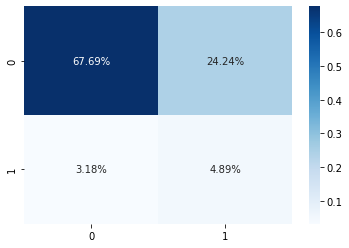

Fold  1 AUC : 0.736132
Accuracy: 0.7257487561380118
Precision: 0.167838803304309
Recall: 0.6056394763343403
F1-score: 0.2628381626677156
ROC_AUC: 0.736132142144845


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's custom_metric: 0.362528	valid's custom_metric: 0.307633
[400]	train's custom_metric: 0.410549	valid's custom_metric: 0.315488
[600]	train's custom_metric: 0.449486	valid's custom_metric: 0.317744


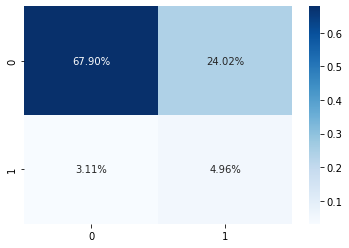

Fold  2 AUC : 0.741810
Accuracy: 0.7286592305941271
Precision: 0.17120098726650587
Recall: 0.6147029204431017
F1-score: 0.2678132678132678
ROC_AUC: 0.7418101712429193


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's custom_metric: 0.366808	valid's custom_metric: 0.290473
[400]	train's custom_metric: 0.414783	valid's custom_metric: 0.300403
[600]	train's custom_metric: 0.450564	valid's custom_metric: 0.299235


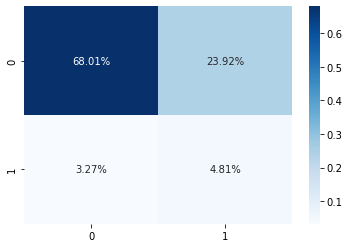

Fold  3 AUC : 0.734320
Accuracy: 0.7281832815726573
Precision: 0.16734601449275363
Recall: 0.5953675730110776
F1-score: 0.26125767820053913
ROC_AUC: 0.734319780703498


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's custom_metric: 0.359476	valid's custom_metric: 0.301611
[400]	train's custom_metric: 0.408847	valid's custom_metric: 0.310252
[600]	train's custom_metric: 0.449003	valid's custom_metric: 0.310453


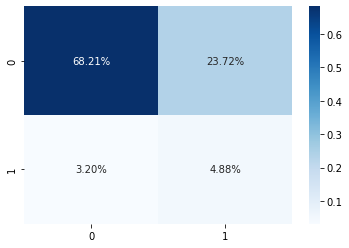

Fold  4 AUC : 0.739056
Accuracy: 0.7308986845742346
Precision: 0.17059994313335228
Recall: 0.6042296072507553
F1-score: 0.2660753880266075
ROC_AUC: 0.7390558659448743


/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

/home/bento/miniconda3/envs/rapids-21.12/lib/python3.7/site-packages/lightgbm/basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[200]	train's custom_metric: 0.362437	valid's custom_metric: 0.296495
[400]	train's custom_metric: 0.410856	valid's custom_metric: 0.308117
[600]	train's custom_metric: 0.448938	valid's custom_metric: 0.309527


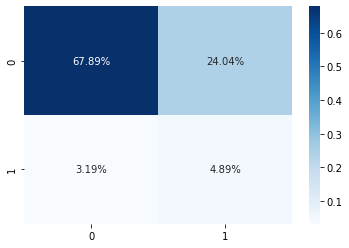

Fold  5 AUC : 0.737824
Accuracy: 0.7277280044226924
Precision: 0.1689151208544126
Recall: 0.6052366565961732
F1-score: 0.2641177763128983
ROC_AUC: 0.7378243893756934
Full AUC score 0.737820


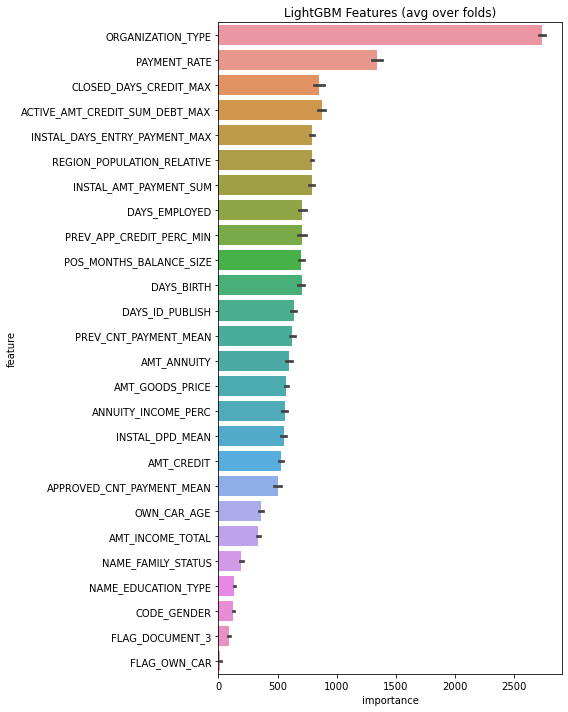

In [29]:
feat_imp_last_selection, df_proba_last_selection = kfold_lightgbm(df_application_train[selection + ["TARGET"]], df_application_test[selection], 5)

In [30]:
df_proba_last_selection

,valid_y,y_pred,fold
0,False,0.504521,1.0
1,False,0.233785,1.0
2,False,0.588301,1.0
3,False,0.382360,1.0
4,False,0.507593,1.0
...,...,...,...
307502,False,0.243395,5.0
307503,False,0.169819,5.0
307504,False,0.222727,5.0
307505,False,0.259751,5.0


In [31]:
def find_threshold(df_proba):

    df_results = pd.DataFrame()
    for n_fold in range(df_proba["fold"].nunique()):
        results = np.zeros((100, 3))
        scores = np.zeros((100, 1))
        thresholds = np.zeros((100, 1))
        fold = np.ones((100, 1))*(n_fold + 1)
        for threshold in range(100):
            i = threshold
            threshold = threshold/100.0
            score = custom_metric_threshold_search(df_proba.loc[df_proba["fold"] == n_fold + 1]["valid_y"],
                                                   df_proba.loc[df_proba["fold"] == n_fold + 1]["y_pred"], 
                                                   threshold)
            results[i][0] = score
            results[i][1] = threshold
            results[i][2] = n_fold + 1
        df_results = pd.concat([df_results, pd.DataFrame(results, columns=["score", "threshold", "fold"])])
        
    return df_results

In [33]:
df_results = find_threshold(df_proba_last_selection)

In [34]:
thresholds = pd.DataFrame()
for n_fold in range (5):
    thresholds = pd.concat([
        thresholds,
        pd.DataFrame(df_results.loc[
            (df_results["fold"] == n_fold + 1) & 
            (df_results["score"] == df_results.groupby("fold").max()["score"][n_fold + 1]
            )]["threshold"])
    ])

In [35]:
thresholds.mean()

threshold    0.51
dtype: float64

**Le seuil optimal calculé est de 0.51.**

In [39]:
df_results

,score,threshold,fold
0,-0.138711,0.00,1.0
1,-0.138671,0.01,1.0
2,-0.138469,0.02,1.0
3,-0.137422,0.03,1.0
4,-0.135629,0.04,1.0
...,...,...,...
95,0.000201,0.95,5.0
96,0.000000,0.96,5.0
97,0.000000,0.97,5.0
98,0.000000,0.98,5.0


<AxesSubplot:ylabel='score'>

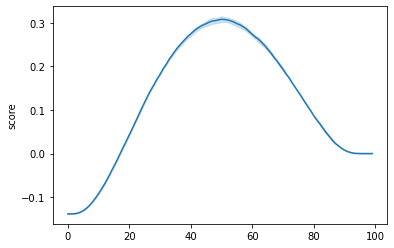

In [43]:
sns.lineplot(data=df_results["score"])

Starting LightGBM. Train shape: (307507, 27), test shape: (48744, 26)


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.363177	valid's custom_metric: 0.297019
[400]	train's custom_metric: 0.413605	valid's custom_metric: 0.302497
[600]	train's custom_metric: 0.451445	valid's custom_metric: 0.301853


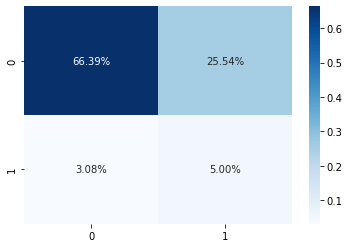

Fold  1 AUC : 0.736132


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.361027	valid's custom_metric: 0.306062
[400]	train's custom_metric: 0.410418	valid's custom_metric: 0.312407
[600]	train's custom_metric: 0.45213	valid's custom_metric: 0.316878


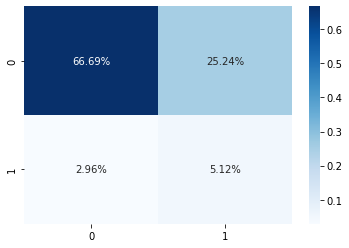

Fold  2 AUC : 0.741810


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.365383	valid's custom_metric: 0.288298
[400]	train's custom_metric: 0.414134	valid's custom_metric: 0.298409
[600]	train's custom_metric: 0.451566	valid's custom_metric: 0.298107


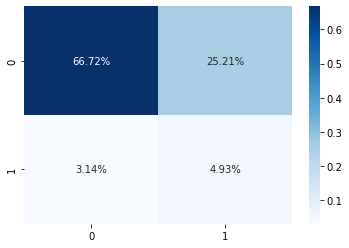

Fold  3 AUC : 0.734320


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.359733	valid's custom_metric: 0.299597
[400]	train's custom_metric: 0.409637	valid's custom_metric: 0.313172
[600]	train's custom_metric: 0.451098	valid's custom_metric: 0.311984


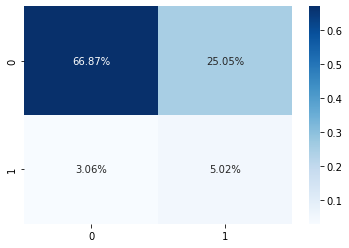

Fold  4 AUC : 0.739056


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.361108	valid's custom_metric: 0.297301
[400]	train's custom_metric: 0.410242	valid's custom_metric: 0.307412
[600]	train's custom_metric: 0.449386	valid's custom_metric: 0.31007


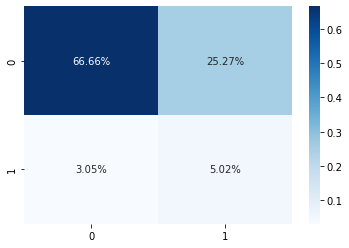

Fold  5 AUC : 0.737824
Full AUC score 0.737820


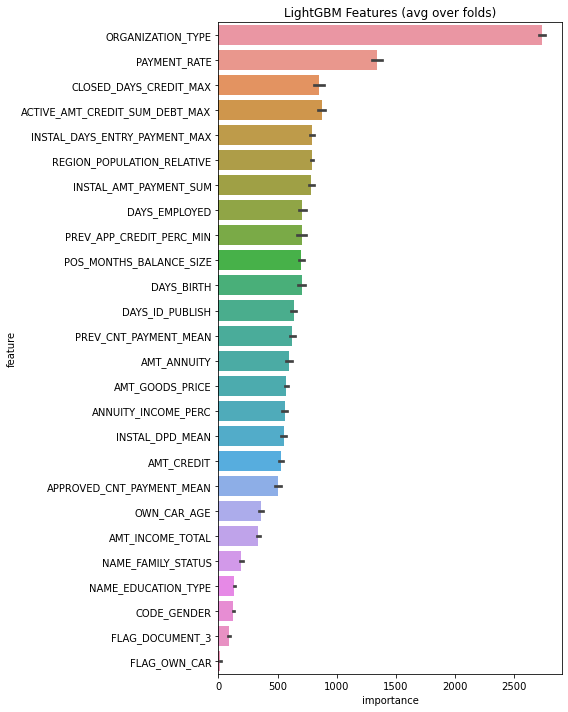

In [556]:
feat_imp_last_selection_opt_thres, df_proba_last_selection_opt_thres = kfold_lightgbm(df_application_train[selection + ["TARGET"]], df_application_test[selection], 5)

Starting LightGBM. Train shape: (307507, 27), test shape: (48744, 26)


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.363177	valid's custom_metric: 0.297019
[400]	train's custom_metric: 0.413605	valid's custom_metric: 0.302497
[600]	train's custom_metric: 0.451445	valid's custom_metric: 0.301853


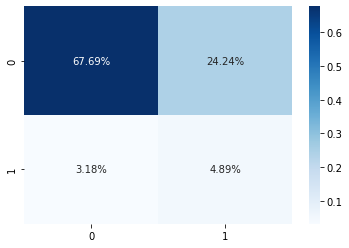

Fold  1 AUC : 0.736132


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.361027	valid's custom_metric: 0.306062
[400]	train's custom_metric: 0.410418	valid's custom_metric: 0.312407
[600]	train's custom_metric: 0.45213	valid's custom_metric: 0.316878


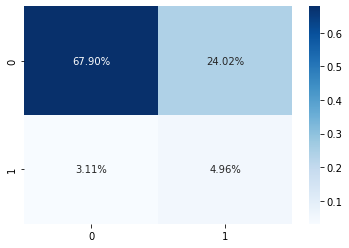

Fold  2 AUC : 0.741810


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.365383	valid's custom_metric: 0.288298
[400]	train's custom_metric: 0.414134	valid's custom_metric: 0.298409
[600]	train's custom_metric: 0.451566	valid's custom_metric: 0.298107


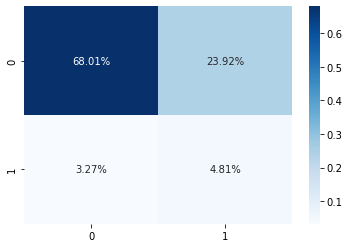

Fold  3 AUC : 0.734320


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.359733	valid's custom_metric: 0.299597
[400]	train's custom_metric: 0.409637	valid's custom_metric: 0.313172
[600]	train's custom_metric: 0.451098	valid's custom_metric: 0.311984


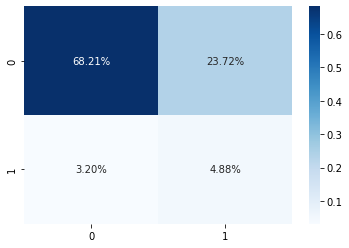

Fold  4 AUC : 0.739056


'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.


[200]	train's custom_metric: 0.361108	valid's custom_metric: 0.297301
[400]	train's custom_metric: 0.410242	valid's custom_metric: 0.307412
[600]	train's custom_metric: 0.449386	valid's custom_metric: 0.31007


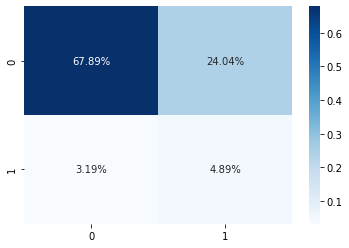

Fold  5 AUC : 0.737824
Full AUC score 0.737820


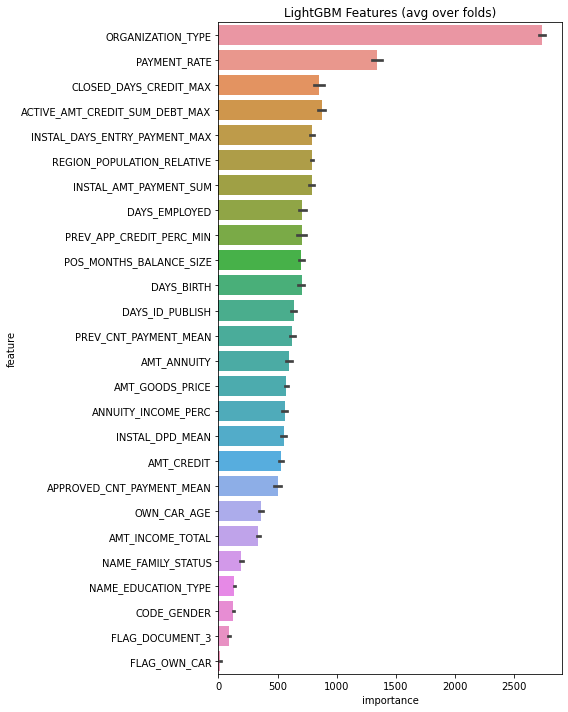

In [563]:
feat_imp_temp, df_proba_temp = kfold_lightgbm(df_application_train[selection + ["TARGET"]], df_application_test[selection], 5)

In [626]:
def build_report(df_proba):
    threshold = 0.51
    
    fold = np.ones((df_proba["fold"].nunique(), 1))
    #df_temp = df_proba.copy()
    #df_temp["y_pred"] = np.where(df_temp["y_pred"] >= threshold, 1, 0)
    for n_fold in range(df_proba["fold"].nunique()):
        fold[n_fold] = fold[n_fold]*(n_fold + 1)
        if n_fold == 0:
            df_results = generate_model_report(df_proba.loc[df_proba["fold"] == n_fold + 1]["valid_y"], 
                                               df_proba.loc[df_proba["fold"] == n_fold + 1]["y_pred"])
            df_results = pd.concat([df_results, pd.DataFrame({
                "custom": [custom_metric_threshold_search(
                    df_proba.loc[df_proba["fold"] == n_fold + 1]["valid_y"],
                    df_proba.loc[df_proba["fold"] == n_fold + 1]["y_pred"],
                    threshold)]
            })], axis=1)
                                                            
        else:
            df_results = pd.concat([df_results, 
                                    pd.concat([generate_model_report(
                                        df_proba.loc[df_proba["fold"] == n_fold + 1]["valid_y"], 
                                        df_proba.loc[df_proba["fold"] == n_fold + 1]["y_pred"]),
                                               pd.DataFrame({
                                                   "custom": [custom_metric_threshold_search(
                                                       df_proba.loc[df_proba["fold"] == n_fold + 1]["valid_y"],
                                                       df_proba.loc[df_proba["fold"] == n_fold + 1]["y_pred"],
                                                       threshold)]
                                               })
                                              ], axis=1)
                                   ])

    df_results = pd.concat([df_results.reset_index(), pd.DataFrame(fold, columns=["fold"])], axis=1)
    
    return df_results.drop(columns=["index"])

In [627]:
report = build_report(df_proba_temp)

Accuracy: 0.7257487561380118
Precision: 0.167838803304309
Recall: 0.6056394763343403
F1-score: 0.2628381626677156
ROC_AUC: 0.736132142144845
Accuracy: 0.7286592305941271
Precision: 0.17120098726650587
Recall: 0.6147029204431017
F1-score: 0.2678132678132678
ROC_AUC: 0.7418101712429193
Accuracy: 0.7281832815726573
Precision: 0.16734601449275363
Recall: 0.5953675730110776
F1-score: 0.26125767820053913
ROC_AUC: 0.734319780703498
Accuracy: 0.7308986845742346
Precision: 0.17059994313335228
Recall: 0.6042296072507553
F1-score: 0.2660753880266075
ROC_AUC: 0.7390558659448743
Accuracy: 0.7277280044226924
Precision: 0.1689151208544126
Recall: 0.6052366565961732
F1-score: 0.2641177763128983
ROC_AUC: 0.7378243893756934


In [628]:
report

,accuracy,precision,recall,f1,roc_auc,custom,fold
0,0.725749,0.167839,0.605639,0.262838,0.736132,0.305358,1.0
1,0.728659,0.171201,0.614703,0.267813,0.741810,0.317120,2.0
2,0.728183,0.167346,0.595368,0.261258,0.734320,0.299134,3.0
3,0.730899,0.170600,0.604230,0.266075,0.739056,0.310473,4.0
4,0.727728,0.168915,0.605237,0.264118,0.737824,0.307452,5.0


In [23]:
from sklearn.dummy import DummyClassifier

df_selection = pd.read_csv('selected_feats.csv')
selection = df_selection["selected_feats"].tolist()
dummy_clf = DummyClassifier(strategy="constant", constant=0)
dummy_clf.fit(df_application_train[selection], df_application_train["TARGET"])
y_pred_dummy = dummy_clf.predict(df_application_train[selection])

DummyClassifier(constant=0, strategy='constant')

<Figure size 432x288 with 0 Axes>

<AxesSubplot:>

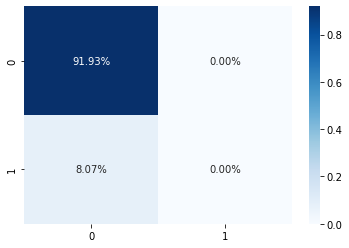

In [25]:
cf_matrix_dummy = confusion_matrix(df_application_train["TARGET"], y_pred_dummy)

plt.figure()
sns.heatmap(cf_matrix_dummy/np.sum(cf_matrix_dummy), annot=True, fmt='.2%', cmap='Blues')
plt.show()

In [629]:
df_proba_dummy = df_proba_temp.copy()
df_proba_dummy["y_pred"] = y_pred_dummy
dummy_report = build_report(df_proba_dummy)

Accuracy: 0.9192709180189262
Precision: 0.0
Recall: 0.0
F1-score: 0.0
ROC_AUC: 0.5
Accuracy: 0.9192709180189262
Precision: 0.0
Recall: 0.0
F1-score: 0.0
ROC_AUC: 0.5
Accuracy: 0.9192696053722703
Precision: 0.0
Recall: 0.0
F1-score: 0.0
ROC_AUC: 0.5
Accuracy: 0.9192696053722703
Precision: 0.0
Recall: 0.0
F1-score: 0.0
ROC_AUC: 0.5
Accuracy: 0.9192696053722703
Precision: 0.0
Recall: 0.0
F1-score: 0.0
ROC_AUC: 0.5


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [621]:
report.mean()

accuracy     0.728244
precision    0.169180
recall       0.605035
f1           0.264420
roc_auc      0.672049
custom       0.307907
fold         3.000000
dtype: float64

In [622]:
dummy_report.mean()

accuracy     0.91927
precision    0.00000
recall       0.00000
f1           0.00000
roc_auc      0.50000
custom       0.00000
fold         3.00000
dtype: float64

In [630]:
df_report = pd.DataFrame(
    [dummy_report.mean(), report.mean()],
    index=["dummy classifier", "LightGBM"]
).drop(columns="fold")

In [631]:
df_report

,accuracy,precision,recall,f1,roc_auc,custom
dummy classifier,0.919270,0.00000,0.000000,0.00000,0.500000,0.000000
LightGBM,0.728244,0.16918,0.605035,0.26442,0.737828,0.307907


In [654]:
from sklearn.metrics import auc

fpr = dict()
tpr = dict()
roc_auc = dict()

fpr[0], tpr[0], _ = roc_curve(df_proba_temp["valid_y"], df_proba_temp["y_pred"], pos_label=1)
roc_auc[0] = auc(fpr[0], tpr[0])

<Figure size 432x288 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver operating characteristic')

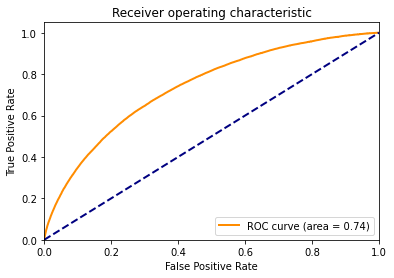

In [656]:
plt.figure()
lw = 2
plt.plot(
    fpr[0],
    tpr[0],
    color="darkorange",
    lw=lw,
    label="ROC curve (area = %0.2f)" % roc_auc[0],
)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

In [807]:
df_application_test.dtypes.values

array([dtype('int32'),
       CategoricalDtype(categories=['Cash loans', 'Revolving loans'], ordered=False),
       dtype('bool'), dtype('bool'), dtype('bool'), dtype('int32'),
       dtype('float32'), dtype('float32'), dtype('float32'),
       dtype('float32'),
       CategoricalDtype(categories=['Children', 'Family', 'Group of people', 'Other_A',
                         'Other_B', 'Spouse, partner', 'Unaccompanied'],
       , ordered=False)                                                                ,
       CategoricalDtype(categories=['Businessman', 'Commercial associate', 'Pensioner',
                         'State servant', 'Student', 'Unemployed', 'Working'],
       , ordered=False)                                                                ,
       CategoricalDtype(categories=['Academic degree', 'Higher education', 'Incomplete higher',
                         'Lower secondary', 'Secondary / secondary special'],
       , ordered=False)                                  

# 7. Préparation des données pour l'API et le dashboard 

**Imputation des médianes et modes pour les valeurs manquantes numériques et catégorielles.**

In [33]:
from sklearn.impute import SimpleImputer

df_data_knn = df_application_test.head(5000).copy()
df_data_knn.isnull().sum()
for col in df_data_knn.columns:
    if df_data_knn[col].dtype == 'int32' or df_data_knn[col].dtype == 'float32':
        imputer = SimpleImputer(missing_values=np.nan, strategy='median')
        df_data_knn[col] = imputer.fit_transform(df_data_knn[col].values.reshape(-1,1))
    elif df_data_knn[col].dtype == 'bool':
        df_data_knn[col] = df_data_knn[col].astype("int32")
        imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        df_data_knn[col] = imputer.fit_transform(df_data_knn[col].values.reshape(-1,1))
    elif df_data_knn[col].dtype == 'category':
        df_data_knn[col] = df_data_knn[col].astype("object")
        imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        df_data_knn[col] = imputer.fit_transform(df_data_knn[col].values.reshape(-1,1))
df_data_knn.isnull().sum()

SK_ID_CURR               0
NAME_CONTRACT_TYPE       0
CODE_GENDER              0
FLAG_OWN_CAR             0
FLAG_OWN_REALTY          0
                      ... 
CC_SK_DPD_DEF_MAX     3261
CC_SK_DPD_DEF_MEAN    3261
CC_SK_DPD_DEF_SUM     3261
CC_SK_DPD_DEF_VAR     3264
CC_COUNT              3261
Length: 432, dtype: int64

SK_ID_CURR            0
NAME_CONTRACT_TYPE    0
CODE_GENDER           0
FLAG_OWN_CAR          0
FLAG_OWN_REALTY       0
                     ..
CC_SK_DPD_DEF_MAX     0
CC_SK_DPD_DEF_MEAN    0
CC_SK_DPD_DEF_SUM     0
CC_SK_DPD_DEF_VAR     0
CC_COUNT              0
Length: 432, dtype: int64

In [34]:
df_data_knn.to_csv("df_application_test_5k_imputed.csv", index=False)

In [43]:
df_data_knn_ohe = pd.get_dummies(df_data_knn[["SK_ID_CURR"] + selection])
df_data_knn_ohe.shape

(5000, 91)

In [44]:
df_data_knn_ohe.to_csv("df_application_test_5k_knn_ohe.csv", index=False)

In [836]:
df_application_test.to_csv("df_application_test_2.csv", index=False)

In [850]:
from sklearn.neighbors import NearestNeighbors

neigh = NearestNeighbors(n_neighbors=10)
neigh.fit(df_data_knn_ohe.drop("SK_ID_CURR", axis=1))

idx = neigh.kneighbors(X=df_data_knn_ohe.loc[df_data_knn_ohe["SK_ID_CURR"] == 100141].drop("SK_ID_CURR", axis=1),
                       n_neighbors=10,
                       return_distance=False).ravel()
idx
nearest_cust_idx = list(df_data_knn_ohe.iloc[idx].index)
nearest_cust_idx

NearestNeighbors(n_neighbors=10)

array([   19, 23170, 11919,  8110,  3367, 10721, 11501, 42995, 40780,
       21194])

[19, 23170, 11919, 8110, 3367, 10721, 11501, 42995, 40780, 21194]

In [851]:
df_data_knn_ohe.to_csv("df_application_test_knn_ohe.csv", index=False)

In [866]:
from functions import plot_boxplot_var_by_target, find_knn

idx_nn = find_knn(100141, df_data_knn_ohe)
num_selection = selection.copy()
for col in selection:
    if df_application_test[col].dtype == "category" or df_application_test[col].dtype == "object":
        num_selection.remove(col)
num_selection
df_application_test.iloc[idx_nn][num_selection]
selection

['ACTIVE_AMT_CREDIT_SUM_DEBT_MAX',
 'AMT_ANNUITY',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'ANNUITY_INCOME_PERC',
 'APPROVED_CNT_PAYMENT_MEAN',
 'CLOSED_DAYS_CREDIT_MAX',
 'CODE_GENDER',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'FLAG_DOCUMENT_3',
 'FLAG_OWN_CAR',
 'INSTAL_AMT_PAYMENT_SUM',
 'INSTAL_DAYS_ENTRY_PAYMENT_MAX',
 'INSTAL_DPD_MEAN',
 'OWN_CAR_AGE',
 'PAYMENT_RATE',
 'POS_MONTHS_BALANCE_SIZE',
 'PREV_APP_CREDIT_PERC_MIN',
 'PREV_CNT_PAYMENT_MEAN',
 'REGION_POPULATION_RELATIVE',
 'AMT_INCOME_TOTAL']

,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,ANNUITY_INCOME_PERC,APPROVED_CNT_PAYMENT_MEAN,CLOSED_DAYS_CREDIT_MAX,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,...,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DPD_MEAN,OWN_CAR_AGE,PAYMENT_RATE,POS_MONTHS_BALANCE_SIZE,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,REGION_POPULATION_RELATIVE,AMT_INCOME_TOTAL
19,NaN,46741.5,478498.5,454500.0,0.266333,6.0,NaN,False,-17955,-305.0,...,24199.154297,-634.0,0.333333,10.0,0.097684,7.0,0.944152,6.0,0.010147,175500.0
23170,NaN,57060.0,479700.0,450000.0,0.362286,6.0,-1425.0,False,-14424,-2882.0,...,22364.865234,-2435.0,0.000000,NaN,0.118949,8.0,1.111165,6.0,0.030755,157500.0
11919,NaN,51412.5,500490.0,450000.0,0.285625,12.0,-216.0,False,-17775,-1134.0,...,19935.359375,-242.0,0.000000,NaN,0.102724,6.0,1.250118,12.0,0.005084,180000.0
8110,NaN,31450.5,450000.0,450000.0,0.174725,NaN,-1148.0,True,-19775,-2231.0,...,18058.005859,-2798.0,0.000000,NaN,0.069890,5.0,1.000000,NaN,0.018209,180000.0
3367,NaN,45972.0,463500.0,463500.0,0.283778,12.0,NaN,False,-21998,NaN,...,49491.179688,-1525.0,0.250000,NaN,0.099184,17.0,1.011100,12.0,0.018850,162000.0
10721,NaN,39699.0,502497.0,454500.0,0.210048,10.0,-1666.0,False,-19540,-4822.0,...,43742.789062,-2543.0,1.500000,7.0,0.079003,12.0,1.026373,10.0,0.046220,189000.0
11501,264055.5,35685.0,450000.0,450000.0,0.198250,12.0,-653.0,True,-9925,-690.0,...,31404.330078,-543.0,0.000000,NaN,0.079300,2.0,1.000000,12.0,0.007330,180000.0
42995,NaN,38403.0,494550.0,450000.0,0.189644,10.0,-2615.0,False,-20139,-599.0,...,37061.191406,-704.0,0.000000,NaN,0.077652,9.0,0.919095,10.0,0.019101,202500.0
40780,NaN,35554.5,450000.0,450000.0,0.213541,12.0,-860.0,False,-8930,-1309.0,...,38841.433594,-239.0,0.000000,NaN,0.079010,2.0,1.000000,12.0,0.072508,166500.0
21194,NaN,37107.0,494550.0,450000.0,0.206150,10.0,-2103.0,False,-20440,-627.0,...,55209.285156,-1785.0,0.000000,NaN,0.075032,11.0,1.538000,10.0,0.030755,180000.0


['ACTIVE_AMT_CREDIT_SUM_DEBT_MAX',
 'AMT_ANNUITY',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'ANNUITY_INCOME_PERC',
 'APPROVED_CNT_PAYMENT_MEAN',
 'CLOSED_DAYS_CREDIT_MAX',
 'CODE_GENDER',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'FLAG_DOCUMENT_3',
 'FLAG_OWN_CAR',
 'INSTAL_AMT_PAYMENT_SUM',
 'INSTAL_DAYS_ENTRY_PAYMENT_MAX',
 'INSTAL_DPD_MEAN',
 'OWN_CAR_AGE',
 'PAYMENT_RATE',
 'POS_MONTHS_BALANCE_SIZE',
 'PREV_APP_CREDIT_PERC_MIN',
 'PREV_CNT_PAYMENT_MEAN',
 'REGION_POPULATION_RELATIVE',
 'AMT_INCOME_TOTAL']

In [ ]:
plot_boxplot_var_by_target(X_all, y_all, X_neigh, y_neigh, X_cust, main_cols

In [892]:
selection
df_application_test[["SK_ID_CURR"] + selection].head(40000).to_csv("df_application_test_2_selection_40k.csv", index=False)

['ACTIVE_AMT_CREDIT_SUM_DEBT_MAX',
 'AMT_ANNUITY',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'ANNUITY_INCOME_PERC',
 'APPROVED_CNT_PAYMENT_MEAN',
 'CLOSED_DAYS_CREDIT_MAX',
 'CODE_GENDER',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'FLAG_DOCUMENT_3',
 'FLAG_OWN_CAR',
 'INSTAL_AMT_PAYMENT_SUM',
 'INSTAL_DAYS_ENTRY_PAYMENT_MAX',
 'INSTAL_DPD_MEAN',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'ORGANIZATION_TYPE',
 'OWN_CAR_AGE',
 'PAYMENT_RATE',
 'POS_MONTHS_BALANCE_SIZE',
 'PREV_APP_CREDIT_PERC_MIN',
 'PREV_CNT_PAYMENT_MEAN',
 'REGION_POPULATION_RELATIVE',
 'AMT_INCOME_TOTAL']

In [878]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
data_knn_ohe_scaled = ss.fit_transform(df_data_knn_ohe.drop("SK_ID_CURR", axis=1))
df_data_knn_ohe.head()
df_data_knn_ohe_scaled = pd.DataFrame(data_knn_ohe_scaled, columns=df_data_knn_ohe.drop("SK_ID_CURR", axis=1).columns)
df_data_knn_ohe_scaled = pd.concat([df_data_knn_ohe["SK_ID_CURR"], df_data_knn_ohe_scaled], axis=1)
df_data_knn_ohe_scaled

,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,ANNUITY_INCOME_PERC,APPROVED_CNT_PAYMENT_MEAN,CLOSED_DAYS_CREDIT_MAX,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,...,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
0,373239.0,20560.5,568800.0,450000.0,0.152300,8.000000,-857.0,0,-19241.0,-2329.0,...,0,0,0,0,0,0,0,0,0,0
1,543087.0,17370.0,222768.0,180000.0,0.175455,12.000000,-373.0,1,-18064.0,-4469.0,...,0,0,0,0,0,0,0,0,0,0
2,276012.0,69777.0,663264.0,630000.0,0.344578,17.333334,-1210.0,1,-20038.0,-4458.0,...,0,0,0,0,0,0,1,0,0,0
3,151015.5,49018.5,1575000.0,1575000.0,0.155614,11.333333,-992.0,0,-13976.0,-1866.0,...,0,0,0,0,0,0,0,0,0,0
4,276012.0,32067.0,625500.0,625500.0,0.178150,12.000000,-717.5,1,-13040.0,-2191.0,...,0,0,0,0,0,0,0,0,0,0


,SK_ID_CURR,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,ANNUITY_INCOME_PERC,APPROVED_CNT_PAYMENT_MEAN,CLOSED_DAYS_CREDIT_MAX,CODE_GENDER,DAYS_BIRTH,...,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
0,100001.0,-0.156304,-0.553580,0.142475,-0.037477,-0.321360,-0.756034,-0.033484,-0.701175,-0.733477,...,-0.01695,-0.013589,-0.050091,-0.165728,-0.026806,-0.096313,-0.059854,-0.135906,-0.067487,-0.48473
1,100005.0,-0.025073,-0.752831,-0.804537,-0.839362,-0.078790,-0.203961,0.871697,1.426178,-0.461392,...,-0.01695,-0.013589,-0.050091,-0.165728,-0.026806,-0.096313,-0.059854,-0.135906,-0.067487,-0.48473
2,100013.0,-0.231425,2.520066,0.401002,0.497113,1.692970,0.532137,-0.693668,1.426178,-0.917718,...,-0.01695,-0.013589,-0.050091,-0.165728,-0.026806,-0.096313,16.707421,-0.135906,-0.067487,-0.48473
3,100028.0,-0.328001,1.223666,2.896221,3.303709,-0.286639,-0.295973,-0.285963,-0.701175,0.483623,...,-0.01695,-0.013589,-0.050091,-0.165728,-0.026806,-0.096313,-0.059854,-0.135906,-0.067487,-0.48473
4,100038.0,-0.231425,0.165019,0.297651,0.483748,-0.050552,-0.203961,0.227410,1.426178,0.699997,...,-0.01695,-0.013589,-0.050091,-0.165728,-0.026806,-0.096313,-0.059854,-0.135906,-0.067487,-0.48473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221.0,-0.229193,-0.746368,-0.285119,-0.572067,-0.410252,1.452259,1.357951,-0.701175,-0.901998,...,-0.01695,-0.013589,-0.050091,-0.165728,-0.026806,-0.096313,-0.059854,-0.135906,-0.067487,-0.48473
48740,456222.0,-0.231425,0.155183,0.289202,0.096170,0.205590,0.555140,0.227410,-0.701175,1.128582,...,-0.01695,-0.013589,-0.050091,6.033992,-0.026806,-0.096313,-0.059854,-0.135906,-0.067487,-0.48473
48741,456223.0,-0.428190,0.236120,-0.552119,-0.438420,-0.199022,-0.341979,1.161579,-0.701175,0.033770,...,-0.01695,-0.013589,-0.050091,-0.165728,-0.026806,-0.096313,-0.059854,-0.135906,-0.067487,-0.48473
48742,456224.0,-0.150613,-0.268332,-0.182654,-0.037477,-0.746901,0.486131,0.606127,1.426178,0.485473,...,-0.01695,-0.013589,-0.050091,-0.165728,-0.026806,-0.096313,-0.059854,-0.135906,-0.067487,-0.48473


In [873]:
df_data_knn_ohe_scaled.columns

Index(['ACTIVE_AMT_CREDIT_SUM_DEBT_MAX', 'AMT_ANNUITY', 'AMT_CREDIT',
       'AMT_GOODS_PRICE', 'ANNUITY_INCOME_PERC', 'APPROVED_CNT_PAYMENT_MEAN',
       'CLOSED_DAYS_CREDIT_MAX', 'CODE_GENDER', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_ID_PUBLISH', 'FLAG_DOCUMENT_3', 'FLAG_OWN_CAR',
       'INSTAL_AMT_PAYMENT_SUM', 'INSTAL_DAYS_ENTRY_PAYMENT_MAX',
       'INSTAL_DPD_MEAN', 'OWN_CAR_AGE', 'PAYMENT_RATE',
       'POS_MONTHS_BALANCE_SIZE', 'PREV_APP_CREDIT_PERC_MIN',
       'PREV_CNT_PAYMENT_MEAN', 'REGION_POPULATION_RELATIVE',
       'AMT_INCOME_TOTAL', 'SK_ID_CURR', 'NAME_EDUCATION_TYPE_Academic degree',
       'NAME_EDUCATION_TYPE_Higher education',
       'NAME_EDUCATION_TYPE_Incomplete higher',
       'NAME_EDUCATION_TYPE_Lower secondary',
       'NAME_EDUCATION_TYPE_Secondary / secondary special',
       'NAME_FAMILY_STATUS_Civil marriage', 'NAME_FAMILY_STATUS_Married',
       'NAME_FAMILY_STATUS_Separated',
       'NAME_FAMILY_STATUS_Single / not married', 'NAME_FAMILY_STATUS_W

In [880]:
neigh = NearestNeighbors(n_neighbors=10)
neigh.fit(df_data_knn_ohe_scaled.drop("SK_ID_CURR", axis=1))

idx = neigh.kneighbors(X=df_data_knn_ohe_scaled.loc[df_data_knn_ohe_scaled["SK_ID_CURR"] == 100001].drop("SK_ID_CURR", axis=1),
                       n_neighbors=10,
                       return_distance=False).ravel()
idx
nearest_cust_idx = list(df_data_knn_ohe.iloc[idx].index)
nearest_cust_idx

NearestNeighbors(n_neighbors=10)

array([    0, 32959, 10467, 10822, 10212, 30692, 18750, 14739, 23915,
       24348])

[0, 32959, 10467, 10822, 10212, 30692, 18750, 14739, 23915, 24348]

In [882]:
from sklearn.utils import resample

df_application_test.shape

(48744, 432)

In [893]:
df_application_test.head(20000).to_csv("df_application_test_20k.csv", index=False)

In [898]:
df_selection = pd.read_csv('selected_feats.csv')
selection = df_selection["selected_feats"].tolist()

df_application_test.head(20000)[["SK_ID_CURR"] + selection].to_csv("df_application_test_selection_20k.csv", index=False)


In [897]:
df_data_knn_ohe.head(20000).to_csv("df_application_test_20k_knn_ohe.csv", index=False)

In [900]:
df_data_knn_ohe["SK_ID_CURR"]

0        100001.0
1        100005.0
2        100013.0
3        100028.0
4        100038.0
           ...   
48739    456221.0
48740    456222.0
48741    456223.0
48742    456224.0
48743    456250.0
Name: SK_ID_CURR, Length: 48744, dtype: float64

In [914]:
(df_application_train.isnull().sum() == 0).sum()/df_application_train.shape[1]

0.12702078521939955

In [ ]:
(df_application_train.isnull().sum()/df_application_train.shape[0]).mean()

0.37250994515372976

In [2]:
1/(1+np.exp(-0.252))

0.5626687076798121

In [26]:
for col in df_application_test.columns:
    if df_application_test[col].dtype != 'category':
        if np.isinf(df_application_test[col]).sum() != 0:
            print(col)

INSTAL_PAYMENT_PERC_MAX


In [46]:
df_application_test.loc[np.isinf(df_application_test["INSTAL_PAYMENT_PERC_MAX"])]

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_SK_DPD_MAX,CC_SK_DPD_MEAN,CC_SK_DPD_SUM,CC_SK_DPD_VAR,CC_SK_DPD_DEF_MIN,CC_SK_DPD_DEF_MAX,CC_SK_DPD_DEF_MEAN,CC_SK_DPD_DEF_SUM,CC_SK_DPD_DEF_VAR,CC_COUNT


In [30]:
df_application_test.at[2828, "INSTAL_PAYMENT_PERC_MAX"] = np.nan

In [45]:
df_application_test.head(5000)[["SK_ID_CURR"] + selection].to_csv("df_application_test_selection_5k.csv", index=False)

In [48]:
df_application_test.head(5000)[["SK_ID_CURR"] + selection].isnull().sum()

SK_ID_CURR                           0
ACTIVE_AMT_CREDIT_SUM_DEBT_MAX    1565
AMT_ANNUITY                          4
AMT_CREDIT                           0
AMT_GOODS_PRICE                      0
ANNUITY_INCOME_PERC                  4
APPROVED_CNT_PAYMENT_MEAN          108
CLOSED_DAYS_CREDIT_MAX            1148
CODE_GENDER                          0
DAYS_BIRTH                           0
DAYS_EMPLOYED                      965
DAYS_ID_PUBLISH                      0
FLAG_DOCUMENT_3                      0
FLAG_OWN_CAR                         0
INSTAL_AMT_PAYMENT_SUM              78
INSTAL_DAYS_ENTRY_PAYMENT_MAX       78
INSTAL_DPD_MEAN                     78
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
ORGANIZATION_TYPE                    0
OWN_CAR_AGE                       3327
PAYMENT_RATE                         4
POS_MONTHS_BALANCE_SIZE            100
PREV_APP_CREDIT_PERC_MIN            96
PREV_CNT_PAYMENT_MEAN              102
REGION_POPULATION_RELATIV

In [50]:
(df_application_test.head(5000)[["AMT_CREDIT"]] == 0).sum()

AMT_CREDIT    0
dtype: int64

In [51]:
(df_application_test.head(5000)[["AMT_INCOME_TOTAL"]] == 0).sum()

AMT_INCOME_TOTAL    0
dtype: int64